## Bidirectional LSTM model na predikciu hodnot DST o 2 hodiny dopredu na zaklade 12-hodinoveho vstupneho okna z atributov DST a BZ_GSM

Subor: prediction_DST+2_12H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-26 22:13:15.047400: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 2
y_col = f"DST+{shift}"

n_input = 12
atr_count = 2

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', 'bz_gsm', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])
predicators = ["DST", "bz_gsm"]

valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train[predicators].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid[predicators].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test[predicators].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  12


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 12, 2)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 12, 256)             │         134,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 12, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 12, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 12)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              13 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 331,406 (1.26 MB)

 Trainable params: 331,406 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H_BZ.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:35:15 10s/step - loss: 0.6526 - mae: 0.6946

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.5547 - mae: 0.6255 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.5439 - mae: 0.6190

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.5163 - mae: 0.5966

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 0.4973 - mae: 0.5799

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.4782 - mae: 0.5635

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 0.4658 - mae: 0.5512

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 0.4635 - mae: 0.5441

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 0.4599 - mae: 0.5376

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 0.4609 - mae: 0.5337

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 111ms/step - loss: 0.4608 - mae: 0.5299

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 111ms/step - loss: 0.4598 - mae: 0.5262

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 112ms/step - loss: 0.4574 - mae: 0.5223

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 112ms/step - loss: 0.4540 - mae: 0.5182

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 111ms/step - loss: 0.4631 - mae: 0.5163

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 111ms/step - loss: 0.4692 - mae: 0.5138

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 111ms/step - loss: 0.4749 - mae: 0.5122

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 111ms/step - loss: 0.4796 - mae: 0.5107

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 111ms/step - loss: 0.4830 - mae: 0.5091

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 110ms/step - loss: 0.4856 - mae: 0.5076

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 110ms/step - loss: 0.4875 - mae: 0.5061

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 113ms/step - loss: 0.4886 - mae: 0.5045

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 116ms/step - loss: 0.4907 - mae: 0.5034

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.4923 - mae: 0.5023

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.4932 - mae: 0.5010

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.4934 - mae: 0.4995

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.4933 - mae: 0.4980

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.4928 - mae: 0.4964

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.4919 - mae: 0.4948

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.4930 - mae: 0.4937

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.4938 - mae: 0.4925

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.4943 - mae: 0.4914

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.4946 - mae: 0.4903

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.4947 - mae: 0.4892

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.4945 - mae: 0.4881

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.4949 - mae: 0.4871

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.4963 - mae: 0.4864

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.4974 - mae: 0.4856

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.4982 - mae: 0.4848

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.4987 - mae: 0.4839

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.4990 - mae: 0.4829

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.4996 - mae: 0.4821

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.5003 - mae: 0.4815

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.5008 - mae: 0.4808

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.5011 - mae: 0.4802

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.5014 - mae: 0.4795

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.5015 - mae: 0.4788

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.5014 - mae: 0.4780

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.5014 - mae: 0.4773

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.5015 - mae: 0.4767

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.5016 - mae: 0.4762

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 127ms/step - loss: 0.5017 - mae: 0.4756

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 127ms/step - loss: 0.5019 - mae: 0.4751

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.5019 - mae: 0.4745

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.5019 - mae: 0.4740

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.5018 - mae: 0.4734

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.5016 - mae: 0.4728

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.5013 - mae: 0.4722

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.5010 - mae: 0.4716

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.5005 - mae: 0.4709

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.4999 - mae: 0.4702

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.4993 - mae: 0.4695

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.4986 - mae: 0.4687

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.4979 - mae: 0.4680

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.4972 - mae: 0.4673

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.4964 - mae: 0.4666

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.4956 - mae: 0.4659

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.4947 - mae: 0.4651

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.4938 - mae: 0.4643

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.4928 - mae: 0.4636

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.4919 - mae: 0.4628

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.4908 - mae: 0.4620

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.4898 - mae: 0.4612

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.4888 - mae: 0.4605

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.4877 - mae: 0.4597

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.4866 - mae: 0.4589

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.4855 - mae: 0.4581

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.4844 - mae: 0.4573

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.4833 - mae: 0.4566

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.4822 - mae: 0.4558

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.4812 - mae: 0.4551

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.4802 - mae: 0.4544

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.4793 - mae: 0.4537

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.4784 - mae: 0.4530

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.4774 - mae: 0.4524

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.4765 - mae: 0.4517

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.4755 - mae: 0.4511

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.4746 - mae: 0.4504

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.4737 - mae: 0.4498

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.4727 - mae: 0.4492

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.4718 - mae: 0.4485

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.4710 - mae: 0.4480

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.4702 - mae: 0.4474

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.4694 - mae: 0.4468

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.4686 - mae: 0.4462

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.4677 - mae: 0.4456

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.4669 - mae: 0.4450

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.4661 - mae: 0.4445

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.4652 - mae: 0.4439

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.4644 - mae: 0.4433

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.4636 - mae: 0.4428

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.4627 - mae: 0.4422

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.4619 - mae: 0.4416

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.4610 - mae: 0.4411

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.4602 - mae: 0.4405

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.4594 - mae: 0.4400

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.4585 - mae: 0.4394

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.4577 - mae: 0.4389

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.4569 - mae: 0.4384

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.4561 - mae: 0.4379

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.4552 - mae: 0.4374

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.4544 - mae: 0.4368

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.4536 - mae: 0.4363

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.4527 - mae: 0.4358

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.4519 - mae: 0.4353

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.4511 - mae: 0.4348

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.4502 - mae: 0.4343

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.4494 - mae: 0.4338

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.4489 - mae: 0.4333

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.4485 - mae: 0.4329

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.4480 - mae: 0.4325

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.4476 - mae: 0.4321

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.4472 - mae: 0.4317

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.4468 - mae: 0.4314

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.4465 - mae: 0.4310

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.4461 - mae: 0.4307

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.4457 - mae: 0.4303

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.4453 - mae: 0.4300

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.4449 - mae: 0.4296

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.4445 - mae: 0.4293

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.4441 - mae: 0.4290

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.4437 - mae: 0.4286

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.4433 - mae: 0.4283

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.4429 - mae: 0.4280

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.4425 - mae: 0.4277

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 128ms/step - loss: 0.4421 - mae: 0.4273

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.4416 - mae: 0.4270

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.4412 - mae: 0.4267

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.4408 - mae: 0.4264

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 128ms/step - loss: 0.4403 - mae: 0.4260

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 128ms/step - loss: 0.4399 - mae: 0.4257

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 128ms/step - loss: 0.4395 - mae: 0.4254

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 128ms/step - loss: 0.4390 - mae: 0.4251

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 128ms/step - loss: 0.4386 - mae: 0.4248

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.4381 - mae: 0.4245

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.4377 - mae: 0.4242

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.4372 - mae: 0.4239

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.4368 - mae: 0.4236

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.4363 - mae: 0.4233

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.4359 - mae: 0.4230

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.4355 - mae: 0.4227

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.4350 - mae: 0.4224

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.4346 - mae: 0.4221

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.4341 - mae: 0.4218

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.4337 - mae: 0.4215

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.4332 - mae: 0.4212

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.4328 - mae: 0.4209

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.4323 - mae: 0.4206

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.4319 - mae: 0.4203

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.4314 - mae: 0.4200

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.4310 - mae: 0.4197

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.4306 - mae: 0.4194

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.4302 - mae: 0.4192

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.4298 - mae: 0.4189

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.4295 - mae: 0.4187

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.4291 - mae: 0.4184

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.4287 - mae: 0.4182

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.4284 - mae: 0.4179

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.4280 - mae: 0.4177

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.4277 - mae: 0.4175

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.4274 - mae: 0.4172

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.4270 - mae: 0.4170

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.4267 - mae: 0.4168

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.4264 - mae: 0.4166

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.4260 - mae: 0.4163

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.4257 - mae: 0.4161

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.4253 - mae: 0.4159

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.4250 - mae: 0.4157

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.4247 - mae: 0.4155

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.4243 - mae: 0.4152

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.4239 - mae: 0.4150

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.4236 - mae: 0.4148

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.4232 - mae: 0.4146

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.4229 - mae: 0.4143

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.4225 - mae: 0.4141

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.4222 - mae: 0.4139

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.4218 - mae: 0.4136

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.4214 - mae: 0.4134

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.4211 - mae: 0.4132

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.4207 - mae: 0.4130

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.4203 - mae: 0.4127

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.4200 - mae: 0.4125

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.4197 - mae: 0.4123

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.4193 - mae: 0.4121

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.4190 - mae: 0.4119

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.4187 - mae: 0.4117

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.4184 - mae: 0.4114

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.4181 - mae: 0.4112

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.4178 - mae: 0.4110

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.4175 - mae: 0.4108

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.4172 - mae: 0.4106

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.4169 - mae: 0.4104

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.4166 - mae: 0.4102

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.4163 - mae: 0.4100

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.4161 - mae: 0.4099

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.4158 - mae: 0.4097

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.4155 - mae: 0.4095

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.4152 - mae: 0.4093

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.4150 - mae: 0.4091

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.4147 - mae: 0.4090

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.4145 - mae: 0.4088

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.4143 - mae: 0.4086

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.4140 - mae: 0.4085

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.4138 - mae: 0.4083

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.4135 - mae: 0.4081

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.4133 - mae: 0.4080

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.4131 - mae: 0.4078

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.4129 - mae: 0.4077

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.4126 - mae: 0.4075

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.4124 - mae: 0.4074

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.4123 - mae: 0.4072

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.4121 - mae: 0.4071

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.4120 - mae: 0.4070

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.4118 - mae: 0.4068

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.4117 - mae: 0.4067

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.4115 - mae: 0.4066

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.4114 - mae: 0.4064

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.4112 - mae: 0.4063

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.4111 - mae: 0.4062

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.4109 - mae: 0.4060

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.4107 - mae: 0.4059

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.4106 - mae: 0.4057

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.4104 - mae: 0.4056

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.4102 - mae: 0.4055

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.4100 - mae: 0.4053

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.4099 - mae: 0.4052

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.4097 - mae: 0.4051

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.4095 - mae: 0.4049

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.4094 - mae: 0.4048

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.4092 - mae: 0.4047

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.4090 - mae: 0.4045

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.4088 - mae: 0.4044

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.4086 - mae: 0.4043

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.4085 - mae: 0.4041

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.4083 - mae: 0.4040

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.4081 - mae: 0.4039

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.4079 - mae: 0.4037

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.4077 - mae: 0.4036

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.4075 - mae: 0.4034

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.4074 - mae: 0.4033

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.4072 - mae: 0.4032

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.4071 - mae: 0.4031

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.4069 - mae: 0.4030

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.4068 - mae: 0.4028

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.4066 - mae: 0.4027

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.4065 - mae: 0.4026

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.4063 - mae: 0.4025

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.4062 - mae: 0.4024

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.4060 - mae: 0.4022

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.4059 - mae: 0.4021

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.4057 - mae: 0.4020

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.4055 - mae: 0.4019

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.4054 - mae: 0.4018

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.4052 - mae: 0.4016

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.4050 - mae: 0.4015

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.4049 - mae: 0.4014

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.4047 - mae: 0.4013

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.4045 - mae: 0.4012

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.4044 - mae: 0.4010

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.4042 - mae: 0.4009

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.4040 - mae: 0.4008

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.4038 - mae: 0.4007

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.4037 - mae: 0.4006

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.4035 - mae: 0.4004

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.4033 - mae: 0.4003

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.4032 - mae: 0.4002

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.4030 - mae: 0.4001

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.4028 - mae: 0.4000

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.4026 - mae: 0.3998

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.4025 - mae: 0.3997

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.4023 - mae: 0.3996

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.4021 - mae: 0.3995

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.4019 - mae: 0.3994

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.4018 - mae: 0.3993

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.4016 - mae: 0.3991

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.4014 - mae: 0.3990

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.4012 - mae: 0.3989

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.4011 - mae: 0.3988

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.4009 - mae: 0.3987

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.4007 - mae: 0.3986

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.4005 - mae: 0.3984

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.4003 - mae: 0.3983

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.4001 - mae: 0.3982

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.4000 - mae: 0.3981

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.3998 - mae: 0.3980

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.3996 - mae: 0.3979

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.3994 - mae: 0.3977

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.3992 - mae: 0.3976

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.3990 - mae: 0.3975

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.3988 - mae: 0.3974

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.3986 - mae: 0.3973

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.3984 - mae: 0.3971

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.3983 - mae: 0.3970

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.3981 - mae: 0.3969

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.3979 - mae: 0.3968

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.3977 - mae: 0.3967

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.3975 - mae: 0.3965

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.3973 - mae: 0.3964

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.3971 - mae: 0.3963

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.3969 - mae: 0.3962

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.3967 - mae: 0.3961

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.3965 - mae: 0.3960

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.3964 - mae: 0.3958

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.3962 - mae: 0.3957

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.3960 - mae: 0.3956

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.3958 - mae: 0.3955

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.3956 - mae: 0.3954

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.3954 - mae: 0.3952

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.3952 - mae: 0.3951

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.3950 - mae: 0.3950

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.3948 - mae: 0.3949

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.3946 - mae: 0.3948

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.3944 - mae: 0.3947

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.3942 - mae: 0.3946

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.3941 - mae: 0.3944

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.3939 - mae: 0.3943

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.3937 - mae: 0.3942

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.3935 - mae: 0.3941

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.3933 - mae: 0.3940

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.3931 - mae: 0.3939

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.3929 - mae: 0.3938

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.3927 - mae: 0.3937

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.3925 - mae: 0.3935

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.3923 - mae: 0.3934

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.3921 - mae: 0.3933

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.3919 - mae: 0.3932

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.3917 - mae: 0.3931

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.3915 - mae: 0.3930

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.3914 - mae: 0.3929

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.3912 - mae: 0.3928

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.3910 - mae: 0.3926

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.3908 - mae: 0.3925

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.3906 - mae: 0.3924

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.3904 - mae: 0.3923

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.3902 - mae: 0.3922

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.3900 - mae: 0.3921

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.3898 - mae: 0.3920

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.3896 - mae: 0.3918

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.3894 - mae: 0.3917

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.3892 - mae: 0.3916

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.3890 - mae: 0.3915

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.3888 - mae: 0.3914

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.3886 - mae: 0.3913

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.3884 - mae: 0.3912

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.3882 - mae: 0.3911

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.3880 - mae: 0.3909

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.3878 - mae: 0.3908

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.3876 - mae: 0.3907

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.3874 - mae: 0.3906

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.3872 - mae: 0.3905

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.3870 - mae: 0.3904

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.3868 - mae: 0.3903

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.3866 - mae: 0.3902

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.3864 - mae: 0.3901

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.3862 - mae: 0.3899

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.3860 - mae: 0.3898

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.3858 - mae: 0.3897

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.3856 - mae: 0.3896

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.3854 - mae: 0.3895

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.3852 - mae: 0.3894

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.3850 - mae: 0.3893

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.3848 - mae: 0.3892

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.3846 - mae: 0.3891

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.3844 - mae: 0.3889

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.3842 - mae: 0.3888

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.3840 - mae: 0.3887

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.3838 - mae: 0.3886

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.3836 - mae: 0.3885

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.3834 - mae: 0.3884

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.3832 - mae: 0.3883

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.3830 - mae: 0.3882

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.3829 - mae: 0.3881

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.3827 - mae: 0.3880

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.3825 - mae: 0.3879

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.3823 - mae: 0.3878

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.3821 - mae: 0.3877

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.3819 - mae: 0.3876

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.3817 - mae: 0.3875

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.3815 - mae: 0.3874

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.3813 - mae: 0.3872

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.3812 - mae: 0.3871

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.3810 - mae: 0.3870

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.3808 - mae: 0.3869

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.3806 - mae: 0.3868

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.3804 - mae: 0.3867

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.3802 - mae: 0.3866

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.3800 - mae: 0.3865

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.3799 - mae: 0.3864

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.3797 - mae: 0.3863

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.3795 - mae: 0.3863

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.3793 - mae: 0.3862

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.3791 - mae: 0.3861

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.3790 - mae: 0.3860

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.3788 - mae: 0.3859

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.3786 - mae: 0.3858

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.3784 - mae: 0.3857

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.3782 - mae: 0.3856

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.3781 - mae: 0.3855

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.3779 - mae: 0.3854

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.3777 - mae: 0.3853

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.3775 - mae: 0.3852

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.3774 - mae: 0.3851

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.3772 - mae: 0.3850

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.3770 - mae: 0.3849 

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.3768 - mae: 0.3848

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.3767 - mae: 0.3847

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.3765 - mae: 0.3847

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.3763 - mae: 0.3846

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.3762 - mae: 0.3845

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.3760 - mae: 0.3844

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.3758 - mae: 0.3843

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.3756 - mae: 0.3842

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.3755 - mae: 0.3841

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.3753 - mae: 0.3840

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.3751 - mae: 0.3839

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.3750 - mae: 0.3839

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.3748 - mae: 0.3838

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.3746 - mae: 0.3837

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.3745 - mae: 0.3836

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.3743 - mae: 0.3835

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.3741 - mae: 0.3834

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.3740 - mae: 0.3833

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.3738 - mae: 0.3833

434/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.3736 - mae: 0.3832

435/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.3735 - mae: 0.3831

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.3733 - mae: 0.3830

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.3731 - mae: 0.3829

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.3730 - mae: 0.3828

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.3728 - mae: 0.3827

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.3726 - mae: 0.3827

441/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.3725 - mae: 0.3826

442/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.3723 - mae: 0.3825

443/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.3721 - mae: 0.3824

444/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.3720 - mae: 0.3823

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.3718 - mae: 0.3822

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.3716 - mae: 0.3821

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.3715 - mae: 0.3821

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.3713 - mae: 0.3820

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.3711 - mae: 0.3819

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.3710 - mae: 0.3818

451/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.3708 - mae: 0.3817

452/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.3706 - mae: 0.3816

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.3705 - mae: 0.3815

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.3703 - mae: 0.3815

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.3702 - mae: 0.3814

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.3700 - mae: 0.3813

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.3699 - mae: 0.3812

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.3697 - mae: 0.3811

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.3696 - mae: 0.3811

460/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.3694 - mae: 0.3810

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.3693 - mae: 0.3809

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.3691 - mae: 0.3808

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.3690 - mae: 0.3808

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.3688 - mae: 0.3807

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.3687 - mae: 0.3806

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.3685 - mae: 0.3805

467/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.3684 - mae: 0.3805

468/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.3683 - mae: 0.3804

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.3681 - mae: 0.3803

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.3680 - mae: 0.3802

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.3678 - mae: 0.3802

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.3677 - mae: 0.3801

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.3675 - mae: 0.3800

474/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.3674 - mae: 0.3800

475/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.3673 - mae: 0.3799

476/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.3671 - mae: 0.3798

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.3670 - mae: 0.3798

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.3669 - mae: 0.3797

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.3667 - mae: 0.3796

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.3666 - mae: 0.3795

481/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.3664 - mae: 0.3795

482/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.3663 - mae: 0.3794

483/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.3662 - mae: 0.3793

484/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.3660 - mae: 0.3793

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.3659 - mae: 0.3792

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.3657 - mae: 0.3791

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 122ms/step - loss: 0.3656 - mae: 0.3791

488/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.3655 - mae: 0.3790

489/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.3653 - mae: 0.3789

490/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.3652 - mae: 0.3789

491/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.3651 - mae: 0.3788

492/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.3649 - mae: 0.3787

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.3648 - mae: 0.3787

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.3647 - mae: 0.3786

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.3645 - mae: 0.3785

496/896 ━━━━━━━━━━━━━━━━━━━━ 48s 122ms/step - loss: 0.3644 - mae: 0.3785

497/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.3642 - mae: 0.3784

498/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.3641 - mae: 0.3783

499/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.3640 - mae: 0.3783

500/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.3638 - mae: 0.3782

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.3637 - mae: 0.3781

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.3636 - mae: 0.3781

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.3634 - mae: 0.3780

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.3633 - mae: 0.3779

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.3631 - mae: 0.3779

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.3630 - mae: 0.3778

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.3629 - mae: 0.3777

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.3627 - mae: 0.3777

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.3626 - mae: 0.3776

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.3625 - mae: 0.3775

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.3623 - mae: 0.3775

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.3622 - mae: 0.3774

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.3621 - mae: 0.3773

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.3619 - mae: 0.3773

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.3618 - mae: 0.3772

516/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.3617 - mae: 0.3771

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.3615 - mae: 0.3771

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.3614 - mae: 0.3770

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.3613 - mae: 0.3769

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.3611 - mae: 0.3769

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.3610 - mae: 0.3768

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.3609 - mae: 0.3768

523/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.3607 - mae: 0.3767

524/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.3606 - mae: 0.3766

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.3605 - mae: 0.3766

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.3603 - mae: 0.3765

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.3602 - mae: 0.3764

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.3601 - mae: 0.3764

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.3599 - mae: 0.3763

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.3598 - mae: 0.3762

531/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.3597 - mae: 0.3762

532/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.3595 - mae: 0.3761

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.3594 - mae: 0.3760

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.3593 - mae: 0.3760

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.3592 - mae: 0.3759

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.3590 - mae: 0.3758

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.3589 - mae: 0.3758

538/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.3588 - mae: 0.3757

539/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.3586 - mae: 0.3756

540/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.3585 - mae: 0.3756

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.3584 - mae: 0.3755

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.3582 - mae: 0.3755

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.3581 - mae: 0.3754

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.3580 - mae: 0.3753

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.3579 - mae: 0.3753

546/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.3577 - mae: 0.3752

547/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.3576 - mae: 0.3751

548/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.3575 - mae: 0.3751

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.3573 - mae: 0.3750

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.3572 - mae: 0.3749

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.3571 - mae: 0.3749

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.3569 - mae: 0.3748

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.3568 - mae: 0.3748

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.3567 - mae: 0.3747

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.3566 - mae: 0.3746

556/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.3564 - mae: 0.3746

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.3563 - mae: 0.3745

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.3562 - mae: 0.3744

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.3560 - mae: 0.3744

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.3559 - mae: 0.3743

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.3558 - mae: 0.3742

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.3556 - mae: 0.3742

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.3555 - mae: 0.3741

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.3554 - mae: 0.3741

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.3553 - mae: 0.3740

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.3551 - mae: 0.3739

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.3550 - mae: 0.3739

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.3549 - mae: 0.3738

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.3547 - mae: 0.3737

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.3546 - mae: 0.3737

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.3545 - mae: 0.3736

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.3544 - mae: 0.3736

573/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.3542 - mae: 0.3735

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.3541 - mae: 0.3734

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.3540 - mae: 0.3734

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.3538 - mae: 0.3733

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.3537 - mae: 0.3732

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.3536 - mae: 0.3732

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.3535 - mae: 0.3731

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.3533 - mae: 0.3731

581/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.3532 - mae: 0.3730

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.3531 - mae: 0.3729

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.3530 - mae: 0.3729

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.3528 - mae: 0.3728

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.3527 - mae: 0.3727

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.3526 - mae: 0.3727

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.3525 - mae: 0.3726

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.3523 - mae: 0.3726

589/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.3522 - mae: 0.3725

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.3521 - mae: 0.3724

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.3520 - mae: 0.3724

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.3518 - mae: 0.3723

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.3517 - mae: 0.3722

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.3516 - mae: 0.3722

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.3515 - mae: 0.3721

596/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.3513 - mae: 0.3721

597/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.3512 - mae: 0.3720

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.3511 - mae: 0.3719

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.3510 - mae: 0.3719

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.3508 - mae: 0.3718

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.3507 - mae: 0.3718

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.3506 - mae: 0.3717

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.3505 - mae: 0.3716

604/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.3504 - mae: 0.3716

605/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.3503 - mae: 0.3715

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.3502 - mae: 0.3715

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.3501 - mae: 0.3714

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.3499 - mae: 0.3713

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.3498 - mae: 0.3713

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.3497 - mae: 0.3712

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.3496 - mae: 0.3712

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.3495 - mae: 0.3711

613/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.3494 - mae: 0.3711

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.3493 - mae: 0.3710

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.3492 - mae: 0.3709

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.3491 - mae: 0.3709

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.3490 - mae: 0.3708

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.3489 - mae: 0.3708

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.3488 - mae: 0.3707

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.3487 - mae: 0.3707

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.3486 - mae: 0.3706

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.3485 - mae: 0.3706

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.3484 - mae: 0.3705

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.3483 - mae: 0.3705

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.3482 - mae: 0.3704

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.3481 - mae: 0.3703

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.3480 - mae: 0.3703

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.3479 - mae: 0.3702

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.3478 - mae: 0.3702

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.3477 - mae: 0.3701

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.3476 - mae: 0.3701

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.3475 - mae: 0.3700

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.3474 - mae: 0.3700

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.3473 - mae: 0.3699

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.3472 - mae: 0.3699

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.3471 - mae: 0.3698

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.3470 - mae: 0.3698

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.3469 - mae: 0.3697

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.3468 - mae: 0.3697

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.3467 - mae: 0.3696

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.3466 - mae: 0.3696

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.3465 - mae: 0.3695

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.3464 - mae: 0.3695

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.3463 - mae: 0.3694

645/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.3462 - mae: 0.3694

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.3461 - mae: 0.3693

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.3460 - mae: 0.3693

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.3459 - mae: 0.3692

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.3458 - mae: 0.3692

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.3457 - mae: 0.3691

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.3456 - mae: 0.3691

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.3455 - mae: 0.3690

653/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.3454 - mae: 0.3690

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.3453 - mae: 0.3689

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.3453 - mae: 0.3689

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.3452 - mae: 0.3688

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.3451 - mae: 0.3688

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.3450 - mae: 0.3687

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.3449 - mae: 0.3687

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.3448 - mae: 0.3686

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.3447 - mae: 0.3686

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.3446 - mae: 0.3685

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.3445 - mae: 0.3685

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.3444 - mae: 0.3685

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.3443 - mae: 0.3684

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.3442 - mae: 0.3684

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.3441 - mae: 0.3683

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.3441 - mae: 0.3683

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.3440 - mae: 0.3682

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.3439 - mae: 0.3682

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.3438 - mae: 0.3681

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.3437 - mae: 0.3681

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.3436 - mae: 0.3680

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.3435 - mae: 0.3680

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.3434 - mae: 0.3680

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.3433 - mae: 0.3679

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.3433 - mae: 0.3679

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.3432 - mae: 0.3678

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.3431 - mae: 0.3678

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.3430 - mae: 0.3677

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.3429 - mae: 0.3677

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.3428 - mae: 0.3676

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.3427 - mae: 0.3676

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.3427 - mae: 0.3676

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.3426 - mae: 0.3675

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.3425 - mae: 0.3675

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.3424 - mae: 0.3674

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.3423 - mae: 0.3674

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.3422 - mae: 0.3673

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.3421 - mae: 0.3673

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.3421 - mae: 0.3673

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.3420 - mae: 0.3672

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.3419 - mae: 0.3672

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.3418 - mae: 0.3671

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.3417 - mae: 0.3671

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.3416 - mae: 0.3670

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.3415 - mae: 0.3670

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.3415 - mae: 0.3670

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.3414 - mae: 0.3669

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.3413 - mae: 0.3669

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.3412 - mae: 0.3668

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.3411 - mae: 0.3668

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.3410 - mae: 0.3668

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.3410 - mae: 0.3667

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.3409 - mae: 0.3667

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.3408 - mae: 0.3666

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.3407 - mae: 0.3666

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.3406 - mae: 0.3666

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.3405 - mae: 0.3665

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.3405 - mae: 0.3665

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.3404 - mae: 0.3664

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.3403 - mae: 0.3664

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.3402 - mae: 0.3663

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.3401 - mae: 0.3663

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.3401 - mae: 0.3663

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.3400 - mae: 0.3662

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.3399 - mae: 0.3662

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.3398 - mae: 0.3662

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.3397 - mae: 0.3661

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.3397 - mae: 0.3661

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.3396 - mae: 0.3660

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.3395 - mae: 0.3660

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.3394 - mae: 0.3660

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.3394 - mae: 0.3659

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.3393 - mae: 0.3659

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.3392 - mae: 0.3658

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.3391 - mae: 0.3658

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.3391 - mae: 0.3658

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.3390 - mae: 0.3657

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.3389 - mae: 0.3657

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.3388 - mae: 0.3656

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.3387 - mae: 0.3656

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.3387 - mae: 0.3656

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.3386 - mae: 0.3655

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.3385 - mae: 0.3655

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.3384 - mae: 0.3655

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.3384 - mae: 0.3654

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.3383 - mae: 0.3654

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.3382 - mae: 0.3653

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.3381 - mae: 0.3653

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.3381 - mae: 0.3653

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.3380 - mae: 0.3652

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.3379 - mae: 0.3652

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.3378 - mae: 0.3652

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.3378 - mae: 0.3651

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.3377 - mae: 0.3651

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.3376 - mae: 0.3650

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.3375 - mae: 0.3650

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.3375 - mae: 0.3650

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.3374 - mae: 0.3649

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.3373 - mae: 0.3649

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.3372 - mae: 0.3649

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.3372 - mae: 0.3648

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.3371 - mae: 0.3648

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.3370 - mae: 0.3647

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.3369 - mae: 0.3647

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.3369 - mae: 0.3647

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.3368 - mae: 0.3646

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.3367 - mae: 0.3646

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.3366 - mae: 0.3646

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.3366 - mae: 0.3645

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.3365 - mae: 0.3645

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.3364 - mae: 0.3644

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.3363 - mae: 0.3644

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.3363 - mae: 0.3644

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.3362 - mae: 0.3643

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.3361 - mae: 0.3643

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.3361 - mae: 0.3643

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.3360 - mae: 0.3642

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.3359 - mae: 0.3642

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.3358 - mae: 0.3642

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.3358 - mae: 0.3641

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.3357 - mae: 0.3641

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.3356 - mae: 0.3641

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.3356 - mae: 0.3640

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.3355 - mae: 0.3640

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.3354 - mae: 0.3640

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.3354 - mae: 0.3639

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.3353 - mae: 0.3639

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.3352 - mae: 0.3638

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.3352 - mae: 0.3638

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.3351 - mae: 0.3638

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.3350 - mae: 0.3637

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.3349 - mae: 0.3637

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.3349 - mae: 0.3637

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.3348 - mae: 0.3636

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.3347 - mae: 0.3636

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.3347 - mae: 0.3636

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.3346 - mae: 0.3635

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.3345 - mae: 0.3635

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.3345 - mae: 0.3635

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.3344 - mae: 0.3634

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.3343 - mae: 0.3634

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.3343 - mae: 0.3634

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.3342 - mae: 0.3633

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.3341 - mae: 0.3633

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.3340 - mae: 0.3633

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.3340 - mae: 0.3632

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.3339 - mae: 0.3632

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.3338 - mae: 0.3632

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.3338 - mae: 0.3631

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.3337 - mae: 0.3631

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.3336 - mae: 0.3631

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.3336 - mae: 0.3630

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.3335 - mae: 0.3630

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.3334 - mae: 0.3630

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.3334 - mae: 0.3629

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.3333 - mae: 0.3629

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.3332 - mae: 0.3629

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.3332 - mae: 0.3628

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.3331 - mae: 0.3628

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.3330 - mae: 0.3628

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.3329 - mae: 0.3627

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.3329 - mae: 0.3627

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.3328 - mae: 0.3627

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.3327 - mae: 0.3626 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.3327 - mae: 0.3626

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.3326 - mae: 0.3626

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.3325 - mae: 0.3625

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.3325 - mae: 0.3625

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.3324 - mae: 0.3625

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.3323 - mae: 0.3624

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.3322 - mae: 0.3624

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.3322 - mae: 0.3624

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.3321 - mae: 0.3623

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.3320 - mae: 0.3623

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.3320 - mae: 0.3623

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.3319 - mae: 0.3622

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.3318 - mae: 0.3622

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.3318 - mae: 0.3622

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.3317 - mae: 0.3621

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.3316 - mae: 0.3621

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.3316 - mae: 0.3620

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.3315 - mae: 0.3620

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.3314 - mae: 0.3620

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.3313 - mae: 0.3619

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.3313 - mae: 0.3619

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.3312 - mae: 0.3619

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.3311 - mae: 0.3618

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.3311 - mae: 0.3618

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.3310 - mae: 0.3618

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.3309 - mae: 0.3617

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.3309 - mae: 0.3617

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.3308 - mae: 0.3617

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.3307 - mae: 0.3616

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.3306 - mae: 0.3616

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.3306 - mae: 0.3616

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.3305 - mae: 0.3615

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.3304 - mae: 0.3615

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.3304 - mae: 0.3615

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.3303 - mae: 0.3614

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.3302 - mae: 0.3614

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.3302 - mae: 0.3614

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.3301 - mae: 0.3613

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.3300 - mae: 0.3613

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.3300 - mae: 0.3613

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.3299 - mae: 0.3612

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.3298 - mae: 0.3612

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.3297 - mae: 0.3612

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.3297 - mae: 0.3611

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.3296 - mae: 0.3611

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.3295 - mae: 0.3611

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.3295 - mae: 0.3610

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.3294 - mae: 0.3610

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.3293 - mae: 0.3610

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.3293 - mae: 0.3609

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.3292 - mae: 0.3609

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.3291 - mae: 0.3609

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.3291 - mae: 0.3608

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.3290 - mae: 0.3608

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.3289 - mae: 0.3608

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.3289 - mae: 0.3607

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.3288 - mae: 0.3607

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.3287 - mae: 0.3607

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.3287 - mae: 0.3606

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.3286 - mae: 0.3606

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.3285 - mae: 0.3606

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.3285 - mae: 0.3605

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.3284 - mae: 0.3605

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.3284 - mae: 0.3605

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.3283 - mae: 0.3604

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.3282 - mae: 0.3604

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.3282 - mae: 0.3604

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.3281 - mae: 0.3603

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.3280 - mae: 0.3603

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.3280 - mae: 0.3603

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.3279 - mae: 0.3602

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.3278 - mae: 0.3602

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.3278 - mae: 0.3602

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.3277 - mae: 0.3601

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.3276 - mae: 0.3601

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.3276 - mae: 0.3601

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.3275 - mae: 0.3601

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.3275 - mae: 0.3600

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.3274 - mae: 0.3600

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.3273 - mae: 0.3600


Epoch 1: val_mae improved from inf to 0.33912, saving model to models/DST+2_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 134s 138ms/step - loss: 0.3273 - mae: 0.3599 - val_loss: 0.3201 - val_mae: 0.3391


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 143ms/step - loss: 0.1797 - mae: 0.2727

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1943 - mae: 0.2833

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.1924 - mae: 0.2855

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1847 - mae: 0.2821

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1806 - mae: 0.2807

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1774 - mae: 0.2797

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1735 - mae: 0.2780

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1789 - mae: 0.2787

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.2017 - mae: 0.2857

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.2193 - mae: 0.2918

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.2335 - mae: 0.2971

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.2445 - mae: 0.3017

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.2526 - mae: 0.3052

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.2594 - mae: 0.3085

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.2658 - mae: 0.3119

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.2709 - mae: 0.3150

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.2746 - mae: 0.3173

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.2773 - mae: 0.3191

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2799 - mae: 0.3210

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2822 - mae: 0.3227

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2839 - mae: 0.3242

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2854 - mae: 0.3258

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2881 - mae: 0.3278

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2914 - mae: 0.3297

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - loss: 0.2940 - mae: 0.3312

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 110ms/step - loss: 0.2960 - mae: 0.3324

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 113ms/step - loss: 0.2976 - mae: 0.3334

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 116ms/step - loss: 0.2989 - mae: 0.3343

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.2999 - mae: 0.3350

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.3006 - mae: 0.3356

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.3011 - mae: 0.3361

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.3015 - mae: 0.3366

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.3020 - mae: 0.3371

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.3022 - mae: 0.3374

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.3024 - mae: 0.3377

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.3023 - mae: 0.3380

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.3022 - mae: 0.3382

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.3020 - mae: 0.3383

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.3017 - mae: 0.3384

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.3015 - mae: 0.3385

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.3012 - mae: 0.3387

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.3008 - mae: 0.3388

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.3004 - mae: 0.3388

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.3000 - mae: 0.3389

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.2996 - mae: 0.3389

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.2992 - mae: 0.3390

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.2987 - mae: 0.3389

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.2997 - mae: 0.3392

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.3006 - mae: 0.3394

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.3013 - mae: 0.3395

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.3019 - mae: 0.3396

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.3026 - mae: 0.3398

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.3033 - mae: 0.3400

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.3039 - mae: 0.3402

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.3044 - mae: 0.3403

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.3048 - mae: 0.3404

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.3051 - mae: 0.3405

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.3055 - mae: 0.3405

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.3058 - mae: 0.3406

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.3060 - mae: 0.3407

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.3062 - mae: 0.3407

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.3063 - mae: 0.3407

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.3065 - mae: 0.3407

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.3067 - mae: 0.3408

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.3069 - mae: 0.3408

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.3070 - mae: 0.3408

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 118ms/step - loss: 0.3071 - mae: 0.3408

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 118ms/step - loss: 0.3072 - mae: 0.3408

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 118ms/step - loss: 0.3073 - mae: 0.3408

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 118ms/step - loss: 0.3074 - mae: 0.3409

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 118ms/step - loss: 0.3075 - mae: 0.3409

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 118ms/step - loss: 0.3077 - mae: 0.3409

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 118ms/step - loss: 0.3078 - mae: 0.3410

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 117ms/step - loss: 0.3078 - mae: 0.3410

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 117ms/step - loss: 0.3079 - mae: 0.3410

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 118ms/step - loss: 0.3079 - mae: 0.3410

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.3078 - mae: 0.3410

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.3078 - mae: 0.3409

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.3077 - mae: 0.3409

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.3076 - mae: 0.3408

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.3075 - mae: 0.3408

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.3074 - mae: 0.3407

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.3072 - mae: 0.3407

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.3070 - mae: 0.3406

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.3069 - mae: 0.3406

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.3067 - mae: 0.3405

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.3065 - mae: 0.3404

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.3063 - mae: 0.3404

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.3060 - mae: 0.3403

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.3058 - mae: 0.3402

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.3055 - mae: 0.3401

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.3053 - mae: 0.3400

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.3050 - mae: 0.3399

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.3047 - mae: 0.3398

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.3045 - mae: 0.3397

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.3042 - mae: 0.3396

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.3038 - mae: 0.3394

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.3035 - mae: 0.3393

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.3032 - mae: 0.3392

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.3029 - mae: 0.3390

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.3025 - mae: 0.3389

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.3022 - mae: 0.3387

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.3018 - mae: 0.3386

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.3015 - mae: 0.3384

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.3011 - mae: 0.3383

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.3008 - mae: 0.3381

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.3004 - mae: 0.3380

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.3001 - mae: 0.3378

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2997 - mae: 0.3377

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2994 - mae: 0.3375

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2990 - mae: 0.3374

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2987 - mae: 0.3372

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2983 - mae: 0.3371

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2980 - mae: 0.3369

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.2976 - mae: 0.3367

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.2972 - mae: 0.3366

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.2969 - mae: 0.3364

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.2965 - mae: 0.3362

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.2961 - mae: 0.3361

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.2957 - mae: 0.3359

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.2953 - mae: 0.3357

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.2949 - mae: 0.3355

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.2946 - mae: 0.3354

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.2943 - mae: 0.3352

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.2939 - mae: 0.3350

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.2935 - mae: 0.3349

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.2932 - mae: 0.3347

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2928 - mae: 0.3345

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2925 - mae: 0.3344

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.2921 - mae: 0.3342

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.2918 - mae: 0.3340

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.2915 - mae: 0.3339

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.2911 - mae: 0.3337

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.2908 - mae: 0.3336

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.2905 - mae: 0.3334

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.2902 - mae: 0.3333

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2898 - mae: 0.3331

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2895 - mae: 0.3330

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2892 - mae: 0.3328

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2889 - mae: 0.3327

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2885 - mae: 0.3325

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.2882 - mae: 0.3324

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.2879 - mae: 0.3323

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.2876 - mae: 0.3321

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.2873 - mae: 0.3320

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.2870 - mae: 0.3319

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.2868 - mae: 0.3318

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.2865 - mae: 0.3317

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.2862 - mae: 0.3316

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.2859 - mae: 0.3314

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.2857 - mae: 0.3313

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.2854 - mae: 0.3312

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.2851 - mae: 0.3311

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.2849 - mae: 0.3310

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.2846 - mae: 0.3309

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.2843 - mae: 0.3308

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.2841 - mae: 0.3306

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2838 - mae: 0.3305

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2835 - mae: 0.3304

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2833 - mae: 0.3303

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2830 - mae: 0.3302

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2828 - mae: 0.3301

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2825 - mae: 0.3300

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2822 - mae: 0.3299

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2820 - mae: 0.3298

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2817 - mae: 0.3297

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2815 - mae: 0.3296

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.2812 - mae: 0.3295

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.2809 - mae: 0.3294

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.2807 - mae: 0.3293

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.2804 - mae: 0.3292

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.2802 - mae: 0.3291

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.2799 - mae: 0.3290

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.2797 - mae: 0.3288

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.2794 - mae: 0.3287

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.2792 - mae: 0.3286

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.2789 - mae: 0.3285

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.2787 - mae: 0.3284

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.2784 - mae: 0.3283

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2782 - mae: 0.3282

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2779 - mae: 0.3281

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2777 - mae: 0.3280

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.2775 - mae: 0.3279

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.2772 - mae: 0.3278

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.2770 - mae: 0.3277

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.2768 - mae: 0.3276

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.2765 - mae: 0.3275

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.2763 - mae: 0.3274

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.2761 - mae: 0.3273

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.2758 - mae: 0.3272

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.2756 - mae: 0.3271

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.2754 - mae: 0.3270

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.2752 - mae: 0.3269

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.2749 - mae: 0.3268

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.2747 - mae: 0.3268

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.2745 - mae: 0.3267

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.2743 - mae: 0.3266

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.2741 - mae: 0.3265

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.2739 - mae: 0.3264

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.2737 - mae: 0.3263

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.2735 - mae: 0.3262

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.2733 - mae: 0.3261

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.2731 - mae: 0.3260

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.2729 - mae: 0.3260

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.2728 - mae: 0.3259

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2726 - mae: 0.3258

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2724 - mae: 0.3257

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2722 - mae: 0.3257

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2720 - mae: 0.3256

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2719 - mae: 0.3255

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.2717 - mae: 0.3255

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.2715 - mae: 0.3254

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.2714 - mae: 0.3253

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.2712 - mae: 0.3252

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.2710 - mae: 0.3252

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2708 - mae: 0.3251

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2707 - mae: 0.3250

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2705 - mae: 0.3250

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2703 - mae: 0.3249

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2702 - mae: 0.3249

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2700 - mae: 0.3248

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2699 - mae: 0.3247

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2697 - mae: 0.3247

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2696 - mae: 0.3246

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2694 - mae: 0.3246

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2693 - mae: 0.3245

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2691 - mae: 0.3245

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.2690 - mae: 0.3244

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 122ms/step - loss: 0.2688 - mae: 0.3244

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.2687 - mae: 0.3243

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.2686 - mae: 0.3243

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.2684 - mae: 0.3242

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.2683 - mae: 0.3242

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.2681 - mae: 0.3241

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.2680 - mae: 0.3241

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.2679 - mae: 0.3240

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.2677 - mae: 0.3240

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.2676 - mae: 0.3239

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.2674 - mae: 0.3238

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.2673 - mae: 0.3238

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.2672 - mae: 0.3237

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.2670 - mae: 0.3237

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.2669 - mae: 0.3236

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.2667 - mae: 0.3236

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.2666 - mae: 0.3235

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.2665 - mae: 0.3235

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.2663 - mae: 0.3234

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.2662 - mae: 0.3234

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.2661 - mae: 0.3233

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.2660 - mae: 0.3233

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.2659 - mae: 0.3233

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.2657 - mae: 0.3232

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.2656 - mae: 0.3232

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.2655 - mae: 0.3231

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.2654 - mae: 0.3231

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.2652 - mae: 0.3230

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.2651 - mae: 0.3230

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.2650 - mae: 0.3229

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.2649 - mae: 0.3229

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.2648 - mae: 0.3229

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.2646 - mae: 0.3228

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.2645 - mae: 0.3228

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.2644 - mae: 0.3227

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.2643 - mae: 0.3227

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.2641 - mae: 0.3226

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.2640 - mae: 0.3226

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.2639 - mae: 0.3225

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.2638 - mae: 0.3225

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.2637 - mae: 0.3225

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.2635 - mae: 0.3224

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.2634 - mae: 0.3224

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.2633 - mae: 0.3223

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.2632 - mae: 0.3223

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.2630 - mae: 0.3222

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.2629 - mae: 0.3222

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.2628 - mae: 0.3221

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.2627 - mae: 0.3221

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.2625 - mae: 0.3220

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.2624 - mae: 0.3220

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.2623 - mae: 0.3219

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.2621 - mae: 0.3219

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.2620 - mae: 0.3218

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.2619 - mae: 0.3218

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.2618 - mae: 0.3217

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.2617 - mae: 0.3217

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.2616 - mae: 0.3216

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.2614 - mae: 0.3216

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.2613 - mae: 0.3215

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.2612 - mae: 0.3215

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.2611 - mae: 0.3214

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.2610 - mae: 0.3214

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.2608 - mae: 0.3213

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.2607 - mae: 0.3213

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.2606 - mae: 0.3212

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.2605 - mae: 0.3212

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.2604 - mae: 0.3211

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.2602 - mae: 0.3211

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.2601 - mae: 0.3210

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.2600 - mae: 0.3210

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.2599 - mae: 0.3209

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.2597 - mae: 0.3209

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.2596 - mae: 0.3208

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.2595 - mae: 0.3208

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.2594 - mae: 0.3207

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.2593 - mae: 0.3207

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.2591 - mae: 0.3206

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.2590 - mae: 0.3206

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.2589 - mae: 0.3205

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.2588 - mae: 0.3205

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.2587 - mae: 0.3204

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.2585 - mae: 0.3204

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.2584 - mae: 0.3203

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.2583 - mae: 0.3203

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.2582 - mae: 0.3202

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.2581 - mae: 0.3202

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.2579 - mae: 0.3201

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.2578 - mae: 0.3201

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.2577 - mae: 0.3200

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.2576 - mae: 0.3200

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.2574 - mae: 0.3199

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.2573 - mae: 0.3199

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.2572 - mae: 0.3198

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.2571 - mae: 0.3198

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.2570 - mae: 0.3197

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.2568 - mae: 0.3197

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.2567 - mae: 0.3196

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.2566 - mae: 0.3196

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.2565 - mae: 0.3195

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.2564 - mae: 0.3194

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.2562 - mae: 0.3194

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.2561 - mae: 0.3193

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.2560 - mae: 0.3193

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.2559 - mae: 0.3192

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.2557 - mae: 0.3192

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.2556 - mae: 0.3191

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.2555 - mae: 0.3191

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.2554 - mae: 0.3190

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.2552 - mae: 0.3190

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.2551 - mae: 0.3189

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.2550 - mae: 0.3188

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.2549 - mae: 0.3188

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.2548 - mae: 0.3187

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.2546 - mae: 0.3187

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.2545 - mae: 0.3186

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.2544 - mae: 0.3186

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.2543 - mae: 0.3185

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.2542 - mae: 0.3185

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.2540 - mae: 0.3184

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.2539 - mae: 0.3183

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.2538 - mae: 0.3183

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.2537 - mae: 0.3182

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.2536 - mae: 0.3182

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.2535 - mae: 0.3181

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.2533 - mae: 0.3181

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.2532 - mae: 0.3180

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.2531 - mae: 0.3180

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.2530 - mae: 0.3179

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.2529 - mae: 0.3179

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.2528 - mae: 0.3178

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.2526 - mae: 0.3177

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.2525 - mae: 0.3177

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.2524 - mae: 0.3176

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.2523 - mae: 0.3176

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.2522 - mae: 0.3175

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.2521 - mae: 0.3175

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.2520 - mae: 0.3174

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.2518 - mae: 0.3174

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.2517 - mae: 0.3173

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.2516 - mae: 0.3172

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.2515 - mae: 0.3172

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.2514 - mae: 0.3171

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.2513 - mae: 0.3171

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.2512 - mae: 0.3170

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.2511 - mae: 0.3170

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.2509 - mae: 0.3169

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.2508 - mae: 0.3169

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.2507 - mae: 0.3168

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.2506 - mae: 0.3168

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.2505 - mae: 0.3167

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.2504 - mae: 0.3167

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.2503 - mae: 0.3166

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.2502 - mae: 0.3165

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.2501 - mae: 0.3165

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.2500 - mae: 0.3164

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.2498 - mae: 0.3164

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.2497 - mae: 0.3163

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.2496 - mae: 0.3163

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.2495 - mae: 0.3162

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.2494 - mae: 0.3162

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.2493 - mae: 0.3161

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.2492 - mae: 0.3161

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.2491 - mae: 0.3160

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.2490 - mae: 0.3160

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.2489 - mae: 0.3159

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.2488 - mae: 0.3159

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.2487 - mae: 0.3158

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.2485 - mae: 0.3158

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.2484 - mae: 0.3157

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.2483 - mae: 0.3157

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.2482 - mae: 0.3156

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.2481 - mae: 0.3156

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.2480 - mae: 0.3155

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.2479 - mae: 0.3155

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.2478 - mae: 0.3154

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.2477 - mae: 0.3153

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.2476 - mae: 0.3153

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.2475 - mae: 0.3152

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.2474 - mae: 0.3152

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.2473 - mae: 0.3152

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.2472 - mae: 0.3151

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.2471 - mae: 0.3151

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.2470 - mae: 0.3150

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.2469 - mae: 0.3150 

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.2468 - mae: 0.3149

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.2467 - mae: 0.3149

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.2466 - mae: 0.3148

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.2465 - mae: 0.3148

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.2464 - mae: 0.3147

419/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.2463 - mae: 0.3147

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.2462 - mae: 0.3146

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.2461 - mae: 0.3146

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.2460 - mae: 0.3145

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.2459 - mae: 0.3145

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.2458 - mae: 0.3144

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.2457 - mae: 0.3144

426/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.2456 - mae: 0.3143

427/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.2455 - mae: 0.3142

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.2454 - mae: 0.3142

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.2453 - mae: 0.3141

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.2452 - mae: 0.3141

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.2451 - mae: 0.3141

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.2450 - mae: 0.3140

433/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.2450 - mae: 0.3140

434/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.2449 - mae: 0.3139

435/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.2448 - mae: 0.3139

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.2447 - mae: 0.3138

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.2446 - mae: 0.3138

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.2445 - mae: 0.3137

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.2444 - mae: 0.3137

440/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.2443 - mae: 0.3136

441/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.2443 - mae: 0.3136

442/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.2442 - mae: 0.3135

443/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.2441 - mae: 0.3135

444/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.2440 - mae: 0.3135

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.2439 - mae: 0.3134

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.2439 - mae: 0.3134

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.2438 - mae: 0.3133

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.2437 - mae: 0.3133

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.2436 - mae: 0.3133

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.2436 - mae: 0.3132

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.2435 - mae: 0.3132

452/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2434 - mae: 0.3131

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2433 - mae: 0.3131

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2433 - mae: 0.3131

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2432 - mae: 0.3130

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2431 - mae: 0.3130

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2431 - mae: 0.3129

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2430 - mae: 0.3129

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2429 - mae: 0.3129

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2428 - mae: 0.3128

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2428 - mae: 0.3128

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2427 - mae: 0.3127

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2426 - mae: 0.3127

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2426 - mae: 0.3127

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2425 - mae: 0.3126

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2424 - mae: 0.3126

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2423 - mae: 0.3125

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2423 - mae: 0.3125

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2422 - mae: 0.3125

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2421 - mae: 0.3124

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2421 - mae: 0.3124

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2420 - mae: 0.3124

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2419 - mae: 0.3123

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2419 - mae: 0.3123

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2418 - mae: 0.3122

476/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2417 - mae: 0.3122

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2417 - mae: 0.3122

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2416 - mae: 0.3121

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2416 - mae: 0.3121

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2415 - mae: 0.3121

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2414 - mae: 0.3120

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.2414 - mae: 0.3120

483/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.2413 - mae: 0.3120

484/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.2412 - mae: 0.3119

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.2412 - mae: 0.3119

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.2411 - mae: 0.3119

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.2410 - mae: 0.3118

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.2410 - mae: 0.3118

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.2409 - mae: 0.3118

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.2408 - mae: 0.3117

491/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.2408 - mae: 0.3117

492/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.2407 - mae: 0.3117

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.2407 - mae: 0.3116

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.2406 - mae: 0.3116

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.2405 - mae: 0.3116

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.2405 - mae: 0.3115

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.2404 - mae: 0.3115

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.2404 - mae: 0.3115

499/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.2403 - mae: 0.3114

500/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.2403 - mae: 0.3114

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2402 - mae: 0.3114

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2401 - mae: 0.3113

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2401 - mae: 0.3113

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2400 - mae: 0.3113

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2400 - mae: 0.3112

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2399 - mae: 0.3112

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2399 - mae: 0.3112

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2398 - mae: 0.3111

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2397 - mae: 0.3111

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2397 - mae: 0.3111

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2396 - mae: 0.3110

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2396 - mae: 0.3110

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2395 - mae: 0.3110

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2394 - mae: 0.3110

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2394 - mae: 0.3109

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2393 - mae: 0.3109

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2393 - mae: 0.3109

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2392 - mae: 0.3108

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2391 - mae: 0.3108

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2391 - mae: 0.3108

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2390 - mae: 0.3107

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2390 - mae: 0.3107

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2389 - mae: 0.3107

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2388 - mae: 0.3106

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.2388 - mae: 0.3106

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.2387 - mae: 0.3106

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.2387 - mae: 0.3105

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.2386 - mae: 0.3105

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.2385 - mae: 0.3105

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.2385 - mae: 0.3104

531/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.2384 - mae: 0.3104

532/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.2383 - mae: 0.3104

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.2383 - mae: 0.3103

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.2382 - mae: 0.3103

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.2382 - mae: 0.3103

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.2381 - mae: 0.3102

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.2380 - mae: 0.3102

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.2380 - mae: 0.3102

539/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.2379 - mae: 0.3101

540/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.2379 - mae: 0.3101

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.2378 - mae: 0.3101

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.2377 - mae: 0.3100

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.2377 - mae: 0.3100

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.2376 - mae: 0.3100

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.2376 - mae: 0.3099

546/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.2375 - mae: 0.3099

547/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.2374 - mae: 0.3099

548/896 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.2374 - mae: 0.3098

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.2373 - mae: 0.3098

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.2373 - mae: 0.3098

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.2372 - mae: 0.3097

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.2371 - mae: 0.3097

553/896 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 0.2371 - mae: 0.3097

554/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.2370 - mae: 0.3096

555/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.2370 - mae: 0.3096

556/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.2369 - mae: 0.3096

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.2368 - mae: 0.3095

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.2368 - mae: 0.3095

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.2367 - mae: 0.3095

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.2367 - mae: 0.3094

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.2366 - mae: 0.3094

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.2365 - mae: 0.3094

563/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.2365 - mae: 0.3093

564/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.2364 - mae: 0.3093

565/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2364 - mae: 0.3093

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2363 - mae: 0.3092

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2362 - mae: 0.3092

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2362 - mae: 0.3092

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2361 - mae: 0.3091

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2361 - mae: 0.3091

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.2360 - mae: 0.3091

572/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.2360 - mae: 0.3090

573/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.2359 - mae: 0.3090

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.2358 - mae: 0.3090

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.2358 - mae: 0.3089

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.2357 - mae: 0.3089

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.2357 - mae: 0.3089

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.2356 - mae: 0.3089

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.2356 - mae: 0.3088

580/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.2355 - mae: 0.3088

581/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.2355 - mae: 0.3088

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.2354 - mae: 0.3087

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.2354 - mae: 0.3087

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.2353 - mae: 0.3087

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.2353 - mae: 0.3087

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.2352 - mae: 0.3086

587/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.2352 - mae: 0.3086

588/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.2351 - mae: 0.3086

589/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.2351 - mae: 0.3085

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.2350 - mae: 0.3085

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.2350 - mae: 0.3085

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 0.2349 - mae: 0.3085

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 0.2349 - mae: 0.3084

594/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.2348 - mae: 0.3084

595/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.2348 - mae: 0.3084

596/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.2347 - mae: 0.3084

597/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.2347 - mae: 0.3083

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.2346 - mae: 0.3083

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.2346 - mae: 0.3083

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.2345 - mae: 0.3082

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.2345 - mae: 0.3082

602/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.2344 - mae: 0.3082

603/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.2344 - mae: 0.3082

604/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.2343 - mae: 0.3081

605/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.2343 - mae: 0.3081

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.2342 - mae: 0.3081

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.2342 - mae: 0.3081

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.2341 - mae: 0.3080

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.2341 - mae: 0.3080

610/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.2341 - mae: 0.3080

611/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.2340 - mae: 0.3080

612/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.2340 - mae: 0.3079

613/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.2339 - mae: 0.3079

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.2339 - mae: 0.3079

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.2338 - mae: 0.3079

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.2338 - mae: 0.3078

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.2337 - mae: 0.3078

618/896 ━━━━━━━━━━━━━━━━━━━━ 33s 122ms/step - loss: 0.2337 - mae: 0.3078

619/896 ━━━━━━━━━━━━━━━━━━━━ 33s 122ms/step - loss: 0.2336 - mae: 0.3077

620/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.2336 - mae: 0.3077

621/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.2335 - mae: 0.3077

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.2335 - mae: 0.3077

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.2334 - mae: 0.3076

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.2334 - mae: 0.3076

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.2333 - mae: 0.3076

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.2333 - mae: 0.3076

627/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.2332 - mae: 0.3075

628/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.2332 - mae: 0.3075

629/896 ━━━━━━━━━━━━━━━━━━━━ 32s 122ms/step - loss: 0.2331 - mae: 0.3075

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 122ms/step - loss: 0.2331 - mae: 0.3075

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 122ms/step - loss: 0.2330 - mae: 0.3074

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 122ms/step - loss: 0.2330 - mae: 0.3074

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 122ms/step - loss: 0.2329 - mae: 0.3074

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 122ms/step - loss: 0.2329 - mae: 0.3074

635/896 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.2328 - mae: 0.3073

636/896 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.2328 - mae: 0.3073

637/896 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.2327 - mae: 0.3073

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.2327 - mae: 0.3072

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.2326 - mae: 0.3072

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.2326 - mae: 0.3072

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.2325 - mae: 0.3072

642/896 ━━━━━━━━━━━━━━━━━━━━ 30s 122ms/step - loss: 0.2325 - mae: 0.3071

643/896 ━━━━━━━━━━━━━━━━━━━━ 30s 122ms/step - loss: 0.2324 - mae: 0.3071

644/896 ━━━━━━━━━━━━━━━━━━━━ 30s 122ms/step - loss: 0.2324 - mae: 0.3071

645/896 ━━━━━━━━━━━━━━━━━━━━ 30s 122ms/step - loss: 0.2323 - mae: 0.3071

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 122ms/step - loss: 0.2323 - mae: 0.3070

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 122ms/step - loss: 0.2322 - mae: 0.3070

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 122ms/step - loss: 0.2322 - mae: 0.3070

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 122ms/step - loss: 0.2321 - mae: 0.3070

650/896 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.2321 - mae: 0.3069

651/896 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.2320 - mae: 0.3069

652/896 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.2320 - mae: 0.3069

653/896 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.2319 - mae: 0.3069

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.2319 - mae: 0.3068

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.2318 - mae: 0.3068

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.2318 - mae: 0.3068

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.2317 - mae: 0.3068

658/896 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.2317 - mae: 0.3067

659/896 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.2316 - mae: 0.3067

660/896 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.2316 - mae: 0.3067

661/896 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.2315 - mae: 0.3066

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.2315 - mae: 0.3066

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.2314 - mae: 0.3066

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.2314 - mae: 0.3066

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.2313 - mae: 0.3065

666/896 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.2313 - mae: 0.3065

667/896 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.2312 - mae: 0.3065

668/896 ━━━━━━━━━━━━━━━━━━━━ 27s 122ms/step - loss: 0.2312 - mae: 0.3065

669/896 ━━━━━━━━━━━━━━━━━━━━ 27s 122ms/step - loss: 0.2311 - mae: 0.3064

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 122ms/step - loss: 0.2311 - mae: 0.3064

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 122ms/step - loss: 0.2310 - mae: 0.3064

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 122ms/step - loss: 0.2310 - mae: 0.3063

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 122ms/step - loss: 0.2309 - mae: 0.3063

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 122ms/step - loss: 0.2309 - mae: 0.3063

675/896 ━━━━━━━━━━━━━━━━━━━━ 26s 122ms/step - loss: 0.2308 - mae: 0.3063

676/896 ━━━━━━━━━━━━━━━━━━━━ 26s 122ms/step - loss: 0.2308 - mae: 0.3062

677/896 ━━━━━━━━━━━━━━━━━━━━ 26s 122ms/step - loss: 0.2307 - mae: 0.3062

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 122ms/step - loss: 0.2307 - mae: 0.3062

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 122ms/step - loss: 0.2306 - mae: 0.3062

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 122ms/step - loss: 0.2306 - mae: 0.3061

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 122ms/step - loss: 0.2305 - mae: 0.3061

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 122ms/step - loss: 0.2305 - mae: 0.3061

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 122ms/step - loss: 0.2304 - mae: 0.3060

684/896 ━━━━━━━━━━━━━━━━━━━━ 25s 122ms/step - loss: 0.2304 - mae: 0.3060

685/896 ━━━━━━━━━━━━━━━━━━━━ 25s 122ms/step - loss: 0.2303 - mae: 0.3060

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 122ms/step - loss: 0.2303 - mae: 0.3060

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 122ms/step - loss: 0.2302 - mae: 0.3059

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 122ms/step - loss: 0.2302 - mae: 0.3059

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 122ms/step - loss: 0.2301 - mae: 0.3059

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 122ms/step - loss: 0.2301 - mae: 0.3058

691/896 ━━━━━━━━━━━━━━━━━━━━ 24s 122ms/step - loss: 0.2300 - mae: 0.3058

692/896 ━━━━━━━━━━━━━━━━━━━━ 24s 122ms/step - loss: 0.2300 - mae: 0.3058

693/896 ━━━━━━━━━━━━━━━━━━━━ 24s 122ms/step - loss: 0.2299 - mae: 0.3058

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 122ms/step - loss: 0.2299 - mae: 0.3057

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 122ms/step - loss: 0.2298 - mae: 0.3057

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 122ms/step - loss: 0.2298 - mae: 0.3057

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 122ms/step - loss: 0.2297 - mae: 0.3056

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 122ms/step - loss: 0.2297 - mae: 0.3056

699/896 ━━━━━━━━━━━━━━━━━━━━ 23s 122ms/step - loss: 0.2296 - mae: 0.3056

700/896 ━━━━━━━━━━━━━━━━━━━━ 23s 122ms/step - loss: 0.2296 - mae: 0.3056

701/896 ━━━━━━━━━━━━━━━━━━━━ 23s 122ms/step - loss: 0.2295 - mae: 0.3055

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 122ms/step - loss: 0.2295 - mae: 0.3055

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 122ms/step - loss: 0.2294 - mae: 0.3055

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 122ms/step - loss: 0.2294 - mae: 0.3055

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 122ms/step - loss: 0.2293 - mae: 0.3054

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 122ms/step - loss: 0.2293 - mae: 0.3054

707/896 ━━━━━━━━━━━━━━━━━━━━ 22s 122ms/step - loss: 0.2292 - mae: 0.3054

708/896 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.2292 - mae: 0.3053

709/896 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.2291 - mae: 0.3053

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.2291 - mae: 0.3053

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.2290 - mae: 0.3053

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.2290 - mae: 0.3052

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.2289 - mae: 0.3052

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.2289 - mae: 0.3052

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.2288 - mae: 0.3052

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.2288 - mae: 0.3051

717/896 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.2287 - mae: 0.3051

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.2287 - mae: 0.3051

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.2287 - mae: 0.3050

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.2286 - mae: 0.3050

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.2286 - mae: 0.3050

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.2285 - mae: 0.3050

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.2285 - mae: 0.3049

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 0.2284 - mae: 0.3049

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.2284 - mae: 0.3049

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.2283 - mae: 0.3048

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.2283 - mae: 0.3048

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.2282 - mae: 0.3048

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.2282 - mae: 0.3048

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.2281 - mae: 0.3047

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.2281 - mae: 0.3047

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 122ms/step - loss: 0.2280 - mae: 0.3047

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 122ms/step - loss: 0.2280 - mae: 0.3047

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 122ms/step - loss: 0.2279 - mae: 0.3046

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 122ms/step - loss: 0.2279 - mae: 0.3046

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 122ms/step - loss: 0.2278 - mae: 0.3046

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 122ms/step - loss: 0.2278 - mae: 0.3045

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 122ms/step - loss: 0.2277 - mae: 0.3045

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 122ms/step - loss: 0.2277 - mae: 0.3045

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 122ms/step - loss: 0.2276 - mae: 0.3045

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 122ms/step - loss: 0.2276 - mae: 0.3044

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 122ms/step - loss: 0.2275 - mae: 0.3044

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 122ms/step - loss: 0.2275 - mae: 0.3044

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 122ms/step - loss: 0.2274 - mae: 0.3043

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 122ms/step - loss: 0.2274 - mae: 0.3043

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 122ms/step - loss: 0.2273 - mae: 0.3043

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 122ms/step - loss: 0.2273 - mae: 0.3043

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 122ms/step - loss: 0.2272 - mae: 0.3042

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 122ms/step - loss: 0.2272 - mae: 0.3042

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 122ms/step - loss: 0.2271 - mae: 0.3042

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 122ms/step - loss: 0.2271 - mae: 0.3042

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 122ms/step - loss: 0.2271 - mae: 0.3041

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 122ms/step - loss: 0.2270 - mae: 0.3041

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 122ms/step - loss: 0.2270 - mae: 0.3041

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 122ms/step - loss: 0.2269 - mae: 0.3040

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 122ms/step - loss: 0.2269 - mae: 0.3040

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 122ms/step - loss: 0.2268 - mae: 0.3040

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 122ms/step - loss: 0.2268 - mae: 0.3040

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 122ms/step - loss: 0.2267 - mae: 0.3039

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 122ms/step - loss: 0.2267 - mae: 0.3039

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 122ms/step - loss: 0.2266 - mae: 0.3039

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 122ms/step - loss: 0.2266 - mae: 0.3038

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 122ms/step - loss: 0.2265 - mae: 0.3038

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 122ms/step - loss: 0.2265 - mae: 0.3038

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.2264 - mae: 0.3038

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.2264 - mae: 0.3037

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.2263 - mae: 0.3037

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.2263 - mae: 0.3037

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.2262 - mae: 0.3036

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.2262 - mae: 0.3036

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.2261 - mae: 0.3036

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.2261 - mae: 0.3036

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.2260 - mae: 0.3035

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.2260 - mae: 0.3035

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.2259 - mae: 0.3035

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.2259 - mae: 0.3034

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.2258 - mae: 0.3034

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.2258 - mae: 0.3034

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.2257 - mae: 0.3034

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.2257 - mae: 0.3033

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.2256 - mae: 0.3033

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.2256 - mae: 0.3033

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.2255 - mae: 0.3033

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.2255 - mae: 0.3032

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.2254 - mae: 0.3032

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.2254 - mae: 0.3032

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.2253 - mae: 0.3031

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.2253 - mae: 0.3031

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.2252 - mae: 0.3031

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.2252 - mae: 0.3031

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.2252 - mae: 0.3030

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.2251 - mae: 0.3030

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - loss: 0.2251 - mae: 0.3030

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - loss: 0.2250 - mae: 0.3029

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - loss: 0.2250 - mae: 0.3029

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - loss: 0.2249 - mae: 0.3029

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - loss: 0.2249 - mae: 0.3029

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 122ms/step - loss: 0.2248 - mae: 0.3028

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 122ms/step - loss: 0.2248 - mae: 0.3028

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 122ms/step - loss: 0.2247 - mae: 0.3028

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 122ms/step - loss: 0.2247 - mae: 0.3027

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 122ms/step - loss: 0.2246 - mae: 0.3027

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 122ms/step - loss: 0.2246 - mae: 0.3027

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 122ms/step - loss: 0.2245 - mae: 0.3027

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 122ms/step - loss: 0.2245 - mae: 0.3026

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 122ms/step - loss: 0.2244 - mae: 0.3026

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 122ms/step - loss: 0.2244 - mae: 0.3026

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 122ms/step - loss: 0.2243 - mae: 0.3025

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 122ms/step - loss: 0.2243 - mae: 0.3025

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 122ms/step - loss: 0.2242 - mae: 0.3025

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 122ms/step - loss: 0.2242 - mae: 0.3025

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 122ms/step - loss: 0.2241 - mae: 0.3024

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 122ms/step - loss: 0.2241 - mae: 0.3024

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 122ms/step - loss: 0.2240 - mae: 0.3024

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 122ms/step - loss: 0.2240 - mae: 0.3024 

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 122ms/step - loss: 0.2239 - mae: 0.3023

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 122ms/step - loss: 0.2239 - mae: 0.3023

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 122ms/step - loss: 0.2238 - mae: 0.3023

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 122ms/step - loss: 0.2238 - mae: 0.3022

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 122ms/step - loss: 0.2237 - mae: 0.3022

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 122ms/step - loss: 0.2237 - mae: 0.3022

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 122ms/step - loss: 0.2236 - mae: 0.3022

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.2236 - mae: 0.3021

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.2236 - mae: 0.3021

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.2235 - mae: 0.3021

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.2235 - mae: 0.3020

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.2234 - mae: 0.3020

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.2234 - mae: 0.3020

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.2233 - mae: 0.3020

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.2233 - mae: 0.3019

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.2232 - mae: 0.3019

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.2232 - mae: 0.3019

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.2231 - mae: 0.3019

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.2231 - mae: 0.3018

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.2230 - mae: 0.3018

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.2230 - mae: 0.3018

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.2229 - mae: 0.3017

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.2229 - mae: 0.3017

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 122ms/step - loss: 0.2228 - mae: 0.3017

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 122ms/step - loss: 0.2228 - mae: 0.3017

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 122ms/step - loss: 0.2227 - mae: 0.3016

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.2227 - mae: 0.3016

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.2226 - mae: 0.3016

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.2226 - mae: 0.3015

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.2226 - mae: 0.3015

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.2225 - mae: 0.3015

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.2225 - mae: 0.3015

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.2224 - mae: 0.3014

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.2224 - mae: 0.3014

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.2223 - mae: 0.3014

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.2223 - mae: 0.3013

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.2222 - mae: 0.3013

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.2222 - mae: 0.3013

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 122ms/step - loss: 0.2221 - mae: 0.3013

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 122ms/step - loss: 0.2221 - mae: 0.3012

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 122ms/step - loss: 0.2220 - mae: 0.3012

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 122ms/step - loss: 0.2220 - mae: 0.3012

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 122ms/step - loss: 0.2219 - mae: 0.3012

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 122ms/step - loss: 0.2219 - mae: 0.3011

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 122ms/step - loss: 0.2218 - mae: 0.3011

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 122ms/step - loss: 0.2218 - mae: 0.3011

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 122ms/step - loss: 0.2218 - mae: 0.3010

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 122ms/step - loss: 0.2217 - mae: 0.3010

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 122ms/step - loss: 0.2217 - mae: 0.3010

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 122ms/step - loss: 0.2216 - mae: 0.3010

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 122ms/step - loss: 0.2216 - mae: 0.3009

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 122ms/step - loss: 0.2215 - mae: 0.3009

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 122ms/step - loss: 0.2215 - mae: 0.3009

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 122ms/step - loss: 0.2214 - mae: 0.3009

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 122ms/step - loss: 0.2214 - mae: 0.3008

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 122ms/step - loss: 0.2213 - mae: 0.3008

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.2213 - mae: 0.3008

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.2212 - mae: 0.3007

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.2212 - mae: 0.3007

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.2212 - mae: 0.3007

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.2211 - mae: 0.3007

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.2211 - mae: 0.3006

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.2210 - mae: 0.3006

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.2210 - mae: 0.3006

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.2209 - mae: 0.3006

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.2209 - mae: 0.3005

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.2208 - mae: 0.3005

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.2208 - mae: 0.3005

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.2208 - mae: 0.3004

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.2207 - mae: 0.3004

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.2207 - mae: 0.3004

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.2206 - mae: 0.3004

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.2206 - mae: 0.3003

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.2205 - mae: 0.3003

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.2205 - mae: 0.3003

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.2205 - mae: 0.3003

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.2204 - mae: 0.3002

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.2204 - mae: 0.3002

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.2203 - mae: 0.3002

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.2203 - mae: 0.3002

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.2202 - mae: 0.3001


Epoch 2: val_mae improved from 0.33912 to 0.27010, saving model to models/DST+2_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 120s 134ms/step - loss: 0.2202 - mae: 0.3001 - val_loss: 0.1942 - val_mae: 0.2701


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 148ms/step - loss: 0.3893 - mae: 0.4543

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.3259 - mae: 0.4058 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.2843 - mae: 0.3725

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 108ms/step - loss: 0.2606 - mae: 0.3529

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.2471 - mae: 0.3414

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.2415 - mae: 0.3350

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.2343 - mae: 0.3282

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.2277 - mae: 0.3225

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.2237 - mae: 0.3185

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.2194 - mae: 0.3147

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 153ms/step - loss: 0.2149 - mae: 0.3108

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.2104 - mae: 0.3070

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.2063 - mae: 0.3036

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.2025 - mae: 0.3005

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.1991 - mae: 0.2978

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.1967 - mae: 0.2960

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.1946 - mae: 0.2943

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.1923 - mae: 0.2926

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.1902 - mae: 0.2909

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.1880 - mae: 0.2893

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.1860 - mae: 0.2877

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.1841 - mae: 0.2862

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.1824 - mae: 0.2849

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 146ms/step - loss: 0.1809 - mae: 0.2837

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 144ms/step - loss: 0.1795 - mae: 0.2825

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 143ms/step - loss: 0.1780 - mae: 0.2814

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.1765 - mae: 0.2803

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.1751 - mae: 0.2792

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.1737 - mae: 0.2781

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.1723 - mae: 0.2770

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1710 - mae: 0.2759

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1696 - mae: 0.2749

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1684 - mae: 0.2739

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1671 - mae: 0.2730

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1659 - mae: 0.2721

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1648 - mae: 0.2712

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1636 - mae: 0.2703

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1626 - mae: 0.2695

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1615 - mae: 0.2687

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1605 - mae: 0.2679

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.1596 - mae: 0.2672

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.1586 - mae: 0.2664

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.1580 - mae: 0.2659

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.1573 - mae: 0.2654

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 127ms/step - loss: 0.1567 - mae: 0.2648

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1561 - mae: 0.2643

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1556 - mae: 0.2639

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1551 - mae: 0.2634

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1548 - mae: 0.2630

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1544 - mae: 0.2626

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1540 - mae: 0.2622

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1536 - mae: 0.2618

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1532 - mae: 0.2614

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1529 - mae: 0.2611

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1525 - mae: 0.2607

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1521 - mae: 0.2603

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1517 - mae: 0.2599

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1513 - mae: 0.2595

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.1509 - mae: 0.2592

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.1505 - mae: 0.2588

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.1501 - mae: 0.2585

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1497 - mae: 0.2581

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1494 - mae: 0.2578

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1490 - mae: 0.2575

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1486 - mae: 0.2571

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1482 - mae: 0.2568

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1478 - mae: 0.2565

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1475 - mae: 0.2561

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.1471 - mae: 0.2558

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.1468 - mae: 0.2555

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.1464 - mae: 0.2553

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1461 - mae: 0.2550

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1458 - mae: 0.2547

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1454 - mae: 0.2544

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1452 - mae: 0.2542

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1449 - mae: 0.2539

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1447 - mae: 0.2537

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1444 - mae: 0.2535

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1442 - mae: 0.2533

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1441 - mae: 0.2531

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1439 - mae: 0.2529

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1437 - mae: 0.2527

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1435 - mae: 0.2526

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1434 - mae: 0.2524

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1432 - mae: 0.2522

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1430 - mae: 0.2520

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.1428 - mae: 0.2518

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.1426 - mae: 0.2517

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.1424 - mae: 0.2515

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.1422 - mae: 0.2513

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.1420 - mae: 0.2511

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.1419 - mae: 0.2509

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.1417 - mae: 0.2508

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.1416 - mae: 0.2506

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.1414 - mae: 0.2505

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.1413 - mae: 0.2504

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.1411 - mae: 0.2502

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.1410 - mae: 0.2501

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.1408 - mae: 0.2500

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.1407 - mae: 0.2499

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1406 - mae: 0.2498

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1404 - mae: 0.2497

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1403 - mae: 0.2495

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1401 - mae: 0.2494

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1400 - mae: 0.2493

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1399 - mae: 0.2492

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1398 - mae: 0.2491

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1397 - mae: 0.2491

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1396 - mae: 0.2490

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.1395 - mae: 0.2489

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 128ms/step - loss: 0.1394 - mae: 0.2488

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 128ms/step - loss: 0.1394 - mae: 0.2487

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.1393 - mae: 0.2487

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.1392 - mae: 0.2486

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.1391 - mae: 0.2485

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.1390 - mae: 0.2484

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.1389 - mae: 0.2483

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1388 - mae: 0.2482

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1387 - mae: 0.2482

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1386 - mae: 0.2481

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1385 - mae: 0.2480

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1384 - mae: 0.2479

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1383 - mae: 0.2478

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1382 - mae: 0.2477

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1381 - mae: 0.2477

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1380 - mae: 0.2476

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1379 - mae: 0.2475

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1378 - mae: 0.2474

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1377 - mae: 0.2473

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.1375 - mae: 0.2472

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.1374 - mae: 0.2471

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.1373 - mae: 0.2471

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.1372 - mae: 0.2470

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.1371 - mae: 0.2469

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 128ms/step - loss: 0.1370 - mae: 0.2468

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 128ms/step - loss: 0.1369 - mae: 0.2468

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 128ms/step - loss: 0.1369 - mae: 0.2467

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 128ms/step - loss: 0.1368 - mae: 0.2466

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 128ms/step - loss: 0.1367 - mae: 0.2465

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 128ms/step - loss: 0.1366 - mae: 0.2465

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.1365 - mae: 0.2464

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.1364 - mae: 0.2463

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.1363 - mae: 0.2463

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.1363 - mae: 0.2462

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.1362 - mae: 0.2461

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1361 - mae: 0.2460

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1360 - mae: 0.2460

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1359 - mae: 0.2459

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1358 - mae: 0.2458

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1357 - mae: 0.2457

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1356 - mae: 0.2457

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1356 - mae: 0.2456

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1355 - mae: 0.2455

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1354 - mae: 0.2455

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1354 - mae: 0.2454

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1353 - mae: 0.2454

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1352 - mae: 0.2453

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1351 - mae: 0.2453

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1351 - mae: 0.2452

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1350 - mae: 0.2452

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1350 - mae: 0.2451

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1349 - mae: 0.2451

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1348 - mae: 0.2450

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1348 - mae: 0.2450

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1347 - mae: 0.2449

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1347 - mae: 0.2449

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1346 - mae: 0.2448

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1345 - mae: 0.2448

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1345 - mae: 0.2447

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1344 - mae: 0.2447

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1344 - mae: 0.2446

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1343 - mae: 0.2446

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1342 - mae: 0.2445

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1342 - mae: 0.2445

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1341 - mae: 0.2445

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1341 - mae: 0.2444

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1340 - mae: 0.2444

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1340 - mae: 0.2443

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1339 - mae: 0.2443

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1339 - mae: 0.2442

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1338 - mae: 0.2442

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1338 - mae: 0.2441

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1337 - mae: 0.2441

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1337 - mae: 0.2441

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1336 - mae: 0.2440

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1336 - mae: 0.2440

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1336 - mae: 0.2439

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.1335 - mae: 0.2439

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.1335 - mae: 0.2439

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.1335 - mae: 0.2438

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.1335 - mae: 0.2438

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.1334 - mae: 0.2438

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.1334 - mae: 0.2437

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.1334 - mae: 0.2437

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.1333 - mae: 0.2437

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.1333 - mae: 0.2436

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1333 - mae: 0.2436

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1332 - mae: 0.2436

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1332 - mae: 0.2435

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1332 - mae: 0.2435

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1331 - mae: 0.2435

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1331 - mae: 0.2434

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1331 - mae: 0.2434

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1330 - mae: 0.2434

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1330 - mae: 0.2433

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1330 - mae: 0.2433

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1329 - mae: 0.2432

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1329 - mae: 0.2432

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1329 - mae: 0.2432

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1328 - mae: 0.2431

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1328 - mae: 0.2431

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1327 - mae: 0.2431

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1327 - mae: 0.2430

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1327 - mae: 0.2430

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 127ms/step - loss: 0.1326 - mae: 0.2429

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 127ms/step - loss: 0.1326 - mae: 0.2429

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1325 - mae: 0.2429

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1325 - mae: 0.2428

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1324 - mae: 0.2428

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 127ms/step - loss: 0.1324 - mae: 0.2427

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 127ms/step - loss: 0.1324 - mae: 0.2427

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.1323 - mae: 0.2426

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.1323 - mae: 0.2426

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.1322 - mae: 0.2426

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.1322 - mae: 0.2425

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.1322 - mae: 0.2425

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.1321 - mae: 0.2425

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 127ms/step - loss: 0.1321 - mae: 0.2424

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.1321 - mae: 0.2424

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.1320 - mae: 0.2423

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.1320 - mae: 0.2423

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.1320 - mae: 0.2423

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.1319 - mae: 0.2422

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.1319 - mae: 0.2422

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.1319 - mae: 0.2422

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.1319 - mae: 0.2422

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1318 - mae: 0.2421

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1318 - mae: 0.2421

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1318 - mae: 0.2421

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1317 - mae: 0.2420

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1317 - mae: 0.2420

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1317 - mae: 0.2420

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1317 - mae: 0.2419

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1316 - mae: 0.2419

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1316 - mae: 0.2419

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1316 - mae: 0.2419

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1316 - mae: 0.2418

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1315 - mae: 0.2418

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1315 - mae: 0.2418

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1315 - mae: 0.2417

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1314 - mae: 0.2417

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1314 - mae: 0.2417

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1314 - mae: 0.2417

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1314 - mae: 0.2416

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1314 - mae: 0.2416

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1313 - mae: 0.2416

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1313 - mae: 0.2416

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1313 - mae: 0.2415

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1313 - mae: 0.2415

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1313 - mae: 0.2415

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1312 - mae: 0.2415

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1312 - mae: 0.2415

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1312 - mae: 0.2414

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1312 - mae: 0.2414

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1312 - mae: 0.2414

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1312 - mae: 0.2414

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1311 - mae: 0.2413

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1311 - mae: 0.2413

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1311 - mae: 0.2413

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1311 - mae: 0.2413

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1311 - mae: 0.2413

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1311 - mae: 0.2412

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.1310 - mae: 0.2412

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 128ms/step - loss: 0.1310 - mae: 0.2412

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.1310 - mae: 0.2412

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1310 - mae: 0.2412

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1310 - mae: 0.2411

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1310 - mae: 0.2411

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1310 - mae: 0.2411

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1309 - mae: 0.2411

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1309 - mae: 0.2411

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1309 - mae: 0.2410

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1309 - mae: 0.2410

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1309 - mae: 0.2410

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1309 - mae: 0.2410

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1309 - mae: 0.2410

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1308 - mae: 0.2410

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1308 - mae: 0.2409

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1308 - mae: 0.2409

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1308 - mae: 0.2409

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1308 - mae: 0.2409

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1308 - mae: 0.2409

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1307 - mae: 0.2408

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1307 - mae: 0.2408

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1307 - mae: 0.2408

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1307 - mae: 0.2408

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1307 - mae: 0.2407

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1306 - mae: 0.2407

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1306 - mae: 0.2407

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1306 - mae: 0.2407

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1306 - mae: 0.2407

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1306 - mae: 0.2407

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1306 - mae: 0.2406

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1305 - mae: 0.2406

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1305 - mae: 0.2406

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1305 - mae: 0.2406

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1305 - mae: 0.2406

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1305 - mae: 0.2405

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1305 - mae: 0.2405

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1304 - mae: 0.2405

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1304 - mae: 0.2405

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1304 - mae: 0.2405

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1304 - mae: 0.2404

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1304 - mae: 0.2404

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1303 - mae: 0.2404

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1303 - mae: 0.2404

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1303 - mae: 0.2404

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1303 - mae: 0.2403

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1303 - mae: 0.2403

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1302 - mae: 0.2403

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1302 - mae: 0.2403

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1302 - mae: 0.2402

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1302 - mae: 0.2402

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1301 - mae: 0.2402

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1301 - mae: 0.2402

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1301 - mae: 0.2402

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1301 - mae: 0.2401

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1301 - mae: 0.2401

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1300 - mae: 0.2401

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1300 - mae: 0.2401

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1300 - mae: 0.2400

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1300 - mae: 0.2400

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1299 - mae: 0.2400

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1299 - mae: 0.2400

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1299 - mae: 0.2400

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1299 - mae: 0.2399

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1298 - mae: 0.2399

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1298 - mae: 0.2399

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1298 - mae: 0.2399

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1298 - mae: 0.2398

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1298 - mae: 0.2398

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1297 - mae: 0.2398

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1297 - mae: 0.2398

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1297 - mae: 0.2398

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1297 - mae: 0.2397

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1297 - mae: 0.2397

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1296 - mae: 0.2397

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1296 - mae: 0.2397

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1296 - mae: 0.2397

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1296 - mae: 0.2396

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1295 - mae: 0.2396

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1295 - mae: 0.2396

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1295 - mae: 0.2396

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1295 - mae: 0.2395

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1295 - mae: 0.2395

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1294 - mae: 0.2395

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1294 - mae: 0.2395

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1294 - mae: 0.2395

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1294 - mae: 0.2394

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1293 - mae: 0.2394

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1293 - mae: 0.2394

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1293 - mae: 0.2394

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1293 - mae: 0.2394

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1292 - mae: 0.2393

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1292 - mae: 0.2393

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1292 - mae: 0.2393

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1292 - mae: 0.2393

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1291 - mae: 0.2392

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1291 - mae: 0.2392

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1291 - mae: 0.2392

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1291 - mae: 0.2392

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1291 - mae: 0.2392

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1290 - mae: 0.2391

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1290 - mae: 0.2391

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1290 - mae: 0.2391

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1290 - mae: 0.2391

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1289 - mae: 0.2391

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1289 - mae: 0.2390

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1289 - mae: 0.2390

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1289 - mae: 0.2390

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1288 - mae: 0.2390

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1288 - mae: 0.2389

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1288 - mae: 0.2389

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1288 - mae: 0.2389

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1287 - mae: 0.2389

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1287 - mae: 0.2389

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1287 - mae: 0.2388

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1287 - mae: 0.2388

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1286 - mae: 0.2388

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1286 - mae: 0.2388

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1286 - mae: 0.2387

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1286 - mae: 0.2387

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1285 - mae: 0.2387

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1285 - mae: 0.2387

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1285 - mae: 0.2387

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1285 - mae: 0.2386

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1285 - mae: 0.2386

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1284 - mae: 0.2386

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1284 - mae: 0.2386

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1284 - mae: 0.2386

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1284 - mae: 0.2385

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1283 - mae: 0.2385

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1283 - mae: 0.2385

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1283 - mae: 0.2385

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1283 - mae: 0.2384

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1282 - mae: 0.2384

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1282 - mae: 0.2384

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1282 - mae: 0.2384

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1282 - mae: 0.2384

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1281 - mae: 0.2383

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1281 - mae: 0.2383

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1281 - mae: 0.2383 

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1281 - mae: 0.2383

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1280 - mae: 0.2383

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1280 - mae: 0.2382

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1280 - mae: 0.2382

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1280 - mae: 0.2382

418/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1279 - mae: 0.2382

419/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1279 - mae: 0.2382

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1279 - mae: 0.2381

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1279 - mae: 0.2381

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1279 - mae: 0.2381

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1278 - mae: 0.2381

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1278 - mae: 0.2381

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1278 - mae: 0.2380

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1278 - mae: 0.2380

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1277 - mae: 0.2380

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1277 - mae: 0.2380

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1277 - mae: 0.2380

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1277 - mae: 0.2379

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1277 - mae: 0.2379

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1276 - mae: 0.2379

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1276 - mae: 0.2379

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1276 - mae: 0.2379

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1276 - mae: 0.2379

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1276 - mae: 0.2378

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1276 - mae: 0.2378

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1276 - mae: 0.2378

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1276 - mae: 0.2378

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1276 - mae: 0.2378

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1276 - mae: 0.2378

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1275 - mae: 0.2378

443/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1275 - mae: 0.2377

444/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1275 - mae: 0.2377

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1275 - mae: 0.2377

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1275 - mae: 0.2377

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1275 - mae: 0.2377

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1275 - mae: 0.2377

449/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1275 - mae: 0.2377

450/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1275 - mae: 0.2376

451/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1275 - mae: 0.2376

452/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1275 - mae: 0.2376

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1275 - mae: 0.2376

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 122ms/step - loss: 0.1274 - mae: 0.2376

455/896 ━━━━━━━━━━━━━━━━━━━━ 53s 122ms/step - loss: 0.1274 - mae: 0.2376

456/896 ━━━━━━━━━━━━━━━━━━━━ 53s 122ms/step - loss: 0.1274 - mae: 0.2376

457/896 ━━━━━━━━━━━━━━━━━━━━ 53s 122ms/step - loss: 0.1274 - mae: 0.2376

458/896 ━━━━━━━━━━━━━━━━━━━━ 53s 122ms/step - loss: 0.1274 - mae: 0.2375

459/896 ━━━━━━━━━━━━━━━━━━━━ 53s 122ms/step - loss: 0.1274 - mae: 0.2375

460/896 ━━━━━━━━━━━━━━━━━━━━ 53s 122ms/step - loss: 0.1274 - mae: 0.2375

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 122ms/step - loss: 0.1274 - mae: 0.2375

462/896 ━━━━━━━━━━━━━━━━━━━━ 52s 122ms/step - loss: 0.1274 - mae: 0.2375

463/896 ━━━━━━━━━━━━━━━━━━━━ 52s 122ms/step - loss: 0.1274 - mae: 0.2375

464/896 ━━━━━━━━━━━━━━━━━━━━ 52s 122ms/step - loss: 0.1274 - mae: 0.2375

465/896 ━━━━━━━━━━━━━━━━━━━━ 52s 122ms/step - loss: 0.1274 - mae: 0.2375

466/896 ━━━━━━━━━━━━━━━━━━━━ 52s 122ms/step - loss: 0.1274 - mae: 0.2374

467/896 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.1274 - mae: 0.2374

468/896 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.1273 - mae: 0.2374

469/896 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.1273 - mae: 0.2374

470/896 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.1273 - mae: 0.2374

471/896 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.1273 - mae: 0.2374

472/896 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.1273 - mae: 0.2374

473/896 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.1273 - mae: 0.2374

474/896 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.1273 - mae: 0.2373

475/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.1273 - mae: 0.2373

476/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.1273 - mae: 0.2373

477/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.1273 - mae: 0.2373

478/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.1273 - mae: 0.2373

479/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.1273 - mae: 0.2373

480/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.1273 - mae: 0.2373

481/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.1273 - mae: 0.2373

482/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.1273 - mae: 0.2373

483/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.1273 - mae: 0.2373

484/896 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.1273 - mae: 0.2372

485/896 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.1272 - mae: 0.2372

486/896 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.1272 - mae: 0.2372

487/896 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.1272 - mae: 0.2372

488/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.1272 - mae: 0.2372

489/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.1272 - mae: 0.2372

490/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.1272 - mae: 0.2372

491/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.1272 - mae: 0.2372

492/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.1272 - mae: 0.2372

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.1272 - mae: 0.2372

494/896 ━━━━━━━━━━━━━━━━━━━━ 48s 122ms/step - loss: 0.1272 - mae: 0.2371

495/896 ━━━━━━━━━━━━━━━━━━━━ 48s 122ms/step - loss: 0.1272 - mae: 0.2371

496/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.1272 - mae: 0.2371

497/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.1272 - mae: 0.2371

498/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.1272 - mae: 0.2371

499/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.1272 - mae: 0.2371

500/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.1272 - mae: 0.2371

501/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.1272 - mae: 0.2371

502/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.1272 - mae: 0.2371

503/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.1272 - mae: 0.2371

504/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.1272 - mae: 0.2371

505/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.1272 - mae: 0.2371

506/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.1272 - mae: 0.2370

507/896 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.1272 - mae: 0.2370

508/896 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.1272 - mae: 0.2370

509/896 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.1272 - mae: 0.2370

510/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1271 - mae: 0.2370

511/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1271 - mae: 0.2370

512/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1271 - mae: 0.2370

513/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1271 - mae: 0.2370

514/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1271 - mae: 0.2370

515/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1271 - mae: 0.2370

516/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.1271 - mae: 0.2370

517/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.1271 - mae: 0.2370

518/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.1271 - mae: 0.2370

519/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.1271 - mae: 0.2369

520/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.1271 - mae: 0.2369

521/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.1271 - mae: 0.2369

522/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.1271 - mae: 0.2369

523/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.1271 - mae: 0.2369

524/896 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.1271 - mae: 0.2369

525/896 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.1271 - mae: 0.2369

526/896 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.1271 - mae: 0.2369

527/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1271 - mae: 0.2369

528/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1271 - mae: 0.2369

529/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1271 - mae: 0.2369

530/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1271 - mae: 0.2369

531/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1270 - mae: 0.2369

532/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1270 - mae: 0.2368

533/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1270 - mae: 0.2368

534/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1270 - mae: 0.2368

535/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1270 - mae: 0.2368

536/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1270 - mae: 0.2368

537/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1270 - mae: 0.2368

538/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1270 - mae: 0.2368

539/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1270 - mae: 0.2368

540/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1270 - mae: 0.2368

541/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1270 - mae: 0.2368

542/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1270 - mae: 0.2368

543/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1270 - mae: 0.2368

544/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1270 - mae: 0.2367

545/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1270 - mae: 0.2367

546/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1270 - mae: 0.2367

547/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1269 - mae: 0.2367

548/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1269 - mae: 0.2367

549/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1269 - mae: 0.2367

550/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1269 - mae: 0.2367

551/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1269 - mae: 0.2367

552/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1269 - mae: 0.2367

553/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1269 - mae: 0.2367

554/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1269 - mae: 0.2367

555/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1269 - mae: 0.2367

556/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1269 - mae: 0.2366

557/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1269 - mae: 0.2366

558/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1269 - mae: 0.2366

559/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1269 - mae: 0.2366

560/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1269 - mae: 0.2366

561/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1269 - mae: 0.2366

562/896 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.1269 - mae: 0.2366

563/896 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.1269 - mae: 0.2366

564/896 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.1269 - mae: 0.2366

565/896 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.1268 - mae: 0.2366

566/896 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.1268 - mae: 0.2366

567/896 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.1268 - mae: 0.2366

568/896 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.1268 - mae: 0.2366

569/896 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.1268 - mae: 0.2365

570/896 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.1268 - mae: 0.2365

571/896 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.1268 - mae: 0.2365

572/896 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.1268 - mae: 0.2365

573/896 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.1268 - mae: 0.2365

574/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.1268 - mae: 0.2365

575/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.1268 - mae: 0.2365

576/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.1268 - mae: 0.2365

577/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.1268 - mae: 0.2365

578/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.1268 - mae: 0.2365

579/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.1268 - mae: 0.2365

580/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.1268 - mae: 0.2365

581/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.1267 - mae: 0.2364

582/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.1267 - mae: 0.2364

583/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.1267 - mae: 0.2364

584/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.1267 - mae: 0.2364

585/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.1267 - mae: 0.2364

586/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.1267 - mae: 0.2364

587/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.1267 - mae: 0.2364

588/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.1267 - mae: 0.2364

589/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.1267 - mae: 0.2364

590/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.1267 - mae: 0.2364

591/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.1267 - mae: 0.2364

592/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.1267 - mae: 0.2364

593/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.1267 - mae: 0.2364

594/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.1267 - mae: 0.2363

595/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.1267 - mae: 0.2363

596/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.1267 - mae: 0.2363

597/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.1267 - mae: 0.2363

598/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.1267 - mae: 0.2363

599/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.1266 - mae: 0.2363

600/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.1266 - mae: 0.2363

601/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.1266 - mae: 0.2363

602/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.1266 - mae: 0.2363

603/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.1266 - mae: 0.2363

604/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1266 - mae: 0.2363

605/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1266 - mae: 0.2363

606/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1266 - mae: 0.2363

607/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1266 - mae: 0.2362

608/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1266 - mae: 0.2362

609/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1266 - mae: 0.2362

610/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1266 - mae: 0.2362

611/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1266 - mae: 0.2362

612/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.1266 - mae: 0.2362

613/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.1266 - mae: 0.2362

614/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.1266 - mae: 0.2362

615/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.1266 - mae: 0.2362

616/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.1265 - mae: 0.2362

617/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.1265 - mae: 0.2362

618/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.1265 - mae: 0.2362

619/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.1265 - mae: 0.2362

620/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1265 - mae: 0.2362

621/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1265 - mae: 0.2361

622/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1265 - mae: 0.2361

623/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1265 - mae: 0.2361

624/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1265 - mae: 0.2361

625/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1265 - mae: 0.2361

626/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1265 - mae: 0.2361

627/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1265 - mae: 0.2361

628/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1265 - mae: 0.2361

629/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1265 - mae: 0.2361

630/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1265 - mae: 0.2361

631/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1265 - mae: 0.2361

632/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1264 - mae: 0.2361

633/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1264 - mae: 0.2361

634/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1264 - mae: 0.2360

635/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1264 - mae: 0.2360

636/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1264 - mae: 0.2360

637/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1264 - mae: 0.2360

638/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1264 - mae: 0.2360

639/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1264 - mae: 0.2360

640/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1264 - mae: 0.2360

641/896 ━━━━━━━━━━━━━━━━━━━━ 29s 114ms/step - loss: 0.1264 - mae: 0.2360

642/896 ━━━━━━━━━━━━━━━━━━━━ 29s 114ms/step - loss: 0.1264 - mae: 0.2360

643/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1264 - mae: 0.2360

644/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1264 - mae: 0.2360

645/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1264 - mae: 0.2360

646/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1263 - mae: 0.2359

647/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1263 - mae: 0.2359

648/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1263 - mae: 0.2359

649/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1263 - mae: 0.2359

650/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1263 - mae: 0.2359

651/896 ━━━━━━━━━━━━━━━━━━━━ 27s 114ms/step - loss: 0.1263 - mae: 0.2359

652/896 ━━━━━━━━━━━━━━━━━━━━ 27s 114ms/step - loss: 0.1263 - mae: 0.2359

653/896 ━━━━━━━━━━━━━━━━━━━━ 27s 114ms/step - loss: 0.1263 - mae: 0.2359

654/896 ━━━━━━━━━━━━━━━━━━━━ 27s 114ms/step - loss: 0.1263 - mae: 0.2359

655/896 ━━━━━━━━━━━━━━━━━━━━ 27s 114ms/step - loss: 0.1263 - mae: 0.2359

656/896 ━━━━━━━━━━━━━━━━━━━━ 27s 114ms/step - loss: 0.1263 - mae: 0.2359

657/896 ━━━━━━━━━━━━━━━━━━━━ 27s 114ms/step - loss: 0.1263 - mae: 0.2359

658/896 ━━━━━━━━━━━━━━━━━━━━ 27s 114ms/step - loss: 0.1263 - mae: 0.2359

659/896 ━━━━━━━━━━━━━━━━━━━━ 26s 114ms/step - loss: 0.1263 - mae: 0.2359

660/896 ━━━━━━━━━━━━━━━━━━━━ 26s 114ms/step - loss: 0.1263 - mae: 0.2358

661/896 ━━━━━━━━━━━━━━━━━━━━ 26s 114ms/step - loss: 0.1263 - mae: 0.2358

662/896 ━━━━━━━━━━━━━━━━━━━━ 26s 114ms/step - loss: 0.1263 - mae: 0.2358

663/896 ━━━━━━━━━━━━━━━━━━━━ 26s 114ms/step - loss: 0.1263 - mae: 0.2358

664/896 ━━━━━━━━━━━━━━━━━━━━ 26s 114ms/step - loss: 0.1263 - mae: 0.2358

665/896 ━━━━━━━━━━━━━━━━━━━━ 26s 114ms/step - loss: 0.1263 - mae: 0.2358

666/896 ━━━━━━━━━━━━━━━━━━━━ 26s 114ms/step - loss: 0.1263 - mae: 0.2358

667/896 ━━━━━━━━━━━━━━━━━━━━ 26s 114ms/step - loss: 0.1263 - mae: 0.2358

668/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1262 - mae: 0.2358

669/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1262 - mae: 0.2358

670/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1262 - mae: 0.2358

671/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1262 - mae: 0.2358

672/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1262 - mae: 0.2358

673/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1262 - mae: 0.2358

674/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1262 - mae: 0.2358

675/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1262 - mae: 0.2358

676/896 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - loss: 0.1262 - mae: 0.2357

677/896 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - loss: 0.1262 - mae: 0.2357

678/896 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - loss: 0.1262 - mae: 0.2357

679/896 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - loss: 0.1262 - mae: 0.2357

680/896 ━━━━━━━━━━━━━━━━━━━━ 24s 113ms/step - loss: 0.1262 - mae: 0.2357

681/896 ━━━━━━━━━━━━━━━━━━━━ 24s 113ms/step - loss: 0.1262 - mae: 0.2357

682/896 ━━━━━━━━━━━━━━━━━━━━ 24s 113ms/step - loss: 0.1262 - mae: 0.2357

683/896 ━━━━━━━━━━━━━━━━━━━━ 24s 113ms/step - loss: 0.1262 - mae: 0.2357

684/896 ━━━━━━━━━━━━━━━━━━━━ 24s 113ms/step - loss: 0.1262 - mae: 0.2357

685/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1262 - mae: 0.2357

686/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1262 - mae: 0.2357

687/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1262 - mae: 0.2357

688/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1262 - mae: 0.2357

689/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1262 - mae: 0.2357

690/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1262 - mae: 0.2357

691/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1262 - mae: 0.2357

692/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1262 - mae: 0.2356

693/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1261 - mae: 0.2356

694/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1261 - mae: 0.2356

695/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1261 - mae: 0.2356

696/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1261 - mae: 0.2356

697/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1261 - mae: 0.2356

698/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1261 - mae: 0.2356

699/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1261 - mae: 0.2356

700/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1261 - mae: 0.2356

701/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1261 - mae: 0.2356

702/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1261 - mae: 0.2356

703/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1261 - mae: 0.2356

704/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1261 - mae: 0.2356

705/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1261 - mae: 0.2356

706/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1261 - mae: 0.2356

707/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1261 - mae: 0.2356

708/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1261 - mae: 0.2355

709/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1261 - mae: 0.2355

710/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1261 - mae: 0.2355

711/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1261 - mae: 0.2355

712/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1261 - mae: 0.2355

713/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1261 - mae: 0.2355

714/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1261 - mae: 0.2355

715/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1260 - mae: 0.2355

716/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1260 - mae: 0.2355

717/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1260 - mae: 0.2355

718/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1260 - mae: 0.2355

719/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1260 - mae: 0.2355

720/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1260 - mae: 0.2355

721/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1260 - mae: 0.2355

722/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1260 - mae: 0.2355

723/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1260 - mae: 0.2355

724/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1260 - mae: 0.2355

725/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1260 - mae: 0.2354

726/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1260 - mae: 0.2354

727/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1260 - mae: 0.2354

728/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1260 - mae: 0.2354

729/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1260 - mae: 0.2354

730/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1260 - mae: 0.2354

731/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1260 - mae: 0.2354

732/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1260 - mae: 0.2354

733/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1260 - mae: 0.2354

734/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1260 - mae: 0.2354

735/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1260 - mae: 0.2354

736/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1260 - mae: 0.2354

737/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1260 - mae: 0.2354

738/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1259 - mae: 0.2354

739/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1259 - mae: 0.2354

740/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1259 - mae: 0.2354

741/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1259 - mae: 0.2354

742/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1259 - mae: 0.2354

743/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1259 - mae: 0.2353

744/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1259 - mae: 0.2353

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1259 - mae: 0.2353

746/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1259 - mae: 0.2353

747/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1259 - mae: 0.2353

748/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1259 - mae: 0.2353

749/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1259 - mae: 0.2353

750/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1259 - mae: 0.2353

751/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1259 - mae: 0.2353

752/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1259 - mae: 0.2353

753/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1259 - mae: 0.2353

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1259 - mae: 0.2353

755/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1259 - mae: 0.2353

756/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1259 - mae: 0.2353

757/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1259 - mae: 0.2353

758/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1259 - mae: 0.2353

759/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1259 - mae: 0.2353

760/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1259 - mae: 0.2352

761/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1258 - mae: 0.2352

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1258 - mae: 0.2352

763/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1258 - mae: 0.2352

764/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1258 - mae: 0.2352

765/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1258 - mae: 0.2352

766/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1258 - mae: 0.2352

767/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1258 - mae: 0.2352

768/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1258 - mae: 0.2352

769/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1258 - mae: 0.2352

770/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1258 - mae: 0.2352

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1258 - mae: 0.2352

772/896 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step - loss: 0.1258 - mae: 0.2352

773/896 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step - loss: 0.1258 - mae: 0.2352

774/896 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step - loss: 0.1258 - mae: 0.2352

775/896 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step - loss: 0.1258 - mae: 0.2352

776/896 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step - loss: 0.1258 - mae: 0.2351

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step - loss: 0.1258 - mae: 0.2351

778/896 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step - loss: 0.1258 - mae: 0.2351

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step - loss: 0.1257 - mae: 0.2351

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step - loss: 0.1257 - mae: 0.2351

781/896 ━━━━━━━━━━━━━━━━━━━━ 12s 112ms/step - loss: 0.1257 - mae: 0.2351

782/896 ━━━━━━━━━━━━━━━━━━━━ 12s 112ms/step - loss: 0.1257 - mae: 0.2351

783/896 ━━━━━━━━━━━━━━━━━━━━ 12s 112ms/step - loss: 0.1257 - mae: 0.2351

784/896 ━━━━━━━━━━━━━━━━━━━━ 12s 112ms/step - loss: 0.1257 - mae: 0.2351

785/896 ━━━━━━━━━━━━━━━━━━━━ 12s 112ms/step - loss: 0.1257 - mae: 0.2351

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 112ms/step - loss: 0.1257 - mae: 0.2351

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 112ms/step - loss: 0.1257 - mae: 0.2351

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 112ms/step - loss: 0.1257 - mae: 0.2351

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 112ms/step - loss: 0.1257 - mae: 0.2351

790/896 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - loss: 0.1257 - mae: 0.2351

791/896 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - loss: 0.1257 - mae: 0.2350

792/896 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - loss: 0.1257 - mae: 0.2350

793/896 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - loss: 0.1257 - mae: 0.2350

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - loss: 0.1257 - mae: 0.2350

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - loss: 0.1256 - mae: 0.2350

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - loss: 0.1256 - mae: 0.2350

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - loss: 0.1256 - mae: 0.2350

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 112ms/step - loss: 0.1256 - mae: 0.2350

799/896 ━━━━━━━━━━━━━━━━━━━━ 10s 112ms/step - loss: 0.1256 - mae: 0.2350

800/896 ━━━━━━━━━━━━━━━━━━━━ 10s 112ms/step - loss: 0.1256 - mae: 0.2350

801/896 ━━━━━━━━━━━━━━━━━━━━ 10s 112ms/step - loss: 0.1256 - mae: 0.2350

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 112ms/step - loss: 0.1256 - mae: 0.2350

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 112ms/step - loss: 0.1256 - mae: 0.2350

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 112ms/step - loss: 0.1256 - mae: 0.2350

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 112ms/step - loss: 0.1256 - mae: 0.2350

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 112ms/step - loss: 0.1256 - mae: 0.2349

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 112ms/step - loss: 0.1256 - mae: 0.2349 

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 112ms/step - loss: 0.1256 - mae: 0.2349

809/896 ━━━━━━━━━━━━━━━━━━━━ 9s 112ms/step - loss: 0.1256 - mae: 0.2349

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 112ms/step - loss: 0.1256 - mae: 0.2349

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 112ms/step - loss: 0.1256 - mae: 0.2349

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 112ms/step - loss: 0.1256 - mae: 0.2349

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 112ms/step - loss: 0.1255 - mae: 0.2349

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 112ms/step - loss: 0.1255 - mae: 0.2349

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 112ms/step - loss: 0.1255 - mae: 0.2349

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 112ms/step - loss: 0.1255 - mae: 0.2349

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 112ms/step - loss: 0.1255 - mae: 0.2349

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 112ms/step - loss: 0.1255 - mae: 0.2349

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 112ms/step - loss: 0.1255 - mae: 0.2349

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 112ms/step - loss: 0.1255 - mae: 0.2349

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 112ms/step - loss: 0.1255 - mae: 0.2349

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 112ms/step - loss: 0.1255 - mae: 0.2348

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 112ms/step - loss: 0.1255 - mae: 0.2348

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 112ms/step - loss: 0.1255 - mae: 0.2348

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step - loss: 0.1255 - mae: 0.2348

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step - loss: 0.1255 - mae: 0.2348

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step - loss: 0.1255 - mae: 0.2348

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step - loss: 0.1255 - mae: 0.2348

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step - loss: 0.1255 - mae: 0.2348

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step - loss: 0.1255 - mae: 0.2348

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step - loss: 0.1254 - mae: 0.2348

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step - loss: 0.1254 - mae: 0.2348

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step - loss: 0.1254 - mae: 0.2348

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1254 - mae: 0.2348

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1254 - mae: 0.2348

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1254 - mae: 0.2348

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1254 - mae: 0.2348

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1254 - mae: 0.2347

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1254 - mae: 0.2347

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1254 - mae: 0.2347

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1254 - mae: 0.2347

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1254 - mae: 0.2347

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step - loss: 0.1254 - mae: 0.2347

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step - loss: 0.1254 - mae: 0.2347

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step - loss: 0.1254 - mae: 0.2347

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step - loss: 0.1254 - mae: 0.2347

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step - loss: 0.1254 - mae: 0.2347

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step - loss: 0.1254 - mae: 0.2347

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step - loss: 0.1253 - mae: 0.2347

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step - loss: 0.1253 - mae: 0.2347

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step - loss: 0.1253 - mae: 0.2347

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 112ms/step - loss: 0.1253 - mae: 0.2347

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 112ms/step - loss: 0.1253 - mae: 0.2347

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 112ms/step - loss: 0.1253 - mae: 0.2347

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 112ms/step - loss: 0.1253 - mae: 0.2346

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1253 - mae: 0.2346

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1253 - mae: 0.2346

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1253 - mae: 0.2346

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1253 - mae: 0.2346

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1253 - mae: 0.2346

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - loss: 0.1253 - mae: 0.2346

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - loss: 0.1253 - mae: 0.2346

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - loss: 0.1253 - mae: 0.2346

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - loss: 0.1252 - mae: 0.2346

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - loss: 0.1252 - mae: 0.2346

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - loss: 0.1252 - mae: 0.2346

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - loss: 0.1252 - mae: 0.2346

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - loss: 0.1252 - mae: 0.2346

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - loss: 0.1252 - mae: 0.2346

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1252 - mae: 0.2346

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1252 - mae: 0.2345

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1252 - mae: 0.2345

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1252 - mae: 0.2345

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1252 - mae: 0.2345

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1252 - mae: 0.2345

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1252 - mae: 0.2345

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1252 - mae: 0.2345

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1252 - mae: 0.2345

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1252 - mae: 0.2345

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1252 - mae: 0.2345

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1251 - mae: 0.2345

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1251 - mae: 0.2345

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1251 - mae: 0.2345

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1251 - mae: 0.2345

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1251 - mae: 0.2345

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1251 - mae: 0.2345

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1251 - mae: 0.2345

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1251 - mae: 0.2344

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1251 - mae: 0.2344

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1251 - mae: 0.2344

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1251 - mae: 0.2344

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1251 - mae: 0.2344

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1251 - mae: 0.2344

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1251 - mae: 0.2344

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1251 - mae: 0.2344

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1251 - mae: 0.2344


Epoch 3: val_mae did not improve from 0.27010


896/896 ━━━━━━━━━━━━━━━━━━━━ 112s 125ms/step - loss: 0.1251 - mae: 0.2344 - val_loss: 0.2576 - val_mae: 0.2960


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 147ms/step - loss: 0.0572 - mae: 0.1897

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.0678 - mae: 0.1936 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0669 - mae: 0.1895

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.0710 - mae: 0.1925

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0734 - mae: 0.1944

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.0758 - mae: 0.1961

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.0808 - mae: 0.1995

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.0839 - mae: 0.2016

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.0860 - mae: 0.2033

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.0877 - mae: 0.2047

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.0885 - mae: 0.2056

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.0891 - mae: 0.2062

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.0894 - mae: 0.2065

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.0895 - mae: 0.2068

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.0893 - mae: 0.2066

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.0891 - mae: 0.2064

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.0890 - mae: 0.2064

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.0893 - mae: 0.2067

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.0901 - mae: 0.2074

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.0907 - mae: 0.2079

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.0912 - mae: 0.2084

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.0917 - mae: 0.2089

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.0923 - mae: 0.2094

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.0930 - mae: 0.2099

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.0936 - mae: 0.2103

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.0941 - mae: 0.2107

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.0945 - mae: 0.2110

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.0948 - mae: 0.2112

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.0951 - mae: 0.2114

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 105ms/step - loss: 0.0953 - mae: 0.2116

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 105ms/step - loss: 0.0955 - mae: 0.2118

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 105ms/step - loss: 0.0957 - mae: 0.2119

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 105ms/step - loss: 0.0958 - mae: 0.2121

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 105ms/step - loss: 0.0959 - mae: 0.2122

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 105ms/step - loss: 0.0960 - mae: 0.2123

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 105ms/step - loss: 0.0961 - mae: 0.2124

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 105ms/step - loss: 0.0961 - mae: 0.2125

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 105ms/step - loss: 0.0961 - mae: 0.2126

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 105ms/step - loss: 0.0962 - mae: 0.2127

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 105ms/step - loss: 0.0964 - mae: 0.2129

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 105ms/step - loss: 0.0966 - mae: 0.2130

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 105ms/step - loss: 0.0968 - mae: 0.2132

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.0970 - mae: 0.2133

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.0972 - mae: 0.2134

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.0974 - mae: 0.2136

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.0977 - mae: 0.2137

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.0980 - mae: 0.2138

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.0982 - mae: 0.2139

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 105ms/step - loss: 0.0985 - mae: 0.2140

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.0987 - mae: 0.2141

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.0989 - mae: 0.2141

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 105ms/step - loss: 0.0990 - mae: 0.2142

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.0992 - mae: 0.2143

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 105ms/step - loss: 0.0993 - mae: 0.2143

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.0995 - mae: 0.2144

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.0996 - mae: 0.2145

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.0998 - mae: 0.2145

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.0999 - mae: 0.2146

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.1001 - mae: 0.2147

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.1002 - mae: 0.2148

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.1004 - mae: 0.2148

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.1005 - mae: 0.2149

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.1006 - mae: 0.2149

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.1007 - mae: 0.2150

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.1007 - mae: 0.2150

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.1008 - mae: 0.2150

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.1009 - mae: 0.2151

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.1010 - mae: 0.2151

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.1011 - mae: 0.2152

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.1013 - mae: 0.2152

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.1014 - mae: 0.2153

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.1016 - mae: 0.2153

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.1017 - mae: 0.2154

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.1018 - mae: 0.2154

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.1019 - mae: 0.2155

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.1020 - mae: 0.2155

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.1021 - mae: 0.2155

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.1022 - mae: 0.2156

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.1023 - mae: 0.2156

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.1024 - mae: 0.2156

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.1024 - mae: 0.2157

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.1025 - mae: 0.2157

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.1026 - mae: 0.2157

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.1027 - mae: 0.2158

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - loss: 0.1027 - mae: 0.2158

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - loss: 0.1028 - mae: 0.2158

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - loss: 0.1029 - mae: 0.2159

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - loss: 0.1030 - mae: 0.2159

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - loss: 0.1031 - mae: 0.2160

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - loss: 0.1032 - mae: 0.2160

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - loss: 0.1033 - mae: 0.2161

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - loss: 0.1034 - mae: 0.2161

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 105ms/step - loss: 0.1036 - mae: 0.2162

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 105ms/step - loss: 0.1037 - mae: 0.2163

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 105ms/step - loss: 0.1038 - mae: 0.2163

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.1040 - mae: 0.2164

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 105ms/step - loss: 0.1041 - mae: 0.2165

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 105ms/step - loss: 0.1043 - mae: 0.2165

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 105ms/step - loss: 0.1044 - mae: 0.2166

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.1045 - mae: 0.2167

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.1047 - mae: 0.2168

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.1048 - mae: 0.2168

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.1049 - mae: 0.2169

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.1050 - mae: 0.2170

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.1052 - mae: 0.2170

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 105ms/step - loss: 0.1053 - mae: 0.2171

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.1054 - mae: 0.2172

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 105ms/step - loss: 0.1055 - mae: 0.2173

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.1056 - mae: 0.2173

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 105ms/step - loss: 0.1057 - mae: 0.2174

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.1058 - mae: 0.2175

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.1059 - mae: 0.2175

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.1060 - mae: 0.2176

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.1061 - mae: 0.2177

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.1062 - mae: 0.2178

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.1063 - mae: 0.2178

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.1064 - mae: 0.2179

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.1065 - mae: 0.2179

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.1066 - mae: 0.2180

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.1067 - mae: 0.2181

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.1068 - mae: 0.2181

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.1069 - mae: 0.2182

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.1069 - mae: 0.2182

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.1070 - mae: 0.2183

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.1071 - mae: 0.2184

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.1072 - mae: 0.2184

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.1072 - mae: 0.2185

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.1073 - mae: 0.2185

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.1074 - mae: 0.2186

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.1074 - mae: 0.2186

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.1075 - mae: 0.2186

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.1076 - mae: 0.2187

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.1077 - mae: 0.2187

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.1077 - mae: 0.2188

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.1078 - mae: 0.2189

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.1079 - mae: 0.2189

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.1080 - mae: 0.2190

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.1081 - mae: 0.2190

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.1081 - mae: 0.2190

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.1082 - mae: 0.2191

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.1083 - mae: 0.2191

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.1083 - mae: 0.2192

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.1084 - mae: 0.2192

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.1085 - mae: 0.2193

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.1085 - mae: 0.2193

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.1086 - mae: 0.2193

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.1087 - mae: 0.2194

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.1087 - mae: 0.2194

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.1088 - mae: 0.2195

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.1088 - mae: 0.2195

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.1089 - mae: 0.2195

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.1089 - mae: 0.2196

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.1090 - mae: 0.2196

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.1091 - mae: 0.2197

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.1091 - mae: 0.2197

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.1092 - mae: 0.2198

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.1092 - mae: 0.2198

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.1093 - mae: 0.2199

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.1094 - mae: 0.2199

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.1094 - mae: 0.2200

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.1095 - mae: 0.2200

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.1096 - mae: 0.2201

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.1097 - mae: 0.2202

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.1098 - mae: 0.2202

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.1099 - mae: 0.2203

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.1099 - mae: 0.2204

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.1100 - mae: 0.2204

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.1101 - mae: 0.2205

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.1102 - mae: 0.2205

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.1102 - mae: 0.2206

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.1103 - mae: 0.2206

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.1104 - mae: 0.2207

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.1104 - mae: 0.2207

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.1105 - mae: 0.2208

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.1106 - mae: 0.2208

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.1106 - mae: 0.2209

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.1107 - mae: 0.2209

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.1107 - mae: 0.2209

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.1108 - mae: 0.2210

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.1109 - mae: 0.2210

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.1110 - mae: 0.2211

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.1110 - mae: 0.2211

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.1111 - mae: 0.2212

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.1111 - mae: 0.2212

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.1112 - mae: 0.2213

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.1113 - mae: 0.2213

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.1113 - mae: 0.2213

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.1114 - mae: 0.2214

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.1115 - mae: 0.2214

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.1115 - mae: 0.2215

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.1116 - mae: 0.2215

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.1116 - mae: 0.2216

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.1117 - mae: 0.2216

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.1117 - mae: 0.2217

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.1118 - mae: 0.2217

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.1119 - mae: 0.2218

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.1119 - mae: 0.2218

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.1120 - mae: 0.2218

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.1120 - mae: 0.2219

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.1121 - mae: 0.2219

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.1121 - mae: 0.2220

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.1122 - mae: 0.2220

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - loss: 0.1122 - mae: 0.2221

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - loss: 0.1123 - mae: 0.2221

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - loss: 0.1123 - mae: 0.2221

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - loss: 0.1123 - mae: 0.2222

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - loss: 0.1124 - mae: 0.2222

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - loss: 0.1124 - mae: 0.2223

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - loss: 0.1125 - mae: 0.2223

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - loss: 0.1125 - mae: 0.2223

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - loss: 0.1126 - mae: 0.2224

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - loss: 0.1126 - mae: 0.2224

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - loss: 0.1127 - mae: 0.2225

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - loss: 0.1128 - mae: 0.2225

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - loss: 0.1128 - mae: 0.2226

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - loss: 0.1129 - mae: 0.2226

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - loss: 0.1129 - mae: 0.2227

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - loss: 0.1130 - mae: 0.2227

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - loss: 0.1130 - mae: 0.2228

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - loss: 0.1130 - mae: 0.2228

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - loss: 0.1131 - mae: 0.2228

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - loss: 0.1131 - mae: 0.2229

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - loss: 0.1132 - mae: 0.2229

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - loss: 0.1132 - mae: 0.2229

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - loss: 0.1132 - mae: 0.2230

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - loss: 0.1133 - mae: 0.2230

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - loss: 0.1133 - mae: 0.2230

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - loss: 0.1134 - mae: 0.2231

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - loss: 0.1134 - mae: 0.2231

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - loss: 0.1134 - mae: 0.2231

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - loss: 0.1135 - mae: 0.2232

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - loss: 0.1135 - mae: 0.2232

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - loss: 0.1135 - mae: 0.2233

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - loss: 0.1136 - mae: 0.2233

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - loss: 0.1136 - mae: 0.2233

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - loss: 0.1137 - mae: 0.2234

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - loss: 0.1137 - mae: 0.2234

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - loss: 0.1137 - mae: 0.2234

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - loss: 0.1138 - mae: 0.2235

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - loss: 0.1138 - mae: 0.2235

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.1139 - mae: 0.2235

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.1139 - mae: 0.2236

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.1140 - mae: 0.2236

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.1140 - mae: 0.2236

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.1141 - mae: 0.2237

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.1141 - mae: 0.2237

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.1142 - mae: 0.2237

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.1143 - mae: 0.2238

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.1143 - mae: 0.2238

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.1144 - mae: 0.2238

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.1144 - mae: 0.2239

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.1145 - mae: 0.2239

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.1145 - mae: 0.2240

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.1146 - mae: 0.2240

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.1147 - mae: 0.2240

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.1147 - mae: 0.2241

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.1148 - mae: 0.2241

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.1148 - mae: 0.2241

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.1148 - mae: 0.2241

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.1149 - mae: 0.2242

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.1149 - mae: 0.2242

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.1150 - mae: 0.2242

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.1150 - mae: 0.2243

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.1151 - mae: 0.2243

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.1151 - mae: 0.2243

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.1152 - mae: 0.2243

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.1152 - mae: 0.2244

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.1152 - mae: 0.2244

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.1153 - mae: 0.2244

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.1153 - mae: 0.2245

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.1154 - mae: 0.2245

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.1154 - mae: 0.2245

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.1154 - mae: 0.2245

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.1155 - mae: 0.2246

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.1155 - mae: 0.2246

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.1156 - mae: 0.2246

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.1156 - mae: 0.2246

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.1156 - mae: 0.2246

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.1157 - mae: 0.2247

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.1157 - mae: 0.2247

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.1157 - mae: 0.2247

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.1158 - mae: 0.2247

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.1158 - mae: 0.2248

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.1158 - mae: 0.2248

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.1159 - mae: 0.2248

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.1159 - mae: 0.2248

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.1160 - mae: 0.2249

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.1160 - mae: 0.2249

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.1160 - mae: 0.2249

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.1161 - mae: 0.2249

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.1161 - mae: 0.2249

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.1161 - mae: 0.2250

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.1162 - mae: 0.2250

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.1162 - mae: 0.2250

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.1162 - mae: 0.2250

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.1163 - mae: 0.2250

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.1163 - mae: 0.2251

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.1163 - mae: 0.2251

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.1164 - mae: 0.2251

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.1164 - mae: 0.2251

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.1164 - mae: 0.2251

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.1164 - mae: 0.2252

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.1165 - mae: 0.2252

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.1165 - mae: 0.2252

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.1165 - mae: 0.2252

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.1165 - mae: 0.2252

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.1166 - mae: 0.2253

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.1166 - mae: 0.2253

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.1166 - mae: 0.2253

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.1166 - mae: 0.2253

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.1167 - mae: 0.2253

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.1167 - mae: 0.2253

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.1167 - mae: 0.2254

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.1168 - mae: 0.2254

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.1168 - mae: 0.2254

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.1168 - mae: 0.2254

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.1168 - mae: 0.2254

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.1169 - mae: 0.2254 

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.1169 - mae: 0.2255

320/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.1169 - mae: 0.2255

321/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.1169 - mae: 0.2255

322/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.1170 - mae: 0.2255

323/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.1170 - mae: 0.2255

324/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.1170 - mae: 0.2256

325/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.1171 - mae: 0.2256

326/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.1171 - mae: 0.2256

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.1171 - mae: 0.2256

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.1171 - mae: 0.2256

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.1172 - mae: 0.2256

330/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.1172 - mae: 0.2257

331/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.1172 - mae: 0.2257

332/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.1172 - mae: 0.2257

333/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.1173 - mae: 0.2257

334/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.1173 - mae: 0.2257

335/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.1173 - mae: 0.2257

336/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.1173 - mae: 0.2258

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.1174 - mae: 0.2258

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.1174 - mae: 0.2258

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.1174 - mae: 0.2258

340/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.1174 - mae: 0.2258

341/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.1175 - mae: 0.2258

342/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.1175 - mae: 0.2259

343/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.1175 - mae: 0.2259

344/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.1175 - mae: 0.2259

345/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.1175 - mae: 0.2259

346/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.1176 - mae: 0.2259

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.1176 - mae: 0.2259

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.1176 - mae: 0.2260

349/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.1176 - mae: 0.2260

350/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.1176 - mae: 0.2260

351/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.1176 - mae: 0.2260

352/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.1177 - mae: 0.2260

353/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.1177 - mae: 0.2260

354/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.1177 - mae: 0.2260

355/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.1177 - mae: 0.2261

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step - loss: 0.1177 - mae: 0.2261

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step - loss: 0.1178 - mae: 0.2261

358/896 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step - loss: 0.1178 - mae: 0.2261

359/896 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step - loss: 0.1178 - mae: 0.2261

360/896 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step - loss: 0.1178 - mae: 0.2261

361/896 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step - loss: 0.1178 - mae: 0.2261

362/896 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step - loss: 0.1178 - mae: 0.2262

363/896 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step - loss: 0.1178 - mae: 0.2262

364/896 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step - loss: 0.1179 - mae: 0.2262

365/896 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step - loss: 0.1179 - mae: 0.2262

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.1179 - mae: 0.2262

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.1179 - mae: 0.2262

368/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.1179 - mae: 0.2262

369/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.1179 - mae: 0.2262

370/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.1179 - mae: 0.2262

371/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.1180 - mae: 0.2263

372/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.1180 - mae: 0.2263

373/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.1180 - mae: 0.2263

374/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.1180 - mae: 0.2263

375/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.1180 - mae: 0.2263

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step - loss: 0.1180 - mae: 0.2263

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step - loss: 0.1180 - mae: 0.2263

378/896 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step - loss: 0.1180 - mae: 0.2263

379/896 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step - loss: 0.1181 - mae: 0.2263

380/896 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step - loss: 0.1181 - mae: 0.2264

381/896 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step - loss: 0.1181 - mae: 0.2264

382/896 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step - loss: 0.1181 - mae: 0.2264

383/896 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step - loss: 0.1181 - mae: 0.2264

384/896 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step - loss: 0.1181 - mae: 0.2264

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step - loss: 0.1181 - mae: 0.2264

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step - loss: 0.1181 - mae: 0.2264

387/896 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step - loss: 0.1181 - mae: 0.2264

388/896 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step - loss: 0.1181 - mae: 0.2264

389/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1182 - mae: 0.2264

390/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1182 - mae: 0.2265

391/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1182 - mae: 0.2265

392/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1182 - mae: 0.2265

393/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1182 - mae: 0.2265

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1182 - mae: 0.2265

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1182 - mae: 0.2265

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1182 - mae: 0.2265

397/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1182 - mae: 0.2265

398/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1182 - mae: 0.2265

399/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1182 - mae: 0.2265

400/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1182 - mae: 0.2265

401/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1182 - mae: 0.2265

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1183 - mae: 0.2265

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1183 - mae: 0.2265

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1183 - mae: 0.2266

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1183 - mae: 0.2266

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1183 - mae: 0.2266

407/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1183 - mae: 0.2266

408/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1183 - mae: 0.2266

409/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1183 - mae: 0.2266

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1183 - mae: 0.2266

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1183 - mae: 0.2266

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1183 - mae: 0.2266

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1183 - mae: 0.2266

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1183 - mae: 0.2266

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1183 - mae: 0.2266

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1183 - mae: 0.2266

417/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1183 - mae: 0.2266

418/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1183 - mae: 0.2266

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1183 - mae: 0.2266

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1183 - mae: 0.2266

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1183 - mae: 0.2266

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1183 - mae: 0.2266

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1183 - mae: 0.2266

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1183 - mae: 0.2266

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1183 - mae: 0.2267

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1183 - mae: 0.2267

427/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1183 - mae: 0.2267

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1184 - mae: 0.2267

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1184 - mae: 0.2267

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1184 - mae: 0.2267

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1184 - mae: 0.2267

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1184 - mae: 0.2267

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1184 - mae: 0.2267

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1184 - mae: 0.2267

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1184 - mae: 0.2267

436/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1184 - mae: 0.2267

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1184 - mae: 0.2267

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1184 - mae: 0.2267

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1184 - mae: 0.2267

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1184 - mae: 0.2267

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1184 - mae: 0.2267

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1184 - mae: 0.2267

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1184 - mae: 0.2267

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1184 - mae: 0.2267

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1184 - mae: 0.2267

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1184 - mae: 0.2267

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1184 - mae: 0.2267

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1184 - mae: 0.2267

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1184 - mae: 0.2267

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1184 - mae: 0.2267

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1184 - mae: 0.2267

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1184 - mae: 0.2267

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1184 - mae: 0.2267

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1184 - mae: 0.2267

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1184 - mae: 0.2267

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1184 - mae: 0.2267

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1184 - mae: 0.2267

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1184 - mae: 0.2267

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1184 - mae: 0.2267

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1184 - mae: 0.2267

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1184 - mae: 0.2267

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1184 - mae: 0.2267

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1184 - mae: 0.2267

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1184 - mae: 0.2267

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1185 - mae: 0.2267

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1185 - mae: 0.2267

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1185 - mae: 0.2267

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1185 - mae: 0.2267

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1185 - mae: 0.2267

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1185 - mae: 0.2267

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1185 - mae: 0.2267

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1185 - mae: 0.2267

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1185 - mae: 0.2267

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1185 - mae: 0.2267

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1185 - mae: 0.2267

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1185 - mae: 0.2267

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1185 - mae: 0.2267

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1185 - mae: 0.2268

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1185 - mae: 0.2268

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1186 - mae: 0.2268

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1186 - mae: 0.2268

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1186 - mae: 0.2268

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1186 - mae: 0.2268

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1186 - mae: 0.2268

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1186 - mae: 0.2268

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1186 - mae: 0.2268

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1186 - mae: 0.2268

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1186 - mae: 0.2268

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1186 - mae: 0.2268

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1186 - mae: 0.2268

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1186 - mae: 0.2268

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1186 - mae: 0.2268

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1186 - mae: 0.2268

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1186 - mae: 0.2268

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1186 - mae: 0.2268

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1186 - mae: 0.2268

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1187 - mae: 0.2268

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1187 - mae: 0.2268

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1187 - mae: 0.2268

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1187 - mae: 0.2268

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1187 - mae: 0.2268

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1187 - mae: 0.2268

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1187 - mae: 0.2268

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1187 - mae: 0.2268

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1187 - mae: 0.2268

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1187 - mae: 0.2268

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1187 - mae: 0.2268

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1187 - mae: 0.2268

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1187 - mae: 0.2268

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1187 - mae: 0.2268

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1187 - mae: 0.2269

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1188 - mae: 0.2269

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1188 - mae: 0.2269

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1188 - mae: 0.2269

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1188 - mae: 0.2269

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1188 - mae: 0.2269

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1188 - mae: 0.2269

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1188 - mae: 0.2269

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1188 - mae: 0.2269

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1188 - mae: 0.2269

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1188 - mae: 0.2269

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1188 - mae: 0.2269

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1188 - mae: 0.2269

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1188 - mae: 0.2269

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1188 - mae: 0.2269

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1188 - mae: 0.2269

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1188 - mae: 0.2269

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1188 - mae: 0.2269

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1188 - mae: 0.2269

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1188 - mae: 0.2269

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1188 - mae: 0.2269

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1188 - mae: 0.2269

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1188 - mae: 0.2269

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1188 - mae: 0.2269

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1188 - mae: 0.2269

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1188 - mae: 0.2269

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1188 - mae: 0.2269

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1188 - mae: 0.2269

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1188 - mae: 0.2269

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1188 - mae: 0.2269

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1188 - mae: 0.2269

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1188 - mae: 0.2269

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1188 - mae: 0.2269

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1188 - mae: 0.2269

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1188 - mae: 0.2269

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1188 - mae: 0.2269

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1188 - mae: 0.2269

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1188 - mae: 0.2269

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1188 - mae: 0.2269

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1188 - mae: 0.2269

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1188 - mae: 0.2269

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1188 - mae: 0.2269

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1188 - mae: 0.2269

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1188 - mae: 0.2269

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1189 - mae: 0.2269

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1189 - mae: 0.2269

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1189 - mae: 0.2269

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1189 - mae: 0.2269

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1189 - mae: 0.2269

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1189 - mae: 0.2269

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1189 - mae: 0.2269

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1189 - mae: 0.2269

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1189 - mae: 0.2269

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1189 - mae: 0.2269

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1189 - mae: 0.2269

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1189 - mae: 0.2269

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1189 - mae: 0.2269

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1189 - mae: 0.2269

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1188 - mae: 0.2269

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1188 - mae: 0.2269

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1188 - mae: 0.2269

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1188 - mae: 0.2269

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1188 - mae: 0.2269

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1188 - mae: 0.2269

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1188 - mae: 0.2269

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1188 - mae: 0.2269

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1188 - mae: 0.2269

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1188 - mae: 0.2269

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1188 - mae: 0.2269

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1188 - mae: 0.2269

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1188 - mae: 0.2268

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1188 - mae: 0.2268

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1188 - mae: 0.2268

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1188 - mae: 0.2268

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1188 - mae: 0.2268

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1188 - mae: 0.2268

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1188 - mae: 0.2268

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1188 - mae: 0.2268

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1188 - mae: 0.2268

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1188 - mae: 0.2268

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1188 - mae: 0.2268

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1188 - mae: 0.2268

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1188 - mae: 0.2268

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1188 - mae: 0.2268

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1188 - mae: 0.2268

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1188 - mae: 0.2268

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1188 - mae: 0.2268

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1188 - mae: 0.2268

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1188 - mae: 0.2268

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1188 - mae: 0.2268

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1188 - mae: 0.2268

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1188 - mae: 0.2268

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1188 - mae: 0.2268

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1188 - mae: 0.2268

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1188 - mae: 0.2268

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1188 - mae: 0.2268

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1188 - mae: 0.2268

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1188 - mae: 0.2268

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1188 - mae: 0.2268

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1188 - mae: 0.2268

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1188 - mae: 0.2268

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1188 - mae: 0.2268

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1188 - mae: 0.2268

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1188 - mae: 0.2268

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1188 - mae: 0.2268

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1188 - mae: 0.2268

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1188 - mae: 0.2268

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1188 - mae: 0.2268

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1187 - mae: 0.2268

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1187 - mae: 0.2268

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1187 - mae: 0.2268

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1187 - mae: 0.2268

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1187 - mae: 0.2268

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1187 - mae: 0.2268

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1187 - mae: 0.2268

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1187 - mae: 0.2268

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1187 - mae: 0.2268

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1187 - mae: 0.2268

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1187 - mae: 0.2268

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1187 - mae: 0.2268

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1187 - mae: 0.2268

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1187 - mae: 0.2268

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1187 - mae: 0.2268

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1187 - mae: 0.2268

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1187 - mae: 0.2268

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1187 - mae: 0.2267

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1187 - mae: 0.2267

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1187 - mae: 0.2267

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1187 - mae: 0.2267

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1187 - mae: 0.2267

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1187 - mae: 0.2267

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1187 - mae: 0.2267

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1187 - mae: 0.2267

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1187 - mae: 0.2267

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1187 - mae: 0.2267

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1187 - mae: 0.2267

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1187 - mae: 0.2267

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1187 - mae: 0.2267

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1187 - mae: 0.2267

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1187 - mae: 0.2267

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1187 - mae: 0.2267

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1187 - mae: 0.2267

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1187 - mae: 0.2267

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1187 - mae: 0.2267

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1187 - mae: 0.2267

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1187 - mae: 0.2267

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1187 - mae: 0.2267

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1187 - mae: 0.2267

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1187 - mae: 0.2267

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1187 - mae: 0.2267

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1187 - mae: 0.2267

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1186 - mae: 0.2267

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1186 - mae: 0.2267

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1186 - mae: 0.2267

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1186 - mae: 0.2267

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1186 - mae: 0.2267

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1186 - mae: 0.2267

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1186 - mae: 0.2267

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1186 - mae: 0.2267

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1186 - mae: 0.2267

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1186 - mae: 0.2267

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1186 - mae: 0.2267

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1186 - mae: 0.2267

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1186 - mae: 0.2267

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1186 - mae: 0.2267

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1186 - mae: 0.2267

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1186 - mae: 0.2267

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1186 - mae: 0.2267

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1186 - mae: 0.2267

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1186 - mae: 0.2267

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1186 - mae: 0.2267

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1186 - mae: 0.2266

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1186 - mae: 0.2266

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1186 - mae: 0.2266

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1186 - mae: 0.2266

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1186 - mae: 0.2266

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1186 - mae: 0.2266

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1186 - mae: 0.2266

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1186 - mae: 0.2266

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1186 - mae: 0.2266

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1186 - mae: 0.2266

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1186 - mae: 0.2266

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1186 - mae: 0.2266

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1186 - mae: 0.2266

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1185 - mae: 0.2266

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1185 - mae: 0.2266

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1185 - mae: 0.2266

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1185 - mae: 0.2266

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1185 - mae: 0.2266

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1185 - mae: 0.2266

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1185 - mae: 0.2266

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1185 - mae: 0.2266

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1185 - mae: 0.2266

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1185 - mae: 0.2266

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1185 - mae: 0.2266

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1185 - mae: 0.2266

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1185 - mae: 0.2266

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1185 - mae: 0.2266

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1185 - mae: 0.2266

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1185 - mae: 0.2266

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1185 - mae: 0.2266

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1185 - mae: 0.2266

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1185 - mae: 0.2266

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1185 - mae: 0.2266

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1185 - mae: 0.2266

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1185 - mae: 0.2266

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1185 - mae: 0.2266

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1185 - mae: 0.2266

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1185 - mae: 0.2266

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1185 - mae: 0.2266

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1185 - mae: 0.2266

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1185 - mae: 0.2266

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1185 - mae: 0.2265

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1185 - mae: 0.2265

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1185 - mae: 0.2265

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1184 - mae: 0.2265

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1184 - mae: 0.2265

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1184 - mae: 0.2265

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1184 - mae: 0.2265

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1184 - mae: 0.2265

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1184 - mae: 0.2265

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1184 - mae: 0.2265

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1184 - mae: 0.2265

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1184 - mae: 0.2265

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1184 - mae: 0.2265

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1184 - mae: 0.2265

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1184 - mae: 0.2265

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1184 - mae: 0.2265

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1184 - mae: 0.2265

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1184 - mae: 0.2265

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1184 - mae: 0.2265

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1184 - mae: 0.2265

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1184 - mae: 0.2265

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1184 - mae: 0.2265

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1184 - mae: 0.2265

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1184 - mae: 0.2265

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1184 - mae: 0.2265

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1184 - mae: 0.2265

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1183 - mae: 0.2265

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1183 - mae: 0.2265

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1183 - mae: 0.2265

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1183 - mae: 0.2265

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1183 - mae: 0.2265

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1183 - mae: 0.2264

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1183 - mae: 0.2264

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1183 - mae: 0.2264

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1183 - mae: 0.2264

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1183 - mae: 0.2264

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1183 - mae: 0.2264

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1183 - mae: 0.2264

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1183 - mae: 0.2264

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1183 - mae: 0.2264

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1183 - mae: 0.2264

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1183 - mae: 0.2264

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1183 - mae: 0.2264

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1183 - mae: 0.2264

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1183 - mae: 0.2264

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1183 - mae: 0.2264

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1183 - mae: 0.2264

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1183 - mae: 0.2264

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1183 - mae: 0.2264

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1182 - mae: 0.2264

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1182 - mae: 0.2264

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1182 - mae: 0.2264

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1182 - mae: 0.2264

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1182 - mae: 0.2264

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1182 - mae: 0.2264

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1182 - mae: 0.2264

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1182 - mae: 0.2264

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1182 - mae: 0.2264

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1182 - mae: 0.2264

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1182 - mae: 0.2264

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1182 - mae: 0.2264

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1182 - mae: 0.2264

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1182 - mae: 0.2263

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1182 - mae: 0.2263

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1182 - mae: 0.2263

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1182 - mae: 0.2263

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1182 - mae: 0.2263

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1182 - mae: 0.2263

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1182 - mae: 0.2263

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1182 - mae: 0.2263

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1181 - mae: 0.2263

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1181 - mae: 0.2263

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1181 - mae: 0.2263

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1181 - mae: 0.2263

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1181 - mae: 0.2263 

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1181 - mae: 0.2263

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1181 - mae: 0.2263

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1181 - mae: 0.2263

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1181 - mae: 0.2263

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1181 - mae: 0.2263

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1181 - mae: 0.2263

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1181 - mae: 0.2263

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1181 - mae: 0.2263

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1181 - mae: 0.2263

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1181 - mae: 0.2263

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1181 - mae: 0.2263

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1181 - mae: 0.2262

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1180 - mae: 0.2262

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1180 - mae: 0.2262

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1180 - mae: 0.2262

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1180 - mae: 0.2262

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1180 - mae: 0.2262

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1180 - mae: 0.2262

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1180 - mae: 0.2262

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1180 - mae: 0.2262

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1180 - mae: 0.2262

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1180 - mae: 0.2262

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1180 - mae: 0.2262

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1180 - mae: 0.2262

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1180 - mae: 0.2262

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1180 - mae: 0.2262

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1180 - mae: 0.2262

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1180 - mae: 0.2262

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1180 - mae: 0.2262

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1179 - mae: 0.2262

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1179 - mae: 0.2262

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1179 - mae: 0.2262

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1179 - mae: 0.2262

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1179 - mae: 0.2261

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1179 - mae: 0.2261

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1179 - mae: 0.2261

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1179 - mae: 0.2261

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1179 - mae: 0.2261

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1179 - mae: 0.2261

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1179 - mae: 0.2261

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1179 - mae: 0.2261

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1179 - mae: 0.2261

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1179 - mae: 0.2261

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1179 - mae: 0.2261

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1179 - mae: 0.2261

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1178 - mae: 0.2261

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1178 - mae: 0.2261

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1178 - mae: 0.2261

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1178 - mae: 0.2261

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1178 - mae: 0.2261

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1178 - mae: 0.2261

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1178 - mae: 0.2261

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1178 - mae: 0.2261

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1178 - mae: 0.2260

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1178 - mae: 0.2260

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1178 - mae: 0.2260

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1178 - mae: 0.2260

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1178 - mae: 0.2260

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1178 - mae: 0.2260

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1178 - mae: 0.2260

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1178 - mae: 0.2260

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1178 - mae: 0.2260

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1177 - mae: 0.2260

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1177 - mae: 0.2260

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1177 - mae: 0.2260

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1177 - mae: 0.2260

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1177 - mae: 0.2260

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1177 - mae: 0.2260

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1177 - mae: 0.2260

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1177 - mae: 0.2260

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1177 - mae: 0.2260

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1177 - mae: 0.2260

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1177 - mae: 0.2260

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1177 - mae: 0.2260

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1177 - mae: 0.2260

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1177 - mae: 0.2260

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1177 - mae: 0.2259

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1177 - mae: 0.2259

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1177 - mae: 0.2259

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1177 - mae: 0.2259

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1176 - mae: 0.2259

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1176 - mae: 0.2259

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1176 - mae: 0.2259

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1176 - mae: 0.2259

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1176 - mae: 0.2259

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1176 - mae: 0.2259

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1176 - mae: 0.2259

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1176 - mae: 0.2259

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1176 - mae: 0.2259

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1176 - mae: 0.2259

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1176 - mae: 0.2259

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1176 - mae: 0.2259

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1176 - mae: 0.2259

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1176 - mae: 0.2259

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1176 - mae: 0.2259

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1176 - mae: 0.2259

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1176 - mae: 0.2259

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1176 - mae: 0.2259

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1176 - mae: 0.2259


Epoch 4: val_mae improved from 0.27010 to 0.24281, saving model to models/DST+2_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 99s 111ms/step - loss: 0.1176 - mae: 0.2259 - val_loss: 0.1592 - val_mae: 0.2428


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0895 - mae: 0.2258

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0872 - mae: 0.2222

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0872 - mae: 0.2233

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0864 - mae: 0.2230

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0860 - mae: 0.2228

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0902 - mae: 0.2248

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0922 - mae: 0.2250

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0941 - mae: 0.2248

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0959 - mae: 0.2253

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0969 - mae: 0.2255

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0972 - mae: 0.2252

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0982 - mae: 0.2254

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0986 - mae: 0.2253

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0990 - mae: 0.2253

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0991 - mae: 0.2250

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0989 - mae: 0.2245

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0986 - mae: 0.2239

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0983 - mae: 0.2235

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0980 - mae: 0.2229

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0989 - mae: 0.2231

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1004 - mae: 0.2235

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1021 - mae: 0.2240

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1034 - mae: 0.2243

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1045 - mae: 0.2246

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1054 - mae: 0.2248

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1062 - mae: 0.2249

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1069 - mae: 0.2249

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1082 - mae: 0.2253

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1094 - mae: 0.2257

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1104 - mae: 0.2259

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1114 - mae: 0.2262

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1122 - mae: 0.2264

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1128 - mae: 0.2266

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1134 - mae: 0.2267

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1139 - mae: 0.2268

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1143 - mae: 0.2268

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1147 - mae: 0.2268

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1151 - mae: 0.2269

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1155 - mae: 0.2269

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1158 - mae: 0.2270

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1160 - mae: 0.2270

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1162 - mae: 0.2270

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1163 - mae: 0.2269

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1165 - mae: 0.2269

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1166 - mae: 0.2269

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1167 - mae: 0.2269

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1169 - mae: 0.2270

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1169 - mae: 0.2270

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1170 - mae: 0.2270

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1173 - mae: 0.2271

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1175 - mae: 0.2272

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1177 - mae: 0.2273

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1179 - mae: 0.2274

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1181 - mae: 0.2275

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1183 - mae: 0.2275

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1184 - mae: 0.2276

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1186 - mae: 0.2277

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1187 - mae: 0.2278

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1188 - mae: 0.2278

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1190 - mae: 0.2279

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1190 - mae: 0.2279

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1191 - mae: 0.2280

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1192 - mae: 0.2280

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1192 - mae: 0.2280

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1192 - mae: 0.2280 

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1192 - mae: 0.2279

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1192 - mae: 0.2279

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1192 - mae: 0.2278

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1191 - mae: 0.2278

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1191 - mae: 0.2277

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1191 - mae: 0.2276

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1190 - mae: 0.2276

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1190 - mae: 0.2275

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1189 - mae: 0.2275

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1188 - mae: 0.2274

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1188 - mae: 0.2273

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1187 - mae: 0.2273

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1186 - mae: 0.2272

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1185 - mae: 0.2271

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1184 - mae: 0.2270

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1183 - mae: 0.2270

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1182 - mae: 0.2269

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1182 - mae: 0.2268

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1181 - mae: 0.2267

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1180 - mae: 0.2267

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1179 - mae: 0.2266

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1178 - mae: 0.2265

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1177 - mae: 0.2264

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1176 - mae: 0.2263

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1175 - mae: 0.2263

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1174 - mae: 0.2262

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1173 - mae: 0.2261

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1172 - mae: 0.2260

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1171 - mae: 0.2260

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1171 - mae: 0.2259

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1170 - mae: 0.2258

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1169 - mae: 0.2257

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1169 - mae: 0.2257

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1169 - mae: 0.2256

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1168 - mae: 0.2256

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1168 - mae: 0.2256

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1168 - mae: 0.2255

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1168 - mae: 0.2255

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1167 - mae: 0.2254

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1167 - mae: 0.2254

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1167 - mae: 0.2254

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1167 - mae: 0.2253

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1167 - mae: 0.2253

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1166 - mae: 0.2253

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1166 - mae: 0.2252

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1165 - mae: 0.2252

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1165 - mae: 0.2251

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1165 - mae: 0.2251

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1164 - mae: 0.2250

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1163 - mae: 0.2250

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1163 - mae: 0.2249

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1162 - mae: 0.2249

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1162 - mae: 0.2248

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1161 - mae: 0.2248

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1161 - mae: 0.2247

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1160 - mae: 0.2246

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1160 - mae: 0.2246

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1159 - mae: 0.2245

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1159 - mae: 0.2245

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1158 - mae: 0.2244

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1158 - mae: 0.2244

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1157 - mae: 0.2243

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1156 - mae: 0.2243

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1156 - mae: 0.2242

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1155 - mae: 0.2242

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1155 - mae: 0.2241

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1154 - mae: 0.2241

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1154 - mae: 0.2240

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1153 - mae: 0.2240

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1152 - mae: 0.2239

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1152 - mae: 0.2239

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1151 - mae: 0.2238

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1151 - mae: 0.2238

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1150 - mae: 0.2237

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1150 - mae: 0.2237

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1149 - mae: 0.2236

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1149 - mae: 0.2236

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1148 - mae: 0.2236

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1148 - mae: 0.2235

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1147 - mae: 0.2235

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1147 - mae: 0.2235

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1147 - mae: 0.2234

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1147 - mae: 0.2234

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1146 - mae: 0.2234

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1146 - mae: 0.2233

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1146 - mae: 0.2233

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1145 - mae: 0.2233

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1145 - mae: 0.2233

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1145 - mae: 0.2232

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1145 - mae: 0.2232

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1145 - mae: 0.2232

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1144 - mae: 0.2232

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1144 - mae: 0.2231

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1144 - mae: 0.2231

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1144 - mae: 0.2231

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1144 - mae: 0.2231

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1144 - mae: 0.2230

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1144 - mae: 0.2230

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1143 - mae: 0.2230

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1143 - mae: 0.2230

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1143 - mae: 0.2230

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1143 - mae: 0.2229

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1143 - mae: 0.2229

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1142 - mae: 0.2229

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1142 - mae: 0.2229

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1142 - mae: 0.2228

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1142 - mae: 0.2228

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1141 - mae: 0.2228

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1141 - mae: 0.2228

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1141 - mae: 0.2227

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1141 - mae: 0.2227

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1141 - mae: 0.2227

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1140 - mae: 0.2227

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1140 - mae: 0.2226

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1140 - mae: 0.2226

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1139 - mae: 0.2226

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1139 - mae: 0.2226

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1139 - mae: 0.2225

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1139 - mae: 0.2225

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1138 - mae: 0.2225

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1138 - mae: 0.2224

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1138 - mae: 0.2224

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1137 - mae: 0.2224

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1137 - mae: 0.2223

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1137 - mae: 0.2223

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1136 - mae: 0.2223

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1136 - mae: 0.2223

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1136 - mae: 0.2222

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1135 - mae: 0.2222

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1135 - mae: 0.2222

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1135 - mae: 0.2221

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1134 - mae: 0.2221

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1134 - mae: 0.2221

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1134 - mae: 0.2221

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1133 - mae: 0.2220

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1133 - mae: 0.2220

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1133 - mae: 0.2220

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1132 - mae: 0.2219

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1132 - mae: 0.2219

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1132 - mae: 0.2219

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1131 - mae: 0.2219

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1131 - mae: 0.2218

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1131 - mae: 0.2218

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1130 - mae: 0.2218

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1130 - mae: 0.2218

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1130 - mae: 0.2218

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1129 - mae: 0.2217

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1129 - mae: 0.2217

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1129 - mae: 0.2217

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1128 - mae: 0.2217

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1128 - mae: 0.2217

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1128 - mae: 0.2216

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1128 - mae: 0.2216

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1127 - mae: 0.2216

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1127 - mae: 0.2216

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1127 - mae: 0.2216

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1127 - mae: 0.2216

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1126 - mae: 0.2215

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1126 - mae: 0.2215

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1126 - mae: 0.2215

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1126 - mae: 0.2215

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1125 - mae: 0.2215

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1125 - mae: 0.2215

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1125 - mae: 0.2214

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1125 - mae: 0.2214

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1125 - mae: 0.2214

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1124 - mae: 0.2214

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1124 - mae: 0.2214

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1124 - mae: 0.2214

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1123 - mae: 0.2213

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1123 - mae: 0.2213

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1123 - mae: 0.2213

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1123 - mae: 0.2213

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1123 - mae: 0.2213

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1123 - mae: 0.2213

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1122 - mae: 0.2213

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1122 - mae: 0.2213

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1122 - mae: 0.2212

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1122 - mae: 0.2212

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1122 - mae: 0.2212

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1122 - mae: 0.2212

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1121 - mae: 0.2212

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1121 - mae: 0.2212

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1121 - mae: 0.2212

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1121 - mae: 0.2212

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1121 - mae: 0.2211

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1121 - mae: 0.2211

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1120 - mae: 0.2211

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1120 - mae: 0.2211

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1120 - mae: 0.2211

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1120 - mae: 0.2211

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1120 - mae: 0.2211

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1119 - mae: 0.2211

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1119 - mae: 0.2210

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1119 - mae: 0.2210

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1119 - mae: 0.2210

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1119 - mae: 0.2210

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1119 - mae: 0.2210

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1119 - mae: 0.2210

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1119 - mae: 0.2210

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1119 - mae: 0.2210

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1119 - mae: 0.2210

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1119 - mae: 0.2210

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1119 - mae: 0.2210

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1120 - mae: 0.2210

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1120 - mae: 0.2210

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1120 - mae: 0.2210

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1120 - mae: 0.2210

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1120 - mae: 0.2210

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1120 - mae: 0.2210

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1120 - mae: 0.2210

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1120 - mae: 0.2210

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1120 - mae: 0.2210

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1120 - mae: 0.2210

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1120 - mae: 0.2210

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1120 - mae: 0.2209

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1120 - mae: 0.2209

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1120 - mae: 0.2209

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1120 - mae: 0.2209

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1121 - mae: 0.2209

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1121 - mae: 0.2209

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1121 - mae: 0.2209

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1121 - mae: 0.2209

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1121 - mae: 0.2209

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1121 - mae: 0.2209

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1121 - mae: 0.2209

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1121 - mae: 0.2209

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1121 - mae: 0.2209

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1121 - mae: 0.2209

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1121 - mae: 0.2209

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1121 - mae: 0.2209

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1121 - mae: 0.2209

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1122 - mae: 0.2209

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1122 - mae: 0.2209

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1122 - mae: 0.2209

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1122 - mae: 0.2209

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1122 - mae: 0.2209

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1122 - mae: 0.2209

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1123 - mae: 0.2209

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1123 - mae: 0.2209

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1123 - mae: 0.2209

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1123 - mae: 0.2209

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1123 - mae: 0.2209

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1123 - mae: 0.2209

310/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1124 - mae: 0.2209 

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1124 - mae: 0.2209

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1124 - mae: 0.2209

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1124 - mae: 0.2209

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1124 - mae: 0.2209

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1124 - mae: 0.2209

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1125 - mae: 0.2209

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1125 - mae: 0.2209

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1125 - mae: 0.2209

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1125 - mae: 0.2209

320/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1125 - mae: 0.2209

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1125 - mae: 0.2209

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1126 - mae: 0.2209

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1126 - mae: 0.2209

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1126 - mae: 0.2209

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1126 - mae: 0.2209

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1126 - mae: 0.2210

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1127 - mae: 0.2210

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1127 - mae: 0.2210

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1127 - mae: 0.2210

330/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1127 - mae: 0.2210

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1128 - mae: 0.2210

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1128 - mae: 0.2210

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1128 - mae: 0.2210

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1128 - mae: 0.2210

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1128 - mae: 0.2210

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1129 - mae: 0.2210

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1129 - mae: 0.2210

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1129 - mae: 0.2210

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1129 - mae: 0.2211

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1129 - mae: 0.2211

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1130 - mae: 0.2211

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1130 - mae: 0.2211

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1130 - mae: 0.2211

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1130 - mae: 0.2211

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1130 - mae: 0.2211

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1131 - mae: 0.2211

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1131 - mae: 0.2211

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1131 - mae: 0.2211

349/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1131 - mae: 0.2211

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1131 - mae: 0.2211

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1131 - mae: 0.2211

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1132 - mae: 0.2211

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1132 - mae: 0.2211

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1132 - mae: 0.2212

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1132 - mae: 0.2212

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1132 - mae: 0.2212

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1132 - mae: 0.2212

358/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1133 - mae: 0.2212

359/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1133 - mae: 0.2212

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1133 - mae: 0.2212

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1133 - mae: 0.2212

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1133 - mae: 0.2212

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1134 - mae: 0.2212

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1134 - mae: 0.2212

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1134 - mae: 0.2212

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1134 - mae: 0.2212

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1134 - mae: 0.2212

368/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1134 - mae: 0.2212

369/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1135 - mae: 0.2212

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1135 - mae: 0.2213

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1135 - mae: 0.2213

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1135 - mae: 0.2213

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1135 - mae: 0.2213

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1135 - mae: 0.2213

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1136 - mae: 0.2213

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1136 - mae: 0.2213

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1136 - mae: 0.2213

378/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1136 - mae: 0.2213

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1136 - mae: 0.2213

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1137 - mae: 0.2214

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1137 - mae: 0.2214

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1137 - mae: 0.2214

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1137 - mae: 0.2214

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1137 - mae: 0.2214

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1137 - mae: 0.2214

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1138 - mae: 0.2214

387/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1138 - mae: 0.2214

388/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1138 - mae: 0.2214

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1139 - mae: 0.2215

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1139 - mae: 0.2215

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1139 - mae: 0.2215

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1140 - mae: 0.2215

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1140 - mae: 0.2215

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1140 - mae: 0.2215

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1141 - mae: 0.2215

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1141 - mae: 0.2215

397/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1141 - mae: 0.2215

398/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1141 - mae: 0.2216

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1142 - mae: 0.2216

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1142 - mae: 0.2216

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1142 - mae: 0.2216

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1142 - mae: 0.2216

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1143 - mae: 0.2216

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1143 - mae: 0.2216

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1143 - mae: 0.2216

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1144 - mae: 0.2216

407/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1144 - mae: 0.2217

408/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1144 - mae: 0.2217

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1144 - mae: 0.2217

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1144 - mae: 0.2217

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1145 - mae: 0.2217

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1145 - mae: 0.2217

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1145 - mae: 0.2217

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1145 - mae: 0.2217

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1146 - mae: 0.2217

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1146 - mae: 0.2217

417/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1146 - mae: 0.2217

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1146 - mae: 0.2217

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1147 - mae: 0.2218

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1147 - mae: 0.2218

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1147 - mae: 0.2218

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1147 - mae: 0.2218

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1147 - mae: 0.2218

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1148 - mae: 0.2218

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1148 - mae: 0.2218

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1148 - mae: 0.2218

427/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1148 - mae: 0.2218

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1148 - mae: 0.2218

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1149 - mae: 0.2218

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1149 - mae: 0.2219

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1149 - mae: 0.2219

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1149 - mae: 0.2219

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1150 - mae: 0.2219

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1150 - mae: 0.2219

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1150 - mae: 0.2219

436/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1150 - mae: 0.2219

437/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1150 - mae: 0.2219

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1151 - mae: 0.2219

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1151 - mae: 0.2219

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1151 - mae: 0.2219

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1151 - mae: 0.2219

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1151 - mae: 0.2220

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1152 - mae: 0.2220

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1152 - mae: 0.2220

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1152 - mae: 0.2220

446/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1152 - mae: 0.2220

447/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1152 - mae: 0.2220

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1153 - mae: 0.2220

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1153 - mae: 0.2220

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1153 - mae: 0.2220

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1153 - mae: 0.2220

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1153 - mae: 0.2220

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1153 - mae: 0.2220

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1154 - mae: 0.2221

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1154 - mae: 0.2221

456/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1154 - mae: 0.2221

457/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1154 - mae: 0.2221

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1154 - mae: 0.2221

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1154 - mae: 0.2221

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1155 - mae: 0.2221

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1155 - mae: 0.2221

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1155 - mae: 0.2221

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1155 - mae: 0.2221

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1155 - mae: 0.2221

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1155 - mae: 0.2221

466/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1156 - mae: 0.2221

467/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1156 - mae: 0.2221

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1156 - mae: 0.2222

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1156 - mae: 0.2222

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1156 - mae: 0.2222

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1156 - mae: 0.2222

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1157 - mae: 0.2222

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1157 - mae: 0.2222

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1157 - mae: 0.2222

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1157 - mae: 0.2222

476/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1157 - mae: 0.2222

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1157 - mae: 0.2222

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1157 - mae: 0.2222

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1158 - mae: 0.2222

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1158 - mae: 0.2222

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1158 - mae: 0.2222

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1158 - mae: 0.2222

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1158 - mae: 0.2222

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1158 - mae: 0.2222

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1158 - mae: 0.2223

486/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1159 - mae: 0.2223

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1159 - mae: 0.2223

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1159 - mae: 0.2223

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1159 - mae: 0.2223

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1159 - mae: 0.2223

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1159 - mae: 0.2223

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1159 - mae: 0.2223

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1160 - mae: 0.2223

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1160 - mae: 0.2223

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1160 - mae: 0.2223

496/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1160 - mae: 0.2223

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1160 - mae: 0.2223

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1160 - mae: 0.2223

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1160 - mae: 0.2223

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1160 - mae: 0.2223

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1161 - mae: 0.2223

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1161 - mae: 0.2223

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1161 - mae: 0.2223

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1161 - mae: 0.2223

505/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1161 - mae: 0.2224

506/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1161 - mae: 0.2224

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1161 - mae: 0.2224

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1161 - mae: 0.2224

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1161 - mae: 0.2224

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1162 - mae: 0.2224

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1162 - mae: 0.2224

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1162 - mae: 0.2224

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1162 - mae: 0.2224

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1162 - mae: 0.2224

515/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1162 - mae: 0.2224

516/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1162 - mae: 0.2224

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1162 - mae: 0.2224

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1162 - mae: 0.2224

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1163 - mae: 0.2224

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1163 - mae: 0.2224

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1163 - mae: 0.2224

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1163 - mae: 0.2224

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1163 - mae: 0.2224

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1163 - mae: 0.2224

525/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1163 - mae: 0.2224

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1163 - mae: 0.2224

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1163 - mae: 0.2224

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1163 - mae: 0.2224

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1163 - mae: 0.2224

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1163 - mae: 0.2225

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1164 - mae: 0.2225

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1164 - mae: 0.2225

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1164 - mae: 0.2225

534/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1164 - mae: 0.2225

535/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1164 - mae: 0.2225

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1164 - mae: 0.2225

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1164 - mae: 0.2225

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1164 - mae: 0.2225

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1164 - mae: 0.2225

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1164 - mae: 0.2225

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1164 - mae: 0.2225

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1164 - mae: 0.2225

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1165 - mae: 0.2225

544/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1165 - mae: 0.2225

545/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1165 - mae: 0.2225

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1165 - mae: 0.2225

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1165 - mae: 0.2225

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1165 - mae: 0.2225

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1165 - mae: 0.2225

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1165 - mae: 0.2225

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1165 - mae: 0.2225

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1165 - mae: 0.2225

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1165 - mae: 0.2225

554/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1165 - mae: 0.2225

555/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1165 - mae: 0.2225

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1165 - mae: 0.2225

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1165 - mae: 0.2225

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1166 - mae: 0.2225

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1166 - mae: 0.2225

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1166 - mae: 0.2225

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1166 - mae: 0.2225

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1166 - mae: 0.2225

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1166 - mae: 0.2225

564/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1166 - mae: 0.2225

565/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1166 - mae: 0.2225

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1166 - mae: 0.2225

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1166 - mae: 0.2225

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1166 - mae: 0.2225

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1166 - mae: 0.2225

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1166 - mae: 0.2226

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1166 - mae: 0.2226

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1166 - mae: 0.2226

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1166 - mae: 0.2226

574/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1166 - mae: 0.2226

575/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1166 - mae: 0.2226

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1167 - mae: 0.2226

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1167 - mae: 0.2226

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1167 - mae: 0.2226

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1167 - mae: 0.2226

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1167 - mae: 0.2226

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1167 - mae: 0.2226

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1167 - mae: 0.2226

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1167 - mae: 0.2226

584/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1167 - mae: 0.2226

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1167 - mae: 0.2226

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1167 - mae: 0.2226

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1167 - mae: 0.2226

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1167 - mae: 0.2226

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1167 - mae: 0.2226

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1167 - mae: 0.2226

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1167 - mae: 0.2226

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1167 - mae: 0.2226

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1168 - mae: 0.2226

594/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1168 - mae: 0.2226

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1168 - mae: 0.2226

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1168 - mae: 0.2226

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1168 - mae: 0.2226

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1168 - mae: 0.2226

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1168 - mae: 0.2226

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1168 - mae: 0.2226

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1168 - mae: 0.2226

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1168 - mae: 0.2226

603/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1168 - mae: 0.2226

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1168 - mae: 0.2226

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1168 - mae: 0.2227

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1168 - mae: 0.2227

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1169 - mae: 0.2227

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1169 - mae: 0.2227

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1169 - mae: 0.2227

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1169 - mae: 0.2227

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1169 - mae: 0.2227

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1169 - mae: 0.2227

613/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1169 - mae: 0.2227

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1169 - mae: 0.2227

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1169 - mae: 0.2227

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1169 - mae: 0.2227

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1169 - mae: 0.2227

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1169 - mae: 0.2227

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1169 - mae: 0.2227

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1169 - mae: 0.2227

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1169 - mae: 0.2227

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1169 - mae: 0.2227

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1169 - mae: 0.2227

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1169 - mae: 0.2227

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1169 - mae: 0.2227

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1169 - mae: 0.2227

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1170 - mae: 0.2227

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1170 - mae: 0.2227

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1170 - mae: 0.2227

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1170 - mae: 0.2227

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1170 - mae: 0.2227

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1170 - mae: 0.2227

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1170 - mae: 0.2227

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1170 - mae: 0.2227

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1170 - mae: 0.2227

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1170 - mae: 0.2227

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1170 - mae: 0.2227

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1170 - mae: 0.2227

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1170 - mae: 0.2227

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1170 - mae: 0.2227

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1170 - mae: 0.2227

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1170 - mae: 0.2227

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1170 - mae: 0.2227

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1170 - mae: 0.2227

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1170 - mae: 0.2227

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1170 - mae: 0.2227

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1170 - mae: 0.2227

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1170 - mae: 0.2227

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1170 - mae: 0.2227

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1170 - mae: 0.2227

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1170 - mae: 0.2227

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1170 - mae: 0.2227

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1170 - mae: 0.2227

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1170 - mae: 0.2227

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1170 - mae: 0.2227

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1170 - mae: 0.2227

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1170 - mae: 0.2227

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1170 - mae: 0.2227

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1170 - mae: 0.2227

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1170 - mae: 0.2227

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1170 - mae: 0.2227

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1170 - mae: 0.2227

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1170 - mae: 0.2227

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1170 - mae: 0.2227

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1170 - mae: 0.2227

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1170 - mae: 0.2227

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1170 - mae: 0.2227

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1170 - mae: 0.2227

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1170 - mae: 0.2227

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1170 - mae: 0.2227

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1170 - mae: 0.2227

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1170 - mae: 0.2227

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1170 - mae: 0.2227

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1170 - mae: 0.2227

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1170 - mae: 0.2227

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1170 - mae: 0.2227

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1170 - mae: 0.2227

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1170 - mae: 0.2227

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1170 - mae: 0.2227

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1170 - mae: 0.2227

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1170 - mae: 0.2227

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1170 - mae: 0.2227

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1170 - mae: 0.2227

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1170 - mae: 0.2227

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1170 - mae: 0.2227

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1170 - mae: 0.2227

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1170 - mae: 0.2227

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1170 - mae: 0.2227

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1170 - mae: 0.2227

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1170 - mae: 0.2227

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1170 - mae: 0.2227

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1170 - mae: 0.2227

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1170 - mae: 0.2227

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1170 - mae: 0.2227

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1170 - mae: 0.2227

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1170 - mae: 0.2227

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1170 - mae: 0.2227

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1170 - mae: 0.2227

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1170 - mae: 0.2227

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1170 - mae: 0.2227

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1170 - mae: 0.2227

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1170 - mae: 0.2227

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1170 - mae: 0.2227

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1170 - mae: 0.2226

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1170 - mae: 0.2226

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1170 - mae: 0.2226

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1170 - mae: 0.2226

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1170 - mae: 0.2226

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1170 - mae: 0.2226

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1170 - mae: 0.2226

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1170 - mae: 0.2226

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1170 - mae: 0.2226

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1170 - mae: 0.2226

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1170 - mae: 0.2226

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1170 - mae: 0.2226

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1170 - mae: 0.2226

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1170 - mae: 0.2226

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1170 - mae: 0.2226

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1170 - mae: 0.2226

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1170 - mae: 0.2226

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1170 - mae: 0.2226

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1169 - mae: 0.2226

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1169 - mae: 0.2226

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1169 - mae: 0.2226

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1169 - mae: 0.2226

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1169 - mae: 0.2226

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1169 - mae: 0.2226

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1169 - mae: 0.2226

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1169 - mae: 0.2226

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1169 - mae: 0.2226

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1169 - mae: 0.2226

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1169 - mae: 0.2226

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1169 - mae: 0.2226

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1169 - mae: 0.2225

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1169 - mae: 0.2225

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1169 - mae: 0.2225

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1169 - mae: 0.2225

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1169 - mae: 0.2225

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1169 - mae: 0.2225

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1169 - mae: 0.2225

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1169 - mae: 0.2225

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1169 - mae: 0.2225

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1169 - mae: 0.2225

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1169 - mae: 0.2225

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1168 - mae: 0.2225

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1168 - mae: 0.2225

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1168 - mae: 0.2225

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1168 - mae: 0.2225

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1168 - mae: 0.2225

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1168 - mae: 0.2225

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1168 - mae: 0.2225

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1168 - mae: 0.2225

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1168 - mae: 0.2225

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1168 - mae: 0.2225

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1168 - mae: 0.2225

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1168 - mae: 0.2225

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1168 - mae: 0.2225

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1168 - mae: 0.2224

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1168 - mae: 0.2224

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1168 - mae: 0.2224

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1168 - mae: 0.2224

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1168 - mae: 0.2224

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1168 - mae: 0.2224

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1168 - mae: 0.2224

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1167 - mae: 0.2224

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1167 - mae: 0.2224

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1167 - mae: 0.2224

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1167 - mae: 0.2224

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1167 - mae: 0.2224

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1167 - mae: 0.2224

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1167 - mae: 0.2224

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1167 - mae: 0.2224

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1167 - mae: 0.2224

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1167 - mae: 0.2224

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1167 - mae: 0.2224

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1167 - mae: 0.2224

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1167 - mae: 0.2224

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1167 - mae: 0.2224

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1167 - mae: 0.2224

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1167 - mae: 0.2223

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1167 - mae: 0.2223

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1167 - mae: 0.2223

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1166 - mae: 0.2223

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1166 - mae: 0.2223

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1166 - mae: 0.2223

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1166 - mae: 0.2223

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1166 - mae: 0.2223

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1166 - mae: 0.2223

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1166 - mae: 0.2223

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1166 - mae: 0.2223

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1166 - mae: 0.2223

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1166 - mae: 0.2223

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1166 - mae: 0.2223

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1166 - mae: 0.2223

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1166 - mae: 0.2223

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1166 - mae: 0.2223

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1166 - mae: 0.2223

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1166 - mae: 0.2223 

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1165 - mae: 0.2223

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1165 - mae: 0.2223

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1165 - mae: 0.2222

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1165 - mae: 0.2222

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1165 - mae: 0.2222

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1165 - mae: 0.2222

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1165 - mae: 0.2222

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1165 - mae: 0.2222

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1165 - mae: 0.2222

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1165 - mae: 0.2222

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1165 - mae: 0.2222

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1165 - mae: 0.2222

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1165 - mae: 0.2222

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1165 - mae: 0.2222

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1165 - mae: 0.2222

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1164 - mae: 0.2222

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1164 - mae: 0.2222

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1164 - mae: 0.2222

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1164 - mae: 0.2222

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1164 - mae: 0.2222

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1164 - mae: 0.2222

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1164 - mae: 0.2222

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1164 - mae: 0.2222

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1164 - mae: 0.2221

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1164 - mae: 0.2221

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1164 - mae: 0.2221

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1164 - mae: 0.2221

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1164 - mae: 0.2221

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1164 - mae: 0.2221

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1163 - mae: 0.2221

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1163 - mae: 0.2221

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1163 - mae: 0.2221

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1163 - mae: 0.2221

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1163 - mae: 0.2221

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1163 - mae: 0.2221

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1163 - mae: 0.2221

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1163 - mae: 0.2221

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1163 - mae: 0.2221

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1163 - mae: 0.2221

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1163 - mae: 0.2221

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1163 - mae: 0.2221

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1163 - mae: 0.2221

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1163 - mae: 0.2221

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1162 - mae: 0.2220

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1162 - mae: 0.2220

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1162 - mae: 0.2220

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1162 - mae: 0.2220

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1162 - mae: 0.2220

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1162 - mae: 0.2220

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1162 - mae: 0.2220

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1162 - mae: 0.2220

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1162 - mae: 0.2220

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1162 - mae: 0.2220

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1162 - mae: 0.2220

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1162 - mae: 0.2220

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1162 - mae: 0.2220

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1162 - mae: 0.2220

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1161 - mae: 0.2220

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1161 - mae: 0.2220

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1161 - mae: 0.2220

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1161 - mae: 0.2220

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1161 - mae: 0.2220

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1161 - mae: 0.2219

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1161 - mae: 0.2219

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1161 - mae: 0.2219

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1161 - mae: 0.2219

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1161 - mae: 0.2219

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1161 - mae: 0.2219

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1161 - mae: 0.2219

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1161 - mae: 0.2219

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1160 - mae: 0.2219

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1160 - mae: 0.2219

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1160 - mae: 0.2219

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1160 - mae: 0.2219

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1160 - mae: 0.2219

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1160 - mae: 0.2219

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1160 - mae: 0.2219

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1160 - mae: 0.2219

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1160 - mae: 0.2219

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1160 - mae: 0.2219

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1160 - mae: 0.2219

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1160 - mae: 0.2219

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1160 - mae: 0.2218

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1160 - mae: 0.2218

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1159 - mae: 0.2218

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1159 - mae: 0.2218

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1159 - mae: 0.2218

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1159 - mae: 0.2218

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1159 - mae: 0.2218

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1159 - mae: 0.2218

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1159 - mae: 0.2218

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1159 - mae: 0.2218

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1159 - mae: 0.2218

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1159 - mae: 0.2218

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1159 - mae: 0.2218

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1159 - mae: 0.2218

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1159 - mae: 0.2218

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1159 - mae: 0.2218


Epoch 5: val_mae did not improve from 0.24281


896/896 ━━━━━━━━━━━━━━━━━━━━ 100s 112ms/step - loss: 0.1159 - mae: 0.2218 - val_loss: 0.1743 - val_mae: 0.2623


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.1130 - mae: 0.2437

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1050 - mae: 0.2369

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.0975 - mae: 0.2288

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 119ms/step - loss: 0.0970 - mae: 0.2270

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0956 - mae: 0.2253

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.0958 - mae: 0.2257

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0958 - mae: 0.2261

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 119ms/step - loss: 0.0958 - mae: 0.2261

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.0953 - mae: 0.2255

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0943 - mae: 0.2244

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0932 - mae: 0.2229

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0920 - mae: 0.2215

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0909 - mae: 0.2201

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0898 - mae: 0.2189

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0888 - mae: 0.2177

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0879 - mae: 0.2166

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0871 - mae: 0.2156

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0872 - mae: 0.2153

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0881 - mae: 0.2154

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0888 - mae: 0.2155

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0898 - mae: 0.2158

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0906 - mae: 0.2162

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0913 - mae: 0.2165

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0919 - mae: 0.2167

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0924 - mae: 0.2169

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0927 - mae: 0.2169

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.0930 - mae: 0.2170

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0933 - mae: 0.2171

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0935 - mae: 0.2171

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0936 - mae: 0.2171

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0937 - mae: 0.2171

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0938 - mae: 0.2170

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0938 - mae: 0.2170

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0938 - mae: 0.2169

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0939 - mae: 0.2168

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0939 - mae: 0.2168

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.0938 - mae: 0.2167

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.0938 - mae: 0.2166

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.0937 - mae: 0.2165

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0936 - mae: 0.2164

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.0936 - mae: 0.2163

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0935 - mae: 0.2162

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0934 - mae: 0.2161

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0933 - mae: 0.2160

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0932 - mae: 0.2159

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0931 - mae: 0.2158

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0930 - mae: 0.2157

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0930 - mae: 0.2157

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0929 - mae: 0.2156

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0929 - mae: 0.2155

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0928 - mae: 0.2154

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0927 - mae: 0.2153

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0927 - mae: 0.2153

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0927 - mae: 0.2152

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0927 - mae: 0.2152

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0926 - mae: 0.2151

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0926 - mae: 0.2151

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0926 - mae: 0.2151

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0926 - mae: 0.2150

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0925 - mae: 0.2149

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0925 - mae: 0.2149

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0927 - mae: 0.2149

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0928 - mae: 0.2149

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0930 - mae: 0.2150

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0931 - mae: 0.2150

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0933 - mae: 0.2150

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0934 - mae: 0.2150

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0935 - mae: 0.2151

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0937 - mae: 0.2151

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0938 - mae: 0.2152

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0940 - mae: 0.2152

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0941 - mae: 0.2152

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0942 - mae: 0.2153

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0943 - mae: 0.2153

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0944 - mae: 0.2153

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0945 - mae: 0.2154

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0946 - mae: 0.2154

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0947 - mae: 0.2154

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0948 - mae: 0.2154

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0949 - mae: 0.2154

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0950 - mae: 0.2154

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0951 - mae: 0.2155

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0952 - mae: 0.2155

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0953 - mae: 0.2155

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0954 - mae: 0.2155

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0954 - mae: 0.2155

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0955 - mae: 0.2155

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0956 - mae: 0.2155

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0956 - mae: 0.2155

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0957 - mae: 0.2155

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0958 - mae: 0.2155

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0958 - mae: 0.2155

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0959 - mae: 0.2155

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0959 - mae: 0.2155

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0960 - mae: 0.2155

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0960 - mae: 0.2155

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0961 - mae: 0.2156

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0961 - mae: 0.2156

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0962 - mae: 0.2156

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0962 - mae: 0.2156

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0963 - mae: 0.2156

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0963 - mae: 0.2156

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0964 - mae: 0.2156

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0964 - mae: 0.2156

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0964 - mae: 0.2156

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0965 - mae: 0.2156

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0965 - mae: 0.2156

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.0965 - mae: 0.2156

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.0966 - mae: 0.2156

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.0966 - mae: 0.2156

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.0967 - mae: 0.2156

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0967 - mae: 0.2156

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0967 - mae: 0.2156

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0968 - mae: 0.2156

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0968 - mae: 0.2156

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0969 - mae: 0.2156

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0969 - mae: 0.2156

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0969 - mae: 0.2156

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0970 - mae: 0.2156

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0970 - mae: 0.2156

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0971 - mae: 0.2156

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0971 - mae: 0.2156

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0971 - mae: 0.2156

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0972 - mae: 0.2156

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0972 - mae: 0.2156

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0973 - mae: 0.2156

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0973 - mae: 0.2157

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0974 - mae: 0.2157

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0975 - mae: 0.2157

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0975 - mae: 0.2157

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0976 - mae: 0.2158

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.0976 - mae: 0.2158

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.0977 - mae: 0.2158

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.0977 - mae: 0.2158

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.0978 - mae: 0.2158

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.0978 - mae: 0.2158

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.0979 - mae: 0.2159

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.0979 - mae: 0.2159

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.0980 - mae: 0.2159

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.0980 - mae: 0.2159

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.0981 - mae: 0.2159

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.0981 - mae: 0.2159

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.0981 - mae: 0.2159

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.0982 - mae: 0.2160

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.0982 - mae: 0.2160

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.0982 - mae: 0.2160

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.0983 - mae: 0.2160

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.0983 - mae: 0.2160

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 122ms/step - loss: 0.0984 - mae: 0.2160

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 122ms/step - loss: 0.0984 - mae: 0.2160

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 122ms/step - loss: 0.0985 - mae: 0.2161

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 122ms/step - loss: 0.0985 - mae: 0.2161

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 122ms/step - loss: 0.0986 - mae: 0.2161

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 122ms/step - loss: 0.0986 - mae: 0.2161

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 122ms/step - loss: 0.0987 - mae: 0.2161

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 122ms/step - loss: 0.0987 - mae: 0.2161

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 122ms/step - loss: 0.0988 - mae: 0.2162

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.0988 - mae: 0.2162

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.0989 - mae: 0.2162

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.0990 - mae: 0.2162

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.0990 - mae: 0.2163

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.0991 - mae: 0.2163

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.0992 - mae: 0.2163

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.0992 - mae: 0.2164

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.0993 - mae: 0.2164

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.0993 - mae: 0.2164

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.0994 - mae: 0.2164

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.0995 - mae: 0.2165

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.0995 - mae: 0.2165

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.0996 - mae: 0.2165

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.0996 - mae: 0.2165

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.0997 - mae: 0.2166

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.0997 - mae: 0.2166

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.0998 - mae: 0.2166

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.0998 - mae: 0.2166

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.0999 - mae: 0.2167

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.1000 - mae: 0.2167

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.1000 - mae: 0.2167

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.1000 - mae: 0.2167

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.1001 - mae: 0.2168

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.1001 - mae: 0.2168

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.1002 - mae: 0.2168

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.1002 - mae: 0.2168

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.1003 - mae: 0.2168

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 122ms/step - loss: 0.1003 - mae: 0.2168

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 122ms/step - loss: 0.1004 - mae: 0.2169

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 122ms/step - loss: 0.1004 - mae: 0.2169

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 122ms/step - loss: 0.1004 - mae: 0.2169

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 122ms/step - loss: 0.1005 - mae: 0.2169

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 122ms/step - loss: 0.1005 - mae: 0.2169

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 122ms/step - loss: 0.1005 - mae: 0.2169

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 122ms/step - loss: 0.1006 - mae: 0.2170

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 122ms/step - loss: 0.1006 - mae: 0.2170

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 122ms/step - loss: 0.1006 - mae: 0.2170

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 122ms/step - loss: 0.1007 - mae: 0.2170

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 122ms/step - loss: 0.1007 - mae: 0.2170

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 122ms/step - loss: 0.1007 - mae: 0.2170

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 122ms/step - loss: 0.1008 - mae: 0.2170

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 122ms/step - loss: 0.1008 - mae: 0.2170

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 122ms/step - loss: 0.1008 - mae: 0.2170

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 122ms/step - loss: 0.1009 - mae: 0.2171

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 122ms/step - loss: 0.1009 - mae: 0.2171

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 122ms/step - loss: 0.1009 - mae: 0.2171

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 122ms/step - loss: 0.1009 - mae: 0.2171

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 122ms/step - loss: 0.1010 - mae: 0.2171

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 122ms/step - loss: 0.1010 - mae: 0.2171

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 122ms/step - loss: 0.1010 - mae: 0.2171

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 122ms/step - loss: 0.1010 - mae: 0.2171

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 122ms/step - loss: 0.1011 - mae: 0.2171

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 122ms/step - loss: 0.1011 - mae: 0.2171

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 122ms/step - loss: 0.1011 - mae: 0.2171

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 122ms/step - loss: 0.1011 - mae: 0.2171

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 122ms/step - loss: 0.1012 - mae: 0.2171

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 122ms/step - loss: 0.1012 - mae: 0.2171

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 122ms/step - loss: 0.1012 - mae: 0.2172

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 122ms/step - loss: 0.1012 - mae: 0.2172

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 122ms/step - loss: 0.1012 - mae: 0.2172

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 122ms/step - loss: 0.1013 - mae: 0.2172

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 122ms/step - loss: 0.1013 - mae: 0.2172

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 122ms/step - loss: 0.1013 - mae: 0.2172

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 122ms/step - loss: 0.1013 - mae: 0.2172

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 122ms/step - loss: 0.1014 - mae: 0.2172

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 122ms/step - loss: 0.1014 - mae: 0.2172

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 122ms/step - loss: 0.1014 - mae: 0.2172

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 122ms/step - loss: 0.1014 - mae: 0.2172

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 122ms/step - loss: 0.1015 - mae: 0.2173

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 122ms/step - loss: 0.1015 - mae: 0.2173

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 122ms/step - loss: 0.1015 - mae: 0.2173

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 122ms/step - loss: 0.1016 - mae: 0.2173

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 122ms/step - loss: 0.1016 - mae: 0.2173

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 122ms/step - loss: 0.1016 - mae: 0.2173

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 0.1016 - mae: 0.2173

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 0.1017 - mae: 0.2173

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 0.1017 - mae: 0.2173

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 0.1017 - mae: 0.2173

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 0.1017 - mae: 0.2173

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 0.1017 - mae: 0.2174

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 0.1018 - mae: 0.2174

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 0.1018 - mae: 0.2174

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 0.1018 - mae: 0.2174

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 0.1018 - mae: 0.2174

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 0.1018 - mae: 0.2174

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 0.1019 - mae: 0.2174

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 0.1019 - mae: 0.2174

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 0.1019 - mae: 0.2174

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 0.1019 - mae: 0.2174

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 0.1019 - mae: 0.2174

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 0.1019 - mae: 0.2174

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 0.1020 - mae: 0.2174

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 0.1020 - mae: 0.2174

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 0.1020 - mae: 0.2174

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 0.1020 - mae: 0.2174

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 0.1020 - mae: 0.2174

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 0.1020 - mae: 0.2174

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 0.1020 - mae: 0.2174

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 0.1021 - mae: 0.2174

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 0.1021 - mae: 0.2174

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 0.1021 - mae: 0.2174

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 0.1021 - mae: 0.2174

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.1021 - mae: 0.2174

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.1021 - mae: 0.2174

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.1021 - mae: 0.2174

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.1021 - mae: 0.2174

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.1021 - mae: 0.2174

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.1022 - mae: 0.2174

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.1022 - mae: 0.2174

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.1022 - mae: 0.2174

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.1022 - mae: 0.2174

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.1022 - mae: 0.2174

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.1022 - mae: 0.2174

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.1022 - mae: 0.2174

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.1022 - mae: 0.2174

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.1022 - mae: 0.2174

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.1023 - mae: 0.2174

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.1023 - mae: 0.2174

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.1023 - mae: 0.2174

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.1023 - mae: 0.2174

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.1023 - mae: 0.2174

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.1023 - mae: 0.2174

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.1023 - mae: 0.2174

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.1023 - mae: 0.2174

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.1023 - mae: 0.2174

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.1023 - mae: 0.2174

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.1023 - mae: 0.2174

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1023 - mae: 0.2174

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1023 - mae: 0.2174

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1023 - mae: 0.2174

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1024 - mae: 0.2174

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1024 - mae: 0.2174

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1024 - mae: 0.2174

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1024 - mae: 0.2174

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1024 - mae: 0.2174

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1024 - mae: 0.2174

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1024 - mae: 0.2174

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1024 - mae: 0.2174

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1025 - mae: 0.2174

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1025 - mae: 0.2174

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1025 - mae: 0.2174

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1025 - mae: 0.2174

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1025 - mae: 0.2174

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1025 - mae: 0.2174

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1026 - mae: 0.2174

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1026 - mae: 0.2174

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1026 - mae: 0.2174

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1026 - mae: 0.2174

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1026 - mae: 0.2174

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1026 - mae: 0.2174

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1027 - mae: 0.2174

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1027 - mae: 0.2174

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1027 - mae: 0.2174

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1027 - mae: 0.2174

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1027 - mae: 0.2174

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1027 - mae: 0.2174

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1028 - mae: 0.2174

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1028 - mae: 0.2174

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1028 - mae: 0.2174

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1028 - mae: 0.2174

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1028 - mae: 0.2174

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1028 - mae: 0.2174

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1028 - mae: 0.2174

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1028 - mae: 0.2174

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1029 - mae: 0.2174

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1029 - mae: 0.2174

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1029 - mae: 0.2174

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1029 - mae: 0.2174

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1029 - mae: 0.2174

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1029 - mae: 0.2174

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1029 - mae: 0.2174

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1029 - mae: 0.2174

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1029 - mae: 0.2174

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1029 - mae: 0.2174

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1029 - mae: 0.2174

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1030 - mae: 0.2174

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1030 - mae: 0.2174

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1030 - mae: 0.2174

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1030 - mae: 0.2174

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1030 - mae: 0.2174

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1030 - mae: 0.2174

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1030 - mae: 0.2174

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1030 - mae: 0.2174

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1030 - mae: 0.2174

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.1030 - mae: 0.2174

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.1030 - mae: 0.2173

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.1031 - mae: 0.2173

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.1031 - mae: 0.2173

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.1031 - mae: 0.2173

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.1031 - mae: 0.2173

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.1031 - mae: 0.2173

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1031 - mae: 0.2173

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1031 - mae: 0.2173

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1031 - mae: 0.2173

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1031 - mae: 0.2173

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1031 - mae: 0.2173

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1031 - mae: 0.2173

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1031 - mae: 0.2173

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.1031 - mae: 0.2173

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.1031 - mae: 0.2173

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.1031 - mae: 0.2173

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.1031 - mae: 0.2173

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.1031 - mae: 0.2173

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.1031 - mae: 0.2173

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.1031 - mae: 0.2172

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 116ms/step - loss: 0.1031 - mae: 0.2172

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 116ms/step - loss: 0.1031 - mae: 0.2172

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 116ms/step - loss: 0.1031 - mae: 0.2172

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 116ms/step - loss: 0.1032 - mae: 0.2172

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 116ms/step - loss: 0.1032 - mae: 0.2172

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 116ms/step - loss: 0.1032 - mae: 0.2172

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 116ms/step - loss: 0.1032 - mae: 0.2172

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.1032 - mae: 0.2172

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.1032 - mae: 0.2172

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.1032 - mae: 0.2172

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.1032 - mae: 0.2172

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.1032 - mae: 0.2172

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.1032 - mae: 0.2171

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.1032 - mae: 0.2171

377/896 ━━━━━━━━━━━━━━━━━━━━ 59s 116ms/step - loss: 0.1032 - mae: 0.2171 

378/896 ━━━━━━━━━━━━━━━━━━━━ 59s 116ms/step - loss: 0.1032 - mae: 0.2171

379/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1032 - mae: 0.2171

380/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1032 - mae: 0.2171

381/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1032 - mae: 0.2171

382/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1031 - mae: 0.2171

383/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1031 - mae: 0.2171

384/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1031 - mae: 0.2171

385/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1031 - mae: 0.2171

386/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1031 - mae: 0.2171

387/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1031 - mae: 0.2170

388/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1031 - mae: 0.2170

389/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1031 - mae: 0.2170

390/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1031 - mae: 0.2170

391/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1031 - mae: 0.2170

392/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.1031 - mae: 0.2170

393/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.1031 - mae: 0.2170

394/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.1031 - mae: 0.2170

395/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.1031 - mae: 0.2170

396/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.1031 - mae: 0.2170

397/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.1031 - mae: 0.2170

398/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.1031 - mae: 0.2170

399/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.1031 - mae: 0.2170

400/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.1032 - mae: 0.2170

401/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.1032 - mae: 0.2170

402/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.1032 - mae: 0.2170

403/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1032 - mae: 0.2169

404/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1032 - mae: 0.2169

405/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1032 - mae: 0.2169

406/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1032 - mae: 0.2169

407/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1032 - mae: 0.2169

408/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1032 - mae: 0.2169

409/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1032 - mae: 0.2169

410/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1032 - mae: 0.2169

411/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1032 - mae: 0.2169

412/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1032 - mae: 0.2169

413/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1032 - mae: 0.2169

414/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1032 - mae: 0.2169

415/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1032 - mae: 0.2169

416/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1032 - mae: 0.2169

417/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1032 - mae: 0.2169

418/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1032 - mae: 0.2169

419/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1032 - mae: 0.2169

420/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1032 - mae: 0.2168

421/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1032 - mae: 0.2168

422/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1032 - mae: 0.2168

423/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1032 - mae: 0.2168

424/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1032 - mae: 0.2168

425/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1032 - mae: 0.2168

426/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1032 - mae: 0.2168

427/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1031 - mae: 0.2168

428/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1031 - mae: 0.2168

429/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1031 - mae: 0.2168

430/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1031 - mae: 0.2168

431/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1031 - mae: 0.2168

432/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1031 - mae: 0.2168

433/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1031 - mae: 0.2167

434/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1031 - mae: 0.2167

435/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1031 - mae: 0.2167

436/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1031 - mae: 0.2167

437/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1031 - mae: 0.2167

438/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1031 - mae: 0.2167

439/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1031 - mae: 0.2167

440/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1031 - mae: 0.2167

441/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1031 - mae: 0.2167

442/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1031 - mae: 0.2167

443/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1031 - mae: 0.2167

444/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1031 - mae: 0.2167

445/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1031 - mae: 0.2167

446/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1031 - mae: 0.2167

447/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1031 - mae: 0.2167

448/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1031 - mae: 0.2166

449/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1031 - mae: 0.2166

450/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1031 - mae: 0.2166

451/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1031 - mae: 0.2166

452/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1031 - mae: 0.2166

453/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1031 - mae: 0.2166

454/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1031 - mae: 0.2166

455/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1031 - mae: 0.2166

456/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1031 - mae: 0.2166

457/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1031 - mae: 0.2166

458/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1031 - mae: 0.2166

459/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1031 - mae: 0.2166

460/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1031 - mae: 0.2166

461/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1031 - mae: 0.2166

462/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1031 - mae: 0.2166

463/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1031 - mae: 0.2166

464/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1031 - mae: 0.2165

465/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1031 - mae: 0.2165

466/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1031 - mae: 0.2165

467/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1031 - mae: 0.2165

468/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1031 - mae: 0.2165

469/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1031 - mae: 0.2165

470/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1031 - mae: 0.2165

471/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1031 - mae: 0.2165

472/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1031 - mae: 0.2165

473/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1031 - mae: 0.2165

474/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1031 - mae: 0.2165

475/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1031 - mae: 0.2165

476/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.1031 - mae: 0.2165

477/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.1031 - mae: 0.2165

478/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.1031 - mae: 0.2165

479/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.1031 - mae: 0.2165

480/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.1031 - mae: 0.2165

481/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.1031 - mae: 0.2164

482/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.1031 - mae: 0.2164

483/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.1031 - mae: 0.2164

484/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.1031 - mae: 0.2164

485/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1031 - mae: 0.2164

486/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1031 - mae: 0.2164

487/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1031 - mae: 0.2164

488/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1031 - mae: 0.2164

489/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1031 - mae: 0.2164

490/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1031 - mae: 0.2164

491/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1031 - mae: 0.2164

492/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1031 - mae: 0.2164

493/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1031 - mae: 0.2164

494/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1031 - mae: 0.2164

495/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.1031 - mae: 0.2164

496/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.1031 - mae: 0.2164

497/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.1031 - mae: 0.2163

498/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.1031 - mae: 0.2163

499/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.1031 - mae: 0.2163

500/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.1031 - mae: 0.2163

501/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.1031 - mae: 0.2163

502/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.1031 - mae: 0.2163

503/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1031 - mae: 0.2163

504/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1031 - mae: 0.2163

505/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1031 - mae: 0.2163

506/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1031 - mae: 0.2163

507/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1031 - mae: 0.2163

508/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1031 - mae: 0.2163

509/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1031 - mae: 0.2163

510/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1031 - mae: 0.2163

511/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1031 - mae: 0.2163

512/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1031 - mae: 0.2163

513/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1031 - mae: 0.2162

514/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1031 - mae: 0.2162

515/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1031 - mae: 0.2162

516/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1031 - mae: 0.2162

517/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1031 - mae: 0.2162

518/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1031 - mae: 0.2162

519/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1031 - mae: 0.2162

520/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1031 - mae: 0.2162

521/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1031 - mae: 0.2162

522/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1031 - mae: 0.2162

523/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1031 - mae: 0.2162

524/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1031 - mae: 0.2162

525/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1031 - mae: 0.2162

526/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1031 - mae: 0.2162

527/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1030 - mae: 0.2162

528/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1030 - mae: 0.2162

529/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1030 - mae: 0.2162

530/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1030 - mae: 0.2162

531/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1030 - mae: 0.2162

532/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1030 - mae: 0.2161

533/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1030 - mae: 0.2161

534/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1030 - mae: 0.2161

535/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1030 - mae: 0.2161

536/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1030 - mae: 0.2161

537/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1030 - mae: 0.2161

538/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1030 - mae: 0.2161

539/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1030 - mae: 0.2161

540/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1030 - mae: 0.2161

541/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1030 - mae: 0.2161

542/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1030 - mae: 0.2161

543/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1030 - mae: 0.2161

544/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1030 - mae: 0.2161

545/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1030 - mae: 0.2161

546/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1030 - mae: 0.2161

547/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1030 - mae: 0.2161

548/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1030 - mae: 0.2161

549/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1030 - mae: 0.2161

550/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1030 - mae: 0.2160

551/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1030 - mae: 0.2160

552/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1030 - mae: 0.2160

553/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1030 - mae: 0.2160

554/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1030 - mae: 0.2160

555/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1030 - mae: 0.2160

556/896 ━━━━━━━━━━━━━━━━━━━━ 38s 114ms/step - loss: 0.1030 - mae: 0.2160

557/896 ━━━━━━━━━━━━━━━━━━━━ 38s 114ms/step - loss: 0.1030 - mae: 0.2160

558/896 ━━━━━━━━━━━━━━━━━━━━ 38s 114ms/step - loss: 0.1030 - mae: 0.2160

559/896 ━━━━━━━━━━━━━━━━━━━━ 38s 114ms/step - loss: 0.1030 - mae: 0.2160

560/896 ━━━━━━━━━━━━━━━━━━━━ 38s 114ms/step - loss: 0.1030 - mae: 0.2160

561/896 ━━━━━━━━━━━━━━━━━━━━ 38s 114ms/step - loss: 0.1030 - mae: 0.2160

562/896 ━━━━━━━━━━━━━━━━━━━━ 38s 114ms/step - loss: 0.1030 - mae: 0.2160

563/896 ━━━━━━━━━━━━━━━━━━━━ 38s 114ms/step - loss: 0.1030 - mae: 0.2160

564/896 ━━━━━━━━━━━━━━━━━━━━ 37s 114ms/step - loss: 0.1030 - mae: 0.2160

565/896 ━━━━━━━━━━━━━━━━━━━━ 37s 114ms/step - loss: 0.1030 - mae: 0.2160

566/896 ━━━━━━━━━━━━━━━━━━━━ 37s 114ms/step - loss: 0.1030 - mae: 0.2160

567/896 ━━━━━━━━━━━━━━━━━━━━ 37s 114ms/step - loss: 0.1030 - mae: 0.2160

568/896 ━━━━━━━━━━━━━━━━━━━━ 37s 114ms/step - loss: 0.1030 - mae: 0.2160

569/896 ━━━━━━━━━━━━━━━━━━━━ 37s 114ms/step - loss: 0.1030 - mae: 0.2160

570/896 ━━━━━━━━━━━━━━━━━━━━ 37s 114ms/step - loss: 0.1030 - mae: 0.2159

571/896 ━━━━━━━━━━━━━━━━━━━━ 37s 114ms/step - loss: 0.1030 - mae: 0.2159

572/896 ━━━━━━━━━━━━━━━━━━━━ 37s 114ms/step - loss: 0.1030 - mae: 0.2159

573/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1030 - mae: 0.2159

574/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1030 - mae: 0.2159

575/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.1030 - mae: 0.2159

576/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.1030 - mae: 0.2159

577/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.1030 - mae: 0.2159

578/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.1030 - mae: 0.2159

579/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.1030 - mae: 0.2159

580/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.1030 - mae: 0.2159

581/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.1030 - mae: 0.2159

582/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1030 - mae: 0.2159

583/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1030 - mae: 0.2159

584/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1030 - mae: 0.2159

585/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1030 - mae: 0.2159

586/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1030 - mae: 0.2159

587/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1030 - mae: 0.2159

588/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1030 - mae: 0.2159

589/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1030 - mae: 0.2159

590/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1030 - mae: 0.2159

591/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.1030 - mae: 0.2159

592/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.1030 - mae: 0.2159

593/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.1030 - mae: 0.2158

594/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.1030 - mae: 0.2158

595/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.1030 - mae: 0.2158

596/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.1030 - mae: 0.2158

597/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.1030 - mae: 0.2158

598/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.1030 - mae: 0.2158

599/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.1030 - mae: 0.2158

600/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.1030 - mae: 0.2158

601/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.1030 - mae: 0.2158

602/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.1030 - mae: 0.2158

603/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.1030 - mae: 0.2158

604/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.1030 - mae: 0.2158

605/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.1030 - mae: 0.2158

606/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.1030 - mae: 0.2158

607/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.1030 - mae: 0.2158

608/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.1030 - mae: 0.2158

609/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1030 - mae: 0.2158

610/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1030 - mae: 0.2158

611/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1030 - mae: 0.2158

612/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1030 - mae: 0.2158

613/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1030 - mae: 0.2158

614/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1030 - mae: 0.2158

615/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1030 - mae: 0.2158

616/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1030 - mae: 0.2158

617/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1030 - mae: 0.2158

618/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1030 - mae: 0.2158

619/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1030 - mae: 0.2158

620/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1030 - mae: 0.2158

621/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1030 - mae: 0.2158

622/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1030 - mae: 0.2158

623/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1030 - mae: 0.2157

624/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1030 - mae: 0.2157

625/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1030 - mae: 0.2157

626/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1030 - mae: 0.2157

627/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1030 - mae: 0.2157

628/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1030 - mae: 0.2157

629/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1030 - mae: 0.2157

630/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1030 - mae: 0.2157

631/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1030 - mae: 0.2157

632/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1030 - mae: 0.2157

633/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1030 - mae: 0.2157

634/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1030 - mae: 0.2157

635/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1030 - mae: 0.2157

636/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1030 - mae: 0.2157

637/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1030 - mae: 0.2157

638/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1030 - mae: 0.2157

639/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1030 - mae: 0.2157

640/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1030 - mae: 0.2157

641/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1030 - mae: 0.2157

642/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1030 - mae: 0.2157

643/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1030 - mae: 0.2157

644/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1030 - mae: 0.2157

645/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1030 - mae: 0.2157

646/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1030 - mae: 0.2157

647/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1030 - mae: 0.2157

648/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1030 - mae: 0.2157

649/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1030 - mae: 0.2156

650/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1030 - mae: 0.2156

651/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1030 - mae: 0.2156

652/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1030 - mae: 0.2156

653/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.1030 - mae: 0.2156

654/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.1030 - mae: 0.2156

655/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.1030 - mae: 0.2156

656/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.1030 - mae: 0.2156

657/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.1030 - mae: 0.2156

658/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.1030 - mae: 0.2156

659/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.1030 - mae: 0.2156

660/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.1030 - mae: 0.2156

661/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.1030 - mae: 0.2156

662/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.1029 - mae: 0.2156

663/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.1029 - mae: 0.2156

664/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.1029 - mae: 0.2156

665/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.1029 - mae: 0.2156

666/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.1029 - mae: 0.2156

667/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.1029 - mae: 0.2156

668/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.1029 - mae: 0.2156

669/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.1029 - mae: 0.2156

670/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1029 - mae: 0.2156

671/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1029 - mae: 0.2156

672/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1029 - mae: 0.2156

673/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1029 - mae: 0.2155

674/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1029 - mae: 0.2155

675/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1029 - mae: 0.2155

676/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1029 - mae: 0.2155

677/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1029 - mae: 0.2155

678/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1029 - mae: 0.2155

679/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1029 - mae: 0.2155

680/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1029 - mae: 0.2155

681/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1029 - mae: 0.2155

682/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1029 - mae: 0.2155

683/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1029 - mae: 0.2155

684/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1029 - mae: 0.2155

685/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1029 - mae: 0.2155

686/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1029 - mae: 0.2155

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1029 - mae: 0.2155

688/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.1029 - mae: 0.2155

689/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.1029 - mae: 0.2155

690/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.1029 - mae: 0.2155

691/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.1029 - mae: 0.2155

692/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.1029 - mae: 0.2155

693/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.1029 - mae: 0.2155

694/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.1029 - mae: 0.2155

695/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.1029 - mae: 0.2155

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.1029 - mae: 0.2155

697/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.1029 - mae: 0.2155

698/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.1029 - mae: 0.2154

699/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.1029 - mae: 0.2154

700/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.1029 - mae: 0.2154

701/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.1029 - mae: 0.2154

702/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.1029 - mae: 0.2154

703/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.1029 - mae: 0.2154

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.1029 - mae: 0.2154

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.1029 - mae: 0.2154

706/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1029 - mae: 0.2154

707/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1029 - mae: 0.2154

708/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1029 - mae: 0.2154

709/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1029 - mae: 0.2154

710/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1029 - mae: 0.2154

711/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1029 - mae: 0.2154

712/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1029 - mae: 0.2154

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1029 - mae: 0.2154

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1029 - mae: 0.2154

715/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1028 - mae: 0.2154

716/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1028 - mae: 0.2154

717/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1028 - mae: 0.2154

718/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1028 - mae: 0.2154

719/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1028 - mae: 0.2154

720/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1028 - mae: 0.2154

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1028 - mae: 0.2154

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.1028 - mae: 0.2154

723/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1028 - mae: 0.2153

724/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1028 - mae: 0.2153

725/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1028 - mae: 0.2153

726/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1028 - mae: 0.2153

727/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1028 - mae: 0.2153

728/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1028 - mae: 0.2153

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1028 - mae: 0.2153

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1028 - mae: 0.2153

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1028 - mae: 0.2153

732/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1028 - mae: 0.2153

733/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1028 - mae: 0.2153

734/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1028 - mae: 0.2153

735/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1028 - mae: 0.2153

736/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1028 - mae: 0.2153

737/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1028 - mae: 0.2153

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1028 - mae: 0.2153

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1028 - mae: 0.2153

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1028 - mae: 0.2153

741/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.1028 - mae: 0.2153

742/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.1028 - mae: 0.2153

743/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.1028 - mae: 0.2153

744/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.1028 - mae: 0.2153

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.1028 - mae: 0.2153

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.1028 - mae: 0.2152

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.1028 - mae: 0.2152

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.1028 - mae: 0.2152

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.1028 - mae: 0.2152

750/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.1028 - mae: 0.2152

751/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.1028 - mae: 0.2152

752/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.1028 - mae: 0.2152

753/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.1028 - mae: 0.2152

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.1028 - mae: 0.2152

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.1027 - mae: 0.2152

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.1027 - mae: 0.2152

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.1027 - mae: 0.2152

758/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1027 - mae: 0.2152

759/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1027 - mae: 0.2152

760/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1027 - mae: 0.2152

761/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1027 - mae: 0.2152

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1027 - mae: 0.2152

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1027 - mae: 0.2152

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1027 - mae: 0.2152

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1027 - mae: 0.2152

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1027 - mae: 0.2152

767/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.1027 - mae: 0.2152

768/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.1027 - mae: 0.2152

769/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.1027 - mae: 0.2152

770/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.1027 - mae: 0.2151

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.1027 - mae: 0.2151

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.1027 - mae: 0.2151

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.1027 - mae: 0.2151

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.1027 - mae: 0.2151

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.1027 - mae: 0.2151

776/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.1027 - mae: 0.2151

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.1027 - mae: 0.2151

778/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.1027 - mae: 0.2151

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.1027 - mae: 0.2151

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.1027 - mae: 0.2151

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.1027 - mae: 0.2151

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.1027 - mae: 0.2151

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.1027 - mae: 0.2151

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.1027 - mae: 0.2151

785/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1027 - mae: 0.2151

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1027 - mae: 0.2151

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1027 - mae: 0.2151

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1027 - mae: 0.2151

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1027 - mae: 0.2151

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1027 - mae: 0.2151

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1027 - mae: 0.2151

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1027 - mae: 0.2151

793/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.1027 - mae: 0.2151

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.1027 - mae: 0.2151

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.1027 - mae: 0.2151

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.1027 - mae: 0.2151

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.1027 - mae: 0.2151

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.1027 - mae: 0.2151

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.1027 - mae: 0.2151

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.1027 - mae: 0.2151

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.1027 - mae: 0.2151

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.1027 - mae: 0.2151

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.1027 - mae: 0.2150

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.1027 - mae: 0.2150

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.1027 - mae: 0.2150

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.1027 - mae: 0.2150

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.1027 - mae: 0.2150

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.1027 - mae: 0.2150

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.1027 - mae: 0.2150

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.1027 - mae: 0.2150

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.1027 - mae: 0.2150 

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.1027 - mae: 0.2150

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.1027 - mae: 0.2150

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.1027 - mae: 0.2150

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.1027 - mae: 0.2150

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.1027 - mae: 0.2150

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.1027 - mae: 0.2150

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.1028 - mae: 0.2150

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.1028 - mae: 0.2150

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.1028 - mae: 0.2150

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.1028 - mae: 0.2150

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.1028 - mae: 0.2150

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.1028 - mae: 0.2150

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.1028 - mae: 0.2150

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.1028 - mae: 0.2150

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.1028 - mae: 0.2150

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.1028 - mae: 0.2150

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.1028 - mae: 0.2150

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.1028 - mae: 0.2150

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.1028 - mae: 0.2150

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.1028 - mae: 0.2150

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.1028 - mae: 0.2150

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.1028 - mae: 0.2150

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.1028 - mae: 0.2150

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.1028 - mae: 0.2150

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.1028 - mae: 0.2150

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.1028 - mae: 0.2150

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.1028 - mae: 0.2150

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.1028 - mae: 0.2150

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.1028 - mae: 0.2150

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.1028 - mae: 0.2150

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.1028 - mae: 0.2150

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 117ms/step - loss: 0.1028 - mae: 0.2150

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 117ms/step - loss: 0.1028 - mae: 0.2150

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 117ms/step - loss: 0.1028 - mae: 0.2150

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 117ms/step - loss: 0.1028 - mae: 0.2150

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 117ms/step - loss: 0.1028 - mae: 0.2150

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 117ms/step - loss: 0.1028 - mae: 0.2150

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 117ms/step - loss: 0.1028 - mae: 0.2150

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 117ms/step - loss: 0.1028 - mae: 0.2150

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 117ms/step - loss: 0.1028 - mae: 0.2150

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 117ms/step - loss: 0.1028 - mae: 0.2150

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 117ms/step - loss: 0.1028 - mae: 0.2150

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 117ms/step - loss: 0.1028 - mae: 0.2150

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 117ms/step - loss: 0.1028 - mae: 0.2150

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 117ms/step - loss: 0.1028 - mae: 0.2150

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 117ms/step - loss: 0.1028 - mae: 0.2150

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 117ms/step - loss: 0.1028 - mae: 0.2150

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 117ms/step - loss: 0.1028 - mae: 0.2150

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 117ms/step - loss: 0.1028 - mae: 0.2150

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 117ms/step - loss: 0.1028 - mae: 0.2150

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 117ms/step - loss: 0.1028 - mae: 0.2150

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 117ms/step - loss: 0.1028 - mae: 0.2150

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 117ms/step - loss: 0.1028 - mae: 0.2150

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 117ms/step - loss: 0.1029 - mae: 0.2150

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 117ms/step - loss: 0.1029 - mae: 0.2150

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 117ms/step - loss: 0.1029 - mae: 0.2150

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 117ms/step - loss: 0.1029 - mae: 0.2150

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 117ms/step - loss: 0.1029 - mae: 0.2149

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 117ms/step - loss: 0.1029 - mae: 0.2149

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 117ms/step - loss: 0.1029 - mae: 0.2149

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 117ms/step - loss: 0.1029 - mae: 0.2149

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 117ms/step - loss: 0.1029 - mae: 0.2149

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 117ms/step - loss: 0.1029 - mae: 0.2149

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 117ms/step - loss: 0.1029 - mae: 0.2149

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 117ms/step - loss: 0.1029 - mae: 0.2149

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 117ms/step - loss: 0.1029 - mae: 0.2149

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 117ms/step - loss: 0.1029 - mae: 0.2149

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - loss: 0.1029 - mae: 0.2149

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - loss: 0.1029 - mae: 0.2149

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - loss: 0.1029 - mae: 0.2149

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - loss: 0.1029 - mae: 0.2149

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - loss: 0.1029 - mae: 0.2149

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - loss: 0.1029 - mae: 0.2149

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - loss: 0.1029 - mae: 0.2149

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - loss: 0.1029 - mae: 0.2149

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - loss: 0.1029 - mae: 0.2149

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.1029 - mae: 0.2149

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.1029 - mae: 0.2149

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.1029 - mae: 0.2149

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.1029 - mae: 0.2149

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.1029 - mae: 0.2149

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.1029 - mae: 0.2149

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.1029 - mae: 0.2149

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.1029 - mae: 0.2149

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.1029 - mae: 0.2149


Epoch 6: val_mae did not improve from 0.24281


896/896 ━━━━━━━━━━━━━━━━━━━━ 115s 128ms/step - loss: 0.1029 - mae: 0.2149 - val_loss: 0.1828 - val_mae: 0.2644


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.1679 - mae: 0.2969

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.1420 - mae: 0.2704

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1307 - mae: 0.2575

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.1291 - mae: 0.2536

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1257 - mae: 0.2493

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.1222 - mae: 0.2451

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1185 - mae: 0.2410

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.1151 - mae: 0.2372

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.1120 - mae: 0.2337

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.1090 - mae: 0.2304

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 118ms/step - loss: 0.1064 - mae: 0.2276

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.1040 - mae: 0.2251

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 118ms/step - loss: 0.1022 - mae: 0.2231

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 118ms/step - loss: 0.1005 - mae: 0.2214

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 117ms/step - loss: 0.0991 - mae: 0.2198

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 118ms/step - loss: 0.0979 - mae: 0.2185

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 118ms/step - loss: 0.0972 - mae: 0.2177

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 118ms/step - loss: 0.0966 - mae: 0.2170

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.0963 - mae: 0.2165

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.0960 - mae: 0.2162

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.0958 - mae: 0.2159

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.0956 - mae: 0.2157

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.0954 - mae: 0.2155

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.0954 - mae: 0.2155

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.0954 - mae: 0.2154

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.0954 - mae: 0.2154

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.0956 - mae: 0.2155

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.0956 - mae: 0.2155

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.0957 - mae: 0.2155

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.0957 - mae: 0.2155

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0957 - mae: 0.2155

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0958 - mae: 0.2154

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0958 - mae: 0.2154

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0959 - mae: 0.2154

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0960 - mae: 0.2155

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0961 - mae: 0.2155

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0961 - mae: 0.2155

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0962 - mae: 0.2155

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0963 - mae: 0.2155

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0963 - mae: 0.2155

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0964 - mae: 0.2155

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0964 - mae: 0.2155

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0964 - mae: 0.2154

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.0967 - mae: 0.2155

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.0970 - mae: 0.2156

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.0972 - mae: 0.2157

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.0974 - mae: 0.2157

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.0976 - mae: 0.2158

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0978 - mae: 0.2158

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0979 - mae: 0.2158

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0981 - mae: 0.2158

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0982 - mae: 0.2158

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0983 - mae: 0.2158

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0984 - mae: 0.2158

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0985 - mae: 0.2158

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0985 - mae: 0.2158

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0987 - mae: 0.2158

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0988 - mae: 0.2159

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0989 - mae: 0.2159

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0991 - mae: 0.2159

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0993 - mae: 0.2160

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0994 - mae: 0.2160

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0996 - mae: 0.2161

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0997 - mae: 0.2161

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0999 - mae: 0.2162

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1000 - mae: 0.2163

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1001 - mae: 0.2163

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.1003 - mae: 0.2164

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.1004 - mae: 0.2164

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.1005 - mae: 0.2165

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.1006 - mae: 0.2165

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.1006 - mae: 0.2165

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.1007 - mae: 0.2165

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.1007 - mae: 0.2165

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.1008 - mae: 0.2165

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1008 - mae: 0.2165

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1009 - mae: 0.2165

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1009 - mae: 0.2165

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1009 - mae: 0.2165

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1009 - mae: 0.2165

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1009 - mae: 0.2165

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1010 - mae: 0.2165

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1010 - mae: 0.2165

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1010 - mae: 0.2165

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1010 - mae: 0.2165

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.1011 - mae: 0.2165

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.1011 - mae: 0.2165

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.1011 - mae: 0.2165

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.1011 - mae: 0.2165

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.1011 - mae: 0.2165

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.1011 - mae: 0.2165

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.1011 - mae: 0.2165

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.1011 - mae: 0.2165

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.1012 - mae: 0.2165

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.1012 - mae: 0.2165

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.1012 - mae: 0.2165

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.1012 - mae: 0.2165

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.1013 - mae: 0.2165

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.1013 - mae: 0.2165

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.1013 - mae: 0.2165

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.1013 - mae: 0.2165

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1013 - mae: 0.2164

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1013 - mae: 0.2164

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1013 - mae: 0.2164

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1013 - mae: 0.2164

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1013 - mae: 0.2163

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1013 - mae: 0.2163

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1013 - mae: 0.2163

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1013 - mae: 0.2163

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1013 - mae: 0.2163

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1013 - mae: 0.2163

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1013 - mae: 0.2163

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1013 - mae: 0.2163

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1014 - mae: 0.2163

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1015 - mae: 0.2163

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1016 - mae: 0.2163

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1017 - mae: 0.2164

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1018 - mae: 0.2164

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1019 - mae: 0.2164

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1020 - mae: 0.2164

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1021 - mae: 0.2164

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1022 - mae: 0.2164

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1023 - mae: 0.2165

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1024 - mae: 0.2165

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1025 - mae: 0.2165

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1025 - mae: 0.2165

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1026 - mae: 0.2165

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1027 - mae: 0.2166

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1028 - mae: 0.2166

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1029 - mae: 0.2166

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1029 - mae: 0.2166

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1030 - mae: 0.2167

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1031 - mae: 0.2167

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1031 - mae: 0.2167

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1032 - mae: 0.2167

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1032 - mae: 0.2167

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1033 - mae: 0.2167

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1033 - mae: 0.2167

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1034 - mae: 0.2167

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1034 - mae: 0.2168

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1035 - mae: 0.2168

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1035 - mae: 0.2168

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1036 - mae: 0.2168

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1036 - mae: 0.2168

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1036 - mae: 0.2168

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1037 - mae: 0.2168

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1037 - mae: 0.2168

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1037 - mae: 0.2168

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1038 - mae: 0.2168

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1038 - mae: 0.2168

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1038 - mae: 0.2168

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1039 - mae: 0.2168

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1039 - mae: 0.2168

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1039 - mae: 0.2168

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1039 - mae: 0.2168

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1040 - mae: 0.2168

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1040 - mae: 0.2168

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1040 - mae: 0.2168

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1040 - mae: 0.2168

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1040 - mae: 0.2168

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1041 - mae: 0.2168

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1041 - mae: 0.2168

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1042 - mae: 0.2169

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1042 - mae: 0.2169

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1043 - mae: 0.2169

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1043 - mae: 0.2169

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1043 - mae: 0.2169

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1043 - mae: 0.2169

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1044 - mae: 0.2169

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1044 - mae: 0.2169

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1044 - mae: 0.2169

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1044 - mae: 0.2168

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1045 - mae: 0.2168

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1045 - mae: 0.2168

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1045 - mae: 0.2168

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1045 - mae: 0.2168

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1045 - mae: 0.2168

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1046 - mae: 0.2168

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1046 - mae: 0.2168

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1046 - mae: 0.2168

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1046 - mae: 0.2168

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1046 - mae: 0.2168

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1046 - mae: 0.2168

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1046 - mae: 0.2167

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1046 - mae: 0.2167

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1046 - mae: 0.2167

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1046 - mae: 0.2167

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1046 - mae: 0.2167

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1046 - mae: 0.2167

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1046 - mae: 0.2167

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1046 - mae: 0.2166

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1047 - mae: 0.2166

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1047 - mae: 0.2166

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1047 - mae: 0.2166

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1047 - mae: 0.2166

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1047 - mae: 0.2166

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1047 - mae: 0.2166

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1047 - mae: 0.2166

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1047 - mae: 0.2165

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1047 - mae: 0.2165

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1047 - mae: 0.2165

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1047 - mae: 0.2165

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1047 - mae: 0.2165

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1047 - mae: 0.2165

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1047 - mae: 0.2164

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1046 - mae: 0.2164

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1047 - mae: 0.2164

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1047 - mae: 0.2164

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1047 - mae: 0.2164

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1047 - mae: 0.2164

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1047 - mae: 0.2164

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1047 - mae: 0.2163

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1047 - mae: 0.2163

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1047 - mae: 0.2163

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1046 - mae: 0.2163

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1046 - mae: 0.2163

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1046 - mae: 0.2163

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1046 - mae: 0.2162

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1046 - mae: 0.2162

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1046 - mae: 0.2162

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1046 - mae: 0.2162

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1046 - mae: 0.2162

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1046 - mae: 0.2162

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1046 - mae: 0.2161

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1046 - mae: 0.2161

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1046 - mae: 0.2161

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1046 - mae: 0.2161

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1046 - mae: 0.2161

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1045 - mae: 0.2160

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1045 - mae: 0.2160

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1045 - mae: 0.2160

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1045 - mae: 0.2160

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1045 - mae: 0.2160

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1045 - mae: 0.2160

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1045 - mae: 0.2160

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1045 - mae: 0.2159

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1045 - mae: 0.2159

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1045 - mae: 0.2159

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1045 - mae: 0.2159

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.1045 - mae: 0.2159

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.1045 - mae: 0.2159

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.1044 - mae: 0.2158

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.1044 - mae: 0.2158

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.1044 - mae: 0.2158

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.1044 - mae: 0.2158

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.1044 - mae: 0.2158

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.1044 - mae: 0.2158

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.1044 - mae: 0.2157

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.1044 - mae: 0.2157

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.1043 - mae: 0.2157

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.1043 - mae: 0.2157

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.1043 - mae: 0.2157

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.1043 - mae: 0.2157

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.1043 - mae: 0.2156

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.1043 - mae: 0.2156

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1043 - mae: 0.2156

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1043 - mae: 0.2156

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1043 - mae: 0.2156

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1042 - mae: 0.2156

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1042 - mae: 0.2155

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1042 - mae: 0.2155

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1042 - mae: 0.2155

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1042 - mae: 0.2155

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1042 - mae: 0.2155

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1042 - mae: 0.2155

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1042 - mae: 0.2154

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1041 - mae: 0.2154

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1041 - mae: 0.2154

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1041 - mae: 0.2154

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1041 - mae: 0.2154

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1041 - mae: 0.2154

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1041 - mae: 0.2153

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1041 - mae: 0.2153

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1040 - mae: 0.2153

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1040 - mae: 0.2153

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1040 - mae: 0.2153

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1040 - mae: 0.2153

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1040 - mae: 0.2152

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1040 - mae: 0.2152

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1039 - mae: 0.2152

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1039 - mae: 0.2152

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.1039 - mae: 0.2152

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.1039 - mae: 0.2152

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.1039 - mae: 0.2151

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1039 - mae: 0.2151

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.1038 - mae: 0.2151

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1038 - mae: 0.2151

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.1038 - mae: 0.2151

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.1038 - mae: 0.2151

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1038 - mae: 0.2151

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1037 - mae: 0.2150

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1037 - mae: 0.2150

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1037 - mae: 0.2150

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1037 - mae: 0.2150

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1037 - mae: 0.2150

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.1037 - mae: 0.2149

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.1036 - mae: 0.2149

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.1036 - mae: 0.2149

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.1036 - mae: 0.2149

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.1036 - mae: 0.2149

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.1036 - mae: 0.2149

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.1036 - mae: 0.2149

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.1035 - mae: 0.2148

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.1035 - mae: 0.2148

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.1035 - mae: 0.2148

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.1035 - mae: 0.2148

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.1035 - mae: 0.2148

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.1035 - mae: 0.2147

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.1034 - mae: 0.2147

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.1034 - mae: 0.2147

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.1034 - mae: 0.2147

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.1034 - mae: 0.2147

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.1034 - mae: 0.2147

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.1033 - mae: 0.2146

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.1033 - mae: 0.2146

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.1033 - mae: 0.2146

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.1033 - mae: 0.2146

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.1033 - mae: 0.2146

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.1033 - mae: 0.2146

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.1033 - mae: 0.2145

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.1032 - mae: 0.2145

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.1032 - mae: 0.2145

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.1032 - mae: 0.2145

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.1032 - mae: 0.2145

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.1032 - mae: 0.2145

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.1032 - mae: 0.2145

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.1031 - mae: 0.2144

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.1031 - mae: 0.2144

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.1031 - mae: 0.2144

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.1031 - mae: 0.2144

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.1031 - mae: 0.2144

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.1031 - mae: 0.2144

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.1030 - mae: 0.2143

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.1030 - mae: 0.2143

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.1030 - mae: 0.2143

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.1030 - mae: 0.2143

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.1030 - mae: 0.2143

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.1030 - mae: 0.2143

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.1030 - mae: 0.2143

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.1029 - mae: 0.2142

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.1029 - mae: 0.2142

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.1029 - mae: 0.2142

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.1029 - mae: 0.2142

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.1029 - mae: 0.2142

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.1029 - mae: 0.2142

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.1029 - mae: 0.2142

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.1028 - mae: 0.2141

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.1028 - mae: 0.2141

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.1028 - mae: 0.2141

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.1028 - mae: 0.2141

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.1028 - mae: 0.2141

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.1028 - mae: 0.2141

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.1027 - mae: 0.2141

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.1027 - mae: 0.2140

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.1027 - mae: 0.2140

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.1027 - mae: 0.2140

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.1027 - mae: 0.2140

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.1027 - mae: 0.2140

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.1026 - mae: 0.2140

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.1026 - mae: 0.2140

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.1026 - mae: 0.2139

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.1026 - mae: 0.2139

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.1026 - mae: 0.2139

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.1026 - mae: 0.2139

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.1025 - mae: 0.2139

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.1025 - mae: 0.2139

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.1025 - mae: 0.2139

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.1025 - mae: 0.2138

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.1025 - mae: 0.2138

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.1025 - mae: 0.2138

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.1025 - mae: 0.2138

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.1024 - mae: 0.2138

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.1024 - mae: 0.2138

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.1024 - mae: 0.2138

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.1024 - mae: 0.2138

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.1024 - mae: 0.2137

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.1024 - mae: 0.2137

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.1024 - mae: 0.2137

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.1024 - mae: 0.2137

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.1023 - mae: 0.2137

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.1023 - mae: 0.2137

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.1023 - mae: 0.2137

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.1023 - mae: 0.2137

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.1023 - mae: 0.2136

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.1023 - mae: 0.2136

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.1023 - mae: 0.2136

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.1022 - mae: 0.2136

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.1022 - mae: 0.2136

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.1022 - mae: 0.2136

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.1022 - mae: 0.2136

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.1022 - mae: 0.2136

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.1022 - mae: 0.2136

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.1022 - mae: 0.2135

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.1021 - mae: 0.2135

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.1021 - mae: 0.2135

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.1021 - mae: 0.2135

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.1021 - mae: 0.2135

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.1021 - mae: 0.2135

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.1021 - mae: 0.2135

400/896 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.1021 - mae: 0.2135 

401/896 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.1020 - mae: 0.2134

402/896 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.1020 - mae: 0.2134

403/896 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.1020 - mae: 0.2134

404/896 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.1020 - mae: 0.2134

405/896 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.1020 - mae: 0.2134

406/896 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.1020 - mae: 0.2134

407/896 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.1020 - mae: 0.2134

408/896 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.1019 - mae: 0.2134

409/896 ━━━━━━━━━━━━━━━━━━━━ 58s 121ms/step - loss: 0.1019 - mae: 0.2133

410/896 ━━━━━━━━━━━━━━━━━━━━ 58s 121ms/step - loss: 0.1019 - mae: 0.2133

411/896 ━━━━━━━━━━━━━━━━━━━━ 58s 121ms/step - loss: 0.1019 - mae: 0.2133

412/896 ━━━━━━━━━━━━━━━━━━━━ 58s 121ms/step - loss: 0.1019 - mae: 0.2133

413/896 ━━━━━━━━━━━━━━━━━━━━ 58s 121ms/step - loss: 0.1019 - mae: 0.2133

414/896 ━━━━━━━━━━━━━━━━━━━━ 58s 121ms/step - loss: 0.1019 - mae: 0.2133

415/896 ━━━━━━━━━━━━━━━━━━━━ 58s 121ms/step - loss: 0.1018 - mae: 0.2133

416/896 ━━━━━━━━━━━━━━━━━━━━ 58s 121ms/step - loss: 0.1018 - mae: 0.2133

417/896 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 0.1018 - mae: 0.2132

418/896 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 0.1018 - mae: 0.2132

419/896 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 0.1018 - mae: 0.2132

420/896 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 0.1018 - mae: 0.2132

421/896 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 0.1017 - mae: 0.2132

422/896 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 0.1017 - mae: 0.2132

423/896 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 0.1017 - mae: 0.2132

424/896 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 0.1017 - mae: 0.2132

425/896 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 0.1017 - mae: 0.2131

426/896 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 0.1017 - mae: 0.2131

427/896 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 0.1017 - mae: 0.2131

428/896 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 0.1016 - mae: 0.2131

429/896 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 0.1016 - mae: 0.2131

430/896 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 0.1016 - mae: 0.2131

431/896 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 0.1016 - mae: 0.2131

432/896 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 0.1016 - mae: 0.2131

433/896 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 0.1016 - mae: 0.2130

434/896 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 0.1015 - mae: 0.2130

435/896 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 0.1015 - mae: 0.2130

436/896 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 0.1015 - mae: 0.2130

437/896 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 0.1015 - mae: 0.2130

438/896 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 0.1015 - mae: 0.2130

439/896 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 0.1015 - mae: 0.2130

440/896 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 0.1014 - mae: 0.2130

441/896 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 0.1014 - mae: 0.2129

442/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.1014 - mae: 0.2129

443/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.1014 - mae: 0.2129

444/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.1014 - mae: 0.2129

445/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.1014 - mae: 0.2129

446/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.1014 - mae: 0.2129

447/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.1013 - mae: 0.2129

448/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.1013 - mae: 0.2129

449/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.1013 - mae: 0.2129

450/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.1013 - mae: 0.2128

451/896 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 0.1013 - mae: 0.2128

452/896 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 0.1013 - mae: 0.2128

453/896 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 0.1013 - mae: 0.2128

454/896 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 0.1013 - mae: 0.2128

455/896 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 0.1012 - mae: 0.2128

456/896 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 0.1012 - mae: 0.2128

457/896 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 0.1012 - mae: 0.2128

458/896 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 0.1012 - mae: 0.2128

459/896 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.1012 - mae: 0.2128

460/896 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.1012 - mae: 0.2128

461/896 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.1012 - mae: 0.2127

462/896 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.1012 - mae: 0.2127

463/896 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.1012 - mae: 0.2127

464/896 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.1011 - mae: 0.2127

465/896 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.1011 - mae: 0.2127

466/896 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.1011 - mae: 0.2127

467/896 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.1011 - mae: 0.2127

468/896 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.1011 - mae: 0.2127

469/896 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.1011 - mae: 0.2127

470/896 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.1011 - mae: 0.2127

471/896 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.1011 - mae: 0.2127

472/896 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.1011 - mae: 0.2127

473/896 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.1011 - mae: 0.2126

474/896 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.1010 - mae: 0.2126

475/896 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - loss: 0.1010 - mae: 0.2126

476/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.1010 - mae: 0.2126

477/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.1010 - mae: 0.2126

478/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.1010 - mae: 0.2126

479/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.1010 - mae: 0.2126

480/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.1010 - mae: 0.2126

481/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.1010 - mae: 0.2126

482/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.1010 - mae: 0.2126

483/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.1010 - mae: 0.2126

484/896 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.1010 - mae: 0.2126

485/896 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.1010 - mae: 0.2126

486/896 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.1009 - mae: 0.2126

487/896 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.1009 - mae: 0.2125

488/896 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.1009 - mae: 0.2125

489/896 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.1009 - mae: 0.2125

490/896 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.1009 - mae: 0.2125

491/896 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.1009 - mae: 0.2125

492/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.1009 - mae: 0.2125

493/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.1009 - mae: 0.2125

494/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.1009 - mae: 0.2125

495/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.1009 - mae: 0.2125

496/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.1009 - mae: 0.2125

497/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.1009 - mae: 0.2125

498/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.1009 - mae: 0.2125

499/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.1009 - mae: 0.2125

500/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.1009 - mae: 0.2125

501/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.1009 - mae: 0.2125

502/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.1009 - mae: 0.2125

503/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.1009 - mae: 0.2125

504/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.1009 - mae: 0.2124

505/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.1009 - mae: 0.2124

506/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.1009 - mae: 0.2124

507/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.1008 - mae: 0.2124

508/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.1008 - mae: 0.2124

509/896 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.1008 - mae: 0.2124

510/896 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.1008 - mae: 0.2124

511/896 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.1008 - mae: 0.2124

512/896 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.1008 - mae: 0.2124

513/896 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.1008 - mae: 0.2124

514/896 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.1008 - mae: 0.2124

515/896 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.1008 - mae: 0.2124

516/896 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.1008 - mae: 0.2124

517/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.1008 - mae: 0.2124

518/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.1008 - mae: 0.2124

519/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.1008 - mae: 0.2124

520/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.1008 - mae: 0.2124

521/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.1008 - mae: 0.2124

522/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.1009 - mae: 0.2124

523/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.1009 - mae: 0.2124

524/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.1009 - mae: 0.2124

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.1009 - mae: 0.2123

526/896 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.1009 - mae: 0.2123

527/896 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.1009 - mae: 0.2123

528/896 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.1009 - mae: 0.2123

529/896 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.1009 - mae: 0.2123

530/896 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.1009 - mae: 0.2123

531/896 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.1009 - mae: 0.2123

532/896 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.1009 - mae: 0.2123

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.1009 - mae: 0.2123

534/896 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.1009 - mae: 0.2123

535/896 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.1009 - mae: 0.2123

536/896 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.1009 - mae: 0.2123

537/896 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.1009 - mae: 0.2123

538/896 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.1009 - mae: 0.2123

539/896 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.1009 - mae: 0.2123

540/896 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.1009 - mae: 0.2123

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.1009 - mae: 0.2123

542/896 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 0.1009 - mae: 0.2123

543/896 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 0.1009 - mae: 0.2123

544/896 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 0.1009 - mae: 0.2123

545/896 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 0.1010 - mae: 0.2123

546/896 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 0.1010 - mae: 0.2123

547/896 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 0.1010 - mae: 0.2123

548/896 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 0.1010 - mae: 0.2123

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 0.1010 - mae: 0.2123

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 0.1010 - mae: 0.2123

551/896 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.1010 - mae: 0.2123

552/896 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.1010 - mae: 0.2123

553/896 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.1010 - mae: 0.2123

554/896 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.1010 - mae: 0.2123

555/896 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.1010 - mae: 0.2123

556/896 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.1010 - mae: 0.2123

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.1010 - mae: 0.2123

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.1010 - mae: 0.2123

559/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.1010 - mae: 0.2123

560/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.1010 - mae: 0.2123

561/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.1010 - mae: 0.2123

562/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.1010 - mae: 0.2123

563/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.1010 - mae: 0.2123

564/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.1010 - mae: 0.2123

565/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.1010 - mae: 0.2123

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.1010 - mae: 0.2123

567/896 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 0.1010 - mae: 0.2123

568/896 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 0.1010 - mae: 0.2123

569/896 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 0.1010 - mae: 0.2123

570/896 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 0.1010 - mae: 0.2123

571/896 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 0.1010 - mae: 0.2123

572/896 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 0.1010 - mae: 0.2123

573/896 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 0.1011 - mae: 0.2122

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 0.1011 - mae: 0.2122

575/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.1011 - mae: 0.2122

576/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.1011 - mae: 0.2122

577/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.1011 - mae: 0.2122

578/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.1011 - mae: 0.2122

579/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.1011 - mae: 0.2122

580/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.1011 - mae: 0.2122

581/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.1011 - mae: 0.2122

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.1011 - mae: 0.2122

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.1011 - mae: 0.2122

584/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.1011 - mae: 0.2122

585/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.1011 - mae: 0.2122

586/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.1011 - mae: 0.2122

587/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.1011 - mae: 0.2122

588/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.1011 - mae: 0.2122

589/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.1011 - mae: 0.2122

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.1011 - mae: 0.2122

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.1011 - mae: 0.2122

592/896 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 0.1011 - mae: 0.2122

593/896 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 0.1011 - mae: 0.2122

594/896 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 0.1011 - mae: 0.2122

595/896 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 0.1011 - mae: 0.2122

596/896 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 0.1011 - mae: 0.2122

597/896 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 0.1011 - mae: 0.2122

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 0.1011 - mae: 0.2122

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 0.1011 - mae: 0.2122

600/896 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 0.1011 - mae: 0.2122

601/896 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 0.1011 - mae: 0.2122

602/896 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 0.1011 - mae: 0.2122

603/896 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 0.1011 - mae: 0.2122

604/896 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 0.1011 - mae: 0.2122

605/896 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 0.1011 - mae: 0.2122

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 0.1012 - mae: 0.2122

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 0.1012 - mae: 0.2122

608/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.1012 - mae: 0.2122

609/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.1012 - mae: 0.2122

610/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.1012 - mae: 0.2122

611/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.1012 - mae: 0.2122

612/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.1012 - mae: 0.2122

613/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.1012 - mae: 0.2122

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.1012 - mae: 0.2122

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.1012 - mae: 0.2122

616/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.1012 - mae: 0.2122

617/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.1012 - mae: 0.2122

618/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.1012 - mae: 0.2122

619/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.1012 - mae: 0.2122

620/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.1012 - mae: 0.2122

621/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.1012 - mae: 0.2122

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.1012 - mae: 0.2122

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.1012 - mae: 0.2122

624/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.1012 - mae: 0.2122

625/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.1012 - mae: 0.2122

626/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.1012 - mae: 0.2122

627/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.1012 - mae: 0.2122

628/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.1012 - mae: 0.2122

629/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.1012 - mae: 0.2122

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.1012 - mae: 0.2122

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.1012 - mae: 0.2122

632/896 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 0.1012 - mae: 0.2122

633/896 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 0.1012 - mae: 0.2122

634/896 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 0.1012 - mae: 0.2122

635/896 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 0.1012 - mae: 0.2122

636/896 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 0.1012 - mae: 0.2122

637/896 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 0.1012 - mae: 0.2122

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 0.1012 - mae: 0.2122

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 0.1012 - mae: 0.2122

640/896 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 0.1012 - mae: 0.2122

641/896 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 0.1012 - mae: 0.2121

642/896 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 0.1012 - mae: 0.2121

643/896 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 0.1012 - mae: 0.2121

644/896 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 0.1012 - mae: 0.2121

645/896 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 0.1012 - mae: 0.2121

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 0.1012 - mae: 0.2121

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 0.1012 - mae: 0.2121

648/896 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.1012 - mae: 0.2121

649/896 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.1012 - mae: 0.2121

650/896 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.1012 - mae: 0.2121

651/896 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.1012 - mae: 0.2121

652/896 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.1012 - mae: 0.2121

653/896 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.1012 - mae: 0.2121

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.1012 - mae: 0.2121

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.1012 - mae: 0.2121

656/896 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.1012 - mae: 0.2121

657/896 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.1012 - mae: 0.2121

658/896 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.1012 - mae: 0.2121

659/896 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.1012 - mae: 0.2121

660/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1012 - mae: 0.2121

661/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1012 - mae: 0.2121

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1012 - mae: 0.2121

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1012 - mae: 0.2121

664/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1012 - mae: 0.2121

665/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1012 - mae: 0.2121

666/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1012 - mae: 0.2121

667/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1012 - mae: 0.2121

668/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1012 - mae: 0.2121

669/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1012 - mae: 0.2121

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1012 - mae: 0.2121

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1012 - mae: 0.2121

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1012 - mae: 0.2121

673/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1012 - mae: 0.2121

674/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1012 - mae: 0.2121

675/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1012 - mae: 0.2121

676/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1012 - mae: 0.2121

677/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1012 - mae: 0.2121

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1012 - mae: 0.2121

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1012 - mae: 0.2121

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1012 - mae: 0.2121

681/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1012 - mae: 0.2121

682/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1012 - mae: 0.2121

683/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1012 - mae: 0.2121

684/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1012 - mae: 0.2121

685/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1012 - mae: 0.2121

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1012 - mae: 0.2121

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1012 - mae: 0.2121

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1012 - mae: 0.2121

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1013 - mae: 0.2121

690/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1013 - mae: 0.2121

691/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1013 - mae: 0.2121

692/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1013 - mae: 0.2121

693/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1013 - mae: 0.2121

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1013 - mae: 0.2121

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1013 - mae: 0.2121

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1013 - mae: 0.2121

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1013 - mae: 0.2121

698/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1013 - mae: 0.2121

699/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1013 - mae: 0.2121

700/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1013 - mae: 0.2121

701/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1013 - mae: 0.2121

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1013 - mae: 0.2121

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1013 - mae: 0.2121

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1013 - mae: 0.2121

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1013 - mae: 0.2121

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1013 - mae: 0.2121

707/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1013 - mae: 0.2121

708/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1013 - mae: 0.2121

709/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1013 - mae: 0.2121

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1013 - mae: 0.2121

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1013 - mae: 0.2121

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1013 - mae: 0.2121

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1013 - mae: 0.2121

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1013 - mae: 0.2121

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1013 - mae: 0.2121

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1013 - mae: 0.2121

717/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1013 - mae: 0.2121

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1013 - mae: 0.2121

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1013 - mae: 0.2121

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1014 - mae: 0.2121

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1014 - mae: 0.2121

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1014 - mae: 0.2121

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1014 - mae: 0.2121

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1014 - mae: 0.2121

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1014 - mae: 0.2121

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1014 - mae: 0.2121

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1014 - mae: 0.2121

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1014 - mae: 0.2121

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1014 - mae: 0.2121

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1014 - mae: 0.2121

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1014 - mae: 0.2121

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1014 - mae: 0.2121

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1014 - mae: 0.2121

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1014 - mae: 0.2121

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1014 - mae: 0.2121

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1014 - mae: 0.2121

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1014 - mae: 0.2121

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1014 - mae: 0.2121

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1014 - mae: 0.2121

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1014 - mae: 0.2122

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1014 - mae: 0.2122

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1014 - mae: 0.2122

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1014 - mae: 0.2122

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1014 - mae: 0.2122

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1014 - mae: 0.2122

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1014 - mae: 0.2122

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1015 - mae: 0.2122

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1015 - mae: 0.2122

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1015 - mae: 0.2122

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1015 - mae: 0.2122

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1015 - mae: 0.2122

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1015 - mae: 0.2122

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1015 - mae: 0.2122

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1015 - mae: 0.2122

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1015 - mae: 0.2122

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1015 - mae: 0.2122

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1015 - mae: 0.2122

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1015 - mae: 0.2122

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1015 - mae: 0.2122

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1015 - mae: 0.2122

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1015 - mae: 0.2122

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1015 - mae: 0.2122

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1015 - mae: 0.2122

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1015 - mae: 0.2122

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1015 - mae: 0.2122

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1015 - mae: 0.2122

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1015 - mae: 0.2122

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1015 - mae: 0.2122

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1015 - mae: 0.2122

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1015 - mae: 0.2122

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1015 - mae: 0.2122

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1015 - mae: 0.2122

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1015 - mae: 0.2122

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1015 - mae: 0.2122

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1015 - mae: 0.2122

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1015 - mae: 0.2122

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1015 - mae: 0.2122

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1015 - mae: 0.2122

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1016 - mae: 0.2122

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1016 - mae: 0.2122

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1016 - mae: 0.2122

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1016 - mae: 0.2122

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1016 - mae: 0.2122

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1016 - mae: 0.2122

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1016 - mae: 0.2122

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1016 - mae: 0.2122

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1016 - mae: 0.2122

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1016 - mae: 0.2122

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1016 - mae: 0.2122

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1016 - mae: 0.2122

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1016 - mae: 0.2122

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1016 - mae: 0.2122

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1016 - mae: 0.2122

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1016 - mae: 0.2122

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1016 - mae: 0.2122

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1016 - mae: 0.2123

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1016 - mae: 0.2123

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1016 - mae: 0.2123

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1016 - mae: 0.2123

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1016 - mae: 0.2123

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1016 - mae: 0.2123

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1016 - mae: 0.2123

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1016 - mae: 0.2123

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1016 - mae: 0.2123

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1016 - mae: 0.2123

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1017 - mae: 0.2123

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1017 - mae: 0.2123

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1017 - mae: 0.2123

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1017 - mae: 0.2123

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1017 - mae: 0.2123

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1017 - mae: 0.2123

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1017 - mae: 0.2123

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1017 - mae: 0.2123 

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1017 - mae: 0.2123

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1017 - mae: 0.2123

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1017 - mae: 0.2123

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1017 - mae: 0.2123

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1017 - mae: 0.2123

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1017 - mae: 0.2123

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1017 - mae: 0.2123

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1017 - mae: 0.2123

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1017 - mae: 0.2123

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1017 - mae: 0.2123

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1017 - mae: 0.2123

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1017 - mae: 0.2123

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1017 - mae: 0.2123

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1017 - mae: 0.2123

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1017 - mae: 0.2123

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1017 - mae: 0.2123

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1017 - mae: 0.2123

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1017 - mae: 0.2123

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1017 - mae: 0.2123

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1017 - mae: 0.2123

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1017 - mae: 0.2123

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1017 - mae: 0.2123

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1017 - mae: 0.2123

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1017 - mae: 0.2123

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1017 - mae: 0.2123

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1017 - mae: 0.2123

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1017 - mae: 0.2123

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1017 - mae: 0.2123

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1018 - mae: 0.2123

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1018 - mae: 0.2123

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1018 - mae: 0.2123

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1018 - mae: 0.2123

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1018 - mae: 0.2123

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.1018 - mae: 0.2123

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.1018 - mae: 0.2123

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.1018 - mae: 0.2123

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.1018 - mae: 0.2123

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.1018 - mae: 0.2123

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.1018 - mae: 0.2123

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.1018 - mae: 0.2123

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.1018 - mae: 0.2123

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.1018 - mae: 0.2123

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.1018 - mae: 0.2123

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.1018 - mae: 0.2124

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.1018 - mae: 0.2124

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.1018 - mae: 0.2124

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.1018 - mae: 0.2124

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.1018 - mae: 0.2124

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.1018 - mae: 0.2124

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 0.1018 - mae: 0.2124

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 0.1018 - mae: 0.2124

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 0.1018 - mae: 0.2124

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 0.1018 - mae: 0.2124

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 0.1018 - mae: 0.2124

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 0.1018 - mae: 0.2124

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 0.1018 - mae: 0.2124

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 0.1018 - mae: 0.2124

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 0.1018 - mae: 0.2124

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 0.1018 - mae: 0.2124

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 0.1018 - mae: 0.2124

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 0.1018 - mae: 0.2124

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 0.1018 - mae: 0.2124

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 0.1018 - mae: 0.2124

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 0.1018 - mae: 0.2124

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 0.1018 - mae: 0.2124

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 0.1018 - mae: 0.2124

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.1018 - mae: 0.2124

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.1018 - mae: 0.2124

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.1018 - mae: 0.2124

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.1019 - mae: 0.2124

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.1019 - mae: 0.2124

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.1019 - mae: 0.2124

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.1019 - mae: 0.2124

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.1019 - mae: 0.2124

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.1019 - mae: 0.2124

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.1019 - mae: 0.2124

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.1019 - mae: 0.2124

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.1019 - mae: 0.2124

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.1019 - mae: 0.2124

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.1019 - mae: 0.2124

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.1019 - mae: 0.2124

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.1019 - mae: 0.2124

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.1019 - mae: 0.2124


Epoch 7: val_mae did not improve from 0.24281


896/896 ━━━━━━━━━━━━━━━━━━━━ 118s 132ms/step - loss: 0.1019 - mae: 0.2124 - val_loss: 0.1739 - val_mae: 0.2496


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 143ms/step - loss: 0.0683 - mae: 0.1862

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 112ms/step - loss: 0.0667 - mae: 0.1826

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.0803 - mae: 0.1882

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.0831 - mae: 0.1887

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0835 - mae: 0.1886

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.0828 - mae: 0.1879

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0830 - mae: 0.1880

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0857 - mae: 0.1896

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0876 - mae: 0.1911

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0887 - mae: 0.1921

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0891 - mae: 0.1924

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0893 - mae: 0.1927

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0896 - mae: 0.1931

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0897 - mae: 0.1933

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0898 - mae: 0.1935

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0897 - mae: 0.1936

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.0896 - mae: 0.1936

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0893 - mae: 0.1936

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0891 - mae: 0.1936

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0888 - mae: 0.1936

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0885 - mae: 0.1935

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0881 - mae: 0.1934

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0879 - mae: 0.1934

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0876 - mae: 0.1935

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0873 - mae: 0.1934

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0870 - mae: 0.1934

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0867 - mae: 0.1933

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.0865 - mae: 0.1932

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.0862 - mae: 0.1932

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.0859 - mae: 0.1930

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.0856 - mae: 0.1928

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.0853 - mae: 0.1927

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.0850 - mae: 0.1926

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.0848 - mae: 0.1925

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.0845 - mae: 0.1924

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.0843 - mae: 0.1924

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0841 - mae: 0.1923

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.0840 - mae: 0.1923

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.0838 - mae: 0.1922

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.0837 - mae: 0.1922

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.0835 - mae: 0.1922

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.0834 - mae: 0.1921

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.0833 - mae: 0.1921

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0832 - mae: 0.1921

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0832 - mae: 0.1921

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0831 - mae: 0.1921

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0831 - mae: 0.1921

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0830 - mae: 0.1921

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0830 - mae: 0.1922

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0829 - mae: 0.1922

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0829 - mae: 0.1922

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0828 - mae: 0.1922

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0827 - mae: 0.1921

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0826 - mae: 0.1921

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0826 - mae: 0.1921

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0825 - mae: 0.1921

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0825 - mae: 0.1921

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0825 - mae: 0.1922

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0825 - mae: 0.1922

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0825 - mae: 0.1922

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0826 - mae: 0.1923

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0826 - mae: 0.1924

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0826 - mae: 0.1924

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0826 - mae: 0.1925

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0826 - mae: 0.1925

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0827 - mae: 0.1926

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0827 - mae: 0.1927

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0828 - mae: 0.1928

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0829 - mae: 0.1930

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0831 - mae: 0.1931

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0832 - mae: 0.1933

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0833 - mae: 0.1934

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0834 - mae: 0.1935

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0835 - mae: 0.1937

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0836 - mae: 0.1938

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0837 - mae: 0.1940

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0838 - mae: 0.1941

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0839 - mae: 0.1942

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0840 - mae: 0.1943

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0841 - mae: 0.1945

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0842 - mae: 0.1946

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0843 - mae: 0.1947

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0844 - mae: 0.1948

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0845 - mae: 0.1949

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0845 - mae: 0.1950

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0846 - mae: 0.1951

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0847 - mae: 0.1952

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0848 - mae: 0.1953

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0848 - mae: 0.1954

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0849 - mae: 0.1955

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0849 - mae: 0.1956

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0850 - mae: 0.1957

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0851 - mae: 0.1958

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0853 - mae: 0.1959

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0855 - mae: 0.1960

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0857 - mae: 0.1961

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0860 - mae: 0.1963

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0862 - mae: 0.1964

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0865 - mae: 0.1966

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0867 - mae: 0.1967

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0869 - mae: 0.1969

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0872 - mae: 0.1970

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0874 - mae: 0.1971

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0876 - mae: 0.1973

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0878 - mae: 0.1974

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0880 - mae: 0.1975

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0882 - mae: 0.1977

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.0884 - mae: 0.1978

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.0886 - mae: 0.1979

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.0887 - mae: 0.1980

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.0889 - mae: 0.1981

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0891 - mae: 0.1983

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0892 - mae: 0.1984

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0894 - mae: 0.1985

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0895 - mae: 0.1986

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0897 - mae: 0.1987

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0899 - mae: 0.1988

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0901 - mae: 0.1989

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0903 - mae: 0.1991

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0905 - mae: 0.1992

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0906 - mae: 0.1993

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0908 - mae: 0.1994

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0910 - mae: 0.1995

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0911 - mae: 0.1996

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0913 - mae: 0.1997

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0914 - mae: 0.1998

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0916 - mae: 0.1999

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.0917 - mae: 0.2000

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.0918 - mae: 0.2001

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.0920 - mae: 0.2002

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.0921 - mae: 0.2003

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0922 - mae: 0.2004

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0923 - mae: 0.2004

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0925 - mae: 0.2005

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0926 - mae: 0.2006

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0927 - mae: 0.2007

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0928 - mae: 0.2008

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0929 - mae: 0.2009

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0930 - mae: 0.2009

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0931 - mae: 0.2010

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0932 - mae: 0.2011

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0933 - mae: 0.2012

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0934 - mae: 0.2012

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0935 - mae: 0.2013

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0936 - mae: 0.2014

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0938 - mae: 0.2015

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0939 - mae: 0.2016

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0940 - mae: 0.2016

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.0941 - mae: 0.2017

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.0942 - mae: 0.2018

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.0944 - mae: 0.2019

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.0945 - mae: 0.2020

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.0946 - mae: 0.2021

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.0947 - mae: 0.2021

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.0948 - mae: 0.2022

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.0949 - mae: 0.2023

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.0950 - mae: 0.2024

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.0951 - mae: 0.2024

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.0952 - mae: 0.2025

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.0953 - mae: 0.2026

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.0954 - mae: 0.2026

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.0955 - mae: 0.2027

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.0956 - mae: 0.2028

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.0957 - mae: 0.2028

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.0958 - mae: 0.2029

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.0959 - mae: 0.2030

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.0960 - mae: 0.2030

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.0961 - mae: 0.2031

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.0962 - mae: 0.2032

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.0962 - mae: 0.2032

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.0963 - mae: 0.2033

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.0964 - mae: 0.2033

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0965 - mae: 0.2034

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0966 - mae: 0.2035

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0967 - mae: 0.2035

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0967 - mae: 0.2036

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0968 - mae: 0.2036

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0969 - mae: 0.2037

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0970 - mae: 0.2037

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0971 - mae: 0.2038

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0971 - mae: 0.2039

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0972 - mae: 0.2039

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0973 - mae: 0.2040

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0974 - mae: 0.2040

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0974 - mae: 0.2041

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0975 - mae: 0.2042

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0976 - mae: 0.2042

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.0977 - mae: 0.2043

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 118ms/step - loss: 0.0977 - mae: 0.2043

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 118ms/step - loss: 0.0978 - mae: 0.2044

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 118ms/step - loss: 0.0979 - mae: 0.2045

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 118ms/step - loss: 0.0980 - mae: 0.2045

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 118ms/step - loss: 0.0980 - mae: 0.2046

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 118ms/step - loss: 0.0981 - mae: 0.2046

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.0982 - mae: 0.2047

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.0982 - mae: 0.2048

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.0983 - mae: 0.2048

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.0984 - mae: 0.2049

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.0984 - mae: 0.2049

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.0985 - mae: 0.2050

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.0986 - mae: 0.2051

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.0986 - mae: 0.2051

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.0987 - mae: 0.2052

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.0988 - mae: 0.2052

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.0988 - mae: 0.2053

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.0989 - mae: 0.2053

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.0989 - mae: 0.2054

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.0990 - mae: 0.2054

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.0991 - mae: 0.2055

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.0991 - mae: 0.2055

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.0992 - mae: 0.2056

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.0992 - mae: 0.2056

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.0993 - mae: 0.2057

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.0993 - mae: 0.2057

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.0994 - mae: 0.2058

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.0994 - mae: 0.2058

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.0995 - mae: 0.2059

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.0996 - mae: 0.2059

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.0996 - mae: 0.2060

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.0997 - mae: 0.2060

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.0997 - mae: 0.2060

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.0998 - mae: 0.2061

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.0998 - mae: 0.2061

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.0998 - mae: 0.2062

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.0999 - mae: 0.2062

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.0999 - mae: 0.2062

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.1000 - mae: 0.2063

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.1000 - mae: 0.2063

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.1001 - mae: 0.2064

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.1001 - mae: 0.2064

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.1001 - mae: 0.2064

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 117ms/step - loss: 0.1002 - mae: 0.2065

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 117ms/step - loss: 0.1002 - mae: 0.2065

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 117ms/step - loss: 0.1003 - mae: 0.2065

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 117ms/step - loss: 0.1003 - mae: 0.2066

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 117ms/step - loss: 0.1003 - mae: 0.2066

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 117ms/step - loss: 0.1004 - mae: 0.2066

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 117ms/step - loss: 0.1004 - mae: 0.2067

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.1005 - mae: 0.2067

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.1005 - mae: 0.2068

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.1005 - mae: 0.2068

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.1006 - mae: 0.2068

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.1006 - mae: 0.2069

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.1006 - mae: 0.2069

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.1007 - mae: 0.2069

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.1007 - mae: 0.2069

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.1007 - mae: 0.2070

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.1008 - mae: 0.2070

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.1008 - mae: 0.2070

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.1008 - mae: 0.2071

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.1009 - mae: 0.2071

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.1009 - mae: 0.2071

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.1009 - mae: 0.2072

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 0.1010 - mae: 0.2072

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 0.1010 - mae: 0.2072

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 0.1010 - mae: 0.2072

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.1010 - mae: 0.2073

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.1011 - mae: 0.2073

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.1011 - mae: 0.2073

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.1011 - mae: 0.2073

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.1012 - mae: 0.2074

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.1012 - mae: 0.2074

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.1012 - mae: 0.2074

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.1013 - mae: 0.2075

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.1013 - mae: 0.2075

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.1013 - mae: 0.2075

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.1013 - mae: 0.2075

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.1014 - mae: 0.2076

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.1014 - mae: 0.2076

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.1014 - mae: 0.2076

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.1015 - mae: 0.2076

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.1015 - mae: 0.2077

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.1015 - mae: 0.2077

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.1015 - mae: 0.2077

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.1016 - mae: 0.2078

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.1016 - mae: 0.2078

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.1016 - mae: 0.2078

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.1017 - mae: 0.2078

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.1017 - mae: 0.2079

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.1017 - mae: 0.2079

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.1017 - mae: 0.2079

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.1018 - mae: 0.2079

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.1018 - mae: 0.2080

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.1018 - mae: 0.2080

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.1019 - mae: 0.2080

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.1019 - mae: 0.2080

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.1019 - mae: 0.2081

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.1019 - mae: 0.2081

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.1020 - mae: 0.2081

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.1020 - mae: 0.2081

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.1020 - mae: 0.2081

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.1020 - mae: 0.2082

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.1020 - mae: 0.2082

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.1021 - mae: 0.2082

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.1021 - mae: 0.2082

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.1021 - mae: 0.2083

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.1021 - mae: 0.2083

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.1021 - mae: 0.2083

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.1022 - mae: 0.2083

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.1022 - mae: 0.2083

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.1022 - mae: 0.2084

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.1022 - mae: 0.2084

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.1022 - mae: 0.2084

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.1023 - mae: 0.2084

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.1023 - mae: 0.2084

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.1023 - mae: 0.2084

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.1023 - mae: 0.2085

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.1023 - mae: 0.2085

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.1023 - mae: 0.2085

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.1023 - mae: 0.2085

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.1023 - mae: 0.2085

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.1024 - mae: 0.2085

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.1024 - mae: 0.2086

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.1024 - mae: 0.2086

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.1024 - mae: 0.2086

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.1024 - mae: 0.2086

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.1024 - mae: 0.2086

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.1024 - mae: 0.2086

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.1024 - mae: 0.2086

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.1025 - mae: 0.2087

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.1025 - mae: 0.2087

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.1025 - mae: 0.2087

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.1025 - mae: 0.2087

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.1025 - mae: 0.2087

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.1025 - mae: 0.2087

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.1025 - mae: 0.2087

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.1025 - mae: 0.2087

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.1025 - mae: 0.2088

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.1026 - mae: 0.2088

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.1026 - mae: 0.2088

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1026 - mae: 0.2088

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1026 - mae: 0.2088

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1026 - mae: 0.2088

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1026 - mae: 0.2088

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1026 - mae: 0.2088

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1026 - mae: 0.2088

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1026 - mae: 0.2088

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1026 - mae: 0.2089

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1026 - mae: 0.2089

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.1026 - mae: 0.2089

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.1026 - mae: 0.2089

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.1026 - mae: 0.2089

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.1026 - mae: 0.2089

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.1027 - mae: 0.2089

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.1027 - mae: 0.2089

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.1027 - mae: 0.2089

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.1027 - mae: 0.2089

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.1027 - mae: 0.2089

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1027 - mae: 0.2089

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1027 - mae: 0.2089

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1027 - mae: 0.2090

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1027 - mae: 0.2090

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1027 - mae: 0.2090

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1027 - mae: 0.2090

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1027 - mae: 0.2090

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1027 - mae: 0.2090

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1027 - mae: 0.2090

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.1027 - mae: 0.2090

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.1027 - mae: 0.2090

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.1027 - mae: 0.2090

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.1027 - mae: 0.2090

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.1027 - mae: 0.2090

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.1027 - mae: 0.2090

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.1027 - mae: 0.2090

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.1027 - mae: 0.2091

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.1027 - mae: 0.2091

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.1027 - mae: 0.2091

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.1028 - mae: 0.2091

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.1028 - mae: 0.2091

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.1028 - mae: 0.2091

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.1028 - mae: 0.2091

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.1028 - mae: 0.2091

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.1028 - mae: 0.2091

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.1028 - mae: 0.2091

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.1028 - mae: 0.2091

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.1028 - mae: 0.2091

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.1028 - mae: 0.2091

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.1028 - mae: 0.2091

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.1028 - mae: 0.2091

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.1028 - mae: 0.2091

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.1028 - mae: 0.2091

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.1028 - mae: 0.2091

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.1028 - mae: 0.2091

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.1028 - mae: 0.2091

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.1028 - mae: 0.2092

386/896 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.1028 - mae: 0.2092 

387/896 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.1028 - mae: 0.2092

388/896 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.1028 - mae: 0.2092

389/896 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.1028 - mae: 0.2092

390/896 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.1028 - mae: 0.2092

391/896 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.1028 - mae: 0.2092

392/896 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.1028 - mae: 0.2092

393/896 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.1028 - mae: 0.2092

394/896 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.1028 - mae: 0.2092

395/896 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.1028 - mae: 0.2092

396/896 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.1028 - mae: 0.2092

397/896 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.1028 - mae: 0.2092

398/896 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.1028 - mae: 0.2092

399/896 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.1028 - mae: 0.2092

400/896 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.1028 - mae: 0.2092

401/896 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.1028 - mae: 0.2092

402/896 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.1027 - mae: 0.2092

403/896 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.1027 - mae: 0.2092

404/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.1027 - mae: 0.2092

405/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.1027 - mae: 0.2092

406/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.1027 - mae: 0.2092

407/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.1027 - mae: 0.2092

408/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.1027 - mae: 0.2092

409/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.1027 - mae: 0.2092

410/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.1027 - mae: 0.2092

411/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.1027 - mae: 0.2092

412/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.1027 - mae: 0.2092

413/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.1027 - mae: 0.2092

414/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.1027 - mae: 0.2092

415/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.1027 - mae: 0.2092

416/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.1027 - mae: 0.2092

417/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.1027 - mae: 0.2092

418/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.1027 - mae: 0.2092

419/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.1027 - mae: 0.2092

420/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.1027 - mae: 0.2093

421/896 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.1027 - mae: 0.2093

422/896 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.1027 - mae: 0.2093

423/896 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.1027 - mae: 0.2093

424/896 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.1027 - mae: 0.2093

425/896 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.1027 - mae: 0.2093

426/896 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.1027 - mae: 0.2093

427/896 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.1027 - mae: 0.2093

428/896 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.1027 - mae: 0.2093

429/896 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.1027 - mae: 0.2093

430/896 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.1027 - mae: 0.2093

431/896 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.1027 - mae: 0.2093

432/896 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.1027 - mae: 0.2093

433/896 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.1027 - mae: 0.2093

434/896 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.1027 - mae: 0.2093

435/896 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.1027 - mae: 0.2093

436/896 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.1027 - mae: 0.2093

437/896 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.1027 - mae: 0.2093

438/896 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.1027 - mae: 0.2093

439/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.1027 - mae: 0.2093

440/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.1027 - mae: 0.2093

441/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.1027 - mae: 0.2093

442/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.1027 - mae: 0.2093

443/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.1027 - mae: 0.2093

444/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.1027 - mae: 0.2093

445/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.1027 - mae: 0.2093

446/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.1027 - mae: 0.2093

447/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.1027 - mae: 0.2093

448/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.1027 - mae: 0.2093

449/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.1027 - mae: 0.2093

450/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.1027 - mae: 0.2093

451/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.1027 - mae: 0.2093

452/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.1027 - mae: 0.2093

453/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.1027 - mae: 0.2093

454/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.1027 - mae: 0.2093

455/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.1027 - mae: 0.2093

456/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.1027 - mae: 0.2093

457/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.1027 - mae: 0.2093

458/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.1027 - mae: 0.2093

459/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.1027 - mae: 0.2093

460/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.1027 - mae: 0.2094

461/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.1027 - mae: 0.2094

462/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.1027 - mae: 0.2094

463/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.1027 - mae: 0.2094

464/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.1027 - mae: 0.2094

465/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.1027 - mae: 0.2094

466/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.1027 - mae: 0.2094

467/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.1027 - mae: 0.2094

468/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.1027 - mae: 0.2094

469/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.1027 - mae: 0.2094

470/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.1027 - mae: 0.2094

471/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.1026 - mae: 0.2094

472/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.1026 - mae: 0.2094

473/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.1026 - mae: 0.2094

474/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.1026 - mae: 0.2094

475/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.1026 - mae: 0.2094

476/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.1026 - mae: 0.2094

477/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.1026 - mae: 0.2094

478/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.1026 - mae: 0.2094

479/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.1026 - mae: 0.2094

480/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.1026 - mae: 0.2094

481/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.1026 - mae: 0.2094

482/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.1026 - mae: 0.2094

483/896 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.1026 - mae: 0.2094

484/896 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.1026 - mae: 0.2094

485/896 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.1026 - mae: 0.2094

486/896 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.1026 - mae: 0.2094

487/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1026 - mae: 0.2094

488/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1026 - mae: 0.2094

489/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1026 - mae: 0.2094

490/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1026 - mae: 0.2094

491/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1026 - mae: 0.2094

492/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1026 - mae: 0.2094

493/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1026 - mae: 0.2094

494/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1026 - mae: 0.2094

495/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1026 - mae: 0.2094

496/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1026 - mae: 0.2094

497/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1026 - mae: 0.2094

498/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1026 - mae: 0.2094

499/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1026 - mae: 0.2094

500/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1026 - mae: 0.2094

501/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1026 - mae: 0.2094

502/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1026 - mae: 0.2094

503/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1026 - mae: 0.2094

504/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1026 - mae: 0.2094

505/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1026 - mae: 0.2094

506/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1025 - mae: 0.2094

507/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1025 - mae: 0.2094

508/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1025 - mae: 0.2094

509/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1025 - mae: 0.2094

510/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1025 - mae: 0.2094

511/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1025 - mae: 0.2094

512/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1025 - mae: 0.2094

513/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1025 - mae: 0.2094

514/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1025 - mae: 0.2094

515/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1025 - mae: 0.2094

516/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1025 - mae: 0.2094

517/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1025 - mae: 0.2094

518/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1025 - mae: 0.2094

519/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1025 - mae: 0.2094

520/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1025 - mae: 0.2095

521/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1025 - mae: 0.2095

522/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1025 - mae: 0.2095

523/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1025 - mae: 0.2095

524/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1025 - mae: 0.2095

525/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1025 - mae: 0.2095

526/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1025 - mae: 0.2095

527/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1025 - mae: 0.2095

528/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1025 - mae: 0.2095

529/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1025 - mae: 0.2095

530/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1025 - mae: 0.2095

531/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1025 - mae: 0.2095

532/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1025 - mae: 0.2095

533/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1025 - mae: 0.2095

534/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1025 - mae: 0.2095

535/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1025 - mae: 0.2095

536/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1025 - mae: 0.2095

537/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1025 - mae: 0.2095

538/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1025 - mae: 0.2095

539/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1025 - mae: 0.2095

540/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1024 - mae: 0.2095

541/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1024 - mae: 0.2095

542/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1024 - mae: 0.2095

543/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1024 - mae: 0.2095

544/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1024 - mae: 0.2095

545/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1024 - mae: 0.2095

546/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1024 - mae: 0.2095

547/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1024 - mae: 0.2095

548/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1024 - mae: 0.2095

549/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1024 - mae: 0.2095

550/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1024 - mae: 0.2095

551/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1024 - mae: 0.2095

552/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1024 - mae: 0.2095

553/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1024 - mae: 0.2095

554/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1024 - mae: 0.2095

555/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1024 - mae: 0.2095

556/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1024 - mae: 0.2095

557/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1024 - mae: 0.2095

558/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1024 - mae: 0.2095

559/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1024 - mae: 0.2095

560/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1024 - mae: 0.2095

561/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1024 - mae: 0.2095

562/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1024 - mae: 0.2095

563/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1023 - mae: 0.2095

564/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1023 - mae: 0.2095

565/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1023 - mae: 0.2095

566/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1023 - mae: 0.2095

567/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1023 - mae: 0.2095

568/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1023 - mae: 0.2095

569/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1023 - mae: 0.2095

570/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1023 - mae: 0.2095

571/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1023 - mae: 0.2095

572/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1023 - mae: 0.2095

573/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1023 - mae: 0.2095

574/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1023 - mae: 0.2095

575/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1023 - mae: 0.2095

576/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1023 - mae: 0.2095

577/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1023 - mae: 0.2095

578/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1023 - mae: 0.2095

579/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1023 - mae: 0.2095

580/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1023 - mae: 0.2095

581/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1023 - mae: 0.2095

582/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1022 - mae: 0.2095

583/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1022 - mae: 0.2095

584/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1022 - mae: 0.2095

585/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1022 - mae: 0.2095

586/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1022 - mae: 0.2095

587/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1022 - mae: 0.2095

588/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1022 - mae: 0.2095

589/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1022 - mae: 0.2095

590/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1022 - mae: 0.2095

591/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1022 - mae: 0.2095

592/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1022 - mae: 0.2095

593/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1022 - mae: 0.2095

594/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1022 - mae: 0.2095

595/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1022 - mae: 0.2095

596/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1022 - mae: 0.2095

597/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1022 - mae: 0.2095

598/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1022 - mae: 0.2095

599/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1021 - mae: 0.2095

600/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1021 - mae: 0.2095

601/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1021 - mae: 0.2095

602/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1021 - mae: 0.2095

603/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1021 - mae: 0.2095

604/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1021 - mae: 0.2095

605/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1021 - mae: 0.2095

606/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1021 - mae: 0.2095

607/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1021 - mae: 0.2094

608/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1021 - mae: 0.2094

609/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1021 - mae: 0.2094

610/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1021 - mae: 0.2094

611/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1021 - mae: 0.2094

612/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1021 - mae: 0.2094

613/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1020 - mae: 0.2094

614/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1020 - mae: 0.2094

615/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1020 - mae: 0.2094

616/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1020 - mae: 0.2094

617/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1020 - mae: 0.2094

618/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1020 - mae: 0.2094

619/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1020 - mae: 0.2094

620/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1020 - mae: 0.2094

621/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1020 - mae: 0.2094

622/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1020 - mae: 0.2094

623/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1020 - mae: 0.2094

624/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1020 - mae: 0.2094

625/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1020 - mae: 0.2094

626/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1020 - mae: 0.2094

627/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1019 - mae: 0.2094

628/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1019 - mae: 0.2094

629/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1019 - mae: 0.2094

630/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1019 - mae: 0.2094

631/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1019 - mae: 0.2094

632/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1019 - mae: 0.2094

633/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1019 - mae: 0.2094

634/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1019 - mae: 0.2094

635/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1019 - mae: 0.2094

636/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1019 - mae: 0.2094

637/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1019 - mae: 0.2094

638/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1019 - mae: 0.2094

639/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1019 - mae: 0.2094

640/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1019 - mae: 0.2094

641/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1019 - mae: 0.2094

642/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1018 - mae: 0.2094

643/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.1018 - mae: 0.2094

644/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.1018 - mae: 0.2094

645/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.1018 - mae: 0.2094

646/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.1018 - mae: 0.2094

647/896 ━━━━━━━━━━━━━━━━━━━━ 29s 118ms/step - loss: 0.1018 - mae: 0.2094

648/896 ━━━━━━━━━━━━━━━━━━━━ 29s 118ms/step - loss: 0.1018 - mae: 0.2094

649/896 ━━━━━━━━━━━━━━━━━━━━ 29s 118ms/step - loss: 0.1018 - mae: 0.2094

650/896 ━━━━━━━━━━━━━━━━━━━━ 29s 118ms/step - loss: 0.1018 - mae: 0.2094

651/896 ━━━━━━━━━━━━━━━━━━━━ 29s 118ms/step - loss: 0.1018 - mae: 0.2094

652/896 ━━━━━━━━━━━━━━━━━━━━ 28s 118ms/step - loss: 0.1018 - mae: 0.2094

653/896 ━━━━━━━━━━━━━━━━━━━━ 28s 118ms/step - loss: 0.1018 - mae: 0.2094

654/896 ━━━━━━━━━━━━━━━━━━━━ 28s 118ms/step - loss: 0.1018 - mae: 0.2094

655/896 ━━━━━━━━━━━━━━━━━━━━ 28s 118ms/step - loss: 0.1018 - mae: 0.2094

656/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.1018 - mae: 0.2094

657/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.1018 - mae: 0.2094

658/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.1018 - mae: 0.2094

659/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.1017 - mae: 0.2094

660/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1017 - mae: 0.2094

661/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1017 - mae: 0.2094

662/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1017 - mae: 0.2094

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1017 - mae: 0.2094

664/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1017 - mae: 0.2094

665/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1017 - mae: 0.2094

666/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1017 - mae: 0.2094

667/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1017 - mae: 0.2094

668/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1017 - mae: 0.2094

669/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1017 - mae: 0.2094

670/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1017 - mae: 0.2094

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1017 - mae: 0.2094

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1017 - mae: 0.2094

673/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1017 - mae: 0.2094

674/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1017 - mae: 0.2094

675/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1017 - mae: 0.2094

676/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1017 - mae: 0.2094

677/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1016 - mae: 0.2094

678/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1016 - mae: 0.2094

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1016 - mae: 0.2094

680/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1016 - mae: 0.2094

681/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1016 - mae: 0.2094

682/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1016 - mae: 0.2094

683/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1016 - mae: 0.2094

684/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1016 - mae: 0.2094

685/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1016 - mae: 0.2094

686/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1016 - mae: 0.2094

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1016 - mae: 0.2094

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1016 - mae: 0.2094

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1016 - mae: 0.2094

690/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1016 - mae: 0.2094

691/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1016 - mae: 0.2094

692/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1016 - mae: 0.2094

693/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1016 - mae: 0.2094

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1015 - mae: 0.2094

695/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1015 - mae: 0.2094

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1015 - mae: 0.2094

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1015 - mae: 0.2094

698/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1015 - mae: 0.2094

699/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1015 - mae: 0.2094

700/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1015 - mae: 0.2094

701/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1015 - mae: 0.2094

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1015 - mae: 0.2094

703/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1015 - mae: 0.2094

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1015 - mae: 0.2094

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1015 - mae: 0.2094

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1015 - mae: 0.2094

707/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1015 - mae: 0.2094

708/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1015 - mae: 0.2094

709/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1015 - mae: 0.2094

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1015 - mae: 0.2094

711/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1014 - mae: 0.2094

712/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1014 - mae: 0.2094

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1014 - mae: 0.2094

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1014 - mae: 0.2094

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1014 - mae: 0.2094

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1014 - mae: 0.2094

717/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1014 - mae: 0.2094

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1014 - mae: 0.2094

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1014 - mae: 0.2094

720/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1014 - mae: 0.2094

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1014 - mae: 0.2094

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1014 - mae: 0.2094

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1014 - mae: 0.2093

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1014 - mae: 0.2093

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1014 - mae: 0.2093

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1014 - mae: 0.2093

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1014 - mae: 0.2093

728/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1014 - mae: 0.2093

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1013 - mae: 0.2093

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1013 - mae: 0.2093

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1013 - mae: 0.2093

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1013 - mae: 0.2093

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1013 - mae: 0.2093

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1013 - mae: 0.2093

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1013 - mae: 0.2093

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1013 - mae: 0.2093

737/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1013 - mae: 0.2093

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1013 - mae: 0.2093

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1013 - mae: 0.2093

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1013 - mae: 0.2093

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1013 - mae: 0.2093

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1013 - mae: 0.2093

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1013 - mae: 0.2093

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1013 - mae: 0.2093

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1013 - mae: 0.2093

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1013 - mae: 0.2093

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1013 - mae: 0.2093

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1013 - mae: 0.2093

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1013 - mae: 0.2093

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1013 - mae: 0.2093

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1013 - mae: 0.2093

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1012 - mae: 0.2093

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1012 - mae: 0.2093

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1012 - mae: 0.2093

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1012 - mae: 0.2093

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1012 - mae: 0.2093

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1012 - mae: 0.2093

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1012 - mae: 0.2093

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1012 - mae: 0.2093

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1012 - mae: 0.2093

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1012 - mae: 0.2093

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.1012 - mae: 0.2093

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.1012 - mae: 0.2093

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.1012 - mae: 0.2093

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.1012 - mae: 0.2093

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.1012 - mae: 0.2093

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.1012 - mae: 0.2093

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.1012 - mae: 0.2093

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.1012 - mae: 0.2093

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.1012 - mae: 0.2093

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.1012 - mae: 0.2093

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.1012 - mae: 0.2093

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.1012 - mae: 0.2093

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.1012 - mae: 0.2093

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.1012 - mae: 0.2093

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.1012 - mae: 0.2093

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.1012 - mae: 0.2093

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.1012 - mae: 0.2093

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.1012 - mae: 0.2093

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.1012 - mae: 0.2093

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.1012 - mae: 0.2093

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.1012 - mae: 0.2093

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.1012 - mae: 0.2093

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.1011 - mae: 0.2093

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.1011 - mae: 0.2093

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.1011 - mae: 0.2093

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.1011 - mae: 0.2093

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.1011 - mae: 0.2093

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.1011 - mae: 0.2093

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.1011 - mae: 0.2093

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.1011 - mae: 0.2093

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.1011 - mae: 0.2093

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.1011 - mae: 0.2093

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.1011 - mae: 0.2093

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.1011 - mae: 0.2093

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.1011 - mae: 0.2093

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.1011 - mae: 0.2093

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.1011 - mae: 0.2093

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.1011 - mae: 0.2093

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.1011 - mae: 0.2093

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.1011 - mae: 0.2093

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.1011 - mae: 0.2093

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.1011 - mae: 0.2093

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.1011 - mae: 0.2093

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.1011 - mae: 0.2093

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.1011 - mae: 0.2093

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.1011 - mae: 0.2093

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.1011 - mae: 0.2093

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.1011 - mae: 0.2093

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.1011 - mae: 0.2093

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.1011 - mae: 0.2093

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.1011 - mae: 0.2093

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.1010 - mae: 0.2093 

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.1010 - mae: 0.2093

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.1010 - mae: 0.2093

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.1010 - mae: 0.2093

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.1010 - mae: 0.2093

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.1010 - mae: 0.2093

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.1010 - mae: 0.2093

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.1010 - mae: 0.2093

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.1010 - mae: 0.2093

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.1010 - mae: 0.2093

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.1010 - mae: 0.2093

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.1010 - mae: 0.2093

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.1010 - mae: 0.2093

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.1010 - mae: 0.2093

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.1010 - mae: 0.2093

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.1010 - mae: 0.2093

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.1010 - mae: 0.2093

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.1010 - mae: 0.2093

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.1010 - mae: 0.2093

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.1010 - mae: 0.2093

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.1010 - mae: 0.2093

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.1010 - mae: 0.2093

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.1010 - mae: 0.2093

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.1010 - mae: 0.2093

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.1010 - mae: 0.2093

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.1010 - mae: 0.2093

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.1010 - mae: 0.2093

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.1010 - mae: 0.2093

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.1009 - mae: 0.2093

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.1009 - mae: 0.2093

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.1009 - mae: 0.2093

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.1009 - mae: 0.2093

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.1009 - mae: 0.2093

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.1009 - mae: 0.2093

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.1009 - mae: 0.2093

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.1009 - mae: 0.2093

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.1009 - mae: 0.2093

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.1009 - mae: 0.2093

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.1009 - mae: 0.2093

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.1009 - mae: 0.2093

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.1009 - mae: 0.2093

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1009 - mae: 0.2093

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1009 - mae: 0.2093

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1009 - mae: 0.2093

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1009 - mae: 0.2093

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1009 - mae: 0.2093

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1009 - mae: 0.2093

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1009 - mae: 0.2093

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1009 - mae: 0.2093

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1009 - mae: 0.2093

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1009 - mae: 0.2093

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1009 - mae: 0.2093

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1009 - mae: 0.2093

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1009 - mae: 0.2093

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1009 - mae: 0.2093

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1009 - mae: 0.2093

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1009 - mae: 0.2093

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1009 - mae: 0.2093

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1009 - mae: 0.2093

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1009 - mae: 0.2093

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1009 - mae: 0.2093

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1008 - mae: 0.2093

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1008 - mae: 0.2093

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1008 - mae: 0.2093

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1008 - mae: 0.2093

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1008 - mae: 0.2093

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1008 - mae: 0.2093

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1008 - mae: 0.2093

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1008 - mae: 0.2093

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1008 - mae: 0.2093

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1008 - mae: 0.2093

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1008 - mae: 0.2093

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1008 - mae: 0.2093

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1008 - mae: 0.2093

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1008 - mae: 0.2093

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1008 - mae: 0.2093

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1008 - mae: 0.2093

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1008 - mae: 0.2093

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1008 - mae: 0.2093

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1008 - mae: 0.2093

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1008 - mae: 0.2093

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1008 - mae: 0.2093

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1008 - mae: 0.2093

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1008 - mae: 0.2093


Epoch 8: val_mae did not improve from 0.24281


896/896 ━━━━━━━━━━━━━━━━━━━━ 116s 129ms/step - loss: 0.1008 - mae: 0.2093 - val_loss: 0.1729 - val_mae: 0.2565


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 6:29:51 26s/step - loss: 0.1206 - mae: 0.2380

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1171 - mae: 0.2398 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.1148 - mae: 0.2415

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.1103 - mae: 0.2383

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1086 - mae: 0.2379

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1064 - mae: 0.2365

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1039 - mae: 0.2341

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1035 - mae: 0.2335

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1031 - mae: 0.2330

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1026 - mae: 0.2321

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1044 - mae: 0.2326

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1057 - mae: 0.2327

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1066 - mae: 0.2328

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1071 - mae: 0.2327

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.1075 - mae: 0.2326

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1078 - mae: 0.2325

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1078 - mae: 0.2322

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1078 - mae: 0.2319

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1076 - mae: 0.2316

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1078 - mae: 0.2313

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1078 - mae: 0.2310

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1077 - mae: 0.2305

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1076 - mae: 0.2301

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1073 - mae: 0.2297

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1070 - mae: 0.2292

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1068 - mae: 0.2287

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1066 - mae: 0.2284

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1063 - mae: 0.2280

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1062 - mae: 0.2277

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1059 - mae: 0.2274

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1057 - mae: 0.2270

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1054 - mae: 0.2265

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1050 - mae: 0.2261

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1046 - mae: 0.2256

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1043 - mae: 0.2251

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1040 - mae: 0.2246

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1036 - mae: 0.2242

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1032 - mae: 0.2237

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1029 - mae: 0.2233

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1026 - mae: 0.2229

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1023 - mae: 0.2225

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1020 - mae: 0.2222

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1018 - mae: 0.2218

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1015 - mae: 0.2215

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1013 - mae: 0.2212

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1011 - mae: 0.2209

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1009 - mae: 0.2206

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1009 - mae: 0.2204

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1008 - mae: 0.2201

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1008 - mae: 0.2200

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1008 - mae: 0.2198

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1008 - mae: 0.2196

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1008 - mae: 0.2194

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1008 - mae: 0.2192

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1007 - mae: 0.2191

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1007 - mae: 0.2189

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1006 - mae: 0.2187

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1006 - mae: 0.2185

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1005 - mae: 0.2184

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1005 - mae: 0.2182

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1005 - mae: 0.2180

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1005 - mae: 0.2179

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1005 - mae: 0.2178

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1004 - mae: 0.2177

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1005 - mae: 0.2175

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1005 - mae: 0.2174

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1004 - mae: 0.2173

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1004 - mae: 0.2172

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1004 - mae: 0.2171

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1004 - mae: 0.2170

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1003 - mae: 0.2168

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1003 - mae: 0.2167

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1002 - mae: 0.2166

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1002 - mae: 0.2165

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1001 - mae: 0.2164

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1001 - mae: 0.2163

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1001 - mae: 0.2162

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1001 - mae: 0.2161

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1001 - mae: 0.2160

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1002 - mae: 0.2160

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1002 - mae: 0.2159

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1003 - mae: 0.2159

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1003 - mae: 0.2158

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1003 - mae: 0.2157

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1003 - mae: 0.2157

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1003 - mae: 0.2156

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1003 - mae: 0.2156

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1003 - mae: 0.2155

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1003 - mae: 0.2154

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1004 - mae: 0.2154

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1005 - mae: 0.2154

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1006 - mae: 0.2154

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1006 - mae: 0.2154

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1007 - mae: 0.2154

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1008 - mae: 0.2154

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1008 - mae: 0.2154

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1009 - mae: 0.2154

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1009 - mae: 0.2154

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1010 - mae: 0.2154

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1010 - mae: 0.2154

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1011 - mae: 0.2154

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1012 - mae: 0.2154

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1012 - mae: 0.2154

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1012 - mae: 0.2154

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1013 - mae: 0.2154

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1014 - mae: 0.2154

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1014 - mae: 0.2154

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1015 - mae: 0.2155

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1015 - mae: 0.2155

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1016 - mae: 0.2155

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1016 - mae: 0.2155

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1016 - mae: 0.2155

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1017 - mae: 0.2155

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1017 - mae: 0.2155

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1018 - mae: 0.2156

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1018 - mae: 0.2156

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1019 - mae: 0.2156

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1019 - mae: 0.2156

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1020 - mae: 0.2156

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1020 - mae: 0.2156

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1021 - mae: 0.2157

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1021 - mae: 0.2157

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1021 - mae: 0.2157

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1022 - mae: 0.2157

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1022 - mae: 0.2157

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1022 - mae: 0.2157

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1023 - mae: 0.2157

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1023 - mae: 0.2157

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1024 - mae: 0.2158

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1024 - mae: 0.2158

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1024 - mae: 0.2158

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1024 - mae: 0.2158

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1025 - mae: 0.2158

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1025 - mae: 0.2158

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1025 - mae: 0.2158

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1026 - mae: 0.2158

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1026 - mae: 0.2158

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1026 - mae: 0.2158

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1026 - mae: 0.2158

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1026 - mae: 0.2158

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1026 - mae: 0.2158

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1027 - mae: 0.2158

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1027 - mae: 0.2158

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1027 - mae: 0.2158

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1027 - mae: 0.2158

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1027 - mae: 0.2158

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1027 - mae: 0.2158

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1027 - mae: 0.2158

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1027 - mae: 0.2158

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1027 - mae: 0.2158

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1027 - mae: 0.2158

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1027 - mae: 0.2158

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1027 - mae: 0.2158

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1027 - mae: 0.2158

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1028 - mae: 0.2158

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1028 - mae: 0.2158

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1028 - mae: 0.2158

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1028 - mae: 0.2158

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 122ms/step - loss: 0.1028 - mae: 0.2158

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 122ms/step - loss: 0.1028 - mae: 0.2158

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.1028 - mae: 0.2158

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.1028 - mae: 0.2158

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.1028 - mae: 0.2158

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.1028 - mae: 0.2157

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.1028 - mae: 0.2157

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.1028 - mae: 0.2157

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.1028 - mae: 0.2157

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.1028 - mae: 0.2157

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.1028 - mae: 0.2157

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.1027 - mae: 0.2157

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.1027 - mae: 0.2157

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.1027 - mae: 0.2156

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.1027 - mae: 0.2156

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.1027 - mae: 0.2156

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.1027 - mae: 0.2156

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.1027 - mae: 0.2156

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.1027 - mae: 0.2156

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.1027 - mae: 0.2156

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.1027 - mae: 0.2155

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.1027 - mae: 0.2155

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.1027 - mae: 0.2155

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 122ms/step - loss: 0.1027 - mae: 0.2155

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 122ms/step - loss: 0.1027 - mae: 0.2155

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 122ms/step - loss: 0.1027 - mae: 0.2155

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 122ms/step - loss: 0.1027 - mae: 0.2154

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 122ms/step - loss: 0.1027 - mae: 0.2154

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 122ms/step - loss: 0.1027 - mae: 0.2154

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 122ms/step - loss: 0.1027 - mae: 0.2154

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 122ms/step - loss: 0.1027 - mae: 0.2154

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 122ms/step - loss: 0.1027 - mae: 0.2154

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.1027 - mae: 0.2153

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.1027 - mae: 0.2153

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.1027 - mae: 0.2153

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.1027 - mae: 0.2153

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.1027 - mae: 0.2153

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.1027 - mae: 0.2153

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.1027 - mae: 0.2153

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.1027 - mae: 0.2152

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.1027 - mae: 0.2152

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.1027 - mae: 0.2152

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.1027 - mae: 0.2152

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.1027 - mae: 0.2152

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.1027 - mae: 0.2152

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.1027 - mae: 0.2151

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.1027 - mae: 0.2151

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.1027 - mae: 0.2151

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.1027 - mae: 0.2151

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.1027 - mae: 0.2151

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.1027 - mae: 0.2151

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.1027 - mae: 0.2151

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.1027 - mae: 0.2151

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.1027 - mae: 0.2151

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.1027 - mae: 0.2150

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.1027 - mae: 0.2150

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.1027 - mae: 0.2150

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 121ms/step - loss: 0.1027 - mae: 0.2150

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1027 - mae: 0.2150

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1027 - mae: 0.2150

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1027 - mae: 0.2150

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1027 - mae: 0.2150

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1027 - mae: 0.2150

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1027 - mae: 0.2150

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1027 - mae: 0.2149

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1027 - mae: 0.2149

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1027 - mae: 0.2149

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1027 - mae: 0.2149

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1027 - mae: 0.2149

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1027 - mae: 0.2149

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1027 - mae: 0.2149

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1027 - mae: 0.2149

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1027 - mae: 0.2148

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1027 - mae: 0.2148

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1027 - mae: 0.2148

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1027 - mae: 0.2148

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1028 - mae: 0.2148

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1028 - mae: 0.2148

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1028 - mae: 0.2148

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1028 - mae: 0.2148

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1028 - mae: 0.2148

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1028 - mae: 0.2148

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.1028 - mae: 0.2148

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.1028 - mae: 0.2148

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.1028 - mae: 0.2147

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.1028 - mae: 0.2147

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.1028 - mae: 0.2147

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.1028 - mae: 0.2147

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.1028 - mae: 0.2147

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.1028 - mae: 0.2147

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.1028 - mae: 0.2147

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.1028 - mae: 0.2147

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.1028 - mae: 0.2147

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.1028 - mae: 0.2147

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.1028 - mae: 0.2146

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.1028 - mae: 0.2146

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.1028 - mae: 0.2146

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.1028 - mae: 0.2146

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.1028 - mae: 0.2146

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 0.1028 - mae: 0.2146

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.1028 - mae: 0.2146

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.1028 - mae: 0.2146

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.1028 - mae: 0.2145

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.1028 - mae: 0.2145

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.1028 - mae: 0.2145

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.1028 - mae: 0.2145

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.1028 - mae: 0.2145

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.1028 - mae: 0.2145

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.1028 - mae: 0.2145

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.1028 - mae: 0.2144

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.1027 - mae: 0.2144

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.1027 - mae: 0.2144

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.1027 - mae: 0.2144

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.1027 - mae: 0.2144

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.1027 - mae: 0.2144

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.1027 - mae: 0.2143

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.1027 - mae: 0.2143

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1027 - mae: 0.2143

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1027 - mae: 0.2143

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1027 - mae: 0.2143

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1027 - mae: 0.2142

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1026 - mae: 0.2142

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1026 - mae: 0.2142

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1026 - mae: 0.2142

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1026 - mae: 0.2142

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1026 - mae: 0.2141

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.1026 - mae: 0.2141

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.1026 - mae: 0.2141

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.1026 - mae: 0.2141

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.1025 - mae: 0.2141

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.1025 - mae: 0.2141

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.1025 - mae: 0.2140

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.1025 - mae: 0.2140

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.1025 - mae: 0.2140

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.1025 - mae: 0.2140

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.1025 - mae: 0.2140

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.1025 - mae: 0.2139

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.1024 - mae: 0.2139

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.1024 - mae: 0.2139

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.1024 - mae: 0.2139

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.1024 - mae: 0.2139

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.1024 - mae: 0.2138

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.1024 - mae: 0.2138

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.1024 - mae: 0.2138

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.1024 - mae: 0.2138

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.1024 - mae: 0.2138

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.1024 - mae: 0.2138

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.1024 - mae: 0.2138

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.1023 - mae: 0.2137

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.1023 - mae: 0.2137

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.1023 - mae: 0.2137

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.1023 - mae: 0.2137

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1023 - mae: 0.2137

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1023 - mae: 0.2137

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1023 - mae: 0.2137

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1023 - mae: 0.2136

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1023 - mae: 0.2136

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1023 - mae: 0.2136

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1023 - mae: 0.2136

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1023 - mae: 0.2136

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1023 - mae: 0.2136

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1022 - mae: 0.2136

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1022 - mae: 0.2135

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1022 - mae: 0.2135

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1022 - mae: 0.2135

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1022 - mae: 0.2135

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1022 - mae: 0.2135

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1022 - mae: 0.2135

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1022 - mae: 0.2135

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1022 - mae: 0.2134

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1022 - mae: 0.2134

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1022 - mae: 0.2134

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1021 - mae: 0.2134

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1021 - mae: 0.2134

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1021 - mae: 0.2134

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1021 - mae: 0.2134

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1021 - mae: 0.2133

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1021 - mae: 0.2133

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1021 - mae: 0.2133

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1021 - mae: 0.2133

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1021 - mae: 0.2133

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1021 - mae: 0.2133

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1020 - mae: 0.2133

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1020 - mae: 0.2133

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1020 - mae: 0.2132

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1020 - mae: 0.2132

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1020 - mae: 0.2132

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1020 - mae: 0.2132

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1020 - mae: 0.2132

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1020 - mae: 0.2132

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1020 - mae: 0.2132

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1019 - mae: 0.2131

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1019 - mae: 0.2131

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1019 - mae: 0.2131

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.1019 - mae: 0.2131

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.1019 - mae: 0.2131

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.1019 - mae: 0.2131

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.1019 - mae: 0.2131

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.1019 - mae: 0.2130

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.1019 - mae: 0.2130

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.1018 - mae: 0.2130

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.1018 - mae: 0.2130

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.1018 - mae: 0.2130

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.1018 - mae: 0.2130

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.1018 - mae: 0.2130

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.1018 - mae: 0.2130

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.1018 - mae: 0.2130

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.1018 - mae: 0.2129

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.1018 - mae: 0.2129

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.1017 - mae: 0.2129

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.1017 - mae: 0.2129

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.1017 - mae: 0.2129

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.1017 - mae: 0.2129

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.1017 - mae: 0.2129

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.1017 - mae: 0.2129

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.1017 - mae: 0.2128

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.1017 - mae: 0.2128

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.1017 - mae: 0.2128

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.1016 - mae: 0.2128

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.1016 - mae: 0.2128

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.1016 - mae: 0.2128

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.1016 - mae: 0.2128

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.1016 - mae: 0.2128

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.1016 - mae: 0.2127

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.1016 - mae: 0.2127

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.1016 - mae: 0.2127

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.1015 - mae: 0.2127

386/896 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.1015 - mae: 0.2127 

387/896 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.1015 - mae: 0.2127

388/896 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.1015 - mae: 0.2127

389/896 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.1015 - mae: 0.2127

390/896 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.1015 - mae: 0.2126

391/896 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.1015 - mae: 0.2126

392/896 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.1015 - mae: 0.2126

393/896 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.1014 - mae: 0.2126

394/896 ━━━━━━━━━━━━━━━━━━━━ 59s 118ms/step - loss: 0.1014 - mae: 0.2126

395/896 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.1014 - mae: 0.2126

396/896 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.1014 - mae: 0.2126

397/896 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.1014 - mae: 0.2126

398/896 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.1014 - mae: 0.2125

399/896 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.1014 - mae: 0.2125

400/896 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.1013 - mae: 0.2125

401/896 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.1013 - mae: 0.2125

402/896 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.1013 - mae: 0.2125

403/896 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.1013 - mae: 0.2125

404/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.1013 - mae: 0.2125

405/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.1013 - mae: 0.2125

406/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.1013 - mae: 0.2124

407/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.1013 - mae: 0.2124

408/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.1012 - mae: 0.2124

409/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.1012 - mae: 0.2124

410/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.1012 - mae: 0.2124

411/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.1012 - mae: 0.2124

412/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.1012 - mae: 0.2124

413/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.1012 - mae: 0.2124

414/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.1012 - mae: 0.2123

415/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.1012 - mae: 0.2123

416/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.1012 - mae: 0.2123

417/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.1011 - mae: 0.2123

418/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.1011 - mae: 0.2123

419/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.1011 - mae: 0.2123

420/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.1011 - mae: 0.2123

421/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.1011 - mae: 0.2123

422/896 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.1011 - mae: 0.2122

423/896 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.1011 - mae: 0.2122

424/896 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.1011 - mae: 0.2122

425/896 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.1010 - mae: 0.2122

426/896 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.1010 - mae: 0.2122

427/896 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.1010 - mae: 0.2122

428/896 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.1010 - mae: 0.2122

429/896 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.1010 - mae: 0.2122

430/896 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.1010 - mae: 0.2121

431/896 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.1010 - mae: 0.2121

432/896 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.1010 - mae: 0.2121

433/896 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.1010 - mae: 0.2121

434/896 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.1009 - mae: 0.2121

435/896 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.1009 - mae: 0.2121

436/896 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.1009 - mae: 0.2121

437/896 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.1009 - mae: 0.2121

438/896 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.1009 - mae: 0.2121

439/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.1009 - mae: 0.2120

440/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.1009 - mae: 0.2120

441/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.1009 - mae: 0.2120

442/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.1009 - mae: 0.2120

443/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.1008 - mae: 0.2120

444/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.1008 - mae: 0.2120

445/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.1008 - mae: 0.2120

446/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.1008 - mae: 0.2120

447/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.1008 - mae: 0.2120

448/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.1008 - mae: 0.2119

449/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.1008 - mae: 0.2119

450/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.1008 - mae: 0.2119

451/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.1008 - mae: 0.2119

452/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.1007 - mae: 0.2119

453/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.1007 - mae: 0.2119

454/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.1007 - mae: 0.2119

455/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.1007 - mae: 0.2119

456/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.1007 - mae: 0.2118

457/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.1007 - mae: 0.2118

458/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.1007 - mae: 0.2118

459/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.1007 - mae: 0.2118

460/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.1006 - mae: 0.2118

461/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.1006 - mae: 0.2118

462/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.1006 - mae: 0.2118

463/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.1006 - mae: 0.2118

464/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.1006 - mae: 0.2118

465/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.1006 - mae: 0.2117

466/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.1006 - mae: 0.2117

467/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.1006 - mae: 0.2117

468/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.1005 - mae: 0.2117

469/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.1005 - mae: 0.2117

470/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.1005 - mae: 0.2117

471/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.1005 - mae: 0.2117

472/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.1005 - mae: 0.2117

473/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.1005 - mae: 0.2117

474/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.1005 - mae: 0.2116

475/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.1005 - mae: 0.2116

476/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.1005 - mae: 0.2116

477/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.1005 - mae: 0.2116

478/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.1004 - mae: 0.2116

479/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.1004 - mae: 0.2116

480/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.1004 - mae: 0.2116

481/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.1004 - mae: 0.2116

482/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.1004 - mae: 0.2116

483/896 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.1004 - mae: 0.2116

484/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1004 - mae: 0.2115

485/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1004 - mae: 0.2115

486/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1004 - mae: 0.2115

487/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1003 - mae: 0.2115

488/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1003 - mae: 0.2115

489/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1003 - mae: 0.2115

490/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1003 - mae: 0.2115

491/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1003 - mae: 0.2115

492/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1003 - mae: 0.2115

493/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1003 - mae: 0.2115

494/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1003 - mae: 0.2115

495/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1003 - mae: 0.2114

496/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1002 - mae: 0.2114

497/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1002 - mae: 0.2114

498/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1002 - mae: 0.2114

499/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1002 - mae: 0.2114

500/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1002 - mae: 0.2114

501/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1002 - mae: 0.2114

502/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1002 - mae: 0.2114

503/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1002 - mae: 0.2114

504/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1002 - mae: 0.2114

505/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1002 - mae: 0.2114

506/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1001 - mae: 0.2113

507/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1001 - mae: 0.2113

508/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1001 - mae: 0.2113

509/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1001 - mae: 0.2113

510/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1001 - mae: 0.2113

511/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1001 - mae: 0.2113

512/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1001 - mae: 0.2113

513/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1001 - mae: 0.2113

514/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1001 - mae: 0.2113

515/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1001 - mae: 0.2113

516/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1000 - mae: 0.2113

517/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1000 - mae: 0.2113

518/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1000 - mae: 0.2112

519/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1000 - mae: 0.2112

520/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1000 - mae: 0.2112

521/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1000 - mae: 0.2112

522/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1000 - mae: 0.2112

523/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1000 - mae: 0.2112

524/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1000 - mae: 0.2112

525/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1000 - mae: 0.2112

526/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1000 - mae: 0.2112

527/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0999 - mae: 0.2112

528/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0999 - mae: 0.2112

529/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0999 - mae: 0.2112

530/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0999 - mae: 0.2111

531/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0999 - mae: 0.2111

532/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0999 - mae: 0.2111

533/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0999 - mae: 0.2111

534/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0999 - mae: 0.2111

535/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0999 - mae: 0.2111

536/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0999 - mae: 0.2111

537/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0999 - mae: 0.2111

538/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0998 - mae: 0.2111

539/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0998 - mae: 0.2111

540/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0998 - mae: 0.2111

541/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0998 - mae: 0.2111

542/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0998 - mae: 0.2111

543/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0998 - mae: 0.2111

544/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0998 - mae: 0.2110

545/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0998 - mae: 0.2110

546/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0998 - mae: 0.2110

547/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0998 - mae: 0.2110

548/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0998 - mae: 0.2110

549/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0998 - mae: 0.2110

550/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0997 - mae: 0.2110

551/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0997 - mae: 0.2110

552/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0997 - mae: 0.2110

553/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0997 - mae: 0.2110

554/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0997 - mae: 0.2110

555/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0997 - mae: 0.2110

556/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0997 - mae: 0.2110

557/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0997 - mae: 0.2110

558/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0997 - mae: 0.2109

559/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0997 - mae: 0.2109

560/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0997 - mae: 0.2109

561/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0996 - mae: 0.2109

562/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0996 - mae: 0.2109

563/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0996 - mae: 0.2109

564/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0996 - mae: 0.2109

565/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0996 - mae: 0.2109

566/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0996 - mae: 0.2109

567/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0996 - mae: 0.2109

568/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0996 - mae: 0.2109

569/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0996 - mae: 0.2109

570/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0996 - mae: 0.2109

571/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0996 - mae: 0.2109

572/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0996 - mae: 0.2108

573/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0995 - mae: 0.2108

574/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0995 - mae: 0.2108

575/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0995 - mae: 0.2108

576/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0995 - mae: 0.2108

577/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0995 - mae: 0.2108

578/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0995 - mae: 0.2108

579/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0995 - mae: 0.2108

580/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0995 - mae: 0.2108

581/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0995 - mae: 0.2108

582/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0995 - mae: 0.2108

583/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0994 - mae: 0.2108

584/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0994 - mae: 0.2108

585/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0994 - mae: 0.2107

586/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0994 - mae: 0.2107

587/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0994 - mae: 0.2107

588/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0994 - mae: 0.2107

589/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0994 - mae: 0.2107

590/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0994 - mae: 0.2107

591/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0994 - mae: 0.2107

592/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0994 - mae: 0.2107

593/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0994 - mae: 0.2107

594/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0993 - mae: 0.2107

595/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0993 - mae: 0.2107

596/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0993 - mae: 0.2107

597/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0993 - mae: 0.2107

598/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0993 - mae: 0.2106

599/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0993 - mae: 0.2106

600/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0993 - mae: 0.2106

601/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0993 - mae: 0.2106

602/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0993 - mae: 0.2106

603/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0993 - mae: 0.2106

604/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0993 - mae: 0.2106

605/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0992 - mae: 0.2106

606/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0992 - mae: 0.2106

607/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0992 - mae: 0.2106

608/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0992 - mae: 0.2106

609/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0992 - mae: 0.2106

610/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0992 - mae: 0.2106

611/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0992 - mae: 0.2106

612/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0992 - mae: 0.2105

613/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0992 - mae: 0.2105

614/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0992 - mae: 0.2105

615/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0992 - mae: 0.2105

616/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0992 - mae: 0.2105

617/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0992 - mae: 0.2105

618/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0992 - mae: 0.2105

619/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0992 - mae: 0.2105

620/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0991 - mae: 0.2105

621/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0991 - mae: 0.2105

622/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0991 - mae: 0.2105

623/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0991 - mae: 0.2105

624/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0991 - mae: 0.2105

625/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0991 - mae: 0.2105

626/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0991 - mae: 0.2105

627/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0991 - mae: 0.2105

628/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0991 - mae: 0.2105

629/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0991 - mae: 0.2105

630/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0991 - mae: 0.2104

631/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0991 - mae: 0.2104

632/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0991 - mae: 0.2104

633/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0991 - mae: 0.2104

634/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0991 - mae: 0.2104

635/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0991 - mae: 0.2104

636/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0991 - mae: 0.2104

637/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0991 - mae: 0.2104

638/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0991 - mae: 0.2104

639/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0991 - mae: 0.2104

640/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0991 - mae: 0.2104

641/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0991 - mae: 0.2104

642/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0991 - mae: 0.2104

643/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0991 - mae: 0.2104

644/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0991 - mae: 0.2104

645/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0991 - mae: 0.2104

646/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0990 - mae: 0.2104

647/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0990 - mae: 0.2104

648/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0990 - mae: 0.2104

649/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0990 - mae: 0.2104

650/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0990 - mae: 0.2104

651/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0990 - mae: 0.2104

652/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0990 - mae: 0.2104

653/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0990 - mae: 0.2104

654/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0990 - mae: 0.2104

655/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0990 - mae: 0.2104

656/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0990 - mae: 0.2103

657/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0990 - mae: 0.2103

658/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0990 - mae: 0.2103

659/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0990 - mae: 0.2103

660/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0990 - mae: 0.2103

661/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0990 - mae: 0.2103

662/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.0990 - mae: 0.2103

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.0990 - mae: 0.2103

664/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.0990 - mae: 0.2103

665/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0990 - mae: 0.2103

666/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.0990 - mae: 0.2103

667/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0990 - mae: 0.2103

668/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0990 - mae: 0.2103

669/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0990 - mae: 0.2103

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0990 - mae: 0.2103

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0990 - mae: 0.2103

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0990 - mae: 0.2103

673/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0990 - mae: 0.2103

674/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0990 - mae: 0.2103

675/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0990 - mae: 0.2103

676/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0990 - mae: 0.2103

677/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0990 - mae: 0.2103

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0990 - mae: 0.2103

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0990 - mae: 0.2103

680/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0990 - mae: 0.2103

681/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0990 - mae: 0.2103

682/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0990 - mae: 0.2103

683/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0990 - mae: 0.2103

684/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0990 - mae: 0.2103

685/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0990 - mae: 0.2103

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0990 - mae: 0.2103

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0990 - mae: 0.2103

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0990 - mae: 0.2103

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0990 - mae: 0.2103

690/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0990 - mae: 0.2103

691/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0990 - mae: 0.2103

692/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0990 - mae: 0.2103

693/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0990 - mae: 0.2103

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0990 - mae: 0.2103

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0990 - mae: 0.2103

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0990 - mae: 0.2103

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0990 - mae: 0.2103

698/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0990 - mae: 0.2103

699/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0990 - mae: 0.2103

700/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0990 - mae: 0.2103

701/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0990 - mae: 0.2103

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0990 - mae: 0.2103

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0990 - mae: 0.2103

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0990 - mae: 0.2103

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0990 - mae: 0.2103

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0990 - mae: 0.2103

707/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0990 - mae: 0.2103

708/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0990 - mae: 0.2103

709/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0990 - mae: 0.2103

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0990 - mae: 0.2103

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0990 - mae: 0.2103

712/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.0990 - mae: 0.2103

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.0990 - mae: 0.2103

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.0990 - mae: 0.2103

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.0989 - mae: 0.2103

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.0989 - mae: 0.2103

717/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.0990 - mae: 0.2103

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.0990 - mae: 0.2103

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.0990 - mae: 0.2103

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.0990 - mae: 0.2103

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.0990 - mae: 0.2103

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.0990 - mae: 0.2103

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.0990 - mae: 0.2103

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.0990 - mae: 0.2103

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.0990 - mae: 0.2103

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.0990 - mae: 0.2103

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.0990 - mae: 0.2103

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.0990 - mae: 0.2103

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.0990 - mae: 0.2103

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.0990 - mae: 0.2103

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.0990 - mae: 0.2103

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.0990 - mae: 0.2103

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.0990 - mae: 0.2103

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.0990 - mae: 0.2103

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.0990 - mae: 0.2103

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.0990 - mae: 0.2103

737/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.0990 - mae: 0.2103

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.0990 - mae: 0.2103

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.0990 - mae: 0.2103

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.0990 - mae: 0.2103

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.0990 - mae: 0.2103

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.0990 - mae: 0.2103

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.0990 - mae: 0.2103

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.0990 - mae: 0.2103

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.0990 - mae: 0.2103

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.0990 - mae: 0.2103

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.0990 - mae: 0.2103

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.0990 - mae: 0.2103

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.0990 - mae: 0.2103

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.0990 - mae: 0.2103

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.0990 - mae: 0.2103

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.0990 - mae: 0.2103

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.0990 - mae: 0.2103

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.0990 - mae: 0.2103

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.0990 - mae: 0.2103

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.0990 - mae: 0.2103

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.0990 - mae: 0.2103

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.0990 - mae: 0.2103

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.0990 - mae: 0.2103

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.0990 - mae: 0.2103

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.0991 - mae: 0.2103

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.0991 - mae: 0.2103

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.0991 - mae: 0.2103

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.0991 - mae: 0.2103

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.0991 - mae: 0.2103

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.0991 - mae: 0.2103

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.0991 - mae: 0.2103

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.0991 - mae: 0.2103

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.0991 - mae: 0.2103

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.0991 - mae: 0.2103

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.0991 - mae: 0.2103

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.0991 - mae: 0.2103

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.0991 - mae: 0.2103

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.0991 - mae: 0.2103

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.0991 - mae: 0.2103

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.0991 - mae: 0.2103

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.0991 - mae: 0.2103

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.0991 - mae: 0.2103

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.0991 - mae: 0.2103

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.0992 - mae: 0.2103

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.0992 - mae: 0.2103

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.0992 - mae: 0.2103

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.0992 - mae: 0.2103

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.0992 - mae: 0.2103

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.0992 - mae: 0.2103

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.0992 - mae: 0.2103

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.0992 - mae: 0.2103

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.0992 - mae: 0.2103

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.0992 - mae: 0.2103

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.0992 - mae: 0.2103

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.0992 - mae: 0.2103

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.0992 - mae: 0.2103

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.0992 - mae: 0.2103

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.0992 - mae: 0.2103

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.0992 - mae: 0.2104

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.0992 - mae: 0.2104

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.0992 - mae: 0.2104

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.0992 - mae: 0.2104

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.0992 - mae: 0.2104

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.0992 - mae: 0.2104

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.0993 - mae: 0.2104

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.0993 - mae: 0.2104

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.0993 - mae: 0.2104

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.0993 - mae: 0.2104

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.0993 - mae: 0.2104

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.0993 - mae: 0.2104

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.0993 - mae: 0.2104

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.0993 - mae: 0.2104

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.0993 - mae: 0.2104

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.0993 - mae: 0.2104

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.0993 - mae: 0.2104

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.0993 - mae: 0.2104 

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.0993 - mae: 0.2104

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.0993 - mae: 0.2104

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.0993 - mae: 0.2104

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.0993 - mae: 0.2104

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.0993 - mae: 0.2104

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.0993 - mae: 0.2104

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.0993 - mae: 0.2104

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.0993 - mae: 0.2104

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0993 - mae: 0.2104

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0993 - mae: 0.2104

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0993 - mae: 0.2104

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0993 - mae: 0.2104

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0994 - mae: 0.2104

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0994 - mae: 0.2104

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0994 - mae: 0.2104

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0994 - mae: 0.2104

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0994 - mae: 0.2104

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0994 - mae: 0.2104

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0994 - mae: 0.2104

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0994 - mae: 0.2104

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0994 - mae: 0.2104

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0994 - mae: 0.2104

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0994 - mae: 0.2104

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0994 - mae: 0.2104

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0994 - mae: 0.2104

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0994 - mae: 0.2104

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0994 - mae: 0.2104

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0994 - mae: 0.2104

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0994 - mae: 0.2104

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0994 - mae: 0.2104

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0994 - mae: 0.2104

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0994 - mae: 0.2104

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0994 - mae: 0.2104

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0994 - mae: 0.2104

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0994 - mae: 0.2104

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0994 - mae: 0.2104

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0994 - mae: 0.2104

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0994 - mae: 0.2104

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0994 - mae: 0.2104

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0994 - mae: 0.2104

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0994 - mae: 0.2104

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0994 - mae: 0.2104

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0994 - mae: 0.2104

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0994 - mae: 0.2104

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0994 - mae: 0.2104

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0994 - mae: 0.2104

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0994 - mae: 0.2104

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0994 - mae: 0.2104

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0994 - mae: 0.2104

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0994 - mae: 0.2104

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0995 - mae: 0.2104

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0995 - mae: 0.2104

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0995 - mae: 0.2104

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0995 - mae: 0.2104

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0995 - mae: 0.2104

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0995 - mae: 0.2104

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0995 - mae: 0.2104

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0995 - mae: 0.2104

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0995 - mae: 0.2104

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0995 - mae: 0.2104

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0995 - mae: 0.2104

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0995 - mae: 0.2104

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0995 - mae: 0.2104

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0995 - mae: 0.2104

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0995 - mae: 0.2104

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0995 - mae: 0.2104

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0995 - mae: 0.2104

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0995 - mae: 0.2104

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0995 - mae: 0.2104

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0995 - mae: 0.2104

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0995 - mae: 0.2104

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0995 - mae: 0.2104

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0995 - mae: 0.2104

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0995 - mae: 0.2104

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0995 - mae: 0.2104

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0995 - mae: 0.2104

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0995 - mae: 0.2104

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0995 - mae: 0.2104

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0995 - mae: 0.2104

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0995 - mae: 0.2104

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0995 - mae: 0.2104

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0995 - mae: 0.2104

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0995 - mae: 0.2104

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0995 - mae: 0.2104


Epoch 9: val_mae improved from 0.24281 to 0.23999, saving model to models/DST+2_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 142s 130ms/step - loss: 0.0995 - mae: 0.2104 - val_loss: 0.1513 - val_mae: 0.2400


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 152ms/step - loss: 0.0465 - mae: 0.1671

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.0472 - mae: 0.1680

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.0501 - mae: 0.1703

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0507 - mae: 0.1707

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.0758 - mae: 0.1821

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.0888 - mae: 0.1876

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.0970 - mae: 0.1920

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1016 - mae: 0.1944

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1092 - mae: 0.1983

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1148 - mae: 0.2012

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1183 - mae: 0.2031

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1205 - mae: 0.2042

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1217 - mae: 0.2048

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1223 - mae: 0.2050

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1224 - mae: 0.2050

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1222 - mae: 0.2047

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1219 - mae: 0.2047

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1216 - mae: 0.2045

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1213 - mae: 0.2045

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1208 - mae: 0.2044

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1205 - mae: 0.2044

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1200 - mae: 0.2043

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1195 - mae: 0.2041

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1190 - mae: 0.2040

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1184 - mae: 0.2038

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1178 - mae: 0.2036

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1173 - mae: 0.2034

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1169 - mae: 0.2034

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1165 - mae: 0.2035

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1163 - mae: 0.2037

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1161 - mae: 0.2038

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1158 - mae: 0.2038

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1155 - mae: 0.2039

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1152 - mae: 0.2039

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1148 - mae: 0.2039

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1146 - mae: 0.2039

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1144 - mae: 0.2040

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1146 - mae: 0.2043

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1148 - mae: 0.2045

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1150 - mae: 0.2048

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1152 - mae: 0.2050

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1153 - mae: 0.2052

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1154 - mae: 0.2054

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1155 - mae: 0.2056

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1155 - mae: 0.2058

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1156 - mae: 0.2060

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1157 - mae: 0.2063

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1159 - mae: 0.2065

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1161 - mae: 0.2068

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1163 - mae: 0.2070

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1166 - mae: 0.2073

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1168 - mae: 0.2076

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1170 - mae: 0.2079

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1172 - mae: 0.2081

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1174 - mae: 0.2084

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1175 - mae: 0.2086

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1176 - mae: 0.2088

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1177 - mae: 0.2090

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1178 - mae: 0.2091

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1179 - mae: 0.2093

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1180 - mae: 0.2095

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1180 - mae: 0.2097

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1181 - mae: 0.2098

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1181 - mae: 0.2100

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1182 - mae: 0.2101

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1182 - mae: 0.2103

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1182 - mae: 0.2105

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1183 - mae: 0.2106

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1183 - mae: 0.2108

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1183 - mae: 0.2109

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1183 - mae: 0.2111

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1183 - mae: 0.2112

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1183 - mae: 0.2113

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1183 - mae: 0.2115

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1183 - mae: 0.2116

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1183 - mae: 0.2117

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1183 - mae: 0.2119

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1183 - mae: 0.2120

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1184 - mae: 0.2121

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1184 - mae: 0.2122

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1184 - mae: 0.2123

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1184 - mae: 0.2125

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1184 - mae: 0.2126

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1183 - mae: 0.2126

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1183 - mae: 0.2127

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1183 - mae: 0.2128

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1183 - mae: 0.2129

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1182 - mae: 0.2130

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1182 - mae: 0.2130

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1181 - mae: 0.2131

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1181 - mae: 0.2131

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1181 - mae: 0.2132

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1180 - mae: 0.2132

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1179 - mae: 0.2133

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1179 - mae: 0.2133

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1178 - mae: 0.2134

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1177 - mae: 0.2134

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1177 - mae: 0.2134

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1176 - mae: 0.2135

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1176 - mae: 0.2135

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1175 - mae: 0.2136

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1174 - mae: 0.2136

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1174 - mae: 0.2136

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1173 - mae: 0.2136

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1173 - mae: 0.2137

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1172 - mae: 0.2137

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1171 - mae: 0.2137

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1171 - mae: 0.2138

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1170 - mae: 0.2138

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1170 - mae: 0.2138

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1169 - mae: 0.2138

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1168 - mae: 0.2138

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1168 - mae: 0.2139

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1167 - mae: 0.2139

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1167 - mae: 0.2139

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1166 - mae: 0.2139

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1166 - mae: 0.2139

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1165 - mae: 0.2139

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1164 - mae: 0.2139

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1164 - mae: 0.2139

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1163 - mae: 0.2140

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1163 - mae: 0.2140

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1162 - mae: 0.2140

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1161 - mae: 0.2140

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1161 - mae: 0.2140

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1160 - mae: 0.2140

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1159 - mae: 0.2140

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1159 - mae: 0.2140

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1158 - mae: 0.2140

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1157 - mae: 0.2139

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1156 - mae: 0.2139

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1156 - mae: 0.2139

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1155 - mae: 0.2139

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1154 - mae: 0.2139

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1154 - mae: 0.2139

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1153 - mae: 0.2139

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1152 - mae: 0.2139

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1152 - mae: 0.2139

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1151 - mae: 0.2139

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1151 - mae: 0.2139

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1150 - mae: 0.2139

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1149 - mae: 0.2139

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1149 - mae: 0.2139

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1148 - mae: 0.2139

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1147 - mae: 0.2139

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1147 - mae: 0.2139

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1146 - mae: 0.2139

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1145 - mae: 0.2138

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1145 - mae: 0.2138

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1144 - mae: 0.2138

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1143 - mae: 0.2138

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1143 - mae: 0.2138

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1142 - mae: 0.2138

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1141 - mae: 0.2138

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1141 - mae: 0.2138

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1140 - mae: 0.2137

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1139 - mae: 0.2137

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1139 - mae: 0.2137

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1138 - mae: 0.2137

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1137 - mae: 0.2137

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1137 - mae: 0.2137

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1136 - mae: 0.2136

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1135 - mae: 0.2136

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1135 - mae: 0.2136

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1134 - mae: 0.2136

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1133 - mae: 0.2136

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1133 - mae: 0.2136

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1132 - mae: 0.2135

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1132 - mae: 0.2135

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1131 - mae: 0.2135

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1130 - mae: 0.2135

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1130 - mae: 0.2135

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1129 - mae: 0.2135

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1128 - mae: 0.2134

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1128 - mae: 0.2134

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1127 - mae: 0.2134

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1126 - mae: 0.2134

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1126 - mae: 0.2134

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1125 - mae: 0.2134

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1125 - mae: 0.2133

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1124 - mae: 0.2133

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1124 - mae: 0.2133

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1123 - mae: 0.2133

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1123 - mae: 0.2133

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1122 - mae: 0.2133

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1122 - mae: 0.2133

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1121 - mae: 0.2133

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1121 - mae: 0.2133

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1120 - mae: 0.2133

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1120 - mae: 0.2133

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1119 - mae: 0.2133

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1119 - mae: 0.2132

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1118 - mae: 0.2132

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1118 - mae: 0.2132

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1118 - mae: 0.2132

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1117 - mae: 0.2132

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1117 - mae: 0.2132

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1116 - mae: 0.2132

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1116 - mae: 0.2132

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1115 - mae: 0.2132

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1115 - mae: 0.2132

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1114 - mae: 0.2131

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1114 - mae: 0.2131

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1113 - mae: 0.2131

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1113 - mae: 0.2131

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1112 - mae: 0.2131

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1112 - mae: 0.2131

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1111 - mae: 0.2131

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1111 - mae: 0.2131

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1111 - mae: 0.2131

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1110 - mae: 0.2131

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1110 - mae: 0.2130

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1109 - mae: 0.2130

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1109 - mae: 0.2130

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1108 - mae: 0.2130

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1108 - mae: 0.2130

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1107 - mae: 0.2130

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1107 - mae: 0.2130

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1106 - mae: 0.2130

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1106 - mae: 0.2130

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1105 - mae: 0.2129

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1105 - mae: 0.2129

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1104 - mae: 0.2129

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1104 - mae: 0.2129

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1104 - mae: 0.2129

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1103 - mae: 0.2129

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1103 - mae: 0.2129

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1102 - mae: 0.2129

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1102 - mae: 0.2128

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1101 - mae: 0.2128

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1101 - mae: 0.2128

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1100 - mae: 0.2128

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1100 - mae: 0.2128

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1100 - mae: 0.2128

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1099 - mae: 0.2128

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1099 - mae: 0.2128

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1099 - mae: 0.2128

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1098 - mae: 0.2127

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1098 - mae: 0.2127

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1097 - mae: 0.2127

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1097 - mae: 0.2127

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1097 - mae: 0.2127

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1096 - mae: 0.2127

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1096 - mae: 0.2127

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1096 - mae: 0.2127

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1096 - mae: 0.2127

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1095 - mae: 0.2127

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1095 - mae: 0.2127

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1095 - mae: 0.2127

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1094 - mae: 0.2127

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1094 - mae: 0.2127

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1094 - mae: 0.2127

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1093 - mae: 0.2127

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1093 - mae: 0.2127

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1093 - mae: 0.2127

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1093 - mae: 0.2127

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1092 - mae: 0.2127

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1092 - mae: 0.2127

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1092 - mae: 0.2127

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1091 - mae: 0.2127

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1091 - mae: 0.2127

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1091 - mae: 0.2127

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1091 - mae: 0.2127

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1090 - mae: 0.2127

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1090 - mae: 0.2127

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1090 - mae: 0.2127

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1089 - mae: 0.2127

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1089 - mae: 0.2126

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1089 - mae: 0.2126

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1089 - mae: 0.2126

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1088 - mae: 0.2126

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1088 - mae: 0.2126

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1088 - mae: 0.2126

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1087 - mae: 0.2126

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1087 - mae: 0.2126

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1087 - mae: 0.2126

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1087 - mae: 0.2126

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1086 - mae: 0.2126

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1086 - mae: 0.2126

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1086 - mae: 0.2126

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1085 - mae: 0.2126

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1085 - mae: 0.2126

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1085 - mae: 0.2126

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1085 - mae: 0.2126

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1084 - mae: 0.2126

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1084 - mae: 0.2126

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1084 - mae: 0.2126

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1084 - mae: 0.2126

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1083 - mae: 0.2126

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1083 - mae: 0.2126

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1083 - mae: 0.2126

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1082 - mae: 0.2126

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1082 - mae: 0.2126

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1082 - mae: 0.2126

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1082 - mae: 0.2126

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1081 - mae: 0.2126

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1081 - mae: 0.2126

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1081 - mae: 0.2126

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 0.1081 - mae: 0.2126

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 122ms/step - loss: 0.1080 - mae: 0.2126

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 122ms/step - loss: 0.1080 - mae: 0.2126

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 122ms/step - loss: 0.1080 - mae: 0.2126

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 122ms/step - loss: 0.1080 - mae: 0.2126

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 122ms/step - loss: 0.1079 - mae: 0.2126

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 122ms/step - loss: 0.1079 - mae: 0.2126

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 122ms/step - loss: 0.1079 - mae: 0.2126

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 122ms/step - loss: 0.1079 - mae: 0.2126

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 122ms/step - loss: 0.1078 - mae: 0.2126

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 122ms/step - loss: 0.1078 - mae: 0.2126

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 122ms/step - loss: 0.1078 - mae: 0.2126

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 122ms/step - loss: 0.1078 - mae: 0.2126

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 122ms/step - loss: 0.1077 - mae: 0.2126

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 122ms/step - loss: 0.1077 - mae: 0.2126

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 122ms/step - loss: 0.1077 - mae: 0.2126

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 122ms/step - loss: 0.1077 - mae: 0.2126

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 122ms/step - loss: 0.1077 - mae: 0.2126

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 122ms/step - loss: 0.1076 - mae: 0.2126

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 122ms/step - loss: 0.1076 - mae: 0.2126

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 122ms/step - loss: 0.1076 - mae: 0.2126

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 122ms/step - loss: 0.1076 - mae: 0.2126

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 122ms/step - loss: 0.1076 - mae: 0.2126

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 122ms/step - loss: 0.1075 - mae: 0.2126

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 0.1075 - mae: 0.2126

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 0.1075 - mae: 0.2126

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 0.1075 - mae: 0.2126

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 0.1075 - mae: 0.2126

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 0.1075 - mae: 0.2126

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 0.1074 - mae: 0.2126

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 0.1074 - mae: 0.2126

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 122ms/step - loss: 0.1074 - mae: 0.2126

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 122ms/step - loss: 0.1074 - mae: 0.2126

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 122ms/step - loss: 0.1074 - mae: 0.2126

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 122ms/step - loss: 0.1074 - mae: 0.2126

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 122ms/step - loss: 0.1073 - mae: 0.2126

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 122ms/step - loss: 0.1073 - mae: 0.2126

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 122ms/step - loss: 0.1073 - mae: 0.2126

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 122ms/step - loss: 0.1073 - mae: 0.2126

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 122ms/step - loss: 0.1073 - mae: 0.2126

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 122ms/step - loss: 0.1073 - mae: 0.2126

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 122ms/step - loss: 0.1072 - mae: 0.2126

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 122ms/step - loss: 0.1072 - mae: 0.2126

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 122ms/step - loss: 0.1072 - mae: 0.2127

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 122ms/step - loss: 0.1072 - mae: 0.2127

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 122ms/step - loss: 0.1072 - mae: 0.2127

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 122ms/step - loss: 0.1071 - mae: 0.2127

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 122ms/step - loss: 0.1071 - mae: 0.2127

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 122ms/step - loss: 0.1071 - mae: 0.2127

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 122ms/step - loss: 0.1071 - mae: 0.2127

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 122ms/step - loss: 0.1071 - mae: 0.2127

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 122ms/step - loss: 0.1071 - mae: 0.2127

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.1071 - mae: 0.2127

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.1071 - mae: 0.2127

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.1070 - mae: 0.2127

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.1070 - mae: 0.2127

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.1070 - mae: 0.2127

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.1070 - mae: 0.2127

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.1070 - mae: 0.2127

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.1070 - mae: 0.2127

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.1070 - mae: 0.2127

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.1070 - mae: 0.2127

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.1069 - mae: 0.2127

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.1069 - mae: 0.2127

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.1069 - mae: 0.2127

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.1069 - mae: 0.2127

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.1069 - mae: 0.2127

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.1069 - mae: 0.2127

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 121ms/step - loss: 0.1069 - mae: 0.2127

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.1069 - mae: 0.2127

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.1069 - mae: 0.2127

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.1068 - mae: 0.2127

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.1068 - mae: 0.2127

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.1068 - mae: 0.2127

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.1068 - mae: 0.2127

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 121ms/step - loss: 0.1068 - mae: 0.2128

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.1068 - mae: 0.2128

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.1068 - mae: 0.2128

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.1068 - mae: 0.2128

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.1068 - mae: 0.2128

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.1067 - mae: 0.2128

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.1067 - mae: 0.2128

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.1067 - mae: 0.2128

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.1067 - mae: 0.2128

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.1067 - mae: 0.2128

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.1067 - mae: 0.2128

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.1067 - mae: 0.2128

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.1067 - mae: 0.2128

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.1067 - mae: 0.2128

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.1067 - mae: 0.2128

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.1067 - mae: 0.2128

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.1067 - mae: 0.2128

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.1066 - mae: 0.2128

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.1066 - mae: 0.2128

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.1066 - mae: 0.2128

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.1066 - mae: 0.2128

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.1066 - mae: 0.2128

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.1066 - mae: 0.2128

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.1066 - mae: 0.2128

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.1066 - mae: 0.2128

399/896 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.1066 - mae: 0.2128 

400/896 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.1066 - mae: 0.2128

401/896 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.1066 - mae: 0.2128

402/896 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.1065 - mae: 0.2128

403/896 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.1065 - mae: 0.2128

404/896 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.1065 - mae: 0.2128

405/896 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.1065 - mae: 0.2128

406/896 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.1065 - mae: 0.2128

407/896 ━━━━━━━━━━━━━━━━━━━━ 58s 121ms/step - loss: 0.1065 - mae: 0.2128

408/896 ━━━━━━━━━━━━━━━━━━━━ 58s 121ms/step - loss: 0.1065 - mae: 0.2128

409/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1065 - mae: 0.2128

410/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1065 - mae: 0.2128

411/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1064 - mae: 0.2128

412/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1064 - mae: 0.2128

413/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1064 - mae: 0.2128

414/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1064 - mae: 0.2128

415/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1064 - mae: 0.2128

416/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1064 - mae: 0.2128

417/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1064 - mae: 0.2128

418/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1064 - mae: 0.2128

419/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1063 - mae: 0.2128

420/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1063 - mae: 0.2128

421/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1063 - mae: 0.2128

422/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1063 - mae: 0.2128

423/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1063 - mae: 0.2128

424/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1063 - mae: 0.2128

425/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1063 - mae: 0.2128

426/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1062 - mae: 0.2128

427/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1062 - mae: 0.2128

428/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1062 - mae: 0.2128

429/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1062 - mae: 0.2128

430/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1062 - mae: 0.2128

431/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1062 - mae: 0.2128

432/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1062 - mae: 0.2128

433/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1061 - mae: 0.2128

434/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1061 - mae: 0.2128

435/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1061 - mae: 0.2128

436/896 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 0.1061 - mae: 0.2128

437/896 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 0.1061 - mae: 0.2128

438/896 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 0.1061 - mae: 0.2127

439/896 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 0.1061 - mae: 0.2127

440/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.1060 - mae: 0.2127

441/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.1060 - mae: 0.2127

442/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.1060 - mae: 0.2127

443/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.1060 - mae: 0.2127

444/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.1060 - mae: 0.2127

445/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.1060 - mae: 0.2127

446/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.1060 - mae: 0.2127

447/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.1059 - mae: 0.2127

448/896 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 0.1059 - mae: 0.2127

449/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1059 - mae: 0.2127

450/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1059 - mae: 0.2127

451/896 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 0.1059 - mae: 0.2127

452/896 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 0.1059 - mae: 0.2127

453/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1059 - mae: 0.2127

454/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1058 - mae: 0.2127

455/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1058 - mae: 0.2127

456/896 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 0.1058 - mae: 0.2127

457/896 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.1058 - mae: 0.2127

458/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1058 - mae: 0.2127

459/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1058 - mae: 0.2127

460/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1058 - mae: 0.2127

461/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1057 - mae: 0.2127

462/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1057 - mae: 0.2127

463/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1057 - mae: 0.2127

464/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1057 - mae: 0.2127

465/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1057 - mae: 0.2127

466/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1057 - mae: 0.2126

467/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1057 - mae: 0.2126

468/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1057 - mae: 0.2126

469/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1057 - mae: 0.2126

470/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1056 - mae: 0.2126

471/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1056 - mae: 0.2126

472/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1056 - mae: 0.2126

473/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1056 - mae: 0.2126

474/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1056 - mae: 0.2126

475/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1056 - mae: 0.2126

476/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1056 - mae: 0.2126

477/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1056 - mae: 0.2126

478/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1055 - mae: 0.2126

479/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1055 - mae: 0.2126

480/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1055 - mae: 0.2126

481/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1055 - mae: 0.2126

482/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1055 - mae: 0.2126

483/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1055 - mae: 0.2126

484/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1055 - mae: 0.2126

485/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1054 - mae: 0.2126

486/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1054 - mae: 0.2126

487/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1054 - mae: 0.2126

488/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1054 - mae: 0.2126

489/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1054 - mae: 0.2126

490/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1054 - mae: 0.2126

491/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1054 - mae: 0.2126

492/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1054 - mae: 0.2126

493/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1053 - mae: 0.2126

494/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1053 - mae: 0.2126

495/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1053 - mae: 0.2126

496/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1053 - mae: 0.2126

497/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1053 - mae: 0.2126

498/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1053 - mae: 0.2125

499/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1053 - mae: 0.2125

500/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1052 - mae: 0.2125

501/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1052 - mae: 0.2125

502/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1052 - mae: 0.2125

503/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1052 - mae: 0.2125

504/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1052 - mae: 0.2125

505/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1052 - mae: 0.2125

506/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1052 - mae: 0.2125

507/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1052 - mae: 0.2125

508/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1051 - mae: 0.2125

509/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1051 - mae: 0.2125

510/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1051 - mae: 0.2125

511/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1051 - mae: 0.2125

512/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1051 - mae: 0.2125

513/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1051 - mae: 0.2125

514/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1051 - mae: 0.2125

515/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1050 - mae: 0.2125

516/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1050 - mae: 0.2125

517/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1050 - mae: 0.2125

518/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1050 - mae: 0.2125

519/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1050 - mae: 0.2125

520/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1050 - mae: 0.2125

521/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1050 - mae: 0.2124

522/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1049 - mae: 0.2124

523/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1049 - mae: 0.2124

524/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1049 - mae: 0.2124

525/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1049 - mae: 0.2124

526/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1049 - mae: 0.2124

527/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1049 - mae: 0.2124

528/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1049 - mae: 0.2124

529/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1048 - mae: 0.2124

530/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1048 - mae: 0.2124

531/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1048 - mae: 0.2124

532/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1048 - mae: 0.2124

533/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1048 - mae: 0.2124

534/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1048 - mae: 0.2124

535/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1048 - mae: 0.2124

536/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1047 - mae: 0.2124

537/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1047 - mae: 0.2124

538/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1047 - mae: 0.2124

539/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1047 - mae: 0.2124

540/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1047 - mae: 0.2124

541/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1047 - mae: 0.2124

542/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1047 - mae: 0.2123

543/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1046 - mae: 0.2123

544/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1046 - mae: 0.2123

545/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1046 - mae: 0.2123

546/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1046 - mae: 0.2123

547/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1046 - mae: 0.2123

548/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1046 - mae: 0.2123

549/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1046 - mae: 0.2123

550/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1046 - mae: 0.2123

551/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1045 - mae: 0.2123

552/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1045 - mae: 0.2123

553/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1045 - mae: 0.2123

554/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1045 - mae: 0.2123

555/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1045 - mae: 0.2123

556/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1045 - mae: 0.2123

557/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1045 - mae: 0.2123

558/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1044 - mae: 0.2123

559/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1044 - mae: 0.2123

560/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1044 - mae: 0.2123

561/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1044 - mae: 0.2122

562/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1044 - mae: 0.2122

563/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1044 - mae: 0.2122

564/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1044 - mae: 0.2122

565/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1043 - mae: 0.2122

566/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1043 - mae: 0.2122

567/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1043 - mae: 0.2122

568/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1043 - mae: 0.2122

569/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1043 - mae: 0.2122

570/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1043 - mae: 0.2122

571/896 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 0.1043 - mae: 0.2122

572/896 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 0.1043 - mae: 0.2122

573/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.1042 - mae: 0.2122

574/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.1042 - mae: 0.2122

575/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.1042 - mae: 0.2122

576/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.1042 - mae: 0.2122

577/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.1042 - mae: 0.2122

578/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.1042 - mae: 0.2122

579/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.1042 - mae: 0.2122

580/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.1041 - mae: 0.2122

581/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.1041 - mae: 0.2121

582/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.1041 - mae: 0.2121

583/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.1041 - mae: 0.2121

584/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.1041 - mae: 0.2121

585/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.1041 - mae: 0.2121

586/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.1041 - mae: 0.2121

587/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.1040 - mae: 0.2121

588/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.1040 - mae: 0.2121

589/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.1040 - mae: 0.2121

590/896 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 0.1040 - mae: 0.2121

591/896 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 0.1040 - mae: 0.2121

592/896 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 0.1040 - mae: 0.2121

593/896 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 0.1040 - mae: 0.2121

594/896 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 0.1039 - mae: 0.2121

595/896 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 0.1039 - mae: 0.2121

596/896 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 0.1039 - mae: 0.2121

597/896 ━━━━━━━━━━━━━━━━━━━━ 36s 121ms/step - loss: 0.1039 - mae: 0.2120

598/896 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 0.1039 - mae: 0.2120

599/896 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 0.1039 - mae: 0.2120

600/896 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 0.1039 - mae: 0.2120

601/896 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 0.1038 - mae: 0.2120

602/896 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 0.1038 - mae: 0.2120

603/896 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 0.1038 - mae: 0.2120

604/896 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 0.1038 - mae: 0.2120

605/896 ━━━━━━━━━━━━━━━━━━━━ 35s 121ms/step - loss: 0.1038 - mae: 0.2120

606/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.1038 - mae: 0.2120

607/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.1038 - mae: 0.2120

608/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.1037 - mae: 0.2120

609/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.1037 - mae: 0.2120

610/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.1037 - mae: 0.2120

611/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.1037 - mae: 0.2120

612/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.1037 - mae: 0.2120

613/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.1037 - mae: 0.2119

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.1037 - mae: 0.2119

615/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.1036 - mae: 0.2119

616/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.1036 - mae: 0.2119

617/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.1036 - mae: 0.2119

618/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.1036 - mae: 0.2119

619/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.1036 - mae: 0.2119

620/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.1036 - mae: 0.2119

621/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.1036 - mae: 0.2119

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.1036 - mae: 0.2119

623/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.1035 - mae: 0.2119

624/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.1035 - mae: 0.2119

625/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.1035 - mae: 0.2119

626/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.1035 - mae: 0.2119

627/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.1035 - mae: 0.2119

628/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.1035 - mae: 0.2119

629/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.1035 - mae: 0.2119

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.1035 - mae: 0.2119

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.1034 - mae: 0.2118

632/896 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 0.1034 - mae: 0.2118

633/896 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 0.1034 - mae: 0.2118

634/896 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 0.1034 - mae: 0.2118

635/896 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 0.1034 - mae: 0.2118

636/896 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 0.1034 - mae: 0.2118

637/896 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 0.1034 - mae: 0.2118

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 0.1034 - mae: 0.2118

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 0.1033 - mae: 0.2118

640/896 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 0.1033 - mae: 0.2118

641/896 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 0.1033 - mae: 0.2118

642/896 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 0.1033 - mae: 0.2118

643/896 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 0.1033 - mae: 0.2118

644/896 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 0.1033 - mae: 0.2118

645/896 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 0.1033 - mae: 0.2118

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 0.1033 - mae: 0.2118

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 121ms/step - loss: 0.1033 - mae: 0.2118

648/896 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.1032 - mae: 0.2118

649/896 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.1032 - mae: 0.2118

650/896 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.1032 - mae: 0.2118

651/896 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.1032 - mae: 0.2117

652/896 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.1032 - mae: 0.2117

653/896 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.1032 - mae: 0.2117

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.1032 - mae: 0.2117

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.1032 - mae: 0.2117

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 121ms/step - loss: 0.1032 - mae: 0.2117

657/896 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.1032 - mae: 0.2117

658/896 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.1031 - mae: 0.2117

659/896 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.1031 - mae: 0.2117

660/896 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.1031 - mae: 0.2117

661/896 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.1031 - mae: 0.2117

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.1031 - mae: 0.2117

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.1031 - mae: 0.2117

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 121ms/step - loss: 0.1031 - mae: 0.2117

665/896 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.1031 - mae: 0.2117

666/896 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.1031 - mae: 0.2117

667/896 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.1031 - mae: 0.2117

668/896 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.1030 - mae: 0.2117

669/896 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.1030 - mae: 0.2117

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.1030 - mae: 0.2117

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.1030 - mae: 0.2117

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.1030 - mae: 0.2117

673/896 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.1030 - mae: 0.2117

674/896 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.1030 - mae: 0.2117

675/896 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.1030 - mae: 0.2117

676/896 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.1030 - mae: 0.2117

677/896 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.1030 - mae: 0.2116

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.1029 - mae: 0.2116

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.1029 - mae: 0.2116

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.1029 - mae: 0.2116

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.1029 - mae: 0.2116

682/896 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 0.1029 - mae: 0.2116

683/896 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 0.1029 - mae: 0.2116

684/896 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 0.1029 - mae: 0.2116

685/896 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 0.1029 - mae: 0.2116

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 0.1029 - mae: 0.2116

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 0.1029 - mae: 0.2116

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 0.1028 - mae: 0.2116

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 0.1028 - mae: 0.2116

690/896 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 0.1028 - mae: 0.2116

691/896 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 0.1028 - mae: 0.2116

692/896 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 0.1028 - mae: 0.2116

693/896 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 0.1028 - mae: 0.2116

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 0.1028 - mae: 0.2116

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 0.1028 - mae: 0.2116

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 0.1028 - mae: 0.2116

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 121ms/step - loss: 0.1028 - mae: 0.2116

698/896 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 0.1027 - mae: 0.2116

699/896 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 0.1027 - mae: 0.2116

700/896 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 0.1027 - mae: 0.2116

701/896 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 0.1027 - mae: 0.2115

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 0.1027 - mae: 0.2115

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 0.1027 - mae: 0.2115

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 0.1027 - mae: 0.2115

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 0.1027 - mae: 0.2115

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.1027 - mae: 0.2115

707/896 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.1027 - mae: 0.2115

708/896 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.1027 - mae: 0.2115

709/896 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.1026 - mae: 0.2115

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.1026 - mae: 0.2115

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.1026 - mae: 0.2115

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.1026 - mae: 0.2115

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.1026 - mae: 0.2115

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 121ms/step - loss: 0.1026 - mae: 0.2115

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.1026 - mae: 0.2115

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.1026 - mae: 0.2115

717/896 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.1026 - mae: 0.2115

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.1026 - mae: 0.2115

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.1026 - mae: 0.2115

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.1025 - mae: 0.2115

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.1025 - mae: 0.2115

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.1025 - mae: 0.2115

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 0.1025 - mae: 0.2115

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 0.1025 - mae: 0.2115

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 0.1025 - mae: 0.2115

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 0.1025 - mae: 0.2115

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 0.1025 - mae: 0.2114

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 0.1025 - mae: 0.2114

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 0.1025 - mae: 0.2114

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 0.1025 - mae: 0.2114

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 0.1025 - mae: 0.2114

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 0.1024 - mae: 0.2114

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 0.1024 - mae: 0.2114

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 0.1024 - mae: 0.2114

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 0.1024 - mae: 0.2114

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 0.1024 - mae: 0.2114

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 0.1024 - mae: 0.2114

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 0.1024 - mae: 0.2114

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 0.1024 - mae: 0.2114

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.1024 - mae: 0.2114

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.1024 - mae: 0.2114

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.1024 - mae: 0.2114

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.1024 - mae: 0.2114

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.1024 - mae: 0.2114

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.1024 - mae: 0.2114

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.1023 - mae: 0.2114

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.1023 - mae: 0.2114

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 0.1023 - mae: 0.2114

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 0.1023 - mae: 0.2114

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 0.1023 - mae: 0.2114

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 0.1023 - mae: 0.2114

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 0.1023 - mae: 0.2114

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 0.1023 - mae: 0.2114

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 0.1023 - mae: 0.2114

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 121ms/step - loss: 0.1023 - mae: 0.2114

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 0.1023 - mae: 0.2114

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 0.1023 - mae: 0.2113

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 0.1023 - mae: 0.2113

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 0.1023 - mae: 0.2113

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 0.1023 - mae: 0.2113

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 0.1023 - mae: 0.2113

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 0.1022 - mae: 0.2113

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 121ms/step - loss: 0.1022 - mae: 0.2113

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 0.1022 - mae: 0.2113

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 0.1022 - mae: 0.2113

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 0.1022 - mae: 0.2113

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 0.1022 - mae: 0.2113

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 0.1022 - mae: 0.2113

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 0.1022 - mae: 0.2113

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 0.1022 - mae: 0.2113

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 0.1022 - mae: 0.2113

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - loss: 0.1022 - mae: 0.2113

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 0.1022 - mae: 0.2113

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 0.1022 - mae: 0.2113

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 0.1022 - mae: 0.2113

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 0.1022 - mae: 0.2113

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 0.1022 - mae: 0.2113

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 0.1022 - mae: 0.2113

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 0.1022 - mae: 0.2113

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - loss: 0.1022 - mae: 0.2113

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 0.1022 - mae: 0.2113

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 0.1021 - mae: 0.2113

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 0.1021 - mae: 0.2113

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 0.1021 - mae: 0.2113

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 0.1021 - mae: 0.2113

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 0.1021 - mae: 0.2113

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 0.1021 - mae: 0.2113

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 121ms/step - loss: 0.1021 - mae: 0.2113

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 0.1021 - mae: 0.2113

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 0.1021 - mae: 0.2113

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 0.1021 - mae: 0.2113

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 0.1021 - mae: 0.2113

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 0.1021 - mae: 0.2113

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 0.1021 - mae: 0.2113

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 0.1021 - mae: 0.2113

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 0.1021 - mae: 0.2113

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 0.1021 - mae: 0.2112

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 0.1021 - mae: 0.2112

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 0.1021 - mae: 0.2112

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 0.1021 - mae: 0.2112

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 0.1020 - mae: 0.2112

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 0.1020 - mae: 0.2112

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 0.1020 - mae: 0.2112

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 0.1020 - mae: 0.2112

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 0.1020 - mae: 0.2112

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 0.1020 - mae: 0.2112

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 0.1020 - mae: 0.2112

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 0.1020 - mae: 0.2112

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 0.1020 - mae: 0.2112

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 0.1020 - mae: 0.2112

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 0.1020 - mae: 0.2112

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 0.1020 - mae: 0.2112

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - loss: 0.1020 - mae: 0.2112

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 0.1020 - mae: 0.2112 

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 0.1020 - mae: 0.2112

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 0.1020 - mae: 0.2112

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 0.1020 - mae: 0.2112

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 0.1020 - mae: 0.2112

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 0.1020 - mae: 0.2112

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 0.1020 - mae: 0.2112

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - loss: 0.1019 - mae: 0.2112

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 0.1019 - mae: 0.2112

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 0.1019 - mae: 0.2112

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 0.1019 - mae: 0.2112

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 0.1019 - mae: 0.2112

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 0.1019 - mae: 0.2112

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 0.1019 - mae: 0.2112

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 0.1019 - mae: 0.2112

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 0.1019 - mae: 0.2112

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 0.1019 - mae: 0.2112

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 0.1019 - mae: 0.2112

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 0.1019 - mae: 0.2112

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 0.1019 - mae: 0.2112

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 0.1019 - mae: 0.2112

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 0.1019 - mae: 0.2112

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 0.1019 - mae: 0.2112

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 0.1019 - mae: 0.2112

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 0.1019 - mae: 0.2112

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 0.1019 - mae: 0.2112

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 0.1019 - mae: 0.2112

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 0.1019 - mae: 0.2111

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 0.1018 - mae: 0.2111

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 0.1018 - mae: 0.2111

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 0.1018 - mae: 0.2111

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 0.1018 - mae: 0.2111

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - loss: 0.1018 - mae: 0.2111

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.1018 - mae: 0.2111

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.1018 - mae: 0.2111

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.1018 - mae: 0.2111

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.1018 - mae: 0.2111

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.1018 - mae: 0.2111

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.1018 - mae: 0.2111

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.1018 - mae: 0.2111

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - loss: 0.1018 - mae: 0.2111

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.1018 - mae: 0.2111

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.1018 - mae: 0.2111

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.1018 - mae: 0.2111

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.1018 - mae: 0.2111

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.1018 - mae: 0.2111

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.1018 - mae: 0.2111

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.1018 - mae: 0.2111

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.1018 - mae: 0.2111

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 0.1018 - mae: 0.2111

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 0.1018 - mae: 0.2111

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 0.1017 - mae: 0.2111

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 0.1017 - mae: 0.2111

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 0.1017 - mae: 0.2111

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 0.1017 - mae: 0.2111

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 0.1017 - mae: 0.2111

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 0.1017 - mae: 0.2111

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - loss: 0.1017 - mae: 0.2111

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 0.1017 - mae: 0.2111

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 0.1017 - mae: 0.2111

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 0.1017 - mae: 0.2111

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 0.1017 - mae: 0.2111

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 0.1017 - mae: 0.2111

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 0.1017 - mae: 0.2111

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 0.1017 - mae: 0.2111

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 0.1017 - mae: 0.2111

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.1017 - mae: 0.2111

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.1017 - mae: 0.2111

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.1017 - mae: 0.2111

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.1017 - mae: 0.2111

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.1017 - mae: 0.2111

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.1017 - mae: 0.2111

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.1017 - mae: 0.2110

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.1017 - mae: 0.2110

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.1017 - mae: 0.2110

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.1016 - mae: 0.2110

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.1016 - mae: 0.2110

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.1016 - mae: 0.2110

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.1016 - mae: 0.2110

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.1016 - mae: 0.2110

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.1016 - mae: 0.2110

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.1016 - mae: 0.2110

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.1016 - mae: 0.2110


Epoch 10: val_mae did not improve from 0.23999


896/896 ━━━━━━━━━━━━━━━━━━━━ 118s 132ms/step - loss: 0.1016 - mae: 0.2110 - val_loss: 0.1702 - val_mae: 0.2550


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.1134 - mae: 0.2168

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1603 - mae: 0.2585

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.1599 - mae: 0.2616

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1526 - mae: 0.2561

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1561 - mae: 0.2560

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1556 - mae: 0.2544

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1539 - mae: 0.2525

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1522 - mae: 0.2509

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1499 - mae: 0.2489

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1476 - mae: 0.2470

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1451 - mae: 0.2450

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1426 - mae: 0.2431

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1403 - mae: 0.2414

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1382 - mae: 0.2399

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1369 - mae: 0.2391

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1362 - mae: 0.2388

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1355 - mae: 0.2384

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1347 - mae: 0.2381

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1339 - mae: 0.2376

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1330 - mae: 0.2371

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1323 - mae: 0.2367

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1315 - mae: 0.2362

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1310 - mae: 0.2359

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1306 - mae: 0.2357

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1301 - mae: 0.2355

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1296 - mae: 0.2353

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1291 - mae: 0.2350

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1285 - mae: 0.2346

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1279 - mae: 0.2342

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1273 - mae: 0.2338

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1267 - mae: 0.2335

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1262 - mae: 0.2332

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1256 - mae: 0.2328

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1251 - mae: 0.2325

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1246 - mae: 0.2321

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1240 - mae: 0.2317

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1235 - mae: 0.2314

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1229 - mae: 0.2309

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1223 - mae: 0.2305

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1218 - mae: 0.2301

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1213 - mae: 0.2297

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1208 - mae: 0.2293

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1204 - mae: 0.2290

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1200 - mae: 0.2286

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1196 - mae: 0.2283

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1193 - mae: 0.2280

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1190 - mae: 0.2277

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1187 - mae: 0.2275

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1185 - mae: 0.2273

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1182 - mae: 0.2270

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1179 - mae: 0.2268

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1177 - mae: 0.2266

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1175 - mae: 0.2264

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.1173 - mae: 0.2262

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1170 - mae: 0.2261

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1168 - mae: 0.2259

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1166 - mae: 0.2257

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1164 - mae: 0.2256

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1162 - mae: 0.2254

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1161 - mae: 0.2253

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1159 - mae: 0.2252

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1158 - mae: 0.2250

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1156 - mae: 0.2249

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1154 - mae: 0.2247

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1154 - mae: 0.2246

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1154 - mae: 0.2245

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1154 - mae: 0.2244

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1153 - mae: 0.2243

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1153 - mae: 0.2242

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1153 - mae: 0.2241

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.1152 - mae: 0.2240

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.1152 - mae: 0.2239

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.1151 - mae: 0.2238

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.1150 - mae: 0.2237

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.1150 - mae: 0.2237

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.1151 - mae: 0.2236

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1151 - mae: 0.2235

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1151 - mae: 0.2235

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1152 - mae: 0.2234

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1152 - mae: 0.2234

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1152 - mae: 0.2233

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1152 - mae: 0.2233

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1152 - mae: 0.2232

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.1152 - mae: 0.2232

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.1152 - mae: 0.2231

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.1152 - mae: 0.2231

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1152 - mae: 0.2230

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.1152 - mae: 0.2230

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.1152 - mae: 0.2229

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1152 - mae: 0.2229

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1152 - mae: 0.2229

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1152 - mae: 0.2228

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1152 - mae: 0.2228

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1152 - mae: 0.2228

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1152 - mae: 0.2227

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1151 - mae: 0.2227

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1151 - mae: 0.2226

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1151 - mae: 0.2226

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1151 - mae: 0.2226

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1151 - mae: 0.2225

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1150 - mae: 0.2225

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1150 - mae: 0.2225

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1150 - mae: 0.2224

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1149 - mae: 0.2224

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1149 - mae: 0.2223

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1149 - mae: 0.2223

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1149 - mae: 0.2223

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1150 - mae: 0.2223

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1150 - mae: 0.2222

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1150 - mae: 0.2222

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1151 - mae: 0.2222

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1151 - mae: 0.2222

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1151 - mae: 0.2222

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1151 - mae: 0.2222

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1151 - mae: 0.2222

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1152 - mae: 0.2222

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1152 - mae: 0.2221

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1152 - mae: 0.2221

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1152 - mae: 0.2221

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1152 - mae: 0.2221

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1152 - mae: 0.2221

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1152 - mae: 0.2220

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1152 - mae: 0.2220

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1152 - mae: 0.2220

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1152 - mae: 0.2220

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1152 - mae: 0.2220

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1152 - mae: 0.2220

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1152 - mae: 0.2219

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1152 - mae: 0.2219

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1152 - mae: 0.2219

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1152 - mae: 0.2219

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1152 - mae: 0.2219

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1152 - mae: 0.2218

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1152 - mae: 0.2218

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1151 - mae: 0.2218

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1151 - mae: 0.2218

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1151 - mae: 0.2217

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1151 - mae: 0.2217

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1151 - mae: 0.2217

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1150 - mae: 0.2217

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1150 - mae: 0.2216

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1150 - mae: 0.2216

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1150 - mae: 0.2216

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1150 - mae: 0.2216

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1149 - mae: 0.2215

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1149 - mae: 0.2215

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1149 - mae: 0.2215

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1149 - mae: 0.2214

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1148 - mae: 0.2214

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1148 - mae: 0.2214

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1148 - mae: 0.2213

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1147 - mae: 0.2213

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1147 - mae: 0.2213

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1147 - mae: 0.2212

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1146 - mae: 0.2212

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1146 - mae: 0.2211

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1145 - mae: 0.2211

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1145 - mae: 0.2211

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1145 - mae: 0.2210

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1144 - mae: 0.2210

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1144 - mae: 0.2209

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1143 - mae: 0.2209

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1143 - mae: 0.2208

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1142 - mae: 0.2208

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1142 - mae: 0.2208

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1141 - mae: 0.2207

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1141 - mae: 0.2207

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1140 - mae: 0.2206

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1140 - mae: 0.2206

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1139 - mae: 0.2205

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1139 - mae: 0.2205

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1138 - mae: 0.2205

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1138 - mae: 0.2204

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1137 - mae: 0.2204

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1137 - mae: 0.2203

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1136 - mae: 0.2203

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1136 - mae: 0.2203

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1135 - mae: 0.2202

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1135 - mae: 0.2202

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1134 - mae: 0.2201

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1134 - mae: 0.2201

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1133 - mae: 0.2200

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1133 - mae: 0.2200

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1132 - mae: 0.2200

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1132 - mae: 0.2199

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1131 - mae: 0.2199

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1130 - mae: 0.2198

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1130 - mae: 0.2198

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1129 - mae: 0.2197

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1129 - mae: 0.2197

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1128 - mae: 0.2197

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1128 - mae: 0.2196

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1127 - mae: 0.2196

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1127 - mae: 0.2195

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1126 - mae: 0.2195

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1125 - mae: 0.2195

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1125 - mae: 0.2194

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1124 - mae: 0.2194

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1124 - mae: 0.2193

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1123 - mae: 0.2193

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1123 - mae: 0.2192

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1122 - mae: 0.2192

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1122 - mae: 0.2192

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1121 - mae: 0.2191

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1121 - mae: 0.2191

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1120 - mae: 0.2190

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1120 - mae: 0.2190

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1119 - mae: 0.2190

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1119 - mae: 0.2189

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1118 - mae: 0.2189

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.1118 - mae: 0.2189

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1117 - mae: 0.2188

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.1117 - mae: 0.2188

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1116 - mae: 0.2188

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.1116 - mae: 0.2187

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1115 - mae: 0.2187

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 121ms/step - loss: 0.1115 - mae: 0.2187

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1115 - mae: 0.2186

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 121ms/step - loss: 0.1114 - mae: 0.2186

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 121ms/step - loss: 0.1114 - mae: 0.2186

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 121ms/step - loss: 0.1114 - mae: 0.2186

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 121ms/step - loss: 0.1113 - mae: 0.2185

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 121ms/step - loss: 0.1113 - mae: 0.2185

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 121ms/step - loss: 0.1112 - mae: 0.2185

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.1112 - mae: 0.2184

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.1112 - mae: 0.2184

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.1111 - mae: 0.2184

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.1111 - mae: 0.2183

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.1110 - mae: 0.2183

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.1110 - mae: 0.2183

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.1110 - mae: 0.2182

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.1109 - mae: 0.2182

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.1109 - mae: 0.2182

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 121ms/step - loss: 0.1108 - mae: 0.2181

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 121ms/step - loss: 0.1108 - mae: 0.2181

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 121ms/step - loss: 0.1107 - mae: 0.2181

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 121ms/step - loss: 0.1107 - mae: 0.2180

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 121ms/step - loss: 0.1106 - mae: 0.2180

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 121ms/step - loss: 0.1106 - mae: 0.2179

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 121ms/step - loss: 0.1106 - mae: 0.2179

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 121ms/step - loss: 0.1105 - mae: 0.2179

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 121ms/step - loss: 0.1105 - mae: 0.2178

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 121ms/step - loss: 0.1104 - mae: 0.2178

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 121ms/step - loss: 0.1104 - mae: 0.2178

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 121ms/step - loss: 0.1104 - mae: 0.2177

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 121ms/step - loss: 0.1103 - mae: 0.2177

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 121ms/step - loss: 0.1103 - mae: 0.2177

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 121ms/step - loss: 0.1102 - mae: 0.2176

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 121ms/step - loss: 0.1102 - mae: 0.2176

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 121ms/step - loss: 0.1101 - mae: 0.2176

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.1101 - mae: 0.2175

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.1101 - mae: 0.2175

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.1100 - mae: 0.2175

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.1100 - mae: 0.2174

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.1099 - mae: 0.2174

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.1099 - mae: 0.2173

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.1098 - mae: 0.2173

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.1098 - mae: 0.2173

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.1098 - mae: 0.2172

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.1097 - mae: 0.2172

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.1097 - mae: 0.2172

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.1096 - mae: 0.2171

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.1096 - mae: 0.2171

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.1096 - mae: 0.2171

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.1095 - mae: 0.2170

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.1095 - mae: 0.2170

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.1094 - mae: 0.2170

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.1094 - mae: 0.2169

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.1094 - mae: 0.2169

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.1093 - mae: 0.2169

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.1093 - mae: 0.2168

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.1092 - mae: 0.2168

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.1092 - mae: 0.2168

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.1092 - mae: 0.2167

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.1091 - mae: 0.2167

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.1091 - mae: 0.2167

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.1090 - mae: 0.2166

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.1090 - mae: 0.2166

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.1090 - mae: 0.2166

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.1089 - mae: 0.2165

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.1089 - mae: 0.2165

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.1088 - mae: 0.2165

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.1088 - mae: 0.2164

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.1088 - mae: 0.2164

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.1087 - mae: 0.2164

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.1087 - mae: 0.2163

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.1086 - mae: 0.2163

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.1086 - mae: 0.2163

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.1086 - mae: 0.2163

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1085 - mae: 0.2162

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1085 - mae: 0.2162

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1084 - mae: 0.2162

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1084 - mae: 0.2161

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1084 - mae: 0.2161

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1083 - mae: 0.2161

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1083 - mae: 0.2160

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1083 - mae: 0.2160

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1082 - mae: 0.2160

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1082 - mae: 0.2159

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1082 - mae: 0.2159

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1081 - mae: 0.2159

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1081 - mae: 0.2159

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1081 - mae: 0.2158

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1080 - mae: 0.2158

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1080 - mae: 0.2158

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1080 - mae: 0.2157

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1079 - mae: 0.2157

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1079 - mae: 0.2157

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1079 - mae: 0.2157

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1078 - mae: 0.2156

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1078 - mae: 0.2156

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1078 - mae: 0.2156

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1077 - mae: 0.2156

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.1077 - mae: 0.2155

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.1077 - mae: 0.2155

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.1077 - mae: 0.2155

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.1076 - mae: 0.2155

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.1076 - mae: 0.2154

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.1076 - mae: 0.2154

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.1075 - mae: 0.2154

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.1075 - mae: 0.2154

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1075 - mae: 0.2154

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1074 - mae: 0.2153

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1074 - mae: 0.2153

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1074 - mae: 0.2153

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1074 - mae: 0.2153

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1073 - mae: 0.2152

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1073 - mae: 0.2152

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1073 - mae: 0.2152

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1073 - mae: 0.2152

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1072 - mae: 0.2152

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1072 - mae: 0.2151

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1072 - mae: 0.2151

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1072 - mae: 0.2151

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1071 - mae: 0.2151

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1071 - mae: 0.2151

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1071 - mae: 0.2151

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1071 - mae: 0.2150

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1070 - mae: 0.2150

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1070 - mae: 0.2150

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1070 - mae: 0.2150

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1070 - mae: 0.2150

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1070 - mae: 0.2149

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1069 - mae: 0.2149

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1069 - mae: 0.2149

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1069 - mae: 0.2149

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1069 - mae: 0.2149

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1068 - mae: 0.2148

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1068 - mae: 0.2148

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1068 - mae: 0.2148

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1068 - mae: 0.2148

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1067 - mae: 0.2148

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1067 - mae: 0.2147

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1067 - mae: 0.2147

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1067 - mae: 0.2147

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1066 - mae: 0.2147

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1066 - mae: 0.2147

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1066 - mae: 0.2146

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1066 - mae: 0.2146

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1065 - mae: 0.2146

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1065 - mae: 0.2146

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1065 - mae: 0.2146

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1065 - mae: 0.2145

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1065 - mae: 0.2145

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1064 - mae: 0.2145

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1064 - mae: 0.2145

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1064 - mae: 0.2145

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1064 - mae: 0.2145

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1063 - mae: 0.2144

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1063 - mae: 0.2144

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1063 - mae: 0.2144

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1063 - mae: 0.2144

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1063 - mae: 0.2144

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1062 - mae: 0.2144

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1062 - mae: 0.2143

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1062 - mae: 0.2143

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1062 - mae: 0.2143

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1061 - mae: 0.2143

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1061 - mae: 0.2143

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1061 - mae: 0.2143

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1061 - mae: 0.2142

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1061 - mae: 0.2142

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1060 - mae: 0.2142

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1060 - mae: 0.2142

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1060 - mae: 0.2142

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1060 - mae: 0.2142

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1060 - mae: 0.2141

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1060 - mae: 0.2141

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1059 - mae: 0.2141

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1059 - mae: 0.2141

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1059 - mae: 0.2141

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1059 - mae: 0.2141

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1059 - mae: 0.2140

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1058 - mae: 0.2140

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1058 - mae: 0.2140

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1058 - mae: 0.2140

397/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1058 - mae: 0.2140 

398/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1058 - mae: 0.2140

399/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1058 - mae: 0.2140

400/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1057 - mae: 0.2139

401/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1057 - mae: 0.2139

402/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1057 - mae: 0.2139

403/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1057 - mae: 0.2139

404/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1057 - mae: 0.2139

405/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1057 - mae: 0.2139

406/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1056 - mae: 0.2139

407/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1056 - mae: 0.2138

408/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1056 - mae: 0.2138

409/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1056 - mae: 0.2138

410/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1056 - mae: 0.2138

411/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1056 - mae: 0.2138

412/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1056 - mae: 0.2138

413/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1055 - mae: 0.2138

414/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1055 - mae: 0.2138

415/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1055 - mae: 0.2137

416/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1055 - mae: 0.2137

417/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1055 - mae: 0.2137

418/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1055 - mae: 0.2137

419/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1055 - mae: 0.2137

420/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1055 - mae: 0.2137

421/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1054 - mae: 0.2137

422/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1054 - mae: 0.2137

423/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1054 - mae: 0.2137

424/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1054 - mae: 0.2136

425/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1054 - mae: 0.2136

426/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1054 - mae: 0.2136

427/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1054 - mae: 0.2136

428/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1053 - mae: 0.2136

429/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1053 - mae: 0.2136

430/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1053 - mae: 0.2136

431/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1053 - mae: 0.2136

432/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1053 - mae: 0.2136

433/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1053 - mae: 0.2135

434/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1053 - mae: 0.2135

435/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1053 - mae: 0.2135

436/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1052 - mae: 0.2135

437/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1052 - mae: 0.2135

438/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1052 - mae: 0.2135

439/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1052 - mae: 0.2135

440/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1052 - mae: 0.2135

441/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1052 - mae: 0.2135

442/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1052 - mae: 0.2135

443/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1052 - mae: 0.2134

444/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1051 - mae: 0.2134

445/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1051 - mae: 0.2134

446/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1051 - mae: 0.2134

447/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1051 - mae: 0.2134

448/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1051 - mae: 0.2134

449/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1051 - mae: 0.2134

450/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1051 - mae: 0.2134

451/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1051 - mae: 0.2134

452/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1051 - mae: 0.2134

453/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1051 - mae: 0.2134

454/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1051 - mae: 0.2134

455/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1050 - mae: 0.2134

456/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1050 - mae: 0.2134

457/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1050 - mae: 0.2134

458/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1050 - mae: 0.2133

459/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1050 - mae: 0.2133

460/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1050 - mae: 0.2133

461/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1050 - mae: 0.2133

462/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1050 - mae: 0.2133

463/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1050 - mae: 0.2133

464/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1050 - mae: 0.2133

465/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1049 - mae: 0.2133

466/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1049 - mae: 0.2133

467/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1049 - mae: 0.2133

468/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1049 - mae: 0.2133

469/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1049 - mae: 0.2133

470/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1049 - mae: 0.2133

471/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1049 - mae: 0.2133

472/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1049 - mae: 0.2133

473/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1049 - mae: 0.2132

474/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1049 - mae: 0.2132

475/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1048 - mae: 0.2132

476/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1048 - mae: 0.2132

477/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1048 - mae: 0.2132

478/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1048 - mae: 0.2132

479/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1048 - mae: 0.2132

480/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1048 - mae: 0.2132

481/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1048 - mae: 0.2132

482/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1048 - mae: 0.2132

483/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1048 - mae: 0.2132

484/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1048 - mae: 0.2132

485/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1047 - mae: 0.2132

486/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1047 - mae: 0.2132

487/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1047 - mae: 0.2132

488/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1047 - mae: 0.2131

489/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1047 - mae: 0.2131

490/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1047 - mae: 0.2131

491/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1047 - mae: 0.2131

492/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1047 - mae: 0.2131

493/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1047 - mae: 0.2131

494/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1046 - mae: 0.2131

495/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1046 - mae: 0.2131

496/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1046 - mae: 0.2131

497/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1046 - mae: 0.2131

498/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1046 - mae: 0.2131

499/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1046 - mae: 0.2131

500/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1046 - mae: 0.2131

501/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1046 - mae: 0.2131

502/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1046 - mae: 0.2131

503/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1045 - mae: 0.2130

504/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1045 - mae: 0.2130

505/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1045 - mae: 0.2130

506/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1045 - mae: 0.2130

507/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1045 - mae: 0.2130

508/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1045 - mae: 0.2130

509/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1045 - mae: 0.2130

510/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1045 - mae: 0.2130

511/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1044 - mae: 0.2130

512/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1044 - mae: 0.2130

513/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1044 - mae: 0.2130

514/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1044 - mae: 0.2130

515/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1044 - mae: 0.2130

516/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1044 - mae: 0.2129

517/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1044 - mae: 0.2129

518/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1044 - mae: 0.2129

519/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1043 - mae: 0.2129

520/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1043 - mae: 0.2129

521/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1043 - mae: 0.2129

522/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1043 - mae: 0.2129

523/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1043 - mae: 0.2129

524/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1043 - mae: 0.2129

525/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1043 - mae: 0.2129

526/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1043 - mae: 0.2129

527/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1042 - mae: 0.2129

528/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1042 - mae: 0.2128

529/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1042 - mae: 0.2128

530/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1042 - mae: 0.2128

531/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1042 - mae: 0.2128

532/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1042 - mae: 0.2128

533/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1042 - mae: 0.2128

534/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1042 - mae: 0.2128

535/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1041 - mae: 0.2128

536/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1041 - mae: 0.2128

537/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1041 - mae: 0.2128

538/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1041 - mae: 0.2128

539/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1041 - mae: 0.2128

540/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1041 - mae: 0.2127

541/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1041 - mae: 0.2127

542/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1041 - mae: 0.2127

543/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1040 - mae: 0.2127

544/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1040 - mae: 0.2127

545/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1040 - mae: 0.2127

546/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1040 - mae: 0.2127

547/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1040 - mae: 0.2127

548/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1040 - mae: 0.2127

549/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1040 - mae: 0.2127

550/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1040 - mae: 0.2127

551/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1039 - mae: 0.2127

552/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1039 - mae: 0.2127

553/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1039 - mae: 0.2126

554/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1039 - mae: 0.2126

555/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1039 - mae: 0.2126

556/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1039 - mae: 0.2126

557/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1039 - mae: 0.2126

558/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1039 - mae: 0.2126

559/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1039 - mae: 0.2126

560/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1038 - mae: 0.2126

561/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1038 - mae: 0.2126

562/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1038 - mae: 0.2126

563/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1038 - mae: 0.2126

564/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1038 - mae: 0.2126

565/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1038 - mae: 0.2126

566/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1038 - mae: 0.2125

567/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1038 - mae: 0.2125

568/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1038 - mae: 0.2125

569/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1037 - mae: 0.2125

570/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1037 - mae: 0.2125

571/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1037 - mae: 0.2125

572/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1037 - mae: 0.2125

573/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1037 - mae: 0.2125

574/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1037 - mae: 0.2125

575/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1037 - mae: 0.2125

576/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1037 - mae: 0.2125

577/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1037 - mae: 0.2125

578/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1036 - mae: 0.2125

579/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1036 - mae: 0.2125

580/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1036 - mae: 0.2125

581/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1036 - mae: 0.2124

582/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1036 - mae: 0.2124

583/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1036 - mae: 0.2124

584/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1036 - mae: 0.2124

585/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1036 - mae: 0.2124

586/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1036 - mae: 0.2124

587/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1035 - mae: 0.2124

588/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1035 - mae: 0.2124

589/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1035 - mae: 0.2124

590/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1035 - mae: 0.2124

591/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1035 - mae: 0.2124

592/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1035 - mae: 0.2124

593/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1035 - mae: 0.2124

594/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1035 - mae: 0.2124

595/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1035 - mae: 0.2124

596/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1035 - mae: 0.2124

597/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1035 - mae: 0.2123

598/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1034 - mae: 0.2123

599/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1034 - mae: 0.2123

600/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1034 - mae: 0.2123

601/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.1034 - mae: 0.2123

602/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.1034 - mae: 0.2123

603/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.1034 - mae: 0.2123

604/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.1034 - mae: 0.2123

605/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.1034 - mae: 0.2123

606/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.1034 - mae: 0.2123

607/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.1034 - mae: 0.2123

608/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.1034 - mae: 0.2123

609/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.1034 - mae: 0.2123

610/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.1033 - mae: 0.2123

611/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.1033 - mae: 0.2123

612/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.1033 - mae: 0.2123

613/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.1033 - mae: 0.2123

614/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.1033 - mae: 0.2123

615/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.1033 - mae: 0.2122

616/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.1033 - mae: 0.2122

617/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.1033 - mae: 0.2122

618/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.1033 - mae: 0.2122

619/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.1033 - mae: 0.2122

620/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.1033 - mae: 0.2122

621/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.1032 - mae: 0.2122

622/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.1032 - mae: 0.2122

623/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.1032 - mae: 0.2122

624/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.1032 - mae: 0.2122

625/896 ━━━━━━━━━━━━━━━━━━━━ 31s 118ms/step - loss: 0.1032 - mae: 0.2122

626/896 ━━━━━━━━━━━━━━━━━━━━ 31s 118ms/step - loss: 0.1032 - mae: 0.2122

627/896 ━━━━━━━━━━━━━━━━━━━━ 31s 118ms/step - loss: 0.1032 - mae: 0.2122

628/896 ━━━━━━━━━━━━━━━━━━━━ 31s 118ms/step - loss: 0.1032 - mae: 0.2122

629/896 ━━━━━━━━━━━━━━━━━━━━ 31s 118ms/step - loss: 0.1032 - mae: 0.2122

630/896 ━━━━━━━━━━━━━━━━━━━━ 31s 118ms/step - loss: 0.1032 - mae: 0.2122

631/896 ━━━━━━━━━━━━━━━━━━━━ 31s 118ms/step - loss: 0.1031 - mae: 0.2121

632/896 ━━━━━━━━━━━━━━━━━━━━ 31s 118ms/step - loss: 0.1031 - mae: 0.2121

633/896 ━━━━━━━━━━━━━━━━━━━━ 30s 118ms/step - loss: 0.1031 - mae: 0.2121

634/896 ━━━━━━━━━━━━━━━━━━━━ 30s 118ms/step - loss: 0.1031 - mae: 0.2121

635/896 ━━━━━━━━━━━━━━━━━━━━ 30s 118ms/step - loss: 0.1031 - mae: 0.2121

636/896 ━━━━━━━━━━━━━━━━━━━━ 30s 118ms/step - loss: 0.1031 - mae: 0.2121

637/896 ━━━━━━━━━━━━━━━━━━━━ 30s 118ms/step - loss: 0.1031 - mae: 0.2121

638/896 ━━━━━━━━━━━━━━━━━━━━ 30s 118ms/step - loss: 0.1031 - mae: 0.2121

639/896 ━━━━━━━━━━━━━━━━━━━━ 30s 118ms/step - loss: 0.1031 - mae: 0.2121

640/896 ━━━━━━━━━━━━━━━━━━━━ 30s 118ms/step - loss: 0.1031 - mae: 0.2121

641/896 ━━━━━━━━━━━━━━━━━━━━ 30s 118ms/step - loss: 0.1031 - mae: 0.2121

642/896 ━━━━━━━━━━━━━━━━━━━━ 29s 118ms/step - loss: 0.1030 - mae: 0.2121

643/896 ━━━━━━━━━━━━━━━━━━━━ 29s 118ms/step - loss: 0.1030 - mae: 0.2121

644/896 ━━━━━━━━━━━━━━━━━━━━ 29s 118ms/step - loss: 0.1030 - mae: 0.2121

645/896 ━━━━━━━━━━━━━━━━━━━━ 29s 118ms/step - loss: 0.1030 - mae: 0.2121

646/896 ━━━━━━━━━━━━━━━━━━━━ 29s 118ms/step - loss: 0.1030 - mae: 0.2121

647/896 ━━━━━━━━━━━━━━━━━━━━ 29s 118ms/step - loss: 0.1030 - mae: 0.2121

648/896 ━━━━━━━━━━━━━━━━━━━━ 29s 118ms/step - loss: 0.1030 - mae: 0.2120

649/896 ━━━━━━━━━━━━━━━━━━━━ 29s 118ms/step - loss: 0.1030 - mae: 0.2120

650/896 ━━━━━━━━━━━━━━━━━━━━ 28s 118ms/step - loss: 0.1030 - mae: 0.2120

651/896 ━━━━━━━━━━━━━━━━━━━━ 28s 118ms/step - loss: 0.1030 - mae: 0.2120

652/896 ━━━━━━━━━━━━━━━━━━━━ 28s 118ms/step - loss: 0.1030 - mae: 0.2120

653/896 ━━━━━━━━━━━━━━━━━━━━ 28s 118ms/step - loss: 0.1029 - mae: 0.2120

654/896 ━━━━━━━━━━━━━━━━━━━━ 28s 118ms/step - loss: 0.1029 - mae: 0.2120

655/896 ━━━━━━━━━━━━━━━━━━━━ 28s 118ms/step - loss: 0.1029 - mae: 0.2120

656/896 ━━━━━━━━━━━━━━━━━━━━ 28s 118ms/step - loss: 0.1029 - mae: 0.2120

657/896 ━━━━━━━━━━━━━━━━━━━━ 28s 118ms/step - loss: 0.1029 - mae: 0.2120

658/896 ━━━━━━━━━━━━━━━━━━━━ 28s 118ms/step - loss: 0.1029 - mae: 0.2120

659/896 ━━━━━━━━━━━━━━━━━━━━ 27s 118ms/step - loss: 0.1029 - mae: 0.2120

660/896 ━━━━━━━━━━━━━━━━━━━━ 27s 118ms/step - loss: 0.1029 - mae: 0.2120

661/896 ━━━━━━━━━━━━━━━━━━━━ 27s 118ms/step - loss: 0.1029 - mae: 0.2120

662/896 ━━━━━━━━━━━━━━━━━━━━ 27s 118ms/step - loss: 0.1029 - mae: 0.2120

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 118ms/step - loss: 0.1029 - mae: 0.2120

664/896 ━━━━━━━━━━━━━━━━━━━━ 27s 118ms/step - loss: 0.1029 - mae: 0.2120

665/896 ━━━━━━━━━━━━━━━━━━━━ 27s 118ms/step - loss: 0.1029 - mae: 0.2120

666/896 ━━━━━━━━━━━━━━━━━━━━ 27s 118ms/step - loss: 0.1029 - mae: 0.2120

667/896 ━━━━━━━━━━━━━━━━━━━━ 26s 118ms/step - loss: 0.1029 - mae: 0.2119

668/896 ━━━━━━━━━━━━━━━━━━━━ 26s 118ms/step - loss: 0.1029 - mae: 0.2119

669/896 ━━━━━━━━━━━━━━━━━━━━ 26s 118ms/step - loss: 0.1029 - mae: 0.2119

670/896 ━━━━━━━━━━━━━━━━━━━━ 26s 118ms/step - loss: 0.1028 - mae: 0.2119

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 118ms/step - loss: 0.1028 - mae: 0.2119

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 118ms/step - loss: 0.1028 - mae: 0.2119

673/896 ━━━━━━━━━━━━━━━━━━━━ 26s 118ms/step - loss: 0.1028 - mae: 0.2119

674/896 ━━━━━━━━━━━━━━━━━━━━ 26s 118ms/step - loss: 0.1028 - mae: 0.2119

675/896 ━━━━━━━━━━━━━━━━━━━━ 25s 118ms/step - loss: 0.1028 - mae: 0.2119

676/896 ━━━━━━━━━━━━━━━━━━━━ 25s 118ms/step - loss: 0.1028 - mae: 0.2119

677/896 ━━━━━━━━━━━━━━━━━━━━ 25s 118ms/step - loss: 0.1028 - mae: 0.2119

678/896 ━━━━━━━━━━━━━━━━━━━━ 25s 118ms/step - loss: 0.1028 - mae: 0.2119

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 118ms/step - loss: 0.1028 - mae: 0.2119

680/896 ━━━━━━━━━━━━━━━━━━━━ 25s 118ms/step - loss: 0.1028 - mae: 0.2119

681/896 ━━━━━━━━━━━━━━━━━━━━ 25s 118ms/step - loss: 0.1028 - mae: 0.2119

682/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.1028 - mae: 0.2119

683/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.1028 - mae: 0.2119

684/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.1028 - mae: 0.2119

685/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.1028 - mae: 0.2119

686/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.1028 - mae: 0.2119

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.1028 - mae: 0.2119

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.1027 - mae: 0.2118

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.1027 - mae: 0.2118

690/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.1027 - mae: 0.2118

691/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.1027 - mae: 0.2118

692/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.1027 - mae: 0.2118

693/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.1027 - mae: 0.2118

694/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.1027 - mae: 0.2118

695/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.1027 - mae: 0.2118

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.1027 - mae: 0.2118

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.1027 - mae: 0.2118

698/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.1027 - mae: 0.2118

699/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.1027 - mae: 0.2118

700/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.1027 - mae: 0.2118

701/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.1027 - mae: 0.2118

702/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.1027 - mae: 0.2118

703/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.1027 - mae: 0.2118

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.1027 - mae: 0.2118

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.1027 - mae: 0.2118

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.1027 - mae: 0.2118

707/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.1027 - mae: 0.2118

708/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.1026 - mae: 0.2118

709/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.1026 - mae: 0.2118

710/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.1026 - mae: 0.2118

711/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.1026 - mae: 0.2118

712/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.1026 - mae: 0.2117

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.1026 - mae: 0.2117

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.1026 - mae: 0.2117

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.1026 - mae: 0.2117

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.1026 - mae: 0.2117

717/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.1026 - mae: 0.2117

718/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.1026 - mae: 0.2117

719/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.1026 - mae: 0.2117

720/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.1026 - mae: 0.2117

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.1026 - mae: 0.2117

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.1026 - mae: 0.2117

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.1026 - mae: 0.2117

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.1026 - mae: 0.2117

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.1026 - mae: 0.2117

726/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.1026 - mae: 0.2117

727/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.1026 - mae: 0.2117

728/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.1026 - mae: 0.2117

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.1025 - mae: 0.2117

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.1025 - mae: 0.2117

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.1025 - mae: 0.2117

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.1025 - mae: 0.2117

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.1025 - mae: 0.2117

734/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.1025 - mae: 0.2117

735/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.1025 - mae: 0.2117

736/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.1025 - mae: 0.2117

737/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.1025 - mae: 0.2117

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.1025 - mae: 0.2116

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.1025 - mae: 0.2116

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.1025 - mae: 0.2116

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.1025 - mae: 0.2116

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.1025 - mae: 0.2116

743/896 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.1025 - mae: 0.2116

744/896 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.1025 - mae: 0.2116

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.1025 - mae: 0.2116

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.1025 - mae: 0.2116

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.1025 - mae: 0.2116

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.1025 - mae: 0.2116

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.1025 - mae: 0.2116

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.1025 - mae: 0.2116

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.1025 - mae: 0.2116

752/896 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.1025 - mae: 0.2116

753/896 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.1024 - mae: 0.2116

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.1024 - mae: 0.2116

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.1024 - mae: 0.2116

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.1024 - mae: 0.2116

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.1024 - mae: 0.2116

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.1024 - mae: 0.2116

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.1024 - mae: 0.2116

760/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.1024 - mae: 0.2116

761/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.1024 - mae: 0.2116

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.1024 - mae: 0.2116

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.1024 - mae: 0.2116

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.1024 - mae: 0.2116

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.1024 - mae: 0.2116

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.1024 - mae: 0.2116

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.1024 - mae: 0.2116

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.1024 - mae: 0.2116

769/896 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.1024 - mae: 0.2116

770/896 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.1024 - mae: 0.2115

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.1024 - mae: 0.2115

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.1024 - mae: 0.2115

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.1024 - mae: 0.2115

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.1024 - mae: 0.2115

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.1024 - mae: 0.2115

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.1024 - mae: 0.2115

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 117ms/step - loss: 0.1023 - mae: 0.2115

778/896 ━━━━━━━━━━━━━━━━━━━━ 13s 117ms/step - loss: 0.1023 - mae: 0.2115

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 117ms/step - loss: 0.1023 - mae: 0.2115

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 117ms/step - loss: 0.1023 - mae: 0.2115

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 117ms/step - loss: 0.1023 - mae: 0.2115

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 117ms/step - loss: 0.1023 - mae: 0.2115

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 117ms/step - loss: 0.1023 - mae: 0.2115

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 117ms/step - loss: 0.1023 - mae: 0.2115

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 117ms/step - loss: 0.1023 - mae: 0.2115

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - loss: 0.1023 - mae: 0.2115

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - loss: 0.1023 - mae: 0.2115

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - loss: 0.1023 - mae: 0.2115

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - loss: 0.1023 - mae: 0.2115

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.1023 - mae: 0.2115

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.1023 - mae: 0.2115

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.1023 - mae: 0.2115

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.1023 - mae: 0.2115

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.1023 - mae: 0.2115

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.1023 - mae: 0.2115

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.1023 - mae: 0.2115

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.1023 - mae: 0.2115

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.1022 - mae: 0.2115

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.1022 - mae: 0.2115

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.1022 - mae: 0.2115

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.1022 - mae: 0.2114

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.1022 - mae: 0.2114

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.1022 - mae: 0.2114

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.1022 - mae: 0.2114

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.1022 - mae: 0.2114

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.1022 - mae: 0.2114

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.1022 - mae: 0.2114

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.1022 - mae: 0.2114

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.1022 - mae: 0.2114

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.1022 - mae: 0.2114

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.1022 - mae: 0.2114 

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.1022 - mae: 0.2114

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.1022 - mae: 0.2114

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.1022 - mae: 0.2114

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.1022 - mae: 0.2114

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.1022 - mae: 0.2114

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.1022 - mae: 0.2114

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.1022 - mae: 0.2114

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.1021 - mae: 0.2114

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.1021 - mae: 0.2114

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.1021 - mae: 0.2114

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.1021 - mae: 0.2114

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.1021 - mae: 0.2114

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.1021 - mae: 0.2114

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.1021 - mae: 0.2114

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.1021 - mae: 0.2114

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.1021 - mae: 0.2114

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.1021 - mae: 0.2114

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.1021 - mae: 0.2114

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.1021 - mae: 0.2114

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.1021 - mae: 0.2113

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.1021 - mae: 0.2113

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.1021 - mae: 0.2113

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.1021 - mae: 0.2113

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.1021 - mae: 0.2113

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.1021 - mae: 0.2113

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.1021 - mae: 0.2113

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.1021 - mae: 0.2113

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.1020 - mae: 0.2113

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.1020 - mae: 0.2113

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.1020 - mae: 0.2113

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.1020 - mae: 0.2113

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.1020 - mae: 0.2113

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.1020 - mae: 0.2113

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.1020 - mae: 0.2113

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.1020 - mae: 0.2113

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.1020 - mae: 0.2113

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.1020 - mae: 0.2113

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.1020 - mae: 0.2113

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.1020 - mae: 0.2113

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.1020 - mae: 0.2113

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.1020 - mae: 0.2113

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.1020 - mae: 0.2113

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.1020 - mae: 0.2113

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.1020 - mae: 0.2113

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.1020 - mae: 0.2113

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.1020 - mae: 0.2113

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.1020 - mae: 0.2113

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.1020 - mae: 0.2113

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.1019 - mae: 0.2113

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.1019 - mae: 0.2112

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.1019 - mae: 0.2112

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.1019 - mae: 0.2112

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.1019 - mae: 0.2112

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.1019 - mae: 0.2112

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.1019 - mae: 0.2112

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.1019 - mae: 0.2112

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.1019 - mae: 0.2112

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.1019 - mae: 0.2112

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.1019 - mae: 0.2112

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.1019 - mae: 0.2112

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.1019 - mae: 0.2112

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.1019 - mae: 0.2112

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.1019 - mae: 0.2112

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.1019 - mae: 0.2112

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.1019 - mae: 0.2112

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.1019 - mae: 0.2112

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.1019 - mae: 0.2112

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.1019 - mae: 0.2112

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.1018 - mae: 0.2112

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.1018 - mae: 0.2112

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.1018 - mae: 0.2112

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.1018 - mae: 0.2112

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.1018 - mae: 0.2112

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.1018 - mae: 0.2112

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.1018 - mae: 0.2112

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.1018 - mae: 0.2112

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.1018 - mae: 0.2112

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.1018 - mae: 0.2112

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.1018 - mae: 0.2112

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.1018 - mae: 0.2111

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.1018 - mae: 0.2111

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.1018 - mae: 0.2111

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.1018 - mae: 0.2111

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.1018 - mae: 0.2111

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.1018 - mae: 0.2111


Epoch 11: val_mae did not improve from 0.23999


896/896 ━━━━━━━━━━━━━━━━━━━━ 116s 129ms/step - loss: 0.1018 - mae: 0.2111 - val_loss: 0.1694 - val_mae: 0.2542


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 162ms/step - loss: 0.0851 - mae: 0.2020

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.0791 - mae: 0.1975

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 119ms/step - loss: 0.0958 - mae: 0.2099

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0983 - mae: 0.2106

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 119ms/step - loss: 0.0992 - mae: 0.2114

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1034 - mae: 0.2138

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.1057 - mae: 0.2155

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.1089 - mae: 0.2186

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1104 - mae: 0.2204

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.1109 - mae: 0.2210

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.1111 - mae: 0.2215

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1115 - mae: 0.2223

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1116 - mae: 0.2228

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1114 - mae: 0.2231

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1115 - mae: 0.2235

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1113 - mae: 0.2237

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1116 - mae: 0.2240

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1116 - mae: 0.2241

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1115 - mae: 0.2241

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1114 - mae: 0.2241

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1113 - mae: 0.2241

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1112 - mae: 0.2240

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1109 - mae: 0.2238

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1107 - mae: 0.2237

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1103 - mae: 0.2235

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1100 - mae: 0.2232

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1096 - mae: 0.2230

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1092 - mae: 0.2227

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1090 - mae: 0.2226

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1093 - mae: 0.2227

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1095 - mae: 0.2227

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.1097 - mae: 0.2227

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1098 - mae: 0.2227

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1098 - mae: 0.2226

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1098 - mae: 0.2225

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1098 - mae: 0.2224

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1097 - mae: 0.2222

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1097 - mae: 0.2221

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1096 - mae: 0.2220

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1097 - mae: 0.2219

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1098 - mae: 0.2219

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1099 - mae: 0.2219

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1100 - mae: 0.2220

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1102 - mae: 0.2220

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.1103 - mae: 0.2220

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.1104 - mae: 0.2220

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.1105 - mae: 0.2220

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.1105 - mae: 0.2220

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.1106 - mae: 0.2220

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.1108 - mae: 0.2220

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.1109 - mae: 0.2220

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.1110 - mae: 0.2220

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1111 - mae: 0.2220

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.1112 - mae: 0.2220

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1113 - mae: 0.2220

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1114 - mae: 0.2220

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1115 - mae: 0.2220

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1115 - mae: 0.2219

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1116 - mae: 0.2219

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1116 - mae: 0.2218

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1116 - mae: 0.2218

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1116 - mae: 0.2218

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1116 - mae: 0.2217

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1116 - mae: 0.2217

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1115 - mae: 0.2216

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1116 - mae: 0.2216

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1117 - mae: 0.2216

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1119 - mae: 0.2216

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1120 - mae: 0.2216

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1121 - mae: 0.2216

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1121 - mae: 0.2216

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1122 - mae: 0.2216

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1123 - mae: 0.2216

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1123 - mae: 0.2216

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1124 - mae: 0.2216

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1124 - mae: 0.2216

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1124 - mae: 0.2215

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1125 - mae: 0.2215

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1125 - mae: 0.2215

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1126 - mae: 0.2215

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1126 - mae: 0.2215

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1127 - mae: 0.2215

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1127 - mae: 0.2215

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1128 - mae: 0.2215

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1128 - mae: 0.2215

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1128 - mae: 0.2215

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1128 - mae: 0.2215

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1128 - mae: 0.2215

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1129 - mae: 0.2215

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1129 - mae: 0.2214

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1129 - mae: 0.2214

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1129 - mae: 0.2214

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1129 - mae: 0.2214

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1129 - mae: 0.2214

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1130 - mae: 0.2214

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1130 - mae: 0.2214

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1130 - mae: 0.2214

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1130 - mae: 0.2213

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1130 - mae: 0.2213

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1130 - mae: 0.2213

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1130 - mae: 0.2213

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.1130 - mae: 0.2213

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.1130 - mae: 0.2212

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.1130 - mae: 0.2212

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.1130 - mae: 0.2212

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.1130 - mae: 0.2211

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.1129 - mae: 0.2211

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.1129 - mae: 0.2211

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.1129 - mae: 0.2210

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.1128 - mae: 0.2210

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.1128 - mae: 0.2210

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.1128 - mae: 0.2209

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.1128 - mae: 0.2209

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.1128 - mae: 0.2209

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.1128 - mae: 0.2209

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.1127 - mae: 0.2208

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.1127 - mae: 0.2208

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.1127 - mae: 0.2208

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.1127 - mae: 0.2208

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.1127 - mae: 0.2207

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.1126 - mae: 0.2207

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.1126 - mae: 0.2206

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.1126 - mae: 0.2206

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.1125 - mae: 0.2206

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.1125 - mae: 0.2205

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.1125 - mae: 0.2205

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.1125 - mae: 0.2205

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.1125 - mae: 0.2205

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.1125 - mae: 0.2205

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.1125 - mae: 0.2204

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.1125 - mae: 0.2204

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.1125 - mae: 0.2204

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.1125 - mae: 0.2204

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.1125 - mae: 0.2203

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.1125 - mae: 0.2203

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.1125 - mae: 0.2203

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.1125 - mae: 0.2203

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.1125 - mae: 0.2203

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.1125 - mae: 0.2203

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.1125 - mae: 0.2202

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.1125 - mae: 0.2202

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.1125 - mae: 0.2202

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.1125 - mae: 0.2202

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.1125 - mae: 0.2202

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.1125 - mae: 0.2202

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.1125 - mae: 0.2201

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.1125 - mae: 0.2201

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.1125 - mae: 0.2201

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.1125 - mae: 0.2201

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.1125 - mae: 0.2200

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.1124 - mae: 0.2200

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 122ms/step - loss: 0.1124 - mae: 0.2200

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 122ms/step - loss: 0.1124 - mae: 0.2200

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 122ms/step - loss: 0.1124 - mae: 0.2199

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 122ms/step - loss: 0.1124 - mae: 0.2199

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 122ms/step - loss: 0.1123 - mae: 0.2199

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.1123 - mae: 0.2199

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.1123 - mae: 0.2198

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.1123 - mae: 0.2198

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.1123 - mae: 0.2198

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.1122 - mae: 0.2198

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.1122 - mae: 0.2198

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.1122 - mae: 0.2197

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.1122 - mae: 0.2197

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.1121 - mae: 0.2197

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.1121 - mae: 0.2197

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.1121 - mae: 0.2197

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.1121 - mae: 0.2196

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.1121 - mae: 0.2196

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.1120 - mae: 0.2196

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.1120 - mae: 0.2196

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.1120 - mae: 0.2196

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.1120 - mae: 0.2196

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.1120 - mae: 0.2195

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.1119 - mae: 0.2195

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.1119 - mae: 0.2195

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.1119 - mae: 0.2195

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.1119 - mae: 0.2195

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.1118 - mae: 0.2195

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.1118 - mae: 0.2194

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.1118 - mae: 0.2194

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.1118 - mae: 0.2194

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.1117 - mae: 0.2194

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.1117 - mae: 0.2194

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.1117 - mae: 0.2193

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.1116 - mae: 0.2193

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.1116 - mae: 0.2193

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.1116 - mae: 0.2193

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.1116 - mae: 0.2192

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1115 - mae: 0.2192

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1115 - mae: 0.2192

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1115 - mae: 0.2192

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1114 - mae: 0.2191

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1114 - mae: 0.2191

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1114 - mae: 0.2191

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1114 - mae: 0.2190

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1113 - mae: 0.2190

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1113 - mae: 0.2190

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1112 - mae: 0.2190

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1112 - mae: 0.2189

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1112 - mae: 0.2189

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1111 - mae: 0.2189

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1111 - mae: 0.2188

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1111 - mae: 0.2188

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1110 - mae: 0.2188

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1110 - mae: 0.2187

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1110 - mae: 0.2187

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1109 - mae: 0.2187

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1109 - mae: 0.2186

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1109 - mae: 0.2186

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1108 - mae: 0.2186

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1108 - mae: 0.2186

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1108 - mae: 0.2185

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1107 - mae: 0.2185

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1107 - mae: 0.2185

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1107 - mae: 0.2184

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1106 - mae: 0.2184

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1106 - mae: 0.2184

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1106 - mae: 0.2184

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1105 - mae: 0.2183

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1105 - mae: 0.2183

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1105 - mae: 0.2183

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1104 - mae: 0.2183

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1104 - mae: 0.2182

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1104 - mae: 0.2182

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1103 - mae: 0.2182

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1103 - mae: 0.2182

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1103 - mae: 0.2181

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1102 - mae: 0.2181

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1102 - mae: 0.2181

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1102 - mae: 0.2181

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1101 - mae: 0.2180

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1101 - mae: 0.2180

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1101 - mae: 0.2180

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1100 - mae: 0.2179

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1100 - mae: 0.2179

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1100 - mae: 0.2179

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1100 - mae: 0.2179

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.1099 - mae: 0.2178

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.1099 - mae: 0.2178

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.1099 - mae: 0.2178

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.1098 - mae: 0.2177

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.1098 - mae: 0.2177

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.1098 - mae: 0.2177

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.1097 - mae: 0.2177

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.1097 - mae: 0.2176

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.1097 - mae: 0.2176

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.1096 - mae: 0.2176

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.1096 - mae: 0.2175

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.1096 - mae: 0.2175

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.1095 - mae: 0.2175

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.1095 - mae: 0.2175

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.1095 - mae: 0.2174

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.1094 - mae: 0.2174

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.1094 - mae: 0.2174

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1094 - mae: 0.2173

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1093 - mae: 0.2173

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1093 - mae: 0.2173

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1093 - mae: 0.2173

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1092 - mae: 0.2172

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1092 - mae: 0.2172

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1091 - mae: 0.2172

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1091 - mae: 0.2171

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1091 - mae: 0.2171

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1090 - mae: 0.2171

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1090 - mae: 0.2170

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1090 - mae: 0.2170

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1089 - mae: 0.2170

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1089 - mae: 0.2170

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1089 - mae: 0.2169

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1088 - mae: 0.2169

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1088 - mae: 0.2169

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1088 - mae: 0.2168

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1087 - mae: 0.2168

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1087 - mae: 0.2168

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1087 - mae: 0.2167

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1086 - mae: 0.2167

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1086 - mae: 0.2167

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1085 - mae: 0.2166

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1085 - mae: 0.2166

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1085 - mae: 0.2166

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1084 - mae: 0.2165

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1084 - mae: 0.2165

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1083 - mae: 0.2165

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1083 - mae: 0.2164

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1083 - mae: 0.2164

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1082 - mae: 0.2164

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1082 - mae: 0.2164

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1082 - mae: 0.2163

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1081 - mae: 0.2163

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1081 - mae: 0.2163

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1081 - mae: 0.2162

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1080 - mae: 0.2162

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1080 - mae: 0.2162

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1079 - mae: 0.2161

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1079 - mae: 0.2161

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1079 - mae: 0.2161

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1078 - mae: 0.2160

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1078 - mae: 0.2160

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1078 - mae: 0.2160

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1077 - mae: 0.2160

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1077 - mae: 0.2159

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1077 - mae: 0.2159

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1076 - mae: 0.2159

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1076 - mae: 0.2158

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1076 - mae: 0.2158

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1075 - mae: 0.2158

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1075 - mae: 0.2158

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1075 - mae: 0.2157

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1074 - mae: 0.2157

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1074 - mae: 0.2157

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1074 - mae: 0.2157

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1073 - mae: 0.2156

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1073 - mae: 0.2156

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1073 - mae: 0.2156

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1072 - mae: 0.2156

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1072 - mae: 0.2155

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1072 - mae: 0.2155

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1071 - mae: 0.2155

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1071 - mae: 0.2155

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1071 - mae: 0.2154

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1071 - mae: 0.2154

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1070 - mae: 0.2154

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1070 - mae: 0.2154

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1070 - mae: 0.2153

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1069 - mae: 0.2153

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1069 - mae: 0.2153

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1069 - mae: 0.2153

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1068 - mae: 0.2152

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1068 - mae: 0.2152

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1068 - mae: 0.2152

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1067 - mae: 0.2152

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1067 - mae: 0.2151

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1067 - mae: 0.2151

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1067 - mae: 0.2151

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1066 - mae: 0.2151

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1066 - mae: 0.2150

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1066 - mae: 0.2150

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1065 - mae: 0.2150

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1065 - mae: 0.2150

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1065 - mae: 0.2149

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1064 - mae: 0.2149

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1064 - mae: 0.2149

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1064 - mae: 0.2148

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1063 - mae: 0.2148

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1063 - mae: 0.2148

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1063 - mae: 0.2148

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1062 - mae: 0.2147

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1062 - mae: 0.2147

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1062 - mae: 0.2147

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1061 - mae: 0.2147

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1061 - mae: 0.2146

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1061 - mae: 0.2146

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1061 - mae: 0.2146

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1060 - mae: 0.2146

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.1060 - mae: 0.2145

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.1060 - mae: 0.2145

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.1059 - mae: 0.2145

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1059 - mae: 0.2145

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1059 - mae: 0.2144

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1058 - mae: 0.2144

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1058 - mae: 0.2144

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1058 - mae: 0.2144

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1058 - mae: 0.2143

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1057 - mae: 0.2143

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1057 - mae: 0.2143

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1057 - mae: 0.2143

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1056 - mae: 0.2142

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1056 - mae: 0.2142

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1056 - mae: 0.2142

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1055 - mae: 0.2142

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1055 - mae: 0.2141

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1055 - mae: 0.2141

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1055 - mae: 0.2141

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1054 - mae: 0.2141

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1054 - mae: 0.2140

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1054 - mae: 0.2140

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1053 - mae: 0.2140

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1053 - mae: 0.2140

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1053 - mae: 0.2139

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1053 - mae: 0.2139

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1052 - mae: 0.2139

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1052 - mae: 0.2139

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1052 - mae: 0.2138

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1051 - mae: 0.2138

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1051 - mae: 0.2138

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1051 - mae: 0.2138

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1051 - mae: 0.2137

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1050 - mae: 0.2137

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1050 - mae: 0.2137

391/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1050 - mae: 0.2137 

392/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1049 - mae: 0.2136

393/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1049 - mae: 0.2136

394/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1049 - mae: 0.2136

395/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1049 - mae: 0.2136

396/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1048 - mae: 0.2136

397/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1048 - mae: 0.2135

398/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1048 - mae: 0.2135

399/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1047 - mae: 0.2135

400/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1047 - mae: 0.2135

401/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1047 - mae: 0.2134

402/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1047 - mae: 0.2134

403/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1046 - mae: 0.2134

404/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1046 - mae: 0.2134

405/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1046 - mae: 0.2133

406/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1045 - mae: 0.2133

407/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1045 - mae: 0.2133

408/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1045 - mae: 0.2133

409/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1044 - mae: 0.2133

410/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1044 - mae: 0.2132

411/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1044 - mae: 0.2132

412/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1044 - mae: 0.2132

413/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1043 - mae: 0.2132

414/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1043 - mae: 0.2131

415/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1043 - mae: 0.2131

416/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1043 - mae: 0.2131

417/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1042 - mae: 0.2131

418/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1042 - mae: 0.2130

419/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1042 - mae: 0.2130

420/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1041 - mae: 0.2130

421/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1041 - mae: 0.2130

422/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1041 - mae: 0.2130

423/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1041 - mae: 0.2129

424/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1040 - mae: 0.2129

425/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1040 - mae: 0.2129

426/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1040 - mae: 0.2129

427/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1040 - mae: 0.2128

428/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1039 - mae: 0.2128

429/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1039 - mae: 0.2128

430/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1039 - mae: 0.2128

431/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1039 - mae: 0.2128

432/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1038 - mae: 0.2127

433/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1038 - mae: 0.2127

434/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1038 - mae: 0.2127

435/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1038 - mae: 0.2127

436/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1037 - mae: 0.2127

437/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1037 - mae: 0.2126

438/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1037 - mae: 0.2126

439/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1037 - mae: 0.2126

440/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1036 - mae: 0.2126

441/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1036 - mae: 0.2126

442/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1036 - mae: 0.2125

443/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1036 - mae: 0.2125

444/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1035 - mae: 0.2125

445/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1035 - mae: 0.2125

446/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1035 - mae: 0.2125

447/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1035 - mae: 0.2124

448/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1035 - mae: 0.2124

449/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1034 - mae: 0.2124

450/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1034 - mae: 0.2124

451/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1034 - mae: 0.2124

452/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1034 - mae: 0.2124

453/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1034 - mae: 0.2123

454/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1033 - mae: 0.2123

455/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1033 - mae: 0.2123

456/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1033 - mae: 0.2123

457/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1033 - mae: 0.2123

458/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1032 - mae: 0.2123

459/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1032 - mae: 0.2122

460/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1032 - mae: 0.2122

461/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1032 - mae: 0.2122

462/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1032 - mae: 0.2122

463/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1031 - mae: 0.2122

464/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1031 - mae: 0.2122

465/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1031 - mae: 0.2121

466/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1031 - mae: 0.2121

467/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1031 - mae: 0.2121

468/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1030 - mae: 0.2121

469/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1030 - mae: 0.2121

470/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1030 - mae: 0.2121

471/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1030 - mae: 0.2120

472/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1030 - mae: 0.2120

473/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1029 - mae: 0.2120

474/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1029 - mae: 0.2120

475/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1029 - mae: 0.2120

476/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1029 - mae: 0.2120

477/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1029 - mae: 0.2119

478/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1028 - mae: 0.2119

479/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1028 - mae: 0.2119

480/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1028 - mae: 0.2119

481/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1028 - mae: 0.2119

482/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1028 - mae: 0.2119

483/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1027 - mae: 0.2119

484/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1027 - mae: 0.2118

485/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1027 - mae: 0.2118

486/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1027 - mae: 0.2118

487/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1027 - mae: 0.2118

488/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1026 - mae: 0.2118

489/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1026 - mae: 0.2118

490/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1026 - mae: 0.2118

491/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1026 - mae: 0.2117

492/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1026 - mae: 0.2117

493/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1026 - mae: 0.2117

494/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1025 - mae: 0.2117

495/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1025 - mae: 0.2117

496/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1025 - mae: 0.2117

497/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1025 - mae: 0.2116

498/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1025 - mae: 0.2116

499/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1024 - mae: 0.2116

500/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1024 - mae: 0.2116

501/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1024 - mae: 0.2116

502/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1024 - mae: 0.2116

503/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1024 - mae: 0.2116

504/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1023 - mae: 0.2115

505/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1023 - mae: 0.2115

506/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1023 - mae: 0.2115

507/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1023 - mae: 0.2115

508/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1023 - mae: 0.2115

509/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1023 - mae: 0.2115

510/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1022 - mae: 0.2115

511/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1022 - mae: 0.2114

512/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1022 - mae: 0.2114

513/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1022 - mae: 0.2114

514/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1022 - mae: 0.2114

515/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1021 - mae: 0.2114

516/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1021 - mae: 0.2114

517/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1021 - mae: 0.2114

518/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1021 - mae: 0.2114

519/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1021 - mae: 0.2113

520/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1021 - mae: 0.2113

521/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1020 - mae: 0.2113

522/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1020 - mae: 0.2113

523/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1020 - mae: 0.2113

524/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1020 - mae: 0.2113

525/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1020 - mae: 0.2113

526/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1019 - mae: 0.2112

527/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1019 - mae: 0.2112

528/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1019 - mae: 0.2112

529/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1019 - mae: 0.2112

530/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1019 - mae: 0.2112

531/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1019 - mae: 0.2112

532/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1018 - mae: 0.2112

533/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1018 - mae: 0.2111

534/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1018 - mae: 0.2111

535/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1018 - mae: 0.2111

536/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1018 - mae: 0.2111

537/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1017 - mae: 0.2111

538/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1017 - mae: 0.2111

539/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1017 - mae: 0.2111

540/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1017 - mae: 0.2111

541/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1017 - mae: 0.2110

542/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1017 - mae: 0.2110

543/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1016 - mae: 0.2110

544/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1016 - mae: 0.2110

545/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1016 - mae: 0.2110

546/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1016 - mae: 0.2110

547/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1016 - mae: 0.2110

548/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1016 - mae: 0.2110

549/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1015 - mae: 0.2109

550/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1015 - mae: 0.2109

551/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1015 - mae: 0.2109

552/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1015 - mae: 0.2109

553/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1015 - mae: 0.2109

554/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1015 - mae: 0.2109

555/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1014 - mae: 0.2109

556/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1014 - mae: 0.2109

557/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1014 - mae: 0.2108

558/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1014 - mae: 0.2108

559/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1014 - mae: 0.2108

560/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1013 - mae: 0.2108

561/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1013 - mae: 0.2108

562/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1013 - mae: 0.2108

563/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1013 - mae: 0.2108

564/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1013 - mae: 0.2107

565/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1013 - mae: 0.2107

566/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1012 - mae: 0.2107

567/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1012 - mae: 0.2107

568/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1012 - mae: 0.2107

569/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1012 - mae: 0.2107

570/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1012 - mae: 0.2107

571/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1012 - mae: 0.2107

572/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1011 - mae: 0.2107

573/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1011 - mae: 0.2106

574/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1011 - mae: 0.2106

575/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1011 - mae: 0.2106

576/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1011 - mae: 0.2106

577/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1011 - mae: 0.2106

578/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1011 - mae: 0.2106

579/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1010 - mae: 0.2106

580/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1010 - mae: 0.2106

581/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1010 - mae: 0.2106

582/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1010 - mae: 0.2105

583/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1010 - mae: 0.2105

584/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1010 - mae: 0.2105

585/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1010 - mae: 0.2105

586/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1009 - mae: 0.2105

587/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1009 - mae: 0.2105

588/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1009 - mae: 0.2105

589/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1009 - mae: 0.2105

590/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1009 - mae: 0.2105

591/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1009 - mae: 0.2104

592/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1009 - mae: 0.2104

593/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1008 - mae: 0.2104

594/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1008 - mae: 0.2104

595/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1008 - mae: 0.2104

596/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1008 - mae: 0.2104

597/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1008 - mae: 0.2104

598/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1008 - mae: 0.2104

599/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1008 - mae: 0.2104

600/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1008 - mae: 0.2104

601/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1008 - mae: 0.2104

602/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1007 - mae: 0.2103

603/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1007 - mae: 0.2103

604/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1007 - mae: 0.2103

605/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1007 - mae: 0.2103

606/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1007 - mae: 0.2103

607/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1007 - mae: 0.2103

608/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1007 - mae: 0.2103

609/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1007 - mae: 0.2103

610/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1007 - mae: 0.2103

611/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1006 - mae: 0.2103

612/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1006 - mae: 0.2102

613/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1006 - mae: 0.2102

614/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1006 - mae: 0.2102

615/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1006 - mae: 0.2102

616/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1006 - mae: 0.2102

617/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1006 - mae: 0.2102

618/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1006 - mae: 0.2102

619/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1005 - mae: 0.2102

620/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1005 - mae: 0.2102

621/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1005 - mae: 0.2102

622/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1005 - mae: 0.2102

623/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1005 - mae: 0.2101

624/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1005 - mae: 0.2101

625/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1005 - mae: 0.2101

626/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1005 - mae: 0.2101

627/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1005 - mae: 0.2101

628/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1004 - mae: 0.2101

629/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1004 - mae: 0.2101

630/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1004 - mae: 0.2101

631/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1004 - mae: 0.2101

632/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1004 - mae: 0.2101

633/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1004 - mae: 0.2101

634/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1004 - mae: 0.2101

635/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1004 - mae: 0.2100

636/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1004 - mae: 0.2100

637/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1003 - mae: 0.2100

638/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1003 - mae: 0.2100

639/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1003 - mae: 0.2100

640/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1003 - mae: 0.2100

641/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1003 - mae: 0.2100

642/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1003 - mae: 0.2100

643/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1003 - mae: 0.2100

644/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1003 - mae: 0.2100

645/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1003 - mae: 0.2100

646/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1003 - mae: 0.2100

647/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1002 - mae: 0.2099

648/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1002 - mae: 0.2099

649/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1002 - mae: 0.2099

650/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1002 - mae: 0.2099

651/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1002 - mae: 0.2099

652/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1002 - mae: 0.2099

653/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1002 - mae: 0.2099

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1002 - mae: 0.2099

655/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1001 - mae: 0.2099

656/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1001 - mae: 0.2099

657/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1001 - mae: 0.2099

658/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1001 - mae: 0.2098

659/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1001 - mae: 0.2098

660/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1001 - mae: 0.2098

661/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1001 - mae: 0.2098

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1001 - mae: 0.2098

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1001 - mae: 0.2098

664/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1000 - mae: 0.2098

665/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1000 - mae: 0.2098

666/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1000 - mae: 0.2098

667/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1000 - mae: 0.2098

668/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1000 - mae: 0.2098

669/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1000 - mae: 0.2097

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1000 - mae: 0.2097

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1000 - mae: 0.2097

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1000 - mae: 0.2097

673/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0999 - mae: 0.2097

674/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0999 - mae: 0.2097

675/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0999 - mae: 0.2097

676/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0999 - mae: 0.2097

677/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0999 - mae: 0.2097

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0999 - mae: 0.2097

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0999 - mae: 0.2096

680/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0999 - mae: 0.2096

681/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0998 - mae: 0.2096

682/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0998 - mae: 0.2096

683/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0998 - mae: 0.2096

684/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0998 - mae: 0.2096

685/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0998 - mae: 0.2096

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0998 - mae: 0.2096

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0998 - mae: 0.2096

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0998 - mae: 0.2096

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0998 - mae: 0.2096

690/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0997 - mae: 0.2096

691/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0997 - mae: 0.2095

692/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0997 - mae: 0.2095

693/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0997 - mae: 0.2095

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0997 - mae: 0.2095

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0997 - mae: 0.2095

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0997 - mae: 0.2095

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0997 - mae: 0.2095

698/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0996 - mae: 0.2095

699/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0996 - mae: 0.2095

700/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0996 - mae: 0.2095

701/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0996 - mae: 0.2094

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0996 - mae: 0.2094

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0996 - mae: 0.2094

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0996 - mae: 0.2094

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0996 - mae: 0.2094

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0996 - mae: 0.2094

707/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0995 - mae: 0.2094

708/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0995 - mae: 0.2094

709/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0995 - mae: 0.2094

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0995 - mae: 0.2094

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0995 - mae: 0.2094

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0995 - mae: 0.2093

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0995 - mae: 0.2093

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0995 - mae: 0.2093

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0995 - mae: 0.2093

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0994 - mae: 0.2093

717/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0994 - mae: 0.2093

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0994 - mae: 0.2093

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0994 - mae: 0.2093

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0994 - mae: 0.2093

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0994 - mae: 0.2093

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0994 - mae: 0.2093

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0994 - mae: 0.2093

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0994 - mae: 0.2092

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0993 - mae: 0.2092

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0993 - mae: 0.2092

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0993 - mae: 0.2092

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0993 - mae: 0.2092

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0993 - mae: 0.2092

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0993 - mae: 0.2092

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0993 - mae: 0.2092

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0993 - mae: 0.2092

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0993 - mae: 0.2092

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0993 - mae: 0.2092

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0992 - mae: 0.2092

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0992 - mae: 0.2091

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0992 - mae: 0.2091

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0992 - mae: 0.2091

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0992 - mae: 0.2091

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0992 - mae: 0.2091

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0992 - mae: 0.2091

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0992 - mae: 0.2091

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0992 - mae: 0.2091

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0992 - mae: 0.2091

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0991 - mae: 0.2091

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0991 - mae: 0.2091

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0991 - mae: 0.2091

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0991 - mae: 0.2091

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0991 - mae: 0.2090

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0991 - mae: 0.2090

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0991 - mae: 0.2090

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0991 - mae: 0.2090

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0991 - mae: 0.2090

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0991 - mae: 0.2090

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0990 - mae: 0.2090

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0990 - mae: 0.2090

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0990 - mae: 0.2090

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0990 - mae: 0.2090

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0990 - mae: 0.2090

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0990 - mae: 0.2090

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0990 - mae: 0.2090

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0990 - mae: 0.2089

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0990 - mae: 0.2089

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0990 - mae: 0.2089

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0990 - mae: 0.2089

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0989 - mae: 0.2089

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0989 - mae: 0.2089

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0989 - mae: 0.2089

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0989 - mae: 0.2089

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0989 - mae: 0.2089

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0989 - mae: 0.2089

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0989 - mae: 0.2089

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0989 - mae: 0.2089

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0989 - mae: 0.2089

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0989 - mae: 0.2089

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0989 - mae: 0.2089

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0989 - mae: 0.2088

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0988 - mae: 0.2088

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0988 - mae: 0.2088

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0988 - mae: 0.2088

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0988 - mae: 0.2088

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0988 - mae: 0.2088

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0988 - mae: 0.2088

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0988 - mae: 0.2088

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0988 - mae: 0.2088

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0988 - mae: 0.2088

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0988 - mae: 0.2088

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0988 - mae: 0.2088

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0988 - mae: 0.2088

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0988 - mae: 0.2088

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0987 - mae: 0.2088

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0987 - mae: 0.2088

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0987 - mae: 0.2088

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0987 - mae: 0.2087

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0987 - mae: 0.2087

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0987 - mae: 0.2087

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0987 - mae: 0.2087

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0987 - mae: 0.2087

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0987 - mae: 0.2087

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0987 - mae: 0.2087

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0987 - mae: 0.2087

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0987 - mae: 0.2087

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0987 - mae: 0.2087

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0987 - mae: 0.2087

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0987 - mae: 0.2087

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0986 - mae: 0.2087

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0986 - mae: 0.2087

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0986 - mae: 0.2087

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0986 - mae: 0.2087

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0986 - mae: 0.2087

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0986 - mae: 0.2087

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0986 - mae: 0.2087

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0986 - mae: 0.2087 

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0986 - mae: 0.2086

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0986 - mae: 0.2086

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0986 - mae: 0.2086

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0986 - mae: 0.2086

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0986 - mae: 0.2086

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0986 - mae: 0.2086

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0986 - mae: 0.2086

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0986 - mae: 0.2086

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0985 - mae: 0.2086

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0985 - mae: 0.2086

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0985 - mae: 0.2086

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0985 - mae: 0.2086

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0985 - mae: 0.2086

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0985 - mae: 0.2086

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0985 - mae: 0.2086

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0985 - mae: 0.2086

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0985 - mae: 0.2086

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0985 - mae: 0.2086

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0985 - mae: 0.2086

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0985 - mae: 0.2086

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0985 - mae: 0.2086

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0985 - mae: 0.2085

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0985 - mae: 0.2085

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0985 - mae: 0.2085

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0984 - mae: 0.2085

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0984 - mae: 0.2085

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0984 - mae: 0.2085

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0984 - mae: 0.2085

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0984 - mae: 0.2085

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0984 - mae: 0.2085

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0984 - mae: 0.2085

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0984 - mae: 0.2085

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0984 - mae: 0.2085

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0984 - mae: 0.2085

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0984 - mae: 0.2085

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0984 - mae: 0.2085

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0984 - mae: 0.2085

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0984 - mae: 0.2085

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0984 - mae: 0.2085

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0984 - mae: 0.2085

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0983 - mae: 0.2085

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0983 - mae: 0.2085

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0983 - mae: 0.2085

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0983 - mae: 0.2084

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0983 - mae: 0.2084

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0983 - mae: 0.2084

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0983 - mae: 0.2084

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0983 - mae: 0.2084

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0983 - mae: 0.2084

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0983 - mae: 0.2084

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0983 - mae: 0.2084

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0983 - mae: 0.2084

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0983 - mae: 0.2084

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0983 - mae: 0.2084

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0983 - mae: 0.2084

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0983 - mae: 0.2084

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0982 - mae: 0.2084

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0982 - mae: 0.2084

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0982 - mae: 0.2084

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0982 - mae: 0.2084

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0982 - mae: 0.2084

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0982 - mae: 0.2084

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0982 - mae: 0.2084

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0982 - mae: 0.2084

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0982 - mae: 0.2084

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0982 - mae: 0.2083

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0982 - mae: 0.2083

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0982 - mae: 0.2083

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0982 - mae: 0.2083

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0982 - mae: 0.2083

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0982 - mae: 0.2083

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0982 - mae: 0.2083

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0981 - mae: 0.2083

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0981 - mae: 0.2083

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0981 - mae: 0.2083

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0981 - mae: 0.2083

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0981 - mae: 0.2083

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0981 - mae: 0.2083

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0981 - mae: 0.2083

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0981 - mae: 0.2083

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0981 - mae: 0.2083

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0981 - mae: 0.2083

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0981 - mae: 0.2083


Epoch 12: val_mae did not improve from 0.23999


896/896 ━━━━━━━━━━━━━━━━━━━━ 117s 131ms/step - loss: 0.0981 - mae: 0.2083 - val_loss: 0.1460 - val_mae: 0.2454


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 171ms/step - loss: 0.0589 - mae: 0.1803

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.0720 - mae: 0.1981

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.0708 - mae: 0.1963

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0692 - mae: 0.1950

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0675 - mae: 0.1930

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.0666 - mae: 0.1922

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0670 - mae: 0.1928

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0727 - mae: 0.1981

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0783 - mae: 0.2029

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0821 - mae: 0.2060

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.0850 - mae: 0.2086

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0868 - mae: 0.2100

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0882 - mae: 0.2111

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0893 - mae: 0.2120

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0905 - mae: 0.2130

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0914 - mae: 0.2136

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0928 - mae: 0.2147

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0941 - mae: 0.2157

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0951 - mae: 0.2165

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0959 - mae: 0.2171

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.0965 - mae: 0.2175

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0969 - mae: 0.2179

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0973 - mae: 0.2181

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0977 - mae: 0.2186

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.0981 - mae: 0.2190

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0984 - mae: 0.2194

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.0987 - mae: 0.2196

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0989 - mae: 0.2199

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.0991 - mae: 0.2200

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0993 - mae: 0.2202

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.0994 - mae: 0.2203

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.0994 - mae: 0.2203

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.0994 - mae: 0.2204

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.0995 - mae: 0.2205

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.0995 - mae: 0.2205

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.0996 - mae: 0.2206

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.0996 - mae: 0.2207

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.0997 - mae: 0.2208

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.0997 - mae: 0.2209

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.0997 - mae: 0.2210

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.0996 - mae: 0.2210

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.0996 - mae: 0.2210

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.0995 - mae: 0.2210

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0995 - mae: 0.2210

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0994 - mae: 0.2209

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.0993 - mae: 0.2209

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0992 - mae: 0.2208

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0991 - mae: 0.2208

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0990 - mae: 0.2207

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0989 - mae: 0.2206

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.0989 - mae: 0.2206

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.0989 - mae: 0.2206

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.0988 - mae: 0.2205

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.0987 - mae: 0.2204

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.0987 - mae: 0.2204

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.0987 - mae: 0.2203

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.0987 - mae: 0.2203

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.0986 - mae: 0.2202

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.0986 - mae: 0.2201

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.0985 - mae: 0.2200

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.0985 - mae: 0.2199

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.0984 - mae: 0.2199

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.0984 - mae: 0.2198

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.0983 - mae: 0.2197

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.0983 - mae: 0.2196

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.0982 - mae: 0.2196

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.0982 - mae: 0.2195

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.0982 - mae: 0.2194

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.0983 - mae: 0.2194

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.0983 - mae: 0.2194

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.0984 - mae: 0.2194

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.0985 - mae: 0.2193

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.0985 - mae: 0.2193

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.0986 - mae: 0.2193

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.0986 - mae: 0.2192

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.0986 - mae: 0.2192

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.0986 - mae: 0.2191

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.0987 - mae: 0.2190

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.0987 - mae: 0.2190

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.0987 - mae: 0.2189

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.0987 - mae: 0.2188

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.0986 - mae: 0.2188

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.0986 - mae: 0.2187

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.0986 - mae: 0.2186

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.0986 - mae: 0.2185

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.0986 - mae: 0.2185

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.0985 - mae: 0.2184

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.0985 - mae: 0.2183

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.0985 - mae: 0.2182

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.0984 - mae: 0.2181

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.0984 - mae: 0.2181

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.0984 - mae: 0.2180

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.0983 - mae: 0.2179

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.0983 - mae: 0.2178

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.0982 - mae: 0.2177

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.0982 - mae: 0.2176

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.0981 - mae: 0.2176

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.0981 - mae: 0.2175

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0980 - mae: 0.2174

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0980 - mae: 0.2173

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0980 - mae: 0.2173

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0979 - mae: 0.2172

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0979 - mae: 0.2171

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0978 - mae: 0.2170

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0977 - mae: 0.2169

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.0977 - mae: 0.2168

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.0976 - mae: 0.2168

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.0976 - mae: 0.2167

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.0975 - mae: 0.2166

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.0974 - mae: 0.2165

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.0974 - mae: 0.2164

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.0973 - mae: 0.2163

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.0973 - mae: 0.2162

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.0972 - mae: 0.2161

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.0971 - mae: 0.2160

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.0971 - mae: 0.2160

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.0970 - mae: 0.2159

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.0969 - mae: 0.2158

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.0969 - mae: 0.2157

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.0968 - mae: 0.2156

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.0967 - mae: 0.2155

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.0967 - mae: 0.2154

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.0966 - mae: 0.2153

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.0965 - mae: 0.2152

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0965 - mae: 0.2152

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0964 - mae: 0.2151

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0963 - mae: 0.2150

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0963 - mae: 0.2149

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0962 - mae: 0.2148

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0962 - mae: 0.2147

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0961 - mae: 0.2146

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0960 - mae: 0.2145

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0960 - mae: 0.2145

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.0959 - mae: 0.2144

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0958 - mae: 0.2143

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0958 - mae: 0.2142

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.0957 - mae: 0.2141

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.0957 - mae: 0.2141

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.0956 - mae: 0.2140

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.0956 - mae: 0.2139

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.0955 - mae: 0.2138

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.0954 - mae: 0.2137

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.0954 - mae: 0.2137

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.0953 - mae: 0.2136

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.0953 - mae: 0.2135

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.0953 - mae: 0.2135

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.0952 - mae: 0.2134

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.0952 - mae: 0.2134

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.0952 - mae: 0.2133

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.0951 - mae: 0.2132

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.0951 - mae: 0.2132

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.0951 - mae: 0.2131

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.0951 - mae: 0.2131

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 122ms/step - loss: 0.0950 - mae: 0.2130

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.0950 - mae: 0.2130

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.0950 - mae: 0.2129

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.0950 - mae: 0.2129

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.0950 - mae: 0.2128

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.0949 - mae: 0.2128

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.0949 - mae: 0.2127

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.0949 - mae: 0.2127

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.0949 - mae: 0.2126

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.0949 - mae: 0.2126

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.0949 - mae: 0.2126

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.0948 - mae: 0.2125

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.0948 - mae: 0.2125

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.0948 - mae: 0.2124

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.0948 - mae: 0.2124

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.0948 - mae: 0.2123

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.0947 - mae: 0.2123

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.0947 - mae: 0.2123

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.0947 - mae: 0.2122

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.0947 - mae: 0.2122

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.0947 - mae: 0.2121

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.0947 - mae: 0.2121

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.0947 - mae: 0.2121

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.0947 - mae: 0.2120

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.0947 - mae: 0.2120

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.0947 - mae: 0.2120

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.0948 - mae: 0.2120

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.0948 - mae: 0.2119

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.0948 - mae: 0.2119

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.0948 - mae: 0.2119

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.0948 - mae: 0.2119

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.0948 - mae: 0.2118

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.0948 - mae: 0.2118

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.0949 - mae: 0.2118

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.0949 - mae: 0.2118

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.0949 - mae: 0.2117

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.0949 - mae: 0.2117

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.0949 - mae: 0.2117

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.0949 - mae: 0.2117

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.0949 - mae: 0.2116

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.0950 - mae: 0.2116

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.0950 - mae: 0.2116

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.0950 - mae: 0.2116

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.0950 - mae: 0.2116

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.0950 - mae: 0.2116

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.0950 - mae: 0.2115

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.0951 - mae: 0.2115

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.0951 - mae: 0.2115

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.0951 - mae: 0.2115

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.0951 - mae: 0.2115

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.0951 - mae: 0.2115

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.0952 - mae: 0.2115

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.0952 - mae: 0.2114

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.0952 - mae: 0.2114

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.0952 - mae: 0.2114

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.0952 - mae: 0.2114

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.0953 - mae: 0.2114

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.0953 - mae: 0.2114

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.0953 - mae: 0.2114

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.0953 - mae: 0.2114

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.0953 - mae: 0.2114

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.0953 - mae: 0.2114

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.0954 - mae: 0.2113

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.0954 - mae: 0.2113

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.0954 - mae: 0.2113

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.0954 - mae: 0.2113

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 122ms/step - loss: 0.0954 - mae: 0.2113

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.0955 - mae: 0.2113

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.0955 - mae: 0.2113

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 122ms/step - loss: 0.0955 - mae: 0.2113

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.0955 - mae: 0.2113

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.0955 - mae: 0.2113

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.0955 - mae: 0.2113

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.0955 - mae: 0.2113

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.0956 - mae: 0.2113

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.0956 - mae: 0.2112

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.0956 - mae: 0.2112

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.0956 - mae: 0.2112

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.0956 - mae: 0.2112

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.0956 - mae: 0.2112

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.0956 - mae: 0.2112

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.0956 - mae: 0.2112

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.0957 - mae: 0.2112

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 0.0957 - mae: 0.2112

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 0.0957 - mae: 0.2112

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 0.0957 - mae: 0.2112

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 0.0957 - mae: 0.2112

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 0.0957 - mae: 0.2112

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 122ms/step - loss: 0.0957 - mae: 0.2112

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 0.0958 - mae: 0.2112

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 0.0958 - mae: 0.2112

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 0.0958 - mae: 0.2112

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 0.0958 - mae: 0.2112

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 0.0958 - mae: 0.2112

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 0.0958 - mae: 0.2112

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 0.0958 - mae: 0.2111

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 0.0959 - mae: 0.2111

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 0.0959 - mae: 0.2111

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 0.0959 - mae: 0.2111

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 0.0959 - mae: 0.2111

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 0.0959 - mae: 0.2111

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 0.0959 - mae: 0.2111

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 0.0959 - mae: 0.2111

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 0.0959 - mae: 0.2111

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 0.0960 - mae: 0.2111

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 0.0960 - mae: 0.2111

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 0.0960 - mae: 0.2111

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 0.0960 - mae: 0.2111

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 0.0960 - mae: 0.2111

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 0.0960 - mae: 0.2111

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 0.0960 - mae: 0.2111

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 0.0961 - mae: 0.2111

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 0.0961 - mae: 0.2111

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 0.0961 - mae: 0.2111

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 0.0961 - mae: 0.2111

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 0.0961 - mae: 0.2111

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 0.0962 - mae: 0.2111

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 0.0962 - mae: 0.2111

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 0.0962 - mae: 0.2111

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 0.0962 - mae: 0.2111

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 0.0962 - mae: 0.2111

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 0.0962 - mae: 0.2111

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 0.0963 - mae: 0.2111

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 0.0963 - mae: 0.2111

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 122ms/step - loss: 0.0963 - mae: 0.2111

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.0963 - mae: 0.2111

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.0963 - mae: 0.2111

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.0963 - mae: 0.2111

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.0963 - mae: 0.2111

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.0964 - mae: 0.2111

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.0964 - mae: 0.2111

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.0964 - mae: 0.2111

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.0964 - mae: 0.2111

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.0964 - mae: 0.2111

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.0965 - mae: 0.2111

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.0965 - mae: 0.2111

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.0965 - mae: 0.2111

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.0965 - mae: 0.2111

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.0965 - mae: 0.2111

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.0966 - mae: 0.2111

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.0966 - mae: 0.2111

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.0966 - mae: 0.2111

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.0966 - mae: 0.2111

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.0966 - mae: 0.2111

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.0967 - mae: 0.2111

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.0967 - mae: 0.2111

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.0967 - mae: 0.2111

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.0967 - mae: 0.2111

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.0967 - mae: 0.2112

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.0968 - mae: 0.2112

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.0968 - mae: 0.2112

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.0968 - mae: 0.2112

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.0968 - mae: 0.2112

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.0969 - mae: 0.2112

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.0969 - mae: 0.2112

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.0969 - mae: 0.2112

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.0969 - mae: 0.2112

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.0969 - mae: 0.2112

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.0970 - mae: 0.2112

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.0970 - mae: 0.2112

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.0970 - mae: 0.2112

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.0970 - mae: 0.2112

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 121ms/step - loss: 0.0971 - mae: 0.2112

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.0971 - mae: 0.2112

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.0971 - mae: 0.2113

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.0971 - mae: 0.2113

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.0971 - mae: 0.2113

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.0972 - mae: 0.2113

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.0972 - mae: 0.2113

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.0972 - mae: 0.2113

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.0972 - mae: 0.2113

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.0972 - mae: 0.2113

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.0973 - mae: 0.2113

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.0973 - mae: 0.2113

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.0973 - mae: 0.2113

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.0973 - mae: 0.2113

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.0973 - mae: 0.2113

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.0973 - mae: 0.2113

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.0974 - mae: 0.2113

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.0974 - mae: 0.2113

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.0974 - mae: 0.2113

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.0974 - mae: 0.2113

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.0974 - mae: 0.2113

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.0974 - mae: 0.2113

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.0975 - mae: 0.2113

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.0975 - mae: 0.2113

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.0975 - mae: 0.2113

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.0975 - mae: 0.2113

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.0975 - mae: 0.2113

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.0975 - mae: 0.2113

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.0975 - mae: 0.2113

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.0976 - mae: 0.2113

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.0976 - mae: 0.2114

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.0976 - mae: 0.2114

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.0976 - mae: 0.2114

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.0976 - mae: 0.2114

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.0976 - mae: 0.2114

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.0976 - mae: 0.2114

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.0977 - mae: 0.2114

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.0977 - mae: 0.2114

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.0977 - mae: 0.2114

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.0977 - mae: 0.2114

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.0977 - mae: 0.2114

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.0977 - mae: 0.2114

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.0977 - mae: 0.2114

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.0977 - mae: 0.2114

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.0978 - mae: 0.2114

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.0978 - mae: 0.2114

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.0978 - mae: 0.2114

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.0978 - mae: 0.2114

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.0978 - mae: 0.2114

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.0978 - mae: 0.2114

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.0978 - mae: 0.2114

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.0979 - mae: 0.2114

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.0979 - mae: 0.2114

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.0979 - mae: 0.2114

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.0979 - mae: 0.2114

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0979 - mae: 0.2114

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0979 - mae: 0.2114

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0979 - mae: 0.2114

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0979 - mae: 0.2114

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0979 - mae: 0.2114

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0979 - mae: 0.2114

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0980 - mae: 0.2114

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0980 - mae: 0.2114

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0980 - mae: 0.2114

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0980 - mae: 0.2114

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0980 - mae: 0.2114

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0980 - mae: 0.2114

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0980 - mae: 0.2114

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0980 - mae: 0.2114

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0980 - mae: 0.2114

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0980 - mae: 0.2114

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0981 - mae: 0.2114

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0981 - mae: 0.2114

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0981 - mae: 0.2114

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0981 - mae: 0.2114

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0981 - mae: 0.2114

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0981 - mae: 0.2114

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0981 - mae: 0.2114

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0981 - mae: 0.2114

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0981 - mae: 0.2114

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0981 - mae: 0.2114

397/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0982 - mae: 0.2114 

398/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0982 - mae: 0.2114

399/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0982 - mae: 0.2114

400/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0982 - mae: 0.2114

401/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0982 - mae: 0.2114

402/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0982 - mae: 0.2114

403/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0982 - mae: 0.2114

404/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0982 - mae: 0.2114

405/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0982 - mae: 0.2114

406/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0982 - mae: 0.2114

407/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0982 - mae: 0.2114

408/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0982 - mae: 0.2114

409/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0983 - mae: 0.2114

410/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0983 - mae: 0.2114

411/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0983 - mae: 0.2114

412/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0983 - mae: 0.2114

413/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0983 - mae: 0.2114

414/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0983 - mae: 0.2114

415/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0983 - mae: 0.2114

416/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0983 - mae: 0.2114

417/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0983 - mae: 0.2114

418/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0983 - mae: 0.2114

419/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0983 - mae: 0.2114

420/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0983 - mae: 0.2114

421/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0983 - mae: 0.2114

422/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0983 - mae: 0.2114

423/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0983 - mae: 0.2114

424/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0984 - mae: 0.2114

425/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0984 - mae: 0.2114

426/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0984 - mae: 0.2114

427/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0984 - mae: 0.2114

428/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0984 - mae: 0.2114

429/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0984 - mae: 0.2114

430/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0984 - mae: 0.2114

431/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0984 - mae: 0.2114

432/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0984 - mae: 0.2114

433/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0984 - mae: 0.2114

434/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0984 - mae: 0.2114

435/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0984 - mae: 0.2114

436/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0984 - mae: 0.2114

437/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0984 - mae: 0.2114

438/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0984 - mae: 0.2114

439/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0984 - mae: 0.2114

440/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0984 - mae: 0.2113

441/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0984 - mae: 0.2113

442/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0984 - mae: 0.2113

443/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0985 - mae: 0.2113

444/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0985 - mae: 0.2113

445/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0985 - mae: 0.2113

446/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0985 - mae: 0.2113

447/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0985 - mae: 0.2113

448/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0985 - mae: 0.2113

449/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0985 - mae: 0.2113

450/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0985 - mae: 0.2113

451/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0985 - mae: 0.2113

452/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0985 - mae: 0.2113

453/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0985 - mae: 0.2113

454/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0985 - mae: 0.2113

455/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0985 - mae: 0.2113

456/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0985 - mae: 0.2113

457/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0985 - mae: 0.2113

458/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0985 - mae: 0.2113

459/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0985 - mae: 0.2113

460/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0985 - mae: 0.2113

461/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0986 - mae: 0.2113

462/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0986 - mae: 0.2113

463/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0986 - mae: 0.2113

464/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0986 - mae: 0.2113

465/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0986 - mae: 0.2113

466/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0986 - mae: 0.2113

467/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0986 - mae: 0.2113

468/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0986 - mae: 0.2113

469/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0986 - mae: 0.2113

470/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0986 - mae: 0.2113

471/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0986 - mae: 0.2113

472/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0986 - mae: 0.2113

473/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0986 - mae: 0.2113

474/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0986 - mae: 0.2113

475/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0986 - mae: 0.2113

476/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0986 - mae: 0.2113

477/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0986 - mae: 0.2113

478/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0986 - mae: 0.2113

479/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0986 - mae: 0.2113

480/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0986 - mae: 0.2113

481/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.0986 - mae: 0.2113

482/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.0986 - mae: 0.2113

483/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.0987 - mae: 0.2113

484/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.0987 - mae: 0.2113

485/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.0987 - mae: 0.2113

486/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.0987 - mae: 0.2113

487/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.0987 - mae: 0.2113

488/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.0987 - mae: 0.2113

489/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.0987 - mae: 0.2113

490/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.0987 - mae: 0.2113

491/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.0987 - mae: 0.2113

492/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.0987 - mae: 0.2113

493/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.0987 - mae: 0.2113

494/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.0987 - mae: 0.2113

495/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.0987 - mae: 0.2113

496/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.0987 - mae: 0.2112

497/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.0987 - mae: 0.2112

498/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.0987 - mae: 0.2112

499/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.0987 - mae: 0.2112

500/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.0987 - mae: 0.2112

501/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.0987 - mae: 0.2112

502/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.0987 - mae: 0.2112

503/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.0987 - mae: 0.2112

504/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.0988 - mae: 0.2112

505/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.0988 - mae: 0.2112

506/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0988 - mae: 0.2112

507/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0988 - mae: 0.2112

508/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0988 - mae: 0.2112

509/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0988 - mae: 0.2112

510/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0988 - mae: 0.2112

511/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0988 - mae: 0.2112

512/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0988 - mae: 0.2112

513/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0988 - mae: 0.2112

514/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0988 - mae: 0.2112

515/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0988 - mae: 0.2112

516/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0988 - mae: 0.2112

517/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0988 - mae: 0.2112

518/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0988 - mae: 0.2112

519/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0988 - mae: 0.2112

520/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0988 - mae: 0.2112

521/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0988 - mae: 0.2112

522/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0988 - mae: 0.2112

523/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0988 - mae: 0.2112

524/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0988 - mae: 0.2112

525/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0988 - mae: 0.2112

526/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0988 - mae: 0.2112

527/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0988 - mae: 0.2112

528/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0988 - mae: 0.2111

529/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0988 - mae: 0.2111

530/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.0988 - mae: 0.2111

531/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.0988 - mae: 0.2111

532/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.0988 - mae: 0.2111

533/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.0988 - mae: 0.2111

534/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.0988 - mae: 0.2111

535/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.0988 - mae: 0.2111

536/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.0988 - mae: 0.2111

537/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.0988 - mae: 0.2111

538/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.0988 - mae: 0.2111

539/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.0988 - mae: 0.2111

540/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.0988 - mae: 0.2111

541/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.0988 - mae: 0.2111

542/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.0988 - mae: 0.2111

543/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.0988 - mae: 0.2111

544/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.0988 - mae: 0.2111

545/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.0988 - mae: 0.2111

546/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.0988 - mae: 0.2111

547/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.0988 - mae: 0.2111

548/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.0988 - mae: 0.2111

549/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.0988 - mae: 0.2111

550/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.0988 - mae: 0.2111

551/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.0988 - mae: 0.2111

552/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.0988 - mae: 0.2110

553/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.0988 - mae: 0.2110

554/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.0988 - mae: 0.2110

555/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.0988 - mae: 0.2110

556/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.0988 - mae: 0.2110

557/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.0988 - mae: 0.2110

558/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.0988 - mae: 0.2110

559/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.0988 - mae: 0.2110

560/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.0988 - mae: 0.2110

561/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.0988 - mae: 0.2110

562/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0988 - mae: 0.2110

563/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0988 - mae: 0.2110

564/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0988 - mae: 0.2110

565/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0988 - mae: 0.2110

566/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0988 - mae: 0.2110

567/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0988 - mae: 0.2110

568/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0988 - mae: 0.2110

569/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0988 - mae: 0.2110

570/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.0988 - mae: 0.2110

571/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0988 - mae: 0.2110

572/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0988 - mae: 0.2110

573/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0988 - mae: 0.2110

574/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0988 - mae: 0.2110

575/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0988 - mae: 0.2110

576/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0988 - mae: 0.2110

577/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0988 - mae: 0.2110

578/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0988 - mae: 0.2110

579/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0988 - mae: 0.2109

580/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0988 - mae: 0.2109

581/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0988 - mae: 0.2109

582/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0988 - mae: 0.2109

583/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0988 - mae: 0.2109

584/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0988 - mae: 0.2109

585/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0988 - mae: 0.2109

586/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0988 - mae: 0.2109

587/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0988 - mae: 0.2109

588/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0988 - mae: 0.2109

589/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0988 - mae: 0.2109

590/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0988 - mae: 0.2109

591/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0988 - mae: 0.2109

592/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0988 - mae: 0.2109

593/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0988 - mae: 0.2109

594/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0988 - mae: 0.2109

595/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0988 - mae: 0.2109

596/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0988 - mae: 0.2109

597/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0988 - mae: 0.2109

598/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0988 - mae: 0.2109

599/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0988 - mae: 0.2109

600/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0988 - mae: 0.2109

601/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0988 - mae: 0.2109

602/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0988 - mae: 0.2109

603/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0988 - mae: 0.2109

604/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0988 - mae: 0.2109

605/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0988 - mae: 0.2109

606/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0988 - mae: 0.2109

607/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0988 - mae: 0.2109

608/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0988 - mae: 0.2109

609/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0988 - mae: 0.2109

610/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0988 - mae: 0.2109

611/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0988 - mae: 0.2108

612/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0988 - mae: 0.2108

613/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0988 - mae: 0.2108

614/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0988 - mae: 0.2108

615/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0988 - mae: 0.2108

616/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0988 - mae: 0.2108

617/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0988 - mae: 0.2108

618/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0988 - mae: 0.2108

619/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0988 - mae: 0.2108

620/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0988 - mae: 0.2108

621/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0988 - mae: 0.2108

622/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0988 - mae: 0.2108

623/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0988 - mae: 0.2108

624/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0988 - mae: 0.2108

625/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0988 - mae: 0.2108

626/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0988 - mae: 0.2108

627/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0988 - mae: 0.2108

628/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0988 - mae: 0.2108

629/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0988 - mae: 0.2108

630/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0988 - mae: 0.2108

631/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0988 - mae: 0.2108

632/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0988 - mae: 0.2108

633/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0988 - mae: 0.2108

634/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0988 - mae: 0.2108

635/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0988 - mae: 0.2108

636/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0988 - mae: 0.2108

637/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0988 - mae: 0.2108

638/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0988 - mae: 0.2108

639/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0988 - mae: 0.2108

640/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0988 - mae: 0.2108

641/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0988 - mae: 0.2108

642/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0988 - mae: 0.2108

643/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0988 - mae: 0.2108

644/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0988 - mae: 0.2108

645/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0988 - mae: 0.2108

646/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0988 - mae: 0.2108

647/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0988 - mae: 0.2108

648/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0988 - mae: 0.2108

649/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0988 - mae: 0.2108

650/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0988 - mae: 0.2108

651/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0988 - mae: 0.2108

652/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0988 - mae: 0.2107

653/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0988 - mae: 0.2107

654/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0988 - mae: 0.2107

655/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0988 - mae: 0.2107

656/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0988 - mae: 0.2107

657/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0988 - mae: 0.2107

658/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0988 - mae: 0.2107

659/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0988 - mae: 0.2107

660/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0988 - mae: 0.2107

661/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.0988 - mae: 0.2107

662/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.0988 - mae: 0.2107

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.0988 - mae: 0.2107

664/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.0988 - mae: 0.2107

665/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.0988 - mae: 0.2107

666/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.0988 - mae: 0.2107

667/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.0988 - mae: 0.2107

668/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.0988 - mae: 0.2107

669/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.0988 - mae: 0.2107

670/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.0988 - mae: 0.2107

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.0988 - mae: 0.2107

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.0988 - mae: 0.2107

673/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.0988 - mae: 0.2107

674/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.0988 - mae: 0.2107

675/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.0988 - mae: 0.2107

676/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.0988 - mae: 0.2107

677/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.0988 - mae: 0.2107

678/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.0988 - mae: 0.2107

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.0988 - mae: 0.2107

680/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.0988 - mae: 0.2107

681/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.0988 - mae: 0.2107

682/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.0988 - mae: 0.2107

683/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.0988 - mae: 0.2106

684/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.0988 - mae: 0.2106

685/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.0988 - mae: 0.2106

686/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.0988 - mae: 0.2106

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.0988 - mae: 0.2106

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.0988 - mae: 0.2106

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.0988 - mae: 0.2106

690/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.0988 - mae: 0.2106

691/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.0988 - mae: 0.2106

692/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.0988 - mae: 0.2106

693/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.0988 - mae: 0.2106

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.0988 - mae: 0.2106

695/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0988 - mae: 0.2106

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0988 - mae: 0.2106

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0988 - mae: 0.2106

698/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0988 - mae: 0.2106

699/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0988 - mae: 0.2106

700/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0988 - mae: 0.2106

701/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0988 - mae: 0.2106

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0987 - mae: 0.2106

703/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0987 - mae: 0.2106

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0987 - mae: 0.2106

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0987 - mae: 0.2106

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0987 - mae: 0.2106

707/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0987 - mae: 0.2106

708/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0987 - mae: 0.2106

709/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0987 - mae: 0.2106

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0987 - mae: 0.2106

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0987 - mae: 0.2106

712/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.0987 - mae: 0.2106

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.0987 - mae: 0.2106

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.0987 - mae: 0.2105

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.0987 - mae: 0.2105

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.0987 - mae: 0.2105

717/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.0987 - mae: 0.2105

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.0987 - mae: 0.2105

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.0987 - mae: 0.2105

720/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.0987 - mae: 0.2105

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.0987 - mae: 0.2105

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.0987 - mae: 0.2105

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.0987 - mae: 0.2105

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.0987 - mae: 0.2105

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.0987 - mae: 0.2105

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.0987 - mae: 0.2105

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.0987 - mae: 0.2105

728/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.0987 - mae: 0.2105

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.0987 - mae: 0.2105

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.0987 - mae: 0.2105

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.0987 - mae: 0.2105

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.0987 - mae: 0.2105

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.0987 - mae: 0.2105

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.0987 - mae: 0.2105

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.0987 - mae: 0.2105

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.0987 - mae: 0.2105

737/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.0987 - mae: 0.2105

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.0987 - mae: 0.2105

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.0987 - mae: 0.2105

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.0986 - mae: 0.2105

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.0986 - mae: 0.2105

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.0986 - mae: 0.2104

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.0986 - mae: 0.2104

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.0986 - mae: 0.2104

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.0986 - mae: 0.2104

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.0986 - mae: 0.2104

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.0986 - mae: 0.2104

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.0986 - mae: 0.2104

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.0986 - mae: 0.2104

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.0986 - mae: 0.2104

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.0986 - mae: 0.2104

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.0986 - mae: 0.2104

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.0986 - mae: 0.2104

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.0986 - mae: 0.2104

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.0986 - mae: 0.2104

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.0986 - mae: 0.2104

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.0986 - mae: 0.2104

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.0986 - mae: 0.2104

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.0986 - mae: 0.2104

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.0986 - mae: 0.2104

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.0986 - mae: 0.2104

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.0986 - mae: 0.2104

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.0986 - mae: 0.2104

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.0986 - mae: 0.2104

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.0986 - mae: 0.2104

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.0986 - mae: 0.2104

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.0986 - mae: 0.2103

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.0985 - mae: 0.2103

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.0985 - mae: 0.2103

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.0985 - mae: 0.2103

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.0985 - mae: 0.2103

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.0985 - mae: 0.2103

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.0985 - mae: 0.2103

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.0985 - mae: 0.2103

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.0985 - mae: 0.2103

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.0985 - mae: 0.2103

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.0985 - mae: 0.2103

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.0985 - mae: 0.2103

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.0985 - mae: 0.2103

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.0985 - mae: 0.2103

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.0985 - mae: 0.2103

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.0985 - mae: 0.2103

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.0985 - mae: 0.2103

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.0985 - mae: 0.2103

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.0985 - mae: 0.2103

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.0985 - mae: 0.2103

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.0985 - mae: 0.2103

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.0985 - mae: 0.2103

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.0985 - mae: 0.2102

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.0985 - mae: 0.2102

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.0985 - mae: 0.2102

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.0984 - mae: 0.2102

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.0984 - mae: 0.2102

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.0984 - mae: 0.2102

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.0984 - mae: 0.2102

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.0984 - mae: 0.2102

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.0984 - mae: 0.2102

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.0984 - mae: 0.2102

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.0984 - mae: 0.2102

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.0984 - mae: 0.2102

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.0984 - mae: 0.2102

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.0984 - mae: 0.2102

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.0984 - mae: 0.2102

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.0984 - mae: 0.2102

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.0984 - mae: 0.2102

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.0984 - mae: 0.2102

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.0984 - mae: 0.2102

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.0984 - mae: 0.2102

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.0984 - mae: 0.2102

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.0984 - mae: 0.2102

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.0984 - mae: 0.2102

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.0984 - mae: 0.2102

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.0984 - mae: 0.2101 

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.0984 - mae: 0.2101

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.0984 - mae: 0.2101

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.0984 - mae: 0.2101

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.0984 - mae: 0.2101

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.0984 - mae: 0.2101

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.0984 - mae: 0.2101

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.0984 - mae: 0.2101

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.0984 - mae: 0.2101

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.0983 - mae: 0.2101

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.0983 - mae: 0.2101

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.0983 - mae: 0.2101

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.0983 - mae: 0.2101

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.0983 - mae: 0.2101

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.0983 - mae: 0.2101

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.0983 - mae: 0.2101

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.0983 - mae: 0.2101

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.0983 - mae: 0.2101

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.0983 - mae: 0.2101

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.0983 - mae: 0.2101

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.0983 - mae: 0.2101

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.0983 - mae: 0.2101

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.0983 - mae: 0.2101

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.0983 - mae: 0.2101

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.0983 - mae: 0.2101

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.0983 - mae: 0.2101

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.0983 - mae: 0.2101

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.0983 - mae: 0.2101

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.0983 - mae: 0.2101

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.0983 - mae: 0.2101

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.0983 - mae: 0.2101

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.0983 - mae: 0.2100

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.0983 - mae: 0.2100

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.0983 - mae: 0.2100

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.0983 - mae: 0.2100

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.0983 - mae: 0.2100

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.0983 - mae: 0.2100

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.0983 - mae: 0.2100

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.0983 - mae: 0.2100

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.0983 - mae: 0.2100

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.0983 - mae: 0.2100

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.0983 - mae: 0.2100

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.0983 - mae: 0.2100

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.0983 - mae: 0.2100

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.0983 - mae: 0.2100

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.0983 - mae: 0.2100

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.0983 - mae: 0.2100

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.0983 - mae: 0.2100

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.0982 - mae: 0.2100

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.0982 - mae: 0.2100

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.0982 - mae: 0.2100

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.0982 - mae: 0.2100

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.0982 - mae: 0.2100

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.0982 - mae: 0.2100

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.0982 - mae: 0.2100

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.0982 - mae: 0.2100

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.0982 - mae: 0.2100

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.0982 - mae: 0.2100

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.0982 - mae: 0.2100

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.0982 - mae: 0.2100

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.0982 - mae: 0.2100

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.0982 - mae: 0.2100

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.0982 - mae: 0.2099

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.0982 - mae: 0.2099

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.0982 - mae: 0.2099

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.0982 - mae: 0.2099

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.0982 - mae: 0.2099

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.0982 - mae: 0.2099

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.0982 - mae: 0.2099

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.0982 - mae: 0.2099

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.0982 - mae: 0.2099

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.0982 - mae: 0.2099

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.0982 - mae: 0.2099

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.0982 - mae: 0.2099

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.0982 - mae: 0.2099

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0982 - mae: 0.2099

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0982 - mae: 0.2099

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0982 - mae: 0.2099

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0982 - mae: 0.2099

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0982 - mae: 0.2099

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0981 - mae: 0.2099

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0981 - mae: 0.2099

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0981 - mae: 0.2099

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0981 - mae: 0.2099


Epoch 13: val_mae did not improve from 0.23999


896/896 ━━━━━━━━━━━━━━━━━━━━ 117s 130ms/step - loss: 0.0981 - mae: 0.2099 - val_loss: 0.1620 - val_mae: 0.2488


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 151ms/step - loss: 0.0515 - mae: 0.1769

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.0561 - mae: 0.1772

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0653 - mae: 0.1844

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.0687 - mae: 0.1876

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.0706 - mae: 0.1887

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0720 - mae: 0.1899

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.0730 - mae: 0.1908

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0733 - mae: 0.1911

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0732 - mae: 0.1908

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0728 - mae: 0.1904

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0725 - mae: 0.1901

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0723 - mae: 0.1901

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0722 - mae: 0.1900

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0721 - mae: 0.1898

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0719 - mae: 0.1897

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0717 - mae: 0.1895

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0715 - mae: 0.1894

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0715 - mae: 0.1895

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0716 - mae: 0.1897

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0722 - mae: 0.1900

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0727 - mae: 0.1904

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0730 - mae: 0.1907

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0734 - mae: 0.1910

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0739 - mae: 0.1914

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0743 - mae: 0.1918

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0747 - mae: 0.1921

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0750 - mae: 0.1924

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0753 - mae: 0.1926

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0755 - mae: 0.1928

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0758 - mae: 0.1931

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0760 - mae: 0.1934

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0762 - mae: 0.1936

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0764 - mae: 0.1938

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.0766 - mae: 0.1940

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.0770 - mae: 0.1944

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.0773 - mae: 0.1947

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.0776 - mae: 0.1949

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.0779 - mae: 0.1952

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.0782 - mae: 0.1954

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.0785 - mae: 0.1957

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.0788 - mae: 0.1959

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.0791 - mae: 0.1961

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.0794 - mae: 0.1964

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0797 - mae: 0.1966

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0799 - mae: 0.1968

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0802 - mae: 0.1970

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0804 - mae: 0.1971

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0806 - mae: 0.1973

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0809 - mae: 0.1975

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0811 - mae: 0.1976

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0813 - mae: 0.1978

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0814 - mae: 0.1979

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0816 - mae: 0.1981

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0817 - mae: 0.1982

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0819 - mae: 0.1983

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0821 - mae: 0.1984

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0823 - mae: 0.1985

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0824 - mae: 0.1986

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0826 - mae: 0.1987

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0827 - mae: 0.1988

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0828 - mae: 0.1989

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0829 - mae: 0.1990

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0830 - mae: 0.1990

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0832 - mae: 0.1991

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0833 - mae: 0.1992

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0833 - mae: 0.1992

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0834 - mae: 0.1993

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.0835 - mae: 0.1993

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0836 - mae: 0.1993

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0836 - mae: 0.1994

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0837 - mae: 0.1994

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0837 - mae: 0.1994

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0838 - mae: 0.1994

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0839 - mae: 0.1995

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.0840 - mae: 0.1995

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.0840 - mae: 0.1996

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0841 - mae: 0.1996

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.0842 - mae: 0.1997

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.0843 - mae: 0.1997

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.0843 - mae: 0.1998

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.0844 - mae: 0.1998

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.0844 - mae: 0.1998

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.0845 - mae: 0.1999

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.0845 - mae: 0.1999

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.0846 - mae: 0.1999

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.0846 - mae: 0.1999

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.0846 - mae: 0.1999

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0847 - mae: 0.2000

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0847 - mae: 0.2000

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0848 - mae: 0.2000

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0848 - mae: 0.2000

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0848 - mae: 0.2000

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0849 - mae: 0.2000

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0849 - mae: 0.2000

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0849 - mae: 0.2000

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0849 - mae: 0.2000

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0849 - mae: 0.2000

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0850 - mae: 0.2000

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0850 - mae: 0.2000

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0850 - mae: 0.2000

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0850 - mae: 0.2000

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0850 - mae: 0.2001

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0851 - mae: 0.2001

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0851 - mae: 0.2001

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0851 - mae: 0.2001

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0851 - mae: 0.2001

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0851 - mae: 0.2001

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0852 - mae: 0.2001

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0852 - mae: 0.2002

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.0852 - mae: 0.2002

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.0853 - mae: 0.2002

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.0853 - mae: 0.2002

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.0854 - mae: 0.2002

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.0854 - mae: 0.2003

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.0855 - mae: 0.2003

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.0855 - mae: 0.2003

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.0855 - mae: 0.2004

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0856 - mae: 0.2004

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0856 - mae: 0.2004

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0857 - mae: 0.2004

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0857 - mae: 0.2005

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0858 - mae: 0.2005

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0858 - mae: 0.2005

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0859 - mae: 0.2006

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0860 - mae: 0.2006

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0861 - mae: 0.2007

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0861 - mae: 0.2007

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0862 - mae: 0.2007

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0862 - mae: 0.2008

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0863 - mae: 0.2008

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0863 - mae: 0.2008

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.0864 - mae: 0.2009

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.0864 - mae: 0.2009

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.0865 - mae: 0.2009

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.0865 - mae: 0.2009

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.0866 - mae: 0.2009

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.0866 - mae: 0.2009

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.0866 - mae: 0.2010

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0867 - mae: 0.2010

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0867 - mae: 0.2010

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0867 - mae: 0.2010

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0868 - mae: 0.2010

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0868 - mae: 0.2010

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0868 - mae: 0.2010

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0868 - mae: 0.2010

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0869 - mae: 0.2010

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0869 - mae: 0.2010

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0869 - mae: 0.2010

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0869 - mae: 0.2010

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0869 - mae: 0.2010

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0870 - mae: 0.2010

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0870 - mae: 0.2010

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0870 - mae: 0.2010

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0870 - mae: 0.2010

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0870 - mae: 0.2010

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0870 - mae: 0.2010

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0870 - mae: 0.2010

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0871 - mae: 0.2010

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0871 - mae: 0.2010

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0871 - mae: 0.2011

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0871 - mae: 0.2011

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0871 - mae: 0.2011

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0872 - mae: 0.2011

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0872 - mae: 0.2011

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0872 - mae: 0.2011

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0872 - mae: 0.2011

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0872 - mae: 0.2011

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0872 - mae: 0.2011

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0873 - mae: 0.2011

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0873 - mae: 0.2011

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0873 - mae: 0.2011

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0873 - mae: 0.2011

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0873 - mae: 0.2011

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0873 - mae: 0.2011

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0873 - mae: 0.2011

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0873 - mae: 0.2011

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0874 - mae: 0.2011

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0874 - mae: 0.2011

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0874 - mae: 0.2011

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0874 - mae: 0.2011

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0874 - mae: 0.2011

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0874 - mae: 0.2011

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0874 - mae: 0.2011

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0874 - mae: 0.2011

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0874 - mae: 0.2011

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0874 - mae: 0.2010

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0874 - mae: 0.2010

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0874 - mae: 0.2010

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0874 - mae: 0.2010

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0874 - mae: 0.2010

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0874 - mae: 0.2010

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0874 - mae: 0.2010

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0874 - mae: 0.2010

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0874 - mae: 0.2010

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0874 - mae: 0.2010

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0874 - mae: 0.2010

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0874 - mae: 0.2010

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0874 - mae: 0.2010

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0874 - mae: 0.2010

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0874 - mae: 0.2010

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0874 - mae: 0.2010

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0874 - mae: 0.2009

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0874 - mae: 0.2009

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0874 - mae: 0.2009

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0874 - mae: 0.2009

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0874 - mae: 0.2009

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0874 - mae: 0.2009

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0874 - mae: 0.2009

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.0874 - mae: 0.2009

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.0874 - mae: 0.2009

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.0874 - mae: 0.2009

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.0874 - mae: 0.2009

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.0874 - mae: 0.2009

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.0874 - mae: 0.2009

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.0874 - mae: 0.2009

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.0874 - mae: 0.2009

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 121ms/step - loss: 0.0874 - mae: 0.2009

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 121ms/step - loss: 0.0874 - mae: 0.2009

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 121ms/step - loss: 0.0874 - mae: 0.2009

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 121ms/step - loss: 0.0874 - mae: 0.2008

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 121ms/step - loss: 0.0874 - mae: 0.2008

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 121ms/step - loss: 0.0874 - mae: 0.2008

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 121ms/step - loss: 0.0874 - mae: 0.2008

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 121ms/step - loss: 0.0874 - mae: 0.2008

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.0874 - mae: 0.2008

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.0874 - mae: 0.2008

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.0874 - mae: 0.2008

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.0874 - mae: 0.2008

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.0874 - mae: 0.2008

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0874 - mae: 0.2008

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0874 - mae: 0.2008

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0874 - mae: 0.2008

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0874 - mae: 0.2008

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0874 - mae: 0.2007

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0874 - mae: 0.2007

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0874 - mae: 0.2007

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0874 - mae: 0.2007

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0874 - mae: 0.2007

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.0874 - mae: 0.2007

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.0874 - mae: 0.2007

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.0874 - mae: 0.2007

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.0875 - mae: 0.2007

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.0875 - mae: 0.2007

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.0875 - mae: 0.2008

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.0875 - mae: 0.2008

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.0875 - mae: 0.2008

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.0875 - mae: 0.2008

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.0876 - mae: 0.2008

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.0876 - mae: 0.2008

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.0876 - mae: 0.2008

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.0876 - mae: 0.2008

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.0876 - mae: 0.2008

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.0876 - mae: 0.2008

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.0877 - mae: 0.2008

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.0877 - mae: 0.2008

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.0877 - mae: 0.2008

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.0877 - mae: 0.2008

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.0877 - mae: 0.2008

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.0877 - mae: 0.2008

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.0878 - mae: 0.2008

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.0878 - mae: 0.2008

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.0878 - mae: 0.2009

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.0878 - mae: 0.2009

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.0878 - mae: 0.2009

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.0878 - mae: 0.2009

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.0878 - mae: 0.2009

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.0879 - mae: 0.2009

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.0879 - mae: 0.2009

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.0879 - mae: 0.2009

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.0879 - mae: 0.2009

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.0879 - mae: 0.2009

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.0879 - mae: 0.2009

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.0879 - mae: 0.2009

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.0880 - mae: 0.2009

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.0880 - mae: 0.2009

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.0880 - mae: 0.2009

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0880 - mae: 0.2009

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0880 - mae: 0.2009

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0880 - mae: 0.2010

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0880 - mae: 0.2010

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0880 - mae: 0.2010

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0881 - mae: 0.2010

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0881 - mae: 0.2010

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0881 - mae: 0.2010

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0881 - mae: 0.2010

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0881 - mae: 0.2010

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0881 - mae: 0.2010

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0881 - mae: 0.2010

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0881 - mae: 0.2010

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0881 - mae: 0.2010

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0881 - mae: 0.2010

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0881 - mae: 0.2010

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0881 - mae: 0.2010

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0882 - mae: 0.2010

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0882 - mae: 0.2010

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0882 - mae: 0.2010

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0882 - mae: 0.2010

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0882 - mae: 0.2010

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0882 - mae: 0.2010

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0882 - mae: 0.2010

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0882 - mae: 0.2010

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0882 - mae: 0.2010

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0882 - mae: 0.2010

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0882 - mae: 0.2010

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0882 - mae: 0.2010

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0882 - mae: 0.2010

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0882 - mae: 0.2010

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0882 - mae: 0.2010

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0882 - mae: 0.2010

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0882 - mae: 0.2010

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0882 - mae: 0.2010

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0882 - mae: 0.2010

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0882 - mae: 0.2010

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0882 - mae: 0.2010

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0882 - mae: 0.2010

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0882 - mae: 0.2010

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0882 - mae: 0.2010

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0882 - mae: 0.2010

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0882 - mae: 0.2010

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0883 - mae: 0.2010

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0883 - mae: 0.2010

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0883 - mae: 0.2010

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0883 - mae: 0.2010

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0883 - mae: 0.2010

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0883 - mae: 0.2010

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0883 - mae: 0.2010

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0883 - mae: 0.2010

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0883 - mae: 0.2010

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0883 - mae: 0.2010

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0883 - mae: 0.2010

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0883 - mae: 0.2010

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0883 - mae: 0.2010

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0883 - mae: 0.2010

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0883 - mae: 0.2010

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0883 - mae: 0.2010

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0883 - mae: 0.2010

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0883 - mae: 0.2010

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0883 - mae: 0.2010

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0883 - mae: 0.2010

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0883 - mae: 0.2010

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0883 - mae: 0.2010

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0883 - mae: 0.2010

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0883 - mae: 0.2010

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0883 - mae: 0.2010

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0883 - mae: 0.2010

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.0883 - mae: 0.2010

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.0883 - mae: 0.2010

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.0883 - mae: 0.2010

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.0883 - mae: 0.2010

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.0883 - mae: 0.2010

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.0883 - mae: 0.2010

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.0883 - mae: 0.2010

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.0883 - mae: 0.2010

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.0883 - mae: 0.2010

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.0883 - mae: 0.2010

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.0883 - mae: 0.2010

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.0883 - mae: 0.2010

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.0883 - mae: 0.2010

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.0883 - mae: 0.2010

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.0883 - mae: 0.2010

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.0883 - mae: 0.2010

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.0883 - mae: 0.2010

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.0883 - mae: 0.2010

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.0883 - mae: 0.2010

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.0883 - mae: 0.2010

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.0883 - mae: 0.2010

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.0883 - mae: 0.2010

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.0883 - mae: 0.2010

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.0883 - mae: 0.2010

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0883 - mae: 0.2010

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0883 - mae: 0.2010

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0883 - mae: 0.2010

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0883 - mae: 0.2010

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0883 - mae: 0.2010

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0883 - mae: 0.2010

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0883 - mae: 0.2010

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0883 - mae: 0.2010

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0883 - mae: 0.2010

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0883 - mae: 0.2010

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0883 - mae: 0.2010

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0883 - mae: 0.2010

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0883 - mae: 0.2010

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0883 - mae: 0.2010

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0883 - mae: 0.2010

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0883 - mae: 0.2010

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0883 - mae: 0.2010

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0883 - mae: 0.2010

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0883 - mae: 0.2010

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0883 - mae: 0.2010

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0883 - mae: 0.2010

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0883 - mae: 0.2010

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0883 - mae: 0.2010

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0883 - mae: 0.2010

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0883 - mae: 0.2010

395/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0884 - mae: 0.2010 

396/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0884 - mae: 0.2010

397/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0884 - mae: 0.2010

398/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0884 - mae: 0.2010

399/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0884 - mae: 0.2010

400/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0884 - mae: 0.2010

401/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0884 - mae: 0.2010

402/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0884 - mae: 0.2010

403/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0884 - mae: 0.2010

404/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0884 - mae: 0.2010

405/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0884 - mae: 0.2010

406/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0884 - mae: 0.2010

407/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0884 - mae: 0.2010

408/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0884 - mae: 0.2010

409/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0884 - mae: 0.2010

410/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0884 - mae: 0.2010

411/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0884 - mae: 0.2010

412/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0884 - mae: 0.2010

413/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0884 - mae: 0.2010

414/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0884 - mae: 0.2010

415/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0884 - mae: 0.2010

416/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0884 - mae: 0.2010

417/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0884 - mae: 0.2010

418/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0884 - mae: 0.2010

419/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0884 - mae: 0.2010

420/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0884 - mae: 0.2010

421/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0884 - mae: 0.2010

422/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0884 - mae: 0.2010

423/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0884 - mae: 0.2010

424/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0884 - mae: 0.2010

425/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0884 - mae: 0.2010

426/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0884 - mae: 0.2010

427/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0884 - mae: 0.2010

428/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0884 - mae: 0.2010

429/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0884 - mae: 0.2010

430/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0884 - mae: 0.2010

431/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0884 - mae: 0.2010

432/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0884 - mae: 0.2010

433/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0884 - mae: 0.2010

434/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0884 - mae: 0.2010

435/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0884 - mae: 0.2010

436/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0884 - mae: 0.2010

437/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0884 - mae: 0.2010

438/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0884 - mae: 0.2010

439/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0884 - mae: 0.2010

440/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0884 - mae: 0.2010

441/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0884 - mae: 0.2010

442/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0884 - mae: 0.2010

443/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0884 - mae: 0.2010

444/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0884 - mae: 0.2010

445/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0884 - mae: 0.2010

446/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0884 - mae: 0.2010

447/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0884 - mae: 0.2010

448/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0884 - mae: 0.2010

449/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0884 - mae: 0.2010

450/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0884 - mae: 0.2010

451/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0884 - mae: 0.2010

452/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0884 - mae: 0.2010

453/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0884 - mae: 0.2010

454/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0884 - mae: 0.2010

455/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0884 - mae: 0.2010

456/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0884 - mae: 0.2010

457/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0884 - mae: 0.2010

458/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0884 - mae: 0.2010

459/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0884 - mae: 0.2010

460/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0884 - mae: 0.2010

461/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0884 - mae: 0.2010

462/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0884 - mae: 0.2010

463/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0884 - mae: 0.2010

464/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0884 - mae: 0.2011

465/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0884 - mae: 0.2011

466/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0884 - mae: 0.2011

467/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0884 - mae: 0.2011

468/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0884 - mae: 0.2011

469/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0884 - mae: 0.2011

470/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0884 - mae: 0.2011

471/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0884 - mae: 0.2011

472/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0884 - mae: 0.2011

473/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0884 - mae: 0.2011

474/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0885 - mae: 0.2011

475/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0885 - mae: 0.2011

476/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0885 - mae: 0.2011

477/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0885 - mae: 0.2011

478/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0885 - mae: 0.2011

479/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0885 - mae: 0.2011

480/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.0885 - mae: 0.2011

481/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.0885 - mae: 0.2011

482/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.0885 - mae: 0.2011

483/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.0885 - mae: 0.2011

484/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.0885 - mae: 0.2011

485/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.0885 - mae: 0.2011

486/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.0885 - mae: 0.2011

487/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.0885 - mae: 0.2011

488/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.0885 - mae: 0.2011

489/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.0885 - mae: 0.2011

490/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.0885 - mae: 0.2011

491/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.0885 - mae: 0.2012

492/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.0885 - mae: 0.2012

493/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.0885 - mae: 0.2012

494/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.0885 - mae: 0.2012

495/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.0885 - mae: 0.2012

496/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.0886 - mae: 0.2012

497/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.0886 - mae: 0.2012

498/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.0886 - mae: 0.2012

499/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.0886 - mae: 0.2012

500/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.0886 - mae: 0.2012

501/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.0886 - mae: 0.2012

502/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.0886 - mae: 0.2012

503/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.0886 - mae: 0.2012

504/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.0886 - mae: 0.2012

505/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0886 - mae: 0.2012

506/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0886 - mae: 0.2012

507/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0886 - mae: 0.2012

508/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0886 - mae: 0.2012

509/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0886 - mae: 0.2012

510/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0886 - mae: 0.2012

511/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0886 - mae: 0.2012

512/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0886 - mae: 0.2012

513/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0886 - mae: 0.2012

514/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0886 - mae: 0.2012

515/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0886 - mae: 0.2012

516/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0886 - mae: 0.2012

517/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0886 - mae: 0.2012

518/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0886 - mae: 0.2013

519/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0886 - mae: 0.2013

520/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0887 - mae: 0.2013

521/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0887 - mae: 0.2013

522/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0887 - mae: 0.2013

523/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0887 - mae: 0.2013

524/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0887 - mae: 0.2013

525/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0887 - mae: 0.2013

526/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0887 - mae: 0.2013

527/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0887 - mae: 0.2013

528/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0887 - mae: 0.2013

529/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.0887 - mae: 0.2013

530/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.0887 - mae: 0.2013

531/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.0887 - mae: 0.2013

532/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.0887 - mae: 0.2013

533/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.0887 - mae: 0.2013

534/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.0887 - mae: 0.2013

535/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.0887 - mae: 0.2013

536/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.0887 - mae: 0.2013

537/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.0887 - mae: 0.2013

538/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.0887 - mae: 0.2013

539/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.0888 - mae: 0.2013

540/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.0888 - mae: 0.2013

541/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.0888 - mae: 0.2014

542/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.0888 - mae: 0.2014

543/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.0888 - mae: 0.2014

544/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.0888 - mae: 0.2014

545/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.0888 - mae: 0.2014

546/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.0888 - mae: 0.2014

547/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.0888 - mae: 0.2014

548/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.0888 - mae: 0.2014

549/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.0889 - mae: 0.2014

550/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.0889 - mae: 0.2014

551/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.0889 - mae: 0.2014

552/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.0889 - mae: 0.2014

553/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.0889 - mae: 0.2014

554/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.0889 - mae: 0.2014

555/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.0889 - mae: 0.2014

556/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.0889 - mae: 0.2015

557/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.0889 - mae: 0.2015

558/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.0889 - mae: 0.2015

559/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.0890 - mae: 0.2015

560/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.0890 - mae: 0.2015

561/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.0890 - mae: 0.2015

562/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0890 - mae: 0.2015

563/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0890 - mae: 0.2015

564/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0890 - mae: 0.2015

565/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0890 - mae: 0.2015

566/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0890 - mae: 0.2015

567/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0890 - mae: 0.2015

568/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0890 - mae: 0.2015

569/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0890 - mae: 0.2015

570/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0890 - mae: 0.2015

571/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.0891 - mae: 0.2015

572/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.0891 - mae: 0.2015

573/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.0891 - mae: 0.2015

574/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.0891 - mae: 0.2015

575/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.0891 - mae: 0.2016

576/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.0891 - mae: 0.2016

577/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.0891 - mae: 0.2016

578/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.0891 - mae: 0.2016

579/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.0891 - mae: 0.2016

580/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.0891 - mae: 0.2016

581/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.0891 - mae: 0.2016

582/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.0891 - mae: 0.2016

583/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.0891 - mae: 0.2016

584/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.0892 - mae: 0.2016

585/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.0892 - mae: 0.2016

586/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.0892 - mae: 0.2016

587/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.0892 - mae: 0.2016

588/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.0892 - mae: 0.2016

589/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.0892 - mae: 0.2016

590/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.0892 - mae: 0.2016

591/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.0892 - mae: 0.2016

592/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.0892 - mae: 0.2016

593/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.0892 - mae: 0.2016

594/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.0892 - mae: 0.2016

595/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.0892 - mae: 0.2016

596/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0892 - mae: 0.2016

597/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0892 - mae: 0.2016

598/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0893 - mae: 0.2016

599/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0893 - mae: 0.2017

600/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0893 - mae: 0.2017

601/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0893 - mae: 0.2017

602/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0893 - mae: 0.2017

603/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0893 - mae: 0.2017

604/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0893 - mae: 0.2017

605/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0893 - mae: 0.2017

606/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0893 - mae: 0.2017

607/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0893 - mae: 0.2017

608/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0893 - mae: 0.2017

609/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0893 - mae: 0.2017

610/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0893 - mae: 0.2017

611/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0893 - mae: 0.2017

612/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0893 - mae: 0.2017

613/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0893 - mae: 0.2017

614/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0894 - mae: 0.2017

615/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0894 - mae: 0.2017

616/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0894 - mae: 0.2017

617/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0894 - mae: 0.2017

618/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0894 - mae: 0.2017

619/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0894 - mae: 0.2017

620/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0894 - mae: 0.2017

621/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0894 - mae: 0.2017

622/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0894 - mae: 0.2017

623/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0894 - mae: 0.2017

624/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0894 - mae: 0.2017

625/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0894 - mae: 0.2017

626/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0894 - mae: 0.2017

627/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0894 - mae: 0.2017

628/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0894 - mae: 0.2018

629/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0894 - mae: 0.2018

630/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0894 - mae: 0.2018

631/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0894 - mae: 0.2018

632/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0894 - mae: 0.2018

633/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0894 - mae: 0.2018

634/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0895 - mae: 0.2018

635/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0895 - mae: 0.2018

636/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0895 - mae: 0.2018

637/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0895 - mae: 0.2018

638/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0895 - mae: 0.2018

639/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0895 - mae: 0.2018

640/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0895 - mae: 0.2018

641/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0895 - mae: 0.2018

642/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0895 - mae: 0.2018

643/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0895 - mae: 0.2018

644/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0895 - mae: 0.2018

645/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0895 - mae: 0.2018

646/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0895 - mae: 0.2018

647/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0895 - mae: 0.2018

648/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0895 - mae: 0.2018

649/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0895 - mae: 0.2018

650/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0895 - mae: 0.2018

651/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0895 - mae: 0.2018

652/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0896 - mae: 0.2018

653/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0896 - mae: 0.2018

654/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0896 - mae: 0.2018

655/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0896 - mae: 0.2018

656/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0896 - mae: 0.2018

657/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0896 - mae: 0.2018

658/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0896 - mae: 0.2018

659/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0896 - mae: 0.2018

660/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0896 - mae: 0.2018

661/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0896 - mae: 0.2018

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0896 - mae: 0.2018

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0896 - mae: 0.2019

664/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0896 - mae: 0.2019

665/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0896 - mae: 0.2019

666/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0896 - mae: 0.2019

667/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0896 - mae: 0.2019

668/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0896 - mae: 0.2019

669/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0896 - mae: 0.2019

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0896 - mae: 0.2019

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0896 - mae: 0.2019

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0896 - mae: 0.2019

673/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0896 - mae: 0.2019

674/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0896 - mae: 0.2019

675/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0896 - mae: 0.2019

676/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0897 - mae: 0.2019

677/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0897 - mae: 0.2019

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0897 - mae: 0.2019

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0897 - mae: 0.2019

680/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0897 - mae: 0.2019

681/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0897 - mae: 0.2019

682/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0897 - mae: 0.2019

683/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0897 - mae: 0.2019

684/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0897 - mae: 0.2019

685/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0897 - mae: 0.2019

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0897 - mae: 0.2019

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0897 - mae: 0.2019

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0897 - mae: 0.2019

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0897 - mae: 0.2019

690/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0897 - mae: 0.2019

691/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0897 - mae: 0.2019

692/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0897 - mae: 0.2019

693/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0897 - mae: 0.2019

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0897 - mae: 0.2019

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0897 - mae: 0.2019

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0897 - mae: 0.2019

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0897 - mae: 0.2019

698/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0897 - mae: 0.2019

699/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0897 - mae: 0.2019

700/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0897 - mae: 0.2019

701/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0897 - mae: 0.2019

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0898 - mae: 0.2019

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0898 - mae: 0.2019

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0898 - mae: 0.2019

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0898 - mae: 0.2019

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0898 - mae: 0.2019

707/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0898 - mae: 0.2019

708/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0898 - mae: 0.2019

709/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0898 - mae: 0.2019

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0898 - mae: 0.2019

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0898 - mae: 0.2019

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0898 - mae: 0.2019

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0898 - mae: 0.2019

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0898 - mae: 0.2019

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0898 - mae: 0.2019

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0898 - mae: 0.2019

717/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0898 - mae: 0.2019

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0898 - mae: 0.2019

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0898 - mae: 0.2019

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0898 - mae: 0.2019

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0898 - mae: 0.2019

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0898 - mae: 0.2019

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0898 - mae: 0.2019

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0898 - mae: 0.2019

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0898 - mae: 0.2019

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0898 - mae: 0.2020

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0898 - mae: 0.2020

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0898 - mae: 0.2020

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0898 - mae: 0.2020

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0899 - mae: 0.2020

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0899 - mae: 0.2020

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0899 - mae: 0.2020

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0899 - mae: 0.2020

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0899 - mae: 0.2020

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0899 - mae: 0.2020

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0899 - mae: 0.2020

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0899 - mae: 0.2020

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0899 - mae: 0.2020

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0899 - mae: 0.2020

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0899 - mae: 0.2020

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0899 - mae: 0.2020

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0899 - mae: 0.2020

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0899 - mae: 0.2020

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0899 - mae: 0.2020

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0899 - mae: 0.2020

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0899 - mae: 0.2020

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0899 - mae: 0.2020

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0899 - mae: 0.2020

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0899 - mae: 0.2020

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0899 - mae: 0.2020

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0899 - mae: 0.2020

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0899 - mae: 0.2020

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0900 - mae: 0.2020

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0900 - mae: 0.2020

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0900 - mae: 0.2020

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0900 - mae: 0.2020

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0900 - mae: 0.2020

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0900 - mae: 0.2020

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0900 - mae: 0.2020

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0900 - mae: 0.2020

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0900 - mae: 0.2020

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0900 - mae: 0.2020

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0900 - mae: 0.2020

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0900 - mae: 0.2020

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0900 - mae: 0.2020

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0900 - mae: 0.2020

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0900 - mae: 0.2020

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0900 - mae: 0.2020

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0900 - mae: 0.2020

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0900 - mae: 0.2020

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0900 - mae: 0.2020

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0900 - mae: 0.2020

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0900 - mae: 0.2020

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0901 - mae: 0.2020

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0901 - mae: 0.2021

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0901 - mae: 0.2021

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0901 - mae: 0.2021

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0901 - mae: 0.2021

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0901 - mae: 0.2021

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0901 - mae: 0.2021

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0901 - mae: 0.2021

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0901 - mae: 0.2021

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0901 - mae: 0.2021

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0901 - mae: 0.2021

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0901 - mae: 0.2021

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0901 - mae: 0.2021

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0901 - mae: 0.2021

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0901 - mae: 0.2021

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0901 - mae: 0.2021

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0901 - mae: 0.2021

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0901 - mae: 0.2021

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0901 - mae: 0.2021

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0902 - mae: 0.2021

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0902 - mae: 0.2021

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0902 - mae: 0.2021

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0902 - mae: 0.2021

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0902 - mae: 0.2021

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0902 - mae: 0.2021

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0902 - mae: 0.2021

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0902 - mae: 0.2021

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0902 - mae: 0.2021

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0902 - mae: 0.2021

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0902 - mae: 0.2021

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0902 - mae: 0.2021

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0902 - mae: 0.2021

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0902 - mae: 0.2021

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0902 - mae: 0.2021

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0902 - mae: 0.2021

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0902 - mae: 0.2021

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0902 - mae: 0.2022

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0902 - mae: 0.2022

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0903 - mae: 0.2022

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0903 - mae: 0.2022 

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0903 - mae: 0.2022

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0903 - mae: 0.2022

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0903 - mae: 0.2022

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0903 - mae: 0.2022

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0903 - mae: 0.2022

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0903 - mae: 0.2022

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0903 - mae: 0.2022

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0903 - mae: 0.2022

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0903 - mae: 0.2022

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0903 - mae: 0.2022

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0903 - mae: 0.2022

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0903 - mae: 0.2022

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0903 - mae: 0.2022

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0903 - mae: 0.2022

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0903 - mae: 0.2022

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0903 - mae: 0.2022

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0903 - mae: 0.2022

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0903 - mae: 0.2022

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0903 - mae: 0.2022

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0903 - mae: 0.2022

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0904 - mae: 0.2022

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0904 - mae: 0.2022

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0904 - mae: 0.2022

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0904 - mae: 0.2022

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0904 - mae: 0.2022

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0904 - mae: 0.2022

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0904 - mae: 0.2022

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0904 - mae: 0.2022

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0904 - mae: 0.2022

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0904 - mae: 0.2022

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0904 - mae: 0.2022

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0904 - mae: 0.2022

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0904 - mae: 0.2022

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0904 - mae: 0.2022

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0904 - mae: 0.2022

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0904 - mae: 0.2023

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0904 - mae: 0.2023

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0904 - mae: 0.2023

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0904 - mae: 0.2023

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0904 - mae: 0.2023

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0904 - mae: 0.2023

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0904 - mae: 0.2023

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0904 - mae: 0.2023

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0904 - mae: 0.2023

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0904 - mae: 0.2023

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0905 - mae: 0.2023

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0905 - mae: 0.2023

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0905 - mae: 0.2023

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0905 - mae: 0.2023

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0905 - mae: 0.2023

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0905 - mae: 0.2023

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0905 - mae: 0.2023

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0905 - mae: 0.2023

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0905 - mae: 0.2023

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0905 - mae: 0.2023

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0905 - mae: 0.2023

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0905 - mae: 0.2023

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0905 - mae: 0.2023

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0905 - mae: 0.2023

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0905 - mae: 0.2023

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0905 - mae: 0.2023

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0905 - mae: 0.2023

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0905 - mae: 0.2023

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0905 - mae: 0.2023

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0905 - mae: 0.2023

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0905 - mae: 0.2023

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0905 - mae: 0.2023

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0905 - mae: 0.2023

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0905 - mae: 0.2023

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0905 - mae: 0.2023

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0905 - mae: 0.2023

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0906 - mae: 0.2023

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0906 - mae: 0.2023

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0906 - mae: 0.2023

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0906 - mae: 0.2023

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0906 - mae: 0.2023

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0906 - mae: 0.2023

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0906 - mae: 0.2023

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0906 - mae: 0.2023

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0906 - mae: 0.2023

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0906 - mae: 0.2023

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0906 - mae: 0.2023

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0906 - mae: 0.2024


Epoch 14: val_mae did not improve from 0.23999


896/896 ━━━━━━━━━━━━━━━━━━━━ 117s 131ms/step - loss: 0.0906 - mae: 0.2024 - val_loss: 0.1638 - val_mae: 0.2541


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 152ms/step - loss: 0.2335 - mae: 0.2603

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1910 - mae: 0.2386

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.1689 - mae: 0.2310

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1557 - mae: 0.2280

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.1464 - mae: 0.2258

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1488 - mae: 0.2292

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1482 - mae: 0.2301

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1464 - mae: 0.2303

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1442 - mae: 0.2299

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1423 - mae: 0.2297

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1400 - mae: 0.2287

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1429 - mae: 0.2295

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1449 - mae: 0.2301

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1461 - mae: 0.2303

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1467 - mae: 0.2303

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1470 - mae: 0.2303

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1470 - mae: 0.2301

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1469 - mae: 0.2299

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1468 - mae: 0.2298

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1477 - mae: 0.2305

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1482 - mae: 0.2309

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1484 - mae: 0.2311

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1484 - mae: 0.2311

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1484 - mae: 0.2311

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1483 - mae: 0.2312

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1481 - mae: 0.2312

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1479 - mae: 0.2312

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1479 - mae: 0.2314

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1479 - mae: 0.2315

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1478 - mae: 0.2315

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1477 - mae: 0.2315

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1475 - mae: 0.2315

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1473 - mae: 0.2315

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1471 - mae: 0.2315

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1468 - mae: 0.2314

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1465 - mae: 0.2313

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1461 - mae: 0.2312

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1457 - mae: 0.2310

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1453 - mae: 0.2308

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1449 - mae: 0.2306

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1444 - mae: 0.2304

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1439 - mae: 0.2302

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1435 - mae: 0.2299

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1429 - mae: 0.2296

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1425 - mae: 0.2294

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1421 - mae: 0.2293

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1417 - mae: 0.2291

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1413 - mae: 0.2289

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1409 - mae: 0.2287

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1405 - mae: 0.2285

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1400 - mae: 0.2283

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1396 - mae: 0.2281

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1392 - mae: 0.2279

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1387 - mae: 0.2277

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1383 - mae: 0.2275

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1378 - mae: 0.2272

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1374 - mae: 0.2270

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1370 - mae: 0.2268

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1366 - mae: 0.2266

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1362 - mae: 0.2264

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1358 - mae: 0.2262

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1354 - mae: 0.2260

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1350 - mae: 0.2258

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1346 - mae: 0.2256

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1342 - mae: 0.2254

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1338 - mae: 0.2252

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1335 - mae: 0.2251

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1331 - mae: 0.2249

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1328 - mae: 0.2247

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1325 - mae: 0.2246

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1322 - mae: 0.2244

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1319 - mae: 0.2243

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1317 - mae: 0.2241

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1314 - mae: 0.2240

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1311 - mae: 0.2238

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1308 - mae: 0.2236

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1306 - mae: 0.2235

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1304 - mae: 0.2234

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1301 - mae: 0.2233

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1299 - mae: 0.2232

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1297 - mae: 0.2231

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1295 - mae: 0.2229

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1292 - mae: 0.2228

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1291 - mae: 0.2227

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1289 - mae: 0.2227

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1287 - mae: 0.2226

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1285 - mae: 0.2225

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1283 - mae: 0.2224

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1282 - mae: 0.2223

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.1280 - mae: 0.2223

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.1278 - mae: 0.2222

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.1276 - mae: 0.2221

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.1275 - mae: 0.2220

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.1273 - mae: 0.2220

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.1271 - mae: 0.2219

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.1269 - mae: 0.2218

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.1268 - mae: 0.2217

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.1267 - mae: 0.2217

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.1266 - mae: 0.2216

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.1265 - mae: 0.2216

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.1264 - mae: 0.2215

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1263 - mae: 0.2215

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.1262 - mae: 0.2214

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1261 - mae: 0.2214

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1260 - mae: 0.2213

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1259 - mae: 0.2212

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1258 - mae: 0.2212

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1257 - mae: 0.2211

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1256 - mae: 0.2211

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1255 - mae: 0.2210

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1254 - mae: 0.2210

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1253 - mae: 0.2209

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1252 - mae: 0.2209

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1251 - mae: 0.2208

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1250 - mae: 0.2208

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1249 - mae: 0.2207

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1248 - mae: 0.2207

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1247 - mae: 0.2206

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1246 - mae: 0.2206

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1245 - mae: 0.2205

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1244 - mae: 0.2204

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1242 - mae: 0.2204

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1241 - mae: 0.2203

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1240 - mae: 0.2203

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1239 - mae: 0.2202

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1238 - mae: 0.2201

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1237 - mae: 0.2201

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1236 - mae: 0.2200

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1235 - mae: 0.2199

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1234 - mae: 0.2199

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1233 - mae: 0.2198

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1232 - mae: 0.2198

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1231 - mae: 0.2197

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1230 - mae: 0.2197

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1229 - mae: 0.2196

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1229 - mae: 0.2196

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1228 - mae: 0.2195

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1227 - mae: 0.2195

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1226 - mae: 0.2194

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1225 - mae: 0.2194

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1224 - mae: 0.2193

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1223 - mae: 0.2193

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1222 - mae: 0.2192

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1221 - mae: 0.2192

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1221 - mae: 0.2191

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1220 - mae: 0.2191

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1219 - mae: 0.2190

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1218 - mae: 0.2190

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1217 - mae: 0.2189

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1216 - mae: 0.2189

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1215 - mae: 0.2188

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1214 - mae: 0.2188

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1213 - mae: 0.2187

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1212 - mae: 0.2186

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1211 - mae: 0.2186

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1210 - mae: 0.2185

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1210 - mae: 0.2185

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1209 - mae: 0.2184

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1208 - mae: 0.2184

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1207 - mae: 0.2183

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1206 - mae: 0.2183

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1205 - mae: 0.2182

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1204 - mae: 0.2181

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1203 - mae: 0.2181

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1202 - mae: 0.2180

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1201 - mae: 0.2180

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1200 - mae: 0.2179

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1199 - mae: 0.2179

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1198 - mae: 0.2178

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1197 - mae: 0.2178

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1196 - mae: 0.2177

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1195 - mae: 0.2177

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1194 - mae: 0.2176

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1194 - mae: 0.2176

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1193 - mae: 0.2175

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1192 - mae: 0.2175

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1191 - mae: 0.2174

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1190 - mae: 0.2174

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1189 - mae: 0.2173

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1188 - mae: 0.2173

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1187 - mae: 0.2172

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1187 - mae: 0.2172

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1186 - mae: 0.2171

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1185 - mae: 0.2171

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1184 - mae: 0.2171

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1183 - mae: 0.2170

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1182 - mae: 0.2170

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1182 - mae: 0.2169

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1181 - mae: 0.2169

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1180 - mae: 0.2168

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1179 - mae: 0.2168

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1179 - mae: 0.2168

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1178 - mae: 0.2167

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1177 - mae: 0.2167

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1176 - mae: 0.2167

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1176 - mae: 0.2166

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1175 - mae: 0.2166

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1174 - mae: 0.2165

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1173 - mae: 0.2165

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1173 - mae: 0.2165

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1172 - mae: 0.2164

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1171 - mae: 0.2164

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1170 - mae: 0.2164

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1170 - mae: 0.2163

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1169 - mae: 0.2163

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1168 - mae: 0.2162

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1167 - mae: 0.2162

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1167 - mae: 0.2162

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1166 - mae: 0.2161

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1165 - mae: 0.2161

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1164 - mae: 0.2160

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1164 - mae: 0.2160

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1163 - mae: 0.2160

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1162 - mae: 0.2159

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1162 - mae: 0.2159

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1161 - mae: 0.2158

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1160 - mae: 0.2158

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1160 - mae: 0.2158

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1159 - mae: 0.2157

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1158 - mae: 0.2157

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1158 - mae: 0.2157

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1157 - mae: 0.2156

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1156 - mae: 0.2156

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1156 - mae: 0.2156

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1155 - mae: 0.2155

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1154 - mae: 0.2155

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1154 - mae: 0.2154

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1153 - mae: 0.2154

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1152 - mae: 0.2154

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1152 - mae: 0.2153

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1151 - mae: 0.2153

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1151 - mae: 0.2153

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1150 - mae: 0.2152

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1149 - mae: 0.2152

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1149 - mae: 0.2152

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1148 - mae: 0.2151

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1147 - mae: 0.2151

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1147 - mae: 0.2151

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1146 - mae: 0.2150

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1146 - mae: 0.2150

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1145 - mae: 0.2149

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1144 - mae: 0.2149

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1144 - mae: 0.2149

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1143 - mae: 0.2148

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1142 - mae: 0.2148

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1142 - mae: 0.2148

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1141 - mae: 0.2147

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1140 - mae: 0.2147

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1140 - mae: 0.2146

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1139 - mae: 0.2146

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1139 - mae: 0.2146

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1138 - mae: 0.2145

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1137 - mae: 0.2145

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1137 - mae: 0.2145

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1136 - mae: 0.2144

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1135 - mae: 0.2144

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1135 - mae: 0.2143

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1134 - mae: 0.2143

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1133 - mae: 0.2143

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1133 - mae: 0.2142

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1132 - mae: 0.2142

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1132 - mae: 0.2142

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1131 - mae: 0.2141

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1131 - mae: 0.2141

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1130 - mae: 0.2141

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1130 - mae: 0.2140

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1129 - mae: 0.2140

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1128 - mae: 0.2140

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1128 - mae: 0.2139

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1127 - mae: 0.2139

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1127 - mae: 0.2139

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1126 - mae: 0.2138

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1126 - mae: 0.2138

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1125 - mae: 0.2138

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1125 - mae: 0.2137

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1124 - mae: 0.2137

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1124 - mae: 0.2137

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1123 - mae: 0.2136

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1123 - mae: 0.2136

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1122 - mae: 0.2136

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1122 - mae: 0.2136

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1122 - mae: 0.2135

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1121 - mae: 0.2135

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1121 - mae: 0.2135

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1120 - mae: 0.2134

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1120 - mae: 0.2134

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1119 - mae: 0.2134

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1119 - mae: 0.2134

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1119 - mae: 0.2133

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1118 - mae: 0.2133

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1118 - mae: 0.2133

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1118 - mae: 0.2133

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1117 - mae: 0.2133

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1117 - mae: 0.2132

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1116 - mae: 0.2132

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1116 - mae: 0.2132

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1116 - mae: 0.2132

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1115 - mae: 0.2131

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1115 - mae: 0.2131

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1115 - mae: 0.2131

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1114 - mae: 0.2131

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1114 - mae: 0.2131

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1113 - mae: 0.2130

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1113 - mae: 0.2130

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1113 - mae: 0.2130

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1112 - mae: 0.2130

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1112 - mae: 0.2129

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1112 - mae: 0.2129

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1111 - mae: 0.2129

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1111 - mae: 0.2129

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1111 - mae: 0.2129

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1110 - mae: 0.2128

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1110 - mae: 0.2128

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1109 - mae: 0.2128

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1109 - mae: 0.2128

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1109 - mae: 0.2128

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1108 - mae: 0.2127

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1108 - mae: 0.2127

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1108 - mae: 0.2127

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1107 - mae: 0.2127

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1107 - mae: 0.2127

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1107 - mae: 0.2127

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1107 - mae: 0.2126

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1106 - mae: 0.2126

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1106 - mae: 0.2126

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1106 - mae: 0.2126

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1105 - mae: 0.2126

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1105 - mae: 0.2126

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1105 - mae: 0.2126

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1105 - mae: 0.2125

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1104 - mae: 0.2125

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1104 - mae: 0.2125

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1104 - mae: 0.2125

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1104 - mae: 0.2125

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1103 - mae: 0.2125

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1103 - mae: 0.2125

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1103 - mae: 0.2125

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1103 - mae: 0.2124

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1102 - mae: 0.2124

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1102 - mae: 0.2124

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1102 - mae: 0.2124

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1102 - mae: 0.2124

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1101 - mae: 0.2124

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1101 - mae: 0.2124

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1101 - mae: 0.2124

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1101 - mae: 0.2123

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1101 - mae: 0.2123

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1100 - mae: 0.2123

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1100 - mae: 0.2123

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1100 - mae: 0.2123

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1100 - mae: 0.2123

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1099 - mae: 0.2123

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1099 - mae: 0.2123

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1099 - mae: 0.2122

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1099 - mae: 0.2122

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1098 - mae: 0.2122

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1098 - mae: 0.2122

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1098 - mae: 0.2122

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1098 - mae: 0.2122

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1097 - mae: 0.2122

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1097 - mae: 0.2122

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1097 - mae: 0.2121

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1097 - mae: 0.2121

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1096 - mae: 0.2121

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1096 - mae: 0.2121

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1096 - mae: 0.2121

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1096 - mae: 0.2121

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1095 - mae: 0.2121

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1095 - mae: 0.2120

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1095 - mae: 0.2120

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1094 - mae: 0.2120

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1094 - mae: 0.2120

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1094 - mae: 0.2120

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1094 - mae: 0.2120

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1093 - mae: 0.2120

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1093 - mae: 0.2119

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1093 - mae: 0.2119

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1093 - mae: 0.2119

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1092 - mae: 0.2119

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1092 - mae: 0.2119

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1092 - mae: 0.2119

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1092 - mae: 0.2119

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1091 - mae: 0.2118

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1091 - mae: 0.2118

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1091 - mae: 0.2118

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1090 - mae: 0.2118

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1090 - mae: 0.2118

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1090 - mae: 0.2118

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1090 - mae: 0.2118

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1089 - mae: 0.2117

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1089 - mae: 0.2117

392/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1089 - mae: 0.2117 

393/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1089 - mae: 0.2117

394/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1088 - mae: 0.2117

395/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1088 - mae: 0.2117

396/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1088 - mae: 0.2117

397/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1087 - mae: 0.2116

398/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1087 - mae: 0.2116

399/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1087 - mae: 0.2116

400/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1087 - mae: 0.2116

401/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1086 - mae: 0.2116

402/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1086 - mae: 0.2116

403/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1086 - mae: 0.2115

404/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1086 - mae: 0.2115

405/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1085 - mae: 0.2115

406/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1085 - mae: 0.2115

407/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1085 - mae: 0.2115

408/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1084 - mae: 0.2115

409/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1084 - mae: 0.2115

410/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1084 - mae: 0.2114

411/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1084 - mae: 0.2114

412/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1083 - mae: 0.2114

413/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1083 - mae: 0.2114

414/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1083 - mae: 0.2114

415/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1083 - mae: 0.2114

416/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1082 - mae: 0.2114

417/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1082 - mae: 0.2113

418/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1082 - mae: 0.2113

419/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1082 - mae: 0.2113

420/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1081 - mae: 0.2113

421/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1081 - mae: 0.2113

422/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1081 - mae: 0.2113

423/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1080 - mae: 0.2112

424/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1080 - mae: 0.2112

425/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1080 - mae: 0.2112

426/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1080 - mae: 0.2112

427/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1079 - mae: 0.2112

428/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1079 - mae: 0.2112

429/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1079 - mae: 0.2112

430/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1079 - mae: 0.2111

431/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1078 - mae: 0.2111

432/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1078 - mae: 0.2111

433/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1078 - mae: 0.2111

434/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1078 - mae: 0.2111

435/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1077 - mae: 0.2111

436/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1077 - mae: 0.2111

437/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1077 - mae: 0.2110

438/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1077 - mae: 0.2110

439/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1076 - mae: 0.2110

440/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1076 - mae: 0.2110

441/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1076 - mae: 0.2110

442/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1075 - mae: 0.2110

443/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1075 - mae: 0.2110

444/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1075 - mae: 0.2109

445/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1075 - mae: 0.2109

446/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1074 - mae: 0.2109

447/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1074 - mae: 0.2109

448/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1074 - mae: 0.2109

449/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1074 - mae: 0.2109

450/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1073 - mae: 0.2109

451/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1073 - mae: 0.2108

452/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1073 - mae: 0.2108

453/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1073 - mae: 0.2108

454/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1072 - mae: 0.2108

455/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1072 - mae: 0.2108

456/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1072 - mae: 0.2108

457/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1072 - mae: 0.2108

458/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1071 - mae: 0.2108

459/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1071 - mae: 0.2107

460/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1071 - mae: 0.2107

461/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1071 - mae: 0.2107

462/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1070 - mae: 0.2107

463/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1070 - mae: 0.2107

464/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1070 - mae: 0.2107

465/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1070 - mae: 0.2107

466/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1070 - mae: 0.2106

467/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1069 - mae: 0.2106

468/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1069 - mae: 0.2106

469/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1069 - mae: 0.2106

470/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1069 - mae: 0.2106

471/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1068 - mae: 0.2106

472/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1068 - mae: 0.2106

473/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1068 - mae: 0.2106

474/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1068 - mae: 0.2105

475/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1067 - mae: 0.2105

476/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1067 - mae: 0.2105

477/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1067 - mae: 0.2105

478/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1067 - mae: 0.2105

479/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1066 - mae: 0.2105

480/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1066 - mae: 0.2105

481/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1066 - mae: 0.2105

482/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1066 - mae: 0.2104

483/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1065 - mae: 0.2104

484/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1065 - mae: 0.2104

485/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1065 - mae: 0.2104

486/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1065 - mae: 0.2104

487/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1064 - mae: 0.2104

488/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1064 - mae: 0.2104

489/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1064 - mae: 0.2104

490/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1064 - mae: 0.2103

491/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1064 - mae: 0.2103

492/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1063 - mae: 0.2103

493/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1063 - mae: 0.2103

494/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1063 - mae: 0.2103

495/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1063 - mae: 0.2103

496/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1062 - mae: 0.2103

497/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1062 - mae: 0.2103

498/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1062 - mae: 0.2102

499/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1062 - mae: 0.2102

500/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1062 - mae: 0.2102

501/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1061 - mae: 0.2102

502/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1061 - mae: 0.2102

503/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1061 - mae: 0.2102

504/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1061 - mae: 0.2102

505/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1060 - mae: 0.2102

506/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1060 - mae: 0.2102

507/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1060 - mae: 0.2101

508/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1060 - mae: 0.2101

509/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1060 - mae: 0.2101

510/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1059 - mae: 0.2101

511/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1059 - mae: 0.2101

512/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1059 - mae: 0.2101

513/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1059 - mae: 0.2101

514/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1059 - mae: 0.2101

515/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1058 - mae: 0.2101

516/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1058 - mae: 0.2100

517/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1058 - mae: 0.2100

518/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1058 - mae: 0.2100

519/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1058 - mae: 0.2100

520/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1057 - mae: 0.2100

521/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1057 - mae: 0.2100

522/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1057 - mae: 0.2100

523/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1057 - mae: 0.2100

524/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1057 - mae: 0.2100

525/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1056 - mae: 0.2100

526/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1056 - mae: 0.2099

527/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1056 - mae: 0.2099

528/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1056 - mae: 0.2099

529/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1056 - mae: 0.2099

530/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1055 - mae: 0.2099

531/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1055 - mae: 0.2099

532/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1055 - mae: 0.2099

533/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1055 - mae: 0.2099

534/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1055 - mae: 0.2099

535/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1055 - mae: 0.2099

536/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1054 - mae: 0.2098

537/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1054 - mae: 0.2098

538/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1054 - mae: 0.2098

539/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1054 - mae: 0.2098

540/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1054 - mae: 0.2098

541/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1053 - mae: 0.2098

542/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1053 - mae: 0.2098

543/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1053 - mae: 0.2098

544/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1053 - mae: 0.2098

545/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1053 - mae: 0.2098

546/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1052 - mae: 0.2097

547/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1052 - mae: 0.2097

548/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1052 - mae: 0.2097

549/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1052 - mae: 0.2097

550/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1052 - mae: 0.2097

551/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1052 - mae: 0.2097

552/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1051 - mae: 0.2097

553/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1051 - mae: 0.2097

554/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1051 - mae: 0.2097

555/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1051 - mae: 0.2097

556/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1051 - mae: 0.2096

557/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1050 - mae: 0.2096

558/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1050 - mae: 0.2096

559/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1050 - mae: 0.2096

560/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1050 - mae: 0.2096

561/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1050 - mae: 0.2096

562/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1049 - mae: 0.2096

563/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1049 - mae: 0.2096

564/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1049 - mae: 0.2096

565/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1049 - mae: 0.2096

566/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1049 - mae: 0.2095

567/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1049 - mae: 0.2095

568/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1048 - mae: 0.2095

569/896 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.1048 - mae: 0.2095

570/896 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.1048 - mae: 0.2095

571/896 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.1048 - mae: 0.2095

572/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1048 - mae: 0.2095

573/896 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.1047 - mae: 0.2095

574/896 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.1047 - mae: 0.2095

575/896 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.1047 - mae: 0.2095

576/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.1047 - mae: 0.2095

577/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.1047 - mae: 0.2094

578/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.1047 - mae: 0.2094

579/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.1046 - mae: 0.2094

580/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.1046 - mae: 0.2094

581/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.1046 - mae: 0.2094

582/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.1046 - mae: 0.2094

583/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.1046 - mae: 0.2094

584/896 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.1046 - mae: 0.2094

585/896 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.1045 - mae: 0.2094

586/896 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.1045 - mae: 0.2094

587/896 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.1045 - mae: 0.2094

588/896 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.1045 - mae: 0.2093

589/896 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.1045 - mae: 0.2093

590/896 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.1044 - mae: 0.2093

591/896 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.1044 - mae: 0.2093

592/896 ━━━━━━━━━━━━━━━━━━━━ 35s 118ms/step - loss: 0.1044 - mae: 0.2093

593/896 ━━━━━━━━━━━━━━━━━━━━ 35s 118ms/step - loss: 0.1044 - mae: 0.2093

594/896 ━━━━━━━━━━━━━━━━━━━━ 35s 118ms/step - loss: 0.1044 - mae: 0.2093

595/896 ━━━━━━━━━━━━━━━━━━━━ 35s 118ms/step - loss: 0.1044 - mae: 0.2093

596/896 ━━━━━━━━━━━━━━━━━━━━ 35s 118ms/step - loss: 0.1043 - mae: 0.2093

597/896 ━━━━━━━━━━━━━━━━━━━━ 35s 118ms/step - loss: 0.1043 - mae: 0.2093

598/896 ━━━━━━━━━━━━━━━━━━━━ 35s 118ms/step - loss: 0.1043 - mae: 0.2092

599/896 ━━━━━━━━━━━━━━━━━━━━ 35s 118ms/step - loss: 0.1043 - mae: 0.2092

600/896 ━━━━━━━━━━━━━━━━━━━━ 35s 118ms/step - loss: 0.1043 - mae: 0.2092

601/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.1043 - mae: 0.2092

602/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.1042 - mae: 0.2092

603/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.1042 - mae: 0.2092

604/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.1042 - mae: 0.2092

605/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.1042 - mae: 0.2092

606/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.1042 - mae: 0.2092

607/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.1042 - mae: 0.2092

608/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.1041 - mae: 0.2092

609/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.1041 - mae: 0.2092

610/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.1041 - mae: 0.2091

611/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.1041 - mae: 0.2091

612/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.1041 - mae: 0.2091

613/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.1041 - mae: 0.2091

614/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.1040 - mae: 0.2091

615/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.1040 - mae: 0.2091

616/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.1040 - mae: 0.2091

617/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.1040 - mae: 0.2091

618/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.1040 - mae: 0.2091

619/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.1040 - mae: 0.2091

620/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.1039 - mae: 0.2091

621/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.1039 - mae: 0.2091

622/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.1039 - mae: 0.2091

623/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.1039 - mae: 0.2090

624/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.1039 - mae: 0.2090

625/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.1039 - mae: 0.2090

626/896 ━━━━━━━━━━━━━━━━━━━━ 31s 118ms/step - loss: 0.1039 - mae: 0.2090

627/896 ━━━━━━━━━━━━━━━━━━━━ 31s 118ms/step - loss: 0.1038 - mae: 0.2090

628/896 ━━━━━━━━━━━━━━━━━━━━ 31s 118ms/step - loss: 0.1038 - mae: 0.2090

629/896 ━━━━━━━━━━━━━━━━━━━━ 31s 118ms/step - loss: 0.1038 - mae: 0.2090

630/896 ━━━━━━━━━━━━━━━━━━━━ 31s 118ms/step - loss: 0.1038 - mae: 0.2090

631/896 ━━━━━━━━━━━━━━━━━━━━ 31s 118ms/step - loss: 0.1038 - mae: 0.2090

632/896 ━━━━━━━━━━━━━━━━━━━━ 31s 118ms/step - loss: 0.1038 - mae: 0.2090

633/896 ━━━━━━━━━━━━━━━━━━━━ 31s 118ms/step - loss: 0.1038 - mae: 0.2090

634/896 ━━━━━━━━━━━━━━━━━━━━ 30s 118ms/step - loss: 0.1037 - mae: 0.2090

635/896 ━━━━━━━━━━━━━━━━━━━━ 30s 118ms/step - loss: 0.1037 - mae: 0.2090

636/896 ━━━━━━━━━━━━━━━━━━━━ 30s 118ms/step - loss: 0.1037 - mae: 0.2090

637/896 ━━━━━━━━━━━━━━━━━━━━ 30s 118ms/step - loss: 0.1037 - mae: 0.2089

638/896 ━━━━━━━━━━━━━━━━━━━━ 30s 118ms/step - loss: 0.1037 - mae: 0.2089

639/896 ━━━━━━━━━━━━━━━━━━━━ 30s 118ms/step - loss: 0.1037 - mae: 0.2089

640/896 ━━━━━━━━━━━━━━━━━━━━ 30s 118ms/step - loss: 0.1037 - mae: 0.2089

641/896 ━━━━━━━━━━━━━━━━━━━━ 30s 118ms/step - loss: 0.1036 - mae: 0.2089

642/896 ━━━━━━━━━━━━━━━━━━━━ 29s 118ms/step - loss: 0.1036 - mae: 0.2089

643/896 ━━━━━━━━━━━━━━━━━━━━ 29s 118ms/step - loss: 0.1036 - mae: 0.2089

644/896 ━━━━━━━━━━━━━━━━━━━━ 29s 118ms/step - loss: 0.1036 - mae: 0.2089

645/896 ━━━━━━━━━━━━━━━━━━━━ 29s 118ms/step - loss: 0.1036 - mae: 0.2089

646/896 ━━━━━━━━━━━━━━━━━━━━ 29s 118ms/step - loss: 0.1036 - mae: 0.2089

647/896 ━━━━━━━━━━━━━━━━━━━━ 29s 118ms/step - loss: 0.1036 - mae: 0.2089

648/896 ━━━━━━━━━━━━━━━━━━━━ 29s 118ms/step - loss: 0.1036 - mae: 0.2089

649/896 ━━━━━━━━━━━━━━━━━━━━ 29s 118ms/step - loss: 0.1035 - mae: 0.2089

650/896 ━━━━━━━━━━━━━━━━━━━━ 28s 118ms/step - loss: 0.1035 - mae: 0.2089

651/896 ━━━━━━━━━━━━━━━━━━━━ 28s 118ms/step - loss: 0.1035 - mae: 0.2089

652/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.1035 - mae: 0.2089

653/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.1035 - mae: 0.2088

654/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.1035 - mae: 0.2088

655/896 ━━━━━━━━━━━━━━━━━━━━ 28s 118ms/step - loss: 0.1035 - mae: 0.2088

656/896 ━━━━━━━━━━━━━━━━━━━━ 28s 118ms/step - loss: 0.1034 - mae: 0.2088

657/896 ━━━━━━━━━━━━━━━━━━━━ 28s 118ms/step - loss: 0.1034 - mae: 0.2088

658/896 ━━━━━━━━━━━━━━━━━━━━ 27s 118ms/step - loss: 0.1034 - mae: 0.2088

659/896 ━━━━━━━━━━━━━━━━━━━━ 27s 118ms/step - loss: 0.1034 - mae: 0.2088

660/896 ━━━━━━━━━━━━━━━━━━━━ 27s 118ms/step - loss: 0.1034 - mae: 0.2088

661/896 ━━━━━━━━━━━━━━━━━━━━ 27s 118ms/step - loss: 0.1034 - mae: 0.2088

662/896 ━━━━━━━━━━━━━━━━━━━━ 27s 118ms/step - loss: 0.1034 - mae: 0.2088

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 118ms/step - loss: 0.1033 - mae: 0.2088

664/896 ━━━━━━━━━━━━━━━━━━━━ 27s 118ms/step - loss: 0.1033 - mae: 0.2088

665/896 ━━━━━━━━━━━━━━━━━━━━ 27s 118ms/step - loss: 0.1033 - mae: 0.2088

666/896 ━━━━━━━━━━━━━━━━━━━━ 27s 118ms/step - loss: 0.1033 - mae: 0.2088

667/896 ━━━━━━━━━━━━━━━━━━━━ 26s 118ms/step - loss: 0.1033 - mae: 0.2088

668/896 ━━━━━━━━━━━━━━━━━━━━ 26s 118ms/step - loss: 0.1033 - mae: 0.2087

669/896 ━━━━━━━━━━━━━━━━━━━━ 26s 118ms/step - loss: 0.1033 - mae: 0.2087

670/896 ━━━━━━━━━━━━━━━━━━━━ 26s 118ms/step - loss: 0.1033 - mae: 0.2087

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 118ms/step - loss: 0.1032 - mae: 0.2087

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 118ms/step - loss: 0.1032 - mae: 0.2087

673/896 ━━━━━━━━━━━━━━━━━━━━ 26s 118ms/step - loss: 0.1032 - mae: 0.2087

674/896 ━━━━━━━━━━━━━━━━━━━━ 26s 118ms/step - loss: 0.1032 - mae: 0.2087

675/896 ━━━━━━━━━━━━━━━━━━━━ 25s 118ms/step - loss: 0.1032 - mae: 0.2087

676/896 ━━━━━━━━━━━━━━━━━━━━ 25s 118ms/step - loss: 0.1032 - mae: 0.2087

677/896 ━━━━━━━━━━━━━━━━━━━━ 25s 118ms/step - loss: 0.1032 - mae: 0.2087

678/896 ━━━━━━━━━━━━━━━━━━━━ 25s 118ms/step - loss: 0.1031 - mae: 0.2087

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 118ms/step - loss: 0.1031 - mae: 0.2087

680/896 ━━━━━━━━━━━━━━━━━━━━ 25s 118ms/step - loss: 0.1031 - mae: 0.2087

681/896 ━━━━━━━━━━━━━━━━━━━━ 25s 118ms/step - loss: 0.1031 - mae: 0.2087

682/896 ━━━━━━━━━━━━━━━━━━━━ 25s 118ms/step - loss: 0.1031 - mae: 0.2087

683/896 ━━━━━━━━━━━━━━━━━━━━ 25s 118ms/step - loss: 0.1031 - mae: 0.2087

684/896 ━━━━━━━━━━━━━━━━━━━━ 24s 118ms/step - loss: 0.1031 - mae: 0.2086

685/896 ━━━━━━━━━━━━━━━━━━━━ 24s 118ms/step - loss: 0.1030 - mae: 0.2086

686/896 ━━━━━━━━━━━━━━━━━━━━ 24s 118ms/step - loss: 0.1030 - mae: 0.2086

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 118ms/step - loss: 0.1030 - mae: 0.2086

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 118ms/step - loss: 0.1030 - mae: 0.2086

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.1030 - mae: 0.2086

690/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.1030 - mae: 0.2086

691/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.1030 - mae: 0.2086

692/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.1030 - mae: 0.2086

693/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.1029 - mae: 0.2086

694/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.1029 - mae: 0.2086

695/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.1029 - mae: 0.2086

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.1029 - mae: 0.2086

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.1029 - mae: 0.2086

698/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.1029 - mae: 0.2086

699/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.1029 - mae: 0.2085

700/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.1028 - mae: 0.2085

701/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.1028 - mae: 0.2085

702/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.1028 - mae: 0.2085

703/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.1028 - mae: 0.2085

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.1028 - mae: 0.2085

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.1028 - mae: 0.2085

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.1028 - mae: 0.2085

707/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.1027 - mae: 0.2085

708/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.1027 - mae: 0.2085

709/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.1027 - mae: 0.2085

710/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.1027 - mae: 0.2085

711/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.1027 - mae: 0.2085

712/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.1027 - mae: 0.2085

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.1027 - mae: 0.2084

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.1026 - mae: 0.2084

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.1026 - mae: 0.2084

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.1026 - mae: 0.2084

717/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.1026 - mae: 0.2084

718/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.1026 - mae: 0.2084

719/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.1026 - mae: 0.2084

720/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.1026 - mae: 0.2084

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.1026 - mae: 0.2084

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.1025 - mae: 0.2084

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.1025 - mae: 0.2084

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.1025 - mae: 0.2084

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.1025 - mae: 0.2084

726/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.1025 - mae: 0.2084

727/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.1025 - mae: 0.2084

728/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.1025 - mae: 0.2084

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.1025 - mae: 0.2083

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.1024 - mae: 0.2083

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.1024 - mae: 0.2083

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.1024 - mae: 0.2083

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.1024 - mae: 0.2083

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.1024 - mae: 0.2083

735/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.1024 - mae: 0.2083

736/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.1024 - mae: 0.2083

737/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.1023 - mae: 0.2083

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.1023 - mae: 0.2083

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.1023 - mae: 0.2083

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.1023 - mae: 0.2083

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 118ms/step - loss: 0.1023 - mae: 0.2083

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 118ms/step - loss: 0.1023 - mae: 0.2083

743/896 ━━━━━━━━━━━━━━━━━━━━ 17s 118ms/step - loss: 0.1023 - mae: 0.2083

744/896 ━━━━━━━━━━━━━━━━━━━━ 17s 118ms/step - loss: 0.1023 - mae: 0.2082

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.1022 - mae: 0.2082

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 118ms/step - loss: 0.1022 - mae: 0.2082

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 118ms/step - loss: 0.1022 - mae: 0.2082

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 118ms/step - loss: 0.1022 - mae: 0.2082

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 118ms/step - loss: 0.1022 - mae: 0.2082

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 118ms/step - loss: 0.1022 - mae: 0.2082

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 118ms/step - loss: 0.1022 - mae: 0.2082

752/896 ━━━━━━━━━━━━━━━━━━━━ 16s 118ms/step - loss: 0.1022 - mae: 0.2082

753/896 ━━━━━━━━━━━━━━━━━━━━ 16s 118ms/step - loss: 0.1021 - mae: 0.2082

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 118ms/step - loss: 0.1021 - mae: 0.2082

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 118ms/step - loss: 0.1021 - mae: 0.2082

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 118ms/step - loss: 0.1021 - mae: 0.2082

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 118ms/step - loss: 0.1021 - mae: 0.2082

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 118ms/step - loss: 0.1021 - mae: 0.2082

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 118ms/step - loss: 0.1021 - mae: 0.2082

760/896 ━━━━━━━━━━━━━━━━━━━━ 15s 118ms/step - loss: 0.1021 - mae: 0.2081

761/896 ━━━━━━━━━━━━━━━━━━━━ 15s 118ms/step - loss: 0.1020 - mae: 0.2081

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 118ms/step - loss: 0.1020 - mae: 0.2081

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 118ms/step - loss: 0.1020 - mae: 0.2081

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 118ms/step - loss: 0.1020 - mae: 0.2081

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 118ms/step - loss: 0.1020 - mae: 0.2081

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 118ms/step - loss: 0.1020 - mae: 0.2081

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 118ms/step - loss: 0.1020 - mae: 0.2081

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 118ms/step - loss: 0.1020 - mae: 0.2081

769/896 ━━━━━━━━━━━━━━━━━━━━ 14s 118ms/step - loss: 0.1019 - mae: 0.2081

770/896 ━━━━━━━━━━━━━━━━━━━━ 14s 118ms/step - loss: 0.1019 - mae: 0.2081

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 118ms/step - loss: 0.1019 - mae: 0.2081

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 118ms/step - loss: 0.1019 - mae: 0.2081

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 118ms/step - loss: 0.1019 - mae: 0.2081

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 118ms/step - loss: 0.1019 - mae: 0.2081

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 118ms/step - loss: 0.1019 - mae: 0.2081

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 118ms/step - loss: 0.1019 - mae: 0.2081

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.1018 - mae: 0.2080

778/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.1018 - mae: 0.2080

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.1018 - mae: 0.2080

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.1018 - mae: 0.2080

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.1018 - mae: 0.2080

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.1018 - mae: 0.2080

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.1018 - mae: 0.2080

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.1018 - mae: 0.2080

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.1017 - mae: 0.2080

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.1017 - mae: 0.2080

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.1017 - mae: 0.2080

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.1017 - mae: 0.2080

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.1017 - mae: 0.2080

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.1017 - mae: 0.2080

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.1017 - mae: 0.2080

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.1017 - mae: 0.2080

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.1016 - mae: 0.2079

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.1016 - mae: 0.2079

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.1016 - mae: 0.2079

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.1016 - mae: 0.2079

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.1016 - mae: 0.2079

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.1016 - mae: 0.2079

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.1016 - mae: 0.2079

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.1016 - mae: 0.2079

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.1016 - mae: 0.2079

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.1015 - mae: 0.2079

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.1015 - mae: 0.2079

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.1015 - mae: 0.2079

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.1015 - mae: 0.2079

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.1015 - mae: 0.2079

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.1015 - mae: 0.2079

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.1015 - mae: 0.2079

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.1015 - mae: 0.2079

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.1014 - mae: 0.2078

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.1014 - mae: 0.2078

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.1014 - mae: 0.2078 

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.1014 - mae: 0.2078

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.1014 - mae: 0.2078

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.1014 - mae: 0.2078

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.1014 - mae: 0.2078

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.1014 - mae: 0.2078

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.1014 - mae: 0.2078

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.1013 - mae: 0.2078

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.1013 - mae: 0.2078

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.1013 - mae: 0.2078

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.1013 - mae: 0.2078

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.1013 - mae: 0.2078

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.1013 - mae: 0.2078

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.1013 - mae: 0.2078

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.1013 - mae: 0.2078

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.1013 - mae: 0.2078

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.1012 - mae: 0.2077

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.1012 - mae: 0.2077

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.1012 - mae: 0.2077

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.1012 - mae: 0.2077

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.1012 - mae: 0.2077

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.1012 - mae: 0.2077

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.1012 - mae: 0.2077

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.1012 - mae: 0.2077

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.1012 - mae: 0.2077

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.1011 - mae: 0.2077

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.1011 - mae: 0.2077

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.1011 - mae: 0.2077

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.1011 - mae: 0.2077

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.1011 - mae: 0.2077

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.1011 - mae: 0.2077

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.1011 - mae: 0.2077

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.1011 - mae: 0.2077

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.1011 - mae: 0.2077

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.1010 - mae: 0.2076

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.1010 - mae: 0.2076

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.1010 - mae: 0.2076

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.1010 - mae: 0.2076

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.1010 - mae: 0.2076

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.1010 - mae: 0.2076

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.1010 - mae: 0.2076

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.1010 - mae: 0.2076

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.1010 - mae: 0.2076

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.1010 - mae: 0.2076

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.1009 - mae: 0.2076

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.1009 - mae: 0.2076

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.1009 - mae: 0.2076

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.1009 - mae: 0.2076

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.1009 - mae: 0.2076

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.1009 - mae: 0.2076

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.1009 - mae: 0.2076

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.1009 - mae: 0.2076

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.1009 - mae: 0.2076

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.1008 - mae: 0.2075

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.1008 - mae: 0.2075

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.1008 - mae: 0.2075

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.1008 - mae: 0.2075

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.1008 - mae: 0.2075

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.1008 - mae: 0.2075

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.1008 - mae: 0.2075

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.1008 - mae: 0.2075

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.1008 - mae: 0.2075

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.1008 - mae: 0.2075

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.1007 - mae: 0.2075

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.1007 - mae: 0.2075

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.1007 - mae: 0.2075

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.1007 - mae: 0.2075

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.1007 - mae: 0.2075

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.1007 - mae: 0.2075

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.1007 - mae: 0.2075

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.1007 - mae: 0.2075

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.1007 - mae: 0.2075

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.1007 - mae: 0.2075

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.1007 - mae: 0.2075

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.1006 - mae: 0.2074

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.1006 - mae: 0.2074

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.1006 - mae: 0.2074

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.1006 - mae: 0.2074

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.1006 - mae: 0.2074

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.1006 - mae: 0.2074

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.1006 - mae: 0.2074

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.1006 - mae: 0.2074

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.1006 - mae: 0.2074

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.1006 - mae: 0.2074

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.1006 - mae: 0.2074


Epoch 15: val_mae did not improve from 0.23999


896/896 ━━━━━━━━━━━━━━━━━━━━ 116s 129ms/step - loss: 0.1006 - mae: 0.2074 - val_loss: 0.1479 - val_mae: 0.2432


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 158ms/step - loss: 0.0495 - mae: 0.1671

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 0.0562 - mae: 0.1728

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.0615 - mae: 0.1796

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.0627 - mae: 0.1816

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.0633 - mae: 0.1824

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 0.0635 - mae: 0.1826

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 0.0658 - mae: 0.1845

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 115ms/step - loss: 0.0670 - mae: 0.1853

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 116ms/step - loss: 0.0689 - mae: 0.1870

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 116ms/step - loss: 0.0703 - mae: 0.1883

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.0716 - mae: 0.1897

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 116ms/step - loss: 0.0748 - mae: 0.1915

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 117ms/step - loss: 0.0771 - mae: 0.1928

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 117ms/step - loss: 0.0789 - mae: 0.1937

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 117ms/step - loss: 0.0804 - mae: 0.1946

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 117ms/step - loss: 0.0816 - mae: 0.1953

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 117ms/step - loss: 0.0826 - mae: 0.1960

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 117ms/step - loss: 0.0835 - mae: 0.1966

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 118ms/step - loss: 0.0842 - mae: 0.1972

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 118ms/step - loss: 0.0846 - mae: 0.1974

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 118ms/step - loss: 0.0849 - mae: 0.1977

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.0851 - mae: 0.1978

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 118ms/step - loss: 0.0853 - mae: 0.1980

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.0854 - mae: 0.1981

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 118ms/step - loss: 0.0854 - mae: 0.1981

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.0855 - mae: 0.1981

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.0855 - mae: 0.1980

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0856 - mae: 0.1980

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.0857 - mae: 0.1980

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.0857 - mae: 0.1979

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.0857 - mae: 0.1978

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.0856 - mae: 0.1977

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0856 - mae: 0.1976

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0856 - mae: 0.1976

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0857 - mae: 0.1976

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0857 - mae: 0.1975

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0858 - mae: 0.1975

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0859 - mae: 0.1976

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0859 - mae: 0.1976

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0860 - mae: 0.1976

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0860 - mae: 0.1976

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0860 - mae: 0.1976

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 118ms/step - loss: 0.0864 - mae: 0.1978

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0868 - mae: 0.1979

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 118ms/step - loss: 0.0871 - mae: 0.1980

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0873 - mae: 0.1981

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0876 - mae: 0.1982

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0878 - mae: 0.1982

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0882 - mae: 0.1984

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0884 - mae: 0.1985

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0887 - mae: 0.1986

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0889 - mae: 0.1987

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0891 - mae: 0.1988

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0893 - mae: 0.1989

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.0895 - mae: 0.1989

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.0897 - mae: 0.1990

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.0898 - mae: 0.1991

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.0900 - mae: 0.1991

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.0901 - mae: 0.1992

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.0902 - mae: 0.1992

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.0903 - mae: 0.1992

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.0905 - mae: 0.1993

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.0907 - mae: 0.1994

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.0909 - mae: 0.1995

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.0911 - mae: 0.1996

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.0912 - mae: 0.1997

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.0913 - mae: 0.1997

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.0915 - mae: 0.1998

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.0916 - mae: 0.1998

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.0917 - mae: 0.1999

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.0918 - mae: 0.1999

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.0919 - mae: 0.2000

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.0920 - mae: 0.2001

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.0922 - mae: 0.2001

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.0923 - mae: 0.2002

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.0924 - mae: 0.2003

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.0925 - mae: 0.2003

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.0925 - mae: 0.2004

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.0926 - mae: 0.2004

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.0927 - mae: 0.2005

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.0928 - mae: 0.2006

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.0929 - mae: 0.2006

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.0930 - mae: 0.2007

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.0930 - mae: 0.2007

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.0931 - mae: 0.2008

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.0931 - mae: 0.2008

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.0932 - mae: 0.2009

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.0932 - mae: 0.2009

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.0933 - mae: 0.2009

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.0933 - mae: 0.2009

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.0933 - mae: 0.2010

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.0933 - mae: 0.2010

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.0933 - mae: 0.2010

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.0934 - mae: 0.2010

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.0934 - mae: 0.2010

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.0934 - mae: 0.2010

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.0934 - mae: 0.2011

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.0934 - mae: 0.2011

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.0935 - mae: 0.2011

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.0935 - mae: 0.2011

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.0935 - mae: 0.2011

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.0935 - mae: 0.2012

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.0936 - mae: 0.2012

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.0936 - mae: 0.2012

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.0936 - mae: 0.2013

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.0937 - mae: 0.2013

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0937 - mae: 0.2013

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0937 - mae: 0.2013

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0937 - mae: 0.2013

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0938 - mae: 0.2013

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0938 - mae: 0.2013

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0938 - mae: 0.2014

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0938 - mae: 0.2014

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0938 - mae: 0.2014

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0938 - mae: 0.2014

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.0938 - mae: 0.2014

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.0938 - mae: 0.2014

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.0938 - mae: 0.2014

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.0938 - mae: 0.2014

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.0938 - mae: 0.2014

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.0938 - mae: 0.2014

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.0938 - mae: 0.2014

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.0938 - mae: 0.2013

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.0937 - mae: 0.2013

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.0937 - mae: 0.2013

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.0937 - mae: 0.2013

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0937 - mae: 0.2013

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0937 - mae: 0.2013

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0937 - mae: 0.2013

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0936 - mae: 0.2013

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0936 - mae: 0.2013

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0936 - mae: 0.2013

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0936 - mae: 0.2013

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0936 - mae: 0.2012

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0936 - mae: 0.2012

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0936 - mae: 0.2012

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0935 - mae: 0.2012

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0935 - mae: 0.2012

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0935 - mae: 0.2012

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0935 - mae: 0.2012

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0935 - mae: 0.2012

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0935 - mae: 0.2012

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0935 - mae: 0.2012

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0934 - mae: 0.2012

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0934 - mae: 0.2012

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0934 - mae: 0.2012

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0934 - mae: 0.2011

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0934 - mae: 0.2011

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0934 - mae: 0.2011

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0934 - mae: 0.2011

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0934 - mae: 0.2011

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0934 - mae: 0.2011

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0934 - mae: 0.2011

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0934 - mae: 0.2011

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0934 - mae: 0.2011

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.0934 - mae: 0.2011

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.0934 - mae: 0.2011

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.0934 - mae: 0.2011

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.0934 - mae: 0.2011

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.0934 - mae: 0.2012

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.0934 - mae: 0.2012

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.0934 - mae: 0.2012

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.0935 - mae: 0.2012

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.0935 - mae: 0.2012

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0935 - mae: 0.2012

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0935 - mae: 0.2012

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0935 - mae: 0.2012

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0935 - mae: 0.2012

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0936 - mae: 0.2012

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0936 - mae: 0.2013

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0937 - mae: 0.2013

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0937 - mae: 0.2013

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0938 - mae: 0.2013

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0938 - mae: 0.2013

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0939 - mae: 0.2014

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0939 - mae: 0.2014

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0940 - mae: 0.2014

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0940 - mae: 0.2015

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0941 - mae: 0.2015

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0941 - mae: 0.2015

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0942 - mae: 0.2015

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.0942 - mae: 0.2016

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.0943 - mae: 0.2016

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0943 - mae: 0.2016

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0943 - mae: 0.2016

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0944 - mae: 0.2016

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0944 - mae: 0.2017

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0945 - mae: 0.2017

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0945 - mae: 0.2017

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0945 - mae: 0.2017

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0946 - mae: 0.2017

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0946 - mae: 0.2018

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0946 - mae: 0.2018

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0947 - mae: 0.2018

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0947 - mae: 0.2018

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0947 - mae: 0.2018

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0948 - mae: 0.2018

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0948 - mae: 0.2018

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0948 - mae: 0.2019

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0948 - mae: 0.2019

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0949 - mae: 0.2019

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0949 - mae: 0.2019

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.0949 - mae: 0.2019

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.0949 - mae: 0.2019

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.0949 - mae: 0.2019

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.0950 - mae: 0.2020

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.0950 - mae: 0.2020

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.0950 - mae: 0.2020

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.0950 - mae: 0.2020

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.0951 - mae: 0.2020

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.0951 - mae: 0.2020

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.0951 - mae: 0.2020

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.0951 - mae: 0.2021

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0951 - mae: 0.2021

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0952 - mae: 0.2021

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0952 - mae: 0.2021

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0952 - mae: 0.2021

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0952 - mae: 0.2021

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0953 - mae: 0.2021

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0953 - mae: 0.2022

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0953 - mae: 0.2022

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0953 - mae: 0.2022

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0954 - mae: 0.2022

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0954 - mae: 0.2022

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0954 - mae: 0.2022

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0954 - mae: 0.2022

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0954 - mae: 0.2022

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0955 - mae: 0.2023

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0955 - mae: 0.2023

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0955 - mae: 0.2023

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0955 - mae: 0.2023

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0955 - mae: 0.2023

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0955 - mae: 0.2023

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0956 - mae: 0.2023

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0956 - mae: 0.2023

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0956 - mae: 0.2024

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.0956 - mae: 0.2024

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.0956 - mae: 0.2024

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.0957 - mae: 0.2024

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.0957 - mae: 0.2024

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.0957 - mae: 0.2024

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.0957 - mae: 0.2024

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.0957 - mae: 0.2024

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.0957 - mae: 0.2025

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.0958 - mae: 0.2025

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.0958 - mae: 0.2025

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.0958 - mae: 0.2025

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.0958 - mae: 0.2025

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0958 - mae: 0.2025

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0958 - mae: 0.2025

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0959 - mae: 0.2026

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.0959 - mae: 0.2026

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.0959 - mae: 0.2026

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.0959 - mae: 0.2026

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.0959 - mae: 0.2026

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.0959 - mae: 0.2026

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.0960 - mae: 0.2026

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.0960 - mae: 0.2026

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.0960 - mae: 0.2027

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.0960 - mae: 0.2027

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.0960 - mae: 0.2027

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.0960 - mae: 0.2027

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.0960 - mae: 0.2027

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.0961 - mae: 0.2027

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.0961 - mae: 0.2027

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.0961 - mae: 0.2027

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.0961 - mae: 0.2028

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.0961 - mae: 0.2028

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.0961 - mae: 0.2028

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.0961 - mae: 0.2028

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.0961 - mae: 0.2028

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.0962 - mae: 0.2028

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.0962 - mae: 0.2028

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0962 - mae: 0.2028

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0962 - mae: 0.2028

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0962 - mae: 0.2029

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0962 - mae: 0.2029

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0962 - mae: 0.2029

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0962 - mae: 0.2029

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0962 - mae: 0.2029

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0963 - mae: 0.2029

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0963 - mae: 0.2029

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0963 - mae: 0.2029

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0963 - mae: 0.2029

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0963 - mae: 0.2029

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0963 - mae: 0.2029

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0963 - mae: 0.2030

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0963 - mae: 0.2030

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0963 - mae: 0.2030

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0963 - mae: 0.2030

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0963 - mae: 0.2030

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0963 - mae: 0.2030

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0964 - mae: 0.2030

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0964 - mae: 0.2030

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0964 - mae: 0.2030

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0964 - mae: 0.2030

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0964 - mae: 0.2030

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0964 - mae: 0.2030

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0964 - mae: 0.2030

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0964 - mae: 0.2031

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0964 - mae: 0.2031

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0964 - mae: 0.2031

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0964 - mae: 0.2031

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.0964 - mae: 0.2031

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.0964 - mae: 0.2031

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.0964 - mae: 0.2031

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.0964 - mae: 0.2031

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.0964 - mae: 0.2031

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.0964 - mae: 0.2031

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.0964 - mae: 0.2031

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.0964 - mae: 0.2031

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.0964 - mae: 0.2031

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.0965 - mae: 0.2031

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.0965 - mae: 0.2031

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.0965 - mae: 0.2031

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.0965 - mae: 0.2031

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.0965 - mae: 0.2031

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.0965 - mae: 0.2031

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.0965 - mae: 0.2032

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.0965 - mae: 0.2032

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.0965 - mae: 0.2032

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.0965 - mae: 0.2032

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.0965 - mae: 0.2032

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.0965 - mae: 0.2032

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.0965 - mae: 0.2032

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.0965 - mae: 0.2032

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.0965 - mae: 0.2032

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.0965 - mae: 0.2032

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.0965 - mae: 0.2032

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.0965 - mae: 0.2032

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.0965 - mae: 0.2032

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.0965 - mae: 0.2032

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.0965 - mae: 0.2032

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.0965 - mae: 0.2032

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.0965 - mae: 0.2032

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.0965 - mae: 0.2032

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.0965 - mae: 0.2032

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.0965 - mae: 0.2032

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.0965 - mae: 0.2033

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.0965 - mae: 0.2033

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.0966 - mae: 0.2033

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.0966 - mae: 0.2033

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.0966 - mae: 0.2033

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.0966 - mae: 0.2033

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.0966 - mae: 0.2033

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.0966 - mae: 0.2033

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.0966 - mae: 0.2033

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.0966 - mae: 0.2033

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.0966 - mae: 0.2033

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.0966 - mae: 0.2033

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.0966 - mae: 0.2033

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.0966 - mae: 0.2034

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.0966 - mae: 0.2034

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.0966 - mae: 0.2034

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.0966 - mae: 0.2034

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.0966 - mae: 0.2034

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.0966 - mae: 0.2034

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.0967 - mae: 0.2034

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.0967 - mae: 0.2034

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.0967 - mae: 0.2034

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.0967 - mae: 0.2034

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.0967 - mae: 0.2034

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.0967 - mae: 0.2034

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.0967 - mae: 0.2034

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.0967 - mae: 0.2035

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.0967 - mae: 0.2035

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.0967 - mae: 0.2035

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.0967 - mae: 0.2035

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.0967 - mae: 0.2035

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.0967 - mae: 0.2035

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.0967 - mae: 0.2035

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.0967 - mae: 0.2035

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.0967 - mae: 0.2035

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.0967 - mae: 0.2035

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.0967 - mae: 0.2035

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.0967 - mae: 0.2035

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.0967 - mae: 0.2035

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.0967 - mae: 0.2035

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0967 - mae: 0.2035

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0967 - mae: 0.2035

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0967 - mae: 0.2035

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0967 - mae: 0.2035

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0967 - mae: 0.2035

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0967 - mae: 0.2035

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0967 - mae: 0.2035

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0967 - mae: 0.2036

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0967 - mae: 0.2036

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0967 - mae: 0.2036

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0967 - mae: 0.2036

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0967 - mae: 0.2036

391/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0967 - mae: 0.2036 

392/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0967 - mae: 0.2036

393/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0967 - mae: 0.2036

394/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0967 - mae: 0.2036

395/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0967 - mae: 0.2036

396/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0967 - mae: 0.2036

397/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0967 - mae: 0.2036

398/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0967 - mae: 0.2036

399/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0967 - mae: 0.2036

400/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0967 - mae: 0.2036

401/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0967 - mae: 0.2036

402/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0967 - mae: 0.2036

403/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0967 - mae: 0.2036

404/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0967 - mae: 0.2036

405/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0967 - mae: 0.2036

406/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0967 - mae: 0.2036

407/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0967 - mae: 0.2036

408/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0967 - mae: 0.2036

409/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0967 - mae: 0.2036

410/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0967 - mae: 0.2036

411/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0967 - mae: 0.2036

412/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0967 - mae: 0.2036

413/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0967 - mae: 0.2036

414/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0967 - mae: 0.2036

415/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0967 - mae: 0.2036

416/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.0967 - mae: 0.2036

417/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.0967 - mae: 0.2036

418/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.0967 - mae: 0.2036

419/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.0967 - mae: 0.2036

420/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.0967 - mae: 0.2036

421/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.0967 - mae: 0.2036

422/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.0967 - mae: 0.2036

423/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.0967 - mae: 0.2036

424/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.0967 - mae: 0.2037

425/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0967 - mae: 0.2037

426/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0967 - mae: 0.2037

427/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0967 - mae: 0.2037

428/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0967 - mae: 0.2037

429/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0967 - mae: 0.2037

430/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0967 - mae: 0.2037

431/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0967 - mae: 0.2037

432/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0967 - mae: 0.2037

433/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0967 - mae: 0.2037

434/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.0967 - mae: 0.2037

435/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.0967 - mae: 0.2037

436/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.0967 - mae: 0.2037

437/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.0967 - mae: 0.2037

438/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.0967 - mae: 0.2037

439/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.0967 - mae: 0.2037

440/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.0967 - mae: 0.2037

441/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.0967 - mae: 0.2037

442/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.0967 - mae: 0.2037

443/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.0967 - mae: 0.2037

444/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.0966 - mae: 0.2037

445/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.0966 - mae: 0.2037

446/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.0966 - mae: 0.2037

447/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.0966 - mae: 0.2037

448/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.0966 - mae: 0.2037

449/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.0966 - mae: 0.2037

450/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.0966 - mae: 0.2037

451/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.0966 - mae: 0.2037

452/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.0966 - mae: 0.2037

453/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.0966 - mae: 0.2037

454/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.0966 - mae: 0.2037

455/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.0966 - mae: 0.2037

456/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.0966 - mae: 0.2037

457/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.0966 - mae: 0.2037

458/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.0966 - mae: 0.2037

459/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0966 - mae: 0.2037

460/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0966 - mae: 0.2037

461/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0966 - mae: 0.2037

462/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0966 - mae: 0.2037

463/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0966 - mae: 0.2037

464/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0966 - mae: 0.2037

465/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0966 - mae: 0.2037

466/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0966 - mae: 0.2037

467/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0966 - mae: 0.2037

468/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0966 - mae: 0.2037

469/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0966 - mae: 0.2037

470/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0966 - mae: 0.2037

471/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0966 - mae: 0.2037

472/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0966 - mae: 0.2037

473/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0966 - mae: 0.2037

474/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0966 - mae: 0.2037

475/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0966 - mae: 0.2037

476/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0966 - mae: 0.2037

477/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.0966 - mae: 0.2037

478/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.0966 - mae: 0.2037

479/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.0966 - mae: 0.2037

480/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.0966 - mae: 0.2037

481/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.0966 - mae: 0.2037

482/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.0966 - mae: 0.2037

483/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.0966 - mae: 0.2037

484/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.0966 - mae: 0.2037

485/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0966 - mae: 0.2037

486/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0966 - mae: 0.2037

487/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0966 - mae: 0.2037

488/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0966 - mae: 0.2037

489/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0966 - mae: 0.2037

490/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0966 - mae: 0.2037

491/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0966 - mae: 0.2037

492/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0966 - mae: 0.2037

493/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0966 - mae: 0.2037

494/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0965 - mae: 0.2037

495/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0965 - mae: 0.2037

496/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0965 - mae: 0.2037

497/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0965 - mae: 0.2037

498/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0965 - mae: 0.2037

499/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0965 - mae: 0.2037

500/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0965 - mae: 0.2037

501/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0965 - mae: 0.2037

502/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0965 - mae: 0.2037

503/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0965 - mae: 0.2037

504/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0965 - mae: 0.2037

505/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0965 - mae: 0.2037

506/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0965 - mae: 0.2037

507/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0965 - mae: 0.2037

508/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0965 - mae: 0.2037

509/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0965 - mae: 0.2037

510/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0965 - mae: 0.2037

511/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0965 - mae: 0.2037

512/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0965 - mae: 0.2037

513/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0965 - mae: 0.2037

514/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0965 - mae: 0.2037

515/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0965 - mae: 0.2037

516/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0965 - mae: 0.2038

517/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0965 - mae: 0.2038

518/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0965 - mae: 0.2038

519/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0965 - mae: 0.2038

520/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0965 - mae: 0.2038

521/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0965 - mae: 0.2038

522/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0965 - mae: 0.2038

523/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0965 - mae: 0.2038

524/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0965 - mae: 0.2038

525/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0965 - mae: 0.2038

526/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0965 - mae: 0.2038

527/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0965 - mae: 0.2038

528/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0965 - mae: 0.2038

529/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0965 - mae: 0.2038

530/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0965 - mae: 0.2038

531/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0965 - mae: 0.2038

532/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0965 - mae: 0.2038

533/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0965 - mae: 0.2038

534/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0965 - mae: 0.2038

535/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0965 - mae: 0.2038

536/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0964 - mae: 0.2038

537/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0964 - mae: 0.2038

538/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0964 - mae: 0.2038

539/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0964 - mae: 0.2038

540/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0964 - mae: 0.2038

541/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0964 - mae: 0.2038

542/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0964 - mae: 0.2038

543/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0964 - mae: 0.2038

544/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0964 - mae: 0.2038

545/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0964 - mae: 0.2038

546/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0964 - mae: 0.2038

547/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0964 - mae: 0.2038

548/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0964 - mae: 0.2038

549/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0964 - mae: 0.2038

550/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0964 - mae: 0.2038

551/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0964 - mae: 0.2038

552/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0964 - mae: 0.2038

553/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0964 - mae: 0.2038

554/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0964 - mae: 0.2038

555/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0964 - mae: 0.2038

556/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0964 - mae: 0.2038

557/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0964 - mae: 0.2038

558/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0964 - mae: 0.2038

559/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0964 - mae: 0.2038

560/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0964 - mae: 0.2038

561/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0964 - mae: 0.2038

562/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0964 - mae: 0.2038

563/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0964 - mae: 0.2038

564/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0964 - mae: 0.2038

565/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0964 - mae: 0.2038

566/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0964 - mae: 0.2038

567/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0964 - mae: 0.2038

568/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0964 - mae: 0.2038

569/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0964 - mae: 0.2038

570/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0964 - mae: 0.2038

571/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0964 - mae: 0.2038

572/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0964 - mae: 0.2038

573/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0963 - mae: 0.2038

574/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0963 - mae: 0.2038

575/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0963 - mae: 0.2038

576/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0963 - mae: 0.2038

577/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0963 - mae: 0.2038

578/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0963 - mae: 0.2038

579/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0963 - mae: 0.2038

580/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0963 - mae: 0.2038

581/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0963 - mae: 0.2038

582/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0963 - mae: 0.2038

583/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0963 - mae: 0.2038

584/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0963 - mae: 0.2038

585/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0963 - mae: 0.2038

586/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0963 - mae: 0.2038

587/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.0963 - mae: 0.2038

588/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.0963 - mae: 0.2038

589/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.0963 - mae: 0.2038

590/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0963 - mae: 0.2038

591/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0963 - mae: 0.2038

592/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0963 - mae: 0.2038

593/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0963 - mae: 0.2038

594/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0963 - mae: 0.2038

595/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0963 - mae: 0.2038

596/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0963 - mae: 0.2038

597/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0963 - mae: 0.2038

598/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0963 - mae: 0.2038

599/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0963 - mae: 0.2038

600/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0963 - mae: 0.2038

601/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0963 - mae: 0.2038

602/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0963 - mae: 0.2038

603/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0963 - mae: 0.2038

604/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0963 - mae: 0.2038

605/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0962 - mae: 0.2038

606/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0962 - mae: 0.2038

607/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0962 - mae: 0.2038

608/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0962 - mae: 0.2038

609/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0962 - mae: 0.2038

610/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0962 - mae: 0.2038

611/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.0962 - mae: 0.2038

612/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0962 - mae: 0.2038

613/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0962 - mae: 0.2038

614/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0962 - mae: 0.2038

615/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0962 - mae: 0.2038

616/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0962 - mae: 0.2038

617/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0962 - mae: 0.2038

618/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0962 - mae: 0.2038

619/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.0962 - mae: 0.2038

620/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0962 - mae: 0.2038

621/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0962 - mae: 0.2038

622/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0962 - mae: 0.2038

623/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0962 - mae: 0.2038

624/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0962 - mae: 0.2038

625/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0962 - mae: 0.2038

626/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0962 - mae: 0.2038

627/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.0962 - mae: 0.2038

628/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0962 - mae: 0.2038

629/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0962 - mae: 0.2038

630/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0962 - mae: 0.2038

631/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0962 - mae: 0.2039

632/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0962 - mae: 0.2039

633/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0962 - mae: 0.2039

634/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0962 - mae: 0.2039

635/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0962 - mae: 0.2039

636/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.0962 - mae: 0.2039

637/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0962 - mae: 0.2039

638/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0962 - mae: 0.2039

639/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0962 - mae: 0.2039

640/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0962 - mae: 0.2039

641/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0962 - mae: 0.2039

642/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0962 - mae: 0.2039

643/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0962 - mae: 0.2039

644/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.0962 - mae: 0.2039

645/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0962 - mae: 0.2039

646/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0962 - mae: 0.2039

647/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0962 - mae: 0.2039

648/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0962 - mae: 0.2039

649/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0962 - mae: 0.2039

650/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0962 - mae: 0.2039

651/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0962 - mae: 0.2039

652/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0962 - mae: 0.2039

653/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.0962 - mae: 0.2039

654/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0962 - mae: 0.2039

655/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0962 - mae: 0.2039

656/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0962 - mae: 0.2039

657/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0962 - mae: 0.2039

658/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0962 - mae: 0.2039

659/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0962 - mae: 0.2039

660/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0962 - mae: 0.2039

661/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.0962 - mae: 0.2039

662/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.0962 - mae: 0.2039

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.0962 - mae: 0.2039

664/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.0962 - mae: 0.2039

665/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.0962 - mae: 0.2039

666/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.0962 - mae: 0.2039

667/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.0962 - mae: 0.2039

668/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.0962 - mae: 0.2039

669/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.0962 - mae: 0.2039

670/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.0962 - mae: 0.2039

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.0962 - mae: 0.2039

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.0962 - mae: 0.2039

673/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.0962 - mae: 0.2039

674/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.0962 - mae: 0.2039

675/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.0962 - mae: 0.2039

676/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.0962 - mae: 0.2039

677/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.0962 - mae: 0.2040

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.0962 - mae: 0.2040

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.0962 - mae: 0.2040

680/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.0962 - mae: 0.2040

681/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.0962 - mae: 0.2040

682/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.0962 - mae: 0.2040

683/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.0962 - mae: 0.2040

684/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.0962 - mae: 0.2040

685/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.0962 - mae: 0.2040

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.0962 - mae: 0.2040

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.0962 - mae: 0.2040

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.0962 - mae: 0.2040

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0962 - mae: 0.2040

690/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0962 - mae: 0.2040

691/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0962 - mae: 0.2040

692/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0962 - mae: 0.2040

693/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0962 - mae: 0.2040

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0962 - mae: 0.2040

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0962 - mae: 0.2040

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0962 - mae: 0.2040

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0962 - mae: 0.2040

698/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0962 - mae: 0.2040

699/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0962 - mae: 0.2040

700/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0962 - mae: 0.2040

701/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0962 - mae: 0.2040

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0962 - mae: 0.2040

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0962 - mae: 0.2040

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0962 - mae: 0.2040

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0962 - mae: 0.2040

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0962 - mae: 0.2040

707/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0962 - mae: 0.2040

708/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0962 - mae: 0.2040

709/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0962 - mae: 0.2040

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0962 - mae: 0.2040

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0962 - mae: 0.2040

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0962 - mae: 0.2040

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0962 - mae: 0.2040

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0962 - mae: 0.2040

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0962 - mae: 0.2040

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0962 - mae: 0.2040

717/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0962 - mae: 0.2040

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0962 - mae: 0.2040

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0962 - mae: 0.2040

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0962 - mae: 0.2040

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0962 - mae: 0.2040

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0962 - mae: 0.2040

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0962 - mae: 0.2040

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0962 - mae: 0.2040

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0962 - mae: 0.2040

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0962 - mae: 0.2040

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0962 - mae: 0.2040

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0962 - mae: 0.2040

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0962 - mae: 0.2040

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0962 - mae: 0.2040

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0962 - mae: 0.2040

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0962 - mae: 0.2040

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0962 - mae: 0.2040

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0962 - mae: 0.2040

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0962 - mae: 0.2040

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0962 - mae: 0.2040

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0962 - mae: 0.2040

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0962 - mae: 0.2040

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0962 - mae: 0.2040

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0962 - mae: 0.2040

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0962 - mae: 0.2040

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0962 - mae: 0.2040

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0962 - mae: 0.2040

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0962 - mae: 0.2040

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0962 - mae: 0.2040

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0962 - mae: 0.2040

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0961 - mae: 0.2040

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0961 - mae: 0.2040

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0961 - mae: 0.2040

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0961 - mae: 0.2040

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0961 - mae: 0.2040

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0961 - mae: 0.2040

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0961 - mae: 0.2040

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0961 - mae: 0.2040

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0961 - mae: 0.2040

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0961 - mae: 0.2040

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0961 - mae: 0.2040

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0961 - mae: 0.2040

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0961 - mae: 0.2040

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0961 - mae: 0.2040

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0961 - mae: 0.2040

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0961 - mae: 0.2040

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0961 - mae: 0.2040

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0961 - mae: 0.2040

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0961 - mae: 0.2040

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0961 - mae: 0.2040

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0961 - mae: 0.2040

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0961 - mae: 0.2040

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0961 - mae: 0.2040

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0961 - mae: 0.2040

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0961 - mae: 0.2040

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0961 - mae: 0.2040

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0961 - mae: 0.2040

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0961 - mae: 0.2040

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0961 - mae: 0.2040

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0961 - mae: 0.2040

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0961 - mae: 0.2040

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0961 - mae: 0.2040

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0961 - mae: 0.2040

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0961 - mae: 0.2040

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0961 - mae: 0.2040

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0961 - mae: 0.2040

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0961 - mae: 0.2040

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0961 - mae: 0.2040

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0961 - mae: 0.2040

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0961 - mae: 0.2040

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0961 - mae: 0.2040

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0961 - mae: 0.2040

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0961 - mae: 0.2040

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0961 - mae: 0.2040

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0960 - mae: 0.2040

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0960 - mae: 0.2040

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0960 - mae: 0.2040

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0960 - mae: 0.2040

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0960 - mae: 0.2040

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0960 - mae: 0.2040

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0960 - mae: 0.2040

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0960 - mae: 0.2040

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0960 - mae: 0.2040

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0960 - mae: 0.2040

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0960 - mae: 0.2040

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0960 - mae: 0.2040

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0960 - mae: 0.2040

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0960 - mae: 0.2040

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0960 - mae: 0.2040

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0960 - mae: 0.2040

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0960 - mae: 0.2040

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0960 - mae: 0.2040

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0960 - mae: 0.2040

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0960 - mae: 0.2040

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0960 - mae: 0.2040

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0960 - mae: 0.2040

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0960 - mae: 0.2040 

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0960 - mae: 0.2040

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0960 - mae: 0.2040

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0960 - mae: 0.2040

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0960 - mae: 0.2040

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0960 - mae: 0.2040

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0960 - mae: 0.2040

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0960 - mae: 0.2040

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0960 - mae: 0.2040

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0960 - mae: 0.2040

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0960 - mae: 0.2040

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0960 - mae: 0.2040

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0960 - mae: 0.2040

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0960 - mae: 0.2040

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0960 - mae: 0.2040

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0960 - mae: 0.2040

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0960 - mae: 0.2040

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0960 - mae: 0.2040

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0960 - mae: 0.2040

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0959 - mae: 0.2040

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0959 - mae: 0.2040

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0959 - mae: 0.2040

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0959 - mae: 0.2040

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0959 - mae: 0.2040

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0959 - mae: 0.2040

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0959 - mae: 0.2040

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0959 - mae: 0.2040

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0959 - mae: 0.2040

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0959 - mae: 0.2040

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0959 - mae: 0.2040

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0959 - mae: 0.2040

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0959 - mae: 0.2040

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0959 - mae: 0.2040

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0959 - mae: 0.2040

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0959 - mae: 0.2040

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0959 - mae: 0.2040

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0959 - mae: 0.2040

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0959 - mae: 0.2040

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0959 - mae: 0.2040

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0959 - mae: 0.2040

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0959 - mae: 0.2040

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0959 - mae: 0.2040

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0959 - mae: 0.2040

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0959 - mae: 0.2040

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0959 - mae: 0.2040

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0959 - mae: 0.2040

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0959 - mae: 0.2040

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0959 - mae: 0.2040

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0959 - mae: 0.2040

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0959 - mae: 0.2040

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0959 - mae: 0.2040

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0959 - mae: 0.2040

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0959 - mae: 0.2040

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0958 - mae: 0.2040

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0958 - mae: 0.2040

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0958 - mae: 0.2040

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0958 - mae: 0.2040

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0958 - mae: 0.2040

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0958 - mae: 0.2040

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0958 - mae: 0.2040

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0958 - mae: 0.2040

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0958 - mae: 0.2040

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0958 - mae: 0.2040

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0958 - mae: 0.2040

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0958 - mae: 0.2040

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0958 - mae: 0.2040

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0958 - mae: 0.2040

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0958 - mae: 0.2040

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0958 - mae: 0.2040

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0958 - mae: 0.2040

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0958 - mae: 0.2040

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0958 - mae: 0.2040

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0958 - mae: 0.2040

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0958 - mae: 0.2040

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0958 - mae: 0.2040

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0958 - mae: 0.2040

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0958 - mae: 0.2040

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0958 - mae: 0.2040

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0958 - mae: 0.2040

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0958 - mae: 0.2040

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0958 - mae: 0.2040

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0958 - mae: 0.2040

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0958 - mae: 0.2040

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0958 - mae: 0.2040


Epoch 16: val_mae did not improve from 0.23999


896/896 ━━━━━━━━━━━━━━━━━━━━ 117s 131ms/step - loss: 0.0958 - mae: 0.2040 - val_loss: 0.1539 - val_mae: 0.2468


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.0617 - mae: 0.1727

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0667 - mae: 0.1798

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 114ms/step - loss: 0.0727 - mae: 0.1873

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0747 - mae: 0.1912

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0750 - mae: 0.1922

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0750 - mae: 0.1931

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.0748 - mae: 0.1936

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.0751 - mae: 0.1941

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0759 - mae: 0.1952

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0761 - mae: 0.1957

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0762 - mae: 0.1961

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0762 - mae: 0.1964

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0761 - mae: 0.1965

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0760 - mae: 0.1966

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0757 - mae: 0.1965

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0758 - mae: 0.1966

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0758 - mae: 0.1967

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0758 - mae: 0.1966

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0756 - mae: 0.1965

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0757 - mae: 0.1966

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0758 - mae: 0.1967

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0759 - mae: 0.1968

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0760 - mae: 0.1969

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0760 - mae: 0.1970

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0762 - mae: 0.1971

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0762 - mae: 0.1972

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0763 - mae: 0.1972

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0764 - mae: 0.1973

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0764 - mae: 0.1974

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0765 - mae: 0.1974

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0765 - mae: 0.1974

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0766 - mae: 0.1975

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0767 - mae: 0.1976

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0767 - mae: 0.1977

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0768 - mae: 0.1978

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0769 - mae: 0.1978

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0769 - mae: 0.1978

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0769 - mae: 0.1978

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0769 - mae: 0.1978

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0769 - mae: 0.1978

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0769 - mae: 0.1978

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0769 - mae: 0.1978

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0768 - mae: 0.1977

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0768 - mae: 0.1977

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0768 - mae: 0.1977

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0768 - mae: 0.1977

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0768 - mae: 0.1977

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0768 - mae: 0.1977

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0768 - mae: 0.1976

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0767 - mae: 0.1976

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0767 - mae: 0.1975

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0766 - mae: 0.1975

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0766 - mae: 0.1974

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0766 - mae: 0.1974

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0766 - mae: 0.1974

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0766 - mae: 0.1973

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0766 - mae: 0.1972

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0766 - mae: 0.1972

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0766 - mae: 0.1972

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0766 - mae: 0.1971

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0766 - mae: 0.1971

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0766 - mae: 0.1971

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0766 - mae: 0.1970

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0767 - mae: 0.1970

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0767 - mae: 0.1971

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0768 - mae: 0.1971

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0768 - mae: 0.1971

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0768 - mae: 0.1971

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0769 - mae: 0.1971

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0769 - mae: 0.1971

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0769 - mae: 0.1971

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0770 - mae: 0.1971

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0770 - mae: 0.1971

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0771 - mae: 0.1971

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0771 - mae: 0.1971

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0771 - mae: 0.1971

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0772 - mae: 0.1972

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0772 - mae: 0.1972

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0773 - mae: 0.1972

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0773 - mae: 0.1972

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0774 - mae: 0.1972

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0774 - mae: 0.1972

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0774 - mae: 0.1972

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0775 - mae: 0.1972

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0775 - mae: 0.1972

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0776 - mae: 0.1972

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0777 - mae: 0.1973

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0778 - mae: 0.1973

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0779 - mae: 0.1973

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0779 - mae: 0.1973

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0780 - mae: 0.1973

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0780 - mae: 0.1973

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0781 - mae: 0.1974

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0782 - mae: 0.1974

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0782 - mae: 0.1974

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.0783 - mae: 0.1974

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.0783 - mae: 0.1974

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.0783 - mae: 0.1974

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.0784 - mae: 0.1974

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.0784 - mae: 0.1974

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.0785 - mae: 0.1974

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0785 - mae: 0.1974

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0785 - mae: 0.1974

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0786 - mae: 0.1974

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0786 - mae: 0.1974

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0786 - mae: 0.1974

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0787 - mae: 0.1974

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0787 - mae: 0.1974

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0787 - mae: 0.1974

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0787 - mae: 0.1974

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0788 - mae: 0.1974

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0788 - mae: 0.1974

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0788 - mae: 0.1974

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0789 - mae: 0.1974

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0789 - mae: 0.1973

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0789 - mae: 0.1974

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0790 - mae: 0.1974

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0790 - mae: 0.1974

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0791 - mae: 0.1974

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0791 - mae: 0.1974

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0792 - mae: 0.1974

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0792 - mae: 0.1974

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0792 - mae: 0.1974

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0793 - mae: 0.1974

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0793 - mae: 0.1974

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0794 - mae: 0.1974

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0794 - mae: 0.1974

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0794 - mae: 0.1974

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0795 - mae: 0.1974

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0795 - mae: 0.1974

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0796 - mae: 0.1975

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0796 - mae: 0.1975

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0797 - mae: 0.1975

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0797 - mae: 0.1975

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0797 - mae: 0.1975

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0798 - mae: 0.1975

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0798 - mae: 0.1975

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0799 - mae: 0.1975

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0799 - mae: 0.1975

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0799 - mae: 0.1975

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0800 - mae: 0.1975

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0800 - mae: 0.1975

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0801 - mae: 0.1975

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0801 - mae: 0.1975

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0801 - mae: 0.1975

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0802 - mae: 0.1975

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0802 - mae: 0.1975

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0802 - mae: 0.1975

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0803 - mae: 0.1975

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0803 - mae: 0.1975

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0803 - mae: 0.1975

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0804 - mae: 0.1976

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0804 - mae: 0.1976

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0804 - mae: 0.1976

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0804 - mae: 0.1976

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0805 - mae: 0.1976

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0805 - mae: 0.1976

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0805 - mae: 0.1976

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0806 - mae: 0.1976

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0806 - mae: 0.1976

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0806 - mae: 0.1976

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0807 - mae: 0.1976

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0807 - mae: 0.1976

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0808 - mae: 0.1976

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0808 - mae: 0.1976

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0808 - mae: 0.1976

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0809 - mae: 0.1976

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0809 - mae: 0.1976

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0809 - mae: 0.1976

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0810 - mae: 0.1976

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0810 - mae: 0.1976

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0810 - mae: 0.1976

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0810 - mae: 0.1976

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0811 - mae: 0.1976

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0811 - mae: 0.1976

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.0811 - mae: 0.1976

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0811 - mae: 0.1976

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0812 - mae: 0.1976

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0812 - mae: 0.1976

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0812 - mae: 0.1976

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0813 - mae: 0.1977

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0813 - mae: 0.1977

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0813 - mae: 0.1977

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0813 - mae: 0.1977

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0814 - mae: 0.1977

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0814 - mae: 0.1977

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0814 - mae: 0.1977

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 122ms/step - loss: 0.0815 - mae: 0.1977

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 122ms/step - loss: 0.0815 - mae: 0.1977

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0815 - mae: 0.1977

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0816 - mae: 0.1977

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0816 - mae: 0.1977

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0816 - mae: 0.1977

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0817 - mae: 0.1977

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0817 - mae: 0.1977

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0817 - mae: 0.1977

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0818 - mae: 0.1978

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0818 - mae: 0.1978

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0819 - mae: 0.1978

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0819 - mae: 0.1978

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 121ms/step - loss: 0.0819 - mae: 0.1978

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0820 - mae: 0.1978

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0820 - mae: 0.1978

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0820 - mae: 0.1978

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0821 - mae: 0.1979

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0821 - mae: 0.1979

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0822 - mae: 0.1979

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0822 - mae: 0.1979

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.0822 - mae: 0.1979

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.0823 - mae: 0.1979

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.0823 - mae: 0.1979

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.0823 - mae: 0.1980

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.0824 - mae: 0.1980

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.0824 - mae: 0.1980

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.0824 - mae: 0.1980

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0825 - mae: 0.1980

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0825 - mae: 0.1980

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0825 - mae: 0.1980

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0826 - mae: 0.1980

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0826 - mae: 0.1980

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0826 - mae: 0.1980

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0826 - mae: 0.1981

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0827 - mae: 0.1981

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0827 - mae: 0.1981

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0827 - mae: 0.1981

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0828 - mae: 0.1981

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0828 - mae: 0.1981

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0828 - mae: 0.1981

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0828 - mae: 0.1981

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0829 - mae: 0.1981

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0829 - mae: 0.1981

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0829 - mae: 0.1982

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0830 - mae: 0.1982

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0830 - mae: 0.1982

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0830 - mae: 0.1982

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.0830 - mae: 0.1982

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.0831 - mae: 0.1982

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.0831 - mae: 0.1982

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.0831 - mae: 0.1982

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.0831 - mae: 0.1982

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.0832 - mae: 0.1982

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.0832 - mae: 0.1982

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0832 - mae: 0.1982

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0832 - mae: 0.1983

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0833 - mae: 0.1983

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0833 - mae: 0.1983

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0833 - mae: 0.1983

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0833 - mae: 0.1983

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0834 - mae: 0.1983

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.0834 - mae: 0.1983

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.0834 - mae: 0.1983

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.0834 - mae: 0.1983

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.0835 - mae: 0.1983

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.0835 - mae: 0.1983

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.0835 - mae: 0.1984

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.0835 - mae: 0.1984

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.0835 - mae: 0.1984

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.0836 - mae: 0.1984

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.0836 - mae: 0.1984

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.0836 - mae: 0.1984

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.0836 - mae: 0.1984

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.0836 - mae: 0.1984

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.0837 - mae: 0.1984

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.0837 - mae: 0.1984

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.0837 - mae: 0.1984

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.0837 - mae: 0.1984

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.0837 - mae: 0.1984

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.0838 - mae: 0.1984

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.0838 - mae: 0.1984

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.0838 - mae: 0.1985

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.0838 - mae: 0.1985

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.0838 - mae: 0.1985

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0838 - mae: 0.1985

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0838 - mae: 0.1985

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0839 - mae: 0.1985

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0839 - mae: 0.1985

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0839 - mae: 0.1985

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0839 - mae: 0.1985

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0839 - mae: 0.1985

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0840 - mae: 0.1985

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0840 - mae: 0.1985

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0840 - mae: 0.1985

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0840 - mae: 0.1985

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0840 - mae: 0.1985

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0841 - mae: 0.1985

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0841 - mae: 0.1985

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0841 - mae: 0.1986

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0841 - mae: 0.1986

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0841 - mae: 0.1986

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0842 - mae: 0.1986

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0842 - mae: 0.1986

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0842 - mae: 0.1986

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0842 - mae: 0.1986

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0842 - mae: 0.1986

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0842 - mae: 0.1986

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0843 - mae: 0.1986

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0843 - mae: 0.1986

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0843 - mae: 0.1986

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0843 - mae: 0.1986

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0843 - mae: 0.1986

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0843 - mae: 0.1986

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0843 - mae: 0.1986

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0844 - mae: 0.1986

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0844 - mae: 0.1986

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0844 - mae: 0.1986

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0844 - mae: 0.1986

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0844 - mae: 0.1987

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0844 - mae: 0.1987

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0845 - mae: 0.1987

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0845 - mae: 0.1987

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0845 - mae: 0.1987

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0845 - mae: 0.1987

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0845 - mae: 0.1987

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0846 - mae: 0.1987

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0846 - mae: 0.1987

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0846 - mae: 0.1987

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0846 - mae: 0.1987

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0846 - mae: 0.1987

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0847 - mae: 0.1987

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0847 - mae: 0.1987

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0847 - mae: 0.1988

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0847 - mae: 0.1988

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0847 - mae: 0.1988

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0848 - mae: 0.1988

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0848 - mae: 0.1988

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0848 - mae: 0.1988

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0848 - mae: 0.1988

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0849 - mae: 0.1988

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0849 - mae: 0.1989

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0849 - mae: 0.1989

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0850 - mae: 0.1989

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0850 - mae: 0.1989

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0850 - mae: 0.1989

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0850 - mae: 0.1989

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0851 - mae: 0.1989

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0851 - mae: 0.1990

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0851 - mae: 0.1990

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0852 - mae: 0.1990

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0852 - mae: 0.1990

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0852 - mae: 0.1990

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0852 - mae: 0.1990

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0853 - mae: 0.1990

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0853 - mae: 0.1990

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0853 - mae: 0.1991

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0854 - mae: 0.1991

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0854 - mae: 0.1991

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0854 - mae: 0.1991

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0854 - mae: 0.1991

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0855 - mae: 0.1991

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0855 - mae: 0.1991

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0855 - mae: 0.1992

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0855 - mae: 0.1992

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0856 - mae: 0.1992

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0856 - mae: 0.1992

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0856 - mae: 0.1992

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0857 - mae: 0.1992

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0857 - mae: 0.1992

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0857 - mae: 0.1992

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0857 - mae: 0.1993

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0858 - mae: 0.1993

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0858 - mae: 0.1993

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0858 - mae: 0.1993

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0858 - mae: 0.1993

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0859 - mae: 0.1993

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0859 - mae: 0.1993

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0859 - mae: 0.1994

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.0859 - mae: 0.1994

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.0860 - mae: 0.1994

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0860 - mae: 0.1994

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0860 - mae: 0.1994

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0860 - mae: 0.1994

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0861 - mae: 0.1994

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0861 - mae: 0.1994

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0861 - mae: 0.1995

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0861 - mae: 0.1995

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0862 - mae: 0.1995

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0862 - mae: 0.1995

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0862 - mae: 0.1995

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0862 - mae: 0.1995

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0862 - mae: 0.1995

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0863 - mae: 0.1995

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0863 - mae: 0.1995

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0863 - mae: 0.1996

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0863 - mae: 0.1996

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0863 - mae: 0.1996

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0864 - mae: 0.1996

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0864 - mae: 0.1996

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0864 - mae: 0.1996

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0864 - mae: 0.1996

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0865 - mae: 0.1996

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0865 - mae: 0.1996

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0865 - mae: 0.1996

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0865 - mae: 0.1997

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0865 - mae: 0.1997

395/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0865 - mae: 0.1997 

396/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0866 - mae: 0.1997

397/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0866 - mae: 0.1997

398/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0866 - mae: 0.1997

399/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0866 - mae: 0.1997

400/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0866 - mae: 0.1997

401/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0867 - mae: 0.1997

402/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0867 - mae: 0.1997

403/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0867 - mae: 0.1998

404/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0867 - mae: 0.1998

405/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0867 - mae: 0.1998

406/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0868 - mae: 0.1998

407/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0868 - mae: 0.1998

408/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0868 - mae: 0.1998

409/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0868 - mae: 0.1998

410/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0868 - mae: 0.1998

411/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0869 - mae: 0.1998

412/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0869 - mae: 0.1998

413/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0869 - mae: 0.1999

414/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0869 - mae: 0.1999

415/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0869 - mae: 0.1999

416/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0870 - mae: 0.1999

417/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0870 - mae: 0.1999

418/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0870 - mae: 0.1999

419/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0870 - mae: 0.1999

420/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0870 - mae: 0.1999

421/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0871 - mae: 0.1999

422/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0871 - mae: 0.2000

423/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0871 - mae: 0.2000

424/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0871 - mae: 0.2000

425/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0872 - mae: 0.2000

426/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0872 - mae: 0.2000

427/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0872 - mae: 0.2000

428/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0872 - mae: 0.2000

429/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0872 - mae: 0.2000

430/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0873 - mae: 0.2000

431/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0873 - mae: 0.2001

432/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0873 - mae: 0.2001

433/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0873 - mae: 0.2001

434/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0874 - mae: 0.2001

435/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0874 - mae: 0.2001

436/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0874 - mae: 0.2001

437/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0874 - mae: 0.2001

438/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0874 - mae: 0.2001

439/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0875 - mae: 0.2001

440/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0875 - mae: 0.2001

441/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0875 - mae: 0.2002

442/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0875 - mae: 0.2002

443/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0875 - mae: 0.2002

444/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0876 - mae: 0.2002

445/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0876 - mae: 0.2002

446/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0876 - mae: 0.2002

447/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0876 - mae: 0.2002

448/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0876 - mae: 0.2002

449/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0877 - mae: 0.2002

450/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0877 - mae: 0.2003

451/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0877 - mae: 0.2003

452/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0877 - mae: 0.2003

453/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0877 - mae: 0.2003

454/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0878 - mae: 0.2003

455/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0878 - mae: 0.2003

456/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0878 - mae: 0.2003

457/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0878 - mae: 0.2003

458/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0878 - mae: 0.2004

459/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0879 - mae: 0.2004

460/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0879 - mae: 0.2004

461/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0879 - mae: 0.2004

462/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0879 - mae: 0.2004

463/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0879 - mae: 0.2004

464/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0880 - mae: 0.2004

465/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0880 - mae: 0.2004

466/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0880 - mae: 0.2004

467/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0880 - mae: 0.2005

468/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0880 - mae: 0.2005

469/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0881 - mae: 0.2005

470/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0881 - mae: 0.2005

471/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0881 - mae: 0.2005

472/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0881 - mae: 0.2005

473/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0881 - mae: 0.2005

474/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0881 - mae: 0.2005

475/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0882 - mae: 0.2005

476/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0882 - mae: 0.2005

477/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.0882 - mae: 0.2006

478/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.0882 - mae: 0.2006

479/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.0882 - mae: 0.2006

480/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.0882 - mae: 0.2006

481/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.0883 - mae: 0.2006

482/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.0883 - mae: 0.2006

483/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.0883 - mae: 0.2006

484/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.0883 - mae: 0.2006

485/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0883 - mae: 0.2006

486/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0883 - mae: 0.2006

487/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0884 - mae: 0.2006

488/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0884 - mae: 0.2006

489/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0884 - mae: 0.2006

490/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0884 - mae: 0.2007

491/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0884 - mae: 0.2007

492/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0884 - mae: 0.2007

493/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0884 - mae: 0.2007

494/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0885 - mae: 0.2007

495/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0885 - mae: 0.2007

496/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0885 - mae: 0.2007

497/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0885 - mae: 0.2007

498/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0885 - mae: 0.2007

499/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0885 - mae: 0.2007

500/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0885 - mae: 0.2007

501/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0885 - mae: 0.2007

502/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0886 - mae: 0.2007

503/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0886 - mae: 0.2007

504/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0886 - mae: 0.2008

505/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0886 - mae: 0.2008

506/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0886 - mae: 0.2008

507/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0886 - mae: 0.2008

508/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0886 - mae: 0.2008

509/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0886 - mae: 0.2008

510/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0887 - mae: 0.2008

511/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0887 - mae: 0.2008

512/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0887 - mae: 0.2008

513/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0887 - mae: 0.2008

514/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0887 - mae: 0.2008

515/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0887 - mae: 0.2008

516/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0887 - mae: 0.2008

517/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0887 - mae: 0.2008

518/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0887 - mae: 0.2008

519/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0888 - mae: 0.2008

520/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0888 - mae: 0.2008

521/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0888 - mae: 0.2008

522/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0888 - mae: 0.2009

523/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0888 - mae: 0.2009

524/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0888 - mae: 0.2009

525/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0888 - mae: 0.2009

526/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0888 - mae: 0.2009

527/896 ━━━━━━━━━━━━━━━━━━━━ 43s 118ms/step - loss: 0.0888 - mae: 0.2009

528/896 ━━━━━━━━━━━━━━━━━━━━ 43s 118ms/step - loss: 0.0889 - mae: 0.2009

529/896 ━━━━━━━━━━━━━━━━━━━━ 43s 118ms/step - loss: 0.0889 - mae: 0.2009

530/896 ━━━━━━━━━━━━━━━━━━━━ 43s 118ms/step - loss: 0.0889 - mae: 0.2009

531/896 ━━━━━━━━━━━━━━━━━━━━ 43s 118ms/step - loss: 0.0889 - mae: 0.2009

532/896 ━━━━━━━━━━━━━━━━━━━━ 43s 118ms/step - loss: 0.0889 - mae: 0.2009

533/896 ━━━━━━━━━━━━━━━━━━━━ 42s 118ms/step - loss: 0.0889 - mae: 0.2009

534/896 ━━━━━━━━━━━━━━━━━━━━ 42s 118ms/step - loss: 0.0889 - mae: 0.2009

535/896 ━━━━━━━━━━━━━━━━━━━━ 42s 118ms/step - loss: 0.0889 - mae: 0.2009

536/896 ━━━━━━━━━━━━━━━━━━━━ 42s 118ms/step - loss: 0.0889 - mae: 0.2009

537/896 ━━━━━━━━━━━━━━━━━━━━ 42s 118ms/step - loss: 0.0889 - mae: 0.2009

538/896 ━━━━━━━━━━━━━━━━━━━━ 42s 118ms/step - loss: 0.0890 - mae: 0.2009

539/896 ━━━━━━━━━━━━━━━━━━━━ 42s 118ms/step - loss: 0.0890 - mae: 0.2009

540/896 ━━━━━━━━━━━━━━━━━━━━ 42s 118ms/step - loss: 0.0890 - mae: 0.2010

541/896 ━━━━━━━━━━━━━━━━━━━━ 42s 118ms/step - loss: 0.0890 - mae: 0.2010

542/896 ━━━━━━━━━━━━━━━━━━━━ 41s 118ms/step - loss: 0.0890 - mae: 0.2010

543/896 ━━━━━━━━━━━━━━━━━━━━ 41s 118ms/step - loss: 0.0890 - mae: 0.2010

544/896 ━━━━━━━━━━━━━━━━━━━━ 41s 118ms/step - loss: 0.0890 - mae: 0.2010

545/896 ━━━━━━━━━━━━━━━━━━━━ 41s 118ms/step - loss: 0.0890 - mae: 0.2010

546/896 ━━━━━━━━━━━━━━━━━━━━ 41s 118ms/step - loss: 0.0890 - mae: 0.2010

547/896 ━━━━━━━━━━━━━━━━━━━━ 41s 118ms/step - loss: 0.0890 - mae: 0.2010

548/896 ━━━━━━━━━━━━━━━━━━━━ 41s 118ms/step - loss: 0.0891 - mae: 0.2010

549/896 ━━━━━━━━━━━━━━━━━━━━ 41s 118ms/step - loss: 0.0891 - mae: 0.2010

550/896 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - loss: 0.0891 - mae: 0.2010

551/896 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - loss: 0.0891 - mae: 0.2010

552/896 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - loss: 0.0891 - mae: 0.2010

553/896 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - loss: 0.0891 - mae: 0.2010

554/896 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - loss: 0.0891 - mae: 0.2010

555/896 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - loss: 0.0891 - mae: 0.2010

556/896 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - loss: 0.0891 - mae: 0.2010

557/896 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - loss: 0.0891 - mae: 0.2010

558/896 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.0891 - mae: 0.2010

559/896 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.0892 - mae: 0.2011

560/896 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.0892 - mae: 0.2011

561/896 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.0892 - mae: 0.2011

562/896 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.0892 - mae: 0.2011

563/896 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.0892 - mae: 0.2011

564/896 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.0892 - mae: 0.2011

565/896 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.0892 - mae: 0.2011

566/896 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - loss: 0.0892 - mae: 0.2011

567/896 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.0892 - mae: 0.2011

568/896 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.0892 - mae: 0.2011

569/896 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.0892 - mae: 0.2011

570/896 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.0892 - mae: 0.2011

571/896 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.0892 - mae: 0.2011

572/896 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.0893 - mae: 0.2011

573/896 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.0893 - mae: 0.2011

574/896 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - loss: 0.0893 - mae: 0.2011

575/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.0893 - mae: 0.2011

576/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.0893 - mae: 0.2011

577/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.0893 - mae: 0.2011

578/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.0893 - mae: 0.2011

579/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.0893 - mae: 0.2011

580/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.0893 - mae: 0.2011

581/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.0893 - mae: 0.2012

582/896 ━━━━━━━━━━━━━━━━━━━━ 37s 118ms/step - loss: 0.0893 - mae: 0.2012

583/896 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.0894 - mae: 0.2012

584/896 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.0894 - mae: 0.2012

585/896 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.0894 - mae: 0.2012

586/896 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.0894 - mae: 0.2012

587/896 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.0894 - mae: 0.2012

588/896 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.0894 - mae: 0.2012

589/896 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.0894 - mae: 0.2012

590/896 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.0894 - mae: 0.2012

591/896 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - loss: 0.0894 - mae: 0.2012

592/896 ━━━━━━━━━━━━━━━━━━━━ 35s 118ms/step - loss: 0.0894 - mae: 0.2012

593/896 ━━━━━━━━━━━━━━━━━━━━ 35s 118ms/step - loss: 0.0894 - mae: 0.2012

594/896 ━━━━━━━━━━━━━━━━━━━━ 35s 118ms/step - loss: 0.0895 - mae: 0.2012

595/896 ━━━━━━━━━━━━━━━━━━━━ 35s 118ms/step - loss: 0.0895 - mae: 0.2012

596/896 ━━━━━━━━━━━━━━━━━━━━ 35s 118ms/step - loss: 0.0895 - mae: 0.2012

597/896 ━━━━━━━━━━━━━━━━━━━━ 35s 118ms/step - loss: 0.0895 - mae: 0.2012

598/896 ━━━━━━━━━━━━━━━━━━━━ 35s 118ms/step - loss: 0.0895 - mae: 0.2012

599/896 ━━━━━━━━━━━━━━━━━━━━ 35s 118ms/step - loss: 0.0895 - mae: 0.2012

600/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.0895 - mae: 0.2012

601/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.0895 - mae: 0.2012

602/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.0895 - mae: 0.2013

603/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.0895 - mae: 0.2013

604/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.0895 - mae: 0.2013

605/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.0895 - mae: 0.2013

606/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.0896 - mae: 0.2013

607/896 ━━━━━━━━━━━━━━━━━━━━ 34s 118ms/step - loss: 0.0896 - mae: 0.2013

608/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.0896 - mae: 0.2013

609/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.0896 - mae: 0.2013

610/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.0896 - mae: 0.2013

611/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.0896 - mae: 0.2013

612/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.0896 - mae: 0.2013

613/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.0896 - mae: 0.2013

614/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.0896 - mae: 0.2013

615/896 ━━━━━━━━━━━━━━━━━━━━ 33s 118ms/step - loss: 0.0896 - mae: 0.2013

616/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.0896 - mae: 0.2013

617/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.0896 - mae: 0.2013

618/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.0897 - mae: 0.2013

619/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.0897 - mae: 0.2013

620/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.0897 - mae: 0.2013

621/896 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.0897 - mae: 0.2013

622/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.0897 - mae: 0.2013

623/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.0897 - mae: 0.2013

624/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0897 - mae: 0.2013

625/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0897 - mae: 0.2014

626/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0897 - mae: 0.2014

627/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0897 - mae: 0.2014

628/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0897 - mae: 0.2014

629/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0897 - mae: 0.2014

630/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0897 - mae: 0.2014

631/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0897 - mae: 0.2014

632/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0898 - mae: 0.2014

633/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0898 - mae: 0.2014

634/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0898 - mae: 0.2014

635/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0898 - mae: 0.2014

636/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0898 - mae: 0.2014

637/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0898 - mae: 0.2014

638/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0898 - mae: 0.2014

639/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0898 - mae: 0.2014

640/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0898 - mae: 0.2014

641/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0898 - mae: 0.2014

642/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0898 - mae: 0.2014

643/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0898 - mae: 0.2014

644/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0898 - mae: 0.2014

645/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0898 - mae: 0.2014

646/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0898 - mae: 0.2014

647/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0899 - mae: 0.2014

648/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0899 - mae: 0.2014

649/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.0899 - mae: 0.2014

650/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.0899 - mae: 0.2014

651/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.0899 - mae: 0.2014

652/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.0899 - mae: 0.2014

653/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.0899 - mae: 0.2015

654/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.0899 - mae: 0.2015

655/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.0899 - mae: 0.2015

656/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.0899 - mae: 0.2015

657/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.0899 - mae: 0.2015

658/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.0899 - mae: 0.2015

659/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.0899 - mae: 0.2015

660/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.0899 - mae: 0.2015

661/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.0899 - mae: 0.2015

662/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.0899 - mae: 0.2015

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.0899 - mae: 0.2015

664/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.0900 - mae: 0.2015

665/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.0900 - mae: 0.2015

666/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.0900 - mae: 0.2015

667/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.0900 - mae: 0.2015

668/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.0900 - mae: 0.2015

669/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.0900 - mae: 0.2015

670/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.0900 - mae: 0.2015

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.0900 - mae: 0.2015

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.0900 - mae: 0.2015

673/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.0900 - mae: 0.2015

674/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.0900 - mae: 0.2015

675/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.0900 - mae: 0.2015

676/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.0900 - mae: 0.2015

677/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.0900 - mae: 0.2015

678/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.0900 - mae: 0.2015

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.0900 - mae: 0.2015

680/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.0900 - mae: 0.2015

681/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.0900 - mae: 0.2016

682/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.0901 - mae: 0.2016

683/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.0901 - mae: 0.2016

684/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.0901 - mae: 0.2016

685/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.0901 - mae: 0.2016

686/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.0901 - mae: 0.2016

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.0901 - mae: 0.2016

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.0901 - mae: 0.2016

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.0901 - mae: 0.2016

690/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.0901 - mae: 0.2016

691/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.0901 - mae: 0.2016

692/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.0901 - mae: 0.2016

693/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.0901 - mae: 0.2016

694/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.0901 - mae: 0.2016

695/896 ━━━━━━━━━━━━━━━━━━━━ 23s 118ms/step - loss: 0.0901 - mae: 0.2016

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 118ms/step - loss: 0.0901 - mae: 0.2016

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 118ms/step - loss: 0.0901 - mae: 0.2016

698/896 ━━━━━━━━━━━━━━━━━━━━ 23s 118ms/step - loss: 0.0901 - mae: 0.2016

699/896 ━━━━━━━━━━━━━━━━━━━━ 23s 118ms/step - loss: 0.0901 - mae: 0.2016

700/896 ━━━━━━━━━━━━━━━━━━━━ 23s 118ms/step - loss: 0.0901 - mae: 0.2016

701/896 ━━━━━━━━━━━━━━━━━━━━ 22s 118ms/step - loss: 0.0901 - mae: 0.2016

702/896 ━━━━━━━━━━━━━━━━━━━━ 22s 118ms/step - loss: 0.0901 - mae: 0.2016

703/896 ━━━━━━━━━━━━━━━━━━━━ 22s 118ms/step - loss: 0.0902 - mae: 0.2016

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 118ms/step - loss: 0.0902 - mae: 0.2016

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 118ms/step - loss: 0.0902 - mae: 0.2016

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 118ms/step - loss: 0.0902 - mae: 0.2016

707/896 ━━━━━━━━━━━━━━━━━━━━ 22s 118ms/step - loss: 0.0902 - mae: 0.2016

708/896 ━━━━━━━━━━━━━━━━━━━━ 22s 118ms/step - loss: 0.0902 - mae: 0.2016

709/896 ━━━━━━━━━━━━━━━━━━━━ 21s 118ms/step - loss: 0.0902 - mae: 0.2016

710/896 ━━━━━━━━━━━━━━━━━━━━ 21s 118ms/step - loss: 0.0902 - mae: 0.2016

711/896 ━━━━━━━━━━━━━━━━━━━━ 21s 118ms/step - loss: 0.0902 - mae: 0.2016

712/896 ━━━━━━━━━━━━━━━━━━━━ 21s 118ms/step - loss: 0.0902 - mae: 0.2016

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 118ms/step - loss: 0.0902 - mae: 0.2016

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 118ms/step - loss: 0.0902 - mae: 0.2016

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 118ms/step - loss: 0.0902 - mae: 0.2016

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 118ms/step - loss: 0.0902 - mae: 0.2016

717/896 ━━━━━━━━━━━━━━━━━━━━ 21s 118ms/step - loss: 0.0902 - mae: 0.2016

718/896 ━━━━━━━━━━━━━━━━━━━━ 20s 118ms/step - loss: 0.0902 - mae: 0.2016

719/896 ━━━━━━━━━━━━━━━━━━━━ 20s 118ms/step - loss: 0.0902 - mae: 0.2016

720/896 ━━━━━━━━━━━━━━━━━━━━ 20s 118ms/step - loss: 0.0902 - mae: 0.2016

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 118ms/step - loss: 0.0902 - mae: 0.2016

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 118ms/step - loss: 0.0902 - mae: 0.2017

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 118ms/step - loss: 0.0902 - mae: 0.2017

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 118ms/step - loss: 0.0902 - mae: 0.2017

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 118ms/step - loss: 0.0902 - mae: 0.2017

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 118ms/step - loss: 0.0902 - mae: 0.2017

727/896 ━━━━━━━━━━━━━━━━━━━━ 19s 118ms/step - loss: 0.0902 - mae: 0.2017

728/896 ━━━━━━━━━━━━━━━━━━━━ 19s 118ms/step - loss: 0.0902 - mae: 0.2017

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 118ms/step - loss: 0.0902 - mae: 0.2017

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 118ms/step - loss: 0.0902 - mae: 0.2017

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 118ms/step - loss: 0.0902 - mae: 0.2017

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 118ms/step - loss: 0.0902 - mae: 0.2017

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 118ms/step - loss: 0.0902 - mae: 0.2017

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 118ms/step - loss: 0.0902 - mae: 0.2017

735/896 ━━━━━━━━━━━━━━━━━━━━ 18s 118ms/step - loss: 0.0902 - mae: 0.2017

736/896 ━━━━━━━━━━━━━━━━━━━━ 18s 118ms/step - loss: 0.0902 - mae: 0.2017

737/896 ━━━━━━━━━━━━━━━━━━━━ 18s 118ms/step - loss: 0.0902 - mae: 0.2017

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 118ms/step - loss: 0.0902 - mae: 0.2017

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 118ms/step - loss: 0.0902 - mae: 0.2017

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 118ms/step - loss: 0.0903 - mae: 0.2017

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 118ms/step - loss: 0.0903 - mae: 0.2017

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 118ms/step - loss: 0.0903 - mae: 0.2017

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 118ms/step - loss: 0.0903 - mae: 0.2017

744/896 ━━━━━━━━━━━━━━━━━━━━ 17s 118ms/step - loss: 0.0903 - mae: 0.2017

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 118ms/step - loss: 0.0903 - mae: 0.2017

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 118ms/step - loss: 0.0903 - mae: 0.2017

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 118ms/step - loss: 0.0903 - mae: 0.2017

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 118ms/step - loss: 0.0903 - mae: 0.2017

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 118ms/step - loss: 0.0903 - mae: 0.2017

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 118ms/step - loss: 0.0903 - mae: 0.2017

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 118ms/step - loss: 0.0903 - mae: 0.2017

752/896 ━━━━━━━━━━━━━━━━━━━━ 16s 118ms/step - loss: 0.0903 - mae: 0.2017

753/896 ━━━━━━━━━━━━━━━━━━━━ 16s 118ms/step - loss: 0.0903 - mae: 0.2017

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 118ms/step - loss: 0.0903 - mae: 0.2017

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 118ms/step - loss: 0.0903 - mae: 0.2017

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 118ms/step - loss: 0.0903 - mae: 0.2017

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 118ms/step - loss: 0.0903 - mae: 0.2017

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 118ms/step - loss: 0.0903 - mae: 0.2017

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 118ms/step - loss: 0.0903 - mae: 0.2017

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 118ms/step - loss: 0.0903 - mae: 0.2017

761/896 ━━━━━━━━━━━━━━━━━━━━ 15s 118ms/step - loss: 0.0903 - mae: 0.2017

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 118ms/step - loss: 0.0903 - mae: 0.2017

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 118ms/step - loss: 0.0903 - mae: 0.2017

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 118ms/step - loss: 0.0903 - mae: 0.2017

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 118ms/step - loss: 0.0903 - mae: 0.2017

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 118ms/step - loss: 0.0903 - mae: 0.2017

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 118ms/step - loss: 0.0903 - mae: 0.2017

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 118ms/step - loss: 0.0903 - mae: 0.2017

769/896 ━━━━━━━━━━━━━━━━━━━━ 14s 118ms/step - loss: 0.0903 - mae: 0.2017

770/896 ━━━━━━━━━━━━━━━━━━━━ 14s 118ms/step - loss: 0.0903 - mae: 0.2017

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 118ms/step - loss: 0.0903 - mae: 0.2017

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 118ms/step - loss: 0.0903 - mae: 0.2017

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 118ms/step - loss: 0.0903 - mae: 0.2017

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 118ms/step - loss: 0.0903 - mae: 0.2017

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 118ms/step - loss: 0.0903 - mae: 0.2017

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 118ms/step - loss: 0.0903 - mae: 0.2017

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 118ms/step - loss: 0.0903 - mae: 0.2017

778/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.0903 - mae: 0.2017

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.0903 - mae: 0.2017

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.0903 - mae: 0.2017

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.0903 - mae: 0.2017

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.0903 - mae: 0.2017

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.0903 - mae: 0.2017

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.0903 - mae: 0.2017

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.0903 - mae: 0.2017

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.0903 - mae: 0.2017

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.0903 - mae: 0.2017

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.0903 - mae: 0.2017

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.0903 - mae: 0.2017

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.0903 - mae: 0.2017

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.0903 - mae: 0.2017

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.0903 - mae: 0.2017

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.0903 - mae: 0.2017

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.0903 - mae: 0.2017

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.0903 - mae: 0.2017

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.0903 - mae: 0.2017

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.0903 - mae: 0.2017

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.0903 - mae: 0.2017

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.0903 - mae: 0.2017

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.0903 - mae: 0.2017

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.0903 - mae: 0.2017

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.0903 - mae: 0.2017

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.0903 - mae: 0.2017

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.0903 - mae: 0.2017

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.0903 - mae: 0.2017

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.0903 - mae: 0.2017

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.0903 - mae: 0.2017

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.0903 - mae: 0.2017

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.0903 - mae: 0.2017

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.0903 - mae: 0.2017

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.0903 - mae: 0.2017

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.0903 - mae: 0.2017 

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.0903 - mae: 0.2017

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.0903 - mae: 0.2017

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.0904 - mae: 0.2017

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.0904 - mae: 0.2017

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.0904 - mae: 0.2017

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.0904 - mae: 0.2017

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.0904 - mae: 0.2017

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0904 - mae: 0.2017

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0904 - mae: 0.2017

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0904 - mae: 0.2017

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0904 - mae: 0.2017

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0904 - mae: 0.2017

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0904 - mae: 0.2017

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0904 - mae: 0.2017

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0904 - mae: 0.2017

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0904 - mae: 0.2017

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0904 - mae: 0.2017

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0904 - mae: 0.2017

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0904 - mae: 0.2017

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0904 - mae: 0.2017

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0904 - mae: 0.2017

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0904 - mae: 0.2017

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0904 - mae: 0.2017

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0904 - mae: 0.2017

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0904 - mae: 0.2017

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0904 - mae: 0.2017

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0904 - mae: 0.2017

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0904 - mae: 0.2017

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0904 - mae: 0.2017

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0904 - mae: 0.2017

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0904 - mae: 0.2017

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0904 - mae: 0.2017

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0904 - mae: 0.2017

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0904 - mae: 0.2017

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0904 - mae: 0.2017

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0904 - mae: 0.2017

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0904 - mae: 0.2017

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0904 - mae: 0.2017

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0904 - mae: 0.2017

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0904 - mae: 0.2017

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0904 - mae: 0.2017

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0904 - mae: 0.2017

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0904 - mae: 0.2017

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0904 - mae: 0.2017

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0904 - mae: 0.2017

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0904 - mae: 0.2017

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0904 - mae: 0.2017

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0904 - mae: 0.2017

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0904 - mae: 0.2017

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0904 - mae: 0.2017

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0904 - mae: 0.2017

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0904 - mae: 0.2018

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0904 - mae: 0.2018

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0904 - mae: 0.2018

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0904 - mae: 0.2018

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0904 - mae: 0.2018

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0904 - mae: 0.2018

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0904 - mae: 0.2018

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0904 - mae: 0.2018

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0904 - mae: 0.2018

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0904 - mae: 0.2018

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0904 - mae: 0.2018

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0904 - mae: 0.2018

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0904 - mae: 0.2018

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0904 - mae: 0.2018

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0904 - mae: 0.2018

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0904 - mae: 0.2018

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0904 - mae: 0.2018

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0904 - mae: 0.2018

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0904 - mae: 0.2018

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0904 - mae: 0.2018

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0904 - mae: 0.2018

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0904 - mae: 0.2018

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0904 - mae: 0.2018

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0904 - mae: 0.2018

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0904 - mae: 0.2018

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0904 - mae: 0.2018

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0904 - mae: 0.2018

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0904 - mae: 0.2018

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0904 - mae: 0.2018

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0904 - mae: 0.2018

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0904 - mae: 0.2018

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0904 - mae: 0.2018

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0904 - mae: 0.2018


Epoch 17: val_mae did not improve from 0.23999


896/896 ━━━━━━━━━━━━━━━━━━━━ 116s 129ms/step - loss: 0.0904 - mae: 0.2018 - val_loss: 0.1653 - val_mae: 0.2548


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.6204 - mae: 0.4448

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.4872 - mae: 0.3868

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.4078 - mae: 0.3478

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 119ms/step - loss: 0.3566 - mae: 0.3232

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.3194 - mae: 0.3045

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.2924 - mae: 0.2922

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.2711 - mae: 0.2823

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.2540 - mae: 0.2746

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.2401 - mae: 0.2686

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.2285 - mae: 0.2635

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.2184 - mae: 0.2590

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.2095 - mae: 0.2550

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.2016 - mae: 0.2513

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1948 - mae: 0.2482

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1886 - mae: 0.2453

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1830 - mae: 0.2427

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1780 - mae: 0.2402

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1735 - mae: 0.2381

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1692 - mae: 0.2360

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1653 - mae: 0.2341

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1619 - mae: 0.2324

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1587 - mae: 0.2308

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1558 - mae: 0.2294

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1530 - mae: 0.2282

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1505 - mae: 0.2270

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1481 - mae: 0.2259

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1459 - mae: 0.2249

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1439 - mae: 0.2240

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1420 - mae: 0.2231

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1402 - mae: 0.2223

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1384 - mae: 0.2215

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1368 - mae: 0.2208

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1353 - mae: 0.2201

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1338 - mae: 0.2195

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1325 - mae: 0.2189

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1311 - mae: 0.2183

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1299 - mae: 0.2177

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1287 - mae: 0.2172

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1275 - mae: 0.2167

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1264 - mae: 0.2162

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1254 - mae: 0.2158

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1244 - mae: 0.2154

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1234 - mae: 0.2149

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1224 - mae: 0.2145

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1215 - mae: 0.2141

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1206 - mae: 0.2137

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.1198 - mae: 0.2134

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.1190 - mae: 0.2130

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.1183 - mae: 0.2127

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.1175 - mae: 0.2124

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.1168 - mae: 0.2121

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1161 - mae: 0.2118

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1154 - mae: 0.2115

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1148 - mae: 0.2113

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.1142 - mae: 0.2110

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1136 - mae: 0.2108

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.1131 - mae: 0.2105

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.1125 - mae: 0.2103

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.1120 - mae: 0.2101

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.1115 - mae: 0.2099

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1110 - mae: 0.2097

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1105 - mae: 0.2095

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1101 - mae: 0.2093

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1098 - mae: 0.2092

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1095 - mae: 0.2090

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1092 - mae: 0.2089

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1090 - mae: 0.2088

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.1087 - mae: 0.2087

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.1085 - mae: 0.2086

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.1082 - mae: 0.2085

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.1080 - mae: 0.2085

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.1078 - mae: 0.2084

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1076 - mae: 0.2084

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1074 - mae: 0.2083

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1072 - mae: 0.2082

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1070 - mae: 0.2081

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1068 - mae: 0.2081

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1066 - mae: 0.2080

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1065 - mae: 0.2080

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1064 - mae: 0.2080

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1064 - mae: 0.2081

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1063 - mae: 0.2081

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1063 - mae: 0.2081

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1062 - mae: 0.2081

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1062 - mae: 0.2081

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1061 - mae: 0.2081

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1060 - mae: 0.2081

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.1060 - mae: 0.2081

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.1059 - mae: 0.2082

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.1059 - mae: 0.2082

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.1059 - mae: 0.2083

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.1059 - mae: 0.2083

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1058 - mae: 0.2083

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1058 - mae: 0.2084

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1058 - mae: 0.2084

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1057 - mae: 0.2084

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1057 - mae: 0.2084

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1057 - mae: 0.2084

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1056 - mae: 0.2085

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1056 - mae: 0.2085

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1056 - mae: 0.2085

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1056 - mae: 0.2085

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1056 - mae: 0.2086

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1056 - mae: 0.2086

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1055 - mae: 0.2086

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1055 - mae: 0.2086

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1055 - mae: 0.2087

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1055 - mae: 0.2087

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1055 - mae: 0.2087

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1054 - mae: 0.2087

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1054 - mae: 0.2087

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1054 - mae: 0.2088

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1053 - mae: 0.2088

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1053 - mae: 0.2088

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1053 - mae: 0.2088

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1053 - mae: 0.2088

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1052 - mae: 0.2088

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1052 - mae: 0.2088

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1052 - mae: 0.2088

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1051 - mae: 0.2089

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1051 - mae: 0.2089

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1051 - mae: 0.2089

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1050 - mae: 0.2089

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1050 - mae: 0.2089

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1050 - mae: 0.2089

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1050 - mae: 0.2090

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1050 - mae: 0.2090

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1050 - mae: 0.2090

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1050 - mae: 0.2090

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1050 - mae: 0.2090

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1049 - mae: 0.2090

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1049 - mae: 0.2091

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1049 - mae: 0.2091

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1049 - mae: 0.2091

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1049 - mae: 0.2091

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1049 - mae: 0.2091

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1049 - mae: 0.2091

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1049 - mae: 0.2092

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1049 - mae: 0.2092

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1049 - mae: 0.2092

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1049 - mae: 0.2092

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1048 - mae: 0.2092

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1048 - mae: 0.2093

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1048 - mae: 0.2093

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1048 - mae: 0.2093

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1048 - mae: 0.2093

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1048 - mae: 0.2094

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1049 - mae: 0.2094

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1049 - mae: 0.2094

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1049 - mae: 0.2094

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1049 - mae: 0.2094

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1049 - mae: 0.2094

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1049 - mae: 0.2095

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1049 - mae: 0.2095

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1049 - mae: 0.2095

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1049 - mae: 0.2096

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1049 - mae: 0.2096

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1050 - mae: 0.2096

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1050 - mae: 0.2096

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1050 - mae: 0.2097

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1050 - mae: 0.2097

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1051 - mae: 0.2097

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1051 - mae: 0.2097

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1051 - mae: 0.2098

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1051 - mae: 0.2098

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1051 - mae: 0.2098

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1051 - mae: 0.2098

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1051 - mae: 0.2098

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1052 - mae: 0.2099

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1052 - mae: 0.2099

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1052 - mae: 0.2099

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1052 - mae: 0.2099

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1052 - mae: 0.2099

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1052 - mae: 0.2099

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1052 - mae: 0.2100

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1052 - mae: 0.2100

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1052 - mae: 0.2100

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1052 - mae: 0.2100

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1052 - mae: 0.2100

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1052 - mae: 0.2100

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1052 - mae: 0.2100

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1052 - mae: 0.2100

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1052 - mae: 0.2100

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1052 - mae: 0.2101

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1052 - mae: 0.2101

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1052 - mae: 0.2101

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1052 - mae: 0.2101

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1052 - mae: 0.2101

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1052 - mae: 0.2101

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1052 - mae: 0.2101

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1052 - mae: 0.2101

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1052 - mae: 0.2101

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1052 - mae: 0.2101

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1052 - mae: 0.2101

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1052 - mae: 0.2101

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1052 - mae: 0.2101

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1052 - mae: 0.2102

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1052 - mae: 0.2102

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1052 - mae: 0.2102

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1052 - mae: 0.2102

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1052 - mae: 0.2102

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1051 - mae: 0.2102

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1051 - mae: 0.2102

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1051 - mae: 0.2102

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1051 - mae: 0.2102

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1051 - mae: 0.2102

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1051 - mae: 0.2102

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1051 - mae: 0.2102

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1051 - mae: 0.2102

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1051 - mae: 0.2102

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1051 - mae: 0.2102

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1050 - mae: 0.2102

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1050 - mae: 0.2102

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1050 - mae: 0.2102

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1050 - mae: 0.2102

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1050 - mae: 0.2102

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1050 - mae: 0.2102

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1050 - mae: 0.2102

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1049 - mae: 0.2102

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1049 - mae: 0.2102

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1049 - mae: 0.2101

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1049 - mae: 0.2101

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1049 - mae: 0.2101

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1049 - mae: 0.2101

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1048 - mae: 0.2101

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1048 - mae: 0.2101

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1048 - mae: 0.2101

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1048 - mae: 0.2101

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1048 - mae: 0.2101

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1047 - mae: 0.2101

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1047 - mae: 0.2101

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1047 - mae: 0.2101

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1047 - mae: 0.2101

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1047 - mae: 0.2101

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1047 - mae: 0.2101

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1046 - mae: 0.2100

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1046 - mae: 0.2100

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1046 - mae: 0.2100

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1046 - mae: 0.2100

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1046 - mae: 0.2100

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1045 - mae: 0.2100

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1045 - mae: 0.2100

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1045 - mae: 0.2100

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1045 - mae: 0.2100

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1045 - mae: 0.2100

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1044 - mae: 0.2100

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1044 - mae: 0.2099

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1044 - mae: 0.2099

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1044 - mae: 0.2099

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1044 - mae: 0.2099

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1043 - mae: 0.2099

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1043 - mae: 0.2099

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1043 - mae: 0.2099

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1043 - mae: 0.2099

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1042 - mae: 0.2098

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1042 - mae: 0.2098

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1042 - mae: 0.2098

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1042 - mae: 0.2098

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1041 - mae: 0.2098

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1041 - mae: 0.2098

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1041 - mae: 0.2098

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1041 - mae: 0.2098

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1040 - mae: 0.2097

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1040 - mae: 0.2097

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1040 - mae: 0.2097

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1040 - mae: 0.2097

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1040 - mae: 0.2097

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1039 - mae: 0.2097

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1039 - mae: 0.2097

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1039 - mae: 0.2097

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1039 - mae: 0.2097

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1039 - mae: 0.2097

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1038 - mae: 0.2097

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1038 - mae: 0.2097

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1038 - mae: 0.2096

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1038 - mae: 0.2096

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1038 - mae: 0.2096

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1038 - mae: 0.2096

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1037 - mae: 0.2096

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1037 - mae: 0.2096

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1037 - mae: 0.2096

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1037 - mae: 0.2096

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1037 - mae: 0.2096

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1037 - mae: 0.2096

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1036 - mae: 0.2096

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1036 - mae: 0.2096

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1036 - mae: 0.2095

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1036 - mae: 0.2095

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1036 - mae: 0.2095

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1036 - mae: 0.2095

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1035 - mae: 0.2095

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1035 - mae: 0.2095

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1035 - mae: 0.2095

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1035 - mae: 0.2095

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1035 - mae: 0.2095

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1034 - mae: 0.2095

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1034 - mae: 0.2095

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1034 - mae: 0.2095

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1034 - mae: 0.2095

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1034 - mae: 0.2095

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1034 - mae: 0.2094

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1033 - mae: 0.2094

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1033 - mae: 0.2094

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1033 - mae: 0.2094

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1033 - mae: 0.2094

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1033 - mae: 0.2094

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1033 - mae: 0.2094

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1032 - mae: 0.2094

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1032 - mae: 0.2094

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1032 - mae: 0.2094

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1032 - mae: 0.2094

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1032 - mae: 0.2094

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1032 - mae: 0.2094

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1032 - mae: 0.2094

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1031 - mae: 0.2094

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1031 - mae: 0.2094

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1031 - mae: 0.2094

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1031 - mae: 0.2094

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1031 - mae: 0.2093

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1031 - mae: 0.2093

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1031 - mae: 0.2093

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1030 - mae: 0.2093

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1030 - mae: 0.2093

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1030 - mae: 0.2093

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1030 - mae: 0.2093

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1030 - mae: 0.2093

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1030 - mae: 0.2093

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1029 - mae: 0.2093

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1029 - mae: 0.2093

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1029 - mae: 0.2093

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1029 - mae: 0.2093

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1029 - mae: 0.2093

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1029 - mae: 0.2093

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1029 - mae: 0.2093

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1028 - mae: 0.2093

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1028 - mae: 0.2092

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1028 - mae: 0.2092

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1028 - mae: 0.2092

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1028 - mae: 0.2092

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1028 - mae: 0.2092

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1028 - mae: 0.2092

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1027 - mae: 0.2092

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1027 - mae: 0.2092

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1027 - mae: 0.2092

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1027 - mae: 0.2092

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1027 - mae: 0.2092

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1027 - mae: 0.2092

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1027 - mae: 0.2092

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1027 - mae: 0.2092

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1027 - mae: 0.2092

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1026 - mae: 0.2092

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1026 - mae: 0.2092

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1026 - mae: 0.2092

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1026 - mae: 0.2092

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1026 - mae: 0.2092

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1026 - mae: 0.2092

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1026 - mae: 0.2092

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1026 - mae: 0.2092

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1025 - mae: 0.2091

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1025 - mae: 0.2091

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1025 - mae: 0.2091

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1025 - mae: 0.2091

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1025 - mae: 0.2091

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1025 - mae: 0.2091

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1025 - mae: 0.2091

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1025 - mae: 0.2091

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1025 - mae: 0.2091

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1024 - mae: 0.2091

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1024 - mae: 0.2091

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1024 - mae: 0.2091

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1024 - mae: 0.2091

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1024 - mae: 0.2091

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1024 - mae: 0.2091

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1024 - mae: 0.2091

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1024 - mae: 0.2091

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1023 - mae: 0.2091

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1023 - mae: 0.2091

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1023 - mae: 0.2091

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1023 - mae: 0.2091

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1023 - mae: 0.2090

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1023 - mae: 0.2090

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1023 - mae: 0.2090

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1022 - mae: 0.2090

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1022 - mae: 0.2090

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1022 - mae: 0.2090

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1022 - mae: 0.2090

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1022 - mae: 0.2090

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1022 - mae: 0.2090

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1022 - mae: 0.2090

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1021 - mae: 0.2090

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1021 - mae: 0.2090

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1021 - mae: 0.2090

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1021 - mae: 0.2090

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1021 - mae: 0.2090

395/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1021 - mae: 0.2090 

396/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1021 - mae: 0.2090

397/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1020 - mae: 0.2089

398/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1020 - mae: 0.2089

399/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1020 - mae: 0.2089

400/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1020 - mae: 0.2089

401/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1020 - mae: 0.2089

402/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1020 - mae: 0.2089

403/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1020 - mae: 0.2089

404/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1019 - mae: 0.2089

405/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1019 - mae: 0.2089

406/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1019 - mae: 0.2089

407/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1019 - mae: 0.2089

408/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1019 - mae: 0.2089

409/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1019 - mae: 0.2089

410/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1018 - mae: 0.2089

411/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1018 - mae: 0.2088

412/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1018 - mae: 0.2088

413/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1018 - mae: 0.2088

414/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1018 - mae: 0.2088

415/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1018 - mae: 0.2088

416/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1017 - mae: 0.2088

417/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1017 - mae: 0.2088

418/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1017 - mae: 0.2088

419/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1017 - mae: 0.2088

420/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1017 - mae: 0.2088

421/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1017 - mae: 0.2088

422/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1017 - mae: 0.2088

423/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1016 - mae: 0.2088

424/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1016 - mae: 0.2087

425/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1016 - mae: 0.2087

426/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1016 - mae: 0.2087

427/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1016 - mae: 0.2087

428/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1016 - mae: 0.2087

429/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1016 - mae: 0.2087

430/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1015 - mae: 0.2087

431/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1015 - mae: 0.2087

432/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1015 - mae: 0.2087

433/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1015 - mae: 0.2087

434/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1015 - mae: 0.2087

435/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1015 - mae: 0.2087

436/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1015 - mae: 0.2087

437/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1014 - mae: 0.2087

438/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1014 - mae: 0.2087

439/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1014 - mae: 0.2087

440/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1014 - mae: 0.2087

441/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1014 - mae: 0.2087

442/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1014 - mae: 0.2086

443/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1014 - mae: 0.2086

444/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1014 - mae: 0.2086

445/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1013 - mae: 0.2086

446/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1013 - mae: 0.2086

447/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1013 - mae: 0.2086

448/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1013 - mae: 0.2086

449/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1013 - mae: 0.2086

450/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1013 - mae: 0.2086

451/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1013 - mae: 0.2086

452/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1013 - mae: 0.2086

453/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1013 - mae: 0.2086

454/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1012 - mae: 0.2086

455/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1012 - mae: 0.2086

456/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1012 - mae: 0.2086

457/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1012 - mae: 0.2086

458/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1012 - mae: 0.2086

459/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1012 - mae: 0.2086

460/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1012 - mae: 0.2086

461/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1012 - mae: 0.2086

462/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1012 - mae: 0.2086

463/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1011 - mae: 0.2086

464/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1011 - mae: 0.2086

465/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1011 - mae: 0.2085

466/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1011 - mae: 0.2085

467/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1011 - mae: 0.2085

468/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1011 - mae: 0.2085

469/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1011 - mae: 0.2085

470/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1011 - mae: 0.2085

471/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1011 - mae: 0.2085

472/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1010 - mae: 0.2085

473/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1010 - mae: 0.2085

474/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1010 - mae: 0.2085

475/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1010 - mae: 0.2085

476/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1010 - mae: 0.2085

477/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1010 - mae: 0.2085

478/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1010 - mae: 0.2085

479/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1010 - mae: 0.2085

480/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1010 - mae: 0.2085

481/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1010 - mae: 0.2085

482/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1010 - mae: 0.2085

483/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1009 - mae: 0.2085

484/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1009 - mae: 0.2085

485/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1009 - mae: 0.2085

486/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1009 - mae: 0.2085

487/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1009 - mae: 0.2085

488/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1009 - mae: 0.2085

489/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1009 - mae: 0.2085

490/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1009 - mae: 0.2085

491/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1009 - mae: 0.2085

492/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1009 - mae: 0.2085

493/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1008 - mae: 0.2085

494/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1008 - mae: 0.2084

495/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1008 - mae: 0.2084

496/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1008 - mae: 0.2084

497/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1008 - mae: 0.2084

498/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1008 - mae: 0.2084

499/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1008 - mae: 0.2084

500/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1008 - mae: 0.2084

501/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1008 - mae: 0.2084

502/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1008 - mae: 0.2084

503/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1007 - mae: 0.2084

504/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1007 - mae: 0.2084

505/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1007 - mae: 0.2084

506/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1007 - mae: 0.2084

507/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1007 - mae: 0.2084

508/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1007 - mae: 0.2084

509/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1007 - mae: 0.2084

510/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1007 - mae: 0.2084

511/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1007 - mae: 0.2084

512/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1007 - mae: 0.2084

513/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1006 - mae: 0.2084

514/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1006 - mae: 0.2084

515/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1006 - mae: 0.2084

516/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1006 - mae: 0.2083

517/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1006 - mae: 0.2083

518/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1006 - mae: 0.2083

519/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1006 - mae: 0.2083

520/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1006 - mae: 0.2083

521/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1006 - mae: 0.2083

522/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1005 - mae: 0.2083

523/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1005 - mae: 0.2083

524/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1005 - mae: 0.2083

525/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1005 - mae: 0.2083

526/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1005 - mae: 0.2083

527/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1005 - mae: 0.2083

528/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1005 - mae: 0.2083

529/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1005 - mae: 0.2083

530/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1005 - mae: 0.2083

531/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1004 - mae: 0.2083

532/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1004 - mae: 0.2083

533/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1004 - mae: 0.2083

534/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1004 - mae: 0.2083

535/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1004 - mae: 0.2083

536/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1004 - mae: 0.2083

537/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1004 - mae: 0.2083

538/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1004 - mae: 0.2083

539/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1004 - mae: 0.2082

540/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1004 - mae: 0.2082

541/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1003 - mae: 0.2082

542/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1003 - mae: 0.2082

543/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1003 - mae: 0.2082

544/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1003 - mae: 0.2082

545/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1003 - mae: 0.2082

546/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1003 - mae: 0.2082

547/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1003 - mae: 0.2082

548/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1003 - mae: 0.2082

549/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1003 - mae: 0.2082

550/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1002 - mae: 0.2082

551/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1002 - mae: 0.2082

552/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1002 - mae: 0.2082

553/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1002 - mae: 0.2082

554/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1002 - mae: 0.2082

555/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1002 - mae: 0.2082

556/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1002 - mae: 0.2082

557/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1002 - mae: 0.2082

558/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1002 - mae: 0.2082

559/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1002 - mae: 0.2082

560/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1002 - mae: 0.2082

561/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1002 - mae: 0.2082

562/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1001 - mae: 0.2082

563/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1001 - mae: 0.2082

564/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1001 - mae: 0.2081

565/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1001 - mae: 0.2081

566/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1001 - mae: 0.2081

567/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1001 - mae: 0.2081

568/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1001 - mae: 0.2081

569/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1001 - mae: 0.2081

570/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1001 - mae: 0.2081

571/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1001 - mae: 0.2081

572/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1001 - mae: 0.2081

573/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1001 - mae: 0.2081

574/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1000 - mae: 0.2081

575/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1000 - mae: 0.2081

576/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1000 - mae: 0.2081

577/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1000 - mae: 0.2081

578/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1000 - mae: 0.2081

579/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1000 - mae: 0.2081

580/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1000 - mae: 0.2081

581/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1000 - mae: 0.2081

582/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1000 - mae: 0.2081

583/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1000 - mae: 0.2081

584/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1000 - mae: 0.2081

585/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.0999 - mae: 0.2081

586/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.0999 - mae: 0.2081

587/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.0999 - mae: 0.2081

588/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.0999 - mae: 0.2081

589/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.0999 - mae: 0.2080

590/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.0999 - mae: 0.2080

591/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.0999 - mae: 0.2080

592/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.0999 - mae: 0.2080

593/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.0999 - mae: 0.2080

594/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.0999 - mae: 0.2080

595/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.0999 - mae: 0.2080

596/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0999 - mae: 0.2080

597/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0998 - mae: 0.2080

598/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0998 - mae: 0.2080

599/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0998 - mae: 0.2080

600/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0998 - mae: 0.2080

601/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0998 - mae: 0.2080

602/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0998 - mae: 0.2080

603/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0998 - mae: 0.2080

604/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0998 - mae: 0.2080

605/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0998 - mae: 0.2080

606/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0998 - mae: 0.2080

607/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0998 - mae: 0.2080

608/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0997 - mae: 0.2080

609/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0997 - mae: 0.2079

610/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0997 - mae: 0.2079

611/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0997 - mae: 0.2079

612/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0997 - mae: 0.2079

613/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0997 - mae: 0.2079

614/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0997 - mae: 0.2079

615/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0997 - mae: 0.2079

616/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0997 - mae: 0.2079

617/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0997 - mae: 0.2079

618/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0997 - mae: 0.2079

619/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0997 - mae: 0.2079

620/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0996 - mae: 0.2079

621/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0996 - mae: 0.2079

622/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0996 - mae: 0.2079

623/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0996 - mae: 0.2079

624/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0996 - mae: 0.2079

625/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0996 - mae: 0.2079

626/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0996 - mae: 0.2079

627/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0996 - mae: 0.2079

628/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0996 - mae: 0.2079

629/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0996 - mae: 0.2079

630/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0996 - mae: 0.2079

631/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0996 - mae: 0.2078

632/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0996 - mae: 0.2078

633/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0995 - mae: 0.2078

634/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0995 - mae: 0.2078

635/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0995 - mae: 0.2078

636/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0995 - mae: 0.2078

637/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0995 - mae: 0.2078

638/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0995 - mae: 0.2078

639/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0995 - mae: 0.2078

640/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0995 - mae: 0.2078

641/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0995 - mae: 0.2078

642/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0995 - mae: 0.2078

643/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0995 - mae: 0.2078

644/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0995 - mae: 0.2078

645/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0995 - mae: 0.2078

646/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0994 - mae: 0.2078

647/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0994 - mae: 0.2078

648/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0994 - mae: 0.2078

649/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0994 - mae: 0.2078

650/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0994 - mae: 0.2078

651/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0994 - mae: 0.2078

652/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0994 - mae: 0.2078

653/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0994 - mae: 0.2078

654/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0994 - mae: 0.2078

655/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0994 - mae: 0.2078

656/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0994 - mae: 0.2077

657/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0994 - mae: 0.2077

658/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0994 - mae: 0.2077

659/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0994 - mae: 0.2077

660/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0993 - mae: 0.2077

661/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0993 - mae: 0.2077

662/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0993 - mae: 0.2077

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0993 - mae: 0.2077

664/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0993 - mae: 0.2077

665/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0993 - mae: 0.2077

666/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0993 - mae: 0.2077

667/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0993 - mae: 0.2077

668/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0993 - mae: 0.2077

669/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0993 - mae: 0.2077

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0993 - mae: 0.2077

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0993 - mae: 0.2077

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0993 - mae: 0.2077

673/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0992 - mae: 0.2077

674/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0992 - mae: 0.2077

675/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0992 - mae: 0.2077

676/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0992 - mae: 0.2077

677/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0992 - mae: 0.2077

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0992 - mae: 0.2077

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0992 - mae: 0.2077

680/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.0992 - mae: 0.2077

681/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0992 - mae: 0.2076

682/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0992 - mae: 0.2076

683/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.0992 - mae: 0.2076

684/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.0992 - mae: 0.2076

685/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.0992 - mae: 0.2076

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.0991 - mae: 0.2076

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.0991 - mae: 0.2076

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.0991 - mae: 0.2076

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.0991 - mae: 0.2076

690/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.0991 - mae: 0.2076

691/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.0991 - mae: 0.2076

692/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.0991 - mae: 0.2076

693/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.0991 - mae: 0.2076

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.0991 - mae: 0.2076

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.0991 - mae: 0.2076

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0991 - mae: 0.2076

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0991 - mae: 0.2076

698/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0991 - mae: 0.2076

699/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0991 - mae: 0.2076

700/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0990 - mae: 0.2076

701/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0990 - mae: 0.2076

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0990 - mae: 0.2076

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.0990 - mae: 0.2076

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0990 - mae: 0.2076

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0990 - mae: 0.2076

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0990 - mae: 0.2076

707/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0990 - mae: 0.2076

708/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0990 - mae: 0.2075

709/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.0990 - mae: 0.2075

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0990 - mae: 0.2075

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0990 - mae: 0.2075

712/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0990 - mae: 0.2075

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0990 - mae: 0.2075

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0989 - mae: 0.2075

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0989 - mae: 0.2075

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0989 - mae: 0.2075

717/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0989 - mae: 0.2075

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0989 - mae: 0.2075

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0989 - mae: 0.2075

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0989 - mae: 0.2075

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0989 - mae: 0.2075

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0989 - mae: 0.2075

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0989 - mae: 0.2075

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0989 - mae: 0.2075

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0989 - mae: 0.2075

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0988 - mae: 0.2075

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0988 - mae: 0.2075

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0988 - mae: 0.2075

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0988 - mae: 0.2075

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0988 - mae: 0.2075

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0988 - mae: 0.2075

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0988 - mae: 0.2074

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0988 - mae: 0.2074

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0988 - mae: 0.2074

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0988 - mae: 0.2074

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0988 - mae: 0.2074

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0988 - mae: 0.2074

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0988 - mae: 0.2074

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0987 - mae: 0.2074

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0987 - mae: 0.2074

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0987 - mae: 0.2074

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0987 - mae: 0.2074

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0987 - mae: 0.2074

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0987 - mae: 0.2074

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0987 - mae: 0.2074

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0987 - mae: 0.2074

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0987 - mae: 0.2074

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0987 - mae: 0.2074

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0987 - mae: 0.2074

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0987 - mae: 0.2074

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0987 - mae: 0.2074

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0986 - mae: 0.2074

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0986 - mae: 0.2074

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0986 - mae: 0.2073

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0986 - mae: 0.2073

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0986 - mae: 0.2073

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0986 - mae: 0.2073

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0986 - mae: 0.2073

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0986 - mae: 0.2073

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0986 - mae: 0.2073

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0986 - mae: 0.2073

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0986 - mae: 0.2073

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0986 - mae: 0.2073

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0986 - mae: 0.2073

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0985 - mae: 0.2073

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0985 - mae: 0.2073

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0985 - mae: 0.2073

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0985 - mae: 0.2073

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0985 - mae: 0.2073

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0985 - mae: 0.2073

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0985 - mae: 0.2073

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0985 - mae: 0.2073

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0985 - mae: 0.2073

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0985 - mae: 0.2073

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0985 - mae: 0.2072

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0985 - mae: 0.2072

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0985 - mae: 0.2072

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0984 - mae: 0.2072

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0984 - mae: 0.2072

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0984 - mae: 0.2072

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0984 - mae: 0.2072

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0984 - mae: 0.2072

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0984 - mae: 0.2072

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0984 - mae: 0.2072

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0984 - mae: 0.2072

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0984 - mae: 0.2072

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0984 - mae: 0.2072

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0984 - mae: 0.2072

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0984 - mae: 0.2072

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0983 - mae: 0.2072

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0983 - mae: 0.2072

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0983 - mae: 0.2072

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0983 - mae: 0.2072

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0983 - mae: 0.2072

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0983 - mae: 0.2071

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0983 - mae: 0.2071

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0983 - mae: 0.2071

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0983 - mae: 0.2071

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0983 - mae: 0.2071

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0983 - mae: 0.2071

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0983 - mae: 0.2071

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0982 - mae: 0.2071

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0982 - mae: 0.2071

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0982 - mae: 0.2071

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0982 - mae: 0.2071

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0982 - mae: 0.2071

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0982 - mae: 0.2071

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0982 - mae: 0.2071

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0982 - mae: 0.2071

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0982 - mae: 0.2071

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0982 - mae: 0.2071

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0982 - mae: 0.2071

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0982 - mae: 0.2071 

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0982 - mae: 0.2071

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0981 - mae: 0.2070

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0981 - mae: 0.2070

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0981 - mae: 0.2070

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0981 - mae: 0.2070

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0981 - mae: 0.2070

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0981 - mae: 0.2070

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0981 - mae: 0.2070

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0981 - mae: 0.2070

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0981 - mae: 0.2070

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0981 - mae: 0.2070

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0981 - mae: 0.2070

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0981 - mae: 0.2070

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0981 - mae: 0.2070

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0980 - mae: 0.2070

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0980 - mae: 0.2070

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0980 - mae: 0.2070

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0980 - mae: 0.2070

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0980 - mae: 0.2070

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0980 - mae: 0.2070

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0980 - mae: 0.2070

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0980 - mae: 0.2070

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0980 - mae: 0.2069

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0980 - mae: 0.2069

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0980 - mae: 0.2069

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0980 - mae: 0.2069

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0980 - mae: 0.2069

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0979 - mae: 0.2069

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0979 - mae: 0.2069

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0979 - mae: 0.2069

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0979 - mae: 0.2069

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0979 - mae: 0.2069

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0979 - mae: 0.2069

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0979 - mae: 0.2069

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0979 - mae: 0.2069

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0979 - mae: 0.2069

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0979 - mae: 0.2069

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0979 - mae: 0.2069

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0979 - mae: 0.2069

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0979 - mae: 0.2069

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0979 - mae: 0.2069

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0978 - mae: 0.2069

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0978 - mae: 0.2068

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0978 - mae: 0.2068

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0978 - mae: 0.2068

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0978 - mae: 0.2068

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0978 - mae: 0.2068

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0978 - mae: 0.2068

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0978 - mae: 0.2068

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0978 - mae: 0.2068

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0978 - mae: 0.2068

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0978 - mae: 0.2068

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0978 - mae: 0.2068

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0978 - mae: 0.2068

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0977 - mae: 0.2068

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0977 - mae: 0.2068

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0977 - mae: 0.2068

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0977 - mae: 0.2068

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0977 - mae: 0.2068

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0977 - mae: 0.2068

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0977 - mae: 0.2068

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0977 - mae: 0.2068

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0977 - mae: 0.2067

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0977 - mae: 0.2067

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0977 - mae: 0.2067

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0977 - mae: 0.2067

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0977 - mae: 0.2067

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0977 - mae: 0.2067

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0976 - mae: 0.2067

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0976 - mae: 0.2067

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0976 - mae: 0.2067

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0976 - mae: 0.2067

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0976 - mae: 0.2067

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0976 - mae: 0.2067

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0976 - mae: 0.2067

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0976 - mae: 0.2067

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0976 - mae: 0.2067

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0976 - mae: 0.2067

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0976 - mae: 0.2067

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0976 - mae: 0.2067

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0976 - mae: 0.2067

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0976 - mae: 0.2067

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0975 - mae: 0.2067


Epoch 18: val_mae did not improve from 0.23999


896/896 ━━━━━━━━━━━━━━━━━━━━ 117s 131ms/step - loss: 0.0975 - mae: 0.2067 - val_loss: 0.1630 - val_mae: 0.2487


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 155ms/step - loss: 0.0406 - mae: 0.1566

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0457 - mae: 0.1634

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.0484 - mae: 0.1678

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0514 - mae: 0.1727

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0525 - mae: 0.1745

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.0534 - mae: 0.1760

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0538 - mae: 0.1767

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0544 - mae: 0.1773

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.0550 - mae: 0.1779

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.0561 - mae: 0.1790

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.0575 - mae: 0.1802

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.0586 - mae: 0.1811

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0604 - mae: 0.1821

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.0618 - mae: 0.1829

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0632 - mae: 0.1839

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0645 - mae: 0.1846

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0657 - mae: 0.1854

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0667 - mae: 0.1861

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0678 - mae: 0.1869

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0687 - mae: 0.1877

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0695 - mae: 0.1883

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0703 - mae: 0.1890

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0712 - mae: 0.1897

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0719 - mae: 0.1904

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0726 - mae: 0.1910

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0731 - mae: 0.1915

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0736 - mae: 0.1919

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0740 - mae: 0.1923

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0744 - mae: 0.1926

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0749 - mae: 0.1931

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0753 - mae: 0.1935

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0758 - mae: 0.1939

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0761 - mae: 0.1943

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0765 - mae: 0.1946

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0768 - mae: 0.1949

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0770 - mae: 0.1950

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0773 - mae: 0.1953

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0776 - mae: 0.1955

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0778 - mae: 0.1957

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0781 - mae: 0.1959

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0783 - mae: 0.1961

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0785 - mae: 0.1963

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0787 - mae: 0.1964

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0789 - mae: 0.1965

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.0790 - mae: 0.1966

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.0792 - mae: 0.1967

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0793 - mae: 0.1968

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0794 - mae: 0.1968

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0797 - mae: 0.1970

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0800 - mae: 0.1971

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0802 - mae: 0.1972

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0804 - mae: 0.1973

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0807 - mae: 0.1974

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0809 - mae: 0.1976

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0811 - mae: 0.1977

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0813 - mae: 0.1978

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0814 - mae: 0.1979

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.0816 - mae: 0.1980

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.0818 - mae: 0.1981

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.0819 - mae: 0.1982

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0821 - mae: 0.1983

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0823 - mae: 0.1984

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0824 - mae: 0.1985

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0826 - mae: 0.1986

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0828 - mae: 0.1987

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0829 - mae: 0.1988

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0831 - mae: 0.1989

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0832 - mae: 0.1990

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0833 - mae: 0.1990

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0834 - mae: 0.1991

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0835 - mae: 0.1991

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0836 - mae: 0.1992

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0837 - mae: 0.1992

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0838 - mae: 0.1992

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0839 - mae: 0.1993

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0840 - mae: 0.1993

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0840 - mae: 0.1994

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0841 - mae: 0.1994

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0842 - mae: 0.1995

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0842 - mae: 0.1995

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0843 - mae: 0.1995

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0843 - mae: 0.1995

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0844 - mae: 0.1996

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0844 - mae: 0.1996

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0844 - mae: 0.1996

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0845 - mae: 0.1996

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0845 - mae: 0.1997

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0846 - mae: 0.1997

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0846 - mae: 0.1997

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0847 - mae: 0.1997

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0847 - mae: 0.1998

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0848 - mae: 0.1998

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0848 - mae: 0.1998

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0848 - mae: 0.1998

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0849 - mae: 0.1998

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0849 - mae: 0.1998

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.0849 - mae: 0.1998

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.0850 - mae: 0.1998

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.0850 - mae: 0.1998

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.0850 - mae: 0.1998

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.0850 - mae: 0.1998

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.0851 - mae: 0.1998

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.0851 - mae: 0.1998

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.0851 - mae: 0.1998

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.0851 - mae: 0.1998

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.0851 - mae: 0.1998

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.0852 - mae: 0.1999

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.0852 - mae: 0.1999

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.0852 - mae: 0.1999

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.0853 - mae: 0.1999

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.0853 - mae: 0.1999

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.0854 - mae: 0.1999

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.0854 - mae: 0.1999

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.0854 - mae: 0.1999

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.0854 - mae: 0.1999

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.0855 - mae: 0.1999

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.0855 - mae: 0.1999

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.0855 - mae: 0.1999

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.0855 - mae: 0.1999

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.0856 - mae: 0.1999

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.0856 - mae: 0.1999

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.0856 - mae: 0.1999

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.0856 - mae: 0.1999

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.0856 - mae: 0.1999

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.0856 - mae: 0.1999

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.0856 - mae: 0.1999

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.0857 - mae: 0.1999

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.0857 - mae: 0.1999

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.0857 - mae: 0.1999

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0857 - mae: 0.1999

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0858 - mae: 0.1999

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0858 - mae: 0.1999

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0858 - mae: 0.1999

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0859 - mae: 0.1999

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0859 - mae: 0.1999

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0859 - mae: 0.1999

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0860 - mae: 0.1999

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0860 - mae: 0.1999

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0860 - mae: 0.1999

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0860 - mae: 0.1999

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0860 - mae: 0.1999

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0861 - mae: 0.1999

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0861 - mae: 0.1998

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0861 - mae: 0.1998

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0861 - mae: 0.1998

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0861 - mae: 0.1998

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0861 - mae: 0.1998

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0861 - mae: 0.1998

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0861 - mae: 0.1998

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0862 - mae: 0.1998

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0862 - mae: 0.1998

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0862 - mae: 0.1998

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0862 - mae: 0.1997

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0862 - mae: 0.1997

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0862 - mae: 0.1997

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.0862 - mae: 0.1997

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.0862 - mae: 0.1997

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.0862 - mae: 0.1997

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.0862 - mae: 0.1997

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.0862 - mae: 0.1997

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.0863 - mae: 0.1997

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.0863 - mae: 0.1997

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.0863 - mae: 0.1997

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.0863 - mae: 0.1997

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0863 - mae: 0.1997

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0863 - mae: 0.1997

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0863 - mae: 0.1997

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0863 - mae: 0.1997

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0863 - mae: 0.1996

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0863 - mae: 0.1996

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0863 - mae: 0.1996

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0863 - mae: 0.1996

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0863 - mae: 0.1996

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0863 - mae: 0.1996

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0863 - mae: 0.1996

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0863 - mae: 0.1996

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0863 - mae: 0.1996

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0863 - mae: 0.1996

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.0863 - mae: 0.1995

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.0863 - mae: 0.1995

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.0863 - mae: 0.1995

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.0863 - mae: 0.1995

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.0863 - mae: 0.1995

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.0863 - mae: 0.1995

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.0863 - mae: 0.1995

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.0863 - mae: 0.1995

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.0863 - mae: 0.1995

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.0863 - mae: 0.1995

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.0863 - mae: 0.1995

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.0863 - mae: 0.1994

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.0863 - mae: 0.1994

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.0863 - mae: 0.1994

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.0863 - mae: 0.1994

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.0863 - mae: 0.1994

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.0863 - mae: 0.1994

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.0863 - mae: 0.1994

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.0863 - mae: 0.1994

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.0863 - mae: 0.1994

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.0863 - mae: 0.1994

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.0863 - mae: 0.1994

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.0863 - mae: 0.1994

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.0863 - mae: 0.1994

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.0864 - mae: 0.1994

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.0864 - mae: 0.1994

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.0864 - mae: 0.1994

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.0864 - mae: 0.1994

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.0864 - mae: 0.1994

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.0864 - mae: 0.1994

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.0864 - mae: 0.1994

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.0864 - mae: 0.1994

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.0864 - mae: 0.1994

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.0864 - mae: 0.1994

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.0864 - mae: 0.1994

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.0864 - mae: 0.1994

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.0864 - mae: 0.1994

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.0864 - mae: 0.1994

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.0864 - mae: 0.1994

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.0864 - mae: 0.1994

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.0864 - mae: 0.1994

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.0864 - mae: 0.1994

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.0864 - mae: 0.1994

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.0864 - mae: 0.1994

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.0864 - mae: 0.1994

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.0864 - mae: 0.1994

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.0864 - mae: 0.1994

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.0864 - mae: 0.1994

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.0864 - mae: 0.1994

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.0864 - mae: 0.1994

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.0865 - mae: 0.1994

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.0865 - mae: 0.1994

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.0865 - mae: 0.1994

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.0865 - mae: 0.1994

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.0865 - mae: 0.1994

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.0865 - mae: 0.1994

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.0865 - mae: 0.1994

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.0865 - mae: 0.1994

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.0865 - mae: 0.1994

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.0865 - mae: 0.1994

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.0865 - mae: 0.1995

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.0865 - mae: 0.1995

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0865 - mae: 0.1995

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0865 - mae: 0.1995

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0865 - mae: 0.1995

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0865 - mae: 0.1995

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0865 - mae: 0.1995

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0865 - mae: 0.1994

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.0865 - mae: 0.1994

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.0865 - mae: 0.1994

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.0865 - mae: 0.1994

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.0865 - mae: 0.1994

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.0865 - mae: 0.1994

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.0865 - mae: 0.1994

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.0865 - mae: 0.1994

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.0865 - mae: 0.1994

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0865 - mae: 0.1994

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0865 - mae: 0.1994

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0865 - mae: 0.1994

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0865 - mae: 0.1994

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0865 - mae: 0.1994

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0865 - mae: 0.1994

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0865 - mae: 0.1994

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0865 - mae: 0.1994

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0865 - mae: 0.1994

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0865 - mae: 0.1994

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0865 - mae: 0.1994

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0865 - mae: 0.1994

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0865 - mae: 0.1994

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0865 - mae: 0.1994

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0865 - mae: 0.1994

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0865 - mae: 0.1994

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0865 - mae: 0.1994

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0865 - mae: 0.1994

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0864 - mae: 0.1994

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0864 - mae: 0.1994

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0864 - mae: 0.1994

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0864 - mae: 0.1994

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0864 - mae: 0.1994

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0864 - mae: 0.1994

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0864 - mae: 0.1994

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0864 - mae: 0.1994

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0864 - mae: 0.1994

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0864 - mae: 0.1994

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0864 - mae: 0.1994

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0864 - mae: 0.1994

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0864 - mae: 0.1994

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0864 - mae: 0.1994

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0864 - mae: 0.1994

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0864 - mae: 0.1994

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0864 - mae: 0.1994

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0864 - mae: 0.1994

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0864 - mae: 0.1994

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0864 - mae: 0.1994

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0864 - mae: 0.1994

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0864 - mae: 0.1994

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0864 - mae: 0.1994

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0864 - mae: 0.1994

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0864 - mae: 0.1994

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0864 - mae: 0.1994

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0864 - mae: 0.1994

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0864 - mae: 0.1994

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.0864 - mae: 0.1994

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.0864 - mae: 0.1994

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.0864 - mae: 0.1994

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 117ms/step - loss: 0.0864 - mae: 0.1994

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 117ms/step - loss: 0.0864 - mae: 0.1994

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 117ms/step - loss: 0.0864 - mae: 0.1994

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 117ms/step - loss: 0.0864 - mae: 0.1994

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.0864 - mae: 0.1994

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.0864 - mae: 0.1994

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.0864 - mae: 0.1994

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.0864 - mae: 0.1994

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.0864 - mae: 0.1994

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.0864 - mae: 0.1994

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.0864 - mae: 0.1994

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.0864 - mae: 0.1994

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.0864 - mae: 0.1994

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.0864 - mae: 0.1994

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.0864 - mae: 0.1994

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.0864 - mae: 0.1994

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.0864 - mae: 0.1994

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.0864 - mae: 0.1994

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.0864 - mae: 0.1994

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.0864 - mae: 0.1994

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.0864 - mae: 0.1994

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 116ms/step - loss: 0.0864 - mae: 0.1994

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 116ms/step - loss: 0.0865 - mae: 0.1994

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 116ms/step - loss: 0.0865 - mae: 0.1994

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 116ms/step - loss: 0.0865 - mae: 0.1994

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 116ms/step - loss: 0.0865 - mae: 0.1994

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 116ms/step - loss: 0.0865 - mae: 0.1994

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 116ms/step - loss: 0.0865 - mae: 0.1994

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 116ms/step - loss: 0.0865 - mae: 0.1994

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 116ms/step - loss: 0.0865 - mae: 0.1994

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 116ms/step - loss: 0.0865 - mae: 0.1994

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 116ms/step - loss: 0.0865 - mae: 0.1994

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 116ms/step - loss: 0.0865 - mae: 0.1994

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 116ms/step - loss: 0.0865 - mae: 0.1994

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 116ms/step - loss: 0.0865 - mae: 0.1994

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 116ms/step - loss: 0.0865 - mae: 0.1994

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 116ms/step - loss: 0.0865 - mae: 0.1995

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 116ms/step - loss: 0.0865 - mae: 0.1995

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 116ms/step - loss: 0.0865 - mae: 0.1995

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 116ms/step - loss: 0.0865 - mae: 0.1995

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 116ms/step - loss: 0.0865 - mae: 0.1995

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 116ms/step - loss: 0.0865 - mae: 0.1995

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 116ms/step - loss: 0.0865 - mae: 0.1995

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 116ms/step - loss: 0.0866 - mae: 0.1995

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 116ms/step - loss: 0.0866 - mae: 0.1995

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 116ms/step - loss: 0.0866 - mae: 0.1995

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 116ms/step - loss: 0.0866 - mae: 0.1995

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 116ms/step - loss: 0.0866 - mae: 0.1995

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 116ms/step - loss: 0.0866 - mae: 0.1995

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 116ms/step - loss: 0.0866 - mae: 0.1995

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 116ms/step - loss: 0.0866 - mae: 0.1996

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.0867 - mae: 0.1996

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.0867 - mae: 0.1996

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.0867 - mae: 0.1996

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.0867 - mae: 0.1996

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.0867 - mae: 0.1996

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.0867 - mae: 0.1996

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.0867 - mae: 0.1996

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.0868 - mae: 0.1996

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.0868 - mae: 0.1996

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.0868 - mae: 0.1996

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.0868 - mae: 0.1997

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.0868 - mae: 0.1997

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.0868 - mae: 0.1997

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.0868 - mae: 0.1997

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.0868 - mae: 0.1997

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.0868 - mae: 0.1997

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.0869 - mae: 0.1997

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.0869 - mae: 0.1997

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.0869 - mae: 0.1997

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.0869 - mae: 0.1997

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.0869 - mae: 0.1997

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.0869 - mae: 0.1998

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.0869 - mae: 0.1998

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.0870 - mae: 0.1998

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.0870 - mae: 0.1998

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.0870 - mae: 0.1998

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.0870 - mae: 0.1998

382/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.0870 - mae: 0.1998 

383/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.0870 - mae: 0.1998

384/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.0870 - mae: 0.1998

385/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.0870 - mae: 0.1998

386/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.0870 - mae: 0.1998

387/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.0870 - mae: 0.1998

388/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.0871 - mae: 0.1998

389/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.0871 - mae: 0.1999

390/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.0871 - mae: 0.1999

391/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.0871 - mae: 0.1999

392/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.0871 - mae: 0.1999

393/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.0871 - mae: 0.1999

394/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.0871 - mae: 0.1999

395/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.0871 - mae: 0.1999

396/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.0871 - mae: 0.1999

397/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.0871 - mae: 0.1999

398/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.0872 - mae: 0.1999

399/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.0872 - mae: 0.1999

400/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.0872 - mae: 0.1999

401/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.0872 - mae: 0.1999

402/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.0872 - mae: 0.1999

403/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.0872 - mae: 0.1999

404/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.0872 - mae: 0.2000

405/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.0872 - mae: 0.2000

406/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.0872 - mae: 0.2000

407/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.0872 - mae: 0.2000

408/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.0872 - mae: 0.2000

409/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.0873 - mae: 0.2000

410/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.0873 - mae: 0.2000

411/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.0873 - mae: 0.2000

412/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.0873 - mae: 0.2000

413/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.0873 - mae: 0.2000

414/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.0873 - mae: 0.2000

415/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.0873 - mae: 0.2000

416/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.0873 - mae: 0.2000

417/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.0873 - mae: 0.2000

418/896 ━━━━━━━━━━━━━━━━━━━━ 55s 117ms/step - loss: 0.0873 - mae: 0.2001

419/896 ━━━━━━━━━━━━━━━━━━━━ 55s 117ms/step - loss: 0.0874 - mae: 0.2001

420/896 ━━━━━━━━━━━━━━━━━━━━ 55s 117ms/step - loss: 0.0874 - mae: 0.2001

421/896 ━━━━━━━━━━━━━━━━━━━━ 55s 117ms/step - loss: 0.0874 - mae: 0.2001

422/896 ━━━━━━━━━━━━━━━━━━━━ 55s 117ms/step - loss: 0.0874 - mae: 0.2001

423/896 ━━━━━━━━━━━━━━━━━━━━ 55s 117ms/step - loss: 0.0874 - mae: 0.2001

424/896 ━━━━━━━━━━━━━━━━━━━━ 55s 117ms/step - loss: 0.0874 - mae: 0.2001

425/896 ━━━━━━━━━━━━━━━━━━━━ 55s 117ms/step - loss: 0.0874 - mae: 0.2001

426/896 ━━━━━━━━━━━━━━━━━━━━ 55s 117ms/step - loss: 0.0874 - mae: 0.2001

427/896 ━━━━━━━━━━━━━━━━━━━━ 54s 117ms/step - loss: 0.0875 - mae: 0.2001

428/896 ━━━━━━━━━━━━━━━━━━━━ 54s 117ms/step - loss: 0.0875 - mae: 0.2001

429/896 ━━━━━━━━━━━━━━━━━━━━ 54s 117ms/step - loss: 0.0875 - mae: 0.2001

430/896 ━━━━━━━━━━━━━━━━━━━━ 54s 117ms/step - loss: 0.0875 - mae: 0.2002

431/896 ━━━━━━━━━━━━━━━━━━━━ 54s 117ms/step - loss: 0.0875 - mae: 0.2002

432/896 ━━━━━━━━━━━━━━━━━━━━ 54s 117ms/step - loss: 0.0875 - mae: 0.2002

433/896 ━━━━━━━━━━━━━━━━━━━━ 54s 117ms/step - loss: 0.0875 - mae: 0.2002

434/896 ━━━━━━━━━━━━━━━━━━━━ 54s 117ms/step - loss: 0.0875 - mae: 0.2002

435/896 ━━━━━━━━━━━━━━━━━━━━ 54s 117ms/step - loss: 0.0875 - mae: 0.2002

436/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.0876 - mae: 0.2002

437/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.0876 - mae: 0.2002

438/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.0876 - mae: 0.2002

439/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.0876 - mae: 0.2002

440/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.0876 - mae: 0.2002

441/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.0876 - mae: 0.2002

442/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.0876 - mae: 0.2003

443/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.0876 - mae: 0.2003

444/896 ━━━━━━━━━━━━━━━━━━━━ 52s 117ms/step - loss: 0.0876 - mae: 0.2003

445/896 ━━━━━━━━━━━━━━━━━━━━ 52s 117ms/step - loss: 0.0877 - mae: 0.2003

446/896 ━━━━━━━━━━━━━━━━━━━━ 52s 117ms/step - loss: 0.0877 - mae: 0.2003

447/896 ━━━━━━━━━━━━━━━━━━━━ 52s 117ms/step - loss: 0.0877 - mae: 0.2003

448/896 ━━━━━━━━━━━━━━━━━━━━ 52s 117ms/step - loss: 0.0877 - mae: 0.2003

449/896 ━━━━━━━━━━━━━━━━━━━━ 52s 117ms/step - loss: 0.0877 - mae: 0.2003

450/896 ━━━━━━━━━━━━━━━━━━━━ 52s 117ms/step - loss: 0.0877 - mae: 0.2003

451/896 ━━━━━━━━━━━━━━━━━━━━ 52s 117ms/step - loss: 0.0877 - mae: 0.2003

452/896 ━━━━━━━━━━━━━━━━━━━━ 52s 117ms/step - loss: 0.0877 - mae: 0.2003

453/896 ━━━━━━━━━━━━━━━━━━━━ 51s 117ms/step - loss: 0.0877 - mae: 0.2003

454/896 ━━━━━━━━━━━━━━━━━━━━ 51s 117ms/step - loss: 0.0877 - mae: 0.2003

455/896 ━━━━━━━━━━━━━━━━━━━━ 51s 117ms/step - loss: 0.0877 - mae: 0.2003

456/896 ━━━━━━━━━━━━━━━━━━━━ 51s 117ms/step - loss: 0.0878 - mae: 0.2004

457/896 ━━━━━━━━━━━━━━━━━━━━ 51s 117ms/step - loss: 0.0878 - mae: 0.2004

458/896 ━━━━━━━━━━━━━━━━━━━━ 51s 117ms/step - loss: 0.0878 - mae: 0.2004

459/896 ━━━━━━━━━━━━━━━━━━━━ 51s 117ms/step - loss: 0.0878 - mae: 0.2004

460/896 ━━━━━━━━━━━━━━━━━━━━ 51s 117ms/step - loss: 0.0878 - mae: 0.2004

461/896 ━━━━━━━━━━━━━━━━━━━━ 50s 117ms/step - loss: 0.0878 - mae: 0.2004

462/896 ━━━━━━━━━━━━━━━━━━━━ 50s 117ms/step - loss: 0.0878 - mae: 0.2004

463/896 ━━━━━━━━━━━━━━━━━━━━ 50s 117ms/step - loss: 0.0878 - mae: 0.2004

464/896 ━━━━━━━━━━━━━━━━━━━━ 50s 117ms/step - loss: 0.0878 - mae: 0.2004

465/896 ━━━━━━━━━━━━━━━━━━━━ 50s 117ms/step - loss: 0.0878 - mae: 0.2004

466/896 ━━━━━━━━━━━━━━━━━━━━ 50s 117ms/step - loss: 0.0878 - mae: 0.2004

467/896 ━━━━━━━━━━━━━━━━━━━━ 50s 117ms/step - loss: 0.0878 - mae: 0.2004

468/896 ━━━━━━━━━━━━━━━━━━━━ 50s 117ms/step - loss: 0.0878 - mae: 0.2004

469/896 ━━━━━━━━━━━━━━━━━━━━ 49s 117ms/step - loss: 0.0878 - mae: 0.2004

470/896 ━━━━━━━━━━━━━━━━━━━━ 49s 117ms/step - loss: 0.0878 - mae: 0.2004

471/896 ━━━━━━━━━━━━━━━━━━━━ 49s 117ms/step - loss: 0.0879 - mae: 0.2004

472/896 ━━━━━━━━━━━━━━━━━━━━ 49s 117ms/step - loss: 0.0879 - mae: 0.2004

473/896 ━━━━━━━━━━━━━━━━━━━━ 49s 117ms/step - loss: 0.0879 - mae: 0.2004

474/896 ━━━━━━━━━━━━━━━━━━━━ 49s 117ms/step - loss: 0.0879 - mae: 0.2004

475/896 ━━━━━━━━━━━━━━━━━━━━ 49s 117ms/step - loss: 0.0879 - mae: 0.2004

476/896 ━━━━━━━━━━━━━━━━━━━━ 49s 117ms/step - loss: 0.0879 - mae: 0.2004

477/896 ━━━━━━━━━━━━━━━━━━━━ 49s 117ms/step - loss: 0.0879 - mae: 0.2005

478/896 ━━━━━━━━━━━━━━━━━━━━ 48s 117ms/step - loss: 0.0879 - mae: 0.2005

479/896 ━━━━━━━━━━━━━━━━━━━━ 48s 117ms/step - loss: 0.0879 - mae: 0.2005

480/896 ━━━━━━━━━━━━━━━━━━━━ 48s 117ms/step - loss: 0.0879 - mae: 0.2005

481/896 ━━━━━━━━━━━━━━━━━━━━ 48s 117ms/step - loss: 0.0879 - mae: 0.2005

482/896 ━━━━━━━━━━━━━━━━━━━━ 48s 117ms/step - loss: 0.0879 - mae: 0.2005

483/896 ━━━━━━━━━━━━━━━━━━━━ 48s 117ms/step - loss: 0.0879 - mae: 0.2005

484/896 ━━━━━━━━━━━━━━━━━━━━ 48s 117ms/step - loss: 0.0879 - mae: 0.2005

485/896 ━━━━━━━━━━━━━━━━━━━━ 48s 117ms/step - loss: 0.0879 - mae: 0.2005

486/896 ━━━━━━━━━━━━━━━━━━━━ 47s 117ms/step - loss: 0.0879 - mae: 0.2005

487/896 ━━━━━━━━━━━━━━━━━━━━ 47s 117ms/step - loss: 0.0879 - mae: 0.2005

488/896 ━━━━━━━━━━━━━━━━━━━━ 47s 117ms/step - loss: 0.0879 - mae: 0.2005

489/896 ━━━━━━━━━━━━━━━━━━━━ 47s 117ms/step - loss: 0.0880 - mae: 0.2005

490/896 ━━━━━━━━━━━━━━━━━━━━ 47s 117ms/step - loss: 0.0880 - mae: 0.2005

491/896 ━━━━━━━━━━━━━━━━━━━━ 47s 117ms/step - loss: 0.0880 - mae: 0.2005

492/896 ━━━━━━━━━━━━━━━━━━━━ 47s 117ms/step - loss: 0.0880 - mae: 0.2005

493/896 ━━━━━━━━━━━━━━━━━━━━ 47s 117ms/step - loss: 0.0880 - mae: 0.2005

494/896 ━━━━━━━━━━━━━━━━━━━━ 47s 117ms/step - loss: 0.0880 - mae: 0.2005

495/896 ━━━━━━━━━━━━━━━━━━━━ 46s 117ms/step - loss: 0.0880 - mae: 0.2005

496/896 ━━━━━━━━━━━━━━━━━━━━ 46s 117ms/step - loss: 0.0880 - mae: 0.2005

497/896 ━━━━━━━━━━━━━━━━━━━━ 46s 117ms/step - loss: 0.0880 - mae: 0.2005

498/896 ━━━━━━━━━━━━━━━━━━━━ 46s 117ms/step - loss: 0.0880 - mae: 0.2005

499/896 ━━━━━━━━━━━━━━━━━━━━ 46s 117ms/step - loss: 0.0880 - mae: 0.2005

500/896 ━━━━━━━━━━━━━━━━━━━━ 46s 117ms/step - loss: 0.0880 - mae: 0.2005

501/896 ━━━━━━━━━━━━━━━━━━━━ 46s 117ms/step - loss: 0.0880 - mae: 0.2005

502/896 ━━━━━━━━━━━━━━━━━━━━ 46s 117ms/step - loss: 0.0880 - mae: 0.2005

503/896 ━━━━━━━━━━━━━━━━━━━━ 45s 117ms/step - loss: 0.0880 - mae: 0.2005

504/896 ━━━━━━━━━━━━━━━━━━━━ 45s 117ms/step - loss: 0.0880 - mae: 0.2005

505/896 ━━━━━━━━━━━━━━━━━━━━ 45s 117ms/step - loss: 0.0880 - mae: 0.2005

506/896 ━━━━━━━━━━━━━━━━━━━━ 45s 117ms/step - loss: 0.0880 - mae: 0.2005

507/896 ━━━━━━━━━━━━━━━━━━━━ 45s 117ms/step - loss: 0.0880 - mae: 0.2005

508/896 ━━━━━━━━━━━━━━━━━━━━ 45s 117ms/step - loss: 0.0880 - mae: 0.2005

509/896 ━━━━━━━━━━━━━━━━━━━━ 45s 117ms/step - loss: 0.0880 - mae: 0.2005

510/896 ━━━━━━━━━━━━━━━━━━━━ 45s 117ms/step - loss: 0.0880 - mae: 0.2005

511/896 ━━━━━━━━━━━━━━━━━━━━ 45s 117ms/step - loss: 0.0880 - mae: 0.2006

512/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.0880 - mae: 0.2006

513/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.0880 - mae: 0.2006

514/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.0880 - mae: 0.2006

515/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.0881 - mae: 0.2006

516/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.0881 - mae: 0.2006

517/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.0881 - mae: 0.2006

518/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.0881 - mae: 0.2006

519/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.0881 - mae: 0.2006

520/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.0881 - mae: 0.2006

521/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.0881 - mae: 0.2006

522/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.0881 - mae: 0.2006

523/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.0881 - mae: 0.2006

524/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.0881 - mae: 0.2006

525/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.0881 - mae: 0.2006

526/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.0881 - mae: 0.2006

527/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.0881 - mae: 0.2006

528/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.0881 - mae: 0.2006

529/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.0881 - mae: 0.2006

530/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.0881 - mae: 0.2006

531/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.0881 - mae: 0.2006

532/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.0881 - mae: 0.2006

533/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.0881 - mae: 0.2006

534/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.0881 - mae: 0.2006

535/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.0881 - mae: 0.2006

536/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.0881 - mae: 0.2006

537/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.0881 - mae: 0.2006

538/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.0881 - mae: 0.2006

539/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.0881 - mae: 0.2006

540/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.0881 - mae: 0.2006

541/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.0882 - mae: 0.2006

542/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.0882 - mae: 0.2006

543/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.0882 - mae: 0.2006

544/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.0882 - mae: 0.2006

545/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.0882 - mae: 0.2006

546/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.0882 - mae: 0.2006

547/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.0882 - mae: 0.2006

548/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.0882 - mae: 0.2006

549/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.0882 - mae: 0.2006

550/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.0882 - mae: 0.2006

551/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.0882 - mae: 0.2006

552/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.0882 - mae: 0.2006

553/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.0882 - mae: 0.2006

554/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.0882 - mae: 0.2006

555/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.0882 - mae: 0.2006

556/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.0882 - mae: 0.2006

557/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.0882 - mae: 0.2006

558/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.0882 - mae: 0.2006

559/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.0882 - mae: 0.2006

560/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.0882 - mae: 0.2007

561/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.0882 - mae: 0.2007

562/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.0882 - mae: 0.2007

563/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.0882 - mae: 0.2007

564/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.0882 - mae: 0.2007

565/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.0882 - mae: 0.2007

566/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.0882 - mae: 0.2007

567/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.0882 - mae: 0.2007

568/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.0883 - mae: 0.2007

569/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.0883 - mae: 0.2007

570/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.0883 - mae: 0.2007

571/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.0883 - mae: 0.2007

572/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.0883 - mae: 0.2007

573/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.0883 - mae: 0.2007

574/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.0883 - mae: 0.2007

575/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.0883 - mae: 0.2007

576/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.0883 - mae: 0.2007

577/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.0883 - mae: 0.2007

578/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.0883 - mae: 0.2007

579/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.0883 - mae: 0.2007

580/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.0883 - mae: 0.2007

581/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.0883 - mae: 0.2007

582/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.0883 - mae: 0.2007

583/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.0883 - mae: 0.2007

584/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.0883 - mae: 0.2007

585/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.0883 - mae: 0.2007

586/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.0883 - mae: 0.2007

587/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.0883 - mae: 0.2007

588/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.0883 - mae: 0.2007

589/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.0883 - mae: 0.2007

590/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.0883 - mae: 0.2007

591/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.0883 - mae: 0.2007

592/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.0883 - mae: 0.2007

593/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.0883 - mae: 0.2007

594/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.0884 - mae: 0.2007

595/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.0884 - mae: 0.2007

596/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.0884 - mae: 0.2007

597/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.0884 - mae: 0.2007

598/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.0884 - mae: 0.2007

599/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.0884 - mae: 0.2007

600/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.0884 - mae: 0.2007

601/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.0884 - mae: 0.2007

602/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.0884 - mae: 0.2007

603/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.0884 - mae: 0.2007

604/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.0884 - mae: 0.2007

605/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.0884 - mae: 0.2007

606/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.0884 - mae: 0.2007

607/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.0884 - mae: 0.2007

608/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.0884 - mae: 0.2007

609/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.0884 - mae: 0.2007

610/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.0884 - mae: 0.2007

611/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.0884 - mae: 0.2007

612/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.0884 - mae: 0.2007

613/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.0884 - mae: 0.2007

614/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.0884 - mae: 0.2007

615/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.0884 - mae: 0.2007

616/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.0884 - mae: 0.2007

617/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.0884 - mae: 0.2007

618/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.0884 - mae: 0.2007

619/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.0884 - mae: 0.2007

620/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.0884 - mae: 0.2007

621/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.0884 - mae: 0.2007

622/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0884 - mae: 0.2007

623/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0884 - mae: 0.2007

624/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0884 - mae: 0.2007

625/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0884 - mae: 0.2007

626/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0884 - mae: 0.2007

627/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0884 - mae: 0.2007

628/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0884 - mae: 0.2007

629/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0884 - mae: 0.2007

630/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0884 - mae: 0.2007

631/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0884 - mae: 0.2007

632/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0884 - mae: 0.2007

633/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0884 - mae: 0.2007

634/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0884 - mae: 0.2007

635/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0884 - mae: 0.2007

636/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0884 - mae: 0.2007

637/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0884 - mae: 0.2007

638/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0884 - mae: 0.2007

639/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0884 - mae: 0.2007

640/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0884 - mae: 0.2007

641/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0884 - mae: 0.2007

642/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0884 - mae: 0.2007

643/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0884 - mae: 0.2007

644/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0884 - mae: 0.2007

645/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0884 - mae: 0.2007

646/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0884 - mae: 0.2007

647/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0884 - mae: 0.2007

648/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.0885 - mae: 0.2007

649/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.0885 - mae: 0.2007

650/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.0885 - mae: 0.2007

651/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.0885 - mae: 0.2007

652/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.0885 - mae: 0.2007

653/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.0885 - mae: 0.2007

654/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.0885 - mae: 0.2007

655/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.0885 - mae: 0.2007

656/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.0885 - mae: 0.2007

657/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.0885 - mae: 0.2007

658/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.0885 - mae: 0.2007

659/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.0885 - mae: 0.2007

660/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.0885 - mae: 0.2007

661/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.0885 - mae: 0.2007

662/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.0885 - mae: 0.2007

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.0885 - mae: 0.2007

664/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.0885 - mae: 0.2007

665/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.0885 - mae: 0.2007

666/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.0885 - mae: 0.2007

667/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.0885 - mae: 0.2007

668/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.0885 - mae: 0.2007

669/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.0885 - mae: 0.2007

670/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.0885 - mae: 0.2007

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.0885 - mae: 0.2007

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.0885 - mae: 0.2007

673/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.0885 - mae: 0.2007

674/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.0885 - mae: 0.2007

675/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.0885 - mae: 0.2007

676/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.0885 - mae: 0.2007

677/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.0885 - mae: 0.2007

678/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.0885 - mae: 0.2007

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.0885 - mae: 0.2007

680/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.0885 - mae: 0.2007

681/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.0885 - mae: 0.2007

682/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.0885 - mae: 0.2007

683/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.0885 - mae: 0.2007

684/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.0885 - mae: 0.2007

685/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.0885 - mae: 0.2007

686/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.0885 - mae: 0.2007

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.0885 - mae: 0.2007

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.0885 - mae: 0.2007

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.0885 - mae: 0.2007

690/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.0886 - mae: 0.2007

691/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.0886 - mae: 0.2007

692/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.0886 - mae: 0.2007

693/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.0886 - mae: 0.2007

694/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.0886 - mae: 0.2008

695/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.0886 - mae: 0.2008

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.0886 - mae: 0.2008

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.0886 - mae: 0.2008

698/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.0886 - mae: 0.2008

699/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.0886 - mae: 0.2008

700/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.0886 - mae: 0.2008

701/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.0886 - mae: 0.2008

702/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.0886 - mae: 0.2008

703/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.0886 - mae: 0.2008

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.0886 - mae: 0.2008

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.0886 - mae: 0.2008

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.0886 - mae: 0.2008

707/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.0886 - mae: 0.2008

708/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.0886 - mae: 0.2008

709/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.0886 - mae: 0.2008

710/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.0886 - mae: 0.2008

711/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.0886 - mae: 0.2008

712/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.0886 - mae: 0.2008

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.0886 - mae: 0.2008

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.0886 - mae: 0.2008

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.0886 - mae: 0.2008

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.0887 - mae: 0.2008

717/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.0887 - mae: 0.2008

718/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.0887 - mae: 0.2008

719/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.0887 - mae: 0.2008

720/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.0887 - mae: 0.2008

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.0887 - mae: 0.2008

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.0887 - mae: 0.2008

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.0887 - mae: 0.2008

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.0887 - mae: 0.2008

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 117ms/step - loss: 0.0887 - mae: 0.2008

726/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.0887 - mae: 0.2008

727/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.0887 - mae: 0.2008

728/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.0887 - mae: 0.2008

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.0887 - mae: 0.2008

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.0887 - mae: 0.2008

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.0887 - mae: 0.2008

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.0887 - mae: 0.2008

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.0887 - mae: 0.2008

734/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.0887 - mae: 0.2008

735/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.0887 - mae: 0.2008

736/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.0887 - mae: 0.2008

737/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.0887 - mae: 0.2008

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.0887 - mae: 0.2008

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.0887 - mae: 0.2008

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.0888 - mae: 0.2008

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.0888 - mae: 0.2009

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.0888 - mae: 0.2009

743/896 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.0888 - mae: 0.2009

744/896 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.0888 - mae: 0.2009

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.0888 - mae: 0.2009

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.0888 - mae: 0.2009

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.0888 - mae: 0.2009

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.0888 - mae: 0.2009

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.0888 - mae: 0.2009

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.0888 - mae: 0.2009

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 0.0888 - mae: 0.2009

752/896 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.0888 - mae: 0.2009

753/896 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.0888 - mae: 0.2009

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.0888 - mae: 0.2009

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.0888 - mae: 0.2009

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.0888 - mae: 0.2009

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.0888 - mae: 0.2009

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.0888 - mae: 0.2009

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - loss: 0.0888 - mae: 0.2009

760/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.0888 - mae: 0.2009

761/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.0888 - mae: 0.2009

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.0888 - mae: 0.2009

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.0888 - mae: 0.2009

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.0888 - mae: 0.2009

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.0888 - mae: 0.2009

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.0888 - mae: 0.2009

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.0888 - mae: 0.2009

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.0888 - mae: 0.2009

769/896 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.0889 - mae: 0.2009

770/896 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.0889 - mae: 0.2009

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.0889 - mae: 0.2009

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.0889 - mae: 0.2009

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.0889 - mae: 0.2009

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.0889 - mae: 0.2009

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.0889 - mae: 0.2009

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.0889 - mae: 0.2009

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 117ms/step - loss: 0.0889 - mae: 0.2009

778/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.0889 - mae: 0.2009

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.0889 - mae: 0.2009

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.0889 - mae: 0.2009

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.0889 - mae: 0.2009

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.0889 - mae: 0.2009

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.0889 - mae: 0.2009

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.0889 - mae: 0.2009

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 118ms/step - loss: 0.0889 - mae: 0.2009

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.0889 - mae: 0.2009

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.0889 - mae: 0.2009

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.0889 - mae: 0.2009

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.0889 - mae: 0.2009

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.0889 - mae: 0.2009

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.0889 - mae: 0.2009

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.0889 - mae: 0.2009

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - loss: 0.0889 - mae: 0.2009

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.0889 - mae: 0.2009

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.0889 - mae: 0.2009

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.0889 - mae: 0.2009

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.0889 - mae: 0.2010

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.0889 - mae: 0.2010

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.0889 - mae: 0.2010

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.0889 - mae: 0.2010

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.0889 - mae: 0.2010

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.0889 - mae: 0.2010

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.0889 - mae: 0.2010

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.0889 - mae: 0.2010

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.0890 - mae: 0.2010

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.0890 - mae: 0.2010

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.0890 - mae: 0.2010

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.0890 - mae: 0.2010

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.0890 - mae: 0.2010

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.0890 - mae: 0.2010

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.0890 - mae: 0.2010

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.0890 - mae: 0.2010 

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.0890 - mae: 0.2010

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.0890 - mae: 0.2010

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.0890 - mae: 0.2010

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.0890 - mae: 0.2010

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.0890 - mae: 0.2010

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.0890 - mae: 0.2010

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - loss: 0.0890 - mae: 0.2010

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0890 - mae: 0.2010

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0890 - mae: 0.2010

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0890 - mae: 0.2010

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0890 - mae: 0.2010

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0890 - mae: 0.2010

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0890 - mae: 0.2010

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0890 - mae: 0.2010

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0890 - mae: 0.2010

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - loss: 0.0890 - mae: 0.2010

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0890 - mae: 0.2010

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0890 - mae: 0.2010

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0890 - mae: 0.2010

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0890 - mae: 0.2010

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0890 - mae: 0.2010

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0890 - mae: 0.2010

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0890 - mae: 0.2010

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - loss: 0.0890 - mae: 0.2010

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0890 - mae: 0.2010

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0890 - mae: 0.2010

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0890 - mae: 0.2010

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0890 - mae: 0.2010

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0890 - mae: 0.2010

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0890 - mae: 0.2010

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0890 - mae: 0.2010

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0890 - mae: 0.2010

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - loss: 0.0890 - mae: 0.2010

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0891 - mae: 0.2010

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0891 - mae: 0.2010

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0891 - mae: 0.2010

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0891 - mae: 0.2010

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0891 - mae: 0.2010

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0891 - mae: 0.2010

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0891 - mae: 0.2010

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - loss: 0.0891 - mae: 0.2010

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0891 - mae: 0.2010

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0891 - mae: 0.2010

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0891 - mae: 0.2010

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0891 - mae: 0.2010

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0891 - mae: 0.2010

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0891 - mae: 0.2010

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0891 - mae: 0.2010

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0891 - mae: 0.2010

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - loss: 0.0891 - mae: 0.2010

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0891 - mae: 0.2010

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0891 - mae: 0.2011

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0891 - mae: 0.2011

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0891 - mae: 0.2011

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0891 - mae: 0.2011

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0891 - mae: 0.2011

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0891 - mae: 0.2011

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 0.0891 - mae: 0.2011

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0891 - mae: 0.2011

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0891 - mae: 0.2011

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0891 - mae: 0.2011

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0891 - mae: 0.2011

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0891 - mae: 0.2011

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0891 - mae: 0.2011

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0891 - mae: 0.2011

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0891 - mae: 0.2011

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0891 - mae: 0.2011

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0891 - mae: 0.2011

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0891 - mae: 0.2011

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0891 - mae: 0.2011

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0891 - mae: 0.2011

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0891 - mae: 0.2011

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0891 - mae: 0.2011

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0891 - mae: 0.2011

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0891 - mae: 0.2011

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0891 - mae: 0.2011

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0891 - mae: 0.2011

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0891 - mae: 0.2011

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0891 - mae: 0.2011

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0891 - mae: 0.2011

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0891 - mae: 0.2011

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0891 - mae: 0.2011

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0891 - mae: 0.2011

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0892 - mae: 0.2011


Epoch 19: val_mae did not improve from 0.23999


896/896 ━━━━━━━━━━━━━━━━━━━━ 115s 129ms/step - loss: 0.0892 - mae: 0.2011 - val_loss: 0.1655 - val_mae: 0.2509


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.0849 - mae: 0.2123

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.0936 - mae: 0.2210

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.0913 - mae: 0.2187

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.0873 - mae: 0.2134

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.0833 - mae: 0.2083

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.0816 - mae: 0.2063

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.0817 - mae: 0.2064

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0824 - mae: 0.2066

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.0831 - mae: 0.2070

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.0830 - mae: 0.2064

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.0828 - mae: 0.2060

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.0825 - mae: 0.2055

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.0820 - mae: 0.2048

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.0815 - mae: 0.2041

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.0814 - mae: 0.2038

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.0824 - mae: 0.2037

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.0831 - mae: 0.2037

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.0836 - mae: 0.2035

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.0840 - mae: 0.2032

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.0841 - mae: 0.2029

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.0844 - mae: 0.2026

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.0845 - mae: 0.2023

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.0847 - mae: 0.2021

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.0848 - mae: 0.2020

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.0849 - mae: 0.2017

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0849 - mae: 0.2015

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0848 - mae: 0.2012

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0847 - mae: 0.2009

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0847 - mae: 0.2007

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0846 - mae: 0.2005

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0846 - mae: 0.2004

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0846 - mae: 0.2002

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0845 - mae: 0.2000

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0844 - mae: 0.1999

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0844 - mae: 0.1997

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0843 - mae: 0.1996

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0842 - mae: 0.1994

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0840 - mae: 0.1993

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0839 - mae: 0.1991

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0838 - mae: 0.1989

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0836 - mae: 0.1987

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0834 - mae: 0.1984

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0832 - mae: 0.1982

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0832 - mae: 0.1980

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0831 - mae: 0.1979

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0831 - mae: 0.1978

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0831 - mae: 0.1977

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0830 - mae: 0.1976

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0830 - mae: 0.1974

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0830 - mae: 0.1973

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0829 - mae: 0.1972

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0829 - mae: 0.1971

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0828 - mae: 0.1970

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0828 - mae: 0.1969

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0827 - mae: 0.1968

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0826 - mae: 0.1966

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0826 - mae: 0.1965

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0825 - mae: 0.1964

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0824 - mae: 0.1963

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0823 - mae: 0.1962

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0823 - mae: 0.1961

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0822 - mae: 0.1960

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0821 - mae: 0.1960

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0821 - mae: 0.1959

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0820 - mae: 0.1958

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0820 - mae: 0.1958

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0819 - mae: 0.1957

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0819 - mae: 0.1957

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0818 - mae: 0.1956

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0818 - mae: 0.1956

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0817 - mae: 0.1955

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0817 - mae: 0.1955

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0816 - mae: 0.1954

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0816 - mae: 0.1953

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0815 - mae: 0.1953

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0815 - mae: 0.1952

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0814 - mae: 0.1952

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0814 - mae: 0.1951

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0813 - mae: 0.1950

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0812 - mae: 0.1950

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0812 - mae: 0.1949

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0811 - mae: 0.1948

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0810 - mae: 0.1948

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0810 - mae: 0.1947

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0810 - mae: 0.1947

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0809 - mae: 0.1946

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0809 - mae: 0.1946

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0808 - mae: 0.1945

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0808 - mae: 0.1945

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0808 - mae: 0.1944

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0808 - mae: 0.1944

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0807 - mae: 0.1944

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0807 - mae: 0.1944

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0807 - mae: 0.1943

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.0807 - mae: 0.1943

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.0807 - mae: 0.1943

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.0807 - mae: 0.1943

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.0806 - mae: 0.1942

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.0806 - mae: 0.1942

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.0806 - mae: 0.1942

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.0806 - mae: 0.1942

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0806 - mae: 0.1942

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0806 - mae: 0.1941

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0806 - mae: 0.1941

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0806 - mae: 0.1941

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0806 - mae: 0.1941

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0806 - mae: 0.1941

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0806 - mae: 0.1941

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0806 - mae: 0.1941

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.0806 - mae: 0.1942

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0806 - mae: 0.1942

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0807 - mae: 0.1942

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0807 - mae: 0.1942

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0807 - mae: 0.1942

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0807 - mae: 0.1942

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0807 - mae: 0.1942

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0807 - mae: 0.1942

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0807 - mae: 0.1942

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0808 - mae: 0.1942

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0809 - mae: 0.1943

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0809 - mae: 0.1943

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0810 - mae: 0.1943

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0811 - mae: 0.1943

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0811 - mae: 0.1944

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0812 - mae: 0.1944

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0813 - mae: 0.1944

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0814 - mae: 0.1945

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0814 - mae: 0.1945

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0815 - mae: 0.1945

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0816 - mae: 0.1946

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0816 - mae: 0.1946

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0817 - mae: 0.1946

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0817 - mae: 0.1946

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0818 - mae: 0.1947

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0818 - mae: 0.1947

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0819 - mae: 0.1947

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0820 - mae: 0.1947

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0820 - mae: 0.1947

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0821 - mae: 0.1948

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0821 - mae: 0.1948

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0822 - mae: 0.1948

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0822 - mae: 0.1948

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0822 - mae: 0.1948

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0823 - mae: 0.1949

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0823 - mae: 0.1949

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0824 - mae: 0.1949

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0824 - mae: 0.1949

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0825 - mae: 0.1949

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0825 - mae: 0.1949

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0826 - mae: 0.1950

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0826 - mae: 0.1950

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0826 - mae: 0.1950

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0827 - mae: 0.1950

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 121ms/step - loss: 0.0827 - mae: 0.1950

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0828 - mae: 0.1951

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0828 - mae: 0.1951

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0829 - mae: 0.1951

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0829 - mae: 0.1951

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0829 - mae: 0.1952

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0830 - mae: 0.1952

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0830 - mae: 0.1952

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0830 - mae: 0.1952

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0831 - mae: 0.1952

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0831 - mae: 0.1952

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0831 - mae: 0.1953

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0832 - mae: 0.1953

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0832 - mae: 0.1953

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0832 - mae: 0.1953

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0833 - mae: 0.1954

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0833 - mae: 0.1954

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0833 - mae: 0.1954

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0834 - mae: 0.1954

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0834 - mae: 0.1955

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0834 - mae: 0.1955

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 121ms/step - loss: 0.0835 - mae: 0.1955

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0835 - mae: 0.1955

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0835 - mae: 0.1955

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0836 - mae: 0.1956

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0836 - mae: 0.1956

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0836 - mae: 0.1956

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0837 - mae: 0.1956

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0837 - mae: 0.1957

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 121ms/step - loss: 0.0837 - mae: 0.1957

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0838 - mae: 0.1957

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0838 - mae: 0.1957

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0838 - mae: 0.1957

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0839 - mae: 0.1958

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0839 - mae: 0.1958

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0839 - mae: 0.1958

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.0839 - mae: 0.1958

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.0840 - mae: 0.1959

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.0840 - mae: 0.1959

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.0840 - mae: 0.1959

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.0841 - mae: 0.1959

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.0841 - mae: 0.1959

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.0842 - mae: 0.1960

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.0842 - mae: 0.1960

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.0843 - mae: 0.1960

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.0843 - mae: 0.1961

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.0843 - mae: 0.1961

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.0844 - mae: 0.1961

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.0844 - mae: 0.1961

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.0845 - mae: 0.1961

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.0845 - mae: 0.1962

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.0845 - mae: 0.1962

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.0846 - mae: 0.1962

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.0846 - mae: 0.1962

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.0847 - mae: 0.1962

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.0847 - mae: 0.1963

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.0847 - mae: 0.1963

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.0848 - mae: 0.1963

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.0848 - mae: 0.1963

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.0848 - mae: 0.1963

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0849 - mae: 0.1964

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0849 - mae: 0.1964

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0849 - mae: 0.1964

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0850 - mae: 0.1964

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0850 - mae: 0.1964

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0850 - mae: 0.1964

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0851 - mae: 0.1965

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0851 - mae: 0.1965

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0851 - mae: 0.1965

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0851 - mae: 0.1965

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0852 - mae: 0.1965

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0852 - mae: 0.1965

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0852 - mae: 0.1966

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.0853 - mae: 0.1966

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.0853 - mae: 0.1966

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.0853 - mae: 0.1966

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.0853 - mae: 0.1966

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.0854 - mae: 0.1966

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.0854 - mae: 0.1966

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.0854 - mae: 0.1967

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.0854 - mae: 0.1967

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.0855 - mae: 0.1967

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.0855 - mae: 0.1967

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.0855 - mae: 0.1967

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.0855 - mae: 0.1967

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.0856 - mae: 0.1967

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.0856 - mae: 0.1968

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0856 - mae: 0.1968

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0856 - mae: 0.1968

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0856 - mae: 0.1968

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0857 - mae: 0.1968

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0857 - mae: 0.1968

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.0857 - mae: 0.1968

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.0857 - mae: 0.1968

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.0857 - mae: 0.1968

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.0858 - mae: 0.1969

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.0858 - mae: 0.1969

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.0858 - mae: 0.1969

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.0858 - mae: 0.1969

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.0858 - mae: 0.1969

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.0858 - mae: 0.1969

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0859 - mae: 0.1969

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0859 - mae: 0.1969

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0859 - mae: 0.1969

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0859 - mae: 0.1969

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0859 - mae: 0.1970

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0859 - mae: 0.1970

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0860 - mae: 0.1970

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0860 - mae: 0.1970

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0860 - mae: 0.1970

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0860 - mae: 0.1970

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0860 - mae: 0.1970

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0860 - mae: 0.1970

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0860 - mae: 0.1970

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0861 - mae: 0.1970

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0861 - mae: 0.1970

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0861 - mae: 0.1971

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0861 - mae: 0.1971

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0861 - mae: 0.1971

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0861 - mae: 0.1971

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0862 - mae: 0.1971

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0862 - mae: 0.1971

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0862 - mae: 0.1971

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0862 - mae: 0.1971

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0862 - mae: 0.1972

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0863 - mae: 0.1972

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0863 - mae: 0.1972

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0863 - mae: 0.1972

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0863 - mae: 0.1972

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0863 - mae: 0.1972

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0864 - mae: 0.1972

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0864 - mae: 0.1972

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0864 - mae: 0.1972

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0864 - mae: 0.1973

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0864 - mae: 0.1973

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0864 - mae: 0.1973

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0864 - mae: 0.1973

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0865 - mae: 0.1973

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0865 - mae: 0.1973

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0865 - mae: 0.1973

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0865 - mae: 0.1973

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0865 - mae: 0.1973

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.0865 - mae: 0.1973

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0866 - mae: 0.1973

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0866 - mae: 0.1974

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0866 - mae: 0.1974

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0866 - mae: 0.1974

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0866 - mae: 0.1974

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0866 - mae: 0.1974

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0866 - mae: 0.1974

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0867 - mae: 0.1974

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0867 - mae: 0.1974

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0867 - mae: 0.1974

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0867 - mae: 0.1974

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0867 - mae: 0.1975

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0867 - mae: 0.1975

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0867 - mae: 0.1975

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0868 - mae: 0.1975

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0868 - mae: 0.1975

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0868 - mae: 0.1975

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0868 - mae: 0.1975

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0868 - mae: 0.1975

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0868 - mae: 0.1975

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0868 - mae: 0.1975

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0868 - mae: 0.1975

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0869 - mae: 0.1976

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0869 - mae: 0.1976

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0869 - mae: 0.1976

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0869 - mae: 0.1976

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0869 - mae: 0.1976

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0869 - mae: 0.1976

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0869 - mae: 0.1976

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0869 - mae: 0.1976

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0870 - mae: 0.1976

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0870 - mae: 0.1976

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0870 - mae: 0.1976

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0870 - mae: 0.1977

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0870 - mae: 0.1977

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0870 - mae: 0.1977

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0870 - mae: 0.1977

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0871 - mae: 0.1977

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0871 - mae: 0.1977

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0871 - mae: 0.1977

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0871 - mae: 0.1977

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0871 - mae: 0.1977

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0871 - mae: 0.1977

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0871 - mae: 0.1978

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0871 - mae: 0.1978

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0872 - mae: 0.1978

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0872 - mae: 0.1978

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0872 - mae: 0.1978

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0872 - mae: 0.1978

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0872 - mae: 0.1978

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0872 - mae: 0.1978

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0872 - mae: 0.1978

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0873 - mae: 0.1979

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0873 - mae: 0.1979

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0873 - mae: 0.1979

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0873 - mae: 0.1979

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0873 - mae: 0.1979

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0873 - mae: 0.1979

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0873 - mae: 0.1979

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0873 - mae: 0.1979

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0874 - mae: 0.1979

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0874 - mae: 0.1979

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0874 - mae: 0.1980

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0874 - mae: 0.1980

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0874 - mae: 0.1980

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0874 - mae: 0.1980

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0874 - mae: 0.1980

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0874 - mae: 0.1980

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0875 - mae: 0.1980

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0875 - mae: 0.1980

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0875 - mae: 0.1980

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0875 - mae: 0.1981

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0875 - mae: 0.1981

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0875 - mae: 0.1981

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0875 - mae: 0.1981

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0875 - mae: 0.1981

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0876 - mae: 0.1981

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0876 - mae: 0.1981

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0876 - mae: 0.1981

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0876 - mae: 0.1981

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0876 - mae: 0.1982

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0876 - mae: 0.1982

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0877 - mae: 0.1982

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0877 - mae: 0.1982

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0877 - mae: 0.1982

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0877 - mae: 0.1982

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0877 - mae: 0.1982

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0877 - mae: 0.1982

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0878 - mae: 0.1982

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0878 - mae: 0.1983

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0878 - mae: 0.1983

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0878 - mae: 0.1983

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0878 - mae: 0.1983

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0878 - mae: 0.1983

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0878 - mae: 0.1983

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0879 - mae: 0.1983

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0879 - mae: 0.1983

394/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0879 - mae: 0.1983 

395/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0879 - mae: 0.1984

396/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0879 - mae: 0.1984

397/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0879 - mae: 0.1984

398/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0879 - mae: 0.1984

399/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0880 - mae: 0.1984

400/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0880 - mae: 0.1984

401/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0880 - mae: 0.1984

402/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0880 - mae: 0.1984

403/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0880 - mae: 0.1984

404/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0880 - mae: 0.1985

405/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0880 - mae: 0.1985

406/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0881 - mae: 0.1985

407/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0881 - mae: 0.1985

408/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0881 - mae: 0.1985

409/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0881 - mae: 0.1985

410/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0881 - mae: 0.1985

411/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0881 - mae: 0.1985

412/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0881 - mae: 0.1985

413/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0881 - mae: 0.1985

414/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0882 - mae: 0.1986

415/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0882 - mae: 0.1986

416/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0882 - mae: 0.1986

417/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0882 - mae: 0.1986

418/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0882 - mae: 0.1986

419/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0882 - mae: 0.1986

420/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0882 - mae: 0.1986

421/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0883 - mae: 0.1986

422/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0883 - mae: 0.1986

423/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0883 - mae: 0.1986

424/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0883 - mae: 0.1987

425/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0883 - mae: 0.1987

426/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0883 - mae: 0.1987

427/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0883 - mae: 0.1987

428/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0883 - mae: 0.1987

429/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0883 - mae: 0.1987

430/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0884 - mae: 0.1987

431/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0884 - mae: 0.1987

432/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0884 - mae: 0.1987

433/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0884 - mae: 0.1987

434/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0884 - mae: 0.1988

435/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0884 - mae: 0.1988

436/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.0884 - mae: 0.1988

437/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.0884 - mae: 0.1988

438/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0885 - mae: 0.1988

439/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0885 - mae: 0.1988

440/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0885 - mae: 0.1988

441/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0885 - mae: 0.1988

442/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0885 - mae: 0.1988

443/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0885 - mae: 0.1988

444/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0885 - mae: 0.1989

445/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0885 - mae: 0.1989

446/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0885 - mae: 0.1989

447/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0886 - mae: 0.1989

448/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0886 - mae: 0.1989

449/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0886 - mae: 0.1989

450/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0886 - mae: 0.1989

451/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0886 - mae: 0.1989

452/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0886 - mae: 0.1989

453/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0886 - mae: 0.1989

454/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0886 - mae: 0.1989

455/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0886 - mae: 0.1990

456/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0887 - mae: 0.1990

457/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0887 - mae: 0.1990

458/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0887 - mae: 0.1990

459/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0887 - mae: 0.1990

460/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0887 - mae: 0.1990

461/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0887 - mae: 0.1990

462/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0887 - mae: 0.1990

463/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0887 - mae: 0.1990

464/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0887 - mae: 0.1990

465/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0887 - mae: 0.1990

466/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0887 - mae: 0.1990

467/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0888 - mae: 0.1991

468/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0888 - mae: 0.1991

469/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0888 - mae: 0.1991

470/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0888 - mae: 0.1991

471/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0888 - mae: 0.1991

472/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0888 - mae: 0.1991

473/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0888 - mae: 0.1991

474/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0888 - mae: 0.1991

475/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0888 - mae: 0.1991

476/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0888 - mae: 0.1991

477/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0888 - mae: 0.1991

478/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.0888 - mae: 0.1991

479/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.0889 - mae: 0.1992

480/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.0889 - mae: 0.1992

481/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.0889 - mae: 0.1992

482/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.0889 - mae: 0.1992

483/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.0889 - mae: 0.1992

484/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.0889 - mae: 0.1992

485/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.0889 - mae: 0.1992

486/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0889 - mae: 0.1992

487/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0889 - mae: 0.1992

488/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0889 - mae: 0.1992

489/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0889 - mae: 0.1992

490/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0889 - mae: 0.1992

491/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0889 - mae: 0.1992

492/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0889 - mae: 0.1992

493/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0890 - mae: 0.1993

494/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.0890 - mae: 0.1993

495/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0890 - mae: 0.1993

496/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0890 - mae: 0.1993

497/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0890 - mae: 0.1993

498/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0890 - mae: 0.1993

499/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0890 - mae: 0.1993

500/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0890 - mae: 0.1993

501/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0890 - mae: 0.1993

502/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.0890 - mae: 0.1993

503/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0890 - mae: 0.1993

504/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0890 - mae: 0.1993

505/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0890 - mae: 0.1993

506/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0890 - mae: 0.1993

507/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0890 - mae: 0.1993

508/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0890 - mae: 0.1994

509/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0891 - mae: 0.1994

510/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.0891 - mae: 0.1994

511/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0891 - mae: 0.1994

512/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0891 - mae: 0.1994

513/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0891 - mae: 0.1994

514/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0891 - mae: 0.1994

515/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0891 - mae: 0.1994

516/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0891 - mae: 0.1994

517/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0891 - mae: 0.1994

518/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.0891 - mae: 0.1994

519/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0891 - mae: 0.1994

520/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0891 - mae: 0.1994

521/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0891 - mae: 0.1994

522/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0891 - mae: 0.1994

523/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0891 - mae: 0.1994

524/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0891 - mae: 0.1994

525/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0892 - mae: 0.1995

526/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0892 - mae: 0.1995

527/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0892 - mae: 0.1995

528/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0892 - mae: 0.1995

529/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0892 - mae: 0.1995

530/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0892 - mae: 0.1995

531/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0892 - mae: 0.1995

532/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0892 - mae: 0.1995

533/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0892 - mae: 0.1995

534/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0892 - mae: 0.1995

535/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.0892 - mae: 0.1995

536/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0892 - mae: 0.1995

537/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0892 - mae: 0.1995

538/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0892 - mae: 0.1995

539/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0892 - mae: 0.1995

540/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0893 - mae: 0.1995

541/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0893 - mae: 0.1995

542/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0893 - mae: 0.1996

543/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0893 - mae: 0.1996

544/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.0893 - mae: 0.1996

545/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0893 - mae: 0.1996

546/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0893 - mae: 0.1996

547/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0893 - mae: 0.1996

548/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0893 - mae: 0.1996

549/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0893 - mae: 0.1996

550/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0893 - mae: 0.1996

551/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0893 - mae: 0.1996

552/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.0893 - mae: 0.1996

553/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0893 - mae: 0.1996

554/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0893 - mae: 0.1996

555/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0894 - mae: 0.1996

556/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0894 - mae: 0.1996

557/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0894 - mae: 0.1996

558/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0894 - mae: 0.1997

559/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0894 - mae: 0.1997

560/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.0894 - mae: 0.1997

561/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0894 - mae: 0.1997

562/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0894 - mae: 0.1997

563/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0894 - mae: 0.1997

564/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0894 - mae: 0.1997

565/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0894 - mae: 0.1997

566/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0894 - mae: 0.1997

567/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0894 - mae: 0.1997

568/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0894 - mae: 0.1997

569/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.0895 - mae: 0.1997

570/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0895 - mae: 0.1997

571/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0895 - mae: 0.1997

572/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0895 - mae: 0.1997

573/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0895 - mae: 0.1997

574/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0895 - mae: 0.1997

575/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0895 - mae: 0.1997

576/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0895 - mae: 0.1998

577/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.0895 - mae: 0.1998

578/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0895 - mae: 0.1998

579/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0895 - mae: 0.1998

580/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0895 - mae: 0.1998

581/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0895 - mae: 0.1998

582/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0895 - mae: 0.1998

583/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0895 - mae: 0.1998

584/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0895 - mae: 0.1998

585/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0895 - mae: 0.1998

586/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.0895 - mae: 0.1998

587/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0896 - mae: 0.1998

588/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0896 - mae: 0.1998

589/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0896 - mae: 0.1998

590/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0896 - mae: 0.1998

591/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0896 - mae: 0.1998

592/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0896 - mae: 0.1998

593/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.0896 - mae: 0.1998

594/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.0896 - mae: 0.1998

595/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.0896 - mae: 0.1998

596/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0896 - mae: 0.1998

597/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0896 - mae: 0.1998

598/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0896 - mae: 0.1998

599/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0896 - mae: 0.1999

600/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0896 - mae: 0.1999

601/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0896 - mae: 0.1999

602/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0896 - mae: 0.1999

603/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.0896 - mae: 0.1999

604/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0896 - mae: 0.1999

605/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0896 - mae: 0.1999

606/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0896 - mae: 0.1999

607/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0897 - mae: 0.1999

608/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0897 - mae: 0.1999

609/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0897 - mae: 0.1999

610/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0897 - mae: 0.1999

611/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.0897 - mae: 0.1999

612/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0897 - mae: 0.1999

613/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0897 - mae: 0.1999

614/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0897 - mae: 0.1999

615/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0897 - mae: 0.1999

616/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0897 - mae: 0.1999

617/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0897 - mae: 0.1999

618/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0897 - mae: 0.1999

619/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0897 - mae: 0.1999

620/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.0897 - mae: 0.1999

621/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0897 - mae: 0.1999

622/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0897 - mae: 0.1999

623/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0897 - mae: 0.1999

624/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0897 - mae: 0.1999

625/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0897 - mae: 0.2000

626/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0897 - mae: 0.2000

627/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0897 - mae: 0.2000

628/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.0897 - mae: 0.2000

629/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0897 - mae: 0.2000

630/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0897 - mae: 0.2000

631/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0897 - mae: 0.2000

632/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0898 - mae: 0.2000

633/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0898 - mae: 0.2000

634/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0898 - mae: 0.2000

635/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0898 - mae: 0.2000

636/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0898 - mae: 0.2000

637/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.0898 - mae: 0.2000

638/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0898 - mae: 0.2000

639/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0898 - mae: 0.2000

640/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0898 - mae: 0.2000

641/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0898 - mae: 0.2000

642/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0898 - mae: 0.2000

643/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0898 - mae: 0.2000

644/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0898 - mae: 0.2000

645/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.0898 - mae: 0.2000

646/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0898 - mae: 0.2000

647/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0898 - mae: 0.2000

648/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0898 - mae: 0.2001

649/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0898 - mae: 0.2001

650/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0898 - mae: 0.2001

651/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0898 - mae: 0.2001

652/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0899 - mae: 0.2001

653/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.0899 - mae: 0.2001

654/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0899 - mae: 0.2001

655/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0899 - mae: 0.2001

656/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0899 - mae: 0.2001

657/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0899 - mae: 0.2001

658/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0899 - mae: 0.2001

659/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0899 - mae: 0.2001

660/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0899 - mae: 0.2001

661/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0899 - mae: 0.2001

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.0899 - mae: 0.2001

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0899 - mae: 0.2001

664/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0899 - mae: 0.2001

665/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0899 - mae: 0.2001

666/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0899 - mae: 0.2001

667/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0899 - mae: 0.2001

668/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0899 - mae: 0.2001

669/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0899 - mae: 0.2001

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.0899 - mae: 0.2002

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0900 - mae: 0.2002

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0900 - mae: 0.2002

673/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0900 - mae: 0.2002

674/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0900 - mae: 0.2002

675/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0900 - mae: 0.2002

676/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0900 - mae: 0.2002

677/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0900 - mae: 0.2002

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.0900 - mae: 0.2002

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0900 - mae: 0.2002

680/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0900 - mae: 0.2002

681/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0900 - mae: 0.2002

682/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0900 - mae: 0.2002

683/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0900 - mae: 0.2002

684/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0900 - mae: 0.2002

685/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0900 - mae: 0.2002

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0900 - mae: 0.2002

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.0900 - mae: 0.2002

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0900 - mae: 0.2002

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0900 - mae: 0.2002

690/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0900 - mae: 0.2002

691/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0900 - mae: 0.2002

692/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0900 - mae: 0.2002

693/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0900 - mae: 0.2002

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0900 - mae: 0.2002

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.0900 - mae: 0.2002

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0901 - mae: 0.2002

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0901 - mae: 0.2002

698/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0901 - mae: 0.2002

699/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0901 - mae: 0.2003

700/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0901 - mae: 0.2003

701/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0901 - mae: 0.2003

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0901 - mae: 0.2003

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0901 - mae: 0.2003

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.0901 - mae: 0.2003

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0901 - mae: 0.2003

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0901 - mae: 0.2003

707/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0901 - mae: 0.2003

708/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0901 - mae: 0.2003

709/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0901 - mae: 0.2003

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0901 - mae: 0.2003

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0901 - mae: 0.2003

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.0901 - mae: 0.2003

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0901 - mae: 0.2003

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0901 - mae: 0.2003

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0901 - mae: 0.2003

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0901 - mae: 0.2003

717/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0901 - mae: 0.2003

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0901 - mae: 0.2003

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0901 - mae: 0.2003

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.0901 - mae: 0.2003

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0901 - mae: 0.2003

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0902 - mae: 0.2003

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0902 - mae: 0.2003

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0902 - mae: 0.2003

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0902 - mae: 0.2003

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0902 - mae: 0.2003

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0902 - mae: 0.2003

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0902 - mae: 0.2003

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.0902 - mae: 0.2004

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0902 - mae: 0.2004

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0902 - mae: 0.2004

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0902 - mae: 0.2004

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0902 - mae: 0.2004

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0902 - mae: 0.2004

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0902 - mae: 0.2004

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0902 - mae: 0.2004

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0902 - mae: 0.2004

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0902 - mae: 0.2004

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0902 - mae: 0.2004

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0902 - mae: 0.2004

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0902 - mae: 0.2004

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0902 - mae: 0.2004

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0902 - mae: 0.2004

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0902 - mae: 0.2004

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.0902 - mae: 0.2004

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0902 - mae: 0.2004

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0902 - mae: 0.2004

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0902 - mae: 0.2004

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0902 - mae: 0.2004

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0902 - mae: 0.2004

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0902 - mae: 0.2004

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0902 - mae: 0.2004

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0902 - mae: 0.2004

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.0902 - mae: 0.2004

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0902 - mae: 0.2004

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0902 - mae: 0.2004

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0903 - mae: 0.2004

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0903 - mae: 0.2004

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0903 - mae: 0.2004

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0903 - mae: 0.2004

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0903 - mae: 0.2004

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.0903 - mae: 0.2004

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0903 - mae: 0.2004

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0903 - mae: 0.2004

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0903 - mae: 0.2004

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0903 - mae: 0.2004

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0903 - mae: 0.2004

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0903 - mae: 0.2005

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0903 - mae: 0.2005

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0903 - mae: 0.2005

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.0903 - mae: 0.2005

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0903 - mae: 0.2005

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0903 - mae: 0.2005

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0903 - mae: 0.2005

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0903 - mae: 0.2005

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0903 - mae: 0.2005

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0903 - mae: 0.2005

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0903 - mae: 0.2005

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.0903 - mae: 0.2005

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0903 - mae: 0.2005

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0903 - mae: 0.2005

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0903 - mae: 0.2005

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0903 - mae: 0.2005

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0903 - mae: 0.2005

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0903 - mae: 0.2005

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0903 - mae: 0.2005

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0903 - mae: 0.2005

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0903 - mae: 0.2005

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0903 - mae: 0.2005

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0903 - mae: 0.2005

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0903 - mae: 0.2005

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0903 - mae: 0.2005

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0903 - mae: 0.2005

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0903 - mae: 0.2005

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0903 - mae: 0.2005

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.0903 - mae: 0.2005

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0903 - mae: 0.2005

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0903 - mae: 0.2005

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0903 - mae: 0.2005

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0903 - mae: 0.2005

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0903 - mae: 0.2005

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0903 - mae: 0.2005

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0903 - mae: 0.2005

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.0903 - mae: 0.2005

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0903 - mae: 0.2005

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0903 - mae: 0.2005

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0903 - mae: 0.2005

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0903 - mae: 0.2005

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0903 - mae: 0.2005

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0903 - mae: 0.2005

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0903 - mae: 0.2005

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.0903 - mae: 0.2005

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0903 - mae: 0.2005 

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0903 - mae: 0.2005

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0903 - mae: 0.2005

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0903 - mae: 0.2005

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0903 - mae: 0.2005

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0903 - mae: 0.2005

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0903 - mae: 0.2005

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.0903 - mae: 0.2005

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0903 - mae: 0.2005

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0903 - mae: 0.2006

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0903 - mae: 0.2006

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0903 - mae: 0.2006

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0903 - mae: 0.2006

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0903 - mae: 0.2006

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0903 - mae: 0.2006

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0903 - mae: 0.2006

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.0903 - mae: 0.2006

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0903 - mae: 0.2006

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0904 - mae: 0.2006

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0904 - mae: 0.2006

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0904 - mae: 0.2006

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0904 - mae: 0.2006

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0904 - mae: 0.2006

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0904 - mae: 0.2006

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.0904 - mae: 0.2006

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0904 - mae: 0.2006

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0904 - mae: 0.2006

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0904 - mae: 0.2006

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0904 - mae: 0.2006

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0904 - mae: 0.2006

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0904 - mae: 0.2006

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0904 - mae: 0.2006

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.0904 - mae: 0.2006

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0904 - mae: 0.2006

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0904 - mae: 0.2006

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0904 - mae: 0.2006

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0904 - mae: 0.2006

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0904 - mae: 0.2006

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0904 - mae: 0.2006

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0904 - mae: 0.2006

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0904 - mae: 0.2006

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.0904 - mae: 0.2006

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0904 - mae: 0.2006

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0904 - mae: 0.2006

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0904 - mae: 0.2006

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0904 - mae: 0.2006

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0904 - mae: 0.2006

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0904 - mae: 0.2006

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0904 - mae: 0.2006

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.0904 - mae: 0.2006

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0904 - mae: 0.2006

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0904 - mae: 0.2006

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0904 - mae: 0.2006

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0904 - mae: 0.2006

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0904 - mae: 0.2006

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0904 - mae: 0.2006

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0904 - mae: 0.2006

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.0904 - mae: 0.2006

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0904 - mae: 0.2006

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0904 - mae: 0.2006

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0904 - mae: 0.2006

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0904 - mae: 0.2006

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0904 - mae: 0.2006

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0904 - mae: 0.2006

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0904 - mae: 0.2006

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0904 - mae: 0.2006

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0904 - mae: 0.2006

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0904 - mae: 0.2006

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0904 - mae: 0.2006

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0904 - mae: 0.2006

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0904 - mae: 0.2006

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0904 - mae: 0.2006

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0904 - mae: 0.2006

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0904 - mae: 0.2006

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0904 - mae: 0.2006

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0904 - mae: 0.2006

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0903 - mae: 0.2006

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0904 - mae: 0.2006

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0904 - mae: 0.2006

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0904 - mae: 0.2006

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0904 - mae: 0.2006

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0904 - mae: 0.2006

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0903 - mae: 0.2006

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0903 - mae: 0.2006


Epoch 20: val_mae improved from 0.23999 to 0.23627, saving model to models/DST+2_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 117s 131ms/step - loss: 0.0903 - mae: 0.2006 - val_loss: 0.1459 - val_mae: 0.2363


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 185ms/step - loss: 0.0379 - mae: 0.1505

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.0619 - mae: 0.1780

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.0715 - mae: 0.1866

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.0738 - mae: 0.1893

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0732 - mae: 0.1887

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0727 - mae: 0.1887

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0726 - mae: 0.1890

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0725 - mae: 0.1893

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0723 - mae: 0.1897

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0720 - mae: 0.1898

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.0722 - mae: 0.1903

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.0723 - mae: 0.1908

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0726 - mae: 0.1914

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.0728 - mae: 0.1918

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.0735 - mae: 0.1928

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.0741 - mae: 0.1936

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0746 - mae: 0.1944

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0750 - mae: 0.1949

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0751 - mae: 0.1952

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0753 - mae: 0.1955

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0754 - mae: 0.1957

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0756 - mae: 0.1960

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0756 - mae: 0.1961

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0759 - mae: 0.1965

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0763 - mae: 0.1969

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0766 - mae: 0.1973

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0777 - mae: 0.1980

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0787 - mae: 0.1986

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0795 - mae: 0.1992

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0803 - mae: 0.1997

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0810 - mae: 0.2001

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0818 - mae: 0.2007

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0826 - mae: 0.2012

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0832 - mae: 0.2017

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0838 - mae: 0.2021

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0843 - mae: 0.2024

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0849 - mae: 0.2028

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0854 - mae: 0.2031

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0858 - mae: 0.2034

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0862 - mae: 0.2036

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0866 - mae: 0.2038

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0869 - mae: 0.2040

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0872 - mae: 0.2041

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0875 - mae: 0.2043

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0877 - mae: 0.2044

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0880 - mae: 0.2045

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0882 - mae: 0.2046

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0884 - mae: 0.2047

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0885 - mae: 0.2047

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0886 - mae: 0.2048

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0888 - mae: 0.2048

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0889 - mae: 0.2049

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0890 - mae: 0.2049

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0890 - mae: 0.2049

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0891 - mae: 0.2049

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0891 - mae: 0.2049

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0891 - mae: 0.2048

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0892 - mae: 0.2048

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0892 - mae: 0.2048

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0892 - mae: 0.2047

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0892 - mae: 0.2047

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0892 - mae: 0.2046

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0892 - mae: 0.2046

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0892 - mae: 0.2045

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0892 - mae: 0.2045

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0892 - mae: 0.2045

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0893 - mae: 0.2045

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0893 - mae: 0.2044

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0893 - mae: 0.2044

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0893 - mae: 0.2044

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0893 - mae: 0.2044

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0893 - mae: 0.2043

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0893 - mae: 0.2043

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0892 - mae: 0.2042

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0892 - mae: 0.2042

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0892 - mae: 0.2041

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0892 - mae: 0.2041

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0891 - mae: 0.2040

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0891 - mae: 0.2040

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0891 - mae: 0.2040

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0890 - mae: 0.2039

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0890 - mae: 0.2038

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0890 - mae: 0.2038

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0889 - mae: 0.2037

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0889 - mae: 0.2037

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0888 - mae: 0.2036

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0888 - mae: 0.2036

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0887 - mae: 0.2035

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0888 - mae: 0.2035

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0889 - mae: 0.2035

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0889 - mae: 0.2035

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0890 - mae: 0.2035

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0891 - mae: 0.2035

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0891 - mae: 0.2034

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.0891 - mae: 0.2034

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.0892 - mae: 0.2034

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.0892 - mae: 0.2033

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.0892 - mae: 0.2033

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.0893 - mae: 0.2033

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.0893 - mae: 0.2032

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.0893 - mae: 0.2032

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.0893 - mae: 0.2032

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.0893 - mae: 0.2032

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.0894 - mae: 0.2031

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.0894 - mae: 0.2031

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.0894 - mae: 0.2031

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.0894 - mae: 0.2030

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.0894 - mae: 0.2030

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0894 - mae: 0.2030

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0894 - mae: 0.2030

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0894 - mae: 0.2029

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0894 - mae: 0.2029

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0894 - mae: 0.2029

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0894 - mae: 0.2028

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0894 - mae: 0.2028

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0894 - mae: 0.2028

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.0894 - mae: 0.2028

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.0894 - mae: 0.2027

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.0894 - mae: 0.2027

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.0894 - mae: 0.2027

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.0893 - mae: 0.2026

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.0893 - mae: 0.2026

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.0893 - mae: 0.2026

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.0893 - mae: 0.2025

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.0893 - mae: 0.2025

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.0893 - mae: 0.2025

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.0893 - mae: 0.2024

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.0893 - mae: 0.2024

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.0892 - mae: 0.2024

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.0892 - mae: 0.2024

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.0892 - mae: 0.2023

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.0892 - mae: 0.2023

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.0892 - mae: 0.2023

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.0892 - mae: 0.2022

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.0891 - mae: 0.2022

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.0891 - mae: 0.2022

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.0891 - mae: 0.2022

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.0891 - mae: 0.2021

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.0891 - mae: 0.2021

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.0891 - mae: 0.2021

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.0890 - mae: 0.2021

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.0890 - mae: 0.2020

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.0890 - mae: 0.2020

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.0890 - mae: 0.2020

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.0890 - mae: 0.2020

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.0890 - mae: 0.2019

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.0889 - mae: 0.2019

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.0889 - mae: 0.2019

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.0889 - mae: 0.2019

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.0889 - mae: 0.2019

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.0889 - mae: 0.2018

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.0889 - mae: 0.2018

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.0889 - mae: 0.2018

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.0889 - mae: 0.2018

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.0889 - mae: 0.2018

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.0889 - mae: 0.2018

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.0889 - mae: 0.2018

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.0889 - mae: 0.2017

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.0889 - mae: 0.2017

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.0889 - mae: 0.2017

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.0889 - mae: 0.2017

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.0889 - mae: 0.2017

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.0889 - mae: 0.2017

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.0889 - mae: 0.2016

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.0889 - mae: 0.2016

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.0889 - mae: 0.2016

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.0889 - mae: 0.2016

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.0889 - mae: 0.2016

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.0889 - mae: 0.2016

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.0888 - mae: 0.2015

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.0889 - mae: 0.2015

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.0889 - mae: 0.2015

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0889 - mae: 0.2015

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0889 - mae: 0.2015

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0889 - mae: 0.2015

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0889 - mae: 0.2015

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0889 - mae: 0.2015

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0889 - mae: 0.2015

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0889 - mae: 0.2015

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0889 - mae: 0.2015

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0889 - mae: 0.2015

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0889 - mae: 0.2014

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0889 - mae: 0.2014

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0889 - mae: 0.2014

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0889 - mae: 0.2014

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0889 - mae: 0.2014

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0889 - mae: 0.2014

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0889 - mae: 0.2014

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.0889 - mae: 0.2014

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.0888 - mae: 0.2014

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.0888 - mae: 0.2014

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.0888 - mae: 0.2014

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.0888 - mae: 0.2014

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.0888 - mae: 0.2013

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.0888 - mae: 0.2013

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.0888 - mae: 0.2013

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.0888 - mae: 0.2013

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.0888 - mae: 0.2013

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.0888 - mae: 0.2013

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.0888 - mae: 0.2013

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.0888 - mae: 0.2013

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.0888 - mae: 0.2013

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.0888 - mae: 0.2013

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.0888 - mae: 0.2013

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.0888 - mae: 0.2013

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.0888 - mae: 0.2013

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.0888 - mae: 0.2013

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.0888 - mae: 0.2013

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.0888 - mae: 0.2013

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.0888 - mae: 0.2013

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.0888 - mae: 0.2013

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.0888 - mae: 0.2013

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.0888 - mae: 0.2012

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.0888 - mae: 0.2012

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.0888 - mae: 0.2012

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.0888 - mae: 0.2012

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.0888 - mae: 0.2012

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.0888 - mae: 0.2012

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.0888 - mae: 0.2012

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.0888 - mae: 0.2012

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.0888 - mae: 0.2012

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.0888 - mae: 0.2012

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.0888 - mae: 0.2012

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.0888 - mae: 0.2012

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.0888 - mae: 0.2012

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.0888 - mae: 0.2012

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.0888 - mae: 0.2012

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.0888 - mae: 0.2012

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.0888 - mae: 0.2012

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.0888 - mae: 0.2012

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.0888 - mae: 0.2012

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.0888 - mae: 0.2012

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.0888 - mae: 0.2012

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.0888 - mae: 0.2012

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.0888 - mae: 0.2012

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.0888 - mae: 0.2011

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.0888 - mae: 0.2011

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.0888 - mae: 0.2011

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.0888 - mae: 0.2011

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.0888 - mae: 0.2011

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.0888 - mae: 0.2011

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.0888 - mae: 0.2011

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.0888 - mae: 0.2011

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.0888 - mae: 0.2011

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.0888 - mae: 0.2011

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.0888 - mae: 0.2011

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.0888 - mae: 0.2011

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.0888 - mae: 0.2011

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.0888 - mae: 0.2011

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.0888 - mae: 0.2011

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.0888 - mae: 0.2011

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0888 - mae: 0.2011

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0888 - mae: 0.2011

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0888 - mae: 0.2011

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0888 - mae: 0.2011

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0888 - mae: 0.2011

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0888 - mae: 0.2011

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0888 - mae: 0.2011

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0888 - mae: 0.2011

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.0888 - mae: 0.2011

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0888 - mae: 0.2011

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0888 - mae: 0.2011

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0888 - mae: 0.2011

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0888 - mae: 0.2011

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0888 - mae: 0.2011

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0888 - mae: 0.2011

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0888 - mae: 0.2011

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0888 - mae: 0.2011

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.0888 - mae: 0.2011

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0888 - mae: 0.2011

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0888 - mae: 0.2011

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0888 - mae: 0.2011

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0888 - mae: 0.2011

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0888 - mae: 0.2011

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0888 - mae: 0.2011

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0888 - mae: 0.2011

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0888 - mae: 0.2011

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0888 - mae: 0.2011

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0888 - mae: 0.2011

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0888 - mae: 0.2011

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0888 - mae: 0.2011

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0888 - mae: 0.2011

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0889 - mae: 0.2011

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0889 - mae: 0.2011

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0889 - mae: 0.2011

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0889 - mae: 0.2011

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0889 - mae: 0.2011

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0889 - mae: 0.2011

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0889 - mae: 0.2011

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0889 - mae: 0.2011

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0889 - mae: 0.2011

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0889 - mae: 0.2011

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0889 - mae: 0.2011

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0889 - mae: 0.2011

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0889 - mae: 0.2011

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0889 - mae: 0.2011

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0889 - mae: 0.2011

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0889 - mae: 0.2011

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0889 - mae: 0.2011

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0889 - mae: 0.2011

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0889 - mae: 0.2011

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.0889 - mae: 0.2011

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0889 - mae: 0.2011

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0889 - mae: 0.2011

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.0889 - mae: 0.2011

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0889 - mae: 0.2011

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0889 - mae: 0.2011

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0889 - mae: 0.2011

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0889 - mae: 0.2011

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0889 - mae: 0.2011

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0889 - mae: 0.2011

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0889 - mae: 0.2010

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0889 - mae: 0.2010

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0889 - mae: 0.2010

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0889 - mae: 0.2010

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0888 - mae: 0.2010

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0888 - mae: 0.2010

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0888 - mae: 0.2010

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0888 - mae: 0.2010

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0888 - mae: 0.2010

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0888 - mae: 0.2010

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0888 - mae: 0.2010

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0888 - mae: 0.2010

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0888 - mae: 0.2010

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0888 - mae: 0.2010

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0888 - mae: 0.2010

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0888 - mae: 0.2010

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0888 - mae: 0.2010

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0888 - mae: 0.2010

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0888 - mae: 0.2010

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0888 - mae: 0.2010

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0888 - mae: 0.2010

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0888 - mae: 0.2010

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0888 - mae: 0.2010

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0888 - mae: 0.2010

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0888 - mae: 0.2010

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0888 - mae: 0.2010

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0888 - mae: 0.2010

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0888 - mae: 0.2010

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0888 - mae: 0.2010

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0888 - mae: 0.2010

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0888 - mae: 0.2010

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0888 - mae: 0.2010

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0888 - mae: 0.2010

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0888 - mae: 0.2010

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0888 - mae: 0.2010

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0888 - mae: 0.2010

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0888 - mae: 0.2010

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.0888 - mae: 0.2010

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0888 - mae: 0.2010

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0888 - mae: 0.2010

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0888 - mae: 0.2010

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0888 - mae: 0.2010

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0888 - mae: 0.2010

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0888 - mae: 0.2010

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0888 - mae: 0.2010

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0888 - mae: 0.2010

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0888 - mae: 0.2010

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0888 - mae: 0.2010

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0888 - mae: 0.2010

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0888 - mae: 0.2010

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0888 - mae: 0.2010

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0888 - mae: 0.2010

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0888 - mae: 0.2010

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0888 - mae: 0.2010

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0888 - mae: 0.2010

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0888 - mae: 0.2010

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0887 - mae: 0.2010

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0887 - mae: 0.2010

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0887 - mae: 0.2010

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0887 - mae: 0.2010

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0887 - mae: 0.2010

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0887 - mae: 0.2010

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0887 - mae: 0.2009

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0887 - mae: 0.2009

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0887 - mae: 0.2009

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0887 - mae: 0.2009

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0887 - mae: 0.2009

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0887 - mae: 0.2009

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0887 - mae: 0.2009

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0887 - mae: 0.2009

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0887 - mae: 0.2009

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0887 - mae: 0.2009

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0887 - mae: 0.2009

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0887 - mae: 0.2009

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0887 - mae: 0.2009

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0887 - mae: 0.2009

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0887 - mae: 0.2009

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0887 - mae: 0.2009

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0887 - mae: 0.2009

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0887 - mae: 0.2009

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0887 - mae: 0.2009

393/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0887 - mae: 0.2009 

394/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0887 - mae: 0.2009

395/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0887 - mae: 0.2009

396/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0887 - mae: 0.2009

397/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0887 - mae: 0.2009

398/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0887 - mae: 0.2009

399/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0886 - mae: 0.2009

400/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0886 - mae: 0.2009

401/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0886 - mae: 0.2009

402/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0886 - mae: 0.2009

403/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0886 - mae: 0.2009

404/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0886 - mae: 0.2009

405/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0886 - mae: 0.2009

406/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0886 - mae: 0.2009

407/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0886 - mae: 0.2009

408/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0886 - mae: 0.2009

409/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0886 - mae: 0.2009

410/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0886 - mae: 0.2009

411/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0886 - mae: 0.2009

412/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0886 - mae: 0.2009

413/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0886 - mae: 0.2009

414/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0886 - mae: 0.2009

415/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0886 - mae: 0.2009

416/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0886 - mae: 0.2009

417/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.0886 - mae: 0.2009

418/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.0886 - mae: 0.2009

419/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.0886 - mae: 0.2009

420/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.0886 - mae: 0.2009

421/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.0886 - mae: 0.2009

422/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.0886 - mae: 0.2009

423/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.0886 - mae: 0.2009

424/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.0886 - mae: 0.2009

425/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0886 - mae: 0.2009

426/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0886 - mae: 0.2009

427/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0886 - mae: 0.2009

428/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0886 - mae: 0.2009

429/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0886 - mae: 0.2009

430/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0886 - mae: 0.2009

431/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0886 - mae: 0.2009

432/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0885 - mae: 0.2008

433/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.0885 - mae: 0.2008

434/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.0885 - mae: 0.2008

435/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.0885 - mae: 0.2008

436/896 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.0885 - mae: 0.2008

437/896 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.0885 - mae: 0.2008

438/896 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.0885 - mae: 0.2008

439/896 ━━━━━━━━━━━━━━━━━━━━ 54s 118ms/step - loss: 0.0885 - mae: 0.2008

440/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.0885 - mae: 0.2008

441/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.0885 - mae: 0.2008

442/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.0885 - mae: 0.2008

443/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.0885 - mae: 0.2008

444/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.0885 - mae: 0.2008

445/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.0885 - mae: 0.2008

446/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.0885 - mae: 0.2008

447/896 ━━━━━━━━━━━━━━━━━━━━ 53s 118ms/step - loss: 0.0885 - mae: 0.2008

448/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.0885 - mae: 0.2008

449/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.0885 - mae: 0.2008

450/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.0885 - mae: 0.2008

451/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.0885 - mae: 0.2008

452/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.0885 - mae: 0.2008

453/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.0885 - mae: 0.2008

454/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.0885 - mae: 0.2008

455/896 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - loss: 0.0885 - mae: 0.2008

456/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.0885 - mae: 0.2008

457/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.0885 - mae: 0.2008

458/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.0885 - mae: 0.2008

459/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.0885 - mae: 0.2008

460/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.0885 - mae: 0.2008

461/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.0885 - mae: 0.2008

462/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.0885 - mae: 0.2008

463/896 ━━━━━━━━━━━━━━━━━━━━ 51s 118ms/step - loss: 0.0885 - mae: 0.2008

464/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.0885 - mae: 0.2008

465/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.0885 - mae: 0.2008

466/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.0885 - mae: 0.2008

467/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.0885 - mae: 0.2008

468/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.0885 - mae: 0.2008

469/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.0885 - mae: 0.2008

470/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.0885 - mae: 0.2008

471/896 ━━━━━━━━━━━━━━━━━━━━ 50s 118ms/step - loss: 0.0885 - mae: 0.2008

472/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.0885 - mae: 0.2008

473/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.0885 - mae: 0.2008

474/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.0885 - mae: 0.2008

475/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.0885 - mae: 0.2008

476/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.0885 - mae: 0.2008

477/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.0885 - mae: 0.2008

478/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.0885 - mae: 0.2008

479/896 ━━━━━━━━━━━━━━━━━━━━ 49s 118ms/step - loss: 0.0885 - mae: 0.2008

480/896 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.0885 - mae: 0.2008

481/896 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.0885 - mae: 0.2008

482/896 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.0885 - mae: 0.2007

483/896 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.0885 - mae: 0.2007

484/896 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.0885 - mae: 0.2007

485/896 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.0885 - mae: 0.2007

486/896 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.0885 - mae: 0.2007

487/896 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.0885 - mae: 0.2007

488/896 ━━━━━━━━━━━━━━━━━━━━ 48s 118ms/step - loss: 0.0885 - mae: 0.2007

489/896 ━━━━━━━━━━━━━━━━━━━━ 47s 118ms/step - loss: 0.0885 - mae: 0.2007

490/896 ━━━━━━━━━━━━━━━━━━━━ 47s 118ms/step - loss: 0.0884 - mae: 0.2007

491/896 ━━━━━━━━━━━━━━━━━━━━ 47s 118ms/step - loss: 0.0884 - mae: 0.2007

492/896 ━━━━━━━━━━━━━━━━━━━━ 47s 118ms/step - loss: 0.0884 - mae: 0.2007

493/896 ━━━━━━━━━━━━━━━━━━━━ 47s 118ms/step - loss: 0.0884 - mae: 0.2007

494/896 ━━━━━━━━━━━━━━━━━━━━ 47s 118ms/step - loss: 0.0884 - mae: 0.2007

495/896 ━━━━━━━━━━━━━━━━━━━━ 47s 118ms/step - loss: 0.0884 - mae: 0.2007

496/896 ━━━━━━━━━━━━━━━━━━━━ 47s 118ms/step - loss: 0.0884 - mae: 0.2007

497/896 ━━━━━━━━━━━━━━━━━━━━ 46s 118ms/step - loss: 0.0884 - mae: 0.2007

498/896 ━━━━━━━━━━━━━━━━━━━━ 46s 118ms/step - loss: 0.0884 - mae: 0.2007

499/896 ━━━━━━━━━━━━━━━━━━━━ 46s 118ms/step - loss: 0.0884 - mae: 0.2007

500/896 ━━━━━━━━━━━━━━━━━━━━ 46s 118ms/step - loss: 0.0884 - mae: 0.2007

501/896 ━━━━━━━━━━━━━━━━━━━━ 46s 118ms/step - loss: 0.0884 - mae: 0.2007

502/896 ━━━━━━━━━━━━━━━━━━━━ 46s 118ms/step - loss: 0.0884 - mae: 0.2007

503/896 ━━━━━━━━━━━━━━━━━━━━ 46s 118ms/step - loss: 0.0884 - mae: 0.2007

504/896 ━━━━━━━━━━━━━━━━━━━━ 46s 118ms/step - loss: 0.0884 - mae: 0.2007

505/896 ━━━━━━━━━━━━━━━━━━━━ 45s 118ms/step - loss: 0.0884 - mae: 0.2007

506/896 ━━━━━━━━━━━━━━━━━━━━ 45s 118ms/step - loss: 0.0884 - mae: 0.2007

507/896 ━━━━━━━━━━━━━━━━━━━━ 45s 118ms/step - loss: 0.0884 - mae: 0.2007

508/896 ━━━━━━━━━━━━━━━━━━━━ 45s 118ms/step - loss: 0.0884 - mae: 0.2007

509/896 ━━━━━━━━━━━━━━━━━━━━ 45s 118ms/step - loss: 0.0884 - mae: 0.2007

510/896 ━━━━━━━━━━━━━━━━━━━━ 45s 118ms/step - loss: 0.0884 - mae: 0.2007

511/896 ━━━━━━━━━━━━━━━━━━━━ 45s 117ms/step - loss: 0.0884 - mae: 0.2007

512/896 ━━━━━━━━━━━━━━━━━━━━ 45s 117ms/step - loss: 0.0884 - mae: 0.2007

513/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.0884 - mae: 0.2007

514/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.0884 - mae: 0.2007

515/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.0884 - mae: 0.2007

516/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.0884 - mae: 0.2007

517/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.0884 - mae: 0.2007

518/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.0884 - mae: 0.2007

519/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.0884 - mae: 0.2007

520/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.0884 - mae: 0.2007

521/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.0884 - mae: 0.2007

522/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.0884 - mae: 0.2007

523/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.0884 - mae: 0.2007

524/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.0885 - mae: 0.2007

525/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.0885 - mae: 0.2007

526/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.0885 - mae: 0.2007

527/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.0885 - mae: 0.2007

528/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.0885 - mae: 0.2007

529/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.0885 - mae: 0.2007

530/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.0885 - mae: 0.2007

531/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.0885 - mae: 0.2007

532/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.0885 - mae: 0.2007

533/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.0885 - mae: 0.2007

534/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.0885 - mae: 0.2007

535/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.0885 - mae: 0.2007

536/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.0885 - mae: 0.2007

537/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.0885 - mae: 0.2007

538/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.0885 - mae: 0.2007

539/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.0885 - mae: 0.2007

540/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.0885 - mae: 0.2007

541/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.0885 - mae: 0.2007

542/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.0885 - mae: 0.2007

543/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.0885 - mae: 0.2007

544/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.0885 - mae: 0.2007

545/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.0885 - mae: 0.2007

546/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.0885 - mae: 0.2007

547/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.0885 - mae: 0.2007

548/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.0885 - mae: 0.2007

549/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.0885 - mae: 0.2007

550/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.0885 - mae: 0.2007

551/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.0885 - mae: 0.2007

552/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.0885 - mae: 0.2007

553/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.0885 - mae: 0.2007

554/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.0885 - mae: 0.2007

555/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.0885 - mae: 0.2007

556/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.0885 - mae: 0.2007

557/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.0885 - mae: 0.2007

558/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.0885 - mae: 0.2007

559/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.0885 - mae: 0.2007

560/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.0885 - mae: 0.2007

561/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.0885 - mae: 0.2007

562/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.0885 - mae: 0.2007

563/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.0885 - mae: 0.2007

564/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.0885 - mae: 0.2007

565/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.0885 - mae: 0.2007

566/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.0885 - mae: 0.2007

567/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.0885 - mae: 0.2007

568/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.0885 - mae: 0.2007

569/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.0885 - mae: 0.2007

570/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.0885 - mae: 0.2007

571/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.0885 - mae: 0.2007

572/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.0885 - mae: 0.2007

573/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.0885 - mae: 0.2007

574/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.0885 - mae: 0.2007

575/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.0885 - mae: 0.2007

576/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.0885 - mae: 0.2007

577/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.0885 - mae: 0.2007

578/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.0885 - mae: 0.2007

579/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.0885 - mae: 0.2007

580/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.0885 - mae: 0.2007

581/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.0885 - mae: 0.2007

582/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.0885 - mae: 0.2007

583/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.0885 - mae: 0.2007

584/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.0885 - mae: 0.2007

585/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.0885 - mae: 0.2007

586/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.0885 - mae: 0.2007

587/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.0885 - mae: 0.2007

588/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.0885 - mae: 0.2007

589/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.0885 - mae: 0.2007

590/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.0885 - mae: 0.2007

591/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.0885 - mae: 0.2007

592/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.0885 - mae: 0.2007

593/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.0885 - mae: 0.2007

594/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.0885 - mae: 0.2007

595/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.0885 - mae: 0.2007

596/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.0885 - mae: 0.2007

597/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.0885 - mae: 0.2007

598/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.0885 - mae: 0.2007

599/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.0885 - mae: 0.2007

600/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.0885 - mae: 0.2007

601/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.0885 - mae: 0.2007

602/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.0885 - mae: 0.2007

603/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.0885 - mae: 0.2007

604/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.0885 - mae: 0.2007

605/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.0886 - mae: 0.2007

606/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.0886 - mae: 0.2007

607/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.0886 - mae: 0.2007

608/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.0886 - mae: 0.2007

609/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.0886 - mae: 0.2007

610/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.0886 - mae: 0.2007

611/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.0886 - mae: 0.2007

612/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.0886 - mae: 0.2007

613/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.0886 - mae: 0.2007

614/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.0886 - mae: 0.2007

615/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.0886 - mae: 0.2007

616/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.0886 - mae: 0.2007

617/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.0886 - mae: 0.2007

618/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.0886 - mae: 0.2007

619/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.0886 - mae: 0.2007

620/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.0886 - mae: 0.2007

621/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.0886 - mae: 0.2007

622/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0886 - mae: 0.2007

623/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0886 - mae: 0.2007

624/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0886 - mae: 0.2007

625/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0886 - mae: 0.2007

626/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0886 - mae: 0.2007

627/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0886 - mae: 0.2007

628/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0886 - mae: 0.2007

629/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.0886 - mae: 0.2007

630/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0886 - mae: 0.2007

631/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0886 - mae: 0.2007

632/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0886 - mae: 0.2007

633/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0886 - mae: 0.2007

634/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0886 - mae: 0.2007

635/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0887 - mae: 0.2007

636/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0887 - mae: 0.2007

637/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0887 - mae: 0.2007

638/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.0887 - mae: 0.2007

639/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0887 - mae: 0.2007

640/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0887 - mae: 0.2007

641/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0887 - mae: 0.2007

642/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0887 - mae: 0.2007

643/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.0887 - mae: 0.2007

644/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.0887 - mae: 0.2007

645/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.0887 - mae: 0.2007

646/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.0887 - mae: 0.2007

647/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.0887 - mae: 0.2007

648/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0887 - mae: 0.2007

649/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0887 - mae: 0.2007

650/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0887 - mae: 0.2007

651/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0887 - mae: 0.2007

652/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0887 - mae: 0.2007

653/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0887 - mae: 0.2007

654/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0887 - mae: 0.2008

655/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0887 - mae: 0.2008

656/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0887 - mae: 0.2008

657/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0887 - mae: 0.2008

658/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0887 - mae: 0.2008

659/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0887 - mae: 0.2008

660/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0887 - mae: 0.2008

661/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0887 - mae: 0.2008

662/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0887 - mae: 0.2008

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0888 - mae: 0.2008

664/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0888 - mae: 0.2008

665/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0888 - mae: 0.2008

666/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0888 - mae: 0.2008

667/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0888 - mae: 0.2008

668/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0888 - mae: 0.2008

669/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0888 - mae: 0.2008

670/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0888 - mae: 0.2008

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0888 - mae: 0.2008

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0888 - mae: 0.2008

673/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0888 - mae: 0.2008

674/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0888 - mae: 0.2008

675/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0888 - mae: 0.2008

676/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0888 - mae: 0.2008

677/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0888 - mae: 0.2008

678/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0888 - mae: 0.2008

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0888 - mae: 0.2008

680/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0888 - mae: 0.2008

681/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0888 - mae: 0.2008

682/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0888 - mae: 0.2008

683/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0888 - mae: 0.2008

684/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0888 - mae: 0.2008

685/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0888 - mae: 0.2008

686/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0888 - mae: 0.2008

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0888 - mae: 0.2008

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0888 - mae: 0.2008

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0888 - mae: 0.2008

690/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0888 - mae: 0.2008

691/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0888 - mae: 0.2008

692/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0888 - mae: 0.2008

693/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0888 - mae: 0.2008

694/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0888 - mae: 0.2008

695/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0888 - mae: 0.2008

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0888 - mae: 0.2008

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0888 - mae: 0.2008

698/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0888 - mae: 0.2008

699/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0888 - mae: 0.2008

700/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0888 - mae: 0.2008

701/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0889 - mae: 0.2008

702/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0889 - mae: 0.2008

703/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0889 - mae: 0.2008

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0889 - mae: 0.2008

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0889 - mae: 0.2008

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0889 - mae: 0.2008

707/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0889 - mae: 0.2008

708/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0889 - mae: 0.2008

709/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0889 - mae: 0.2008

710/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0889 - mae: 0.2008

711/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0889 - mae: 0.2008

712/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0889 - mae: 0.2008

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0889 - mae: 0.2008

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0889 - mae: 0.2008

715/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0889 - mae: 0.2008

716/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0889 - mae: 0.2008

717/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0889 - mae: 0.2008

718/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0889 - mae: 0.2008

719/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0889 - mae: 0.2008

720/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0889 - mae: 0.2009

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0889 - mae: 0.2009

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0889 - mae: 0.2009

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0889 - mae: 0.2009

724/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.0889 - mae: 0.2009

725/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.0889 - mae: 0.2009

726/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.0889 - mae: 0.2009

727/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.0889 - mae: 0.2009

728/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.0889 - mae: 0.2009

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.0889 - mae: 0.2009

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.0889 - mae: 0.2009

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.0889 - mae: 0.2009

732/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.0889 - mae: 0.2009

733/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.0889 - mae: 0.2009

734/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.0889 - mae: 0.2009

735/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.0889 - mae: 0.2009

736/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.0889 - mae: 0.2009

737/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.0889 - mae: 0.2009

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.0889 - mae: 0.2009

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.0889 - mae: 0.2009

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.0889 - mae: 0.2009

741/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0889 - mae: 0.2009

742/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0889 - mae: 0.2009

743/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0889 - mae: 0.2009

744/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0890 - mae: 0.2009

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0890 - mae: 0.2009

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0890 - mae: 0.2009

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0890 - mae: 0.2009

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0890 - mae: 0.2009

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0890 - mae: 0.2009

750/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0890 - mae: 0.2009

751/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0890 - mae: 0.2009

752/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0890 - mae: 0.2009

753/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0890 - mae: 0.2009

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0890 - mae: 0.2009

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0890 - mae: 0.2009

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0890 - mae: 0.2009

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0890 - mae: 0.2009

758/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.0890 - mae: 0.2009

759/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.0890 - mae: 0.2009

760/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.0890 - mae: 0.2009

761/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.0890 - mae: 0.2009

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.0890 - mae: 0.2009

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.0890 - mae: 0.2010

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.0890 - mae: 0.2010

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.0890 - mae: 0.2010

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.0890 - mae: 0.2010

767/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0890 - mae: 0.2010

768/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0890 - mae: 0.2010

769/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0890 - mae: 0.2010

770/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0890 - mae: 0.2010

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0890 - mae: 0.2010

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0890 - mae: 0.2010

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0890 - mae: 0.2010

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0890 - mae: 0.2010

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0890 - mae: 0.2010

776/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0890 - mae: 0.2010

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0890 - mae: 0.2010

778/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0891 - mae: 0.2010

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0891 - mae: 0.2010

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0891 - mae: 0.2010

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0891 - mae: 0.2010

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0891 - mae: 0.2010

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0891 - mae: 0.2010

784/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0891 - mae: 0.2010

785/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0891 - mae: 0.2010

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0891 - mae: 0.2010

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0891 - mae: 0.2010

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0891 - mae: 0.2010

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0891 - mae: 0.2010

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0891 - mae: 0.2010

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0891 - mae: 0.2010

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0891 - mae: 0.2010

793/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.0891 - mae: 0.2010

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.0891 - mae: 0.2010

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.0891 - mae: 0.2010

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.0891 - mae: 0.2010

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.0891 - mae: 0.2010

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.0891 - mae: 0.2010

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.0891 - mae: 0.2010

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.0891 - mae: 0.2010

801/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0891 - mae: 0.2010

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0891 - mae: 0.2010

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0891 - mae: 0.2010

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0891 - mae: 0.2010

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0891 - mae: 0.2010

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0891 - mae: 0.2010

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0891 - mae: 0.2010

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0891 - mae: 0.2010

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0891 - mae: 0.2010

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0891 - mae: 0.2010 

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0891 - mae: 0.2010

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0891 - mae: 0.2010

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0891 - mae: 0.2010

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0891 - mae: 0.2010

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0891 - mae: 0.2010

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0891 - mae: 0.2010

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0891 - mae: 0.2010

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0891 - mae: 0.2010

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0891 - mae: 0.2010

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0891 - mae: 0.2010

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0891 - mae: 0.2010

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0891 - mae: 0.2010

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0891 - mae: 0.2010

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0891 - mae: 0.2011

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0891 - mae: 0.2011

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0891 - mae: 0.2011

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.0892 - mae: 0.2011

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.0892 - mae: 0.2011

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.0892 - mae: 0.2011

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.0892 - mae: 0.2011

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.0892 - mae: 0.2011

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.0892 - mae: 0.2011

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.0892 - mae: 0.2011

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.0892 - mae: 0.2011

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.0892 - mae: 0.2011

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0892 - mae: 0.2011

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0892 - mae: 0.2011

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0892 - mae: 0.2011

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0892 - mae: 0.2011

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0892 - mae: 0.2011

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0892 - mae: 0.2011

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0892 - mae: 0.2011

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0892 - mae: 0.2011

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0892 - mae: 0.2011

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0892 - mae: 0.2011

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0892 - mae: 0.2011

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0892 - mae: 0.2011

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0892 - mae: 0.2011

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0892 - mae: 0.2011

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0892 - mae: 0.2011

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0892 - mae: 0.2011

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0892 - mae: 0.2011

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0892 - mae: 0.2011

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0892 - mae: 0.2011

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0892 - mae: 0.2011

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0892 - mae: 0.2011

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0892 - mae: 0.2011

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0892 - mae: 0.2011

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0892 - mae: 0.2011

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0892 - mae: 0.2011

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0893 - mae: 0.2011

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0893 - mae: 0.2011

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0893 - mae: 0.2011

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0893 - mae: 0.2011

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0893 - mae: 0.2011

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0893 - mae: 0.2011

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0893 - mae: 0.2011

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0893 - mae: 0.2011

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0893 - mae: 0.2011

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0893 - mae: 0.2011

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0893 - mae: 0.2011

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0893 - mae: 0.2011

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0893 - mae: 0.2011

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0893 - mae: 0.2011

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0893 - mae: 0.2011

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0893 - mae: 0.2011

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0893 - mae: 0.2011

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0893 - mae: 0.2011

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0893 - mae: 0.2011

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0893 - mae: 0.2011

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0893 - mae: 0.2011

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0893 - mae: 0.2011

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0893 - mae: 0.2011

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0893 - mae: 0.2011

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0893 - mae: 0.2011

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0893 - mae: 0.2011

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0893 - mae: 0.2011

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0893 - mae: 0.2011

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0893 - mae: 0.2011

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0893 - mae: 0.2011

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0893 - mae: 0.2011

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0893 - mae: 0.2012

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0893 - mae: 0.2012

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0893 - mae: 0.2012

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0893 - mae: 0.2012

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0893 - mae: 0.2012


Epoch 21: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 113s 126ms/step - loss: 0.0893 - mae: 0.2012 - val_loss: 0.1628 - val_mae: 0.2485


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 164ms/step - loss: 0.0426 - mae: 0.1598

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.0427 - mae: 0.1598

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.1074 - mae: 0.1891

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.1292 - mae: 0.1997

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.1362 - mae: 0.2030

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.1377 - mae: 0.2038

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 0.1368 - mae: 0.2032

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 0.1345 - mae: 0.2018

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 0.1318 - mae: 0.2002

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 114ms/step - loss: 0.1295 - mae: 0.1992

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 0.1274 - mae: 0.1987

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 115ms/step - loss: 0.1262 - mae: 0.1987

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 114ms/step - loss: 0.1247 - mae: 0.1985

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 115ms/step - loss: 0.1233 - mae: 0.1983

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 115ms/step - loss: 0.1230 - mae: 0.1988

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 114ms/step - loss: 0.1227 - mae: 0.1992

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 114ms/step - loss: 0.1222 - mae: 0.1995

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 114ms/step - loss: 0.1216 - mae: 0.1997

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 114ms/step - loss: 0.1210 - mae: 0.1999

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 115ms/step - loss: 0.1206 - mae: 0.2002

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 115ms/step - loss: 0.1202 - mae: 0.2005

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 115ms/step - loss: 0.1197 - mae: 0.2007

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 115ms/step - loss: 0.1192 - mae: 0.2008

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 115ms/step - loss: 0.1194 - mae: 0.2013

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 115ms/step - loss: 0.1195 - mae: 0.2017

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 116ms/step - loss: 0.1194 - mae: 0.2019

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 115ms/step - loss: 0.1193 - mae: 0.2021

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 115ms/step - loss: 0.1192 - mae: 0.2023

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1190 - mae: 0.2025

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1189 - mae: 0.2028

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1188 - mae: 0.2030

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1186 - mae: 0.2032

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1184 - mae: 0.2034

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1182 - mae: 0.2035

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1179 - mae: 0.2037

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1177 - mae: 0.2038

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 115ms/step - loss: 0.1175 - mae: 0.2040

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 115ms/step - loss: 0.1173 - mae: 0.2041

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 115ms/step - loss: 0.1171 - mae: 0.2042

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 115ms/step - loss: 0.1169 - mae: 0.2044

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 115ms/step - loss: 0.1166 - mae: 0.2045

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 115ms/step - loss: 0.1164 - mae: 0.2046

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 115ms/step - loss: 0.1163 - mae: 0.2047

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 114ms/step - loss: 0.1161 - mae: 0.2048

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 114ms/step - loss: 0.1160 - mae: 0.2050

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 114ms/step - loss: 0.1158 - mae: 0.2050

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.1156 - mae: 0.2051

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.1154 - mae: 0.2052

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.1152 - mae: 0.2053

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.1150 - mae: 0.2053

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.1149 - mae: 0.2054

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 114ms/step - loss: 0.1148 - mae: 0.2055

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 114ms/step - loss: 0.1147 - mae: 0.2056

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 114ms/step - loss: 0.1146 - mae: 0.2057

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 113ms/step - loss: 0.1144 - mae: 0.2057

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 113ms/step - loss: 0.1143 - mae: 0.2058

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 114ms/step - loss: 0.1142 - mae: 0.2059

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 114ms/step - loss: 0.1141 - mae: 0.2060

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1140 - mae: 0.2060

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1138 - mae: 0.2061

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1137 - mae: 0.2061

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1136 - mae: 0.2061

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1134 - mae: 0.2061

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1133 - mae: 0.2061

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1131 - mae: 0.2061

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.1129 - mae: 0.2061

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.1127 - mae: 0.2061

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.1125 - mae: 0.2060

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.1123 - mae: 0.2060

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.1121 - mae: 0.2059

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.1119 - mae: 0.2059

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.1117 - mae: 0.2058

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.1115 - mae: 0.2058

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.1114 - mae: 0.2057

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.1112 - mae: 0.2057

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.1110 - mae: 0.2057

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.1109 - mae: 0.2057

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.1107 - mae: 0.2056

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.1106 - mae: 0.2056

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.1104 - mae: 0.2056

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 113ms/step - loss: 0.1103 - mae: 0.2055

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 113ms/step - loss: 0.1101 - mae: 0.2055

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 113ms/step - loss: 0.1099 - mae: 0.2055

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 113ms/step - loss: 0.1098 - mae: 0.2054

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 113ms/step - loss: 0.1096 - mae: 0.2054

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 113ms/step - loss: 0.1094 - mae: 0.2053

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 113ms/step - loss: 0.1093 - mae: 0.2053

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 113ms/step - loss: 0.1091 - mae: 0.2053

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.1090 - mae: 0.2053

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.1089 - mae: 0.2052

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.1088 - mae: 0.2052

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.1086 - mae: 0.2052

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.1085 - mae: 0.2052

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.1084 - mae: 0.2051

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.1083 - mae: 0.2051

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.1081 - mae: 0.2051

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.1080 - mae: 0.2050

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.1079 - mae: 0.2050

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1077 - mae: 0.2050

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1076 - mae: 0.2050

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1075 - mae: 0.2049

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1074 - mae: 0.2049

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1073 - mae: 0.2049

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1072 - mae: 0.2049

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1070 - mae: 0.2048

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1069 - mae: 0.2048

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1068 - mae: 0.2048

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1067 - mae: 0.2048

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1066 - mae: 0.2047

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1065 - mae: 0.2047

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1064 - mae: 0.2047

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1062 - mae: 0.2046

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1061 - mae: 0.2046

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1060 - mae: 0.2046

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1059 - mae: 0.2046

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1058 - mae: 0.2045

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1057 - mae: 0.2045

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1056 - mae: 0.2045

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1055 - mae: 0.2045

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 113ms/step - loss: 0.1054 - mae: 0.2044

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 113ms/step - loss: 0.1053 - mae: 0.2044

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 113ms/step - loss: 0.1052 - mae: 0.2044

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1051 - mae: 0.2044

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 113ms/step - loss: 0.1050 - mae: 0.2044

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1049 - mae: 0.2044

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1048 - mae: 0.2043

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1047 - mae: 0.2043

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1047 - mae: 0.2043

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1046 - mae: 0.2043

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1045 - mae: 0.2043

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1044 - mae: 0.2043

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1043 - mae: 0.2043

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1043 - mae: 0.2043

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1042 - mae: 0.2043

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1041 - mae: 0.2043

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1040 - mae: 0.2043

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 113ms/step - loss: 0.1039 - mae: 0.2043

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.1039 - mae: 0.2043

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.1038 - mae: 0.2043

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.1037 - mae: 0.2043

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.1036 - mae: 0.2043

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.1036 - mae: 0.2043

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.1035 - mae: 0.2043

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.1034 - mae: 0.2043

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.1033 - mae: 0.2042

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.1032 - mae: 0.2042

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.1032 - mae: 0.2042

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.1031 - mae: 0.2042

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.1030 - mae: 0.2042

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 112ms/step - loss: 0.1029 - mae: 0.2041

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 112ms/step - loss: 0.1028 - mae: 0.2041

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 112ms/step - loss: 0.1028 - mae: 0.2041

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 112ms/step - loss: 0.1027 - mae: 0.2041

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 112ms/step - loss: 0.1026 - mae: 0.2040

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.1025 - mae: 0.2040

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.1024 - mae: 0.2040

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.1023 - mae: 0.2040

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.1022 - mae: 0.2039

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.1021 - mae: 0.2039

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.1021 - mae: 0.2039

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.1020 - mae: 0.2038

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.1019 - mae: 0.2038

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.1018 - mae: 0.2038

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.1017 - mae: 0.2037

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.1016 - mae: 0.2037

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.1015 - mae: 0.2037

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.1015 - mae: 0.2036

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.1014 - mae: 0.2036

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.1013 - mae: 0.2036

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.1012 - mae: 0.2036

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 112ms/step - loss: 0.1011 - mae: 0.2035

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 112ms/step - loss: 0.1011 - mae: 0.2035

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 112ms/step - loss: 0.1010 - mae: 0.2035

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 111ms/step - loss: 0.1009 - mae: 0.2034

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 111ms/step - loss: 0.1008 - mae: 0.2034

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 111ms/step - loss: 0.1007 - mae: 0.2034

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 111ms/step - loss: 0.1007 - mae: 0.2034

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 111ms/step - loss: 0.1006 - mae: 0.2033

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 111ms/step - loss: 0.1005 - mae: 0.2033

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 111ms/step - loss: 0.1005 - mae: 0.2033

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 111ms/step - loss: 0.1004 - mae: 0.2033

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 111ms/step - loss: 0.1003 - mae: 0.2032

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 111ms/step - loss: 0.1003 - mae: 0.2032

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 111ms/step - loss: 0.1002 - mae: 0.2032

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 111ms/step - loss: 0.1001 - mae: 0.2032

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 111ms/step - loss: 0.1000 - mae: 0.2031

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 111ms/step - loss: 0.1000 - mae: 0.2031

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 111ms/step - loss: 0.0999 - mae: 0.2031

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 111ms/step - loss: 0.0998 - mae: 0.2031

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 111ms/step - loss: 0.0998 - mae: 0.2030

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 111ms/step - loss: 0.0997 - mae: 0.2030

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 111ms/step - loss: 0.0996 - mae: 0.2030

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 111ms/step - loss: 0.0996 - mae: 0.2030

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 111ms/step - loss: 0.0995 - mae: 0.2029

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 111ms/step - loss: 0.0994 - mae: 0.2029

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 111ms/step - loss: 0.0994 - mae: 0.2029

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 111ms/step - loss: 0.0993 - mae: 0.2029

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 111ms/step - loss: 0.0992 - mae: 0.2028

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 111ms/step - loss: 0.0992 - mae: 0.2028

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 111ms/step - loss: 0.0991 - mae: 0.2028

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 111ms/step - loss: 0.0990 - mae: 0.2028

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 111ms/step - loss: 0.0990 - mae: 0.2027

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 111ms/step - loss: 0.0989 - mae: 0.2027

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 111ms/step - loss: 0.0988 - mae: 0.2027

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 111ms/step - loss: 0.0988 - mae: 0.2027

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 111ms/step - loss: 0.0987 - mae: 0.2026

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 111ms/step - loss: 0.0986 - mae: 0.2026

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 111ms/step - loss: 0.0986 - mae: 0.2026

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 111ms/step - loss: 0.0985 - mae: 0.2026

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 111ms/step - loss: 0.0984 - mae: 0.2025

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 111ms/step - loss: 0.0984 - mae: 0.2025

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 111ms/step - loss: 0.0983 - mae: 0.2025

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 111ms/step - loss: 0.0983 - mae: 0.2025

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 111ms/step - loss: 0.0982 - mae: 0.2024

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 111ms/step - loss: 0.0981 - mae: 0.2024

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 111ms/step - loss: 0.0981 - mae: 0.2024

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 111ms/step - loss: 0.0980 - mae: 0.2024

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 111ms/step - loss: 0.0980 - mae: 0.2023

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 111ms/step - loss: 0.0979 - mae: 0.2023

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 111ms/step - loss: 0.0978 - mae: 0.2023

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 111ms/step - loss: 0.0978 - mae: 0.2023

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 111ms/step - loss: 0.0977 - mae: 0.2022

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 111ms/step - loss: 0.0977 - mae: 0.2022

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 111ms/step - loss: 0.0976 - mae: 0.2022

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 111ms/step - loss: 0.0976 - mae: 0.2022

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 111ms/step - loss: 0.0975 - mae: 0.2022

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 111ms/step - loss: 0.0974 - mae: 0.2021

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 111ms/step - loss: 0.0974 - mae: 0.2021

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 111ms/step - loss: 0.0973 - mae: 0.2021

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 111ms/step - loss: 0.0973 - mae: 0.2021

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 111ms/step - loss: 0.0972 - mae: 0.2020

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 111ms/step - loss: 0.0972 - mae: 0.2020

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 111ms/step - loss: 0.0971 - mae: 0.2020

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 111ms/step - loss: 0.0971 - mae: 0.2020

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 111ms/step - loss: 0.0970 - mae: 0.2019

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 111ms/step - loss: 0.0970 - mae: 0.2019

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 111ms/step - loss: 0.0969 - mae: 0.2019

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 111ms/step - loss: 0.0968 - mae: 0.2019

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 111ms/step - loss: 0.0968 - mae: 0.2019

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 111ms/step - loss: 0.0967 - mae: 0.2018

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 111ms/step - loss: 0.0967 - mae: 0.2018

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 111ms/step - loss: 0.0967 - mae: 0.2018

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 111ms/step - loss: 0.0966 - mae: 0.2018

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 111ms/step - loss: 0.0966 - mae: 0.2018

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 111ms/step - loss: 0.0965 - mae: 0.2017

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 111ms/step - loss: 0.0965 - mae: 0.2017

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 111ms/step - loss: 0.0964 - mae: 0.2017

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 111ms/step - loss: 0.0964 - mae: 0.2017

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 111ms/step - loss: 0.0964 - mae: 0.2017

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 111ms/step - loss: 0.0963 - mae: 0.2017

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 111ms/step - loss: 0.0963 - mae: 0.2016

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 111ms/step - loss: 0.0962 - mae: 0.2016

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 111ms/step - loss: 0.0962 - mae: 0.2016

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 111ms/step - loss: 0.0961 - mae: 0.2016

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 111ms/step - loss: 0.0961 - mae: 0.2016

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 111ms/step - loss: 0.0961 - mae: 0.2016

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 111ms/step - loss: 0.0960 - mae: 0.2015

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 111ms/step - loss: 0.0960 - mae: 0.2015

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 111ms/step - loss: 0.0960 - mae: 0.2015

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 111ms/step - loss: 0.0959 - mae: 0.2015

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 111ms/step - loss: 0.0959 - mae: 0.2015

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 111ms/step - loss: 0.0958 - mae: 0.2015

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 111ms/step - loss: 0.0958 - mae: 0.2015

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 111ms/step - loss: 0.0958 - mae: 0.2015

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 111ms/step - loss: 0.0957 - mae: 0.2015

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 111ms/step - loss: 0.0957 - mae: 0.2014

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 111ms/step - loss: 0.0957 - mae: 0.2014

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 111ms/step - loss: 0.0956 - mae: 0.2014

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 111ms/step - loss: 0.0956 - mae: 0.2014

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 111ms/step - loss: 0.0956 - mae: 0.2014

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 111ms/step - loss: 0.0955 - mae: 0.2014

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 111ms/step - loss: 0.0955 - mae: 0.2014

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 111ms/step - loss: 0.0955 - mae: 0.2014

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 111ms/step - loss: 0.0955 - mae: 0.2014

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 111ms/step - loss: 0.0954 - mae: 0.2014

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 111ms/step - loss: 0.0954 - mae: 0.2013

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 111ms/step - loss: 0.0954 - mae: 0.2013

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 111ms/step - loss: 0.0953 - mae: 0.2013

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 111ms/step - loss: 0.0953 - mae: 0.2013

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 111ms/step - loss: 0.0953 - mae: 0.2013

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 111ms/step - loss: 0.0952 - mae: 0.2013

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 111ms/step - loss: 0.0952 - mae: 0.2013

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 111ms/step - loss: 0.0952 - mae: 0.2013

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 111ms/step - loss: 0.0952 - mae: 0.2013

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 111ms/step - loss: 0.0951 - mae: 0.2013

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 111ms/step - loss: 0.0951 - mae: 0.2013

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 111ms/step - loss: 0.0951 - mae: 0.2012

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 111ms/step - loss: 0.0950 - mae: 0.2012

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 111ms/step - loss: 0.0950 - mae: 0.2012

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 111ms/step - loss: 0.0950 - mae: 0.2012

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 111ms/step - loss: 0.0950 - mae: 0.2012

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 111ms/step - loss: 0.0949 - mae: 0.2012

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 111ms/step - loss: 0.0949 - mae: 0.2012

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 111ms/step - loss: 0.0949 - mae: 0.2012

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 111ms/step - loss: 0.0949 - mae: 0.2012

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 111ms/step - loss: 0.0948 - mae: 0.2012

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 111ms/step - loss: 0.0948 - mae: 0.2012

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 111ms/step - loss: 0.0948 - mae: 0.2012

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 111ms/step - loss: 0.0948 - mae: 0.2012

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 111ms/step - loss: 0.0947 - mae: 0.2011

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 111ms/step - loss: 0.0947 - mae: 0.2011

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 111ms/step - loss: 0.0947 - mae: 0.2011

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 111ms/step - loss: 0.0946 - mae: 0.2011

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 111ms/step - loss: 0.0946 - mae: 0.2011

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 111ms/step - loss: 0.0946 - mae: 0.2011

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 111ms/step - loss: 0.0946 - mae: 0.2011

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 111ms/step - loss: 0.0945 - mae: 0.2011

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 111ms/step - loss: 0.0945 - mae: 0.2011

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 111ms/step - loss: 0.0945 - mae: 0.2011

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 111ms/step - loss: 0.0945 - mae: 0.2011

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 111ms/step - loss: 0.0944 - mae: 0.2011

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 111ms/step - loss: 0.0944 - mae: 0.2011

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 111ms/step - loss: 0.0944 - mae: 0.2011

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 111ms/step - loss: 0.0944 - mae: 0.2010

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 111ms/step - loss: 0.0943 - mae: 0.2010

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 111ms/step - loss: 0.0943 - mae: 0.2010

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 111ms/step - loss: 0.0943 - mae: 0.2010

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 111ms/step - loss: 0.0943 - mae: 0.2010

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 111ms/step - loss: 0.0942 - mae: 0.2010

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 111ms/step - loss: 0.0942 - mae: 0.2010

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 111ms/step - loss: 0.0942 - mae: 0.2010

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 111ms/step - loss: 0.0942 - mae: 0.2010

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 111ms/step - loss: 0.0941 - mae: 0.2010

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 111ms/step - loss: 0.0941 - mae: 0.2010

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 111ms/step - loss: 0.0941 - mae: 0.2010

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 111ms/step - loss: 0.0941 - mae: 0.2010

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 110ms/step - loss: 0.0940 - mae: 0.2009

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 110ms/step - loss: 0.0940 - mae: 0.2009

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 110ms/step - loss: 0.0940 - mae: 0.2009

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 110ms/step - loss: 0.0940 - mae: 0.2009

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 110ms/step - loss: 0.0939 - mae: 0.2009

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 110ms/step - loss: 0.0939 - mae: 0.2009

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 110ms/step - loss: 0.0939 - mae: 0.2009

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 110ms/step - loss: 0.0939 - mae: 0.2009

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 110ms/step - loss: 0.0939 - mae: 0.2009

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 110ms/step - loss: 0.0938 - mae: 0.2009

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 110ms/step - loss: 0.0938 - mae: 0.2009

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 110ms/step - loss: 0.0938 - mae: 0.2009

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 110ms/step - loss: 0.0938 - mae: 0.2009

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 110ms/step - loss: 0.0938 - mae: 0.2009

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 110ms/step - loss: 0.0937 - mae: 0.2009

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step - loss: 0.0937 - mae: 0.2008

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step - loss: 0.0937 - mae: 0.2008

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step - loss: 0.0937 - mae: 0.2008

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step - loss: 0.0937 - mae: 0.2008

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step - loss: 0.0936 - mae: 0.2008

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step - loss: 0.0936 - mae: 0.2008

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step - loss: 0.0936 - mae: 0.2008

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step - loss: 0.0936 - mae: 0.2008

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step - loss: 0.0936 - mae: 0.2008

351/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.0936 - mae: 0.2008 

352/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.0935 - mae: 0.2008

353/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.0935 - mae: 0.2008

354/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.0935 - mae: 0.2008

355/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.0935 - mae: 0.2008

356/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.0935 - mae: 0.2008

357/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.0935 - mae: 0.2008

358/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.0934 - mae: 0.2008

359/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.0934 - mae: 0.2007

360/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.0934 - mae: 0.2007

361/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.0934 - mae: 0.2007

362/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.0934 - mae: 0.2007

363/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.0934 - mae: 0.2007

364/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.0933 - mae: 0.2007

365/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.0933 - mae: 0.2007

366/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.0933 - mae: 0.2007

367/896 ━━━━━━━━━━━━━━━━━━━━ 57s 109ms/step - loss: 0.0933 - mae: 0.2007

368/896 ━━━━━━━━━━━━━━━━━━━━ 57s 109ms/step - loss: 0.0933 - mae: 0.2007

369/896 ━━━━━━━━━━━━━━━━━━━━ 57s 109ms/step - loss: 0.0933 - mae: 0.2007

370/896 ━━━━━━━━━━━━━━━━━━━━ 57s 109ms/step - loss: 0.0932 - mae: 0.2007

371/896 ━━━━━━━━━━━━━━━━━━━━ 57s 109ms/step - loss: 0.0932 - mae: 0.2007

372/896 ━━━━━━━━━━━━━━━━━━━━ 57s 109ms/step - loss: 0.0932 - mae: 0.2007

373/896 ━━━━━━━━━━━━━━━━━━━━ 57s 109ms/step - loss: 0.0932 - mae: 0.2007

374/896 ━━━━━━━━━━━━━━━━━━━━ 57s 109ms/step - loss: 0.0932 - mae: 0.2007

375/896 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step - loss: 0.0932 - mae: 0.2007

376/896 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step - loss: 0.0932 - mae: 0.2007

377/896 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step - loss: 0.0931 - mae: 0.2007

378/896 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step - loss: 0.0931 - mae: 0.2007

379/896 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step - loss: 0.0931 - mae: 0.2006

380/896 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step - loss: 0.0931 - mae: 0.2006

381/896 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step - loss: 0.0931 - mae: 0.2006

382/896 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step - loss: 0.0931 - mae: 0.2006

383/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.0931 - mae: 0.2006

384/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.0930 - mae: 0.2006

385/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.0930 - mae: 0.2006

386/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.0930 - mae: 0.2006

387/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.0930 - mae: 0.2006

388/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.0930 - mae: 0.2006

389/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.0930 - mae: 0.2006

390/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.0930 - mae: 0.2006

391/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.0929 - mae: 0.2006

392/896 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step - loss: 0.0929 - mae: 0.2006

393/896 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step - loss: 0.0929 - mae: 0.2006

394/896 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step - loss: 0.0929 - mae: 0.2006

395/896 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step - loss: 0.0929 - mae: 0.2006

396/896 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step - loss: 0.0929 - mae: 0.2006

397/896 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step - loss: 0.0929 - mae: 0.2006

398/896 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step - loss: 0.0929 - mae: 0.2006

399/896 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step - loss: 0.0928 - mae: 0.2006

400/896 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step - loss: 0.0928 - mae: 0.2006

401/896 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step - loss: 0.0928 - mae: 0.2006

402/896 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step - loss: 0.0928 - mae: 0.2006

403/896 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step - loss: 0.0928 - mae: 0.2006

404/896 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step - loss: 0.0928 - mae: 0.2006

405/896 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step - loss: 0.0928 - mae: 0.2006

406/896 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step - loss: 0.0928 - mae: 0.2006

407/896 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step - loss: 0.0928 - mae: 0.2006

408/896 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step - loss: 0.0927 - mae: 0.2006

409/896 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step - loss: 0.0927 - mae: 0.2006

410/896 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step - loss: 0.0927 - mae: 0.2006

411/896 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step - loss: 0.0927 - mae: 0.2006

412/896 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step - loss: 0.0927 - mae: 0.2006

413/896 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step - loss: 0.0927 - mae: 0.2006

414/896 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step - loss: 0.0927 - mae: 0.2006

415/896 ━━━━━━━━━━━━━━━━━━━━ 52s 108ms/step - loss: 0.0927 - mae: 0.2006

416/896 ━━━━━━━━━━━━━━━━━━━━ 52s 108ms/step - loss: 0.0927 - mae: 0.2006

417/896 ━━━━━━━━━━━━━━━━━━━━ 51s 108ms/step - loss: 0.0927 - mae: 0.2006

418/896 ━━━━━━━━━━━━━━━━━━━━ 51s 108ms/step - loss: 0.0927 - mae: 0.2006

419/896 ━━━━━━━━━━━━━━━━━━━━ 51s 108ms/step - loss: 0.0927 - mae: 0.2006

420/896 ━━━━━━━━━━━━━━━━━━━━ 51s 108ms/step - loss: 0.0927 - mae: 0.2006

421/896 ━━━━━━━━━━━━━━━━━━━━ 51s 108ms/step - loss: 0.0927 - mae: 0.2006

422/896 ━━━━━━━━━━━━━━━━━━━━ 51s 108ms/step - loss: 0.0927 - mae: 0.2006

423/896 ━━━━━━━━━━━━━━━━━━━━ 51s 108ms/step - loss: 0.0926 - mae: 0.2006

424/896 ━━━━━━━━━━━━━━━━━━━━ 51s 108ms/step - loss: 0.0926 - mae: 0.2006

425/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.0926 - mae: 0.2006

426/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.0926 - mae: 0.2006

427/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.0926 - mae: 0.2006

428/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.0926 - mae: 0.2006

429/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.0926 - mae: 0.2006

430/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.0926 - mae: 0.2006

431/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.0926 - mae: 0.2006

432/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.0926 - mae: 0.2006

433/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.0926 - mae: 0.2006

434/896 ━━━━━━━━━━━━━━━━━━━━ 49s 108ms/step - loss: 0.0926 - mae: 0.2006

435/896 ━━━━━━━━━━━━━━━━━━━━ 49s 108ms/step - loss: 0.0926 - mae: 0.2006

436/896 ━━━━━━━━━━━━━━━━━━━━ 49s 108ms/step - loss: 0.0926 - mae: 0.2006

437/896 ━━━━━━━━━━━━━━━━━━━━ 49s 108ms/step - loss: 0.0926 - mae: 0.2006

438/896 ━━━━━━━━━━━━━━━━━━━━ 49s 108ms/step - loss: 0.0926 - mae: 0.2006

439/896 ━━━━━━━━━━━━━━━━━━━━ 49s 108ms/step - loss: 0.0926 - mae: 0.2006

440/896 ━━━━━━━━━━━━━━━━━━━━ 49s 108ms/step - loss: 0.0926 - mae: 0.2006

441/896 ━━━━━━━━━━━━━━━━━━━━ 49s 108ms/step - loss: 0.0926 - mae: 0.2006

442/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.0925 - mae: 0.2006

443/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.0925 - mae: 0.2006

444/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.0925 - mae: 0.2006

445/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.0925 - mae: 0.2006

446/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.0925 - mae: 0.2006

447/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.0925 - mae: 0.2006

448/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.0925 - mae: 0.2006

449/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.0925 - mae: 0.2006

450/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.0925 - mae: 0.2006

451/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.0925 - mae: 0.2006

452/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.0925 - mae: 0.2006

453/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.0925 - mae: 0.2006

454/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.0925 - mae: 0.2006

455/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.0925 - mae: 0.2006

456/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.0925 - mae: 0.2006

457/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.0925 - mae: 0.2006

458/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.0925 - mae: 0.2006

459/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.0925 - mae: 0.2006

460/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.0925 - mae: 0.2006

461/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.0924 - mae: 0.2006

462/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.0924 - mae: 0.2006

463/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.0924 - mae: 0.2006

464/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.0924 - mae: 0.2006

465/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.0924 - mae: 0.2006

466/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.0924 - mae: 0.2006

467/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.0924 - mae: 0.2006

468/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.0924 - mae: 0.2006

469/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.0924 - mae: 0.2006

470/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.0924 - mae: 0.2006

471/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.0924 - mae: 0.2006

472/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.0924 - mae: 0.2006

473/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.0924 - mae: 0.2006

474/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.0924 - mae: 0.2006

475/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.0924 - mae: 0.2006

476/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.0924 - mae: 0.2006

477/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.0924 - mae: 0.2006

478/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.0923 - mae: 0.2006

479/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.0923 - mae: 0.2006

480/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.0923 - mae: 0.2006

481/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.0923 - mae: 0.2006

482/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.0923 - mae: 0.2006

483/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.0923 - mae: 0.2006

484/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.0923 - mae: 0.2006

485/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.0923 - mae: 0.2006

486/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.0923 - mae: 0.2006

487/896 ━━━━━━━━━━━━━━━━━━━━ 44s 109ms/step - loss: 0.0923 - mae: 0.2006

488/896 ━━━━━━━━━━━━━━━━━━━━ 44s 109ms/step - loss: 0.0923 - mae: 0.2006

489/896 ━━━━━━━━━━━━━━━━━━━━ 44s 109ms/step - loss: 0.0923 - mae: 0.2006

490/896 ━━━━━━━━━━━━━━━━━━━━ 44s 109ms/step - loss: 0.0923 - mae: 0.2006

491/896 ━━━━━━━━━━━━━━━━━━━━ 43s 109ms/step - loss: 0.0923 - mae: 0.2006

492/896 ━━━━━━━━━━━━━━━━━━━━ 43s 109ms/step - loss: 0.0923 - mae: 0.2006

493/896 ━━━━━━━━━━━━━━━━━━━━ 43s 109ms/step - loss: 0.0923 - mae: 0.2006

494/896 ━━━━━━━━━━━━━━━━━━━━ 43s 109ms/step - loss: 0.0923 - mae: 0.2006

495/896 ━━━━━━━━━━━━━━━━━━━━ 43s 109ms/step - loss: 0.0922 - mae: 0.2006

496/896 ━━━━━━━━━━━━━━━━━━━━ 43s 109ms/step - loss: 0.0922 - mae: 0.2006

497/896 ━━━━━━━━━━━━━━━━━━━━ 43s 109ms/step - loss: 0.0922 - mae: 0.2006

498/896 ━━━━━━━━━━━━━━━━━━━━ 43s 109ms/step - loss: 0.0922 - mae: 0.2006

499/896 ━━━━━━━━━━━━━━━━━━━━ 43s 109ms/step - loss: 0.0922 - mae: 0.2006

500/896 ━━━━━━━━━━━━━━━━━━━━ 43s 109ms/step - loss: 0.0922 - mae: 0.2006

501/896 ━━━━━━━━━━━━━━━━━━━━ 42s 109ms/step - loss: 0.0922 - mae: 0.2006

502/896 ━━━━━━━━━━━━━━━━━━━━ 42s 109ms/step - loss: 0.0922 - mae: 0.2006

503/896 ━━━━━━━━━━━━━━━━━━━━ 42s 109ms/step - loss: 0.0922 - mae: 0.2006

504/896 ━━━━━━━━━━━━━━━━━━━━ 42s 109ms/step - loss: 0.0922 - mae: 0.2006

505/896 ━━━━━━━━━━━━━━━━━━━━ 42s 109ms/step - loss: 0.0922 - mae: 0.2006

506/896 ━━━━━━━━━━━━━━━━━━━━ 42s 109ms/step - loss: 0.0922 - mae: 0.2006

507/896 ━━━━━━━━━━━━━━━━━━━━ 42s 109ms/step - loss: 0.0922 - mae: 0.2006

508/896 ━━━━━━━━━━━━━━━━━━━━ 42s 109ms/step - loss: 0.0922 - mae: 0.2006

509/896 ━━━━━━━━━━━━━━━━━━━━ 42s 109ms/step - loss: 0.0922 - mae: 0.2006

510/896 ━━━━━━━━━━━━━━━━━━━━ 41s 109ms/step - loss: 0.0921 - mae: 0.2006

511/896 ━━━━━━━━━━━━━━━━━━━━ 41s 109ms/step - loss: 0.0921 - mae: 0.2006

512/896 ━━━━━━━━━━━━━━━━━━━━ 41s 109ms/step - loss: 0.0921 - mae: 0.2006

513/896 ━━━━━━━━━━━━━━━━━━━━ 41s 109ms/step - loss: 0.0921 - mae: 0.2006

514/896 ━━━━━━━━━━━━━━━━━━━━ 41s 109ms/step - loss: 0.0921 - mae: 0.2006

515/896 ━━━━━━━━━━━━━━━━━━━━ 41s 109ms/step - loss: 0.0921 - mae: 0.2006

516/896 ━━━━━━━━━━━━━━━━━━━━ 41s 109ms/step - loss: 0.0921 - mae: 0.2006

517/896 ━━━━━━━━━━━━━━━━━━━━ 41s 109ms/step - loss: 0.0921 - mae: 0.2006

518/896 ━━━━━━━━━━━━━━━━━━━━ 41s 109ms/step - loss: 0.0921 - mae: 0.2006

519/896 ━━━━━━━━━━━━━━━━━━━━ 41s 109ms/step - loss: 0.0921 - mae: 0.2006

520/896 ━━━━━━━━━━━━━━━━━━━━ 40s 109ms/step - loss: 0.0921 - mae: 0.2006

521/896 ━━━━━━━━━━━━━━━━━━━━ 40s 109ms/step - loss: 0.0921 - mae: 0.2006

522/896 ━━━━━━━━━━━━━━━━━━━━ 40s 109ms/step - loss: 0.0921 - mae: 0.2006

523/896 ━━━━━━━━━━━━━━━━━━━━ 40s 109ms/step - loss: 0.0921 - mae: 0.2006

524/896 ━━━━━━━━━━━━━━━━━━━━ 40s 109ms/step - loss: 0.0920 - mae: 0.2006

525/896 ━━━━━━━━━━━━━━━━━━━━ 40s 109ms/step - loss: 0.0920 - mae: 0.2006

526/896 ━━━━━━━━━━━━━━━━━━━━ 40s 109ms/step - loss: 0.0920 - mae: 0.2005

527/896 ━━━━━━━━━━━━━━━━━━━━ 40s 109ms/step - loss: 0.0920 - mae: 0.2005

528/896 ━━━━━━━━━━━━━━━━━━━━ 40s 109ms/step - loss: 0.0920 - mae: 0.2005

529/896 ━━━━━━━━━━━━━━━━━━━━ 39s 109ms/step - loss: 0.0920 - mae: 0.2005

530/896 ━━━━━━━━━━━━━━━━━━━━ 39s 109ms/step - loss: 0.0920 - mae: 0.2005

531/896 ━━━━━━━━━━━━━━━━━━━━ 39s 109ms/step - loss: 0.0920 - mae: 0.2005

532/896 ━━━━━━━━━━━━━━━━━━━━ 39s 109ms/step - loss: 0.0920 - mae: 0.2005

533/896 ━━━━━━━━━━━━━━━━━━━━ 39s 109ms/step - loss: 0.0920 - mae: 0.2005

534/896 ━━━━━━━━━━━━━━━━━━━━ 39s 109ms/step - loss: 0.0920 - mae: 0.2005

535/896 ━━━━━━━━━━━━━━━━━━━━ 39s 109ms/step - loss: 0.0920 - mae: 0.2005

536/896 ━━━━━━━━━━━━━━━━━━━━ 39s 109ms/step - loss: 0.0920 - mae: 0.2005

537/896 ━━━━━━━━━━━━━━━━━━━━ 39s 109ms/step - loss: 0.0919 - mae: 0.2005

538/896 ━━━━━━━━━━━━━━━━━━━━ 39s 109ms/step - loss: 0.0919 - mae: 0.2005

539/896 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - loss: 0.0919 - mae: 0.2005

540/896 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - loss: 0.0919 - mae: 0.2005

541/896 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - loss: 0.0919 - mae: 0.2005

542/896 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - loss: 0.0919 - mae: 0.2005

543/896 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - loss: 0.0919 - mae: 0.2005

544/896 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - loss: 0.0919 - mae: 0.2005

545/896 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - loss: 0.0919 - mae: 0.2005

546/896 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - loss: 0.0919 - mae: 0.2005

547/896 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - loss: 0.0919 - mae: 0.2005

548/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.0919 - mae: 0.2005

549/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.0918 - mae: 0.2005

550/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.0918 - mae: 0.2005

551/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.0918 - mae: 0.2005

552/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.0918 - mae: 0.2005

553/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.0918 - mae: 0.2005

554/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.0918 - mae: 0.2005

555/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.0918 - mae: 0.2005

556/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.0918 - mae: 0.2005

557/896 ━━━━━━━━━━━━━━━━━━━━ 36s 109ms/step - loss: 0.0918 - mae: 0.2005

558/896 ━━━━━━━━━━━━━━━━━━━━ 36s 109ms/step - loss: 0.0918 - mae: 0.2004

559/896 ━━━━━━━━━━━━━━━━━━━━ 36s 109ms/step - loss: 0.0918 - mae: 0.2004

560/896 ━━━━━━━━━━━━━━━━━━━━ 36s 109ms/step - loss: 0.0918 - mae: 0.2004

561/896 ━━━━━━━━━━━━━━━━━━━━ 36s 109ms/step - loss: 0.0917 - mae: 0.2004

562/896 ━━━━━━━━━━━━━━━━━━━━ 36s 109ms/step - loss: 0.0917 - mae: 0.2004

563/896 ━━━━━━━━━━━━━━━━━━━━ 36s 109ms/step - loss: 0.0917 - mae: 0.2004

564/896 ━━━━━━━━━━━━━━━━━━━━ 36s 109ms/step - loss: 0.0917 - mae: 0.2004

565/896 ━━━━━━━━━━━━━━━━━━━━ 36s 109ms/step - loss: 0.0917 - mae: 0.2004

566/896 ━━━━━━━━━━━━━━━━━━━━ 36s 109ms/step - loss: 0.0917 - mae: 0.2004

567/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.0917 - mae: 0.2004

568/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.0917 - mae: 0.2004

569/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.0917 - mae: 0.2004

570/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.0917 - mae: 0.2004

571/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.0917 - mae: 0.2004

572/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.0917 - mae: 0.2004

573/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.0916 - mae: 0.2004

574/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.0916 - mae: 0.2004

575/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.0916 - mae: 0.2004

576/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.0916 - mae: 0.2004

577/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.0916 - mae: 0.2004

578/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.0916 - mae: 0.2004

579/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.0916 - mae: 0.2004

580/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.0916 - mae: 0.2004

581/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.0916 - mae: 0.2004

582/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.0916 - mae: 0.2004

583/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.0916 - mae: 0.2004

584/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.0916 - mae: 0.2004

585/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.0916 - mae: 0.2004

586/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.0916 - mae: 0.2004

587/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.0916 - mae: 0.2004

588/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.0915 - mae: 0.2004

589/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.0915 - mae: 0.2004

590/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.0915 - mae: 0.2004

591/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.0915 - mae: 0.2004

592/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.0915 - mae: 0.2004

593/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.0915 - mae: 0.2004

594/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.0915 - mae: 0.2003

595/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.0915 - mae: 0.2003

596/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.0915 - mae: 0.2003

597/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.0915 - mae: 0.2003

598/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.0915 - mae: 0.2003

599/896 ━━━━━━━━━━━━━━━━━━━━ 32s 110ms/step - loss: 0.0915 - mae: 0.2003

600/896 ━━━━━━━━━━━━━━━━━━━━ 32s 110ms/step - loss: 0.0915 - mae: 0.2003

601/896 ━━━━━━━━━━━━━━━━━━━━ 32s 110ms/step - loss: 0.0915 - mae: 0.2003

602/896 ━━━━━━━━━━━━━━━━━━━━ 32s 110ms/step - loss: 0.0915 - mae: 0.2003

603/896 ━━━━━━━━━━━━━━━━━━━━ 32s 110ms/step - loss: 0.0914 - mae: 0.2003

604/896 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.0914 - mae: 0.2003

605/896 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.0914 - mae: 0.2003

606/896 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.0914 - mae: 0.2003

607/896 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.0914 - mae: 0.2003

608/896 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.0914 - mae: 0.2003

609/896 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.0914 - mae: 0.2003

610/896 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.0914 - mae: 0.2003

611/896 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.0914 - mae: 0.2003

612/896 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.0914 - mae: 0.2003

613/896 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.0914 - mae: 0.2003

614/896 ━━━━━━━━━━━━━━━━━━━━ 30s 110ms/step - loss: 0.0914 - mae: 0.2003

615/896 ━━━━━━━━━━━━━━━━━━━━ 30s 110ms/step - loss: 0.0914 - mae: 0.2003

616/896 ━━━━━━━━━━━━━━━━━━━━ 30s 110ms/step - loss: 0.0914 - mae: 0.2003

617/896 ━━━━━━━━━━━━━━━━━━━━ 30s 110ms/step - loss: 0.0914 - mae: 0.2003

618/896 ━━━━━━━━━━━━━━━━━━━━ 30s 110ms/step - loss: 0.0914 - mae: 0.2003

619/896 ━━━━━━━━━━━━━━━━━━━━ 30s 110ms/step - loss: 0.0914 - mae: 0.2003

620/896 ━━━━━━━━━━━━━━━━━━━━ 30s 110ms/step - loss: 0.0914 - mae: 0.2003

621/896 ━━━━━━━━━━━━━━━━━━━━ 30s 110ms/step - loss: 0.0914 - mae: 0.2003

622/896 ━━━━━━━━━━━━━━━━━━━━ 30s 110ms/step - loss: 0.0914 - mae: 0.2003

623/896 ━━━━━━━━━━━━━━━━━━━━ 29s 110ms/step - loss: 0.0914 - mae: 0.2003

624/896 ━━━━━━━━━━━━━━━━━━━━ 29s 110ms/step - loss: 0.0914 - mae: 0.2003

625/896 ━━━━━━━━━━━━━━━━━━━━ 29s 110ms/step - loss: 0.0914 - mae: 0.2003

626/896 ━━━━━━━━━━━━━━━━━━━━ 29s 110ms/step - loss: 0.0913 - mae: 0.2003

627/896 ━━━━━━━━━━━━━━━━━━━━ 29s 110ms/step - loss: 0.0913 - mae: 0.2003

628/896 ━━━━━━━━━━━━━━━━━━━━ 29s 110ms/step - loss: 0.0913 - mae: 0.2003

629/896 ━━━━━━━━━━━━━━━━━━━━ 29s 110ms/step - loss: 0.0913 - mae: 0.2003

630/896 ━━━━━━━━━━━━━━━━━━━━ 29s 110ms/step - loss: 0.0913 - mae: 0.2003

631/896 ━━━━━━━━━━━━━━━━━━━━ 29s 110ms/step - loss: 0.0913 - mae: 0.2003

632/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.0913 - mae: 0.2003

633/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.0913 - mae: 0.2003

634/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.0913 - mae: 0.2003

635/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.0913 - mae: 0.2003

636/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.0913 - mae: 0.2003

637/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.0913 - mae: 0.2003

638/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.0913 - mae: 0.2003

639/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.0913 - mae: 0.2003

640/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.0913 - mae: 0.2003

641/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.0913 - mae: 0.2003

642/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.0913 - mae: 0.2003

643/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.0913 - mae: 0.2003

644/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.0913 - mae: 0.2003

645/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.0913 - mae: 0.2003

646/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.0913 - mae: 0.2003

647/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.0913 - mae: 0.2003

648/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.0913 - mae: 0.2003

649/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.0912 - mae: 0.2003

650/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.0912 - mae: 0.2003

651/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.0912 - mae: 0.2003

652/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.0912 - mae: 0.2003

653/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.0912 - mae: 0.2003

654/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.0912 - mae: 0.2003

655/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.0912 - mae: 0.2003

656/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.0912 - mae: 0.2003

657/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.0912 - mae: 0.2003

658/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.0912 - mae: 0.2003

659/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.0912 - mae: 0.2003

660/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.0912 - mae: 0.2003

661/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.0912 - mae: 0.2003

662/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.0912 - mae: 0.2003

663/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.0912 - mae: 0.2003

664/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.0912 - mae: 0.2003

665/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.0912 - mae: 0.2003

666/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.0912 - mae: 0.2003

667/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.0912 - mae: 0.2003

668/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.0912 - mae: 0.2003

669/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.0912 - mae: 0.2003

670/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.0912 - mae: 0.2003

671/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.0912 - mae: 0.2003

672/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.0912 - mae: 0.2003

673/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.0911 - mae: 0.2003

674/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.0911 - mae: 0.2003

675/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.0911 - mae: 0.2003

676/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.0911 - mae: 0.2003

677/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.0911 - mae: 0.2003

678/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.0911 - mae: 0.2003

679/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.0911 - mae: 0.2003

680/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.0911 - mae: 0.2003

681/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.0911 - mae: 0.2003

682/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.0911 - mae: 0.2003

683/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.0911 - mae: 0.2003

684/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.0911 - mae: 0.2003

685/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.0911 - mae: 0.2003

686/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.0911 - mae: 0.2003

687/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.0911 - mae: 0.2003

688/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.0911 - mae: 0.2003

689/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.0911 - mae: 0.2003

690/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.0911 - mae: 0.2003

691/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.0911 - mae: 0.2003

692/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.0911 - mae: 0.2003

693/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.0911 - mae: 0.2003

694/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.0911 - mae: 0.2003

695/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.0911 - mae: 0.2003

696/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.0911 - mae: 0.2003

697/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.0911 - mae: 0.2003

698/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.0911 - mae: 0.2003

699/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.0911 - mae: 0.2003

700/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.0910 - mae: 0.2003

701/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.0910 - mae: 0.2003

702/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.0910 - mae: 0.2003

703/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.0910 - mae: 0.2003

704/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.0910 - mae: 0.2003

705/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.0910 - mae: 0.2003

706/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.0910 - mae: 0.2003

707/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.0910 - mae: 0.2003

708/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.0910 - mae: 0.2003

709/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.0910 - mae: 0.2003

710/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.0910 - mae: 0.2003

711/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.0910 - mae: 0.2003

712/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.0910 - mae: 0.2003

713/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.0910 - mae: 0.2003

714/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.0910 - mae: 0.2003

715/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.0910 - mae: 0.2003

716/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.0910 - mae: 0.2003

717/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.0910 - mae: 0.2003

718/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.0910 - mae: 0.2003

719/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.0910 - mae: 0.2003

720/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.0910 - mae: 0.2003

721/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.0910 - mae: 0.2003

722/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.0910 - mae: 0.2003

723/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.0910 - mae: 0.2003

724/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.0910 - mae: 0.2003

725/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.0910 - mae: 0.2003

726/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.0910 - mae: 0.2003

727/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.0910 - mae: 0.2003

728/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.0909 - mae: 0.2003

729/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.0909 - mae: 0.2003

730/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.0909 - mae: 0.2003

731/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.0909 - mae: 0.2003

732/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.0909 - mae: 0.2003

733/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.0909 - mae: 0.2003

734/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.0909 - mae: 0.2003

735/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.0909 - mae: 0.2003

736/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.0909 - mae: 0.2003

737/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.0909 - mae: 0.2003

738/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.0909 - mae: 0.2003

739/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.0909 - mae: 0.2003

740/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.0909 - mae: 0.2003

741/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.0909 - mae: 0.2003

742/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.0909 - mae: 0.2003

743/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.0909 - mae: 0.2003

744/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.0909 - mae: 0.2003

745/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.0909 - mae: 0.2003

746/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.0909 - mae: 0.2003

747/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.0909 - mae: 0.2003

748/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.0909 - mae: 0.2003

749/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.0909 - mae: 0.2003

750/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.0909 - mae: 0.2003

751/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.0909 - mae: 0.2003

752/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.0909 - mae: 0.2003

753/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.0909 - mae: 0.2003

754/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.0909 - mae: 0.2002

755/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.0909 - mae: 0.2002

756/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.0909 - mae: 0.2002

757/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.0909 - mae: 0.2002

758/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.0909 - mae: 0.2002

759/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.0908 - mae: 0.2002

760/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.0908 - mae: 0.2002

761/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.0908 - mae: 0.2002

762/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.0908 - mae: 0.2002

763/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.0908 - mae: 0.2002

764/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.0908 - mae: 0.2002

765/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.0908 - mae: 0.2002

766/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.0908 - mae: 0.2002

767/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.0908 - mae: 0.2002

768/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.0908 - mae: 0.2002

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.0908 - mae: 0.2002

770/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.0908 - mae: 0.2002

771/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.0908 - mae: 0.2002

772/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.0908 - mae: 0.2002

773/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.0908 - mae: 0.2002

774/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.0908 - mae: 0.2002

775/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.0908 - mae: 0.2002

776/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.0908 - mae: 0.2002

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.0908 - mae: 0.2002

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.0908 - mae: 0.2002

779/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.0908 - mae: 0.2002

780/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.0908 - mae: 0.2002

781/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.0908 - mae: 0.2002

782/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.0908 - mae: 0.2002

783/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.0908 - mae: 0.2002

784/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.0908 - mae: 0.2002

785/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.0908 - mae: 0.2002

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.0908 - mae: 0.2002

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.0908 - mae: 0.2002

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.0908 - mae: 0.2002

789/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.0908 - mae: 0.2002

790/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.0908 - mae: 0.2002

791/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.0908 - mae: 0.2002

792/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.0908 - mae: 0.2002

793/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.0908 - mae: 0.2002

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.0908 - mae: 0.2002

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.0908 - mae: 0.2002

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.0907 - mae: 0.2002

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.0907 - mae: 0.2002

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.0907 - mae: 0.2002

799/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.0907 - mae: 0.2002

800/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.0907 - mae: 0.2002

801/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.0907 - mae: 0.2002

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.0907 - mae: 0.2002

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.0907 - mae: 0.2002

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.0907 - mae: 0.2002

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - loss: 0.0907 - mae: 0.2002 

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - loss: 0.0907 - mae: 0.2002

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - loss: 0.0907 - mae: 0.2002

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - loss: 0.0907 - mae: 0.2002

809/896 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - loss: 0.0907 - mae: 0.2002

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - loss: 0.0907 - mae: 0.2002

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - loss: 0.0907 - mae: 0.2002

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - loss: 0.0907 - mae: 0.2002

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - loss: 0.0907 - mae: 0.2002

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.0907 - mae: 0.2002

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.0907 - mae: 0.2002

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.0907 - mae: 0.2002

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.0907 - mae: 0.2002

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.0907 - mae: 0.2002

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.0907 - mae: 0.2002

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.0907 - mae: 0.2002

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.0907 - mae: 0.2002

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.0907 - mae: 0.2002

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.0907 - mae: 0.2002

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.0907 - mae: 0.2002

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.0907 - mae: 0.2002

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.0907 - mae: 0.2002

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.0907 - mae: 0.2002

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.0907 - mae: 0.2002

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.0907 - mae: 0.2002

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.0907 - mae: 0.2002

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.0907 - mae: 0.2002

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.0907 - mae: 0.2002

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - loss: 0.0907 - mae: 0.2002

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - loss: 0.0907 - mae: 0.2002

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - loss: 0.0907 - mae: 0.2002

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - loss: 0.0907 - mae: 0.2002

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - loss: 0.0907 - mae: 0.2002

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - loss: 0.0907 - mae: 0.2002

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - loss: 0.0906 - mae: 0.2002

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - loss: 0.0906 - mae: 0.2003

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - loss: 0.0906 - mae: 0.2003

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - loss: 0.0906 - mae: 0.2003

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - loss: 0.0906 - mae: 0.2003

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - loss: 0.0906 - mae: 0.2003

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - loss: 0.0906 - mae: 0.2003

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - loss: 0.0906 - mae: 0.2003

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - loss: 0.0906 - mae: 0.2003

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - loss: 0.0906 - mae: 0.2003

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - loss: 0.0906 - mae: 0.2003

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - loss: 0.0906 - mae: 0.2003

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 110ms/step - loss: 0.0906 - mae: 0.2003

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 110ms/step - loss: 0.0906 - mae: 0.2003

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 110ms/step - loss: 0.0906 - mae: 0.2003

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 110ms/step - loss: 0.0906 - mae: 0.2003

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 110ms/step - loss: 0.0906 - mae: 0.2003

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 110ms/step - loss: 0.0906 - mae: 0.2003

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 110ms/step - loss: 0.0906 - mae: 0.2003

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 110ms/step - loss: 0.0906 - mae: 0.2003

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 110ms/step - loss: 0.0906 - mae: 0.2003

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - loss: 0.0906 - mae: 0.2003

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - loss: 0.0906 - mae: 0.2003

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - loss: 0.0906 - mae: 0.2003

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - loss: 0.0906 - mae: 0.2003

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - loss: 0.0906 - mae: 0.2003

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - loss: 0.0906 - mae: 0.2003

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - loss: 0.0906 - mae: 0.2003

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - loss: 0.0906 - mae: 0.2003

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - loss: 0.0906 - mae: 0.2003

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 110ms/step - loss: 0.0906 - mae: 0.2003

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 110ms/step - loss: 0.0906 - mae: 0.2003

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 110ms/step - loss: 0.0906 - mae: 0.2003

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 110ms/step - loss: 0.0906 - mae: 0.2003

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 110ms/step - loss: 0.0906 - mae: 0.2003

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 110ms/step - loss: 0.0906 - mae: 0.2003

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 110ms/step - loss: 0.0906 - mae: 0.2003

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 110ms/step - loss: 0.0906 - mae: 0.2003

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 110ms/step - loss: 0.0906 - mae: 0.2003

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - loss: 0.0906 - mae: 0.2003

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - loss: 0.0906 - mae: 0.2003

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - loss: 0.0906 - mae: 0.2003

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - loss: 0.0906 - mae: 0.2003

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - loss: 0.0906 - mae: 0.2003

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - loss: 0.0906 - mae: 0.2003

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - loss: 0.0906 - mae: 0.2003

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - loss: 0.0906 - mae: 0.2003

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - loss: 0.0906 - mae: 0.2003

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0906 - mae: 0.2003

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0906 - mae: 0.2003

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0906 - mae: 0.2003

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0906 - mae: 0.2003

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0906 - mae: 0.2003

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0906 - mae: 0.2003

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0906 - mae: 0.2003

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0906 - mae: 0.2003

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0906 - mae: 0.2003

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0906 - mae: 0.2003


Epoch 22: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 107s 119ms/step - loss: 0.0906 - mae: 0.2003 - val_loss: 0.1562 - val_mae: 0.2487


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.0721 - mae: 0.2053

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.0715 - mae: 0.2006

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0698 - mae: 0.1983 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0693 - mae: 0.1972

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0694 - mae: 0.1970

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.0692 - mae: 0.1960

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0687 - mae: 0.1951

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0686 - mae: 0.1947

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0686 - mae: 0.1944

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0686 - mae: 0.1943

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0686 - mae: 0.1942

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0691 - mae: 0.1948

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0694 - mae: 0.1950

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0695 - mae: 0.1951

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0697 - mae: 0.1952

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0699 - mae: 0.1953

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0706 - mae: 0.1957

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.0712 - mae: 0.1960 

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.0717 - mae: 0.1963

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.0720 - mae: 0.1965

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.0723 - mae: 0.1966

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0726 - mae: 0.1967

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0728 - mae: 0.1968

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0729 - mae: 0.1969

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0730 - mae: 0.1968

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0732 - mae: 0.1969

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0734 - mae: 0.1969

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0736 - mae: 0.1969

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0738 - mae: 0.1970

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0740 - mae: 0.1971

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0742 - mae: 0.1972

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0743 - mae: 0.1973

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0745 - mae: 0.1973

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0746 - mae: 0.1974

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0747 - mae: 0.1974

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0749 - mae: 0.1974

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0750 - mae: 0.1976

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0752 - mae: 0.1977

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0754 - mae: 0.1978

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0755 - mae: 0.1979

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0756 - mae: 0.1979

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0757 - mae: 0.1979

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0758 - mae: 0.1980

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0758 - mae: 0.1980

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0759 - mae: 0.1980

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0760 - mae: 0.1981

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0761 - mae: 0.1982

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0762 - mae: 0.1983

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0764 - mae: 0.1984

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0765 - mae: 0.1985

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0766 - mae: 0.1985

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0767 - mae: 0.1986

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0767 - mae: 0.1986

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0768 - mae: 0.1986

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0769 - mae: 0.1986

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0770 - mae: 0.1987

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0771 - mae: 0.1987

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0772 - mae: 0.1987

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0773 - mae: 0.1987

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0773 - mae: 0.1987

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0774 - mae: 0.1988

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0775 - mae: 0.1987

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0775 - mae: 0.1987

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0775 - mae: 0.1987

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0776 - mae: 0.1987

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0776 - mae: 0.1986

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0776 - mae: 0.1986

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0776 - mae: 0.1986

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0776 - mae: 0.1985

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0776 - mae: 0.1985

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0777 - mae: 0.1985

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0777 - mae: 0.1985

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0777 - mae: 0.1985

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0777 - mae: 0.1985

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0777 - mae: 0.1984

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0777 - mae: 0.1984

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0777 - mae: 0.1984

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0777 - mae: 0.1983

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0777 - mae: 0.1983

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0777 - mae: 0.1982

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0777 - mae: 0.1982

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0776 - mae: 0.1981

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0776 - mae: 0.1980

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0776 - mae: 0.1980

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0776 - mae: 0.1979

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0775 - mae: 0.1978

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0775 - mae: 0.1978

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0775 - mae: 0.1977

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0775 - mae: 0.1976

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0774 - mae: 0.1976

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0774 - mae: 0.1975

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0774 - mae: 0.1975

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0774 - mae: 0.1974

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0774 - mae: 0.1974

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0773 - mae: 0.1973

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0773 - mae: 0.1973

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0773 - mae: 0.1972

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0773 - mae: 0.1971

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0772 - mae: 0.1971

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0772 - mae: 0.1970

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0772 - mae: 0.1970

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0772 - mae: 0.1969

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0772 - mae: 0.1969

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0772 - mae: 0.1968

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0772 - mae: 0.1967

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0771 - mae: 0.1967

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0771 - mae: 0.1966

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0771 - mae: 0.1966

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0771 - mae: 0.1965

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0771 - mae: 0.1965

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0771 - mae: 0.1964

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0770 - mae: 0.1964

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0770 - mae: 0.1963

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0770 - mae: 0.1963

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0770 - mae: 0.1962

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0770 - mae: 0.1962

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0770 - mae: 0.1961

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0770 - mae: 0.1961

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0769 - mae: 0.1960

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0769 - mae: 0.1960

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0769 - mae: 0.1959

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0769 - mae: 0.1959

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0769 - mae: 0.1959

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0769 - mae: 0.1958

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0769 - mae: 0.1958

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0769 - mae: 0.1957

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0769 - mae: 0.1957

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0769 - mae: 0.1957

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0769 - mae: 0.1956

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0769 - mae: 0.1956

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0769 - mae: 0.1956

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0769 - mae: 0.1955

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0769 - mae: 0.1955

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0769 - mae: 0.1955

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0769 - mae: 0.1955

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0769 - mae: 0.1954

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0769 - mae: 0.1954

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0769 - mae: 0.1954

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0769 - mae: 0.1953

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0769 - mae: 0.1953

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0769 - mae: 0.1953

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0769 - mae: 0.1952

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0769 - mae: 0.1952

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0769 - mae: 0.1952

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0769 - mae: 0.1952

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0769 - mae: 0.1951

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0768 - mae: 0.1951

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0768 - mae: 0.1951

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0768 - mae: 0.1951

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0768 - mae: 0.1951

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0768 - mae: 0.1950

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0769 - mae: 0.1950

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0769 - mae: 0.1950

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0769 - mae: 0.1950

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0769 - mae: 0.1949

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0769 - mae: 0.1949

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0769 - mae: 0.1949

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0769 - mae: 0.1949

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0769 - mae: 0.1949

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0769 - mae: 0.1948

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0768 - mae: 0.1948

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0768 - mae: 0.1948

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0768 - mae: 0.1948

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0768 - mae: 0.1948

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0768 - mae: 0.1947

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0768 - mae: 0.1947

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0768 - mae: 0.1947

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0768 - mae: 0.1947

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0768 - mae: 0.1947

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0768 - mae: 0.1947

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0768 - mae: 0.1946

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0769 - mae: 0.1946

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0769 - mae: 0.1946

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0769 - mae: 0.1946

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0769 - mae: 0.1946

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0769 - mae: 0.1946

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0769 - mae: 0.1946

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0769 - mae: 0.1946

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0769 - mae: 0.1946

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0770 - mae: 0.1945

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0770 - mae: 0.1945

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0770 - mae: 0.1945

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0770 - mae: 0.1945

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0770 - mae: 0.1945

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0771 - mae: 0.1945

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0771 - mae: 0.1945

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0771 - mae: 0.1945

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0771 - mae: 0.1945

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0772 - mae: 0.1946

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0772 - mae: 0.1946

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0772 - mae: 0.1946

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0772 - mae: 0.1946

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0773 - mae: 0.1946

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0773 - mae: 0.1946

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0773 - mae: 0.1946

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0774 - mae: 0.1946

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0774 - mae: 0.1946

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0774 - mae: 0.1946

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0774 - mae: 0.1946

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0775 - mae: 0.1946

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0775 - mae: 0.1946

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0775 - mae: 0.1946

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0775 - mae: 0.1947

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0776 - mae: 0.1947

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0776 - mae: 0.1947

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0776 - mae: 0.1947

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0777 - mae: 0.1947

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0777 - mae: 0.1947

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0777 - mae: 0.1947

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0778 - mae: 0.1947

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0778 - mae: 0.1947

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0778 - mae: 0.1947

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0778 - mae: 0.1947

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0779 - mae: 0.1947

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0779 - mae: 0.1947

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0779 - mae: 0.1948

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0779 - mae: 0.1948

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0780 - mae: 0.1948

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0780 - mae: 0.1948

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0780 - mae: 0.1948

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0780 - mae: 0.1948

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0781 - mae: 0.1948

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0781 - mae: 0.1948

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0781 - mae: 0.1948

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0781 - mae: 0.1948

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0782 - mae: 0.1948

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0782 - mae: 0.1948

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0782 - mae: 0.1948

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0783 - mae: 0.1948

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0783 - mae: 0.1948

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0783 - mae: 0.1949

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0783 - mae: 0.1949

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0784 - mae: 0.1949

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0784 - mae: 0.1949

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0784 - mae: 0.1949

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0784 - mae: 0.1949

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - loss: 0.0785 - mae: 0.1949

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - loss: 0.0785 - mae: 0.1949

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - loss: 0.0785 - mae: 0.1949

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.0785 - mae: 0.1949

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.0786 - mae: 0.1949

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.0786 - mae: 0.1949

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.0786 - mae: 0.1949

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.0786 - mae: 0.1949

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.0786 - mae: 0.1949

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.0787 - mae: 0.1949

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.0787 - mae: 0.1949

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.0787 - mae: 0.1950

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.0787 - mae: 0.1950

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.0787 - mae: 0.1950

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.0787 - mae: 0.1950

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.0788 - mae: 0.1950

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.0788 - mae: 0.1950

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.0788 - mae: 0.1950

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.0788 - mae: 0.1950

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.0788 - mae: 0.1950

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.0789 - mae: 0.1950

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.0789 - mae: 0.1950

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.0789 - mae: 0.1950

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.0789 - mae: 0.1950

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.0789 - mae: 0.1950

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.0790 - mae: 0.1950

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.0790 - mae: 0.1950

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.0790 - mae: 0.1950

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.0790 - mae: 0.1950

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.0790 - mae: 0.1950

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.0790 - mae: 0.1950

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.0791 - mae: 0.1950

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.0791 - mae: 0.1950

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.0791 - mae: 0.1950

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.0791 - mae: 0.1951

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.0791 - mae: 0.1951

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.0792 - mae: 0.1951

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.0792 - mae: 0.1951

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.0792 - mae: 0.1951

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.0792 - mae: 0.1951

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.0792 - mae: 0.1951

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.0792 - mae: 0.1951

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.0793 - mae: 0.1951

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.0793 - mae: 0.1951

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.0793 - mae: 0.1951

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.0793 - mae: 0.1951

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.0793 - mae: 0.1951

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 105ms/step - loss: 0.0794 - mae: 0.1951

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 105ms/step - loss: 0.0794 - mae: 0.1951

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.0794 - mae: 0.1951

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.0794 - mae: 0.1951

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.0794 - mae: 0.1952

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.0795 - mae: 0.1952

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.0795 - mae: 0.1952

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 105ms/step - loss: 0.0795 - mae: 0.1952

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 105ms/step - loss: 0.0795 - mae: 0.1952

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 105ms/step - loss: 0.0796 - mae: 0.1952

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 105ms/step - loss: 0.0796 - mae: 0.1952

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 105ms/step - loss: 0.0796 - mae: 0.1952

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 105ms/step - loss: 0.0796 - mae: 0.1952

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 105ms/step - loss: 0.0796 - mae: 0.1952

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 105ms/step - loss: 0.0797 - mae: 0.1952

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 105ms/step - loss: 0.0797 - mae: 0.1952

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 105ms/step - loss: 0.0797 - mae: 0.1952

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 105ms/step - loss: 0.0797 - mae: 0.1953

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 105ms/step - loss: 0.0798 - mae: 0.1953

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 105ms/step - loss: 0.0798 - mae: 0.1953

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 105ms/step - loss: 0.0798 - mae: 0.1953

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 105ms/step - loss: 0.0798 - mae: 0.1953

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 105ms/step - loss: 0.0798 - mae: 0.1953

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 105ms/step - loss: 0.0799 - mae: 0.1953

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 105ms/step - loss: 0.0799 - mae: 0.1953

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 105ms/step - loss: 0.0799 - mae: 0.1953

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 105ms/step - loss: 0.0799 - mae: 0.1953

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 105ms/step - loss: 0.0799 - mae: 0.1953

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 105ms/step - loss: 0.0800 - mae: 0.1953

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 105ms/step - loss: 0.0800 - mae: 0.1954

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 105ms/step - loss: 0.0800 - mae: 0.1954

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 105ms/step - loss: 0.0800 - mae: 0.1954

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 105ms/step - loss: 0.0800 - mae: 0.1954

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 105ms/step - loss: 0.0800 - mae: 0.1954

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 105ms/step - loss: 0.0801 - mae: 0.1954

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 105ms/step - loss: 0.0801 - mae: 0.1954

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 105ms/step - loss: 0.0801 - mae: 0.1954

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 105ms/step - loss: 0.0801 - mae: 0.1954

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 105ms/step - loss: 0.0801 - mae: 0.1954

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 105ms/step - loss: 0.0802 - mae: 0.1954

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 105ms/step - loss: 0.0802 - mae: 0.1955

325/896 ━━━━━━━━━━━━━━━━━━━━ 59s 105ms/step - loss: 0.0802 - mae: 0.1955 

326/896 ━━━━━━━━━━━━━━━━━━━━ 59s 105ms/step - loss: 0.0802 - mae: 0.1955

327/896 ━━━━━━━━━━━━━━━━━━━━ 59s 105ms/step - loss: 0.0802 - mae: 0.1955

328/896 ━━━━━━━━━━━━━━━━━━━━ 59s 105ms/step - loss: 0.0803 - mae: 0.1955

329/896 ━━━━━━━━━━━━━━━━━━━━ 59s 105ms/step - loss: 0.0803 - mae: 0.1955

330/896 ━━━━━━━━━━━━━━━━━━━━ 59s 105ms/step - loss: 0.0803 - mae: 0.1955

331/896 ━━━━━━━━━━━━━━━━━━━━ 59s 105ms/step - loss: 0.0803 - mae: 0.1955

332/896 ━━━━━━━━━━━━━━━━━━━━ 59s 105ms/step - loss: 0.0803 - mae: 0.1955

333/896 ━━━━━━━━━━━━━━━━━━━━ 59s 105ms/step - loss: 0.0804 - mae: 0.1955

334/896 ━━━━━━━━━━━━━━━━━━━━ 59s 105ms/step - loss: 0.0804 - mae: 0.1955

335/896 ━━━━━━━━━━━━━━━━━━━━ 58s 105ms/step - loss: 0.0804 - mae: 0.1956

336/896 ━━━━━━━━━━━━━━━━━━━━ 58s 105ms/step - loss: 0.0804 - mae: 0.1956

337/896 ━━━━━━━━━━━━━━━━━━━━ 58s 105ms/step - loss: 0.0804 - mae: 0.1956

338/896 ━━━━━━━━━━━━━━━━━━━━ 58s 105ms/step - loss: 0.0804 - mae: 0.1956

339/896 ━━━━━━━━━━━━━━━━━━━━ 58s 105ms/step - loss: 0.0805 - mae: 0.1956

340/896 ━━━━━━━━━━━━━━━━━━━━ 58s 105ms/step - loss: 0.0805 - mae: 0.1956

341/896 ━━━━━━━━━━━━━━━━━━━━ 58s 105ms/step - loss: 0.0805 - mae: 0.1956

342/896 ━━━━━━━━━━━━━━━━━━━━ 58s 105ms/step - loss: 0.0805 - mae: 0.1956

343/896 ━━━━━━━━━━━━━━━━━━━━ 58s 105ms/step - loss: 0.0805 - mae: 0.1956

344/896 ━━━━━━━━━━━━━━━━━━━━ 58s 105ms/step - loss: 0.0805 - mae: 0.1956

345/896 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step - loss: 0.0805 - mae: 0.1956

346/896 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step - loss: 0.0806 - mae: 0.1956

347/896 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step - loss: 0.0806 - mae: 0.1956

348/896 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step - loss: 0.0806 - mae: 0.1956

349/896 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step - loss: 0.0806 - mae: 0.1956

350/896 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step - loss: 0.0806 - mae: 0.1957

351/896 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step - loss: 0.0806 - mae: 0.1957

352/896 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step - loss: 0.0806 - mae: 0.1957

353/896 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step - loss: 0.0807 - mae: 0.1957

354/896 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step - loss: 0.0807 - mae: 0.1957

355/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.0807 - mae: 0.1957

356/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.0807 - mae: 0.1957

357/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.0807 - mae: 0.1957

358/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.0807 - mae: 0.1957

359/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.0807 - mae: 0.1957

360/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.0808 - mae: 0.1957

361/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.0808 - mae: 0.1957

362/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.0808 - mae: 0.1957

363/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.0808 - mae: 0.1957

364/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.0808 - mae: 0.1957

365/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.0808 - mae: 0.1958

366/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.0808 - mae: 0.1958

367/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.0808 - mae: 0.1958

368/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.0809 - mae: 0.1958

369/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.0809 - mae: 0.1958

370/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.0809 - mae: 0.1958

371/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.0809 - mae: 0.1958

372/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.0809 - mae: 0.1958

373/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.0809 - mae: 0.1958

374/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.0809 - mae: 0.1958

375/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.0809 - mae: 0.1958

376/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.0810 - mae: 0.1958

377/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.0810 - mae: 0.1958

378/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.0810 - mae: 0.1958

379/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.0810 - mae: 0.1958

380/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.0810 - mae: 0.1959

381/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.0810 - mae: 0.1959

382/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.0810 - mae: 0.1959

383/896 ━━━━━━━━━━━━━━━━━━━━ 54s 106ms/step - loss: 0.0811 - mae: 0.1959

384/896 ━━━━━━━━━━━━━━━━━━━━ 54s 106ms/step - loss: 0.0811 - mae: 0.1959

385/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.0811 - mae: 0.1959

386/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.0811 - mae: 0.1959

387/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.0811 - mae: 0.1959

388/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.0811 - mae: 0.1959

389/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.0811 - mae: 0.1959

390/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.0812 - mae: 0.1959

391/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.0812 - mae: 0.1959

392/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.0812 - mae: 0.1959

393/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.0812 - mae: 0.1959

394/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.0812 - mae: 0.1959

395/896 ━━━━━━━━━━━━━━━━━━━━ 52s 106ms/step - loss: 0.0812 - mae: 0.1960

396/896 ━━━━━━━━━━━━━━━━━━━━ 52s 106ms/step - loss: 0.0812 - mae: 0.1960

397/896 ━━━━━━━━━━━━━━━━━━━━ 52s 106ms/step - loss: 0.0812 - mae: 0.1960

398/896 ━━━━━━━━━━━━━━━━━━━━ 52s 106ms/step - loss: 0.0813 - mae: 0.1960

399/896 ━━━━━━━━━━━━━━━━━━━━ 52s 106ms/step - loss: 0.0813 - mae: 0.1960

400/896 ━━━━━━━━━━━━━━━━━━━━ 52s 106ms/step - loss: 0.0813 - mae: 0.1960

401/896 ━━━━━━━━━━━━━━━━━━━━ 52s 106ms/step - loss: 0.0813 - mae: 0.1960

402/896 ━━━━━━━━━━━━━━━━━━━━ 52s 106ms/step - loss: 0.0813 - mae: 0.1960

403/896 ━━━━━━━━━━━━━━━━━━━━ 52s 106ms/step - loss: 0.0813 - mae: 0.1960

404/896 ━━━━━━━━━━━━━━━━━━━━ 52s 106ms/step - loss: 0.0813 - mae: 0.1960

405/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.0814 - mae: 0.1960

406/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.0814 - mae: 0.1960

407/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.0814 - mae: 0.1960

408/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.0814 - mae: 0.1960

409/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.0814 - mae: 0.1960

410/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.0814 - mae: 0.1960

411/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.0814 - mae: 0.1960

412/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.0814 - mae: 0.1961

413/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.0814 - mae: 0.1961

414/896 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - loss: 0.0815 - mae: 0.1961

415/896 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - loss: 0.0815 - mae: 0.1961

416/896 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - loss: 0.0815 - mae: 0.1961

417/896 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - loss: 0.0815 - mae: 0.1961

418/896 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - loss: 0.0815 - mae: 0.1961

419/896 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - loss: 0.0815 - mae: 0.1961

420/896 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - loss: 0.0815 - mae: 0.1961

421/896 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - loss: 0.0815 - mae: 0.1961

422/896 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - loss: 0.0816 - mae: 0.1961

423/896 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - loss: 0.0816 - mae: 0.1961

424/896 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - loss: 0.0816 - mae: 0.1961

425/896 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - loss: 0.0816 - mae: 0.1961

426/896 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - loss: 0.0816 - mae: 0.1961

427/896 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - loss: 0.0816 - mae: 0.1961

428/896 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - loss: 0.0816 - mae: 0.1961

429/896 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - loss: 0.0817 - mae: 0.1962

430/896 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - loss: 0.0817 - mae: 0.1962

431/896 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - loss: 0.0817 - mae: 0.1962

432/896 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - loss: 0.0817 - mae: 0.1962

433/896 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - loss: 0.0817 - mae: 0.1962

434/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.0817 - mae: 0.1962

435/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.0817 - mae: 0.1962

436/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.0818 - mae: 0.1962

437/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.0818 - mae: 0.1962

438/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.0818 - mae: 0.1962

439/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.0818 - mae: 0.1962

440/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.0818 - mae: 0.1962

441/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.0818 - mae: 0.1962

442/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.0818 - mae: 0.1962

443/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.0819 - mae: 0.1962

444/896 ━━━━━━━━━━━━━━━━━━━━ 47s 106ms/step - loss: 0.0819 - mae: 0.1963

445/896 ━━━━━━━━━━━━━━━━━━━━ 47s 106ms/step - loss: 0.0819 - mae: 0.1963

446/896 ━━━━━━━━━━━━━━━━━━━━ 47s 106ms/step - loss: 0.0819 - mae: 0.1963

447/896 ━━━━━━━━━━━━━━━━━━━━ 47s 106ms/step - loss: 0.0819 - mae: 0.1963

448/896 ━━━━━━━━━━━━━━━━━━━━ 47s 106ms/step - loss: 0.0819 - mae: 0.1963

449/896 ━━━━━━━━━━━━━━━━━━━━ 47s 106ms/step - loss: 0.0819 - mae: 0.1963

450/896 ━━━━━━━━━━━━━━━━━━━━ 47s 106ms/step - loss: 0.0819 - mae: 0.1963

451/896 ━━━━━━━━━━━━━━━━━━━━ 47s 106ms/step - loss: 0.0820 - mae: 0.1963

452/896 ━━━━━━━━━━━━━━━━━━━━ 47s 106ms/step - loss: 0.0820 - mae: 0.1963

453/896 ━━━━━━━━━━━━━━━━━━━━ 47s 106ms/step - loss: 0.0820 - mae: 0.1963

454/896 ━━━━━━━━━━━━━━━━━━━━ 46s 106ms/step - loss: 0.0820 - mae: 0.1963

455/896 ━━━━━━━━━━━━━━━━━━━━ 46s 106ms/step - loss: 0.0820 - mae: 0.1963

456/896 ━━━━━━━━━━━━━━━━━━━━ 46s 106ms/step - loss: 0.0820 - mae: 0.1963

457/896 ━━━━━━━━━━━━━━━━━━━━ 46s 106ms/step - loss: 0.0820 - mae: 0.1963

458/896 ━━━━━━━━━━━━━━━━━━━━ 46s 106ms/step - loss: 0.0821 - mae: 0.1963

459/896 ━━━━━━━━━━━━━━━━━━━━ 46s 106ms/step - loss: 0.0821 - mae: 0.1964

460/896 ━━━━━━━━━━━━━━━━━━━━ 46s 106ms/step - loss: 0.0821 - mae: 0.1964

461/896 ━━━━━━━━━━━━━━━━━━━━ 46s 106ms/step - loss: 0.0821 - mae: 0.1964

462/896 ━━━━━━━━━━━━━━━━━━━━ 46s 106ms/step - loss: 0.0821 - mae: 0.1964

463/896 ━━━━━━━━━━━━━━━━━━━━ 45s 106ms/step - loss: 0.0821 - mae: 0.1964

464/896 ━━━━━━━━━━━━━━━━━━━━ 45s 106ms/step - loss: 0.0821 - mae: 0.1964

465/896 ━━━━━━━━━━━━━━━━━━━━ 45s 106ms/step - loss: 0.0821 - mae: 0.1964

466/896 ━━━━━━━━━━━━━━━━━━━━ 45s 106ms/step - loss: 0.0822 - mae: 0.1964

467/896 ━━━━━━━━━━━━━━━━━━━━ 45s 106ms/step - loss: 0.0822 - mae: 0.1964

468/896 ━━━━━━━━━━━━━━━━━━━━ 45s 106ms/step - loss: 0.0822 - mae: 0.1964

469/896 ━━━━━━━━━━━━━━━━━━━━ 45s 106ms/step - loss: 0.0822 - mae: 0.1964

470/896 ━━━━━━━━━━━━━━━━━━━━ 45s 106ms/step - loss: 0.0822 - mae: 0.1964

471/896 ━━━━━━━━━━━━━━━━━━━━ 45s 106ms/step - loss: 0.0822 - mae: 0.1964

472/896 ━━━━━━━━━━━━━━━━━━━━ 45s 106ms/step - loss: 0.0822 - mae: 0.1964

473/896 ━━━━━━━━━━━━━━━━━━━━ 44s 106ms/step - loss: 0.0822 - mae: 0.1964

474/896 ━━━━━━━━━━━━━━━━━━━━ 44s 106ms/step - loss: 0.0823 - mae: 0.1964

475/896 ━━━━━━━━━━━━━━━━━━━━ 44s 106ms/step - loss: 0.0823 - mae: 0.1965

476/896 ━━━━━━━━━━━━━━━━━━━━ 44s 106ms/step - loss: 0.0823 - mae: 0.1965

477/896 ━━━━━━━━━━━━━━━━━━━━ 44s 106ms/step - loss: 0.0823 - mae: 0.1965

478/896 ━━━━━━━━━━━━━━━━━━━━ 44s 106ms/step - loss: 0.0823 - mae: 0.1965

479/896 ━━━━━━━━━━━━━━━━━━━━ 44s 106ms/step - loss: 0.0823 - mae: 0.1965

480/896 ━━━━━━━━━━━━━━━━━━━━ 44s 106ms/step - loss: 0.0823 - mae: 0.1965

481/896 ━━━━━━━━━━━━━━━━━━━━ 44s 106ms/step - loss: 0.0823 - mae: 0.1965

482/896 ━━━━━━━━━━━━━━━━━━━━ 44s 106ms/step - loss: 0.0823 - mae: 0.1965

483/896 ━━━━━━━━━━━━━━━━━━━━ 43s 106ms/step - loss: 0.0824 - mae: 0.1965

484/896 ━━━━━━━━━━━━━━━━━━━━ 43s 106ms/step - loss: 0.0824 - mae: 0.1965

485/896 ━━━━━━━━━━━━━━━━━━━━ 43s 106ms/step - loss: 0.0824 - mae: 0.1965

486/896 ━━━━━━━━━━━━━━━━━━━━ 43s 106ms/step - loss: 0.0824 - mae: 0.1965

487/896 ━━━━━━━━━━━━━━━━━━━━ 43s 106ms/step - loss: 0.0824 - mae: 0.1965

488/896 ━━━━━━━━━━━━━━━━━━━━ 43s 106ms/step - loss: 0.0824 - mae: 0.1965

489/896 ━━━━━━━━━━━━━━━━━━━━ 43s 106ms/step - loss: 0.0824 - mae: 0.1966

490/896 ━━━━━━━━━━━━━━━━━━━━ 43s 106ms/step - loss: 0.0825 - mae: 0.1966

491/896 ━━━━━━━━━━━━━━━━━━━━ 43s 106ms/step - loss: 0.0825 - mae: 0.1966

492/896 ━━━━━━━━━━━━━━━━━━━━ 42s 106ms/step - loss: 0.0825 - mae: 0.1966

493/896 ━━━━━━━━━━━━━━━━━━━━ 42s 106ms/step - loss: 0.0825 - mae: 0.1966

494/896 ━━━━━━━━━━━━━━━━━━━━ 42s 106ms/step - loss: 0.0825 - mae: 0.1966

495/896 ━━━━━━━━━━━━━━━━━━━━ 42s 106ms/step - loss: 0.0825 - mae: 0.1966

496/896 ━━━━━━━━━━━━━━━━━━━━ 42s 106ms/step - loss: 0.0825 - mae: 0.1966

497/896 ━━━━━━━━━━━━━━━━━━━━ 42s 106ms/step - loss: 0.0825 - mae: 0.1966

498/896 ━━━━━━━━━━━━━━━━━━━━ 42s 106ms/step - loss: 0.0826 - mae: 0.1966

499/896 ━━━━━━━━━━━━━━━━━━━━ 42s 106ms/step - loss: 0.0826 - mae: 0.1966

500/896 ━━━━━━━━━━━━━━━━━━━━ 42s 106ms/step - loss: 0.0826 - mae: 0.1966

501/896 ━━━━━━━━━━━━━━━━━━━━ 41s 106ms/step - loss: 0.0826 - mae: 0.1966

502/896 ━━━━━━━━━━━━━━━━━━━━ 41s 106ms/step - loss: 0.0826 - mae: 0.1967

503/896 ━━━━━━━━━━━━━━━━━━━━ 41s 106ms/step - loss: 0.0826 - mae: 0.1967

504/896 ━━━━━━━━━━━━━━━━━━━━ 41s 106ms/step - loss: 0.0826 - mae: 0.1967

505/896 ━━━━━━━━━━━━━━━━━━━━ 41s 106ms/step - loss: 0.0826 - mae: 0.1967

506/896 ━━━━━━━━━━━━━━━━━━━━ 41s 106ms/step - loss: 0.0827 - mae: 0.1967

507/896 ━━━━━━━━━━━━━━━━━━━━ 41s 106ms/step - loss: 0.0827 - mae: 0.1967

508/896 ━━━━━━━━━━━━━━━━━━━━ 41s 106ms/step - loss: 0.0827 - mae: 0.1967

509/896 ━━━━━━━━━━━━━━━━━━━━ 41s 106ms/step - loss: 0.0827 - mae: 0.1967

510/896 ━━━━━━━━━━━━━━━━━━━━ 41s 106ms/step - loss: 0.0827 - mae: 0.1967

511/896 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - loss: 0.0827 - mae: 0.1967

512/896 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - loss: 0.0827 - mae: 0.1967

513/896 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - loss: 0.0827 - mae: 0.1967

514/896 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - loss: 0.0828 - mae: 0.1967

515/896 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - loss: 0.0828 - mae: 0.1968

516/896 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - loss: 0.0828 - mae: 0.1968

517/896 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - loss: 0.0828 - mae: 0.1968

518/896 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - loss: 0.0828 - mae: 0.1968

519/896 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - loss: 0.0828 - mae: 0.1968

520/896 ━━━━━━━━━━━━━━━━━━━━ 39s 106ms/step - loss: 0.0828 - mae: 0.1968

521/896 ━━━━━━━━━━━━━━━━━━━━ 39s 106ms/step - loss: 0.0828 - mae: 0.1968

522/896 ━━━━━━━━━━━━━━━━━━━━ 39s 106ms/step - loss: 0.0828 - mae: 0.1968

523/896 ━━━━━━━━━━━━━━━━━━━━ 39s 106ms/step - loss: 0.0829 - mae: 0.1968

524/896 ━━━━━━━━━━━━━━━━━━━━ 39s 106ms/step - loss: 0.0829 - mae: 0.1968

525/896 ━━━━━━━━━━━━━━━━━━━━ 39s 106ms/step - loss: 0.0829 - mae: 0.1968

526/896 ━━━━━━━━━━━━━━━━━━━━ 39s 106ms/step - loss: 0.0829 - mae: 0.1968

527/896 ━━━━━━━━━━━━━━━━━━━━ 39s 106ms/step - loss: 0.0829 - mae: 0.1968

528/896 ━━━━━━━━━━━━━━━━━━━━ 39s 106ms/step - loss: 0.0829 - mae: 0.1968

529/896 ━━━━━━━━━━━━━━━━━━━━ 38s 106ms/step - loss: 0.0829 - mae: 0.1969

530/896 ━━━━━━━━━━━━━━━━━━━━ 38s 106ms/step - loss: 0.0829 - mae: 0.1969

531/896 ━━━━━━━━━━━━━━━━━━━━ 38s 106ms/step - loss: 0.0830 - mae: 0.1969

532/896 ━━━━━━━━━━━━━━━━━━━━ 38s 106ms/step - loss: 0.0830 - mae: 0.1969

533/896 ━━━━━━━━━━━━━━━━━━━━ 38s 106ms/step - loss: 0.0830 - mae: 0.1969

534/896 ━━━━━━━━━━━━━━━━━━━━ 38s 106ms/step - loss: 0.0830 - mae: 0.1969

535/896 ━━━━━━━━━━━━━━━━━━━━ 38s 106ms/step - loss: 0.0830 - mae: 0.1969

536/896 ━━━━━━━━━━━━━━━━━━━━ 38s 106ms/step - loss: 0.0830 - mae: 0.1969

537/896 ━━━━━━━━━━━━━━━━━━━━ 38s 106ms/step - loss: 0.0830 - mae: 0.1969

538/896 ━━━━━━━━━━━━━━━━━━━━ 38s 106ms/step - loss: 0.0830 - mae: 0.1969

539/896 ━━━━━━━━━━━━━━━━━━━━ 37s 106ms/step - loss: 0.0830 - mae: 0.1969

540/896 ━━━━━━━━━━━━━━━━━━━━ 37s 106ms/step - loss: 0.0830 - mae: 0.1969

541/896 ━━━━━━━━━━━━━━━━━━━━ 37s 106ms/step - loss: 0.0831 - mae: 0.1969

542/896 ━━━━━━━━━━━━━━━━━━━━ 37s 106ms/step - loss: 0.0831 - mae: 0.1969

543/896 ━━━━━━━━━━━━━━━━━━━━ 37s 106ms/step - loss: 0.0831 - mae: 0.1969

544/896 ━━━━━━━━━━━━━━━━━━━━ 37s 106ms/step - loss: 0.0831 - mae: 0.1970

545/896 ━━━━━━━━━━━━━━━━━━━━ 37s 106ms/step - loss: 0.0831 - mae: 0.1970

546/896 ━━━━━━━━━━━━━━━━━━━━ 37s 106ms/step - loss: 0.0831 - mae: 0.1970

547/896 ━━━━━━━━━━━━━━━━━━━━ 37s 106ms/step - loss: 0.0831 - mae: 0.1970

548/896 ━━━━━━━━━━━━━━━━━━━━ 36s 106ms/step - loss: 0.0831 - mae: 0.1970

549/896 ━━━━━━━━━━━━━━━━━━━━ 36s 106ms/step - loss: 0.0831 - mae: 0.1970

550/896 ━━━━━━━━━━━━━━━━━━━━ 36s 106ms/step - loss: 0.0831 - mae: 0.1970

551/896 ━━━━━━━━━━━━━━━━━━━━ 36s 106ms/step - loss: 0.0831 - mae: 0.1970

552/896 ━━━━━━━━━━━━━━━━━━━━ 36s 106ms/step - loss: 0.0832 - mae: 0.1970

553/896 ━━━━━━━━━━━━━━━━━━━━ 36s 106ms/step - loss: 0.0832 - mae: 0.1970

554/896 ━━━━━━━━━━━━━━━━━━━━ 36s 106ms/step - loss: 0.0832 - mae: 0.1970

555/896 ━━━━━━━━━━━━━━━━━━━━ 36s 106ms/step - loss: 0.0832 - mae: 0.1970

556/896 ━━━━━━━━━━━━━━━━━━━━ 36s 106ms/step - loss: 0.0832 - mae: 0.1970

557/896 ━━━━━━━━━━━━━━━━━━━━ 35s 106ms/step - loss: 0.0832 - mae: 0.1970

558/896 ━━━━━━━━━━━━━━━━━━━━ 35s 106ms/step - loss: 0.0832 - mae: 0.1970

559/896 ━━━━━━━━━━━━━━━━━━━━ 35s 106ms/step - loss: 0.0832 - mae: 0.1970

560/896 ━━━━━━━━━━━━━━━━━━━━ 35s 106ms/step - loss: 0.0832 - mae: 0.1970

561/896 ━━━━━━━━━━━━━━━━━━━━ 35s 106ms/step - loss: 0.0832 - mae: 0.1970

562/896 ━━━━━━━━━━━━━━━━━━━━ 35s 106ms/step - loss: 0.0833 - mae: 0.1970

563/896 ━━━━━━━━━━━━━━━━━━━━ 35s 106ms/step - loss: 0.0833 - mae: 0.1971

564/896 ━━━━━━━━━━━━━━━━━━━━ 35s 106ms/step - loss: 0.0833 - mae: 0.1971

565/896 ━━━━━━━━━━━━━━━━━━━━ 35s 106ms/step - loss: 0.0833 - mae: 0.1971

566/896 ━━━━━━━━━━━━━━━━━━━━ 35s 106ms/step - loss: 0.0833 - mae: 0.1971

567/896 ━━━━━━━━━━━━━━━━━━━━ 34s 106ms/step - loss: 0.0833 - mae: 0.1971

568/896 ━━━━━━━━━━━━━━━━━━━━ 34s 106ms/step - loss: 0.0833 - mae: 0.1971

569/896 ━━━━━━━━━━━━━━━━━━━━ 34s 106ms/step - loss: 0.0833 - mae: 0.1971

570/896 ━━━━━━━━━━━━━━━━━━━━ 34s 106ms/step - loss: 0.0833 - mae: 0.1971

571/896 ━━━━━━━━━━━━━━━━━━━━ 34s 106ms/step - loss: 0.0833 - mae: 0.1971

572/896 ━━━━━━━━━━━━━━━━━━━━ 34s 106ms/step - loss: 0.0833 - mae: 0.1971

573/896 ━━━━━━━━━━━━━━━━━━━━ 34s 106ms/step - loss: 0.0834 - mae: 0.1971

574/896 ━━━━━━━━━━━━━━━━━━━━ 34s 106ms/step - loss: 0.0834 - mae: 0.1971

575/896 ━━━━━━━━━━━━━━━━━━━━ 34s 106ms/step - loss: 0.0834 - mae: 0.1971

576/896 ━━━━━━━━━━━━━━━━━━━━ 33s 106ms/step - loss: 0.0834 - mae: 0.1971

577/896 ━━━━━━━━━━━━━━━━━━━━ 33s 106ms/step - loss: 0.0834 - mae: 0.1971

578/896 ━━━━━━━━━━━━━━━━━━━━ 33s 106ms/step - loss: 0.0834 - mae: 0.1971

579/896 ━━━━━━━━━━━━━━━━━━━━ 33s 106ms/step - loss: 0.0834 - mae: 0.1971

580/896 ━━━━━━━━━━━━━━━━━━━━ 33s 106ms/step - loss: 0.0834 - mae: 0.1971

581/896 ━━━━━━━━━━━━━━━━━━━━ 33s 106ms/step - loss: 0.0834 - mae: 0.1971

582/896 ━━━━━━━━━━━━━━━━━━━━ 33s 106ms/step - loss: 0.0834 - mae: 0.1972

583/896 ━━━━━━━━━━━━━━━━━━━━ 33s 106ms/step - loss: 0.0834 - mae: 0.1972

584/896 ━━━━━━━━━━━━━━━━━━━━ 33s 106ms/step - loss: 0.0835 - mae: 0.1972

585/896 ━━━━━━━━━━━━━━━━━━━━ 33s 106ms/step - loss: 0.0835 - mae: 0.1972

586/896 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - loss: 0.0835 - mae: 0.1972

587/896 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - loss: 0.0835 - mae: 0.1972

588/896 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - loss: 0.0835 - mae: 0.1972

589/896 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - loss: 0.0835 - mae: 0.1972

590/896 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - loss: 0.0835 - mae: 0.1972

591/896 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - loss: 0.0835 - mae: 0.1972

592/896 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - loss: 0.0835 - mae: 0.1972

593/896 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - loss: 0.0835 - mae: 0.1972

594/896 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - loss: 0.0835 - mae: 0.1972

595/896 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - loss: 0.0836 - mae: 0.1972

596/896 ━━━━━━━━━━━━━━━━━━━━ 31s 106ms/step - loss: 0.0836 - mae: 0.1972

597/896 ━━━━━━━━━━━━━━━━━━━━ 31s 106ms/step - loss: 0.0836 - mae: 0.1972

598/896 ━━━━━━━━━━━━━━━━━━━━ 31s 106ms/step - loss: 0.0836 - mae: 0.1972

599/896 ━━━━━━━━━━━━━━━━━━━━ 31s 106ms/step - loss: 0.0836 - mae: 0.1973

600/896 ━━━━━━━━━━━━━━━━━━━━ 31s 106ms/step - loss: 0.0836 - mae: 0.1973

601/896 ━━━━━━━━━━━━━━━━━━━━ 31s 106ms/step - loss: 0.0836 - mae: 0.1973

602/896 ━━━━━━━━━━━━━━━━━━━━ 31s 106ms/step - loss: 0.0836 - mae: 0.1973

603/896 ━━━━━━━━━━━━━━━━━━━━ 31s 106ms/step - loss: 0.0836 - mae: 0.1973

604/896 ━━━━━━━━━━━━━━━━━━━━ 31s 106ms/step - loss: 0.0836 - mae: 0.1973

605/896 ━━━━━━━━━━━━━━━━━━━━ 30s 106ms/step - loss: 0.0836 - mae: 0.1973

606/896 ━━━━━━━━━━━━━━━━━━━━ 30s 106ms/step - loss: 0.0836 - mae: 0.1973

607/896 ━━━━━━━━━━━━━━━━━━━━ 30s 106ms/step - loss: 0.0837 - mae: 0.1973

608/896 ━━━━━━━━━━━━━━━━━━━━ 30s 106ms/step - loss: 0.0837 - mae: 0.1973

609/896 ━━━━━━━━━━━━━━━━━━━━ 30s 106ms/step - loss: 0.0837 - mae: 0.1973

610/896 ━━━━━━━━━━━━━━━━━━━━ 30s 106ms/step - loss: 0.0837 - mae: 0.1973

611/896 ━━━━━━━━━━━━━━━━━━━━ 30s 106ms/step - loss: 0.0837 - mae: 0.1973

612/896 ━━━━━━━━━━━━━━━━━━━━ 30s 106ms/step - loss: 0.0837 - mae: 0.1973

613/896 ━━━━━━━━━━━━━━━━━━━━ 30s 106ms/step - loss: 0.0837 - mae: 0.1973

614/896 ━━━━━━━━━━━━━━━━━━━━ 30s 106ms/step - loss: 0.0837 - mae: 0.1973

615/896 ━━━━━━━━━━━━━━━━━━━━ 29s 106ms/step - loss: 0.0837 - mae: 0.1973

616/896 ━━━━━━━━━━━━━━━━━━━━ 29s 106ms/step - loss: 0.0837 - mae: 0.1973

617/896 ━━━━━━━━━━━━━━━━━━━━ 29s 106ms/step - loss: 0.0837 - mae: 0.1973

618/896 ━━━━━━━━━━━━━━━━━━━━ 29s 106ms/step - loss: 0.0838 - mae: 0.1974

619/896 ━━━━━━━━━━━━━━━━━━━━ 29s 106ms/step - loss: 0.0838 - mae: 0.1974

620/896 ━━━━━━━━━━━━━━━━━━━━ 29s 106ms/step - loss: 0.0838 - mae: 0.1974

621/896 ━━━━━━━━━━━━━━━━━━━━ 29s 106ms/step - loss: 0.0838 - mae: 0.1974

622/896 ━━━━━━━━━━━━━━━━━━━━ 29s 106ms/step - loss: 0.0838 - mae: 0.1974

623/896 ━━━━━━━━━━━━━━━━━━━━ 29s 106ms/step - loss: 0.0838 - mae: 0.1974

624/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step - loss: 0.0838 - mae: 0.1974

625/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step - loss: 0.0838 - mae: 0.1974

626/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step - loss: 0.0838 - mae: 0.1974

627/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step - loss: 0.0838 - mae: 0.1974

628/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step - loss: 0.0838 - mae: 0.1974

629/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step - loss: 0.0839 - mae: 0.1974

630/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step - loss: 0.0839 - mae: 0.1974

631/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step - loss: 0.0839 - mae: 0.1974

632/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step - loss: 0.0839 - mae: 0.1974

633/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step - loss: 0.0839 - mae: 0.1974

634/896 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step - loss: 0.0839 - mae: 0.1974

635/896 ━━━━━━━━━━━━━━━━━━━━ 27s 107ms/step - loss: 0.0839 - mae: 0.1974

636/896 ━━━━━━━━━━━━━━━━━━━━ 27s 107ms/step - loss: 0.0839 - mae: 0.1975

637/896 ━━━━━━━━━━━━━━━━━━━━ 27s 107ms/step - loss: 0.0839 - mae: 0.1975

638/896 ━━━━━━━━━━━━━━━━━━━━ 27s 107ms/step - loss: 0.0839 - mae: 0.1975

639/896 ━━━━━━━━━━━━━━━━━━━━ 27s 107ms/step - loss: 0.0839 - mae: 0.1975

640/896 ━━━━━━━━━━━━━━━━━━━━ 27s 107ms/step - loss: 0.0840 - mae: 0.1975

641/896 ━━━━━━━━━━━━━━━━━━━━ 27s 107ms/step - loss: 0.0840 - mae: 0.1975

642/896 ━━━━━━━━━━━━━━━━━━━━ 27s 107ms/step - loss: 0.0840 - mae: 0.1975

643/896 ━━━━━━━━━━━━━━━━━━━━ 26s 107ms/step - loss: 0.0840 - mae: 0.1975

644/896 ━━━━━━━━━━━━━━━━━━━━ 26s 107ms/step - loss: 0.0840 - mae: 0.1975

645/896 ━━━━━━━━━━━━━━━━━━━━ 26s 107ms/step - loss: 0.0840 - mae: 0.1975

646/896 ━━━━━━━━━━━━━━━━━━━━ 26s 107ms/step - loss: 0.0840 - mae: 0.1975

647/896 ━━━━━━━━━━━━━━━━━━━━ 26s 107ms/step - loss: 0.0840 - mae: 0.1975

648/896 ━━━━━━━━━━━━━━━━━━━━ 26s 107ms/step - loss: 0.0840 - mae: 0.1975

649/896 ━━━━━━━━━━━━━━━━━━━━ 26s 107ms/step - loss: 0.0840 - mae: 0.1975

650/896 ━━━━━━━━━━━━━━━━━━━━ 26s 107ms/step - loss: 0.0840 - mae: 0.1975

651/896 ━━━━━━━━━━━━━━━━━━━━ 26s 107ms/step - loss: 0.0840 - mae: 0.1975

652/896 ━━━━━━━━━━━━━━━━━━━━ 26s 107ms/step - loss: 0.0841 - mae: 0.1975

653/896 ━━━━━━━━━━━━━━━━━━━━ 25s 107ms/step - loss: 0.0841 - mae: 0.1976

654/896 ━━━━━━━━━━━━━━━━━━━━ 25s 107ms/step - loss: 0.0841 - mae: 0.1976

655/896 ━━━━━━━━━━━━━━━━━━━━ 25s 107ms/step - loss: 0.0841 - mae: 0.1976

656/896 ━━━━━━━━━━━━━━━━━━━━ 25s 107ms/step - loss: 0.0841 - mae: 0.1976

657/896 ━━━━━━━━━━━━━━━━━━━━ 25s 107ms/step - loss: 0.0841 - mae: 0.1976

658/896 ━━━━━━━━━━━━━━━━━━━━ 25s 107ms/step - loss: 0.0841 - mae: 0.1976

659/896 ━━━━━━━━━━━━━━━━━━━━ 25s 107ms/step - loss: 0.0841 - mae: 0.1976

660/896 ━━━━━━━━━━━━━━━━━━━━ 25s 107ms/step - loss: 0.0841 - mae: 0.1976

661/896 ━━━━━━━━━━━━━━━━━━━━ 25s 107ms/step - loss: 0.0841 - mae: 0.1976

662/896 ━━━━━━━━━━━━━━━━━━━━ 24s 107ms/step - loss: 0.0842 - mae: 0.1976

663/896 ━━━━━━━━━━━━━━━━━━━━ 24s 107ms/step - loss: 0.0842 - mae: 0.1976

664/896 ━━━━━━━━━━━━━━━━━━━━ 24s 107ms/step - loss: 0.0842 - mae: 0.1976

665/896 ━━━━━━━━━━━━━━━━━━━━ 24s 107ms/step - loss: 0.0842 - mae: 0.1976

666/896 ━━━━━━━━━━━━━━━━━━━━ 24s 107ms/step - loss: 0.0842 - mae: 0.1976

667/896 ━━━━━━━━━━━━━━━━━━━━ 24s 107ms/step - loss: 0.0842 - mae: 0.1976

668/896 ━━━━━━━━━━━━━━━━━━━━ 24s 107ms/step - loss: 0.0842 - mae: 0.1976

669/896 ━━━━━━━━━━━━━━━━━━━━ 24s 107ms/step - loss: 0.0842 - mae: 0.1977

670/896 ━━━━━━━━━━━━━━━━━━━━ 24s 107ms/step - loss: 0.0842 - mae: 0.1977

671/896 ━━━━━━━━━━━━━━━━━━━━ 24s 107ms/step - loss: 0.0842 - mae: 0.1977

672/896 ━━━━━━━━━━━━━━━━━━━━ 23s 107ms/step - loss: 0.0843 - mae: 0.1977

673/896 ━━━━━━━━━━━━━━━━━━━━ 23s 107ms/step - loss: 0.0843 - mae: 0.1977

674/896 ━━━━━━━━━━━━━━━━━━━━ 23s 107ms/step - loss: 0.0843 - mae: 0.1977

675/896 ━━━━━━━━━━━━━━━━━━━━ 23s 107ms/step - loss: 0.0843 - mae: 0.1977

676/896 ━━━━━━━━━━━━━━━━━━━━ 23s 107ms/step - loss: 0.0843 - mae: 0.1977

677/896 ━━━━━━━━━━━━━━━━━━━━ 23s 107ms/step - loss: 0.0843 - mae: 0.1977

678/896 ━━━━━━━━━━━━━━━━━━━━ 23s 107ms/step - loss: 0.0843 - mae: 0.1977

679/896 ━━━━━━━━━━━━━━━━━━━━ 23s 107ms/step - loss: 0.0843 - mae: 0.1977

680/896 ━━━━━━━━━━━━━━━━━━━━ 23s 107ms/step - loss: 0.0843 - mae: 0.1977

681/896 ━━━━━━━━━━━━━━━━━━━━ 22s 107ms/step - loss: 0.0843 - mae: 0.1977

682/896 ━━━━━━━━━━━━━━━━━━━━ 22s 107ms/step - loss: 0.0843 - mae: 0.1977

683/896 ━━━━━━━━━━━━━━━━━━━━ 22s 107ms/step - loss: 0.0843 - mae: 0.1977

684/896 ━━━━━━━━━━━━━━━━━━━━ 22s 107ms/step - loss: 0.0844 - mae: 0.1977

685/896 ━━━━━━━━━━━━━━━━━━━━ 22s 107ms/step - loss: 0.0844 - mae: 0.1978

686/896 ━━━━━━━━━━━━━━━━━━━━ 22s 107ms/step - loss: 0.0844 - mae: 0.1978

687/896 ━━━━━━━━━━━━━━━━━━━━ 22s 107ms/step - loss: 0.0844 - mae: 0.1978

688/896 ━━━━━━━━━━━━━━━━━━━━ 22s 107ms/step - loss: 0.0844 - mae: 0.1978

689/896 ━━━━━━━━━━━━━━━━━━━━ 22s 107ms/step - loss: 0.0844 - mae: 0.1978

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step - loss: 0.0844 - mae: 0.1978

691/896 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step - loss: 0.0844 - mae: 0.1978

692/896 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step - loss: 0.0844 - mae: 0.1978

693/896 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step - loss: 0.0844 - mae: 0.1978

694/896 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step - loss: 0.0844 - mae: 0.1978

695/896 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step - loss: 0.0844 - mae: 0.1978

696/896 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step - loss: 0.0845 - mae: 0.1978

697/896 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step - loss: 0.0845 - mae: 0.1978

698/896 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step - loss: 0.0845 - mae: 0.1978

699/896 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step - loss: 0.0845 - mae: 0.1978

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 107ms/step - loss: 0.0845 - mae: 0.1978

701/896 ━━━━━━━━━━━━━━━━━━━━ 20s 107ms/step - loss: 0.0845 - mae: 0.1978

702/896 ━━━━━━━━━━━━━━━━━━━━ 20s 107ms/step - loss: 0.0845 - mae: 0.1978

703/896 ━━━━━━━━━━━━━━━━━━━━ 20s 107ms/step - loss: 0.0845 - mae: 0.1978

704/896 ━━━━━━━━━━━━━━━━━━━━ 20s 107ms/step - loss: 0.0845 - mae: 0.1978

705/896 ━━━━━━━━━━━━━━━━━━━━ 20s 107ms/step - loss: 0.0845 - mae: 0.1978

706/896 ━━━━━━━━━━━━━━━━━━━━ 20s 107ms/step - loss: 0.0845 - mae: 0.1979

707/896 ━━━━━━━━━━━━━━━━━━━━ 20s 107ms/step - loss: 0.0845 - mae: 0.1979

708/896 ━━━━━━━━━━━━━━━━━━━━ 20s 107ms/step - loss: 0.0845 - mae: 0.1979

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 107ms/step - loss: 0.0845 - mae: 0.1979

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 107ms/step - loss: 0.0845 - mae: 0.1979

711/896 ━━━━━━━━━━━━━━━━━━━━ 19s 107ms/step - loss: 0.0846 - mae: 0.1979

712/896 ━━━━━━━━━━━━━━━━━━━━ 19s 107ms/step - loss: 0.0846 - mae: 0.1979

713/896 ━━━━━━━━━━━━━━━━━━━━ 19s 107ms/step - loss: 0.0846 - mae: 0.1979

714/896 ━━━━━━━━━━━━━━━━━━━━ 19s 107ms/step - loss: 0.0846 - mae: 0.1979

715/896 ━━━━━━━━━━━━━━━━━━━━ 19s 107ms/step - loss: 0.0846 - mae: 0.1979

716/896 ━━━━━━━━━━━━━━━━━━━━ 19s 107ms/step - loss: 0.0846 - mae: 0.1979

717/896 ━━━━━━━━━━━━━━━━━━━━ 19s 107ms/step - loss: 0.0846 - mae: 0.1979

718/896 ━━━━━━━━━━━━━━━━━━━━ 19s 107ms/step - loss: 0.0846 - mae: 0.1979

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step - loss: 0.0846 - mae: 0.1979

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step - loss: 0.0846 - mae: 0.1979

721/896 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step - loss: 0.0846 - mae: 0.1979

722/896 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step - loss: 0.0846 - mae: 0.1979

723/896 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step - loss: 0.0846 - mae: 0.1979

724/896 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step - loss: 0.0846 - mae: 0.1979

725/896 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step - loss: 0.0846 - mae: 0.1979

726/896 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step - loss: 0.0846 - mae: 0.1979

727/896 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step - loss: 0.0847 - mae: 0.1979

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 107ms/step - loss: 0.0847 - mae: 0.1979

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 107ms/step - loss: 0.0847 - mae: 0.1979

730/896 ━━━━━━━━━━━━━━━━━━━━ 17s 107ms/step - loss: 0.0847 - mae: 0.1979

731/896 ━━━━━━━━━━━━━━━━━━━━ 17s 107ms/step - loss: 0.0847 - mae: 0.1979

732/896 ━━━━━━━━━━━━━━━━━━━━ 17s 107ms/step - loss: 0.0847 - mae: 0.1980

733/896 ━━━━━━━━━━━━━━━━━━━━ 17s 107ms/step - loss: 0.0847 - mae: 0.1980

734/896 ━━━━━━━━━━━━━━━━━━━━ 17s 107ms/step - loss: 0.0847 - mae: 0.1980

735/896 ━━━━━━━━━━━━━━━━━━━━ 17s 107ms/step - loss: 0.0847 - mae: 0.1980

736/896 ━━━━━━━━━━━━━━━━━━━━ 17s 107ms/step - loss: 0.0847 - mae: 0.1980

737/896 ━━━━━━━━━━━━━━━━━━━━ 17s 107ms/step - loss: 0.0847 - mae: 0.1980

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step - loss: 0.0847 - mae: 0.1980

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step - loss: 0.0847 - mae: 0.1980

740/896 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step - loss: 0.0847 - mae: 0.1980

741/896 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step - loss: 0.0847 - mae: 0.1980

742/896 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step - loss: 0.0847 - mae: 0.1980

743/896 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step - loss: 0.0847 - mae: 0.1980

744/896 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step - loss: 0.0848 - mae: 0.1980

745/896 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step - loss: 0.0848 - mae: 0.1980

746/896 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step - loss: 0.0848 - mae: 0.1980

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step - loss: 0.0848 - mae: 0.1980

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step - loss: 0.0848 - mae: 0.1980

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step - loss: 0.0848 - mae: 0.1980

750/896 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step - loss: 0.0848 - mae: 0.1980

751/896 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step - loss: 0.0848 - mae: 0.1980

752/896 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step - loss: 0.0848 - mae: 0.1980

753/896 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step - loss: 0.0848 - mae: 0.1980

754/896 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step - loss: 0.0848 - mae: 0.1980

755/896 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step - loss: 0.0848 - mae: 0.1980

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 107ms/step - loss: 0.0848 - mae: 0.1980

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 107ms/step - loss: 0.0848 - mae: 0.1980

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 107ms/step - loss: 0.0848 - mae: 0.1981

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 107ms/step - loss: 0.0848 - mae: 0.1981

760/896 ━━━━━━━━━━━━━━━━━━━━ 14s 107ms/step - loss: 0.0849 - mae: 0.1981

761/896 ━━━━━━━━━━━━━━━━━━━━ 14s 107ms/step - loss: 0.0849 - mae: 0.1981

762/896 ━━━━━━━━━━━━━━━━━━━━ 14s 107ms/step - loss: 0.0849 - mae: 0.1981

763/896 ━━━━━━━━━━━━━━━━━━━━ 14s 107ms/step - loss: 0.0849 - mae: 0.1981

764/896 ━━━━━━━━━━━━━━━━━━━━ 14s 107ms/step - loss: 0.0849 - mae: 0.1981

765/896 ━━━━━━━━━━━━━━━━━━━━ 14s 107ms/step - loss: 0.0849 - mae: 0.1981

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 107ms/step - loss: 0.0849 - mae: 0.1981

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 107ms/step - loss: 0.0849 - mae: 0.1981

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 107ms/step - loss: 0.0849 - mae: 0.1981

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 107ms/step - loss: 0.0849 - mae: 0.1981

770/896 ━━━━━━━━━━━━━━━━━━━━ 13s 107ms/step - loss: 0.0849 - mae: 0.1981

771/896 ━━━━━━━━━━━━━━━━━━━━ 13s 107ms/step - loss: 0.0849 - mae: 0.1981

772/896 ━━━━━━━━━━━━━━━━━━━━ 13s 107ms/step - loss: 0.0849 - mae: 0.1981

773/896 ━━━━━━━━━━━━━━━━━━━━ 13s 107ms/step - loss: 0.0849 - mae: 0.1981

774/896 ━━━━━━━━━━━━━━━━━━━━ 13s 107ms/step - loss: 0.0849 - mae: 0.1981

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step - loss: 0.0850 - mae: 0.1981

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step - loss: 0.0850 - mae: 0.1981

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step - loss: 0.0850 - mae: 0.1981

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step - loss: 0.0850 - mae: 0.1981

779/896 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step - loss: 0.0850 - mae: 0.1981

780/896 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step - loss: 0.0850 - mae: 0.1981

781/896 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step - loss: 0.0850 - mae: 0.1981

782/896 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step - loss: 0.0850 - mae: 0.1981

783/896 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step - loss: 0.0850 - mae: 0.1981

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step - loss: 0.0850 - mae: 0.1982

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step - loss: 0.0850 - mae: 0.1982

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step - loss: 0.0850 - mae: 0.1982

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step - loss: 0.0850 - mae: 0.1982

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step - loss: 0.0850 - mae: 0.1982

789/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step - loss: 0.0850 - mae: 0.1982

790/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step - loss: 0.0850 - mae: 0.1982

791/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step - loss: 0.0850 - mae: 0.1982

792/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step - loss: 0.0851 - mae: 0.1982

793/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step - loss: 0.0851 - mae: 0.1982

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - loss: 0.0851 - mae: 0.1982

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - loss: 0.0851 - mae: 0.1982

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - loss: 0.0851 - mae: 0.1982

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - loss: 0.0851 - mae: 0.1982

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - loss: 0.0851 - mae: 0.1982

799/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - loss: 0.0851 - mae: 0.1982

800/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - loss: 0.0851 - mae: 0.1982

801/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - loss: 0.0851 - mae: 0.1982

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - loss: 0.0851 - mae: 0.1982

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step - loss: 0.0851 - mae: 0.1982 

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step - loss: 0.0851 - mae: 0.1982

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step - loss: 0.0851 - mae: 0.1982

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step - loss: 0.0851 - mae: 0.1982

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step - loss: 0.0851 - mae: 0.1982

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step - loss: 0.0851 - mae: 0.1982

809/896 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step - loss: 0.0851 - mae: 0.1982

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step - loss: 0.0851 - mae: 0.1982

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step - loss: 0.0852 - mae: 0.1982

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step - loss: 0.0852 - mae: 0.1982

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step - loss: 0.0852 - mae: 0.1982

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step - loss: 0.0852 - mae: 0.1982

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step - loss: 0.0852 - mae: 0.1983

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step - loss: 0.0852 - mae: 0.1983

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step - loss: 0.0852 - mae: 0.1983

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step - loss: 0.0852 - mae: 0.1983

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step - loss: 0.0852 - mae: 0.1983

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step - loss: 0.0852 - mae: 0.1983

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step - loss: 0.0852 - mae: 0.1983

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - loss: 0.0852 - mae: 0.1983

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - loss: 0.0852 - mae: 0.1983

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - loss: 0.0852 - mae: 0.1983

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - loss: 0.0852 - mae: 0.1983

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - loss: 0.0852 - mae: 0.1983

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - loss: 0.0852 - mae: 0.1983

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - loss: 0.0852 - mae: 0.1983

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - loss: 0.0852 - mae: 0.1983

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - loss: 0.0852 - mae: 0.1983

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - loss: 0.0852 - mae: 0.1983

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - loss: 0.0852 - mae: 0.1983

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - loss: 0.0853 - mae: 0.1983

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - loss: 0.0853 - mae: 0.1983

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - loss: 0.0853 - mae: 0.1983

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - loss: 0.0853 - mae: 0.1983

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - loss: 0.0853 - mae: 0.1983

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - loss: 0.0853 - mae: 0.1983

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - loss: 0.0853 - mae: 0.1983

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - loss: 0.0853 - mae: 0.1983

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - loss: 0.0853 - mae: 0.1983

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - loss: 0.0853 - mae: 0.1983

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - loss: 0.0853 - mae: 0.1983

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - loss: 0.0853 - mae: 0.1983

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - loss: 0.0853 - mae: 0.1983

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - loss: 0.0853 - mae: 0.1983

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - loss: 0.0853 - mae: 0.1983

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - loss: 0.0853 - mae: 0.1983

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - loss: 0.0853 - mae: 0.1983

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - loss: 0.0853 - mae: 0.1983

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - loss: 0.0853 - mae: 0.1983

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - loss: 0.0853 - mae: 0.1983

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - loss: 0.0853 - mae: 0.1983

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - loss: 0.0853 - mae: 0.1984

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - loss: 0.0853 - mae: 0.1984

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - loss: 0.0853 - mae: 0.1984

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - loss: 0.0854 - mae: 0.1984

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - loss: 0.0854 - mae: 0.1984

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - loss: 0.0854 - mae: 0.1984

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - loss: 0.0854 - mae: 0.1984

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - loss: 0.0854 - mae: 0.1984

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - loss: 0.0854 - mae: 0.1984

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - loss: 0.0854 - mae: 0.1984

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - loss: 0.0854 - mae: 0.1984

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - loss: 0.0854 - mae: 0.1984

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - loss: 0.0854 - mae: 0.1984

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - loss: 0.0854 - mae: 0.1984

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - loss: 0.0854 - mae: 0.1984

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - loss: 0.0854 - mae: 0.1984

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - loss: 0.0854 - mae: 0.1984

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - loss: 0.0854 - mae: 0.1984

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - loss: 0.0854 - mae: 0.1984

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - loss: 0.0854 - mae: 0.1984

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - loss: 0.0854 - mae: 0.1984

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - loss: 0.0854 - mae: 0.1984

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - loss: 0.0854 - mae: 0.1984

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - loss: 0.0854 - mae: 0.1984

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.0854 - mae: 0.1984

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.0854 - mae: 0.1984

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.0854 - mae: 0.1984

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.0854 - mae: 0.1984

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.0854 - mae: 0.1984

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.0854 - mae: 0.1984

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.0855 - mae: 0.1984

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.0855 - mae: 0.1984

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.0855 - mae: 0.1984

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0855 - mae: 0.1984

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0855 - mae: 0.1984

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0855 - mae: 0.1984

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0855 - mae: 0.1984

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0855 - mae: 0.1984

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0855 - mae: 0.1984

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0855 - mae: 0.1984

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0855 - mae: 0.1984

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0855 - mae: 0.1984

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0855 - mae: 0.1984


Epoch 23: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 105s 117ms/step - loss: 0.0855 - mae: 0.1984 - val_loss: 0.1569 - val_mae: 0.2466


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.0886 - mae: 0.2319

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.0897 - mae: 0.2263

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.0853 - mae: 0.2187

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.0821 - mae: 0.2142

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.0811 - mae: 0.2116

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.0795 - mae: 0.2086

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.0785 - mae: 0.2064

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 114ms/step - loss: 0.0774 - mae: 0.2042

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 114ms/step - loss: 0.0762 - mae: 0.2021

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 0.0754 - mae: 0.2007

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.0748 - mae: 0.1997

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.0744 - mae: 0.1992

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 113ms/step - loss: 0.0739 - mae: 0.1985

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 0.0734 - mae: 0.1980

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 0.0730 - mae: 0.1974

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 112ms/step - loss: 0.0726 - mae: 0.1969

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 112ms/step - loss: 0.0725 - mae: 0.1967

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 112ms/step - loss: 0.0722 - mae: 0.1963

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 111ms/step - loss: 0.0722 - mae: 0.1962

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 111ms/step - loss: 0.0722 - mae: 0.1961

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 111ms/step - loss: 0.0720 - mae: 0.1959

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 111ms/step - loss: 0.0720 - mae: 0.1957

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 111ms/step - loss: 0.0719 - mae: 0.1956

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 111ms/step - loss: 0.0719 - mae: 0.1955

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 111ms/step - loss: 0.0719 - mae: 0.1955

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 111ms/step - loss: 0.0719 - mae: 0.1954

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 111ms/step - loss: 0.0721 - mae: 0.1954

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 111ms/step - loss: 0.0722 - mae: 0.1954

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 111ms/step - loss: 0.0723 - mae: 0.1954

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 111ms/step - loss: 0.0724 - mae: 0.1954

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 111ms/step - loss: 0.0726 - mae: 0.1955

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 111ms/step - loss: 0.0728 - mae: 0.1956

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 111ms/step - loss: 0.0730 - mae: 0.1957

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 111ms/step - loss: 0.0733 - mae: 0.1958

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 111ms/step - loss: 0.0735 - mae: 0.1959

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 111ms/step - loss: 0.0736 - mae: 0.1960

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 110ms/step - loss: 0.0737 - mae: 0.1960

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 110ms/step - loss: 0.0740 - mae: 0.1961

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 110ms/step - loss: 0.0744 - mae: 0.1963

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 110ms/step - loss: 0.0747 - mae: 0.1964

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 109ms/step - loss: 0.0750 - mae: 0.1965

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 109ms/step - loss: 0.0753 - mae: 0.1966

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 109ms/step - loss: 0.0756 - mae: 0.1968

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 109ms/step - loss: 0.0759 - mae: 0.1969

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 109ms/step - loss: 0.0762 - mae: 0.1970

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 108ms/step - loss: 0.0765 - mae: 0.1971

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 108ms/step - loss: 0.0768 - mae: 0.1973

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 108ms/step - loss: 0.0771 - mae: 0.1974

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 108ms/step - loss: 0.0774 - mae: 0.1975

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 108ms/step - loss: 0.0776 - mae: 0.1976

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 108ms/step - loss: 0.0779 - mae: 0.1977

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 108ms/step - loss: 0.0781 - mae: 0.1978

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 108ms/step - loss: 0.0783 - mae: 0.1979

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 107ms/step - loss: 0.0785 - mae: 0.1980

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 107ms/step - loss: 0.0787 - mae: 0.1981

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 107ms/step - loss: 0.0789 - mae: 0.1981

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 107ms/step - loss: 0.0791 - mae: 0.1982

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 107ms/step - loss: 0.0792 - mae: 0.1982

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 107ms/step - loss: 0.0794 - mae: 0.1983

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 107ms/step - loss: 0.0795 - mae: 0.1983

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 107ms/step - loss: 0.0797 - mae: 0.1984

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 107ms/step - loss: 0.0798 - mae: 0.1984

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 107ms/step - loss: 0.0799 - mae: 0.1985

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 106ms/step - loss: 0.0801 - mae: 0.1985

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 106ms/step - loss: 0.0802 - mae: 0.1986

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 106ms/step - loss: 0.0804 - mae: 0.1987

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 107ms/step - loss: 0.0805 - mae: 0.1987

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 108ms/step - loss: 0.0806 - mae: 0.1988

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 109ms/step - loss: 0.0807 - mae: 0.1989

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 109ms/step - loss: 0.0808 - mae: 0.1989

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 110ms/step - loss: 0.0809 - mae: 0.1990

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 111ms/step - loss: 0.0810 - mae: 0.1990

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 111ms/step - loss: 0.0811 - mae: 0.1990

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 112ms/step - loss: 0.0812 - mae: 0.1991

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 112ms/step - loss: 0.0813 - mae: 0.1991

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 112ms/step - loss: 0.0813 - mae: 0.1991

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 112ms/step - loss: 0.0814 - mae: 0.1992

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 112ms/step - loss: 0.0815 - mae: 0.1992

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.0816 - mae: 0.1993

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.0817 - mae: 0.1993

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 116ms/step - loss: 0.0818 - mae: 0.1994

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 116ms/step - loss: 0.0819 - mae: 0.1994

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 116ms/step - loss: 0.0820 - mae: 0.1994

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 116ms/step - loss: 0.0821 - mae: 0.1995

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 115ms/step - loss: 0.0822 - mae: 0.1995

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 115ms/step - loss: 0.0822 - mae: 0.1995

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 115ms/step - loss: 0.0823 - mae: 0.1996

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 115ms/step - loss: 0.0824 - mae: 0.1996

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 115ms/step - loss: 0.0824 - mae: 0.1996

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 114ms/step - loss: 0.0825 - mae: 0.1996

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 114ms/step - loss: 0.0825 - mae: 0.1996

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 114ms/step - loss: 0.0826 - mae: 0.1997

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 114ms/step - loss: 0.0827 - mae: 0.1997

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 114ms/step - loss: 0.0827 - mae: 0.1997

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.0827 - mae: 0.1997

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.0828 - mae: 0.1997

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.0828 - mae: 0.1997

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.0829 - mae: 0.1997

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.0829 - mae: 0.1998

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.0830 - mae: 0.1998

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 112ms/step - loss: 0.0830 - mae: 0.1998

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 112ms/step - loss: 0.0831 - mae: 0.1998

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 112ms/step - loss: 0.0831 - mae: 0.1998

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 112ms/step - loss: 0.0831 - mae: 0.1998

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 112ms/step - loss: 0.0832 - mae: 0.1998

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 112ms/step - loss: 0.0832 - mae: 0.1998

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 112ms/step - loss: 0.0832 - mae: 0.1998

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 111ms/step - loss: 0.0832 - mae: 0.1998

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 111ms/step - loss: 0.0833 - mae: 0.1998

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 111ms/step - loss: 0.0833 - mae: 0.1998

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 111ms/step - loss: 0.0833 - mae: 0.1998

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 111ms/step - loss: 0.0833 - mae: 0.1998

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 111ms/step - loss: 0.0833 - mae: 0.1998

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 111ms/step - loss: 0.0833 - mae: 0.1998

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 110ms/step - loss: 0.0833 - mae: 0.1998

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 110ms/step - loss: 0.0833 - mae: 0.1997

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 110ms/step - loss: 0.0833 - mae: 0.1997

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 110ms/step - loss: 0.0834 - mae: 0.1997

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 110ms/step - loss: 0.0834 - mae: 0.1997

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 110ms/step - loss: 0.0834 - mae: 0.1997

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 110ms/step - loss: 0.0834 - mae: 0.1997

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 110ms/step - loss: 0.0834 - mae: 0.1996

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 110ms/step - loss: 0.0834 - mae: 0.1996

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 110ms/step - loss: 0.0834 - mae: 0.1996

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 111ms/step - loss: 0.0834 - mae: 0.1996

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 112ms/step - loss: 0.0834 - mae: 0.1996

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 112ms/step - loss: 0.0834 - mae: 0.1996

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 113ms/step - loss: 0.0834 - mae: 0.1996

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.0834 - mae: 0.1996

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.0835 - mae: 0.1996

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 113ms/step - loss: 0.0835 - mae: 0.1995

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 113ms/step - loss: 0.0835 - mae: 0.1995

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 113ms/step - loss: 0.0835 - mae: 0.1995

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.0835 - mae: 0.1995

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.0835 - mae: 0.1995

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 116ms/step - loss: 0.0835 - mae: 0.1995

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.0834 - mae: 0.1995

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.0834 - mae: 0.1994

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.0834 - mae: 0.1994

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 115ms/step - loss: 0.0834 - mae: 0.1994

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 115ms/step - loss: 0.0834 - mae: 0.1994

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 115ms/step - loss: 0.0834 - mae: 0.1994

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.0834 - mae: 0.1994

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.0834 - mae: 0.1993

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.0834 - mae: 0.1993

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.0834 - mae: 0.1993

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.0834 - mae: 0.1993

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.0834 - mae: 0.1993

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.0834 - mae: 0.1993

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.0834 - mae: 0.1993

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.0834 - mae: 0.1992

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.0834 - mae: 0.1992

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.0834 - mae: 0.1992

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.0834 - mae: 0.1992

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.0834 - mae: 0.1992

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 112ms/step - loss: 0.0834 - mae: 0.1992

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 112ms/step - loss: 0.0834 - mae: 0.1992

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.0834 - mae: 0.1992

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.0834 - mae: 0.1991

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.0834 - mae: 0.1991

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.0834 - mae: 0.1991

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.0834 - mae: 0.1991

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.0834 - mae: 0.1991

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.0834 - mae: 0.1991

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.0834 - mae: 0.1990

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.0833 - mae: 0.1990

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 111ms/step - loss: 0.0833 - mae: 0.1990

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 111ms/step - loss: 0.0833 - mae: 0.1990

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 111ms/step - loss: 0.0833 - mae: 0.1990

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 111ms/step - loss: 0.0833 - mae: 0.1990

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 111ms/step - loss: 0.0833 - mae: 0.1990

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 111ms/step - loss: 0.0833 - mae: 0.1990

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 111ms/step - loss: 0.0833 - mae: 0.1989

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 111ms/step - loss: 0.0833 - mae: 0.1989

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 111ms/step - loss: 0.0833 - mae: 0.1989

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 111ms/step - loss: 0.0833 - mae: 0.1989

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 111ms/step - loss: 0.0833 - mae: 0.1989

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 112ms/step - loss: 0.0833 - mae: 0.1989

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 112ms/step - loss: 0.0833 - mae: 0.1989

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 112ms/step - loss: 0.0833 - mae: 0.1989

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 113ms/step - loss: 0.0833 - mae: 0.1989

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 113ms/step - loss: 0.0832 - mae: 0.1988

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 113ms/step - loss: 0.0832 - mae: 0.1988

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 113ms/step - loss: 0.0832 - mae: 0.1988

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 113ms/step - loss: 0.0832 - mae: 0.1988

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 113ms/step - loss: 0.0832 - mae: 0.1988

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 113ms/step - loss: 0.0832 - mae: 0.1988

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.0832 - mae: 0.1988

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.0832 - mae: 0.1988

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.0832 - mae: 0.1988

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.0832 - mae: 0.1988

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.0832 - mae: 0.1988

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.0832 - mae: 0.1987

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.0832 - mae: 0.1987

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.0832 - mae: 0.1987

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.0832 - mae: 0.1987

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.0832 - mae: 0.1987

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.0832 - mae: 0.1987

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.0832 - mae: 0.1987

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.0832 - mae: 0.1987

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 113ms/step - loss: 0.0832 - mae: 0.1987

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 113ms/step - loss: 0.0832 - mae: 0.1986

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 113ms/step - loss: 0.0832 - mae: 0.1986

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 113ms/step - loss: 0.0832 - mae: 0.1986

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 113ms/step - loss: 0.0832 - mae: 0.1986

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.0832 - mae: 0.1986

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.0833 - mae: 0.1986

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.0833 - mae: 0.1986

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.0833 - mae: 0.1986

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.0833 - mae: 0.1986

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.0833 - mae: 0.1986

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 112ms/step - loss: 0.0833 - mae: 0.1986

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 112ms/step - loss: 0.0833 - mae: 0.1986

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 112ms/step - loss: 0.0833 - mae: 0.1986

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 112ms/step - loss: 0.0833 - mae: 0.1986

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 112ms/step - loss: 0.0833 - mae: 0.1986

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 112ms/step - loss: 0.0833 - mae: 0.1986

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 112ms/step - loss: 0.0833 - mae: 0.1986

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 112ms/step - loss: 0.0833 - mae: 0.1985

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 112ms/step - loss: 0.0833 - mae: 0.1985

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 112ms/step - loss: 0.0833 - mae: 0.1985

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 112ms/step - loss: 0.0833 - mae: 0.1985

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 112ms/step - loss: 0.0834 - mae: 0.1985

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.0834 - mae: 0.1985

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.0834 - mae: 0.1985

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 111ms/step - loss: 0.0834 - mae: 0.1985

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 111ms/step - loss: 0.0834 - mae: 0.1985

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 111ms/step - loss: 0.0834 - mae: 0.1985

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.0834 - mae: 0.1985

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.0834 - mae: 0.1985

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.0834 - mae: 0.1985

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.0835 - mae: 0.1985

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.0835 - mae: 0.1985

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.0835 - mae: 0.1985

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.0835 - mae: 0.1985

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.0835 - mae: 0.1985

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.0835 - mae: 0.1985

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.0835 - mae: 0.1985

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.0835 - mae: 0.1985

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.0835 - mae: 0.1985

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.0835 - mae: 0.1985

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.0835 - mae: 0.1985

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.0835 - mae: 0.1985

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.0835 - mae: 0.1985

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.0836 - mae: 0.1985

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.0836 - mae: 0.1985

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.0836 - mae: 0.1985

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.0836 - mae: 0.1985

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.0836 - mae: 0.1985

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.0836 - mae: 0.1985

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.0836 - mae: 0.1985

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.0836 - mae: 0.1985

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.0836 - mae: 0.1984

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.0836 - mae: 0.1984

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.0836 - mae: 0.1984

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.0836 - mae: 0.1984

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.0836 - mae: 0.1984

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.0836 - mae: 0.1984

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.0837 - mae: 0.1984

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.0837 - mae: 0.1984

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.0837 - mae: 0.1984

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.0837 - mae: 0.1984

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.0837 - mae: 0.1984

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.0837 - mae: 0.1984

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.0837 - mae: 0.1984

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.0837 - mae: 0.1984

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.0837 - mae: 0.1984

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.0837 - mae: 0.1984

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - loss: 0.0837 - mae: 0.1984

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - loss: 0.0837 - mae: 0.1984

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - loss: 0.0837 - mae: 0.1984

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - loss: 0.0837 - mae: 0.1984

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - loss: 0.0837 - mae: 0.1984

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - loss: 0.0837 - mae: 0.1984

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - loss: 0.0837 - mae: 0.1984

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.0837 - mae: 0.1984

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.0837 - mae: 0.1984

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.0837 - mae: 0.1984

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.0837 - mae: 0.1984

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.0837 - mae: 0.1984

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.0838 - mae: 0.1984

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 112ms/step - loss: 0.0838 - mae: 0.1984

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.0838 - mae: 0.1984

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.0838 - mae: 0.1983

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.0838 - mae: 0.1983

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.0838 - mae: 0.1983

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 114ms/step - loss: 0.0838 - mae: 0.1983

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 114ms/step - loss: 0.0838 - mae: 0.1983

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 114ms/step - loss: 0.0838 - mae: 0.1983

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.0838 - mae: 0.1983

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.0838 - mae: 0.1983

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.0838 - mae: 0.1983

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.0838 - mae: 0.1983

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.0838 - mae: 0.1983

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.0838 - mae: 0.1983

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.0838 - mae: 0.1983

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.0838 - mae: 0.1983

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.0838 - mae: 0.1983

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.0838 - mae: 0.1983

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.0838 - mae: 0.1983

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.0838 - mae: 0.1983

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.0838 - mae: 0.1983

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.0838 - mae: 0.1983

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.0838 - mae: 0.1983

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.0838 - mae: 0.1983

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.0838 - mae: 0.1983

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.0838 - mae: 0.1983

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.0838 - mae: 0.1983

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.0838 - mae: 0.1983

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.0838 - mae: 0.1983

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.0838 - mae: 0.1983

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.0838 - mae: 0.1983

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.0838 - mae: 0.1983

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.0838 - mae: 0.1983

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.0838 - mae: 0.1983

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.0838 - mae: 0.1983

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.0838 - mae: 0.1983

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.0838 - mae: 0.1983

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.0838 - mae: 0.1983

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.0838 - mae: 0.1983

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.0838 - mae: 0.1983

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.0838 - mae: 0.1983

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.0838 - mae: 0.1983

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.0838 - mae: 0.1983

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.0838 - mae: 0.1983

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.0838 - mae: 0.1983

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.0839 - mae: 0.1983

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 113ms/step - loss: 0.0839 - mae: 0.1983

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 113ms/step - loss: 0.0839 - mae: 0.1983

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 113ms/step - loss: 0.0839 - mae: 0.1983

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 113ms/step - loss: 0.0839 - mae: 0.1983

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 113ms/step - loss: 0.0839 - mae: 0.1983

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 113ms/step - loss: 0.0839 - mae: 0.1983

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 113ms/step - loss: 0.0839 - mae: 0.1983

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.0839 - mae: 0.1983

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.0839 - mae: 0.1983

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.0839 - mae: 0.1983

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.0839 - mae: 0.1983

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.0839 - mae: 0.1983

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.0840 - mae: 0.1983

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.0840 - mae: 0.1983

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.0840 - mae: 0.1983

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.0840 - mae: 0.1983

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.0840 - mae: 0.1983

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.0841 - mae: 0.1983

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.0841 - mae: 0.1984

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.0841 - mae: 0.1984

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.0842 - mae: 0.1984

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.0842 - mae: 0.1984

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.0842 - mae: 0.1984

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.0842 - mae: 0.1984

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.0843 - mae: 0.1985

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.0843 - mae: 0.1985

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.0843 - mae: 0.1985

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.0844 - mae: 0.1985

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.0844 - mae: 0.1985

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.0844 - mae: 0.1985

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.0845 - mae: 0.1986

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.0845 - mae: 0.1986

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.0845 - mae: 0.1986

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.0846 - mae: 0.1986

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.0846 - mae: 0.1986

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.0846 - mae: 0.1986

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.0846 - mae: 0.1987

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.0847 - mae: 0.1987

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.0847 - mae: 0.1987

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.0847 - mae: 0.1987

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.0848 - mae: 0.1987

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.0848 - mae: 0.1988

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.0848 - mae: 0.1988

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.0849 - mae: 0.1988

372/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.0849 - mae: 0.1988 

373/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.0849 - mae: 0.1988

374/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.0850 - mae: 0.1988

375/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.0850 - mae: 0.1989

376/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.0850 - mae: 0.1989

377/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.0850 - mae: 0.1989

378/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.0851 - mae: 0.1989

379/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.0851 - mae: 0.1989

380/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.0851 - mae: 0.1989

381/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.0852 - mae: 0.1990

382/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.0852 - mae: 0.1990

383/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.0852 - mae: 0.1990

384/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.0852 - mae: 0.1990

385/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.0853 - mae: 0.1990

386/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.0853 - mae: 0.1990

387/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.0853 - mae: 0.1990

388/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.0853 - mae: 0.1991

389/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.0854 - mae: 0.1991

390/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.0854 - mae: 0.1991

391/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.0854 - mae: 0.1991

392/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.0855 - mae: 0.1991

393/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.0855 - mae: 0.1991

394/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.0855 - mae: 0.1992

395/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.0855 - mae: 0.1992

396/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.0856 - mae: 0.1992

397/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.0856 - mae: 0.1992

398/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.0856 - mae: 0.1992

399/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.0857 - mae: 0.1993

400/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.0857 - mae: 0.1993

401/896 ━━━━━━━━━━━━━━━━━━━━ 57s 116ms/step - loss: 0.0857 - mae: 0.1993

402/896 ━━━━━━━━━━━━━━━━━━━━ 57s 116ms/step - loss: 0.0857 - mae: 0.1993

403/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.0858 - mae: 0.1993

404/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.0858 - mae: 0.1993

405/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.0858 - mae: 0.1994

406/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.0858 - mae: 0.1994

407/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.0859 - mae: 0.1994

408/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.0859 - mae: 0.1994

409/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.0859 - mae: 0.1994

410/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.0859 - mae: 0.1994

411/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.0860 - mae: 0.1994

412/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.0860 - mae: 0.1995

413/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.0860 - mae: 0.1995

414/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.0860 - mae: 0.1995

415/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.0861 - mae: 0.1995

416/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.0861 - mae: 0.1995

417/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.0861 - mae: 0.1995

418/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.0861 - mae: 0.1996

419/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.0862 - mae: 0.1996

420/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.0862 - mae: 0.1996

421/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.0862 - mae: 0.1996

422/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.0862 - mae: 0.1996

423/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.0863 - mae: 0.1996

424/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.0863 - mae: 0.1996

425/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.0863 - mae: 0.1997

426/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.0863 - mae: 0.1997

427/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.0864 - mae: 0.1997

428/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.0864 - mae: 0.1997

429/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.0864 - mae: 0.1997

430/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.0864 - mae: 0.1997

431/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.0864 - mae: 0.1997

432/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.0865 - mae: 0.1998

433/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.0865 - mae: 0.1998

434/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.0865 - mae: 0.1998

435/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.0865 - mae: 0.1998

436/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.0865 - mae: 0.1998

437/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.0866 - mae: 0.1998

438/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.0866 - mae: 0.1998

439/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.0866 - mae: 0.1998

440/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.0866 - mae: 0.1999

441/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.0866 - mae: 0.1999

442/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.0867 - mae: 0.1999

443/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.0867 - mae: 0.1999

444/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.0867 - mae: 0.1999

445/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.0867 - mae: 0.1999

446/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.0867 - mae: 0.1999

447/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.0868 - mae: 0.1999

448/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.0868 - mae: 0.2000

449/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.0868 - mae: 0.2000

450/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.0868 - mae: 0.2000

451/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.0868 - mae: 0.2000

452/896 ━━━━━━━━━━━━━━━━━━━━ 51s 116ms/step - loss: 0.0869 - mae: 0.2000

453/896 ━━━━━━━━━━━━━━━━━━━━ 51s 116ms/step - loss: 0.0869 - mae: 0.2000

454/896 ━━━━━━━━━━━━━━━━━━━━ 51s 116ms/step - loss: 0.0869 - mae: 0.2000

455/896 ━━━━━━━━━━━━━━━━━━━━ 51s 116ms/step - loss: 0.0869 - mae: 0.2000

456/896 ━━━━━━━━━━━━━━━━━━━━ 51s 116ms/step - loss: 0.0869 - mae: 0.2000

457/896 ━━━━━━━━━━━━━━━━━━━━ 50s 116ms/step - loss: 0.0869 - mae: 0.2000

458/896 ━━━━━━━━━━━━━━━━━━━━ 50s 116ms/step - loss: 0.0870 - mae: 0.2001

459/896 ━━━━━━━━━━━━━━━━━━━━ 50s 116ms/step - loss: 0.0870 - mae: 0.2001

460/896 ━━━━━━━━━━━━━━━━━━━━ 50s 116ms/step - loss: 0.0870 - mae: 0.2001

461/896 ━━━━━━━━━━━━━━━━━━━━ 50s 116ms/step - loss: 0.0870 - mae: 0.2001

462/896 ━━━━━━━━━━━━━━━━━━━━ 50s 116ms/step - loss: 0.0870 - mae: 0.2001

463/896 ━━━━━━━━━━━━━━━━━━━━ 50s 116ms/step - loss: 0.0870 - mae: 0.2001

464/896 ━━━━━━━━━━━━━━━━━━━━ 50s 116ms/step - loss: 0.0871 - mae: 0.2001

465/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.0871 - mae: 0.2001

466/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.0871 - mae: 0.2001

467/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.0871 - mae: 0.2001

468/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.0871 - mae: 0.2001

469/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.0871 - mae: 0.2002

470/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.0871 - mae: 0.2002

471/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.0872 - mae: 0.2002

472/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.0872 - mae: 0.2002

473/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.0872 - mae: 0.2002

474/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.0872 - mae: 0.2002

475/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.0872 - mae: 0.2002

476/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.0872 - mae: 0.2002

477/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.0872 - mae: 0.2002

478/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.0873 - mae: 0.2002

479/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.0873 - mae: 0.2002

480/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.0873 - mae: 0.2002

481/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.0873 - mae: 0.2002

482/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.0873 - mae: 0.2003

483/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.0873 - mae: 0.2003

484/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.0873 - mae: 0.2003

485/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.0873 - mae: 0.2003

486/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.0874 - mae: 0.2003

487/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.0874 - mae: 0.2003

488/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.0874 - mae: 0.2003

489/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.0874 - mae: 0.2003

490/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.0874 - mae: 0.2003

491/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.0874 - mae: 0.2003

492/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.0874 - mae: 0.2003

493/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.0874 - mae: 0.2003

494/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.0875 - mae: 0.2003

495/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.0875 - mae: 0.2003

496/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.0875 - mae: 0.2003

497/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.0875 - mae: 0.2003

498/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.0875 - mae: 0.2004

499/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.0875 - mae: 0.2004

500/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.0875 - mae: 0.2004

501/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.0875 - mae: 0.2004

502/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.0876 - mae: 0.2004

503/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.0876 - mae: 0.2004

504/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.0876 - mae: 0.2004

505/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.0876 - mae: 0.2004

506/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.0876 - mae: 0.2004

507/896 ━━━━━━━━━━━━━━━━━━━━ 45s 117ms/step - loss: 0.0876 - mae: 0.2004

508/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.0876 - mae: 0.2004

509/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.0876 - mae: 0.2004

510/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.0876 - mae: 0.2004

511/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.0877 - mae: 0.2004

512/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.0877 - mae: 0.2004

513/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.0877 - mae: 0.2004

514/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.0877 - mae: 0.2004

515/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.0877 - mae: 0.2005

516/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.0877 - mae: 0.2005

517/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.0877 - mae: 0.2005

518/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.0877 - mae: 0.2005

519/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.0877 - mae: 0.2005

520/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.0878 - mae: 0.2005

521/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.0878 - mae: 0.2005

522/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.0878 - mae: 0.2005

523/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.0878 - mae: 0.2005

524/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.0878 - mae: 0.2005

525/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.0878 - mae: 0.2005

526/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.0878 - mae: 0.2005

527/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.0878 - mae: 0.2005

528/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.0878 - mae: 0.2005

529/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.0878 - mae: 0.2005

530/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.0879 - mae: 0.2005

531/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.0879 - mae: 0.2005

532/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.0879 - mae: 0.2005

533/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.0879 - mae: 0.2006

534/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.0879 - mae: 0.2006

535/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.0879 - mae: 0.2006

536/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.0879 - mae: 0.2006

537/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.0879 - mae: 0.2006

538/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.0879 - mae: 0.2006

539/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.0879 - mae: 0.2006

540/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.0880 - mae: 0.2006

541/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.0880 - mae: 0.2006

542/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.0880 - mae: 0.2006

543/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.0880 - mae: 0.2006

544/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.0880 - mae: 0.2006

545/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.0880 - mae: 0.2006

546/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.0880 - mae: 0.2006

547/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.0880 - mae: 0.2006

548/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.0880 - mae: 0.2006

549/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.0880 - mae: 0.2006

550/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.0880 - mae: 0.2006

551/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.0880 - mae: 0.2006

552/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.0881 - mae: 0.2006

553/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.0881 - mae: 0.2006

554/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.0881 - mae: 0.2007

555/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.0881 - mae: 0.2007

556/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.0881 - mae: 0.2007

557/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.0881 - mae: 0.2007

558/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.0881 - mae: 0.2007

559/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.0881 - mae: 0.2007

560/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.0881 - mae: 0.2007

561/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.0881 - mae: 0.2007

562/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.0881 - mae: 0.2007

563/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.0881 - mae: 0.2007

564/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.0881 - mae: 0.2007

565/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.0882 - mae: 0.2007

566/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.0882 - mae: 0.2007

567/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.0882 - mae: 0.2007

568/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.0882 - mae: 0.2007

569/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.0882 - mae: 0.2007

570/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.0882 - mae: 0.2007

571/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.0882 - mae: 0.2007

572/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.0882 - mae: 0.2007

573/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.0882 - mae: 0.2007

574/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.0882 - mae: 0.2007

575/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.0882 - mae: 0.2007

576/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.0882 - mae: 0.2007

577/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.0883 - mae: 0.2008

578/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.0883 - mae: 0.2008

579/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.0883 - mae: 0.2008

580/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.0883 - mae: 0.2008

581/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.0883 - mae: 0.2008

582/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.0883 - mae: 0.2008

583/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.0883 - mae: 0.2008

584/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.0883 - mae: 0.2008

585/896 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - loss: 0.0883 - mae: 0.2008

586/896 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - loss: 0.0883 - mae: 0.2008

587/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.0883 - mae: 0.2008

588/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.0883 - mae: 0.2008

589/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.0884 - mae: 0.2008

590/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.0884 - mae: 0.2008

591/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.0884 - mae: 0.2008

592/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.0884 - mae: 0.2008

593/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.0884 - mae: 0.2008

594/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.0884 - mae: 0.2008

595/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.0884 - mae: 0.2008

596/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.0884 - mae: 0.2008

597/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.0884 - mae: 0.2008

598/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.0884 - mae: 0.2008

599/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.0884 - mae: 0.2008

600/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.0884 - mae: 0.2008

601/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.0884 - mae: 0.2008

602/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.0885 - mae: 0.2008

603/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.0885 - mae: 0.2008

604/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.0885 - mae: 0.2009

605/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.0885 - mae: 0.2009

606/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.0885 - mae: 0.2009

607/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.0885 - mae: 0.2009

608/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.0885 - mae: 0.2009

609/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.0885 - mae: 0.2009

610/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.0885 - mae: 0.2009

611/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.0885 - mae: 0.2009

612/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.0885 - mae: 0.2009

613/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.0885 - mae: 0.2009

614/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.0885 - mae: 0.2009

615/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.0885 - mae: 0.2009

616/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.0885 - mae: 0.2009

617/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.0886 - mae: 0.2009

618/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.0886 - mae: 0.2009

619/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.0886 - mae: 0.2009

620/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.0886 - mae: 0.2009

621/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.0886 - mae: 0.2009

622/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.0886 - mae: 0.2009

623/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.0886 - mae: 0.2009

624/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.0886 - mae: 0.2009

625/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.0886 - mae: 0.2009

626/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.0886 - mae: 0.2009

627/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.0886 - mae: 0.2009

628/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.0886 - mae: 0.2009

629/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.0886 - mae: 0.2009

630/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.0886 - mae: 0.2009

631/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.0887 - mae: 0.2009

632/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.0887 - mae: 0.2009

633/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.0887 - mae: 0.2009

634/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.0887 - mae: 0.2009

635/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.0887 - mae: 0.2010

636/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.0887 - mae: 0.2010

637/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.0887 - mae: 0.2010

638/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.0887 - mae: 0.2010

639/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.0887 - mae: 0.2010

640/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.0887 - mae: 0.2010

641/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.0887 - mae: 0.2010

642/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.0887 - mae: 0.2010

643/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.0887 - mae: 0.2010

644/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.0887 - mae: 0.2010

645/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.0887 - mae: 0.2010

646/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0888 - mae: 0.2010

647/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0888 - mae: 0.2010

648/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0888 - mae: 0.2010

649/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0888 - mae: 0.2010

650/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0888 - mae: 0.2010

651/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0888 - mae: 0.2010

652/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0888 - mae: 0.2010

653/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0888 - mae: 0.2010

654/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0888 - mae: 0.2010

655/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0888 - mae: 0.2010

656/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0888 - mae: 0.2010

657/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0888 - mae: 0.2010

658/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0888 - mae: 0.2010

659/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0888 - mae: 0.2010

660/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0888 - mae: 0.2010

661/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0888 - mae: 0.2010

662/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0888 - mae: 0.2010

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0888 - mae: 0.2010

664/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0889 - mae: 0.2010

665/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0889 - mae: 0.2010

666/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0889 - mae: 0.2010

667/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0889 - mae: 0.2010

668/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0889 - mae: 0.2010

669/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0889 - mae: 0.2010

670/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0889 - mae: 0.2010

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.0889 - mae: 0.2010

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.0889 - mae: 0.2010

673/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.0889 - mae: 0.2010

674/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0889 - mae: 0.2010

675/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0889 - mae: 0.2010

676/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0889 - mae: 0.2011

677/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0889 - mae: 0.2011

678/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0889 - mae: 0.2011

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0889 - mae: 0.2011

680/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0889 - mae: 0.2011

681/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0889 - mae: 0.2011

682/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0889 - mae: 0.2011

683/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0889 - mae: 0.2011

684/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0889 - mae: 0.2011

685/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0889 - mae: 0.2011

686/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0889 - mae: 0.2011

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0889 - mae: 0.2011

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0890 - mae: 0.2011

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0890 - mae: 0.2011

690/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0890 - mae: 0.2011

691/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0890 - mae: 0.2011

692/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0890 - mae: 0.2011

693/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0890 - mae: 0.2011

694/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0890 - mae: 0.2011

695/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0890 - mae: 0.2011

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0890 - mae: 0.2011

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0890 - mae: 0.2011

698/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0890 - mae: 0.2011

699/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0890 - mae: 0.2011

700/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0890 - mae: 0.2011

701/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0890 - mae: 0.2011

702/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0890 - mae: 0.2011

703/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0890 - mae: 0.2011

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0890 - mae: 0.2011

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0890 - mae: 0.2011

706/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0890 - mae: 0.2011

707/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0890 - mae: 0.2011

708/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0890 - mae: 0.2011

709/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0890 - mae: 0.2011

710/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.0890 - mae: 0.2011

711/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0890 - mae: 0.2011

712/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0890 - mae: 0.2011

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0890 - mae: 0.2011

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0890 - mae: 0.2011

715/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0890 - mae: 0.2011

716/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0890 - mae: 0.2011

717/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0890 - mae: 0.2011

718/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0891 - mae: 0.2011

719/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0891 - mae: 0.2011

720/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0891 - mae: 0.2011

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0891 - mae: 0.2011

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0891 - mae: 0.2011

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0891 - mae: 0.2011

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0891 - mae: 0.2011

725/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.0891 - mae: 0.2011

726/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.0891 - mae: 0.2011

727/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.0891 - mae: 0.2011

728/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.0891 - mae: 0.2011

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.0891 - mae: 0.2011

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.0891 - mae: 0.2011

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.0891 - mae: 0.2011

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.0891 - mae: 0.2011

733/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.0891 - mae: 0.2011

734/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.0891 - mae: 0.2011

735/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.0891 - mae: 0.2011

736/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.0891 - mae: 0.2011

737/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.0891 - mae: 0.2011

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.0891 - mae: 0.2011

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.0891 - mae: 0.2011

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.0891 - mae: 0.2011

741/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0891 - mae: 0.2011

742/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0891 - mae: 0.2011

743/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0891 - mae: 0.2011

744/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0891 - mae: 0.2011

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0891 - mae: 0.2011

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0891 - mae: 0.2011

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0891 - mae: 0.2011

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0891 - mae: 0.2011

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0891 - mae: 0.2011

750/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0891 - mae: 0.2011

751/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0891 - mae: 0.2011

752/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0891 - mae: 0.2011

753/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0891 - mae: 0.2011

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0891 - mae: 0.2011

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0891 - mae: 0.2011

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0891 - mae: 0.2011

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0891 - mae: 0.2011

758/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.0891 - mae: 0.2011

759/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.0891 - mae: 0.2011

760/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.0891 - mae: 0.2011

761/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.0891 - mae: 0.2011

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.0891 - mae: 0.2011

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.0891 - mae: 0.2011

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.0891 - mae: 0.2011

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.0891 - mae: 0.2011

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.0891 - mae: 0.2011

767/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0891 - mae: 0.2011

768/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0892 - mae: 0.2011

769/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0892 - mae: 0.2011

770/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0892 - mae: 0.2011

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0892 - mae: 0.2011

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0892 - mae: 0.2011

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0892 - mae: 0.2011

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0892 - mae: 0.2011

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0892 - mae: 0.2011

776/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0892 - mae: 0.2011

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 117ms/step - loss: 0.0892 - mae: 0.2011

778/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0892 - mae: 0.2011

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0892 - mae: 0.2011

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0892 - mae: 0.2011

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0892 - mae: 0.2011

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0892 - mae: 0.2011

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0892 - mae: 0.2011

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0892 - mae: 0.2011

785/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0892 - mae: 0.2011

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0892 - mae: 0.2011

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0892 - mae: 0.2011

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0892 - mae: 0.2011

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0892 - mae: 0.2011

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0892 - mae: 0.2011

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0892 - mae: 0.2011

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0892 - mae: 0.2011

793/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.0892 - mae: 0.2011

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.0892 - mae: 0.2011

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.0892 - mae: 0.2011

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.0892 - mae: 0.2011

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.0892 - mae: 0.2011

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.0892 - mae: 0.2011

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.0892 - mae: 0.2011

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.0892 - mae: 0.2011

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.0892 - mae: 0.2011

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0892 - mae: 0.2011

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0892 - mae: 0.2011

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0892 - mae: 0.2011

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0892 - mae: 0.2011

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0892 - mae: 0.2011

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0892 - mae: 0.2011

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0892 - mae: 0.2011

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0892 - mae: 0.2011

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0892 - mae: 0.2011 

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0892 - mae: 0.2011

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0892 - mae: 0.2011

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0892 - mae: 0.2011

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0892 - mae: 0.2011

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0892 - mae: 0.2012

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0892 - mae: 0.2012

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0892 - mae: 0.2012

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0892 - mae: 0.2012

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0892 - mae: 0.2012

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0892 - mae: 0.2012

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0892 - mae: 0.2012

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0892 - mae: 0.2012

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0892 - mae: 0.2012

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0892 - mae: 0.2012

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0892 - mae: 0.2012

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0892 - mae: 0.2012

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0892 - mae: 0.2012

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 117ms/step - loss: 0.0892 - mae: 0.2012

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 117ms/step - loss: 0.0892 - mae: 0.2012

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 117ms/step - loss: 0.0892 - mae: 0.2012

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 117ms/step - loss: 0.0892 - mae: 0.2012

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 117ms/step - loss: 0.0892 - mae: 0.2012

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.0892 - mae: 0.2012

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.0892 - mae: 0.2012

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.0892 - mae: 0.2012

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0892 - mae: 0.2012

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0892 - mae: 0.2012

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0892 - mae: 0.2012

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0892 - mae: 0.2012

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0892 - mae: 0.2012

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0892 - mae: 0.2012

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0892 - mae: 0.2012

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0893 - mae: 0.2012

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0893 - mae: 0.2012

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0893 - mae: 0.2012

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0893 - mae: 0.2012

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0893 - mae: 0.2012

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0893 - mae: 0.2012

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0893 - mae: 0.2012

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0893 - mae: 0.2012

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0893 - mae: 0.2012

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0893 - mae: 0.2012

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0893 - mae: 0.2012

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0893 - mae: 0.2012

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0893 - mae: 0.2012

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0893 - mae: 0.2012

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0893 - mae: 0.2012

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0893 - mae: 0.2012

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0893 - mae: 0.2012

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0893 - mae: 0.2012

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0893 - mae: 0.2012

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0893 - mae: 0.2012

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0893 - mae: 0.2012

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0893 - mae: 0.2012

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0893 - mae: 0.2012

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0893 - mae: 0.2012

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0893 - mae: 0.2012

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0893 - mae: 0.2012

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0893 - mae: 0.2012

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0893 - mae: 0.2012

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0893 - mae: 0.2012

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0893 - mae: 0.2012

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0893 - mae: 0.2012

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0893 - mae: 0.2012

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0893 - mae: 0.2012

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0893 - mae: 0.2012

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0893 - mae: 0.2012

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0893 - mae: 0.2012

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0893 - mae: 0.2012

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0893 - mae: 0.2012

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0893 - mae: 0.2012

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0893 - mae: 0.2012

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0893 - mae: 0.2012

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0893 - mae: 0.2012

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0893 - mae: 0.2012

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - loss: 0.0893 - mae: 0.2012

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - loss: 0.0893 - mae: 0.2012

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0893 - mae: 0.2012

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0893 - mae: 0.2012

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0893 - mae: 0.2012

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0893 - mae: 0.2012

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0893 - mae: 0.2012

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0893 - mae: 0.2012

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0893 - mae: 0.2012

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0893 - mae: 0.2012

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0893 - mae: 0.2012


Epoch 24: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 113s 127ms/step - loss: 0.0893 - mae: 0.2012 - val_loss: 0.1790 - val_mae: 0.2584


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 202ms/step - loss: 0.0717 - mae: 0.1934

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.0688 - mae: 0.1913

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.0679 - mae: 0.1913

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 144ms/step - loss: 0.0811 - mae: 0.1934

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0869 - mae: 0.1947

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0892 - mae: 0.1948

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0900 - mae: 0.1946

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0905 - mae: 0.1949

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.0907 - mae: 0.1951

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.0905 - mae: 0.1950

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 155ms/step - loss: 0.0897 - mae: 0.1943

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 0.0890 - mae: 0.1938

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 145ms/step - loss: 0.0882 - mae: 0.1932

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 142ms/step - loss: 0.0873 - mae: 0.1925

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.0865 - mae: 0.1920

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.0858 - mae: 0.1916

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0852 - mae: 0.1913

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0846 - mae: 0.1910

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.0841 - mae: 0.1908

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.0836 - mae: 0.1906

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.0833 - mae: 0.1906

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.0831 - mae: 0.1907

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.0828 - mae: 0.1907

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.0825 - mae: 0.1908

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0823 - mae: 0.1908

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.0820 - mae: 0.1908

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0818 - mae: 0.1909

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0816 - mae: 0.1909

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0814 - mae: 0.1909

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.0812 - mae: 0.1909

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0809 - mae: 0.1909

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.0808 - mae: 0.1909

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0807 - mae: 0.1909

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.0806 - mae: 0.1909

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 117ms/step - loss: 0.0805 - mae: 0.1909

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 116ms/step - loss: 0.0804 - mae: 0.1909

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.0803 - mae: 0.1909

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.0803 - mae: 0.1910

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 115ms/step - loss: 0.0803 - mae: 0.1911

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 115ms/step - loss: 0.0803 - mae: 0.1912

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 114ms/step - loss: 0.0803 - mae: 0.1913

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 114ms/step - loss: 0.0804 - mae: 0.1914

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 114ms/step - loss: 0.0803 - mae: 0.1914

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.0803 - mae: 0.1915

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 113ms/step - loss: 0.0803 - mae: 0.1915

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 113ms/step - loss: 0.0802 - mae: 0.1916

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 113ms/step - loss: 0.0802 - mae: 0.1916

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 113ms/step - loss: 0.0802 - mae: 0.1916

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 113ms/step - loss: 0.0801 - mae: 0.1916

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 112ms/step - loss: 0.0801 - mae: 0.1916

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 112ms/step - loss: 0.0800 - mae: 0.1916

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 113ms/step - loss: 0.0799 - mae: 0.1916

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.0799 - mae: 0.1916

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 116ms/step - loss: 0.0798 - mae: 0.1916

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 117ms/step - loss: 0.0798 - mae: 0.1916

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.0798 - mae: 0.1916

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0798 - mae: 0.1917

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0798 - mae: 0.1917

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0798 - mae: 0.1917

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0798 - mae: 0.1918

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0798 - mae: 0.1918

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0798 - mae: 0.1918

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0797 - mae: 0.1918

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0797 - mae: 0.1918

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.0797 - mae: 0.1919

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.0797 - mae: 0.1919

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.0797 - mae: 0.1919

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.0797 - mae: 0.1920

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.0797 - mae: 0.1920

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.0797 - mae: 0.1920

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.0797 - mae: 0.1921

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.0797 - mae: 0.1921

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.0797 - mae: 0.1922

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.0797 - mae: 0.1922

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0797 - mae: 0.1922

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0797 - mae: 0.1923

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0797 - mae: 0.1923

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0797 - mae: 0.1923

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0797 - mae: 0.1923

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0797 - mae: 0.1923

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0797 - mae: 0.1924

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0797 - mae: 0.1924

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0796 - mae: 0.1924

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0796 - mae: 0.1924

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0796 - mae: 0.1925

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0796 - mae: 0.1925

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0796 - mae: 0.1925

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.0796 - mae: 0.1925

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.0796 - mae: 0.1925

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.0796 - mae: 0.1926

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.0796 - mae: 0.1926

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.0795 - mae: 0.1926

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 118ms/step - loss: 0.0795 - mae: 0.1926

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 118ms/step - loss: 0.0795 - mae: 0.1926

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 118ms/step - loss: 0.0795 - mae: 0.1926

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 118ms/step - loss: 0.0795 - mae: 0.1927

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 118ms/step - loss: 0.0795 - mae: 0.1927

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 118ms/step - loss: 0.0795 - mae: 0.1927

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 118ms/step - loss: 0.0794 - mae: 0.1927

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 117ms/step - loss: 0.0794 - mae: 0.1927

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 117ms/step - loss: 0.0794 - mae: 0.1927

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 117ms/step - loss: 0.0794 - mae: 0.1928

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 117ms/step - loss: 0.0794 - mae: 0.1928

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 117ms/step - loss: 0.0794 - mae: 0.1928

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 117ms/step - loss: 0.0794 - mae: 0.1928

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 117ms/step - loss: 0.0794 - mae: 0.1928

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 118ms/step - loss: 0.0794 - mae: 0.1928

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 118ms/step - loss: 0.0794 - mae: 0.1928

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 118ms/step - loss: 0.0794 - mae: 0.1929

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0794 - mae: 0.1929

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0794 - mae: 0.1929

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0794 - mae: 0.1929

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0794 - mae: 0.1930

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.0795 - mae: 0.1930

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.0795 - mae: 0.1930

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.0795 - mae: 0.1931

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0795 - mae: 0.1931

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.0795 - mae: 0.1931

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0796 - mae: 0.1932

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0796 - mae: 0.1932

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0796 - mae: 0.1932

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0796 - mae: 0.1933

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0796 - mae: 0.1933

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0797 - mae: 0.1933

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0797 - mae: 0.1934

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0797 - mae: 0.1934

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0798 - mae: 0.1934

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.0798 - mae: 0.1935

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.0798 - mae: 0.1935

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.0798 - mae: 0.1935

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0799 - mae: 0.1936

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0799 - mae: 0.1936

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0799 - mae: 0.1936

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0799 - mae: 0.1936

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.0800 - mae: 0.1937

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.0800 - mae: 0.1937

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.0800 - mae: 0.1937

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.0800 - mae: 0.1938

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.0801 - mae: 0.1938

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.0801 - mae: 0.1938

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.0802 - mae: 0.1939

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 118ms/step - loss: 0.0802 - mae: 0.1939

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 118ms/step - loss: 0.0802 - mae: 0.1939

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 118ms/step - loss: 0.0803 - mae: 0.1940

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 118ms/step - loss: 0.0803 - mae: 0.1940

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 118ms/step - loss: 0.0803 - mae: 0.1940

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 118ms/step - loss: 0.0803 - mae: 0.1941

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 117ms/step - loss: 0.0804 - mae: 0.1941

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 117ms/step - loss: 0.0804 - mae: 0.1941

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 117ms/step - loss: 0.0804 - mae: 0.1942

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 117ms/step - loss: 0.0805 - mae: 0.1942

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 117ms/step - loss: 0.0805 - mae: 0.1942

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 117ms/step - loss: 0.0805 - mae: 0.1943

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 116ms/step - loss: 0.0805 - mae: 0.1943

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 116ms/step - loss: 0.0806 - mae: 0.1943

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.0806 - mae: 0.1943

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.0806 - mae: 0.1944

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.0806 - mae: 0.1944

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.0807 - mae: 0.1944

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 117ms/step - loss: 0.0807 - mae: 0.1944

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 117ms/step - loss: 0.0807 - mae: 0.1944

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 118ms/step - loss: 0.0807 - mae: 0.1945

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 118ms/step - loss: 0.0807 - mae: 0.1945

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 118ms/step - loss: 0.0808 - mae: 0.1945

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 118ms/step - loss: 0.0808 - mae: 0.1945

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 118ms/step - loss: 0.0808 - mae: 0.1945

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 118ms/step - loss: 0.0808 - mae: 0.1946

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.0808 - mae: 0.1946

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0808 - mae: 0.1946

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0808 - mae: 0.1946

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0809 - mae: 0.1946

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0809 - mae: 0.1946

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0809 - mae: 0.1947

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0809 - mae: 0.1947

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0809 - mae: 0.1947

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0809 - mae: 0.1947

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0809 - mae: 0.1947

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0810 - mae: 0.1947

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0810 - mae: 0.1948

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0810 - mae: 0.1948

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0810 - mae: 0.1948

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0810 - mae: 0.1948

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0810 - mae: 0.1948

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 0.0811 - mae: 0.1949

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 0.0811 - mae: 0.1949

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 118ms/step - loss: 0.0811 - mae: 0.1949

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 118ms/step - loss: 0.0811 - mae: 0.1949

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 118ms/step - loss: 0.0812 - mae: 0.1950

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 118ms/step - loss: 0.0812 - mae: 0.1950

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 118ms/step - loss: 0.0812 - mae: 0.1950

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.0812 - mae: 0.1951

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.0813 - mae: 0.1951

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.0813 - mae: 0.1951

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.0813 - mae: 0.1951

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.0813 - mae: 0.1952

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.0814 - mae: 0.1952

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.0814 - mae: 0.1952

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.0814 - mae: 0.1952

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.0814 - mae: 0.1953

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 0.0815 - mae: 0.1953

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.0815 - mae: 0.1953

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.0815 - mae: 0.1953

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.0815 - mae: 0.1953

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.0815 - mae: 0.1954

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.0816 - mae: 0.1954

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 116ms/step - loss: 0.0816 - mae: 0.1954

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 116ms/step - loss: 0.0816 - mae: 0.1954

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 116ms/step - loss: 0.0816 - mae: 0.1955

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 116ms/step - loss: 0.0817 - mae: 0.1955

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 116ms/step - loss: 0.0817 - mae: 0.1955

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 116ms/step - loss: 0.0817 - mae: 0.1955

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.0817 - mae: 0.1956

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.0817 - mae: 0.1956

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.0817 - mae: 0.1956

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.0818 - mae: 0.1956

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.0818 - mae: 0.1957

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.0818 - mae: 0.1957

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.0818 - mae: 0.1957

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.0818 - mae: 0.1957

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.0819 - mae: 0.1957

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.0819 - mae: 0.1958

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.0819 - mae: 0.1958

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.0819 - mae: 0.1958

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.0819 - mae: 0.1958

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.0819 - mae: 0.1958

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.0820 - mae: 0.1959

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.0820 - mae: 0.1959

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.0820 - mae: 0.1959

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.0820 - mae: 0.1959

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.0820 - mae: 0.1959

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.0820 - mae: 0.1960

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.0821 - mae: 0.1960

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.0821 - mae: 0.1960

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.0821 - mae: 0.1960

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.0821 - mae: 0.1960

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.0822 - mae: 0.1961

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.0822 - mae: 0.1961

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 117ms/step - loss: 0.0822 - mae: 0.1961

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 117ms/step - loss: 0.0822 - mae: 0.1961

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.0822 - mae: 0.1962

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.0822 - mae: 0.1962

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.0823 - mae: 0.1962

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.0823 - mae: 0.1962

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.0823 - mae: 0.1962

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.0823 - mae: 0.1962

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.0823 - mae: 0.1963

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.0823 - mae: 0.1963

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.0824 - mae: 0.1963

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.0824 - mae: 0.1963

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.0824 - mae: 0.1963

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.0824 - mae: 0.1963

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.0824 - mae: 0.1964

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 0.0824 - mae: 0.1964

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.0825 - mae: 0.1964

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.0825 - mae: 0.1964

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.0825 - mae: 0.1964

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.0825 - mae: 0.1964

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.0825 - mae: 0.1964

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.0825 - mae: 0.1965

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.0825 - mae: 0.1965

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.0826 - mae: 0.1965

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.0826 - mae: 0.1965

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 117ms/step - loss: 0.0826 - mae: 0.1965

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 117ms/step - loss: 0.0826 - mae: 0.1965

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 117ms/step - loss: 0.0826 - mae: 0.1965

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 117ms/step - loss: 0.0826 - mae: 0.1965

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0826 - mae: 0.1966

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0826 - mae: 0.1966

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0826 - mae: 0.1966

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0827 - mae: 0.1966

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 117ms/step - loss: 0.0827 - mae: 0.1966

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0827 - mae: 0.1966

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0827 - mae: 0.1966

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0827 - mae: 0.1966

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0827 - mae: 0.1966

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0827 - mae: 0.1967

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.0827 - mae: 0.1967

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0827 - mae: 0.1967

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.0827 - mae: 0.1967

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0827 - mae: 0.1967

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0828 - mae: 0.1967

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0828 - mae: 0.1967

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0828 - mae: 0.1967

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.0828 - mae: 0.1967

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0828 - mae: 0.1968

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0828 - mae: 0.1968

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.0829 - mae: 0.1968

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 117ms/step - loss: 0.0829 - mae: 0.1968

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 117ms/step - loss: 0.0829 - mae: 0.1968

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 117ms/step - loss: 0.0829 - mae: 0.1968

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 117ms/step - loss: 0.0829 - mae: 0.1968

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 117ms/step - loss: 0.0829 - mae: 0.1968

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 117ms/step - loss: 0.0829 - mae: 0.1969

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 117ms/step - loss: 0.0830 - mae: 0.1969

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 117ms/step - loss: 0.0830 - mae: 0.1969

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 117ms/step - loss: 0.0830 - mae: 0.1969

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 117ms/step - loss: 0.0830 - mae: 0.1969

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.0830 - mae: 0.1969

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.0830 - mae: 0.1969

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.0831 - mae: 0.1969

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.0831 - mae: 0.1970

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.0831 - mae: 0.1970

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.0831 - mae: 0.1970

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.0831 - mae: 0.1970

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.0831 - mae: 0.1970

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.0832 - mae: 0.1970

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.0832 - mae: 0.1970

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.0832 - mae: 0.1970

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.0832 - mae: 0.1971

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.0832 - mae: 0.1971

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.0833 - mae: 0.1971

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.0833 - mae: 0.1971

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.0833 - mae: 0.1971

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.0833 - mae: 0.1971

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.0833 - mae: 0.1971

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.0834 - mae: 0.1972

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.0834 - mae: 0.1972

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0834 - mae: 0.1972

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0834 - mae: 0.1972

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0834 - mae: 0.1972

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0835 - mae: 0.1972

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0835 - mae: 0.1972

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0835 - mae: 0.1973

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.0835 - mae: 0.1973

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.0835 - mae: 0.1973

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.0835 - mae: 0.1973

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.0836 - mae: 0.1973

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.0836 - mae: 0.1973

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.0836 - mae: 0.1973

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0836 - mae: 0.1973

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0836 - mae: 0.1973

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0836 - mae: 0.1974

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0837 - mae: 0.1974

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0837 - mae: 0.1974

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0837 - mae: 0.1974

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0837 - mae: 0.1974

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0837 - mae: 0.1974

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.0837 - mae: 0.1974

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.0837 - mae: 0.1974

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.0837 - mae: 0.1974

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.0838 - mae: 0.1974

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.0838 - mae: 0.1974

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.0838 - mae: 0.1974

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.0838 - mae: 0.1974

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.0838 - mae: 0.1974

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.0838 - mae: 0.1974

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.0838 - mae: 0.1975

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.0838 - mae: 0.1975

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.0838 - mae: 0.1975

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.0838 - mae: 0.1975

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.0839 - mae: 0.1975

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.0839 - mae: 0.1975

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.0839 - mae: 0.1975

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.0839 - mae: 0.1975

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.0839 - mae: 0.1975

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.0839 - mae: 0.1975

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.0839 - mae: 0.1975

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.0839 - mae: 0.1975

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.0839 - mae: 0.1975

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.0839 - mae: 0.1975

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.0839 - mae: 0.1975

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.0840 - mae: 0.1975

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.0840 - mae: 0.1975

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.0840 - mae: 0.1975

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.0840 - mae: 0.1975

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.0840 - mae: 0.1975

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.0840 - mae: 0.1975

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.0840 - mae: 0.1976

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0840 - mae: 0.1976

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0840 - mae: 0.1976

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0840 - mae: 0.1976

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0840 - mae: 0.1976

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0841 - mae: 0.1976

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0841 - mae: 0.1976

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0841 - mae: 0.1976

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.0841 - mae: 0.1976

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0842 - mae: 0.1976

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0842 - mae: 0.1976

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0842 - mae: 0.1976

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.0842 - mae: 0.1976

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0842 - mae: 0.1976

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0843 - mae: 0.1976

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0843 - mae: 0.1976

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0843 - mae: 0.1977

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0843 - mae: 0.1977

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0843 - mae: 0.1977

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0844 - mae: 0.1977

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0844 - mae: 0.1977

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0844 - mae: 0.1977

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0844 - mae: 0.1977

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0844 - mae: 0.1977

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.0845 - mae: 0.1977

393/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0845 - mae: 0.1977 

394/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0845 - mae: 0.1977

395/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0845 - mae: 0.1977

396/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0846 - mae: 0.1977

397/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0846 - mae: 0.1977

398/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0846 - mae: 0.1978

399/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.0846 - mae: 0.1978

400/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0847 - mae: 0.1978

401/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0847 - mae: 0.1978

402/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0847 - mae: 0.1978

403/896 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.0847 - mae: 0.1978

404/896 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.0847 - mae: 0.1978

405/896 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - loss: 0.0848 - mae: 0.1978

406/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.0848 - mae: 0.1978

407/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.0848 - mae: 0.1978

408/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.0848 - mae: 0.1979

409/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.0849 - mae: 0.1979

410/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.0849 - mae: 0.1979

411/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.0849 - mae: 0.1979

412/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.0849 - mae: 0.1979

413/896 ━━━━━━━━━━━━━━━━━━━━ 57s 118ms/step - loss: 0.0850 - mae: 0.1979

414/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0850 - mae: 0.1979

415/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0850 - mae: 0.1979

416/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0850 - mae: 0.1979

417/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0850 - mae: 0.1979

418/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0851 - mae: 0.1980

419/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.0851 - mae: 0.1980

420/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0851 - mae: 0.1980

421/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.0851 - mae: 0.1980

422/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.0852 - mae: 0.1980

423/896 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 0.0852 - mae: 0.1980

424/896 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 0.0852 - mae: 0.1980

425/896 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 0.0852 - mae: 0.1980

426/896 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step - loss: 0.0852 - mae: 0.1980

427/896 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 0.0853 - mae: 0.1980

428/896 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 0.0853 - mae: 0.1980

429/896 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 0.0853 - mae: 0.1980

430/896 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 0.0853 - mae: 0.1981

431/896 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 0.0853 - mae: 0.1981

432/896 ━━━━━━━━━━━━━━━━━━━━ 56s 121ms/step - loss: 0.0854 - mae: 0.1981

433/896 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 0.0854 - mae: 0.1981

434/896 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 0.0854 - mae: 0.1981

435/896 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 0.0854 - mae: 0.1981

436/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0854 - mae: 0.1981

437/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0855 - mae: 0.1981

438/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0855 - mae: 0.1981

439/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0855 - mae: 0.1981

440/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0855 - mae: 0.1981

441/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0855 - mae: 0.1981

442/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0855 - mae: 0.1982

443/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0856 - mae: 0.1982

444/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0856 - mae: 0.1982

445/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0856 - mae: 0.1982

446/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0856 - mae: 0.1982

447/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0856 - mae: 0.1982

448/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0856 - mae: 0.1982

449/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0857 - mae: 0.1982

450/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.0857 - mae: 0.1982

451/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.0857 - mae: 0.1982

452/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.0857 - mae: 0.1982

453/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.0857 - mae: 0.1982

454/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.0857 - mae: 0.1982

455/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.0858 - mae: 0.1982

456/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.0858 - mae: 0.1982

457/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.0858 - mae: 0.1983

458/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.0858 - mae: 0.1983

459/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0858 - mae: 0.1983

460/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0858 - mae: 0.1983

461/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0858 - mae: 0.1983

462/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0859 - mae: 0.1983

463/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0859 - mae: 0.1983

464/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0859 - mae: 0.1983

465/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0859 - mae: 0.1983

466/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0859 - mae: 0.1983

467/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0859 - mae: 0.1983

468/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0859 - mae: 0.1983

469/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0860 - mae: 0.1983

470/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0860 - mae: 0.1983

471/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0860 - mae: 0.1983

472/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0860 - mae: 0.1983

473/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0860 - mae: 0.1983

474/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.0860 - mae: 0.1983

475/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.0860 - mae: 0.1984

476/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.0861 - mae: 0.1984

477/896 ━━━━━━━━━━━━━━━━━━━━ 50s 122ms/step - loss: 0.0861 - mae: 0.1984

478/896 ━━━━━━━━━━━━━━━━━━━━ 50s 122ms/step - loss: 0.0861 - mae: 0.1984

479/896 ━━━━━━━━━━━━━━━━━━━━ 50s 122ms/step - loss: 0.0861 - mae: 0.1984

480/896 ━━━━━━━━━━━━━━━━━━━━ 50s 122ms/step - loss: 0.0861 - mae: 0.1984

481/896 ━━━━━━━━━━━━━━━━━━━━ 50s 122ms/step - loss: 0.0861 - mae: 0.1984

482/896 ━━━━━━━━━━━━━━━━━━━━ 50s 122ms/step - loss: 0.0861 - mae: 0.1984

483/896 ━━━━━━━━━━━━━━━━━━━━ 50s 122ms/step - loss: 0.0861 - mae: 0.1984

484/896 ━━━━━━━━━━━━━━━━━━━━ 50s 122ms/step - loss: 0.0862 - mae: 0.1984

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 122ms/step - loss: 0.0862 - mae: 0.1984

486/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.0862 - mae: 0.1984

487/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.0862 - mae: 0.1984

488/896 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.0862 - mae: 0.1984

489/896 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.0862 - mae: 0.1984

490/896 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.0862 - mae: 0.1984

491/896 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.0863 - mae: 0.1985

492/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.0863 - mae: 0.1985

493/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.0863 - mae: 0.1985

494/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.0863 - mae: 0.1985

495/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.0863 - mae: 0.1985

496/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.0863 - mae: 0.1985

497/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.0863 - mae: 0.1985

498/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.0863 - mae: 0.1985

499/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.0863 - mae: 0.1985

500/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.0864 - mae: 0.1985

501/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.0864 - mae: 0.1985

502/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.0864 - mae: 0.1985

503/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.0864 - mae: 0.1985

504/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.0864 - mae: 0.1985

505/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.0864 - mae: 0.1985

506/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0864 - mae: 0.1985

507/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0864 - mae: 0.1985

508/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0864 - mae: 0.1985

509/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0865 - mae: 0.1985

510/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0865 - mae: 0.1985

511/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0865 - mae: 0.1986

512/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0865 - mae: 0.1986

513/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0865 - mae: 0.1986

514/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0865 - mae: 0.1986

515/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0865 - mae: 0.1986

516/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0865 - mae: 0.1986

517/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0866 - mae: 0.1986

518/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.0866 - mae: 0.1986

519/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.0866 - mae: 0.1986

520/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.0866 - mae: 0.1986

521/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.0866 - mae: 0.1986

522/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.0866 - mae: 0.1986

523/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.0866 - mae: 0.1986

524/896 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 0.0866 - mae: 0.1986

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 0.0867 - mae: 0.1986

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 0.0867 - mae: 0.1986

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 122ms/step - loss: 0.0867 - mae: 0.1987

528/896 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 0.0867 - mae: 0.1987

529/896 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 0.0867 - mae: 0.1987

530/896 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 0.0867 - mae: 0.1987

531/896 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 0.0867 - mae: 0.1987

532/896 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 0.0868 - mae: 0.1987

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.0868 - mae: 0.1987

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.0868 - mae: 0.1987

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 0.0868 - mae: 0.1987

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 0.0868 - mae: 0.1987

537/896 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 0.0868 - mae: 0.1987

538/896 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 0.0868 - mae: 0.1987

539/896 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 0.0868 - mae: 0.1987

540/896 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 0.0869 - mae: 0.1987

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 0.0869 - mae: 0.1988

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 0.0869 - mae: 0.1988

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 0.0869 - mae: 0.1988

544/896 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.0869 - mae: 0.1988

545/896 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.0869 - mae: 0.1988

546/896 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.0869 - mae: 0.1988

547/896 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.0869 - mae: 0.1988

548/896 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.0870 - mae: 0.1988

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.0870 - mae: 0.1988

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.0870 - mae: 0.1988

551/896 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 0.0870 - mae: 0.1988

552/896 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.0870 - mae: 0.1988

553/896 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.0870 - mae: 0.1988

554/896 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.0870 - mae: 0.1988

555/896 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.0870 - mae: 0.1988

556/896 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.0871 - mae: 0.1989

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.0871 - mae: 0.1989

558/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.0871 - mae: 0.1989

559/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.0871 - mae: 0.1989

560/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.0871 - mae: 0.1989

561/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.0871 - mae: 0.1989

562/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.0871 - mae: 0.1989

563/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.0872 - mae: 0.1989

564/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.0872 - mae: 0.1989

565/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.0872 - mae: 0.1989

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.0872 - mae: 0.1989

567/896 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 0.0872 - mae: 0.1989

568/896 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 0.0872 - mae: 0.1989

569/896 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 0.0872 - mae: 0.1989

570/896 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 0.0872 - mae: 0.1989

571/896 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 0.0872 - mae: 0.1989

572/896 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 0.0873 - mae: 0.1989

573/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.0873 - mae: 0.1990

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.0873 - mae: 0.1990

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.0873 - mae: 0.1990

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.0873 - mae: 0.1990

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 0.0873 - mae: 0.1990

578/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.0873 - mae: 0.1990

579/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.0873 - mae: 0.1990

580/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.0873 - mae: 0.1990

581/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.0874 - mae: 0.1990

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.0874 - mae: 0.1990

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.0874 - mae: 0.1990

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.0874 - mae: 0.1990

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.0874 - mae: 0.1990

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.0874 - mae: 0.1990

587/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.0874 - mae: 0.1990

588/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.0874 - mae: 0.1990

589/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.0874 - mae: 0.1990

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.0875 - mae: 0.1991

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 0.0875 - mae: 0.1991

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 0.0875 - mae: 0.1991

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 0.0875 - mae: 0.1991

594/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.0875 - mae: 0.1991

595/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.0875 - mae: 0.1991

596/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.0875 - mae: 0.1991

597/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.0875 - mae: 0.1991

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.0875 - mae: 0.1991

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.0876 - mae: 0.1991

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.0876 - mae: 0.1991

601/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.0876 - mae: 0.1991

602/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.0876 - mae: 0.1991

603/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.0876 - mae: 0.1991

604/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.0876 - mae: 0.1991

605/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.0876 - mae: 0.1991

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.0876 - mae: 0.1991

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.0876 - mae: 0.1991

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.0876 - mae: 0.1992

609/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.0876 - mae: 0.1992

610/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.0877 - mae: 0.1992

611/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.0877 - mae: 0.1992

612/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.0877 - mae: 0.1992

613/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.0877 - mae: 0.1992

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.0877 - mae: 0.1992

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.0877 - mae: 0.1992

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.0877 - mae: 0.1992

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.0877 - mae: 0.1992

618/896 ━━━━━━━━━━━━━━━━━━━━ 33s 122ms/step - loss: 0.0877 - mae: 0.1992

619/896 ━━━━━━━━━━━━━━━━━━━━ 33s 122ms/step - loss: 0.0877 - mae: 0.1992

620/896 ━━━━━━━━━━━━━━━━━━━━ 33s 122ms/step - loss: 0.0877 - mae: 0.1992

621/896 ━━━━━━━━━━━━━━━━━━━━ 33s 122ms/step - loss: 0.0878 - mae: 0.1992

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.0878 - mae: 0.1992

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.0878 - mae: 0.1992

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.0878 - mae: 0.1992

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.0878 - mae: 0.1992

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.0878 - mae: 0.1992

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.0878 - mae: 0.1992

628/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.0878 - mae: 0.1992

629/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.0878 - mae: 0.1992

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.0878 - mae: 0.1993

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.0878 - mae: 0.1993

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.0878 - mae: 0.1993

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.0878 - mae: 0.1993

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.0879 - mae: 0.1993

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.0879 - mae: 0.1993

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.0879 - mae: 0.1993

637/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.0879 - mae: 0.1993

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.0879 - mae: 0.1993

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.0879 - mae: 0.1993

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.0879 - mae: 0.1993

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.0879 - mae: 0.1993

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.0879 - mae: 0.1993

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.0879 - mae: 0.1993

644/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.0879 - mae: 0.1993

645/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.0879 - mae: 0.1993

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.0879 - mae: 0.1993

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.0880 - mae: 0.1993

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.0880 - mae: 0.1993

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.0880 - mae: 0.1993

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.0880 - mae: 0.1993

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.0880 - mae: 0.1993

652/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.0880 - mae: 0.1993

653/896 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.0880 - mae: 0.1993

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.0880 - mae: 0.1993

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.0880 - mae: 0.1993

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.0880 - mae: 0.1993

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.0880 - mae: 0.1994

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.0880 - mae: 0.1994

659/896 ━━━━━━━━━━━━━━━━━━━━ 28s 122ms/step - loss: 0.0880 - mae: 0.1994

660/896 ━━━━━━━━━━━━━━━━━━━━ 28s 122ms/step - loss: 0.0880 - mae: 0.1994

661/896 ━━━━━━━━━━━━━━━━━━━━ 28s 122ms/step - loss: 0.0880 - mae: 0.1994

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 122ms/step - loss: 0.0880 - mae: 0.1994

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 122ms/step - loss: 0.0881 - mae: 0.1994

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 122ms/step - loss: 0.0881 - mae: 0.1994

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.0881 - mae: 0.1994

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.0881 - mae: 0.1994

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.0881 - mae: 0.1994

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.0881 - mae: 0.1994

669/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.0881 - mae: 0.1994

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.0881 - mae: 0.1994

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.0881 - mae: 0.1994

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.0881 - mae: 0.1994

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.0881 - mae: 0.1994

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.0881 - mae: 0.1994

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.0881 - mae: 0.1994

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.0881 - mae: 0.1994

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.0881 - mae: 0.1994

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.0881 - mae: 0.1994

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.0881 - mae: 0.1994

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.0881 - mae: 0.1994

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.0881 - mae: 0.1994

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.0881 - mae: 0.1994

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.0882 - mae: 0.1994

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.0882 - mae: 0.1994

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.0882 - mae: 0.1994

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.0882 - mae: 0.1994

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.0882 - mae: 0.1994

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.0882 - mae: 0.1994

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.0882 - mae: 0.1994

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.0882 - mae: 0.1994

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.0882 - mae: 0.1994

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.0882 - mae: 0.1994

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.0882 - mae: 0.1994

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.0882 - mae: 0.1994

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.0882 - mae: 0.1994

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.0882 - mae: 0.1994

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.0882 - mae: 0.1994

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.0882 - mae: 0.1995

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.0882 - mae: 0.1995

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.0882 - mae: 0.1995

701/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0882 - mae: 0.1995

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0882 - mae: 0.1995

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0883 - mae: 0.1995

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0883 - mae: 0.1995

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0883 - mae: 0.1995

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0883 - mae: 0.1995

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0883 - mae: 0.1995

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 122ms/step - loss: 0.0883 - mae: 0.1995

709/896 ━━━━━━━━━━━━━━━━━━━━ 22s 122ms/step - loss: 0.0883 - mae: 0.1995

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 122ms/step - loss: 0.0883 - mae: 0.1995

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 122ms/step - loss: 0.0883 - mae: 0.1995

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.0883 - mae: 0.1995

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.0883 - mae: 0.1995

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.0883 - mae: 0.1995

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.0883 - mae: 0.1995

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.0883 - mae: 0.1995

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.0883 - mae: 0.1995

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.0883 - mae: 0.1995

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.0883 - mae: 0.1995

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.0883 - mae: 0.1995

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.0883 - mae: 0.1995

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.0883 - mae: 0.1995

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.0884 - mae: 0.1995

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.0884 - mae: 0.1995

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.0884 - mae: 0.1995

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.0884 - mae: 0.1995

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.0884 - mae: 0.1995

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.0884 - mae: 0.1995

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.0884 - mae: 0.1995

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.0884 - mae: 0.1995

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.0884 - mae: 0.1995

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.0884 - mae: 0.1995

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.0884 - mae: 0.1995

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.0884 - mae: 0.1995

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.0884 - mae: 0.1995

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.0884 - mae: 0.1995

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.0884 - mae: 0.1996

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.0884 - mae: 0.1996

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.0884 - mae: 0.1996

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.0884 - mae: 0.1996

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.0884 - mae: 0.1996

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.0884 - mae: 0.1996

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.0884 - mae: 0.1996

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.0885 - mae: 0.1996

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.0885 - mae: 0.1996

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.0885 - mae: 0.1996

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.0885 - mae: 0.1996

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.0885 - mae: 0.1996

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.0885 - mae: 0.1996

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0885 - mae: 0.1996

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0885 - mae: 0.1996

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0885 - mae: 0.1996

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0885 - mae: 0.1996

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0885 - mae: 0.1996

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0885 - mae: 0.1996

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0885 - mae: 0.1996

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0885 - mae: 0.1996

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0885 - mae: 0.1996

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0885 - mae: 0.1996

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0885 - mae: 0.1996

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0885 - mae: 0.1996

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0885 - mae: 0.1996

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0885 - mae: 0.1996

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0885 - mae: 0.1996

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0885 - mae: 0.1996

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0885 - mae: 0.1996

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.0885 - mae: 0.1996

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.0885 - mae: 0.1996

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.0886 - mae: 0.1996

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.0886 - mae: 0.1996

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.0886 - mae: 0.1996

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.0886 - mae: 0.1996

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.0886 - mae: 0.1996

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.0886 - mae: 0.1996

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.0886 - mae: 0.1996

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.0886 - mae: 0.1996

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.0886 - mae: 0.1996

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.0886 - mae: 0.1996

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.0886 - mae: 0.1996

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.0886 - mae: 0.1996

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.0886 - mae: 0.1996

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.0886 - mae: 0.1996

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.0886 - mae: 0.1996

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.0886 - mae: 0.1996

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.0886 - mae: 0.1996

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.0886 - mae: 0.1996

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.0886 - mae: 0.1996

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.0886 - mae: 0.1996

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.0886 - mae: 0.1996

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.0886 - mae: 0.1996

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.0886 - mae: 0.1996

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.0886 - mae: 0.1996

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.0886 - mae: 0.1996

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.0886 - mae: 0.1996

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.0886 - mae: 0.1996

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.0886 - mae: 0.1996

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.0886 - mae: 0.1996

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.0886 - mae: 0.1996

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0886 - mae: 0.1996

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0886 - mae: 0.1996

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0886 - mae: 0.1996

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0887 - mae: 0.1996

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0887 - mae: 0.1996

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0887 - mae: 0.1996

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0887 - mae: 0.1996

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0887 - mae: 0.1996

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0887 - mae: 0.1996

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0887 - mae: 0.1996

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0887 - mae: 0.1997

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0887 - mae: 0.1997

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0887 - mae: 0.1997

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0887 - mae: 0.1997

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0887 - mae: 0.1997

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0887 - mae: 0.1997

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.0887 - mae: 0.1997

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.0887 - mae: 0.1997 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.0887 - mae: 0.1997

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.0887 - mae: 0.1997

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.0887 - mae: 0.1997

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.0887 - mae: 0.1997

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.0887 - mae: 0.1997

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.0887 - mae: 0.1997

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.0887 - mae: 0.1997

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.0887 - mae: 0.1997

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.0887 - mae: 0.1997

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.0887 - mae: 0.1997

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.0887 - mae: 0.1997

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.0887 - mae: 0.1997

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.0887 - mae: 0.1997

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.0887 - mae: 0.1997

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.0887 - mae: 0.1997

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.0887 - mae: 0.1997

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.0887 - mae: 0.1997

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.0887 - mae: 0.1997

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.0887 - mae: 0.1997

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.0887 - mae: 0.1997

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.0887 - mae: 0.1997

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.0887 - mae: 0.1997

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.0887 - mae: 0.1997

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.0887 - mae: 0.1997

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.0887 - mae: 0.1997

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.0887 - mae: 0.1997

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.0887 - mae: 0.1997

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.0887 - mae: 0.1997

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.0887 - mae: 0.1997

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.0888 - mae: 0.1997

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.0888 - mae: 0.1997

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.0888 - mae: 0.1997

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.0888 - mae: 0.1997

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.0888 - mae: 0.1997

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.0888 - mae: 0.1997

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.0888 - mae: 0.1997

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.0888 - mae: 0.1997

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.0888 - mae: 0.1997

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.0888 - mae: 0.1997

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0888 - mae: 0.1997

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0888 - mae: 0.1997

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0888 - mae: 0.1997

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0888 - mae: 0.1997

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0888 - mae: 0.1997

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0888 - mae: 0.1997

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0888 - mae: 0.1997

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.0888 - mae: 0.1997

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.0888 - mae: 0.1997

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.0888 - mae: 0.1997

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.0888 - mae: 0.1997

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.0888 - mae: 0.1997

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.0888 - mae: 0.1997

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.0888 - mae: 0.1997

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.0888 - mae: 0.1997

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.0888 - mae: 0.1997

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.0888 - mae: 0.1997

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0888 - mae: 0.1997

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0888 - mae: 0.1997

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0888 - mae: 0.1997

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0888 - mae: 0.1997

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0888 - mae: 0.1997

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0888 - mae: 0.1997

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0888 - mae: 0.1997

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.0888 - mae: 0.1997

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.0888 - mae: 0.1997

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.0888 - mae: 0.1997

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.0888 - mae: 0.1997

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.0888 - mae: 0.1997

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.0888 - mae: 0.1997

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.0888 - mae: 0.1997

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.0888 - mae: 0.1997

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0888 - mae: 0.1997

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0888 - mae: 0.1997

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0888 - mae: 0.1997

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0888 - mae: 0.1997

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0889 - mae: 0.1997

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0889 - mae: 0.1997

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0889 - mae: 0.1997

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0889 - mae: 0.1997

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0889 - mae: 0.1997


Epoch 25: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 122s 136ms/step - loss: 0.0889 - mae: 0.1997 - val_loss: 0.1526 - val_mae: 0.2406


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:40 381ms/step - loss: 0.0234 - mae: 0.1196

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.0305 - mae: 0.1312 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.0342 - mae: 0.1381

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.0403 - mae: 0.1472

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.0438 - mae: 0.1527

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.0462 - mae: 0.1566

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.0505 - mae: 0.1615

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.0544 - mae: 0.1661

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0569 - mae: 0.1690

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.0586 - mae: 0.1711

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.0598 - mae: 0.1726

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.0605 - mae: 0.1736

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0612 - mae: 0.1747

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0618 - mae: 0.1755

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0624 - mae: 0.1763

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0629 - mae: 0.1770

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0634 - mae: 0.1777

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0640 - mae: 0.1784

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0645 - mae: 0.1790

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.0649 - mae: 0.1795

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.0651 - mae: 0.1798

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.0654 - mae: 0.1802

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.0656 - mae: 0.1805

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.0661 - mae: 0.1810

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.0664 - mae: 0.1814

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.0667 - mae: 0.1817

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.0669 - mae: 0.1819

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.0671 - mae: 0.1821

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.0674 - mae: 0.1823

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.0676 - mae: 0.1826

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.0678 - mae: 0.1828

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.0680 - mae: 0.1830

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0682 - mae: 0.1832

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.0683 - mae: 0.1833

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.0685 - mae: 0.1835

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 107ms/step - loss: 0.0686 - mae: 0.1836

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 111ms/step - loss: 0.0688 - mae: 0.1838

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 115ms/step - loss: 0.0689 - mae: 0.1840

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0691 - mae: 0.1841

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.0693 - mae: 0.1843

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.0694 - mae: 0.1845

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0696 - mae: 0.1847

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.0697 - mae: 0.1848

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0698 - mae: 0.1850

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0700 - mae: 0.1851

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.0701 - mae: 0.1853

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.0703 - mae: 0.1855

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.0705 - mae: 0.1857

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.0707 - mae: 0.1859

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.0710 - mae: 0.1861

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 127ms/step - loss: 0.0712 - mae: 0.1863

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.0714 - mae: 0.1865

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.0716 - mae: 0.1867

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.0718 - mae: 0.1868

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.0719 - mae: 0.1870

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.0721 - mae: 0.1871

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.0722 - mae: 0.1872

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0723 - mae: 0.1873

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0724 - mae: 0.1874

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0725 - mae: 0.1875

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0726 - mae: 0.1876

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0728 - mae: 0.1877

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0729 - mae: 0.1878

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.0730 - mae: 0.1879

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.0731 - mae: 0.1879

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 118ms/step - loss: 0.0732 - mae: 0.1880

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 118ms/step - loss: 0.0733 - mae: 0.1881

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 117ms/step - loss: 0.0734 - mae: 0.1882

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 117ms/step - loss: 0.0735 - mae: 0.1883

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 117ms/step - loss: 0.0736 - mae: 0.1884

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 116ms/step - loss: 0.0737 - mae: 0.1884

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 116ms/step - loss: 0.0738 - mae: 0.1885

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 116ms/step - loss: 0.0739 - mae: 0.1886

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 115ms/step - loss: 0.0740 - mae: 0.1886

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 115ms/step - loss: 0.0740 - mae: 0.1887

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 115ms/step - loss: 0.0741 - mae: 0.1887

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 114ms/step - loss: 0.0742 - mae: 0.1888

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 115ms/step - loss: 0.0742 - mae: 0.1889

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 116ms/step - loss: 0.0743 - mae: 0.1889

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 117ms/step - loss: 0.0744 - mae: 0.1890

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 118ms/step - loss: 0.0745 - mae: 0.1891

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.0746 - mae: 0.1891

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0747 - mae: 0.1892

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0747 - mae: 0.1893

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0748 - mae: 0.1894

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.0749 - mae: 0.1894

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.0750 - mae: 0.1895

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.0751 - mae: 0.1896

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.0752 - mae: 0.1896

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.0753 - mae: 0.1897

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.0753 - mae: 0.1898

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.0754 - mae: 0.1898

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.0755 - mae: 0.1899

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.0756 - mae: 0.1900

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.0756 - mae: 0.1900

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.0757 - mae: 0.1901

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.0758 - mae: 0.1901

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.0758 - mae: 0.1902

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.0759 - mae: 0.1902

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.0760 - mae: 0.1903

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.0760 - mae: 0.1904

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.0761 - mae: 0.1904

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.0762 - mae: 0.1905

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.0762 - mae: 0.1905

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.0763 - mae: 0.1906

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.0763 - mae: 0.1906

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.0764 - mae: 0.1907

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.0764 - mae: 0.1907

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.0765 - mae: 0.1907

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.0765 - mae: 0.1908

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.0766 - mae: 0.1908

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.0766 - mae: 0.1908

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.0766 - mae: 0.1909

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0767 - mae: 0.1909

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0767 - mae: 0.1909

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0768 - mae: 0.1910

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0768 - mae: 0.1910

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.0768 - mae: 0.1910

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.0768 - mae: 0.1910

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.0769 - mae: 0.1911

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.0769 - mae: 0.1911

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0770 - mae: 0.1911

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0770 - mae: 0.1912

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0771 - mae: 0.1912

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0771 - mae: 0.1912

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0771 - mae: 0.1913

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0772 - mae: 0.1913

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.0772 - mae: 0.1914

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.0773 - mae: 0.1914

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.0773 - mae: 0.1914

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0773 - mae: 0.1915

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0774 - mae: 0.1915

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0774 - mae: 0.1916

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.0775 - mae: 0.1916

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.0775 - mae: 0.1916

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.0776 - mae: 0.1917

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.0776 - mae: 0.1917

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.0776 - mae: 0.1917

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.0777 - mae: 0.1918

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.0777 - mae: 0.1918

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 128ms/step - loss: 0.0777 - mae: 0.1918

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 128ms/step - loss: 0.0778 - mae: 0.1919

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.0778 - mae: 0.1919

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.0778 - mae: 0.1919

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.0779 - mae: 0.1920

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.0779 - mae: 0.1920

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.0779 - mae: 0.1920

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.0780 - mae: 0.1920

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.0780 - mae: 0.1921

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 128ms/step - loss: 0.0780 - mae: 0.1921

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 128ms/step - loss: 0.0780 - mae: 0.1921

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 128ms/step - loss: 0.0781 - mae: 0.1922

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 128ms/step - loss: 0.0781 - mae: 0.1922

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0781 - mae: 0.1922

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0781 - mae: 0.1922

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0782 - mae: 0.1923

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0782 - mae: 0.1923

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0782 - mae: 0.1923

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.0783 - mae: 0.1923

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.0783 - mae: 0.1924

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.0783 - mae: 0.1924

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.0784 - mae: 0.1924

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.0784 - mae: 0.1925

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.0784 - mae: 0.1925

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.0785 - mae: 0.1925

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.0785 - mae: 0.1926

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.0786 - mae: 0.1926

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.0786 - mae: 0.1927

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.0787 - mae: 0.1927

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.0787 - mae: 0.1927

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.0787 - mae: 0.1928

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.0788 - mae: 0.1928

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.0788 - mae: 0.1928

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.0789 - mae: 0.1929

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 122ms/step - loss: 0.0789 - mae: 0.1929

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.0789 - mae: 0.1929

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.0790 - mae: 0.1930

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 122ms/step - loss: 0.0790 - mae: 0.1930

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.0791 - mae: 0.1930

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.0791 - mae: 0.1931

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.0791 - mae: 0.1931

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.0792 - mae: 0.1931

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.0792 - mae: 0.1932

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.0792 - mae: 0.1932

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.0793 - mae: 0.1932

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.0793 - mae: 0.1933

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.0794 - mae: 0.1933

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.0794 - mae: 0.1933

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.0794 - mae: 0.1933

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.0794 - mae: 0.1934

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.0795 - mae: 0.1934

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.0795 - mae: 0.1934

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.0795 - mae: 0.1935

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.0796 - mae: 0.1935

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0796 - mae: 0.1935

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0796 - mae: 0.1935

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0797 - mae: 0.1936

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.0797 - mae: 0.1936

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.0797 - mae: 0.1936

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.0798 - mae: 0.1937

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 127ms/step - loss: 0.0798 - mae: 0.1937

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.0798 - mae: 0.1937

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.0799 - mae: 0.1937

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.0799 - mae: 0.1938

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.0799 - mae: 0.1938

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.0799 - mae: 0.1938

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.0800 - mae: 0.1938

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.0800 - mae: 0.1939

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.0800 - mae: 0.1939

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.0801 - mae: 0.1939

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.0801 - mae: 0.1940

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.0801 - mae: 0.1940

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.0802 - mae: 0.1940

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.0802 - mae: 0.1940

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.0802 - mae: 0.1941

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.0802 - mae: 0.1941

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.0803 - mae: 0.1941

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.0803 - mae: 0.1941

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.0803 - mae: 0.1942

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.0804 - mae: 0.1942

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 122ms/step - loss: 0.0804 - mae: 0.1942

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 122ms/step - loss: 0.0804 - mae: 0.1942

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 122ms/step - loss: 0.0804 - mae: 0.1942

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 122ms/step - loss: 0.0805 - mae: 0.1943

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 121ms/step - loss: 0.0805 - mae: 0.1943

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 121ms/step - loss: 0.0805 - mae: 0.1943

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.0805 - mae: 0.1943

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.0806 - mae: 0.1943

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.0806 - mae: 0.1944

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 122ms/step - loss: 0.0806 - mae: 0.1944

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 122ms/step - loss: 0.0806 - mae: 0.1944

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 122ms/step - loss: 0.0806 - mae: 0.1944

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.0807 - mae: 0.1945

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.0807 - mae: 0.1945

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.0807 - mae: 0.1945

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.0808 - mae: 0.1945

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.0808 - mae: 0.1945

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.0808 - mae: 0.1946

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.0808 - mae: 0.1946

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.0809 - mae: 0.1946

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.0809 - mae: 0.1946

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.0809 - mae: 0.1946

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.0809 - mae: 0.1947

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.0810 - mae: 0.1947

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.0810 - mae: 0.1947

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.0810 - mae: 0.1947

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.0810 - mae: 0.1947

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.0811 - mae: 0.1948

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.0811 - mae: 0.1948

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.0811 - mae: 0.1948

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.0811 - mae: 0.1948

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.0812 - mae: 0.1948

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.0812 - mae: 0.1949

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.0812 - mae: 0.1949

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.0812 - mae: 0.1949

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 0.0813 - mae: 0.1949

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 0.0813 - mae: 0.1949

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 0.0813 - mae: 0.1949

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 0.0813 - mae: 0.1950

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 0.0814 - mae: 0.1950

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 0.0814 - mae: 0.1950

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.0814 - mae: 0.1950

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.0814 - mae: 0.1950

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.0815 - mae: 0.1951

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.0815 - mae: 0.1951

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.0815 - mae: 0.1951

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.0815 - mae: 0.1951

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.0815 - mae: 0.1951

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.0816 - mae: 0.1951

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.0816 - mae: 0.1952

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.0816 - mae: 0.1952

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.0816 - mae: 0.1952

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.0817 - mae: 0.1952

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.0817 - mae: 0.1952

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.0817 - mae: 0.1953

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.0817 - mae: 0.1953

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.0817 - mae: 0.1953

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.0818 - mae: 0.1953

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.0818 - mae: 0.1953

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.0818 - mae: 0.1954

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.0818 - mae: 0.1954

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.0818 - mae: 0.1954

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 0.0819 - mae: 0.1954

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 0.0819 - mae: 0.1954

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 0.0819 - mae: 0.1954

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 0.0819 - mae: 0.1954

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 0.0819 - mae: 0.1955

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 122ms/step - loss: 0.0819 - mae: 0.1955

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 0.0820 - mae: 0.1955

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 0.0820 - mae: 0.1955

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 0.0820 - mae: 0.1955

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 0.0820 - mae: 0.1955

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.0820 - mae: 0.1955

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 0.0820 - mae: 0.1956

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 0.0821 - mae: 0.1956

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 0.0821 - mae: 0.1956

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 0.0821 - mae: 0.1956

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 122ms/step - loss: 0.0821 - mae: 0.1956

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 122ms/step - loss: 0.0821 - mae: 0.1956

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.0821 - mae: 0.1956

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.0821 - mae: 0.1956

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.0822 - mae: 0.1957

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.0822 - mae: 0.1957

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.0822 - mae: 0.1957

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.0822 - mae: 0.1957

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 121ms/step - loss: 0.0822 - mae: 0.1957

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.0822 - mae: 0.1957

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.0822 - mae: 0.1957

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.0822 - mae: 0.1957

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.0823 - mae: 0.1957

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.0823 - mae: 0.1957

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.0823 - mae: 0.1958

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0823 - mae: 0.1958

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0823 - mae: 0.1958

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0823 - mae: 0.1958

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.0824 - mae: 0.1958

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0824 - mae: 0.1958

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0824 - mae: 0.1958

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.0824 - mae: 0.1958

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.0824 - mae: 0.1958

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.0824 - mae: 0.1958

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.0824 - mae: 0.1959

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.0825 - mae: 0.1959

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.0825 - mae: 0.1959

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0825 - mae: 0.1959

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0825 - mae: 0.1959

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0825 - mae: 0.1959

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0825 - mae: 0.1959

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.0825 - mae: 0.1959

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.0826 - mae: 0.1959

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.0826 - mae: 0.1959

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.0826 - mae: 0.1960

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.0826 - mae: 0.1960

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.0826 - mae: 0.1960

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.0826 - mae: 0.1960

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.0826 - mae: 0.1960

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.0827 - mae: 0.1960

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.0827 - mae: 0.1960

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.0827 - mae: 0.1960

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.0827 - mae: 0.1960

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.0827 - mae: 0.1961

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.0827 - mae: 0.1961

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.0827 - mae: 0.1961

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.0827 - mae: 0.1961

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.0827 - mae: 0.1961

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.0828 - mae: 0.1961

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.0828 - mae: 0.1961

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.0828 - mae: 0.1961

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.0828 - mae: 0.1961

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.0828 - mae: 0.1961

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.0828 - mae: 0.1961

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.0828 - mae: 0.1961

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.0828 - mae: 0.1962

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0828 - mae: 0.1962

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0829 - mae: 0.1962

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0829 - mae: 0.1962

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0829 - mae: 0.1962

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.0829 - mae: 0.1962

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0829 - mae: 0.1962

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0829 - mae: 0.1962

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.0829 - mae: 0.1962

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.0829 - mae: 0.1962

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.0829 - mae: 0.1962

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.0829 - mae: 0.1962

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.0829 - mae: 0.1962

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.0829 - mae: 0.1963

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.0830 - mae: 0.1963

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.0830 - mae: 0.1963

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.0830 - mae: 0.1963

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.0830 - mae: 0.1963

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.0830 - mae: 0.1963

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.0830 - mae: 0.1963

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.0830 - mae: 0.1963

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.0830 - mae: 0.1963

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.0830 - mae: 0.1963

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.0830 - mae: 0.1963

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.0830 - mae: 0.1963

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.0830 - mae: 0.1963

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0831 - mae: 0.1963

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0831 - mae: 0.1964

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0831 - mae: 0.1964

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.0831 - mae: 0.1964

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0831 - mae: 0.1964

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0831 - mae: 0.1964

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0831 - mae: 0.1964

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.0831 - mae: 0.1964

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0831 - mae: 0.1964

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0831 - mae: 0.1964

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0831 - mae: 0.1964

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0831 - mae: 0.1964

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0831 - mae: 0.1964

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0831 - mae: 0.1964

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0831 - mae: 0.1964

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0831 - mae: 0.1964

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0831 - mae: 0.1964

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0832 - mae: 0.1965

397/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0832 - mae: 0.1965 

398/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0832 - mae: 0.1965

399/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0832 - mae: 0.1965

400/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0832 - mae: 0.1965

401/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0832 - mae: 0.1965

402/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0832 - mae: 0.1965

403/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.0832 - mae: 0.1965

404/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0832 - mae: 0.1965

405/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0832 - mae: 0.1965

406/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0832 - mae: 0.1965

407/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0832 - mae: 0.1965

408/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.0832 - mae: 0.1965

409/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0832 - mae: 0.1965

410/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0832 - mae: 0.1965

411/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0832 - mae: 0.1965

412/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0832 - mae: 0.1965

413/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0833 - mae: 0.1965

414/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0833 - mae: 0.1966

415/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.0833 - mae: 0.1966

416/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.0833 - mae: 0.1966

417/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.0833 - mae: 0.1966

418/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.0833 - mae: 0.1966

419/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.0833 - mae: 0.1966

420/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.0833 - mae: 0.1966

421/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.0833 - mae: 0.1966

422/896 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - loss: 0.0833 - mae: 0.1966

423/896 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.0833 - mae: 0.1966

424/896 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.0833 - mae: 0.1966

425/896 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - loss: 0.0833 - mae: 0.1966

426/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0833 - mae: 0.1966

427/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0834 - mae: 0.1966

428/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0834 - mae: 0.1966

429/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0834 - mae: 0.1967

430/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.0834 - mae: 0.1967

431/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0834 - mae: 0.1967

432/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0834 - mae: 0.1967

433/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0834 - mae: 0.1967

434/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0834 - mae: 0.1967

435/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0834 - mae: 0.1967

436/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0834 - mae: 0.1967

437/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0834 - mae: 0.1967

438/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0834 - mae: 0.1967

439/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.0835 - mae: 0.1967

440/896 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 0.0835 - mae: 0.1967

441/896 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 0.0835 - mae: 0.1967

442/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.0835 - mae: 0.1968

443/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.0835 - mae: 0.1968

444/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.0835 - mae: 0.1968

445/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.0835 - mae: 0.1968

446/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.0835 - mae: 0.1968

447/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.0835 - mae: 0.1968

448/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0835 - mae: 0.1968

449/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0836 - mae: 0.1968

450/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0836 - mae: 0.1968

451/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0836 - mae: 0.1968

452/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0836 - mae: 0.1968

453/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0836 - mae: 0.1968

454/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0836 - mae: 0.1968

455/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0836 - mae: 0.1968

456/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0836 - mae: 0.1969

457/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0836 - mae: 0.1969

458/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0836 - mae: 0.1969

459/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0836 - mae: 0.1969

460/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0837 - mae: 0.1969

461/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.0837 - mae: 0.1969

462/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0837 - mae: 0.1969

463/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0837 - mae: 0.1969

464/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0837 - mae: 0.1969

465/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0837 - mae: 0.1969

466/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0837 - mae: 0.1969

467/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.0837 - mae: 0.1969

468/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0837 - mae: 0.1969

469/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0837 - mae: 0.1969

470/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0837 - mae: 0.1969

471/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0838 - mae: 0.1969

472/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0838 - mae: 0.1970

473/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0838 - mae: 0.1970

474/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.0838 - mae: 0.1970

475/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0838 - mae: 0.1970

476/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0838 - mae: 0.1970

477/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0838 - mae: 0.1970

478/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0838 - mae: 0.1970

479/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0838 - mae: 0.1970

480/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.0838 - mae: 0.1970

481/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.0838 - mae: 0.1970

482/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.0838 - mae: 0.1970

483/896 ━━━━━━━━━━━━━━━━━━━━ 50s 121ms/step - loss: 0.0838 - mae: 0.1970

484/896 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.0839 - mae: 0.1970

485/896 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.0839 - mae: 0.1970

486/896 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.0839 - mae: 0.1970

487/896 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.0839 - mae: 0.1970

488/896 ━━━━━━━━━━━━━━━━━━━━ 49s 121ms/step - loss: 0.0839 - mae: 0.1970

489/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.0839 - mae: 0.1970

490/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.0839 - mae: 0.1970

491/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.0839 - mae: 0.1971

492/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.0839 - mae: 0.1971

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.0839 - mae: 0.1971

494/896 ━━━━━━━━━━━━━━━━━━━━ 48s 122ms/step - loss: 0.0839 - mae: 0.1971

495/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.0839 - mae: 0.1971

496/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.0839 - mae: 0.1971

497/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.0840 - mae: 0.1971

498/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.0840 - mae: 0.1971

499/896 ━━━━━━━━━━━━━━━━━━━━ 48s 121ms/step - loss: 0.0840 - mae: 0.1971

500/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.0840 - mae: 0.1971

501/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.0840 - mae: 0.1971

502/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.0840 - mae: 0.1971

503/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.0840 - mae: 0.1971

504/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.0840 - mae: 0.1971

505/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.0840 - mae: 0.1971

506/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.0840 - mae: 0.1971

507/896 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.0840 - mae: 0.1971

508/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0840 - mae: 0.1971

509/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0840 - mae: 0.1971

510/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0840 - mae: 0.1971

511/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0841 - mae: 0.1971

512/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0841 - mae: 0.1972

513/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.0841 - mae: 0.1972

514/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0841 - mae: 0.1972

515/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0841 - mae: 0.1972

516/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0841 - mae: 0.1972

517/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0841 - mae: 0.1972

518/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0841 - mae: 0.1972

519/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.0841 - mae: 0.1972

520/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0841 - mae: 0.1972

521/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0841 - mae: 0.1972

522/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0841 - mae: 0.1972

523/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0841 - mae: 0.1972

524/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.0841 - mae: 0.1972

525/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0841 - mae: 0.1972

526/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0841 - mae: 0.1972

527/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0842 - mae: 0.1972

528/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0842 - mae: 0.1972

529/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0842 - mae: 0.1972

530/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.0842 - mae: 0.1972

531/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.0842 - mae: 0.1972

532/896 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.0842 - mae: 0.1972

533/896 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.0842 - mae: 0.1972

534/896 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.0842 - mae: 0.1973

535/896 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.0842 - mae: 0.1973

536/896 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.0842 - mae: 0.1973

537/896 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.0842 - mae: 0.1973

538/896 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.0842 - mae: 0.1973

539/896 ━━━━━━━━━━━━━━━━━━━━ 43s 121ms/step - loss: 0.0842 - mae: 0.1973

540/896 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 0.0842 - mae: 0.1973

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 0.0842 - mae: 0.1973

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 0.0843 - mae: 0.1973

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 122ms/step - loss: 0.0843 - mae: 0.1973

544/896 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.0843 - mae: 0.1973

545/896 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.0843 - mae: 0.1973

546/896 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.0843 - mae: 0.1973

547/896 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.0843 - mae: 0.1973

548/896 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 0.0843 - mae: 0.1973

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - loss: 0.0843 - mae: 0.1973

550/896 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.0843 - mae: 0.1973

551/896 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.0843 - mae: 0.1973

552/896 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.0843 - mae: 0.1973

553/896 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.0843 - mae: 0.1973

554/896 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.0843 - mae: 0.1973

555/896 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.0843 - mae: 0.1974

556/896 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 0.0843 - mae: 0.1974

557/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.0843 - mae: 0.1974

558/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.0844 - mae: 0.1974

559/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.0844 - mae: 0.1974

560/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.0844 - mae: 0.1974

561/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.0844 - mae: 0.1974

562/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.0844 - mae: 0.1974

563/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.0844 - mae: 0.1974

564/896 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - loss: 0.0844 - mae: 0.1974

565/896 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 0.0844 - mae: 0.1974

566/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0844 - mae: 0.1974

567/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0844 - mae: 0.1974

568/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0844 - mae: 0.1974

569/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0844 - mae: 0.1974

570/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0844 - mae: 0.1974

571/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.0844 - mae: 0.1974

572/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.0844 - mae: 0.1974

573/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.0844 - mae: 0.1974

574/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.0844 - mae: 0.1974

575/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.0844 - mae: 0.1974

576/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.0845 - mae: 0.1974

577/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.0845 - mae: 0.1974

578/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.0845 - mae: 0.1974

579/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.0845 - mae: 0.1974

580/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.0845 - mae: 0.1974

581/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.0845 - mae: 0.1974

582/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.0845 - mae: 0.1974

583/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.0845 - mae: 0.1975

584/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.0845 - mae: 0.1975

585/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.0845 - mae: 0.1975

586/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.0845 - mae: 0.1975

587/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.0845 - mae: 0.1975

588/896 ━━━━━━━━━━━━━━━━━━━━ 37s 121ms/step - loss: 0.0845 - mae: 0.1975

589/896 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 0.0845 - mae: 0.1975

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 0.0845 - mae: 0.1975

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 0.0845 - mae: 0.1975

592/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.0845 - mae: 0.1975

593/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.0845 - mae: 0.1975

594/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.0845 - mae: 0.1975

595/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.0845 - mae: 0.1975

596/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.0845 - mae: 0.1975

597/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.0845 - mae: 0.1975

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.0845 - mae: 0.1975

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.0845 - mae: 0.1975

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 122ms/step - loss: 0.0846 - mae: 0.1975

601/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.0846 - mae: 0.1975

602/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.0846 - mae: 0.1975

603/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.0846 - mae: 0.1975

604/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.0846 - mae: 0.1975

605/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.0846 - mae: 0.1975

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.0846 - mae: 0.1975

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.0846 - mae: 0.1975

608/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.0846 - mae: 0.1975

609/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.0846 - mae: 0.1975

610/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.0846 - mae: 0.1975

611/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.0846 - mae: 0.1975

612/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.0846 - mae: 0.1975

613/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.0846 - mae: 0.1975

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.0846 - mae: 0.1975

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - loss: 0.0846 - mae: 0.1975

616/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.0846 - mae: 0.1975

617/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.0846 - mae: 0.1975

618/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.0846 - mae: 0.1975

619/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.0846 - mae: 0.1975

620/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.0846 - mae: 0.1975

621/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.0846 - mae: 0.1975

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.0846 - mae: 0.1975

623/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.0846 - mae: 0.1975

624/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.0846 - mae: 0.1975

625/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.0846 - mae: 0.1975

626/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.0846 - mae: 0.1976

627/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.0846 - mae: 0.1976

628/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.0847 - mae: 0.1976

629/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.0847 - mae: 0.1976

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.0847 - mae: 0.1976

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.0847 - mae: 0.1976

632/896 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 0.0847 - mae: 0.1976

633/896 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 0.0847 - mae: 0.1976

634/896 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 0.0847 - mae: 0.1976

635/896 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - loss: 0.0847 - mae: 0.1976

636/896 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.0847 - mae: 0.1976

637/896 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.0847 - mae: 0.1976

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.0847 - mae: 0.1976

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.0847 - mae: 0.1976

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.0847 - mae: 0.1976

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.0847 - mae: 0.1976

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.0847 - mae: 0.1976

643/896 ━━━━━━━━━━━━━━━━━━━━ 30s 122ms/step - loss: 0.0847 - mae: 0.1976

644/896 ━━━━━━━━━━━━━━━━━━━━ 30s 122ms/step - loss: 0.0847 - mae: 0.1976

645/896 ━━━━━━━━━━━━━━━━━━━━ 30s 122ms/step - loss: 0.0847 - mae: 0.1976

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.0847 - mae: 0.1976

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.0847 - mae: 0.1976

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.0847 - mae: 0.1976

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.0847 - mae: 0.1976

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 122ms/step - loss: 0.0847 - mae: 0.1976

651/896 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.0847 - mae: 0.1976

652/896 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.0847 - mae: 0.1976

653/896 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.0847 - mae: 0.1976

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.0847 - mae: 0.1976

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.0848 - mae: 0.1976

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.0848 - mae: 0.1976

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.0848 - mae: 0.1976

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 122ms/step - loss: 0.0848 - mae: 0.1976

659/896 ━━━━━━━━━━━━━━━━━━━━ 28s 122ms/step - loss: 0.0848 - mae: 0.1976

660/896 ━━━━━━━━━━━━━━━━━━━━ 28s 122ms/step - loss: 0.0848 - mae: 0.1976

661/896 ━━━━━━━━━━━━━━━━━━━━ 28s 122ms/step - loss: 0.0848 - mae: 0.1976

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 122ms/step - loss: 0.0848 - mae: 0.1976

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 122ms/step - loss: 0.0848 - mae: 0.1976

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 122ms/step - loss: 0.0848 - mae: 0.1976

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 122ms/step - loss: 0.0848 - mae: 0.1976

666/896 ━━━━━━━━━━━━━━━━━━━━ 27s 122ms/step - loss: 0.0848 - mae: 0.1976

667/896 ━━━━━━━━━━━━━━━━━━━━ 27s 122ms/step - loss: 0.0848 - mae: 0.1976

668/896 ━━━━━━━━━━━━━━━━━━━━ 27s 122ms/step - loss: 0.0848 - mae: 0.1976

669/896 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.0848 - mae: 0.1976

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.0848 - mae: 0.1976

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.0848 - mae: 0.1977

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.0848 - mae: 0.1977

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - loss: 0.0848 - mae: 0.1977

674/896 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.0848 - mae: 0.1977

675/896 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.0848 - mae: 0.1977

676/896 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.0848 - mae: 0.1977

677/896 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.0848 - mae: 0.1977

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.0848 - mae: 0.1977

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.0848 - mae: 0.1977

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.0848 - mae: 0.1977

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 121ms/step - loss: 0.0848 - mae: 0.1977

682/896 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 0.0849 - mae: 0.1977

683/896 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 0.0849 - mae: 0.1977

684/896 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 0.0849 - mae: 0.1977

685/896 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 0.0849 - mae: 0.1977

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 121ms/step - loss: 0.0849 - mae: 0.1977

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 122ms/step - loss: 0.0849 - mae: 0.1977

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 122ms/step - loss: 0.0849 - mae: 0.1977

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 122ms/step - loss: 0.0849 - mae: 0.1977

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 122ms/step - loss: 0.0849 - mae: 0.1977

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 122ms/step - loss: 0.0849 - mae: 0.1977

692/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.0849 - mae: 0.1977

693/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.0849 - mae: 0.1977

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.0849 - mae: 0.1977

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 122ms/step - loss: 0.0849 - mae: 0.1977

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 122ms/step - loss: 0.0849 - mae: 0.1977

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 122ms/step - loss: 0.0849 - mae: 0.1977

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 122ms/step - loss: 0.0849 - mae: 0.1977

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.0849 - mae: 0.1977

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.0849 - mae: 0.1977

701/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0849 - mae: 0.1977

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0849 - mae: 0.1977

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0849 - mae: 0.1977

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0849 - mae: 0.1977

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0849 - mae: 0.1977

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0849 - mae: 0.1977

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0849 - mae: 0.1977

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 122ms/step - loss: 0.0849 - mae: 0.1977

709/896 ━━━━━━━━━━━━━━━━━━━━ 22s 122ms/step - loss: 0.0849 - mae: 0.1977

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 122ms/step - loss: 0.0849 - mae: 0.1977

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 122ms/step - loss: 0.0849 - mae: 0.1977

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 122ms/step - loss: 0.0849 - mae: 0.1977

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 122ms/step - loss: 0.0850 - mae: 0.1977

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 122ms/step - loss: 0.0850 - mae: 0.1977

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 122ms/step - loss: 0.0850 - mae: 0.1977

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 122ms/step - loss: 0.0850 - mae: 0.1977

717/896 ━━━━━━━━━━━━━━━━━━━━ 21s 122ms/step - loss: 0.0850 - mae: 0.1977

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 122ms/step - loss: 0.0850 - mae: 0.1978

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 122ms/step - loss: 0.0850 - mae: 0.1978

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 122ms/step - loss: 0.0850 - mae: 0.1978

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 122ms/step - loss: 0.0850 - mae: 0.1978

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 122ms/step - loss: 0.0850 - mae: 0.1978

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 122ms/step - loss: 0.0850 - mae: 0.1978

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.0850 - mae: 0.1978

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.0850 - mae: 0.1978

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.0850 - mae: 0.1978

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.0850 - mae: 0.1978

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.0850 - mae: 0.1978

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.0850 - mae: 0.1978

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 0.0850 - mae: 0.1978

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 0.0850 - mae: 0.1978

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 0.0850 - mae: 0.1978

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 0.0850 - mae: 0.1978

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 122ms/step - loss: 0.0850 - mae: 0.1978

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 122ms/step - loss: 0.0850 - mae: 0.1978

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 122ms/step - loss: 0.0851 - mae: 0.1978

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 122ms/step - loss: 0.0851 - mae: 0.1978

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 122ms/step - loss: 0.0851 - mae: 0.1978

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 122ms/step - loss: 0.0851 - mae: 0.1978

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 122ms/step - loss: 0.0851 - mae: 0.1978

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 122ms/step - loss: 0.0851 - mae: 0.1978

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 122ms/step - loss: 0.0851 - mae: 0.1978

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.0851 - mae: 0.1978

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.0851 - mae: 0.1978

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.0851 - mae: 0.1978

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.0851 - mae: 0.1978

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.0851 - mae: 0.1978

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.0851 - mae: 0.1978

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.0851 - mae: 0.1978

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0851 - mae: 0.1978

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0851 - mae: 0.1979

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0851 - mae: 0.1979

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0851 - mae: 0.1979

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0851 - mae: 0.1979

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0852 - mae: 0.1979

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0852 - mae: 0.1979

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0852 - mae: 0.1979

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0852 - mae: 0.1979

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0852 - mae: 0.1979

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0852 - mae: 0.1979

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0852 - mae: 0.1979

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0852 - mae: 0.1979

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0852 - mae: 0.1979

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0852 - mae: 0.1979

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 122ms/step - loss: 0.0852 - mae: 0.1979

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.0852 - mae: 0.1979

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.0852 - mae: 0.1979

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.0852 - mae: 0.1979

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.0852 - mae: 0.1979

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.0852 - mae: 0.1979

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.0852 - mae: 0.1979

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.0852 - mae: 0.1979

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.0853 - mae: 0.1979

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.0853 - mae: 0.1979

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.0853 - mae: 0.1979

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.0853 - mae: 0.1979

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.0853 - mae: 0.1979

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.0853 - mae: 0.1979

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.0853 - mae: 0.1980

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.0853 - mae: 0.1980

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.0853 - mae: 0.1980

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.0853 - mae: 0.1980

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.0853 - mae: 0.1980

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.0853 - mae: 0.1980

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.0853 - mae: 0.1980

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.0853 - mae: 0.1980

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.0853 - mae: 0.1980

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.0853 - mae: 0.1980

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.0853 - mae: 0.1980

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.0853 - mae: 0.1980

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.0853 - mae: 0.1980

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.0853 - mae: 0.1980

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.0854 - mae: 0.1980

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.0854 - mae: 0.1980

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.0854 - mae: 0.1980

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.0854 - mae: 0.1980

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.0854 - mae: 0.1980

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.0854 - mae: 0.1980

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0854 - mae: 0.1980

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0854 - mae: 0.1980

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0854 - mae: 0.1980

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0854 - mae: 0.1980

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0854 - mae: 0.1980

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0854 - mae: 0.1980

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0854 - mae: 0.1980

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0854 - mae: 0.1980

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0854 - mae: 0.1980

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0854 - mae: 0.1980

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0854 - mae: 0.1980

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0854 - mae: 0.1980

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0854 - mae: 0.1981

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0854 - mae: 0.1981

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0854 - mae: 0.1981

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0855 - mae: 0.1981

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.0855 - mae: 0.1981 

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.0855 - mae: 0.1981

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.0855 - mae: 0.1981

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.0855 - mae: 0.1981

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.0855 - mae: 0.1981

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 122ms/step - loss: 0.0855 - mae: 0.1981

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 122ms/step - loss: 0.0855 - mae: 0.1981

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 122ms/step - loss: 0.0855 - mae: 0.1981

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.0855 - mae: 0.1981

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.0855 - mae: 0.1981

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.0855 - mae: 0.1981

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.0855 - mae: 0.1981

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.0855 - mae: 0.1981

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.0855 - mae: 0.1981

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.0855 - mae: 0.1981

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.0855 - mae: 0.1981

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.0855 - mae: 0.1981

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.0855 - mae: 0.1981

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.0855 - mae: 0.1981

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.0855 - mae: 0.1981

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.0855 - mae: 0.1981

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.0855 - mae: 0.1981

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.0855 - mae: 0.1981

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.0856 - mae: 0.1981

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.0856 - mae: 0.1981

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.0856 - mae: 0.1981

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.0856 - mae: 0.1981

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.0856 - mae: 0.1981

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.0856 - mae: 0.1981

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.0856 - mae: 0.1981

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.0856 - mae: 0.1981

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.0856 - mae: 0.1981

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.0856 - mae: 0.1981

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.0856 - mae: 0.1981

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.0856 - mae: 0.1981

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.0856 - mae: 0.1981

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.0856 - mae: 0.1982

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.0856 - mae: 0.1982

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.0856 - mae: 0.1982

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.0856 - mae: 0.1982

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.0856 - mae: 0.1982

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0856 - mae: 0.1982

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0856 - mae: 0.1982

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0856 - mae: 0.1982

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0856 - mae: 0.1982

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0856 - mae: 0.1982

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0856 - mae: 0.1982

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0856 - mae: 0.1982

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0856 - mae: 0.1982

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.0856 - mae: 0.1982

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.0856 - mae: 0.1982

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.0856 - mae: 0.1982

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.0856 - mae: 0.1982

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.0856 - mae: 0.1982

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.0857 - mae: 0.1982

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.0857 - mae: 0.1982

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.0857 - mae: 0.1982

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.0857 - mae: 0.1982

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.0857 - mae: 0.1982

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.0857 - mae: 0.1982

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.0857 - mae: 0.1982

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.0857 - mae: 0.1982

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.0857 - mae: 0.1982

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.0857 - mae: 0.1982

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.0857 - mae: 0.1982

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.0857 - mae: 0.1982

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.0857 - mae: 0.1982

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.0857 - mae: 0.1982

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.0857 - mae: 0.1982

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.0857 - mae: 0.1982

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.0857 - mae: 0.1982

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.0857 - mae: 0.1982

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.0857 - mae: 0.1982

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.0857 - mae: 0.1982

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.0857 - mae: 0.1982

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.0857 - mae: 0.1982

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.0857 - mae: 0.1982

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0857 - mae: 0.1982

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0857 - mae: 0.1982

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.0857 - mae: 0.1982

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0857 - mae: 0.1982

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0857 - mae: 0.1982


Epoch 26: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 120s 134ms/step - loss: 0.0857 - mae: 0.1982 - val_loss: 0.1536 - val_mae: 0.2461


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.0500 - mae: 0.1637

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.0690 - mae: 0.1895 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.0712 - mae: 0.1925

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0702 - mae: 0.1914

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.0681 - mae: 0.1885

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.0667 - mae: 0.1868

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.0656 - mae: 0.1856

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.0655 - mae: 0.1855

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.0650 - mae: 0.1850

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.0643 - mae: 0.1840

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0640 - mae: 0.1835

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0637 - mae: 0.1829

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0633 - mae: 0.1824

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0630 - mae: 0.1818

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0625 - mae: 0.1810

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.0620 - mae: 0.1803

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0616 - mae: 0.1796

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.0611 - mae: 0.1789

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0607 - mae: 0.1783

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 109ms/step - loss: 0.0607 - mae: 0.1780

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 114ms/step - loss: 0.0606 - mae: 0.1777

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 117ms/step - loss: 0.0607 - mae: 0.1776

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0607 - mae: 0.1773

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.0608 - mae: 0.1772

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.0608 - mae: 0.1770

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.0607 - mae: 0.1767

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0608 - mae: 0.1766

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.0610 - mae: 0.1767

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.0611 - mae: 0.1767

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0614 - mae: 0.1768

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 146ms/step - loss: 0.0615 - mae: 0.1769

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 146ms/step - loss: 0.0617 - mae: 0.1769

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 151ms/step - loss: 0.0619 - mae: 0.1771

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0621 - mae: 0.1772

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0623 - mae: 0.1774

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.0625 - mae: 0.1775

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.0627 - mae: 0.1777

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 143ms/step - loss: 0.0629 - mae: 0.1778

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.0630 - mae: 0.1779

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.0631 - mae: 0.1780

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 139ms/step - loss: 0.0632 - mae: 0.1781

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 138ms/step - loss: 0.0633 - mae: 0.1782

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.0634 - mae: 0.1783

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.0636 - mae: 0.1784

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0637 - mae: 0.1786

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0638 - mae: 0.1787

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0640 - mae: 0.1788

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0641 - mae: 0.1790

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.0642 - mae: 0.1791

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.0644 - mae: 0.1792

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.0645 - mae: 0.1794

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.0646 - mae: 0.1795

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 127ms/step - loss: 0.0647 - mae: 0.1796

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.0649 - mae: 0.1797

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.0650 - mae: 0.1798

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.0651 - mae: 0.1799

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.0652 - mae: 0.1800

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.0652 - mae: 0.1801

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.0653 - mae: 0.1802

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0654 - mae: 0.1802

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.0655 - mae: 0.1804

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0656 - mae: 0.1805

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0657 - mae: 0.1806

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0658 - mae: 0.1807

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0659 - mae: 0.1808

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.0660 - mae: 0.1809

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.0661 - mae: 0.1810

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 118ms/step - loss: 0.0662 - mae: 0.1810

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 118ms/step - loss: 0.0663 - mae: 0.1811

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 118ms/step - loss: 0.0663 - mae: 0.1812

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 117ms/step - loss: 0.0664 - mae: 0.1813

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 118ms/step - loss: 0.0665 - mae: 0.1813

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.0665 - mae: 0.1814

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0666 - mae: 0.1814

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0666 - mae: 0.1815

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.0667 - mae: 0.1816

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.0667 - mae: 0.1816

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.0668 - mae: 0.1817

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.0669 - mae: 0.1817

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.0670 - mae: 0.1819

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.0671 - mae: 0.1820

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.0673 - mae: 0.1821

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.0674 - mae: 0.1822

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0675 - mae: 0.1823

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0676 - mae: 0.1824

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.0678 - mae: 0.1825

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.0679 - mae: 0.1826

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0680 - mae: 0.1827

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0681 - mae: 0.1828

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0683 - mae: 0.1829

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0684 - mae: 0.1830

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.0685 - mae: 0.1831

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.0686 - mae: 0.1833

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.0688 - mae: 0.1834

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.0689 - mae: 0.1835

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.0691 - mae: 0.1836

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.0692 - mae: 0.1838

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.0694 - mae: 0.1839

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.0695 - mae: 0.1840

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.0697 - mae: 0.1841

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.0698 - mae: 0.1842

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.0700 - mae: 0.1844

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.0701 - mae: 0.1845

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.0702 - mae: 0.1846

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.0704 - mae: 0.1847

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.0705 - mae: 0.1848

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.0706 - mae: 0.1849

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.0707 - mae: 0.1850

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0709 - mae: 0.1851

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0710 - mae: 0.1852

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.0711 - mae: 0.1853

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.0712 - mae: 0.1854

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.0713 - mae: 0.1855

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.0714 - mae: 0.1856

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.0715 - mae: 0.1857

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0716 - mae: 0.1858

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0717 - mae: 0.1858

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.0718 - mae: 0.1859

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.0719 - mae: 0.1860

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.0720 - mae: 0.1861

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.0720 - mae: 0.1861

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.0721 - mae: 0.1862

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.0722 - mae: 0.1862

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.0723 - mae: 0.1863

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.0724 - mae: 0.1864

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.0724 - mae: 0.1864

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.0725 - mae: 0.1865

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0726 - mae: 0.1866

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0727 - mae: 0.1866

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0727 - mae: 0.1867

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.0728 - mae: 0.1867

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.0729 - mae: 0.1868

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.0729 - mae: 0.1868

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.0730 - mae: 0.1869

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.0730 - mae: 0.1869

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0731 - mae: 0.1870

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.0732 - mae: 0.1870

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0732 - mae: 0.1871

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0733 - mae: 0.1871

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0734 - mae: 0.1872

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.0734 - mae: 0.1872

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.0735 - mae: 0.1873

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 128ms/step - loss: 0.0735 - mae: 0.1873

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 128ms/step - loss: 0.0736 - mae: 0.1874

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.0736 - mae: 0.1874

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.0737 - mae: 0.1875

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0738 - mae: 0.1875

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0738 - mae: 0.1875

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0738 - mae: 0.1876

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0739 - mae: 0.1876

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.0739 - mae: 0.1877

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.0740 - mae: 0.1877

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.0740 - mae: 0.1877

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.0741 - mae: 0.1878

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.0741 - mae: 0.1878

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.0742 - mae: 0.1878

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.0742 - mae: 0.1879

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.0742 - mae: 0.1879

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.0743 - mae: 0.1879

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.0743 - mae: 0.1880

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.0744 - mae: 0.1880

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.0744 - mae: 0.1881

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 122ms/step - loss: 0.0745 - mae: 0.1881

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0745 - mae: 0.1881

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0746 - mae: 0.1882

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0746 - mae: 0.1882

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0747 - mae: 0.1883

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0747 - mae: 0.1883

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0748 - mae: 0.1883

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.0748 - mae: 0.1884

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.0749 - mae: 0.1884

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.0749 - mae: 0.1884

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0750 - mae: 0.1885

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.0750 - mae: 0.1885

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 118ms/step - loss: 0.0751 - mae: 0.1886

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 0.0751 - mae: 0.1886

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 0.0752 - mae: 0.1886

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 0.0752 - mae: 0.1887

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 117ms/step - loss: 0.0753 - mae: 0.1887

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.0753 - mae: 0.1887

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.0754 - mae: 0.1888

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 0.0754 - mae: 0.1888

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 0.0755 - mae: 0.1889

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0755 - mae: 0.1889

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0756 - mae: 0.1889

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.0756 - mae: 0.1890

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.0757 - mae: 0.1890

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.0757 - mae: 0.1891

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0758 - mae: 0.1891

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 122ms/step - loss: 0.0758 - mae: 0.1891

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 122ms/step - loss: 0.0759 - mae: 0.1892

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 122ms/step - loss: 0.0759 - mae: 0.1892

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0760 - mae: 0.1893

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 121ms/step - loss: 0.0760 - mae: 0.1893

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 122ms/step - loss: 0.0761 - mae: 0.1893

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 122ms/step - loss: 0.0761 - mae: 0.1894

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.0762 - mae: 0.1894

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.0762 - mae: 0.1895

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.0763 - mae: 0.1895

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.0763 - mae: 0.1896

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 122ms/step - loss: 0.0764 - mae: 0.1896

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 122ms/step - loss: 0.0764 - mae: 0.1897

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 122ms/step - loss: 0.0765 - mae: 0.1897

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 122ms/step - loss: 0.0765 - mae: 0.1897

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 122ms/step - loss: 0.0766 - mae: 0.1898

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 122ms/step - loss: 0.0766 - mae: 0.1898

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0767 - mae: 0.1899

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0767 - mae: 0.1899

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0767 - mae: 0.1899

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 121ms/step - loss: 0.0768 - mae: 0.1900

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.0768 - mae: 0.1900

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.0769 - mae: 0.1901

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 121ms/step - loss: 0.0769 - mae: 0.1901

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.0770 - mae: 0.1901

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0770 - mae: 0.1902

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0770 - mae: 0.1902

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0771 - mae: 0.1903

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0771 - mae: 0.1903

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.0772 - mae: 0.1903

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.0772 - mae: 0.1904

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.0772 - mae: 0.1904

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.0773 - mae: 0.1904

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.0773 - mae: 0.1905

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.0774 - mae: 0.1905

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.0774 - mae: 0.1906

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.0774 - mae: 0.1906

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.0775 - mae: 0.1906

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.0775 - mae: 0.1907

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.0775 - mae: 0.1907

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.0776 - mae: 0.1907

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.0776 - mae: 0.1908

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.0777 - mae: 0.1908

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.0777 - mae: 0.1908

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.0777 - mae: 0.1909

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.0778 - mae: 0.1909

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.0778 - mae: 0.1910

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0778 - mae: 0.1910

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.0779 - mae: 0.1910

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 121ms/step - loss: 0.0779 - mae: 0.1910

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 121ms/step - loss: 0.0779 - mae: 0.1911

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 121ms/step - loss: 0.0780 - mae: 0.1911

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 0.0780 - mae: 0.1911

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 122ms/step - loss: 0.0780 - mae: 0.1912

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.0781 - mae: 0.1912

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.0781 - mae: 0.1912

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.0781 - mae: 0.1913

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.0782 - mae: 0.1913

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.0782 - mae: 0.1913

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.0782 - mae: 0.1914

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.0782 - mae: 0.1914

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.0783 - mae: 0.1914

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.0783 - mae: 0.1915

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.0783 - mae: 0.1915

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.0784 - mae: 0.1915

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.0784 - mae: 0.1916

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.0784 - mae: 0.1916

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.0784 - mae: 0.1916

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.0785 - mae: 0.1917

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 122ms/step - loss: 0.0785 - mae: 0.1917

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 0.0786 - mae: 0.1917

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 0.0786 - mae: 0.1918

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 0.0786 - mae: 0.1918

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 0.0787 - mae: 0.1918

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 122ms/step - loss: 0.0787 - mae: 0.1919

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 0.0787 - mae: 0.1919

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - loss: 0.0788 - mae: 0.1919

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.0788 - mae: 0.1920

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.0788 - mae: 0.1920

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.0789 - mae: 0.1920

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.0789 - mae: 0.1920

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.0789 - mae: 0.1921

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.0790 - mae: 0.1921

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.0790 - mae: 0.1921

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.0790 - mae: 0.1922

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.0790 - mae: 0.1922

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.0791 - mae: 0.1922

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.0791 - mae: 0.1922

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.0791 - mae: 0.1923

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.0792 - mae: 0.1923

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.0792 - mae: 0.1923

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.0792 - mae: 0.1924

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.0793 - mae: 0.1924

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.0793 - mae: 0.1924

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.0794 - mae: 0.1924

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.0794 - mae: 0.1925

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0794 - mae: 0.1925

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.0794 - mae: 0.1925

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.0795 - mae: 0.1925

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.0795 - mae: 0.1926

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.0795 - mae: 0.1926

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 121ms/step - loss: 0.0796 - mae: 0.1926

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.0796 - mae: 0.1926

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.0796 - mae: 0.1927

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.0797 - mae: 0.1927

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 0.0797 - mae: 0.1927

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 0.0797 - mae: 0.1927

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 0.0797 - mae: 0.1928

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 122ms/step - loss: 0.0798 - mae: 0.1928

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.0798 - mae: 0.1928

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.0798 - mae: 0.1928

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.0799 - mae: 0.1929

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.0799 - mae: 0.1929

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.0799 - mae: 0.1929

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.0799 - mae: 0.1929

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.0800 - mae: 0.1929

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.0800 - mae: 0.1930

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.0800 - mae: 0.1930

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.0800 - mae: 0.1930

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.0801 - mae: 0.1930

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.0801 - mae: 0.1931

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.0801 - mae: 0.1931

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.0801 - mae: 0.1931

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.0802 - mae: 0.1931

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.0802 - mae: 0.1931

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.0802 - mae: 0.1932

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.0802 - mae: 0.1932

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.0803 - mae: 0.1932

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 122ms/step - loss: 0.0803 - mae: 0.1932

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 122ms/step - loss: 0.0803 - mae: 0.1932

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 122ms/step - loss: 0.0803 - mae: 0.1933

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 122ms/step - loss: 0.0804 - mae: 0.1933

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 122ms/step - loss: 0.0804 - mae: 0.1933

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 0.0804 - mae: 0.1933

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 0.0804 - mae: 0.1933

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 0.0804 - mae: 0.1934

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 122ms/step - loss: 0.0805 - mae: 0.1934

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 121ms/step - loss: 0.0805 - mae: 0.1934

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.0805 - mae: 0.1934

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.0805 - mae: 0.1934

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.0806 - mae: 0.1934

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.0806 - mae: 0.1935

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 121ms/step - loss: 0.0806 - mae: 0.1935

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.0806 - mae: 0.1935

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.0806 - mae: 0.1935

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 121ms/step - loss: 0.0807 - mae: 0.1935

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.0807 - mae: 0.1936

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.0807 - mae: 0.1936

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.0807 - mae: 0.1936

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.0807 - mae: 0.1936

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.0808 - mae: 0.1936

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.0808 - mae: 0.1936

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.0808 - mae: 0.1937

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.0808 - mae: 0.1937

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.0808 - mae: 0.1937

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.0809 - mae: 0.1937

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.0809 - mae: 0.1937

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.0809 - mae: 0.1937

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.0809 - mae: 0.1938

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.0809 - mae: 0.1938

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 121ms/step - loss: 0.0809 - mae: 0.1938

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.0810 - mae: 0.1938

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.0810 - mae: 0.1938

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.0810 - mae: 0.1938

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.0810 - mae: 0.1938

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 121ms/step - loss: 0.0810 - mae: 0.1939

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 122ms/step - loss: 0.0810 - mae: 0.1939

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 122ms/step - loss: 0.0811 - mae: 0.1939

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.0811 - mae: 0.1939

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.0811 - mae: 0.1939

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.0811 - mae: 0.1939

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.0811 - mae: 0.1939

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.0811 - mae: 0.1940

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.0812 - mae: 0.1940

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.0812 - mae: 0.1940

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.0812 - mae: 0.1940

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.0812 - mae: 0.1940

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.0812 - mae: 0.1940

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.0812 - mae: 0.1940

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.0812 - mae: 0.1940

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.0812 - mae: 0.1941

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 122ms/step - loss: 0.0813 - mae: 0.1941

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 122ms/step - loss: 0.0813 - mae: 0.1941

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 122ms/step - loss: 0.0813 - mae: 0.1941

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 122ms/step - loss: 0.0813 - mae: 0.1941

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 122ms/step - loss: 0.0813 - mae: 0.1941

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 122ms/step - loss: 0.0813 - mae: 0.1941

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 122ms/step - loss: 0.0813 - mae: 0.1941

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 122ms/step - loss: 0.0814 - mae: 0.1942

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 122ms/step - loss: 0.0814 - mae: 0.1942

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 122ms/step - loss: 0.0814 - mae: 0.1942

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.0814 - mae: 0.1942

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.0814 - mae: 0.1942

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.0814 - mae: 0.1942

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 121ms/step - loss: 0.0814 - mae: 0.1942

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.0814 - mae: 0.1942

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.0815 - mae: 0.1942

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.0815 - mae: 0.1943

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.0815 - mae: 0.1943

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.0815 - mae: 0.1943

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 121ms/step - loss: 0.0815 - mae: 0.1943

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 121ms/step - loss: 0.0815 - mae: 0.1943

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0815 - mae: 0.1943

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0815 - mae: 0.1943

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0816 - mae: 0.1943

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0816 - mae: 0.1943

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.0816 - mae: 0.1944

397/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0816 - mae: 0.1944 

398/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0816 - mae: 0.1944

399/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0816 - mae: 0.1944

400/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0816 - mae: 0.1944

401/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0816 - mae: 0.1944

402/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0817 - mae: 0.1944

403/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0817 - mae: 0.1944

404/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0817 - mae: 0.1944

405/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.0817 - mae: 0.1944

406/896 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.0817 - mae: 0.1945

407/896 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.0817 - mae: 0.1945

408/896 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.0817 - mae: 0.1945

409/896 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step - loss: 0.0817 - mae: 0.1945

410/896 ━━━━━━━━━━━━━━━━━━━━ 58s 121ms/step - loss: 0.0818 - mae: 0.1945

411/896 ━━━━━━━━━━━━━━━━━━━━ 58s 121ms/step - loss: 0.0818 - mae: 0.1945

412/896 ━━━━━━━━━━━━━━━━━━━━ 58s 121ms/step - loss: 0.0818 - mae: 0.1945

413/896 ━━━━━━━━━━━━━━━━━━━━ 58s 121ms/step - loss: 0.0818 - mae: 0.1945

414/896 ━━━━━━━━━━━━━━━━━━━━ 58s 122ms/step - loss: 0.0818 - mae: 0.1945

415/896 ━━━━━━━━━━━━━━━━━━━━ 58s 122ms/step - loss: 0.0818 - mae: 0.1945

416/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.0818 - mae: 0.1946

417/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.0818 - mae: 0.1946

418/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.0818 - mae: 0.1946

419/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.0819 - mae: 0.1946

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.0819 - mae: 0.1946

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.0819 - mae: 0.1946

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.0819 - mae: 0.1946

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.0819 - mae: 0.1946

424/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.0819 - mae: 0.1946

425/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.0819 - mae: 0.1946

426/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.0819 - mae: 0.1947

427/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.0819 - mae: 0.1947

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 122ms/step - loss: 0.0819 - mae: 0.1947

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 122ms/step - loss: 0.0820 - mae: 0.1947

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 122ms/step - loss: 0.0820 - mae: 0.1947

431/896 ━━━━━━━━━━━━━━━━━━━━ 56s 122ms/step - loss: 0.0820 - mae: 0.1947

432/896 ━━━━━━━━━━━━━━━━━━━━ 56s 122ms/step - loss: 0.0820 - mae: 0.1947

433/896 ━━━━━━━━━━━━━━━━━━━━ 56s 122ms/step - loss: 0.0820 - mae: 0.1947

434/896 ━━━━━━━━━━━━━━━━━━━━ 56s 122ms/step - loss: 0.0820 - mae: 0.1947

435/896 ━━━━━━━━━━━━━━━━━━━━ 56s 122ms/step - loss: 0.0820 - mae: 0.1947

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 122ms/step - loss: 0.0820 - mae: 0.1948

437/896 ━━━━━━━━━━━━━━━━━━━━ 55s 122ms/step - loss: 0.0820 - mae: 0.1948

438/896 ━━━━━━━━━━━━━━━━━━━━ 55s 122ms/step - loss: 0.0821 - mae: 0.1948

439/896 ━━━━━━━━━━━━━━━━━━━━ 55s 122ms/step - loss: 0.0821 - mae: 0.1948

440/896 ━━━━━━━━━━━━━━━━━━━━ 55s 122ms/step - loss: 0.0821 - mae: 0.1948

441/896 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 0.0821 - mae: 0.1948

442/896 ━━━━━━━━━━━━━━━━━━━━ 55s 121ms/step - loss: 0.0821 - mae: 0.1948

443/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.0821 - mae: 0.1948

444/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.0821 - mae: 0.1948

445/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.0821 - mae: 0.1948

446/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.0821 - mae: 0.1948

447/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.0822 - mae: 0.1949

448/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.0822 - mae: 0.1949

449/896 ━━━━━━━━━━━━━━━━━━━━ 54s 121ms/step - loss: 0.0822 - mae: 0.1949

450/896 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 0.0822 - mae: 0.1949

451/896 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 0.0822 - mae: 0.1949

452/896 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 0.0822 - mae: 0.1949

453/896 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 0.0822 - mae: 0.1949

454/896 ━━━━━━━━━━━━━━━━━━━━ 53s 121ms/step - loss: 0.0822 - mae: 0.1949

455/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.0822 - mae: 0.1949

456/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0822 - mae: 0.1949

457/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0822 - mae: 0.1949

458/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0823 - mae: 0.1949

459/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0823 - mae: 0.1950

460/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0823 - mae: 0.1950

461/896 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.0823 - mae: 0.1950

462/896 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.0823 - mae: 0.1950

463/896 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.0823 - mae: 0.1950

464/896 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.0823 - mae: 0.1950

465/896 ━━━━━━━━━━━━━━━━━━━━ 52s 121ms/step - loss: 0.0823 - mae: 0.1950

466/896 ━━━━━━━━━━━━━━━━━━━━ 52s 122ms/step - loss: 0.0823 - mae: 0.1950

467/896 ━━━━━━━━━━━━━━━━━━━━ 52s 122ms/step - loss: 0.0823 - mae: 0.1950

468/896 ━━━━━━━━━━━━━━━━━━━━ 52s 122ms/step - loss: 0.0823 - mae: 0.1950

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 122ms/step - loss: 0.0823 - mae: 0.1950

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 122ms/step - loss: 0.0824 - mae: 0.1950

471/896 ━━━━━━━━━━━━━━━━━━━━ 51s 122ms/step - loss: 0.0824 - mae: 0.1950

472/896 ━━━━━━━━━━━━━━━━━━━━ 51s 122ms/step - loss: 0.0824 - mae: 0.1950

473/896 ━━━━━━━━━━━━━━━━━━━━ 51s 122ms/step - loss: 0.0824 - mae: 0.1950

474/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.0824 - mae: 0.1951

475/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.0824 - mae: 0.1951

476/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.0824 - mae: 0.1951

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.0824 - mae: 0.1951

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.0824 - mae: 0.1951

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.0824 - mae: 0.1951

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.0824 - mae: 0.1951

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.0824 - mae: 0.1951

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.0824 - mae: 0.1951

483/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.0825 - mae: 0.1951

484/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.0825 - mae: 0.1951

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.0825 - mae: 0.1951

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.0825 - mae: 0.1951

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.0825 - mae: 0.1951

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.0825 - mae: 0.1951

489/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.0825 - mae: 0.1951

490/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.0825 - mae: 0.1951

491/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.0825 - mae: 0.1952

492/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.0825 - mae: 0.1952

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.0825 - mae: 0.1952

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.0825 - mae: 0.1952

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 122ms/step - loss: 0.0825 - mae: 0.1952

496/896 ━━━━━━━━━━━━━━━━━━━━ 48s 122ms/step - loss: 0.0825 - mae: 0.1952

497/896 ━━━━━━━━━━━━━━━━━━━━ 48s 122ms/step - loss: 0.0825 - mae: 0.1952

498/896 ━━━━━━━━━━━━━━━━━━━━ 48s 122ms/step - loss: 0.0826 - mae: 0.1952

499/896 ━━━━━━━━━━━━━━━━━━━━ 48s 122ms/step - loss: 0.0826 - mae: 0.1952

500/896 ━━━━━━━━━━━━━━━━━━━━ 48s 122ms/step - loss: 0.0826 - mae: 0.1952

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 122ms/step - loss: 0.0826 - mae: 0.1952

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 122ms/step - loss: 0.0826 - mae: 0.1952

503/896 ━━━━━━━━━━━━━━━━━━━━ 47s 122ms/step - loss: 0.0826 - mae: 0.1952

504/896 ━━━━━━━━━━━━━━━━━━━━ 47s 122ms/step - loss: 0.0826 - mae: 0.1952

505/896 ━━━━━━━━━━━━━━━━━━━━ 47s 122ms/step - loss: 0.0826 - mae: 0.1952

506/896 ━━━━━━━━━━━━━━━━━━━━ 47s 122ms/step - loss: 0.0826 - mae: 0.1952

507/896 ━━━━━━━━━━━━━━━━━━━━ 47s 122ms/step - loss: 0.0826 - mae: 0.1952

508/896 ━━━━━━━━━━━━━━━━━━━━ 47s 122ms/step - loss: 0.0826 - mae: 0.1952

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - loss: 0.0826 - mae: 0.1952

510/896 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.0826 - mae: 0.1952

511/896 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.0826 - mae: 0.1953

512/896 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.0827 - mae: 0.1953

513/896 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.0827 - mae: 0.1953

514/896 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.0827 - mae: 0.1953

515/896 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - loss: 0.0827 - mae: 0.1953

516/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.0827 - mae: 0.1953

517/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.0827 - mae: 0.1953

518/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.0827 - mae: 0.1953

519/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.0827 - mae: 0.1953

520/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.0827 - mae: 0.1953

521/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.0827 - mae: 0.1953

522/896 ━━━━━━━━━━━━━━━━━━━━ 45s 121ms/step - loss: 0.0827 - mae: 0.1953

523/896 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.0827 - mae: 0.1953

524/896 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.0827 - mae: 0.1953

525/896 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.0827 - mae: 0.1953

526/896 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.0828 - mae: 0.1953

527/896 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.0828 - mae: 0.1953

528/896 ━━━━━━━━━━━━━━━━━━━━ 44s 121ms/step - loss: 0.0828 - mae: 0.1953

529/896 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 0.0828 - mae: 0.1953

530/896 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 0.0828 - mae: 0.1954

531/896 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 0.0828 - mae: 0.1954

532/896 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 0.0828 - mae: 0.1954

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 0.0828 - mae: 0.1954

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - loss: 0.0828 - mae: 0.1954

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.0828 - mae: 0.1954

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.0828 - mae: 0.1954

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.0828 - mae: 0.1954

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.0828 - mae: 0.1954

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.0829 - mae: 0.1954

540/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.0829 - mae: 0.1954

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.0829 - mae: 0.1954

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.0829 - mae: 0.1954

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.0829 - mae: 0.1954

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.0829 - mae: 0.1954

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.0829 - mae: 0.1955

546/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.0829 - mae: 0.1955

547/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.0829 - mae: 0.1955

548/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.0829 - mae: 0.1955

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.0829 - mae: 0.1955

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.0830 - mae: 0.1955

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.0830 - mae: 0.1955

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - loss: 0.0830 - mae: 0.1955

553/896 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 0.0830 - mae: 0.1955

554/896 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 0.0830 - mae: 0.1955

555/896 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 0.0830 - mae: 0.1955

556/896 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 0.0830 - mae: 0.1955

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 0.0830 - mae: 0.1955

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 0.0830 - mae: 0.1955

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - loss: 0.0830 - mae: 0.1955

560/896 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 0.0830 - mae: 0.1955

561/896 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 0.0830 - mae: 0.1955

562/896 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 0.0831 - mae: 0.1956

563/896 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 0.0831 - mae: 0.1956

564/896 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 0.0831 - mae: 0.1956

565/896 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 0.0831 - mae: 0.1956

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - loss: 0.0831 - mae: 0.1956

567/896 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - loss: 0.0831 - mae: 0.1956

568/896 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 0.0831 - mae: 0.1956

569/896 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 0.0831 - mae: 0.1956

570/896 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 0.0831 - mae: 0.1956

571/896 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 0.0831 - mae: 0.1956

572/896 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 0.0831 - mae: 0.1956

573/896 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - loss: 0.0831 - mae: 0.1956

574/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.0831 - mae: 0.1956

575/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.0832 - mae: 0.1956

576/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.0832 - mae: 0.1956

577/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.0832 - mae: 0.1956

578/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.0832 - mae: 0.1956

579/896 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - loss: 0.0832 - mae: 0.1956

580/896 ━━━━━━━━━━━━━━━━━━━━ 38s 122ms/step - loss: 0.0832 - mae: 0.1957

581/896 ━━━━━━━━━━━━━━━━━━━━ 38s 122ms/step - loss: 0.0832 - mae: 0.1957

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 122ms/step - loss: 0.0832 - mae: 0.1957

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 122ms/step - loss: 0.0832 - mae: 0.1957

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 122ms/step - loss: 0.0832 - mae: 0.1957

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 122ms/step - loss: 0.0832 - mae: 0.1957

586/896 ━━━━━━━━━━━━━━━━━━━━ 37s 122ms/step - loss: 0.0832 - mae: 0.1957

587/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.0832 - mae: 0.1957

588/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.0833 - mae: 0.1957

589/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.0833 - mae: 0.1957

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.0833 - mae: 0.1957

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.0833 - mae: 0.1957

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.0833 - mae: 0.1957

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.0833 - mae: 0.1957

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.0833 - mae: 0.1957

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.0833 - mae: 0.1957

596/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.0833 - mae: 0.1957

597/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.0833 - mae: 0.1957

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.0833 - mae: 0.1957

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.0833 - mae: 0.1957

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.0833 - mae: 0.1958

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.0834 - mae: 0.1958

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.0834 - mae: 0.1958

603/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.0834 - mae: 0.1958

604/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.0834 - mae: 0.1958

605/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.0834 - mae: 0.1958

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.0834 - mae: 0.1958

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.0834 - mae: 0.1958

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.0834 - mae: 0.1958

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 122ms/step - loss: 0.0834 - mae: 0.1958

610/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.0834 - mae: 0.1958

611/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.0834 - mae: 0.1958

612/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.0834 - mae: 0.1958

613/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.0834 - mae: 0.1958

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.0835 - mae: 0.1958

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.0835 - mae: 0.1958

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - loss: 0.0835 - mae: 0.1958

617/896 ━━━━━━━━━━━━━━━━━━━━ 33s 122ms/step - loss: 0.0835 - mae: 0.1958

618/896 ━━━━━━━━━━━━━━━━━━━━ 33s 122ms/step - loss: 0.0835 - mae: 0.1958

619/896 ━━━━━━━━━━━━━━━━━━━━ 33s 122ms/step - loss: 0.0835 - mae: 0.1958

620/896 ━━━━━━━━━━━━━━━━━━━━ 33s 122ms/step - loss: 0.0835 - mae: 0.1958

621/896 ━━━━━━━━━━━━━━━━━━━━ 33s 122ms/step - loss: 0.0835 - mae: 0.1959

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 122ms/step - loss: 0.0835 - mae: 0.1959

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.0835 - mae: 0.1959

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 121ms/step - loss: 0.0835 - mae: 0.1959

625/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.0835 - mae: 0.1959

626/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.0835 - mae: 0.1959

627/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.0835 - mae: 0.1959

628/896 ━━━━━━━━━━━━━━━━━━━━ 32s 121ms/step - loss: 0.0835 - mae: 0.1959

629/896 ━━━━━━━━━━━━━━━━━━━━ 32s 122ms/step - loss: 0.0836 - mae: 0.1959

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 122ms/step - loss: 0.0836 - mae: 0.1959

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 122ms/step - loss: 0.0836 - mae: 0.1959

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 122ms/step - loss: 0.0836 - mae: 0.1959

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 122ms/step - loss: 0.0836 - mae: 0.1959

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 122ms/step - loss: 0.0836 - mae: 0.1959

635/896 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - loss: 0.0836 - mae: 0.1959

636/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.0836 - mae: 0.1959

637/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.0836 - mae: 0.1959

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.0836 - mae: 0.1959

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.0836 - mae: 0.1959

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.0836 - mae: 0.1959

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.0836 - mae: 0.1959

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.0836 - mae: 0.1959

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.0836 - mae: 0.1959

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.0836 - mae: 0.1959

645/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.0837 - mae: 0.1959

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.0837 - mae: 0.1960

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.0837 - mae: 0.1960

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.0837 - mae: 0.1960

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.0837 - mae: 0.1960

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.0837 - mae: 0.1960

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.0837 - mae: 0.1960

652/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.0837 - mae: 0.1960

653/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.0837 - mae: 0.1960

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.0837 - mae: 0.1960

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.0837 - mae: 0.1960

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.0837 - mae: 0.1960

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.0837 - mae: 0.1960

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.0837 - mae: 0.1960

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.0837 - mae: 0.1960

660/896 ━━━━━━━━━━━━━━━━━━━━ 28s 122ms/step - loss: 0.0837 - mae: 0.1960

661/896 ━━━━━━━━━━━━━━━━━━━━ 28s 122ms/step - loss: 0.0838 - mae: 0.1960

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 122ms/step - loss: 0.0838 - mae: 0.1960

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 122ms/step - loss: 0.0838 - mae: 0.1960

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 122ms/step - loss: 0.0838 - mae: 0.1960

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 122ms/step - loss: 0.0838 - mae: 0.1960

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 122ms/step - loss: 0.0838 - mae: 0.1960

667/896 ━━━━━━━━━━━━━━━━━━━━ 27s 122ms/step - loss: 0.0838 - mae: 0.1960

668/896 ━━━━━━━━━━━━━━━━━━━━ 27s 122ms/step - loss: 0.0838 - mae: 0.1960

669/896 ━━━━━━━━━━━━━━━━━━━━ 27s 122ms/step - loss: 0.0838 - mae: 0.1960

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 122ms/step - loss: 0.0838 - mae: 0.1960

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 122ms/step - loss: 0.0838 - mae: 0.1960

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 122ms/step - loss: 0.0838 - mae: 0.1960

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 122ms/step - loss: 0.0838 - mae: 0.1960

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 122ms/step - loss: 0.0838 - mae: 0.1961

675/896 ━━━━━━━━━━━━━━━━━━━━ 26s 122ms/step - loss: 0.0838 - mae: 0.1961

676/896 ━━━━━━━━━━━━━━━━━━━━ 26s 122ms/step - loss: 0.0838 - mae: 0.1961

677/896 ━━━━━━━━━━━━━━━━━━━━ 26s 122ms/step - loss: 0.0838 - mae: 0.1961

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 122ms/step - loss: 0.0838 - mae: 0.1961

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 122ms/step - loss: 0.0838 - mae: 0.1961

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 122ms/step - loss: 0.0839 - mae: 0.1961

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 122ms/step - loss: 0.0839 - mae: 0.1961

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 122ms/step - loss: 0.0839 - mae: 0.1961

683/896 ━━━━━━━━━━━━━━━━━━━━ 25s 122ms/step - loss: 0.0839 - mae: 0.1961

684/896 ━━━━━━━━━━━━━━━━━━━━ 25s 122ms/step - loss: 0.0839 - mae: 0.1961

685/896 ━━━━━━━━━━━━━━━━━━━━ 25s 122ms/step - loss: 0.0839 - mae: 0.1961

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 122ms/step - loss: 0.0839 - mae: 0.1961

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.0839 - mae: 0.1961

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.0839 - mae: 0.1961

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.0839 - mae: 0.1961

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.0839 - mae: 0.1961

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.0839 - mae: 0.1961

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.0839 - mae: 0.1961

693/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.0839 - mae: 0.1961

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.0839 - mae: 0.1961

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.0839 - mae: 0.1961

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.0839 - mae: 0.1961

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.0839 - mae: 0.1961

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.0839 - mae: 0.1961

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.0840 - mae: 0.1961

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.0840 - mae: 0.1961

701/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0840 - mae: 0.1961

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0840 - mae: 0.1961

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0840 - mae: 0.1961

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0840 - mae: 0.1962

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0840 - mae: 0.1962

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0840 - mae: 0.1962

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0840 - mae: 0.1962

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.0840 - mae: 0.1962

709/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.0840 - mae: 0.1962

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.0840 - mae: 0.1962

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 122ms/step - loss: 0.0840 - mae: 0.1962

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 122ms/step - loss: 0.0840 - mae: 0.1962

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 122ms/step - loss: 0.0840 - mae: 0.1962

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 122ms/step - loss: 0.0840 - mae: 0.1962

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 122ms/step - loss: 0.0840 - mae: 0.1962

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 122ms/step - loss: 0.0840 - mae: 0.1962

717/896 ━━━━━━━━━━━━━━━━━━━━ 21s 122ms/step - loss: 0.0840 - mae: 0.1962

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 122ms/step - loss: 0.0841 - mae: 0.1962

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 122ms/step - loss: 0.0841 - mae: 0.1962

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 122ms/step - loss: 0.0841 - mae: 0.1962

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 122ms/step - loss: 0.0841 - mae: 0.1962

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 122ms/step - loss: 0.0841 - mae: 0.1962

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 122ms/step - loss: 0.0841 - mae: 0.1962

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.0841 - mae: 0.1962

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.0841 - mae: 0.1962

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.0841 - mae: 0.1962

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.0841 - mae: 0.1962

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.0841 - mae: 0.1962

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.0841 - mae: 0.1962

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.0841 - mae: 0.1962

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.0841 - mae: 0.1963

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.0841 - mae: 0.1963

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 122ms/step - loss: 0.0841 - mae: 0.1963

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.0841 - mae: 0.1963

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.0841 - mae: 0.1963

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.0842 - mae: 0.1963

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.0842 - mae: 0.1963

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.0842 - mae: 0.1963

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.0842 - mae: 0.1963

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.0842 - mae: 0.1963

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.0842 - mae: 0.1963

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.0842 - mae: 0.1963

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.0842 - mae: 0.1963

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.0842 - mae: 0.1963

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.0842 - mae: 0.1963

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.0842 - mae: 0.1963

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.0842 - mae: 0.1963

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.0842 - mae: 0.1963

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.0842 - mae: 0.1963

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.0842 - mae: 0.1963

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0842 - mae: 0.1963

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0842 - mae: 0.1963

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0842 - mae: 0.1963

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0842 - mae: 0.1963

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0842 - mae: 0.1963

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0843 - mae: 0.1963

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.0843 - mae: 0.1963

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0843 - mae: 0.1963

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0843 - mae: 0.1964

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0843 - mae: 0.1964

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0843 - mae: 0.1964

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0843 - mae: 0.1964

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0843 - mae: 0.1964

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0843 - mae: 0.1964

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.0843 - mae: 0.1964

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.0843 - mae: 0.1964

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.0843 - mae: 0.1964

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.0843 - mae: 0.1964

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.0843 - mae: 0.1964

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.0843 - mae: 0.1964

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.0843 - mae: 0.1964

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.0843 - mae: 0.1964

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 122ms/step - loss: 0.0843 - mae: 0.1964

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.0843 - mae: 0.1964

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.0843 - mae: 0.1964

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.0843 - mae: 0.1964

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.0843 - mae: 0.1964

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.0843 - mae: 0.1964

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.0843 - mae: 0.1964

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 122ms/step - loss: 0.0844 - mae: 0.1964

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.0844 - mae: 0.1964

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.0844 - mae: 0.1964

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.0844 - mae: 0.1964

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.0844 - mae: 0.1964

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.0844 - mae: 0.1964

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.0844 - mae: 0.1964

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.0844 - mae: 0.1964

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.0844 - mae: 0.1964

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - loss: 0.0844 - mae: 0.1964

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - loss: 0.0844 - mae: 0.1964

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - loss: 0.0844 - mae: 0.1965

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - loss: 0.0844 - mae: 0.1965

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - loss: 0.0844 - mae: 0.1965

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.0844 - mae: 0.1965

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.0844 - mae: 0.1965

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.0844 - mae: 0.1965

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.0844 - mae: 0.1965

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.0844 - mae: 0.1965

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0844 - mae: 0.1965

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0844 - mae: 0.1965

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0844 - mae: 0.1965

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0844 - mae: 0.1965

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0844 - mae: 0.1965

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0844 - mae: 0.1965

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0844 - mae: 0.1965

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0844 - mae: 0.1965

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0844 - mae: 0.1965

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0845 - mae: 0.1965

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0845 - mae: 0.1965

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0845 - mae: 0.1965

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0845 - mae: 0.1965

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0845 - mae: 0.1965

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0845 - mae: 0.1965

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.0845 - mae: 0.1965

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.0845 - mae: 0.1965 

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.0845 - mae: 0.1965

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 122ms/step - loss: 0.0845 - mae: 0.1965

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 122ms/step - loss: 0.0845 - mae: 0.1965

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 122ms/step - loss: 0.0845 - mae: 0.1965

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 122ms/step - loss: 0.0845 - mae: 0.1965

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 122ms/step - loss: 0.0845 - mae: 0.1965

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 122ms/step - loss: 0.0845 - mae: 0.1965

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.0845 - mae: 0.1965

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.0845 - mae: 0.1966

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.0845 - mae: 0.1966

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.0845 - mae: 0.1966

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.0845 - mae: 0.1966

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.0845 - mae: 0.1966

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.0845 - mae: 0.1966

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - loss: 0.0845 - mae: 0.1966

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.0845 - mae: 0.1966

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.0845 - mae: 0.1966

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.0845 - mae: 0.1966

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.0845 - mae: 0.1966

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.0846 - mae: 0.1966

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.0846 - mae: 0.1966

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.0846 - mae: 0.1966

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.0846 - mae: 0.1966

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 122ms/step - loss: 0.0846 - mae: 0.1966

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 122ms/step - loss: 0.0846 - mae: 0.1966

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 122ms/step - loss: 0.0846 - mae: 0.1966

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 122ms/step - loss: 0.0846 - mae: 0.1966

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 122ms/step - loss: 0.0846 - mae: 0.1966

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 122ms/step - loss: 0.0846 - mae: 0.1966

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 122ms/step - loss: 0.0846 - mae: 0.1966

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.0846 - mae: 0.1966

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.0846 - mae: 0.1966

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.0846 - mae: 0.1966

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.0846 - mae: 0.1966

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.0846 - mae: 0.1966

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.0846 - mae: 0.1966

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.0846 - mae: 0.1966

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.0846 - mae: 0.1966

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.0846 - mae: 0.1966

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.0846 - mae: 0.1966

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0846 - mae: 0.1966

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0846 - mae: 0.1966

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0846 - mae: 0.1967

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0846 - mae: 0.1967

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0846 - mae: 0.1967

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0846 - mae: 0.1967

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0846 - mae: 0.1967

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.0846 - mae: 0.1967

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.0846 - mae: 0.1967

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.0846 - mae: 0.1967

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.0846 - mae: 0.1967

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.0846 - mae: 0.1967

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.0847 - mae: 0.1967

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.0847 - mae: 0.1967

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.0847 - mae: 0.1967

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 122ms/step - loss: 0.0847 - mae: 0.1967

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.0847 - mae: 0.1967

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.0847 - mae: 0.1967

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.0847 - mae: 0.1967

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.0847 - mae: 0.1967

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.0847 - mae: 0.1967

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.0847 - mae: 0.1967

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.0847 - mae: 0.1967

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - loss: 0.0847 - mae: 0.1967

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.0847 - mae: 0.1967

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.0847 - mae: 0.1967

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.0847 - mae: 0.1967

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.0847 - mae: 0.1967

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.0847 - mae: 0.1967

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.0847 - mae: 0.1967

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.0847 - mae: 0.1967

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.0847 - mae: 0.1967

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0847 - mae: 0.1967

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0847 - mae: 0.1967

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0847 - mae: 0.1967

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0847 - mae: 0.1967

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0847 - mae: 0.1967

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0847 - mae: 0.1967

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0847 - mae: 0.1967

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0847 - mae: 0.1967

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.0847 - mae: 0.1967


Epoch 27: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 120s 134ms/step - loss: 0.0847 - mae: 0.1968 - val_loss: 0.1531 - val_mae: 0.2464


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 112ms/step - loss: 0.5607 - mae: 0.4484

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 0.4343 - mae: 0.3823 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.3660 - mae: 0.3459

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - loss: 0.3240 - mae: 0.3255

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.2927 - mae: 0.3093

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2699 - mae: 0.2976

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2511 - mae: 0.2871

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.2363 - mae: 0.2793

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.2238 - mae: 0.2724

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.2135 - mae: 0.2668

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2047 - mae: 0.2620

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.1969 - mae: 0.2578

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.1903 - mae: 0.2541

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.1844 - mae: 0.2509

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.1791 - mae: 0.2479

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.1742 - mae: 0.2452

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.1700 - mae: 0.2429

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.1662 - mae: 0.2406

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.1627 - mae: 0.2387

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1595 - mae: 0.2370

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1565 - mae: 0.2352

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1538 - mae: 0.2338

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - loss: 0.1514 - mae: 0.2325

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 110ms/step - loss: 0.1490 - mae: 0.2312

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 114ms/step - loss: 0.1468 - mae: 0.2299

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.1447 - mae: 0.2287

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1427 - mae: 0.2276

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1408 - mae: 0.2264

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1390 - mae: 0.2254

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.1373 - mae: 0.2243

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1357 - mae: 0.2233

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.1342 - mae: 0.2224

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1327 - mae: 0.2214

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1313 - mae: 0.2206

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.1300 - mae: 0.2198

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 141ms/step - loss: 0.1287 - mae: 0.2190

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.1275 - mae: 0.2182

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.1264 - mae: 0.2175

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.1253 - mae: 0.2169

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.1243 - mae: 0.2163

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 138ms/step - loss: 0.1233 - mae: 0.2157

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1224 - mae: 0.2152

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.1216 - mae: 0.2147

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1208 - mae: 0.2143

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1200 - mae: 0.2139

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1193 - mae: 0.2135

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1186 - mae: 0.2131

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1179 - mae: 0.2128

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1173 - mae: 0.2125

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.1167 - mae: 0.2122

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.1161 - mae: 0.2119

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 127ms/step - loss: 0.1155 - mae: 0.2115

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1149 - mae: 0.2113

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1144 - mae: 0.2110

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1138 - mae: 0.2107

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1133 - mae: 0.2104

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1128 - mae: 0.2101

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1123 - mae: 0.2098

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1117 - mae: 0.2095

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1112 - mae: 0.2092

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.1108 - mae: 0.2090

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1103 - mae: 0.2087

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.1099 - mae: 0.2085

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.1094 - mae: 0.2082

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.1090 - mae: 0.2080

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.1086 - mae: 0.2077

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 118ms/step - loss: 0.1082 - mae: 0.2075

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 118ms/step - loss: 0.1078 - mae: 0.2073

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 118ms/step - loss: 0.1074 - mae: 0.2071

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 117ms/step - loss: 0.1070 - mae: 0.2069

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 117ms/step - loss: 0.1067 - mae: 0.2067

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 116ms/step - loss: 0.1063 - mae: 0.2065

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 116ms/step - loss: 0.1060 - mae: 0.2064

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 116ms/step - loss: 0.1057 - mae: 0.2062

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 117ms/step - loss: 0.1054 - mae: 0.2061

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 118ms/step - loss: 0.1051 - mae: 0.2059

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 118ms/step - loss: 0.1049 - mae: 0.2058

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.1046 - mae: 0.2056

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1043 - mae: 0.2055

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1040 - mae: 0.2053

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1038 - mae: 0.2052

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1035 - mae: 0.2051

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1033 - mae: 0.2050

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1031 - mae: 0.2050

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.1030 - mae: 0.2049

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.1028 - mae: 0.2048

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.1026 - mae: 0.2047

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.1024 - mae: 0.2047

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.1022 - mae: 0.2046

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1020 - mae: 0.2045

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1019 - mae: 0.2044

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1017 - mae: 0.2044

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.1016 - mae: 0.2043

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.1014 - mae: 0.2043

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.1013 - mae: 0.2042

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.1012 - mae: 0.2042

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.1010 - mae: 0.2041

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.1009 - mae: 0.2041

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1008 - mae: 0.2040

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1006 - mae: 0.2040

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1005 - mae: 0.2039

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1004 - mae: 0.2039

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1003 - mae: 0.2038

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1002 - mae: 0.2038

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1000 - mae: 0.2037

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0999 - mae: 0.2037

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0998 - mae: 0.2036

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0997 - mae: 0.2036

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0996 - mae: 0.2035

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0994 - mae: 0.2035

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.0993 - mae: 0.2034

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.0992 - mae: 0.2034

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.0991 - mae: 0.2033

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.0990 - mae: 0.2033

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.0989 - mae: 0.2032

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.0988 - mae: 0.2032

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.0987 - mae: 0.2031

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.0986 - mae: 0.2031

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0985 - mae: 0.2031

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0984 - mae: 0.2030

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0983 - mae: 0.2030

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.0982 - mae: 0.2029

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.0981 - mae: 0.2029

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.0980 - mae: 0.2029

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.0979 - mae: 0.2028

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.0978 - mae: 0.2028

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 122ms/step - loss: 0.0977 - mae: 0.2027

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0976 - mae: 0.2027

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0975 - mae: 0.2027

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.0974 - mae: 0.2026

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0973 - mae: 0.2026

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0972 - mae: 0.2026

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0971 - mae: 0.2025

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.0971 - mae: 0.2025

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0970 - mae: 0.2025

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.0969 - mae: 0.2024

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0968 - mae: 0.2024

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.0967 - mae: 0.2024

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.0966 - mae: 0.2023

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.0965 - mae: 0.2023

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0965 - mae: 0.2023

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 121ms/step - loss: 0.0964 - mae: 0.2022

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.0963 - mae: 0.2022

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.0962 - mae: 0.2022

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.0962 - mae: 0.2022

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.0961 - mae: 0.2021

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.0961 - mae: 0.2021

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.0960 - mae: 0.2021

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.0960 - mae: 0.2021

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.0959 - mae: 0.2021

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 122ms/step - loss: 0.0959 - mae: 0.2021

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 122ms/step - loss: 0.0958 - mae: 0.2021

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 122ms/step - loss: 0.0958 - mae: 0.2021

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 122ms/step - loss: 0.0957 - mae: 0.2021

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0957 - mae: 0.2021

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0957 - mae: 0.2021

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0956 - mae: 0.2021

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step - loss: 0.0956 - mae: 0.2021

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step - loss: 0.0955 - mae: 0.2021

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.0955 - mae: 0.2021

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.0955 - mae: 0.2021

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.0954 - mae: 0.2021

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0954 - mae: 0.2021

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.0954 - mae: 0.2021

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.0953 - mae: 0.2021

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.0953 - mae: 0.2021

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.0952 - mae: 0.2021

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.0952 - mae: 0.2020

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.0952 - mae: 0.2020

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 118ms/step - loss: 0.0951 - mae: 0.2020

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 118ms/step - loss: 0.0951 - mae: 0.2020

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 118ms/step - loss: 0.0951 - mae: 0.2020

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 118ms/step - loss: 0.0950 - mae: 0.2020

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 118ms/step - loss: 0.0950 - mae: 0.2021

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 0.0950 - mae: 0.2021

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 0.0950 - mae: 0.2021

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 117ms/step - loss: 0.0949 - mae: 0.2021

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 117ms/step - loss: 0.0949 - mae: 0.2021

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.0949 - mae: 0.2021

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.0949 - mae: 0.2021

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.0949 - mae: 0.2021

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.0949 - mae: 0.2021

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.0949 - mae: 0.2021

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 0.0949 - mae: 0.2022

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 0.0949 - mae: 0.2022

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 0.0948 - mae: 0.2022

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 0.0948 - mae: 0.2022

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 0.0948 - mae: 0.2022

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 0.0948 - mae: 0.2022

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 0.0948 - mae: 0.2022

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 0.0948 - mae: 0.2022

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.0948 - mae: 0.2022

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.0948 - mae: 0.2023

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.0948 - mae: 0.2023

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.0948 - mae: 0.2023

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.0947 - mae: 0.2023

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 117ms/step - loss: 0.0947 - mae: 0.2023

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.0947 - mae: 0.2023

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.0947 - mae: 0.2023

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.0947 - mae: 0.2023

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.0947 - mae: 0.2023

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 118ms/step - loss: 0.0947 - mae: 0.2023

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.0946 - mae: 0.2023

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.0946 - mae: 0.2023

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.0946 - mae: 0.2023

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.0946 - mae: 0.2023

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 118ms/step - loss: 0.0946 - mae: 0.2023

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.0946 - mae: 0.2023

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.0946 - mae: 0.2024

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.0945 - mae: 0.2024

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.0945 - mae: 0.2024

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.0945 - mae: 0.2024

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.0945 - mae: 0.2024

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.0945 - mae: 0.2024

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.0945 - mae: 0.2024

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 116ms/step - loss: 0.0944 - mae: 0.2024

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 116ms/step - loss: 0.0944 - mae: 0.2024

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 116ms/step - loss: 0.0944 - mae: 0.2024

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 116ms/step - loss: 0.0944 - mae: 0.2024

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 116ms/step - loss: 0.0944 - mae: 0.2024

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 116ms/step - loss: 0.0944 - mae: 0.2024

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.0943 - mae: 0.2024

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.0943 - mae: 0.2024

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.0943 - mae: 0.2024

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.0943 - mae: 0.2024

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.0943 - mae: 0.2024

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.0943 - mae: 0.2024

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.0943 - mae: 0.2024

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.0942 - mae: 0.2024

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.0942 - mae: 0.2024

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.0942 - mae: 0.2024

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.0942 - mae: 0.2024

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.0942 - mae: 0.2024

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.0941 - mae: 0.2024

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.0941 - mae: 0.2024

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.0941 - mae: 0.2024

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.0941 - mae: 0.2024

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.0941 - mae: 0.2024

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.0941 - mae: 0.2024

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.0940 - mae: 0.2024

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.0940 - mae: 0.2024

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.0940 - mae: 0.2024

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.0940 - mae: 0.2024

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.0940 - mae: 0.2024

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.0940 - mae: 0.2024

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.0940 - mae: 0.2024

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.0939 - mae: 0.2024

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.0939 - mae: 0.2024

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.0939 - mae: 0.2024

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.0939 - mae: 0.2024

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.0939 - mae: 0.2024

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.0939 - mae: 0.2024

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.0938 - mae: 0.2024

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.0938 - mae: 0.2024

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.0938 - mae: 0.2024

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.0938 - mae: 0.2024

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.0938 - mae: 0.2024

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.0938 - mae: 0.2024

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.0938 - mae: 0.2024

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.0938 - mae: 0.2024

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.0937 - mae: 0.2024

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.0937 - mae: 0.2024

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.0937 - mae: 0.2024

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.0937 - mae: 0.2024

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.0937 - mae: 0.2024

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.0937 - mae: 0.2024

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.0937 - mae: 0.2024

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.0937 - mae: 0.2024

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.0937 - mae: 0.2024

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.0937 - mae: 0.2024

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.0936 - mae: 0.2024

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.0936 - mae: 0.2024

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.0936 - mae: 0.2024

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.0936 - mae: 0.2024

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.0936 - mae: 0.2024

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - loss: 0.0936 - mae: 0.2025

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - loss: 0.0936 - mae: 0.2025

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - loss: 0.0936 - mae: 0.2025

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.0936 - mae: 0.2025

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.0936 - mae: 0.2025

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.0936 - mae: 0.2025

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.0936 - mae: 0.2025

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.0936 - mae: 0.2025

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.0935 - mae: 0.2025

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.0935 - mae: 0.2025

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.0935 - mae: 0.2025

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.0935 - mae: 0.2025

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 112ms/step - loss: 0.0935 - mae: 0.2025

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 112ms/step - loss: 0.0935 - mae: 0.2025

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 112ms/step - loss: 0.0935 - mae: 0.2025

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.0935 - mae: 0.2025

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.0935 - mae: 0.2025

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.0935 - mae: 0.2025

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.0935 - mae: 0.2025

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.0935 - mae: 0.2025

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.0935 - mae: 0.2025

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 112ms/step - loss: 0.0934 - mae: 0.2025

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.0934 - mae: 0.2025

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.0934 - mae: 0.2025

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 113ms/step - loss: 0.0934 - mae: 0.2025

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 113ms/step - loss: 0.0934 - mae: 0.2025

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.0934 - mae: 0.2025

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.0934 - mae: 0.2025

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.0934 - mae: 0.2025

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.0934 - mae: 0.2025

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.0934 - mae: 0.2025

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.0934 - mae: 0.2025

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.0934 - mae: 0.2025

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.0933 - mae: 0.2025

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.0933 - mae: 0.2025

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.0933 - mae: 0.2025

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.0933 - mae: 0.2025

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.0933 - mae: 0.2025

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.0933 - mae: 0.2025

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.0933 - mae: 0.2026

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.0933 - mae: 0.2026

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.0933 - mae: 0.2026

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.0933 - mae: 0.2026

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.0933 - mae: 0.2026

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 113ms/step - loss: 0.0933 - mae: 0.2026

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 112ms/step - loss: 0.0933 - mae: 0.2026

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 112ms/step - loss: 0.0933 - mae: 0.2026

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 112ms/step - loss: 0.0933 - mae: 0.2026

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 112ms/step - loss: 0.0933 - mae: 0.2026

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 112ms/step - loss: 0.0933 - mae: 0.2026

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.0933 - mae: 0.2026

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.0933 - mae: 0.2026

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.0933 - mae: 0.2026

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.0933 - mae: 0.2026

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.0932 - mae: 0.2026

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.0932 - mae: 0.2026

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 111ms/step - loss: 0.0932 - mae: 0.2026

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 111ms/step - loss: 0.0932 - mae: 0.2026

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 111ms/step - loss: 0.0932 - mae: 0.2026

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 111ms/step - loss: 0.0932 - mae: 0.2026

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 111ms/step - loss: 0.0932 - mae: 0.2026

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 111ms/step - loss: 0.0932 - mae: 0.2026

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 111ms/step - loss: 0.0932 - mae: 0.2026

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 111ms/step - loss: 0.0932 - mae: 0.2026

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 111ms/step - loss: 0.0932 - mae: 0.2026

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 111ms/step - loss: 0.0932 - mae: 0.2026

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 111ms/step - loss: 0.0932 - mae: 0.2026

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 110ms/step - loss: 0.0932 - mae: 0.2026

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step - loss: 0.0932 - mae: 0.2026

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step - loss: 0.0932 - mae: 0.2026

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step - loss: 0.0932 - mae: 0.2026

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step - loss: 0.0932 - mae: 0.2026

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step - loss: 0.0932 - mae: 0.2026

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step - loss: 0.0932 - mae: 0.2026

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step - loss: 0.0932 - mae: 0.2026

351/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.0932 - mae: 0.2026 

352/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.0932 - mae: 0.2026

353/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.0932 - mae: 0.2026

354/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.0932 - mae: 0.2026

355/896 ━━━━━━━━━━━━━━━━━━━━ 59s 109ms/step - loss: 0.0931 - mae: 0.2026

356/896 ━━━━━━━━━━━━━━━━━━━━ 59s 109ms/step - loss: 0.0931 - mae: 0.2026

357/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.0931 - mae: 0.2026

358/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.0931 - mae: 0.2026

359/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.0931 - mae: 0.2026

360/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.0931 - mae: 0.2026

361/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.0931 - mae: 0.2026

362/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.0931 - mae: 0.2026

363/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.0931 - mae: 0.2026

364/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.0931 - mae: 0.2026

365/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.0931 - mae: 0.2026

366/896 ━━━━━━━━━━━━━━━━━━━━ 58s 111ms/step - loss: 0.0931 - mae: 0.2026

367/896 ━━━━━━━━━━━━━━━━━━━━ 58s 111ms/step - loss: 0.0931 - mae: 0.2026

368/896 ━━━━━━━━━━━━━━━━━━━━ 58s 111ms/step - loss: 0.0931 - mae: 0.2026

369/896 ━━━━━━━━━━━━━━━━━━━━ 58s 111ms/step - loss: 0.0931 - mae: 0.2026

370/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.0931 - mae: 0.2026

371/896 ━━━━━━━━━━━━━━━━━━━━ 57s 110ms/step - loss: 0.0931 - mae: 0.2026

372/896 ━━━━━━━━━━━━━━━━━━━━ 57s 110ms/step - loss: 0.0931 - mae: 0.2026

373/896 ━━━━━━━━━━━━━━━━━━━━ 57s 110ms/step - loss: 0.0931 - mae: 0.2027

374/896 ━━━━━━━━━━━━━━━━━━━━ 57s 110ms/step - loss: 0.0931 - mae: 0.2027

375/896 ━━━━━━━━━━━━━━━━━━━━ 57s 110ms/step - loss: 0.0931 - mae: 0.2027

376/896 ━━━━━━━━━━━━━━━━━━━━ 57s 110ms/step - loss: 0.0931 - mae: 0.2027

377/896 ━━━━━━━━━━━━━━━━━━━━ 56s 110ms/step - loss: 0.0931 - mae: 0.2027

378/896 ━━━━━━━━━━━━━━━━━━━━ 56s 110ms/step - loss: 0.0931 - mae: 0.2027

379/896 ━━━━━━━━━━━━━━━━━━━━ 56s 110ms/step - loss: 0.0931 - mae: 0.2027

380/896 ━━━━━━━━━━━━━━━━━━━━ 56s 110ms/step - loss: 0.0931 - mae: 0.2027

381/896 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step - loss: 0.0931 - mae: 0.2027

382/896 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step - loss: 0.0931 - mae: 0.2027

383/896 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step - loss: 0.0931 - mae: 0.2027

384/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.0931 - mae: 0.2027

385/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.0931 - mae: 0.2027

386/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.0931 - mae: 0.2027

387/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.0931 - mae: 0.2027

388/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.0931 - mae: 0.2027

389/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.0931 - mae: 0.2027

390/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.0931 - mae: 0.2027

391/896 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step - loss: 0.0931 - mae: 0.2027

392/896 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step - loss: 0.0931 - mae: 0.2027

393/896 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step - loss: 0.0931 - mae: 0.2027

394/896 ━━━━━━━━━━━━━━━━━━━━ 54s 108ms/step - loss: 0.0931 - mae: 0.2027

395/896 ━━━━━━━━━━━━━━━━━━━━ 54s 108ms/step - loss: 0.0931 - mae: 0.2027

396/896 ━━━━━━━━━━━━━━━━━━━━ 54s 108ms/step - loss: 0.0931 - mae: 0.2026

397/896 ━━━━━━━━━━━━━━━━━━━━ 54s 108ms/step - loss: 0.0931 - mae: 0.2026

398/896 ━━━━━━━━━━━━━━━━━━━━ 53s 108ms/step - loss: 0.0931 - mae: 0.2026

399/896 ━━━━━━━━━━━━━━━━━━━━ 53s 108ms/step - loss: 0.0931 - mae: 0.2026

400/896 ━━━━━━━━━━━━━━━━━━━━ 53s 108ms/step - loss: 0.0931 - mae: 0.2026

401/896 ━━━━━━━━━━━━━━━━━━━━ 53s 108ms/step - loss: 0.0931 - mae: 0.2026

402/896 ━━━━━━━━━━━━━━━━━━━━ 53s 108ms/step - loss: 0.0931 - mae: 0.2026

403/896 ━━━━━━━━━━━━━━━━━━━━ 53s 108ms/step - loss: 0.0931 - mae: 0.2026

404/896 ━━━━━━━━━━━━━━━━━━━━ 52s 108ms/step - loss: 0.0931 - mae: 0.2026

405/896 ━━━━━━━━━━━━━━━━━━━━ 52s 108ms/step - loss: 0.0931 - mae: 0.2026

406/896 ━━━━━━━━━━━━━━━━━━━━ 52s 108ms/step - loss: 0.0931 - mae: 0.2026

407/896 ━━━━━━━━━━━━━━━━━━━━ 52s 108ms/step - loss: 0.0931 - mae: 0.2026

408/896 ━━━━━━━━━━━━━━━━━━━━ 52s 108ms/step - loss: 0.0931 - mae: 0.2026

409/896 ━━━━━━━━━━━━━━━━━━━━ 52s 108ms/step - loss: 0.0931 - mae: 0.2026

410/896 ━━━━━━━━━━━━━━━━━━━━ 52s 107ms/step - loss: 0.0931 - mae: 0.2026

411/896 ━━━━━━━━━━━━━━━━━━━━ 52s 107ms/step - loss: 0.0931 - mae: 0.2026

412/896 ━━━━━━━━━━━━━━━━━━━━ 51s 107ms/step - loss: 0.0931 - mae: 0.2026

413/896 ━━━━━━━━━━━━━━━━━━━━ 51s 107ms/step - loss: 0.0931 - mae: 0.2026

414/896 ━━━━━━━━━━━━━━━━━━━━ 51s 107ms/step - loss: 0.0931 - mae: 0.2026

415/896 ━━━━━━━━━━━━━━━━━━━━ 51s 107ms/step - loss: 0.0931 - mae: 0.2026

416/896 ━━━━━━━━━━━━━━━━━━━━ 51s 107ms/step - loss: 0.0931 - mae: 0.2026

417/896 ━━━━━━━━━━━━━━━━━━━━ 51s 107ms/step - loss: 0.0931 - mae: 0.2026

418/896 ━━━━━━━━━━━━━━━━━━━━ 51s 108ms/step - loss: 0.0931 - mae: 0.2026

419/896 ━━━━━━━━━━━━━━━━━━━━ 51s 108ms/step - loss: 0.0931 - mae: 0.2026

420/896 ━━━━━━━━━━━━━━━━━━━━ 51s 108ms/step - loss: 0.0931 - mae: 0.2026

421/896 ━━━━━━━━━━━━━━━━━━━━ 51s 108ms/step - loss: 0.0930 - mae: 0.2026

422/896 ━━━━━━━━━━━━━━━━━━━━ 51s 108ms/step - loss: 0.0930 - mae: 0.2026

423/896 ━━━━━━━━━━━━━━━━━━━━ 51s 108ms/step - loss: 0.0930 - mae: 0.2026

424/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.0930 - mae: 0.2026

425/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.0930 - mae: 0.2026

426/896 ━━━━━━━━━━━━━━━━━━━━ 51s 109ms/step - loss: 0.0930 - mae: 0.2026

427/896 ━━━━━━━━━━━━━━━━━━━━ 51s 109ms/step - loss: 0.0930 - mae: 0.2026

428/896 ━━━━━━━━━━━━━━━━━━━━ 50s 109ms/step - loss: 0.0930 - mae: 0.2026

429/896 ━━━━━━━━━━━━━━━━━━━━ 50s 109ms/step - loss: 0.0930 - mae: 0.2026

430/896 ━━━━━━━━━━━━━━━━━━━━ 50s 109ms/step - loss: 0.0930 - mae: 0.2026

431/896 ━━━━━━━━━━━━━━━━━━━━ 50s 109ms/step - loss: 0.0930 - mae: 0.2026

432/896 ━━━━━━━━━━━━━━━━━━━━ 50s 109ms/step - loss: 0.0930 - mae: 0.2026

433/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.0930 - mae: 0.2026

434/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.0930 - mae: 0.2026

435/896 ━━━━━━━━━━━━━━━━━━━━ 49s 108ms/step - loss: 0.0930 - mae: 0.2026

436/896 ━━━━━━━━━━━━━━━━━━━━ 49s 109ms/step - loss: 0.0930 - mae: 0.2026

437/896 ━━━━━━━━━━━━━━━━━━━━ 49s 109ms/step - loss: 0.0930 - mae: 0.2026

438/896 ━━━━━━━━━━━━━━━━━━━━ 49s 109ms/step - loss: 0.0930 - mae: 0.2026

439/896 ━━━━━━━━━━━━━━━━━━━━ 49s 109ms/step - loss: 0.0930 - mae: 0.2026

440/896 ━━━━━━━━━━━━━━━━━━━━ 49s 109ms/step - loss: 0.0930 - mae: 0.2026

441/896 ━━━━━━━━━━━━━━━━━━━━ 49s 109ms/step - loss: 0.0930 - mae: 0.2026

442/896 ━━━━━━━━━━━━━━━━━━━━ 49s 108ms/step - loss: 0.0930 - mae: 0.2026

443/896 ━━━━━━━━━━━━━━━━━━━━ 49s 108ms/step - loss: 0.0930 - mae: 0.2026

444/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.0930 - mae: 0.2026

445/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.0930 - mae: 0.2026

446/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.0930 - mae: 0.2026

447/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.0929 - mae: 0.2026

448/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.0929 - mae: 0.2026

449/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.0929 - mae: 0.2026

450/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.0929 - mae: 0.2026

451/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.0929 - mae: 0.2026

452/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.0929 - mae: 0.2026

453/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.0929 - mae: 0.2025

454/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.0929 - mae: 0.2025

455/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.0929 - mae: 0.2025

456/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.0929 - mae: 0.2025

457/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.0929 - mae: 0.2025

458/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.0929 - mae: 0.2025

459/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.0929 - mae: 0.2025

460/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.0929 - mae: 0.2025

461/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.0929 - mae: 0.2025

462/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.0929 - mae: 0.2025

463/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.0929 - mae: 0.2025

464/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.0929 - mae: 0.2025

465/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.0929 - mae: 0.2025

466/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.0928 - mae: 0.2025

467/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.0928 - mae: 0.2025

468/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.0928 - mae: 0.2025

469/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.0928 - mae: 0.2025

470/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.0928 - mae: 0.2025

471/896 ━━━━━━━━━━━━━━━━━━━━ 45s 107ms/step - loss: 0.0928 - mae: 0.2025

472/896 ━━━━━━━━━━━━━━━━━━━━ 45s 107ms/step - loss: 0.0928 - mae: 0.2025

473/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.0928 - mae: 0.2025

474/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.0928 - mae: 0.2025

475/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.0928 - mae: 0.2025

476/896 ━━━━━━━━━━━━━━━━━━━━ 45s 109ms/step - loss: 0.0928 - mae: 0.2025

477/896 ━━━━━━━━━━━━━━━━━━━━ 45s 109ms/step - loss: 0.0928 - mae: 0.2025

478/896 ━━━━━━━━━━━━━━━━━━━━ 45s 109ms/step - loss: 0.0928 - mae: 0.2025

479/896 ━━━━━━━━━━━━━━━━━━━━ 45s 109ms/step - loss: 0.0928 - mae: 0.2025

480/896 ━━━━━━━━━━━━━━━━━━━━ 45s 110ms/step - loss: 0.0928 - mae: 0.2024

481/896 ━━━━━━━━━━━━━━━━━━━━ 45s 110ms/step - loss: 0.0928 - mae: 0.2024

482/896 ━━━━━━━━━━━━━━━━━━━━ 45s 110ms/step - loss: 0.0928 - mae: 0.2024

483/896 ━━━━━━━━━━━━━━━━━━━━ 45s 110ms/step - loss: 0.0928 - mae: 0.2024

484/896 ━━━━━━━━━━━━━━━━━━━━ 45s 111ms/step - loss: 0.0928 - mae: 0.2024

485/896 ━━━━━━━━━━━━━━━━━━━━ 45s 111ms/step - loss: 0.0927 - mae: 0.2024

486/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.0927 - mae: 0.2024

487/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.0927 - mae: 0.2024

488/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.0927 - mae: 0.2024

489/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.0927 - mae: 0.2024

490/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.0927 - mae: 0.2024

491/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.0927 - mae: 0.2024

492/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.0927 - mae: 0.2024

493/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.0927 - mae: 0.2024

494/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.0927 - mae: 0.2024

495/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.0927 - mae: 0.2024

496/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.0927 - mae: 0.2024

497/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.0927 - mae: 0.2024

498/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.0927 - mae: 0.2024

499/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.0927 - mae: 0.2024

500/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.0927 - mae: 0.2024

501/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.0927 - mae: 0.2024

502/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.0927 - mae: 0.2024

503/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.0927 - mae: 0.2024

504/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.0927 - mae: 0.2024

505/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.0927 - mae: 0.2024

506/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.0927 - mae: 0.2024

507/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.0927 - mae: 0.2024

508/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.0927 - mae: 0.2024

509/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.0927 - mae: 0.2024

510/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.0927 - mae: 0.2024

511/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.0926 - mae: 0.2023

512/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.0926 - mae: 0.2023

513/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.0926 - mae: 0.2023

514/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.0926 - mae: 0.2023

515/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.0926 - mae: 0.2023

516/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.0926 - mae: 0.2023

517/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.0926 - mae: 0.2023

518/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.0926 - mae: 0.2023

519/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.0926 - mae: 0.2023

520/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.0926 - mae: 0.2023

521/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.0926 - mae: 0.2023

522/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.0926 - mae: 0.2023

523/896 ━━━━━━━━━━━━━━━━━━━━ 42s 113ms/step - loss: 0.0926 - mae: 0.2023

524/896 ━━━━━━━━━━━━━━━━━━━━ 42s 113ms/step - loss: 0.0926 - mae: 0.2023

525/896 ━━━━━━━━━━━━━━━━━━━━ 42s 113ms/step - loss: 0.0926 - mae: 0.2023

526/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.0926 - mae: 0.2023

527/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.0926 - mae: 0.2023

528/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.0926 - mae: 0.2023

529/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.0926 - mae: 0.2023

530/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.0926 - mae: 0.2023

531/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.0926 - mae: 0.2023

532/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.0926 - mae: 0.2023

533/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.0926 - mae: 0.2023

534/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.0926 - mae: 0.2023

535/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.0926 - mae: 0.2023

536/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.0926 - mae: 0.2023

537/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.0926 - mae: 0.2023

538/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.0926 - mae: 0.2023

539/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.0926 - mae: 0.2023

540/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.0926 - mae: 0.2023

541/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.0926 - mae: 0.2023

542/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.0926 - mae: 0.2023

543/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.0926 - mae: 0.2023

544/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.0926 - mae: 0.2023

545/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.0926 - mae: 0.2023

546/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.0925 - mae: 0.2023

547/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.0925 - mae: 0.2023

548/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.0925 - mae: 0.2023

549/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.0925 - mae: 0.2023

550/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.0925 - mae: 0.2023

551/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.0925 - mae: 0.2023

552/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.0925 - mae: 0.2023

553/896 ━━━━━━━━━━━━━━━━━━━━ 38s 114ms/step - loss: 0.0925 - mae: 0.2023

554/896 ━━━━━━━━━━━━━━━━━━━━ 38s 114ms/step - loss: 0.0925 - mae: 0.2023

555/896 ━━━━━━━━━━━━━━━━━━━━ 38s 114ms/step - loss: 0.0925 - mae: 0.2023

556/896 ━━━━━━━━━━━━━━━━━━━━ 38s 114ms/step - loss: 0.0925 - mae: 0.2023

557/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.0925 - mae: 0.2023

558/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.0925 - mae: 0.2022

559/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.0925 - mae: 0.2022

560/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.0925 - mae: 0.2022

561/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.0925 - mae: 0.2022

562/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.0925 - mae: 0.2022

563/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.0925 - mae: 0.2022

564/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.0925 - mae: 0.2022

565/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.0925 - mae: 0.2022

566/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.0925 - mae: 0.2022

567/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.0925 - mae: 0.2022

568/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.0925 - mae: 0.2022

569/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.0925 - mae: 0.2022

570/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.0925 - mae: 0.2022

571/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.0925 - mae: 0.2022

572/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.0925 - mae: 0.2022

573/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.0925 - mae: 0.2022

574/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.0925 - mae: 0.2022

575/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.0925 - mae: 0.2022

576/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.0925 - mae: 0.2022

577/896 ━━━━━━━━━━━━━━━━━━━━ 35s 113ms/step - loss: 0.0925 - mae: 0.2022

578/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.0924 - mae: 0.2022

579/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.0924 - mae: 0.2022

580/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.0924 - mae: 0.2022

581/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.0924 - mae: 0.2022

582/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.0924 - mae: 0.2022

583/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.0924 - mae: 0.2022

584/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.0924 - mae: 0.2022

585/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.0924 - mae: 0.2022

586/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.0924 - mae: 0.2022

587/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.0924 - mae: 0.2022

588/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.0924 - mae: 0.2022

589/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.0924 - mae: 0.2022

590/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.0924 - mae: 0.2022

591/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.0924 - mae: 0.2022

592/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.0924 - mae: 0.2022

593/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.0924 - mae: 0.2022

594/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.0924 - mae: 0.2022

595/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.0924 - mae: 0.2022

596/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.0924 - mae: 0.2022

597/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.0924 - mae: 0.2022

598/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.0924 - mae: 0.2022

599/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.0924 - mae: 0.2022

600/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.0924 - mae: 0.2021

601/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.0924 - mae: 0.2021

602/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.0923 - mae: 0.2021

603/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.0923 - mae: 0.2021

604/896 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - loss: 0.0923 - mae: 0.2021

605/896 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - loss: 0.0923 - mae: 0.2021

606/896 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - loss: 0.0923 - mae: 0.2021

607/896 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - loss: 0.0923 - mae: 0.2021

608/896 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - loss: 0.0923 - mae: 0.2021

609/896 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - loss: 0.0923 - mae: 0.2021

610/896 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - loss: 0.0923 - mae: 0.2021

611/896 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - loss: 0.0923 - mae: 0.2021

612/896 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step - loss: 0.0923 - mae: 0.2021

613/896 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step - loss: 0.0923 - mae: 0.2021

614/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.0923 - mae: 0.2021

615/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.0923 - mae: 0.2021

616/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.0923 - mae: 0.2021

617/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.0923 - mae: 0.2021

618/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.0923 - mae: 0.2021

619/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.0923 - mae: 0.2021

620/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.0923 - mae: 0.2021

621/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.0923 - mae: 0.2021

622/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.0923 - mae: 0.2021

623/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.0923 - mae: 0.2021

624/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.0923 - mae: 0.2021

625/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.0922 - mae: 0.2021

626/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.0922 - mae: 0.2021

627/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.0922 - mae: 0.2021

628/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.0922 - mae: 0.2021

629/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.0922 - mae: 0.2021

630/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.0922 - mae: 0.2021

631/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.0922 - mae: 0.2021

632/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.0922 - mae: 0.2021

633/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.0922 - mae: 0.2021

634/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.0922 - mae: 0.2021

635/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.0922 - mae: 0.2021

636/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.0922 - mae: 0.2021

637/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.0922 - mae: 0.2021

638/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.0922 - mae: 0.2021

639/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.0922 - mae: 0.2021

640/896 ━━━━━━━━━━━━━━━━━━━━ 28s 111ms/step - loss: 0.0922 - mae: 0.2021

641/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.0922 - mae: 0.2021

642/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.0922 - mae: 0.2021

643/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.0922 - mae: 0.2021

644/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.0922 - mae: 0.2021

645/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.0922 - mae: 0.2021

646/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.0922 - mae: 0.2021

647/896 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step - loss: 0.0922 - mae: 0.2020

648/896 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step - loss: 0.0922 - mae: 0.2020

649/896 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step - loss: 0.0922 - mae: 0.2020

650/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.0922 - mae: 0.2020

651/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.0922 - mae: 0.2020

652/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.0921 - mae: 0.2020

653/896 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step - loss: 0.0921 - mae: 0.2020

654/896 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step - loss: 0.0921 - mae: 0.2020

655/896 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step - loss: 0.0921 - mae: 0.2020

656/896 ━━━━━━━━━━━━━━━━━━━━ 26s 112ms/step - loss: 0.0921 - mae: 0.2020

657/896 ━━━━━━━━━━━━━━━━━━━━ 26s 112ms/step - loss: 0.0921 - mae: 0.2020

658/896 ━━━━━━━━━━━━━━━━━━━━ 26s 112ms/step - loss: 0.0921 - mae: 0.2020

659/896 ━━━━━━━━━━━━━━━━━━━━ 26s 112ms/step - loss: 0.0921 - mae: 0.2020

660/896 ━━━━━━━━━━━━━━━━━━━━ 26s 112ms/step - loss: 0.0921 - mae: 0.2020

661/896 ━━━━━━━━━━━━━━━━━━━━ 26s 112ms/step - loss: 0.0921 - mae: 0.2020

662/896 ━━━━━━━━━━━━━━━━━━━━ 26s 112ms/step - loss: 0.0921 - mae: 0.2020

663/896 ━━━━━━━━━━━━━━━━━━━━ 26s 112ms/step - loss: 0.0921 - mae: 0.2020

664/896 ━━━━━━━━━━━━━━━━━━━━ 25s 112ms/step - loss: 0.0921 - mae: 0.2020

665/896 ━━━━━━━━━━━━━━━━━━━━ 25s 112ms/step - loss: 0.0921 - mae: 0.2020

666/896 ━━━━━━━━━━━━━━━━━━━━ 25s 112ms/step - loss: 0.0921 - mae: 0.2020

667/896 ━━━━━━━━━━━━━━━━━━━━ 25s 112ms/step - loss: 0.0921 - mae: 0.2020

668/896 ━━━━━━━━━━━━━━━━━━━━ 25s 112ms/step - loss: 0.0921 - mae: 0.2020

669/896 ━━━━━━━━━━━━━━━━━━━━ 25s 112ms/step - loss: 0.0921 - mae: 0.2020

670/896 ━━━━━━━━━━━━━━━━━━━━ 25s 112ms/step - loss: 0.0921 - mae: 0.2020

671/896 ━━━━━━━━━━━━━━━━━━━━ 25s 112ms/step - loss: 0.0921 - mae: 0.2020

672/896 ━━━━━━━━━━━━━━━━━━━━ 25s 112ms/step - loss: 0.0921 - mae: 0.2020

673/896 ━━━━━━━━━━━━━━━━━━━━ 24s 112ms/step - loss: 0.0921 - mae: 0.2020

674/896 ━━━━━━━━━━━━━━━━━━━━ 24s 112ms/step - loss: 0.0920 - mae: 0.2020

675/896 ━━━━━━━━━━━━━━━━━━━━ 24s 112ms/step - loss: 0.0920 - mae: 0.2020

676/896 ━━━━━━━━━━━━━━━━━━━━ 24s 112ms/step - loss: 0.0920 - mae: 0.2020

677/896 ━━━━━━━━━━━━━━━━━━━━ 24s 112ms/step - loss: 0.0920 - mae: 0.2020

678/896 ━━━━━━━━━━━━━━━━━━━━ 24s 112ms/step - loss: 0.0920 - mae: 0.2020

679/896 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step - loss: 0.0920 - mae: 0.2020

680/896 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step - loss: 0.0920 - mae: 0.2020

681/896 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step - loss: 0.0920 - mae: 0.2020

682/896 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step - loss: 0.0920 - mae: 0.2020

683/896 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step - loss: 0.0920 - mae: 0.2020

684/896 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step - loss: 0.0920 - mae: 0.2020

685/896 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step - loss: 0.0920 - mae: 0.2020

686/896 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step - loss: 0.0920 - mae: 0.2019

687/896 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step - loss: 0.0920 - mae: 0.2019

688/896 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step - loss: 0.0920 - mae: 0.2019

689/896 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step - loss: 0.0920 - mae: 0.2019

690/896 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step - loss: 0.0920 - mae: 0.2019

691/896 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step - loss: 0.0920 - mae: 0.2019

692/896 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step - loss: 0.0920 - mae: 0.2019

693/896 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step - loss: 0.0920 - mae: 0.2019

694/896 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step - loss: 0.0920 - mae: 0.2019

695/896 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step - loss: 0.0920 - mae: 0.2019

696/896 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step - loss: 0.0919 - mae: 0.2019

697/896 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step - loss: 0.0919 - mae: 0.2019

698/896 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step - loss: 0.0919 - mae: 0.2019

699/896 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step - loss: 0.0919 - mae: 0.2019

700/896 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step - loss: 0.0919 - mae: 0.2019

701/896 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step - loss: 0.0919 - mae: 0.2019

702/896 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step - loss: 0.0919 - mae: 0.2019

703/896 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step - loss: 0.0919 - mae: 0.2019

704/896 ━━━━━━━━━━━━━━━━━━━━ 21s 112ms/step - loss: 0.0919 - mae: 0.2019

705/896 ━━━━━━━━━━━━━━━━━━━━ 21s 112ms/step - loss: 0.0919 - mae: 0.2019

706/896 ━━━━━━━━━━━━━━━━━━━━ 21s 112ms/step - loss: 0.0919 - mae: 0.2019

707/896 ━━━━━━━━━━━━━━━━━━━━ 21s 112ms/step - loss: 0.0919 - mae: 0.2019

708/896 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step - loss: 0.0919 - mae: 0.2019

709/896 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step - loss: 0.0919 - mae: 0.2019

710/896 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step - loss: 0.0919 - mae: 0.2019

711/896 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step - loss: 0.0919 - mae: 0.2019

712/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.0919 - mae: 0.2019

713/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.0919 - mae: 0.2019

714/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.0919 - mae: 0.2019

715/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.0919 - mae: 0.2019

716/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.0919 - mae: 0.2019

717/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.0919 - mae: 0.2019

718/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.0919 - mae: 0.2019

719/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.0918 - mae: 0.2019

720/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.0918 - mae: 0.2019

721/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.0918 - mae: 0.2019

722/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.0918 - mae: 0.2019

723/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.0918 - mae: 0.2019

724/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.0918 - mae: 0.2019

725/896 ━━━━━━━━━━━━━━━━━━━━ 18s 111ms/step - loss: 0.0918 - mae: 0.2019

726/896 ━━━━━━━━━━━━━━━━━━━━ 18s 111ms/step - loss: 0.0918 - mae: 0.2019

727/896 ━━━━━━━━━━━━━━━━━━━━ 18s 111ms/step - loss: 0.0918 - mae: 0.2018

728/896 ━━━━━━━━━━━━━━━━━━━━ 18s 111ms/step - loss: 0.0918 - mae: 0.2018

729/896 ━━━━━━━━━━━━━━━━━━━━ 18s 111ms/step - loss: 0.0918 - mae: 0.2018

730/896 ━━━━━━━━━━━━━━━━━━━━ 18s 111ms/step - loss: 0.0918 - mae: 0.2018

731/896 ━━━━━━━━━━━━━━━━━━━━ 18s 111ms/step - loss: 0.0918 - mae: 0.2018

732/896 ━━━━━━━━━━━━━━━━━━━━ 18s 111ms/step - loss: 0.0918 - mae: 0.2018

733/896 ━━━━━━━━━━━━━━━━━━━━ 18s 111ms/step - loss: 0.0918 - mae: 0.2018

734/896 ━━━━━━━━━━━━━━━━━━━━ 17s 111ms/step - loss: 0.0918 - mae: 0.2018

735/896 ━━━━━━━━━━━━━━━━━━━━ 17s 111ms/step - loss: 0.0918 - mae: 0.2018

736/896 ━━━━━━━━━━━━━━━━━━━━ 17s 111ms/step - loss: 0.0918 - mae: 0.2018

737/896 ━━━━━━━━━━━━━━━━━━━━ 17s 111ms/step - loss: 0.0918 - mae: 0.2018

738/896 ━━━━━━━━━━━━━━━━━━━━ 17s 111ms/step - loss: 0.0918 - mae: 0.2018

739/896 ━━━━━━━━━━━━━━━━━━━━ 17s 111ms/step - loss: 0.0918 - mae: 0.2018

740/896 ━━━━━━━━━━━━━━━━━━━━ 17s 111ms/step - loss: 0.0918 - mae: 0.2018

741/896 ━━━━━━━━━━━━━━━━━━━━ 17s 111ms/step - loss: 0.0918 - mae: 0.2018

742/896 ━━━━━━━━━━━━━━━━━━━━ 17s 111ms/step - loss: 0.0918 - mae: 0.2018

743/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.0918 - mae: 0.2018

744/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.0918 - mae: 0.2018

745/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.0918 - mae: 0.2018

746/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.0918 - mae: 0.2018

747/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.0918 - mae: 0.2018

748/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.0918 - mae: 0.2018

749/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.0917 - mae: 0.2018

750/896 ━━━━━━━━━━━━━━━━━━━━ 16s 111ms/step - loss: 0.0917 - mae: 0.2018

751/896 ━━━━━━━━━━━━━━━━━━━━ 16s 111ms/step - loss: 0.0917 - mae: 0.2018

752/896 ━━━━━━━━━━━━━━━━━━━━ 15s 111ms/step - loss: 0.0917 - mae: 0.2018

753/896 ━━━━━━━━━━━━━━━━━━━━ 15s 111ms/step - loss: 0.0917 - mae: 0.2018

754/896 ━━━━━━━━━━━━━━━━━━━━ 15s 111ms/step - loss: 0.0917 - mae: 0.2018

755/896 ━━━━━━━━━━━━━━━━━━━━ 15s 111ms/step - loss: 0.0917 - mae: 0.2018

756/896 ━━━━━━━━━━━━━━━━━━━━ 15s 111ms/step - loss: 0.0917 - mae: 0.2018

757/896 ━━━━━━━━━━━━━━━━━━━━ 15s 111ms/step - loss: 0.0917 - mae: 0.2018

758/896 ━━━━━━━━━━━━━━━━━━━━ 15s 111ms/step - loss: 0.0917 - mae: 0.2018

759/896 ━━━━━━━━━━━━━━━━━━━━ 15s 111ms/step - loss: 0.0917 - mae: 0.2018

760/896 ━━━━━━━━━━━━━━━━━━━━ 15s 111ms/step - loss: 0.0917 - mae: 0.2018

761/896 ━━━━━━━━━━━━━━━━━━━━ 14s 111ms/step - loss: 0.0917 - mae: 0.2018

762/896 ━━━━━━━━━━━━━━━━━━━━ 14s 111ms/step - loss: 0.0917 - mae: 0.2018

763/896 ━━━━━━━━━━━━━━━━━━━━ 14s 111ms/step - loss: 0.0917 - mae: 0.2018

764/896 ━━━━━━━━━━━━━━━━━━━━ 14s 111ms/step - loss: 0.0917 - mae: 0.2018

765/896 ━━━━━━━━━━━━━━━━━━━━ 14s 111ms/step - loss: 0.0917 - mae: 0.2018

766/896 ━━━━━━━━━━━━━━━━━━━━ 14s 111ms/step - loss: 0.0917 - mae: 0.2018

767/896 ━━━━━━━━━━━━━━━━━━━━ 14s 111ms/step - loss: 0.0917 - mae: 0.2018

768/896 ━━━━━━━━━━━━━━━━━━━━ 14s 111ms/step - loss: 0.0917 - mae: 0.2018

769/896 ━━━━━━━━━━━━━━━━━━━━ 14s 111ms/step - loss: 0.0917 - mae: 0.2018

770/896 ━━━━━━━━━━━━━━━━━━━━ 13s 111ms/step - loss: 0.0917 - mae: 0.2018

771/896 ━━━━━━━━━━━━━━━━━━━━ 13s 111ms/step - loss: 0.0917 - mae: 0.2018

772/896 ━━━━━━━━━━━━━━━━━━━━ 13s 111ms/step - loss: 0.0917 - mae: 0.2018

773/896 ━━━━━━━━━━━━━━━━━━━━ 13s 111ms/step - loss: 0.0917 - mae: 0.2018

774/896 ━━━━━━━━━━━━━━━━━━━━ 13s 111ms/step - loss: 0.0917 - mae: 0.2018

775/896 ━━━━━━━━━━━━━━━━━━━━ 13s 111ms/step - loss: 0.0917 - mae: 0.2018

776/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.0917 - mae: 0.2018

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.0917 - mae: 0.2018

778/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.0917 - mae: 0.2018

779/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.0916 - mae: 0.2018

780/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.0916 - mae: 0.2018

781/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.0916 - mae: 0.2018

782/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.0916 - mae: 0.2017

783/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.0916 - mae: 0.2017

784/896 ━━━━━━━━━━━━━━━━━━━━ 12s 111ms/step - loss: 0.0916 - mae: 0.2017

785/896 ━━━━━━━━━━━━━━━━━━━━ 12s 111ms/step - loss: 0.0916 - mae: 0.2017

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 111ms/step - loss: 0.0916 - mae: 0.2017

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 111ms/step - loss: 0.0916 - mae: 0.2017

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - loss: 0.0916 - mae: 0.2017

789/896 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - loss: 0.0916 - mae: 0.2017

790/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.0916 - mae: 0.2017

791/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.0916 - mae: 0.2017

792/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.0916 - mae: 0.2017

793/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.0916 - mae: 0.2017

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.0916 - mae: 0.2017

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.0916 - mae: 0.2017

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.0916 - mae: 0.2017

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.0916 - mae: 0.2017

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.0916 - mae: 0.2017

799/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.0916 - mae: 0.2017

800/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.0916 - mae: 0.2017

801/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.0916 - mae: 0.2017

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.0916 - mae: 0.2017

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.0916 - mae: 0.2017

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.0916 - mae: 0.2017

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.0916 - mae: 0.2017

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - loss: 0.0916 - mae: 0.2017 

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - loss: 0.0916 - mae: 0.2017

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - loss: 0.0916 - mae: 0.2017

809/896 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - loss: 0.0916 - mae: 0.2017

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - loss: 0.0916 - mae: 0.2017

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - loss: 0.0916 - mae: 0.2017

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - loss: 0.0915 - mae: 0.2017

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - loss: 0.0915 - mae: 0.2017

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - loss: 0.0915 - mae: 0.2017

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.0915 - mae: 0.2017

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.0915 - mae: 0.2017

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.0915 - mae: 0.2017

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.0915 - mae: 0.2017

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.0915 - mae: 0.2017

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.0915 - mae: 0.2017

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.0915 - mae: 0.2017

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.0915 - mae: 0.2017

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.0915 - mae: 0.2017

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.0915 - mae: 0.2017

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.0915 - mae: 0.2017

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.0915 - mae: 0.2017

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.0915 - mae: 0.2017

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.0915 - mae: 0.2017

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.0915 - mae: 0.2017

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 109ms/step - loss: 0.0915 - mae: 0.2017

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 109ms/step - loss: 0.0915 - mae: 0.2017

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 109ms/step - loss: 0.0915 - mae: 0.2017

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 109ms/step - loss: 0.0915 - mae: 0.2017

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 109ms/step - loss: 0.0915 - mae: 0.2017

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 109ms/step - loss: 0.0915 - mae: 0.2017

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 109ms/step - loss: 0.0915 - mae: 0.2017

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 109ms/step - loss: 0.0915 - mae: 0.2017

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 109ms/step - loss: 0.0914 - mae: 0.2016

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 109ms/step - loss: 0.0914 - mae: 0.2016

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 109ms/step - loss: 0.0914 - mae: 0.2016

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 109ms/step - loss: 0.0914 - mae: 0.2016

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - loss: 0.0914 - mae: 0.2016

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - loss: 0.0914 - mae: 0.2016

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - loss: 0.0914 - mae: 0.2016

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - loss: 0.0914 - mae: 0.2016

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - loss: 0.0914 - mae: 0.2016

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - loss: 0.0914 - mae: 0.2016

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - loss: 0.0914 - mae: 0.2016

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - loss: 0.0914 - mae: 0.2016

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - loss: 0.0914 - mae: 0.2016

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 109ms/step - loss: 0.0914 - mae: 0.2016

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 109ms/step - loss: 0.0914 - mae: 0.2016

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 109ms/step - loss: 0.0914 - mae: 0.2016

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 109ms/step - loss: 0.0914 - mae: 0.2016

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 109ms/step - loss: 0.0914 - mae: 0.2016

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 109ms/step - loss: 0.0914 - mae: 0.2016

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 109ms/step - loss: 0.0914 - mae: 0.2016

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 109ms/step - loss: 0.0914 - mae: 0.2016

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 109ms/step - loss: 0.0914 - mae: 0.2016

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - loss: 0.0914 - mae: 0.2016

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - loss: 0.0914 - mae: 0.2016

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - loss: 0.0914 - mae: 0.2016

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - loss: 0.0914 - mae: 0.2016

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - loss: 0.0913 - mae: 0.2016

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - loss: 0.0913 - mae: 0.2016

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - loss: 0.0913 - mae: 0.2016

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - loss: 0.0913 - mae: 0.2016

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - loss: 0.0913 - mae: 0.2016

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - loss: 0.0913 - mae: 0.2016

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - loss: 0.0913 - mae: 0.2016

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - loss: 0.0913 - mae: 0.2016

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - loss: 0.0913 - mae: 0.2016

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - loss: 0.0913 - mae: 0.2016

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - loss: 0.0913 - mae: 0.2016

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - loss: 0.0913 - mae: 0.2016

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - loss: 0.0913 - mae: 0.2016

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - loss: 0.0913 - mae: 0.2016

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.0913 - mae: 0.2016

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.0913 - mae: 0.2015

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.0913 - mae: 0.2015

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.0913 - mae: 0.2015

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.0913 - mae: 0.2015

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.0913 - mae: 0.2015

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.0913 - mae: 0.2015

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.0913 - mae: 0.2015

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.0913 - mae: 0.2015

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0912 - mae: 0.2015

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0912 - mae: 0.2015

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0912 - mae: 0.2015

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0912 - mae: 0.2015

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0912 - mae: 0.2015

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0912 - mae: 0.2015

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0912 - mae: 0.2015

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0912 - mae: 0.2015

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0912 - mae: 0.2015

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0912 - mae: 0.2015


Epoch 28: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 103s 115ms/step - loss: 0.0912 - mae: 0.2015 - val_loss: 0.1631 - val_mae: 0.2509


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 123ms/step - loss: 0.1098 - mae: 0.2521

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0944 - mae: 0.2271 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - loss: 0.1145 - mae: 0.2377

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - loss: 0.1283 - mae: 0.2427

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - loss: 0.1355 - mae: 0.2464

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - loss: 0.1369 - mae: 0.2460

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - loss: 0.1365 - mae: 0.2448

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.1352 - mae: 0.2434

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.1332 - mae: 0.2410

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.1312 - mae: 0.2390

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.1295 - mae: 0.2375

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.1278 - mae: 0.2360

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.1261 - mae: 0.2346

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.1247 - mae: 0.2333

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.1232 - mae: 0.2320

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.1217 - mae: 0.2306

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.1202 - mae: 0.2292

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.1191 - mae: 0.2282

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.1180 - mae: 0.2272

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.1169 - mae: 0.2263

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.1159 - mae: 0.2254

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.1154 - mae: 0.2248

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.1148 - mae: 0.2243

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.1142 - mae: 0.2237

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.1136 - mae: 0.2230

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.1130 - mae: 0.2224

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.1123 - mae: 0.2219

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.1117 - mae: 0.2213

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.1111 - mae: 0.2208

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.1105 - mae: 0.2202

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.1099 - mae: 0.2197

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.1094 - mae: 0.2193

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.1089 - mae: 0.2188

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.1085 - mae: 0.2185

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.1081 - mae: 0.2181

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1076 - mae: 0.2178

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1072 - mae: 0.2174

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1067 - mae: 0.2170

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1063 - mae: 0.2167

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1059 - mae: 0.2164

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1056 - mae: 0.2162

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1053 - mae: 0.2159

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1050 - mae: 0.2156

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1046 - mae: 0.2153

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1043 - mae: 0.2150

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1040 - mae: 0.2148

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1037 - mae: 0.2145

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1034 - mae: 0.2143

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1031 - mae: 0.2140

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1028 - mae: 0.2138

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.1025 - mae: 0.2135

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.1022 - mae: 0.2132

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.1019 - mae: 0.2129

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.1016 - mae: 0.2126

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.1013 - mae: 0.2124

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.1010 - mae: 0.2121

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.1007 - mae: 0.2119

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.1005 - mae: 0.2117

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.1002 - mae: 0.2115

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.1000 - mae: 0.2113

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.0998 - mae: 0.2111

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.0996 - mae: 0.2109

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.0994 - mae: 0.2108

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.0992 - mae: 0.2106

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.0990 - mae: 0.2104

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.0987 - mae: 0.2102

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.0985 - mae: 0.2101

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.0983 - mae: 0.2099

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.0981 - mae: 0.2097

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.0979 - mae: 0.2096

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.0978 - mae: 0.2094

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.0976 - mae: 0.2092

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.0974 - mae: 0.2091

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.0972 - mae: 0.2089

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.0970 - mae: 0.2087

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.0968 - mae: 0.2086

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.0966 - mae: 0.2084

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.0964 - mae: 0.2082

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.0962 - mae: 0.2081

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.0960 - mae: 0.2079

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.0959 - mae: 0.2078

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.0957 - mae: 0.2077

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.0956 - mae: 0.2076

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.0954 - mae: 0.2074

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.0953 - mae: 0.2073

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.0952 - mae: 0.2072

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.0950 - mae: 0.2071

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.0949 - mae: 0.2070

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.0947 - mae: 0.2069

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.0946 - mae: 0.2068

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.0945 - mae: 0.2067

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.0943 - mae: 0.2066

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.0942 - mae: 0.2065

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.0941 - mae: 0.2064

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.0939 - mae: 0.2063

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.0938 - mae: 0.2062

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.0937 - mae: 0.2061

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.0935 - mae: 0.2060

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.0934 - mae: 0.2059

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.0933 - mae: 0.2058

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.0932 - mae: 0.2057

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.0931 - mae: 0.2056

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.0930 - mae: 0.2055

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.0929 - mae: 0.2055

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.0928 - mae: 0.2054

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.0927 - mae: 0.2054

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.0927 - mae: 0.2053

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.0926 - mae: 0.2052

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.0925 - mae: 0.2052

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.0925 - mae: 0.2051

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.0924 - mae: 0.2051

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.0924 - mae: 0.2050

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.0923 - mae: 0.2050

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.0923 - mae: 0.2049

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.0922 - mae: 0.2049

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.0922 - mae: 0.2048

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.0921 - mae: 0.2048

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.0921 - mae: 0.2047

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.0920 - mae: 0.2047

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.0920 - mae: 0.2046

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.0919 - mae: 0.2046

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.0919 - mae: 0.2045

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.0918 - mae: 0.2045

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.0918 - mae: 0.2044

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.0917 - mae: 0.2044

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.0917 - mae: 0.2043

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.0916 - mae: 0.2043

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.0915 - mae: 0.2042

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.0915 - mae: 0.2042

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.0914 - mae: 0.2041

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.0914 - mae: 0.2041

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.0913 - mae: 0.2041

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.0913 - mae: 0.2040

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.0912 - mae: 0.2040

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.0912 - mae: 0.2039

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.0912 - mae: 0.2039

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.0911 - mae: 0.2039

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.0911 - mae: 0.2038

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.0910 - mae: 0.2038

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.0910 - mae: 0.2038

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.0909 - mae: 0.2037

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.0909 - mae: 0.2037

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.0908 - mae: 0.2036

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.0908 - mae: 0.2036

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.0907 - mae: 0.2036

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.0907 - mae: 0.2035

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.0906 - mae: 0.2035

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0906 - mae: 0.2035

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0906 - mae: 0.2034

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0906 - mae: 0.2034

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0905 - mae: 0.2034

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0905 - mae: 0.2034

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0905 - mae: 0.2034

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0905 - mae: 0.2033

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0905 - mae: 0.2033

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0904 - mae: 0.2033

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0904 - mae: 0.2033

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0904 - mae: 0.2033

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0904 - mae: 0.2033

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0904 - mae: 0.2032

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0904 - mae: 0.2032

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0903 - mae: 0.2032

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0903 - mae: 0.2032

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0903 - mae: 0.2032

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0903 - mae: 0.2032

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0903 - mae: 0.2031

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0903 - mae: 0.2031

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0902 - mae: 0.2031

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0902 - mae: 0.2031

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0902 - mae: 0.2031

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0902 - mae: 0.2031

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0902 - mae: 0.2030

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0902 - mae: 0.2030

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0901 - mae: 0.2030

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0901 - mae: 0.2030

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0901 - mae: 0.2030

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0901 - mae: 0.2030

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0901 - mae: 0.2029

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0900 - mae: 0.2029

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0900 - mae: 0.2029

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0900 - mae: 0.2029

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0900 - mae: 0.2029

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0900 - mae: 0.2029

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0900 - mae: 0.2028

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0899 - mae: 0.2028

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0899 - mae: 0.2028

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0899 - mae: 0.2028

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0899 - mae: 0.2028

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0899 - mae: 0.2028

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0899 - mae: 0.2028

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0898 - mae: 0.2028

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0898 - mae: 0.2027

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0898 - mae: 0.2027

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0898 - mae: 0.2027

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0898 - mae: 0.2027

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0898 - mae: 0.2027

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0898 - mae: 0.2027

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0897 - mae: 0.2027

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0897 - mae: 0.2027

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0897 - mae: 0.2026

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0897 - mae: 0.2026

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0897 - mae: 0.2026

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0897 - mae: 0.2026

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0897 - mae: 0.2026

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0896 - mae: 0.2026

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0896 - mae: 0.2026

207/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0896 - mae: 0.2026 

208/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0896 - mae: 0.2025

209/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0896 - mae: 0.2025

210/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0896 - mae: 0.2025

211/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0896 - mae: 0.2025

212/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0895 - mae: 0.2025

213/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0895 - mae: 0.2025

214/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0895 - mae: 0.2025

215/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0895 - mae: 0.2025

216/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0895 - mae: 0.2024

217/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0895 - mae: 0.2024

218/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0895 - mae: 0.2024

219/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0894 - mae: 0.2024

220/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0894 - mae: 0.2024

221/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0894 - mae: 0.2024

222/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0894 - mae: 0.2024

223/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0894 - mae: 0.2023

224/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0894 - mae: 0.2023

225/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0894 - mae: 0.2023

226/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0893 - mae: 0.2023

227/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0893 - mae: 0.2023

228/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0893 - mae: 0.2023

229/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0893 - mae: 0.2023

230/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0893 - mae: 0.2023

231/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0893 - mae: 0.2022

232/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0893 - mae: 0.2022

233/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0892 - mae: 0.2022

234/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0892 - mae: 0.2022

235/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0892 - mae: 0.2022

236/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0892 - mae: 0.2022

237/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0892 - mae: 0.2022

238/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0892 - mae: 0.2021

239/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0891 - mae: 0.2021

240/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0891 - mae: 0.2021

241/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0891 - mae: 0.2021

242/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0891 - mae: 0.2021

243/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0891 - mae: 0.2021

244/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0891 - mae: 0.2021

245/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0891 - mae: 0.2021

246/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0890 - mae: 0.2020

247/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0890 - mae: 0.2020

248/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0890 - mae: 0.2020

249/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0890 - mae: 0.2020

250/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0890 - mae: 0.2020

251/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0890 - mae: 0.2020

252/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0889 - mae: 0.2020

253/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0889 - mae: 0.2020

254/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0889 - mae: 0.2019

255/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0889 - mae: 0.2019

256/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0889 - mae: 0.2019

257/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0889 - mae: 0.2019

258/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0888 - mae: 0.2019

259/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0888 - mae: 0.2019

260/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0888 - mae: 0.2019

261/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0888 - mae: 0.2018

262/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0888 - mae: 0.2018

263/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0888 - mae: 0.2018

264/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0887 - mae: 0.2018

265/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0887 - mae: 0.2018

266/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0887 - mae: 0.2018

267/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0887 - mae: 0.2018

268/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0887 - mae: 0.2017

269/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0887 - mae: 0.2017

270/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0886 - mae: 0.2017

271/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0886 - mae: 0.2017

272/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0886 - mae: 0.2017

273/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0886 - mae: 0.2017

274/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0886 - mae: 0.2017

275/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0886 - mae: 0.2016

276/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0885 - mae: 0.2016

277/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0885 - mae: 0.2016

278/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0885 - mae: 0.2016

279/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0885 - mae: 0.2016

280/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0885 - mae: 0.2016

281/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0884 - mae: 0.2015

282/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0884 - mae: 0.2015

283/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0884 - mae: 0.2015

284/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0884 - mae: 0.2015

285/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0884 - mae: 0.2015

286/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0884 - mae: 0.2015

287/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0883 - mae: 0.2014

288/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0883 - mae: 0.2014

289/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0883 - mae: 0.2014

290/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0883 - mae: 0.2014

291/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0883 - mae: 0.2014

292/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0882 - mae: 0.2014

293/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0882 - mae: 0.2013

294/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0882 - mae: 0.2013

295/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0882 - mae: 0.2013

296/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0882 - mae: 0.2013

297/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0882 - mae: 0.2013

298/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0882 - mae: 0.2013

299/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0881 - mae: 0.2013

300/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0881 - mae: 0.2012

301/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0881 - mae: 0.2012

302/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0881 - mae: 0.2012

303/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0881 - mae: 0.2012

304/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0881 - mae: 0.2012

305/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0881 - mae: 0.2012

306/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0881 - mae: 0.2012

307/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0881 - mae: 0.2012

308/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0881 - mae: 0.2012

309/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0881 - mae: 0.2012

310/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0881 - mae: 0.2012

311/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0881 - mae: 0.2011

312/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0881 - mae: 0.2011

313/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0881 - mae: 0.2011

314/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0881 - mae: 0.2011

315/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0881 - mae: 0.2011

316/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0880 - mae: 0.2011

317/896 ━━━━━━━━━━━━━━━━━━━━ 51s 89ms/step - loss: 0.0880 - mae: 0.2011

318/896 ━━━━━━━━━━━━━━━━━━━━ 51s 89ms/step - loss: 0.0880 - mae: 0.2011

319/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.0880 - mae: 0.2011

320/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.0880 - mae: 0.2011

321/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.0880 - mae: 0.2011

322/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.0880 - mae: 0.2011

323/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.0880 - mae: 0.2011

324/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.0880 - mae: 0.2011

325/896 ━━━━━━━━━━━━━━━━━━━━ 52s 93ms/step - loss: 0.0880 - mae: 0.2010

326/896 ━━━━━━━━━━━━━━━━━━━━ 53s 93ms/step - loss: 0.0880 - mae: 0.2010

327/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.0880 - mae: 0.2010

328/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.0880 - mae: 0.2010

329/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.0880 - mae: 0.2010

330/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.0880 - mae: 0.2010

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.0880 - mae: 0.2010

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.0880 - mae: 0.2010

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.0880 - mae: 0.2010

334/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0880 - mae: 0.2010

335/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0880 - mae: 0.2010

336/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.0880 - mae: 0.2010

337/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.0879 - mae: 0.2010

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.0879 - mae: 0.2010

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.0879 - mae: 0.2010

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.0879 - mae: 0.2010

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.0879 - mae: 0.2009

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.0879 - mae: 0.2009

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.0879 - mae: 0.2009

344/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.0879 - mae: 0.2009

345/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0879 - mae: 0.2009

346/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0879 - mae: 0.2009

347/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0879 - mae: 0.2009

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0879 - mae: 0.2009

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0879 - mae: 0.2009

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0879 - mae: 0.2009

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0879 - mae: 0.2009

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0879 - mae: 0.2009

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0879 - mae: 0.2009

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0879 - mae: 0.2009

355/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0879 - mae: 0.2009

356/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0878 - mae: 0.2008

357/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0878 - mae: 0.2008

358/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0878 - mae: 0.2008

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0878 - mae: 0.2008

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0878 - mae: 0.2008

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0878 - mae: 0.2008

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0878 - mae: 0.2008

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0878 - mae: 0.2008

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0878 - mae: 0.2008

365/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0878 - mae: 0.2008

366/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0878 - mae: 0.2008

367/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0878 - mae: 0.2008

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0878 - mae: 0.2008

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0878 - mae: 0.2007

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.0878 - mae: 0.2007

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.0877 - mae: 0.2007

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.0877 - mae: 0.2007

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.0877 - mae: 0.2007

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.0877 - mae: 0.2007

375/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.0877 - mae: 0.2007

376/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.0877 - mae: 0.2007

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0877 - mae: 0.2007

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0877 - mae: 0.2007

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0877 - mae: 0.2007

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0877 - mae: 0.2007

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0877 - mae: 0.2007

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0877 - mae: 0.2007

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0877 - mae: 0.2007

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0877 - mae: 0.2007

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0877 - mae: 0.2006

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0877 - mae: 0.2006

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0877 - mae: 0.2006

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0877 - mae: 0.2006

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0877 - mae: 0.2006

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0877 - mae: 0.2006

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0877 - mae: 0.2006

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0877 - mae: 0.2006

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0877 - mae: 0.2006

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0877 - mae: 0.2006

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0877 - mae: 0.2006

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0877 - mae: 0.2006

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0877 - mae: 0.2006

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0877 - mae: 0.2006

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.0877 - mae: 0.2006

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.0877 - mae: 0.2006

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.0877 - mae: 0.2006

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.0876 - mae: 0.2006

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.0876 - mae: 0.2006

404/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.0876 - mae: 0.2006

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.0876 - mae: 0.2006

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.0876 - mae: 0.2005

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.0876 - mae: 0.2005

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.0876 - mae: 0.2005

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.0876 - mae: 0.2005

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.0876 - mae: 0.2005

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.0876 - mae: 0.2005

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.0876 - mae: 0.2005

413/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.0876 - mae: 0.2005

414/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.0876 - mae: 0.2005

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.0876 - mae: 0.2005

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.0876 - mae: 0.2005

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.0876 - mae: 0.2005

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.0876 - mae: 0.2005

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.0876 - mae: 0.2005

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.0876 - mae: 0.2005

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.0876 - mae: 0.2005

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.0876 - mae: 0.2005

423/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.0876 - mae: 0.2005

424/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.0876 - mae: 0.2005

425/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.0876 - mae: 0.2005

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.0876 - mae: 0.2005

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.0876 - mae: 0.2005

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.0876 - mae: 0.2005

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.0876 - mae: 0.2005

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.0876 - mae: 0.2005

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.0876 - mae: 0.2005

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.0876 - mae: 0.2004

433/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.0876 - mae: 0.2004

434/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.0876 - mae: 0.2004

435/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.0876 - mae: 0.2004

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.0876 - mae: 0.2004

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.0876 - mae: 0.2004

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.0876 - mae: 0.2004

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.0876 - mae: 0.2004

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.0876 - mae: 0.2004

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.0876 - mae: 0.2004

442/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.0876 - mae: 0.2004

443/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.0876 - mae: 0.2004

444/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.0876 - mae: 0.2004

445/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.0876 - mae: 0.2004

446/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.0876 - mae: 0.2004

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.0876 - mae: 0.2004

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.0876 - mae: 0.2004

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.0876 - mae: 0.2004

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.0876 - mae: 0.2004

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.0876 - mae: 0.2004

452/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.0876 - mae: 0.2004

453/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.0876 - mae: 0.2004

454/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.0876 - mae: 0.2004

455/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.0876 - mae: 0.2004

456/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.0876 - mae: 0.2003

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.0876 - mae: 0.2003

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.0876 - mae: 0.2003

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.0876 - mae: 0.2003

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.0876 - mae: 0.2003

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.0876 - mae: 0.2003

462/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.0876 - mae: 0.2003

463/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.0876 - mae: 0.2003

464/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.0876 - mae: 0.2003

465/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.0876 - mae: 0.2003

466/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.0876 - mae: 0.2003

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.0876 - mae: 0.2003

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.0876 - mae: 0.2003

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.0876 - mae: 0.2003

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.0876 - mae: 0.2003

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.0876 - mae: 0.2003

472/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.0876 - mae: 0.2003

473/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.0875 - mae: 0.2003

474/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.0875 - mae: 0.2003

475/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.0875 - mae: 0.2003

476/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.0875 - mae: 0.2003

477/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.0875 - mae: 0.2003

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.0875 - mae: 0.2003

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.0875 - mae: 0.2003

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.0875 - mae: 0.2003

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.0875 - mae: 0.2003

482/896 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - loss: 0.0875 - mae: 0.2003

483/896 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - loss: 0.0875 - mae: 0.2003

484/896 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - loss: 0.0875 - mae: 0.2003

485/896 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - loss: 0.0875 - mae: 0.2003

486/896 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - loss: 0.0875 - mae: 0.2003

487/896 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - loss: 0.0875 - mae: 0.2002

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - loss: 0.0875 - mae: 0.2002

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - loss: 0.0875 - mae: 0.2002

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - loss: 0.0875 - mae: 0.2002

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - loss: 0.0875 - mae: 0.2002

492/896 ━━━━━━━━━━━━━━━━━━━━ 37s 94ms/step - loss: 0.0875 - mae: 0.2002

493/896 ━━━━━━━━━━━━━━━━━━━━ 37s 94ms/step - loss: 0.0875 - mae: 0.2002

494/896 ━━━━━━━━━━━━━━━━━━━━ 37s 94ms/step - loss: 0.0875 - mae: 0.2002

495/896 ━━━━━━━━━━━━━━━━━━━━ 37s 94ms/step - loss: 0.0875 - mae: 0.2002

496/896 ━━━━━━━━━━━━━━━━━━━━ 37s 94ms/step - loss: 0.0875 - mae: 0.2002

497/896 ━━━━━━━━━━━━━━━━━━━━ 37s 94ms/step - loss: 0.0875 - mae: 0.2002

498/896 ━━━━━━━━━━━━━━━━━━━━ 37s 94ms/step - loss: 0.0875 - mae: 0.2002

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 94ms/step - loss: 0.0875 - mae: 0.2002

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 94ms/step - loss: 0.0875 - mae: 0.2002

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 94ms/step - loss: 0.0875 - mae: 0.2002

502/896 ━━━━━━━━━━━━━━━━━━━━ 36s 94ms/step - loss: 0.0875 - mae: 0.2002

503/896 ━━━━━━━━━━━━━━━━━━━━ 36s 94ms/step - loss: 0.0875 - mae: 0.2002

504/896 ━━━━━━━━━━━━━━━━━━━━ 36s 94ms/step - loss: 0.0875 - mae: 0.2002

505/896 ━━━━━━━━━━━━━━━━━━━━ 36s 94ms/step - loss: 0.0875 - mae: 0.2002

506/896 ━━━━━━━━━━━━━━━━━━━━ 36s 94ms/step - loss: 0.0875 - mae: 0.2002

507/896 ━━━━━━━━━━━━━━━━━━━━ 36s 94ms/step - loss: 0.0875 - mae: 0.2002

508/896 ━━━━━━━━━━━━━━━━━━━━ 36s 94ms/step - loss: 0.0875 - mae: 0.2002

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 94ms/step - loss: 0.0875 - mae: 0.2002

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 94ms/step - loss: 0.0875 - mae: 0.2002

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 94ms/step - loss: 0.0875 - mae: 0.2002

512/896 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - loss: 0.0875 - mae: 0.2002

513/896 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - loss: 0.0875 - mae: 0.2002

514/896 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - loss: 0.0875 - mae: 0.2002

515/896 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - loss: 0.0875 - mae: 0.2002

516/896 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - loss: 0.0875 - mae: 0.2002

517/896 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - loss: 0.0875 - mae: 0.2002

518/896 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - loss: 0.0875 - mae: 0.2002

519/896 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - loss: 0.0875 - mae: 0.2002

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - loss: 0.0875 - mae: 0.2002

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - loss: 0.0875 - mae: 0.2002

522/896 ━━━━━━━━━━━━━━━━━━━━ 34s 94ms/step - loss: 0.0875 - mae: 0.2002

523/896 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - loss: 0.0875 - mae: 0.2002

524/896 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - loss: 0.0875 - mae: 0.2002

525/896 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - loss: 0.0875 - mae: 0.2002

526/896 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - loss: 0.0875 - mae: 0.2002

527/896 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - loss: 0.0875 - mae: 0.2002

528/896 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - loss: 0.0875 - mae: 0.2002

529/896 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - loss: 0.0875 - mae: 0.2002

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - loss: 0.0875 - mae: 0.2002

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - loss: 0.0875 - mae: 0.2002

532/896 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - loss: 0.0875 - mae: 0.2002

533/896 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - loss: 0.0875 - mae: 0.2002

534/896 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - loss: 0.0875 - mae: 0.2002

535/896 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - loss: 0.0875 - mae: 0.2002

536/896 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - loss: 0.0875 - mae: 0.2002

537/896 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - loss: 0.0875 - mae: 0.2002

538/896 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - loss: 0.0875 - mae: 0.2002

539/896 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - loss: 0.0875 - mae: 0.2002

540/896 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - loss: 0.0875 - mae: 0.2002

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - loss: 0.0875 - mae: 0.2002

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - loss: 0.0875 - mae: 0.2001

543/896 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - loss: 0.0875 - mae: 0.2001

544/896 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - loss: 0.0875 - mae: 0.2001

545/896 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - loss: 0.0875 - mae: 0.2001

546/896 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - loss: 0.0875 - mae: 0.2001

547/896 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - loss: 0.0875 - mae: 0.2001

548/896 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - loss: 0.0875 - mae: 0.2001

549/896 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - loss: 0.0875 - mae: 0.2001

550/896 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - loss: 0.0875 - mae: 0.2001

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - loss: 0.0875 - mae: 0.2001

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - loss: 0.0875 - mae: 0.2001

553/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - loss: 0.0875 - mae: 0.2001

554/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - loss: 0.0875 - mae: 0.2001

555/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - loss: 0.0875 - mae: 0.2001

556/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - loss: 0.0875 - mae: 0.2001

557/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - loss: 0.0875 - mae: 0.2001

558/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - loss: 0.0875 - mae: 0.2001

559/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - loss: 0.0875 - mae: 0.2001

560/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - loss: 0.0875 - mae: 0.2001

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - loss: 0.0875 - mae: 0.2001

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - loss: 0.0875 - mae: 0.2001

563/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step - loss: 0.0875 - mae: 0.2001

564/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step - loss: 0.0875 - mae: 0.2001

565/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step - loss: 0.0875 - mae: 0.2001

566/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step - loss: 0.0875 - mae: 0.2001

567/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step - loss: 0.0875 - mae: 0.2002

568/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step - loss: 0.0875 - mae: 0.2002

569/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step - loss: 0.0875 - mae: 0.2002

570/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step - loss: 0.0875 - mae: 0.2002

571/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step - loss: 0.0875 - mae: 0.2002

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step - loss: 0.0875 - mae: 0.2002

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step - loss: 0.0875 - mae: 0.2002

574/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.0875 - mae: 0.2002

575/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.0875 - mae: 0.2002

576/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.0875 - mae: 0.2002

577/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.0875 - mae: 0.2002

578/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.0875 - mae: 0.2002

579/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.0875 - mae: 0.2002

580/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.0875 - mae: 0.2002

581/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.0875 - mae: 0.2002

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.0875 - mae: 0.2002

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.0875 - mae: 0.2002

584/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step - loss: 0.0875 - mae: 0.2002

585/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step - loss: 0.0875 - mae: 0.2002

586/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step - loss: 0.0875 - mae: 0.2002

587/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step - loss: 0.0875 - mae: 0.2002

588/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step - loss: 0.0875 - mae: 0.2002

589/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step - loss: 0.0875 - mae: 0.2002

590/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step - loss: 0.0875 - mae: 0.2002

591/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step - loss: 0.0875 - mae: 0.2002

592/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step - loss: 0.0875 - mae: 0.2002

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.0875 - mae: 0.2002

594/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.0875 - mae: 0.2002

595/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.0875 - mae: 0.2002

596/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.0875 - mae: 0.2002

597/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.0875 - mae: 0.2002

598/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.0875 - mae: 0.2002

599/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.0875 - mae: 0.2002

600/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.0875 - mae: 0.2002

601/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.0875 - mae: 0.2002

602/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.0876 - mae: 0.2002

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.0876 - mae: 0.2002

604/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.0876 - mae: 0.2002

605/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.0876 - mae: 0.2002

606/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.0876 - mae: 0.2002

607/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.0876 - mae: 0.2002

608/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.0876 - mae: 0.2002

609/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.0876 - mae: 0.2002

610/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.0876 - mae: 0.2002

611/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.0876 - mae: 0.2002

612/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.0876 - mae: 0.2002

613/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.0876 - mae: 0.2002

614/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.0876 - mae: 0.2002

615/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.0876 - mae: 0.2002

616/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.0876 - mae: 0.2002

617/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.0876 - mae: 0.2002

618/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.0876 - mae: 0.2002

619/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.0876 - mae: 0.2002

620/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.0876 - mae: 0.2002

621/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.0876 - mae: 0.2002

622/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.0876 - mae: 0.2002

623/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.0876 - mae: 0.2002

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.0876 - mae: 0.2002

625/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.0876 - mae: 0.2002

626/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.0876 - mae: 0.2002

627/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.0876 - mae: 0.2002

628/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.0876 - mae: 0.2002

629/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.0876 - mae: 0.2002

630/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.0876 - mae: 0.2002

631/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.0876 - mae: 0.2002

632/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.0876 - mae: 0.2002

633/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.0876 - mae: 0.2002

634/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.0876 - mae: 0.2002

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.0876 - mae: 0.2002

636/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.0876 - mae: 0.2002

637/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.0876 - mae: 0.2002

638/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.0876 - mae: 0.2002

639/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.0876 - mae: 0.2002

640/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.0877 - mae: 0.2002

641/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.0877 - mae: 0.2002

642/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.0877 - mae: 0.2002

643/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.0877 - mae: 0.2002

644/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.0877 - mae: 0.2002

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.0877 - mae: 0.2002

646/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.0877 - mae: 0.2002

647/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.0877 - mae: 0.2002

648/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.0877 - mae: 0.2002

649/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.0877 - mae: 0.2002

650/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.0877 - mae: 0.2002

651/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.0877 - mae: 0.2002

652/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.0877 - mae: 0.2002

653/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.0877 - mae: 0.2002

654/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.0877 - mae: 0.2002

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.0877 - mae: 0.2002

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.0877 - mae: 0.2002

657/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.0877 - mae: 0.2002

658/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.0877 - mae: 0.2002

659/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.0877 - mae: 0.2002

660/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.0877 - mae: 0.2002

661/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.0877 - mae: 0.2002

662/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.0877 - mae: 0.2002

663/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.0877 - mae: 0.2002

664/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.0877 - mae: 0.2002

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.0877 - mae: 0.2002

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.0877 - mae: 0.2002

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.0877 - mae: 0.2002

668/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.0877 - mae: 0.2002

669/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.0877 - mae: 0.2002

670/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.0877 - mae: 0.2002

671/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.0877 - mae: 0.2002

672/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.0877 - mae: 0.2002

673/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.0877 - mae: 0.2002

674/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.0877 - mae: 0.2002

675/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.0877 - mae: 0.2002

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.0877 - mae: 0.2002

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.0877 - mae: 0.2002

678/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.0877 - mae: 0.2002

679/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.0877 - mae: 0.2002

680/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.0877 - mae: 0.2002

681/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.0877 - mae: 0.2002

682/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.0877 - mae: 0.2002

683/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.0877 - mae: 0.2002

684/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.0877 - mae: 0.2002

685/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.0877 - mae: 0.2002

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.0877 - mae: 0.2002

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.0877 - mae: 0.2002

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.0877 - mae: 0.2002

689/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.0877 - mae: 0.2002

690/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.0877 - mae: 0.2002

691/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.0877 - mae: 0.2002

692/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.0877 - mae: 0.2002

693/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.0877 - mae: 0.2002

694/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.0877 - mae: 0.2002

695/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.0877 - mae: 0.2002

696/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.0877 - mae: 0.2002

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.0877 - mae: 0.2002

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.0877 - mae: 0.2002

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.0877 - mae: 0.2002

700/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.0877 - mae: 0.2002

701/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.0877 - mae: 0.2002

702/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.0877 - mae: 0.2002

703/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.0877 - mae: 0.2002

704/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.0877 - mae: 0.2002

705/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.0877 - mae: 0.2002

706/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.0877 - mae: 0.2002

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.0877 - mae: 0.2002

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.0877 - mae: 0.2002

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.0877 - mae: 0.2002

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.0877 - mae: 0.2002

711/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.0877 - mae: 0.2002

712/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.0877 - mae: 0.2002

713/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.0877 - mae: 0.2002

714/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.0877 - mae: 0.2002

715/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.0877 - mae: 0.2002

716/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.0877 - mae: 0.2002

717/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.0877 - mae: 0.2002

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.0877 - mae: 0.2002

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.0877 - mae: 0.2002

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.0877 - mae: 0.2002

721/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.0877 - mae: 0.2002

722/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.0877 - mae: 0.2002

723/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.0877 - mae: 0.2002

724/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.0877 - mae: 0.2002

725/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.0877 - mae: 0.2002

726/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.0877 - mae: 0.2002

727/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.0877 - mae: 0.2002

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.0877 - mae: 0.2002

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.0877 - mae: 0.2002

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.0877 - mae: 0.2002

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.0877 - mae: 0.2002

732/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.0877 - mae: 0.2002

733/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.0877 - mae: 0.2002

734/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.0877 - mae: 0.2002

735/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.0877 - mae: 0.2002

736/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.0877 - mae: 0.2002

737/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.0877 - mae: 0.2002

738/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.0877 - mae: 0.2002

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.0877 - mae: 0.2002

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.0877 - mae: 0.2002

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.0877 - mae: 0.2002

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.0877 - mae: 0.2002

743/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.0877 - mae: 0.2002

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.0877 - mae: 0.2002

745/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.0877 - mae: 0.2002

746/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.0877 - mae: 0.2002

747/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.0877 - mae: 0.2002

748/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.0877 - mae: 0.2002

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.0877 - mae: 0.2002

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.0877 - mae: 0.2002

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.0877 - mae: 0.2002

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.0877 - mae: 0.2002

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.0877 - mae: 0.2002

754/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.0877 - mae: 0.2002

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.0877 - mae: 0.2002

756/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.0877 - mae: 0.2002

757/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.0877 - mae: 0.2002

758/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.0877 - mae: 0.2002

759/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.0877 - mae: 0.2002

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.0877 - mae: 0.2002

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.0877 - mae: 0.2002

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.0877 - mae: 0.2002

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.0877 - mae: 0.2002

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.0877 - mae: 0.2002

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.0877 - mae: 0.2002

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.0877 - mae: 0.2002

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.0877 - mae: 0.2002

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.0877 - mae: 0.2002

769/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.0877 - mae: 0.2002

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.0877 - mae: 0.2002

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.0877 - mae: 0.2002

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.0877 - mae: 0.2002

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.0877 - mae: 0.2002

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.0877 - mae: 0.2002

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.0877 - mae: 0.2002

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.0877 - mae: 0.2002

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.0877 - mae: 0.2002

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.0877 - mae: 0.2002

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.0877 - mae: 0.2002

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.0877 - mae: 0.2002

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.0877 - mae: 0.2002

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.0877 - mae: 0.2002

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.0877 - mae: 0.2002

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.0877 - mae: 0.2002

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.0877 - mae: 0.2002

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.0877 - mae: 0.2002

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.0877 - mae: 0.2001 

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.0877 - mae: 0.2001

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.0877 - mae: 0.2001

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.0877 - mae: 0.2001

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.0877 - mae: 0.2001

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.0877 - mae: 0.2001

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.0877 - mae: 0.2001

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.0877 - mae: 0.2001

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.0877 - mae: 0.2001

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.0877 - mae: 0.2001

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.0877 - mae: 0.2001

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.0877 - mae: 0.2001

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.0877 - mae: 0.2001

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.0877 - mae: 0.2001

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.0877 - mae: 0.2001

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.0877 - mae: 0.2001

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.0877 - mae: 0.2001

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.0877 - mae: 0.2001

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.0877 - mae: 0.2001

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.0877 - mae: 0.2001

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.0877 - mae: 0.2001

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.0877 - mae: 0.2001

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.0877 - mae: 0.2001

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.0877 - mae: 0.2001

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.0877 - mae: 0.2001

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.0877 - mae: 0.2001

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.0877 - mae: 0.2001

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.0877 - mae: 0.2001

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.0877 - mae: 0.2001

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.0877 - mae: 0.2001

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.0877 - mae: 0.2001

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.0877 - mae: 0.2001

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.0877 - mae: 0.2001

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.0877 - mae: 0.2001

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.0877 - mae: 0.2001

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.0877 - mae: 0.2001

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.0877 - mae: 0.2001

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.0877 - mae: 0.2001

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.0877 - mae: 0.2001

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.0877 - mae: 0.2001

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.0877 - mae: 0.2001

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.0877 - mae: 0.2001

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.0877 - mae: 0.2001

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.0877 - mae: 0.2001

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.0877 - mae: 0.2001

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.0877 - mae: 0.2001

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.0877 - mae: 0.2001

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.0877 - mae: 0.2001

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.0877 - mae: 0.2001

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.0877 - mae: 0.2001

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.0877 - mae: 0.2001

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.0877 - mae: 0.2001

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.0877 - mae: 0.2001

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.0877 - mae: 0.2001

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.0877 - mae: 0.2001

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.0877 - mae: 0.2001

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.0877 - mae: 0.2001

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.0877 - mae: 0.2001

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.0877 - mae: 0.2001

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.0877 - mae: 0.2001

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.0877 - mae: 0.2001

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.0877 - mae: 0.2001

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.0877 - mae: 0.2001

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.0877 - mae: 0.2001

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.0877 - mae: 0.2001

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.0877 - mae: 0.2001

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.0877 - mae: 0.2001

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.0877 - mae: 0.2001

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.0877 - mae: 0.2001

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.0877 - mae: 0.2001

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.0877 - mae: 0.2001

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.0877 - mae: 0.2001

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.0877 - mae: 0.2001

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.0877 - mae: 0.2001

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.0877 - mae: 0.2001

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.0877 - mae: 0.2001

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.0877 - mae: 0.2001

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.0877 - mae: 0.2001

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.0877 - mae: 0.2001

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.0877 - mae: 0.2001

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.0877 - mae: 0.2001

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.0877 - mae: 0.2001

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.0877 - mae: 0.2001

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.0877 - mae: 0.2001

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.0877 - mae: 0.2001

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.0877 - mae: 0.2001

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.0877 - mae: 0.2001

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.0877 - mae: 0.2001

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.0877 - mae: 0.2001

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.0877 - mae: 0.2001

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.0877 - mae: 0.2001

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.0877 - mae: 0.2001

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.0877 - mae: 0.2001

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.0877 - mae: 0.2001

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.0877 - mae: 0.2001

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.0877 - mae: 0.2001

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.0877 - mae: 0.2001

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.0877 - mae: 0.2001

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0877 - mae: 0.2001

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0877 - mae: 0.2001

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0877 - mae: 0.2001

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0877 - mae: 0.2001

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0877 - mae: 0.2001

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0877 - mae: 0.2001

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0877 - mae: 0.2001

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0877 - mae: 0.2001

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0877 - mae: 0.2001

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0877 - mae: 0.2001

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0877 - mae: 0.2001

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0877 - mae: 0.2001


Epoch 29: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 88s 98ms/step - loss: 0.0877 - mae: 0.2001 - val_loss: 0.1605 - val_mae: 0.2487


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1198 - mae: 0.2539

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.1223 - mae: 0.2528 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step - loss: 0.1172 - mae: 0.2462

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 86ms/step - loss: 0.1142 - mae: 0.2424

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.1130 - mae: 0.2401

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.1104 - mae: 0.2361

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.1077 - mae: 0.2324

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.1059 - mae: 0.2303

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.1041 - mae: 0.2284

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.1024 - mae: 0.2264

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.1009 - mae: 0.2248

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0999 - mae: 0.2239

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.0993 - mae: 0.2233

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0986 - mae: 0.2226

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0979 - mae: 0.2218

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0973 - mae: 0.2212

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0967 - mae: 0.2206

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0963 - mae: 0.2201

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0958 - mae: 0.2196

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0954 - mae: 0.2193

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0949 - mae: 0.2188

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0946 - mae: 0.2184

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.0942 - mae: 0.2181

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0941 - mae: 0.2178

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0940 - mae: 0.2177

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0941 - mae: 0.2176

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0942 - mae: 0.2175

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.0942 - mae: 0.2174

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.0942 - mae: 0.2173

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.0942 - mae: 0.2172

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.0941 - mae: 0.2170

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.0940 - mae: 0.2167

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.0940 - mae: 0.2166

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.0940 - mae: 0.2165

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.0940 - mae: 0.2164

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.0941 - mae: 0.2163

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.0941 - mae: 0.2163

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.0941 - mae: 0.2162

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.0941 - mae: 0.2160

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.0940 - mae: 0.2159

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0940 - mae: 0.2158

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0939 - mae: 0.2157

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0938 - mae: 0.2155

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.0937 - mae: 0.2153

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0936 - mae: 0.2151

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0934 - mae: 0.2149

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.0933 - mae: 0.2148

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.0933 - mae: 0.2146

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.0933 - mae: 0.2145

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0933 - mae: 0.2144

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0932 - mae: 0.2143

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0932 - mae: 0.2142

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0931 - mae: 0.2141

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0931 - mae: 0.2140

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0930 - mae: 0.2139

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0930 - mae: 0.2138

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0930 - mae: 0.2138

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0931 - mae: 0.2137

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0931 - mae: 0.2137

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0931 - mae: 0.2137

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0932 - mae: 0.2136

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0932 - mae: 0.2136

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0933 - mae: 0.2136

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0933 - mae: 0.2135

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0934 - mae: 0.2135

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0934 - mae: 0.2135

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0935 - mae: 0.2134

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0936 - mae: 0.2134

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0936 - mae: 0.2134

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0937 - mae: 0.2133

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0937 - mae: 0.2133

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0938 - mae: 0.2133

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0938 - mae: 0.2133

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0939 - mae: 0.2132

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0939 - mae: 0.2132

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0940 - mae: 0.2132

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0940 - mae: 0.2131

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0940 - mae: 0.2130

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0940 - mae: 0.2130

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0940 - mae: 0.2129

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0940 - mae: 0.2129

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0940 - mae: 0.2128

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0940 - mae: 0.2127

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0940 - mae: 0.2127

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0940 - mae: 0.2126

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0940 - mae: 0.2126

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0940 - mae: 0.2125

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0940 - mae: 0.2124

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0940 - mae: 0.2124

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0940 - mae: 0.2123

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0940 - mae: 0.2122

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0940 - mae: 0.2122

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0940 - mae: 0.2121

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0940 - mae: 0.2120

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0939 - mae: 0.2119

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0939 - mae: 0.2119

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0939 - mae: 0.2118

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0939 - mae: 0.2117

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0938 - mae: 0.2116

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0938 - mae: 0.2116

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0938 - mae: 0.2115

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0938 - mae: 0.2115

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0937 - mae: 0.2114

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0937 - mae: 0.2113

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0937 - mae: 0.2113

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0937 - mae: 0.2112

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0937 - mae: 0.2112

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0936 - mae: 0.2111

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0936 - mae: 0.2111

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0936 - mae: 0.2110

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0936 - mae: 0.2110

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0936 - mae: 0.2109

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0935 - mae: 0.2109

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0935 - mae: 0.2108

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0935 - mae: 0.2108

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0935 - mae: 0.2107

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0935 - mae: 0.2107

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0934 - mae: 0.2106

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0934 - mae: 0.2106

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0934 - mae: 0.2105

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0934 - mae: 0.2105

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0934 - mae: 0.2104

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0933 - mae: 0.2104

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0933 - mae: 0.2104

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0933 - mae: 0.2103

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0933 - mae: 0.2103

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0933 - mae: 0.2102

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0933 - mae: 0.2102

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0932 - mae: 0.2101

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0932 - mae: 0.2101

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0932 - mae: 0.2101

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0932 - mae: 0.2100

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0932 - mae: 0.2100

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0931 - mae: 0.2100

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0931 - mae: 0.2099

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0931 - mae: 0.2099

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0931 - mae: 0.2098

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0930 - mae: 0.2098

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0930 - mae: 0.2098

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0930 - mae: 0.2097

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0930 - mae: 0.2097

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0929 - mae: 0.2096

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0929 - mae: 0.2096

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0929 - mae: 0.2096

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0928 - mae: 0.2095

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0928 - mae: 0.2095

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0928 - mae: 0.2094

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0928 - mae: 0.2094

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0927 - mae: 0.2094

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0927 - mae: 0.2093

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0927 - mae: 0.2093

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0927 - mae: 0.2093

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0927 - mae: 0.2092

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0926 - mae: 0.2092

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0926 - mae: 0.2092

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0926 - mae: 0.2092

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0926 - mae: 0.2091

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0925 - mae: 0.2091

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0925 - mae: 0.2091

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0925 - mae: 0.2090

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0925 - mae: 0.2090

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0925 - mae: 0.2090

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0924 - mae: 0.2090

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0924 - mae: 0.2089

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0924 - mae: 0.2089

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0924 - mae: 0.2089

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0923 - mae: 0.2088

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0923 - mae: 0.2088

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0923 - mae: 0.2088

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0923 - mae: 0.2087

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0922 - mae: 0.2087

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0922 - mae: 0.2087

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0922 - mae: 0.2086

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0921 - mae: 0.2086

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0921 - mae: 0.2086

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0921 - mae: 0.2086

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0921 - mae: 0.2085

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0920 - mae: 0.2085

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0920 - mae: 0.2085

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0920 - mae: 0.2084

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0920 - mae: 0.2084

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0919 - mae: 0.2084

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0919 - mae: 0.2083

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0919 - mae: 0.2083

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0919 - mae: 0.2083

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0919 - mae: 0.2083

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0919 - mae: 0.2083

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0919 - mae: 0.2083

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0919 - mae: 0.2082

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0919 - mae: 0.2082

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0919 - mae: 0.2082

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0919 - mae: 0.2082

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0919 - mae: 0.2082

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0919 - mae: 0.2082

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0918 - mae: 0.2081

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0918 - mae: 0.2081

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0918 - mae: 0.2081

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0918 - mae: 0.2081

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0918 - mae: 0.2081

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0918 - mae: 0.2081

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0918 - mae: 0.2081

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0918 - mae: 0.2080

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0918 - mae: 0.2080

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0918 - mae: 0.2080

205/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0918 - mae: 0.2080 

206/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0918 - mae: 0.2080

207/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0918 - mae: 0.2079

208/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0917 - mae: 0.2079

209/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0917 - mae: 0.2079

210/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0917 - mae: 0.2079

211/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0917 - mae: 0.2079

212/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0917 - mae: 0.2078

213/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0917 - mae: 0.2078

214/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0917 - mae: 0.2078

215/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0917 - mae: 0.2078

216/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0916 - mae: 0.2078

217/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0916 - mae: 0.2077

218/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0916 - mae: 0.2077

219/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0916 - mae: 0.2077

220/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0916 - mae: 0.2077

221/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0916 - mae: 0.2077

222/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0916 - mae: 0.2076

223/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0915 - mae: 0.2076

224/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0915 - mae: 0.2076

225/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0915 - mae: 0.2076

226/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0915 - mae: 0.2076

227/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0915 - mae: 0.2075

228/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0915 - mae: 0.2075

229/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0915 - mae: 0.2075

230/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0914 - mae: 0.2075

231/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0914 - mae: 0.2075

232/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0914 - mae: 0.2074

233/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0914 - mae: 0.2074

234/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0914 - mae: 0.2074

235/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0914 - mae: 0.2074

236/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0914 - mae: 0.2074

237/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0914 - mae: 0.2074

238/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0914 - mae: 0.2073

239/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0914 - mae: 0.2073

240/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0914 - mae: 0.2073

241/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0913 - mae: 0.2073

242/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0913 - mae: 0.2073

243/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0913 - mae: 0.2073

244/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0913 - mae: 0.2072

245/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0913 - mae: 0.2072

246/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0913 - mae: 0.2072

247/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0913 - mae: 0.2072

248/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0913 - mae: 0.2072

249/896 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.0912 - mae: 0.2071

250/896 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.0912 - mae: 0.2071

251/896 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.0912 - mae: 0.2071

252/896 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.0912 - mae: 0.2071

253/896 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.0912 - mae: 0.2071

254/896 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.0912 - mae: 0.2071

255/896 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.0912 - mae: 0.2070

256/896 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.0912 - mae: 0.2070

257/896 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.0912 - mae: 0.2070

258/896 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.0911 - mae: 0.2070

259/896 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.0911 - mae: 0.2070

260/896 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.0911 - mae: 0.2070

261/896 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.0911 - mae: 0.2069

262/896 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.0911 - mae: 0.2069

263/896 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.0911 - mae: 0.2069

264/896 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.0911 - mae: 0.2069

265/896 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.0911 - mae: 0.2069

266/896 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.0910 - mae: 0.2068

267/896 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.0910 - mae: 0.2068

268/896 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.0910 - mae: 0.2068

269/896 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.0910 - mae: 0.2068

270/896 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.0910 - mae: 0.2068

271/896 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.0910 - mae: 0.2068

272/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0910 - mae: 0.2067

273/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0909 - mae: 0.2067

274/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0909 - mae: 0.2067

275/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0909 - mae: 0.2067

276/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0909 - mae: 0.2067

277/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0909 - mae: 0.2066

278/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0909 - mae: 0.2066

279/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0909 - mae: 0.2066

280/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0909 - mae: 0.2066

281/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0909 - mae: 0.2066

282/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0909 - mae: 0.2066

283/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0909 - mae: 0.2066

284/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0908 - mae: 0.2065

285/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0908 - mae: 0.2065

286/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0908 - mae: 0.2065

287/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0908 - mae: 0.2065

288/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0908 - mae: 0.2065

289/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0908 - mae: 0.2064

290/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0908 - mae: 0.2064

291/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0908 - mae: 0.2064

292/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0908 - mae: 0.2064

293/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0907 - mae: 0.2064

294/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0907 - mae: 0.2064

295/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0907 - mae: 0.2063

296/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0907 - mae: 0.2063

297/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0907 - mae: 0.2063

298/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0907 - mae: 0.2063

299/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0907 - mae: 0.2063

300/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0907 - mae: 0.2062

301/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0907 - mae: 0.2062

302/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0906 - mae: 0.2062

303/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0906 - mae: 0.2062

304/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0906 - mae: 0.2062

305/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0906 - mae: 0.2062

306/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0906 - mae: 0.2061

307/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0906 - mae: 0.2061

308/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0906 - mae: 0.2061

309/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0906 - mae: 0.2061

310/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0906 - mae: 0.2061

311/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0905 - mae: 0.2061

312/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0905 - mae: 0.2060

313/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0905 - mae: 0.2060

314/896 ━━━━━━━━━━━━━━━━━━━━ 50s 86ms/step - loss: 0.0905 - mae: 0.2060

315/896 ━━━━━━━━━━━━━━━━━━━━ 50s 86ms/step - loss: 0.0905 - mae: 0.2060

316/896 ━━━━━━━━━━━━━━━━━━━━ 50s 86ms/step - loss: 0.0905 - mae: 0.2060

317/896 ━━━━━━━━━━━━━━━━━━━━ 50s 86ms/step - loss: 0.0905 - mae: 0.2060

318/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.0905 - mae: 0.2059

319/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.0904 - mae: 0.2059

320/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.0904 - mae: 0.2059

321/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.0904 - mae: 0.2059

322/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.0904 - mae: 0.2059

323/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.0904 - mae: 0.2059

324/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.0904 - mae: 0.2058

325/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.0904 - mae: 0.2058

326/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.0904 - mae: 0.2058

327/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.0904 - mae: 0.2058

328/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.0903 - mae: 0.2058

329/896 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.0903 - mae: 0.2058

330/896 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.0903 - mae: 0.2057

331/896 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.0903 - mae: 0.2057

332/896 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.0903 - mae: 0.2057

333/896 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.0903 - mae: 0.2057

334/896 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.0903 - mae: 0.2057

335/896 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.0903 - mae: 0.2057

336/896 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.0903 - mae: 0.2057

337/896 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.0903 - mae: 0.2056

338/896 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.0903 - mae: 0.2056

339/896 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.0903 - mae: 0.2056

340/896 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.0902 - mae: 0.2056

341/896 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.0902 - mae: 0.2056

342/896 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.0902 - mae: 0.2056

343/896 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.0902 - mae: 0.2056

344/896 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.0902 - mae: 0.2055

345/896 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.0902 - mae: 0.2055

346/896 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.0902 - mae: 0.2055

347/896 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.0902 - mae: 0.2055

348/896 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.0902 - mae: 0.2055

349/896 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.0902 - mae: 0.2055

350/896 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.0902 - mae: 0.2055

351/896 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.0902 - mae: 0.2054

352/896 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.0901 - mae: 0.2054

353/896 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.0901 - mae: 0.2054

354/896 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.0901 - mae: 0.2054

355/896 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.0901 - mae: 0.2054

356/896 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.0901 - mae: 0.2054

357/896 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.0901 - mae: 0.2054

358/896 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.0901 - mae: 0.2054

359/896 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.0901 - mae: 0.2053

360/896 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.0901 - mae: 0.2053

361/896 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.0901 - mae: 0.2053

362/896 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.0901 - mae: 0.2053

363/896 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.0901 - mae: 0.2053

364/896 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.0900 - mae: 0.2053

365/896 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.0900 - mae: 0.2053

366/896 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.0900 - mae: 0.2052

367/896 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.0900 - mae: 0.2052

368/896 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.0900 - mae: 0.2052

369/896 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.0900 - mae: 0.2052

370/896 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.0900 - mae: 0.2052

371/896 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.0900 - mae: 0.2052

372/896 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.0900 - mae: 0.2052

373/896 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.0900 - mae: 0.2052

374/896 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.0900 - mae: 0.2051

375/896 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.0900 - mae: 0.2051

376/896 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.0900 - mae: 0.2051

377/896 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.0900 - mae: 0.2051

378/896 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.0899 - mae: 0.2051

379/896 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.0899 - mae: 0.2051

380/896 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.0899 - mae: 0.2051

381/896 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.0899 - mae: 0.2050

382/896 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.0899 - mae: 0.2050

383/896 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.0899 - mae: 0.2050

384/896 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.0899 - mae: 0.2050

385/896 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.0899 - mae: 0.2050

386/896 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.0899 - mae: 0.2050

387/896 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.0899 - mae: 0.2050

388/896 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.0899 - mae: 0.2050

389/896 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.0899 - mae: 0.2049

390/896 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.0899 - mae: 0.2049

391/896 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.0899 - mae: 0.2049

392/896 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.0899 - mae: 0.2049

393/896 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.0898 - mae: 0.2049

394/896 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.0898 - mae: 0.2049

395/896 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.0898 - mae: 0.2049

396/896 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.0898 - mae: 0.2049

397/896 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.0898 - mae: 0.2048

398/896 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.0898 - mae: 0.2048

399/896 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.0898 - mae: 0.2048

400/896 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.0898 - mae: 0.2048

401/896 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.0898 - mae: 0.2048

402/896 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.0898 - mae: 0.2048

403/896 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.0898 - mae: 0.2048

404/896 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.0898 - mae: 0.2047

405/896 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.0898 - mae: 0.2047

406/896 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.0897 - mae: 0.2047

407/896 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.0897 - mae: 0.2047

408/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.0897 - mae: 0.2047

409/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.0897 - mae: 0.2047

410/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.0897 - mae: 0.2047

411/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.0897 - mae: 0.2047

412/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.0897 - mae: 0.2046

413/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.0897 - mae: 0.2046

414/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.0897 - mae: 0.2046

415/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.0897 - mae: 0.2046

416/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.0897 - mae: 0.2046

417/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.0897 - mae: 0.2046

418/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.0896 - mae: 0.2046

419/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.0896 - mae: 0.2046

420/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.0896 - mae: 0.2045

421/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.0896 - mae: 0.2045

422/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.0896 - mae: 0.2045

423/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.0896 - mae: 0.2045

424/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.0896 - mae: 0.2045

425/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.0896 - mae: 0.2045

426/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.0896 - mae: 0.2045

427/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.0896 - mae: 0.2045

428/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.0896 - mae: 0.2045

429/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.0896 - mae: 0.2044

430/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.0896 - mae: 0.2044

431/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.0896 - mae: 0.2044

432/896 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.0896 - mae: 0.2044

433/896 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.0895 - mae: 0.2044

434/896 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.0895 - mae: 0.2044

435/896 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.0895 - mae: 0.2044

436/896 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.0895 - mae: 0.2044

437/896 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.0895 - mae: 0.2044

438/896 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.0895 - mae: 0.2043

439/896 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.0895 - mae: 0.2043

440/896 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.0895 - mae: 0.2043

441/896 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.0895 - mae: 0.2043

442/896 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.0895 - mae: 0.2043

443/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step - loss: 0.0895 - mae: 0.2043

444/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step - loss: 0.0895 - mae: 0.2043

445/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step - loss: 0.0895 - mae: 0.2043

446/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step - loss: 0.0895 - mae: 0.2043

447/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step - loss: 0.0895 - mae: 0.2042

448/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step - loss: 0.0895 - mae: 0.2042

449/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step - loss: 0.0895 - mae: 0.2042

450/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step - loss: 0.0895 - mae: 0.2042

451/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step - loss: 0.0895 - mae: 0.2042

452/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step - loss: 0.0894 - mae: 0.2042

453/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step - loss: 0.0894 - mae: 0.2042

454/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step - loss: 0.0894 - mae: 0.2042

455/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step - loss: 0.0894 - mae: 0.2042

456/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step - loss: 0.0894 - mae: 0.2042

457/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step - loss: 0.0894 - mae: 0.2042

458/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step - loss: 0.0894 - mae: 0.2041

459/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step - loss: 0.0894 - mae: 0.2041

460/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step - loss: 0.0894 - mae: 0.2041

461/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step - loss: 0.0894 - mae: 0.2041

462/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step - loss: 0.0894 - mae: 0.2041

463/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step - loss: 0.0894 - mae: 0.2041

464/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step - loss: 0.0894 - mae: 0.2041

465/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step - loss: 0.0894 - mae: 0.2041

466/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step - loss: 0.0894 - mae: 0.2041

467/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.0894 - mae: 0.2041

468/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.0894 - mae: 0.2041

469/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.0894 - mae: 0.2041

470/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.0894 - mae: 0.2040

471/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.0894 - mae: 0.2040

472/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.0894 - mae: 0.2040

473/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.0893 - mae: 0.2040

474/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.0893 - mae: 0.2040

475/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.0893 - mae: 0.2040

476/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.0893 - mae: 0.2040

477/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.0893 - mae: 0.2040

478/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.0893 - mae: 0.2040

479/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.0893 - mae: 0.2040

480/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.0893 - mae: 0.2039

481/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.0893 - mae: 0.2039

482/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.0893 - mae: 0.2039

483/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.0893 - mae: 0.2039

484/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.0893 - mae: 0.2039

485/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.0893 - mae: 0.2039

486/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.0893 - mae: 0.2039

487/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.0893 - mae: 0.2039

488/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.0893 - mae: 0.2039

489/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.0893 - mae: 0.2039

490/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.0892 - mae: 0.2039

491/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.0892 - mae: 0.2038

492/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.0892 - mae: 0.2038

493/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.0892 - mae: 0.2038

494/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.0892 - mae: 0.2038

495/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.0892 - mae: 0.2038

496/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.0892 - mae: 0.2038

497/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.0892 - mae: 0.2038

498/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.0892 - mae: 0.2038

499/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.0892 - mae: 0.2038

500/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.0892 - mae: 0.2038

501/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.0892 - mae: 0.2038

502/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.0892 - mae: 0.2038

503/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0892 - mae: 0.2037

504/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0892 - mae: 0.2037

505/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0892 - mae: 0.2037

506/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0892 - mae: 0.2037

507/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0892 - mae: 0.2037

508/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0892 - mae: 0.2037

509/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0892 - mae: 0.2037

510/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0892 - mae: 0.2037

511/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0892 - mae: 0.2037

512/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0891 - mae: 0.2037

513/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0891 - mae: 0.2037

514/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0891 - mae: 0.2037

515/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0891 - mae: 0.2037

516/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0891 - mae: 0.2037

517/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0891 - mae: 0.2036

518/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0891 - mae: 0.2036

519/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0891 - mae: 0.2036

520/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0891 - mae: 0.2036

521/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0891 - mae: 0.2036

522/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0891 - mae: 0.2036

523/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0891 - mae: 0.2036

524/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0891 - mae: 0.2036

525/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0891 - mae: 0.2036

526/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.0891 - mae: 0.2036

527/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.0891 - mae: 0.2036

528/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.0891 - mae: 0.2036

529/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.0891 - mae: 0.2036

530/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.0891 - mae: 0.2036

531/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.0891 - mae: 0.2036

532/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.0891 - mae: 0.2036

533/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.0891 - mae: 0.2036

534/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.0891 - mae: 0.2035

535/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.0891 - mae: 0.2035

536/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.0891 - mae: 0.2035

537/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.0891 - mae: 0.2035

538/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step - loss: 0.0891 - mae: 0.2035

539/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step - loss: 0.0891 - mae: 0.2035

540/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step - loss: 0.0891 - mae: 0.2035

541/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step - loss: 0.0891 - mae: 0.2035

542/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step - loss: 0.0891 - mae: 0.2035

543/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step - loss: 0.0891 - mae: 0.2035

544/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step - loss: 0.0891 - mae: 0.2035

545/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step - loss: 0.0890 - mae: 0.2035

546/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step - loss: 0.0890 - mae: 0.2035

547/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step - loss: 0.0890 - mae: 0.2035

548/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step - loss: 0.0890 - mae: 0.2035

549/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step - loss: 0.0890 - mae: 0.2035

550/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step - loss: 0.0890 - mae: 0.2035

551/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step - loss: 0.0890 - mae: 0.2035

552/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step - loss: 0.0890 - mae: 0.2034

553/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step - loss: 0.0890 - mae: 0.2034

554/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step - loss: 0.0890 - mae: 0.2034

555/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step - loss: 0.0890 - mae: 0.2034

556/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step - loss: 0.0890 - mae: 0.2034

557/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step - loss: 0.0890 - mae: 0.2034

558/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step - loss: 0.0890 - mae: 0.2034

559/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step - loss: 0.0890 - mae: 0.2034

560/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step - loss: 0.0890 - mae: 0.2034

561/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step - loss: 0.0890 - mae: 0.2034

562/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step - loss: 0.0890 - mae: 0.2034

563/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step - loss: 0.0890 - mae: 0.2034

564/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step - loss: 0.0890 - mae: 0.2034

565/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step - loss: 0.0890 - mae: 0.2034

566/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0890 - mae: 0.2034

567/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0890 - mae: 0.2034

568/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0890 - mae: 0.2034

569/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0890 - mae: 0.2034

570/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0890 - mae: 0.2034

571/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0890 - mae: 0.2034

572/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0890 - mae: 0.2034

573/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0890 - mae: 0.2033

574/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0890 - mae: 0.2033

575/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0890 - mae: 0.2033

576/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0890 - mae: 0.2033

577/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0890 - mae: 0.2033

578/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0890 - mae: 0.2033

579/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0890 - mae: 0.2033

580/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0890 - mae: 0.2033

581/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0890 - mae: 0.2033

582/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0890 - mae: 0.2033

583/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0890 - mae: 0.2033

584/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0890 - mae: 0.2033

585/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0890 - mae: 0.2033

586/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0890 - mae: 0.2033

587/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0890 - mae: 0.2033

588/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0890 - mae: 0.2033

589/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0890 - mae: 0.2033

590/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0890 - mae: 0.2033

591/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0890 - mae: 0.2033

592/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0890 - mae: 0.2033

593/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0890 - mae: 0.2033

594/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0890 - mae: 0.2033

595/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0890 - mae: 0.2033

596/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0890 - mae: 0.2032

597/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0890 - mae: 0.2032

598/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0890 - mae: 0.2032

599/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0890 - mae: 0.2032

600/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0890 - mae: 0.2032

601/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0890 - mae: 0.2032

602/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0890 - mae: 0.2032

603/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0890 - mae: 0.2032

604/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0890 - mae: 0.2032

605/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0890 - mae: 0.2032

606/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0890 - mae: 0.2032

607/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0890 - mae: 0.2032

608/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0890 - mae: 0.2032

609/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0890 - mae: 0.2032

610/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0890 - mae: 0.2032

611/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0890 - mae: 0.2032

612/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0890 - mae: 0.2032

613/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0890 - mae: 0.2032

614/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0890 - mae: 0.2032

615/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0890 - mae: 0.2032

616/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0890 - mae: 0.2032

617/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0890 - mae: 0.2032

618/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0890 - mae: 0.2032

619/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0890 - mae: 0.2032

620/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0890 - mae: 0.2032

621/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0890 - mae: 0.2031

622/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0890 - mae: 0.2031

623/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0890 - mae: 0.2031

624/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0890 - mae: 0.2031

625/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0890 - mae: 0.2031

626/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0890 - mae: 0.2031

627/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0890 - mae: 0.2031

628/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0890 - mae: 0.2031

629/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0890 - mae: 0.2031

630/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0890 - mae: 0.2031

631/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0890 - mae: 0.2031

632/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0890 - mae: 0.2031

633/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0890 - mae: 0.2031

634/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0890 - mae: 0.2031

635/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0890 - mae: 0.2031

636/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0890 - mae: 0.2031

637/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0890 - mae: 0.2031

638/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0890 - mae: 0.2031

639/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0890 - mae: 0.2031

640/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0890 - mae: 0.2031

641/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0890 - mae: 0.2031

642/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0890 - mae: 0.2031

643/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0890 - mae: 0.2031

644/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0890 - mae: 0.2031

645/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0889 - mae: 0.2031

646/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0889 - mae: 0.2031

647/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0889 - mae: 0.2031

648/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0889 - mae: 0.2031

649/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0889 - mae: 0.2031

650/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0889 - mae: 0.2031

651/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0889 - mae: 0.2030

652/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0889 - mae: 0.2030

653/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0889 - mae: 0.2030

654/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0889 - mae: 0.2030

655/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0889 - mae: 0.2030

656/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0889 - mae: 0.2030

657/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0889 - mae: 0.2030

658/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0889 - mae: 0.2030

659/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0889 - mae: 0.2030

660/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0889 - mae: 0.2030

661/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0889 - mae: 0.2030

662/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0889 - mae: 0.2030

663/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0889 - mae: 0.2030

664/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0889 - mae: 0.2030

665/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0889 - mae: 0.2030

666/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0889 - mae: 0.2030

667/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0889 - mae: 0.2030

668/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0889 - mae: 0.2030

669/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0889 - mae: 0.2030

670/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0889 - mae: 0.2030

671/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0889 - mae: 0.2030

672/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0889 - mae: 0.2030

673/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0889 - mae: 0.2030

674/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0889 - mae: 0.2030

675/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0889 - mae: 0.2030

676/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0889 - mae: 0.2029

677/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0889 - mae: 0.2029

678/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0889 - mae: 0.2029

679/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0889 - mae: 0.2029

680/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0889 - mae: 0.2029

681/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0889 - mae: 0.2029

682/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0889 - mae: 0.2029

683/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0889 - mae: 0.2029

684/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0889 - mae: 0.2029

685/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0889 - mae: 0.2029

686/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0889 - mae: 0.2029

687/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0889 - mae: 0.2029

688/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0889 - mae: 0.2029

689/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0889 - mae: 0.2029

690/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0889 - mae: 0.2029

691/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0889 - mae: 0.2029

692/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0889 - mae: 0.2029

693/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0889 - mae: 0.2029

694/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0889 - mae: 0.2029

695/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0889 - mae: 0.2029

696/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0889 - mae: 0.2029

697/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0889 - mae: 0.2029

698/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0889 - mae: 0.2029

699/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0889 - mae: 0.2029

700/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0889 - mae: 0.2029

701/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0889 - mae: 0.2028

702/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0889 - mae: 0.2028

703/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0889 - mae: 0.2028

704/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0889 - mae: 0.2028

705/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0889 - mae: 0.2028

706/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0889 - mae: 0.2028

707/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0889 - mae: 0.2028

708/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0888 - mae: 0.2028

709/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0888 - mae: 0.2028

710/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0888 - mae: 0.2028

711/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0888 - mae: 0.2028

712/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0888 - mae: 0.2028

713/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0888 - mae: 0.2028

714/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0888 - mae: 0.2028

715/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0888 - mae: 0.2028

716/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0888 - mae: 0.2028

717/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0888 - mae: 0.2028

718/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0888 - mae: 0.2028

719/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0888 - mae: 0.2028

720/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0888 - mae: 0.2028

721/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0888 - mae: 0.2028

722/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0888 - mae: 0.2028

723/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0888 - mae: 0.2028

724/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0888 - mae: 0.2028

725/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0888 - mae: 0.2028

726/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0888 - mae: 0.2027

727/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0888 - mae: 0.2027

728/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0888 - mae: 0.2027

729/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0888 - mae: 0.2027

730/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0888 - mae: 0.2027

731/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0888 - mae: 0.2027

732/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0888 - mae: 0.2027

733/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0888 - mae: 0.2027

734/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0888 - mae: 0.2027

735/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0888 - mae: 0.2027

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0888 - mae: 0.2027

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0888 - mae: 0.2027

738/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0888 - mae: 0.2027

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0888 - mae: 0.2027

740/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0888 - mae: 0.2027

741/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0888 - mae: 0.2027

742/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0888 - mae: 0.2027

743/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0888 - mae: 0.2027

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0888 - mae: 0.2027

745/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0888 - mae: 0.2027

746/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0888 - mae: 0.2027

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0888 - mae: 0.2027

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0888 - mae: 0.2027

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0888 - mae: 0.2027

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0888 - mae: 0.2027

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0888 - mae: 0.2027

752/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0888 - mae: 0.2027

753/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0888 - mae: 0.2027

754/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0888 - mae: 0.2026

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0888 - mae: 0.2026

756/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0888 - mae: 0.2026

757/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0888 - mae: 0.2026

758/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0888 - mae: 0.2026

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0888 - mae: 0.2026

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0888 - mae: 0.2026

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0888 - mae: 0.2026

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0887 - mae: 0.2026

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0887 - mae: 0.2026

764/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0887 - mae: 0.2026

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0887 - mae: 0.2026

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0887 - mae: 0.2026

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0887 - mae: 0.2026

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0887 - mae: 0.2026

769/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0887 - mae: 0.2026

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0887 - mae: 0.2026

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0887 - mae: 0.2026

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0887 - mae: 0.2026

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0887 - mae: 0.2026

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0887 - mae: 0.2026

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0887 - mae: 0.2026

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0887 - mae: 0.2026

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0887 - mae: 0.2026

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0887 - mae: 0.2026

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0887 - mae: 0.2026

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0887 - mae: 0.2026

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0887 - mae: 0.2026 

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0887 - mae: 0.2026

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0887 - mae: 0.2025

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0887 - mae: 0.2025

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0887 - mae: 0.2025

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0887 - mae: 0.2025

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0887 - mae: 0.2025

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0887 - mae: 0.2025

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0887 - mae: 0.2025

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0887 - mae: 0.2025

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0887 - mae: 0.2025

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0887 - mae: 0.2025

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0887 - mae: 0.2025

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0887 - mae: 0.2025

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0887 - mae: 0.2025

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0887 - mae: 0.2025

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0887 - mae: 0.2025

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0887 - mae: 0.2025

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0887 - mae: 0.2025

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0887 - mae: 0.2025

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0887 - mae: 0.2025

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0887 - mae: 0.2025

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0887 - mae: 0.2025

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0887 - mae: 0.2025

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0887 - mae: 0.2025

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0887 - mae: 0.2025

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0887 - mae: 0.2025

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0887 - mae: 0.2025

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0887 - mae: 0.2025

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0887 - mae: 0.2025

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0887 - mae: 0.2025

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0887 - mae: 0.2025

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0887 - mae: 0.2025

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0887 - mae: 0.2025

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0887 - mae: 0.2025

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0887 - mae: 0.2025

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0887 - mae: 0.2024

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0887 - mae: 0.2024

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0887 - mae: 0.2024

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0887 - mae: 0.2024

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0887 - mae: 0.2024

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0887 - mae: 0.2024

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0887 - mae: 0.2024

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0887 - mae: 0.2024

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0887 - mae: 0.2024

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0887 - mae: 0.2024

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0887 - mae: 0.2024

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0887 - mae: 0.2024

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0886 - mae: 0.2024

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0886 - mae: 0.2024

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0886 - mae: 0.2024

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0886 - mae: 0.2024

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0886 - mae: 0.2024

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0886 - mae: 0.2024

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0886 - mae: 0.2024

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0886 - mae: 0.2024

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0886 - mae: 0.2024

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0886 - mae: 0.2024

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0886 - mae: 0.2024

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0886 - mae: 0.2024

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0886 - mae: 0.2024

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0886 - mae: 0.2024

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0886 - mae: 0.2024

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0886 - mae: 0.2024

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0886 - mae: 0.2024

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0886 - mae: 0.2024

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0886 - mae: 0.2024

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0886 - mae: 0.2024

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0886 - mae: 0.2023

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0886 - mae: 0.2023

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0886 - mae: 0.2023

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0886 - mae: 0.2023

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0886 - mae: 0.2023

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0886 - mae: 0.2023

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0886 - mae: 0.2023

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0886 - mae: 0.2023

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0886 - mae: 0.2023

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0886 - mae: 0.2023

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0886 - mae: 0.2023

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0886 - mae: 0.2023

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0886 - mae: 0.2023

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0886 - mae: 0.2023

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0886 - mae: 0.2023

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0886 - mae: 0.2023

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0886 - mae: 0.2023

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0886 - mae: 0.2023

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0886 - mae: 0.2023

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0886 - mae: 0.2023

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0886 - mae: 0.2023

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0886 - mae: 0.2023

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0886 - mae: 0.2023

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0886 - mae: 0.2023

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0886 - mae: 0.2023

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0886 - mae: 0.2023

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0886 - mae: 0.2023

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0886 - mae: 0.2023

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0886 - mae: 0.2023

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0886 - mae: 0.2023

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0886 - mae: 0.2023

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0886 - mae: 0.2022

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0886 - mae: 0.2022

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0886 - mae: 0.2022

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0886 - mae: 0.2022

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0886 - mae: 0.2022

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0886 - mae: 0.2022

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0886 - mae: 0.2022

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0886 - mae: 0.2022

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0886 - mae: 0.2022

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0886 - mae: 0.2022

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0886 - mae: 0.2022

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0886 - mae: 0.2022

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0886 - mae: 0.2022

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0886 - mae: 0.2022

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0886 - mae: 0.2022

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0885 - mae: 0.2022

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0885 - mae: 0.2022


Epoch 30: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 85s 95ms/step - loss: 0.0885 - mae: 0.2022 - val_loss: 0.1627 - val_mae: 0.2475


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 14:13:11 57s/step - loss: 0.0729 - mae: 0.1931

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.0675 - mae: 0.1866   

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.0671 - mae: 0.1847

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.0660 - mae: 0.1831

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.0647 - mae: 0.1815

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.0671 - mae: 0.1828

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.0691 - mae: 0.1842

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.0706 - mae: 0.1855

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.0713 - mae: 0.1858

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.0722 - mae: 0.1867

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.0726 - mae: 0.1872

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.0726 - mae: 0.1872

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.0728 - mae: 0.1874

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.0750 - mae: 0.1887

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.0766 - mae: 0.1898

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0782 - mae: 0.1909

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0795 - mae: 0.1919

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0806 - mae: 0.1927

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0815 - mae: 0.1934

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0824 - mae: 0.1942

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0834 - mae: 0.1949

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0845 - mae: 0.1958

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0856 - mae: 0.1965

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0865 - mae: 0.1972

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0873 - mae: 0.1978

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0880 - mae: 0.1984

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.0886 - mae: 0.1988

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0891 - mae: 0.1992

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0895 - mae: 0.1995

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0898 - mae: 0.1998

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0901 - mae: 0.2000

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0903 - mae: 0.2002

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0905 - mae: 0.2004

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0906 - mae: 0.2005

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0907 - mae: 0.2006

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0908 - mae: 0.2008

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0910 - mae: 0.2009

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0911 - mae: 0.2010

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0912 - mae: 0.2012

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0912 - mae: 0.2013

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0913 - mae: 0.2013

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0914 - mae: 0.2014

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0915 - mae: 0.2015

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0915 - mae: 0.2017

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0917 - mae: 0.2018

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0918 - mae: 0.2019

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0919 - mae: 0.2021

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0920 - mae: 0.2022

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0922 - mae: 0.2023

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0923 - mae: 0.2025

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0924 - mae: 0.2026

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0925 - mae: 0.2027

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0926 - mae: 0.2028

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0927 - mae: 0.2029

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0928 - mae: 0.2030

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0929 - mae: 0.2031

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0930 - mae: 0.2032

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0931 - mae: 0.2033

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0931 - mae: 0.2034

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0932 - mae: 0.2034

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0932 - mae: 0.2035

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0933 - mae: 0.2035

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0933 - mae: 0.2035

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0933 - mae: 0.2035

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0933 - mae: 0.2035

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0932 - mae: 0.2035

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0932 - mae: 0.2035

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0932 - mae: 0.2035

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0931 - mae: 0.2034

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0931 - mae: 0.2034

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0931 - mae: 0.2034

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0930 - mae: 0.2034

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0930 - mae: 0.2033

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0929 - mae: 0.2033

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0929 - mae: 0.2033

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0929 - mae: 0.2033

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0928 - mae: 0.2033

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0928 - mae: 0.2032

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0928 - mae: 0.2032

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0927 - mae: 0.2032

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0927 - mae: 0.2031

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0927 - mae: 0.2031

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0926 - mae: 0.2031

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0926 - mae: 0.2030

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0926 - mae: 0.2030

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0926 - mae: 0.2030

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0926 - mae: 0.2030

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0925 - mae: 0.2030

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0925 - mae: 0.2030

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0925 - mae: 0.2030

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0925 - mae: 0.2030

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0925 - mae: 0.2030

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0924 - mae: 0.2030

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0924 - mae: 0.2029

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0924 - mae: 0.2029

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0924 - mae: 0.2029

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0923 - mae: 0.2029

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0923 - mae: 0.2029

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0923 - mae: 0.2029

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0923 - mae: 0.2029

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0923 - mae: 0.2029

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0923 - mae: 0.2029

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0922 - mae: 0.2029

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.0922 - mae: 0.2029

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.0922 - mae: 0.2028

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.0922 - mae: 0.2028

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.0922 - mae: 0.2028

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.0922 - mae: 0.2028

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.0921 - mae: 0.2028

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.0921 - mae: 0.2028

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.0921 - mae: 0.2028

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.0921 - mae: 0.2027

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.0920 - mae: 0.2027

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.0920 - mae: 0.2027

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.0920 - mae: 0.2027

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.0920 - mae: 0.2027

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.0920 - mae: 0.2027

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.0919 - mae: 0.2027

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.0919 - mae: 0.2026

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.0919 - mae: 0.2026

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.0918 - mae: 0.2026

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.0918 - mae: 0.2026

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.0918 - mae: 0.2025

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.0918 - mae: 0.2025

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.0917 - mae: 0.2025

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.0917 - mae: 0.2025

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.0917 - mae: 0.2025

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.0917 - mae: 0.2025

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.0917 - mae: 0.2024

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.0917 - mae: 0.2024

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.0916 - mae: 0.2024

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.0916 - mae: 0.2024

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.0916 - mae: 0.2024

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.0916 - mae: 0.2024

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.0916 - mae: 0.2023

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.0916 - mae: 0.2023

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.0915 - mae: 0.2023

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.0915 - mae: 0.2023

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.0915 - mae: 0.2023

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.0915 - mae: 0.2022

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.0915 - mae: 0.2022

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.0915 - mae: 0.2022

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.0914 - mae: 0.2022

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.0914 - mae: 0.2021

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.0914 - mae: 0.2021

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.0914 - mae: 0.2021

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.0914 - mae: 0.2021

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.0914 - mae: 0.2021

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.0913 - mae: 0.2020

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0913 - mae: 0.2020

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0913 - mae: 0.2020

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0913 - mae: 0.2020

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0913 - mae: 0.2020

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0913 - mae: 0.2019

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0913 - mae: 0.2019

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0913 - mae: 0.2019

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0912 - mae: 0.2019

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0912 - mae: 0.2019

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0912 - mae: 0.2018

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0912 - mae: 0.2018

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0912 - mae: 0.2018

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0912 - mae: 0.2018

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0912 - mae: 0.2018

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0912 - mae: 0.2018

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0912 - mae: 0.2018

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0912 - mae: 0.2018

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0912 - mae: 0.2018

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0912 - mae: 0.2018

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0913 - mae: 0.2018

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0913 - mae: 0.2018

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0913 - mae: 0.2018

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0913 - mae: 0.2017

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0913 - mae: 0.2017

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0913 - mae: 0.2017

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0913 - mae: 0.2017

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0913 - mae: 0.2017

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0913 - mae: 0.2017

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0913 - mae: 0.2017

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0913 - mae: 0.2017

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0913 - mae: 0.2017

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0913 - mae: 0.2017

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0913 - mae: 0.2017

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0912 - mae: 0.2017

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0912 - mae: 0.2017

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0912 - mae: 0.2017

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0913 - mae: 0.2017

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0913 - mae: 0.2017

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0913 - mae: 0.2017

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0913 - mae: 0.2017

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0913 - mae: 0.2017

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0913 - mae: 0.2017

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0913 - mae: 0.2017

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0913 - mae: 0.2017

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0913 - mae: 0.2017

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0913 - mae: 0.2017

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0913 - mae: 0.2017

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0913 - mae: 0.2017

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0913 - mae: 0.2016

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0913 - mae: 0.2016

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0913 - mae: 0.2016

201/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0913 - mae: 0.2016 

202/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0913 - mae: 0.2016

203/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0913 - mae: 0.2016

204/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0913 - mae: 0.2016

205/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0913 - mae: 0.2016

206/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0913 - mae: 0.2016

207/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0913 - mae: 0.2016

208/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0913 - mae: 0.2016

209/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0913 - mae: 0.2016

210/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0913 - mae: 0.2016

211/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0913 - mae: 0.2016

212/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0913 - mae: 0.2016

213/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0913 - mae: 0.2016

214/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0913 - mae: 0.2016

215/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0913 - mae: 0.2016

216/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0913 - mae: 0.2015

217/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0913 - mae: 0.2015

218/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0913 - mae: 0.2015

219/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0913 - mae: 0.2015

220/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0913 - mae: 0.2015

221/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0913 - mae: 0.2015

222/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0913 - mae: 0.2015

223/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0913 - mae: 0.2015

224/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0912 - mae: 0.2015

225/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0912 - mae: 0.2015

226/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0912 - mae: 0.2015

227/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0912 - mae: 0.2015

228/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0912 - mae: 0.2015

229/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0912 - mae: 0.2015

230/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0912 - mae: 0.2015

231/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0912 - mae: 0.2015

232/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0912 - mae: 0.2015

233/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0912 - mae: 0.2015

234/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0913 - mae: 0.2015

235/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0913 - mae: 0.2015

236/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0913 - mae: 0.2015

237/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0913 - mae: 0.2015

238/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0913 - mae: 0.2015

239/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0913 - mae: 0.2015

240/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0913 - mae: 0.2015

241/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0913 - mae: 0.2015

242/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0913 - mae: 0.2015

243/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0913 - mae: 0.2015

244/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0913 - mae: 0.2015

245/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0913 - mae: 0.2015

246/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0913 - mae: 0.2015

247/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0913 - mae: 0.2015

248/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0913 - mae: 0.2015

249/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0913 - mae: 0.2014

250/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0913 - mae: 0.2014

251/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0913 - mae: 0.2014

252/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0913 - mae: 0.2014

253/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0913 - mae: 0.2014

254/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0913 - mae: 0.2014

255/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0913 - mae: 0.2014

256/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0913 - mae: 0.2014

257/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0913 - mae: 0.2014

258/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0913 - mae: 0.2014

259/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0913 - mae: 0.2014

260/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0913 - mae: 0.2014

261/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0913 - mae: 0.2014

262/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0912 - mae: 0.2014

263/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0912 - mae: 0.2014

264/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0912 - mae: 0.2014

265/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0912 - mae: 0.2014

266/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0912 - mae: 0.2014

267/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0912 - mae: 0.2014

268/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0912 - mae: 0.2014

269/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0912 - mae: 0.2013

270/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0912 - mae: 0.2013

271/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0912 - mae: 0.2013

272/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0912 - mae: 0.2013

273/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0912 - mae: 0.2013

274/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0912 - mae: 0.2013

275/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0912 - mae: 0.2013

276/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0912 - mae: 0.2013

277/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0912 - mae: 0.2013

278/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0912 - mae: 0.2013

279/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0912 - mae: 0.2013

280/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0912 - mae: 0.2013

281/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0912 - mae: 0.2013

282/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0911 - mae: 0.2013

283/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0911 - mae: 0.2013

284/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0911 - mae: 0.2013

285/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0911 - mae: 0.2013

286/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0911 - mae: 0.2012

287/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0911 - mae: 0.2012

288/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0911 - mae: 0.2012

289/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0911 - mae: 0.2012

290/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0911 - mae: 0.2012

291/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0911 - mae: 0.2012

292/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0911 - mae: 0.2012

293/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0911 - mae: 0.2012

294/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0911 - mae: 0.2012

295/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0911 - mae: 0.2012

296/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0911 - mae: 0.2012

297/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0910 - mae: 0.2012

298/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0910 - mae: 0.2012

299/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0910 - mae: 0.2012

300/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0910 - mae: 0.2012

301/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0910 - mae: 0.2012

302/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0910 - mae: 0.2011

303/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0910 - mae: 0.2011

304/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0910 - mae: 0.2011

305/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0910 - mae: 0.2011

306/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0910 - mae: 0.2011

307/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0910 - mae: 0.2011

308/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0910 - mae: 0.2011

309/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0910 - mae: 0.2011

310/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0910 - mae: 0.2011

311/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0909 - mae: 0.2011

312/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0909 - mae: 0.2011

313/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0909 - mae: 0.2011

314/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0909 - mae: 0.2011

315/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0909 - mae: 0.2011

316/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0909 - mae: 0.2011

317/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0909 - mae: 0.2011

318/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0909 - mae: 0.2011

319/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0909 - mae: 0.2011

320/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0909 - mae: 0.2011

321/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0909 - mae: 0.2011

322/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0909 - mae: 0.2011

323/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0909 - mae: 0.2011

324/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0909 - mae: 0.2011

325/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0909 - mae: 0.2011

326/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0909 - mae: 0.2011

327/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0909 - mae: 0.2011

328/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0909 - mae: 0.2010

329/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0909 - mae: 0.2010

330/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0908 - mae: 0.2010

331/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0908 - mae: 0.2010

332/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0908 - mae: 0.2010

333/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0908 - mae: 0.2010

334/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0908 - mae: 0.2010

335/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0908 - mae: 0.2010

336/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0908 - mae: 0.2010

337/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0908 - mae: 0.2010

338/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0908 - mae: 0.2010

339/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0908 - mae: 0.2010

340/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0908 - mae: 0.2010

341/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0908 - mae: 0.2010

342/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0908 - mae: 0.2010

343/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0908 - mae: 0.2010

344/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0907 - mae: 0.2010

345/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0907 - mae: 0.2010

346/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0907 - mae: 0.2010

347/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0907 - mae: 0.2010

348/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0907 - mae: 0.2010

349/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0907 - mae: 0.2009

350/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0907 - mae: 0.2009

351/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0907 - mae: 0.2009

352/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0907 - mae: 0.2009

353/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0907 - mae: 0.2009

354/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0907 - mae: 0.2009

355/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0907 - mae: 0.2009

356/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0907 - mae: 0.2009

357/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0906 - mae: 0.2009

358/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0906 - mae: 0.2009

359/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0906 - mae: 0.2009

360/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0906 - mae: 0.2009

361/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0906 - mae: 0.2009

362/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0906 - mae: 0.2009

363/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0906 - mae: 0.2009

364/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0906 - mae: 0.2009

365/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0906 - mae: 0.2009

366/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0906 - mae: 0.2009

367/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0906 - mae: 0.2009

368/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0906 - mae: 0.2009

369/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0906 - mae: 0.2009

370/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0906 - mae: 0.2009

371/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0906 - mae: 0.2009

372/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0906 - mae: 0.2009

373/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0906 - mae: 0.2009

374/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0906 - mae: 0.2009

375/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0906 - mae: 0.2009

376/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0906 - mae: 0.2009

377/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0906 - mae: 0.2009

378/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0906 - mae: 0.2009

379/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0906 - mae: 0.2009

380/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0906 - mae: 0.2009

381/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0906 - mae: 0.2009

382/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0906 - mae: 0.2008

383/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0906 - mae: 0.2008

384/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0906 - mae: 0.2008

385/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0906 - mae: 0.2008

386/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0906 - mae: 0.2008

387/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0906 - mae: 0.2008

388/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0906 - mae: 0.2008

389/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0906 - mae: 0.2008

390/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0906 - mae: 0.2008

391/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0906 - mae: 0.2008

392/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0906 - mae: 0.2008

393/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0906 - mae: 0.2008

394/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0906 - mae: 0.2008

395/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0906 - mae: 0.2008

396/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0906 - mae: 0.2008

397/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0906 - mae: 0.2008

398/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0906 - mae: 0.2008

399/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0906 - mae: 0.2008

400/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0906 - mae: 0.2008

401/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0906 - mae: 0.2008

402/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0906 - mae: 0.2008

403/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0906 - mae: 0.2008

404/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0906 - mae: 0.2008

405/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0906 - mae: 0.2008

406/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0906 - mae: 0.2008

407/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0906 - mae: 0.2008

408/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0906 - mae: 0.2008

409/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0906 - mae: 0.2008

410/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0905 - mae: 0.2008

411/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0905 - mae: 0.2008

412/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0905 - mae: 0.2008

413/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0905 - mae: 0.2008

414/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0905 - mae: 0.2008

415/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0905 - mae: 0.2008

416/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0905 - mae: 0.2008

417/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0905 - mae: 0.2008

418/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0905 - mae: 0.2008

419/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0905 - mae: 0.2008

420/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0905 - mae: 0.2008

421/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0905 - mae: 0.2008

422/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0905 - mae: 0.2008

423/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0905 - mae: 0.2008

424/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0905 - mae: 0.2008

425/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0905 - mae: 0.2008

426/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0905 - mae: 0.2008

427/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0905 - mae: 0.2008

428/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0905 - mae: 0.2008

429/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0905 - mae: 0.2008

430/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0905 - mae: 0.2008

431/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0905 - mae: 0.2008

432/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0905 - mae: 0.2008

433/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0905 - mae: 0.2008

434/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0905 - mae: 0.2008

435/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0905 - mae: 0.2008

436/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0905 - mae: 0.2008

437/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0905 - mae: 0.2008

438/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0905 - mae: 0.2008

439/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0905 - mae: 0.2008

440/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0905 - mae: 0.2008

441/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0905 - mae: 0.2008

442/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0905 - mae: 0.2008

443/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0905 - mae: 0.2008

444/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0905 - mae: 0.2008

445/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0905 - mae: 0.2008

446/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0905 - mae: 0.2008

447/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0905 - mae: 0.2008

448/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0905 - mae: 0.2008

449/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0905 - mae: 0.2008

450/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0904 - mae: 0.2008

451/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0904 - mae: 0.2008

452/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0904 - mae: 0.2008

453/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0904 - mae: 0.2008

454/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0904 - mae: 0.2008

455/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0904 - mae: 0.2008

456/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0904 - mae: 0.2008

457/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0904 - mae: 0.2008

458/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0904 - mae: 0.2007

459/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0904 - mae: 0.2007

460/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0904 - mae: 0.2007

461/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0904 - mae: 0.2007

462/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0904 - mae: 0.2007

463/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0904 - mae: 0.2007

464/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0904 - mae: 0.2007

465/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0904 - mae: 0.2007

466/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0904 - mae: 0.2007

467/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0904 - mae: 0.2007

468/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0904 - mae: 0.2007

469/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0904 - mae: 0.2007

470/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0904 - mae: 0.2007

471/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0904 - mae: 0.2007

472/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0904 - mae: 0.2007

473/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0904 - mae: 0.2007

474/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0904 - mae: 0.2007

475/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0904 - mae: 0.2007

476/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0904 - mae: 0.2007

477/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0904 - mae: 0.2007

478/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0904 - mae: 0.2007

479/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0903 - mae: 0.2007

480/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0903 - mae: 0.2007

481/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0903 - mae: 0.2007

482/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0903 - mae: 0.2007

483/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0903 - mae: 0.2007

484/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0903 - mae: 0.2007

485/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0903 - mae: 0.2007

486/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0903 - mae: 0.2007

487/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0903 - mae: 0.2007

488/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0903 - mae: 0.2007

489/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0903 - mae: 0.2007

490/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0903 - mae: 0.2007

491/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0903 - mae: 0.2007

492/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0903 - mae: 0.2007

493/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0903 - mae: 0.2007

494/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0903 - mae: 0.2007

495/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0903 - mae: 0.2007

496/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0903 - mae: 0.2007

497/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0903 - mae: 0.2007

498/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0903 - mae: 0.2007

499/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0903 - mae: 0.2007

500/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0903 - mae: 0.2007

501/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0903 - mae: 0.2007

502/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0903 - mae: 0.2007

503/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0903 - mae: 0.2007

504/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0903 - mae: 0.2007

505/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0903 - mae: 0.2007

506/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0903 - mae: 0.2007

507/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0902 - mae: 0.2006

508/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0902 - mae: 0.2006

509/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0902 - mae: 0.2006

510/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0902 - mae: 0.2006

511/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0902 - mae: 0.2006

512/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0902 - mae: 0.2006

513/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0902 - mae: 0.2006

514/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0902 - mae: 0.2006

515/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0902 - mae: 0.2006

516/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0902 - mae: 0.2006

517/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0902 - mae: 0.2006

518/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0902 - mae: 0.2006

519/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0902 - mae: 0.2006

520/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0902 - mae: 0.2006

521/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0902 - mae: 0.2006

522/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0902 - mae: 0.2006

523/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0902 - mae: 0.2006

524/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0902 - mae: 0.2006

525/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0902 - mae: 0.2006

526/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0902 - mae: 0.2006

527/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0902 - mae: 0.2006

528/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0902 - mae: 0.2006

529/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0902 - mae: 0.2006

530/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0901 - mae: 0.2006

531/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0901 - mae: 0.2006

532/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0901 - mae: 0.2006

533/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0901 - mae: 0.2006

534/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0901 - mae: 0.2006

535/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0901 - mae: 0.2006

536/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0901 - mae: 0.2006

537/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0901 - mae: 0.2006

538/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0901 - mae: 0.2006

539/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0901 - mae: 0.2006

540/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0901 - mae: 0.2006

541/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0901 - mae: 0.2006

542/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0901 - mae: 0.2005

543/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0901 - mae: 0.2005

544/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0901 - mae: 0.2005

545/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0901 - mae: 0.2005

546/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0901 - mae: 0.2005

547/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0901 - mae: 0.2005

548/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0901 - mae: 0.2005

549/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0901 - mae: 0.2005

550/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0901 - mae: 0.2005

551/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0900 - mae: 0.2005

552/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0900 - mae: 0.2005

553/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0900 - mae: 0.2005

554/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0900 - mae: 0.2005

555/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0900 - mae: 0.2005

556/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0900 - mae: 0.2005

557/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0900 - mae: 0.2005

558/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0900 - mae: 0.2005

559/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0900 - mae: 0.2005

560/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0900 - mae: 0.2005

561/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0900 - mae: 0.2005

562/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0900 - mae: 0.2005

563/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0900 - mae: 0.2005

564/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0900 - mae: 0.2005

565/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0900 - mae: 0.2005

566/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0900 - mae: 0.2005

567/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0900 - mae: 0.2005

568/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0900 - mae: 0.2005

569/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0900 - mae: 0.2005

570/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0900 - mae: 0.2005

571/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0900 - mae: 0.2005

572/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0900 - mae: 0.2005

573/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0900 - mae: 0.2005

574/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0900 - mae: 0.2005

575/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0900 - mae: 0.2005

576/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0900 - mae: 0.2005

577/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0900 - mae: 0.2005

578/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0900 - mae: 0.2005

579/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0900 - mae: 0.2005

580/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0900 - mae: 0.2005

581/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0900 - mae: 0.2005

582/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0900 - mae: 0.2005

583/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0900 - mae: 0.2005

584/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0899 - mae: 0.2005

585/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0899 - mae: 0.2005

586/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0899 - mae: 0.2005

587/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0899 - mae: 0.2005

588/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0899 - mae: 0.2005

589/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0899 - mae: 0.2005

590/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0899 - mae: 0.2005

591/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0899 - mae: 0.2005

592/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0899 - mae: 0.2005

593/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0899 - mae: 0.2005

594/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0899 - mae: 0.2005

595/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0899 - mae: 0.2005

596/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0899 - mae: 0.2005

597/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0899 - mae: 0.2005

598/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0899 - mae: 0.2005

599/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0899 - mae: 0.2005

600/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0899 - mae: 0.2005

601/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0899 - mae: 0.2005

602/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0899 - mae: 0.2005

603/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0899 - mae: 0.2005

604/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0899 - mae: 0.2005

605/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0899 - mae: 0.2005

606/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0899 - mae: 0.2005

607/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0899 - mae: 0.2005

608/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0899 - mae: 0.2005

609/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0899 - mae: 0.2005

610/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0899 - mae: 0.2005

611/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0898 - mae: 0.2004

612/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0898 - mae: 0.2004

613/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0898 - mae: 0.2004

614/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0898 - mae: 0.2004

615/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0898 - mae: 0.2004

616/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0898 - mae: 0.2004

617/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0898 - mae: 0.2004

618/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0898 - mae: 0.2004

619/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0898 - mae: 0.2004

620/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0898 - mae: 0.2004

621/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0898 - mae: 0.2004

622/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0898 - mae: 0.2004

623/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0898 - mae: 0.2004

624/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0898 - mae: 0.2004

625/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0898 - mae: 0.2004

626/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0898 - mae: 0.2004

627/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0898 - mae: 0.2004

628/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0898 - mae: 0.2004

629/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0898 - mae: 0.2004

630/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0898 - mae: 0.2004

631/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0898 - mae: 0.2004

632/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0898 - mae: 0.2004

633/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0897 - mae: 0.2004

634/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0897 - mae: 0.2004

635/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0897 - mae: 0.2004

636/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0897 - mae: 0.2004

637/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0897 - mae: 0.2004

638/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0897 - mae: 0.2004

639/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0897 - mae: 0.2004

640/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0897 - mae: 0.2004

641/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0897 - mae: 0.2004

642/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0897 - mae: 0.2004

643/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0897 - mae: 0.2004

644/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0897 - mae: 0.2004

645/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0897 - mae: 0.2004

646/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0897 - mae: 0.2004

647/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0897 - mae: 0.2004

648/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0897 - mae: 0.2004

649/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0897 - mae: 0.2003

650/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0897 - mae: 0.2003

651/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0897 - mae: 0.2003

652/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0897 - mae: 0.2003

653/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0897 - mae: 0.2003

654/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0897 - mae: 0.2003

655/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0897 - mae: 0.2003

656/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0896 - mae: 0.2003

657/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0896 - mae: 0.2003

658/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0896 - mae: 0.2003

659/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0896 - mae: 0.2003

660/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0896 - mae: 0.2003

661/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0896 - mae: 0.2003

662/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0896 - mae: 0.2003

663/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0896 - mae: 0.2003

664/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0896 - mae: 0.2003

665/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0896 - mae: 0.2003

666/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0896 - mae: 0.2003

667/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0896 - mae: 0.2003

668/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0896 - mae: 0.2003

669/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0896 - mae: 0.2003

670/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0896 - mae: 0.2003

671/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0896 - mae: 0.2003

672/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0896 - mae: 0.2003

673/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0896 - mae: 0.2003

674/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0896 - mae: 0.2003

675/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0896 - mae: 0.2003

676/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0896 - mae: 0.2003

677/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0896 - mae: 0.2003

678/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0896 - mae: 0.2003

679/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0896 - mae: 0.2003

680/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0895 - mae: 0.2003

681/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0895 - mae: 0.2003

682/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0895 - mae: 0.2003

683/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0895 - mae: 0.2003

684/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0895 - mae: 0.2003

685/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0895 - mae: 0.2003

686/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0895 - mae: 0.2003

687/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0895 - mae: 0.2002

688/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0895 - mae: 0.2002

689/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0895 - mae: 0.2002

690/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0895 - mae: 0.2002

691/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0895 - mae: 0.2002

692/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0895 - mae: 0.2002

693/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0895 - mae: 0.2002

694/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0895 - mae: 0.2002

695/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0895 - mae: 0.2002

696/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0895 - mae: 0.2002

697/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0895 - mae: 0.2002

698/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0895 - mae: 0.2002

699/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0895 - mae: 0.2002

700/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0895 - mae: 0.2002

701/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0895 - mae: 0.2002

702/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0894 - mae: 0.2002

703/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0894 - mae: 0.2002

704/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0894 - mae: 0.2002

705/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0894 - mae: 0.2002

706/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0894 - mae: 0.2002

707/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0894 - mae: 0.2002

708/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0894 - mae: 0.2002

709/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0894 - mae: 0.2002

710/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0894 - mae: 0.2002

711/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0894 - mae: 0.2002

712/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0894 - mae: 0.2002

713/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0894 - mae: 0.2002

714/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0894 - mae: 0.2002

715/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0894 - mae: 0.2002

716/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0894 - mae: 0.2002

717/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0894 - mae: 0.2002

718/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0894 - mae: 0.2002

719/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0894 - mae: 0.2002

720/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0894 - mae: 0.2002

721/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0894 - mae: 0.2002

722/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0894 - mae: 0.2002

723/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0894 - mae: 0.2001

724/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0894 - mae: 0.2001

725/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0893 - mae: 0.2001

726/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0893 - mae: 0.2001

727/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0893 - mae: 0.2001

728/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0893 - mae: 0.2001

729/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0893 - mae: 0.2001

730/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0893 - mae: 0.2001

731/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0893 - mae: 0.2001

732/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0893 - mae: 0.2001

733/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0893 - mae: 0.2001

734/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0893 - mae: 0.2001

735/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0893 - mae: 0.2001

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0893 - mae: 0.2001

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0893 - mae: 0.2001

738/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0893 - mae: 0.2001

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0893 - mae: 0.2001

740/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0893 - mae: 0.2001

741/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0893 - mae: 0.2001

742/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0893 - mae: 0.2001

743/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0893 - mae: 0.2001

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0893 - mae: 0.2001

745/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0893 - mae: 0.2001

746/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.0893 - mae: 0.2001

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.0892 - mae: 0.2001

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0892 - mae: 0.2001

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0892 - mae: 0.2001

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0892 - mae: 0.2001

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0892 - mae: 0.2001

752/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0892 - mae: 0.2001

753/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0892 - mae: 0.2001

754/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0892 - mae: 0.2001

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0892 - mae: 0.2001

756/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0892 - mae: 0.2001

757/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0892 - mae: 0.2001

758/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0892 - mae: 0.2001

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0892 - mae: 0.2001

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0892 - mae: 0.2001

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0892 - mae: 0.2001

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0892 - mae: 0.2000

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0892 - mae: 0.2000

764/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0892 - mae: 0.2000

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0892 - mae: 0.2000

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0892 - mae: 0.2000

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0892 - mae: 0.2000

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0892 - mae: 0.2000

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0892 - mae: 0.2000

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0892 - mae: 0.2000

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0891 - mae: 0.2000

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0891 - mae: 0.2000

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0891 - mae: 0.2000

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0891 - mae: 0.2000

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0891 - mae: 0.2000

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0891 - mae: 0.2000

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0891 - mae: 0.2000

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0891 - mae: 0.2000

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0891 - mae: 0.2000

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0891 - mae: 0.2000

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0891 - mae: 0.2000 

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0891 - mae: 0.2000

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0891 - mae: 0.2000

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0891 - mae: 0.2000

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0891 - mae: 0.2000

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0891 - mae: 0.2000

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0891 - mae: 0.2000

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0891 - mae: 0.2000

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0891 - mae: 0.2000

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0891 - mae: 0.2000

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0891 - mae: 0.2000

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0891 - mae: 0.2000

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0891 - mae: 0.2000

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0891 - mae: 0.2000

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0890 - mae: 0.2000

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0890 - mae: 0.2000

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0890 - mae: 0.2000

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0890 - mae: 0.2000

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0890 - mae: 0.2000

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0890 - mae: 0.2000

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0890 - mae: 0.2000

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0890 - mae: 0.2000

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0890 - mae: 0.2000

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0890 - mae: 0.2000

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0890 - mae: 0.2000

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0890 - mae: 0.2000

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0890 - mae: 0.2000

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0890 - mae: 0.2000

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0890 - mae: 0.2000

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0890 - mae: 0.2000

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0890 - mae: 0.1999

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0890 - mae: 0.1999

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0890 - mae: 0.1999

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0890 - mae: 0.1999

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0890 - mae: 0.1999

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0890 - mae: 0.1999

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0890 - mae: 0.1999

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0890 - mae: 0.1999

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0890 - mae: 0.1999

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0890 - mae: 0.1999

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0890 - mae: 0.1999

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0889 - mae: 0.1999

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0889 - mae: 0.1999

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0889 - mae: 0.1999

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0889 - mae: 0.1999

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0889 - mae: 0.1999

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0889 - mae: 0.1999

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0889 - mae: 0.1999

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0889 - mae: 0.1999

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0889 - mae: 0.1999

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0889 - mae: 0.1999

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0889 - mae: 0.1999

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0889 - mae: 0.1999

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0889 - mae: 0.1999

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0889 - mae: 0.1999

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0889 - mae: 0.1999

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0889 - mae: 0.1999

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0889 - mae: 0.1999

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0889 - mae: 0.1999

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0889 - mae: 0.1999

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0889 - mae: 0.1999

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0889 - mae: 0.1999

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0889 - mae: 0.1999

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0889 - mae: 0.1999

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0889 - mae: 0.1999

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0889 - mae: 0.1999

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0889 - mae: 0.1999

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0889 - mae: 0.1999

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0889 - mae: 0.1999

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0889 - mae: 0.1999

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0889 - mae: 0.1999

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0888 - mae: 0.1999

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0888 - mae: 0.1999

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0888 - mae: 0.1999

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0888 - mae: 0.1999

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0888 - mae: 0.1999

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0888 - mae: 0.1999

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0888 - mae: 0.1999

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0888 - mae: 0.1999

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0888 - mae: 0.1999

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0888 - mae: 0.1999

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0888 - mae: 0.1999

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0888 - mae: 0.1999

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0888 - mae: 0.1999

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0888 - mae: 0.1999

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0888 - mae: 0.1999

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0888 - mae: 0.1999

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0888 - mae: 0.1999

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0888 - mae: 0.1999

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0888 - mae: 0.1999

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0888 - mae: 0.1999

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0888 - mae: 0.1999

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0888 - mae: 0.1999

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0888 - mae: 0.1999

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0888 - mae: 0.1999

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0888 - mae: 0.1999

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0888 - mae: 0.1998

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0888 - mae: 0.1998

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0888 - mae: 0.1998

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0888 - mae: 0.1998

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0888 - mae: 0.1998

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0888 - mae: 0.1998

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0888 - mae: 0.1998

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0888 - mae: 0.1998

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0888 - mae: 0.1998

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0888 - mae: 0.1998

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0888 - mae: 0.1998

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0888 - mae: 0.1998

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0888 - mae: 0.1998

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0888 - mae: 0.1998

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0887 - mae: 0.1998

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0887 - mae: 0.1998

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0887 - mae: 0.1998

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0887 - mae: 0.1998

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0887 - mae: 0.1998

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0887 - mae: 0.1998


Epoch 31: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 142s 95ms/step - loss: 0.0887 - mae: 0.1998 - val_loss: 0.1515 - val_mae: 0.2447


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 125ms/step - loss: 0.0388 - mae: 0.1452

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 79ms/step - loss: 0.0451 - mae: 0.1575 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - loss: 0.0471 - mae: 0.1612

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.0495 - mae: 0.1652

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step - loss: 0.0505 - mae: 0.1670

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.0514 - mae: 0.1685

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.0519 - mae: 0.1696

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.0523 - mae: 0.1704

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0525 - mae: 0.1707

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0523 - mae: 0.1705

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0525 - mae: 0.1708

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.0527 - mae: 0.1710

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.0528 - mae: 0.1711

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.0531 - mae: 0.1715

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.0533 - mae: 0.1718

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.0537 - mae: 0.1723

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.0539 - mae: 0.1726

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0542 - mae: 0.1731

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0544 - mae: 0.1734

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.0552 - mae: 0.1740

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0558 - mae: 0.1745

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0563 - mae: 0.1750

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0568 - mae: 0.1753

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0572 - mae: 0.1756

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0575 - mae: 0.1759

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0578 - mae: 0.1761

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0580 - mae: 0.1763

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0583 - mae: 0.1765

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0586 - mae: 0.1767

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.0589 - mae: 0.1769

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.0591 - mae: 0.1771

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.0594 - mae: 0.1773

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.0595 - mae: 0.1774

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.0598 - mae: 0.1776

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.0600 - mae: 0.1778

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.0602 - mae: 0.1780

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.0605 - mae: 0.1783

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.0607 - mae: 0.1785

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0609 - mae: 0.1787

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0612 - mae: 0.1790

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0614 - mae: 0.1792

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0616 - mae: 0.1794

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0618 - mae: 0.1796

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0620 - mae: 0.1798

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0621 - mae: 0.1800

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0623 - mae: 0.1802

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0624 - mae: 0.1803

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0625 - mae: 0.1804

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0627 - mae: 0.1806

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0628 - mae: 0.1807

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0629 - mae: 0.1808

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0630 - mae: 0.1809

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0631 - mae: 0.1810

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0632 - mae: 0.1811

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0633 - mae: 0.1812

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0634 - mae: 0.1813

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0635 - mae: 0.1814

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0636 - mae: 0.1815

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0637 - mae: 0.1816

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0638 - mae: 0.1817

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0639 - mae: 0.1818

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0639 - mae: 0.1818

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0640 - mae: 0.1819

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0640 - mae: 0.1819

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0641 - mae: 0.1820

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0642 - mae: 0.1820

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0642 - mae: 0.1821

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0643 - mae: 0.1822

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0643 - mae: 0.1822

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0644 - mae: 0.1823

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0645 - mae: 0.1824

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0646 - mae: 0.1825

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0647 - mae: 0.1825

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0648 - mae: 0.1826

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0649 - mae: 0.1827

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0650 - mae: 0.1828

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0651 - mae: 0.1829

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0652 - mae: 0.1830

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0653 - mae: 0.1830

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0654 - mae: 0.1831

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0655 - mae: 0.1832

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0655 - mae: 0.1833

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0656 - mae: 0.1833

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0657 - mae: 0.1834

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0658 - mae: 0.1834

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0659 - mae: 0.1835

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0659 - mae: 0.1835

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0660 - mae: 0.1836

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0661 - mae: 0.1836

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0661 - mae: 0.1837

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0662 - mae: 0.1837

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0663 - mae: 0.1838

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0664 - mae: 0.1838

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0664 - mae: 0.1839

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0665 - mae: 0.1839

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0666 - mae: 0.1840

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0667 - mae: 0.1840

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0668 - mae: 0.1841

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0669 - mae: 0.1842

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0669 - mae: 0.1842

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0670 - mae: 0.1843

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0671 - mae: 0.1844

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0672 - mae: 0.1844

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0673 - mae: 0.1845

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0674 - mae: 0.1846

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0675 - mae: 0.1846

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0675 - mae: 0.1847

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0676 - mae: 0.1847

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0677 - mae: 0.1848

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0677 - mae: 0.1848

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0678 - mae: 0.1849

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0679 - mae: 0.1849

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0679 - mae: 0.1850

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0680 - mae: 0.1850

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0681 - mae: 0.1851

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0681 - mae: 0.1851

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0682 - mae: 0.1852

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0682 - mae: 0.1852

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0683 - mae: 0.1853

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0683 - mae: 0.1853

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0684 - mae: 0.1854

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0685 - mae: 0.1854

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0685 - mae: 0.1855

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0686 - mae: 0.1855

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0686 - mae: 0.1856

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0687 - mae: 0.1856

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0687 - mae: 0.1856

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0688 - mae: 0.1857

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0688 - mae: 0.1857

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0689 - mae: 0.1858

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0689 - mae: 0.1858

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0690 - mae: 0.1858

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0690 - mae: 0.1859

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0691 - mae: 0.1859

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0691 - mae: 0.1860

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0692 - mae: 0.1860

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0692 - mae: 0.1861

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0693 - mae: 0.1861

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0693 - mae: 0.1862

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0694 - mae: 0.1862

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0694 - mae: 0.1862

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0695 - mae: 0.1863

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0695 - mae: 0.1863

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0696 - mae: 0.1864

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0696 - mae: 0.1864

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0697 - mae: 0.1865

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0697 - mae: 0.1865

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0698 - mae: 0.1866

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0698 - mae: 0.1866

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0699 - mae: 0.1866

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0699 - mae: 0.1867

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0700 - mae: 0.1867

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0700 - mae: 0.1868

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0701 - mae: 0.1868

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0701 - mae: 0.1869

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0702 - mae: 0.1869

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0702 - mae: 0.1869

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0703 - mae: 0.1870

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0703 - mae: 0.1870

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0704 - mae: 0.1871

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0704 - mae: 0.1871

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0704 - mae: 0.1871

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0705 - mae: 0.1872

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0705 - mae: 0.1872

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0706 - mae: 0.1872

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0706 - mae: 0.1873

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0707 - mae: 0.1873

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0707 - mae: 0.1874

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0708 - mae: 0.1874

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0708 - mae: 0.1874

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0709 - mae: 0.1875

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0709 - mae: 0.1875

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0710 - mae: 0.1875

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0710 - mae: 0.1876

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0711 - mae: 0.1876

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0711 - mae: 0.1876

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0712 - mae: 0.1877

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0712 - mae: 0.1877

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0713 - mae: 0.1877

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0713 - mae: 0.1878

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0713 - mae: 0.1878

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0714 - mae: 0.1878

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0714 - mae: 0.1879

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0715 - mae: 0.1879

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0715 - mae: 0.1879

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0716 - mae: 0.1880

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0717 - mae: 0.1880

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0717 - mae: 0.1880

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0718 - mae: 0.1881

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0718 - mae: 0.1881

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0719 - mae: 0.1881

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0719 - mae: 0.1882

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0720 - mae: 0.1882

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0720 - mae: 0.1882

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0720 - mae: 0.1882

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0721 - mae: 0.1883

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0721 - mae: 0.1883

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0722 - mae: 0.1883

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0722 - mae: 0.1883

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0722 - mae: 0.1884

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0723 - mae: 0.1884

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0723 - mae: 0.1884

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0724 - mae: 0.1884

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0724 - mae: 0.1885

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0724 - mae: 0.1885

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0725 - mae: 0.1885

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0725 - mae: 0.1885

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0725 - mae: 0.1885

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0726 - mae: 0.1886

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0726 - mae: 0.1886

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0726 - mae: 0.1886

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0727 - mae: 0.1886

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0727 - mae: 0.1886

214/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0727 - mae: 0.1887 

215/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0728 - mae: 0.1887

216/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0728 - mae: 0.1887

217/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0728 - mae: 0.1887

218/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0729 - mae: 0.1888

219/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0729 - mae: 0.1888

220/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0730 - mae: 0.1888

221/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0730 - mae: 0.1888

222/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0730 - mae: 0.1888

223/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0730 - mae: 0.1889

224/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0731 - mae: 0.1889

225/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0731 - mae: 0.1889

226/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0731 - mae: 0.1889

227/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0732 - mae: 0.1889

228/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0732 - mae: 0.1889

229/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0732 - mae: 0.1890

230/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0732 - mae: 0.1890

231/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0733 - mae: 0.1890

232/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0733 - mae: 0.1890

233/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0733 - mae: 0.1890

234/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0733 - mae: 0.1890

235/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0734 - mae: 0.1890

236/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0734 - mae: 0.1891

237/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0734 - mae: 0.1891

238/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0734 - mae: 0.1891

239/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0735 - mae: 0.1891

240/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0735 - mae: 0.1891

241/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0735 - mae: 0.1891

242/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0735 - mae: 0.1891

243/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0736 - mae: 0.1892

244/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0736 - mae: 0.1892

245/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0736 - mae: 0.1892

246/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0737 - mae: 0.1892

247/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0737 - mae: 0.1892

248/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0737 - mae: 0.1892

249/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0737 - mae: 0.1893

250/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0738 - mae: 0.1893

251/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0738 - mae: 0.1893

252/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0738 - mae: 0.1893

253/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0738 - mae: 0.1893

254/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0738 - mae: 0.1893

255/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0739 - mae: 0.1894

256/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0739 - mae: 0.1894

257/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0739 - mae: 0.1894

258/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0739 - mae: 0.1894

259/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0740 - mae: 0.1894

260/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0740 - mae: 0.1894

261/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0740 - mae: 0.1894

262/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0740 - mae: 0.1894

263/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0740 - mae: 0.1895

264/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0740 - mae: 0.1895

265/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0741 - mae: 0.1895

266/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0741 - mae: 0.1895

267/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0741 - mae: 0.1895

268/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0741 - mae: 0.1895

269/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0741 - mae: 0.1895

270/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0741 - mae: 0.1895

271/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0742 - mae: 0.1895

272/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0742 - mae: 0.1895

273/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0742 - mae: 0.1896

274/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0742 - mae: 0.1896

275/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0742 - mae: 0.1896

276/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0742 - mae: 0.1896

277/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0743 - mae: 0.1896

278/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0743 - mae: 0.1896

279/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0743 - mae: 0.1896

280/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0743 - mae: 0.1896

281/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0743 - mae: 0.1896

282/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0743 - mae: 0.1896

283/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0744 - mae: 0.1896

284/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0744 - mae: 0.1897

285/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0744 - mae: 0.1897

286/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0744 - mae: 0.1897

287/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0744 - mae: 0.1897

288/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0744 - mae: 0.1897

289/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0744 - mae: 0.1897

290/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0744 - mae: 0.1897

291/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0745 - mae: 0.1897

292/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0745 - mae: 0.1897

293/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0745 - mae: 0.1897

294/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0745 - mae: 0.1897

295/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0745 - mae: 0.1897

296/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0745 - mae: 0.1897

297/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0745 - mae: 0.1897

298/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0745 - mae: 0.1897

299/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0745 - mae: 0.1898

300/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0746 - mae: 0.1898

301/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0746 - mae: 0.1898

302/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0746 - mae: 0.1898

303/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0746 - mae: 0.1898

304/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0746 - mae: 0.1898

305/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0746 - mae: 0.1898

306/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0746 - mae: 0.1898

307/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0746 - mae: 0.1898

308/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0746 - mae: 0.1898

309/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0747 - mae: 0.1898

310/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0747 - mae: 0.1898

311/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0747 - mae: 0.1898

312/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0747 - mae: 0.1898

313/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0747 - mae: 0.1899

314/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0747 - mae: 0.1899

315/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0747 - mae: 0.1899

316/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0748 - mae: 0.1899

317/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0748 - mae: 0.1899

318/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0748 - mae: 0.1899

319/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0748 - mae: 0.1899

320/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0748 - mae: 0.1899

321/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0748 - mae: 0.1899

322/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0748 - mae: 0.1899

323/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0748 - mae: 0.1899

324/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0749 - mae: 0.1899

325/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0749 - mae: 0.1899

326/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0749 - mae: 0.1900

327/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0749 - mae: 0.1900

328/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0749 - mae: 0.1900

329/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0749 - mae: 0.1900

330/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0749 - mae: 0.1900

331/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0749 - mae: 0.1900

332/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0750 - mae: 0.1900

333/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0750 - mae: 0.1900

334/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0750 - mae: 0.1900

335/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0750 - mae: 0.1900

336/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0750 - mae: 0.1900

337/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0750 - mae: 0.1900

338/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0750 - mae: 0.1900

339/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0750 - mae: 0.1900

340/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0750 - mae: 0.1901

341/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0750 - mae: 0.1901

342/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0751 - mae: 0.1901

343/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0751 - mae: 0.1901

344/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0751 - mae: 0.1901

345/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0751 - mae: 0.1901

346/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0751 - mae: 0.1901

347/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0751 - mae: 0.1901

348/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0751 - mae: 0.1901

349/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0751 - mae: 0.1901

350/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0751 - mae: 0.1901

351/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0751 - mae: 0.1901

352/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0752 - mae: 0.1901

353/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0752 - mae: 0.1901

354/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0752 - mae: 0.1901

355/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0752 - mae: 0.1902

356/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0752 - mae: 0.1902

357/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0752 - mae: 0.1902

358/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0752 - mae: 0.1902

359/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0752 - mae: 0.1902

360/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0752 - mae: 0.1902

361/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0752 - mae: 0.1902

362/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0752 - mae: 0.1902

363/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0753 - mae: 0.1902

364/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0753 - mae: 0.1902

365/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0753 - mae: 0.1902

366/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0753 - mae: 0.1902

367/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0753 - mae: 0.1902

368/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0753 - mae: 0.1902

369/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0753 - mae: 0.1902

370/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0753 - mae: 0.1903

371/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0753 - mae: 0.1903

372/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0753 - mae: 0.1903

373/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0753 - mae: 0.1903

374/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0754 - mae: 0.1903

375/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0754 - mae: 0.1903

376/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0754 - mae: 0.1903

377/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0754 - mae: 0.1903

378/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0754 - mae: 0.1903

379/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0754 - mae: 0.1903

380/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0754 - mae: 0.1903

381/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0754 - mae: 0.1903

382/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0754 - mae: 0.1903

383/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0754 - mae: 0.1903

384/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0754 - mae: 0.1903

385/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0755 - mae: 0.1904

386/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0755 - mae: 0.1904

387/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0755 - mae: 0.1904

388/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0755 - mae: 0.1904

389/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0755 - mae: 0.1904

390/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0755 - mae: 0.1904

391/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0755 - mae: 0.1904

392/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0755 - mae: 0.1904

393/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0755 - mae: 0.1904

394/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0755 - mae: 0.1904

395/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0755 - mae: 0.1904

396/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0755 - mae: 0.1904

397/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0756 - mae: 0.1904

398/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0756 - mae: 0.1904

399/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0756 - mae: 0.1904

400/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0756 - mae: 0.1904

401/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0756 - mae: 0.1904

402/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0756 - mae: 0.1904

403/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0756 - mae: 0.1905

404/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0756 - mae: 0.1905

405/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0756 - mae: 0.1905

406/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0756 - mae: 0.1905

407/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0756 - mae: 0.1905

408/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0756 - mae: 0.1905

409/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0756 - mae: 0.1905

410/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0757 - mae: 0.1905

411/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0757 - mae: 0.1905

412/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0757 - mae: 0.1905

413/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0757 - mae: 0.1905

414/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0757 - mae: 0.1905

415/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0757 - mae: 0.1905

416/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0757 - mae: 0.1905

417/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0757 - mae: 0.1905

418/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0757 - mae: 0.1905

419/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0757 - mae: 0.1906

420/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0757 - mae: 0.1906

421/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0758 - mae: 0.1906

422/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0758 - mae: 0.1906

423/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0758 - mae: 0.1906

424/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0758 - mae: 0.1906

425/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0758 - mae: 0.1906

426/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0758 - mae: 0.1906

427/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0758 - mae: 0.1906

428/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0758 - mae: 0.1906

429/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0758 - mae: 0.1906

430/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0758 - mae: 0.1906

431/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0758 - mae: 0.1906

432/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0758 - mae: 0.1906

433/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0758 - mae: 0.1906

434/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0759 - mae: 0.1906

435/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0759 - mae: 0.1906

436/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0759 - mae: 0.1907

437/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0759 - mae: 0.1907

438/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0759 - mae: 0.1907

439/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0759 - mae: 0.1907

440/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0759 - mae: 0.1907

441/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0759 - mae: 0.1907

442/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0759 - mae: 0.1907

443/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0759 - mae: 0.1907

444/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0759 - mae: 0.1907

445/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0759 - mae: 0.1907

446/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0759 - mae: 0.1907

447/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0760 - mae: 0.1907

448/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0760 - mae: 0.1907

449/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0760 - mae: 0.1907

450/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0760 - mae: 0.1907

451/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0760 - mae: 0.1907

452/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0760 - mae: 0.1907

453/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0760 - mae: 0.1907

454/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0760 - mae: 0.1908

455/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0760 - mae: 0.1908

456/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0760 - mae: 0.1908

457/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0760 - mae: 0.1908

458/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0761 - mae: 0.1908

459/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0761 - mae: 0.1908

460/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0761 - mae: 0.1908

461/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0761 - mae: 0.1908

462/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0761 - mae: 0.1908

463/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0761 - mae: 0.1908

464/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0761 - mae: 0.1908

465/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0761 - mae: 0.1908

466/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0761 - mae: 0.1908

467/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0761 - mae: 0.1908

468/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0761 - mae: 0.1908

469/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0762 - mae: 0.1908

470/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0762 - mae: 0.1908

471/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0762 - mae: 0.1908

472/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0762 - mae: 0.1909

473/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0762 - mae: 0.1909

474/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0762 - mae: 0.1909

475/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0762 - mae: 0.1909

476/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0762 - mae: 0.1909

477/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0762 - mae: 0.1909

478/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0762 - mae: 0.1909

479/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0762 - mae: 0.1909

480/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0762 - mae: 0.1909

481/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0762 - mae: 0.1909

482/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0763 - mae: 0.1909

483/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0763 - mae: 0.1909

484/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0763 - mae: 0.1909

485/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0763 - mae: 0.1909

486/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0763 - mae: 0.1909

487/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0763 - mae: 0.1909

488/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0763 - mae: 0.1909

489/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0763 - mae: 0.1909

490/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0763 - mae: 0.1909

491/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0763 - mae: 0.1909

492/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0764 - mae: 0.1910

493/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0764 - mae: 0.1910

494/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0764 - mae: 0.1910

495/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0764 - mae: 0.1910

496/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0764 - mae: 0.1910

497/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0764 - mae: 0.1910

498/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0764 - mae: 0.1910

499/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0764 - mae: 0.1910

500/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0764 - mae: 0.1910

501/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0764 - mae: 0.1910

502/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0764 - mae: 0.1910

503/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0765 - mae: 0.1910

504/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0765 - mae: 0.1910

505/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0765 - mae: 0.1910

506/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0765 - mae: 0.1910

507/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0765 - mae: 0.1911

508/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0765 - mae: 0.1911

509/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0765 - mae: 0.1911

510/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0765 - mae: 0.1911

511/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0765 - mae: 0.1911

512/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0765 - mae: 0.1911

513/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0766 - mae: 0.1911

514/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0766 - mae: 0.1911

515/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0766 - mae: 0.1911

516/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0766 - mae: 0.1911

517/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0766 - mae: 0.1911

518/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0766 - mae: 0.1911

519/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0766 - mae: 0.1911

520/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0766 - mae: 0.1911

521/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0766 - mae: 0.1911

522/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0766 - mae: 0.1911

523/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0766 - mae: 0.1912

524/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0767 - mae: 0.1912

525/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0767 - mae: 0.1912

526/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0767 - mae: 0.1912

527/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0767 - mae: 0.1912

528/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0767 - mae: 0.1912

529/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0767 - mae: 0.1912

530/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0767 - mae: 0.1912

531/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0767 - mae: 0.1912

532/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0767 - mae: 0.1912

533/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0767 - mae: 0.1912

534/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0768 - mae: 0.1912

535/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0768 - mae: 0.1912

536/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0768 - mae: 0.1912

537/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0768 - mae: 0.1912

538/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0768 - mae: 0.1913

539/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0768 - mae: 0.1913

540/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0768 - mae: 0.1913

541/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0768 - mae: 0.1913

542/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0768 - mae: 0.1913

543/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0769 - mae: 0.1913

544/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0769 - mae: 0.1913

545/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0769 - mae: 0.1913

546/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0769 - mae: 0.1913

547/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0769 - mae: 0.1913

548/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0769 - mae: 0.1913

549/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0769 - mae: 0.1913

550/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0769 - mae: 0.1913

551/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0769 - mae: 0.1913

552/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0769 - mae: 0.1914

553/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0770 - mae: 0.1914

554/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0770 - mae: 0.1914

555/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0770 - mae: 0.1914

556/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0770 - mae: 0.1914

557/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0770 - mae: 0.1914

558/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0770 - mae: 0.1914

559/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0770 - mae: 0.1914

560/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0770 - mae: 0.1914

561/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0770 - mae: 0.1914

562/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0771 - mae: 0.1914

563/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0771 - mae: 0.1914

564/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0771 - mae: 0.1914

565/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0771 - mae: 0.1914

566/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0771 - mae: 0.1915

567/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0771 - mae: 0.1915

568/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0771 - mae: 0.1915

569/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0771 - mae: 0.1915

570/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0771 - mae: 0.1915

571/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0771 - mae: 0.1915

572/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0772 - mae: 0.1915

573/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0772 - mae: 0.1915

574/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0772 - mae: 0.1915

575/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0772 - mae: 0.1915

576/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0772 - mae: 0.1915

577/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0772 - mae: 0.1915

578/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0772 - mae: 0.1915

579/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0772 - mae: 0.1915

580/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0772 - mae: 0.1915

581/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0772 - mae: 0.1916

582/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0772 - mae: 0.1916

583/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0773 - mae: 0.1916

584/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0773 - mae: 0.1916

585/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0773 - mae: 0.1916

586/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0773 - mae: 0.1916

587/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0773 - mae: 0.1916

588/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0773 - mae: 0.1916

589/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0773 - mae: 0.1916

590/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0773 - mae: 0.1916

591/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0773 - mae: 0.1916

592/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0773 - mae: 0.1916

593/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0774 - mae: 0.1916

594/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0774 - mae: 0.1916

595/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0774 - mae: 0.1916

596/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0774 - mae: 0.1917

597/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0774 - mae: 0.1917

598/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0774 - mae: 0.1917

599/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0774 - mae: 0.1917

600/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0774 - mae: 0.1917

601/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0774 - mae: 0.1917

602/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0774 - mae: 0.1917

603/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0775 - mae: 0.1917

604/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0775 - mae: 0.1917

605/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0775 - mae: 0.1917

606/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0775 - mae: 0.1917

607/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0775 - mae: 0.1917

608/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0775 - mae: 0.1917

609/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0775 - mae: 0.1917

610/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0775 - mae: 0.1917

611/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0775 - mae: 0.1918

612/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0775 - mae: 0.1918

613/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0775 - mae: 0.1918

614/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0776 - mae: 0.1918

615/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0776 - mae: 0.1918

616/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0776 - mae: 0.1918

617/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0776 - mae: 0.1918

618/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0776 - mae: 0.1918

619/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0776 - mae: 0.1918

620/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0776 - mae: 0.1918

621/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0776 - mae: 0.1918

622/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0776 - mae: 0.1918

623/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0776 - mae: 0.1918

624/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0776 - mae: 0.1918

625/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0776 - mae: 0.1918

626/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0777 - mae: 0.1918

627/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0777 - mae: 0.1919

628/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0777 - mae: 0.1919

629/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0777 - mae: 0.1919

630/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0777 - mae: 0.1919

631/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0777 - mae: 0.1919

632/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0777 - mae: 0.1919

633/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0777 - mae: 0.1919

634/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0777 - mae: 0.1919

635/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0777 - mae: 0.1919

636/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0777 - mae: 0.1919

637/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0777 - mae: 0.1919

638/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0777 - mae: 0.1919

639/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0778 - mae: 0.1919

640/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0778 - mae: 0.1919

641/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0778 - mae: 0.1919

642/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0778 - mae: 0.1919

643/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0778 - mae: 0.1919

644/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0778 - mae: 0.1919

645/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0778 - mae: 0.1920

646/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0778 - mae: 0.1920

647/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0778 - mae: 0.1920

648/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0778 - mae: 0.1920

649/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0778 - mae: 0.1920

650/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0778 - mae: 0.1920

651/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0778 - mae: 0.1920

652/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0779 - mae: 0.1920

653/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0779 - mae: 0.1920

654/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0779 - mae: 0.1920

655/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0779 - mae: 0.1920

656/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0779 - mae: 0.1920

657/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0779 - mae: 0.1920

658/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0779 - mae: 0.1920

659/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0779 - mae: 0.1920

660/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0779 - mae: 0.1920

661/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0779 - mae: 0.1920

662/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0779 - mae: 0.1920

663/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0779 - mae: 0.1921

664/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0780 - mae: 0.1921

665/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0780 - mae: 0.1921

666/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0780 - mae: 0.1921

667/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0780 - mae: 0.1921

668/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0780 - mae: 0.1921

669/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0780 - mae: 0.1921

670/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0780 - mae: 0.1921

671/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0780 - mae: 0.1921

672/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0780 - mae: 0.1921

673/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0780 - mae: 0.1921

674/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0780 - mae: 0.1921

675/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0780 - mae: 0.1921

676/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0781 - mae: 0.1921

677/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0781 - mae: 0.1921

678/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0781 - mae: 0.1921

679/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0781 - mae: 0.1921

680/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0781 - mae: 0.1921

681/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0781 - mae: 0.1922

682/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0781 - mae: 0.1922

683/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0781 - mae: 0.1922

684/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0781 - mae: 0.1922

685/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0781 - mae: 0.1922

686/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0781 - mae: 0.1922

687/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0782 - mae: 0.1922

688/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0782 - mae: 0.1922

689/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0782 - mae: 0.1922

690/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0782 - mae: 0.1922

691/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0782 - mae: 0.1922

692/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0782 - mae: 0.1922

693/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0782 - mae: 0.1922

694/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0782 - mae: 0.1922

695/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0782 - mae: 0.1922

696/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0782 - mae: 0.1922

697/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0782 - mae: 0.1922

698/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0782 - mae: 0.1922

699/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0783 - mae: 0.1922

700/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0783 - mae: 0.1923

701/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0783 - mae: 0.1923

702/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0783 - mae: 0.1923

703/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0783 - mae: 0.1923

704/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0783 - mae: 0.1923

705/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0783 - mae: 0.1923

706/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0783 - mae: 0.1923

707/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0783 - mae: 0.1923

708/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0783 - mae: 0.1923

709/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0783 - mae: 0.1923

710/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0783 - mae: 0.1923

711/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0783 - mae: 0.1923

712/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0784 - mae: 0.1923

713/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0784 - mae: 0.1923

714/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0784 - mae: 0.1923

715/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0784 - mae: 0.1923

716/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0784 - mae: 0.1923

717/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0784 - mae: 0.1923

718/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0784 - mae: 0.1923

719/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0784 - mae: 0.1923

720/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0784 - mae: 0.1923

721/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0784 - mae: 0.1924

722/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0784 - mae: 0.1924

723/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0784 - mae: 0.1924

724/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0784 - mae: 0.1924

725/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0785 - mae: 0.1924

726/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0785 - mae: 0.1924

727/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0785 - mae: 0.1924

728/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0785 - mae: 0.1924

729/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0785 - mae: 0.1924

730/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0785 - mae: 0.1924

731/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0785 - mae: 0.1924

732/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0785 - mae: 0.1924

733/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0785 - mae: 0.1924

734/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0785 - mae: 0.1924

735/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0785 - mae: 0.1924

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0785 - mae: 0.1924

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0786 - mae: 0.1924

738/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0786 - mae: 0.1924

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0786 - mae: 0.1924

740/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0786 - mae: 0.1925

741/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0786 - mae: 0.1925

742/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0786 - mae: 0.1925

743/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0786 - mae: 0.1925

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0786 - mae: 0.1925

745/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0786 - mae: 0.1925

746/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0786 - mae: 0.1925

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0787 - mae: 0.1925

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0787 - mae: 0.1925

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0787 - mae: 0.1925

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0787 - mae: 0.1925

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0787 - mae: 0.1925

752/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0787 - mae: 0.1925

753/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0787 - mae: 0.1925

754/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0787 - mae: 0.1925

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0787 - mae: 0.1925

756/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0787 - mae: 0.1926

757/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0788 - mae: 0.1926

758/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0788 - mae: 0.1926

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0788 - mae: 0.1926

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0788 - mae: 0.1926

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0788 - mae: 0.1926

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0788 - mae: 0.1926

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0788 - mae: 0.1926

764/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0788 - mae: 0.1926

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0788 - mae: 0.1926

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0788 - mae: 0.1926

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0788 - mae: 0.1926

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0789 - mae: 0.1926

769/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0789 - mae: 0.1926

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0789 - mae: 0.1926

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0789 - mae: 0.1926

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0789 - mae: 0.1927

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0789 - mae: 0.1927

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0789 - mae: 0.1927

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0789 - mae: 0.1927

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0789 - mae: 0.1927

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0789 - mae: 0.1927

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0789 - mae: 0.1927

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0790 - mae: 0.1927

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0790 - mae: 0.1927

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0790 - mae: 0.1927

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0790 - mae: 0.1927 

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0790 - mae: 0.1927

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0790 - mae: 0.1927

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0790 - mae: 0.1927

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0790 - mae: 0.1927

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0790 - mae: 0.1927

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0790 - mae: 0.1927

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0790 - mae: 0.1928

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0791 - mae: 0.1928

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0791 - mae: 0.1928

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0791 - mae: 0.1928

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0791 - mae: 0.1928

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0791 - mae: 0.1928

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0791 - mae: 0.1928

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0791 - mae: 0.1928

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0791 - mae: 0.1928

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0791 - mae: 0.1928

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0791 - mae: 0.1928

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0791 - mae: 0.1928

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0791 - mae: 0.1928

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0792 - mae: 0.1928

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0792 - mae: 0.1928

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0792 - mae: 0.1928

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0792 - mae: 0.1928

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0792 - mae: 0.1928

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0792 - mae: 0.1928

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0792 - mae: 0.1929

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0792 - mae: 0.1929

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0792 - mae: 0.1929

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0792 - mae: 0.1929

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0792 - mae: 0.1929

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0792 - mae: 0.1929

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0792 - mae: 0.1929

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0793 - mae: 0.1929

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0793 - mae: 0.1929

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0793 - mae: 0.1929

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0793 - mae: 0.1929

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0793 - mae: 0.1929

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0793 - mae: 0.1929

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0793 - mae: 0.1929

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0793 - mae: 0.1929

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0793 - mae: 0.1929

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0793 - mae: 0.1929

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0793 - mae: 0.1929

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0793 - mae: 0.1929

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0793 - mae: 0.1930

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0794 - mae: 0.1930

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0794 - mae: 0.1930

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0794 - mae: 0.1930

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0794 - mae: 0.1930

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0794 - mae: 0.1930

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0794 - mae: 0.1930

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0794 - mae: 0.1930

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0794 - mae: 0.1930

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0794 - mae: 0.1930

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0794 - mae: 0.1930

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0794 - mae: 0.1930

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0794 - mae: 0.1930

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0794 - mae: 0.1930

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0795 - mae: 0.1930

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0795 - mae: 0.1930

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0795 - mae: 0.1930

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0795 - mae: 0.1930

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0795 - mae: 0.1931

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0795 - mae: 0.1931

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0795 - mae: 0.1931

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0795 - mae: 0.1931

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0795 - mae: 0.1931

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0795 - mae: 0.1931

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0795 - mae: 0.1931

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0795 - mae: 0.1931

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0796 - mae: 0.1931

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0796 - mae: 0.1931

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0796 - mae: 0.1931

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0796 - mae: 0.1931

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0796 - mae: 0.1931

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0796 - mae: 0.1931

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0796 - mae: 0.1931

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0796 - mae: 0.1931

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0796 - mae: 0.1931

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0796 - mae: 0.1932

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0796 - mae: 0.1932

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0796 - mae: 0.1932

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0797 - mae: 0.1932

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0797 - mae: 0.1932

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0797 - mae: 0.1932

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0797 - mae: 0.1932

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0797 - mae: 0.1932

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0797 - mae: 0.1932

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0797 - mae: 0.1932

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0797 - mae: 0.1932

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0797 - mae: 0.1932

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0797 - mae: 0.1932

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0797 - mae: 0.1932

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0797 - mae: 0.1932

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0798 - mae: 0.1932

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0798 - mae: 0.1932

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0798 - mae: 0.1933

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0798 - mae: 0.1933

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0798 - mae: 0.1933

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0798 - mae: 0.1933

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0798 - mae: 0.1933

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0798 - mae: 0.1933

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0798 - mae: 0.1933

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0798 - mae: 0.1933

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0798 - mae: 0.1933

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0798 - mae: 0.1933

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0799 - mae: 0.1933

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0799 - mae: 0.1933

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0799 - mae: 0.1933

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0799 - mae: 0.1933

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0799 - mae: 0.1933

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0799 - mae: 0.1933

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0799 - mae: 0.1933

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0799 - mae: 0.1934


Epoch 32: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 85s 95ms/step - loss: 0.0799 - mae: 0.1934 - val_loss: 0.1675 - val_mae: 0.2556


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.0777 - mae: 0.1970

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.0732 - mae: 0.1963 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 86ms/step - loss: 0.0701 - mae: 0.1929

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.0702 - mae: 0.1928

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.0706 - mae: 0.1932

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.0702 - mae: 0.1927

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0704 - mae: 0.1926

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.0700 - mae: 0.1921

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0695 - mae: 0.1913

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0693 - mae: 0.1909

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0689 - mae: 0.1905

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0691 - mae: 0.1904

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0691 - mae: 0.1905

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0691 - mae: 0.1903

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0694 - mae: 0.1907

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.0699 - mae: 0.1912

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0705 - mae: 0.1919

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0709 - mae: 0.1922

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0711 - mae: 0.1923

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0712 - mae: 0.1924

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0713 - mae: 0.1924

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0714 - mae: 0.1925

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0715 - mae: 0.1925

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0715 - mae: 0.1925

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0716 - mae: 0.1925

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0717 - mae: 0.1926

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0719 - mae: 0.1927

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0719 - mae: 0.1927

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0721 - mae: 0.1928

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0721 - mae: 0.1928

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0722 - mae: 0.1927

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0722 - mae: 0.1926

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0722 - mae: 0.1925

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0721 - mae: 0.1924

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0721 - mae: 0.1923

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0721 - mae: 0.1922

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0720 - mae: 0.1921

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0720 - mae: 0.1920

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0719 - mae: 0.1919

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.0718 - mae: 0.1918

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0718 - mae: 0.1917

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.0717 - mae: 0.1915

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0716 - mae: 0.1914

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0715 - mae: 0.1913

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0715 - mae: 0.1912

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0714 - mae: 0.1912

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0714 - mae: 0.1911

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0713 - mae: 0.1910

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0713 - mae: 0.1909

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0712 - mae: 0.1908

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0711 - mae: 0.1907

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0711 - mae: 0.1906

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0710 - mae: 0.1905

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0710 - mae: 0.1905

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0709 - mae: 0.1904

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0709 - mae: 0.1903

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0708 - mae: 0.1902

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0708 - mae: 0.1902

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0707 - mae: 0.1901

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0707 - mae: 0.1900

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0707 - mae: 0.1900

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0706 - mae: 0.1899

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0706 - mae: 0.1899

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0706 - mae: 0.1899

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0706 - mae: 0.1898

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0706 - mae: 0.1898

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0706 - mae: 0.1898

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0706 - mae: 0.1898

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0707 - mae: 0.1898

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0707 - mae: 0.1897

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0707 - mae: 0.1897

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0707 - mae: 0.1897

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0707 - mae: 0.1897

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0707 - mae: 0.1897

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0708 - mae: 0.1896

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0708 - mae: 0.1896

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0707 - mae: 0.1896

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0708 - mae: 0.1896

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0708 - mae: 0.1895

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.0707 - mae: 0.1895

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0707 - mae: 0.1895

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0707 - mae: 0.1894

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0707 - mae: 0.1894

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0707 - mae: 0.1894

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0707 - mae: 0.1894

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0707 - mae: 0.1894

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0707 - mae: 0.1893

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0707 - mae: 0.1893

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0707 - mae: 0.1893

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0707 - mae: 0.1893

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0707 - mae: 0.1892

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0707 - mae: 0.1892

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0707 - mae: 0.1892

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0707 - mae: 0.1891

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0707 - mae: 0.1891

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0707 - mae: 0.1891

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0707 - mae: 0.1890

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0707 - mae: 0.1890

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0707 - mae: 0.1889

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0707 - mae: 0.1889

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0707 - mae: 0.1889

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0707 - mae: 0.1889

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0707 - mae: 0.1889

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0707 - mae: 0.1888

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0707 - mae: 0.1888

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.0707 - mae: 0.1888

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.0708 - mae: 0.1888

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0708 - mae: 0.1888

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0708 - mae: 0.1888

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0709 - mae: 0.1888

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0709 - mae: 0.1888

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0710 - mae: 0.1888

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0710 - mae: 0.1888

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0710 - mae: 0.1888

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0711 - mae: 0.1888

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.0711 - mae: 0.1889

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 89ms/step - loss: 0.0712 - mae: 0.1889

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0712 - mae: 0.1889

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0713 - mae: 0.1889

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0713 - mae: 0.1889

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0713 - mae: 0.1889

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0714 - mae: 0.1890

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0714 - mae: 0.1890

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0715 - mae: 0.1890

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0715 - mae: 0.1890

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0715 - mae: 0.1890

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0716 - mae: 0.1890

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0716 - mae: 0.1891

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0717 - mae: 0.1891

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0717 - mae: 0.1891

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0718 - mae: 0.1891

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0718 - mae: 0.1892

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0719 - mae: 0.1892

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0719 - mae: 0.1892

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0720 - mae: 0.1892

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0720 - mae: 0.1892

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0720 - mae: 0.1893

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0721 - mae: 0.1893

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0721 - mae: 0.1893

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0722 - mae: 0.1893

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0722 - mae: 0.1894

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0723 - mae: 0.1894

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0723 - mae: 0.1894

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0723 - mae: 0.1894

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0724 - mae: 0.1894

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0724 - mae: 0.1895

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0725 - mae: 0.1895

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0726 - mae: 0.1895

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0726 - mae: 0.1895

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0727 - mae: 0.1896

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0727 - mae: 0.1896

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0728 - mae: 0.1896

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0728 - mae: 0.1896

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0729 - mae: 0.1897

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0729 - mae: 0.1897

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0730 - mae: 0.1897

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0730 - mae: 0.1897

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0730 - mae: 0.1898

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0731 - mae: 0.1898

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0731 - mae: 0.1898

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0732 - mae: 0.1898

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0732 - mae: 0.1898

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0733 - mae: 0.1899

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0733 - mae: 0.1899

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0733 - mae: 0.1899

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0734 - mae: 0.1899

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0734 - mae: 0.1899

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0735 - mae: 0.1899

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0735 - mae: 0.1900

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0735 - mae: 0.1900

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0736 - mae: 0.1900

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0736 - mae: 0.1900

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0736 - mae: 0.1900

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0737 - mae: 0.1900

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0737 - mae: 0.1901

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0737 - mae: 0.1901

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0738 - mae: 0.1901

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0738 - mae: 0.1901

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0738 - mae: 0.1901

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0739 - mae: 0.1901

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0739 - mae: 0.1901

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0739 - mae: 0.1902

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0740 - mae: 0.1902

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0740 - mae: 0.1902

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0740 - mae: 0.1902

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0740 - mae: 0.1902

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0741 - mae: 0.1902

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0741 - mae: 0.1902

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0741 - mae: 0.1902

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0741 - mae: 0.1902

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0742 - mae: 0.1903

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0742 - mae: 0.1903

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0742 - mae: 0.1903

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0742 - mae: 0.1903

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0743 - mae: 0.1903

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0743 - mae: 0.1903

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0743 - mae: 0.1903

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0743 - mae: 0.1903

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0744 - mae: 0.1904

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0744 - mae: 0.1904

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0744 - mae: 0.1904

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0744 - mae: 0.1904

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0745 - mae: 0.1904

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0745 - mae: 0.1904

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0745 - mae: 0.1904

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0745 - mae: 0.1904

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0746 - mae: 0.1904

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0746 - mae: 0.1905

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0746 - mae: 0.1905

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0746 - mae: 0.1905

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0747 - mae: 0.1905

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0747 - mae: 0.1905

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0747 - mae: 0.1905

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0748 - mae: 0.1905

215/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0748 - mae: 0.1906 

216/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0748 - mae: 0.1906

217/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0748 - mae: 0.1906

218/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0749 - mae: 0.1906

219/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0749 - mae: 0.1906

220/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0749 - mae: 0.1906

221/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0749 - mae: 0.1906

222/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0750 - mae: 0.1907

223/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0750 - mae: 0.1907

224/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0750 - mae: 0.1907

225/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0750 - mae: 0.1907

226/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0751 - mae: 0.1907

227/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0751 - mae: 0.1907

228/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0751 - mae: 0.1907

229/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0751 - mae: 0.1908

230/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0752 - mae: 0.1908

231/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0752 - mae: 0.1908

232/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0752 - mae: 0.1908

233/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0752 - mae: 0.1908

234/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0752 - mae: 0.1908

235/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0753 - mae: 0.1908

236/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0753 - mae: 0.1909

237/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0753 - mae: 0.1909

238/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0753 - mae: 0.1909

239/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0754 - mae: 0.1909

240/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0754 - mae: 0.1909

241/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0754 - mae: 0.1909

242/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0754 - mae: 0.1909

243/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0754 - mae: 0.1910

244/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0755 - mae: 0.1910

245/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0755 - mae: 0.1910

246/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0755 - mae: 0.1910

247/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0755 - mae: 0.1910

248/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0756 - mae: 0.1910

249/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0756 - mae: 0.1911

250/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0756 - mae: 0.1911

251/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0756 - mae: 0.1911

252/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0757 - mae: 0.1911

253/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0757 - mae: 0.1911

254/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0757 - mae: 0.1911

255/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0757 - mae: 0.1911

256/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0758 - mae: 0.1912

257/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0758 - mae: 0.1912

258/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0758 - mae: 0.1912

259/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0758 - mae: 0.1912

260/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0759 - mae: 0.1912

261/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0759 - mae: 0.1913

262/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0759 - mae: 0.1913

263/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0759 - mae: 0.1913

264/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0760 - mae: 0.1913

265/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0760 - mae: 0.1913

266/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0760 - mae: 0.1913

267/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0760 - mae: 0.1914

268/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0761 - mae: 0.1914

269/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0761 - mae: 0.1914

270/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0761 - mae: 0.1914

271/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0761 - mae: 0.1914

272/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0762 - mae: 0.1914

273/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0762 - mae: 0.1915

274/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0762 - mae: 0.1915

275/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0762 - mae: 0.1915

276/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0763 - mae: 0.1915

277/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0763 - mae: 0.1915

278/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0763 - mae: 0.1916

279/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0763 - mae: 0.1916

280/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0764 - mae: 0.1916

281/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0764 - mae: 0.1916

282/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0764 - mae: 0.1916

283/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0764 - mae: 0.1916

284/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0765 - mae: 0.1917

285/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0765 - mae: 0.1917

286/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0765 - mae: 0.1917

287/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0765 - mae: 0.1917

288/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0766 - mae: 0.1917

289/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0766 - mae: 0.1917

290/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0766 - mae: 0.1918

291/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0766 - mae: 0.1918

292/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0766 - mae: 0.1918

293/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0767 - mae: 0.1918

294/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0767 - mae: 0.1918

295/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0767 - mae: 0.1918

296/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0767 - mae: 0.1918

297/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0767 - mae: 0.1919

298/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0768 - mae: 0.1919

299/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0768 - mae: 0.1919

300/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0768 - mae: 0.1919

301/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0768 - mae: 0.1919

302/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0768 - mae: 0.1919

303/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0768 - mae: 0.1919

304/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0769 - mae: 0.1919

305/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0769 - mae: 0.1920

306/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0769 - mae: 0.1920

307/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0769 - mae: 0.1920

308/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0769 - mae: 0.1920

309/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0769 - mae: 0.1920

310/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0770 - mae: 0.1920

311/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0770 - mae: 0.1920

312/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0770 - mae: 0.1920

313/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0770 - mae: 0.1920

314/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0770 - mae: 0.1921

315/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0770 - mae: 0.1921

316/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0771 - mae: 0.1921

317/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0771 - mae: 0.1921

318/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0771 - mae: 0.1921

319/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0771 - mae: 0.1921

320/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0771 - mae: 0.1921

321/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0771 - mae: 0.1921

322/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0771 - mae: 0.1921

323/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0771 - mae: 0.1921

324/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0772 - mae: 0.1921

325/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0772 - mae: 0.1922

326/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0772 - mae: 0.1922

327/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0772 - mae: 0.1922

328/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0772 - mae: 0.1922

329/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0772 - mae: 0.1922

330/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0772 - mae: 0.1922

331/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0773 - mae: 0.1922

332/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0773 - mae: 0.1922

333/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0773 - mae: 0.1922

334/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0773 - mae: 0.1923

335/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0773 - mae: 0.1923

336/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0773 - mae: 0.1923

337/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0774 - mae: 0.1923

338/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0774 - mae: 0.1923

339/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0774 - mae: 0.1923

340/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0774 - mae: 0.1923

341/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0774 - mae: 0.1923

342/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0774 - mae: 0.1924

343/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0775 - mae: 0.1924

344/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0775 - mae: 0.1924

345/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0775 - mae: 0.1924

346/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0775 - mae: 0.1924

347/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0775 - mae: 0.1924

348/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0776 - mae: 0.1924

349/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0776 - mae: 0.1924

350/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0776 - mae: 0.1925

351/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0776 - mae: 0.1925

352/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0776 - mae: 0.1925

353/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0776 - mae: 0.1925

354/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0777 - mae: 0.1925

355/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0777 - mae: 0.1925

356/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0777 - mae: 0.1925

357/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0777 - mae: 0.1925

358/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0777 - mae: 0.1926

359/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0777 - mae: 0.1926

360/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0778 - mae: 0.1926

361/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0778 - mae: 0.1926

362/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0778 - mae: 0.1926

363/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0778 - mae: 0.1926

364/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0778 - mae: 0.1926

365/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0778 - mae: 0.1926

366/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0778 - mae: 0.1927

367/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0779 - mae: 0.1927

368/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0779 - mae: 0.1927

369/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0779 - mae: 0.1927

370/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0779 - mae: 0.1927

371/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0779 - mae: 0.1927

372/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0779 - mae: 0.1927

373/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0780 - mae: 0.1927

374/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0780 - mae: 0.1927

375/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0780 - mae: 0.1928

376/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0780 - mae: 0.1928

377/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0780 - mae: 0.1928

378/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0780 - mae: 0.1928

379/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0781 - mae: 0.1928

380/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0781 - mae: 0.1928

381/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0781 - mae: 0.1928

382/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0781 - mae: 0.1928

383/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0781 - mae: 0.1928

384/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0781 - mae: 0.1929

385/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0781 - mae: 0.1929

386/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0781 - mae: 0.1929

387/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0782 - mae: 0.1929

388/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0782 - mae: 0.1929

389/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0782 - mae: 0.1929

390/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0782 - mae: 0.1929

391/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0782 - mae: 0.1929

392/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0782 - mae: 0.1929

393/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0782 - mae: 0.1929

394/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0783 - mae: 0.1929

395/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0783 - mae: 0.1930

396/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0783 - mae: 0.1930

397/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0783 - mae: 0.1930

398/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0783 - mae: 0.1930

399/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0783 - mae: 0.1930

400/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0783 - mae: 0.1930

401/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0783 - mae: 0.1930

402/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0783 - mae: 0.1930

403/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0784 - mae: 0.1930

404/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0784 - mae: 0.1930

405/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0784 - mae: 0.1930

406/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0784 - mae: 0.1930

407/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0784 - mae: 0.1930

408/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0784 - mae: 0.1931

409/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0784 - mae: 0.1931

410/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0784 - mae: 0.1931

411/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0784 - mae: 0.1931

412/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0784 - mae: 0.1931

413/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0785 - mae: 0.1931

414/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0785 - mae: 0.1931

415/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0785 - mae: 0.1931

416/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0785 - mae: 0.1931

417/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0785 - mae: 0.1931

418/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0785 - mae: 0.1931

419/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0785 - mae: 0.1931

420/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0785 - mae: 0.1931

421/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0785 - mae: 0.1931

422/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0785 - mae: 0.1931

423/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0785 - mae: 0.1931

424/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0785 - mae: 0.1931

425/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0785 - mae: 0.1931

426/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0786 - mae: 0.1932

427/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0786 - mae: 0.1932

428/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0786 - mae: 0.1932

429/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.0786 - mae: 0.1932

430/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.0786 - mae: 0.1932

431/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.0786 - mae: 0.1932

432/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.0786 - mae: 0.1932

433/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.0786 - mae: 0.1932

434/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.0786 - mae: 0.1932

435/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.0786 - mae: 0.1932

436/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.0786 - mae: 0.1932

437/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.0786 - mae: 0.1932

438/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.0787 - mae: 0.1932

439/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.0787 - mae: 0.1932

440/896 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.0787 - mae: 0.1932

441/896 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.0787 - mae: 0.1932

442/896 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.0787 - mae: 0.1932

443/896 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.0787 - mae: 0.1933

444/896 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.0787 - mae: 0.1933

445/896 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.0787 - mae: 0.1933

446/896 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.0787 - mae: 0.1933

447/896 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.0787 - mae: 0.1933

448/896 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.0787 - mae: 0.1933

449/896 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.0787 - mae: 0.1933

450/896 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.0787 - mae: 0.1933

451/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0788 - mae: 0.1933

452/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0788 - mae: 0.1933

453/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0788 - mae: 0.1933

454/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0788 - mae: 0.1933

455/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0788 - mae: 0.1933

456/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0788 - mae: 0.1933

457/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0788 - mae: 0.1933

458/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0788 - mae: 0.1933

459/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0788 - mae: 0.1933

460/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0788 - mae: 0.1933

461/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0788 - mae: 0.1933

462/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0788 - mae: 0.1934

463/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0789 - mae: 0.1934

464/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0789 - mae: 0.1934

465/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0789 - mae: 0.1934

466/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0789 - mae: 0.1934

467/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0789 - mae: 0.1934

468/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0789 - mae: 0.1934

469/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0789 - mae: 0.1934

470/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0789 - mae: 0.1934

471/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0789 - mae: 0.1934

472/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0789 - mae: 0.1934

473/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0789 - mae: 0.1934

474/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0789 - mae: 0.1934

475/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0790 - mae: 0.1934

476/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0790 - mae: 0.1934

477/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0790 - mae: 0.1934

478/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0790 - mae: 0.1934

479/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0790 - mae: 0.1935

480/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0790 - mae: 0.1935

481/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0790 - mae: 0.1935

482/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0790 - mae: 0.1935

483/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0790 - mae: 0.1935

484/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0790 - mae: 0.1935

485/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0790 - mae: 0.1935

486/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0790 - mae: 0.1935

487/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0790 - mae: 0.1935

488/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0791 - mae: 0.1935

489/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0791 - mae: 0.1935

490/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0791 - mae: 0.1935

491/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0791 - mae: 0.1935

492/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0791 - mae: 0.1935

493/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0791 - mae: 0.1935

494/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0791 - mae: 0.1935

495/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0791 - mae: 0.1935

496/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0791 - mae: 0.1935

497/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0791 - mae: 0.1935

498/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0791 - mae: 0.1935

499/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0791 - mae: 0.1935

500/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0791 - mae: 0.1936

501/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0791 - mae: 0.1936

502/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0791 - mae: 0.1936

503/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0792 - mae: 0.1936

504/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0792 - mae: 0.1936

505/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0792 - mae: 0.1936

506/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0792 - mae: 0.1936

507/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0792 - mae: 0.1936

508/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0792 - mae: 0.1936

509/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0792 - mae: 0.1936

510/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0792 - mae: 0.1936

511/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0792 - mae: 0.1936

512/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0792 - mae: 0.1936

513/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0792 - mae: 0.1936

514/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0792 - mae: 0.1936

515/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0792 - mae: 0.1936

516/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0792 - mae: 0.1936

517/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0792 - mae: 0.1936

518/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0792 - mae: 0.1936

519/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0793 - mae: 0.1936

520/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0793 - mae: 0.1936

521/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0793 - mae: 0.1936

522/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0793 - mae: 0.1937

523/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0793 - mae: 0.1937

524/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0793 - mae: 0.1937

525/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0793 - mae: 0.1937

526/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0793 - mae: 0.1937

527/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.0793 - mae: 0.1937

528/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.0793 - mae: 0.1937

529/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0793 - mae: 0.1937

530/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0793 - mae: 0.1937

531/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0793 - mae: 0.1937

532/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0793 - mae: 0.1937

533/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0794 - mae: 0.1937

534/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0794 - mae: 0.1937

535/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0794 - mae: 0.1937

536/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0794 - mae: 0.1937

537/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0794 - mae: 0.1937

538/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0794 - mae: 0.1937

539/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0794 - mae: 0.1937

540/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0794 - mae: 0.1937

541/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0794 - mae: 0.1938

542/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0794 - mae: 0.1938

543/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0794 - mae: 0.1938

544/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0794 - mae: 0.1938

545/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0794 - mae: 0.1938

546/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0795 - mae: 0.1938

547/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0795 - mae: 0.1938

548/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0795 - mae: 0.1938

549/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0795 - mae: 0.1938

550/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0795 - mae: 0.1938

551/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0795 - mae: 0.1938

552/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0795 - mae: 0.1938

553/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0795 - mae: 0.1938

554/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0795 - mae: 0.1938

555/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0795 - mae: 0.1938

556/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0796 - mae: 0.1938

557/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0796 - mae: 0.1938

558/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0796 - mae: 0.1939

559/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0796 - mae: 0.1939

560/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0796 - mae: 0.1939

561/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0796 - mae: 0.1939

562/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0796 - mae: 0.1939

563/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0796 - mae: 0.1939

564/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0796 - mae: 0.1939

565/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0796 - mae: 0.1939

566/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0797 - mae: 0.1939

567/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0797 - mae: 0.1939

568/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0797 - mae: 0.1939

569/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0797 - mae: 0.1939

570/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0797 - mae: 0.1939

571/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0797 - mae: 0.1939

572/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0797 - mae: 0.1940

573/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0797 - mae: 0.1940

574/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0797 - mae: 0.1940

575/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0797 - mae: 0.1940

576/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0798 - mae: 0.1940

577/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0798 - mae: 0.1940

578/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0798 - mae: 0.1940

579/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0798 - mae: 0.1940

580/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0798 - mae: 0.1940

581/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0798 - mae: 0.1940

582/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0798 - mae: 0.1940

583/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0798 - mae: 0.1940

584/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0798 - mae: 0.1940

585/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0798 - mae: 0.1940

586/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0799 - mae: 0.1940

587/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0799 - mae: 0.1941

588/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0799 - mae: 0.1941

589/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0799 - mae: 0.1941

590/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0799 - mae: 0.1941

591/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0799 - mae: 0.1941

592/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0799 - mae: 0.1941

593/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0799 - mae: 0.1941

594/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0799 - mae: 0.1941

595/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0799 - mae: 0.1941

596/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0800 - mae: 0.1941

597/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0800 - mae: 0.1941

598/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0800 - mae: 0.1941

599/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0800 - mae: 0.1941

600/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0800 - mae: 0.1941

601/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0800 - mae: 0.1941

602/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0800 - mae: 0.1941

603/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0800 - mae: 0.1942

604/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0800 - mae: 0.1942

605/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0800 - mae: 0.1942

606/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0800 - mae: 0.1942

607/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0800 - mae: 0.1942

608/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0801 - mae: 0.1942

609/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0801 - mae: 0.1942

610/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0801 - mae: 0.1942

611/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0801 - mae: 0.1942

612/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0801 - mae: 0.1942

613/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0801 - mae: 0.1942

614/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0801 - mae: 0.1942

615/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0801 - mae: 0.1942

616/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0801 - mae: 0.1942

617/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0801 - mae: 0.1942

618/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0801 - mae: 0.1942

619/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0801 - mae: 0.1942

620/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0802 - mae: 0.1943

621/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0802 - mae: 0.1943

622/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0802 - mae: 0.1943

623/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0802 - mae: 0.1943

624/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0802 - mae: 0.1943

625/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0802 - mae: 0.1943

626/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0802 - mae: 0.1943

627/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0802 - mae: 0.1943

628/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0802 - mae: 0.1943

629/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0802 - mae: 0.1943

630/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0802 - mae: 0.1943

631/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0802 - mae: 0.1943

632/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0803 - mae: 0.1943

633/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0803 - mae: 0.1943

634/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0803 - mae: 0.1943

635/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0803 - mae: 0.1943

636/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0803 - mae: 0.1943

637/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0803 - mae: 0.1943

638/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0803 - mae: 0.1943

639/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0803 - mae: 0.1944

640/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0803 - mae: 0.1944

641/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0803 - mae: 0.1944

642/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0803 - mae: 0.1944

643/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0803 - mae: 0.1944

644/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0804 - mae: 0.1944

645/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0804 - mae: 0.1944

646/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0804 - mae: 0.1944

647/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0804 - mae: 0.1944

648/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0804 - mae: 0.1944

649/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0804 - mae: 0.1944

650/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0804 - mae: 0.1944

651/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0804 - mae: 0.1944

652/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0804 - mae: 0.1944

653/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0804 - mae: 0.1944

654/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0804 - mae: 0.1944

655/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0804 - mae: 0.1944

656/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0804 - mae: 0.1944

657/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0805 - mae: 0.1944

658/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0805 - mae: 0.1945

659/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0805 - mae: 0.1945

660/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0805 - mae: 0.1945

661/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0805 - mae: 0.1945

662/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0805 - mae: 0.1945

663/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0805 - mae: 0.1945

664/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0805 - mae: 0.1945

665/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0805 - mae: 0.1945

666/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0805 - mae: 0.1945

667/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0805 - mae: 0.1945

668/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0805 - mae: 0.1945

669/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0806 - mae: 0.1945

670/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0806 - mae: 0.1945

671/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0806 - mae: 0.1945

672/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0806 - mae: 0.1945

673/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0806 - mae: 0.1945

674/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0806 - mae: 0.1945

675/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0806 - mae: 0.1945

676/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0806 - mae: 0.1945

677/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0806 - mae: 0.1946

678/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0806 - mae: 0.1946

679/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0806 - mae: 0.1946

680/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0806 - mae: 0.1946

681/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0807 - mae: 0.1946

682/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0807 - mae: 0.1946

683/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0807 - mae: 0.1946

684/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0807 - mae: 0.1946

685/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0807 - mae: 0.1946

686/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0807 - mae: 0.1946

687/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0807 - mae: 0.1946

688/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0807 - mae: 0.1946

689/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0807 - mae: 0.1946

690/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0807 - mae: 0.1946

691/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0807 - mae: 0.1946

692/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0808 - mae: 0.1946

693/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0808 - mae: 0.1946

694/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0808 - mae: 0.1946

695/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0808 - mae: 0.1946

696/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0808 - mae: 0.1947

697/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0808 - mae: 0.1947

698/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0808 - mae: 0.1947

699/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0808 - mae: 0.1947

700/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0808 - mae: 0.1947

701/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0808 - mae: 0.1947

702/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0808 - mae: 0.1947

703/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0808 - mae: 0.1947

704/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0808 - mae: 0.1947

705/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0809 - mae: 0.1947

706/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0809 - mae: 0.1947

707/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0809 - mae: 0.1947

708/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0809 - mae: 0.1947

709/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0809 - mae: 0.1947

710/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0809 - mae: 0.1947

711/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0809 - mae: 0.1947

712/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0809 - mae: 0.1947

713/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0809 - mae: 0.1947

714/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0809 - mae: 0.1947

715/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0809 - mae: 0.1947

716/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0809 - mae: 0.1947

717/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0809 - mae: 0.1948

718/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0809 - mae: 0.1948

719/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0810 - mae: 0.1948

720/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0810 - mae: 0.1948

721/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0810 - mae: 0.1948

722/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0810 - mae: 0.1948

723/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0810 - mae: 0.1948

724/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0810 - mae: 0.1948

725/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0810 - mae: 0.1948

726/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0810 - mae: 0.1948

727/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0810 - mae: 0.1948

728/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0810 - mae: 0.1948

729/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0810 - mae: 0.1948

730/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0810 - mae: 0.1948

731/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0810 - mae: 0.1948

732/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0810 - mae: 0.1948

733/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0810 - mae: 0.1948

734/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0811 - mae: 0.1948

735/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0811 - mae: 0.1948

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0811 - mae: 0.1948

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0811 - mae: 0.1948

738/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0811 - mae: 0.1948

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0811 - mae: 0.1948

740/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0811 - mae: 0.1948

741/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0811 - mae: 0.1948

742/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0811 - mae: 0.1948

743/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0811 - mae: 0.1949

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0811 - mae: 0.1949

745/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0811 - mae: 0.1949

746/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0811 - mae: 0.1949

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0811 - mae: 0.1949

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0811 - mae: 0.1949

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0811 - mae: 0.1949

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0811 - mae: 0.1949

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0812 - mae: 0.1949

752/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0812 - mae: 0.1949

753/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0812 - mae: 0.1949

754/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0812 - mae: 0.1949

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0812 - mae: 0.1949

756/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0812 - mae: 0.1949

757/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0812 - mae: 0.1949

758/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0812 - mae: 0.1949

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0812 - mae: 0.1949

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0812 - mae: 0.1949

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0812 - mae: 0.1949

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0812 - mae: 0.1949

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0812 - mae: 0.1949

764/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0812 - mae: 0.1949

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0812 - mae: 0.1949

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0812 - mae: 0.1949

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0812 - mae: 0.1949

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0812 - mae: 0.1949

769/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0812 - mae: 0.1949

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0813 - mae: 0.1949

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0813 - mae: 0.1949

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0813 - mae: 0.1949

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0813 - mae: 0.1949

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0813 - mae: 0.1949

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0813 - mae: 0.1950

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0813 - mae: 0.1950

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0813 - mae: 0.1950

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0813 - mae: 0.1950

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0813 - mae: 0.1950

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0813 - mae: 0.1950

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0813 - mae: 0.1950

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0813 - mae: 0.1950 

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0813 - mae: 0.1950

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0813 - mae: 0.1950

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0813 - mae: 0.1950

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0813 - mae: 0.1950

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0813 - mae: 0.1950

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0813 - mae: 0.1950

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0814 - mae: 0.1950

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0814 - mae: 0.1950

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0814 - mae: 0.1950

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0814 - mae: 0.1950

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0814 - mae: 0.1950

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0814 - mae: 0.1950

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0814 - mae: 0.1950

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0814 - mae: 0.1950

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0814 - mae: 0.1950

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0814 - mae: 0.1950

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0814 - mae: 0.1950

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0814 - mae: 0.1950

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0814 - mae: 0.1950

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0814 - mae: 0.1950

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0814 - mae: 0.1950

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0814 - mae: 0.1950

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0814 - mae: 0.1950

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0814 - mae: 0.1950

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0814 - mae: 0.1951

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0814 - mae: 0.1951

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0815 - mae: 0.1951

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0815 - mae: 0.1951

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0815 - mae: 0.1951

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0815 - mae: 0.1951

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0815 - mae: 0.1951

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0815 - mae: 0.1951

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0815 - mae: 0.1951

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0815 - mae: 0.1951

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0815 - mae: 0.1951

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0815 - mae: 0.1951

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0815 - mae: 0.1951

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0815 - mae: 0.1951

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0815 - mae: 0.1951

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0815 - mae: 0.1951

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0815 - mae: 0.1951

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0815 - mae: 0.1951

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0815 - mae: 0.1951

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0815 - mae: 0.1951

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0815 - mae: 0.1951

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0815 - mae: 0.1951

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0815 - mae: 0.1951

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0816 - mae: 0.1951

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0816 - mae: 0.1951

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0816 - mae: 0.1951

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0816 - mae: 0.1951

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0816 - mae: 0.1951

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0816 - mae: 0.1951

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0816 - mae: 0.1951

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0816 - mae: 0.1951

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0816 - mae: 0.1951

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0816 - mae: 0.1951

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0816 - mae: 0.1951

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0816 - mae: 0.1952

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0816 - mae: 0.1952

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0816 - mae: 0.1952

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0816 - mae: 0.1952

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0816 - mae: 0.1952

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0816 - mae: 0.1952

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0816 - mae: 0.1952

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0816 - mae: 0.1952

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0816 - mae: 0.1952

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0816 - mae: 0.1952

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0816 - mae: 0.1952

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0817 - mae: 0.1952

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0817 - mae: 0.1952

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0817 - mae: 0.1952

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0817 - mae: 0.1952

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0817 - mae: 0.1952

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0817 - mae: 0.1952

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0817 - mae: 0.1952

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0817 - mae: 0.1952

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0817 - mae: 0.1952

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0817 - mae: 0.1952

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0817 - mae: 0.1952

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0817 - mae: 0.1952

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0817 - mae: 0.1952

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0817 - mae: 0.1952

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0817 - mae: 0.1952

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0817 - mae: 0.1952

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0817 - mae: 0.1952

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0817 - mae: 0.1952

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0817 - mae: 0.1952

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0817 - mae: 0.1952

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0817 - mae: 0.1952

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0817 - mae: 0.1952

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0817 - mae: 0.1953

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0817 - mae: 0.1953

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0817 - mae: 0.1953

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0818 - mae: 0.1953

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0818 - mae: 0.1953

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0818 - mae: 0.1953

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0818 - mae: 0.1953

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0818 - mae: 0.1953

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0818 - mae: 0.1953

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0818 - mae: 0.1953

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0818 - mae: 0.1953

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0818 - mae: 0.1953

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0818 - mae: 0.1953

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0818 - mae: 0.1953

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0818 - mae: 0.1953

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0818 - mae: 0.1953

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0818 - mae: 0.1953

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0818 - mae: 0.1953

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0818 - mae: 0.1953

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0818 - mae: 0.1953

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0818 - mae: 0.1953

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0818 - mae: 0.1953

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0818 - mae: 0.1953


Epoch 33: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 85s 95ms/step - loss: 0.0818 - mae: 0.1953 - val_loss: 0.1660 - val_mae: 0.2541


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1513 - mae: 0.2496

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.1268 - mae: 0.2306 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.1124 - mae: 0.2178

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.1038 - mae: 0.2106

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.0988 - mae: 0.2064

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.0955 - mae: 0.2044

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0925 - mae: 0.2024

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0902 - mae: 0.2009

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.0890 - mae: 0.2003

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.0876 - mae: 0.1995

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.0870 - mae: 0.1994

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.0864 - mae: 0.1994

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.0860 - mae: 0.1993

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.0856 - mae: 0.1994

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.0851 - mae: 0.1992

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0846 - mae: 0.1989

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0840 - mae: 0.1986

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0835 - mae: 0.1983

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0831 - mae: 0.1981

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0827 - mae: 0.1978

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0823 - mae: 0.1976

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0822 - mae: 0.1975

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0822 - mae: 0.1976

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0821 - mae: 0.1976

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0821 - mae: 0.1976

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0821 - mae: 0.1977

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0821 - mae: 0.1978

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0820 - mae: 0.1977

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0820 - mae: 0.1978

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0819 - mae: 0.1978

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0819 - mae: 0.1977

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0819 - mae: 0.1977

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0819 - mae: 0.1977

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0818 - mae: 0.1978

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0818 - mae: 0.1977

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0818 - mae: 0.1978

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0818 - mae: 0.1978

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0817 - mae: 0.1978

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0817 - mae: 0.1977

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0817 - mae: 0.1977

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0816 - mae: 0.1977

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0816 - mae: 0.1977

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0818 - mae: 0.1978

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0819 - mae: 0.1978

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0820 - mae: 0.1979

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0821 - mae: 0.1980

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0822 - mae: 0.1980

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0822 - mae: 0.1980

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0823 - mae: 0.1981

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0824 - mae: 0.1981

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0825 - mae: 0.1981

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0825 - mae: 0.1981

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0826 - mae: 0.1982

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0826 - mae: 0.1982

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0827 - mae: 0.1982

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0827 - mae: 0.1982

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0828 - mae: 0.1983

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0828 - mae: 0.1983

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0829 - mae: 0.1983

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0829 - mae: 0.1983

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.0829 - mae: 0.1983

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.0829 - mae: 0.1983

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.0829 - mae: 0.1983

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.0830 - mae: 0.1983

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.0830 - mae: 0.1983

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.0830 - mae: 0.1982

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.0830 - mae: 0.1982

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.0830 - mae: 0.1983

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.0831 - mae: 0.1983

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.0831 - mae: 0.1983

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.0831 - mae: 0.1983

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.0831 - mae: 0.1983

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.0832 - mae: 0.1983

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.0832 - mae: 0.1983

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.0832 - mae: 0.1984

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.0832 - mae: 0.1984

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.0832 - mae: 0.1984

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.0832 - mae: 0.1984

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.0832 - mae: 0.1984

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.0832 - mae: 0.1983

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.0832 - mae: 0.1983

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.0832 - mae: 0.1983

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.0832 - mae: 0.1983

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.0832 - mae: 0.1983

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.0831 - mae: 0.1983

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.0831 - mae: 0.1983

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.0831 - mae: 0.1983

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.0831 - mae: 0.1983

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.0832 - mae: 0.1983

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.0832 - mae: 0.1983

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.0832 - mae: 0.1983

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.0833 - mae: 0.1983

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.0833 - mae: 0.1983

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.0833 - mae: 0.1983

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.0834 - mae: 0.1983

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.0834 - mae: 0.1983

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.0834 - mae: 0.1983

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.0834 - mae: 0.1983

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.0835 - mae: 0.1983

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.0835 - mae: 0.1983

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.0835 - mae: 0.1983

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0835 - mae: 0.1983

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0835 - mae: 0.1982

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0835 - mae: 0.1982

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0835 - mae: 0.1982

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0835 - mae: 0.1982

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0835 - mae: 0.1982

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0835 - mae: 0.1981

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0834 - mae: 0.1981

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0834 - mae: 0.1981

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0834 - mae: 0.1981

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0834 - mae: 0.1980

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0834 - mae: 0.1980

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0834 - mae: 0.1980

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0834 - mae: 0.1980

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0834 - mae: 0.1980

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0834 - mae: 0.1979

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0834 - mae: 0.1979

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0834 - mae: 0.1979

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0834 - mae: 0.1979

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0834 - mae: 0.1978

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0834 - mae: 0.1978

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0834 - mae: 0.1978

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0834 - mae: 0.1978

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0833 - mae: 0.1978

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0833 - mae: 0.1978

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0833 - mae: 0.1978

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0833 - mae: 0.1977

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0833 - mae: 0.1977

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0833 - mae: 0.1977

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0833 - mae: 0.1977

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0833 - mae: 0.1977

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0833 - mae: 0.1977

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0833 - mae: 0.1976

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0833 - mae: 0.1976

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0832 - mae: 0.1976

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0832 - mae: 0.1976

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0832 - mae: 0.1976

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0832 - mae: 0.1975

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0832 - mae: 0.1975

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0832 - mae: 0.1975

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0832 - mae: 0.1975

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.0832 - mae: 0.1975

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0831 - mae: 0.1975

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.0831 - mae: 0.1974

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0831 - mae: 0.1974

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0831 - mae: 0.1974

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0831 - mae: 0.1974

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0831 - mae: 0.1974

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0831 - mae: 0.1974

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0831 - mae: 0.1973

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0831 - mae: 0.1973

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0830 - mae: 0.1973

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0830 - mae: 0.1973

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0830 - mae: 0.1973

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0830 - mae: 0.1973

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0830 - mae: 0.1973

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0830 - mae: 0.1972

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0830 - mae: 0.1972

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.0830 - mae: 0.1972

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0829 - mae: 0.1972

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0829 - mae: 0.1972

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0829 - mae: 0.1972

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0829 - mae: 0.1972

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0829 - mae: 0.1972

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0829 - mae: 0.1971

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0829 - mae: 0.1971

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0828 - mae: 0.1971

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0828 - mae: 0.1971

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0828 - mae: 0.1971

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0828 - mae: 0.1970

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0828 - mae: 0.1970

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.0828 - mae: 0.1970

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0828 - mae: 0.1970

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0827 - mae: 0.1970

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0827 - mae: 0.1970

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0827 - mae: 0.1969

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0827 - mae: 0.1969

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0827 - mae: 0.1969

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0827 - mae: 0.1969

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0826 - mae: 0.1969

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0826 - mae: 0.1969

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0826 - mae: 0.1968

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0826 - mae: 0.1968

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0826 - mae: 0.1968

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.0826 - mae: 0.1968

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0825 - mae: 0.1968

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0825 - mae: 0.1967

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0825 - mae: 0.1967

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0825 - mae: 0.1967

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0825 - mae: 0.1967

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0825 - mae: 0.1967

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0824 - mae: 0.1967

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0824 - mae: 0.1966

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0824 - mae: 0.1966

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0824 - mae: 0.1966

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0824 - mae: 0.1966

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.0824 - mae: 0.1966

199/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0824 - mae: 0.1966 

200/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0823 - mae: 0.1965

201/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0823 - mae: 0.1965

202/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0823 - mae: 0.1965

203/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0823 - mae: 0.1965

204/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0823 - mae: 0.1965

205/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0823 - mae: 0.1965

206/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0823 - mae: 0.1965

207/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0822 - mae: 0.1964

208/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0822 - mae: 0.1964

209/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0822 - mae: 0.1964

210/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0822 - mae: 0.1964

211/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.0822 - mae: 0.1964

212/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0822 - mae: 0.1964

213/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0822 - mae: 0.1963

214/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0822 - mae: 0.1963

215/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0821 - mae: 0.1963

216/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0821 - mae: 0.1963

217/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0821 - mae: 0.1963

218/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0821 - mae: 0.1963

219/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0821 - mae: 0.1962

220/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0821 - mae: 0.1962

221/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0821 - mae: 0.1962

222/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0821 - mae: 0.1962

223/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.0820 - mae: 0.1962

224/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0820 - mae: 0.1962

225/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0820 - mae: 0.1962

226/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0820 - mae: 0.1962

227/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0820 - mae: 0.1961

228/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0820 - mae: 0.1961

229/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0820 - mae: 0.1961

230/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0820 - mae: 0.1961

231/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0820 - mae: 0.1961

232/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0819 - mae: 0.1961

233/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0819 - mae: 0.1961

234/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0819 - mae: 0.1960

235/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.0819 - mae: 0.1960

236/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0819 - mae: 0.1960

237/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0819 - mae: 0.1960

238/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0819 - mae: 0.1960

239/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0818 - mae: 0.1960

240/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0818 - mae: 0.1960

241/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0818 - mae: 0.1959

242/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0818 - mae: 0.1959

243/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0818 - mae: 0.1959

244/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0818 - mae: 0.1959

245/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0818 - mae: 0.1959

246/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0818 - mae: 0.1959

247/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0817 - mae: 0.1959

248/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.0817 - mae: 0.1959

249/896 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.0817 - mae: 0.1958

250/896 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.0817 - mae: 0.1958

251/896 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.0817 - mae: 0.1958

252/896 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.0817 - mae: 0.1958

253/896 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.0817 - mae: 0.1958

254/896 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.0817 - mae: 0.1958

255/896 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.0817 - mae: 0.1958

256/896 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.0817 - mae: 0.1958

257/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0816 - mae: 0.1958

258/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0816 - mae: 0.1958

259/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0816 - mae: 0.1957

260/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0816 - mae: 0.1957

261/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0816 - mae: 0.1957

262/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0816 - mae: 0.1957

263/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0816 - mae: 0.1957

264/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0816 - mae: 0.1957

265/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0816 - mae: 0.1957

266/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0816 - mae: 0.1957

267/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0816 - mae: 0.1957

268/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0816 - mae: 0.1957

269/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0816 - mae: 0.1957

270/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0815 - mae: 0.1957

271/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0815 - mae: 0.1956

272/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0815 - mae: 0.1956

273/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0815 - mae: 0.1956

274/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0815 - mae: 0.1956

275/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0815 - mae: 0.1956

276/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0815 - mae: 0.1956

277/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0815 - mae: 0.1956

278/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0815 - mae: 0.1956

279/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0815 - mae: 0.1956

280/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0815 - mae: 0.1956

281/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0814 - mae: 0.1955

282/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0814 - mae: 0.1955

283/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0814 - mae: 0.1955

284/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0814 - mae: 0.1955

285/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0814 - mae: 0.1955

286/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0814 - mae: 0.1955

287/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0814 - mae: 0.1955

288/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0814 - mae: 0.1955

289/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0814 - mae: 0.1955

290/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0814 - mae: 0.1955

291/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0814 - mae: 0.1954

292/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0813 - mae: 0.1954

293/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0813 - mae: 0.1954

294/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0813 - mae: 0.1954

295/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0813 - mae: 0.1954

296/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0813 - mae: 0.1954

297/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0813 - mae: 0.1954

298/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0813 - mae: 0.1954

299/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0813 - mae: 0.1954

300/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0813 - mae: 0.1954

301/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0813 - mae: 0.1954

302/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0813 - mae: 0.1954

303/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0813 - mae: 0.1954

304/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0813 - mae: 0.1954

305/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0813 - mae: 0.1954

306/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0813 - mae: 0.1954

307/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0813 - mae: 0.1954

308/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0813 - mae: 0.1953

309/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0813 - mae: 0.1953

310/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0813 - mae: 0.1953

311/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0813 - mae: 0.1953

312/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0813 - mae: 0.1953

313/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0813 - mae: 0.1953

314/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0813 - mae: 0.1953

315/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0813 - mae: 0.1953

316/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0812 - mae: 0.1953

317/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0812 - mae: 0.1953

318/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0812 - mae: 0.1953

319/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0812 - mae: 0.1953

320/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0812 - mae: 0.1953

321/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0812 - mae: 0.1953

322/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0812 - mae: 0.1953

323/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0812 - mae: 0.1953

324/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0812 - mae: 0.1953

325/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0812 - mae: 0.1952

326/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0812 - mae: 0.1952

327/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0812 - mae: 0.1952

328/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0812 - mae: 0.1952

329/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0812 - mae: 0.1952

330/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0812 - mae: 0.1952

331/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0812 - mae: 0.1952

332/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0812 - mae: 0.1952

333/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0812 - mae: 0.1952

334/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0812 - mae: 0.1952

335/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0812 - mae: 0.1952

336/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0812 - mae: 0.1952

337/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0812 - mae: 0.1952

338/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0812 - mae: 0.1952

339/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0812 - mae: 0.1952

340/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0812 - mae: 0.1952

341/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0812 - mae: 0.1952

342/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0812 - mae: 0.1952

343/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0812 - mae: 0.1952

344/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0812 - mae: 0.1952

345/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0812 - mae: 0.1952

346/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0812 - mae: 0.1952

347/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0812 - mae: 0.1952

348/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0812 - mae: 0.1952

349/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0812 - mae: 0.1952

350/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0812 - mae: 0.1952

351/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0812 - mae: 0.1952

352/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0812 - mae: 0.1952

353/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0812 - mae: 0.1952

354/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.0812 - mae: 0.1952

355/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0812 - mae: 0.1952

356/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0812 - mae: 0.1952

357/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0812 - mae: 0.1952

358/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0812 - mae: 0.1952

359/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0812 - mae: 0.1952

360/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0812 - mae: 0.1952

361/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0812 - mae: 0.1952

362/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0812 - mae: 0.1952

363/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0812 - mae: 0.1952

364/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0812 - mae: 0.1952

365/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0812 - mae: 0.1952

366/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step - loss: 0.0812 - mae: 0.1952

367/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0812 - mae: 0.1952

368/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0813 - mae: 0.1952

369/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0813 - mae: 0.1952

370/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0813 - mae: 0.1952

371/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0813 - mae: 0.1952

372/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0813 - mae: 0.1952

373/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0813 - mae: 0.1952

374/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0813 - mae: 0.1952

375/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0813 - mae: 0.1952

376/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0813 - mae: 0.1952

377/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0813 - mae: 0.1952

378/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step - loss: 0.0813 - mae: 0.1952

379/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0813 - mae: 0.1952

380/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0813 - mae: 0.1952

381/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0813 - mae: 0.1952

382/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0813 - mae: 0.1952

383/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0814 - mae: 0.1952

384/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0814 - mae: 0.1952

385/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0814 - mae: 0.1952

386/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0814 - mae: 0.1952

387/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0814 - mae: 0.1952

388/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0814 - mae: 0.1952

389/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0814 - mae: 0.1952

390/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0814 - mae: 0.1952

391/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0814 - mae: 0.1952

392/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0814 - mae: 0.1952

393/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0814 - mae: 0.1952

394/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0814 - mae: 0.1952

395/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0814 - mae: 0.1952

396/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0814 - mae: 0.1952

397/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0814 - mae: 0.1952

398/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0815 - mae: 0.1952

399/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0815 - mae: 0.1953

400/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0815 - mae: 0.1953

401/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0815 - mae: 0.1953

402/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0815 - mae: 0.1953

403/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0815 - mae: 0.1953

404/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0815 - mae: 0.1953

405/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0815 - mae: 0.1953

406/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0815 - mae: 0.1953

407/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0815 - mae: 0.1953

408/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0815 - mae: 0.1953

409/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0815 - mae: 0.1953

410/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0815 - mae: 0.1953

411/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0815 - mae: 0.1953

412/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0816 - mae: 0.1953

413/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0816 - mae: 0.1953

414/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0816 - mae: 0.1953

415/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0816 - mae: 0.1953

416/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0816 - mae: 0.1953

417/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0816 - mae: 0.1953

418/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0816 - mae: 0.1953

419/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0816 - mae: 0.1953

420/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0816 - mae: 0.1953

421/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0816 - mae: 0.1953

422/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0816 - mae: 0.1953

423/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0816 - mae: 0.1953

424/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0816 - mae: 0.1953

425/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0816 - mae: 0.1953

426/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0817 - mae: 0.1953

427/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0817 - mae: 0.1953

428/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0817 - mae: 0.1953

429/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0817 - mae: 0.1953

430/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0817 - mae: 0.1953

431/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0817 - mae: 0.1953

432/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0817 - mae: 0.1953

433/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0817 - mae: 0.1953

434/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0817 - mae: 0.1953

435/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0817 - mae: 0.1953

436/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0817 - mae: 0.1953

437/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0817 - mae: 0.1953

438/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0818 - mae: 0.1954

439/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0818 - mae: 0.1954

440/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0818 - mae: 0.1954

441/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0818 - mae: 0.1954

442/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0818 - mae: 0.1954

443/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0818 - mae: 0.1954

444/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0818 - mae: 0.1954

445/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0818 - mae: 0.1954

446/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0818 - mae: 0.1954

447/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0818 - mae: 0.1954

448/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0818 - mae: 0.1954

449/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0818 - mae: 0.1954

450/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0818 - mae: 0.1954

451/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0819 - mae: 0.1954

452/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0819 - mae: 0.1954

453/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0819 - mae: 0.1954

454/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0819 - mae: 0.1954

455/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0819 - mae: 0.1954

456/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0819 - mae: 0.1954

457/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0819 - mae: 0.1954

458/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0819 - mae: 0.1954

459/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0819 - mae: 0.1954

460/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0819 - mae: 0.1954

461/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0819 - mae: 0.1954

462/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0819 - mae: 0.1954

463/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0819 - mae: 0.1954

464/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0819 - mae: 0.1954

465/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0820 - mae: 0.1954

466/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0820 - mae: 0.1954

467/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0820 - mae: 0.1954

468/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0820 - mae: 0.1954

469/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0820 - mae: 0.1954

470/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0820 - mae: 0.1954

471/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0820 - mae: 0.1954

472/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0820 - mae: 0.1954

473/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0820 - mae: 0.1954

474/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0820 - mae: 0.1954

475/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0820 - mae: 0.1954

476/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0820 - mae: 0.1954

477/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0820 - mae: 0.1955

478/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0820 - mae: 0.1955

479/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0820 - mae: 0.1955

480/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0821 - mae: 0.1955

481/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0821 - mae: 0.1955

482/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0821 - mae: 0.1955

483/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0821 - mae: 0.1955

484/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0821 - mae: 0.1955

485/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0821 - mae: 0.1955

486/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0821 - mae: 0.1955

487/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0821 - mae: 0.1955

488/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0821 - mae: 0.1955

489/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0821 - mae: 0.1955

490/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0821 - mae: 0.1955

491/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0821 - mae: 0.1955

492/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0821 - mae: 0.1955

493/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0821 - mae: 0.1955

494/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0821 - mae: 0.1955

495/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0822 - mae: 0.1955

496/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0822 - mae: 0.1955

497/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.0822 - mae: 0.1955

498/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0822 - mae: 0.1955

499/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.0822 - mae: 0.1955

500/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.0822 - mae: 0.1955

501/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.0822 - mae: 0.1955

502/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.0822 - mae: 0.1955

503/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0822 - mae: 0.1955

504/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0822 - mae: 0.1955

505/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0822 - mae: 0.1955

506/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0822 - mae: 0.1955

507/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0822 - mae: 0.1955

508/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0822 - mae: 0.1956

509/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0822 - mae: 0.1956

510/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0822 - mae: 0.1956

511/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0823 - mae: 0.1956

512/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0823 - mae: 0.1956

513/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0823 - mae: 0.1956

514/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.0823 - mae: 0.1956

515/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0823 - mae: 0.1956

516/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0823 - mae: 0.1956

517/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0823 - mae: 0.1956

518/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0823 - mae: 0.1956

519/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0823 - mae: 0.1956

520/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.0823 - mae: 0.1956

521/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0823 - mae: 0.1956

522/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0823 - mae: 0.1956

523/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0823 - mae: 0.1956

524/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0823 - mae: 0.1956

525/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0823 - mae: 0.1956

526/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0823 - mae: 0.1956

527/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0823 - mae: 0.1956

528/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0824 - mae: 0.1956

529/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0824 - mae: 0.1956

530/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0824 - mae: 0.1956

531/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0824 - mae: 0.1956

532/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0824 - mae: 0.1956

533/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0824 - mae: 0.1956

534/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0824 - mae: 0.1956

535/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0824 - mae: 0.1956

536/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0824 - mae: 0.1957

537/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0824 - mae: 0.1957

538/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0824 - mae: 0.1957

539/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0824 - mae: 0.1957

540/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0824 - mae: 0.1957

541/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0824 - mae: 0.1957

542/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0824 - mae: 0.1957

543/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0824 - mae: 0.1957

544/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0824 - mae: 0.1957

545/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0824 - mae: 0.1957

546/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0825 - mae: 0.1957

547/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0825 - mae: 0.1957

548/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0825 - mae: 0.1957

549/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0825 - mae: 0.1957

550/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0825 - mae: 0.1957

551/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0825 - mae: 0.1957

552/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0825 - mae: 0.1957

553/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0825 - mae: 0.1957

554/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0825 - mae: 0.1957

555/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0825 - mae: 0.1957

556/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0825 - mae: 0.1957

557/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0825 - mae: 0.1957

558/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0825 - mae: 0.1957

559/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0825 - mae: 0.1957

560/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0825 - mae: 0.1957

561/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0825 - mae: 0.1957

562/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0825 - mae: 0.1957

563/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0825 - mae: 0.1957

564/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0825 - mae: 0.1957

565/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0825 - mae: 0.1958

566/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0825 - mae: 0.1958

567/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0826 - mae: 0.1958

568/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0826 - mae: 0.1958

569/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0826 - mae: 0.1958

570/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0826 - mae: 0.1958

571/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0826 - mae: 0.1958

572/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0826 - mae: 0.1958

573/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0826 - mae: 0.1958

574/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0826 - mae: 0.1958

575/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0826 - mae: 0.1958

576/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0826 - mae: 0.1958

577/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0826 - mae: 0.1958

578/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0826 - mae: 0.1958

579/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0826 - mae: 0.1958

580/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0826 - mae: 0.1958

581/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0826 - mae: 0.1958

582/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0826 - mae: 0.1958

583/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0826 - mae: 0.1958

584/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0826 - mae: 0.1958

585/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0826 - mae: 0.1958

586/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0826 - mae: 0.1958

587/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0826 - mae: 0.1958

588/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0826 - mae: 0.1958

589/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0826 - mae: 0.1958

590/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0827 - mae: 0.1958

591/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0827 - mae: 0.1958

592/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0827 - mae: 0.1958

593/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0827 - mae: 0.1958

594/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0827 - mae: 0.1958

595/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0827 - mae: 0.1958

596/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0827 - mae: 0.1958

597/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0827 - mae: 0.1958

598/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0827 - mae: 0.1958

599/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0827 - mae: 0.1959

600/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0827 - mae: 0.1959

601/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0827 - mae: 0.1959

602/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0827 - mae: 0.1959

603/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0827 - mae: 0.1959

604/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0827 - mae: 0.1959

605/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0827 - mae: 0.1959

606/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0827 - mae: 0.1959

607/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0827 - mae: 0.1959

608/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0827 - mae: 0.1959

609/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0827 - mae: 0.1959

610/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0827 - mae: 0.1959

611/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0827 - mae: 0.1959

612/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0827 - mae: 0.1959

613/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0827 - mae: 0.1959

614/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0827 - mae: 0.1959

615/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0827 - mae: 0.1959

616/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0827 - mae: 0.1959

617/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0828 - mae: 0.1959

618/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0828 - mae: 0.1959

619/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0828 - mae: 0.1959

620/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0828 - mae: 0.1959

621/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0828 - mae: 0.1959

622/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0828 - mae: 0.1959

623/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0828 - mae: 0.1959

624/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0828 - mae: 0.1959

625/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0828 - mae: 0.1959

626/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0828 - mae: 0.1959

627/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0828 - mae: 0.1959

628/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0828 - mae: 0.1959

629/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0828 - mae: 0.1959

630/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0828 - mae: 0.1959

631/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0828 - mae: 0.1959

632/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0828 - mae: 0.1959

633/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0828 - mae: 0.1959

634/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0828 - mae: 0.1959

635/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0828 - mae: 0.1959

636/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0828 - mae: 0.1959

637/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0828 - mae: 0.1959

638/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0828 - mae: 0.1959

639/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0828 - mae: 0.1960

640/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0828 - mae: 0.1960

641/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0828 - mae: 0.1960

642/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0828 - mae: 0.1960

643/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0828 - mae: 0.1960

644/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0828 - mae: 0.1960

645/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0829 - mae: 0.1960

646/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0829 - mae: 0.1960

647/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0829 - mae: 0.1960

648/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0829 - mae: 0.1960

649/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0829 - mae: 0.1960

650/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0829 - mae: 0.1960

651/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0829 - mae: 0.1960

652/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0829 - mae: 0.1960

653/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0829 - mae: 0.1960

654/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0829 - mae: 0.1960

655/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0829 - mae: 0.1960

656/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0829 - mae: 0.1960

657/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0829 - mae: 0.1960

658/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0829 - mae: 0.1960

659/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0829 - mae: 0.1960

660/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0829 - mae: 0.1960

661/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0829 - mae: 0.1960

662/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0829 - mae: 0.1960

663/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0829 - mae: 0.1960

664/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0829 - mae: 0.1960

665/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0829 - mae: 0.1960

666/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0829 - mae: 0.1960

667/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0829 - mae: 0.1960

668/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0829 - mae: 0.1960

669/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0829 - mae: 0.1960

670/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.0829 - mae: 0.1960

671/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.0830 - mae: 0.1960

672/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.0830 - mae: 0.1960

673/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.0830 - mae: 0.1961

674/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.0830 - mae: 0.1961

675/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.0830 - mae: 0.1961

676/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.0830 - mae: 0.1961

677/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0830 - mae: 0.1961

678/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0830 - mae: 0.1961

679/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0830 - mae: 0.1961

680/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0830 - mae: 0.1961

681/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0830 - mae: 0.1961

682/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0830 - mae: 0.1961

683/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0830 - mae: 0.1961

684/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0830 - mae: 0.1961

685/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0830 - mae: 0.1961

686/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0830 - mae: 0.1961

687/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0830 - mae: 0.1961

688/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0830 - mae: 0.1961

689/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0830 - mae: 0.1961

690/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0830 - mae: 0.1961

691/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0830 - mae: 0.1961

692/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0830 - mae: 0.1961

693/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0830 - mae: 0.1961

694/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0830 - mae: 0.1961

695/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0830 - mae: 0.1961

696/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0830 - mae: 0.1961

697/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0830 - mae: 0.1961

698/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0830 - mae: 0.1961

699/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0830 - mae: 0.1961

700/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0830 - mae: 0.1961

701/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0830 - mae: 0.1961

702/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0831 - mae: 0.1961

703/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0831 - mae: 0.1961

704/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0831 - mae: 0.1961

705/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0831 - mae: 0.1961

706/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0831 - mae: 0.1961

707/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0831 - mae: 0.1961

708/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0831 - mae: 0.1961

709/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0831 - mae: 0.1961

710/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0831 - mae: 0.1961

711/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0831 - mae: 0.1961

712/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0831 - mae: 0.1961

713/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0831 - mae: 0.1961

714/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0831 - mae: 0.1961

715/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0831 - mae: 0.1961

716/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0831 - mae: 0.1961

717/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0831 - mae: 0.1961

718/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0831 - mae: 0.1961

719/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0831 - mae: 0.1961

720/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0831 - mae: 0.1962

721/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0831 - mae: 0.1962

722/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0831 - mae: 0.1962

723/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0831 - mae: 0.1962

724/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0831 - mae: 0.1962

725/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0831 - mae: 0.1962

726/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0831 - mae: 0.1962

727/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0831 - mae: 0.1962

728/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0831 - mae: 0.1962

729/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0831 - mae: 0.1962

730/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0831 - mae: 0.1962

731/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0831 - mae: 0.1962

732/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0831 - mae: 0.1962

733/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0831 - mae: 0.1962

734/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0831 - mae: 0.1962

735/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0831 - mae: 0.1962

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0831 - mae: 0.1962

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0832 - mae: 0.1962

738/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0832 - mae: 0.1962

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0832 - mae: 0.1962

740/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0832 - mae: 0.1962

741/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0832 - mae: 0.1962

742/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0832 - mae: 0.1962

743/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0832 - mae: 0.1962

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0832 - mae: 0.1962

745/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0832 - mae: 0.1962

746/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0832 - mae: 0.1962

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0832 - mae: 0.1962

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0832 - mae: 0.1962

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0832 - mae: 0.1962

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0832 - mae: 0.1962

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0832 - mae: 0.1962

752/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0832 - mae: 0.1962

753/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0832 - mae: 0.1962

754/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0832 - mae: 0.1962

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0832 - mae: 0.1962

756/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0832 - mae: 0.1962

757/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0832 - mae: 0.1962

758/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0832 - mae: 0.1962

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0832 - mae: 0.1962

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0832 - mae: 0.1962

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0832 - mae: 0.1962

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0832 - mae: 0.1962

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0832 - mae: 0.1963

764/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0832 - mae: 0.1963

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0832 - mae: 0.1963

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0832 - mae: 0.1963

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0832 - mae: 0.1963

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0832 - mae: 0.1963

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0832 - mae: 0.1963

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0832 - mae: 0.1963

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0832 - mae: 0.1963

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0832 - mae: 0.1963

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0833 - mae: 0.1963

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0833 - mae: 0.1963

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0833 - mae: 0.1963

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0833 - mae: 0.1963

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0833 - mae: 0.1963

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0833 - mae: 0.1963

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0833 - mae: 0.1963

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0833 - mae: 0.1963

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0833 - mae: 0.1963 

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0833 - mae: 0.1963

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0833 - mae: 0.1963

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0833 - mae: 0.1963

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0833 - mae: 0.1963

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0833 - mae: 0.1963

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0833 - mae: 0.1963

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0833 - mae: 0.1963

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0833 - mae: 0.1963

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0833 - mae: 0.1963

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0833 - mae: 0.1963

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0833 - mae: 0.1963

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0833 - mae: 0.1963

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0833 - mae: 0.1963

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0833 - mae: 0.1963

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0833 - mae: 0.1963

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0833 - mae: 0.1963

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0833 - mae: 0.1963

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0833 - mae: 0.1963

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0833 - mae: 0.1963

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0833 - mae: 0.1963

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0833 - mae: 0.1963

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0833 - mae: 0.1963

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0833 - mae: 0.1963

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0833 - mae: 0.1963

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0833 - mae: 0.1963

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0834 - mae: 0.1963

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0834 - mae: 0.1963

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0834 - mae: 0.1963

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0834 - mae: 0.1964

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0834 - mae: 0.1964

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0834 - mae: 0.1964

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0834 - mae: 0.1964

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0834 - mae: 0.1964

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0834 - mae: 0.1964

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0834 - mae: 0.1964

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0834 - mae: 0.1964

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0834 - mae: 0.1964

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0834 - mae: 0.1964

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0834 - mae: 0.1964

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0834 - mae: 0.1964

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0834 - mae: 0.1964

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0834 - mae: 0.1964

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0834 - mae: 0.1964

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0834 - mae: 0.1964

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0834 - mae: 0.1964

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0834 - mae: 0.1964

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0834 - mae: 0.1964

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0834 - mae: 0.1964

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0834 - mae: 0.1964

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0834 - mae: 0.1964

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0834 - mae: 0.1964

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0834 - mae: 0.1964

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0834 - mae: 0.1964

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0834 - mae: 0.1964

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0834 - mae: 0.1964

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0834 - mae: 0.1964

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0834 - mae: 0.1964

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0834 - mae: 0.1964

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0834 - mae: 0.1964

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0834 - mae: 0.1964

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0835 - mae: 0.1964

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0835 - mae: 0.1964

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0835 - mae: 0.1964

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0835 - mae: 0.1964

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0835 - mae: 0.1964

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0835 - mae: 0.1964

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0835 - mae: 0.1964

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0835 - mae: 0.1964

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0835 - mae: 0.1964

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0835 - mae: 0.1964

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0835 - mae: 0.1964

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0835 - mae: 0.1964

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0835 - mae: 0.1964

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0835 - mae: 0.1964

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0835 - mae: 0.1964

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0835 - mae: 0.1964

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0835 - mae: 0.1964

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0835 - mae: 0.1964

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0835 - mae: 0.1964

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0835 - mae: 0.1964

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0835 - mae: 0.1964

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0835 - mae: 0.1965

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0835 - mae: 0.1965

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0835 - mae: 0.1965

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0835 - mae: 0.1965

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0835 - mae: 0.1965

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0835 - mae: 0.1965

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0835 - mae: 0.1965

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0835 - mae: 0.1965

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0835 - mae: 0.1965

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0835 - mae: 0.1965

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0835 - mae: 0.1965

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0835 - mae: 0.1965

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0835 - mae: 0.1965

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0835 - mae: 0.1965

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0835 - mae: 0.1965

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0835 - mae: 0.1965

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0835 - mae: 0.1965

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0835 - mae: 0.1965

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0835 - mae: 0.1965

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0835 - mae: 0.1965

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0835 - mae: 0.1965

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0835 - mae: 0.1965

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0835 - mae: 0.1965

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0835 - mae: 0.1965

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0835 - mae: 0.1965

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0835 - mae: 0.1965

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0835 - mae: 0.1965

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0835 - mae: 0.1965

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0836 - mae: 0.1965

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0836 - mae: 0.1965

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0836 - mae: 0.1965

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0836 - mae: 0.1965

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0836 - mae: 0.1965

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0836 - mae: 0.1965


Epoch 34: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 85s 95ms/step - loss: 0.0836 - mae: 0.1965 - val_loss: 0.1667 - val_mae: 0.2541


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0512 - mae: 0.1751

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.0810 - mae: 0.2000 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0828 - mae: 0.1993

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0810 - mae: 0.1970

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.0788 - mae: 0.1947

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.0782 - mae: 0.1944

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.0770 - mae: 0.1930

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.0792 - mae: 0.1937

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.0803 - mae: 0.1936

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.0818 - mae: 0.1942

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0839 - mae: 0.1949

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0850 - mae: 0.1950

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.0857 - mae: 0.1949

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.0862 - mae: 0.1948

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.0865 - mae: 0.1948

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.0867 - mae: 0.1949

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.0868 - mae: 0.1949

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.0869 - mae: 0.1949

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.0873 - mae: 0.1952

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0880 - mae: 0.1955

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.0887 - mae: 0.1959

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.0893 - mae: 0.1962

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0897 - mae: 0.1965

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0903 - mae: 0.1969

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0909 - mae: 0.1972

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0913 - mae: 0.1975

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0917 - mae: 0.1978

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0920 - mae: 0.1981

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0923 - mae: 0.1983

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0926 - mae: 0.1985

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0928 - mae: 0.1987

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0930 - mae: 0.1989

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0932 - mae: 0.1990

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.0934 - mae: 0.1992

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0935 - mae: 0.1993

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0936 - mae: 0.1993

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0936 - mae: 0.1993

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0936 - mae: 0.1993

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0935 - mae: 0.1992

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0935 - mae: 0.1992

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0934 - mae: 0.1991

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0933 - mae: 0.1991

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.0932 - mae: 0.1989

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.0931 - mae: 0.1988

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0929 - mae: 0.1987

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.0928 - mae: 0.1986

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.0926 - mae: 0.1984

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.0924 - mae: 0.1983

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0923 - mae: 0.1981

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0921 - mae: 0.1980

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0919 - mae: 0.1978

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0918 - mae: 0.1977

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0916 - mae: 0.1976

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.0914 - mae: 0.1974

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.0913 - mae: 0.1973

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.0911 - mae: 0.1972

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.0910 - mae: 0.1971

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.0908 - mae: 0.1970

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.0907 - mae: 0.1969

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.0905 - mae: 0.1968

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.0904 - mae: 0.1967

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0902 - mae: 0.1966

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0901 - mae: 0.1965

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0899 - mae: 0.1964

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0898 - mae: 0.1962

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0896 - mae: 0.1961

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0895 - mae: 0.1961

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0893 - mae: 0.1960

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0892 - mae: 0.1959

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0890 - mae: 0.1958

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0889 - mae: 0.1957

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0888 - mae: 0.1956

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0887 - mae: 0.1955

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0885 - mae: 0.1954

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0884 - mae: 0.1954

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0883 - mae: 0.1953

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0882 - mae: 0.1953

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0881 - mae: 0.1952

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0880 - mae: 0.1951

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0879 - mae: 0.1951

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0878 - mae: 0.1951

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0877 - mae: 0.1950

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0876 - mae: 0.1950

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0875 - mae: 0.1949

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0874 - mae: 0.1949

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0873 - mae: 0.1948

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0873 - mae: 0.1948

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0872 - mae: 0.1948

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0871 - mae: 0.1948

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0871 - mae: 0.1948

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0870 - mae: 0.1947

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0869 - mae: 0.1947

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.0869 - mae: 0.1947

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0868 - mae: 0.1947

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0867 - mae: 0.1947

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0867 - mae: 0.1947

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0866 - mae: 0.1946

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0865 - mae: 0.1946

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0865 - mae: 0.1946

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0864 - mae: 0.1946

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0863 - mae: 0.1946

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0863 - mae: 0.1945

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0862 - mae: 0.1945

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.0861 - mae: 0.1945

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0861 - mae: 0.1945

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0860 - mae: 0.1944

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0859 - mae: 0.1944

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0858 - mae: 0.1944

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0858 - mae: 0.1943

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0857 - mae: 0.1943

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0857 - mae: 0.1943

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0856 - mae: 0.1943

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0855 - mae: 0.1942

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.0855 - mae: 0.1942

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0854 - mae: 0.1942

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0854 - mae: 0.1942

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0853 - mae: 0.1942

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0853 - mae: 0.1941

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0852 - mae: 0.1941

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0852 - mae: 0.1941

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0851 - mae: 0.1941

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0851 - mae: 0.1940

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0850 - mae: 0.1940

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0849 - mae: 0.1940

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.0849 - mae: 0.1940

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0848 - mae: 0.1939

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0848 - mae: 0.1939

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0847 - mae: 0.1939

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0847 - mae: 0.1939

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0847 - mae: 0.1939

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0846 - mae: 0.1939

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0846 - mae: 0.1938

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0845 - mae: 0.1938

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0845 - mae: 0.1938

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0845 - mae: 0.1938

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0844 - mae: 0.1938

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.0844 - mae: 0.1938

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0843 - mae: 0.1938

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0843 - mae: 0.1938

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0843 - mae: 0.1938

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0842 - mae: 0.1937

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0842 - mae: 0.1937

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0842 - mae: 0.1937

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0841 - mae: 0.1937

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0841 - mae: 0.1937

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0841 - mae: 0.1937

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0840 - mae: 0.1937

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0840 - mae: 0.1937

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0840 - mae: 0.1937

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0839 - mae: 0.1937

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0839 - mae: 0.1937

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0839 - mae: 0.1936

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0838 - mae: 0.1936

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0838 - mae: 0.1936

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0838 - mae: 0.1936

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0837 - mae: 0.1936

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0837 - mae: 0.1936

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0837 - mae: 0.1936

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0836 - mae: 0.1936

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0836 - mae: 0.1936

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0836 - mae: 0.1936

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0836 - mae: 0.1936

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0835 - mae: 0.1936

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0835 - mae: 0.1936

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0835 - mae: 0.1936

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0834 - mae: 0.1935

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0834 - mae: 0.1935

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0834 - mae: 0.1935

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0833 - mae: 0.1935

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0833 - mae: 0.1935

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0833 - mae: 0.1935

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0832 - mae: 0.1935

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0832 - mae: 0.1935

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0832 - mae: 0.1934

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0831 - mae: 0.1934

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0831 - mae: 0.1934

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0830 - mae: 0.1934

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0830 - mae: 0.1934

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0830 - mae: 0.1934

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0829 - mae: 0.1934

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0829 - mae: 0.1933

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 89ms/step - loss: 0.0829 - mae: 0.1933

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 89ms/step - loss: 0.0828 - mae: 0.1933

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0828 - mae: 0.1933

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0828 - mae: 0.1933

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0827 - mae: 0.1933

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0827 - mae: 0.1933

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0827 - mae: 0.1933

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0827 - mae: 0.1933

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0826 - mae: 0.1932

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0826 - mae: 0.1932

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0826 - mae: 0.1932

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0825 - mae: 0.1932

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0825 - mae: 0.1932

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0825 - mae: 0.1932

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0825 - mae: 0.1932

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0824 - mae: 0.1932

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0824 - mae: 0.1932

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0824 - mae: 0.1932

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0823 - mae: 0.1931

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0823 - mae: 0.1931

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0823 - mae: 0.1931

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0823 - mae: 0.1931

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0822 - mae: 0.1931

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0822 - mae: 0.1931

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0822 - mae: 0.1931

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0822 - mae: 0.1931

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0821 - mae: 0.1931

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0821 - mae: 0.1931

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0821 - mae: 0.1931

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0821 - mae: 0.1931

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0821 - mae: 0.1930

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0820 - mae: 0.1930

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0820 - mae: 0.1930

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0820 - mae: 0.1930

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0820 - mae: 0.1930

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0819 - mae: 0.1930

218/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0819 - mae: 0.1930 

219/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0819 - mae: 0.1930

220/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0819 - mae: 0.1930

221/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0818 - mae: 0.1929

222/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0818 - mae: 0.1929

223/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0818 - mae: 0.1929

224/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0818 - mae: 0.1929

225/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0818 - mae: 0.1929

226/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0817 - mae: 0.1929

227/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0817 - mae: 0.1929

228/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0817 - mae: 0.1929

229/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0817 - mae: 0.1929

230/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0817 - mae: 0.1929

231/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0817 - mae: 0.1929

232/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0817 - mae: 0.1929

233/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0817 - mae: 0.1929

234/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0817 - mae: 0.1929

235/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0817 - mae: 0.1929

236/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0816 - mae: 0.1929

237/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0816 - mae: 0.1929

238/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0816 - mae: 0.1929

239/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0816 - mae: 0.1929

240/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0816 - mae: 0.1929

241/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0816 - mae: 0.1929

242/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0816 - mae: 0.1929

243/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0816 - mae: 0.1929

244/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0817 - mae: 0.1929

245/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0817 - mae: 0.1929

246/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0817 - mae: 0.1929

247/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0817 - mae: 0.1929

248/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0817 - mae: 0.1929

249/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0817 - mae: 0.1930

250/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0817 - mae: 0.1930

251/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0817 - mae: 0.1930

252/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0817 - mae: 0.1930

253/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0817 - mae: 0.1930

254/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0817 - mae: 0.1930

255/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0817 - mae: 0.1930

256/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0817 - mae: 0.1930

257/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0817 - mae: 0.1930

258/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0817 - mae: 0.1930

259/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0817 - mae: 0.1930

260/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0817 - mae: 0.1930

261/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0817 - mae: 0.1930

262/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0818 - mae: 0.1930

263/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0818 - mae: 0.1931

264/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0818 - mae: 0.1931

265/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0818 - mae: 0.1931

266/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0818 - mae: 0.1931

267/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0818 - mae: 0.1931

268/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0818 - mae: 0.1931

269/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0818 - mae: 0.1931

270/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0818 - mae: 0.1931

271/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0818 - mae: 0.1931

272/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0818 - mae: 0.1931

273/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0818 - mae: 0.1931

274/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0818 - mae: 0.1931

275/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0818 - mae: 0.1931

276/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0818 - mae: 0.1931

277/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0818 - mae: 0.1931

278/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0818 - mae: 0.1931

279/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0818 - mae: 0.1931

280/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0818 - mae: 0.1931

281/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0818 - mae: 0.1931

282/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0818 - mae: 0.1931

283/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0818 - mae: 0.1931

284/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0818 - mae: 0.1931

285/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0818 - mae: 0.1932

286/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0818 - mae: 0.1932

287/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0818 - mae: 0.1932

288/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0818 - mae: 0.1932

289/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0818 - mae: 0.1932

290/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0818 - mae: 0.1932

291/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0818 - mae: 0.1932

292/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0818 - mae: 0.1932

293/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0818 - mae: 0.1932

294/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0818 - mae: 0.1932

295/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0818 - mae: 0.1932

296/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0818 - mae: 0.1932

297/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0818 - mae: 0.1932

298/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0818 - mae: 0.1932

299/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0818 - mae: 0.1932

300/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0818 - mae: 0.1932

301/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0818 - mae: 0.1932

302/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0818 - mae: 0.1932

303/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0818 - mae: 0.1932

304/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0818 - mae: 0.1932

305/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0818 - mae: 0.1932

306/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0818 - mae: 0.1933

307/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0818 - mae: 0.1933

308/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0818 - mae: 0.1933

309/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0818 - mae: 0.1933

310/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0818 - mae: 0.1933

311/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0818 - mae: 0.1933

312/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0818 - mae: 0.1933

313/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0818 - mae: 0.1933

314/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0818 - mae: 0.1933

315/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0818 - mae: 0.1933

316/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0818 - mae: 0.1933

317/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0818 - mae: 0.1933

318/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0818 - mae: 0.1933

319/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0818 - mae: 0.1933

320/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0818 - mae: 0.1933

321/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0818 - mae: 0.1933

322/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0818 - mae: 0.1933

323/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0818 - mae: 0.1933

324/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0818 - mae: 0.1933

325/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0818 - mae: 0.1933

326/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0818 - mae: 0.1933

327/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0818 - mae: 0.1933

328/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0818 - mae: 0.1933

329/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0818 - mae: 0.1933

330/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0818 - mae: 0.1934

331/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0818 - mae: 0.1934

332/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0818 - mae: 0.1934

333/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0818 - mae: 0.1934

334/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0818 - mae: 0.1934

335/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0818 - mae: 0.1934

336/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0818 - mae: 0.1934

337/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0818 - mae: 0.1934

338/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0818 - mae: 0.1934

339/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0818 - mae: 0.1934

340/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0818 - mae: 0.1934

341/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0818 - mae: 0.1934

342/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0818 - mae: 0.1934

343/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0819 - mae: 0.1934

344/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0819 - mae: 0.1934

345/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0819 - mae: 0.1934

346/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0819 - mae: 0.1934

347/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0819 - mae: 0.1934

348/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0819 - mae: 0.1934

349/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0819 - mae: 0.1934

350/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0819 - mae: 0.1934

351/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0819 - mae: 0.1935

352/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0819 - mae: 0.1935

353/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0819 - mae: 0.1935

354/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0819 - mae: 0.1935

355/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0819 - mae: 0.1935

356/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0819 - mae: 0.1935

357/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0819 - mae: 0.1935

358/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0819 - mae: 0.1935

359/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0819 - mae: 0.1935

360/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0819 - mae: 0.1935

361/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0819 - mae: 0.1935

362/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0819 - mae: 0.1935

363/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0819 - mae: 0.1935

364/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0819 - mae: 0.1935

365/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0819 - mae: 0.1935

366/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0819 - mae: 0.1935

367/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0819 - mae: 0.1935

368/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0819 - mae: 0.1935

369/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0819 - mae: 0.1935

370/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0819 - mae: 0.1935

371/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0819 - mae: 0.1936

372/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0819 - mae: 0.1936

373/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0819 - mae: 0.1936

374/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0819 - mae: 0.1936

375/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0819 - mae: 0.1936

376/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0819 - mae: 0.1936

377/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0819 - mae: 0.1936

378/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0819 - mae: 0.1936

379/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0819 - mae: 0.1936

380/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0820 - mae: 0.1936

381/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0820 - mae: 0.1936

382/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0820 - mae: 0.1936

383/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0820 - mae: 0.1936

384/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0820 - mae: 0.1936

385/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0820 - mae: 0.1936

386/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0820 - mae: 0.1936

387/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0820 - mae: 0.1937

388/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0820 - mae: 0.1937

389/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0820 - mae: 0.1937

390/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0820 - mae: 0.1937

391/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0820 - mae: 0.1937

392/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0820 - mae: 0.1937

393/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0820 - mae: 0.1937

394/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0820 - mae: 0.1937

395/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0820 - mae: 0.1937

396/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0820 - mae: 0.1937

397/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0821 - mae: 0.1937

398/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0821 - mae: 0.1937

399/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0821 - mae: 0.1937

400/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0821 - mae: 0.1937

401/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0821 - mae: 0.1937

402/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0821 - mae: 0.1938

403/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0821 - mae: 0.1938

404/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0821 - mae: 0.1938

405/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0821 - mae: 0.1938

406/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0821 - mae: 0.1938

407/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0821 - mae: 0.1938

408/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0821 - mae: 0.1938

409/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0821 - mae: 0.1938

410/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0821 - mae: 0.1938

411/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0821 - mae: 0.1938

412/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0821 - mae: 0.1938

413/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0821 - mae: 0.1938

414/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0821 - mae: 0.1938

415/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0821 - mae: 0.1938

416/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0821 - mae: 0.1938

417/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0822 - mae: 0.1938

418/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0822 - mae: 0.1938

419/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0822 - mae: 0.1938

420/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0822 - mae: 0.1938

421/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0822 - mae: 0.1939

422/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0822 - mae: 0.1939

423/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0822 - mae: 0.1939

424/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0822 - mae: 0.1939

425/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0822 - mae: 0.1939

426/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0822 - mae: 0.1939

427/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0822 - mae: 0.1939

428/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0822 - mae: 0.1939

429/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0822 - mae: 0.1939

430/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0822 - mae: 0.1939

431/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0822 - mae: 0.1939

432/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0822 - mae: 0.1939

433/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0822 - mae: 0.1939

434/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0822 - mae: 0.1939

435/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0822 - mae: 0.1939

436/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0822 - mae: 0.1939

437/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0822 - mae: 0.1939

438/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0822 - mae: 0.1939

439/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0822 - mae: 0.1939

440/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0822 - mae: 0.1939

441/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0822 - mae: 0.1939

442/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0822 - mae: 0.1939

443/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0823 - mae: 0.1939

444/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0823 - mae: 0.1940

445/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0823 - mae: 0.1940

446/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0823 - mae: 0.1940

447/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0823 - mae: 0.1940

448/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0823 - mae: 0.1940

449/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0823 - mae: 0.1940

450/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0823 - mae: 0.1940

451/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0823 - mae: 0.1940

452/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0823 - mae: 0.1940

453/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0823 - mae: 0.1940

454/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0823 - mae: 0.1940

455/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0823 - mae: 0.1940

456/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0823 - mae: 0.1940

457/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0823 - mae: 0.1940

458/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0824 - mae: 0.1940

459/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0824 - mae: 0.1940

460/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0824 - mae: 0.1940

461/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0824 - mae: 0.1941

462/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0824 - mae: 0.1941

463/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0824 - mae: 0.1941

464/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0824 - mae: 0.1941

465/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0824 - mae: 0.1941

466/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0824 - mae: 0.1941

467/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0824 - mae: 0.1941

468/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0824 - mae: 0.1941

469/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0824 - mae: 0.1941

470/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0824 - mae: 0.1941

471/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0824 - mae: 0.1941

472/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0825 - mae: 0.1941

473/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0825 - mae: 0.1941

474/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0825 - mae: 0.1941

475/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0825 - mae: 0.1941

476/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0825 - mae: 0.1941

477/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0825 - mae: 0.1941

478/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0825 - mae: 0.1941

479/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0825 - mae: 0.1942

480/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0825 - mae: 0.1942

481/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0825 - mae: 0.1942

482/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0825 - mae: 0.1942

483/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0825 - mae: 0.1942

484/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0825 - mae: 0.1942

485/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0825 - mae: 0.1942

486/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0825 - mae: 0.1942

487/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0825 - mae: 0.1942

488/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0826 - mae: 0.1942

489/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0826 - mae: 0.1942

490/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0826 - mae: 0.1942

491/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0826 - mae: 0.1942

492/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0826 - mae: 0.1942

493/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0826 - mae: 0.1942

494/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0826 - mae: 0.1942

495/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0826 - mae: 0.1942

496/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0826 - mae: 0.1942

497/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0826 - mae: 0.1942

498/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0826 - mae: 0.1942

499/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0826 - mae: 0.1943

500/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0826 - mae: 0.1943

501/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0826 - mae: 0.1943

502/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0826 - mae: 0.1943

503/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0826 - mae: 0.1943

504/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0826 - mae: 0.1943

505/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0826 - mae: 0.1943

506/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0827 - mae: 0.1943

507/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0827 - mae: 0.1943

508/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0827 - mae: 0.1943

509/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0827 - mae: 0.1943

510/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0827 - mae: 0.1943

511/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0827 - mae: 0.1943

512/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0827 - mae: 0.1943

513/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0827 - mae: 0.1943

514/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0827 - mae: 0.1943

515/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0827 - mae: 0.1943

516/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0827 - mae: 0.1943

517/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0827 - mae: 0.1943

518/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0827 - mae: 0.1943

519/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0827 - mae: 0.1943

520/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0827 - mae: 0.1943

521/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0827 - mae: 0.1944

522/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0827 - mae: 0.1944

523/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0827 - mae: 0.1944

524/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0827 - mae: 0.1944

525/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0827 - mae: 0.1944

526/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0827 - mae: 0.1944

527/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0828 - mae: 0.1944

528/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0828 - mae: 0.1944

529/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0828 - mae: 0.1944

530/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0828 - mae: 0.1944

531/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0828 - mae: 0.1944

532/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0828 - mae: 0.1944

533/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0828 - mae: 0.1944

534/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0828 - mae: 0.1944

535/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0828 - mae: 0.1944

536/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0828 - mae: 0.1944

537/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0828 - mae: 0.1944

538/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0828 - mae: 0.1944

539/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0828 - mae: 0.1944

540/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0828 - mae: 0.1944

541/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0828 - mae: 0.1944

542/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0828 - mae: 0.1944

543/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0828 - mae: 0.1944

544/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0828 - mae: 0.1945

545/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0829 - mae: 0.1945

546/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0829 - mae: 0.1945

547/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0829 - mae: 0.1945

548/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0829 - mae: 0.1945

549/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0829 - mae: 0.1945

550/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0829 - mae: 0.1945

551/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0829 - mae: 0.1945

552/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0829 - mae: 0.1945

553/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0829 - mae: 0.1945

554/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0829 - mae: 0.1945

555/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0829 - mae: 0.1945

556/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0829 - mae: 0.1945

557/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0829 - mae: 0.1945

558/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0829 - mae: 0.1945

559/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0829 - mae: 0.1945

560/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0829 - mae: 0.1945

561/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0829 - mae: 0.1945

562/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0830 - mae: 0.1945

563/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0830 - mae: 0.1945

564/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0830 - mae: 0.1946

565/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0830 - mae: 0.1946

566/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0830 - mae: 0.1946

567/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0830 - mae: 0.1946

568/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0830 - mae: 0.1946

569/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0830 - mae: 0.1946

570/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0830 - mae: 0.1946

571/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0830 - mae: 0.1946

572/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0830 - mae: 0.1946

573/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0830 - mae: 0.1946

574/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0830 - mae: 0.1946

575/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0830 - mae: 0.1946

576/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0830 - mae: 0.1946

577/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0830 - mae: 0.1946

578/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0830 - mae: 0.1946

579/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0830 - mae: 0.1946

580/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0830 - mae: 0.1946

581/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0830 - mae: 0.1946

582/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0830 - mae: 0.1946

583/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0830 - mae: 0.1946

584/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0831 - mae: 0.1946

585/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0831 - mae: 0.1946

586/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0831 - mae: 0.1946

587/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0831 - mae: 0.1946

588/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0831 - mae: 0.1946

589/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0831 - mae: 0.1946

590/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0831 - mae: 0.1946

591/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0831 - mae: 0.1947

592/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0831 - mae: 0.1947

593/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0831 - mae: 0.1947

594/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0831 - mae: 0.1947

595/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0831 - mae: 0.1947

596/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0831 - mae: 0.1947

597/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0831 - mae: 0.1947

598/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0831 - mae: 0.1947

599/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0831 - mae: 0.1947

600/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0831 - mae: 0.1947

601/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0831 - mae: 0.1947

602/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0831 - mae: 0.1947

603/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0831 - mae: 0.1947

604/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0831 - mae: 0.1947

605/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0831 - mae: 0.1947

606/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0831 - mae: 0.1947

607/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0831 - mae: 0.1947

608/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0831 - mae: 0.1947

609/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0832 - mae: 0.1947

610/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0832 - mae: 0.1947

611/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0832 - mae: 0.1947

612/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0832 - mae: 0.1947

613/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0832 - mae: 0.1947

614/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0832 - mae: 0.1947

615/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0832 - mae: 0.1947

616/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0832 - mae: 0.1947

617/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0832 - mae: 0.1948

618/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0832 - mae: 0.1948

619/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0832 - mae: 0.1948

620/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0832 - mae: 0.1948

621/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0832 - mae: 0.1948

622/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0832 - mae: 0.1948

623/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0832 - mae: 0.1948

624/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0832 - mae: 0.1948

625/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0832 - mae: 0.1948

626/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0832 - mae: 0.1948

627/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0832 - mae: 0.1948

628/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0832 - mae: 0.1948

629/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0832 - mae: 0.1948

630/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0832 - mae: 0.1948

631/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0832 - mae: 0.1948

632/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0832 - mae: 0.1948

633/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0832 - mae: 0.1948

634/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0832 - mae: 0.1948

635/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0833 - mae: 0.1948

636/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0833 - mae: 0.1948

637/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0833 - mae: 0.1948

638/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0833 - mae: 0.1948

639/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0833 - mae: 0.1948

640/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0833 - mae: 0.1948

641/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0833 - mae: 0.1948

642/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0833 - mae: 0.1948

643/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0833 - mae: 0.1948

644/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0833 - mae: 0.1948

645/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0833 - mae: 0.1948

646/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0833 - mae: 0.1948

647/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0833 - mae: 0.1948

648/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0833 - mae: 0.1949

649/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0833 - mae: 0.1949

650/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0833 - mae: 0.1949

651/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0833 - mae: 0.1949

652/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0833 - mae: 0.1949

653/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0833 - mae: 0.1949

654/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0833 - mae: 0.1949

655/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0833 - mae: 0.1949

656/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0833 - mae: 0.1949

657/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0833 - mae: 0.1949

658/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0833 - mae: 0.1949

659/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0833 - mae: 0.1949

660/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0833 - mae: 0.1949

661/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0833 - mae: 0.1949

662/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0833 - mae: 0.1949

663/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0833 - mae: 0.1949

664/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0833 - mae: 0.1949

665/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0833 - mae: 0.1949

666/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0833 - mae: 0.1949

667/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0833 - mae: 0.1949

668/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0833 - mae: 0.1949

669/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0833 - mae: 0.1949

670/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0833 - mae: 0.1949

671/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0833 - mae: 0.1949

672/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0833 - mae: 0.1949

673/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0833 - mae: 0.1949

674/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0833 - mae: 0.1949

675/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0833 - mae: 0.1949

676/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0833 - mae: 0.1949

677/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0833 - mae: 0.1949

678/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0833 - mae: 0.1949

679/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0833 - mae: 0.1949

680/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0833 - mae: 0.1949

681/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0833 - mae: 0.1949

682/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0833 - mae: 0.1949

683/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0833 - mae: 0.1949

684/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0833 - mae: 0.1949

685/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0834 - mae: 0.1949

686/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0834 - mae: 0.1949

687/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0834 - mae: 0.1949

688/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0834 - mae: 0.1949

689/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0834 - mae: 0.1949

690/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0834 - mae: 0.1949

691/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0834 - mae: 0.1949

692/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0834 - mae: 0.1949

693/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0834 - mae: 0.1949

694/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0834 - mae: 0.1949

695/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0834 - mae: 0.1950

696/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0834 - mae: 0.1950

697/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0834 - mae: 0.1950

698/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0834 - mae: 0.1950

699/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0834 - mae: 0.1950

700/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0834 - mae: 0.1950

701/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0834 - mae: 0.1950

702/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0834 - mae: 0.1950

703/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0834 - mae: 0.1950

704/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0834 - mae: 0.1950

705/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0834 - mae: 0.1950

706/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0834 - mae: 0.1950

707/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0834 - mae: 0.1950

708/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0834 - mae: 0.1950

709/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0834 - mae: 0.1950

710/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0834 - mae: 0.1950

711/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0834 - mae: 0.1950

712/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0834 - mae: 0.1950

713/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0834 - mae: 0.1950

714/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0834 - mae: 0.1950

715/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0834 - mae: 0.1950

716/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0834 - mae: 0.1950

717/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0834 - mae: 0.1950

718/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0834 - mae: 0.1950

719/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0834 - mae: 0.1950

720/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0834 - mae: 0.1950

721/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0834 - mae: 0.1950

722/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0834 - mae: 0.1950

723/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0834 - mae: 0.1950

724/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0834 - mae: 0.1950

725/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0834 - mae: 0.1950

726/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0834 - mae: 0.1950

727/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0834 - mae: 0.1950

728/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0834 - mae: 0.1950

729/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0834 - mae: 0.1950

730/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0834 - mae: 0.1950

731/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0834 - mae: 0.1950

732/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0834 - mae: 0.1950

733/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0835 - mae: 0.1950

734/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0835 - mae: 0.1951

735/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0835 - mae: 0.1951

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0835 - mae: 0.1951

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0835 - mae: 0.1951

738/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0835 - mae: 0.1951

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0835 - mae: 0.1951

740/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0835 - mae: 0.1951

741/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0835 - mae: 0.1951

742/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0835 - mae: 0.1951

743/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0835 - mae: 0.1951

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0835 - mae: 0.1951

745/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0835 - mae: 0.1951

746/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0835 - mae: 0.1951

747/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0835 - mae: 0.1951

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0835 - mae: 0.1951

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0835 - mae: 0.1951

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0835 - mae: 0.1951

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0835 - mae: 0.1951

752/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0835 - mae: 0.1951

753/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0835 - mae: 0.1951

754/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0835 - mae: 0.1951

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0835 - mae: 0.1951

756/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0835 - mae: 0.1951

757/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0835 - mae: 0.1951

758/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0835 - mae: 0.1951

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0835 - mae: 0.1951

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0835 - mae: 0.1951

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0835 - mae: 0.1951

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0835 - mae: 0.1951

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0835 - mae: 0.1951

764/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0835 - mae: 0.1951

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0835 - mae: 0.1951

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0835 - mae: 0.1951

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0835 - mae: 0.1951

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0835 - mae: 0.1951

769/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0835 - mae: 0.1951

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0835 - mae: 0.1951

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0835 - mae: 0.1951

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0835 - mae: 0.1952

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0835 - mae: 0.1952

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0835 - mae: 0.1952

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0835 - mae: 0.1952

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0835 - mae: 0.1952

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0835 - mae: 0.1952

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0835 - mae: 0.1952

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0836 - mae: 0.1952

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0836 - mae: 0.1952

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0836 - mae: 0.1952

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0836 - mae: 0.1952 

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0836 - mae: 0.1952

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0836 - mae: 0.1952

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0836 - mae: 0.1952

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0836 - mae: 0.1952

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0836 - mae: 0.1952

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0836 - mae: 0.1952

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0836 - mae: 0.1952

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0836 - mae: 0.1952

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0836 - mae: 0.1952

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0836 - mae: 0.1952

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0836 - mae: 0.1952

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0836 - mae: 0.1952

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0836 - mae: 0.1952

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0836 - mae: 0.1952

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0836 - mae: 0.1952

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0836 - mae: 0.1952

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0836 - mae: 0.1952

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0836 - mae: 0.1952

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0836 - mae: 0.1952

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0836 - mae: 0.1952

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0836 - mae: 0.1952

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0836 - mae: 0.1952

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0836 - mae: 0.1952

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0836 - mae: 0.1952

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0836 - mae: 0.1952

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0836 - mae: 0.1952

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0836 - mae: 0.1952

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0836 - mae: 0.1952

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0836 - mae: 0.1952

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0836 - mae: 0.1953

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0836 - mae: 0.1953

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0836 - mae: 0.1953

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0836 - mae: 0.1953

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0836 - mae: 0.1953

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0836 - mae: 0.1953

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0836 - mae: 0.1953

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0836 - mae: 0.1953

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0836 - mae: 0.1953

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0836 - mae: 0.1953

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0836 - mae: 0.1953

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0836 - mae: 0.1953

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0836 - mae: 0.1953

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0836 - mae: 0.1953

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0836 - mae: 0.1953

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0836 - mae: 0.1953

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0836 - mae: 0.1953

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0836 - mae: 0.1953

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0836 - mae: 0.1953

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0836 - mae: 0.1953

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0836 - mae: 0.1953

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0836 - mae: 0.1953

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0836 - mae: 0.1953

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0836 - mae: 0.1953

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0836 - mae: 0.1953

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0836 - mae: 0.1953

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0836 - mae: 0.1953

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0836 - mae: 0.1953

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0836 - mae: 0.1953

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0836 - mae: 0.1953

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0836 - mae: 0.1953

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0836 - mae: 0.1953

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0836 - mae: 0.1953

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0836 - mae: 0.1953

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0837 - mae: 0.1953

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0837 - mae: 0.1953

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0837 - mae: 0.1953

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0837 - mae: 0.1953

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0837 - mae: 0.1953

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0837 - mae: 0.1953

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0837 - mae: 0.1953

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0837 - mae: 0.1953

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0837 - mae: 0.1953

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0837 - mae: 0.1953

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0837 - mae: 0.1953

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0837 - mae: 0.1953

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0837 - mae: 0.1954

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0837 - mae: 0.1954

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0837 - mae: 0.1954

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0837 - mae: 0.1954

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0837 - mae: 0.1954

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0837 - mae: 0.1954

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0837 - mae: 0.1954

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0837 - mae: 0.1954

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0837 - mae: 0.1954

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0837 - mae: 0.1954

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0837 - mae: 0.1954

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0837 - mae: 0.1954

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0837 - mae: 0.1954

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0837 - mae: 0.1954

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0837 - mae: 0.1954

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0837 - mae: 0.1954

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0837 - mae: 0.1954

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0837 - mae: 0.1954

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0837 - mae: 0.1954

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0837 - mae: 0.1954

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0837 - mae: 0.1954

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0837 - mae: 0.1954

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0837 - mae: 0.1954

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0837 - mae: 0.1954

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0837 - mae: 0.1954

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0837 - mae: 0.1954

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0837 - mae: 0.1954

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0837 - mae: 0.1954

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0837 - mae: 0.1954

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0837 - mae: 0.1954

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0837 - mae: 0.1954

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0837 - mae: 0.1954

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0837 - mae: 0.1954

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0837 - mae: 0.1954

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0837 - mae: 0.1954

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0837 - mae: 0.1954

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0837 - mae: 0.1954

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0837 - mae: 0.1954

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0837 - mae: 0.1954


Epoch 35: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 85s 95ms/step - loss: 0.0837 - mae: 0.1954 - val_loss: 0.1668 - val_mae: 0.2540


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.0459 - mae: 0.1564

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.0879 - mae: 0.1908 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.0936 - mae: 0.1974

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.0932 - mae: 0.1984

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.0937 - mae: 0.1988

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - loss: 0.0955 - mae: 0.2004

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0960 - mae: 0.2010

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0961 - mae: 0.2015

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.0956 - mae: 0.2014

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0947 - mae: 0.2008

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0940 - mae: 0.2005

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.0932 - mae: 0.2001

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0922 - mae: 0.1995

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0914 - mae: 0.1990

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0905 - mae: 0.1984

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0896 - mae: 0.1979

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0889 - mae: 0.1975

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0886 - mae: 0.1974

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0884 - mae: 0.1976

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0881 - mae: 0.1976

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.0879 - mae: 0.1976

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0876 - mae: 0.1976

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0874 - mae: 0.1977

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0872 - mae: 0.1978

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0870 - mae: 0.1978

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0869 - mae: 0.1978

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0868 - mae: 0.1979

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0866 - mae: 0.1979

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0864 - mae: 0.1978

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0862 - mae: 0.1977

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0861 - mae: 0.1977

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.0861 - mae: 0.1977

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0860 - mae: 0.1977

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.0859 - mae: 0.1977

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.0858 - mae: 0.1977

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.0857 - mae: 0.1977

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.0857 - mae: 0.1978

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.0857 - mae: 0.1979

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.0857 - mae: 0.1979

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.0856 - mae: 0.1979

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.0855 - mae: 0.1979

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.0855 - mae: 0.1979

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.0854 - mae: 0.1979

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.0853 - mae: 0.1979

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.0852 - mae: 0.1978

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.0851 - mae: 0.1978

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.0850 - mae: 0.1978

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.0849 - mae: 0.1978

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.0848 - mae: 0.1977

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.0847 - mae: 0.1977

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.0846 - mae: 0.1977

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.0845 - mae: 0.1977

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.0844 - mae: 0.1977

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.0843 - mae: 0.1976

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.0842 - mae: 0.1976

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.0841 - mae: 0.1976

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.0840 - mae: 0.1975

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.0839 - mae: 0.1975

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.0838 - mae: 0.1974

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.0837 - mae: 0.1974

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.0836 - mae: 0.1973

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0835 - mae: 0.1972

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0834 - mae: 0.1972

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0833 - mae: 0.1971

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0832 - mae: 0.1971

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0831 - mae: 0.1970

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0830 - mae: 0.1969

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0829 - mae: 0.1969

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0828 - mae: 0.1968

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0827 - mae: 0.1967

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0826 - mae: 0.1967

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.0825 - mae: 0.1966

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0824 - mae: 0.1965

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0822 - mae: 0.1964

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0821 - mae: 0.1964

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0820 - mae: 0.1963

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0819 - mae: 0.1962

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0818 - mae: 0.1961

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0816 - mae: 0.1960

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0815 - mae: 0.1959

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0814 - mae: 0.1958

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0813 - mae: 0.1957

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0812 - mae: 0.1956

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.0811 - mae: 0.1955

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0810 - mae: 0.1955

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0809 - mae: 0.1954

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0808 - mae: 0.1953

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0807 - mae: 0.1952

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0806 - mae: 0.1951

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0805 - mae: 0.1951

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0804 - mae: 0.1950

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0804 - mae: 0.1949

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0803 - mae: 0.1949

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.0802 - mae: 0.1948

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0802 - mae: 0.1948

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0801 - mae: 0.1947

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0801 - mae: 0.1947

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0800 - mae: 0.1946

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0800 - mae: 0.1946

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0800 - mae: 0.1946

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0800 - mae: 0.1945

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0799 - mae: 0.1945

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0799 - mae: 0.1945

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0799 - mae: 0.1945

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.0799 - mae: 0.1945

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.0799 - mae: 0.1944

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.0799 - mae: 0.1944

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.0798 - mae: 0.1944

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.0798 - mae: 0.1944

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.0798 - mae: 0.1944

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.0798 - mae: 0.1944

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.0798 - mae: 0.1943

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.0797 - mae: 0.1943

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.0797 - mae: 0.1943

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.0797 - mae: 0.1943

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.0797 - mae: 0.1943

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.0797 - mae: 0.1943

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 89ms/step - loss: 0.0797 - mae: 0.1943

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 89ms/step - loss: 0.0797 - mae: 0.1943

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 89ms/step - loss: 0.0796 - mae: 0.1943

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 89ms/step - loss: 0.0796 - mae: 0.1943

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 89ms/step - loss: 0.0796 - mae: 0.1943

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 89ms/step - loss: 0.0796 - mae: 0.1943

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 89ms/step - loss: 0.0796 - mae: 0.1943

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 89ms/step - loss: 0.0796 - mae: 0.1943

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 89ms/step - loss: 0.0796 - mae: 0.1943

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 89ms/step - loss: 0.0796 - mae: 0.1943

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 89ms/step - loss: 0.0796 - mae: 0.1943

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 89ms/step - loss: 0.0796 - mae: 0.1943

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 89ms/step - loss: 0.0796 - mae: 0.1943

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 89ms/step - loss: 0.0796 - mae: 0.1943

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 89ms/step - loss: 0.0796 - mae: 0.1943

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 89ms/step - loss: 0.0796 - mae: 0.1943

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 89ms/step - loss: 0.0796 - mae: 0.1943

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 89ms/step - loss: 0.0796 - mae: 0.1944

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 89ms/step - loss: 0.0796 - mae: 0.1944

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 89ms/step - loss: 0.0796 - mae: 0.1944

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 89ms/step - loss: 0.0797 - mae: 0.1944

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 89ms/step - loss: 0.0797 - mae: 0.1944

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step - loss: 0.0797 - mae: 0.1944

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step - loss: 0.0797 - mae: 0.1945

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step - loss: 0.0798 - mae: 0.1945

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step - loss: 0.0798 - mae: 0.1945

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step - loss: 0.0798 - mae: 0.1945

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step - loss: 0.0798 - mae: 0.1945

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step - loss: 0.0798 - mae: 0.1946

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step - loss: 0.0799 - mae: 0.1946

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0799 - mae: 0.1946

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0799 - mae: 0.1946

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.0800 - mae: 0.1947

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0800 - mae: 0.1947

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0800 - mae: 0.1947

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0801 - mae: 0.1948

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0801 - mae: 0.1948

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0801 - mae: 0.1948

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0801 - mae: 0.1948

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0802 - mae: 0.1949

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0802 - mae: 0.1949

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0802 - mae: 0.1949

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.0802 - mae: 0.1949

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0803 - mae: 0.1950

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0803 - mae: 0.1950

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0803 - mae: 0.1950

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0803 - mae: 0.1950

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0803 - mae: 0.1950

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0803 - mae: 0.1950

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0803 - mae: 0.1951

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0804 - mae: 0.1951

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0804 - mae: 0.1951

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0804 - mae: 0.1951

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0804 - mae: 0.1951

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.0804 - mae: 0.1951

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0804 - mae: 0.1951

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0804 - mae: 0.1951

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0804 - mae: 0.1952

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0805 - mae: 0.1952

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0805 - mae: 0.1952

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0805 - mae: 0.1952

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0805 - mae: 0.1952

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0806 - mae: 0.1952

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0806 - mae: 0.1953

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0806 - mae: 0.1953

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.0807 - mae: 0.1953

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0807 - mae: 0.1953

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0807 - mae: 0.1953

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0808 - mae: 0.1954

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0808 - mae: 0.1954

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0808 - mae: 0.1954

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0809 - mae: 0.1954

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0809 - mae: 0.1954

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0809 - mae: 0.1955

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0810 - mae: 0.1955

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0810 - mae: 0.1955

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.0810 - mae: 0.1955

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0811 - mae: 0.1955

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0811 - mae: 0.1955

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0811 - mae: 0.1956

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0812 - mae: 0.1956

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0812 - mae: 0.1956

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0812 - mae: 0.1956

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0812 - mae: 0.1956

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0813 - mae: 0.1957

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0813 - mae: 0.1957

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0813 - mae: 0.1957

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.0813 - mae: 0.1957

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0814 - mae: 0.1957

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0814 - mae: 0.1957

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0814 - mae: 0.1957

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0815 - mae: 0.1958

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0815 - mae: 0.1958

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0815 - mae: 0.1958

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0815 - mae: 0.1958

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0816 - mae: 0.1958

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0816 - mae: 0.1959

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0816 - mae: 0.1959

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.0817 - mae: 0.1959

217/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0817 - mae: 0.1959 

218/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0817 - mae: 0.1959

219/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0817 - mae: 0.1959

220/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0818 - mae: 0.1960

221/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0818 - mae: 0.1960

222/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0818 - mae: 0.1960

223/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0819 - mae: 0.1960

224/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0819 - mae: 0.1960

225/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0819 - mae: 0.1960

226/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0819 - mae: 0.1961

227/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0820 - mae: 0.1961

228/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.0820 - mae: 0.1961

229/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0820 - mae: 0.1961

230/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0821 - mae: 0.1961

231/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0821 - mae: 0.1961

232/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0821 - mae: 0.1962

233/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0821 - mae: 0.1962

234/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0822 - mae: 0.1962

235/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0822 - mae: 0.1962

236/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0822 - mae: 0.1962

237/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0822 - mae: 0.1962

238/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0822 - mae: 0.1962

239/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.0823 - mae: 0.1963

240/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0823 - mae: 0.1963

241/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0823 - mae: 0.1963

242/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0823 - mae: 0.1963

243/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0824 - mae: 0.1963

244/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0824 - mae: 0.1963

245/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0824 - mae: 0.1963

246/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0824 - mae: 0.1964

247/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0825 - mae: 0.1964

248/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0825 - mae: 0.1964

249/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0825 - mae: 0.1964

250/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0825 - mae: 0.1964

251/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.0825 - mae: 0.1964

252/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0826 - mae: 0.1965

253/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0826 - mae: 0.1965

254/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0826 - mae: 0.1965

255/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0826 - mae: 0.1965

256/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0826 - mae: 0.1965

257/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0826 - mae: 0.1965

258/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0827 - mae: 0.1965

259/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0827 - mae: 0.1965

260/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0827 - mae: 0.1966

261/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0827 - mae: 0.1966

262/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.0827 - mae: 0.1966

263/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0827 - mae: 0.1966

264/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0828 - mae: 0.1966

265/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0828 - mae: 0.1966

266/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0828 - mae: 0.1966

267/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0828 - mae: 0.1966

268/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0828 - mae: 0.1967

269/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0828 - mae: 0.1967

270/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0828 - mae: 0.1967

271/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0829 - mae: 0.1967

272/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0829 - mae: 0.1967

273/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.0829 - mae: 0.1967

274/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0829 - mae: 0.1967

275/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0829 - mae: 0.1967

276/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0829 - mae: 0.1967

277/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0829 - mae: 0.1967

278/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0829 - mae: 0.1967

279/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0829 - mae: 0.1968

280/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0830 - mae: 0.1968

281/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0830 - mae: 0.1968

282/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0830 - mae: 0.1968

283/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0830 - mae: 0.1968

284/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.0830 - mae: 0.1968

285/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0830 - mae: 0.1968

286/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0830 - mae: 0.1968

287/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0830 - mae: 0.1968

288/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0830 - mae: 0.1968

289/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0830 - mae: 0.1968

290/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0831 - mae: 0.1968

291/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0831 - mae: 0.1969

292/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0831 - mae: 0.1969

293/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0831 - mae: 0.1969

294/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0831 - mae: 0.1969

295/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0831 - mae: 0.1969

296/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.0831 - mae: 0.1969

297/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0831 - mae: 0.1969

298/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0831 - mae: 0.1969

299/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0831 - mae: 0.1969

300/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0831 - mae: 0.1969

301/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0831 - mae: 0.1969

302/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0831 - mae: 0.1969

303/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0831 - mae: 0.1969

304/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0831 - mae: 0.1969

305/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0832 - mae: 0.1969

306/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0832 - mae: 0.1969

307/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.0832 - mae: 0.1969

308/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0832 - mae: 0.1969

309/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0832 - mae: 0.1969

310/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0832 - mae: 0.1969

311/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0832 - mae: 0.1969

312/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0832 - mae: 0.1969

313/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0832 - mae: 0.1969

314/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0832 - mae: 0.1969

315/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0832 - mae: 0.1969

316/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0832 - mae: 0.1969

317/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0832 - mae: 0.1969

318/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.0832 - mae: 0.1969

319/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0832 - mae: 0.1969

320/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0832 - mae: 0.1969

321/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0832 - mae: 0.1969

322/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0832 - mae: 0.1969

323/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0832 - mae: 0.1969

324/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0832 - mae: 0.1969

325/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0832 - mae: 0.1969

326/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0832 - mae: 0.1969

327/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0832 - mae: 0.1969

328/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0832 - mae: 0.1969

329/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.0832 - mae: 0.1969

330/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0832 - mae: 0.1969

331/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0832 - mae: 0.1969

332/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0832 - mae: 0.1969

333/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0832 - mae: 0.1969

334/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0832 - mae: 0.1969

335/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0832 - mae: 0.1969

336/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0832 - mae: 0.1969

337/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0832 - mae: 0.1969

338/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0832 - mae: 0.1969

339/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0832 - mae: 0.1969

340/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0832 - mae: 0.1969

341/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.0832 - mae: 0.1969

342/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0832 - mae: 0.1969

343/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0832 - mae: 0.1969

344/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0832 - mae: 0.1969

345/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0832 - mae: 0.1969

346/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0832 - mae: 0.1969

347/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0832 - mae: 0.1969

348/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0832 - mae: 0.1969

349/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0832 - mae: 0.1969

350/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0832 - mae: 0.1969

351/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0832 - mae: 0.1969

352/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0832 - mae: 0.1969

353/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0832 - mae: 0.1969

354/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0832 - mae: 0.1969

355/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0832 - mae: 0.1969

356/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0831 - mae: 0.1969

357/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0831 - mae: 0.1969

358/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0831 - mae: 0.1969

359/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0831 - mae: 0.1969

360/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0831 - mae: 0.1969

361/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0831 - mae: 0.1968

362/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0831 - mae: 0.1968

363/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0831 - mae: 0.1968

364/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0831 - mae: 0.1968

365/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0831 - mae: 0.1968

366/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0831 - mae: 0.1968

367/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0831 - mae: 0.1968

368/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0831 - mae: 0.1968

369/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0831 - mae: 0.1968

370/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0831 - mae: 0.1968

371/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0831 - mae: 0.1968

372/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0831 - mae: 0.1968

373/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0831 - mae: 0.1968

374/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0831 - mae: 0.1968

375/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0832 - mae: 0.1968

376/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0832 - mae: 0.1968

377/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0832 - mae: 0.1968

378/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0832 - mae: 0.1968

379/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0832 - mae: 0.1968

380/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0832 - mae: 0.1968

381/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0832 - mae: 0.1968

382/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0832 - mae: 0.1969

383/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0832 - mae: 0.1969

384/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0832 - mae: 0.1969

385/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0832 - mae: 0.1969

386/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0832 - mae: 0.1969

387/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0832 - mae: 0.1969

388/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0832 - mae: 0.1969

389/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0832 - mae: 0.1969

390/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0832 - mae: 0.1969

391/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0832 - mae: 0.1969

392/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0833 - mae: 0.1969

393/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0833 - mae: 0.1969

394/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0833 - mae: 0.1969

395/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0833 - mae: 0.1969

396/896 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.0833 - mae: 0.1969

397/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0833 - mae: 0.1969

398/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0833 - mae: 0.1969

399/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0833 - mae: 0.1969

400/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0833 - mae: 0.1969

401/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0833 - mae: 0.1969

402/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0833 - mae: 0.1969

403/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0833 - mae: 0.1969

404/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0833 - mae: 0.1969

405/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0833 - mae: 0.1969

406/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0833 - mae: 0.1969

407/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.0833 - mae: 0.1969

408/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0834 - mae: 0.1969

409/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0834 - mae: 0.1969

410/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0834 - mae: 0.1969

411/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0834 - mae: 0.1969

412/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0834 - mae: 0.1969

413/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0834 - mae: 0.1969

414/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0834 - mae: 0.1969

415/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0834 - mae: 0.1969

416/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.0834 - mae: 0.1969

417/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0834 - mae: 0.1969

418/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0834 - mae: 0.1969

419/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0834 - mae: 0.1969

420/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0834 - mae: 0.1969

421/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0834 - mae: 0.1970

422/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0834 - mae: 0.1970

423/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0834 - mae: 0.1970

424/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0834 - mae: 0.1970

425/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0834 - mae: 0.1970

426/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.0834 - mae: 0.1970

427/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0834 - mae: 0.1970

428/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0835 - mae: 0.1970

429/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0835 - mae: 0.1970

430/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0835 - mae: 0.1970

431/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0835 - mae: 0.1970

432/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0835 - mae: 0.1970

433/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0835 - mae: 0.1970

434/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0835 - mae: 0.1970

435/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0835 - mae: 0.1970

436/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0835 - mae: 0.1970

437/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0835 - mae: 0.1970

438/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0835 - mae: 0.1970

439/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0835 - mae: 0.1970

440/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0835 - mae: 0.1970

441/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0835 - mae: 0.1970

442/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0835 - mae: 0.1970

443/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0835 - mae: 0.1970

444/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0835 - mae: 0.1970

445/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0835 - mae: 0.1970

446/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0835 - mae: 0.1970

447/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0835 - mae: 0.1970

448/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0835 - mae: 0.1970

449/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0835 - mae: 0.1970

450/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0835 - mae: 0.1970

451/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0835 - mae: 0.1970

452/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0836 - mae: 0.1970

453/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0836 - mae: 0.1970

454/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0836 - mae: 0.1970

455/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0836 - mae: 0.1970

456/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0836 - mae: 0.1970

457/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0836 - mae: 0.1970

458/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0836 - mae: 0.1970

459/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0836 - mae: 0.1970

460/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0836 - mae: 0.1970

461/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0836 - mae: 0.1970

462/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0836 - mae: 0.1970

463/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0836 - mae: 0.1970

464/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0836 - mae: 0.1970

465/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0836 - mae: 0.1970

466/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0836 - mae: 0.1970

467/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0836 - mae: 0.1970

468/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0836 - mae: 0.1970

469/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0836 - mae: 0.1970

470/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0836 - mae: 0.1970

471/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0836 - mae: 0.1970

472/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0836 - mae: 0.1970

473/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0836 - mae: 0.1970

474/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0836 - mae: 0.1970

475/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0836 - mae: 0.1970

476/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0836 - mae: 0.1970

477/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0836 - mae: 0.1970

478/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0836 - mae: 0.1970

479/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0836 - mae: 0.1970

480/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0836 - mae: 0.1970

481/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0836 - mae: 0.1970

482/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0836 - mae: 0.1970

483/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0836 - mae: 0.1970

484/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0837 - mae: 0.1971

485/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0837 - mae: 0.1971

486/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0837 - mae: 0.1971

487/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0837 - mae: 0.1971

488/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0837 - mae: 0.1971

489/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0837 - mae: 0.1971

490/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0837 - mae: 0.1971

491/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0837 - mae: 0.1971

492/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0837 - mae: 0.1971

493/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0837 - mae: 0.1971

494/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0837 - mae: 0.1971

495/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0837 - mae: 0.1971

496/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0837 - mae: 0.1971

497/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0837 - mae: 0.1971

498/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0837 - mae: 0.1971

499/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0837 - mae: 0.1971

500/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0837 - mae: 0.1971

501/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0837 - mae: 0.1971

502/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0837 - mae: 0.1971

503/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0837 - mae: 0.1971

504/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0837 - mae: 0.1971

505/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0837 - mae: 0.1971

506/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0837 - mae: 0.1971

507/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0837 - mae: 0.1971

508/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0837 - mae: 0.1971

509/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0837 - mae: 0.1971

510/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0837 - mae: 0.1971

511/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0838 - mae: 0.1971

512/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0838 - mae: 0.1971

513/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0838 - mae: 0.1971

514/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0838 - mae: 0.1971

515/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0838 - mae: 0.1971

516/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0838 - mae: 0.1971

517/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0838 - mae: 0.1971

518/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0838 - mae: 0.1971

519/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0838 - mae: 0.1971

520/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0838 - mae: 0.1971

521/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0838 - mae: 0.1971

522/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0838 - mae: 0.1971

523/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0838 - mae: 0.1971

524/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0838 - mae: 0.1971

525/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0838 - mae: 0.1971

526/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0838 - mae: 0.1971

527/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0838 - mae: 0.1971

528/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0838 - mae: 0.1971

529/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0838 - mae: 0.1971

530/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0838 - mae: 0.1971

531/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0838 - mae: 0.1971

532/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0838 - mae: 0.1971

533/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0838 - mae: 0.1971

534/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0838 - mae: 0.1972

535/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0838 - mae: 0.1972

536/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0838 - mae: 0.1972

537/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0838 - mae: 0.1972

538/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0838 - mae: 0.1972

539/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0838 - mae: 0.1972

540/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0838 - mae: 0.1972

541/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0838 - mae: 0.1972

542/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0838 - mae: 0.1972

543/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0838 - mae: 0.1972

544/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0838 - mae: 0.1972

545/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0838 - mae: 0.1972

546/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0838 - mae: 0.1972

547/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0838 - mae: 0.1972

548/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0838 - mae: 0.1972

549/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0838 - mae: 0.1972

550/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0838 - mae: 0.1972

551/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0838 - mae: 0.1972

552/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0838 - mae: 0.1972

553/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0838 - mae: 0.1972

554/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0838 - mae: 0.1972

555/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0838 - mae: 0.1972

556/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0839 - mae: 0.1972

557/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0839 - mae: 0.1972

558/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0839 - mae: 0.1972

559/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0839 - mae: 0.1972

560/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0839 - mae: 0.1972

561/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0839 - mae: 0.1972

562/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0839 - mae: 0.1972

563/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0839 - mae: 0.1972

564/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0839 - mae: 0.1972

565/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0839 - mae: 0.1972

566/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0839 - mae: 0.1972

567/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0839 - mae: 0.1972

568/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0839 - mae: 0.1972

569/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0839 - mae: 0.1972

570/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0839 - mae: 0.1972

571/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0839 - mae: 0.1972

572/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0839 - mae: 0.1972

573/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0839 - mae: 0.1972

574/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0839 - mae: 0.1972

575/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0839 - mae: 0.1972

576/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0839 - mae: 0.1972

577/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0839 - mae: 0.1972

578/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0839 - mae: 0.1972

579/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0839 - mae: 0.1972

580/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0839 - mae: 0.1972

581/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0839 - mae: 0.1972

582/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0839 - mae: 0.1972

583/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0839 - mae: 0.1972

584/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0839 - mae: 0.1972

585/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0839 - mae: 0.1972

586/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0839 - mae: 0.1972

587/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0839 - mae: 0.1972

588/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0839 - mae: 0.1972

589/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0839 - mae: 0.1972

590/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0839 - mae: 0.1972

591/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0839 - mae: 0.1972

592/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0839 - mae: 0.1972

593/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0839 - mae: 0.1972

594/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0839 - mae: 0.1972

595/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0839 - mae: 0.1972

596/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0839 - mae: 0.1972

597/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0839 - mae: 0.1972

598/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0840 - mae: 0.1972

599/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0840 - mae: 0.1972

600/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0840 - mae: 0.1972

601/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0840 - mae: 0.1972

602/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0840 - mae: 0.1972

603/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0840 - mae: 0.1972

604/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0840 - mae: 0.1972

605/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0840 - mae: 0.1972

606/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0840 - mae: 0.1972

607/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0840 - mae: 0.1973

608/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0840 - mae: 0.1973

609/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0840 - mae: 0.1973

610/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0840 - mae: 0.1973

611/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0840 - mae: 0.1973

612/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0840 - mae: 0.1973

613/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0840 - mae: 0.1973

614/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0840 - mae: 0.1973

615/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0840 - mae: 0.1973

616/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0840 - mae: 0.1973

617/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0840 - mae: 0.1973

618/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0840 - mae: 0.1973

619/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0840 - mae: 0.1973

620/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0840 - mae: 0.1973

621/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0840 - mae: 0.1973

622/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0840 - mae: 0.1973

623/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0840 - mae: 0.1973

624/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0840 - mae: 0.1973

625/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0840 - mae: 0.1973

626/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0840 - mae: 0.1973

627/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0840 - mae: 0.1973

628/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0840 - mae: 0.1973

629/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0840 - mae: 0.1973

630/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0841 - mae: 0.1973

631/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0841 - mae: 0.1973

632/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0841 - mae: 0.1973

633/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0841 - mae: 0.1973

634/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0841 - mae: 0.1973

635/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0841 - mae: 0.1973

636/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0841 - mae: 0.1973

637/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0841 - mae: 0.1973

638/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0841 - mae: 0.1973

639/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0841 - mae: 0.1973

640/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0841 - mae: 0.1973

641/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0841 - mae: 0.1973

642/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0841 - mae: 0.1973

643/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0841 - mae: 0.1973

644/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0841 - mae: 0.1973

645/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0841 - mae: 0.1973

646/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0841 - mae: 0.1973

647/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0841 - mae: 0.1973

648/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0841 - mae: 0.1973

649/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0841 - mae: 0.1973

650/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0841 - mae: 0.1973

651/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0841 - mae: 0.1973

652/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0841 - mae: 0.1973

653/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0841 - mae: 0.1973

654/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0841 - mae: 0.1973

655/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0841 - mae: 0.1973

656/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0841 - mae: 0.1973

657/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0841 - mae: 0.1973

658/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0841 - mae: 0.1973

659/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0841 - mae: 0.1973

660/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0841 - mae: 0.1974

661/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0841 - mae: 0.1974

662/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0841 - mae: 0.1974

663/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0841 - mae: 0.1974

664/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0841 - mae: 0.1974

665/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0841 - mae: 0.1974

666/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.0842 - mae: 0.1974

667/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0842 - mae: 0.1974

668/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0842 - mae: 0.1974

669/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0842 - mae: 0.1974

670/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0842 - mae: 0.1974

671/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0842 - mae: 0.1974

672/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0842 - mae: 0.1974

673/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0842 - mae: 0.1974

674/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0842 - mae: 0.1974

675/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0842 - mae: 0.1974

676/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0842 - mae: 0.1974

677/896 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.0842 - mae: 0.1974

678/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0842 - mae: 0.1974

679/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0842 - mae: 0.1974

680/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0842 - mae: 0.1974

681/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0842 - mae: 0.1974

682/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0842 - mae: 0.1974

683/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0842 - mae: 0.1974

684/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0842 - mae: 0.1974

685/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0842 - mae: 0.1974

686/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0842 - mae: 0.1974

687/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0842 - mae: 0.1974

688/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0842 - mae: 0.1974

689/896 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.0842 - mae: 0.1974

690/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0842 - mae: 0.1974

691/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0842 - mae: 0.1974

692/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0842 - mae: 0.1974

693/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0842 - mae: 0.1974

694/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0842 - mae: 0.1974

695/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0842 - mae: 0.1974

696/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0842 - mae: 0.1974

697/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0842 - mae: 0.1974

698/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0842 - mae: 0.1974

699/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0842 - mae: 0.1974

700/896 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.0842 - mae: 0.1974

701/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0842 - mae: 0.1974

702/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0842 - mae: 0.1974

703/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0842 - mae: 0.1974

704/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0842 - mae: 0.1974

705/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0842 - mae: 0.1974

706/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0842 - mae: 0.1974

707/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0842 - mae: 0.1974

708/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0842 - mae: 0.1974

709/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0842 - mae: 0.1974

710/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0842 - mae: 0.1974

711/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0842 - mae: 0.1974

712/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.0842 - mae: 0.1974

713/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0842 - mae: 0.1974

714/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0842 - mae: 0.1974

715/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0843 - mae: 0.1974

716/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0843 - mae: 0.1974

717/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0843 - mae: 0.1974

718/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0843 - mae: 0.1974

719/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0843 - mae: 0.1974

720/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0843 - mae: 0.1974

721/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0843 - mae: 0.1974

722/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0843 - mae: 0.1974

723/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.0843 - mae: 0.1974

724/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0843 - mae: 0.1974

725/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0843 - mae: 0.1974

726/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0843 - mae: 0.1974

727/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0843 - mae: 0.1974

728/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0843 - mae: 0.1974

729/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0843 - mae: 0.1974

730/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0843 - mae: 0.1974

731/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0843 - mae: 0.1974

732/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0843 - mae: 0.1974

733/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0843 - mae: 0.1974

734/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0843 - mae: 0.1974

735/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.0843 - mae: 0.1974

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0843 - mae: 0.1974

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0843 - mae: 0.1974

738/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0843 - mae: 0.1974

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0843 - mae: 0.1974

740/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0843 - mae: 0.1974

741/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0843 - mae: 0.1974

742/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0843 - mae: 0.1974

743/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0843 - mae: 0.1974

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0843 - mae: 0.1974

745/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0843 - mae: 0.1974

746/896 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.0843 - mae: 0.1974

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0843 - mae: 0.1974

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0843 - mae: 0.1974

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0843 - mae: 0.1974

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0843 - mae: 0.1974

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0843 - mae: 0.1974

752/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0843 - mae: 0.1974

753/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0843 - mae: 0.1974

754/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0843 - mae: 0.1974

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0843 - mae: 0.1974

756/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0843 - mae: 0.1974

757/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0843 - mae: 0.1974

758/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.0843 - mae: 0.1974

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0843 - mae: 0.1974

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0843 - mae: 0.1974

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0843 - mae: 0.1974

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0843 - mae: 0.1974

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0843 - mae: 0.1974

764/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0843 - mae: 0.1974

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0843 - mae: 0.1974

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0843 - mae: 0.1974

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0843 - mae: 0.1974

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0843 - mae: 0.1974

769/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.0843 - mae: 0.1974

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0843 - mae: 0.1974

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0843 - mae: 0.1974

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0843 - mae: 0.1974

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0843 - mae: 0.1974

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0843 - mae: 0.1974

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0843 - mae: 0.1974

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0843 - mae: 0.1974

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0843 - mae: 0.1974

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0843 - mae: 0.1974

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0843 - mae: 0.1974

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0843 - mae: 0.1974

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.0843 - mae: 0.1974

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0843 - mae: 0.1974 

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0843 - mae: 0.1974

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0843 - mae: 0.1974

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0843 - mae: 0.1974

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0843 - mae: 0.1974

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0843 - mae: 0.1974

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0843 - mae: 0.1974

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0843 - mae: 0.1974

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0843 - mae: 0.1974

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0843 - mae: 0.1974

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.0843 - mae: 0.1974

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0843 - mae: 0.1974

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0843 - mae: 0.1974

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0843 - mae: 0.1974

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0843 - mae: 0.1974

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0843 - mae: 0.1974

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0843 - mae: 0.1974

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0843 - mae: 0.1974

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0843 - mae: 0.1974

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0843 - mae: 0.1974

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0843 - mae: 0.1974

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0843 - mae: 0.1974

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - loss: 0.0843 - mae: 0.1974

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0843 - mae: 0.1974

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0843 - mae: 0.1974

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0843 - mae: 0.1974

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0843 - mae: 0.1974

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0843 - mae: 0.1974

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0843 - mae: 0.1974

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0843 - mae: 0.1974

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0843 - mae: 0.1974

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0843 - mae: 0.1974

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0843 - mae: 0.1974

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.0843 - mae: 0.1974

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0843 - mae: 0.1974

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0843 - mae: 0.1974

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0843 - mae: 0.1974

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0843 - mae: 0.1974

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0843 - mae: 0.1974

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0843 - mae: 0.1974

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0843 - mae: 0.1974

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0843 - mae: 0.1974

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0843 - mae: 0.1974

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0843 - mae: 0.1974

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0843 - mae: 0.1974

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0843 - mae: 0.1974

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0843 - mae: 0.1974

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0843 - mae: 0.1974

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0843 - mae: 0.1974

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0843 - mae: 0.1974

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0843 - mae: 0.1974

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0843 - mae: 0.1974

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0843 - mae: 0.1974

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0843 - mae: 0.1974

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0843 - mae: 0.1974

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0843 - mae: 0.1974

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0843 - mae: 0.1974

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0843 - mae: 0.1974

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0843 - mae: 0.1974

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0843 - mae: 0.1974

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0843 - mae: 0.1974

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0843 - mae: 0.1974

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0843 - mae: 0.1974

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0844 - mae: 0.1974

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0844 - mae: 0.1974

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0844 - mae: 0.1974

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0844 - mae: 0.1974

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0844 - mae: 0.1974

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0844 - mae: 0.1974

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0844 - mae: 0.1974

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0844 - mae: 0.1974

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0844 - mae: 0.1974

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0844 - mae: 0.1974

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0844 - mae: 0.1974

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0844 - mae: 0.1974

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0844 - mae: 0.1974

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0844 - mae: 0.1974

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0844 - mae: 0.1974

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0844 - mae: 0.1974

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.0844 - mae: 0.1974

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0844 - mae: 0.1974

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0844 - mae: 0.1974

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0844 - mae: 0.1974

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0844 - mae: 0.1974

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0844 - mae: 0.1974

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0844 - mae: 0.1974

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0844 - mae: 0.1974

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0844 - mae: 0.1974

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0844 - mae: 0.1974

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0844 - mae: 0.1974

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0844 - mae: 0.1974

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.0844 - mae: 0.1974

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0844 - mae: 0.1974

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0844 - mae: 0.1974

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0844 - mae: 0.1974

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0844 - mae: 0.1974

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0844 - mae: 0.1974

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0844 - mae: 0.1974

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0844 - mae: 0.1974

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0844 - mae: 0.1974

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0844 - mae: 0.1974

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0844 - mae: 0.1974

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0844 - mae: 0.1974

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0844 - mae: 0.1974

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0844 - mae: 0.1974

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0844 - mae: 0.1974

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0844 - mae: 0.1974

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0844 - mae: 0.1974

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0844 - mae: 0.1974

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0844 - mae: 0.1974

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0844 - mae: 0.1974

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0844 - mae: 0.1974

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0844 - mae: 0.1974

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0844 - mae: 0.1974

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0844 - mae: 0.1974


Epoch 36: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 85s 95ms/step - loss: 0.0844 - mae: 0.1974 - val_loss: 0.1638 - val_mae: 0.2495


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 123ms/step - loss: 0.1431 - mae: 0.2426

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - loss: 0.1484 - mae: 0.2525 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1406 - mae: 0.2483

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1344 - mae: 0.2452

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - loss: 0.1269 - mae: 0.2387

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.1219 - mae: 0.2349

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - loss: 0.1192 - mae: 0.2333

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.1167 - mae: 0.2317

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.1149 - mae: 0.2309

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.1135 - mae: 0.2304

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.1119 - mae: 0.2295

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.1103 - mae: 0.2284

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.1091 - mae: 0.2276

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.1079 - mae: 0.2267

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.1067 - mae: 0.2258

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.1055 - mae: 0.2249

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.1049 - mae: 0.2243

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.1041 - mae: 0.2235

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.1033 - mae: 0.2228

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.1027 - mae: 0.2220

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.1019 - mae: 0.2212

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.1013 - mae: 0.2205

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.1009 - mae: 0.2200

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.1005 - mae: 0.2194

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.1000 - mae: 0.2188

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.0996 - mae: 0.2182

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.0991 - mae: 0.2176

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.0987 - mae: 0.2170

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.0982 - mae: 0.2165

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.0978 - mae: 0.2159

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.0973 - mae: 0.2154

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.0970 - mae: 0.2149

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0966 - mae: 0.2145

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0962 - mae: 0.2140

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0958 - mae: 0.2136

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0955 - mae: 0.2133

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0951 - mae: 0.2129

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0948 - mae: 0.2126

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0945 - mae: 0.2122

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0942 - mae: 0.2119

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0940 - mae: 0.2117

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0937 - mae: 0.2114

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0934 - mae: 0.2111

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0931 - mae: 0.2108

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0928 - mae: 0.2105

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0925 - mae: 0.2102

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.0923 - mae: 0.2099

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.0920 - mae: 0.2096

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.0918 - mae: 0.2094

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.0915 - mae: 0.2091

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.0912 - mae: 0.2088

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.0910 - mae: 0.2086

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.0907 - mae: 0.2083

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0905 - mae: 0.2080

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0903 - mae: 0.2078

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.0901 - mae: 0.2076

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0900 - mae: 0.2074

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.0898 - mae: 0.2072

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.0896 - mae: 0.2070

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.0894 - mae: 0.2068

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.0893 - mae: 0.2066

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.0892 - mae: 0.2064

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.0891 - mae: 0.2063

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.0890 - mae: 0.2061

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.0890 - mae: 0.2060

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0889 - mae: 0.2058

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0889 - mae: 0.2057

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0889 - mae: 0.2057

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0889 - mae: 0.2056

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0889 - mae: 0.2055

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0889 - mae: 0.2055

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0889 - mae: 0.2054

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0889 - mae: 0.2053

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0889 - mae: 0.2053

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0889 - mae: 0.2052

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0889 - mae: 0.2051

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0889 - mae: 0.2050

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0889 - mae: 0.2050

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0889 - mae: 0.2049

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0889 - mae: 0.2048

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0888 - mae: 0.2047

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0888 - mae: 0.2047

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0888 - mae: 0.2046

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0888 - mae: 0.2045

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0887 - mae: 0.2044

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0887 - mae: 0.2044

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0888 - mae: 0.2043

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0888 - mae: 0.2043

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0888 - mae: 0.2042

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0888 - mae: 0.2042

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0888 - mae: 0.2041

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0888 - mae: 0.2041

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0888 - mae: 0.2040

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0888 - mae: 0.2040

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0888 - mae: 0.2039

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0888 - mae: 0.2039

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0888 - mae: 0.2038

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0888 - mae: 0.2038

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0888 - mae: 0.2038

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0888 - mae: 0.2037

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0889 - mae: 0.2037

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0889 - mae: 0.2037

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0889 - mae: 0.2036

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.0889 - mae: 0.2036

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.0889 - mae: 0.2036

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.0889 - mae: 0.2035

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.0889 - mae: 0.2035

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.0889 - mae: 0.2035

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.0890 - mae: 0.2035

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.0890 - mae: 0.2034

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.0890 - mae: 0.2034

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.0890 - mae: 0.2034

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.0891 - mae: 0.2034

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.0891 - mae: 0.2034

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.0891 - mae: 0.2034

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.0891 - mae: 0.2033

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.0891 - mae: 0.2033

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.0891 - mae: 0.2033

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.0891 - mae: 0.2033

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.0891 - mae: 0.2032

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.0891 - mae: 0.2032

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.0891 - mae: 0.2032

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.0891 - mae: 0.2032

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.0891 - mae: 0.2031

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.0891 - mae: 0.2031

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.0891 - mae: 0.2031

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.0891 - mae: 0.2031

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.0892 - mae: 0.2030

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.0892 - mae: 0.2030

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.0892 - mae: 0.2030

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.0892 - mae: 0.2030

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.0892 - mae: 0.2030

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.0892 - mae: 0.2029

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.0892 - mae: 0.2029

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.0892 - mae: 0.2029

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.0892 - mae: 0.2029

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.0892 - mae: 0.2028

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.0892 - mae: 0.2028

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.0892 - mae: 0.2028

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.0892 - mae: 0.2028

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.0892 - mae: 0.2028

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.0892 - mae: 0.2027

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.0892 - mae: 0.2027

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.0892 - mae: 0.2027

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.0892 - mae: 0.2027

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.0892 - mae: 0.2026

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0892 - mae: 0.2026

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0892 - mae: 0.2026

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0892 - mae: 0.2026

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0892 - mae: 0.2025

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0892 - mae: 0.2025

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0892 - mae: 0.2025

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0891 - mae: 0.2025

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0891 - mae: 0.2024

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0891 - mae: 0.2024

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0891 - mae: 0.2024

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0891 - mae: 0.2024

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0891 - mae: 0.2024

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.0891 - mae: 0.2023

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0891 - mae: 0.2023

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0891 - mae: 0.2023

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0891 - mae: 0.2023

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0891 - mae: 0.2023

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0891 - mae: 0.2023

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0891 - mae: 0.2022

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0891 - mae: 0.2022

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0891 - mae: 0.2022

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0891 - mae: 0.2022

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0891 - mae: 0.2022

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.0891 - mae: 0.2022

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0891 - mae: 0.2021

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0891 - mae: 0.2021

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0890 - mae: 0.2021

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0890 - mae: 0.2021

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0890 - mae: 0.2021

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0890 - mae: 0.2020

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0890 - mae: 0.2020

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0890 - mae: 0.2020

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0890 - mae: 0.2020

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0890 - mae: 0.2019

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0890 - mae: 0.2019

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.0889 - mae: 0.2019

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0889 - mae: 0.2019

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0889 - mae: 0.2018

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0889 - mae: 0.2018

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0889 - mae: 0.2018

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0889 - mae: 0.2017

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0888 - mae: 0.2017

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0888 - mae: 0.2017

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0888 - mae: 0.2017

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0888 - mae: 0.2016

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0888 - mae: 0.2016

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0887 - mae: 0.2016

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.0887 - mae: 0.2016

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0887 - mae: 0.2015

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0887 - mae: 0.2015

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0887 - mae: 0.2015

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0886 - mae: 0.2014

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0886 - mae: 0.2014

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0886 - mae: 0.2014

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0886 - mae: 0.2014

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0886 - mae: 0.2013

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0886 - mae: 0.2013

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0885 - mae: 0.2013

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0885 - mae: 0.2013

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.0885 - mae: 0.2012

207/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0885 - mae: 0.2012 

208/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0885 - mae: 0.2012

209/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0884 - mae: 0.2012

210/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0884 - mae: 0.2011

211/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0884 - mae: 0.2011

212/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0884 - mae: 0.2011

213/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0884 - mae: 0.2011

214/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0884 - mae: 0.2010

215/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0883 - mae: 0.2010

216/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0883 - mae: 0.2010

217/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0883 - mae: 0.2010

218/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.0883 - mae: 0.2009

219/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0883 - mae: 0.2009

220/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0882 - mae: 0.2009

221/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0882 - mae: 0.2009

222/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0882 - mae: 0.2009

223/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0882 - mae: 0.2008

224/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0882 - mae: 0.2008

225/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0881 - mae: 0.2008

226/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0881 - mae: 0.2008

227/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0881 - mae: 0.2007

228/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0881 - mae: 0.2007

229/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0881 - mae: 0.2007

230/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.0881 - mae: 0.2007

231/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0880 - mae: 0.2007

232/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0880 - mae: 0.2006

233/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0880 - mae: 0.2006

234/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0880 - mae: 0.2006

235/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0880 - mae: 0.2006

236/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0880 - mae: 0.2006

237/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0880 - mae: 0.2006

238/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0880 - mae: 0.2005

239/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0880 - mae: 0.2005

240/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0879 - mae: 0.2005

241/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.0879 - mae: 0.2005

242/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0879 - mae: 0.2005

243/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0879 - mae: 0.2005

244/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0879 - mae: 0.2005

245/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0879 - mae: 0.2004

246/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0879 - mae: 0.2004

247/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0879 - mae: 0.2004

248/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0878 - mae: 0.2004

249/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0878 - mae: 0.2004

250/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0878 - mae: 0.2004

251/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0878 - mae: 0.2004

252/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0878 - mae: 0.2003

253/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.0878 - mae: 0.2003

254/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0878 - mae: 0.2003

255/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0878 - mae: 0.2003

256/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0878 - mae: 0.2003

257/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0878 - mae: 0.2003

258/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0878 - mae: 0.2003

259/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0877 - mae: 0.2003

260/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0877 - mae: 0.2003

261/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0877 - mae: 0.2002

262/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0877 - mae: 0.2002

263/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0877 - mae: 0.2002

264/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0877 - mae: 0.2002

265/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.0877 - mae: 0.2002

266/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0877 - mae: 0.2002

267/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0877 - mae: 0.2002

268/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0877 - mae: 0.2002

269/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0877 - mae: 0.2002

270/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0877 - mae: 0.2002

271/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0877 - mae: 0.2002

272/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0876 - mae: 0.2001

273/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0876 - mae: 0.2001

274/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0876 - mae: 0.2001

275/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0876 - mae: 0.2001

276/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0876 - mae: 0.2001

277/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.0876 - mae: 0.2001

278/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0876 - mae: 0.2001

279/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0876 - mae: 0.2001

280/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0876 - mae: 0.2001

281/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0876 - mae: 0.2001

282/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0876 - mae: 0.2001

283/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0876 - mae: 0.2000

284/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0876 - mae: 0.2000

285/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0876 - mae: 0.2000

286/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0875 - mae: 0.2000

287/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0875 - mae: 0.2000

288/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0875 - mae: 0.2000

289/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.0875 - mae: 0.2000

290/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0875 - mae: 0.2000

291/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0875 - mae: 0.2000

292/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0875 - mae: 0.2000

293/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0875 - mae: 0.2000

294/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0875 - mae: 0.1999

295/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0875 - mae: 0.1999

296/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0875 - mae: 0.1999

297/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0875 - mae: 0.1999

298/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0875 - mae: 0.1999

299/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0875 - mae: 0.1999

300/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0875 - mae: 0.1999

301/896 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.0875 - mae: 0.1999

302/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0875 - mae: 0.1999

303/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0875 - mae: 0.1999

304/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0875 - mae: 0.1999

305/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0875 - mae: 0.1999

306/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0874 - mae: 0.1999

307/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0874 - mae: 0.1999

308/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0874 - mae: 0.1999

309/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0874 - mae: 0.1999

310/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0874 - mae: 0.1999

311/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0874 - mae: 0.1999

312/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.0874 - mae: 0.1999

313/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0874 - mae: 0.1999

314/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0874 - mae: 0.1998

315/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0874 - mae: 0.1998

316/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0874 - mae: 0.1998

317/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0874 - mae: 0.1998

318/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0874 - mae: 0.1998

319/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0874 - mae: 0.1998

320/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0874 - mae: 0.1998

321/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0874 - mae: 0.1998

322/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0874 - mae: 0.1998

323/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.0874 - mae: 0.1998

324/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0874 - mae: 0.1998

325/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0874 - mae: 0.1998

326/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0874 - mae: 0.1998

327/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0874 - mae: 0.1998

328/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0874 - mae: 0.1998

329/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0874 - mae: 0.1998

330/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0874 - mae: 0.1998

331/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0874 - mae: 0.1998

332/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0874 - mae: 0.1998

333/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0874 - mae: 0.1998

334/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0874 - mae: 0.1998

335/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.0874 - mae: 0.1998

336/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0874 - mae: 0.1998

337/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0874 - mae: 0.1998

338/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0874 - mae: 0.1998

339/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.0874 - mae: 0.1998

340/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0874 - mae: 0.1998

341/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0874 - mae: 0.1998

342/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0874 - mae: 0.1998

343/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0874 - mae: 0.1998

344/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0874 - mae: 0.1998

345/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0874 - mae: 0.1998

346/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0874 - mae: 0.1998

347/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.0873 - mae: 0.1998

348/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0873 - mae: 0.1998

349/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0873 - mae: 0.1997

350/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0873 - mae: 0.1997

351/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0873 - mae: 0.1997

352/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0873 - mae: 0.1997

353/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0873 - mae: 0.1997

354/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0873 - mae: 0.1997

355/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0873 - mae: 0.1997

356/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0873 - mae: 0.1997

357/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0873 - mae: 0.1997

358/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0873 - mae: 0.1997

359/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.0873 - mae: 0.1997

360/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0873 - mae: 0.1997

361/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0873 - mae: 0.1997

362/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0873 - mae: 0.1997

363/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0873 - mae: 0.1997

364/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0873 - mae: 0.1997

365/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0873 - mae: 0.1997

366/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0873 - mae: 0.1997

367/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0873 - mae: 0.1997

368/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0873 - mae: 0.1997

369/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0873 - mae: 0.1997

370/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0873 - mae: 0.1997

371/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.0873 - mae: 0.1997

372/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0873 - mae: 0.1997

373/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0873 - mae: 0.1997

374/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0873 - mae: 0.1997

375/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0873 - mae: 0.1997

376/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0873 - mae: 0.1997

377/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0873 - mae: 0.1997

378/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0873 - mae: 0.1997

379/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0873 - mae: 0.1997

380/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0873 - mae: 0.1997

381/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.0873 - mae: 0.1997

382/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0873 - mae: 0.1997

383/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0873 - mae: 0.1997

384/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0873 - mae: 0.1997

385/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0873 - mae: 0.1997

386/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0873 - mae: 0.1997

387/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0873 - mae: 0.1997

388/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0873 - mae: 0.1997

389/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0873 - mae: 0.1997

390/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0873 - mae: 0.1997

391/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0873 - mae: 0.1997

392/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.0873 - mae: 0.1997

393/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0873 - mae: 0.1997

394/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0873 - mae: 0.1997

395/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0873 - mae: 0.1997

396/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0873 - mae: 0.1997

397/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0873 - mae: 0.1997

398/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0873 - mae: 0.1997

399/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0873 - mae: 0.1997

400/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0873 - mae: 0.1997

401/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0873 - mae: 0.1997

402/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0873 - mae: 0.1997

403/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.0873 - mae: 0.1997

404/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0873 - mae: 0.1997

405/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0873 - mae: 0.1997

406/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0873 - mae: 0.1997

407/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0873 - mae: 0.1997

408/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0872 - mae: 0.1997

409/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0872 - mae: 0.1997

410/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0872 - mae: 0.1997

411/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0872 - mae: 0.1997

412/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0872 - mae: 0.1997

413/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0872 - mae: 0.1997

414/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.0872 - mae: 0.1997

415/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0872 - mae: 0.1997

416/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0872 - mae: 0.1997

417/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0872 - mae: 0.1997

418/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0872 - mae: 0.1997

419/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0872 - mae: 0.1997

420/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0872 - mae: 0.1997

421/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0872 - mae: 0.1997

422/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0872 - mae: 0.1997

423/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0872 - mae: 0.1997

424/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0872 - mae: 0.1997

425/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - loss: 0.0872 - mae: 0.1997

426/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0872 - mae: 0.1997

427/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0872 - mae: 0.1997

428/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0872 - mae: 0.1997

429/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0872 - mae: 0.1997

430/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0872 - mae: 0.1997

431/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0872 - mae: 0.1997

432/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0872 - mae: 0.1997

433/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0872 - mae: 0.1997

434/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0872 - mae: 0.1997

435/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0872 - mae: 0.1997

436/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.0872 - mae: 0.1997

437/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0872 - mae: 0.1997

438/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0872 - mae: 0.1997

439/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0872 - mae: 0.1997

440/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0872 - mae: 0.1997

441/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0872 - mae: 0.1997

442/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0872 - mae: 0.1997

443/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0872 - mae: 0.1997

444/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0872 - mae: 0.1997

445/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0872 - mae: 0.1997

446/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0872 - mae: 0.1997

447/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.0872 - mae: 0.1997

448/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0872 - mae: 0.1997

449/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0872 - mae: 0.1997

450/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0872 - mae: 0.1997

451/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0872 - mae: 0.1997

452/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0872 - mae: 0.1997

453/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0872 - mae: 0.1997

454/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0872 - mae: 0.1997

455/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0872 - mae: 0.1997

456/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0872 - mae: 0.1997

457/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0872 - mae: 0.1997

458/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.0872 - mae: 0.1997

459/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0872 - mae: 0.1997

460/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0872 - mae: 0.1997

461/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0872 - mae: 0.1997

462/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0872 - mae: 0.1996

463/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0872 - mae: 0.1996

464/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0872 - mae: 0.1996

465/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0872 - mae: 0.1996

466/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0872 - mae: 0.1996

467/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0872 - mae: 0.1996

468/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0872 - mae: 0.1996

469/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0872 - mae: 0.1996

470/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.0872 - mae: 0.1996

471/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0872 - mae: 0.1996

472/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0872 - mae: 0.1996

473/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0872 - mae: 0.1996

474/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0872 - mae: 0.1996

475/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0872 - mae: 0.1996

476/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0872 - mae: 0.1996

477/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0872 - mae: 0.1996

478/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0872 - mae: 0.1996

479/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0872 - mae: 0.1996

480/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0872 - mae: 0.1996

481/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0872 - mae: 0.1996

482/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.0872 - mae: 0.1996

483/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0872 - mae: 0.1996

484/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0872 - mae: 0.1996

485/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0872 - mae: 0.1996

486/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0872 - mae: 0.1996

487/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0872 - mae: 0.1996

488/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0872 - mae: 0.1996

489/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0872 - mae: 0.1996

490/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0872 - mae: 0.1996

491/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0872 - mae: 0.1996

492/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0872 - mae: 0.1996

493/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.0872 - mae: 0.1996

494/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0872 - mae: 0.1996

495/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0872 - mae: 0.1996

496/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0872 - mae: 0.1996

497/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0872 - mae: 0.1996

498/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0872 - mae: 0.1996

499/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0872 - mae: 0.1996

500/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0872 - mae: 0.1996

501/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0872 - mae: 0.1996

502/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0872 - mae: 0.1996

503/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0872 - mae: 0.1996

504/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0872 - mae: 0.1996

505/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.0872 - mae: 0.1996

506/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0872 - mae: 0.1996

507/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0872 - mae: 0.1996

508/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0872 - mae: 0.1996

509/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0872 - mae: 0.1996

510/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0872 - mae: 0.1996

511/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0872 - mae: 0.1996

512/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0872 - mae: 0.1996

513/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0872 - mae: 0.1996

514/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0872 - mae: 0.1996

515/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0872 - mae: 0.1996

516/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.0872 - mae: 0.1996

517/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0872 - mae: 0.1996

518/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0872 - mae: 0.1996

519/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0872 - mae: 0.1996

520/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0872 - mae: 0.1996

521/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0872 - mae: 0.1996

522/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0872 - mae: 0.1996

523/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0872 - mae: 0.1996

524/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0872 - mae: 0.1996

525/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0872 - mae: 0.1996

526/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0872 - mae: 0.1996

527/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0872 - mae: 0.1996

528/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.0872 - mae: 0.1996

529/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0872 - mae: 0.1996

530/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0872 - mae: 0.1996

531/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0872 - mae: 0.1996

532/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0872 - mae: 0.1996

533/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0872 - mae: 0.1996

534/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0872 - mae: 0.1996

535/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0872 - mae: 0.1996

536/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0872 - mae: 0.1996

537/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0872 - mae: 0.1996

538/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0872 - mae: 0.1996

539/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.0872 - mae: 0.1996

540/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0872 - mae: 0.1996

541/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0872 - mae: 0.1996

542/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0872 - mae: 0.1996

543/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0872 - mae: 0.1996

544/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0872 - mae: 0.1996

545/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0872 - mae: 0.1996

546/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0872 - mae: 0.1996

547/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0872 - mae: 0.1996

548/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0872 - mae: 0.1996

549/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0872 - mae: 0.1996

550/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.0872 - mae: 0.1996

551/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0872 - mae: 0.1996

552/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0872 - mae: 0.1996

553/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0872 - mae: 0.1996

554/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0872 - mae: 0.1996

555/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0872 - mae: 0.1996

556/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0871 - mae: 0.1996

557/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0871 - mae: 0.1996

558/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0871 - mae: 0.1996

559/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0871 - mae: 0.1996

560/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0871 - mae: 0.1996

561/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0871 - mae: 0.1996

562/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.0871 - mae: 0.1996

563/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0871 - mae: 0.1996

564/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0871 - mae: 0.1996

565/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0871 - mae: 0.1996

566/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0871 - mae: 0.1996

567/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0871 - mae: 0.1996

568/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0871 - mae: 0.1996

569/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0871 - mae: 0.1996

570/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0871 - mae: 0.1996

571/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0871 - mae: 0.1996

572/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0871 - mae: 0.1996

573/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.0871 - mae: 0.1996

574/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0871 - mae: 0.1996

575/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0871 - mae: 0.1996

576/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0871 - mae: 0.1996

577/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0871 - mae: 0.1996

578/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0871 - mae: 0.1996

579/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0871 - mae: 0.1996

580/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0871 - mae: 0.1996

581/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0871 - mae: 0.1996

582/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0871 - mae: 0.1996

583/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0871 - mae: 0.1995

584/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0871 - mae: 0.1995

585/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.0871 - mae: 0.1995

586/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0871 - mae: 0.1995

587/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0871 - mae: 0.1995

588/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0871 - mae: 0.1995

589/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0871 - mae: 0.1995

590/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0871 - mae: 0.1995

591/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0871 - mae: 0.1995

592/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0871 - mae: 0.1995

593/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0871 - mae: 0.1995

594/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0871 - mae: 0.1995

595/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0871 - mae: 0.1995

596/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.0871 - mae: 0.1995

597/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0871 - mae: 0.1995

598/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0871 - mae: 0.1995

599/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0871 - mae: 0.1995

600/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0871 - mae: 0.1995

601/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0870 - mae: 0.1995

602/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0870 - mae: 0.1995

603/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0870 - mae: 0.1995

604/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0870 - mae: 0.1995

605/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0870 - mae: 0.1995

606/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0870 - mae: 0.1995

607/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.0870 - mae: 0.1995

608/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0870 - mae: 0.1995

609/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0870 - mae: 0.1995

610/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0870 - mae: 0.1995

611/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0870 - mae: 0.1995

612/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0870 - mae: 0.1995

613/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0870 - mae: 0.1995

614/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0870 - mae: 0.1995

615/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0870 - mae: 0.1995

616/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0870 - mae: 0.1995

617/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0870 - mae: 0.1995

618/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0870 - mae: 0.1995

619/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.0870 - mae: 0.1995

620/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0870 - mae: 0.1994

621/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0870 - mae: 0.1994

622/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0870 - mae: 0.1994

623/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0870 - mae: 0.1994

624/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0870 - mae: 0.1994

625/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0870 - mae: 0.1994

626/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0870 - mae: 0.1994

627/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0870 - mae: 0.1994

628/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0870 - mae: 0.1994

629/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0870 - mae: 0.1994

630/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.0870 - mae: 0.1994

631/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0870 - mae: 0.1994

632/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0869 - mae: 0.1994

633/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0869 - mae: 0.1994

634/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0869 - mae: 0.1994

635/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0869 - mae: 0.1994

636/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0869 - mae: 0.1994

637/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0869 - mae: 0.1994

638/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0869 - mae: 0.1994

639/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0869 - mae: 0.1994

640/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0869 - mae: 0.1994

641/896 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0869 - mae: 0.1994

642/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0869 - mae: 0.1994

643/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0869 - mae: 0.1994

644/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0869 - mae: 0.1994

645/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0869 - mae: 0.1994

646/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.0869 - mae: 0.1994

647/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.0869 - mae: 0.1994

648/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.0869 - mae: 0.1994

649/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.0869 - mae: 0.1994

650/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.0869 - mae: 0.1994

651/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.0869 - mae: 0.1994

652/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.0869 - mae: 0.1994

653/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.0869 - mae: 0.1994

654/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.0869 - mae: 0.1994

655/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.0869 - mae: 0.1994

656/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.0869 - mae: 0.1994

657/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.0869 - mae: 0.1994

658/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.0869 - mae: 0.1994

659/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.0869 - mae: 0.1994

660/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.0869 - mae: 0.1994

661/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.0869 - mae: 0.1994

662/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.0869 - mae: 0.1994

663/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.0869 - mae: 0.1993

664/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.0869 - mae: 0.1993

665/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.0869 - mae: 0.1993

666/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.0869 - mae: 0.1993

667/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.0869 - mae: 0.1993

668/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.0869 - mae: 0.1993

669/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.0868 - mae: 0.1993

670/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.0868 - mae: 0.1993

671/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.0868 - mae: 0.1993

672/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.0868 - mae: 0.1993

673/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.0868 - mae: 0.1993

674/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.0868 - mae: 0.1993

675/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.0868 - mae: 0.1993

676/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0868 - mae: 0.1993

677/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0868 - mae: 0.1993

678/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0868 - mae: 0.1993

679/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0868 - mae: 0.1993

680/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0868 - mae: 0.1993

681/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0868 - mae: 0.1993

682/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0868 - mae: 0.1993

683/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0868 - mae: 0.1993

684/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0868 - mae: 0.1993

685/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0868 - mae: 0.1993

686/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0868 - mae: 0.1993

687/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.0868 - mae: 0.1993

688/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0868 - mae: 0.1993

689/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0868 - mae: 0.1993

690/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0868 - mae: 0.1993

691/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0868 - mae: 0.1993

692/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0868 - mae: 0.1993

693/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0868 - mae: 0.1993

694/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0868 - mae: 0.1993

695/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0868 - mae: 0.1993

696/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0868 - mae: 0.1993

697/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0868 - mae: 0.1993

698/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0868 - mae: 0.1993

699/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.0868 - mae: 0.1993

700/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0868 - mae: 0.1993

701/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0868 - mae: 0.1993

702/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0868 - mae: 0.1993

703/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0868 - mae: 0.1993

704/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0868 - mae: 0.1992

705/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0868 - mae: 0.1992

706/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0868 - mae: 0.1992

707/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0867 - mae: 0.1992

708/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0867 - mae: 0.1992

709/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0867 - mae: 0.1992

710/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.0867 - mae: 0.1992

711/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0867 - mae: 0.1992

712/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0867 - mae: 0.1992

713/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0867 - mae: 0.1992

714/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0867 - mae: 0.1992

715/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0867 - mae: 0.1992

716/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0867 - mae: 0.1992

717/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0867 - mae: 0.1992

718/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0867 - mae: 0.1992

719/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0867 - mae: 0.1992

720/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0867 - mae: 0.1992

721/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0867 - mae: 0.1992

722/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.0867 - mae: 0.1992

723/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0867 - mae: 0.1992

724/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0867 - mae: 0.1992

725/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0867 - mae: 0.1992

726/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0867 - mae: 0.1992

727/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0867 - mae: 0.1992

728/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0867 - mae: 0.1992

729/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0867 - mae: 0.1992

730/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0867 - mae: 0.1992

731/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0867 - mae: 0.1992

732/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0867 - mae: 0.1992

733/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.0867 - mae: 0.1992

734/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0867 - mae: 0.1992

735/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0867 - mae: 0.1992

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0867 - mae: 0.1992

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0867 - mae: 0.1992

738/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0867 - mae: 0.1992

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0867 - mae: 0.1992

740/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0867 - mae: 0.1991

741/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0867 - mae: 0.1991

742/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0866 - mae: 0.1991

743/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0866 - mae: 0.1991

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0866 - mae: 0.1991

745/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.0866 - mae: 0.1991

746/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.0866 - mae: 0.1991

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.0866 - mae: 0.1991

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.0866 - mae: 0.1991

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.0866 - mae: 0.1991

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.0866 - mae: 0.1991

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.0866 - mae: 0.1991

752/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.0866 - mae: 0.1991

753/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.0866 - mae: 0.1991

754/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.0866 - mae: 0.1991

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.0866 - mae: 0.1991

756/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.0866 - mae: 0.1991

757/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.0866 - mae: 0.1991

758/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.0866 - mae: 0.1991

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.0866 - mae: 0.1991

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.0866 - mae: 0.1991

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.0866 - mae: 0.1991

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.0866 - mae: 0.1991

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.0866 - mae: 0.1991

764/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.0866 - mae: 0.1991

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.0866 - mae: 0.1991

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.0866 - mae: 0.1991

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.0866 - mae: 0.1991

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.0866 - mae: 0.1991

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.0866 - mae: 0.1991

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.0866 - mae: 0.1991

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.0866 - mae: 0.1991

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.0866 - mae: 0.1991

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.0865 - mae: 0.1990

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.0865 - mae: 0.1990

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.0865 - mae: 0.1990

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.0865 - mae: 0.1990

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.0865 - mae: 0.1990

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.0865 - mae: 0.1990

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.0865 - mae: 0.1990

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.0865 - mae: 0.1990 

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.0865 - mae: 0.1990

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.0865 - mae: 0.1990

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.0865 - mae: 0.1990

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.0865 - mae: 0.1990

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.0865 - mae: 0.1990

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.0865 - mae: 0.1990

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.0865 - mae: 0.1990

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.0865 - mae: 0.1990

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.0865 - mae: 0.1990

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.0865 - mae: 0.1990

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.0865 - mae: 0.1990

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.0865 - mae: 0.1990

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.0865 - mae: 0.1990

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.0865 - mae: 0.1990

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.0865 - mae: 0.1990

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.0865 - mae: 0.1990

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.0865 - mae: 0.1990

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.0865 - mae: 0.1990

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.0865 - mae: 0.1990

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.0865 - mae: 0.1990

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.0865 - mae: 0.1990

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.0864 - mae: 0.1990

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.0864 - mae: 0.1990

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.0864 - mae: 0.1990

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.0864 - mae: 0.1989

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.0864 - mae: 0.1989

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.0864 - mae: 0.1989

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.0864 - mae: 0.1989

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.0864 - mae: 0.1989

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.0864 - mae: 0.1989

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.0864 - mae: 0.1989

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.0864 - mae: 0.1989

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.0864 - mae: 0.1989

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.0864 - mae: 0.1989

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.0864 - mae: 0.1989

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.0864 - mae: 0.1989

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.0864 - mae: 0.1989

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.0864 - mae: 0.1989

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.0864 - mae: 0.1989

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.0864 - mae: 0.1989

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.0864 - mae: 0.1989

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.0864 - mae: 0.1989

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.0864 - mae: 0.1989

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.0864 - mae: 0.1989

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.0864 - mae: 0.1989

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.0864 - mae: 0.1989

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.0864 - mae: 0.1989

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.0863 - mae: 0.1989

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.0863 - mae: 0.1989

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.0863 - mae: 0.1989

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.0863 - mae: 0.1989

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.0863 - mae: 0.1989

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.0863 - mae: 0.1989

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.0863 - mae: 0.1988

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.0863 - mae: 0.1988

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.0863 - mae: 0.1988

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.0863 - mae: 0.1988

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.0863 - mae: 0.1988

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.0863 - mae: 0.1988

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.0863 - mae: 0.1988

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.0863 - mae: 0.1988

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.0863 - mae: 0.1988

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.0863 - mae: 0.1988

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.0863 - mae: 0.1988

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.0863 - mae: 0.1988

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.0863 - mae: 0.1988

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.0863 - mae: 0.1988

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.0863 - mae: 0.1988

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.0863 - mae: 0.1988

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.0863 - mae: 0.1988

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.0863 - mae: 0.1988

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.0863 - mae: 0.1988

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.0863 - mae: 0.1988

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.0863 - mae: 0.1988

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.0863 - mae: 0.1988

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.0863 - mae: 0.1988

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.0863 - mae: 0.1988

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.0863 - mae: 0.1988

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.0863 - mae: 0.1988

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.0863 - mae: 0.1988

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.0863 - mae: 0.1988

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.0863 - mae: 0.1988

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.0862 - mae: 0.1988

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.0862 - mae: 0.1988

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.0862 - mae: 0.1988

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.0862 - mae: 0.1988

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.0862 - mae: 0.1988

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.0862 - mae: 0.1988

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.0862 - mae: 0.1988

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.0862 - mae: 0.1988

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.0862 - mae: 0.1987

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.0862 - mae: 0.1987

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0862 - mae: 0.1987

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0862 - mae: 0.1987

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0862 - mae: 0.1987

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0862 - mae: 0.1987

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0862 - mae: 0.1987

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0862 - mae: 0.1987

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0862 - mae: 0.1987

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0862 - mae: 0.1987

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0862 - mae: 0.1987

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0862 - mae: 0.1987

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0862 - mae: 0.1987

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0862 - mae: 0.1987

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0862 - mae: 0.1987

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0862 - mae: 0.1987

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0862 - mae: 0.1987

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0862 - mae: 0.1987

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0862 - mae: 0.1987

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0862 - mae: 0.1987

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0862 - mae: 0.1987

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0862 - mae: 0.1987

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0862 - mae: 0.1987

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0862 - mae: 0.1987

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0862 - mae: 0.1987

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0862 - mae: 0.1987


Epoch 37: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 84s 93ms/step - loss: 0.0862 - mae: 0.1987 - val_loss: 0.1530 - val_mae: 0.2465


Epoch 38/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.2357 - mae: 0.2477

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 85ms/step - loss: 0.1910 - mae: 0.2326 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step - loss: 0.1653 - mae: 0.2217

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 84ms/step - loss: 0.1478 - mae: 0.2136

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.1368 - mae: 0.2097

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.1298 - mae: 0.2078

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.1238 - mae: 0.2057

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.1190 - mae: 0.2038

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.1166 - mae: 0.2034

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.1145 - mae: 0.2029

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.1125 - mae: 0.2024

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.1105 - mae: 0.2016

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.1089 - mae: 0.2011

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.1084 - mae: 0.2013

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.1076 - mae: 0.2011

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.1074 - mae: 0.2013

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step - loss: 0.1069 - mae: 0.2013

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.1066 - mae: 0.2014

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.1061 - mae: 0.2013

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.1055 - mae: 0.2012

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.1049 - mae: 0.2011

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.1044 - mae: 0.2010

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.1038 - mae: 0.2009

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.1033 - mae: 0.2008

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.1028 - mae: 0.2007

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.1022 - mae: 0.2006

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.1017 - mae: 0.2004

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.1013 - mae: 0.2003

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.1009 - mae: 0.2003

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.1004 - mae: 0.2002

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.1000 - mae: 0.2001

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.0997 - mae: 0.2002

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.0995 - mae: 0.2002

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.0992 - mae: 0.2002

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.0989 - mae: 0.2003

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.0986 - mae: 0.2003

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.0984 - mae: 0.2003

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.0981 - mae: 0.2002

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0981 - mae: 0.2004

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0980 - mae: 0.2005

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0980 - mae: 0.2005

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0979 - mae: 0.2006

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0978 - mae: 0.2006

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0977 - mae: 0.2007

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0977 - mae: 0.2008

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0976 - mae: 0.2008

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0975 - mae: 0.2008

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0974 - mae: 0.2008

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0973 - mae: 0.2009

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0972 - mae: 0.2009

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0972 - mae: 0.2009

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0971 - mae: 0.2010

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0971 - mae: 0.2010

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0971 - mae: 0.2010

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0970 - mae: 0.2011

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0970 - mae: 0.2011

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0969 - mae: 0.2011

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0968 - mae: 0.2011

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0968 - mae: 0.2012

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0967 - mae: 0.2012

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0966 - mae: 0.2012

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0966 - mae: 0.2012

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0965 - mae: 0.2012

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0964 - mae: 0.2012

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0963 - mae: 0.2012

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0963 - mae: 0.2012

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0962 - mae: 0.2012

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0961 - mae: 0.2012

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0961 - mae: 0.2011

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0960 - mae: 0.2011

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0959 - mae: 0.2011

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0958 - mae: 0.2011

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0957 - mae: 0.2010

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0956 - mae: 0.2010

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0955 - mae: 0.2010

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0955 - mae: 0.2010

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0954 - mae: 0.2009

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0953 - mae: 0.2009

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0952 - mae: 0.2009

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0951 - mae: 0.2009

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0951 - mae: 0.2009

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0950 - mae: 0.2009

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0949 - mae: 0.2008

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0949 - mae: 0.2008

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0949 - mae: 0.2009

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0949 - mae: 0.2009

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0949 - mae: 0.2009

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0949 - mae: 0.2010

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0949 - mae: 0.2010

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0949 - mae: 0.2010

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0949 - mae: 0.2010

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0949 - mae: 0.2011

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0948 - mae: 0.2011

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0948 - mae: 0.2011

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0948 - mae: 0.2011

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0948 - mae: 0.2011

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0948 - mae: 0.2011

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0948 - mae: 0.2011

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0947 - mae: 0.2011

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0947 - mae: 0.2011

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0947 - mae: 0.2011

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0947 - mae: 0.2011

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0946 - mae: 0.2011

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0946 - mae: 0.2012

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0946 - mae: 0.2012

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0946 - mae: 0.2012

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0945 - mae: 0.2012

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0945 - mae: 0.2012

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0945 - mae: 0.2012

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0944 - mae: 0.2012

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0944 - mae: 0.2012

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0944 - mae: 0.2012

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0943 - mae: 0.2012

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0943 - mae: 0.2012

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0943 - mae: 0.2012

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0943 - mae: 0.2012

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0943 - mae: 0.2012

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0942 - mae: 0.2012

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0942 - mae: 0.2012

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0942 - mae: 0.2012

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0942 - mae: 0.2012

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0942 - mae: 0.2012

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0942 - mae: 0.2012

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0942 - mae: 0.2012

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0941 - mae: 0.2012

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0941 - mae: 0.2012

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0941 - mae: 0.2012

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0941 - mae: 0.2012

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0941 - mae: 0.2012

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0941 - mae: 0.2012

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0940 - mae: 0.2012

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0940 - mae: 0.2012

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0940 - mae: 0.2012

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0940 - mae: 0.2012

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0940 - mae: 0.2012

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0939 - mae: 0.2012

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0939 - mae: 0.2012

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0939 - mae: 0.2012

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.0939 - mae: 0.2012

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.0939 - mae: 0.2012

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.0938 - mae: 0.2012

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.0938 - mae: 0.2012

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.0938 - mae: 0.2012

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.0938 - mae: 0.2012

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.0938 - mae: 0.2012

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.0937 - mae: 0.2012

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.0937 - mae: 0.2012

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.0937 - mae: 0.2012

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.0937 - mae: 0.2012

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.0937 - mae: 0.2012

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.0936 - mae: 0.2012

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.0936 - mae: 0.2012

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.0936 - mae: 0.2012

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.0936 - mae: 0.2012

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.0935 - mae: 0.2012

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.0935 - mae: 0.2012

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.0935 - mae: 0.2012

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.0934 - mae: 0.2012

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.0934 - mae: 0.2012

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.0934 - mae: 0.2012

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.0934 - mae: 0.2012

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.0933 - mae: 0.2012

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.0933 - mae: 0.2012

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0933 - mae: 0.2011

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0932 - mae: 0.2011

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0932 - mae: 0.2011

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0932 - mae: 0.2011

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0931 - mae: 0.2011

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0931 - mae: 0.2011

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0931 - mae: 0.2011

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0930 - mae: 0.2010

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0930 - mae: 0.2010

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0930 - mae: 0.2010

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0929 - mae: 0.2010

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0929 - mae: 0.2010

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0929 - mae: 0.2010

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0928 - mae: 0.2010

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0928 - mae: 0.2009

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0928 - mae: 0.2009

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0927 - mae: 0.2009

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0927 - mae: 0.2009

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0926 - mae: 0.2009

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0926 - mae: 0.2008

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0926 - mae: 0.2008

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0925 - mae: 0.2008

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0925 - mae: 0.2008

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0925 - mae: 0.2007

188/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0924 - mae: 0.2007 

189/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0924 - mae: 0.2007

190/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0923 - mae: 0.2007

191/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0923 - mae: 0.2007

192/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0923 - mae: 0.2006

193/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0922 - mae: 0.2006

194/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0922 - mae: 0.2006

195/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0921 - mae: 0.2006

196/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0921 - mae: 0.2006

197/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0921 - mae: 0.2005

198/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0920 - mae: 0.2005

199/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0920 - mae: 0.2005

200/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0920 - mae: 0.2005

201/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0920 - mae: 0.2005

202/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0919 - mae: 0.2005

203/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0919 - mae: 0.2004

204/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0919 - mae: 0.2004

205/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0918 - mae: 0.2004

206/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0918 - mae: 0.2004

207/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0918 - mae: 0.2004

208/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0918 - mae: 0.2003

209/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0917 - mae: 0.2003

210/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0917 - mae: 0.2003

211/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0917 - mae: 0.2003

212/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0917 - mae: 0.2003

213/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0917 - mae: 0.2003

214/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0916 - mae: 0.2003

215/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0916 - mae: 0.2003

216/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0916 - mae: 0.2002

217/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0916 - mae: 0.2002

218/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0915 - mae: 0.2002

219/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0915 - mae: 0.2002

220/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0915 - mae: 0.2002

221/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0915 - mae: 0.2002

222/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0915 - mae: 0.2002

223/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0914 - mae: 0.2002

224/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0914 - mae: 0.2001

225/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0914 - mae: 0.2001

226/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0914 - mae: 0.2001

227/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0914 - mae: 0.2001

228/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0913 - mae: 0.2001

229/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0913 - mae: 0.2001

230/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0913 - mae: 0.2001

231/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0913 - mae: 0.2001

232/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0913 - mae: 0.2001

233/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0912 - mae: 0.2000

234/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0912 - mae: 0.2000

235/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0912 - mae: 0.2000

236/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0912 - mae: 0.2000

237/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0912 - mae: 0.2000

238/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0911 - mae: 0.2000

239/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0911 - mae: 0.2000

240/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0911 - mae: 0.2000

241/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0911 - mae: 0.2000

242/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0911 - mae: 0.2000

243/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0911 - mae: 0.2000

244/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0910 - mae: 0.1999

245/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0910 - mae: 0.1999

246/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0910 - mae: 0.1999

247/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0910 - mae: 0.1999

248/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0910 - mae: 0.1999

249/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0910 - mae: 0.1999

250/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0910 - mae: 0.1999

251/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0909 - mae: 0.1999

252/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0909 - mae: 0.1999

253/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0909 - mae: 0.1999

254/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0909 - mae: 0.1999

255/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0909 - mae: 0.1999

256/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0909 - mae: 0.1999

257/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0909 - mae: 0.1999

258/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0909 - mae: 0.1999

259/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0908 - mae: 0.1999

260/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0908 - mae: 0.1999

261/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0908 - mae: 0.1999

262/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0908 - mae: 0.1998

263/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0908 - mae: 0.1998

264/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0908 - mae: 0.1998

265/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0908 - mae: 0.1998

266/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0907 - mae: 0.1998

267/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0907 - mae: 0.1998

268/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0907 - mae: 0.1998

269/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0907 - mae: 0.1998

270/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0907 - mae: 0.1998

271/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0906 - mae: 0.1998

272/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0906 - mae: 0.1998

273/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0906 - mae: 0.1998

274/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0906 - mae: 0.1997

275/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0906 - mae: 0.1997

276/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0906 - mae: 0.1997

277/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0905 - mae: 0.1997

278/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0905 - mae: 0.1997

279/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0905 - mae: 0.1997

280/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0905 - mae: 0.1997

281/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0904 - mae: 0.1996

282/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0904 - mae: 0.1996

283/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0904 - mae: 0.1996

284/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0904 - mae: 0.1996

285/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0904 - mae: 0.1996

286/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0903 - mae: 0.1996

287/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0903 - mae: 0.1996

288/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0903 - mae: 0.1995

289/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0903 - mae: 0.1995

290/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0902 - mae: 0.1995

291/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0902 - mae: 0.1995

292/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0902 - mae: 0.1995

293/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0902 - mae: 0.1995

294/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0902 - mae: 0.1995

295/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0901 - mae: 0.1994

296/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0901 - mae: 0.1994

297/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0901 - mae: 0.1994

298/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0901 - mae: 0.1994

299/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0900 - mae: 0.1994

300/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0900 - mae: 0.1994

301/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0900 - mae: 0.1994

302/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0900 - mae: 0.1993

303/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0899 - mae: 0.1993

304/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0899 - mae: 0.1993

305/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0899 - mae: 0.1993

306/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0899 - mae: 0.1993

307/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0898 - mae: 0.1993

308/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0898 - mae: 0.1992

309/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0898 - mae: 0.1992

310/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0898 - mae: 0.1992

311/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0898 - mae: 0.1992

312/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0897 - mae: 0.1992

313/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0897 - mae: 0.1992

314/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0897 - mae: 0.1991

315/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0897 - mae: 0.1991

316/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0896 - mae: 0.1991

317/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0896 - mae: 0.1991

318/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0896 - mae: 0.1991

319/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0896 - mae: 0.1991

320/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0895 - mae: 0.1991

321/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0895 - mae: 0.1990

322/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0895 - mae: 0.1990

323/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0895 - mae: 0.1990

324/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0895 - mae: 0.1990

325/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0894 - mae: 0.1990

326/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0894 - mae: 0.1990

327/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0894 - mae: 0.1990

328/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0894 - mae: 0.1990

329/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0894 - mae: 0.1989

330/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0893 - mae: 0.1989

331/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0893 - mae: 0.1989

332/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0893 - mae: 0.1989

333/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0893 - mae: 0.1989

334/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0893 - mae: 0.1989

335/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0892 - mae: 0.1989

336/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0892 - mae: 0.1989

337/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0892 - mae: 0.1988

338/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0892 - mae: 0.1988

339/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0892 - mae: 0.1988

340/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0891 - mae: 0.1988

341/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0891 - mae: 0.1988

342/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0891 - mae: 0.1988

343/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0891 - mae: 0.1988

344/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0891 - mae: 0.1988

345/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0890 - mae: 0.1988

346/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0890 - mae: 0.1987

347/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0890 - mae: 0.1987

348/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0890 - mae: 0.1987

349/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0890 - mae: 0.1987

350/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0890 - mae: 0.1987

351/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0889 - mae: 0.1987

352/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0889 - mae: 0.1987

353/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0889 - mae: 0.1987

354/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0889 - mae: 0.1987

355/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0889 - mae: 0.1987

356/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0889 - mae: 0.1986

357/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0889 - mae: 0.1986

358/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0888 - mae: 0.1986

359/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0888 - mae: 0.1986

360/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0888 - mae: 0.1986

361/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0888 - mae: 0.1986

362/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0888 - mae: 0.1986

363/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0888 - mae: 0.1986

364/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.0888 - mae: 0.1986

365/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.0887 - mae: 0.1986

366/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.0887 - mae: 0.1986

367/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.0887 - mae: 0.1986

368/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.0887 - mae: 0.1985

369/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.0887 - mae: 0.1985

370/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.0887 - mae: 0.1985

371/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.0887 - mae: 0.1985

372/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.0887 - mae: 0.1985

373/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.0887 - mae: 0.1985

374/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.0886 - mae: 0.1985

375/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.0886 - mae: 0.1985

376/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.0886 - mae: 0.1985

377/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.0886 - mae: 0.1985

378/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.0886 - mae: 0.1985

379/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.0886 - mae: 0.1985

380/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.0886 - mae: 0.1985

381/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.0886 - mae: 0.1985

382/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.0886 - mae: 0.1985

383/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.0885 - mae: 0.1985

384/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.0885 - mae: 0.1984

385/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.0885 - mae: 0.1984

386/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0885 - mae: 0.1984

387/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0885 - mae: 0.1984

388/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0885 - mae: 0.1984

389/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0885 - mae: 0.1984

390/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0885 - mae: 0.1984

391/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0885 - mae: 0.1984

392/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0885 - mae: 0.1984

393/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0884 - mae: 0.1984

394/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0884 - mae: 0.1984

395/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0884 - mae: 0.1984

396/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0884 - mae: 0.1984

397/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.0884 - mae: 0.1984

398/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.0884 - mae: 0.1984

399/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.0884 - mae: 0.1984

400/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.0884 - mae: 0.1984

401/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.0884 - mae: 0.1984

402/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.0884 - mae: 0.1983

403/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.0884 - mae: 0.1983

404/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.0883 - mae: 0.1983

405/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.0883 - mae: 0.1983

406/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.0883 - mae: 0.1983

407/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0883 - mae: 0.1983

408/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0883 - mae: 0.1983

409/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0883 - mae: 0.1983

410/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0883 - mae: 0.1983

411/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0883 - mae: 0.1983

412/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0883 - mae: 0.1983

413/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0883 - mae: 0.1983

414/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0883 - mae: 0.1983

415/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0883 - mae: 0.1983

416/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0883 - mae: 0.1983

417/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0882 - mae: 0.1983

418/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0882 - mae: 0.1983

419/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0882 - mae: 0.1983

420/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0882 - mae: 0.1983

421/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0882 - mae: 0.1983

422/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0882 - mae: 0.1983

423/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0882 - mae: 0.1983

424/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0882 - mae: 0.1983

425/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0882 - mae: 0.1983

426/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0882 - mae: 0.1982

427/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0882 - mae: 0.1982

428/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0882 - mae: 0.1982

429/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0882 - mae: 0.1982

430/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.0882 - mae: 0.1982

431/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.0881 - mae: 0.1982

432/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.0881 - mae: 0.1982

433/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.0881 - mae: 0.1982

434/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.0881 - mae: 0.1982

435/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.0881 - mae: 0.1982

436/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.0881 - mae: 0.1982

437/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.0881 - mae: 0.1982

438/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.0881 - mae: 0.1982

439/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0881 - mae: 0.1982

440/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0881 - mae: 0.1982

441/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0881 - mae: 0.1982

442/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0881 - mae: 0.1982

443/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0881 - mae: 0.1982

444/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0880 - mae: 0.1982

445/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0880 - mae: 0.1982

446/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0880 - mae: 0.1982

447/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0880 - mae: 0.1982

448/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0880 - mae: 0.1981

449/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0880 - mae: 0.1981

450/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0880 - mae: 0.1981

451/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0880 - mae: 0.1981

452/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0880 - mae: 0.1981

453/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0880 - mae: 0.1981

454/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0880 - mae: 0.1981

455/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0879 - mae: 0.1981

456/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0879 - mae: 0.1981

457/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0879 - mae: 0.1981

458/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0879 - mae: 0.1981

459/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0879 - mae: 0.1981

460/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0879 - mae: 0.1981

461/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0879 - mae: 0.1981

462/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0879 - mae: 0.1981

463/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0879 - mae: 0.1981

464/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0879 - mae: 0.1981

465/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0879 - mae: 0.1981

466/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0879 - mae: 0.1981

467/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0879 - mae: 0.1981

468/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0878 - mae: 0.1981

469/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0878 - mae: 0.1980

470/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0878 - mae: 0.1980

471/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0878 - mae: 0.1980

472/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0878 - mae: 0.1980

473/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0878 - mae: 0.1980

474/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0878 - mae: 0.1980

475/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0878 - mae: 0.1980

476/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0878 - mae: 0.1980

477/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0878 - mae: 0.1980

478/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0878 - mae: 0.1980

479/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0878 - mae: 0.1980

480/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0878 - mae: 0.1980

481/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0878 - mae: 0.1980

482/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0877 - mae: 0.1980

483/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0877 - mae: 0.1980

484/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0877 - mae: 0.1980

485/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0877 - mae: 0.1980

486/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0877 - mae: 0.1980

487/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0877 - mae: 0.1980

488/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0877 - mae: 0.1980

489/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0877 - mae: 0.1980

490/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0877 - mae: 0.1980

491/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0877 - mae: 0.1980

492/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0877 - mae: 0.1980

493/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0877 - mae: 0.1980

494/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0877 - mae: 0.1979

495/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0876 - mae: 0.1979

496/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0876 - mae: 0.1979

497/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0876 - mae: 0.1979

498/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0876 - mae: 0.1979

499/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0876 - mae: 0.1979

500/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0876 - mae: 0.1979

501/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0876 - mae: 0.1979

502/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0876 - mae: 0.1979

503/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0876 - mae: 0.1979

504/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0876 - mae: 0.1979

505/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0876 - mae: 0.1979

506/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0876 - mae: 0.1979

507/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0876 - mae: 0.1979

508/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0876 - mae: 0.1979

509/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0875 - mae: 0.1979

510/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0875 - mae: 0.1979

511/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0875 - mae: 0.1979

512/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0875 - mae: 0.1979

513/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0875 - mae: 0.1979

514/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0875 - mae: 0.1979

515/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0875 - mae: 0.1979

516/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0875 - mae: 0.1979

517/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0875 - mae: 0.1979

518/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0875 - mae: 0.1979

519/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0875 - mae: 0.1979

520/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0875 - mae: 0.1979

521/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0875 - mae: 0.1979

522/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0875 - mae: 0.1979

523/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0875 - mae: 0.1979

524/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0875 - mae: 0.1979

525/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0875 - mae: 0.1978

526/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0875 - mae: 0.1978

527/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0875 - mae: 0.1978

528/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0874 - mae: 0.1978

529/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0874 - mae: 0.1978

530/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0874 - mae: 0.1978

531/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0874 - mae: 0.1978

532/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0874 - mae: 0.1978

533/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0874 - mae: 0.1978

534/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0874 - mae: 0.1978

535/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0874 - mae: 0.1978

536/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0874 - mae: 0.1978

537/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0874 - mae: 0.1978

538/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0874 - mae: 0.1978

539/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0874 - mae: 0.1978

540/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0874 - mae: 0.1978

541/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0874 - mae: 0.1978

542/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0874 - mae: 0.1978

543/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0874 - mae: 0.1978

544/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0874 - mae: 0.1978

545/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0874 - mae: 0.1978

546/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0874 - mae: 0.1978

547/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0874 - mae: 0.1978

548/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0874 - mae: 0.1978

549/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0874 - mae: 0.1978

550/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0874 - mae: 0.1978

551/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0874 - mae: 0.1978

552/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0873 - mae: 0.1978

553/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0873 - mae: 0.1978

554/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0873 - mae: 0.1978

555/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0873 - mae: 0.1978

556/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0873 - mae: 0.1978

557/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0873 - mae: 0.1978

558/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0873 - mae: 0.1978

559/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0873 - mae: 0.1978

560/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0873 - mae: 0.1978

561/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0873 - mae: 0.1978

562/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0873 - mae: 0.1978

563/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0873 - mae: 0.1978

564/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0873 - mae: 0.1978

565/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0873 - mae: 0.1978

566/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0873 - mae: 0.1978

567/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0873 - mae: 0.1978

568/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0873 - mae: 0.1978

569/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0873 - mae: 0.1978

570/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0873 - mae: 0.1978

571/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0873 - mae: 0.1978

572/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0873 - mae: 0.1978

573/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0873 - mae: 0.1978

574/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0872 - mae: 0.1978

575/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0872 - mae: 0.1978

576/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0872 - mae: 0.1978

577/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0872 - mae: 0.1978

578/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0872 - mae: 0.1978

579/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0872 - mae: 0.1978

580/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0872 - mae: 0.1978

581/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0872 - mae: 0.1978

582/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0872 - mae: 0.1978

583/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0872 - mae: 0.1978

584/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0872 - mae: 0.1978

585/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0872 - mae: 0.1978

586/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0872 - mae: 0.1977

587/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0872 - mae: 0.1977

588/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0872 - mae: 0.1977

589/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0872 - mae: 0.1977

590/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0872 - mae: 0.1977

591/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0872 - mae: 0.1977

592/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0872 - mae: 0.1977

593/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0872 - mae: 0.1977

594/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0871 - mae: 0.1977

595/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0871 - mae: 0.1977

596/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0871 - mae: 0.1977

597/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0871 - mae: 0.1977

598/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0871 - mae: 0.1977

599/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0871 - mae: 0.1977

600/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0871 - mae: 0.1977

601/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0871 - mae: 0.1977

602/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0871 - mae: 0.1977

603/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0871 - mae: 0.1977

604/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0871 - mae: 0.1977

605/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0871 - mae: 0.1977

606/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0871 - mae: 0.1977

607/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0871 - mae: 0.1977

608/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0871 - mae: 0.1977

609/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0871 - mae: 0.1977

610/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0871 - mae: 0.1977

611/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0871 - mae: 0.1977

612/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0871 - mae: 0.1977

613/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0871 - mae: 0.1977

614/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0871 - mae: 0.1977

615/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0871 - mae: 0.1977

616/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0871 - mae: 0.1977

617/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0870 - mae: 0.1977

618/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0870 - mae: 0.1977

619/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0870 - mae: 0.1977

620/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0870 - mae: 0.1977

621/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0870 - mae: 0.1977

622/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0870 - mae: 0.1977

623/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0870 - mae: 0.1977

624/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0870 - mae: 0.1977

625/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0870 - mae: 0.1977

626/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0870 - mae: 0.1977

627/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0870 - mae: 0.1977

628/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0870 - mae: 0.1977

629/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0870 - mae: 0.1977

630/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0870 - mae: 0.1977

631/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0870 - mae: 0.1977

632/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0870 - mae: 0.1977

633/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0870 - mae: 0.1977

634/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0870 - mae: 0.1977

635/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0870 - mae: 0.1977

636/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0870 - mae: 0.1977

637/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0870 - mae: 0.1977

638/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0870 - mae: 0.1977

639/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0870 - mae: 0.1977

640/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0870 - mae: 0.1977

641/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0870 - mae: 0.1977

642/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0869 - mae: 0.1977

643/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0869 - mae: 0.1977

644/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0869 - mae: 0.1977

645/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0869 - mae: 0.1977

646/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0869 - mae: 0.1977

647/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0869 - mae: 0.1977

648/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0869 - mae: 0.1977

649/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0869 - mae: 0.1977

650/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0869 - mae: 0.1977

651/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0869 - mae: 0.1977

652/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0869 - mae: 0.1977

653/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0869 - mae: 0.1977

654/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0869 - mae: 0.1977

655/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0869 - mae: 0.1977

656/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0869 - mae: 0.1977

657/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0869 - mae: 0.1977

658/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0869 - mae: 0.1976

659/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0869 - mae: 0.1976

660/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0869 - mae: 0.1976

661/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0869 - mae: 0.1976

662/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0869 - mae: 0.1976

663/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0869 - mae: 0.1976

664/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0869 - mae: 0.1976

665/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0869 - mae: 0.1976

666/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0869 - mae: 0.1976

667/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0869 - mae: 0.1976

668/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0869 - mae: 0.1976

669/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0869 - mae: 0.1976

670/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0869 - mae: 0.1976

671/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0869 - mae: 0.1976

672/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0868 - mae: 0.1976

673/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0868 - mae: 0.1976

674/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0868 - mae: 0.1976

675/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0868 - mae: 0.1976

676/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0868 - mae: 0.1976

677/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0868 - mae: 0.1976

678/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0868 - mae: 0.1976

679/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0868 - mae: 0.1976

680/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0868 - mae: 0.1976

681/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0868 - mae: 0.1976

682/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0868 - mae: 0.1976

683/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0868 - mae: 0.1976

684/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0868 - mae: 0.1976

685/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0868 - mae: 0.1976

686/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0868 - mae: 0.1976

687/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0868 - mae: 0.1976

688/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0868 - mae: 0.1976

689/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0868 - mae: 0.1976

690/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0868 - mae: 0.1976

691/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0868 - mae: 0.1976

692/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0868 - mae: 0.1976

693/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0868 - mae: 0.1976

694/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0868 - mae: 0.1976

695/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0868 - mae: 0.1976

696/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0868 - mae: 0.1976

697/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0868 - mae: 0.1976

698/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0868 - mae: 0.1976

699/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0867 - mae: 0.1976

700/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0867 - mae: 0.1976

701/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0867 - mae: 0.1976

702/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0867 - mae: 0.1976

703/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0867 - mae: 0.1976

704/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0867 - mae: 0.1976

705/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0867 - mae: 0.1976

706/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0867 - mae: 0.1976

707/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0867 - mae: 0.1976

708/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0867 - mae: 0.1976

709/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0867 - mae: 0.1976

710/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0867 - mae: 0.1976

711/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0867 - mae: 0.1976

712/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0867 - mae: 0.1976

713/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0867 - mae: 0.1976

714/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0867 - mae: 0.1976

715/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0867 - mae: 0.1976

716/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0867 - mae: 0.1976

717/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0867 - mae: 0.1976

718/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0867 - mae: 0.1976

719/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0867 - mae: 0.1976

720/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0867 - mae: 0.1976

721/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0867 - mae: 0.1976

722/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0867 - mae: 0.1976

723/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0867 - mae: 0.1976

724/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0867 - mae: 0.1976

725/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0867 - mae: 0.1976

726/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0866 - mae: 0.1976

727/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0866 - mae: 0.1976

728/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0866 - mae: 0.1976

729/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0866 - mae: 0.1976

730/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0866 - mae: 0.1976

731/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0866 - mae: 0.1976

732/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0866 - mae: 0.1976

733/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0866 - mae: 0.1976

734/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0866 - mae: 0.1976

735/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0866 - mae: 0.1976

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0866 - mae: 0.1976

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0866 - mae: 0.1976

738/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0866 - mae: 0.1976

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0866 - mae: 0.1976

740/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0866 - mae: 0.1976

741/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0866 - mae: 0.1976

742/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0866 - mae: 0.1976

743/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0866 - mae: 0.1976

744/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0866 - mae: 0.1976

745/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0866 - mae: 0.1976

746/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0866 - mae: 0.1976

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0866 - mae: 0.1976

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0866 - mae: 0.1976

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0866 - mae: 0.1976

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0866 - mae: 0.1976

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0866 - mae: 0.1976

752/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0866 - mae: 0.1976

753/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0866 - mae: 0.1976

754/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0866 - mae: 0.1976

755/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0866 - mae: 0.1976

756/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0865 - mae: 0.1976

757/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0865 - mae: 0.1975

758/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0865 - mae: 0.1975

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0865 - mae: 0.1975

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0865 - mae: 0.1975

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0865 - mae: 0.1975

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0865 - mae: 0.1975

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0865 - mae: 0.1975

764/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0865 - mae: 0.1975

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0865 - mae: 0.1975

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0865 - mae: 0.1975

767/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0865 - mae: 0.1975

768/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0865 - mae: 0.1975

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0865 - mae: 0.1975

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0865 - mae: 0.1975

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0865 - mae: 0.1975

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0865 - mae: 0.1975

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0865 - mae: 0.1975

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0865 - mae: 0.1975

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0865 - mae: 0.1975

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0865 - mae: 0.1975

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0865 - mae: 0.1975 

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0865 - mae: 0.1975

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0865 - mae: 0.1975

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0865 - mae: 0.1975

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0865 - mae: 0.1975

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0865 - mae: 0.1975

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0865 - mae: 0.1975

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0865 - mae: 0.1975

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0865 - mae: 0.1975

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0865 - mae: 0.1975

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0865 - mae: 0.1975

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0865 - mae: 0.1975

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 84ms/step - loss: 0.0865 - mae: 0.1975

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 84ms/step - loss: 0.0865 - mae: 0.1975

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 84ms/step - loss: 0.0865 - mae: 0.1975

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 84ms/step - loss: 0.0864 - mae: 0.1975

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 84ms/step - loss: 0.0864 - mae: 0.1975

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 84ms/step - loss: 0.0864 - mae: 0.1975

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 84ms/step - loss: 0.0864 - mae: 0.1975

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 84ms/step - loss: 0.0864 - mae: 0.1975

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 84ms/step - loss: 0.0864 - mae: 0.1975

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 84ms/step - loss: 0.0864 - mae: 0.1975

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 84ms/step - loss: 0.0864 - mae: 0.1975

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 84ms/step - loss: 0.0864 - mae: 0.1975

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - loss: 0.0864 - mae: 0.1975

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - loss: 0.0864 - mae: 0.1975

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - loss: 0.0864 - mae: 0.1975

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - loss: 0.0864 - mae: 0.1975

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - loss: 0.0864 - mae: 0.1975

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - loss: 0.0864 - mae: 0.1975

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - loss: 0.0864 - mae: 0.1975

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - loss: 0.0864 - mae: 0.1975

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - loss: 0.0864 - mae: 0.1975

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - loss: 0.0864 - mae: 0.1975

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - loss: 0.0864 - mae: 0.1975

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - loss: 0.0864 - mae: 0.1975

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - loss: 0.0864 - mae: 0.1975

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - loss: 0.0864 - mae: 0.1975

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - loss: 0.0864 - mae: 0.1975

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - loss: 0.0864 - mae: 0.1975

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - loss: 0.0864 - mae: 0.1975

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - loss: 0.0864 - mae: 0.1975

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - loss: 0.0864 - mae: 0.1975

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - loss: 0.0864 - mae: 0.1975

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - loss: 0.0864 - mae: 0.1975

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - loss: 0.0864 - mae: 0.1975

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - loss: 0.0864 - mae: 0.1975

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - loss: 0.0864 - mae: 0.1975

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - loss: 0.0864 - mae: 0.1975

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - loss: 0.0864 - mae: 0.1975

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - loss: 0.0864 - mae: 0.1975

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - loss: 0.0864 - mae: 0.1975

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - loss: 0.0864 - mae: 0.1975

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - loss: 0.0864 - mae: 0.1975

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - loss: 0.0864 - mae: 0.1975

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - loss: 0.0864 - mae: 0.1975

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - loss: 0.0863 - mae: 0.1975

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - loss: 0.0863 - mae: 0.1975

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - loss: 0.0863 - mae: 0.1975

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - loss: 0.0863 - mae: 0.1975

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - loss: 0.0863 - mae: 0.1975

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - loss: 0.0863 - mae: 0.1975

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - loss: 0.0863 - mae: 0.1975

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - loss: 0.0863 - mae: 0.1975

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - loss: 0.0863 - mae: 0.1975

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - loss: 0.0863 - mae: 0.1975

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - loss: 0.0863 - mae: 0.1975

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - loss: 0.0863 - mae: 0.1975

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - loss: 0.0863 - mae: 0.1975

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - loss: 0.0863 - mae: 0.1975

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - loss: 0.0863 - mae: 0.1975

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - loss: 0.0863 - mae: 0.1975

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - loss: 0.0863 - mae: 0.1975

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - loss: 0.0863 - mae: 0.1975

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - loss: 0.0863 - mae: 0.1975

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - loss: 0.0863 - mae: 0.1975

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - loss: 0.0863 - mae: 0.1975

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - loss: 0.0863 - mae: 0.1975

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - loss: 0.0863 - mae: 0.1975

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - loss: 0.0863 - mae: 0.1975

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - loss: 0.0863 - mae: 0.1975

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - loss: 0.0863 - mae: 0.1975

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - loss: 0.0863 - mae: 0.1975

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - loss: 0.0863 - mae: 0.1975

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.0863 - mae: 0.1975

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.0863 - mae: 0.1975

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.0863 - mae: 0.1975

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.0863 - mae: 0.1975

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.0863 - mae: 0.1975

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.0863 - mae: 0.1975

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.0863 - mae: 0.1975

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.0863 - mae: 0.1975

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.0863 - mae: 0.1975

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.0863 - mae: 0.1975

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.0863 - mae: 0.1975

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.0863 - mae: 0.1975

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0863 - mae: 0.1975

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0863 - mae: 0.1975

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0863 - mae: 0.1975

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0863 - mae: 0.1975

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0863 - mae: 0.1975

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0863 - mae: 0.1975

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0862 - mae: 0.1975

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0862 - mae: 0.1975

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0862 - mae: 0.1975

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0862 - mae: 0.1975

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0862 - mae: 0.1975

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0862 - mae: 0.1975

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0862 - mae: 0.1975

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0862 - mae: 0.1975

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0862 - mae: 0.1975

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0862 - mae: 0.1975

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0862 - mae: 0.1975

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0862 - mae: 0.1975

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0862 - mae: 0.1975

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0862 - mae: 0.1975

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0862 - mae: 0.1975

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0862 - mae: 0.1975

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0862 - mae: 0.1975

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0862 - mae: 0.1975


Epoch 38: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 82s 91ms/step - loss: 0.0862 - mae: 0.1975 - val_loss: 0.1544 - val_mae: 0.2466


Epoch 39/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.0682 - mae: 0.1964

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 84ms/step - loss: 0.0680 - mae: 0.1926 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.0759 - mae: 0.1985

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - loss: 0.0797 - mae: 0.2009

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.0869 - mae: 0.2063

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.0896 - mae: 0.2076

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step - loss: 0.0902 - mae: 0.2070

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step - loss: 0.0913 - mae: 0.2072

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step - loss: 0.0917 - mae: 0.2068

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step - loss: 0.0918 - mae: 0.2063

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step - loss: 0.0918 - mae: 0.2060

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step - loss: 0.0916 - mae: 0.2054

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0910 - mae: 0.2047

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.0909 - mae: 0.2045

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0907 - mae: 0.2043

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0904 - mae: 0.2040

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0901 - mae: 0.2037

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.0897 - mae: 0.2033

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.0901 - mae: 0.2035

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.0904 - mae: 0.2036

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.0906 - mae: 0.2036

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.0911 - mae: 0.2040

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.0915 - mae: 0.2042

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.0917 - mae: 0.2044

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.0921 - mae: 0.2047

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.0923 - mae: 0.2049

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.0924 - mae: 0.2049

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.0925 - mae: 0.2050

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.0926 - mae: 0.2050

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.0926 - mae: 0.2051

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.0927 - mae: 0.2051

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.0927 - mae: 0.2052

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.0927 - mae: 0.2052

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.0927 - mae: 0.2053

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.0927 - mae: 0.2053

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.0926 - mae: 0.2053

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.0925 - mae: 0.2052

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.0924 - mae: 0.2052

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.0923 - mae: 0.2051

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.0922 - mae: 0.2050

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.0920 - mae: 0.2049

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.0919 - mae: 0.2048

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.0917 - mae: 0.2047

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.0917 - mae: 0.2046

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.0916 - mae: 0.2046

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.0915 - mae: 0.2045

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.0915 - mae: 0.2045

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.0915 - mae: 0.2045

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.0914 - mae: 0.2045

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0914 - mae: 0.2044

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0913 - mae: 0.2044

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0913 - mae: 0.2044

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0912 - mae: 0.2043

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0911 - mae: 0.2043

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0911 - mae: 0.2043

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0910 - mae: 0.2042

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0910 - mae: 0.2042

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0910 - mae: 0.2042

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0909 - mae: 0.2042

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0909 - mae: 0.2042

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0908 - mae: 0.2041

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0908 - mae: 0.2041

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0907 - mae: 0.2040

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0906 - mae: 0.2039

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0905 - mae: 0.2038

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0904 - mae: 0.2038

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0903 - mae: 0.2037

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0903 - mae: 0.2036

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0902 - mae: 0.2036

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0901 - mae: 0.2035

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0900 - mae: 0.2034

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0900 - mae: 0.2034

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0899 - mae: 0.2033

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0898 - mae: 0.2032

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0897 - mae: 0.2031

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0896 - mae: 0.2031

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0896 - mae: 0.2030

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0895 - mae: 0.2030

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0894 - mae: 0.2029

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0893 - mae: 0.2028

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0893 - mae: 0.2028

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0892 - mae: 0.2027

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0891 - mae: 0.2026

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0890 - mae: 0.2025

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0889 - mae: 0.2025

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0888 - mae: 0.2024

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0888 - mae: 0.2023

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0887 - mae: 0.2023

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0886 - mae: 0.2022

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0885 - mae: 0.2022

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0885 - mae: 0.2021

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0884 - mae: 0.2021

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0883 - mae: 0.2020

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0882 - mae: 0.2019

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0881 - mae: 0.2019

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0881 - mae: 0.2018

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0880 - mae: 0.2018

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0879 - mae: 0.2017

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0878 - mae: 0.2017

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0877 - mae: 0.2016

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0877 - mae: 0.2015

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0876 - mae: 0.2015

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.0875 - mae: 0.2014

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.0875 - mae: 0.2014

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0874 - mae: 0.2013

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0873 - mae: 0.2012

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0872 - mae: 0.2012

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0872 - mae: 0.2011

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0871 - mae: 0.2011

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0870 - mae: 0.2010

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0870 - mae: 0.2009

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0869 - mae: 0.2009

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0868 - mae: 0.2008

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0867 - mae: 0.2008

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0867 - mae: 0.2007

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0866 - mae: 0.2006

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0865 - mae: 0.2006

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0864 - mae: 0.2005

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0864 - mae: 0.2004

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0863 - mae: 0.2004

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0862 - mae: 0.2003

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0862 - mae: 0.2003

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0861 - mae: 0.2002

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.0861 - mae: 0.2002

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0860 - mae: 0.2001

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0859 - mae: 0.2001

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0859 - mae: 0.2000

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0858 - mae: 0.2000

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0858 - mae: 0.2000

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0857 - mae: 0.1999

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0857 - mae: 0.1999

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0856 - mae: 0.1998

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0855 - mae: 0.1998

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0855 - mae: 0.1997

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0854 - mae: 0.1997

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0854 - mae: 0.1996

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0853 - mae: 0.1996

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0853 - mae: 0.1995

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0852 - mae: 0.1995

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0852 - mae: 0.1994

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0851 - mae: 0.1994

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0851 - mae: 0.1994

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0850 - mae: 0.1993

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0850 - mae: 0.1993

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0849 - mae: 0.1992

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0849 - mae: 0.1992

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0848 - mae: 0.1992

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0848 - mae: 0.1991

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.0847 - mae: 0.1991

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.0847 - mae: 0.1991

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.0846 - mae: 0.1990

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0846 - mae: 0.1990

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0845 - mae: 0.1989

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0845 - mae: 0.1989

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0844 - mae: 0.1989

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0844 - mae: 0.1988

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0843 - mae: 0.1988

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0843 - mae: 0.1988

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0842 - mae: 0.1987

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0842 - mae: 0.1987

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0842 - mae: 0.1987

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0841 - mae: 0.1986

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0841 - mae: 0.1986

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0840 - mae: 0.1986

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0840 - mae: 0.1985

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0839 - mae: 0.1985

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0839 - mae: 0.1985

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0839 - mae: 0.1984

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0838 - mae: 0.1984

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0838 - mae: 0.1984

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0838 - mae: 0.1983

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0837 - mae: 0.1983

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0837 - mae: 0.1983

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0837 - mae: 0.1982

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0837 - mae: 0.1982

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0836 - mae: 0.1982

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0836 - mae: 0.1981

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0836 - mae: 0.1981

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0835 - mae: 0.1981

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0835 - mae: 0.1981

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0835 - mae: 0.1980

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0835 - mae: 0.1980

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0834 - mae: 0.1980

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0834 - mae: 0.1979

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0834 - mae: 0.1979

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0833 - mae: 0.1979

187/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0833 - mae: 0.1978 

188/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0833 - mae: 0.1978

189/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0832 - mae: 0.1978

190/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0832 - mae: 0.1977

191/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0832 - mae: 0.1977

192/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0831 - mae: 0.1977

193/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0831 - mae: 0.1976

194/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0831 - mae: 0.1976

195/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0831 - mae: 0.1976

196/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0830 - mae: 0.1976

197/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0830 - mae: 0.1975

198/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0830 - mae: 0.1975

199/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0830 - mae: 0.1975

200/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0829 - mae: 0.1975

201/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0829 - mae: 0.1974

202/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0829 - mae: 0.1974

203/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0829 - mae: 0.1974

204/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0828 - mae: 0.1974

205/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0828 - mae: 0.1973

206/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0828 - mae: 0.1973

207/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0828 - mae: 0.1973

208/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0828 - mae: 0.1973

209/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0827 - mae: 0.1973

210/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0827 - mae: 0.1972

211/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0827 - mae: 0.1972

212/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0827 - mae: 0.1972

213/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0827 - mae: 0.1972

214/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0826 - mae: 0.1972

215/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0826 - mae: 0.1972

216/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0826 - mae: 0.1971

217/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0826 - mae: 0.1971

218/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0826 - mae: 0.1971

219/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0826 - mae: 0.1971

220/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0826 - mae: 0.1971

221/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0825 - mae: 0.1971

222/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0825 - mae: 0.1971

223/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0825 - mae: 0.1971

224/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0825 - mae: 0.1970

225/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0825 - mae: 0.1970

226/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0825 - mae: 0.1970

227/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0825 - mae: 0.1970

228/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0825 - mae: 0.1970

229/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0825 - mae: 0.1970

230/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0825 - mae: 0.1970

231/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0825 - mae: 0.1970

232/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0825 - mae: 0.1970

233/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0825 - mae: 0.1970

234/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0825 - mae: 0.1970

235/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0825 - mae: 0.1970

236/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0825 - mae: 0.1970

237/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0825 - mae: 0.1970

238/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0825 - mae: 0.1970

239/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0825 - mae: 0.1969

240/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0825 - mae: 0.1969

241/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0824 - mae: 0.1969

242/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0824 - mae: 0.1969

243/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0824 - mae: 0.1969

244/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0824 - mae: 0.1969

245/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0824 - mae: 0.1969

246/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0824 - mae: 0.1969

247/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0824 - mae: 0.1969

248/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0824 - mae: 0.1969

249/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0824 - mae: 0.1969

250/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0824 - mae: 0.1968

251/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0824 - mae: 0.1968

252/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0824 - mae: 0.1968

253/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0824 - mae: 0.1968

254/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0823 - mae: 0.1968

255/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0823 - mae: 0.1968

256/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0823 - mae: 0.1968

257/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0823 - mae: 0.1968

258/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0823 - mae: 0.1968

259/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0823 - mae: 0.1968

260/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0823 - mae: 0.1968

261/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0823 - mae: 0.1967

262/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0823 - mae: 0.1967

263/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0823 - mae: 0.1967

264/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0823 - mae: 0.1967

265/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0823 - mae: 0.1967

266/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0822 - mae: 0.1967

267/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0822 - mae: 0.1967

268/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0822 - mae: 0.1967

269/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0822 - mae: 0.1967

270/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0822 - mae: 0.1967

271/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0822 - mae: 0.1966

272/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0822 - mae: 0.1966

273/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0822 - mae: 0.1966

274/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0822 - mae: 0.1966

275/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0822 - mae: 0.1966

276/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0822 - mae: 0.1966

277/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0822 - mae: 0.1966

278/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0821 - mae: 0.1966

279/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0821 - mae: 0.1966

280/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0821 - mae: 0.1966

281/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0821 - mae: 0.1965

282/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0821 - mae: 0.1965

283/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0821 - mae: 0.1965

284/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0821 - mae: 0.1965

285/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0821 - mae: 0.1965

286/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0821 - mae: 0.1965

287/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0821 - mae: 0.1965

288/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0821 - mae: 0.1965

289/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0821 - mae: 0.1965

290/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0821 - mae: 0.1965

291/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0821 - mae: 0.1965

292/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0821 - mae: 0.1965

293/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0821 - mae: 0.1965

294/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0821 - mae: 0.1964

295/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0821 - mae: 0.1964

296/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0820 - mae: 0.1964

297/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0820 - mae: 0.1964

298/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0820 - mae: 0.1964

299/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0820 - mae: 0.1964

300/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0820 - mae: 0.1964

301/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0820 - mae: 0.1964

302/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0820 - mae: 0.1964

303/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0820 - mae: 0.1964

304/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0820 - mae: 0.1964

305/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0820 - mae: 0.1964

306/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0820 - mae: 0.1964

307/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0820 - mae: 0.1964

308/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0820 - mae: 0.1963

309/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0820 - mae: 0.1963

310/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0820 - mae: 0.1963

311/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0820 - mae: 0.1963

312/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0820 - mae: 0.1963

313/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0820 - mae: 0.1963

314/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0820 - mae: 0.1963

315/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0820 - mae: 0.1963

316/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0820 - mae: 0.1963

317/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0820 - mae: 0.1963

318/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0820 - mae: 0.1963

319/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0819 - mae: 0.1963

320/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0819 - mae: 0.1963

321/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0819 - mae: 0.1963

322/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0819 - mae: 0.1963

323/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0819 - mae: 0.1963

324/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0819 - mae: 0.1963

325/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0819 - mae: 0.1963

326/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0819 - mae: 0.1963

327/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0819 - mae: 0.1963

328/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0819 - mae: 0.1963

329/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0819 - mae: 0.1963

330/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0819 - mae: 0.1963

331/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0819 - mae: 0.1962

332/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0819 - mae: 0.1962

333/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0819 - mae: 0.1962

334/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0819 - mae: 0.1962

335/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0819 - mae: 0.1962

336/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0819 - mae: 0.1962

337/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0819 - mae: 0.1962

338/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0819 - mae: 0.1962

339/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0819 - mae: 0.1962

340/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0819 - mae: 0.1962

341/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0819 - mae: 0.1962

342/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0819 - mae: 0.1962

343/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.0819 - mae: 0.1962

344/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0819 - mae: 0.1962

345/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0819 - mae: 0.1962

346/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0819 - mae: 0.1962

347/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0819 - mae: 0.1962

348/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0819 - mae: 0.1962

349/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0819 - mae: 0.1962

350/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0819 - mae: 0.1962

351/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0819 - mae: 0.1962

352/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0818 - mae: 0.1962

353/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0818 - mae: 0.1962

354/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.0818 - mae: 0.1962

355/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0818 - mae: 0.1962

356/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0818 - mae: 0.1962

357/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0818 - mae: 0.1962

358/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0818 - mae: 0.1962

359/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0818 - mae: 0.1961

360/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0818 - mae: 0.1961

361/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0818 - mae: 0.1961

362/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0818 - mae: 0.1961

363/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0818 - mae: 0.1961

364/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0818 - mae: 0.1961

365/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step - loss: 0.0818 - mae: 0.1961

366/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.0818 - mae: 0.1961

367/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.0818 - mae: 0.1961

368/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.0818 - mae: 0.1961

369/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.0818 - mae: 0.1961

370/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.0818 - mae: 0.1961

371/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.0818 - mae: 0.1961

372/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.0818 - mae: 0.1961

373/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.0818 - mae: 0.1961

374/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.0818 - mae: 0.1961

375/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.0818 - mae: 0.1961

376/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step - loss: 0.0818 - mae: 0.1961

377/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step - loss: 0.0818 - mae: 0.1961

378/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step - loss: 0.0818 - mae: 0.1961

379/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step - loss: 0.0818 - mae: 0.1961

380/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step - loss: 0.0818 - mae: 0.1961

381/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step - loss: 0.0818 - mae: 0.1961

382/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step - loss: 0.0818 - mae: 0.1961

383/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.0818 - mae: 0.1961

384/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.0818 - mae: 0.1961

385/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.0818 - mae: 0.1961

386/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.0818 - mae: 0.1961

387/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0818 - mae: 0.1961

388/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0818 - mae: 0.1961

389/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0818 - mae: 0.1961

390/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0818 - mae: 0.1961

391/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0818 - mae: 0.1961

392/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0818 - mae: 0.1961

393/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0818 - mae: 0.1961

394/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0818 - mae: 0.1961

395/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0818 - mae: 0.1961

396/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0818 - mae: 0.1961

397/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0818 - mae: 0.1961

398/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.0818 - mae: 0.1961

399/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.0818 - mae: 0.1961

400/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.0818 - mae: 0.1961

401/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.0818 - mae: 0.1961

402/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.0818 - mae: 0.1961

403/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.0818 - mae: 0.1961

404/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.0818 - mae: 0.1961

405/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.0818 - mae: 0.1961

406/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.0818 - mae: 0.1961

407/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.0818 - mae: 0.1961

408/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.0818 - mae: 0.1961

409/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.0818 - mae: 0.1961

410/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0818 - mae: 0.1961

411/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0818 - mae: 0.1961

412/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0818 - mae: 0.1961

413/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0818 - mae: 0.1961

414/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0818 - mae: 0.1961

415/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0818 - mae: 0.1961

416/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0818 - mae: 0.1961

417/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0818 - mae: 0.1961

418/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0818 - mae: 0.1961

419/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0818 - mae: 0.1961

420/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.0818 - mae: 0.1961

421/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0818 - mae: 0.1961

422/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0818 - mae: 0.1961

423/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0818 - mae: 0.1961

424/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0818 - mae: 0.1961

425/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0818 - mae: 0.1961

426/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0818 - mae: 0.1961

427/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0818 - mae: 0.1961

428/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0818 - mae: 0.1961

429/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0818 - mae: 0.1961

430/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0818 - mae: 0.1961

431/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0818 - mae: 0.1961

432/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.0818 - mae: 0.1961

433/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.0818 - mae: 0.1961

434/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.0818 - mae: 0.1961

435/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.0818 - mae: 0.1961

436/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.0818 - mae: 0.1961

437/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.0818 - mae: 0.1961

438/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.0818 - mae: 0.1961

439/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.0818 - mae: 0.1961

440/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.0818 - mae: 0.1961

441/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.0818 - mae: 0.1961

442/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.0818 - mae: 0.1961

443/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.0818 - mae: 0.1961

444/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.0819 - mae: 0.1961

445/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.0819 - mae: 0.1961

446/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.0819 - mae: 0.1961

447/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.0819 - mae: 0.1961

448/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.0819 - mae: 0.1961

449/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.0819 - mae: 0.1961

450/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.0819 - mae: 0.1961

451/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.0819 - mae: 0.1961

452/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.0819 - mae: 0.1961

453/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.0819 - mae: 0.1961

454/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.0819 - mae: 0.1961

455/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.0819 - mae: 0.1961

456/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.0819 - mae: 0.1961

457/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.0819 - mae: 0.1961

458/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.0819 - mae: 0.1961

459/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.0819 - mae: 0.1961

460/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.0819 - mae: 0.1961

461/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.0819 - mae: 0.1961

462/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.0819 - mae: 0.1961

463/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.0819 - mae: 0.1961

464/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.0819 - mae: 0.1961

465/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.0819 - mae: 0.1961

466/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.0819 - mae: 0.1961

467/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.0819 - mae: 0.1961

468/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.0819 - mae: 0.1961

469/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.0819 - mae: 0.1961

470/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.0819 - mae: 0.1961

471/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.0819 - mae: 0.1961

472/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.0819 - mae: 0.1961

473/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.0819 - mae: 0.1961

474/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.0819 - mae: 0.1961

475/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.0819 - mae: 0.1961

476/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.0819 - mae: 0.1961

477/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.0819 - mae: 0.1961

478/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.0819 - mae: 0.1961

479/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.0819 - mae: 0.1961

480/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.0819 - mae: 0.1961

481/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0819 - mae: 0.1961

482/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0819 - mae: 0.1961

483/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0820 - mae: 0.1962

484/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0820 - mae: 0.1962

485/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0820 - mae: 0.1962

486/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0820 - mae: 0.1962

487/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0820 - mae: 0.1962

488/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0820 - mae: 0.1962

489/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0820 - mae: 0.1962

490/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0820 - mae: 0.1962

491/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0820 - mae: 0.1962

492/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.0820 - mae: 0.1962

493/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0820 - mae: 0.1962

494/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0820 - mae: 0.1962

495/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0820 - mae: 0.1962

496/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0820 - mae: 0.1962

497/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0820 - mae: 0.1962

498/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0820 - mae: 0.1962

499/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0820 - mae: 0.1962

500/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0820 - mae: 0.1962

501/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0820 - mae: 0.1962

502/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0820 - mae: 0.1962

503/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0820 - mae: 0.1962

504/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.0820 - mae: 0.1962

505/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0820 - mae: 0.1962

506/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0820 - mae: 0.1962

507/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0821 - mae: 0.1962

508/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0821 - mae: 0.1962

509/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0821 - mae: 0.1962

510/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0821 - mae: 0.1962

511/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0821 - mae: 0.1962

512/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0821 - mae: 0.1962

513/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0821 - mae: 0.1962

514/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0821 - mae: 0.1962

515/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0821 - mae: 0.1962

516/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.0821 - mae: 0.1962

517/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0821 - mae: 0.1962

518/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0821 - mae: 0.1962

519/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0821 - mae: 0.1962

520/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0821 - mae: 0.1962

521/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0821 - mae: 0.1962

522/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0821 - mae: 0.1962

523/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0821 - mae: 0.1962

524/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0821 - mae: 0.1962

525/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0822 - mae: 0.1962

526/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0822 - mae: 0.1962

527/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0822 - mae: 0.1962

528/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.0822 - mae: 0.1962

529/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0822 - mae: 0.1962

530/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0822 - mae: 0.1962

531/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0822 - mae: 0.1963

532/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0822 - mae: 0.1963

533/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0822 - mae: 0.1963

534/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0822 - mae: 0.1963

535/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0822 - mae: 0.1963

536/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0822 - mae: 0.1963

537/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0822 - mae: 0.1963

538/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0822 - mae: 0.1963

539/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0822 - mae: 0.1963

540/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.0822 - mae: 0.1963

541/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0822 - mae: 0.1963

542/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0822 - mae: 0.1963

543/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0822 - mae: 0.1963

544/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0822 - mae: 0.1963

545/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0823 - mae: 0.1963

546/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0823 - mae: 0.1963

547/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0823 - mae: 0.1963

548/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0823 - mae: 0.1963

549/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0823 - mae: 0.1963

550/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0823 - mae: 0.1963

551/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0823 - mae: 0.1963

552/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.0823 - mae: 0.1963

553/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0823 - mae: 0.1963

554/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0823 - mae: 0.1963

555/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0823 - mae: 0.1963

556/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0823 - mae: 0.1963

557/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0823 - mae: 0.1963

558/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0823 - mae: 0.1963

559/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0823 - mae: 0.1963

560/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0823 - mae: 0.1963

561/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0823 - mae: 0.1963

562/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0823 - mae: 0.1963

563/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0823 - mae: 0.1963

564/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.0823 - mae: 0.1963

565/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0823 - mae: 0.1964

566/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0823 - mae: 0.1964

567/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0824 - mae: 0.1964

568/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0824 - mae: 0.1964

569/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0824 - mae: 0.1964

570/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0824 - mae: 0.1964

571/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0824 - mae: 0.1964

572/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0824 - mae: 0.1964

573/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0824 - mae: 0.1964

574/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0824 - mae: 0.1964

575/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0824 - mae: 0.1964

576/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.0824 - mae: 0.1964

577/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0824 - mae: 0.1964

578/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0824 - mae: 0.1964

579/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0824 - mae: 0.1964

580/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0824 - mae: 0.1964

581/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0824 - mae: 0.1964

582/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0824 - mae: 0.1964

583/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0824 - mae: 0.1964

584/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0824 - mae: 0.1964

585/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0824 - mae: 0.1964

586/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0825 - mae: 0.1964

587/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0825 - mae: 0.1964

588/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.0825 - mae: 0.1964

589/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0825 - mae: 0.1964

590/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0825 - mae: 0.1964

591/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0825 - mae: 0.1964

592/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0825 - mae: 0.1964

593/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0825 - mae: 0.1964

594/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0825 - mae: 0.1964

595/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0825 - mae: 0.1964

596/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0825 - mae: 0.1965

597/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0825 - mae: 0.1965

598/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0825 - mae: 0.1965

599/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0825 - mae: 0.1965

600/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.0825 - mae: 0.1965

601/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0825 - mae: 0.1965

602/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0825 - mae: 0.1965

603/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0825 - mae: 0.1965

604/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0825 - mae: 0.1965

605/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0825 - mae: 0.1965

606/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0825 - mae: 0.1965

607/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0825 - mae: 0.1965

608/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0826 - mae: 0.1965

609/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0826 - mae: 0.1965

610/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0826 - mae: 0.1965

611/896 ━━━━━━━━━━━━━━━━━━━━ 24s 84ms/step - loss: 0.0826 - mae: 0.1965

612/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0826 - mae: 0.1965

613/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0826 - mae: 0.1965

614/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0826 - mae: 0.1965

615/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0826 - mae: 0.1965

616/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0826 - mae: 0.1965

617/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0826 - mae: 0.1965

618/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0826 - mae: 0.1965

619/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0826 - mae: 0.1965

620/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0826 - mae: 0.1965

621/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0826 - mae: 0.1965

622/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0826 - mae: 0.1965

623/896 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - loss: 0.0826 - mae: 0.1965

624/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0826 - mae: 0.1965

625/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0826 - mae: 0.1965

626/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0826 - mae: 0.1965

627/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0826 - mae: 0.1965

628/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0826 - mae: 0.1965

629/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0826 - mae: 0.1965

630/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0826 - mae: 0.1965

631/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0826 - mae: 0.1965

632/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0826 - mae: 0.1965

633/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0826 - mae: 0.1965

634/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0827 - mae: 0.1965

635/896 ━━━━━━━━━━━━━━━━━━━━ 22s 84ms/step - loss: 0.0827 - mae: 0.1966

636/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0827 - mae: 0.1966

637/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0827 - mae: 0.1966

638/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0827 - mae: 0.1966

639/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0827 - mae: 0.1966

640/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0827 - mae: 0.1966

641/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0827 - mae: 0.1966

642/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0827 - mae: 0.1966

643/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0827 - mae: 0.1966

644/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0827 - mae: 0.1966

645/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0827 - mae: 0.1966

646/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0827 - mae: 0.1966

647/896 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - loss: 0.0827 - mae: 0.1966

648/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0827 - mae: 0.1966

649/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0827 - mae: 0.1966

650/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0827 - mae: 0.1966

651/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0827 - mae: 0.1966

652/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0827 - mae: 0.1966

653/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0827 - mae: 0.1966

654/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0827 - mae: 0.1966

655/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0827 - mae: 0.1966

656/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0827 - mae: 0.1966

657/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0827 - mae: 0.1966

658/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0827 - mae: 0.1966

659/896 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0827 - mae: 0.1966

660/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0827 - mae: 0.1966

661/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0827 - mae: 0.1966

662/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0827 - mae: 0.1966

663/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0827 - mae: 0.1966

664/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0827 - mae: 0.1966

665/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0827 - mae: 0.1966

666/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0827 - mae: 0.1966

667/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0827 - mae: 0.1966

668/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0828 - mae: 0.1966

669/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0828 - mae: 0.1966

670/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0828 - mae: 0.1966

671/896 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0828 - mae: 0.1966

672/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0828 - mae: 0.1966

673/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0828 - mae: 0.1966

674/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0828 - mae: 0.1966

675/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0828 - mae: 0.1966

676/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0828 - mae: 0.1966

677/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0828 - mae: 0.1966

678/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0828 - mae: 0.1966

679/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0828 - mae: 0.1966

680/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0828 - mae: 0.1966

681/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0828 - mae: 0.1966

682/896 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0828 - mae: 0.1966

683/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0828 - mae: 0.1966

684/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0828 - mae: 0.1966

685/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0828 - mae: 0.1966

686/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0828 - mae: 0.1966

687/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0828 - mae: 0.1966

688/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0828 - mae: 0.1966

689/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0828 - mae: 0.1966

690/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0828 - mae: 0.1966

691/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0828 - mae: 0.1966

692/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0828 - mae: 0.1967

693/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0828 - mae: 0.1967

694/896 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - loss: 0.0828 - mae: 0.1967

695/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0828 - mae: 0.1967

696/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0828 - mae: 0.1967

697/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0828 - mae: 0.1967

698/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0828 - mae: 0.1967

699/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0828 - mae: 0.1967

700/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0828 - mae: 0.1967

701/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0828 - mae: 0.1967

702/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0828 - mae: 0.1967

703/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0828 - mae: 0.1967

704/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0828 - mae: 0.1967

705/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0828 - mae: 0.1967

706/896 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - loss: 0.0828 - mae: 0.1967

707/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0828 - mae: 0.1967

708/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0828 - mae: 0.1967

709/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0828 - mae: 0.1967

710/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0828 - mae: 0.1967

711/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0829 - mae: 0.1967

712/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0829 - mae: 0.1967

713/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0829 - mae: 0.1967

714/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0829 - mae: 0.1967

715/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0829 - mae: 0.1967

716/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0829 - mae: 0.1967

717/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0829 - mae: 0.1967

718/896 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0829 - mae: 0.1967

719/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0829 - mae: 0.1967

720/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0829 - mae: 0.1967

721/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0829 - mae: 0.1967

722/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0829 - mae: 0.1967

723/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0829 - mae: 0.1967

724/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0829 - mae: 0.1967

725/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0829 - mae: 0.1967

726/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0829 - mae: 0.1967

727/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0829 - mae: 0.1967

728/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0829 - mae: 0.1967

729/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0829 - mae: 0.1967

730/896 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 0.0829 - mae: 0.1967

731/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0829 - mae: 0.1967

732/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0829 - mae: 0.1967

733/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0829 - mae: 0.1967

734/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0829 - mae: 0.1967

735/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0829 - mae: 0.1967

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0829 - mae: 0.1967

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0829 - mae: 0.1967

738/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0829 - mae: 0.1967

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0829 - mae: 0.1967

740/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0829 - mae: 0.1967

741/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0829 - mae: 0.1967

742/896 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - loss: 0.0829 - mae: 0.1967

743/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0829 - mae: 0.1967

744/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0829 - mae: 0.1967

745/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0829 - mae: 0.1967

746/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0829 - mae: 0.1967

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0829 - mae: 0.1967

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0829 - mae: 0.1967

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0829 - mae: 0.1967

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0829 - mae: 0.1967

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0829 - mae: 0.1967

752/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0829 - mae: 0.1967

753/896 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - loss: 0.0829 - mae: 0.1967

754/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0829 - mae: 0.1967

755/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0829 - mae: 0.1967

756/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0829 - mae: 0.1967

757/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0829 - mae: 0.1967

758/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0829 - mae: 0.1967

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0829 - mae: 0.1967

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0829 - mae: 0.1967

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0829 - mae: 0.1967

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0829 - mae: 0.1967

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0829 - mae: 0.1967

764/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0829 - mae: 0.1967

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - loss: 0.0829 - mae: 0.1967

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0829 - mae: 0.1967

767/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0829 - mae: 0.1967

768/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0829 - mae: 0.1967

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0829 - mae: 0.1967

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0829 - mae: 0.1967

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0829 - mae: 0.1967

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0829 - mae: 0.1967

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0829 - mae: 0.1967

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0829 - mae: 0.1967

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0829 - mae: 0.1967

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0829 - mae: 0.1967

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - loss: 0.0829 - mae: 0.1967

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0829 - mae: 0.1967 

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0829 - mae: 0.1967

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0829 - mae: 0.1967

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0829 - mae: 0.1967

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0829 - mae: 0.1967

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0829 - mae: 0.1967

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0829 - mae: 0.1967

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0829 - mae: 0.1967

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0829 - mae: 0.1967

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - loss: 0.0829 - mae: 0.1967

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step - loss: 0.0829 - mae: 0.1967

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step - loss: 0.0829 - mae: 0.1967

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 84ms/step - loss: 0.0829 - mae: 0.1967

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 84ms/step - loss: 0.0829 - mae: 0.1967

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step - loss: 0.0829 - mae: 0.1967

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 84ms/step - loss: 0.0829 - mae: 0.1967

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step - loss: 0.0829 - mae: 0.1967

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 84ms/step - loss: 0.0829 - mae: 0.1967

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step - loss: 0.0829 - mae: 0.1967

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step - loss: 0.0829 - mae: 0.1967

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step - loss: 0.0829 - mae: 0.1967

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step - loss: 0.0829 - mae: 0.1967

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step - loss: 0.0829 - mae: 0.1967

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step - loss: 0.0829 - mae: 0.1967

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - loss: 0.0829 - mae: 0.1967

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - loss: 0.0829 - mae: 0.1967

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - loss: 0.0829 - mae: 0.1967

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - loss: 0.0829 - mae: 0.1967

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - loss: 0.0829 - mae: 0.1967

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - loss: 0.0829 - mae: 0.1967

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - loss: 0.0829 - mae: 0.1967

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - loss: 0.0829 - mae: 0.1967

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - loss: 0.0829 - mae: 0.1967

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - loss: 0.0829 - mae: 0.1967

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - loss: 0.0829 - mae: 0.1967

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - loss: 0.0829 - mae: 0.1967

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 85ms/step - loss: 0.0829 - mae: 0.1967

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 85ms/step - loss: 0.0829 - mae: 0.1967

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 85ms/step - loss: 0.0830 - mae: 0.1967

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 85ms/step - loss: 0.0830 - mae: 0.1967

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - loss: 0.0830 - mae: 0.1967

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 85ms/step - loss: 0.0830 - mae: 0.1967

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - loss: 0.0830 - mae: 0.1967

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - loss: 0.0830 - mae: 0.1967

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - loss: 0.0830 - mae: 0.1967

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 85ms/step - loss: 0.0830 - mae: 0.1967

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 85ms/step - loss: 0.0830 - mae: 0.1967

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - loss: 0.0830 - mae: 0.1967

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - loss: 0.0830 - mae: 0.1967

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - loss: 0.0830 - mae: 0.1967

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - loss: 0.0830 - mae: 0.1967

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - loss: 0.0830 - mae: 0.1967

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - loss: 0.0830 - mae: 0.1967

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - loss: 0.0830 - mae: 0.1967

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - loss: 0.0830 - mae: 0.1967

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - loss: 0.0830 - mae: 0.1967

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - loss: 0.0830 - mae: 0.1967

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - loss: 0.0830 - mae: 0.1967

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - loss: 0.0830 - mae: 0.1967

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 85ms/step - loss: 0.0830 - mae: 0.1967

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 85ms/step - loss: 0.0830 - mae: 0.1967

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 85ms/step - loss: 0.0830 - mae: 0.1967

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - loss: 0.0830 - mae: 0.1967

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 85ms/step - loss: 0.0830 - mae: 0.1967

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 85ms/step - loss: 0.0830 - mae: 0.1967

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 85ms/step - loss: 0.0830 - mae: 0.1967

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - loss: 0.0830 - mae: 0.1967

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 85ms/step - loss: 0.0830 - mae: 0.1967

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 85ms/step - loss: 0.0830 - mae: 0.1967

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 85ms/step - loss: 0.0830 - mae: 0.1967

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 85ms/step - loss: 0.0830 - mae: 0.1967

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 85ms/step - loss: 0.0830 - mae: 0.1967

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 85ms/step - loss: 0.0830 - mae: 0.1967

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 85ms/step - loss: 0.0830 - mae: 0.1967

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 85ms/step - loss: 0.0830 - mae: 0.1967

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 85ms/step - loss: 0.0830 - mae: 0.1967

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 85ms/step - loss: 0.0830 - mae: 0.1967

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 85ms/step - loss: 0.0830 - mae: 0.1967

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 85ms/step - loss: 0.0830 - mae: 0.1967

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 85ms/step - loss: 0.0830 - mae: 0.1967

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 85ms/step - loss: 0.0830 - mae: 0.1967

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 85ms/step - loss: 0.0830 - mae: 0.1967

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 85ms/step - loss: 0.0830 - mae: 0.1967

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 85ms/step - loss: 0.0830 - mae: 0.1967

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 85ms/step - loss: 0.0830 - mae: 0.1967

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 85ms/step - loss: 0.0830 - mae: 0.1967

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 85ms/step - loss: 0.0830 - mae: 0.1967

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 85ms/step - loss: 0.0830 - mae: 0.1967

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 85ms/step - loss: 0.0830 - mae: 0.1967

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 85ms/step - loss: 0.0830 - mae: 0.1967

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 85ms/step - loss: 0.0830 - mae: 0.1967

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 85ms/step - loss: 0.0830 - mae: 0.1967

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 85ms/step - loss: 0.0830 - mae: 0.1967

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 85ms/step - loss: 0.0830 - mae: 0.1967

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 85ms/step - loss: 0.0830 - mae: 0.1967

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0830 - mae: 0.1967

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0830 - mae: 0.1967

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0830 - mae: 0.1967

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0830 - mae: 0.1967

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0830 - mae: 0.1967

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0830 - mae: 0.1967

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0830 - mae: 0.1967

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0830 - mae: 0.1967

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0830 - mae: 0.1967

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0830 - mae: 0.1967

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0830 - mae: 0.1967

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0830 - mae: 0.1967

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0830 - mae: 0.1967

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0830 - mae: 0.1967

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0830 - mae: 0.1967

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0830 - mae: 0.1967

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0830 - mae: 0.1967

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0830 - mae: 0.1967

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0830 - mae: 0.1967

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0830 - mae: 0.1967

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0830 - mae: 0.1967

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0830 - mae: 0.1967

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0830 - mae: 0.1967

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0830 - mae: 0.1967


Epoch 39: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 82s 92ms/step - loss: 0.0830 - mae: 0.1967 - val_loss: 0.1671 - val_mae: 0.2529


Epoch 40/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 123ms/step - loss: 0.0979 - mae: 0.2234

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.1185 - mae: 0.2347 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.1142 - mae: 0.2277

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step - loss: 0.1162 - mae: 0.2295

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.1155 - mae: 0.2294

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.1139 - mae: 0.2282

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.1118 - mae: 0.2264

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.1101 - mae: 0.2248

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step - loss: 0.1080 - mae: 0.2228

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step - loss: 0.1067 - mae: 0.2217

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step - loss: 0.1062 - mae: 0.2211

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step - loss: 0.1054 - mae: 0.2202

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step - loss: 0.1045 - mae: 0.2193

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.1034 - mae: 0.2183

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.1024 - mae: 0.2173

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.1027 - mae: 0.2171

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.1027 - mae: 0.2168

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.1028 - mae: 0.2166

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.1028 - mae: 0.2164

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.1028 - mae: 0.2163

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.1028 - mae: 0.2161

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.1027 - mae: 0.2159

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.1025 - mae: 0.2156

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.1023 - mae: 0.2152

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.1020 - mae: 0.2148

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.1017 - mae: 0.2145

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.1014 - mae: 0.2141

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.1010 - mae: 0.2137

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.1006 - mae: 0.2133

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.1002 - mae: 0.2129

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.0998 - mae: 0.2125

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.0994 - mae: 0.2121

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.0991 - mae: 0.2117

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.0987 - mae: 0.2113

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.0983 - mae: 0.2109

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.0979 - mae: 0.2106

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.0975 - mae: 0.2102

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.0971 - mae: 0.2098

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.0967 - mae: 0.2095

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.0963 - mae: 0.2091

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.0960 - mae: 0.2088

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0957 - mae: 0.2085

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0954 - mae: 0.2083

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0950 - mae: 0.2080

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0948 - mae: 0.2078

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0945 - mae: 0.2076

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0943 - mae: 0.2074

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0940 - mae: 0.2071

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0938 - mae: 0.2069

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0936 - mae: 0.2068

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0934 - mae: 0.2066

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0933 - mae: 0.2065

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0931 - mae: 0.2064

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0929 - mae: 0.2062

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0927 - mae: 0.2061

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0925 - mae: 0.2059

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0923 - mae: 0.2058

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0921 - mae: 0.2056

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.0919 - mae: 0.2054

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0917 - mae: 0.2053

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0915 - mae: 0.2051

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0914 - mae: 0.2050

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0912 - mae: 0.2049

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0911 - mae: 0.2047

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0909 - mae: 0.2046

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0908 - mae: 0.2045

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0908 - mae: 0.2044

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0907 - mae: 0.2044

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0906 - mae: 0.2043

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.0905 - mae: 0.2042

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0904 - mae: 0.2041

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0904 - mae: 0.2040

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0903 - mae: 0.2040

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0902 - mae: 0.2039

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0901 - mae: 0.2038

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0900 - mae: 0.2037

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0900 - mae: 0.2036

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0899 - mae: 0.2036

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.0899 - mae: 0.2035

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0899 - mae: 0.2034

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0898 - mae: 0.2034

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0897 - mae: 0.2033

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0897 - mae: 0.2032

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.0896 - mae: 0.2031

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0896 - mae: 0.2031

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0895 - mae: 0.2030

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0895 - mae: 0.2030

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0894 - mae: 0.2029

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0894 - mae: 0.2029

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0894 - mae: 0.2028

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0893 - mae: 0.2028

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0892 - mae: 0.2027

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0892 - mae: 0.2026

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0891 - mae: 0.2026

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0891 - mae: 0.2025

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0890 - mae: 0.2025

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0890 - mae: 0.2024

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0889 - mae: 0.2024

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0888 - mae: 0.2023

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0888 - mae: 0.2023

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0887 - mae: 0.2022

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0887 - mae: 0.2021

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0886 - mae: 0.2021

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0886 - mae: 0.2020

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0885 - mae: 0.2020

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0885 - mae: 0.2019

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0884 - mae: 0.2019

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0884 - mae: 0.2018

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0883 - mae: 0.2018

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0883 - mae: 0.2018

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0883 - mae: 0.2017

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0882 - mae: 0.2017

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0882 - mae: 0.2017

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0881 - mae: 0.2016

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0881 - mae: 0.2016

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0880 - mae: 0.2016

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0880 - mae: 0.2015

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0879 - mae: 0.2015

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0879 - mae: 0.2014

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0878 - mae: 0.2014

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0878 - mae: 0.2014

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0877 - mae: 0.2013

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0877 - mae: 0.2013

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0876 - mae: 0.2012

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0876 - mae: 0.2012

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0875 - mae: 0.2012

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0875 - mae: 0.2011

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0874 - mae: 0.2011

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0874 - mae: 0.2010

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0874 - mae: 0.2010

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0873 - mae: 0.2010

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0873 - mae: 0.2009

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0872 - mae: 0.2009

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0872 - mae: 0.2009

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0871 - mae: 0.2008

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0871 - mae: 0.2008

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0870 - mae: 0.2008

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0870 - mae: 0.2007

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0870 - mae: 0.2007

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0869 - mae: 0.2007

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0869 - mae: 0.2007

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0869 - mae: 0.2007

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0868 - mae: 0.2006

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0868 - mae: 0.2006

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0868 - mae: 0.2006

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0868 - mae: 0.2006

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0867 - mae: 0.2006

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0867 - mae: 0.2006

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0867 - mae: 0.2006

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0867 - mae: 0.2006

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.0866 - mae: 0.2005

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.0866 - mae: 0.2005

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0866 - mae: 0.2005

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0866 - mae: 0.2005

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.0865 - mae: 0.2005

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0865 - mae: 0.2005

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.0865 - mae: 0.2005

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.0865 - mae: 0.2004

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.0865 - mae: 0.2004

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0864 - mae: 0.2004

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.0864 - mae: 0.2004

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.0864 - mae: 0.2004

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0864 - mae: 0.2004

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0863 - mae: 0.2004

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0863 - mae: 0.2004

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0863 - mae: 0.2003

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0863 - mae: 0.2003

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0862 - mae: 0.2003

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0862 - mae: 0.2003

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0862 - mae: 0.2003

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.0862 - mae: 0.2003

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0861 - mae: 0.2002

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0861 - mae: 0.2002

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0861 - mae: 0.2002

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0861 - mae: 0.2002

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0860 - mae: 0.2002

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0860 - mae: 0.2002

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0860 - mae: 0.2002

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0860 - mae: 0.2001

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0860 - mae: 0.2001

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0859 - mae: 0.2001

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0859 - mae: 0.2001

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0859 - mae: 0.2001

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0859 - mae: 0.2001

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0859 - mae: 0.2001

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.0859 - mae: 0.2001

187/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0858 - mae: 0.2001 

188/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0858 - mae: 0.2001

189/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0858 - mae: 0.2000

190/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0858 - mae: 0.2000

191/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0858 - mae: 0.2000

192/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0858 - mae: 0.2000

193/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0858 - mae: 0.2000

194/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0857 - mae: 0.2000

195/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0857 - mae: 0.2000

196/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0857 - mae: 0.2000

197/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0857 - mae: 0.2000

198/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.0857 - mae: 0.2000

199/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0857 - mae: 0.1999

200/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0856 - mae: 0.1999

201/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0856 - mae: 0.1999

202/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0856 - mae: 0.1999

203/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0856 - mae: 0.1999

204/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0856 - mae: 0.1999

205/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0856 - mae: 0.1999

206/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0856 - mae: 0.1999

207/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0856 - mae: 0.1999

208/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0855 - mae: 0.1999

209/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0855 - mae: 0.1999

210/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0855 - mae: 0.1999

211/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.0855 - mae: 0.1999

212/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0855 - mae: 0.1999

213/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0855 - mae: 0.1998

214/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0855 - mae: 0.1998

215/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0854 - mae: 0.1998

216/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0854 - mae: 0.1998

217/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0854 - mae: 0.1998

218/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0854 - mae: 0.1998

219/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0854 - mae: 0.1998

220/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0854 - mae: 0.1998

221/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0854 - mae: 0.1998

222/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0853 - mae: 0.1998

223/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.0853 - mae: 0.1997

224/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0853 - mae: 0.1997

225/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0853 - mae: 0.1997

226/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0853 - mae: 0.1997

227/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0853 - mae: 0.1997

228/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0853 - mae: 0.1997

229/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0852 - mae: 0.1997

230/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0852 - mae: 0.1997

231/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0852 - mae: 0.1997

232/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0852 - mae: 0.1996

233/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0852 - mae: 0.1996

234/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0852 - mae: 0.1996

235/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.0851 - mae: 0.1996

236/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0851 - mae: 0.1996

237/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0851 - mae: 0.1996

238/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0851 - mae: 0.1996

239/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0851 - mae: 0.1995

240/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0851 - mae: 0.1995

241/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0851 - mae: 0.1995

242/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0850 - mae: 0.1995

243/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0850 - mae: 0.1995

244/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0850 - mae: 0.1995

245/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0850 - mae: 0.1995

246/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0850 - mae: 0.1994

247/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.0849 - mae: 0.1994

248/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0849 - mae: 0.1994

249/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0849 - mae: 0.1994

250/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0849 - mae: 0.1994

251/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0849 - mae: 0.1994

252/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0849 - mae: 0.1994

253/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0849 - mae: 0.1993

254/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0848 - mae: 0.1993

255/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0848 - mae: 0.1993

256/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0848 - mae: 0.1993

257/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0848 - mae: 0.1993

258/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.0848 - mae: 0.1993

259/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0848 - mae: 0.1993

260/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0848 - mae: 0.1993

261/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0848 - mae: 0.1993

262/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0848 - mae: 0.1992

263/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0847 - mae: 0.1992

264/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0847 - mae: 0.1992

265/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0847 - mae: 0.1992

266/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0847 - mae: 0.1992

267/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0847 - mae: 0.1992

268/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0847 - mae: 0.1992

269/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.0847 - mae: 0.1992

270/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0846 - mae: 0.1991

271/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0846 - mae: 0.1991

272/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0846 - mae: 0.1991

273/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0846 - mae: 0.1991

274/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0846 - mae: 0.1991

275/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0846 - mae: 0.1991

276/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0846 - mae: 0.1991

277/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0846 - mae: 0.1991

278/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0845 - mae: 0.1990

279/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0845 - mae: 0.1990

280/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0845 - mae: 0.1990

281/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.0845 - mae: 0.1990

282/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0845 - mae: 0.1990

283/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0845 - mae: 0.1990

284/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0845 - mae: 0.1990

285/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0844 - mae: 0.1989

286/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0844 - mae: 0.1989

287/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0844 - mae: 0.1989

288/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0844 - mae: 0.1989

289/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0844 - mae: 0.1989

290/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0844 - mae: 0.1989

291/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0844 - mae: 0.1989

292/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0843 - mae: 0.1988

293/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.0843 - mae: 0.1988

294/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0843 - mae: 0.1988

295/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0843 - mae: 0.1988

296/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0843 - mae: 0.1988

297/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0843 - mae: 0.1988

298/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0843 - mae: 0.1988

299/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0842 - mae: 0.1988

300/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0842 - mae: 0.1987

301/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0842 - mae: 0.1987

302/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0842 - mae: 0.1987

303/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0842 - mae: 0.1987

304/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.0842 - mae: 0.1987

305/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0842 - mae: 0.1987

306/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0842 - mae: 0.1987

307/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0841 - mae: 0.1987

308/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0841 - mae: 0.1986

309/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0841 - mae: 0.1986

310/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0841 - mae: 0.1986

311/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0841 - mae: 0.1986

312/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0841 - mae: 0.1986

313/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0841 - mae: 0.1986

314/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0840 - mae: 0.1986

315/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0840 - mae: 0.1985

316/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.0840 - mae: 0.1985

317/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.0840 - mae: 0.1985

318/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.0840 - mae: 0.1985

319/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.0840 - mae: 0.1985

320/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.0840 - mae: 0.1985

321/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.0839 - mae: 0.1985

322/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.0839 - mae: 0.1984

323/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.0839 - mae: 0.1984

324/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.0839 - mae: 0.1984

325/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.0839 - mae: 0.1984

326/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.0839 - mae: 0.1984

327/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.0839 - mae: 0.1984

328/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.0838 - mae: 0.1984

329/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.0838 - mae: 0.1983

330/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.0838 - mae: 0.1983

331/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.0838 - mae: 0.1983

332/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.0838 - mae: 0.1983

333/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.0838 - mae: 0.1983

334/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.0838 - mae: 0.1983

335/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.0837 - mae: 0.1983

336/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.0837 - mae: 0.1982

337/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.0837 - mae: 0.1982

338/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.0837 - mae: 0.1982

339/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.0837 - mae: 0.1982

340/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.0837 - mae: 0.1982

341/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.0837 - mae: 0.1982

342/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.0836 - mae: 0.1982

343/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.0836 - mae: 0.1982

344/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.0836 - mae: 0.1981

345/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.0836 - mae: 0.1981

346/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.0836 - mae: 0.1981

347/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.0836 - mae: 0.1981

348/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.0836 - mae: 0.1981

349/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.0835 - mae: 0.1981

350/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.0835 - mae: 0.1981

351/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.0835 - mae: 0.1980

352/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.0835 - mae: 0.1980

353/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.0835 - mae: 0.1980

354/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.0835 - mae: 0.1980

355/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.0835 - mae: 0.1980

356/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.0834 - mae: 0.1980

357/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.0834 - mae: 0.1980

358/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.0834 - mae: 0.1980

359/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.0834 - mae: 0.1979

360/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.0834 - mae: 0.1979

361/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.0834 - mae: 0.1979

362/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.0834 - mae: 0.1979

363/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.0833 - mae: 0.1979

364/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.0833 - mae: 0.1979

365/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.0833 - mae: 0.1979

366/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.0833 - mae: 0.1978

367/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.0833 - mae: 0.1978

368/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.0833 - mae: 0.1978

369/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.0833 - mae: 0.1978

370/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.0832 - mae: 0.1978

371/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.0832 - mae: 0.1978

372/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0832 - mae: 0.1978

373/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0832 - mae: 0.1978

374/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0832 - mae: 0.1977

375/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0832 - mae: 0.1977

376/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0832 - mae: 0.1977

377/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0832 - mae: 0.1977

378/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0832 - mae: 0.1977

379/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0831 - mae: 0.1977

380/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0831 - mae: 0.1977

381/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0831 - mae: 0.1977

382/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0831 - mae: 0.1976

383/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0831 - mae: 0.1976

384/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0831 - mae: 0.1976

385/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0831 - mae: 0.1976

386/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0831 - mae: 0.1976

387/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0830 - mae: 0.1976

388/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0830 - mae: 0.1976

389/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0830 - mae: 0.1976

390/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0830 - mae: 0.1976

391/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0830 - mae: 0.1975

392/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0830 - mae: 0.1975

393/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0830 - mae: 0.1975

394/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0830 - mae: 0.1975

395/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0830 - mae: 0.1975

396/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0829 - mae: 0.1975

397/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0829 - mae: 0.1975

398/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0829 - mae: 0.1975

399/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0829 - mae: 0.1975

400/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0829 - mae: 0.1975

401/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0829 - mae: 0.1974

402/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0829 - mae: 0.1974

403/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0829 - mae: 0.1974

404/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0829 - mae: 0.1974

405/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0829 - mae: 0.1974

406/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0828 - mae: 0.1974

407/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0828 - mae: 0.1974

408/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0828 - mae: 0.1974

409/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0828 - mae: 0.1974

410/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0828 - mae: 0.1974

411/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0828 - mae: 0.1973

412/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0828 - mae: 0.1973

413/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0828 - mae: 0.1973

414/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0828 - mae: 0.1973

415/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0828 - mae: 0.1973

416/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0827 - mae: 0.1973

417/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0827 - mae: 0.1973

418/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0827 - mae: 0.1973

419/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0827 - mae: 0.1973

420/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0827 - mae: 0.1973

421/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0827 - mae: 0.1973

422/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0827 - mae: 0.1972

423/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0827 - mae: 0.1972

424/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0827 - mae: 0.1972

425/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0827 - mae: 0.1972

426/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0827 - mae: 0.1972

427/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0827 - mae: 0.1972

428/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0826 - mae: 0.1972

429/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0826 - mae: 0.1972

430/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0826 - mae: 0.1972

431/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0826 - mae: 0.1972

432/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0826 - mae: 0.1972

433/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0826 - mae: 0.1972

434/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0826 - mae: 0.1971

435/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0826 - mae: 0.1971

436/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0826 - mae: 0.1971

437/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0826 - mae: 0.1971

438/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0826 - mae: 0.1971

439/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0825 - mae: 0.1971

440/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0825 - mae: 0.1971

441/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0825 - mae: 0.1971

442/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0825 - mae: 0.1971

443/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0825 - mae: 0.1971

444/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0825 - mae: 0.1971

445/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0825 - mae: 0.1971

446/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0825 - mae: 0.1971

447/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0825 - mae: 0.1971

448/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0825 - mae: 0.1970

449/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0825 - mae: 0.1970

450/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0825 - mae: 0.1970

451/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0825 - mae: 0.1970

452/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0824 - mae: 0.1970

453/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0824 - mae: 0.1970

454/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0824 - mae: 0.1970

455/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0824 - mae: 0.1970

456/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0824 - mae: 0.1970

457/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0824 - mae: 0.1970

458/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0824 - mae: 0.1970

459/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0824 - mae: 0.1970

460/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0824 - mae: 0.1970

461/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0824 - mae: 0.1970

462/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0824 - mae: 0.1970

463/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0824 - mae: 0.1969

464/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0824 - mae: 0.1969

465/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0824 - mae: 0.1969

466/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0824 - mae: 0.1969

467/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0823 - mae: 0.1969

468/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0823 - mae: 0.1969

469/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0823 - mae: 0.1969

470/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0823 - mae: 0.1969

471/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0823 - mae: 0.1969

472/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0823 - mae: 0.1969

473/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0823 - mae: 0.1969

474/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0823 - mae: 0.1969

475/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0823 - mae: 0.1969

476/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0823 - mae: 0.1969

477/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0823 - mae: 0.1969

478/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0823 - mae: 0.1969

479/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0823 - mae: 0.1969

480/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0823 - mae: 0.1969

481/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0823 - mae: 0.1968

482/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0823 - mae: 0.1968

483/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0823 - mae: 0.1968

484/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0823 - mae: 0.1968

485/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0823 - mae: 0.1968

486/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0823 - mae: 0.1968

487/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0823 - mae: 0.1968

488/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0823 - mae: 0.1968

489/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0823 - mae: 0.1968

490/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0823 - mae: 0.1968

491/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0823 - mae: 0.1968

492/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0823 - mae: 0.1968

493/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0822 - mae: 0.1968

494/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0822 - mae: 0.1968

495/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0822 - mae: 0.1968

496/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0822 - mae: 0.1968

497/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0822 - mae: 0.1968

498/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0822 - mae: 0.1968

499/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0822 - mae: 0.1968

500/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0822 - mae: 0.1968

501/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0822 - mae: 0.1968

502/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0822 - mae: 0.1968

503/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0822 - mae: 0.1968

504/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0822 - mae: 0.1968

505/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0822 - mae: 0.1968

506/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0822 - mae: 0.1968

507/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0822 - mae: 0.1968

508/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0822 - mae: 0.1968

509/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0822 - mae: 0.1968

510/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0822 - mae: 0.1967

511/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0822 - mae: 0.1967

512/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0822 - mae: 0.1967

513/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0822 - mae: 0.1967

514/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0822 - mae: 0.1967

515/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0822 - mae: 0.1967

516/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0822 - mae: 0.1967

517/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0822 - mae: 0.1967

518/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0822 - mae: 0.1967

519/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0822 - mae: 0.1967

520/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0822 - mae: 0.1967

521/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0822 - mae: 0.1967

522/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0822 - mae: 0.1967

523/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0822 - mae: 0.1967

524/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0822 - mae: 0.1967

525/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0822 - mae: 0.1967

526/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0822 - mae: 0.1967

527/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0822 - mae: 0.1967

528/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0822 - mae: 0.1967

529/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0822 - mae: 0.1967

530/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0822 - mae: 0.1967

531/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0822 - mae: 0.1967

532/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0822 - mae: 0.1967

533/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0822 - mae: 0.1967

534/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0822 - mae: 0.1967

535/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0822 - mae: 0.1967

536/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0822 - mae: 0.1967

537/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0822 - mae: 0.1967

538/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0822 - mae: 0.1967

539/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0822 - mae: 0.1967

540/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0822 - mae: 0.1967

541/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0822 - mae: 0.1967

542/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0822 - mae: 0.1967

543/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0822 - mae: 0.1967

544/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0822 - mae: 0.1967

545/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0822 - mae: 0.1967

546/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0822 - mae: 0.1967

547/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0822 - mae: 0.1967

548/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0822 - mae: 0.1967

549/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0822 - mae: 0.1967

550/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0822 - mae: 0.1967

551/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0822 - mae: 0.1967

552/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0822 - mae: 0.1967

553/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0822 - mae: 0.1967

554/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0822 - mae: 0.1967

555/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0822 - mae: 0.1967

556/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0822 - mae: 0.1967

557/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0822 - mae: 0.1967

558/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0822 - mae: 0.1967

559/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0822 - mae: 0.1967

560/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0822 - mae: 0.1967

561/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0822 - mae: 0.1967

562/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0822 - mae: 0.1966

563/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0822 - mae: 0.1966

564/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0822 - mae: 0.1966

565/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0822 - mae: 0.1966

566/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0822 - mae: 0.1966

567/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0822 - mae: 0.1966

568/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0822 - mae: 0.1966

569/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0822 - mae: 0.1966

570/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0822 - mae: 0.1966

571/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0822 - mae: 0.1966

572/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0822 - mae: 0.1966

573/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0822 - mae: 0.1966

574/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0822 - mae: 0.1966

575/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0822 - mae: 0.1966

576/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0822 - mae: 0.1966

577/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0822 - mae: 0.1966

578/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0822 - mae: 0.1966

579/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0822 - mae: 0.1966

580/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0822 - mae: 0.1966

581/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0822 - mae: 0.1966

582/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0822 - mae: 0.1966

583/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0822 - mae: 0.1966

584/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0822 - mae: 0.1966

585/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0822 - mae: 0.1966

586/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0822 - mae: 0.1966

587/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0822 - mae: 0.1966

588/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0822 - mae: 0.1966

589/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0822 - mae: 0.1966

590/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0822 - mae: 0.1966

591/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0822 - mae: 0.1966

592/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0822 - mae: 0.1966

593/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0822 - mae: 0.1966

594/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0823 - mae: 0.1966

595/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0823 - mae: 0.1966

596/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0823 - mae: 0.1966

597/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0823 - mae: 0.1966

598/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0823 - mae: 0.1966

599/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0823 - mae: 0.1966

600/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0823 - mae: 0.1966

601/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0823 - mae: 0.1966

602/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0823 - mae: 0.1966

603/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0823 - mae: 0.1966

604/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0823 - mae: 0.1966

605/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0823 - mae: 0.1966

606/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0823 - mae: 0.1966

607/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0823 - mae: 0.1966

608/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0823 - mae: 0.1966

609/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0823 - mae: 0.1966

610/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0823 - mae: 0.1966

611/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0823 - mae: 0.1966

612/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0823 - mae: 0.1966

613/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0823 - mae: 0.1966

614/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0823 - mae: 0.1966

615/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0823 - mae: 0.1966

616/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0823 - mae: 0.1966

617/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0823 - mae: 0.1966

618/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0823 - mae: 0.1966

619/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0823 - mae: 0.1966

620/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0823 - mae: 0.1966

621/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0823 - mae: 0.1966

622/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0823 - mae: 0.1966

623/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0823 - mae: 0.1966

624/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0823 - mae: 0.1966

625/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0823 - mae: 0.1966

626/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0823 - mae: 0.1966

627/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0823 - mae: 0.1966

628/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0823 - mae: 0.1966

629/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0823 - mae: 0.1966

630/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0823 - mae: 0.1966

631/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0823 - mae: 0.1966

632/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0823 - mae: 0.1966

633/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0823 - mae: 0.1966

634/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0823 - mae: 0.1966

635/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0823 - mae: 0.1966

636/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0823 - mae: 0.1966

637/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0823 - mae: 0.1966

638/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0823 - mae: 0.1966

639/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0823 - mae: 0.1966

640/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0823 - mae: 0.1966

641/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0823 - mae: 0.1966

642/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0823 - mae: 0.1966

643/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0823 - mae: 0.1966

644/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0823 - mae: 0.1966

645/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0823 - mae: 0.1966

646/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0823 - mae: 0.1966

647/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0823 - mae: 0.1966

648/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0824 - mae: 0.1966

649/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0824 - mae: 0.1966

650/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0824 - mae: 0.1966

651/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0824 - mae: 0.1966

652/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0824 - mae: 0.1966

653/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0824 - mae: 0.1966

654/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0824 - mae: 0.1966

655/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0824 - mae: 0.1966

656/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0824 - mae: 0.1966

657/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0824 - mae: 0.1966

658/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0824 - mae: 0.1966

659/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0824 - mae: 0.1966

660/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0824 - mae: 0.1966

661/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0824 - mae: 0.1966

662/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0824 - mae: 0.1966

663/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0824 - mae: 0.1966

664/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0824 - mae: 0.1966

665/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0824 - mae: 0.1966

666/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0824 - mae: 0.1966

667/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0824 - mae: 0.1966

668/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0824 - mae: 0.1966

669/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0824 - mae: 0.1966

670/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0824 - mae: 0.1966

671/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0824 - mae: 0.1966

672/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0824 - mae: 0.1966

673/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0824 - mae: 0.1966

674/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0824 - mae: 0.1966

675/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0824 - mae: 0.1966

676/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0824 - mae: 0.1966

677/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0824 - mae: 0.1966

678/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0824 - mae: 0.1966

679/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0824 - mae: 0.1966

680/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0824 - mae: 0.1966

681/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0824 - mae: 0.1966

682/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0824 - mae: 0.1966

683/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0824 - mae: 0.1966

684/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0824 - mae: 0.1966

685/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0824 - mae: 0.1966

686/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0824 - mae: 0.1966

687/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0824 - mae: 0.1966

688/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0824 - mae: 0.1966

689/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0824 - mae: 0.1966

690/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0824 - mae: 0.1966

691/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0824 - mae: 0.1966

692/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0824 - mae: 0.1966

693/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0824 - mae: 0.1966

694/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0824 - mae: 0.1966

695/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0824 - mae: 0.1966

696/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0824 - mae: 0.1966

697/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0824 - mae: 0.1966

698/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0824 - mae: 0.1966

699/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0824 - mae: 0.1966

700/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0824 - mae: 0.1966

701/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0824 - mae: 0.1966

702/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0824 - mae: 0.1966

703/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0824 - mae: 0.1966

704/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0824 - mae: 0.1966

705/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0824 - mae: 0.1966

706/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0824 - mae: 0.1966

707/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0824 - mae: 0.1966

708/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0824 - mae: 0.1966

709/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0824 - mae: 0.1966

710/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0824 - mae: 0.1966

711/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0824 - mae: 0.1966

712/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0824 - mae: 0.1966

713/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0824 - mae: 0.1966

714/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0824 - mae: 0.1966

715/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0824 - mae: 0.1966

716/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0824 - mae: 0.1966

717/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0824 - mae: 0.1966

718/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0824 - mae: 0.1966

719/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0824 - mae: 0.1966

720/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0824 - mae: 0.1966

721/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0824 - mae: 0.1966

722/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0824 - mae: 0.1966

723/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0824 - mae: 0.1966

724/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0824 - mae: 0.1966

725/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0824 - mae: 0.1966

726/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0824 - mae: 0.1966

727/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0824 - mae: 0.1966

728/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0824 - mae: 0.1966

729/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0824 - mae: 0.1966

730/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0824 - mae: 0.1966

731/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0824 - mae: 0.1966

732/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0824 - mae: 0.1966

733/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0824 - mae: 0.1966

734/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0824 - mae: 0.1966

735/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0824 - mae: 0.1966

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0824 - mae: 0.1966

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0824 - mae: 0.1966

738/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0824 - mae: 0.1966

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0824 - mae: 0.1966

740/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0824 - mae: 0.1966

741/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0824 - mae: 0.1966

742/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0824 - mae: 0.1966

743/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0824 - mae: 0.1966

744/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0824 - mae: 0.1966

745/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0824 - mae: 0.1966

746/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0824 - mae: 0.1966

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0824 - mae: 0.1966

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0824 - mae: 0.1966

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0824 - mae: 0.1966

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0824 - mae: 0.1966

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0824 - mae: 0.1966

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0824 - mae: 0.1966

753/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0824 - mae: 0.1966

754/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0824 - mae: 0.1966

755/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0824 - mae: 0.1966

756/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0824 - mae: 0.1966

757/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0824 - mae: 0.1966

758/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0824 - mae: 0.1966

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0824 - mae: 0.1966

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0824 - mae: 0.1966

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0824 - mae: 0.1966

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0824 - mae: 0.1966

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0824 - mae: 0.1966

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0824 - mae: 0.1966

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0824 - mae: 0.1966

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0824 - mae: 0.1966

767/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0824 - mae: 0.1966

768/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0824 - mae: 0.1966

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0824 - mae: 0.1966

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0824 - mae: 0.1966

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0824 - mae: 0.1966

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0824 - mae: 0.1966

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0824 - mae: 0.1966

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0824 - mae: 0.1966

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0824 - mae: 0.1966

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0824 - mae: 0.1966 

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0824 - mae: 0.1966

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0824 - mae: 0.1966

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0825 - mae: 0.1966

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0825 - mae: 0.1966

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0825 - mae: 0.1966

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0825 - mae: 0.1966

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0825 - mae: 0.1966

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0825 - mae: 0.1966

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0825 - mae: 0.1966

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0825 - mae: 0.1966

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0825 - mae: 0.1966

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0825 - mae: 0.1966

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0825 - mae: 0.1966

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0825 - mae: 0.1966

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0825 - mae: 0.1966

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0825 - mae: 0.1966

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0825 - mae: 0.1966

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0825 - mae: 0.1966

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0825 - mae: 0.1966

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0825 - mae: 0.1966

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0825 - mae: 0.1966

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0825 - mae: 0.1966

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0825 - mae: 0.1966

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0825 - mae: 0.1966

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0825 - mae: 0.1966

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0825 - mae: 0.1966

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0825 - mae: 0.1966

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0825 - mae: 0.1966

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0825 - mae: 0.1966

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0825 - mae: 0.1966

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0825 - mae: 0.1966

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0825 - mae: 0.1966

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0825 - mae: 0.1966

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0825 - mae: 0.1966

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0825 - mae: 0.1966

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0825 - mae: 0.1966

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0825 - mae: 0.1966

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0825 - mae: 0.1966

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0825 - mae: 0.1966

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0825 - mae: 0.1966

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0825 - mae: 0.1966

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0825 - mae: 0.1966

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0825 - mae: 0.1966

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0825 - mae: 0.1966

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0825 - mae: 0.1966

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0825 - mae: 0.1966

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0825 - mae: 0.1966

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0825 - mae: 0.1966

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0825 - mae: 0.1966

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0825 - mae: 0.1966

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0825 - mae: 0.1966

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0825 - mae: 0.1966

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0825 - mae: 0.1966

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0825 - mae: 0.1966

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0825 - mae: 0.1966

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0825 - mae: 0.1966

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0825 - mae: 0.1966

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0825 - mae: 0.1966

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0825 - mae: 0.1966

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0825 - mae: 0.1966

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0825 - mae: 0.1966

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0825 - mae: 0.1966

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0825 - mae: 0.1966

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0825 - mae: 0.1966

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0825 - mae: 0.1966

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0826 - mae: 0.1966

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0826 - mae: 0.1966

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0826 - mae: 0.1966

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0826 - mae: 0.1966

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0826 - mae: 0.1966

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0826 - mae: 0.1966

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0826 - mae: 0.1966

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0826 - mae: 0.1966

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0826 - mae: 0.1966

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0826 - mae: 0.1966

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0826 - mae: 0.1966

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0826 - mae: 0.1966

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0826 - mae: 0.1966

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0826 - mae: 0.1966

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0826 - mae: 0.1966

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0826 - mae: 0.1966

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0826 - mae: 0.1966

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0826 - mae: 0.1966

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0826 - mae: 0.1966

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0826 - mae: 0.1966

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0826 - mae: 0.1966

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0826 - mae: 0.1966

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0826 - mae: 0.1966

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0826 - mae: 0.1966

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0826 - mae: 0.1966

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0826 - mae: 0.1966

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0826 - mae: 0.1966

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0826 - mae: 0.1966

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0826 - mae: 0.1966

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0826 - mae: 0.1966

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0826 - mae: 0.1966

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0826 - mae: 0.1966

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0826 - mae: 0.1966

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0826 - mae: 0.1966

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0826 - mae: 0.1966

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0826 - mae: 0.1966

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0826 - mae: 0.1966

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0826 - mae: 0.1966

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0826 - mae: 0.1966

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0826 - mae: 0.1966

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0826 - mae: 0.1966

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0826 - mae: 0.1966

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0826 - mae: 0.1966

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0826 - mae: 0.1966

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0826 - mae: 0.1966

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0826 - mae: 0.1966

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0826 - mae: 0.1966

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0826 - mae: 0.1966

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0826 - mae: 0.1966

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0826 - mae: 0.1966

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0826 - mae: 0.1966

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0826 - mae: 0.1966

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0826 - mae: 0.1966

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0826 - mae: 0.1966

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0826 - mae: 0.1966


Epoch 40: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 81s 91ms/step - loss: 0.0826 - mae: 0.1966 - val_loss: 0.1714 - val_mae: 0.2544


Epoch 41/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.0613 - mae: 0.1706

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 78ms/step - loss: 0.0587 - mae: 0.1706 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.0637 - mae: 0.1782

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - loss: 0.0674 - mae: 0.1822

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.0692 - mae: 0.1850

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.0697 - mae: 0.1862

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0700 - mae: 0.1872

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0703 - mae: 0.1882

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0710 - mae: 0.1892

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0716 - mae: 0.1901

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0740 - mae: 0.1925

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0755 - mae: 0.1938

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0767 - mae: 0.1948

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0776 - mae: 0.1957

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0784 - mae: 0.1964

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0789 - mae: 0.1969

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0794 - mae: 0.1973

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0796 - mae: 0.1975

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0799 - mae: 0.1978

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0801 - mae: 0.1980

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0803 - mae: 0.1983

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0804 - mae: 0.1985

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0805 - mae: 0.1986

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0805 - mae: 0.1986

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0804 - mae: 0.1986

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0804 - mae: 0.1986

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0804 - mae: 0.1986

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0804 - mae: 0.1986

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.0804 - mae: 0.1985

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.0803 - mae: 0.1984

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.0802 - mae: 0.1983

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.0801 - mae: 0.1982

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.0800 - mae: 0.1981

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0799 - mae: 0.1980

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0798 - mae: 0.1978

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0796 - mae: 0.1977

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0795 - mae: 0.1975

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0793 - mae: 0.1973

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0792 - mae: 0.1972

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.0791 - mae: 0.1971

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0790 - mae: 0.1970

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0789 - mae: 0.1968

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0788 - mae: 0.1967

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0787 - mae: 0.1966

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0786 - mae: 0.1964

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0785 - mae: 0.1963

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0784 - mae: 0.1962

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0785 - mae: 0.1961

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0784 - mae: 0.1960

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0785 - mae: 0.1960

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0786 - mae: 0.1960

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0786 - mae: 0.1960

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0787 - mae: 0.1960

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0787 - mae: 0.1960

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0788 - mae: 0.1961

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0789 - mae: 0.1961

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0789 - mae: 0.1961

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0790 - mae: 0.1961

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0791 - mae: 0.1962

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0791 - mae: 0.1962

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0792 - mae: 0.1962

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0792 - mae: 0.1961

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0792 - mae: 0.1961

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0792 - mae: 0.1961

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0793 - mae: 0.1961

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0793 - mae: 0.1961

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0794 - mae: 0.1961

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0794 - mae: 0.1961

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0794 - mae: 0.1961

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0794 - mae: 0.1961

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0795 - mae: 0.1961

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0795 - mae: 0.1961

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0795 - mae: 0.1961

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0796 - mae: 0.1962

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0796 - mae: 0.1962

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0796 - mae: 0.1962

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0797 - mae: 0.1962

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0797 - mae: 0.1963

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0797 - mae: 0.1963

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0798 - mae: 0.1963

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0798 - mae: 0.1963

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0798 - mae: 0.1964

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0799 - mae: 0.1964

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0799 - mae: 0.1964

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0799 - mae: 0.1965

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0800 - mae: 0.1965

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0800 - mae: 0.1965

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0800 - mae: 0.1965

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0800 - mae: 0.1965

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0801 - mae: 0.1966

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0801 - mae: 0.1966

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0801 - mae: 0.1966

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0801 - mae: 0.1966

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0801 - mae: 0.1966

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0802 - mae: 0.1967

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0802 - mae: 0.1967

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0802 - mae: 0.1967

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0802 - mae: 0.1967

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0803 - mae: 0.1967

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0803 - mae: 0.1967

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0803 - mae: 0.1967

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0803 - mae: 0.1967

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0803 - mae: 0.1968

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0803 - mae: 0.1968

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0803 - mae: 0.1968

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0804 - mae: 0.1968

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0804 - mae: 0.1968

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0804 - mae: 0.1968

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0804 - mae: 0.1968

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0804 - mae: 0.1968

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0804 - mae: 0.1968

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0804 - mae: 0.1968

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0804 - mae: 0.1968

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0804 - mae: 0.1968

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0804 - mae: 0.1968

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0804 - mae: 0.1968

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0804 - mae: 0.1967

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0804 - mae: 0.1967

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0804 - mae: 0.1967

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0804 - mae: 0.1967

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0803 - mae: 0.1967

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0803 - mae: 0.1967

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0803 - mae: 0.1967

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0803 - mae: 0.1966

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0803 - mae: 0.1966

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0803 - mae: 0.1966

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0803 - mae: 0.1966

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0802 - mae: 0.1966

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0802 - mae: 0.1965

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0802 - mae: 0.1965

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0802 - mae: 0.1965

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0802 - mae: 0.1965

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0802 - mae: 0.1965

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0802 - mae: 0.1965

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0802 - mae: 0.1965

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0802 - mae: 0.1964

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0802 - mae: 0.1964

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0802 - mae: 0.1964

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0802 - mae: 0.1964

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0802 - mae: 0.1964

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0803 - mae: 0.1964

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0803 - mae: 0.1964

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0803 - mae: 0.1964

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0803 - mae: 0.1964

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0803 - mae: 0.1964

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0804 - mae: 0.1964

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0804 - mae: 0.1964

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0804 - mae: 0.1964

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0804 - mae: 0.1964

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0804 - mae: 0.1964

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0804 - mae: 0.1964

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0804 - mae: 0.1964

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0805 - mae: 0.1964

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0805 - mae: 0.1964

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0805 - mae: 0.1964

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0805 - mae: 0.1964

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0805 - mae: 0.1964

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0805 - mae: 0.1964

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0805 - mae: 0.1964

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0806 - mae: 0.1964

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0806 - mae: 0.1964

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0806 - mae: 0.1964

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0806 - mae: 0.1964

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0806 - mae: 0.1964

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0806 - mae: 0.1964

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0806 - mae: 0.1964

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0807 - mae: 0.1964

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0807 - mae: 0.1964

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0807 - mae: 0.1964

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0807 - mae: 0.1964

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0807 - mae: 0.1965

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0808 - mae: 0.1965

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0808 - mae: 0.1965

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0808 - mae: 0.1965

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0808 - mae: 0.1965

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0808 - mae: 0.1965

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0808 - mae: 0.1965

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0809 - mae: 0.1965

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0809 - mae: 0.1965

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0809 - mae: 0.1965

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0809 - mae: 0.1965

182/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0809 - mae: 0.1965 

183/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0809 - mae: 0.1965

184/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0810 - mae: 0.1965

185/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0810 - mae: 0.1965

186/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0810 - mae: 0.1965

187/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0810 - mae: 0.1965

188/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0810 - mae: 0.1966

189/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0810 - mae: 0.1966

190/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0810 - mae: 0.1966

191/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0810 - mae: 0.1966

192/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0810 - mae: 0.1966

193/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0811 - mae: 0.1966

194/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0811 - mae: 0.1966

195/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0811 - mae: 0.1966

196/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0811 - mae: 0.1966

197/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0811 - mae: 0.1966

198/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0811 - mae: 0.1966

199/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0811 - mae: 0.1966

200/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0811 - mae: 0.1966

201/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0811 - mae: 0.1966

202/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0812 - mae: 0.1966

203/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0812 - mae: 0.1966

204/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0812 - mae: 0.1966

205/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0812 - mae: 0.1966

206/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0812 - mae: 0.1966

207/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0812 - mae: 0.1966

208/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0812 - mae: 0.1966

209/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0812 - mae: 0.1966

210/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0812 - mae: 0.1966

211/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0812 - mae: 0.1966

212/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0813 - mae: 0.1966

213/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0813 - mae: 0.1966

214/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0813 - mae: 0.1966

215/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0813 - mae: 0.1966

216/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0813 - mae: 0.1966

217/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0813 - mae: 0.1966

218/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0813 - mae: 0.1966

219/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0813 - mae: 0.1966

220/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0813 - mae: 0.1966

221/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0813 - mae: 0.1966

222/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0814 - mae: 0.1966

223/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0814 - mae: 0.1966

224/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0814 - mae: 0.1966

225/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0814 - mae: 0.1966

226/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0814 - mae: 0.1966

227/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0814 - mae: 0.1966

228/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0814 - mae: 0.1966

229/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0814 - mae: 0.1966

230/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0814 - mae: 0.1966

231/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0814 - mae: 0.1966

232/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0814 - mae: 0.1966

233/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0814 - mae: 0.1966

234/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0814 - mae: 0.1966

235/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0815 - mae: 0.1966

236/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0815 - mae: 0.1966

237/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0815 - mae: 0.1966

238/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0815 - mae: 0.1966

239/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0815 - mae: 0.1966

240/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0815 - mae: 0.1966

241/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0815 - mae: 0.1966

242/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0815 - mae: 0.1966

243/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0815 - mae: 0.1966

244/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0815 - mae: 0.1966

245/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0815 - mae: 0.1966

246/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0815 - mae: 0.1966

247/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0815 - mae: 0.1967

248/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0816 - mae: 0.1967

249/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0816 - mae: 0.1967

250/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0816 - mae: 0.1967

251/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0816 - mae: 0.1967

252/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0816 - mae: 0.1967

253/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0816 - mae: 0.1967

254/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0817 - mae: 0.1967

255/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0817 - mae: 0.1967

256/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0817 - mae: 0.1967

257/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0817 - mae: 0.1967

258/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0817 - mae: 0.1968

259/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0818 - mae: 0.1968

260/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0818 - mae: 0.1968

261/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0818 - mae: 0.1968

262/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0818 - mae: 0.1968

263/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0818 - mae: 0.1968

264/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0819 - mae: 0.1968

265/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0819 - mae: 0.1968

266/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0819 - mae: 0.1968

267/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0819 - mae: 0.1969

268/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0819 - mae: 0.1969

269/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0820 - mae: 0.1969

270/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0820 - mae: 0.1969

271/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0820 - mae: 0.1969

272/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0820 - mae: 0.1969

273/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0821 - mae: 0.1969

274/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0821 - mae: 0.1969

275/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0821 - mae: 0.1970

276/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0821 - mae: 0.1970

277/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0822 - mae: 0.1970

278/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0822 - mae: 0.1970

279/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0822 - mae: 0.1970

280/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0822 - mae: 0.1970

281/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0822 - mae: 0.1970

282/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0823 - mae: 0.1970

283/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0823 - mae: 0.1970

284/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0823 - mae: 0.1971

285/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0823 - mae: 0.1971

286/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0823 - mae: 0.1971

287/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0824 - mae: 0.1971

288/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0824 - mae: 0.1971

289/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0824 - mae: 0.1971

290/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0824 - mae: 0.1971

291/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0824 - mae: 0.1971

292/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0824 - mae: 0.1971

293/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0825 - mae: 0.1971

294/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0825 - mae: 0.1971

295/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0825 - mae: 0.1971

296/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0825 - mae: 0.1971

297/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0825 - mae: 0.1971

298/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0825 - mae: 0.1971

299/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0826 - mae: 0.1972

300/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0826 - mae: 0.1972

301/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.0826 - mae: 0.1972

302/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.0826 - mae: 0.1972

303/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.0826 - mae: 0.1972

304/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.0826 - mae: 0.1972

305/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.0826 - mae: 0.1972

306/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.0827 - mae: 0.1972

307/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.0827 - mae: 0.1972

308/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.0827 - mae: 0.1972

309/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.0827 - mae: 0.1972

310/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.0827 - mae: 0.1972

311/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.0827 - mae: 0.1972

312/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.0827 - mae: 0.1972

313/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.0828 - mae: 0.1972

314/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.0828 - mae: 0.1973

315/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.0828 - mae: 0.1973

316/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.0828 - mae: 0.1973

317/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.0828 - mae: 0.1973

318/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.0828 - mae: 0.1973

319/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.0828 - mae: 0.1973

320/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.0829 - mae: 0.1973

321/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.0829 - mae: 0.1973

322/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.0829 - mae: 0.1973

323/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.0829 - mae: 0.1973

324/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.0829 - mae: 0.1973

325/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.0830 - mae: 0.1973

326/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.0830 - mae: 0.1974

327/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.0830 - mae: 0.1974

328/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.0830 - mae: 0.1974

329/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.0830 - mae: 0.1974

330/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.0830 - mae: 0.1974

331/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.0831 - mae: 0.1974

332/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.0831 - mae: 0.1974

333/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0831 - mae: 0.1974

334/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0831 - mae: 0.1974

335/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0831 - mae: 0.1974

336/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0831 - mae: 0.1974

337/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0832 - mae: 0.1975

338/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0832 - mae: 0.1975

339/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0832 - mae: 0.1975

340/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0832 - mae: 0.1975

341/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0832 - mae: 0.1975

342/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0832 - mae: 0.1975

343/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0833 - mae: 0.1975

344/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0833 - mae: 0.1975

345/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0833 - mae: 0.1975

346/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0833 - mae: 0.1975

347/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0833 - mae: 0.1975

348/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0833 - mae: 0.1975

349/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0833 - mae: 0.1975

350/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0834 - mae: 0.1976

351/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0834 - mae: 0.1976

352/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0834 - mae: 0.1976

353/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0834 - mae: 0.1976

354/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0834 - mae: 0.1976

355/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0834 - mae: 0.1976

356/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0834 - mae: 0.1976

357/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0835 - mae: 0.1976

358/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0835 - mae: 0.1976

359/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0835 - mae: 0.1976

360/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0835 - mae: 0.1976

361/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0835 - mae: 0.1976

362/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0835 - mae: 0.1977

363/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0835 - mae: 0.1977

364/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0835 - mae: 0.1977

365/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0836 - mae: 0.1977

366/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0836 - mae: 0.1977

367/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0836 - mae: 0.1977

368/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0836 - mae: 0.1977

369/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0836 - mae: 0.1977

370/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0836 - mae: 0.1977

371/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0836 - mae: 0.1977

372/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0836 - mae: 0.1977

373/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0837 - mae: 0.1977

374/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0837 - mae: 0.1977

375/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0837 - mae: 0.1978

376/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0837 - mae: 0.1978

377/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0837 - mae: 0.1978

378/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0837 - mae: 0.1978

379/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0837 - mae: 0.1978

380/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0837 - mae: 0.1978

381/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0837 - mae: 0.1978

382/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0838 - mae: 0.1978

383/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0838 - mae: 0.1978

384/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0838 - mae: 0.1978

385/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0838 - mae: 0.1978

386/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0838 - mae: 0.1978

387/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0838 - mae: 0.1978

388/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.0838 - mae: 0.1978

389/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0838 - mae: 0.1978

390/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0838 - mae: 0.1978

391/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0838 - mae: 0.1978

392/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0839 - mae: 0.1979

393/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0839 - mae: 0.1979

394/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0839 - mae: 0.1979

395/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0839 - mae: 0.1979

396/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0839 - mae: 0.1979

397/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0839 - mae: 0.1979

398/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0839 - mae: 0.1979

399/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0839 - mae: 0.1979

400/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.0839 - mae: 0.1979

401/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0839 - mae: 0.1979

402/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0839 - mae: 0.1979

403/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0840 - mae: 0.1979

404/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0840 - mae: 0.1979

405/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0840 - mae: 0.1979

406/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0840 - mae: 0.1979

407/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0840 - mae: 0.1979

408/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0840 - mae: 0.1979

409/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0840 - mae: 0.1979

410/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0840 - mae: 0.1979

411/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0840 - mae: 0.1980

412/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0840 - mae: 0.1980

413/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0840 - mae: 0.1980

414/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0840 - mae: 0.1980

415/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0840 - mae: 0.1980

416/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0841 - mae: 0.1980

417/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0841 - mae: 0.1980

418/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0841 - mae: 0.1980

419/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0841 - mae: 0.1980

420/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0841 - mae: 0.1980

421/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0841 - mae: 0.1980

422/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0841 - mae: 0.1980

423/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0841 - mae: 0.1980

424/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0841 - mae: 0.1980

425/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0841 - mae: 0.1980

426/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0841 - mae: 0.1980

427/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0841 - mae: 0.1980

428/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0841 - mae: 0.1980

429/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0841 - mae: 0.1980

430/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0841 - mae: 0.1980

431/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0841 - mae: 0.1980

432/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0842 - mae: 0.1980

433/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0842 - mae: 0.1980

434/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0842 - mae: 0.1980

435/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0842 - mae: 0.1980

436/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0842 - mae: 0.1980

437/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0842 - mae: 0.1980

438/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0842 - mae: 0.1980

439/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0842 - mae: 0.1980

440/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0842 - mae: 0.1980

441/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0842 - mae: 0.1980

442/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0842 - mae: 0.1980

443/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0842 - mae: 0.1980

444/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0842 - mae: 0.1980

445/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0842 - mae: 0.1980

446/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0842 - mae: 0.1980

447/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0842 - mae: 0.1981

448/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0842 - mae: 0.1981

449/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0842 - mae: 0.1981

450/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0842 - mae: 0.1981

451/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0842 - mae: 0.1981

452/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0842 - mae: 0.1981

453/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0842 - mae: 0.1981

454/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0842 - mae: 0.1981

455/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0843 - mae: 0.1981

456/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0843 - mae: 0.1981

457/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0843 - mae: 0.1981

458/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0843 - mae: 0.1981

459/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0843 - mae: 0.1981

460/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0843 - mae: 0.1981

461/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0843 - mae: 0.1981

462/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0843 - mae: 0.1981

463/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0843 - mae: 0.1981

464/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0843 - mae: 0.1981

465/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0843 - mae: 0.1981

466/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0843 - mae: 0.1981

467/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0843 - mae: 0.1981

468/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0843 - mae: 0.1981

469/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0843 - mae: 0.1981

470/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0843 - mae: 0.1981

471/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0843 - mae: 0.1981

472/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0843 - mae: 0.1981

473/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0843 - mae: 0.1981

474/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0843 - mae: 0.1981

475/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0843 - mae: 0.1981

476/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0844 - mae: 0.1981

477/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0844 - mae: 0.1981

478/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0844 - mae: 0.1981

479/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0844 - mae: 0.1981

480/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0844 - mae: 0.1981

481/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0844 - mae: 0.1981

482/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0844 - mae: 0.1981

483/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0844 - mae: 0.1981

484/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0844 - mae: 0.1981

485/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0844 - mae: 0.1981

486/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0844 - mae: 0.1981

487/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0844 - mae: 0.1981

488/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0844 - mae: 0.1981

489/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0844 - mae: 0.1982

490/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0844 - mae: 0.1982

491/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0844 - mae: 0.1982

492/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0844 - mae: 0.1982

493/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0844 - mae: 0.1982

494/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0844 - mae: 0.1982

495/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0844 - mae: 0.1982

496/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0844 - mae: 0.1982

497/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0844 - mae: 0.1982

498/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0844 - mae: 0.1982

499/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0845 - mae: 0.1982

500/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0845 - mae: 0.1982

501/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0845 - mae: 0.1982

502/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0845 - mae: 0.1982

503/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0845 - mae: 0.1982

504/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0845 - mae: 0.1982

505/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0845 - mae: 0.1982

506/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0845 - mae: 0.1982

507/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0845 - mae: 0.1982

508/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0845 - mae: 0.1982

509/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0845 - mae: 0.1982

510/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0845 - mae: 0.1982

511/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0845 - mae: 0.1982

512/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0845 - mae: 0.1982

513/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0845 - mae: 0.1982

514/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0845 - mae: 0.1982

515/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0845 - mae: 0.1982

516/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0845 - mae: 0.1982

517/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0845 - mae: 0.1982

518/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0845 - mae: 0.1982

519/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0845 - mae: 0.1982

520/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0845 - mae: 0.1982

521/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0845 - mae: 0.1982

522/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0845 - mae: 0.1982

523/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0845 - mae: 0.1982

524/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0845 - mae: 0.1982

525/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0845 - mae: 0.1982

526/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0845 - mae: 0.1982

527/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0845 - mae: 0.1982

528/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0845 - mae: 0.1982

529/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0845 - mae: 0.1982

530/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0845 - mae: 0.1982

531/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0845 - mae: 0.1982

532/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0845 - mae: 0.1982

533/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0845 - mae: 0.1982

534/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0845 - mae: 0.1982

535/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0845 - mae: 0.1982

536/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0845 - mae: 0.1982

537/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0845 - mae: 0.1982

538/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0845 - mae: 0.1982

539/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0845 - mae: 0.1982

540/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0845 - mae: 0.1982

541/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0845 - mae: 0.1982

542/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0845 - mae: 0.1982

543/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0845 - mae: 0.1982

544/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0845 - mae: 0.1982

545/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0845 - mae: 0.1982

546/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0845 - mae: 0.1982

547/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0845 - mae: 0.1982

548/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0845 - mae: 0.1982

549/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0845 - mae: 0.1982

550/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0845 - mae: 0.1982

551/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0845 - mae: 0.1982

552/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0845 - mae: 0.1982

553/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0845 - mae: 0.1982

554/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0845 - mae: 0.1982

555/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0845 - mae: 0.1982

556/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0845 - mae: 0.1982

557/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0845 - mae: 0.1982

558/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0845 - mae: 0.1982

559/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0845 - mae: 0.1982

560/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0845 - mae: 0.1982

561/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0845 - mae: 0.1982

562/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0845 - mae: 0.1982

563/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0845 - mae: 0.1982

564/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0845 - mae: 0.1982

565/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0845 - mae: 0.1982

566/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0845 - mae: 0.1982

567/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0845 - mae: 0.1982

568/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0845 - mae: 0.1981

569/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0845 - mae: 0.1981

570/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0845 - mae: 0.1981

571/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0845 - mae: 0.1981

572/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0845 - mae: 0.1981

573/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0845 - mae: 0.1981

574/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0845 - mae: 0.1981

575/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0845 - mae: 0.1981

576/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0845 - mae: 0.1981

577/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0845 - mae: 0.1981

578/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0845 - mae: 0.1981

579/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0845 - mae: 0.1981

580/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0845 - mae: 0.1981

581/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0845 - mae: 0.1981

582/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0845 - mae: 0.1981

583/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0845 - mae: 0.1981

584/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0845 - mae: 0.1981

585/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0845 - mae: 0.1981

586/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0845 - mae: 0.1981

587/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0845 - mae: 0.1981

588/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0845 - mae: 0.1981

589/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0845 - mae: 0.1981

590/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0845 - mae: 0.1981

591/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0845 - mae: 0.1981

592/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0845 - mae: 0.1981

593/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0845 - mae: 0.1981

594/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0845 - mae: 0.1981

595/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0845 - mae: 0.1981

596/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0845 - mae: 0.1981

597/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0845 - mae: 0.1981

598/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0845 - mae: 0.1981

599/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0845 - mae: 0.1981

600/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0845 - mae: 0.1981

601/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0845 - mae: 0.1981

602/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0845 - mae: 0.1981

603/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0845 - mae: 0.1981

604/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0845 - mae: 0.1981

605/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0845 - mae: 0.1981

606/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0845 - mae: 0.1981

607/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0845 - mae: 0.1981

608/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0845 - mae: 0.1981

609/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0845 - mae: 0.1981

610/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0845 - mae: 0.1981

611/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0845 - mae: 0.1981

612/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0845 - mae: 0.1981

613/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0845 - mae: 0.1981

614/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0845 - mae: 0.1981

615/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0845 - mae: 0.1981

616/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0845 - mae: 0.1981

617/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0845 - mae: 0.1981

618/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0845 - mae: 0.1981

619/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0845 - mae: 0.1981

620/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0845 - mae: 0.1981

621/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0845 - mae: 0.1981

622/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0845 - mae: 0.1981

623/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0845 - mae: 0.1981

624/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0845 - mae: 0.1980

625/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0845 - mae: 0.1980

626/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0845 - mae: 0.1980

627/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0845 - mae: 0.1980

628/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0845 - mae: 0.1980

629/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0845 - mae: 0.1980

630/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0845 - mae: 0.1980

631/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0845 - mae: 0.1980

632/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0845 - mae: 0.1980

633/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0845 - mae: 0.1980

634/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0845 - mae: 0.1980

635/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0845 - mae: 0.1980

636/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0845 - mae: 0.1980

637/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0845 - mae: 0.1980

638/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0844 - mae: 0.1980

639/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0844 - mae: 0.1980

640/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0844 - mae: 0.1980

641/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0844 - mae: 0.1980

642/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0844 - mae: 0.1980

643/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0844 - mae: 0.1980

644/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0844 - mae: 0.1980

645/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0844 - mae: 0.1980

646/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0844 - mae: 0.1980

647/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0844 - mae: 0.1980

648/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0844 - mae: 0.1980

649/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0844 - mae: 0.1980

650/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0844 - mae: 0.1980

651/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0844 - mae: 0.1980

652/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0844 - mae: 0.1980

653/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0844 - mae: 0.1980

654/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0844 - mae: 0.1980

655/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0844 - mae: 0.1980

656/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0844 - mae: 0.1980

657/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0844 - mae: 0.1980

658/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0844 - mae: 0.1980

659/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0844 - mae: 0.1980

660/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0844 - mae: 0.1980

661/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0844 - mae: 0.1980

662/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0844 - mae: 0.1980

663/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0844 - mae: 0.1980

664/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0844 - mae: 0.1980

665/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0844 - mae: 0.1980

666/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0844 - mae: 0.1980

667/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0844 - mae: 0.1980

668/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0844 - mae: 0.1980

669/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0844 - mae: 0.1980

670/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0844 - mae: 0.1979

671/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0844 - mae: 0.1979

672/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0844 - mae: 0.1979

673/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0844 - mae: 0.1979

674/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0844 - mae: 0.1979

675/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0844 - mae: 0.1979

676/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0844 - mae: 0.1979

677/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0844 - mae: 0.1979

678/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0844 - mae: 0.1979

679/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0844 - mae: 0.1979

680/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0844 - mae: 0.1979

681/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0844 - mae: 0.1979

682/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0844 - mae: 0.1979

683/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0844 - mae: 0.1979

684/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0844 - mae: 0.1979

685/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0844 - mae: 0.1979

686/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0844 - mae: 0.1979

687/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0844 - mae: 0.1979

688/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0844 - mae: 0.1979

689/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0844 - mae: 0.1979

690/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0844 - mae: 0.1979

691/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0844 - mae: 0.1979

692/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0844 - mae: 0.1979

693/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0844 - mae: 0.1979

694/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0844 - mae: 0.1979

695/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0844 - mae: 0.1979

696/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0843 - mae: 0.1979

697/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0843 - mae: 0.1979

698/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0843 - mae: 0.1979

699/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0843 - mae: 0.1979

700/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0843 - mae: 0.1979

701/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0843 - mae: 0.1979

702/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0843 - mae: 0.1979

703/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0843 - mae: 0.1979

704/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0843 - mae: 0.1979

705/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0843 - mae: 0.1979

706/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0843 - mae: 0.1979

707/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0843 - mae: 0.1979

708/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0843 - mae: 0.1979

709/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0843 - mae: 0.1979

710/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0843 - mae: 0.1979

711/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0843 - mae: 0.1979

712/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0843 - mae: 0.1979

713/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0843 - mae: 0.1979

714/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0843 - mae: 0.1979

715/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0843 - mae: 0.1979

716/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0843 - mae: 0.1979

717/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0843 - mae: 0.1978

718/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0843 - mae: 0.1978

719/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0843 - mae: 0.1978

720/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0843 - mae: 0.1978

721/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0843 - mae: 0.1978

722/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0843 - mae: 0.1978

723/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0843 - mae: 0.1978

724/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0843 - mae: 0.1978

725/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0843 - mae: 0.1978

726/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0843 - mae: 0.1978

727/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0843 - mae: 0.1978

728/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0843 - mae: 0.1978

729/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0843 - mae: 0.1978

730/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0843 - mae: 0.1978

731/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0843 - mae: 0.1978

732/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0843 - mae: 0.1978

733/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0843 - mae: 0.1978

734/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0843 - mae: 0.1978

735/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0843 - mae: 0.1978

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0843 - mae: 0.1978

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0843 - mae: 0.1978

738/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0843 - mae: 0.1978

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0843 - mae: 0.1978

740/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0843 - mae: 0.1978

741/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0843 - mae: 0.1978

742/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0843 - mae: 0.1978

743/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0843 - mae: 0.1978

744/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0843 - mae: 0.1978

745/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0843 - mae: 0.1978

746/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0843 - mae: 0.1978

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0843 - mae: 0.1978

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0843 - mae: 0.1978

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0843 - mae: 0.1978

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0843 - mae: 0.1978

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0843 - mae: 0.1978

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0842 - mae: 0.1978

753/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0842 - mae: 0.1978

754/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0842 - mae: 0.1978

755/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0842 - mae: 0.1978

756/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0842 - mae: 0.1978

757/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0842 - mae: 0.1978

758/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0842 - mae: 0.1978

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0842 - mae: 0.1978

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0842 - mae: 0.1978

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0842 - mae: 0.1978

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0842 - mae: 0.1978

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0842 - mae: 0.1978

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0842 - mae: 0.1978

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0842 - mae: 0.1977

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0842 - mae: 0.1977

767/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0842 - mae: 0.1977

768/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0842 - mae: 0.1977

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0842 - mae: 0.1977

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0842 - mae: 0.1977

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0842 - mae: 0.1977

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0842 - mae: 0.1977

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0842 - mae: 0.1977

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0842 - mae: 0.1977

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0842 - mae: 0.1977

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0842 - mae: 0.1977 

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0842 - mae: 0.1977

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0842 - mae: 0.1977

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0842 - mae: 0.1977

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0842 - mae: 0.1977

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0842 - mae: 0.1977

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0842 - mae: 0.1977

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0842 - mae: 0.1977

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0842 - mae: 0.1977

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0842 - mae: 0.1977

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0842 - mae: 0.1977

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0842 - mae: 0.1977

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0842 - mae: 0.1977

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0842 - mae: 0.1977

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0842 - mae: 0.1977

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0842 - mae: 0.1977

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0842 - mae: 0.1977

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0842 - mae: 0.1977

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0842 - mae: 0.1977

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0842 - mae: 0.1977

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0842 - mae: 0.1977

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0842 - mae: 0.1977

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0842 - mae: 0.1977

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0842 - mae: 0.1977

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0842 - mae: 0.1977

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0842 - mae: 0.1977

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0842 - mae: 0.1977

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0842 - mae: 0.1977

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0842 - mae: 0.1977

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0842 - mae: 0.1977

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0842 - mae: 0.1977

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0842 - mae: 0.1977

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0842 - mae: 0.1977

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0842 - mae: 0.1977

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0842 - mae: 0.1977

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0842 - mae: 0.1977

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0842 - mae: 0.1977

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0842 - mae: 0.1977

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0842 - mae: 0.1977

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0842 - mae: 0.1977

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0842 - mae: 0.1977

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0842 - mae: 0.1977

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0842 - mae: 0.1977

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0842 - mae: 0.1977

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0841 - mae: 0.1977

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0841 - mae: 0.1976

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0841 - mae: 0.1976

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0841 - mae: 0.1976

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0841 - mae: 0.1976

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0841 - mae: 0.1976

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0841 - mae: 0.1976

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0841 - mae: 0.1976

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0841 - mae: 0.1976

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0841 - mae: 0.1976

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0841 - mae: 0.1976

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0841 - mae: 0.1976

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0841 - mae: 0.1976

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0841 - mae: 0.1976

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0841 - mae: 0.1976

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0841 - mae: 0.1976

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0841 - mae: 0.1976

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0841 - mae: 0.1976

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0841 - mae: 0.1976

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0841 - mae: 0.1976

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0841 - mae: 0.1976

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0841 - mae: 0.1976

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0841 - mae: 0.1976

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0841 - mae: 0.1976

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0841 - mae: 0.1976

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0841 - mae: 0.1976

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0841 - mae: 0.1976

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0841 - mae: 0.1976

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0841 - mae: 0.1976

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0841 - mae: 0.1976

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0841 - mae: 0.1976

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0841 - mae: 0.1976

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0841 - mae: 0.1976

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0841 - mae: 0.1976

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0841 - mae: 0.1976

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0841 - mae: 0.1976

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0841 - mae: 0.1976

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0841 - mae: 0.1976

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0841 - mae: 0.1976

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0841 - mae: 0.1976

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0841 - mae: 0.1976

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0841 - mae: 0.1976

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0841 - mae: 0.1976

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0841 - mae: 0.1976

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0841 - mae: 0.1976

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0841 - mae: 0.1976

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0841 - mae: 0.1976

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0841 - mae: 0.1976

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0841 - mae: 0.1976

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0841 - mae: 0.1976

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0841 - mae: 0.1976

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0841 - mae: 0.1976

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0841 - mae: 0.1976

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0841 - mae: 0.1976

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0841 - mae: 0.1976

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0841 - mae: 0.1976

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0841 - mae: 0.1976

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0841 - mae: 0.1976

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0841 - mae: 0.1976

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0841 - mae: 0.1976

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0841 - mae: 0.1976

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0841 - mae: 0.1976

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0841 - mae: 0.1976

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0841 - mae: 0.1976

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0841 - mae: 0.1976

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0841 - mae: 0.1976

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0841 - mae: 0.1976

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0841 - mae: 0.1976

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0841 - mae: 0.1976

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0841 - mae: 0.1976

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0841 - mae: 0.1976

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0841 - mae: 0.1976

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0841 - mae: 0.1976

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0841 - mae: 0.1976

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0841 - mae: 0.1976

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0841 - mae: 0.1976

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0841 - mae: 0.1976


Epoch 41: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 81s 90ms/step - loss: 0.0841 - mae: 0.1976 - val_loss: 0.1499 - val_mae: 0.2435


Epoch 42/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 114ms/step - loss: 0.0697 - mae: 0.2039

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 84ms/step - loss: 0.0644 - mae: 0.1956 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 85ms/step - loss: 0.0606 - mae: 0.1892

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.0627 - mae: 0.1900

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0643 - mae: 0.1912

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0644 - mae: 0.1908

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - loss: 0.0651 - mae: 0.1909

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0652 - mae: 0.1904

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0651 - mae: 0.1899

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0650 - mae: 0.1894

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0649 - mae: 0.1890

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0649 - mae: 0.1887

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0653 - mae: 0.1890

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0657 - mae: 0.1892

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.0659 - mae: 0.1893

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0661 - mae: 0.1894

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0662 - mae: 0.1893

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0662 - mae: 0.1892

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0664 - mae: 0.1892

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0668 - mae: 0.1894

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0670 - mae: 0.1896

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.0673 - mae: 0.1897

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0674 - mae: 0.1897

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0675 - mae: 0.1896

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.0680 - mae: 0.1899

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.0684 - mae: 0.1900

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.0688 - mae: 0.1901

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0690 - mae: 0.1902

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.0693 - mae: 0.1902

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.0695 - mae: 0.1903

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.0698 - mae: 0.1905

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.0701 - mae: 0.1906

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.0704 - mae: 0.1908

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.0706 - mae: 0.1909

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0708 - mae: 0.1910

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0711 - mae: 0.1911

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0713 - mae: 0.1911

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0715 - mae: 0.1912

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0716 - mae: 0.1912

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0718 - mae: 0.1913

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0719 - mae: 0.1913

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0721 - mae: 0.1913

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0723 - mae: 0.1914

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0724 - mae: 0.1915

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0726 - mae: 0.1915

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0727 - mae: 0.1915

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0728 - mae: 0.1916

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0730 - mae: 0.1916

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0732 - mae: 0.1917

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0733 - mae: 0.1918

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0735 - mae: 0.1919

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0736 - mae: 0.1920

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0738 - mae: 0.1920

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0739 - mae: 0.1921

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0740 - mae: 0.1921

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0741 - mae: 0.1922

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0742 - mae: 0.1922

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0742 - mae: 0.1922

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0743 - mae: 0.1923

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0744 - mae: 0.1923

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0746 - mae: 0.1924

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0747 - mae: 0.1925

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0748 - mae: 0.1925

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0748 - mae: 0.1925

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0749 - mae: 0.1926

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0750 - mae: 0.1926

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0751 - mae: 0.1926

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0751 - mae: 0.1927

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0752 - mae: 0.1927

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0752 - mae: 0.1926

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0752 - mae: 0.1927

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0753 - mae: 0.1927

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0754 - mae: 0.1927

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0755 - mae: 0.1927

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0756 - mae: 0.1928

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0757 - mae: 0.1928

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0758 - mae: 0.1929

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0759 - mae: 0.1929

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0760 - mae: 0.1929

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0760 - mae: 0.1930

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0761 - mae: 0.1930

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0762 - mae: 0.1930

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0762 - mae: 0.1931

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0763 - mae: 0.1931

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0764 - mae: 0.1931

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0764 - mae: 0.1931

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0764 - mae: 0.1931

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0765 - mae: 0.1932

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0765 - mae: 0.1932

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0766 - mae: 0.1932

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0766 - mae: 0.1932

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0767 - mae: 0.1932

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0767 - mae: 0.1932

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0768 - mae: 0.1933

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0768 - mae: 0.1933

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0769 - mae: 0.1933

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0770 - mae: 0.1934

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0770 - mae: 0.1934

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0771 - mae: 0.1934

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0771 - mae: 0.1935

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0772 - mae: 0.1935

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0772 - mae: 0.1935

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0773 - mae: 0.1935

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0773 - mae: 0.1936

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0774 - mae: 0.1936

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0774 - mae: 0.1936

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0774 - mae: 0.1936

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0775 - mae: 0.1937

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0775 - mae: 0.1937

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0775 - mae: 0.1937

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0776 - mae: 0.1937

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0776 - mae: 0.1937

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0776 - mae: 0.1937

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0777 - mae: 0.1937

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0777 - mae: 0.1938

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0777 - mae: 0.1938

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0777 - mae: 0.1938

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0778 - mae: 0.1938

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0778 - mae: 0.1938

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0779 - mae: 0.1938

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0779 - mae: 0.1938

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0779 - mae: 0.1939

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0779 - mae: 0.1939

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0780 - mae: 0.1939

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0780 - mae: 0.1939

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0781 - mae: 0.1939

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0781 - mae: 0.1939

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0782 - mae: 0.1939

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0782 - mae: 0.1940

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0783 - mae: 0.1940

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0783 - mae: 0.1940

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0783 - mae: 0.1940

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0784 - mae: 0.1940

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0784 - mae: 0.1940

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0785 - mae: 0.1941

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0785 - mae: 0.1941

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0785 - mae: 0.1941

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0786 - mae: 0.1941

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0786 - mae: 0.1941

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0786 - mae: 0.1941

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0787 - mae: 0.1941

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0787 - mae: 0.1941

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0787 - mae: 0.1942

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0787 - mae: 0.1942

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0788 - mae: 0.1942

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0788 - mae: 0.1942

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0788 - mae: 0.1942

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0788 - mae: 0.1942

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0789 - mae: 0.1942

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0789 - mae: 0.1942

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0789 - mae: 0.1942

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0789 - mae: 0.1942

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0789 - mae: 0.1942

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0790 - mae: 0.1942

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0790 - mae: 0.1943

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0790 - mae: 0.1943

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0790 - mae: 0.1943

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0791 - mae: 0.1943

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0791 - mae: 0.1943

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0791 - mae: 0.1943

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0792 - mae: 0.1943

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0792 - mae: 0.1943

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0792 - mae: 0.1944

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0792 - mae: 0.1944

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0793 - mae: 0.1944

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0793 - mae: 0.1944

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0793 - mae: 0.1944

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0794 - mae: 0.1944

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0794 - mae: 0.1945

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0794 - mae: 0.1945

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0795 - mae: 0.1945

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0795 - mae: 0.1945

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0795 - mae: 0.1945

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0795 - mae: 0.1945

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0796 - mae: 0.1945

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0796 - mae: 0.1946

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0796 - mae: 0.1946

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0796 - mae: 0.1946

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0797 - mae: 0.1946

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0797 - mae: 0.1946

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0797 - mae: 0.1946

182/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0797 - mae: 0.1946 

183/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0798 - mae: 0.1946

184/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0798 - mae: 0.1947

185/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0798 - mae: 0.1947

186/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0798 - mae: 0.1947

187/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0799 - mae: 0.1947

188/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0799 - mae: 0.1947

189/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0799 - mae: 0.1947

190/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0799 - mae: 0.1947

191/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0800 - mae: 0.1948

192/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0800 - mae: 0.1948

193/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0800 - mae: 0.1948

194/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0800 - mae: 0.1948

195/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0801 - mae: 0.1948

196/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0801 - mae: 0.1948

197/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0801 - mae: 0.1948

198/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0801 - mae: 0.1949

199/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0802 - mae: 0.1949

200/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0802 - mae: 0.1949

201/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0802 - mae: 0.1949

202/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0802 - mae: 0.1949

203/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0802 - mae: 0.1949

204/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0803 - mae: 0.1949

205/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0803 - mae: 0.1950

206/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0803 - mae: 0.1950

207/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0803 - mae: 0.1950

208/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0804 - mae: 0.1950

209/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0804 - mae: 0.1950

210/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0804 - mae: 0.1950

211/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0804 - mae: 0.1950

212/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0804 - mae: 0.1950

213/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0805 - mae: 0.1951

214/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0805 - mae: 0.1951

215/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0805 - mae: 0.1951

216/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0805 - mae: 0.1951

217/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0805 - mae: 0.1951

218/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0806 - mae: 0.1951

219/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0806 - mae: 0.1951

220/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0806 - mae: 0.1951

221/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0806 - mae: 0.1952

222/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0806 - mae: 0.1952

223/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0807 - mae: 0.1952

224/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0807 - mae: 0.1952

225/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0807 - mae: 0.1952

226/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0807 - mae: 0.1952

227/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0807 - mae: 0.1952

228/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0807 - mae: 0.1952

229/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0808 - mae: 0.1952

230/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0808 - mae: 0.1953

231/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0808 - mae: 0.1953

232/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0808 - mae: 0.1953

233/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0808 - mae: 0.1953

234/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0809 - mae: 0.1953

235/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0809 - mae: 0.1953

236/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0809 - mae: 0.1953

237/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0809 - mae: 0.1953

238/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0809 - mae: 0.1953

239/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0809 - mae: 0.1953

240/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0810 - mae: 0.1954

241/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0810 - mae: 0.1954

242/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0810 - mae: 0.1954

243/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0810 - mae: 0.1954

244/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0810 - mae: 0.1954

245/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0810 - mae: 0.1954

246/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0811 - mae: 0.1954

247/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0811 - mae: 0.1954

248/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0811 - mae: 0.1955

249/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0811 - mae: 0.1955

250/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0811 - mae: 0.1955

251/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0811 - mae: 0.1955

252/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0812 - mae: 0.1955

253/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0812 - mae: 0.1955

254/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0812 - mae: 0.1955

255/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0812 - mae: 0.1955

256/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0812 - mae: 0.1956

257/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0812 - mae: 0.1956

258/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0813 - mae: 0.1956

259/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0813 - mae: 0.1956

260/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0813 - mae: 0.1956

261/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0813 - mae: 0.1956

262/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0813 - mae: 0.1956

263/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0813 - mae: 0.1956

264/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0813 - mae: 0.1956

265/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0814 - mae: 0.1957

266/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0814 - mae: 0.1957

267/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0814 - mae: 0.1957

268/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0814 - mae: 0.1957

269/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0814 - mae: 0.1957

270/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0814 - mae: 0.1957

271/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0814 - mae: 0.1957

272/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0815 - mae: 0.1957

273/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0815 - mae: 0.1958

274/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0815 - mae: 0.1958

275/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0815 - mae: 0.1958

276/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0815 - mae: 0.1958

277/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0815 - mae: 0.1958

278/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0815 - mae: 0.1958

279/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0816 - mae: 0.1958

280/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0816 - mae: 0.1958

281/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0816 - mae: 0.1958

282/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0816 - mae: 0.1958

283/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0816 - mae: 0.1959

284/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0816 - mae: 0.1959

285/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0816 - mae: 0.1959

286/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0817 - mae: 0.1959

287/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0817 - mae: 0.1959

288/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0817 - mae: 0.1959

289/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0817 - mae: 0.1959

290/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0817 - mae: 0.1959

291/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0817 - mae: 0.1960

292/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0818 - mae: 0.1960

293/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0818 - mae: 0.1960

294/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0818 - mae: 0.1960

295/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0818 - mae: 0.1960

296/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0818 - mae: 0.1960

297/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0818 - mae: 0.1960

298/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.0819 - mae: 0.1960

299/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.0819 - mae: 0.1961

300/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.0819 - mae: 0.1961

301/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.0819 - mae: 0.1961

302/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.0819 - mae: 0.1961

303/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.0819 - mae: 0.1961

304/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.0820 - mae: 0.1961

305/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.0820 - mae: 0.1961

306/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.0820 - mae: 0.1961

307/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.0820 - mae: 0.1962

308/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.0820 - mae: 0.1962

309/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0820 - mae: 0.1962

310/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0820 - mae: 0.1962

311/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0820 - mae: 0.1962

312/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0821 - mae: 0.1962

313/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0821 - mae: 0.1962

314/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0821 - mae: 0.1962

315/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0821 - mae: 0.1962

316/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0821 - mae: 0.1962

317/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0821 - mae: 0.1963

318/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0821 - mae: 0.1963

319/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0822 - mae: 0.1963

320/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0822 - mae: 0.1963

321/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0822 - mae: 0.1963

322/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0822 - mae: 0.1963

323/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0822 - mae: 0.1963

324/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0822 - mae: 0.1963

325/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0822 - mae: 0.1964

326/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0823 - mae: 0.1964

327/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0823 - mae: 0.1964

328/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0823 - mae: 0.1964

329/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0823 - mae: 0.1964

330/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0823 - mae: 0.1964

331/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0823 - mae: 0.1964

332/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0823 - mae: 0.1964

333/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0823 - mae: 0.1964

334/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0824 - mae: 0.1964

335/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0824 - mae: 0.1965

336/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0824 - mae: 0.1965

337/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0824 - mae: 0.1965

338/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0824 - mae: 0.1965

339/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0824 - mae: 0.1965

340/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0824 - mae: 0.1965

341/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0824 - mae: 0.1965

342/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0824 - mae: 0.1965

343/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0824 - mae: 0.1965

344/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0825 - mae: 0.1965

345/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0825 - mae: 0.1965

346/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0825 - mae: 0.1965

347/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0825 - mae: 0.1965

348/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0825 - mae: 0.1965

349/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0825 - mae: 0.1965

350/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0825 - mae: 0.1965

351/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0825 - mae: 0.1965

352/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0825 - mae: 0.1966

353/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0825 - mae: 0.1966

354/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0825 - mae: 0.1966

355/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0825 - mae: 0.1966

356/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0825 - mae: 0.1966

357/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0825 - mae: 0.1966

358/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0825 - mae: 0.1966

359/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0825 - mae: 0.1966

360/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0826 - mae: 0.1966

361/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0826 - mae: 0.1966

362/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0826 - mae: 0.1966

363/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0826 - mae: 0.1966

364/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0826 - mae: 0.1966

365/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0826 - mae: 0.1966

366/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0826 - mae: 0.1966

367/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0826 - mae: 0.1966

368/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0826 - mae: 0.1966

369/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.0826 - mae: 0.1966

370/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.0826 - mae: 0.1966

371/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.0826 - mae: 0.1966

372/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.0826 - mae: 0.1966

373/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.0826 - mae: 0.1966

374/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.0826 - mae: 0.1966

375/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0826 - mae: 0.1966

376/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0826 - mae: 0.1966

377/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0826 - mae: 0.1966

378/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0826 - mae: 0.1966

379/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0826 - mae: 0.1966

380/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0826 - mae: 0.1966

381/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0826 - mae: 0.1966

382/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0827 - mae: 0.1966

383/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0827 - mae: 0.1966

384/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0827 - mae: 0.1966

385/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0827 - mae: 0.1966

386/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0827 - mae: 0.1967

387/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0827 - mae: 0.1967

388/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0827 - mae: 0.1967

389/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0827 - mae: 0.1967

390/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0827 - mae: 0.1967

391/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0827 - mae: 0.1967

392/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0827 - mae: 0.1967

393/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0827 - mae: 0.1967

394/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0827 - mae: 0.1967

395/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0827 - mae: 0.1967

396/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0827 - mae: 0.1967

397/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0827 - mae: 0.1967

398/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0828 - mae: 0.1967

399/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.0828 - mae: 0.1967

400/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.0828 - mae: 0.1967

401/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.0828 - mae: 0.1967

402/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.0828 - mae: 0.1967

403/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.0828 - mae: 0.1967

404/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.0828 - mae: 0.1967

405/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.0828 - mae: 0.1967

406/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.0828 - mae: 0.1967

407/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.0828 - mae: 0.1967

408/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.0828 - mae: 0.1967

409/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.0828 - mae: 0.1967

410/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.0828 - mae: 0.1967

411/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.0828 - mae: 0.1967

412/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.0828 - mae: 0.1967

413/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.0828 - mae: 0.1968

414/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.0828 - mae: 0.1968

415/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.0829 - mae: 0.1968

416/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.0829 - mae: 0.1968

417/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.0829 - mae: 0.1968

418/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.0829 - mae: 0.1968

419/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.0829 - mae: 0.1968

420/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.0829 - mae: 0.1968

421/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.0829 - mae: 0.1968

422/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.0829 - mae: 0.1968

423/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.0829 - mae: 0.1968

424/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.0829 - mae: 0.1968

425/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.0829 - mae: 0.1968

426/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.0829 - mae: 0.1968

427/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.0829 - mae: 0.1968

428/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.0829 - mae: 0.1968

429/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.0829 - mae: 0.1968

430/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.0829 - mae: 0.1968

431/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.0829 - mae: 0.1968

432/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.0829 - mae: 0.1968

433/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.0829 - mae: 0.1968

434/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.0829 - mae: 0.1968

435/896 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.0830 - mae: 0.1968

436/896 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.0830 - mae: 0.1968

437/896 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.0830 - mae: 0.1968

438/896 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.0830 - mae: 0.1968

439/896 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.0830 - mae: 0.1968

440/896 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.0830 - mae: 0.1968

441/896 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.0830 - mae: 0.1968

442/896 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.0830 - mae: 0.1968

443/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0830 - mae: 0.1968

444/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0830 - mae: 0.1968

445/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0830 - mae: 0.1968

446/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0830 - mae: 0.1969

447/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0830 - mae: 0.1969

448/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0830 - mae: 0.1969

449/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0830 - mae: 0.1969

450/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0830 - mae: 0.1969

451/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0830 - mae: 0.1969

452/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0830 - mae: 0.1969

453/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0830 - mae: 0.1969

454/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0830 - mae: 0.1969

455/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0830 - mae: 0.1969

456/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0830 - mae: 0.1969

457/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0830 - mae: 0.1969

458/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0830 - mae: 0.1969

459/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0830 - mae: 0.1969

460/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0830 - mae: 0.1969

461/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0830 - mae: 0.1969

462/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0830 - mae: 0.1969

463/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0830 - mae: 0.1969

464/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0830 - mae: 0.1969

465/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0830 - mae: 0.1969

466/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0830 - mae: 0.1969

467/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0830 - mae: 0.1969

468/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0831 - mae: 0.1969

469/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0831 - mae: 0.1969

470/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0831 - mae: 0.1969

471/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0831 - mae: 0.1969

472/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0831 - mae: 0.1969

473/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0831 - mae: 0.1969

474/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0831 - mae: 0.1969

475/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0831 - mae: 0.1969

476/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0831 - mae: 0.1969

477/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0831 - mae: 0.1969

478/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0831 - mae: 0.1969

479/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0831 - mae: 0.1969

480/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0831 - mae: 0.1969

481/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0831 - mae: 0.1969

482/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0831 - mae: 0.1969

483/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0831 - mae: 0.1969

484/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0831 - mae: 0.1969

485/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0831 - mae: 0.1969

486/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0831 - mae: 0.1969

487/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0831 - mae: 0.1969

488/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0831 - mae: 0.1969

489/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0831 - mae: 0.1969

490/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0831 - mae: 0.1969

491/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0831 - mae: 0.1969

492/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0831 - mae: 0.1969

493/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0831 - mae: 0.1969

494/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0831 - mae: 0.1969

495/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0831 - mae: 0.1969

496/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0831 - mae: 0.1969

497/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0831 - mae: 0.1969

498/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0831 - mae: 0.1969

499/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0831 - mae: 0.1969

500/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0831 - mae: 0.1969

501/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0831 - mae: 0.1969

502/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0831 - mae: 0.1969

503/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0831 - mae: 0.1969

504/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0831 - mae: 0.1969

505/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0831 - mae: 0.1969

506/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0831 - mae: 0.1969

507/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0831 - mae: 0.1969

508/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0831 - mae: 0.1969

509/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0831 - mae: 0.1969

510/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0831 - mae: 0.1969

511/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0831 - mae: 0.1969

512/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0832 - mae: 0.1969

513/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0832 - mae: 0.1969

514/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0832 - mae: 0.1969

515/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0832 - mae: 0.1969

516/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0832 - mae: 0.1969

517/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0832 - mae: 0.1970

518/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0832 - mae: 0.1970

519/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0832 - mae: 0.1970

520/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0832 - mae: 0.1970

521/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0832 - mae: 0.1970

522/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0832 - mae: 0.1970

523/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0832 - mae: 0.1970

524/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0832 - mae: 0.1970

525/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0832 - mae: 0.1970

526/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0832 - mae: 0.1970

527/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0832 - mae: 0.1970

528/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0832 - mae: 0.1970

529/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0832 - mae: 0.1970

530/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0832 - mae: 0.1970

531/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0832 - mae: 0.1970

532/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0832 - mae: 0.1970

533/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0832 - mae: 0.1970

534/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0832 - mae: 0.1970

535/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0832 - mae: 0.1970

536/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0832 - mae: 0.1970

537/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0832 - mae: 0.1970

538/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0832 - mae: 0.1970

539/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0832 - mae: 0.1970

540/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0833 - mae: 0.1970

541/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0833 - mae: 0.1970

542/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0833 - mae: 0.1970

543/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0833 - mae: 0.1970

544/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0833 - mae: 0.1970

545/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0833 - mae: 0.1970

546/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0833 - mae: 0.1970

547/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0833 - mae: 0.1970

548/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0833 - mae: 0.1970

549/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0833 - mae: 0.1970

550/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0833 - mae: 0.1970

551/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0833 - mae: 0.1970

552/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0833 - mae: 0.1970

553/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0833 - mae: 0.1970

554/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0833 - mae: 0.1970

555/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0833 - mae: 0.1970

556/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0833 - mae: 0.1970

557/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0833 - mae: 0.1970

558/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0833 - mae: 0.1970

559/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0833 - mae: 0.1970

560/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0833 - mae: 0.1970

561/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0833 - mae: 0.1970

562/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0833 - mae: 0.1970

563/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0833 - mae: 0.1970

564/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0833 - mae: 0.1970

565/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0833 - mae: 0.1970

566/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0833 - mae: 0.1970

567/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0833 - mae: 0.1970

568/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0833 - mae: 0.1970

569/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0833 - mae: 0.1970

570/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0833 - mae: 0.1970

571/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0833 - mae: 0.1970

572/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0834 - mae: 0.1970

573/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0834 - mae: 0.1970

574/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0834 - mae: 0.1970

575/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0834 - mae: 0.1970

576/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0834 - mae: 0.1970

577/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0834 - mae: 0.1970

578/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0834 - mae: 0.1970

579/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0834 - mae: 0.1970

580/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0834 - mae: 0.1970

581/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0834 - mae: 0.1970

582/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0834 - mae: 0.1970

583/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0834 - mae: 0.1970

584/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0834 - mae: 0.1970

585/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0834 - mae: 0.1970

586/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0834 - mae: 0.1970

587/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0834 - mae: 0.1971

588/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0834 - mae: 0.1971

589/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0834 - mae: 0.1971

590/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0834 - mae: 0.1971

591/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0834 - mae: 0.1971

592/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0834 - mae: 0.1971

593/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0834 - mae: 0.1971

594/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0834 - mae: 0.1971

595/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0834 - mae: 0.1971

596/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0834 - mae: 0.1971

597/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0834 - mae: 0.1971

598/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0834 - mae: 0.1971

599/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0834 - mae: 0.1971

600/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0834 - mae: 0.1971

601/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0834 - mae: 0.1971

602/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0834 - mae: 0.1971

603/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0834 - mae: 0.1971

604/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0834 - mae: 0.1971

605/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0834 - mae: 0.1971

606/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0834 - mae: 0.1971

607/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0834 - mae: 0.1971

608/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0834 - mae: 0.1971

609/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0834 - mae: 0.1971

610/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0834 - mae: 0.1971

611/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0834 - mae: 0.1971

612/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0834 - mae: 0.1971

613/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0834 - mae: 0.1971

614/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0834 - mae: 0.1971

615/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0834 - mae: 0.1971

616/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0834 - mae: 0.1971

617/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0834 - mae: 0.1971

618/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0834 - mae: 0.1971

619/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0835 - mae: 0.1971

620/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0835 - mae: 0.1971

621/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0835 - mae: 0.1971

622/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0835 - mae: 0.1971

623/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0835 - mae: 0.1971

624/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0835 - mae: 0.1971

625/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0835 - mae: 0.1971

626/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0835 - mae: 0.1971

627/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0835 - mae: 0.1971

628/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0835 - mae: 0.1971

629/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0835 - mae: 0.1971

630/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0835 - mae: 0.1971

631/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0835 - mae: 0.1971

632/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0835 - mae: 0.1971

633/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0835 - mae: 0.1971

634/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0835 - mae: 0.1971

635/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0835 - mae: 0.1971

636/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0835 - mae: 0.1971

637/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0835 - mae: 0.1971

638/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0835 - mae: 0.1971

639/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0835 - mae: 0.1971

640/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0835 - mae: 0.1971

641/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0835 - mae: 0.1971

642/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0835 - mae: 0.1971

643/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0835 - mae: 0.1971

644/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0835 - mae: 0.1971

645/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0835 - mae: 0.1971

646/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0835 - mae: 0.1971

647/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0835 - mae: 0.1971

648/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0835 - mae: 0.1971

649/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0835 - mae: 0.1971

650/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0835 - mae: 0.1971

651/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0835 - mae: 0.1971

652/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0835 - mae: 0.1971

653/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0835 - mae: 0.1971

654/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0835 - mae: 0.1971

655/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0835 - mae: 0.1971

656/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0835 - mae: 0.1971

657/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0835 - mae: 0.1971

658/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0835 - mae: 0.1971

659/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0835 - mae: 0.1971

660/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0835 - mae: 0.1971

661/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0835 - mae: 0.1971

662/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0835 - mae: 0.1971

663/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0835 - mae: 0.1971

664/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0835 - mae: 0.1971

665/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0835 - mae: 0.1971

666/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0835 - mae: 0.1971

667/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0835 - mae: 0.1971

668/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0835 - mae: 0.1971

669/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0835 - mae: 0.1971

670/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0835 - mae: 0.1971

671/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0835 - mae: 0.1971

672/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0835 - mae: 0.1971

673/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0835 - mae: 0.1971

674/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0835 - mae: 0.1971

675/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0835 - mae: 0.1971

676/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0835 - mae: 0.1971

677/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0835 - mae: 0.1971

678/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0835 - mae: 0.1971

679/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0835 - mae: 0.1971

680/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0835 - mae: 0.1971

681/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0835 - mae: 0.1971

682/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0835 - mae: 0.1971

683/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0835 - mae: 0.1971

684/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0835 - mae: 0.1971

685/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0835 - mae: 0.1971

686/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0835 - mae: 0.1971

687/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0835 - mae: 0.1971

688/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0835 - mae: 0.1971

689/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0836 - mae: 0.1971

690/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0836 - mae: 0.1971

691/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0836 - mae: 0.1971

692/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0836 - mae: 0.1971

693/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0836 - mae: 0.1971

694/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0836 - mae: 0.1971

695/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0836 - mae: 0.1971

696/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0836 - mae: 0.1971

697/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0836 - mae: 0.1971

698/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0836 - mae: 0.1971

699/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0836 - mae: 0.1971

700/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0836 - mae: 0.1971

701/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0836 - mae: 0.1971

702/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0836 - mae: 0.1971

703/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0836 - mae: 0.1971

704/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0836 - mae: 0.1971

705/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0836 - mae: 0.1971

706/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0836 - mae: 0.1971

707/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0836 - mae: 0.1971

708/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0836 - mae: 0.1971

709/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0836 - mae: 0.1971

710/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0836 - mae: 0.1971

711/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0836 - mae: 0.1971

712/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0836 - mae: 0.1971

713/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0836 - mae: 0.1971

714/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0836 - mae: 0.1971

715/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0836 - mae: 0.1971

716/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0836 - mae: 0.1971

717/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0836 - mae: 0.1971

718/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0836 - mae: 0.1971

719/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0836 - mae: 0.1971

720/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0836 - mae: 0.1971

721/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0836 - mae: 0.1971

722/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0836 - mae: 0.1971

723/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0836 - mae: 0.1971

724/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0836 - mae: 0.1971

725/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0836 - mae: 0.1971

726/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0836 - mae: 0.1971

727/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0836 - mae: 0.1971

728/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0836 - mae: 0.1971

729/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0836 - mae: 0.1971

730/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0836 - mae: 0.1971

731/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0836 - mae: 0.1971

732/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0836 - mae: 0.1971

733/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0836 - mae: 0.1971

734/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0836 - mae: 0.1971

735/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0836 - mae: 0.1971

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0836 - mae: 0.1971

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0836 - mae: 0.1971

738/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0836 - mae: 0.1971

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0836 - mae: 0.1971

740/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0836 - mae: 0.1971

741/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0836 - mae: 0.1971

742/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0836 - mae: 0.1971

743/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0836 - mae: 0.1971

744/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0836 - mae: 0.1971

745/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0836 - mae: 0.1971

746/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0836 - mae: 0.1971

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0836 - mae: 0.1971

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0836 - mae: 0.1971

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0836 - mae: 0.1971

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0836 - mae: 0.1971

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0836 - mae: 0.1971

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0836 - mae: 0.1971

753/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0836 - mae: 0.1971

754/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0836 - mae: 0.1971

755/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0836 - mae: 0.1971

756/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0836 - mae: 0.1971

757/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0836 - mae: 0.1971

758/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0836 - mae: 0.1971

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0836 - mae: 0.1971

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0836 - mae: 0.1971

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0836 - mae: 0.1971

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0836 - mae: 0.1971

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0836 - mae: 0.1971

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0836 - mae: 0.1971

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0836 - mae: 0.1971

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0836 - mae: 0.1971

767/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0836 - mae: 0.1971

768/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0836 - mae: 0.1971

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0836 - mae: 0.1971

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0836 - mae: 0.1971

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0836 - mae: 0.1971

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0836 - mae: 0.1971

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0836 - mae: 0.1971

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0836 - mae: 0.1971

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0836 - mae: 0.1971

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0836 - mae: 0.1971 

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0836 - mae: 0.1971

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0836 - mae: 0.1971

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0836 - mae: 0.1971

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0836 - mae: 0.1971

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0836 - mae: 0.1971

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0836 - mae: 0.1971

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0836 - mae: 0.1971

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0836 - mae: 0.1971

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0836 - mae: 0.1971

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0836 - mae: 0.1971

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0836 - mae: 0.1971

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0836 - mae: 0.1971

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0836 - mae: 0.1971

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0836 - mae: 0.1971

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0836 - mae: 0.1971

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0836 - mae: 0.1971

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0836 - mae: 0.1971

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0836 - mae: 0.1971

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0836 - mae: 0.1971

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0836 - mae: 0.1971

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0836 - mae: 0.1971

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0836 - mae: 0.1971

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0836 - mae: 0.1971

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0836 - mae: 0.1971

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0836 - mae: 0.1971

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0836 - mae: 0.1971

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0836 - mae: 0.1971

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0836 - mae: 0.1971

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0836 - mae: 0.1971

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0836 - mae: 0.1971

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0836 - mae: 0.1971

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0836 - mae: 0.1971

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0836 - mae: 0.1971

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0836 - mae: 0.1971

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0836 - mae: 0.1971

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0836 - mae: 0.1971

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0836 - mae: 0.1971

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0836 - mae: 0.1971

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0836 - mae: 0.1971

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0836 - mae: 0.1971

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0836 - mae: 0.1971

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0836 - mae: 0.1971

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0836 - mae: 0.1971

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0836 - mae: 0.1971

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0836 - mae: 0.1971

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0836 - mae: 0.1971

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0836 - mae: 0.1971

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0836 - mae: 0.1971

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0836 - mae: 0.1971

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0836 - mae: 0.1971

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0836 - mae: 0.1971

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0836 - mae: 0.1971

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0836 - mae: 0.1971

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0836 - mae: 0.1971

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0836 - mae: 0.1971

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0836 - mae: 0.1971

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0836 - mae: 0.1971

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0836 - mae: 0.1971

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0836 - mae: 0.1971

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0836 - mae: 0.1971

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0836 - mae: 0.1971

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0836 - mae: 0.1971

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0836 - mae: 0.1971

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0836 - mae: 0.1971

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0836 - mae: 0.1971

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0836 - mae: 0.1971

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0836 - mae: 0.1970

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0836 - mae: 0.1970

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0836 - mae: 0.1970

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0836 - mae: 0.1970

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0836 - mae: 0.1970

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0836 - mae: 0.1970

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0836 - mae: 0.1970

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0836 - mae: 0.1970

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0836 - mae: 0.1970

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0836 - mae: 0.1970

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0836 - mae: 0.1970

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0836 - mae: 0.1970

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0836 - mae: 0.1970

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0836 - mae: 0.1970

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0836 - mae: 0.1970

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0836 - mae: 0.1970

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0836 - mae: 0.1970

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0836 - mae: 0.1970

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0836 - mae: 0.1970

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0836 - mae: 0.1970

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0836 - mae: 0.1970

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0836 - mae: 0.1970

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0836 - mae: 0.1970

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0836 - mae: 0.1970

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0836 - mae: 0.1970

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0836 - mae: 0.1970

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0836 - mae: 0.1970

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0836 - mae: 0.1970

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0836 - mae: 0.1970

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0836 - mae: 0.1970

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0836 - mae: 0.1970

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0836 - mae: 0.1970

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0836 - mae: 0.1970

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0836 - mae: 0.1970

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0836 - mae: 0.1970

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0836 - mae: 0.1970

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0836 - mae: 0.1970

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0836 - mae: 0.1970

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0836 - mae: 0.1970

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0836 - mae: 0.1970

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0836 - mae: 0.1970

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0836 - mae: 0.1970

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0836 - mae: 0.1970

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0836 - mae: 0.1970

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0836 - mae: 0.1970

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0836 - mae: 0.1970

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0836 - mae: 0.1970

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0836 - mae: 0.1970

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0836 - mae: 0.1970

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0836 - mae: 0.1970

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0836 - mae: 0.1970

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0836 - mae: 0.1970

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0836 - mae: 0.1970

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0836 - mae: 0.1970


Epoch 42: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 81s 90ms/step - loss: 0.0836 - mae: 0.1970 - val_loss: 0.1511 - val_mae: 0.2428


Epoch 43/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 122ms/step - loss: 0.0594 - mae: 0.1906

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.0572 - mae: 0.1859 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step - loss: 0.0552 - mae: 0.1812

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step - loss: 0.0564 - mae: 0.1807

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step - loss: 0.0561 - mae: 0.1790

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 84ms/step - loss: 0.0563 - mae: 0.1785

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step - loss: 0.0563 - mae: 0.1781

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 84ms/step - loss: 0.0564 - mae: 0.1778

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.0566 - mae: 0.1779

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.0565 - mae: 0.1775

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.0568 - mae: 0.1777

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.0570 - mae: 0.1779

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.0571 - mae: 0.1779

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.0577 - mae: 0.1784

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.0582 - mae: 0.1788

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.0587 - mae: 0.1793

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0591 - mae: 0.1796

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0596 - mae: 0.1802

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0599 - mae: 0.1805

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0604 - mae: 0.1810

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0609 - mae: 0.1814

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0613 - mae: 0.1817

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0617 - mae: 0.1822

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0621 - mae: 0.1825

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0624 - mae: 0.1827

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0626 - mae: 0.1830

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0629 - mae: 0.1832

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0632 - mae: 0.1835

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0635 - mae: 0.1838

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0638 - mae: 0.1841

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0641 - mae: 0.1843

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0644 - mae: 0.1845

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0646 - mae: 0.1847

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0648 - mae: 0.1849

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0650 - mae: 0.1850

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0652 - mae: 0.1852

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0653 - mae: 0.1853

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0655 - mae: 0.1854

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0656 - mae: 0.1855

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0658 - mae: 0.1856

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0659 - mae: 0.1857

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0660 - mae: 0.1858

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0661 - mae: 0.1859

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0662 - mae: 0.1859

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0663 - mae: 0.1859

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0663 - mae: 0.1859

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0664 - mae: 0.1859

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0664 - mae: 0.1859

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0664 - mae: 0.1859

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0665 - mae: 0.1859

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0665 - mae: 0.1859

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0666 - mae: 0.1859

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0667 - mae: 0.1858

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0667 - mae: 0.1858

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0668 - mae: 0.1858

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0668 - mae: 0.1858

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0668 - mae: 0.1858

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0669 - mae: 0.1857

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0669 - mae: 0.1857

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0669 - mae: 0.1857

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0669 - mae: 0.1856

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0670 - mae: 0.1856

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0670 - mae: 0.1856

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0670 - mae: 0.1856

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0670 - mae: 0.1855

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0670 - mae: 0.1855

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0670 - mae: 0.1855

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0670 - mae: 0.1854

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0671 - mae: 0.1854

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0671 - mae: 0.1854

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0672 - mae: 0.1854

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0673 - mae: 0.1854

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0673 - mae: 0.1854

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0674 - mae: 0.1854

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0675 - mae: 0.1854

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0676 - mae: 0.1855

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0677 - mae: 0.1855

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0678 - mae: 0.1855

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0678 - mae: 0.1856

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0679 - mae: 0.1856

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0680 - mae: 0.1856

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0681 - mae: 0.1857

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0682 - mae: 0.1857

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.0683 - mae: 0.1858

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0685 - mae: 0.1858

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0686 - mae: 0.1859

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0688 - mae: 0.1860

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0689 - mae: 0.1860

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0691 - mae: 0.1861

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0692 - mae: 0.1861

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0693 - mae: 0.1862

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0694 - mae: 0.1862

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0696 - mae: 0.1863

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0697 - mae: 0.1863

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0698 - mae: 0.1864

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.0699 - mae: 0.1865

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0700 - mae: 0.1865

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0701 - mae: 0.1866

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0702 - mae: 0.1866

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0703 - mae: 0.1867

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0704 - mae: 0.1867

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0705 - mae: 0.1868

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0706 - mae: 0.1868

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0707 - mae: 0.1869

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0708 - mae: 0.1869

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0709 - mae: 0.1869

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0709 - mae: 0.1870

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.0710 - mae: 0.1870

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0711 - mae: 0.1871

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0712 - mae: 0.1871

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0713 - mae: 0.1872

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0713 - mae: 0.1872

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0714 - mae: 0.1873

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0715 - mae: 0.1873

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0716 - mae: 0.1873

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0716 - mae: 0.1874

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0717 - mae: 0.1874

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0718 - mae: 0.1875

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0719 - mae: 0.1875

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.0719 - mae: 0.1876

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0720 - mae: 0.1876

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0720 - mae: 0.1876

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0721 - mae: 0.1877

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0722 - mae: 0.1877

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0722 - mae: 0.1877

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0723 - mae: 0.1878

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0724 - mae: 0.1878

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0724 - mae: 0.1879

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0725 - mae: 0.1879

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0726 - mae: 0.1880

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.0726 - mae: 0.1880

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0727 - mae: 0.1880

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0727 - mae: 0.1881

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0728 - mae: 0.1881

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0729 - mae: 0.1881

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0729 - mae: 0.1882

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0730 - mae: 0.1882

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0730 - mae: 0.1883

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0731 - mae: 0.1883

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0731 - mae: 0.1883

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0732 - mae: 0.1884

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0732 - mae: 0.1884

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.0733 - mae: 0.1884

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0733 - mae: 0.1885

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0734 - mae: 0.1885

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0734 - mae: 0.1885

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0735 - mae: 0.1886

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0735 - mae: 0.1886

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0736 - mae: 0.1886

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0736 - mae: 0.1887

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0737 - mae: 0.1887

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0737 - mae: 0.1887

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0737 - mae: 0.1888

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.0738 - mae: 0.1888

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0738 - mae: 0.1888

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0738 - mae: 0.1888

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0739 - mae: 0.1888

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0739 - mae: 0.1889

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0739 - mae: 0.1889

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0740 - mae: 0.1889

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0740 - mae: 0.1889

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0740 - mae: 0.1889

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0741 - mae: 0.1890

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0741 - mae: 0.1890

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.0741 - mae: 0.1890

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0742 - mae: 0.1890

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0742 - mae: 0.1890

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0742 - mae: 0.1891

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0742 - mae: 0.1891

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0743 - mae: 0.1891

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0743 - mae: 0.1891

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0743 - mae: 0.1891

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0743 - mae: 0.1891

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0744 - mae: 0.1892

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0744 - mae: 0.1892

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0744 - mae: 0.1892

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0744 - mae: 0.1892

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.0745 - mae: 0.1892

179/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0745 - mae: 0.1892 

180/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0745 - mae: 0.1893

181/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0745 - mae: 0.1893

182/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0746 - mae: 0.1893

183/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0746 - mae: 0.1893

184/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0746 - mae: 0.1893

185/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0747 - mae: 0.1894

186/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0747 - mae: 0.1894

187/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0747 - mae: 0.1894

188/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0748 - mae: 0.1894

189/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0748 - mae: 0.1895

190/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.0749 - mae: 0.1895

191/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0749 - mae: 0.1895

192/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0749 - mae: 0.1895

193/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0750 - mae: 0.1896

194/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0750 - mae: 0.1896

195/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0751 - mae: 0.1896

196/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0751 - mae: 0.1897

197/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0751 - mae: 0.1897

198/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0752 - mae: 0.1897

199/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0752 - mae: 0.1898

200/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0753 - mae: 0.1898

201/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0753 - mae: 0.1898

202/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.0754 - mae: 0.1898

203/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0754 - mae: 0.1899

204/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0754 - mae: 0.1899

205/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0755 - mae: 0.1899

206/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0755 - mae: 0.1900

207/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0755 - mae: 0.1900

208/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0756 - mae: 0.1900

209/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0756 - mae: 0.1901

210/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0756 - mae: 0.1901

211/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0757 - mae: 0.1901

212/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0757 - mae: 0.1901

213/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0757 - mae: 0.1902

214/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.0758 - mae: 0.1902

215/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0758 - mae: 0.1902

216/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0758 - mae: 0.1902

217/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0759 - mae: 0.1903

218/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0759 - mae: 0.1903

219/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0759 - mae: 0.1903

220/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0760 - mae: 0.1904

221/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0760 - mae: 0.1904

222/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0760 - mae: 0.1904

223/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0761 - mae: 0.1904

224/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0761 - mae: 0.1905

225/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0761 - mae: 0.1905

226/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.0762 - mae: 0.1905

227/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0762 - mae: 0.1905

228/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0762 - mae: 0.1906

229/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0762 - mae: 0.1906

230/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0763 - mae: 0.1906

231/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0763 - mae: 0.1906

232/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0763 - mae: 0.1907

233/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0764 - mae: 0.1907

234/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0764 - mae: 0.1907

235/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0764 - mae: 0.1907

236/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0764 - mae: 0.1907

237/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.0764 - mae: 0.1908

238/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0765 - mae: 0.1908

239/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0765 - mae: 0.1908

240/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0765 - mae: 0.1908

241/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0765 - mae: 0.1908

242/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0766 - mae: 0.1908

243/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0766 - mae: 0.1909

244/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0766 - mae: 0.1909

245/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0766 - mae: 0.1909

246/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0766 - mae: 0.1909

247/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0766 - mae: 0.1909

248/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0767 - mae: 0.1909

249/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.0767 - mae: 0.1909

250/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0767 - mae: 0.1910

251/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0767 - mae: 0.1910

252/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0767 - mae: 0.1910

253/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0767 - mae: 0.1910

254/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0767 - mae: 0.1910

255/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0768 - mae: 0.1910

256/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0768 - mae: 0.1910

257/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0768 - mae: 0.1911

258/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0768 - mae: 0.1911

259/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0768 - mae: 0.1911

260/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0769 - mae: 0.1911

261/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0769 - mae: 0.1911

262/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.0769 - mae: 0.1911

263/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0769 - mae: 0.1911

264/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0769 - mae: 0.1912

265/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0770 - mae: 0.1912

266/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0770 - mae: 0.1912

267/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0770 - mae: 0.1912

268/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0770 - mae: 0.1912

269/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0770 - mae: 0.1912

270/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0771 - mae: 0.1912

271/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0771 - mae: 0.1912

272/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0771 - mae: 0.1913

273/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0771 - mae: 0.1913

274/896 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - loss: 0.0771 - mae: 0.1913

275/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0771 - mae: 0.1913

276/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0771 - mae: 0.1913

277/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0772 - mae: 0.1913

278/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0772 - mae: 0.1913

279/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0772 - mae: 0.1913

280/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0772 - mae: 0.1913

281/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0772 - mae: 0.1914

282/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0772 - mae: 0.1914

283/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0773 - mae: 0.1914

284/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0773 - mae: 0.1914

285/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - loss: 0.0773 - mae: 0.1914

286/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0773 - mae: 0.1914

287/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0773 - mae: 0.1914

288/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0773 - mae: 0.1914

289/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0773 - mae: 0.1914

290/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - loss: 0.0774 - mae: 0.1915

291/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.0774 - mae: 0.1915

292/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.0774 - mae: 0.1915

293/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.0774 - mae: 0.1915

294/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.0774 - mae: 0.1915

295/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.0774 - mae: 0.1915

296/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.0775 - mae: 0.1915

297/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.0775 - mae: 0.1915

298/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.0775 - mae: 0.1916

299/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.0775 - mae: 0.1916

300/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.0775 - mae: 0.1916

301/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.0775 - mae: 0.1916

302/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.0776 - mae: 0.1916

303/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.0776 - mae: 0.1916

304/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.0776 - mae: 0.1916

305/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.0776 - mae: 0.1916

306/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.0776 - mae: 0.1917

307/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0776 - mae: 0.1917

308/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0777 - mae: 0.1917

309/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0777 - mae: 0.1917

310/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0777 - mae: 0.1917

311/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0777 - mae: 0.1917

312/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0777 - mae: 0.1917

313/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0777 - mae: 0.1918

314/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0778 - mae: 0.1918

315/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0778 - mae: 0.1918

316/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0778 - mae: 0.1918

317/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.0778 - mae: 0.1918

318/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0778 - mae: 0.1918

319/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0778 - mae: 0.1918

320/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0778 - mae: 0.1919

321/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0779 - mae: 0.1919

322/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0779 - mae: 0.1919

323/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0779 - mae: 0.1919

324/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0779 - mae: 0.1919

325/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0779 - mae: 0.1919

326/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0779 - mae: 0.1919

327/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0780 - mae: 0.1920

328/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.0780 - mae: 0.1920

329/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0780 - mae: 0.1920

330/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0780 - mae: 0.1920

331/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0780 - mae: 0.1920

332/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0781 - mae: 0.1920

333/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0781 - mae: 0.1921

334/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0781 - mae: 0.1921

335/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0781 - mae: 0.1921

336/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0781 - mae: 0.1921

337/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0782 - mae: 0.1921

338/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0782 - mae: 0.1921

339/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0782 - mae: 0.1922

340/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.0782 - mae: 0.1922

341/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0782 - mae: 0.1922

342/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0782 - mae: 0.1922

343/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0783 - mae: 0.1922

344/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0783 - mae: 0.1922

345/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0783 - mae: 0.1923

346/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0783 - mae: 0.1923

347/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0783 - mae: 0.1923

348/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0784 - mae: 0.1923

349/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0784 - mae: 0.1923

350/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0784 - mae: 0.1923

351/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.0784 - mae: 0.1923

352/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0784 - mae: 0.1924

353/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0784 - mae: 0.1924

354/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0785 - mae: 0.1924

355/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0785 - mae: 0.1924

356/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0785 - mae: 0.1924

357/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0785 - mae: 0.1924

358/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0785 - mae: 0.1925

359/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0785 - mae: 0.1925

360/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0785 - mae: 0.1925

361/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0786 - mae: 0.1925

362/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.0786 - mae: 0.1925

363/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.0786 - mae: 0.1925

364/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.0786 - mae: 0.1925

365/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.0786 - mae: 0.1925

366/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.0786 - mae: 0.1926

367/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.0787 - mae: 0.1926

368/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.0787 - mae: 0.1926

369/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.0787 - mae: 0.1926

370/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.0787 - mae: 0.1926

371/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.0787 - mae: 0.1926

372/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.0787 - mae: 0.1926

373/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.0787 - mae: 0.1927

374/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.0788 - mae: 0.1927

375/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0788 - mae: 0.1927

376/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0788 - mae: 0.1927

377/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0788 - mae: 0.1927

378/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0788 - mae: 0.1927

379/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0788 - mae: 0.1927

380/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0788 - mae: 0.1928

381/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0789 - mae: 0.1928

382/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0789 - mae: 0.1928

383/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0789 - mae: 0.1928

384/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0789 - mae: 0.1928

385/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0789 - mae: 0.1928

386/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.0789 - mae: 0.1928

387/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0789 - mae: 0.1928

388/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0789 - mae: 0.1929

389/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0790 - mae: 0.1929

390/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0790 - mae: 0.1929

391/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0790 - mae: 0.1929

392/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0790 - mae: 0.1929

393/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0790 - mae: 0.1929

394/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0790 - mae: 0.1929

395/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0790 - mae: 0.1929

396/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0791 - mae: 0.1930

397/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0791 - mae: 0.1930

398/896 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.0791 - mae: 0.1930

399/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.0791 - mae: 0.1930

400/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.0791 - mae: 0.1930

401/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0791 - mae: 0.1930

402/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0791 - mae: 0.1930

403/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0791 - mae: 0.1930

404/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0791 - mae: 0.1930

405/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0792 - mae: 0.1931

406/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0792 - mae: 0.1931

407/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0792 - mae: 0.1931

408/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0792 - mae: 0.1931

409/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0792 - mae: 0.1931

410/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0792 - mae: 0.1931

411/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.0792 - mae: 0.1931

412/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0792 - mae: 0.1931

413/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0792 - mae: 0.1931

414/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0793 - mae: 0.1931

415/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0793 - mae: 0.1932

416/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0793 - mae: 0.1932

417/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0793 - mae: 0.1932

418/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0793 - mae: 0.1932

419/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0793 - mae: 0.1932

420/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0793 - mae: 0.1932

421/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0793 - mae: 0.1932

422/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0793 - mae: 0.1932

423/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.0794 - mae: 0.1932

424/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0794 - mae: 0.1932

425/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0794 - mae: 0.1932

426/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0794 - mae: 0.1933

427/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0794 - mae: 0.1933

428/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0794 - mae: 0.1933

429/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0794 - mae: 0.1933

430/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0794 - mae: 0.1933

431/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0794 - mae: 0.1933

432/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0794 - mae: 0.1933

433/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0794 - mae: 0.1933

434/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0795 - mae: 0.1933

435/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.0795 - mae: 0.1933

436/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0795 - mae: 0.1933

437/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0795 - mae: 0.1933

438/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0795 - mae: 0.1934

439/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0795 - mae: 0.1934

440/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0795 - mae: 0.1934

441/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0795 - mae: 0.1934

442/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0795 - mae: 0.1934

443/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0795 - mae: 0.1934

444/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0795 - mae: 0.1934

445/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0795 - mae: 0.1934

446/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0795 - mae: 0.1934

447/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.0796 - mae: 0.1934

448/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0796 - mae: 0.1934

449/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0796 - mae: 0.1934

450/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0796 - mae: 0.1934

451/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0796 - mae: 0.1934

452/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0796 - mae: 0.1935

453/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0796 - mae: 0.1935

454/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0796 - mae: 0.1935

455/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0796 - mae: 0.1935

456/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0796 - mae: 0.1935

457/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0796 - mae: 0.1935

458/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0796 - mae: 0.1935

459/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.0796 - mae: 0.1935

460/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0797 - mae: 0.1935

461/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0797 - mae: 0.1935

462/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0797 - mae: 0.1935

463/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0797 - mae: 0.1935

464/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0797 - mae: 0.1935

465/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0797 - mae: 0.1935

466/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0797 - mae: 0.1935

467/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0797 - mae: 0.1935

468/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0797 - mae: 0.1936

469/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0797 - mae: 0.1936

470/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0797 - mae: 0.1936

471/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0797 - mae: 0.1936

472/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.0797 - mae: 0.1936

473/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0797 - mae: 0.1936

474/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0798 - mae: 0.1936

475/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0798 - mae: 0.1936

476/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0798 - mae: 0.1936

477/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0798 - mae: 0.1936

478/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0798 - mae: 0.1936

479/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0798 - mae: 0.1936

480/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0798 - mae: 0.1936

481/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0798 - mae: 0.1936

482/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0798 - mae: 0.1936

483/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0798 - mae: 0.1936

484/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.0798 - mae: 0.1937

485/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0798 - mae: 0.1937

486/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0798 - mae: 0.1937

487/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0798 - mae: 0.1937

488/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0798 - mae: 0.1937

489/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0798 - mae: 0.1937

490/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0798 - mae: 0.1937

491/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0799 - mae: 0.1937

492/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0799 - mae: 0.1937

493/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0799 - mae: 0.1937

494/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0799 - mae: 0.1937

495/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0799 - mae: 0.1937

496/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.0799 - mae: 0.1937

497/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0799 - mae: 0.1937

498/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0799 - mae: 0.1937

499/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0799 - mae: 0.1937

500/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0799 - mae: 0.1937

501/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0799 - mae: 0.1938

502/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0799 - mae: 0.1938

503/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0799 - mae: 0.1938

504/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0799 - mae: 0.1938

505/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0799 - mae: 0.1938

506/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0800 - mae: 0.1938

507/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0800 - mae: 0.1938

508/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.0800 - mae: 0.1938

509/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0800 - mae: 0.1938

510/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0800 - mae: 0.1938

511/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0800 - mae: 0.1938

512/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0800 - mae: 0.1938

513/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0800 - mae: 0.1938

514/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0800 - mae: 0.1938

515/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0800 - mae: 0.1938

516/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0800 - mae: 0.1938

517/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0800 - mae: 0.1938

518/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0800 - mae: 0.1939

519/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0800 - mae: 0.1939

520/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.0800 - mae: 0.1939

521/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0800 - mae: 0.1939

522/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0801 - mae: 0.1939

523/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0801 - mae: 0.1939

524/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0801 - mae: 0.1939

525/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0801 - mae: 0.1939

526/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0801 - mae: 0.1939

527/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0801 - mae: 0.1939

528/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0801 - mae: 0.1939

529/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0801 - mae: 0.1939

530/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0801 - mae: 0.1939

531/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0801 - mae: 0.1939

532/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.0801 - mae: 0.1939

533/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0801 - mae: 0.1939

534/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0801 - mae: 0.1939

535/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0801 - mae: 0.1940

536/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0801 - mae: 0.1940

537/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0801 - mae: 0.1940

538/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0802 - mae: 0.1940

539/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0802 - mae: 0.1940

540/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0802 - mae: 0.1940

541/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0802 - mae: 0.1940

542/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0802 - mae: 0.1940

543/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0802 - mae: 0.1940

544/896 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.0802 - mae: 0.1940

545/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0802 - mae: 0.1940

546/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0802 - mae: 0.1940

547/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0802 - mae: 0.1940

548/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0802 - mae: 0.1940

549/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0802 - mae: 0.1940

550/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0802 - mae: 0.1940

551/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0802 - mae: 0.1940

552/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0802 - mae: 0.1941

553/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0802 - mae: 0.1941

554/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0802 - mae: 0.1941

555/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0803 - mae: 0.1941

556/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0803 - mae: 0.1941

557/896 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.0803 - mae: 0.1941

558/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0803 - mae: 0.1941

559/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0803 - mae: 0.1941

560/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0803 - mae: 0.1941

561/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0803 - mae: 0.1941

562/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0803 - mae: 0.1941

563/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0803 - mae: 0.1941

564/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0803 - mae: 0.1941

565/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0803 - mae: 0.1941

566/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0803 - mae: 0.1941

567/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0803 - mae: 0.1941

568/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0803 - mae: 0.1941

569/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.0803 - mae: 0.1941

570/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0803 - mae: 0.1941

571/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0803 - mae: 0.1942

572/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0804 - mae: 0.1942

573/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0804 - mae: 0.1942

574/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0804 - mae: 0.1942

575/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0804 - mae: 0.1942

576/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0804 - mae: 0.1942

577/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0804 - mae: 0.1942

578/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0804 - mae: 0.1942

579/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0804 - mae: 0.1942

580/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0804 - mae: 0.1942

581/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.0804 - mae: 0.1942

582/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0804 - mae: 0.1942

583/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0804 - mae: 0.1942

584/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0804 - mae: 0.1942

585/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0804 - mae: 0.1942

586/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0804 - mae: 0.1942

587/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0804 - mae: 0.1942

588/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0804 - mae: 0.1942

589/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0804 - mae: 0.1942

590/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0804 - mae: 0.1942

591/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0805 - mae: 0.1943

592/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0805 - mae: 0.1943

593/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.0805 - mae: 0.1943

594/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0805 - mae: 0.1943

595/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0805 - mae: 0.1943

596/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0805 - mae: 0.1943

597/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0805 - mae: 0.1943

598/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0805 - mae: 0.1943

599/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0805 - mae: 0.1943

600/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0805 - mae: 0.1943

601/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0805 - mae: 0.1943

602/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0805 - mae: 0.1943

603/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0805 - mae: 0.1943

604/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0805 - mae: 0.1943

605/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0805 - mae: 0.1943

606/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.0805 - mae: 0.1943

607/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0805 - mae: 0.1943

608/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0805 - mae: 0.1943

609/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0805 - mae: 0.1943

610/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0806 - mae: 0.1943

611/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0806 - mae: 0.1943

612/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0806 - mae: 0.1944

613/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0806 - mae: 0.1944

614/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0806 - mae: 0.1944

615/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0806 - mae: 0.1944

616/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0806 - mae: 0.1944

617/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0806 - mae: 0.1944

618/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.0806 - mae: 0.1944

619/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0806 - mae: 0.1944

620/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0806 - mae: 0.1944

621/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0806 - mae: 0.1944

622/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0806 - mae: 0.1944

623/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0806 - mae: 0.1944

624/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0806 - mae: 0.1944

625/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0806 - mae: 0.1944

626/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0806 - mae: 0.1944

627/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0806 - mae: 0.1944

628/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0806 - mae: 0.1944

629/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0806 - mae: 0.1944

630/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.0806 - mae: 0.1944

631/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0806 - mae: 0.1944

632/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0806 - mae: 0.1944

633/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0807 - mae: 0.1944

634/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0807 - mae: 0.1944

635/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0807 - mae: 0.1944

636/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0807 - mae: 0.1944

637/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0807 - mae: 0.1944

638/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0807 - mae: 0.1945

639/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0807 - mae: 0.1945

640/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0807 - mae: 0.1945

641/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0807 - mae: 0.1945

642/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0807 - mae: 0.1945

643/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0807 - mae: 0.1945

644/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0807 - mae: 0.1945

645/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0807 - mae: 0.1945

646/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0807 - mae: 0.1945

647/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0807 - mae: 0.1945

648/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0807 - mae: 0.1945

649/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0807 - mae: 0.1945

650/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0807 - mae: 0.1945

651/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0807 - mae: 0.1945

652/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0807 - mae: 0.1945

653/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0807 - mae: 0.1945

654/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.0807 - mae: 0.1945

655/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0807 - mae: 0.1945

656/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0807 - mae: 0.1945

657/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0807 - mae: 0.1945

658/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0807 - mae: 0.1945

659/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0807 - mae: 0.1945

660/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0807 - mae: 0.1945

661/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0807 - mae: 0.1945

662/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0807 - mae: 0.1945

663/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0807 - mae: 0.1945

664/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0807 - mae: 0.1945

665/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0807 - mae: 0.1945

666/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.0808 - mae: 0.1945

667/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0808 - mae: 0.1945

668/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0808 - mae: 0.1945

669/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0808 - mae: 0.1945

670/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0808 - mae: 0.1945

671/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0808 - mae: 0.1945

672/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0808 - mae: 0.1946

673/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0808 - mae: 0.1946

674/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0808 - mae: 0.1946

675/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0808 - mae: 0.1946

676/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0808 - mae: 0.1946

677/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0808 - mae: 0.1946

678/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.0808 - mae: 0.1946

679/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0808 - mae: 0.1946

680/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0808 - mae: 0.1946

681/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0808 - mae: 0.1946

682/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0808 - mae: 0.1946

683/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0808 - mae: 0.1946

684/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0808 - mae: 0.1946

685/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0808 - mae: 0.1946

686/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0808 - mae: 0.1946

687/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0808 - mae: 0.1946

688/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0808 - mae: 0.1946

689/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0808 - mae: 0.1946

690/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.0808 - mae: 0.1946

691/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0808 - mae: 0.1946

692/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0808 - mae: 0.1946

693/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0808 - mae: 0.1946

694/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0808 - mae: 0.1946

695/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0808 - mae: 0.1946

696/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0808 - mae: 0.1946

697/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0808 - mae: 0.1946

698/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0808 - mae: 0.1946

699/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0808 - mae: 0.1946

700/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0808 - mae: 0.1946

701/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0808 - mae: 0.1946

702/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.0808 - mae: 0.1946

703/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0808 - mae: 0.1946

704/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0808 - mae: 0.1946

705/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0809 - mae: 0.1946

706/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0809 - mae: 0.1946

707/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0809 - mae: 0.1946

708/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0809 - mae: 0.1946

709/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0809 - mae: 0.1946

710/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0809 - mae: 0.1946

711/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0809 - mae: 0.1946

712/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0809 - mae: 0.1946

713/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0809 - mae: 0.1947

714/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.0809 - mae: 0.1947

715/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0809 - mae: 0.1947

716/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0809 - mae: 0.1947

717/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0809 - mae: 0.1947

718/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0809 - mae: 0.1947

719/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0809 - mae: 0.1947

720/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0809 - mae: 0.1947

721/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0809 - mae: 0.1947

722/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0809 - mae: 0.1947

723/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0809 - mae: 0.1947

724/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0809 - mae: 0.1947

725/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0809 - mae: 0.1947

726/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.0809 - mae: 0.1947

727/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0809 - mae: 0.1947

728/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0809 - mae: 0.1947

729/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0809 - mae: 0.1947

730/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0809 - mae: 0.1947

731/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0809 - mae: 0.1947

732/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0809 - mae: 0.1947

733/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0809 - mae: 0.1947

734/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0809 - mae: 0.1947

735/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0809 - mae: 0.1947

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0809 - mae: 0.1947

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0809 - mae: 0.1947

738/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0809 - mae: 0.1947

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.0809 - mae: 0.1947

740/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0809 - mae: 0.1947

741/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0809 - mae: 0.1947

742/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0809 - mae: 0.1947

743/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0809 - mae: 0.1947

744/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0809 - mae: 0.1947

745/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0809 - mae: 0.1947

746/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0809 - mae: 0.1947

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0809 - mae: 0.1947

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0809 - mae: 0.1947

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0809 - mae: 0.1947

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0809 - mae: 0.1947

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.0809 - mae: 0.1947

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0809 - mae: 0.1947

753/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0809 - mae: 0.1947

754/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0809 - mae: 0.1947

755/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0809 - mae: 0.1947

756/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0809 - mae: 0.1947

757/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0809 - mae: 0.1947

758/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0809 - mae: 0.1947

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0809 - mae: 0.1947

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0810 - mae: 0.1947

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0810 - mae: 0.1947

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0810 - mae: 0.1947

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.0810 - mae: 0.1947

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0810 - mae: 0.1947

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0810 - mae: 0.1947

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0810 - mae: 0.1947

767/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0810 - mae: 0.1947

768/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0810 - mae: 0.1947

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0810 - mae: 0.1947

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0810 - mae: 0.1947

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0810 - mae: 0.1947

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0810 - mae: 0.1947

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0810 - mae: 0.1947

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0810 - mae: 0.1947

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.0810 - mae: 0.1947

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0810 - mae: 0.1948 

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0810 - mae: 0.1948

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0810 - mae: 0.1948

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0810 - mae: 0.1948

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0810 - mae: 0.1948

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0810 - mae: 0.1948

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0810 - mae: 0.1948

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0810 - mae: 0.1948

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0810 - mae: 0.1948

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0810 - mae: 0.1948

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0810 - mae: 0.1948

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0810 - mae: 0.1948

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0810 - mae: 0.1948

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0810 - mae: 0.1948

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0810 - mae: 0.1948

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0810 - mae: 0.1948

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0810 - mae: 0.1948

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0810 - mae: 0.1948

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0810 - mae: 0.1948

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0810 - mae: 0.1948

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0810 - mae: 0.1948

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0810 - mae: 0.1948

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0810 - mae: 0.1948

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.0810 - mae: 0.1948

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0810 - mae: 0.1948

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0810 - mae: 0.1948

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0810 - mae: 0.1948

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0810 - mae: 0.1948

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0810 - mae: 0.1948

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0810 - mae: 0.1948

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0810 - mae: 0.1948

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0810 - mae: 0.1948

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0810 - mae: 0.1948

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0810 - mae: 0.1948

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0810 - mae: 0.1948

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.0810 - mae: 0.1948

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0810 - mae: 0.1948

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0810 - mae: 0.1948

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0810 - mae: 0.1948

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0810 - mae: 0.1948

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0810 - mae: 0.1948

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0810 - mae: 0.1948

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0810 - mae: 0.1948

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0810 - mae: 0.1948

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0810 - mae: 0.1948

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0810 - mae: 0.1948

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0810 - mae: 0.1948

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.0810 - mae: 0.1948

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0810 - mae: 0.1948

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0810 - mae: 0.1948

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0810 - mae: 0.1948

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0810 - mae: 0.1948

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0811 - mae: 0.1948

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0811 - mae: 0.1948

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0811 - mae: 0.1948

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0811 - mae: 0.1948

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0811 - mae: 0.1948

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0811 - mae: 0.1948

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0811 - mae: 0.1948

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.0811 - mae: 0.1948

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0811 - mae: 0.1948

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0811 - mae: 0.1948

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0811 - mae: 0.1948

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0811 - mae: 0.1948

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0811 - mae: 0.1948

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0811 - mae: 0.1948

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0811 - mae: 0.1948

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0811 - mae: 0.1948

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0811 - mae: 0.1948

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0811 - mae: 0.1948

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0811 - mae: 0.1948

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0811 - mae: 0.1948

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0811 - mae: 0.1948

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0811 - mae: 0.1948

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0811 - mae: 0.1948

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0811 - mae: 0.1948

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0811 - mae: 0.1949

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0811 - mae: 0.1949

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0811 - mae: 0.1949

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0811 - mae: 0.1949

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0811 - mae: 0.1949

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0811 - mae: 0.1949

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0811 - mae: 0.1949

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0811 - mae: 0.1949

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0811 - mae: 0.1949

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0811 - mae: 0.1949

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0811 - mae: 0.1949

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0811 - mae: 0.1949

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0811 - mae: 0.1949

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0811 - mae: 0.1949

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0811 - mae: 0.1949

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0811 - mae: 0.1949

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0811 - mae: 0.1949

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0811 - mae: 0.1949

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0811 - mae: 0.1949

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0811 - mae: 0.1949

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0811 - mae: 0.1949

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0811 - mae: 0.1949

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0811 - mae: 0.1949

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0811 - mae: 0.1949

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0811 - mae: 0.1949

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0811 - mae: 0.1949

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0811 - mae: 0.1949

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0811 - mae: 0.1949

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0811 - mae: 0.1949

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0811 - mae: 0.1949

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0811 - mae: 0.1949

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0811 - mae: 0.1949

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0811 - mae: 0.1949

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0811 - mae: 0.1949

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0811 - mae: 0.1949

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0811 - mae: 0.1949

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0811 - mae: 0.1949

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0811 - mae: 0.1949

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0811 - mae: 0.1949

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0811 - mae: 0.1949

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0811 - mae: 0.1949

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0811 - mae: 0.1949

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0811 - mae: 0.1949

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0811 - mae: 0.1949

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0812 - mae: 0.1949


Epoch 43: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 81s 90ms/step - loss: 0.0812 - mae: 0.1949 - val_loss: 0.1594 - val_mae: 0.2487


Epoch 44/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.0820 - mae: 0.1895

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 86ms/step - loss: 0.0692 - mae: 0.1768 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0662 - mae: 0.1762

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step - loss: 0.0629 - mae: 0.1730

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.0609 - mae: 0.1719

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0602 - mae: 0.1720

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0597 - mae: 0.1721

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0598 - mae: 0.1726

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0595 - mae: 0.1726

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0591 - mae: 0.1724

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0587 - mae: 0.1722

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0587 - mae: 0.1724

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0593 - mae: 0.1730

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0599 - mae: 0.1739

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0607 - mae: 0.1748

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0612 - mae: 0.1755

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0622 - mae: 0.1763

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0632 - mae: 0.1770

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.0640 - mae: 0.1776

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.0647 - mae: 0.1782

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0653 - mae: 0.1788

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.0658 - mae: 0.1792

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.0662 - mae: 0.1795

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.0665 - mae: 0.1798

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0668 - mae: 0.1800

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0671 - mae: 0.1803

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0674 - mae: 0.1806

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0677 - mae: 0.1810

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0679 - mae: 0.1812

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0683 - mae: 0.1815

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0686 - mae: 0.1818

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0689 - mae: 0.1821

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0692 - mae: 0.1824

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0694 - mae: 0.1827

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.0697 - mae: 0.1830

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0700 - mae: 0.1833

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0703 - mae: 0.1836

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0707 - mae: 0.1839

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0711 - mae: 0.1843

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0714 - mae: 0.1846

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.0717 - mae: 0.1849

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.0721 - mae: 0.1852

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.0724 - mae: 0.1855

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.0727 - mae: 0.1859

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.0731 - mae: 0.1862

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.0735 - mae: 0.1865

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.0738 - mae: 0.1868

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0742 - mae: 0.1871

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.0745 - mae: 0.1874

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.0749 - mae: 0.1877

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0752 - mae: 0.1880

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.0755 - mae: 0.1883

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.0758 - mae: 0.1885

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.0761 - mae: 0.1887

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.0763 - mae: 0.1890

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.0765 - mae: 0.1892

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.0767 - mae: 0.1894

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.0769 - mae: 0.1896

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.0772 - mae: 0.1898

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0775 - mae: 0.1900

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0778 - mae: 0.1902

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0780 - mae: 0.1904

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.0782 - mae: 0.1905

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.0784 - mae: 0.1907

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.0786 - mae: 0.1909

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.0788 - mae: 0.1910

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.0790 - mae: 0.1912

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.0792 - mae: 0.1914

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.0794 - mae: 0.1915

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.0796 - mae: 0.1917

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.0797 - mae: 0.1918

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.0799 - mae: 0.1919

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.0800 - mae: 0.1921

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.0802 - mae: 0.1922

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.0803 - mae: 0.1923

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.0805 - mae: 0.1924

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.0806 - mae: 0.1926

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.0808 - mae: 0.1927

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.0810 - mae: 0.1928

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.0811 - mae: 0.1930

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.0813 - mae: 0.1931

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.0814 - mae: 0.1932

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.0816 - mae: 0.1933

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.0817 - mae: 0.1934

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.0818 - mae: 0.1935

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.0819 - mae: 0.1936

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.0820 - mae: 0.1937

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.0821 - mae: 0.1938

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.0823 - mae: 0.1939

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.0823 - mae: 0.1940

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.0824 - mae: 0.1941

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.0825 - mae: 0.1941

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.0826 - mae: 0.1942

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.0827 - mae: 0.1943

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.0828 - mae: 0.1943

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.0829 - mae: 0.1944

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.0830 - mae: 0.1945

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.0830 - mae: 0.1945

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.0831 - mae: 0.1946

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.0832 - mae: 0.1947

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.0832 - mae: 0.1947

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.0833 - mae: 0.1948

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.0834 - mae: 0.1948

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.0834 - mae: 0.1949

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.0835 - mae: 0.1949

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.0835 - mae: 0.1949

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.0835 - mae: 0.1950

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.0836 - mae: 0.1950

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.0836 - mae: 0.1950

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.0836 - mae: 0.1951

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.0837 - mae: 0.1951

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.0837 - mae: 0.1951

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.0837 - mae: 0.1952

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.0838 - mae: 0.1952

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.0838 - mae: 0.1952

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.0838 - mae: 0.1953

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.0839 - mae: 0.1953

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.0839 - mae: 0.1953

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.0839 - mae: 0.1953

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.0839 - mae: 0.1954

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.0839 - mae: 0.1954

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.0840 - mae: 0.1954

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.0840 - mae: 0.1954

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.0840 - mae: 0.1955

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.0841 - mae: 0.1955

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.0841 - mae: 0.1955

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.0841 - mae: 0.1956

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.0842 - mae: 0.1956

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.0842 - mae: 0.1956

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.0842 - mae: 0.1957

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.0842 - mae: 0.1957

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.0843 - mae: 0.1957

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.0843 - mae: 0.1958

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.0844 - mae: 0.1958

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.0844 - mae: 0.1958

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.0844 - mae: 0.1959

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.0844 - mae: 0.1959

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 83ms/step - loss: 0.0845 - mae: 0.1959

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 83ms/step - loss: 0.0845 - mae: 0.1959

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 83ms/step - loss: 0.0845 - mae: 0.1959

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 83ms/step - loss: 0.0845 - mae: 0.1960

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 83ms/step - loss: 0.0846 - mae: 0.1960

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 83ms/step - loss: 0.0846 - mae: 0.1960

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 83ms/step - loss: 0.0846 - mae: 0.1960

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 83ms/step - loss: 0.0847 - mae: 0.1961

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 83ms/step - loss: 0.0847 - mae: 0.1961

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 83ms/step - loss: 0.0847 - mae: 0.1961

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 83ms/step - loss: 0.0847 - mae: 0.1961

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 83ms/step - loss: 0.0848 - mae: 0.1962

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 83ms/step - loss: 0.0848 - mae: 0.1962

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 83ms/step - loss: 0.0848 - mae: 0.1962

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 83ms/step - loss: 0.0849 - mae: 0.1963

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 83ms/step - loss: 0.0849 - mae: 0.1963

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 83ms/step - loss: 0.0849 - mae: 0.1963

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 83ms/step - loss: 0.0849 - mae: 0.1963

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 83ms/step - loss: 0.0850 - mae: 0.1964

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 83ms/step - loss: 0.0850 - mae: 0.1964

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 83ms/step - loss: 0.0850 - mae: 0.1964

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 83ms/step - loss: 0.0850 - mae: 0.1964

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 83ms/step - loss: 0.0851 - mae: 0.1964

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 83ms/step - loss: 0.0851 - mae: 0.1965

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.0851 - mae: 0.1965

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.0851 - mae: 0.1965

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.0851 - mae: 0.1965

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.0852 - mae: 0.1965

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.0852 - mae: 0.1965

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.0852 - mae: 0.1966

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.0852 - mae: 0.1966

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.0852 - mae: 0.1966

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.0852 - mae: 0.1966

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.0852 - mae: 0.1966

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.0853 - mae: 0.1966

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.0853 - mae: 0.1966

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 83ms/step - loss: 0.0853 - mae: 0.1967

175/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.0853 - mae: 0.1967 

176/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.0853 - mae: 0.1967

177/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.0853 - mae: 0.1967

178/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.0853 - mae: 0.1967

179/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.0853 - mae: 0.1967

180/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.0853 - mae: 0.1967

181/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.0854 - mae: 0.1968

182/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.0854 - mae: 0.1968

183/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.0854 - mae: 0.1968

184/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.0854 - mae: 0.1968

185/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.0854 - mae: 0.1968

186/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.0854 - mae: 0.1968

187/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.0854 - mae: 0.1968

188/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.0854 - mae: 0.1968

189/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.0854 - mae: 0.1968

190/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.0854 - mae: 0.1969

191/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.0854 - mae: 0.1969

192/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.0854 - mae: 0.1969

193/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.0855 - mae: 0.1969

194/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.0855 - mae: 0.1969

195/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.0855 - mae: 0.1969

196/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.0855 - mae: 0.1969

197/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.0855 - mae: 0.1969

198/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.0855 - mae: 0.1969

199/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.0855 - mae: 0.1970

200/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.0855 - mae: 0.1970

201/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.0855 - mae: 0.1970

202/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.0855 - mae: 0.1970

203/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.0855 - mae: 0.1970

204/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.0855 - mae: 0.1970

205/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.0856 - mae: 0.1970

206/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.0856 - mae: 0.1970

207/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.0856 - mae: 0.1971

208/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.0856 - mae: 0.1971

209/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.0856 - mae: 0.1971

210/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.0856 - mae: 0.1971

211/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.0856 - mae: 0.1971

212/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.0856 - mae: 0.1971

213/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.0856 - mae: 0.1971

214/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.0856 - mae: 0.1972

215/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.0856 - mae: 0.1972

216/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.0857 - mae: 0.1972

217/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.0857 - mae: 0.1972

218/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.0857 - mae: 0.1972

219/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.0857 - mae: 0.1972

220/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.0857 - mae: 0.1972

221/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.0857 - mae: 0.1972

222/896 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.0857 - mae: 0.1972

223/896 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.0857 - mae: 0.1973

224/896 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.0857 - mae: 0.1973

225/896 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.0857 - mae: 0.1973

226/896 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.0857 - mae: 0.1973

227/896 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.0857 - mae: 0.1973

228/896 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.0857 - mae: 0.1973

229/896 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.0857 - mae: 0.1973

230/896 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.0857 - mae: 0.1973

231/896 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.0857 - mae: 0.1973

232/896 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.0857 - mae: 0.1973

233/896 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.0857 - mae: 0.1973

234/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.0857 - mae: 0.1973

235/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.0857 - mae: 0.1973

236/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.0857 - mae: 0.1973

237/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.0857 - mae: 0.1973

238/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.0857 - mae: 0.1973

239/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.0857 - mae: 0.1973

240/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.0857 - mae: 0.1974

241/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.0857 - mae: 0.1974

242/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.0857 - mae: 0.1974

243/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.0857 - mae: 0.1974

244/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.0857 - mae: 0.1974

245/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.0857 - mae: 0.1974

246/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.0857 - mae: 0.1974

247/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.0857 - mae: 0.1974

248/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.0857 - mae: 0.1974

249/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.0857 - mae: 0.1974

250/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.0857 - mae: 0.1974

251/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.0857 - mae: 0.1974

252/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.0857 - mae: 0.1974

253/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.0857 - mae: 0.1974

254/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.0857 - mae: 0.1974

255/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.0857 - mae: 0.1975

256/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.0857 - mae: 0.1975

257/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.0857 - mae: 0.1975

258/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.0857 - mae: 0.1975

259/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.0857 - mae: 0.1975

260/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.0857 - mae: 0.1975

261/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.0857 - mae: 0.1975

262/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.0857 - mae: 0.1975

263/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.0857 - mae: 0.1975

264/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.0857 - mae: 0.1975

265/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.0857 - mae: 0.1975

266/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.0857 - mae: 0.1975

267/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.0857 - mae: 0.1975

268/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.0857 - mae: 0.1975

269/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.0857 - mae: 0.1975

270/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.0857 - mae: 0.1975

271/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.0857 - mae: 0.1975

272/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.0857 - mae: 0.1975

273/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.0857 - mae: 0.1975

274/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.0857 - mae: 0.1976

275/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.0857 - mae: 0.1976

276/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.0857 - mae: 0.1976

277/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.0857 - mae: 0.1976

278/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.0857 - mae: 0.1976

279/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.0858 - mae: 0.1976

280/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.0858 - mae: 0.1976

281/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.0858 - mae: 0.1976

282/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.0858 - mae: 0.1976

283/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.0858 - mae: 0.1976

284/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.0858 - mae: 0.1976

285/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.0858 - mae: 0.1976

286/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.0858 - mae: 0.1976

287/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.0858 - mae: 0.1977

288/896 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.0858 - mae: 0.1977

289/896 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.0858 - mae: 0.1977

290/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.0858 - mae: 0.1977

291/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.0858 - mae: 0.1977

292/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.0858 - mae: 0.1977

293/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.0858 - mae: 0.1977

294/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.0858 - mae: 0.1977

295/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.0858 - mae: 0.1977

296/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.0858 - mae: 0.1977

297/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.0858 - mae: 0.1977

298/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.0858 - mae: 0.1977

299/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.0858 - mae: 0.1977

300/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.0858 - mae: 0.1977

301/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.0858 - mae: 0.1977

302/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.0858 - mae: 0.1977

303/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.0858 - mae: 0.1977

304/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.0858 - mae: 0.1977

305/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.0858 - mae: 0.1977

306/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.0858 - mae: 0.1977

307/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.0858 - mae: 0.1977

308/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.0858 - mae: 0.1977

309/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.0858 - mae: 0.1978

310/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.0858 - mae: 0.1978

311/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.0858 - mae: 0.1978

312/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.0858 - mae: 0.1978

313/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.0858 - mae: 0.1978

314/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.0858 - mae: 0.1978

315/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.0858 - mae: 0.1978

316/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.0858 - mae: 0.1978

317/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.0858 - mae: 0.1978

318/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.0858 - mae: 0.1978

319/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.0858 - mae: 0.1978

320/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.0858 - mae: 0.1978

321/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.0858 - mae: 0.1978

322/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.0858 - mae: 0.1978

323/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.0858 - mae: 0.1978

324/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.0858 - mae: 0.1978

325/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.0858 - mae: 0.1978

326/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.0858 - mae: 0.1978

327/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.0858 - mae: 0.1978

328/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.0858 - mae: 0.1978

329/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.0858 - mae: 0.1978

330/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.0858 - mae: 0.1978

331/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.0858 - mae: 0.1978

332/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.0858 - mae: 0.1978

333/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.0858 - mae: 0.1978

334/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.0858 - mae: 0.1978

335/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.0858 - mae: 0.1978

336/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.0858 - mae: 0.1978

337/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.0858 - mae: 0.1978

338/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.0858 - mae: 0.1978

339/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.0858 - mae: 0.1978

340/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.0858 - mae: 0.1978

341/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.0858 - mae: 0.1978

342/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.0858 - mae: 0.1978

343/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.0858 - mae: 0.1978

344/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.0857 - mae: 0.1978

345/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.0857 - mae: 0.1978

346/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.0857 - mae: 0.1978

347/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.0857 - mae: 0.1978

348/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.0857 - mae: 0.1978

349/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.0857 - mae: 0.1978

350/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.0857 - mae: 0.1979

351/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.0857 - mae: 0.1979

352/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.0857 - mae: 0.1979

353/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.0857 - mae: 0.1979

354/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.0857 - mae: 0.1979

355/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.0857 - mae: 0.1979

356/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.0857 - mae: 0.1979

357/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.0857 - mae: 0.1979

358/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.0857 - mae: 0.1979

359/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.0857 - mae: 0.1979

360/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.0857 - mae: 0.1979

361/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.0857 - mae: 0.1979

362/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.0857 - mae: 0.1979

363/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.0857 - mae: 0.1979

364/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.0857 - mae: 0.1979

365/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.0857 - mae: 0.1979

366/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.0857 - mae: 0.1979

367/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.0857 - mae: 0.1979

368/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.0857 - mae: 0.1979

369/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.0857 - mae: 0.1979

370/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.0857 - mae: 0.1979

371/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.0856 - mae: 0.1979

372/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.0856 - mae: 0.1979

373/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.0856 - mae: 0.1979

374/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.0856 - mae: 0.1979

375/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.0856 - mae: 0.1979

376/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.0856 - mae: 0.1979

377/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.0856 - mae: 0.1979

378/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.0856 - mae: 0.1979

379/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.0856 - mae: 0.1979

380/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.0856 - mae: 0.1979

381/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.0856 - mae: 0.1979

382/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.0856 - mae: 0.1979

383/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.0856 - mae: 0.1979

384/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.0856 - mae: 0.1979

385/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.0856 - mae: 0.1979

386/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.0856 - mae: 0.1979

387/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.0856 - mae: 0.1979

388/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.0856 - mae: 0.1979

389/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.0856 - mae: 0.1979

390/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.0856 - mae: 0.1979

391/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.0856 - mae: 0.1979

392/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.0856 - mae: 0.1979

393/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.0856 - mae: 0.1979

394/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.0856 - mae: 0.1979

395/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.0856 - mae: 0.1979

396/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.0856 - mae: 0.1979

397/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.0856 - mae: 0.1979

398/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.0856 - mae: 0.1979

399/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.0856 - mae: 0.1979

400/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.0856 - mae: 0.1979

401/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.0856 - mae: 0.1979

402/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.0856 - mae: 0.1979

403/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.0856 - mae: 0.1979

404/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.0856 - mae: 0.1979

405/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.0856 - mae: 0.1979

406/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.0855 - mae: 0.1979

407/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.0855 - mae: 0.1979

408/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.0855 - mae: 0.1979

409/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.0855 - mae: 0.1979

410/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.0855 - mae: 0.1979

411/896 ━━━━━━━━━━━━━━━━━━━━ 39s 80ms/step - loss: 0.0855 - mae: 0.1979

412/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.0855 - mae: 0.1979

413/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.0855 - mae: 0.1979

414/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.0855 - mae: 0.1979

415/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.0855 - mae: 0.1979

416/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.0855 - mae: 0.1979

417/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.0855 - mae: 0.1979

418/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.0855 - mae: 0.1979

419/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.0855 - mae: 0.1979

420/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.0855 - mae: 0.1979

421/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.0855 - mae: 0.1979

422/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.0855 - mae: 0.1979

423/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.0855 - mae: 0.1979

424/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.0855 - mae: 0.1979

425/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.0855 - mae: 0.1979

426/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.0855 - mae: 0.1979

427/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.0855 - mae: 0.1979

428/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.0855 - mae: 0.1979

429/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.0855 - mae: 0.1979

430/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.0855 - mae: 0.1979

431/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.0855 - mae: 0.1979

432/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.0855 - mae: 0.1979

433/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.0855 - mae: 0.1979

434/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.0855 - mae: 0.1979

435/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.0855 - mae: 0.1979

436/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.0855 - mae: 0.1979

437/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.0855 - mae: 0.1979

438/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.0854 - mae: 0.1979

439/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.0854 - mae: 0.1979

440/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.0854 - mae: 0.1979

441/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.0854 - mae: 0.1979

442/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.0854 - mae: 0.1979

443/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.0854 - mae: 0.1979

444/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.0854 - mae: 0.1979

445/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.0854 - mae: 0.1979

446/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.0854 - mae: 0.1979

447/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.0854 - mae: 0.1979

448/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.0854 - mae: 0.1979

449/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.0854 - mae: 0.1979

450/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.0854 - mae: 0.1979

451/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.0854 - mae: 0.1979

452/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.0854 - mae: 0.1979

453/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.0854 - mae: 0.1979

454/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.0854 - mae: 0.1979

455/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.0854 - mae: 0.1979

456/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.0854 - mae: 0.1979

457/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.0854 - mae: 0.1979

458/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.0854 - mae: 0.1979

459/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.0854 - mae: 0.1979

460/896 ━━━━━━━━━━━━━━━━━━━━ 34s 80ms/step - loss: 0.0854 - mae: 0.1979

461/896 ━━━━━━━━━━━━━━━━━━━━ 34s 80ms/step - loss: 0.0854 - mae: 0.1979

462/896 ━━━━━━━━━━━━━━━━━━━━ 34s 80ms/step - loss: 0.0854 - mae: 0.1979

463/896 ━━━━━━━━━━━━━━━━━━━━ 34s 80ms/step - loss: 0.0853 - mae: 0.1979

464/896 ━━━━━━━━━━━━━━━━━━━━ 34s 80ms/step - loss: 0.0853 - mae: 0.1978

465/896 ━━━━━━━━━━━━━━━━━━━━ 34s 80ms/step - loss: 0.0853 - mae: 0.1978

466/896 ━━━━━━━━━━━━━━━━━━━━ 34s 80ms/step - loss: 0.0853 - mae: 0.1978

467/896 ━━━━━━━━━━━━━━━━━━━━ 34s 80ms/step - loss: 0.0853 - mae: 0.1978

468/896 ━━━━━━━━━━━━━━━━━━━━ 34s 80ms/step - loss: 0.0853 - mae: 0.1978

469/896 ━━━━━━━━━━━━━━━━━━━━ 34s 80ms/step - loss: 0.0853 - mae: 0.1978

470/896 ━━━━━━━━━━━━━━━━━━━━ 34s 80ms/step - loss: 0.0853 - mae: 0.1978

471/896 ━━━━━━━━━━━━━━━━━━━━ 34s 80ms/step - loss: 0.0853 - mae: 0.1978

472/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.0853 - mae: 0.1978

473/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.0853 - mae: 0.1978

474/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.0853 - mae: 0.1978

475/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.0853 - mae: 0.1978

476/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.0853 - mae: 0.1978

477/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.0853 - mae: 0.1978

478/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.0853 - mae: 0.1978

479/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.0853 - mae: 0.1978

480/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.0853 - mae: 0.1978

481/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.0852 - mae: 0.1978

482/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.0852 - mae: 0.1978

483/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.0852 - mae: 0.1978

484/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.0852 - mae: 0.1978

485/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.0852 - mae: 0.1978

486/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.0852 - mae: 0.1978

487/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.0852 - mae: 0.1978

488/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.0852 - mae: 0.1978

489/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.0852 - mae: 0.1978

490/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.0852 - mae: 0.1978

491/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.0852 - mae: 0.1978

492/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.0852 - mae: 0.1978

493/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.0852 - mae: 0.1978

494/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.0852 - mae: 0.1978

495/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.0852 - mae: 0.1978

496/896 ━━━━━━━━━━━━━━━━━━━━ 31s 80ms/step - loss: 0.0852 - mae: 0.1978

497/896 ━━━━━━━━━━━━━━━━━━━━ 31s 80ms/step - loss: 0.0852 - mae: 0.1978

498/896 ━━━━━━━━━━━━━━━━━━━━ 31s 80ms/step - loss: 0.0851 - mae: 0.1978

499/896 ━━━━━━━━━━━━━━━━━━━━ 31s 80ms/step - loss: 0.0851 - mae: 0.1978

500/896 ━━━━━━━━━━━━━━━━━━━━ 31s 80ms/step - loss: 0.0851 - mae: 0.1978

501/896 ━━━━━━━━━━━━━━━━━━━━ 31s 80ms/step - loss: 0.0851 - mae: 0.1978

502/896 ━━━━━━━━━━━━━━━━━━━━ 31s 80ms/step - loss: 0.0851 - mae: 0.1977

503/896 ━━━━━━━━━━━━━━━━━━━━ 31s 80ms/step - loss: 0.0851 - mae: 0.1977

504/896 ━━━━━━━━━━━━━━━━━━━━ 31s 80ms/step - loss: 0.0851 - mae: 0.1977

505/896 ━━━━━━━━━━━━━━━━━━━━ 31s 80ms/step - loss: 0.0851 - mae: 0.1977

506/896 ━━━━━━━━━━━━━━━━━━━━ 31s 80ms/step - loss: 0.0851 - mae: 0.1977

507/896 ━━━━━━━━━━━━━━━━━━━━ 31s 80ms/step - loss: 0.0851 - mae: 0.1977

508/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.0851 - mae: 0.1977

509/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.0851 - mae: 0.1977

510/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.0851 - mae: 0.1977

511/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.0851 - mae: 0.1977

512/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.0851 - mae: 0.1977

513/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.0851 - mae: 0.1977

514/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.0851 - mae: 0.1977

515/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.0851 - mae: 0.1977

516/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.0851 - mae: 0.1977

517/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.0850 - mae: 0.1977

518/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.0850 - mae: 0.1977

519/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.0850 - mae: 0.1977

520/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.0850 - mae: 0.1977

521/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.0850 - mae: 0.1977

522/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.0850 - mae: 0.1977

523/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.0850 - mae: 0.1977

524/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.0850 - mae: 0.1977

525/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.0850 - mae: 0.1977

526/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.0850 - mae: 0.1977

527/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.0850 - mae: 0.1977

528/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.0850 - mae: 0.1977

529/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.0850 - mae: 0.1977

530/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.0850 - mae: 0.1977

531/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.0850 - mae: 0.1977

532/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.0850 - mae: 0.1977

533/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.0850 - mae: 0.1977

534/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.0850 - mae: 0.1977

535/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.0850 - mae: 0.1977

536/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.0850 - mae: 0.1977

537/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.0849 - mae: 0.1977

538/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.0849 - mae: 0.1977

539/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.0849 - mae: 0.1977

540/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.0849 - mae: 0.1977

541/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.0849 - mae: 0.1977

542/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.0849 - mae: 0.1977

543/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.0849 - mae: 0.1977

544/896 ━━━━━━━━━━━━━━━━━━━━ 27s 80ms/step - loss: 0.0849 - mae: 0.1977

545/896 ━━━━━━━━━━━━━━━━━━━━ 27s 80ms/step - loss: 0.0849 - mae: 0.1977

546/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.0849 - mae: 0.1977

547/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.0849 - mae: 0.1977

548/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.0849 - mae: 0.1977

549/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.0849 - mae: 0.1977

550/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.0849 - mae: 0.1977

551/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.0849 - mae: 0.1977

552/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.0849 - mae: 0.1977

553/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.0849 - mae: 0.1977

554/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.0849 - mae: 0.1977

555/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.0849 - mae: 0.1977

556/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.0849 - mae: 0.1977

557/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.0849 - mae: 0.1977

558/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.0849 - mae: 0.1977

559/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.0849 - mae: 0.1977

560/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.0849 - mae: 0.1977

561/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.0849 - mae: 0.1977

562/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.0849 - mae: 0.1977

563/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.0849 - mae: 0.1977

564/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.0849 - mae: 0.1977

565/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.0849 - mae: 0.1977

566/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.0849 - mae: 0.1977

567/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.0849 - mae: 0.1977

568/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.0849 - mae: 0.1977

569/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.0848 - mae: 0.1977

570/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.0848 - mae: 0.1977

571/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.0848 - mae: 0.1977

572/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.0848 - mae: 0.1977

573/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.0848 - mae: 0.1977

574/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.0848 - mae: 0.1977

575/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.0848 - mae: 0.1977

576/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.0848 - mae: 0.1977

577/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.0848 - mae: 0.1977

578/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.0848 - mae: 0.1977

579/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.0848 - mae: 0.1977

580/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.0848 - mae: 0.1977

581/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.0848 - mae: 0.1977

582/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.0848 - mae: 0.1977

583/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.0848 - mae: 0.1977

584/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.0848 - mae: 0.1977

585/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.0848 - mae: 0.1977

586/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.0848 - mae: 0.1976

587/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.0848 - mae: 0.1976

588/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.0848 - mae: 0.1976

589/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.0848 - mae: 0.1976

590/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.0848 - mae: 0.1976

591/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.0848 - mae: 0.1976

592/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.0848 - mae: 0.1976

593/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.0848 - mae: 0.1976

594/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.0848 - mae: 0.1976

595/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.0847 - mae: 0.1976

596/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.0847 - mae: 0.1976

597/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.0847 - mae: 0.1976

598/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.0847 - mae: 0.1976

599/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.0847 - mae: 0.1976

600/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.0847 - mae: 0.1976

601/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.0847 - mae: 0.1976

602/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.0847 - mae: 0.1976

603/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.0847 - mae: 0.1976

604/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.0847 - mae: 0.1976

605/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.0847 - mae: 0.1976

606/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.0847 - mae: 0.1976

607/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.0847 - mae: 0.1976

608/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.0847 - mae: 0.1976

609/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.0847 - mae: 0.1976

610/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.0847 - mae: 0.1976

611/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.0847 - mae: 0.1976

612/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.0847 - mae: 0.1976

613/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.0847 - mae: 0.1976

614/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.0847 - mae: 0.1976

615/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.0847 - mae: 0.1976

616/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.0847 - mae: 0.1976

617/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.0847 - mae: 0.1976

618/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.0847 - mae: 0.1976

619/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.0847 - mae: 0.1976

620/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.0847 - mae: 0.1976

621/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.0847 - mae: 0.1976

622/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.0847 - mae: 0.1976

623/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.0847 - mae: 0.1976

624/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.0847 - mae: 0.1976

625/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.0847 - mae: 0.1976

626/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.0846 - mae: 0.1976

627/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.0846 - mae: 0.1976

628/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.0846 - mae: 0.1976

629/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.0846 - mae: 0.1976

630/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.0846 - mae: 0.1976

631/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.0846 - mae: 0.1976

632/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.0846 - mae: 0.1976

633/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.0846 - mae: 0.1976

634/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.0846 - mae: 0.1976

635/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.0846 - mae: 0.1976

636/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.0846 - mae: 0.1976

637/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.0846 - mae: 0.1976

638/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.0846 - mae: 0.1976

639/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.0846 - mae: 0.1976

640/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.0846 - mae: 0.1976

641/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.0846 - mae: 0.1976

642/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.0846 - mae: 0.1976

643/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.0846 - mae: 0.1976

644/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.0846 - mae: 0.1976

645/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.0846 - mae: 0.1976

646/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.0846 - mae: 0.1976

647/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.0846 - mae: 0.1976

648/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.0846 - mae: 0.1976

649/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.0846 - mae: 0.1976

650/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.0846 - mae: 0.1976

651/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.0846 - mae: 0.1976

652/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.0846 - mae: 0.1976

653/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.0846 - mae: 0.1976

654/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.0846 - mae: 0.1976

655/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.0846 - mae: 0.1976

656/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.0846 - mae: 0.1976

657/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.0846 - mae: 0.1976

658/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.0846 - mae: 0.1976

659/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.0846 - mae: 0.1976

660/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.0846 - mae: 0.1976

661/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.0846 - mae: 0.1976

662/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.0846 - mae: 0.1976

663/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.0846 - mae: 0.1976

664/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.0846 - mae: 0.1976

665/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.0846 - mae: 0.1976

666/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.0846 - mae: 0.1976

667/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.0846 - mae: 0.1976

668/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.0846 - mae: 0.1976

669/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.0845 - mae: 0.1976

670/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.0845 - mae: 0.1976

671/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.0845 - mae: 0.1976

672/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.0845 - mae: 0.1976

673/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.0845 - mae: 0.1976

674/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.0845 - mae: 0.1976

675/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.0845 - mae: 0.1976

676/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.0845 - mae: 0.1976

677/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.0845 - mae: 0.1976

678/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.0845 - mae: 0.1976

679/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.0845 - mae: 0.1976

680/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.0845 - mae: 0.1975

681/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.0845 - mae: 0.1975

682/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.0845 - mae: 0.1975

683/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.0845 - mae: 0.1975

684/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.0845 - mae: 0.1975

685/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.0845 - mae: 0.1975

686/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.0845 - mae: 0.1975

687/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.0845 - mae: 0.1975

688/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.0845 - mae: 0.1975

689/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.0845 - mae: 0.1975

690/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.0845 - mae: 0.1975

691/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.0845 - mae: 0.1975

692/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.0845 - mae: 0.1975

693/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.0845 - mae: 0.1975

694/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.0845 - mae: 0.1975

695/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.0845 - mae: 0.1975

696/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.0845 - mae: 0.1975

697/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.0845 - mae: 0.1975

698/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.0845 - mae: 0.1975

699/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.0845 - mae: 0.1975

700/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.0845 - mae: 0.1975

701/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.0845 - mae: 0.1975

702/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.0845 - mae: 0.1975

703/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.0845 - mae: 0.1975

704/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.0845 - mae: 0.1975

705/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.0845 - mae: 0.1975

706/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.0845 - mae: 0.1975

707/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.0845 - mae: 0.1975

708/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.0845 - mae: 0.1975

709/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.0845 - mae: 0.1975

710/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.0845 - mae: 0.1975

711/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.0845 - mae: 0.1975

712/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.0845 - mae: 0.1975

713/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.0845 - mae: 0.1975

714/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.0845 - mae: 0.1975

715/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.0845 - mae: 0.1975

716/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.0845 - mae: 0.1975

717/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.0845 - mae: 0.1975

718/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.0845 - mae: 0.1975

719/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.0845 - mae: 0.1975

720/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.0845 - mae: 0.1975

721/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.0845 - mae: 0.1975

722/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.0845 - mae: 0.1975

723/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.0845 - mae: 0.1975

724/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.0845 - mae: 0.1975

725/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.0845 - mae: 0.1975

726/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.0845 - mae: 0.1975

727/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.0844 - mae: 0.1975

728/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.0844 - mae: 0.1975

729/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.0844 - mae: 0.1975

730/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.0844 - mae: 0.1975

731/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.0844 - mae: 0.1975

732/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.0844 - mae: 0.1975

733/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.0844 - mae: 0.1975

734/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.0844 - mae: 0.1975

735/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.0844 - mae: 0.1975

736/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.0844 - mae: 0.1975

737/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.0844 - mae: 0.1975

738/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.0844 - mae: 0.1975

739/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.0844 - mae: 0.1975

740/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.0844 - mae: 0.1975

741/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.0844 - mae: 0.1975

742/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.0844 - mae: 0.1975

743/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.0844 - mae: 0.1975

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.0844 - mae: 0.1975

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.0844 - mae: 0.1975

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.0844 - mae: 0.1975

747/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.0844 - mae: 0.1975

748/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.0844 - mae: 0.1975

749/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.0844 - mae: 0.1975

750/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.0844 - mae: 0.1975

751/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.0844 - mae: 0.1975

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.0844 - mae: 0.1975

753/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.0844 - mae: 0.1975

754/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.0844 - mae: 0.1975

755/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.0844 - mae: 0.1975

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.0844 - mae: 0.1975

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.0844 - mae: 0.1975

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.0844 - mae: 0.1975

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.0844 - mae: 0.1975

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.0844 - mae: 0.1975

761/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.0844 - mae: 0.1975

762/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.0844 - mae: 0.1975

763/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.0844 - mae: 0.1975

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.0844 - mae: 0.1975

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.0844 - mae: 0.1975

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.0844 - mae: 0.1975

767/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.0844 - mae: 0.1975

768/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.0844 - mae: 0.1975

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.0844 - mae: 0.1975 

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.0844 - mae: 0.1975

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.0844 - mae: 0.1975

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.0844 - mae: 0.1975

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.0844 - mae: 0.1975

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.0844 - mae: 0.1975

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.0844 - mae: 0.1975

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.0844 - mae: 0.1975

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.0844 - mae: 0.1975

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.0844 - mae: 0.1975

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.0844 - mae: 0.1975

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.0844 - mae: 0.1975

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.0844 - mae: 0.1975

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.0844 - mae: 0.1975

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.0844 - mae: 0.1975

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.0844 - mae: 0.1975

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.0844 - mae: 0.1975

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.0844 - mae: 0.1975

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.0844 - mae: 0.1975

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.0844 - mae: 0.1975

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.0844 - mae: 0.1975

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.0844 - mae: 0.1975

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.0844 - mae: 0.1975

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.0844 - mae: 0.1975

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.0844 - mae: 0.1975

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.0844 - mae: 0.1975

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.0844 - mae: 0.1975

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.0844 - mae: 0.1975

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.0844 - mae: 0.1975

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.0844 - mae: 0.1975

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.0844 - mae: 0.1975

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.0844 - mae: 0.1975

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.0844 - mae: 0.1975

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.0844 - mae: 0.1975

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.0844 - mae: 0.1975

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.0844 - mae: 0.1975

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.0844 - mae: 0.1975

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.0844 - mae: 0.1975

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.0844 - mae: 0.1975

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.0844 - mae: 0.1975

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.0844 - mae: 0.1975

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.0844 - mae: 0.1975

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.0844 - mae: 0.1975

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.0844 - mae: 0.1975

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.0844 - mae: 0.1975

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.0844 - mae: 0.1975

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.0844 - mae: 0.1975

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.0844 - mae: 0.1975

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.0844 - mae: 0.1975

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.0844 - mae: 0.1975

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.0844 - mae: 0.1975

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.0844 - mae: 0.1975

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.0844 - mae: 0.1975

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.0844 - mae: 0.1975

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.0843 - mae: 0.1975

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.0843 - mae: 0.1975

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.0843 - mae: 0.1975

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.0843 - mae: 0.1975

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.0843 - mae: 0.1975

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.0843 - mae: 0.1975

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.0843 - mae: 0.1975

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.0843 - mae: 0.1975

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.0843 - mae: 0.1975

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.0843 - mae: 0.1975

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.0843 - mae: 0.1975

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.0843 - mae: 0.1975

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.0843 - mae: 0.1975

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.0843 - mae: 0.1975

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.0843 - mae: 0.1975

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.0843 - mae: 0.1975

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.0843 - mae: 0.1975

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.0843 - mae: 0.1975

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.0843 - mae: 0.1975

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.0843 - mae: 0.1975

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.0843 - mae: 0.1975

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.0843 - mae: 0.1975

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - loss: 0.0843 - mae: 0.1975

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - loss: 0.0843 - mae: 0.1975

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - loss: 0.0843 - mae: 0.1975

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - loss: 0.0843 - mae: 0.1975

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - loss: 0.0843 - mae: 0.1975

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - loss: 0.0843 - mae: 0.1975

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - loss: 0.0843 - mae: 0.1975

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - loss: 0.0843 - mae: 0.1975

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - loss: 0.0843 - mae: 0.1975

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - loss: 0.0843 - mae: 0.1975

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - loss: 0.0843 - mae: 0.1975

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - loss: 0.0843 - mae: 0.1975

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - loss: 0.0843 - mae: 0.1975

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - loss: 0.0843 - mae: 0.1975

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - loss: 0.0843 - mae: 0.1975

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - loss: 0.0843 - mae: 0.1975

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - loss: 0.0843 - mae: 0.1975

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - loss: 0.0843 - mae: 0.1975

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - loss: 0.0843 - mae: 0.1975

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - loss: 0.0843 - mae: 0.1975

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - loss: 0.0843 - mae: 0.1975

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - loss: 0.0843 - mae: 0.1975

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - loss: 0.0843 - mae: 0.1975

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - loss: 0.0843 - mae: 0.1975

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - loss: 0.0843 - mae: 0.1975

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - loss: 0.0843 - mae: 0.1975

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0843 - mae: 0.1975

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0843 - mae: 0.1975

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0843 - mae: 0.1975

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0843 - mae: 0.1975

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0843 - mae: 0.1975

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0843 - mae: 0.1975

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0843 - mae: 0.1974

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0843 - mae: 0.1974

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0843 - mae: 0.1974

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0843 - mae: 0.1974

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0843 - mae: 0.1974

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0843 - mae: 0.1974

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0843 - mae: 0.1974

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0843 - mae: 0.1974

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0843 - mae: 0.1974

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0843 - mae: 0.1974

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0843 - mae: 0.1974

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0843 - mae: 0.1974

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0843 - mae: 0.1974

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0843 - mae: 0.1974

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0843 - mae: 0.1974

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0843 - mae: 0.1974

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0843 - mae: 0.1974

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0843 - mae: 0.1974

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0843 - mae: 0.1974

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0842 - mae: 0.1974


Epoch 44: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 75s 84ms/step - loss: 0.0842 - mae: 0.1974 - val_loss: 0.1545 - val_mae: 0.2494


Epoch 45/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 114ms/step - loss: 0.0978 - mae: 0.2053

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.0845 - mae: 0.1940 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 78ms/step - loss: 0.0772 - mae: 0.1882

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.0752 - mae: 0.1881

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.0728 - mae: 0.1869

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.0711 - mae: 0.1861

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.0696 - mae: 0.1854

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.0700 - mae: 0.1859

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 77ms/step - loss: 0.0706 - mae: 0.1869

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.0707 - mae: 0.1875

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 77ms/step - loss: 0.0707 - mae: 0.1878

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.0707 - mae: 0.1881

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 77ms/step - loss: 0.0708 - mae: 0.1884

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 77ms/step - loss: 0.0710 - mae: 0.1890

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 77ms/step - loss: 0.0712 - mae: 0.1894

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.0713 - mae: 0.1898

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 77ms/step - loss: 0.0715 - mae: 0.1902

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.0717 - mae: 0.1905

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 77ms/step - loss: 0.0719 - mae: 0.1909

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 77ms/step - loss: 0.0721 - mae: 0.1913

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.0724 - mae: 0.1917

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 77ms/step - loss: 0.0727 - mae: 0.1921

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 77ms/step - loss: 0.0729 - mae: 0.1924

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.0731 - mae: 0.1927

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.0733 - mae: 0.1930

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.0734 - mae: 0.1931

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.0735 - mae: 0.1932

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.0735 - mae: 0.1932

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.0734 - mae: 0.1931

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.0734 - mae: 0.1931

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.0734 - mae: 0.1930

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.0733 - mae: 0.1929

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 77ms/step - loss: 0.0732 - mae: 0.1928

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.0731 - mae: 0.1926

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.0730 - mae: 0.1925

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.0729 - mae: 0.1924

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.0729 - mae: 0.1923

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.0729 - mae: 0.1923

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.0729 - mae: 0.1922

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.0729 - mae: 0.1922

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.0729 - mae: 0.1922

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.0730 - mae: 0.1923

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.0731 - mae: 0.1923

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.0731 - mae: 0.1923

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.0732 - mae: 0.1923

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.0732 - mae: 0.1923

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.0732 - mae: 0.1923

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.0733 - mae: 0.1923

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.0733 - mae: 0.1923

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.0733 - mae: 0.1923

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.0733 - mae: 0.1923

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.0733 - mae: 0.1922

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.0733 - mae: 0.1922

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.0734 - mae: 0.1922

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.0734 - mae: 0.1922

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.0735 - mae: 0.1922

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.0735 - mae: 0.1922

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.0735 - mae: 0.1922

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.0736 - mae: 0.1922

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.0736 - mae: 0.1922

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.0737 - mae: 0.1922

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.0737 - mae: 0.1922

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.0737 - mae: 0.1922

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.0738 - mae: 0.1922

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.0738 - mae: 0.1922

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.0738 - mae: 0.1922

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.0738 - mae: 0.1921

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.0738 - mae: 0.1921

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.0738 - mae: 0.1921

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.0738 - mae: 0.1921

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.0738 - mae: 0.1920

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.0738 - mae: 0.1920

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.0738 - mae: 0.1920

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.0738 - mae: 0.1919

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.0738 - mae: 0.1919

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.0738 - mae: 0.1919

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.0738 - mae: 0.1918

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.0738 - mae: 0.1918

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.0738 - mae: 0.1918

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.0737 - mae: 0.1917

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.0737 - mae: 0.1917

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.0737 - mae: 0.1917

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.0737 - mae: 0.1916

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.0737 - mae: 0.1916

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.0737 - mae: 0.1915

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.0737 - mae: 0.1915

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.0736 - mae: 0.1915

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.0736 - mae: 0.1914

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.0736 - mae: 0.1914

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.0736 - mae: 0.1914

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.0736 - mae: 0.1913

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.0736 - mae: 0.1913

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.0736 - mae: 0.1913

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.0735 - mae: 0.1912

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.0735 - mae: 0.1912

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.0735 - mae: 0.1912

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.0735 - mae: 0.1911

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.0735 - mae: 0.1911

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.0735 - mae: 0.1911

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.0735 - mae: 0.1910

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.0735 - mae: 0.1910

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.0735 - mae: 0.1910

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.0734 - mae: 0.1909

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.0734 - mae: 0.1909

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.0734 - mae: 0.1909

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.0734 - mae: 0.1909

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.0734 - mae: 0.1908

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.0734 - mae: 0.1908

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.0734 - mae: 0.1908

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.0734 - mae: 0.1908

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.0734 - mae: 0.1907

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.0734 - mae: 0.1907

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.0734 - mae: 0.1907

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.0734 - mae: 0.1907

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.0734 - mae: 0.1906

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.0733 - mae: 0.1906

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.0734 - mae: 0.1906

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.0734 - mae: 0.1906

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.0734 - mae: 0.1906

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.0734 - mae: 0.1905

121/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.0734 - mae: 0.1905 

122/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.0734 - mae: 0.1905

123/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.0734 - mae: 0.1905

124/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.0734 - mae: 0.1905

125/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.0734 - mae: 0.1905

126/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.0734 - mae: 0.1904

127/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.0734 - mae: 0.1904

128/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.0734 - mae: 0.1904

129/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.0734 - mae: 0.1904

130/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.0734 - mae: 0.1904

131/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.0734 - mae: 0.1904

132/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.0734 - mae: 0.1903

133/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.0734 - mae: 0.1903

134/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.0734 - mae: 0.1903

135/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.0734 - mae: 0.1903

136/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.0734 - mae: 0.1903

137/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.0734 - mae: 0.1903

138/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.0734 - mae: 0.1903

139/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.0734 - mae: 0.1903

140/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.0734 - mae: 0.1903

141/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.0734 - mae: 0.1903

142/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.0734 - mae: 0.1903

143/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.0735 - mae: 0.1903

144/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.0735 - mae: 0.1903

145/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.0735 - mae: 0.1902

146/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.0735 - mae: 0.1902

147/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.0735 - mae: 0.1902

148/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.0735 - mae: 0.1902

149/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.0735 - mae: 0.1902

150/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.0735 - mae: 0.1902

151/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.0735 - mae: 0.1902

152/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.0735 - mae: 0.1902

153/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.0735 - mae: 0.1902

154/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.0735 - mae: 0.1902

155/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.0735 - mae: 0.1902

156/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.0735 - mae: 0.1902

157/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.0735 - mae: 0.1902

158/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.0735 - mae: 0.1902

159/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.0735 - mae: 0.1902

160/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.0735 - mae: 0.1902

161/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.0735 - mae: 0.1902

162/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.0736 - mae: 0.1901

163/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.0736 - mae: 0.1901

164/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.0736 - mae: 0.1901

165/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.0736 - mae: 0.1901

166/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.0736 - mae: 0.1901

167/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.0736 - mae: 0.1901

168/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.0736 - mae: 0.1901

169/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.0736 - mae: 0.1901

170/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.0736 - mae: 0.1901

171/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.0736 - mae: 0.1901

172/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.0737 - mae: 0.1901

173/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.0737 - mae: 0.1901

174/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.0737 - mae: 0.1901

175/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.0737 - mae: 0.1901

176/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.0737 - mae: 0.1901

177/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.0737 - mae: 0.1901

178/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.0737 - mae: 0.1901

179/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.0737 - mae: 0.1901

180/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.0737 - mae: 0.1901

181/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.0737 - mae: 0.1901

182/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.0737 - mae: 0.1901

183/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.0738 - mae: 0.1901

184/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.0738 - mae: 0.1901

185/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.0738 - mae: 0.1901

186/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.0738 - mae: 0.1901

187/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.0738 - mae: 0.1901

188/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.0738 - mae: 0.1902

189/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.0738 - mae: 0.1902

190/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.0738 - mae: 0.1902

191/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.0738 - mae: 0.1902

192/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.0738 - mae: 0.1902

193/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.0738 - mae: 0.1902

194/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.0738 - mae: 0.1902

195/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.0738 - mae: 0.1902

196/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.0738 - mae: 0.1902

197/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.0738 - mae: 0.1902

198/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.0738 - mae: 0.1902

199/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.0739 - mae: 0.1902

200/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.0739 - mae: 0.1902

201/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.0739 - mae: 0.1902

202/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.0739 - mae: 0.1902

203/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.0739 - mae: 0.1902

204/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.0739 - mae: 0.1902

205/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.0739 - mae: 0.1902

206/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.0739 - mae: 0.1902

207/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.0739 - mae: 0.1902

208/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.0739 - mae: 0.1902

209/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.0739 - mae: 0.1902

210/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.0739 - mae: 0.1902

211/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.0739 - mae: 0.1902

212/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.0739 - mae: 0.1902

213/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.0739 - mae: 0.1902

214/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.0739 - mae: 0.1902

215/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.0740 - mae: 0.1902

216/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.0740 - mae: 0.1902

217/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.0740 - mae: 0.1902

218/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.0740 - mae: 0.1902

219/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.0740 - mae: 0.1902

220/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.0740 - mae: 0.1902

221/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.0740 - mae: 0.1902

222/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.0740 - mae: 0.1902

223/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.0740 - mae: 0.1903

224/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.0740 - mae: 0.1903

225/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.0740 - mae: 0.1903

226/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.0741 - mae: 0.1903

227/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.0741 - mae: 0.1903

228/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.0741 - mae: 0.1903

229/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.0741 - mae: 0.1903

230/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.0741 - mae: 0.1903

231/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.0741 - mae: 0.1903

232/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.0741 - mae: 0.1903

233/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.0741 - mae: 0.1903

234/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.0741 - mae: 0.1903

235/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.0742 - mae: 0.1904

236/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.0742 - mae: 0.1904

237/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.0742 - mae: 0.1904

238/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.0742 - mae: 0.1904

239/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.0742 - mae: 0.1904

240/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.0742 - mae: 0.1904

241/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.0742 - mae: 0.1904

242/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.0742 - mae: 0.1904

243/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.0742 - mae: 0.1904

244/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.0742 - mae: 0.1904

245/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.0742 - mae: 0.1904

246/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.0743 - mae: 0.1904

247/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.0743 - mae: 0.1904

248/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.0743 - mae: 0.1905

249/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.0743 - mae: 0.1905

250/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.0743 - mae: 0.1905

251/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.0743 - mae: 0.1905

252/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.0743 - mae: 0.1905

253/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.0743 - mae: 0.1905

254/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.0743 - mae: 0.1905

255/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.0743 - mae: 0.1905

256/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.0743 - mae: 0.1905

257/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.0743 - mae: 0.1905

258/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.0743 - mae: 0.1905

259/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.0744 - mae: 0.1905

260/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.0744 - mae: 0.1905

261/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.0744 - mae: 0.1905

262/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.0744 - mae: 0.1905

263/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.0744 - mae: 0.1905

264/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.0744 - mae: 0.1906

265/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.0744 - mae: 0.1906

266/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.0744 - mae: 0.1906

267/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.0744 - mae: 0.1906

268/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.0744 - mae: 0.1906

269/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.0744 - mae: 0.1906

270/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.0744 - mae: 0.1906

271/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.0745 - mae: 0.1906

272/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.0745 - mae: 0.1906

273/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.0745 - mae: 0.1906

274/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.0745 - mae: 0.1906

275/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.0745 - mae: 0.1907

276/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.0745 - mae: 0.1907

277/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.0745 - mae: 0.1907

278/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.0745 - mae: 0.1907

279/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.0746 - mae: 0.1907

280/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.0746 - mae: 0.1907

281/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.0746 - mae: 0.1907

282/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.0746 - mae: 0.1907

283/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.0746 - mae: 0.1907

284/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.0746 - mae: 0.1907

285/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.0746 - mae: 0.1908

286/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.0746 - mae: 0.1908

287/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.0746 - mae: 0.1908

288/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.0747 - mae: 0.1908

289/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.0747 - mae: 0.1908

290/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.0747 - mae: 0.1908

291/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.0747 - mae: 0.1908

292/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.0747 - mae: 0.1908

293/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.0747 - mae: 0.1908

294/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.0747 - mae: 0.1909

295/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.0747 - mae: 0.1909

296/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.0748 - mae: 0.1909

297/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.0748 - mae: 0.1909

298/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.0748 - mae: 0.1909

299/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.0748 - mae: 0.1909

300/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.0748 - mae: 0.1909

301/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.0748 - mae: 0.1909

302/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.0748 - mae: 0.1910

303/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.0749 - mae: 0.1910

304/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.0749 - mae: 0.1910

305/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.0749 - mae: 0.1910

306/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.0749 - mae: 0.1910

307/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.0749 - mae: 0.1910

308/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.0749 - mae: 0.1910

309/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.0749 - mae: 0.1910

310/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.0749 - mae: 0.1911

311/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.0750 - mae: 0.1911

312/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.0750 - mae: 0.1911

313/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.0750 - mae: 0.1911

314/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.0750 - mae: 0.1911

315/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.0750 - mae: 0.1911

316/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.0750 - mae: 0.1911

317/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.0750 - mae: 0.1911

318/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.0750 - mae: 0.1911

319/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.0750 - mae: 0.1911

320/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.0751 - mae: 0.1911

321/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.0751 - mae: 0.1911

322/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.0751 - mae: 0.1912

323/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.0751 - mae: 0.1912

324/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.0751 - mae: 0.1912

325/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.0751 - mae: 0.1912

326/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.0751 - mae: 0.1912

327/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.0751 - mae: 0.1912

328/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.0751 - mae: 0.1912

329/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.0751 - mae: 0.1912

330/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.0751 - mae: 0.1912

331/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.0751 - mae: 0.1912

332/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.0752 - mae: 0.1912

333/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.0752 - mae: 0.1912

334/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.0752 - mae: 0.1912

335/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.0752 - mae: 0.1912

336/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.0752 - mae: 0.1913

337/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.0752 - mae: 0.1913

338/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.0752 - mae: 0.1913

339/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.0752 - mae: 0.1913

340/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.0752 - mae: 0.1913

341/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.0752 - mae: 0.1913

342/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.0752 - mae: 0.1913

343/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.0752 - mae: 0.1913

344/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.0753 - mae: 0.1913

345/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.0753 - mae: 0.1913

346/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.0753 - mae: 0.1913

347/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.0753 - mae: 0.1913

348/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.0753 - mae: 0.1913

349/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.0753 - mae: 0.1913

350/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.0753 - mae: 0.1913

351/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.0753 - mae: 0.1913

352/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.0753 - mae: 0.1914

353/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.0753 - mae: 0.1914

354/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.0753 - mae: 0.1914

355/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.0753 - mae: 0.1914

356/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.0753 - mae: 0.1914

357/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.0753 - mae: 0.1914

358/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.0753 - mae: 0.1914

359/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.0754 - mae: 0.1914

360/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.0754 - mae: 0.1914

361/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.0754 - mae: 0.1914

362/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.0754 - mae: 0.1914

363/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.0754 - mae: 0.1914

364/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.0754 - mae: 0.1914

365/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.0754 - mae: 0.1914

366/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.0754 - mae: 0.1914

367/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.0754 - mae: 0.1914

368/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.0754 - mae: 0.1914

369/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.0754 - mae: 0.1914

370/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.0754 - mae: 0.1914

371/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.0754 - mae: 0.1914

372/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.0754 - mae: 0.1914

373/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.0754 - mae: 0.1914

374/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.0754 - mae: 0.1914

375/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.0754 - mae: 0.1914

376/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.0754 - mae: 0.1914

377/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.0754 - mae: 0.1914

378/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.0754 - mae: 0.1914

379/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.0754 - mae: 0.1914

380/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.0755 - mae: 0.1914

381/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.0755 - mae: 0.1914

382/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.0755 - mae: 0.1915

383/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.0755 - mae: 0.1915

384/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.0755 - mae: 0.1915

385/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.0755 - mae: 0.1915

386/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.0755 - mae: 0.1915

387/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.0755 - mae: 0.1915

388/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.0755 - mae: 0.1915

389/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.0755 - mae: 0.1915

390/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.0755 - mae: 0.1915

391/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.0755 - mae: 0.1915

392/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.0755 - mae: 0.1915

393/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.0755 - mae: 0.1915

394/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.0755 - mae: 0.1915

395/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.0755 - mae: 0.1915

396/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.0755 - mae: 0.1915

397/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.0755 - mae: 0.1915

398/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.0755 - mae: 0.1915

399/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.0755 - mae: 0.1915

400/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.0755 - mae: 0.1915

401/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.0756 - mae: 0.1915

402/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.0756 - mae: 0.1915

403/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.0756 - mae: 0.1915

404/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.0756 - mae: 0.1915

405/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.0756 - mae: 0.1915

406/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.0756 - mae: 0.1915

407/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.0756 - mae: 0.1915

408/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.0756 - mae: 0.1915

409/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.0756 - mae: 0.1915

410/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.0756 - mae: 0.1915

411/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.0756 - mae: 0.1915

412/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.0756 - mae: 0.1915

413/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.0756 - mae: 0.1915

414/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.0756 - mae: 0.1915

415/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.0756 - mae: 0.1915

416/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.0756 - mae: 0.1916

417/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.0756 - mae: 0.1916

418/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.0756 - mae: 0.1916

419/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.0756 - mae: 0.1916

420/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.0756 - mae: 0.1916

421/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.0756 - mae: 0.1916

422/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.0756 - mae: 0.1916

423/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.0757 - mae: 0.1916

424/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.0757 - mae: 0.1916

425/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.0757 - mae: 0.1916

426/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.0757 - mae: 0.1916

427/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.0757 - mae: 0.1916

428/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.0757 - mae: 0.1916

429/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.0757 - mae: 0.1916

430/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.0757 - mae: 0.1916

431/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.0757 - mae: 0.1916

432/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.0757 - mae: 0.1916

433/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.0757 - mae: 0.1916

434/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.0757 - mae: 0.1916

435/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.0757 - mae: 0.1916

436/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.0757 - mae: 0.1916

437/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.0757 - mae: 0.1916

438/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.0757 - mae: 0.1916

439/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.0757 - mae: 0.1916

440/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.0757 - mae: 0.1916

441/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.0757 - mae: 0.1916

442/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.0757 - mae: 0.1916

443/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.0757 - mae: 0.1916

444/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.0757 - mae: 0.1916

445/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.0757 - mae: 0.1916

446/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.0757 - mae: 0.1916

447/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.0757 - mae: 0.1916

448/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.0757 - mae: 0.1916

449/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.0757 - mae: 0.1916

450/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.0757 - mae: 0.1916

451/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.0757 - mae: 0.1916

452/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.0757 - mae: 0.1916

453/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.0757 - mae: 0.1916

454/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.0757 - mae: 0.1916

455/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.0757 - mae: 0.1916

456/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.0757 - mae: 0.1916

457/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.0757 - mae: 0.1916

458/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.0757 - mae: 0.1916

459/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.0757 - mae: 0.1916

460/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.0757 - mae: 0.1916

461/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.0757 - mae: 0.1916

462/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.0757 - mae: 0.1916

463/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.0757 - mae: 0.1916

464/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.0757 - mae: 0.1916

465/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.0757 - mae: 0.1916

466/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.0757 - mae: 0.1916

467/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.0757 - mae: 0.1916

468/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.0757 - mae: 0.1916

469/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.0757 - mae: 0.1916

470/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.0757 - mae: 0.1916

471/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.0757 - mae: 0.1916

472/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.0757 - mae: 0.1916

473/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.0757 - mae: 0.1916

474/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.0757 - mae: 0.1916

475/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.0757 - mae: 0.1916

476/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.0757 - mae: 0.1916

477/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.0757 - mae: 0.1916

478/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.0757 - mae: 0.1916

479/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.0757 - mae: 0.1916

480/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.0757 - mae: 0.1916

481/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.0757 - mae: 0.1916

482/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.0757 - mae: 0.1916

483/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.0757 - mae: 0.1916

484/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.0757 - mae: 0.1916

485/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.0757 - mae: 0.1916

486/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.0757 - mae: 0.1916

487/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.0757 - mae: 0.1916

488/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.0757 - mae: 0.1916

489/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.0757 - mae: 0.1916

490/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.0757 - mae: 0.1916

491/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.0757 - mae: 0.1916

492/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.0757 - mae: 0.1916

493/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.0757 - mae: 0.1916

494/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.0757 - mae: 0.1916

495/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.0757 - mae: 0.1916

496/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.0757 - mae: 0.1916

497/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.0757 - mae: 0.1916

498/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.0757 - mae: 0.1916

499/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.0757 - mae: 0.1916

500/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.0757 - mae: 0.1916

501/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.0757 - mae: 0.1916

502/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.0757 - mae: 0.1916

503/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.0757 - mae: 0.1916

504/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.0757 - mae: 0.1916

505/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.0757 - mae: 0.1916

506/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.0757 - mae: 0.1916

507/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.0757 - mae: 0.1916

508/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.0757 - mae: 0.1916

509/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.0757 - mae: 0.1916

510/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.0757 - mae: 0.1916

511/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.0757 - mae: 0.1916

512/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.0757 - mae: 0.1916

513/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.0757 - mae: 0.1916

514/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.0757 - mae: 0.1916

515/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.0757 - mae: 0.1916

516/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.0757 - mae: 0.1916

517/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.0757 - mae: 0.1916

518/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.0757 - mae: 0.1916

519/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.0757 - mae: 0.1916

520/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.0757 - mae: 0.1916

521/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.0757 - mae: 0.1916

522/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.0757 - mae: 0.1916

523/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.0757 - mae: 0.1916

524/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.0757 - mae: 0.1916

525/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.0757 - mae: 0.1916

526/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.0757 - mae: 0.1916

527/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.0757 - mae: 0.1916

528/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.0757 - mae: 0.1916

529/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.0757 - mae: 0.1916

530/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.0757 - mae: 0.1916

531/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.0757 - mae: 0.1916

532/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.0757 - mae: 0.1916

533/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.0757 - mae: 0.1916

534/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.0757 - mae: 0.1916

535/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.0757 - mae: 0.1916

536/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.0757 - mae: 0.1916

537/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.0757 - mae: 0.1916

538/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.0757 - mae: 0.1916

539/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.0757 - mae: 0.1916

540/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.0757 - mae: 0.1916

541/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.0757 - mae: 0.1916

542/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.0758 - mae: 0.1916

543/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.0758 - mae: 0.1916

544/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.0758 - mae: 0.1916

545/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.0758 - mae: 0.1916

546/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.0758 - mae: 0.1916

547/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.0758 - mae: 0.1916

548/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.0758 - mae: 0.1916

549/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.0758 - mae: 0.1916

550/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.0758 - mae: 0.1916

551/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.0758 - mae: 0.1916

552/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.0758 - mae: 0.1916

553/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.0758 - mae: 0.1916

554/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.0758 - mae: 0.1916

555/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.0758 - mae: 0.1916

556/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.0758 - mae: 0.1916

557/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.0758 - mae: 0.1916

558/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.0758 - mae: 0.1916

559/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.0758 - mae: 0.1916

560/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.0758 - mae: 0.1916

561/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.0758 - mae: 0.1916

562/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.0758 - mae: 0.1916

563/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.0758 - mae: 0.1916

564/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.0758 - mae: 0.1916

565/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.0758 - mae: 0.1916

566/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.0758 - mae: 0.1916

567/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.0758 - mae: 0.1916

568/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.0758 - mae: 0.1916

569/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.0758 - mae: 0.1916

570/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.0758 - mae: 0.1916

571/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.0758 - mae: 0.1916

572/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.0758 - mae: 0.1916

573/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.0758 - mae: 0.1916

574/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.0758 - mae: 0.1916

575/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.0758 - mae: 0.1916

576/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.0758 - mae: 0.1916

577/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.0758 - mae: 0.1916

578/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.0758 - mae: 0.1916

579/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.0758 - mae: 0.1916

580/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.0758 - mae: 0.1916

581/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.0758 - mae: 0.1916

582/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.0758 - mae: 0.1916

583/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.0758 - mae: 0.1916

584/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.0758 - mae: 0.1916

585/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.0758 - mae: 0.1916

586/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.0758 - mae: 0.1916

587/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.0758 - mae: 0.1916

588/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.0758 - mae: 0.1916

589/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.0758 - mae: 0.1916

590/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.0758 - mae: 0.1917

591/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.0758 - mae: 0.1917

592/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.0758 - mae: 0.1917

593/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.0758 - mae: 0.1917

594/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.0758 - mae: 0.1917

595/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.0758 - mae: 0.1917

596/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.0758 - mae: 0.1917

597/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.0758 - mae: 0.1917

598/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.0758 - mae: 0.1917

599/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.0758 - mae: 0.1917

600/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.0758 - mae: 0.1917

601/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.0758 - mae: 0.1917

602/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.0759 - mae: 0.1917

603/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.0759 - mae: 0.1917

604/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.0759 - mae: 0.1917

605/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.0759 - mae: 0.1917

606/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.0759 - mae: 0.1917

607/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.0759 - mae: 0.1917

608/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.0759 - mae: 0.1917

609/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.0759 - mae: 0.1917

610/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.0759 - mae: 0.1917

611/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.0759 - mae: 0.1917

612/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.0759 - mae: 0.1917

613/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.0759 - mae: 0.1917

614/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.0759 - mae: 0.1917

615/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.0759 - mae: 0.1917

616/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.0759 - mae: 0.1917

617/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.0759 - mae: 0.1917

618/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.0759 - mae: 0.1917

619/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.0759 - mae: 0.1917

620/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.0759 - mae: 0.1917

621/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.0759 - mae: 0.1917

622/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.0759 - mae: 0.1917

623/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.0759 - mae: 0.1917

624/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.0759 - mae: 0.1917

625/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.0759 - mae: 0.1917

626/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.0759 - mae: 0.1917

627/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.0759 - mae: 0.1917

628/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.0759 - mae: 0.1917

629/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.0759 - mae: 0.1917

630/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.0759 - mae: 0.1917

631/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.0759 - mae: 0.1917

632/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.0759 - mae: 0.1917

633/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.0759 - mae: 0.1917

634/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.0759 - mae: 0.1918

635/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.0759 - mae: 0.1918

636/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.0759 - mae: 0.1918

637/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.0759 - mae: 0.1918

638/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.0760 - mae: 0.1918

639/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.0760 - mae: 0.1918

640/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.0760 - mae: 0.1918

641/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.0760 - mae: 0.1918

642/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.0760 - mae: 0.1918

643/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.0760 - mae: 0.1918

644/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.0760 - mae: 0.1918

645/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.0760 - mae: 0.1918

646/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.0760 - mae: 0.1918

647/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.0760 - mae: 0.1918

648/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.0760 - mae: 0.1918

649/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.0760 - mae: 0.1918

650/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.0760 - mae: 0.1918

651/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.0760 - mae: 0.1918

652/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.0760 - mae: 0.1918

653/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.0760 - mae: 0.1918

654/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.0760 - mae: 0.1918

655/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.0761 - mae: 0.1919

656/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.0761 - mae: 0.1919

657/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.0761 - mae: 0.1919

658/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.0761 - mae: 0.1919

659/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.0761 - mae: 0.1919

660/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.0761 - mae: 0.1919

661/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.0761 - mae: 0.1919

662/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.0761 - mae: 0.1919

663/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.0761 - mae: 0.1919

664/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.0761 - mae: 0.1919

665/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.0761 - mae: 0.1919

666/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.0761 - mae: 0.1919

667/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.0761 - mae: 0.1919

668/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.0761 - mae: 0.1919

669/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.0761 - mae: 0.1919

670/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.0762 - mae: 0.1919

671/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.0762 - mae: 0.1919

672/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.0762 - mae: 0.1919

673/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.0762 - mae: 0.1919

674/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.0762 - mae: 0.1920

675/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.0762 - mae: 0.1920

676/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.0762 - mae: 0.1920

677/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.0762 - mae: 0.1920

678/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.0762 - mae: 0.1920

679/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.0762 - mae: 0.1920

680/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.0762 - mae: 0.1920

681/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.0762 - mae: 0.1920

682/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.0762 - mae: 0.1920

683/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.0762 - mae: 0.1920

684/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.0762 - mae: 0.1920

685/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.0763 - mae: 0.1920

686/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.0763 - mae: 0.1920

687/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.0763 - mae: 0.1920

688/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.0763 - mae: 0.1920

689/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.0763 - mae: 0.1920

690/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.0763 - mae: 0.1920

691/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.0763 - mae: 0.1920

692/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.0763 - mae: 0.1921

693/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.0763 - mae: 0.1921

694/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.0763 - mae: 0.1921

695/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.0763 - mae: 0.1921

696/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.0763 - mae: 0.1921

697/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.0763 - mae: 0.1921

698/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.0763 - mae: 0.1921

699/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.0763 - mae: 0.1921

700/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.0764 - mae: 0.1921

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.0764 - mae: 0.1921

702/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.0764 - mae: 0.1921

703/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.0764 - mae: 0.1921

704/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.0764 - mae: 0.1921

705/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.0764 - mae: 0.1921

706/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.0764 - mae: 0.1921

707/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.0764 - mae: 0.1921

708/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.0764 - mae: 0.1921

709/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.0764 - mae: 0.1921

710/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.0764 - mae: 0.1921

711/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.0764 - mae: 0.1921

712/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.0764 - mae: 0.1921

713/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.0764 - mae: 0.1922

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.0764 - mae: 0.1922

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.0764 - mae: 0.1922

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.0764 - mae: 0.1922

717/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.0765 - mae: 0.1922

718/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.0765 - mae: 0.1922

719/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.0765 - mae: 0.1922

720/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.0765 - mae: 0.1922

721/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.0765 - mae: 0.1922

722/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.0765 - mae: 0.1922

723/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.0765 - mae: 0.1922

724/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.0765 - mae: 0.1922

725/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.0765 - mae: 0.1922

726/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.0765 - mae: 0.1922

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.0765 - mae: 0.1922

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.0765 - mae: 0.1922

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.0765 - mae: 0.1922

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.0765 - mae: 0.1922

731/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.0765 - mae: 0.1922

732/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.0765 - mae: 0.1922

733/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.0765 - mae: 0.1922

734/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.0765 - mae: 0.1922

735/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.0766 - mae: 0.1922

736/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.0766 - mae: 0.1923

737/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.0766 - mae: 0.1923

738/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.0766 - mae: 0.1923

739/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.0766 - mae: 0.1923

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.0766 - mae: 0.1923

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.0766 - mae: 0.1923

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.0766 - mae: 0.1923

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.0766 - mae: 0.1923

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.0766 - mae: 0.1923

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.0766 - mae: 0.1923

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.0766 - mae: 0.1923

747/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.0766 - mae: 0.1923

748/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.0766 - mae: 0.1923

749/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.0766 - mae: 0.1923

750/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.0766 - mae: 0.1923

751/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.0766 - mae: 0.1923

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.0767 - mae: 0.1923

753/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.0767 - mae: 0.1923

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.0767 - mae: 0.1923

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.0767 - mae: 0.1923

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.0767 - mae: 0.1923

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.0767 - mae: 0.1924

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.0767 - mae: 0.1924

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.0767 - mae: 0.1924

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.0767 - mae: 0.1924

761/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.0767 - mae: 0.1924

762/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.0767 - mae: 0.1924

763/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.0767 - mae: 0.1924

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.0767 - mae: 0.1924

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.0767 - mae: 0.1924

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.0767 - mae: 0.1924

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.0767 - mae: 0.1924 

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.0767 - mae: 0.1924

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.0767 - mae: 0.1924

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.0767 - mae: 0.1924

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.0768 - mae: 0.1924

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.0768 - mae: 0.1924

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.0768 - mae: 0.1924

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.0768 - mae: 0.1924

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.0768 - mae: 0.1924

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.0768 - mae: 0.1924

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.0768 - mae: 0.1924

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.0768 - mae: 0.1924

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.0768 - mae: 0.1924

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.0768 - mae: 0.1925

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.0768 - mae: 0.1925

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.0768 - mae: 0.1925

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.0768 - mae: 0.1925

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.0768 - mae: 0.1925

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.0768 - mae: 0.1925

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.0768 - mae: 0.1925

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.0768 - mae: 0.1925

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.0769 - mae: 0.1925

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.0769 - mae: 0.1925

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.0769 - mae: 0.1925

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.0769 - mae: 0.1925

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.0769 - mae: 0.1925

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.0769 - mae: 0.1925

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.0769 - mae: 0.1925

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.0769 - mae: 0.1925

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.0769 - mae: 0.1925

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.0769 - mae: 0.1925

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.0769 - mae: 0.1925

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.0769 - mae: 0.1925

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.0769 - mae: 0.1925

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.0769 - mae: 0.1925

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.0769 - mae: 0.1926

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.0769 - mae: 0.1926

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.0769 - mae: 0.1926

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.0770 - mae: 0.1926

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.0770 - mae: 0.1926

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.0770 - mae: 0.1926

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.0770 - mae: 0.1926

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.0770 - mae: 0.1926

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.0770 - mae: 0.1926

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.0770 - mae: 0.1926

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.0770 - mae: 0.1926

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.0770 - mae: 0.1926

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.0770 - mae: 0.1926

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.0770 - mae: 0.1926

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.0770 - mae: 0.1926

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.0770 - mae: 0.1926

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.0770 - mae: 0.1926

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.0770 - mae: 0.1926

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.0770 - mae: 0.1926

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.0771 - mae: 0.1926

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.0771 - mae: 0.1926

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.0771 - mae: 0.1927

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.0771 - mae: 0.1927

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.0771 - mae: 0.1927

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.0771 - mae: 0.1927

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.0771 - mae: 0.1927

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.0771 - mae: 0.1927

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.0771 - mae: 0.1927

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.0771 - mae: 0.1927

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.0771 - mae: 0.1927

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.0771 - mae: 0.1927

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.0771 - mae: 0.1927

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.0771 - mae: 0.1927

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.0771 - mae: 0.1927

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.0771 - mae: 0.1927

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.0771 - mae: 0.1927

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.0772 - mae: 0.1927

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.0772 - mae: 0.1927

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.0772 - mae: 0.1927

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.0772 - mae: 0.1927

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.0772 - mae: 0.1927

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.0772 - mae: 0.1927

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.0772 - mae: 0.1927

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0772 - mae: 0.1927

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0772 - mae: 0.1927

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0772 - mae: 0.1927

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0772 - mae: 0.1928

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0772 - mae: 0.1928

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0772 - mae: 0.1928

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0772 - mae: 0.1928

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0772 - mae: 0.1928

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0772 - mae: 0.1928

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0772 - mae: 0.1928

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0772 - mae: 0.1928

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0773 - mae: 0.1928

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0773 - mae: 0.1928

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.0773 - mae: 0.1928

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.0773 - mae: 0.1928

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.0773 - mae: 0.1928

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.0773 - mae: 0.1928

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.0773 - mae: 0.1928

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.0773 - mae: 0.1928

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.0773 - mae: 0.1928

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.0773 - mae: 0.1928

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.0773 - mae: 0.1928

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.0773 - mae: 0.1928

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.0773 - mae: 0.1928

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.0773 - mae: 0.1928

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.0773 - mae: 0.1928

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0773 - mae: 0.1928

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0773 - mae: 0.1928

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0773 - mae: 0.1928

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0773 - mae: 0.1928

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0773 - mae: 0.1928

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0774 - mae: 0.1929

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0774 - mae: 0.1929

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0774 - mae: 0.1929

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0774 - mae: 0.1929

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0774 - mae: 0.1929

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0774 - mae: 0.1929

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0774 - mae: 0.1929

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0774 - mae: 0.1929

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0774 - mae: 0.1929

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0774 - mae: 0.1929

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0774 - mae: 0.1929

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0774 - mae: 0.1929

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0774 - mae: 0.1929

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0774 - mae: 0.1929

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0774 - mae: 0.1929

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0774 - mae: 0.1929

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0774 - mae: 0.1929

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0774 - mae: 0.1929

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0774 - mae: 0.1929

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0774 - mae: 0.1929

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0774 - mae: 0.1929


Epoch 45: val_mae did not improve from 0.23627


896/896 ━━━━━━━━━━━━━━━━━━━━ 75s 84ms/step - loss: 0.0775 - mae: 0.1929 - val_loss: 0.1562 - val_mae: 0.2424


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 11:22 901ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step   

  5/759 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step 

403/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step


Best Threshold for MCC on Validation Set: -20.099999999999966
Best MCC on Validation Set: 0.840717711340678


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[147556   4500]
 [  7629  34503]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96    152056
           1       0.88      0.82      0.85     42132

    accuracy                           0.94    194188
   macro avg       0.92      0.89      0.91    194188
weighted avg       0.94      0.94      0.94    194188



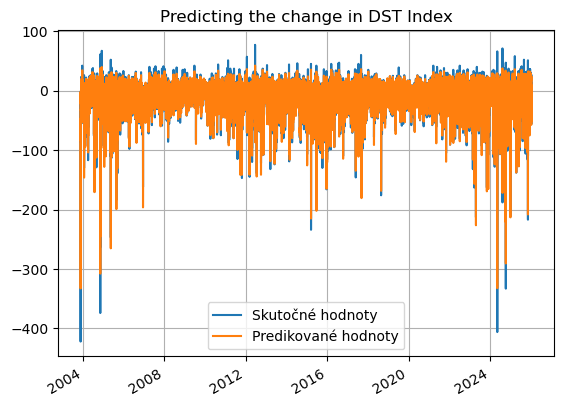

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9375399097781532
MCC=0.8120702136280811
Výkon NN:
MAE: 3.6488, MSE: 30.3498
Perzistentný model:
MAE: 4.2115, MSE: 43.2560
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 13.36%
MSE Improvement: 29.84%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 53s 60ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 48s 55ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 43s 50ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 38s 44ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step 

620/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 7s 41ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 7s 41ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 7s 41ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 7s 41ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 24s 39ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 24s 39ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 24s 39ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 24s 39ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step 

488/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 14:14 955ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step   

  5/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step 

622/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 38s 171ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step 

  3/224 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step 

 18/224 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step 

477/759 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 27s 35ms/step


Shapes LSTM:
train: (229344,) (229344,)
val:   (57327,) (57327,)
test:  (194188,) (194188,)


Global sigma (LSTM errors, scaled): 0.3114981
Shapes GP:
X_gp_train: (286671, 12)
y_gp_train: (286671,)
X_test_gp: (194188, 12)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 2.49**2 * RBF(length_scale=0.46) + WhiteKernel(noise_level=0.528)


Global sigma (LSTM errors): 6.854175
Hybrid prediction with smoothed, inflated interval ready.


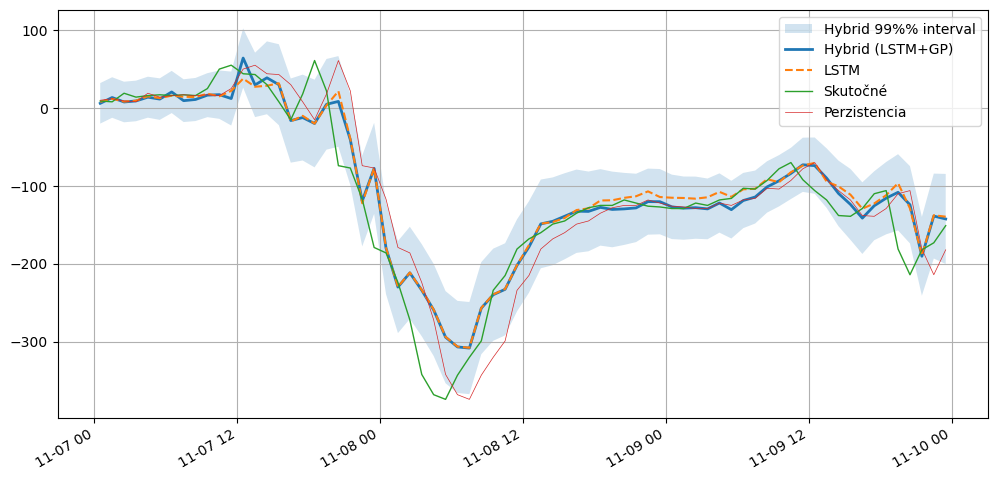

In [20]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})




start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [21]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 34.6382
MAE: 3.8781

--- Klasifikačné metriky (Prah: -20.1 nT) ---
Matthews Correlation Coefficient (MCC): 0.8021

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      146760 |        5294
Skutočná 1 |        7542 |       34589

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.95      0.97      0.96    152054
   Trieda 1 (Búrka)       0.87      0.82      0.84     42131

           accuracy                           0.93    194185
          macro avg       0.91      0.89      0.90    194185
       weighted avg       0.93      0.93      0.93    194185



In [22]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.9375440945490126
MCC=0.8120826820583239
Výkon NN:
MAE: 3.6488, MSE: 30.3498
Perzistentný model:
MAE: 4.2115, MSE: 43.2560
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 13.36%
MSE Improvement: 29.84%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9508    0.9704    0.9605    152054
           1     0.8846    0.8189    0.8505     42131

    accuracy                         0.9375    194185
   macro avg     0.9177    0.8947    0.9055    194185
weighted avg     0.9365    0.9375    0.9367    194185


===== LSTM+GP =====
ACC=0.9338980868759172
MCC=0.8021152595619423
Výkon NN:
MAE: 3.8781, MSE: 34.6382
Perzistentný model:
MAE: 4.2115, MSE: 43.2560
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 7.92%
MSE Improvement: 19.92%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9511    0.9652    0.9581    152054
           1     0.8673    0.8210    0.8435     42131

 

/tmp/ipykernel_610546/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_610546/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
2,2026-04-26T17:02:16,LSTM,12.0,1.0,DST+1,OMNI2_all,-20.0,-19.3,0.963952,0.893195,"{""text"": "" precision recall f...",2.229777,12.511719,2.567983,16.320737,13.170122,23.338519
3,2026-04-26T17:02:17,LSTM+GP,12.0,1.0,DST+1,OMNI2_all,-20.0,-19.3,0.961357,0.886635,"{""text"": "" precision recall f...",2.319347,13.750928,2.567983,16.320737,9.682153,15.745669
4,2026-04-26T18:02:46,LSTM,18.0,1.0,DST+1,OMNI2_all,-20.0,-18.9,0.963915,0.893798,"{""text"": "" precision recall f...",2.398850,12.642651,2.567970,16.320912,6.585738,22.537106
5,2026-04-26T18:02:46,LSTM+GP,18.0,1.0,DST+1,OMNI2_all,-20.0,-18.9,0.961108,0.887249,"{""text"": "" precision recall f...",2.269225,12.233449,2.567970,16.320912,11.633510,25.044330
6,2026-04-26T20:12:13,LSTM,24.0,1.0,DST+1,OMNI2_all,-20.0,-18.4,0.964125,0.893758,"{""text"": "" precision recall f...",2.363117,12.216186,2.567993,16.321215,7.978061,25.151495
7,2026-04-26T20:12:13,LSTM+GP,24.0,1.0,DST+1,OMNI2_all,-20.0,-18.4,0.957986,0.880424,"{""text"": "" precision recall f...",2.263594,11.945980,2.567993,16.321215,11.853574,26.807047
8,2026-04-26T23:37:32,LSTM,12.0,2.0,DST+2,OMNI2_all,-20.0,-20.1,0.937544,0.812083,"{""text"": "" precision recall f...",3.648835,30.349773,4.211535,43.256014,13.360929,29.836871
9,2026-04-26T23:37:32,LSTM+GP,12.0,2.0,DST+2,OMNI2_all,-20.0,-20.1,0.933898,0.802115,"{""text"": "" precision recall f...",3.878056,34.638166,4.211535,43.256014,7.918247,19.922888
10,2026-04-26T23:40:19,LSTM,12.0,2.0,DST+2,OMNI2_all,-20.0,-20.1,0.937544,0.812083,"{""text"": "" precision recall f...",3.648835,30.349773,4.211535,43.256014,13.360929,29.836871
11,2026-04-26T23:40:19,LSTM+GP,12.0,2.0,DST+2,OMNI2_all,-20.0,-20.1,0.933898,0.802115,"{""text"": "" precision recall f...",3.878056,34.638166,4.211535,43.256014,7.918247,19.922888
